In [ ]:
import os
import time
import string
import pickle
from glob import glob

import numpy as np
from numpy import array
import pandas as pd

import cv2
import matplotlib
import matplotlib.pyplot as plt
from tqdm import tqdm

import PIL
from PIL import Image 

# Machine Learning / NLP
from sklearn.model_selection import train_test_split
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction

# TensorFlow / Keras
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.optimizers import Adam

from tensorflow.keras.layers import (
    Dense, Input, LSTM, Dropout, Embedding, BatchNormalization, Add, Bidirectional, 
    Flatten, Activation, Conv2D, MaxPool2D, add
)


In [9]:
import tensorflow as tf
from tensorflow.python.framework import test_util
from tensorflow.python.platform import build_info as tf_build_info

physical_devices = tf.config.list_physical_devices('GPU')
try:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
except:
    # Invalid device or cannot modify virtual devices once initialized.
    print("None")
    pass
    
# TensorFlow version
print("TensorFlow version:", tf.__version__)

# Check if GPU is available
print("Num GPUs Available:", len(tf.config.list_physical_devices('GPU')))

# List all physical devices
print("Physical devices:", tf.config.list_physical_devices())

# GPU device name (if available)
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    print("GPU Name:", tf.config.experimental.get_device_details(gpus[0])['device_name'])
else:
    print("No GPU detected.")

print("Built with CUDA:", tf_build_info.build_info['is_cuda_build'])
print("CUDA version:", tf_build_info.build_info['cuda_version'])
print("cuDNN version:", tf_build_info.build_info['cudnn_version'])
import sys
print(sys.version)

TensorFlow version: 2.10.0
Num GPUs Available: 1
Physical devices: [PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'), PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
GPU Name: NVIDIA GeForce RTX 3060 Laptop GPU
Built with CUDA: True
CUDA version: 64_112
cuDNN version: 64_8
3.9.21 (main, Dec 11 2024, 16:35:24) [MSC v.1929 64 bit (AMD64)]


In [33]:
image_path = ".../Flickr30k/Images/"
images = glob(image_path + "*.jpg")
len(images) # 31783

31783

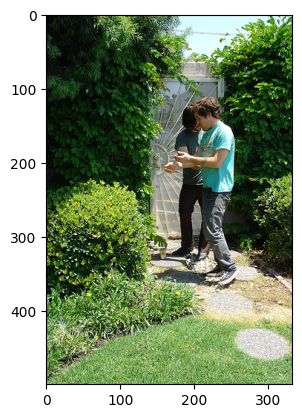

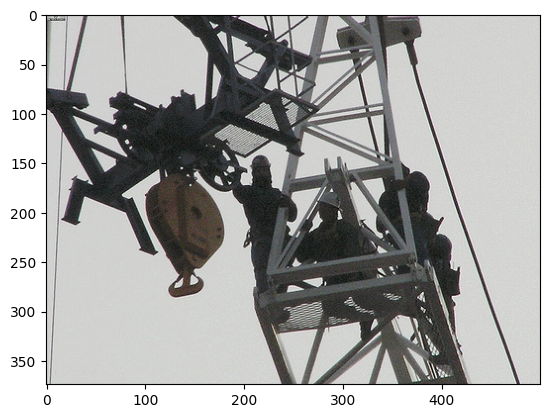

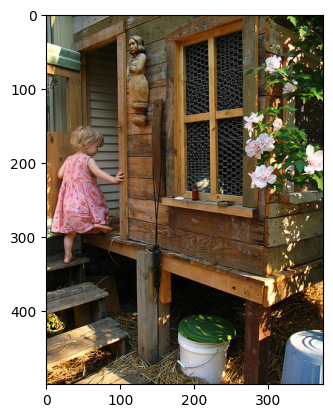

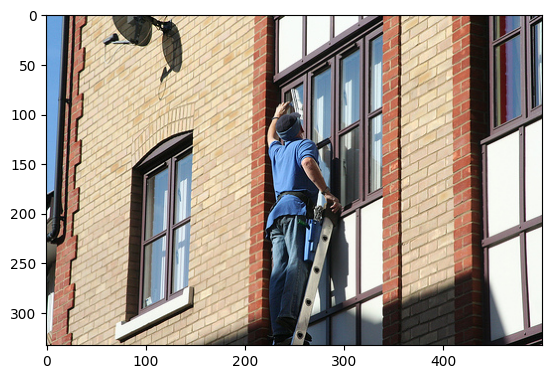

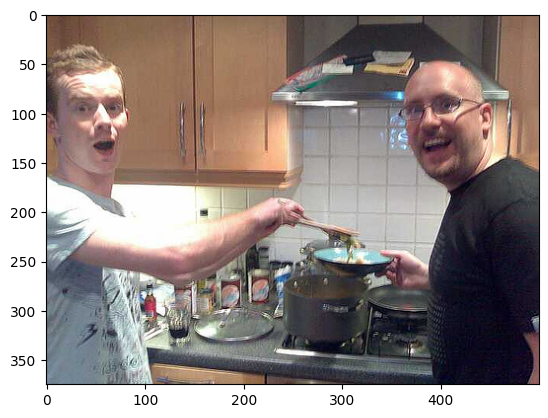

In [34]:
for i in range(5):
    plt.figure()
    image = cv2.imread(images[i])
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)

In [35]:
# Defining the function to load the captions
def load(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

file = ".../Flickr30k/captions.txt"
info = load(file)
print(info[:484])

image,caption
1000092795.jpg, Two young guys with shaggy hair look at their hands while hanging out in the yard .
1000092795.jpg," Two young , White males are outside near many bushes ."
1000092795.jpg, Two men in green shirts are standing in a yard .
1000092795.jpg, A man in a blue shirt standing in a garden .
1000092795.jpg, Two friends enjoy time spent together .
10002456.jpg, Several men in hard hats are operating a giant pulley system .
10002456.jpg, Workers look down from u


In [36]:
# Delete the first line as well as the last empty line and then rename the file
file = ".../Flickr30k/captions3.txt"
info = load(file)
print(info[:470])

1000092795.jpg, Two young guys with shaggy hair look at their hands while hanging out in the yard .
1000092795.jpg," Two young , White males are outside near many bushes ."
1000092795.jpg, Two men in green shirts are standing in a yard .
1000092795.jpg, A man in a blue shirt standing in a garden .
1000092795.jpg, Two friends enjoy time spent together .
10002456.jpg, Several men in hard hats are operating a giant pulley system .
10002456.jpg, Workers look down from u


In [37]:
# Reading the information

count = 0

for line in info.split('\n'):
    print(line)
    count += 1
    if count == 5:
        break

1000092795.jpg, Two young guys with shaggy hair look at their hands while hanging out in the yard .
1000092795.jpg," Two young , White males are outside near many bushes ."
1000092795.jpg, Two men in green shirts are standing in a yard .
1000092795.jpg, A man in a blue shirt standing in a garden .
1000092795.jpg, Two friends enjoy time spent together .


In [38]:
# Creating a function to create a DICTIONARY for the IMAGES and their respective CAPTIONS

def load_captions(info):
    dict_1 = dict()
    count = 0
    for line in info.split('\n'):
        
        splitter = line.split('.jpg,')
#         print(splitter)
        # The image_code and image_captions are the list of the images with their respective captions
        image_code, image_caption = splitter[0], splitter[1]
        
        # Create dictionary
        if image_code not in dict_1:
            dict_1[image_code] = list()
            
        dict_1[image_code].append(image_caption)
        
    return dict_1

data = load_captions(info)
print(len(data)) # print Unique Images 31783

31783


In [39]:
list(data.keys())[:5]

['1000092795', '10002456', '1000268201', '1000344755', '1000366164']

In [40]:
data['1000092795']

[' Two young guys with shaggy hair look at their hands while hanging out in the yard .',
 '" Two young , White males are outside near many bushes ."',
 ' Two men in green shirts are standing in a yard .',
 ' A man in a blue shirt standing in a garden .',
 ' Two friends enjoy time spent together .']

In [41]:
# Cleanse and pre-process the data

def cleanse_data(data):
    table = str.maketrans('', '', string.punctuation)
    dict_2 = dict()
    for key, value in data.items():
        for i in range(len(value)):
            line = value[i].lower()                         # lowercase
            line = line.translate(table)                    # Remove Punctuation
            line = '<start> ' + line.strip() + ' <end>'     # add tokens
            if key not in dict_2:
                dict_2[key] = list()
            dict_2[key].append(line)
    return dict_2

data2 = cleanse_data(data)
print(len(data2))           

31783


In [42]:
from sklearn.model_selection import train_test_split

# Step 1: Get all image keys
image_keys = list(data2.keys())

# Step 2: Split into 70% train, 30% remaining
train_keys, valtest_keys = train_test_split(image_keys, test_size=0.30, random_state=42)

# Step 3: Split remaining into 15% val, 15% test
val_keys, test_keys = train_test_split(valtest_keys, test_size=0.50, random_state=42)

# Step 4: Build the actual dictionaries
train_data = {k: data2[k] for k in train_keys}
val_data   = {k: data2[k] for k in val_keys}
test_data  = {k: data2[k] for k in test_keys}

# Optional: Confirm the sizes
print(f"Train: {len(train_data)}, Val: {len(val_data)}, Test: {len(test_data)}")


Train: 22248, Val: 4767, Test: 4768


In [43]:
list(train_data .keys())[:5]

['2757779501', '4445556540', '7032796325', '393810324', '3551698034']

In [44]:
#data2['1000268201_693b08cb0e']
train_data['2757779501']

['<start> a shirtless person with jeans is climbing a rocky mountainside <end>',
 '<start> a man climbing the rocky face of a mountain <end>',
 '<start> extreme rock wall climbing <end>',
 '<start> a climber on some rocks <end>',
 '<start> a man rock climbing <end>']

In [45]:
# convert the following into a vocabulary of words and calculate the total words

def vocabulary(train_data):
    all_desc = set() # only unique words are stored
    for key in train_data.keys():
        [all_desc.update(d.split()) for d in train_data[key]]
    return all_desc

# summarize vocabulary
vocabulary_data = vocabulary(train_data)
print(len(vocabulary_data)) # number of unique words


17294


In [46]:
# save descriptions to file, one per line

def save_dict(train_data, filename):
    lines = list()
    for key, value in train_data.items():
        for desc in value:
            lines.append(key + ' ' + desc)
    data = '\n'.join(lines)
    file = open(filename, 'w')
    file.write(data)
    file.close()

save_dict(train_data, ".../Flickr30k/captions3.txt")

In [47]:
images = ".../Flickr30k/Images/"
img = glob(images + '*.jpg')
print(len(img))

31783


In [18]:
from tensorflow.keras.applications import ResNet50

def preprocess(image_path):
    # Convert all the images to size 224x224 as expected by the ResNet50 model
    img = keras.preprocessing.image.load_img(image_path, target_size=(224, 224))
    # Convert PIL image to numpy array of 3-dimensions
    x = keras.preprocessing.image.img_to_array(img)
    # Add one more dimension
    x = np.expand_dims(x, axis=0)
    # Preprocess the images using preprocess_input() from ResNet50 module
    x = keras.applications.resnet50.preprocess_input(x)
    return x

# Load the ResNet50 model
input1 = ResNet50(weights='imagenet')

# Create a new model, by removing the last layer (output layer) from the ResNet50
model = Model(input1.input, input1.layers[-2].output)  # use second last layer output

model.summary()


102967424/102967424 [==============================] - 29s 0us/step
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                          

In [19]:
# Function to encode a given image into a vector of size (2048, )
def encode(image):
    image = preprocess(image) # preprocess the image
    fea_vec = model.predict(image) # Get the encoding vector for the image
    fea_vec = np.reshape(fea_vec, fea_vec.shape[1]) # reshape from (1, 2048) to (2048, )
    return fea_vec


In [20]:
encoding = {}

for i in tqdm(img):
    encoding[i[len(images):]] = encode(i)


  0%|                                                                                        | 0/31783 [00:00<?, ?it/s]

1/1 [==============================] - 6s 6s/step


  0%|                                                                             | 1/31783 [00:05<49:30:16,  5.61s/it]

1/1 [==============================] - 0s 22ms/step


  0%|                                                                             | 3/31783 [00:05<13:12:11,  1.50s/it]

1/1 [==============================] - 0s 23ms/step


  0%|                                                                              | 5/31783 [00:05<6:39:36,  1.33it/s]

1/1 [==============================] - 0s 21ms/step


  0%|                                                                              | 7/31783 [00:05<4:02:41,  2.18it/s]

1/1 [==============================] - 0s 23ms/step


  0%|                                                                              | 9/31783 [00:06<2:42:37,  3.26it/s]

1/1 [==============================] - 0s 23ms/step


  0%|                                                                             | 11/31783 [00:06<1:56:40,  4.54it/s]

1/1 [==============================] - 0s 22ms/step


  0%|                                                                             | 13/31783 [00:06<1:28:10,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


  0%|                                                                             | 15/31783 [00:06<1:09:03,  7.67it/s]

1/1 [==============================] - 0s 22ms/step


  0%|                                                                               | 17/31783 [00:06<56:16,  9.41it/s]

1/1 [==============================] - 0s 21ms/step


  0%|                                                                               | 19/31783 [00:06<47:34, 11.13it/s]

1/1 [==============================] - 0s 22ms/step


  0%|                                                                               | 21/31783 [00:06<41:40, 12.70it/s]

1/1 [==============================] - 0s 25ms/step


  0%|                                                                               | 23/31783 [00:06<37:51, 13.98it/s]

1/1 [==============================] - 0s 21ms/step


  0%|                                                                               | 25/31783 [00:06<34:49, 15.20it/s]

1/1 [==============================] - 0s 21ms/step


  0%|                                                                               | 27/31783 [00:07<32:40, 16.20it/s]

1/1 [==============================] - 0s 21ms/step


  0%|                                                                               | 29/31783 [00:07<31:16, 16.92it/s]

1/1 [==============================] - 0s 26ms/step


  0%|                                                                               | 31/31783 [00:07<30:26, 17.39it/s]

1/1 [==============================] - 0s 24ms/step


  0%|                                                                               | 33/31783 [00:07<30:17, 17.47it/s]

1/1 [==============================] - 0s 25ms/step


  0%|                                                                               | 35/31783 [00:07<30:42, 17.23it/s]

1/1 [==============================] - 0s 21ms/step


  0%|                                                                               | 37/31783 [00:07<30:24, 17.40it/s]

1/1 [==============================] - 0s 21ms/step


  0%|                                                                               | 39/31783 [00:07<30:31, 17.33it/s]

1/1 [==============================] - 0s 21ms/step


  0%|                                                                               | 41/31783 [00:07<30:36, 17.29it/s]

1/1 [==============================] - 0s 23ms/step


  0%|                                                                               | 43/31783 [00:07<31:34, 16.76it/s]

1/1 [==============================] - 0s 23ms/step


  0%|                                                                               | 45/31783 [00:08<32:14, 16.41it/s]

1/1 [==============================] - 0s 25ms/step


  0%|                                                                               | 47/31783 [00:08<32:43, 16.16it/s]

1/1 [==============================] - 0s 22ms/step


  0%|                                                                               | 49/31783 [00:08<32:30, 16.27it/s]

1/1 [==============================] - 0s 23ms/step


  0%|▏                                                                              | 51/31783 [00:08<32:33, 16.24it/s]

1/1 [==============================] - 0s 20ms/step


  0%|▏                                                                              | 53/31783 [00:08<32:28, 16.28it/s]

1/1 [==============================] - 0s 20ms/step


  0%|▏                                                                              | 55/31783 [00:08<31:59, 16.53it/s]

1/1 [==============================] - 0s 20ms/step


  0%|▏                                                                              | 57/31783 [00:08<31:51, 16.60it/s]

1/1 [==============================] - 0s 20ms/step


  0%|▏                                                                              | 59/31783 [00:08<31:55, 16.56it/s]

1/1 [==============================] - 0s 22ms/step


  0%|▏                                                                              | 61/31783 [00:09<33:03, 15.99it/s]

1/1 [==============================] - 0s 21ms/step


  0%|▏                                                                              | 63/31783 [00:09<34:36, 15.28it/s]

1/1 [==============================] - 0s 21ms/step


  0%|▏                                                                              | 65/31783 [00:09<35:54, 14.72it/s]

1/1 [==============================] - 0s 21ms/step


  0%|▏                                                                              | 67/31783 [00:09<36:42, 14.40it/s]

1/1 [==============================] - 0s 23ms/step


  0%|▏                                                                              | 69/31783 [00:09<37:33, 14.07it/s]

1/1 [==============================] - 0s 22ms/step


  0%|▏                                                                              | 71/31783 [00:09<39:04, 13.53it/s]

1/1 [==============================] - 0s 23ms/step


  0%|▏                                                                              | 73/31783 [00:10<41:25, 12.76it/s]

1/1 [==============================] - 0s 21ms/step


  0%|▏                                                                              | 75/31783 [00:10<40:39, 13.00it/s]

1/1 [==============================] - 0s 23ms/step


  0%|▏                                                                              | 77/31783 [00:10<40:16, 13.12it/s]

1/1 [==============================] - 0s 21ms/step


  0%|▏                                                                              | 79/31783 [00:10<37:18, 14.16it/s]

1/1 [==============================] - 0s 22ms/step


  0%|▏                                                                              | 81/31783 [00:10<35:31, 14.87it/s]

1/1 [==============================] - 0s 26ms/step


  0%|▏                                                                              | 83/31783 [00:10<35:36, 14.84it/s]

1/1 [==============================] - 0s 26ms/step


  0%|▏                                                                              | 85/31783 [00:10<35:27, 14.90it/s]

1/1 [==============================] - 0s 27ms/step


  0%|▏                                                                              | 87/31783 [00:10<35:36, 14.84it/s]

1/1 [==============================] - 0s 23ms/step


  0%|▏                                                                              | 89/31783 [00:11<35:16, 14.98it/s]

1/1 [==============================] - 0s 22ms/step


  0%|▏                                                                              | 91/31783 [00:11<33:54, 15.58it/s]

1/1 [==============================] - 0s 23ms/step


  0%|▏                                                                              | 93/31783 [00:11<32:53, 16.06it/s]

1/1 [==============================] - 0s 23ms/step


  0%|▏                                                                              | 95/31783 [00:11<32:43, 16.14it/s]

1/1 [==============================] - 0s 24ms/step


  0%|▏                                                                              | 97/31783 [00:11<32:50, 16.08it/s]

1/1 [==============================] - 0s 23ms/step


  0%|▏                                                                              | 99/31783 [00:11<32:53, 16.05it/s]

1/1 [==============================] - 0s 26ms/step


  0%|▏                                                                             | 101/31783 [00:11<32:44, 16.13it/s]

1/1 [==============================] - 0s 20ms/step


  0%|▎                                                                             | 103/31783 [00:11<31:49, 16.59it/s]

1/1 [==============================] - 0s 21ms/step


  0%|▎                                                                             | 105/31783 [00:12<30:54, 17.08it/s]

1/1 [==============================] - 0s 22ms/step


  0%|▎                                                                             | 107/31783 [00:12<33:17, 15.86it/s]

1/1 [==============================] - 0s 21ms/step


  0%|▎                                                                             | 109/31783 [00:12<35:17, 14.96it/s]

1/1 [==============================] - 0s 23ms/step


  0%|▎                                                                             | 111/31783 [00:12<36:46, 14.35it/s]

1/1 [==============================] - 0s 23ms/step


  0%|▎                                                                             | 113/31783 [00:12<38:07, 13.84it/s]

1/1 [==============================] - 0s 23ms/step


  0%|▎                                                                             | 115/31783 [00:12<41:34, 12.70it/s]

1/1 [==============================] - 0s 22ms/step


  0%|▎                                                                             | 117/31783 [00:13<44:39, 11.82it/s]

1/1 [==============================] - 0s 23ms/step


  0%|▎                                                                             | 119/31783 [00:13<40:55, 12.89it/s]

1/1 [==============================] - 0s 23ms/step


  0%|▎                                                                             | 121/31783 [00:13<37:29, 14.07it/s]

1/1 [==============================] - 0s 24ms/step


  0%|▎                                                                             | 123/31783 [00:13<35:32, 14.85it/s]

1/1 [==============================] - 0s 24ms/step


  0%|▎                                                                             | 125/31783 [00:13<34:26, 15.32it/s]

1/1 [==============================] - 0s 23ms/step


  0%|▎                                                                             | 127/31783 [00:13<33:26, 15.77it/s]

1/1 [==============================] - 0s 24ms/step


  0%|▎                                                                             | 129/31783 [00:13<33:34, 15.72it/s]

1/1 [==============================] - 0s 24ms/step


  0%|▎                                                                             | 131/31783 [00:13<32:45, 16.10it/s]

1/1 [==============================] - 0s 21ms/step


  0%|▎                                                                             | 133/31783 [00:13<31:35, 16.70it/s]

1/1 [==============================] - 0s 21ms/step


  0%|▎                                                                             | 135/31783 [00:14<30:33, 17.26it/s]

1/1 [==============================] - 0s 22ms/step


  0%|▎                                                                             | 137/31783 [00:14<29:59, 17.58it/s]

1/1 [==============================] - 0s 21ms/step


  0%|▎                                                                             | 139/31783 [00:14<29:38, 17.80it/s]

1/1 [==============================] - 0s 21ms/step


  0%|▎                                                                             | 141/31783 [00:14<29:01, 18.17it/s]

1/1 [==============================] - 0s 22ms/step


  0%|▎                                                                             | 143/31783 [00:14<29:18, 17.99it/s]

1/1 [==============================] - 0s 22ms/step


  0%|▎                                                                             | 145/31783 [00:14<29:47, 17.70it/s]

1/1 [==============================] - 0s 22ms/step


  0%|▎                                                                             | 147/31783 [00:14<29:39, 17.78it/s]

1/1 [==============================] - 0s 22ms/step


  0%|▎                                                                             | 149/31783 [00:14<29:23, 17.93it/s]

1/1 [==============================] - 0s 25ms/step


  0%|▎                                                                             | 151/31783 [00:14<29:26, 17.91it/s]

1/1 [==============================] - 0s 21ms/step


  0%|▍                                                                             | 153/31783 [00:15<29:28, 17.89it/s]

1/1 [==============================] - 0s 21ms/step


  0%|▍                                                                             | 155/31783 [00:15<29:29, 17.88it/s]

1/1 [==============================] - 0s 21ms/step


  0%|▍                                                                             | 157/31783 [00:15<29:55, 17.61it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▍                                                                             | 159/31783 [00:15<29:56, 17.60it/s]

1/1 [==============================] - 0s 23ms/step


  1%|▍                                                                             | 161/31783 [00:15<30:28, 17.29it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▍                                                                             | 163/31783 [00:15<32:26, 16.24it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▍                                                                             | 165/31783 [00:15<33:31, 15.72it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▍                                                                             | 167/31783 [00:15<33:10, 15.88it/s]

1/1 [==============================] - 0s 23ms/step


  1%|▍                                                                             | 169/31783 [00:16<33:45, 15.61it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▍                                                                             | 171/31783 [00:16<33:55, 15.53it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▍                                                                             | 173/31783 [00:16<32:54, 16.01it/s]

1/1 [==============================] - 0s 23ms/step


  1%|▍                                                                             | 175/31783 [00:16<32:22, 16.27it/s]

1/1 [==============================] - 0s 24ms/step


  1%|▍                                                                             | 177/31783 [00:16<32:38, 16.14it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▍                                                                             | 179/31783 [00:16<32:09, 16.38it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▍                                                                             | 181/31783 [00:16<31:46, 16.57it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▍                                                                             | 183/31783 [00:16<31:36, 16.67it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▍                                                                             | 185/31783 [00:17<31:32, 16.70it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▍                                                                             | 187/31783 [00:17<31:51, 16.53it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▍                                                                             | 189/31783 [00:17<31:44, 16.59it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▍                                                                             | 191/31783 [00:17<31:46, 16.57it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▍                                                                             | 193/31783 [00:17<31:55, 16.49it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▍                                                                             | 195/31783 [00:17<32:03, 16.43it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▍                                                                             | 197/31783 [00:17<45:08, 11.66it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▍                                                                             | 199/31783 [00:18<42:42, 12.33it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▍                                                                             | 201/31783 [00:18<40:55, 12.86it/s]

1/1 [==============================] - 0s 34ms/step


  1%|▍                                                                             | 203/31783 [00:18<41:02, 12.82it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▌                                                                             | 205/31783 [00:18<39:20, 13.38it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▌                                                                             | 207/31783 [00:18<37:29, 14.04it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▌                                                                             | 209/31783 [00:18<37:58, 13.86it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▌                                                                             | 211/31783 [00:18<38:21, 13.72it/s]

1/1 [==============================] - 0s 24ms/step


  1%|▌                                                                             | 213/31783 [00:19<39:15, 13.40it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▌                                                                             | 215/31783 [00:19<40:08, 13.11it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▌                                                                             | 217/31783 [00:19<40:11, 13.09it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▌                                                                             | 219/31783 [00:19<39:33, 13.30it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▌                                                                             | 221/31783 [00:19<39:20, 13.37it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▌                                                                             | 223/31783 [00:19<39:08, 13.44it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▌                                                                             | 225/31783 [00:19<39:03, 13.46it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▌                                                                             | 227/31783 [00:20<38:57, 13.50it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▌                                                                             | 229/31783 [00:20<46:12, 11.38it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▌                                                                             | 231/31783 [00:20<43:54, 11.98it/s]

1/1 [==============================] - 0s 23ms/step


  1%|▌                                                                             | 233/31783 [00:20<41:13, 12.75it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▌                                                                             | 235/31783 [00:20<37:28, 14.03it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▌                                                                             | 237/31783 [00:20<34:46, 15.12it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▌                                                                             | 239/31783 [00:20<33:00, 15.93it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▌                                                                             | 241/31783 [00:21<31:38, 16.61it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▌                                                                             | 243/31783 [00:21<32:28, 16.19it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▌                                                                             | 245/31783 [00:21<32:42, 16.07it/s]

1/1 [==============================] - 0s 24ms/step


  1%|▌                                                                             | 247/31783 [00:21<33:02, 15.91it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▌                                                                             | 249/31783 [00:21<32:48, 16.02it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▌                                                                             | 251/31783 [00:21<31:28, 16.70it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▌                                                                             | 253/31783 [00:21<30:51, 17.03it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▋                                                                             | 255/31783 [00:21<30:39, 17.14it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▋                                                                             | 257/31783 [00:22<30:00, 17.51it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▋                                                                             | 259/31783 [00:22<29:27, 17.84it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▋                                                                             | 261/31783 [00:22<29:48, 17.63it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▋                                                                             | 263/31783 [00:22<32:32, 16.15it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▋                                                                             | 265/31783 [00:22<34:13, 15.35it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▋                                                                             | 267/31783 [00:22<35:21, 14.86it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▋                                                                             | 269/31783 [00:22<36:15, 14.49it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▋                                                                             | 271/31783 [00:22<36:47, 14.28it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▋                                                                             | 273/31783 [00:23<37:13, 14.11it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▋                                                                             | 275/31783 [00:23<40:59, 12.81it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▋                                                                             | 277/31783 [00:23<41:31, 12.64it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▋                                                                             | 279/31783 [00:23<37:39, 13.94it/s]

1/1 [==============================] - 0s 23ms/step


  1%|▋                                                                             | 281/31783 [00:23<36:05, 14.55it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▋                                                                             | 283/31783 [00:23<33:39, 15.59it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▋                                                                             | 285/31783 [00:23<32:26, 16.18it/s]

1/1 [==============================] - 0s 24ms/step


  1%|▋                                                                             | 287/31783 [00:24<31:24, 16.72it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▋                                                                             | 289/31783 [00:24<30:32, 17.19it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▋                                                                             | 291/31783 [00:24<30:12, 17.38it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▋                                                                             | 293/31783 [00:24<29:23, 17.86it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▋                                                                             | 295/31783 [00:24<28:43, 18.27it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▋                                                                             | 297/31783 [00:24<28:19, 18.52it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▋                                                                             | 299/31783 [00:24<28:02, 18.71it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▋                                                                             | 301/31783 [00:24<28:01, 18.72it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▋                                                                             | 303/31783 [00:24<27:52, 18.82it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▋                                                                             | 305/31783 [00:24<28:00, 18.73it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▊                                                                             | 307/31783 [00:25<27:48, 18.86it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▊                                                                             | 309/31783 [00:25<27:47, 18.88it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▊                                                                             | 311/31783 [00:25<28:48, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▊                                                                             | 313/31783 [00:25<29:16, 17.92it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▊                                                                             | 315/31783 [00:25<29:45, 17.62it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▊                                                                             | 317/31783 [00:25<30:00, 17.47it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▊                                                                             | 319/31783 [00:25<30:15, 17.34it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▊                                                                             | 321/31783 [00:25<32:47, 15.99it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▊                                                                             | 323/31783 [00:26<34:41, 15.11it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▊                                                                             | 325/31783 [00:26<36:03, 14.54it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▊                                                                             | 327/31783 [00:26<36:38, 14.31it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▊                                                                             | 329/31783 [00:26<37:08, 14.11it/s]

1/1 [==============================] - 0s 23ms/step


  1%|▊                                                                             | 331/31783 [00:26<37:23, 14.02it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▊                                                                             | 333/31783 [00:26<38:07, 13.75it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▊                                                                             | 335/31783 [00:26<38:17, 13.69it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▊                                                                             | 337/31783 [00:27<38:06, 13.75it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▊                                                                             | 339/31783 [00:27<38:58, 13.45it/s]

1/1 [==============================] - 0s 29ms/step


  1%|▊                                                                             | 341/31783 [00:27<40:33, 12.92it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▊                                                                             | 343/31783 [00:27<42:55, 12.21it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▊                                                                             | 345/31783 [00:27<42:49, 12.23it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▊                                                                             | 347/31783 [00:27<41:39, 12.58it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▊                                                                             | 349/31783 [00:28<40:30, 12.94it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▊                                                                             | 351/31783 [00:28<39:19, 13.32it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▊                                                                             | 353/31783 [00:28<38:46, 13.51it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▊                                                                             | 355/31783 [00:28<38:07, 13.74it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▉                                                                             | 357/31783 [00:28<38:35, 13.57it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▉                                                                             | 359/31783 [00:28<38:25, 13.63it/s]

1/1 [==============================] - 0s 23ms/step


  1%|▉                                                                             | 361/31783 [00:28<37:56, 13.80it/s]

1/1 [==============================] - 0s 23ms/step


  1%|▉                                                                             | 363/31783 [00:29<38:02, 13.77it/s]

1/1 [==============================] - 0s 24ms/step


  1%|▉                                                                             | 365/31783 [00:29<39:24, 13.29it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▉                                                                             | 367/31783 [00:29<40:25, 12.95it/s]

1/1 [==============================] - 0s 24ms/step


  1%|▉                                                                             | 369/31783 [00:29<41:34, 12.59it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▉                                                                             | 371/31783 [00:29<40:55, 12.79it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▉                                                                             | 373/31783 [00:29<39:44, 13.17it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▉                                                                             | 375/31783 [00:30<38:51, 13.47it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▉                                                                             | 377/31783 [00:30<39:12, 13.35it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▉                                                                             | 379/31783 [00:30<38:46, 13.50it/s]

1/1 [==============================] - 0s 23ms/step


  1%|▉                                                                             | 381/31783 [00:30<39:07, 13.38it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▉                                                                             | 383/31783 [00:30<38:43, 13.52it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▉                                                                             | 385/31783 [00:30<38:18, 13.66it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▉                                                                             | 387/31783 [00:30<38:17, 13.67it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▉                                                                             | 389/31783 [00:31<38:01, 13.76it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▉                                                                             | 391/31783 [00:31<37:49, 13.83it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▉                                                                             | 393/31783 [00:31<38:01, 13.76it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▉                                                                             | 395/31783 [00:31<37:57, 13.78it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▉                                                                             | 397/31783 [00:31<37:48, 13.84it/s]

1/1 [==============================] - 0s 24ms/step


  1%|▉                                                                             | 399/31783 [00:31<38:01, 13.76it/s]

1/1 [==============================] - 0s 23ms/step


  1%|▉                                                                             | 401/31783 [00:31<38:00, 13.76it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▉                                                                             | 403/31783 [00:32<37:47, 13.84it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▉                                                                             | 405/31783 [00:32<37:51, 13.82it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▉                                                                             | 407/31783 [00:32<38:24, 13.62it/s]

1/1 [==============================] - 0s 20ms/step


  1%|█                                                                             | 409/31783 [00:32<38:05, 13.73it/s]

1/1 [==============================] - 0s 21ms/step


  1%|█                                                                             | 411/31783 [00:32<37:56, 13.78it/s]

1/1 [==============================] - 0s 21ms/step


  1%|█                                                                             | 413/31783 [00:32<37:42, 13.86it/s]

1/1 [==============================] - 0s 20ms/step


  1%|█                                                                             | 415/31783 [00:32<37:43, 13.86it/s]

1/1 [==============================] - 0s 21ms/step


  1%|█                                                                             | 417/31783 [00:33<37:55, 13.79it/s]

1/1 [==============================] - 0s 21ms/step


  1%|█                                                                             | 419/31783 [00:33<37:36, 13.90it/s]

1/1 [==============================] - 0s 22ms/step


  1%|█                                                                             | 421/31783 [00:33<37:41, 13.87it/s]

1/1 [==============================] - 0s 22ms/step


  1%|█                                                                             | 423/31783 [00:33<37:37, 13.89it/s]

1/1 [==============================] - 0s 22ms/step


  1%|█                                                                             | 425/31783 [00:33<37:48, 13.82it/s]

1/1 [==============================] - 0s 21ms/step


  1%|█                                                                             | 427/31783 [00:33<37:40, 13.87it/s]

1/1 [==============================] - 0s 21ms/step


  1%|█                                                                             | 429/31783 [00:33<37:26, 13.96it/s]

1/1 [==============================] - 0s 21ms/step


  1%|█                                                                             | 431/31783 [00:34<37:20, 13.99it/s]

1/1 [==============================] - 0s 25ms/step


  1%|█                                                                             | 433/31783 [00:34<37:17, 14.01it/s]

1/1 [==============================] - 0s 21ms/step


  1%|█                                                                             | 435/31783 [00:34<38:02, 13.74it/s]

1/1 [==============================] - 0s 21ms/step


  1%|█                                                                             | 437/31783 [00:34<37:55, 13.78it/s]

1/1 [==============================] - 0s 22ms/step


  1%|█                                                                             | 439/31783 [00:34<37:54, 13.78it/s]

1/1 [==============================] - 0s 21ms/step


  1%|█                                                                             | 441/31783 [00:34<37:49, 13.81it/s]

1/1 [==============================] - 0s 21ms/step


  1%|█                                                                             | 443/31783 [00:34<37:55, 13.77it/s]

1/1 [==============================] - 0s 21ms/step


  1%|█                                                                             | 445/31783 [00:35<38:01, 13.73it/s]

1/1 [==============================] - 0s 20ms/step


  1%|█                                                                             | 447/31783 [00:35<37:45, 13.83it/s]

1/1 [==============================] - 0s 20ms/step


  1%|█                                                                             | 449/31783 [00:35<37:33, 13.91it/s]

1/1 [==============================] - 0s 20ms/step


  1%|█                                                                             | 451/31783 [00:35<37:26, 13.95it/s]

1/1 [==============================] - 0s 22ms/step


  1%|█                                                                             | 453/31783 [00:35<37:22, 13.97it/s]

1/1 [==============================] - 0s 21ms/step


  1%|█                                                                             | 455/31783 [00:35<37:41, 13.85it/s]

1/1 [==============================] - 0s 22ms/step


  1%|█                                                                             | 457/31783 [00:35<37:40, 13.86it/s]

1/1 [==============================] - 0s 20ms/step


  1%|█▏                                                                            | 459/31783 [00:36<37:40, 13.86it/s]

1/1 [==============================] - 0s 24ms/step


  1%|█▏                                                                            | 461/31783 [00:36<37:45, 13.83it/s]

1/1 [==============================] - 0s 21ms/step


  1%|█▏                                                                            | 463/31783 [00:36<38:08, 13.68it/s]

1/1 [==============================] - 0s 21ms/step


  1%|█▏                                                                            | 465/31783 [00:36<38:25, 13.58it/s]

1/1 [==============================] - 0s 21ms/step


  1%|█▏                                                                            | 467/31783 [00:36<38:04, 13.71it/s]

1/1 [==============================] - 0s 21ms/step


  1%|█▏                                                                            | 469/31783 [00:36<37:53, 13.78it/s]

1/1 [==============================] - 0s 22ms/step


  1%|█▏                                                                            | 471/31783 [00:36<37:44, 13.83it/s]

1/1 [==============================] - 0s 22ms/step


  1%|█▏                                                                            | 473/31783 [00:37<38:03, 13.71it/s]

1/1 [==============================] - 0s 20ms/step


  1%|█▏                                                                            | 475/31783 [00:37<37:50, 13.79it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▏                                                                            | 477/31783 [00:37<37:28, 13.92it/s]

1/1 [==============================] - 0s 22ms/step


  2%|█▏                                                                            | 479/31783 [00:37<37:57, 13.75it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▏                                                                            | 481/31783 [00:37<37:55, 13.76it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▏                                                                            | 483/31783 [00:37<37:55, 13.75it/s]

1/1 [==============================] - 0s 20ms/step


  2%|█▏                                                                            | 485/31783 [00:37<37:39, 13.85it/s]

1/1 [==============================] - 0s 20ms/step


  2%|█▏                                                                            | 487/31783 [00:38<37:33, 13.89it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▏                                                                            | 489/31783 [00:38<37:23, 13.95it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▏                                                                            | 491/31783 [00:38<37:43, 13.82it/s]

1/1 [==============================] - 0s 23ms/step


  2%|█▏                                                                            | 493/31783 [00:38<37:57, 13.74it/s]

1/1 [==============================] - 0s 22ms/step


  2%|█▏                                                                            | 495/31783 [00:38<37:33, 13.88it/s]

1/1 [==============================] - 0s 22ms/step


  2%|█▏                                                                            | 497/31783 [00:38<37:32, 13.89it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▏                                                                            | 499/31783 [00:39<37:39, 13.84it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▏                                                                            | 501/31783 [00:39<37:29, 13.91it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▏                                                                            | 503/31783 [00:39<37:37, 13.86it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▏                                                                            | 505/31783 [00:39<37:26, 13.92it/s]

1/1 [==============================] - 0s 22ms/step


  2%|█▏                                                                            | 507/31783 [00:39<37:25, 13.93it/s]

1/1 [==============================] - 0s 26ms/step


  2%|█▏                                                                            | 509/31783 [00:39<37:33, 13.88it/s]

1/1 [==============================] - 0s 26ms/step


  2%|█▎                                                                            | 511/31783 [00:39<38:43, 13.46it/s]

1/1 [==============================] - 0s 26ms/step


  2%|█▎                                                                            | 513/31783 [00:40<39:56, 13.05it/s]

1/1 [==============================] - 0s 20ms/step


  2%|█▎                                                                            | 515/31783 [00:40<39:53, 13.06it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▎                                                                            | 517/31783 [00:40<39:13, 13.29it/s]

1/1 [==============================] - 0s 20ms/step


  2%|█▎                                                                            | 519/31783 [00:40<38:56, 13.38it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▎                                                                            | 521/31783 [00:40<38:48, 13.43it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▎                                                                            | 523/31783 [00:40<38:23, 13.57it/s]

1/1 [==============================] - 0s 20ms/step


  2%|█▎                                                                            | 525/31783 [00:40<37:56, 13.73it/s]

1/1 [==============================] - 0s 22ms/step


  2%|█▎                                                                            | 527/31783 [00:41<37:50, 13.77it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▎                                                                            | 529/31783 [00:41<37:37, 13.84it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▎                                                                            | 531/31783 [00:41<38:01, 13.70it/s]

1/1 [==============================] - 0s 23ms/step


  2%|█▎                                                                            | 533/31783 [00:41<38:27, 13.55it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▎                                                                            | 535/31783 [00:41<38:41, 13.46it/s]

1/1 [==============================] - 0s 20ms/step


  2%|█▎                                                                            | 537/31783 [00:41<38:07, 13.66it/s]

1/1 [==============================] - 0s 22ms/step


  2%|█▎                                                                            | 539/31783 [00:41<37:55, 13.73it/s]

1/1 [==============================] - 0s 20ms/step


  2%|█▎                                                                            | 541/31783 [00:42<37:50, 13.76it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▎                                                                            | 543/31783 [00:42<37:34, 13.86it/s]

1/1 [==============================] - 0s 22ms/step


  2%|█▎                                                                            | 545/31783 [00:42<37:45, 13.79it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▎                                                                            | 547/31783 [00:42<37:35, 13.85it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▎                                                                            | 549/31783 [00:42<37:35, 13.85it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▎                                                                            | 551/31783 [00:42<37:51, 13.75it/s]

1/1 [==============================] - 0s 22ms/step


  2%|█▎                                                                            | 553/31783 [00:42<37:37, 13.84it/s]

1/1 [==============================] - 0s 22ms/step


  2%|█▎                                                                            | 555/31783 [00:43<37:33, 13.86it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▎                                                                            | 557/31783 [00:43<37:20, 13.93it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▎                                                                            | 559/31783 [00:43<37:25, 13.91it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▍                                                                            | 561/31783 [00:43<37:41, 13.81it/s]

1/1 [==============================] - 0s 20ms/step


  2%|█▍                                                                            | 563/31783 [00:43<38:05, 13.66it/s]

1/1 [==============================] - 0s 20ms/step


  2%|█▍                                                                            | 565/31783 [00:43<38:02, 13.68it/s]

1/1 [==============================] - 0s 20ms/step


  2%|█▍                                                                            | 567/31783 [00:43<38:03, 13.67it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▍                                                                            | 569/31783 [00:44<38:06, 13.65it/s]

1/1 [==============================] - 0s 20ms/step


  2%|█▍                                                                            | 571/31783 [00:44<37:37, 13.82it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▍                                                                            | 573/31783 [00:44<37:41, 13.80it/s]

1/1 [==============================] - 0s 26ms/step


  2%|█▍                                                                            | 575/31783 [00:44<37:53, 13.73it/s]

1/1 [==============================] - 0s 22ms/step


  2%|█▍                                                                            | 577/31783 [00:44<37:39, 13.81it/s]

1/1 [==============================] - 0s 22ms/step


  2%|█▍                                                                            | 579/31783 [00:44<37:47, 13.76it/s]

1/1 [==============================] - 0s 24ms/step


  2%|█▍                                                                            | 581/31783 [00:44<37:51, 13.74it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▍                                                                            | 583/31783 [00:45<37:35, 13.83it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▍                                                                            | 585/31783 [00:45<37:31, 13.86it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▍                                                                            | 587/31783 [00:45<37:26, 13.89it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▍                                                                            | 589/31783 [00:45<37:46, 13.76it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▍                                                                            | 591/31783 [00:45<37:30, 13.86it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▍                                                                            | 593/31783 [00:45<37:31, 13.86it/s]

1/1 [==============================] - 0s 20ms/step


  2%|█▍                                                                            | 595/31783 [00:46<37:29, 13.87it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▍                                                                            | 597/31783 [00:46<37:29, 13.87it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▍                                                                            | 599/31783 [00:46<37:58, 13.69it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▍                                                                            | 601/31783 [00:46<38:04, 13.65it/s]

1/1 [==============================] - 0s 22ms/step


  2%|█▍                                                                            | 603/31783 [00:46<37:45, 13.76it/s]

1/1 [==============================] - 0s 23ms/step


  2%|█▍                                                                            | 605/31783 [00:46<37:42, 13.78it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▍                                                                            | 607/31783 [00:46<37:31, 13.85it/s]

1/1 [==============================] - 0s 23ms/step


  2%|█▍                                                                            | 609/31783 [00:47<37:35, 13.82it/s]

1/1 [==============================] - 0s 22ms/step


  2%|█▍                                                                            | 611/31783 [00:47<37:26, 13.87it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▌                                                                            | 613/31783 [00:47<37:09, 13.98it/s]

1/1 [==============================] - 0s 23ms/step


  2%|█▌                                                                            | 615/31783 [00:47<37:07, 13.99it/s]

1/1 [==============================] - 0s 20ms/step


  2%|█▌                                                                            | 617/31783 [00:47<37:21, 13.90it/s]

1/1 [==============================] - 0s 20ms/step


  2%|█▌                                                                            | 619/31783 [00:47<37:14, 13.95it/s]

1/1 [==============================] - 0s 23ms/step


  2%|█▌                                                                            | 621/31783 [00:47<37:22, 13.89it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▌                                                                            | 623/31783 [00:48<37:13, 13.95it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▌                                                                            | 625/31783 [00:48<37:09, 13.98it/s]

1/1 [==============================] - 0s 20ms/step


  2%|█▌                                                                            | 627/31783 [00:48<37:25, 13.88it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▌                                                                            | 629/31783 [00:48<37:37, 13.80it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▌                                                                            | 631/31783 [00:48<37:28, 13.86it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▌                                                                            | 633/31783 [00:48<37:38, 13.79it/s]

1/1 [==============================] - 0s 20ms/step


  2%|█▌                                                                            | 635/31783 [00:48<37:22, 13.89it/s]

1/1 [==============================] - 0s 20ms/step


  2%|█▌                                                                            | 637/31783 [00:49<37:25, 13.87it/s]

1/1 [==============================] - 0s 20ms/step


  2%|█▌                                                                            | 639/31783 [00:49<37:17, 13.92it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▌                                                                            | 641/31783 [00:49<37:14, 13.94it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▌                                                                            | 643/31783 [00:49<37:14, 13.93it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▌                                                                            | 645/31783 [00:49<37:23, 13.88it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▌                                                                            | 647/31783 [00:49<37:34, 13.81it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▌                                                                            | 649/31783 [00:49<37:18, 13.91it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▌                                                                            | 651/31783 [00:50<37:20, 13.90it/s]

1/1 [==============================] - 0s 27ms/step


  2%|█▌                                                                            | 653/31783 [00:50<37:28, 13.84it/s]

1/1 [==============================] - 0s 26ms/step


  2%|█▌                                                                            | 655/31783 [00:50<38:50, 13.36it/s]

1/1 [==============================] - 0s 26ms/step


  2%|█▌                                                                            | 657/31783 [00:50<40:21, 12.85it/s]

1/1 [==============================] - 0s 20ms/step


  2%|█▌                                                                            | 659/31783 [00:50<40:31, 12.80it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▌                                                                            | 661/31783 [00:50<39:59, 12.97it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▋                                                                            | 663/31783 [00:50<39:12, 13.23it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▋                                                                            | 665/31783 [00:51<38:47, 13.37it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▋                                                                            | 667/31783 [00:51<37:59, 13.65it/s]

1/1 [==============================] - 0s 23ms/step


  2%|█▋                                                                            | 669/31783 [00:51<37:42, 13.75it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▋                                                                            | 671/31783 [00:51<37:27, 13.85it/s]

1/1 [==============================] - 0s 26ms/step


  2%|█▋                                                                            | 673/31783 [00:51<37:35, 13.79it/s]

1/1 [==============================] - 0s 20ms/step


  2%|█▋                                                                            | 675/31783 [00:51<37:42, 13.75it/s]

1/1 [==============================] - 0s 20ms/step


  2%|█▋                                                                            | 677/31783 [00:51<37:35, 13.79it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▋                                                                            | 679/31783 [00:52<37:25, 13.85it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▋                                                                            | 681/31783 [00:52<37:27, 13.84it/s]

1/1 [==============================] - 0s 22ms/step


  2%|█▋                                                                            | 683/31783 [00:52<37:35, 13.79it/s]

1/1 [==============================] - 0s 23ms/step


  2%|█▋                                                                            | 685/31783 [00:52<38:05, 13.61it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▋                                                                            | 687/31783 [00:52<37:40, 13.76it/s]

1/1 [==============================] - 0s 22ms/step


  2%|█▋                                                                            | 689/31783 [00:52<37:36, 13.78it/s]

1/1 [==============================] - 0s 24ms/step


  2%|█▋                                                                            | 691/31783 [00:52<37:40, 13.76it/s]

1/1 [==============================] - 0s 20ms/step


  2%|█▋                                                                            | 693/31783 [00:53<37:21, 13.87it/s]

1/1 [==============================] - 0s 22ms/step


  2%|█▋                                                                            | 695/31783 [00:53<37:26, 13.84it/s]

1/1 [==============================] - 0s 20ms/step


  2%|█▋                                                                            | 697/31783 [00:53<37:28, 13.82it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▋                                                                            | 699/31783 [00:53<37:17, 13.89it/s]

1/1 [==============================] - 0s 20ms/step


  2%|█▋                                                                            | 701/31783 [00:53<36:59, 14.01it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▋                                                                            | 703/31783 [00:53<36:58, 14.01it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▋                                                                            | 705/31783 [00:53<37:12, 13.92it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▋                                                                            | 707/31783 [00:54<37:06, 13.96it/s]

1/1 [==============================] - 0s 20ms/step


  2%|█▋                                                                            | 709/31783 [00:54<36:52, 14.04it/s]

1/1 [==============================] - 0s 22ms/step


  2%|█▋                                                                            | 711/31783 [00:54<37:19, 13.87it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▋                                                                            | 713/31783 [00:54<38:13, 13.55it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▊                                                                            | 715/31783 [00:54<37:48, 13.70it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▊                                                                            | 717/31783 [00:54<37:48, 13.70it/s]

1/1 [==============================] - 0s 24ms/step


  2%|█▊                                                                            | 719/31783 [00:55<37:18, 13.88it/s]

1/1 [==============================] - 0s 22ms/step


  2%|█▊                                                                            | 721/31783 [00:55<37:12, 13.91it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▊                                                                            | 723/31783 [00:55<37:18, 13.87it/s]

1/1 [==============================] - 0s 22ms/step


  2%|█▊                                                                            | 725/31783 [00:55<37:15, 13.89it/s]

1/1 [==============================] - 0s 23ms/step


  2%|█▊                                                                            | 727/31783 [00:55<37:17, 13.88it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▊                                                                            | 729/31783 [00:55<37:20, 13.86it/s]

1/1 [==============================] - 0s 22ms/step


  2%|█▊                                                                            | 731/31783 [00:55<37:24, 13.84it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▊                                                                            | 733/31783 [00:56<37:37, 13.76it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▊                                                                            | 735/31783 [00:56<37:26, 13.82it/s]

1/1 [==============================] - 0s 25ms/step


  2%|█▊                                                                            | 737/31783 [00:56<37:32, 13.78it/s]

1/1 [==============================] - 0s 24ms/step


  2%|█▊                                                                            | 739/31783 [00:56<37:42, 13.72it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▊                                                                            | 741/31783 [00:56<37:35, 13.76it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▊                                                                            | 743/31783 [00:56<37:40, 13.73it/s]

1/1 [==============================] - 0s 25ms/step


  2%|█▊                                                                            | 745/31783 [00:56<37:43, 13.71it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▊                                                                            | 747/31783 [00:57<37:34, 13.76it/s]

1/1 [==============================] - 0s 20ms/step


  2%|█▊                                                                            | 749/31783 [00:57<37:28, 13.80it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▊                                                                            | 751/31783 [00:57<37:19, 13.86it/s]

1/1 [==============================] - 0s 20ms/step


  2%|█▊                                                                            | 753/31783 [00:57<37:35, 13.76it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▊                                                                            | 755/31783 [00:57<37:24, 13.83it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▊                                                                            | 757/31783 [00:57<37:12, 13.90it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▊                                                                            | 759/31783 [00:57<36:55, 14.00it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▊                                                                            | 761/31783 [00:58<37:08, 13.92it/s]

1/1 [==============================] - 0s 20ms/step


  2%|█▊                                                                            | 763/31783 [00:58<37:03, 13.95it/s]

1/1 [==============================] - 0s 20ms/step


  2%|█▉                                                                            | 765/31783 [00:58<37:01, 13.96it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▉                                                                            | 767/31783 [00:58<37:12, 13.89it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▉                                                                            | 769/31783 [00:58<37:03, 13.95it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▉                                                                            | 771/31783 [00:58<37:17, 13.86it/s]

1/1 [==============================] - 0s 20ms/step


  2%|█▉                                                                            | 773/31783 [00:58<37:14, 13.88it/s]

1/1 [==============================] - 0s 23ms/step


  2%|█▉                                                                            | 775/31783 [00:59<37:21, 13.83it/s]

1/1 [==============================] - 0s 22ms/step


  2%|█▉                                                                            | 777/31783 [00:59<37:06, 13.93it/s]

1/1 [==============================] - 0s 20ms/step


  2%|█▉                                                                            | 779/31783 [00:59<37:02, 13.95it/s]

1/1 [==============================] - 0s 22ms/step


  2%|█▉                                                                            | 781/31783 [00:59<37:11, 13.89it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▉                                                                            | 783/31783 [00:59<37:10, 13.90it/s]

1/1 [==============================] - 0s 19ms/step


  2%|█▉                                                                            | 785/31783 [00:59<37:12, 13.88it/s]

1/1 [==============================] - 0s 21ms/step


  2%|█▉                                                                            | 787/31783 [00:59<37:06, 13.92it/s]

1/1 [==============================] - 0s 22ms/step


  2%|█▉                                                                            | 789/31783 [01:00<37:00, 13.96it/s]

1/1 [==============================] - 0s 22ms/step


  2%|█▉                                                                            | 791/31783 [01:00<37:08, 13.91it/s]

1/1 [==============================] - 0s 22ms/step


  2%|█▉                                                                            | 793/31783 [01:00<37:07, 13.91it/s]

1/1 [==============================] - 0s 21ms/step


  3%|█▉                                                                            | 795/31783 [01:00<37:08, 13.90it/s]

1/1 [==============================] - 0s 21ms/step


  3%|█▉                                                                            | 797/31783 [01:00<37:07, 13.91it/s]

1/1 [==============================] - 0s 25ms/step


  3%|█▉                                                                            | 799/31783 [01:00<38:32, 13.40it/s]

1/1 [==============================] - 0s 25ms/step


  3%|█▉                                                                            | 801/31783 [01:00<39:59, 12.91it/s]

1/1 [==============================] - 0s 21ms/step


  3%|█▉                                                                            | 803/31783 [01:01<40:32, 12.73it/s]

1/1 [==============================] - 0s 21ms/step


  3%|█▉                                                                            | 805/31783 [01:01<39:37, 13.03it/s]

1/1 [==============================] - 0s 21ms/step


  3%|█▉                                                                            | 807/31783 [01:01<38:56, 13.26it/s]

1/1 [==============================] - 0s 21ms/step


  3%|█▉                                                                            | 809/31783 [01:01<38:48, 13.30it/s]

1/1 [==============================] - 0s 21ms/step


  3%|█▉                                                                            | 811/31783 [01:01<38:15, 13.49it/s]

1/1 [==============================] - 0s 23ms/step


  3%|█▉                                                                            | 813/31783 [01:01<38:03, 13.56it/s]

1/1 [==============================] - 0s 22ms/step


  3%|██                                                                            | 815/31783 [01:01<37:39, 13.70it/s]

1/1 [==============================] - 0s 20ms/step


  3%|██                                                                            | 817/31783 [01:02<37:20, 13.82it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██                                                                            | 819/31783 [01:02<37:30, 13.76it/s]

1/1 [==============================] - 0s 20ms/step


  3%|██                                                                            | 821/31783 [01:02<37:11, 13.88it/s]

1/1 [==============================] - 0s 20ms/step


  3%|██                                                                            | 823/31783 [01:02<37:20, 13.82it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██                                                                            | 825/31783 [01:02<37:11, 13.87it/s]

1/1 [==============================] - 0s 22ms/step


  3%|██                                                                            | 827/31783 [01:02<37:13, 13.86it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██                                                                            | 829/31783 [01:03<37:16, 13.84it/s]

1/1 [==============================] - 0s 20ms/step


  3%|██                                                                            | 831/31783 [01:03<37:49, 13.64it/s]

1/1 [==============================] - 0s 22ms/step


  3%|██                                                                            | 833/31783 [01:03<37:24, 13.79it/s]

1/1 [==============================] - 0s 20ms/step


  3%|██                                                                            | 835/31783 [01:03<37:02, 13.92it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██                                                                            | 837/31783 [01:03<36:56, 13.96it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██                                                                            | 839/31783 [01:03<37:15, 13.84it/s]

1/1 [==============================] - 0s 20ms/step


  3%|██                                                                            | 841/31783 [01:03<37:15, 13.84it/s]

1/1 [==============================] - 0s 22ms/step


  3%|██                                                                            | 843/31783 [01:04<37:03, 13.92it/s]

1/1 [==============================] - 0s 22ms/step


  3%|██                                                                            | 845/31783 [01:04<37:05, 13.90it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██                                                                            | 847/31783 [01:04<36:52, 13.98it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██                                                                            | 849/31783 [01:04<37:13, 13.85it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██                                                                            | 851/31783 [01:04<37:16, 13.83it/s]

1/1 [==============================] - 0s 20ms/step


  3%|██                                                                            | 853/31783 [01:04<36:56, 13.95it/s]

1/1 [==============================] - 0s 20ms/step


  3%|██                                                                            | 855/31783 [01:04<36:43, 14.04it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██                                                                            | 857/31783 [01:05<36:58, 13.94it/s]

1/1 [==============================] - 0s 20ms/step


  3%|██                                                                            | 859/31783 [01:05<36:59, 13.93it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██                                                                            | 861/31783 [01:05<36:52, 13.98it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██                                                                            | 863/31783 [01:05<36:51, 13.98it/s]

1/1 [==============================] - 0s 20ms/step


  3%|██                                                                            | 865/31783 [01:05<36:57, 13.94it/s]

1/1 [==============================] - 0s 22ms/step


  3%|██▏                                                                           | 867/31783 [01:05<37:18, 13.81it/s]

1/1 [==============================] - 0s 22ms/step


  3%|██▏                                                                           | 869/31783 [01:05<37:02, 13.91it/s]

1/1 [==============================] - 0s 20ms/step


  3%|██▏                                                                           | 871/31783 [01:06<36:53, 13.97it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▏                                                                           | 873/31783 [01:06<37:00, 13.92it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▏                                                                           | 875/31783 [01:06<36:43, 14.02it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▏                                                                           | 877/31783 [01:06<36:54, 13.96it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▏                                                                           | 879/31783 [01:06<37:05, 13.89it/s]

1/1 [==============================] - 0s 20ms/step


  3%|██▏                                                                           | 881/31783 [01:06<36:52, 13.97it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▏                                                                           | 883/31783 [01:06<36:44, 14.01it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▏                                                                           | 885/31783 [01:07<36:45, 14.01it/s]

1/1 [==============================] - 0s 26ms/step


  3%|██▏                                                                           | 887/31783 [01:07<37:37, 13.69it/s]

1/1 [==============================] - 0s 23ms/step


  3%|██▏                                                                           | 889/31783 [01:07<37:58, 13.56it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▏                                                                           | 891/31783 [01:07<37:47, 13.62it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▏                                                                           | 893/31783 [01:07<37:26, 13.75it/s]

1/1 [==============================] - 0s 23ms/step


  3%|██▏                                                                           | 895/31783 [01:07<37:24, 13.76it/s]

1/1 [==============================] - 0s 20ms/step


  3%|██▏                                                                           | 897/31783 [01:07<37:35, 13.69it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▏                                                                           | 899/31783 [01:08<37:29, 13.73it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▏                                                                           | 901/31783 [01:08<37:18, 13.79it/s]

1/1 [==============================] - 0s 22ms/step


  3%|██▏                                                                           | 903/31783 [01:08<37:14, 13.82it/s]

1/1 [==============================] - 0s 19ms/step


  3%|██▏                                                                           | 905/31783 [01:08<37:16, 13.81it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▏                                                                           | 907/31783 [01:08<37:07, 13.86it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▏                                                                           | 909/31783 [01:08<37:04, 13.88it/s]

1/1 [==============================] - 0s 20ms/step


  3%|██▏                                                                           | 911/31783 [01:08<36:47, 13.99it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▏                                                                           | 913/31783 [01:09<37:02, 13.89it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▏                                                                           | 915/31783 [01:09<37:23, 13.76it/s]

1/1 [==============================] - 0s 20ms/step


  3%|██▎                                                                           | 917/31783 [01:09<37:13, 13.82it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▎                                                                           | 919/31783 [01:09<36:53, 13.94it/s]

1/1 [==============================] - 0s 23ms/step


  3%|██▎                                                                           | 921/31783 [01:09<36:56, 13.92it/s]

1/1 [==============================] - 0s 19ms/step


  3%|██▎                                                                           | 923/31783 [01:09<36:39, 14.03it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▎                                                                           | 925/31783 [01:09<36:56, 13.92it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▎                                                                           | 927/31783 [01:10<36:46, 13.98it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▎                                                                           | 929/31783 [01:10<36:35, 14.06it/s]

1/1 [==============================] - 0s 22ms/step


  3%|██▎                                                                           | 931/31783 [01:10<36:33, 14.06it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▎                                                                           | 933/31783 [01:10<36:37, 14.04it/s]

1/1 [==============================] - 0s 22ms/step


  3%|██▎                                                                           | 935/31783 [01:10<37:16, 13.79it/s]

1/1 [==============================] - 0s 22ms/step


  3%|██▎                                                                           | 937/31783 [01:10<37:13, 13.81it/s]

1/1 [==============================] - 0s 20ms/step


  3%|██▎                                                                           | 939/31783 [01:10<37:08, 13.84it/s]

1/1 [==============================] - 0s 22ms/step


  3%|██▎                                                                           | 941/31783 [01:11<37:12, 13.81it/s]

1/1 [==============================] - 0s 24ms/step


  3%|██▎                                                                           | 943/31783 [01:11<38:21, 13.40it/s]

1/1 [==============================] - 0s 27ms/step


  3%|██▎                                                                           | 945/31783 [01:11<39:55, 12.87it/s]

1/1 [==============================] - 0s 26ms/step


  3%|██▎                                                                           | 947/31783 [01:11<40:42, 12.63it/s]

1/1 [==============================] - 0s 28ms/step


  3%|██▎                                                                           | 949/31783 [01:11<40:30, 12.69it/s]

1/1 [==============================] - 0s 20ms/step


  3%|██▎                                                                           | 951/31783 [01:11<39:26, 13.03it/s]

1/1 [==============================] - 0s 20ms/step


  3%|██▎                                                                           | 953/31783 [01:12<38:55, 13.20it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▎                                                                           | 955/31783 [01:12<38:16, 13.42it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▎                                                                           | 957/31783 [01:12<37:54, 13.55it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▎                                                                           | 959/31783 [01:12<37:29, 13.70it/s]

1/1 [==============================] - 0s 19ms/step


  3%|██▎                                                                           | 961/31783 [01:12<37:11, 13.81it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▎                                                                           | 963/31783 [01:12<37:21, 13.75it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▎                                                                           | 965/31783 [01:12<37:10, 13.82it/s]

1/1 [==============================] - 0s 20ms/step


  3%|██▎                                                                           | 967/31783 [01:13<36:49, 13.94it/s]

1/1 [==============================] - 0s 20ms/step


  3%|██▍                                                                           | 969/31783 [01:13<36:40, 14.00it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▍                                                                           | 971/31783 [01:13<36:38, 14.02it/s]

1/1 [==============================] - 0s 23ms/step


  3%|██▍                                                                           | 973/31783 [01:13<37:12, 13.80it/s]

1/1 [==============================] - 0s 20ms/step


  3%|██▍                                                                           | 975/31783 [01:13<36:49, 13.95it/s]

1/1 [==============================] - 0s 22ms/step


  3%|██▍                                                                           | 977/31783 [01:13<36:59, 13.88it/s]

1/1 [==============================] - 0s 22ms/step


  3%|██▍                                                                           | 979/31783 [01:13<36:52, 13.92it/s]

1/1 [==============================] - 0s 22ms/step


  3%|██▍                                                                           | 981/31783 [01:14<36:53, 13.91it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▍                                                                           | 983/31783 [01:14<37:10, 13.81it/s]

1/1 [==============================] - 0s 23ms/step


  3%|██▍                                                                           | 985/31783 [01:14<36:57, 13.89it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▍                                                                           | 987/31783 [01:14<36:42, 13.98it/s]

1/1 [==============================] - 0s 22ms/step


  3%|██▍                                                                           | 989/31783 [01:14<36:46, 13.96it/s]

1/1 [==============================] - 0s 22ms/step


  3%|██▍                                                                           | 991/31783 [01:14<36:42, 13.98it/s]

1/1 [==============================] - 0s 20ms/step


  3%|██▍                                                                           | 993/31783 [01:14<37:06, 13.83it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▍                                                                           | 995/31783 [01:15<36:57, 13.89it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▍                                                                           | 997/31783 [01:15<36:46, 13.95it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▍                                                                           | 999/31783 [01:15<36:42, 13.98it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▍                                                                          | 1001/31783 [01:15<37:32, 13.66it/s]

1/1 [==============================] - 0s 22ms/step


  3%|██▍                                                                          | 1003/31783 [01:15<37:29, 13.69it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▍                                                                          | 1005/31783 [01:15<37:09, 13.80it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▍                                                                          | 1007/31783 [01:15<36:49, 13.93it/s]

1/1 [==============================] - 0s 22ms/step


  3%|██▍                                                                          | 1009/31783 [01:16<36:37, 14.00it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▍                                                                          | 1011/31783 [01:16<36:49, 13.93it/s]

1/1 [==============================] - 0s 20ms/step


  3%|██▍                                                                          | 1013/31783 [01:16<36:41, 13.97it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▍                                                                          | 1015/31783 [01:16<36:44, 13.96it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▍                                                                          | 1017/31783 [01:16<36:41, 13.97it/s]

1/1 [==============================] - 0s 20ms/step


  3%|██▍                                                                          | 1019/31783 [01:16<36:38, 14.00it/s]

1/1 [==============================] - 0s 22ms/step


  3%|██▍                                                                          | 1021/31783 [01:16<36:54, 13.89it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▍                                                                          | 1023/31783 [01:17<36:39, 13.98it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▍                                                                          | 1025/31783 [01:17<36:38, 13.99it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▍                                                                          | 1027/31783 [01:17<36:28, 14.05it/s]

1/1 [==============================] - 0s 23ms/step


  3%|██▍                                                                          | 1029/31783 [01:17<36:36, 14.00it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▍                                                                          | 1031/31783 [01:17<37:03, 13.83it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▌                                                                          | 1033/31783 [01:17<36:53, 13.89it/s]

1/1 [==============================] - 0s 20ms/step


  3%|██▌                                                                          | 1035/31783 [01:17<36:46, 13.94it/s]

1/1 [==============================] - 0s 23ms/step


  3%|██▌                                                                          | 1037/31783 [01:18<36:41, 13.97it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▌                                                                          | 1039/31783 [01:18<36:36, 14.00it/s]

1/1 [==============================] - 0s 22ms/step


  3%|██▌                                                                          | 1041/31783 [01:18<36:50, 13.91it/s]

1/1 [==============================] - 0s 20ms/step


  3%|██▌                                                                          | 1043/31783 [01:18<36:38, 13.99it/s]

1/1 [==============================] - 0s 22ms/step


  3%|██▌                                                                          | 1045/31783 [01:18<36:53, 13.89it/s]

1/1 [==============================] - 0s 20ms/step


  3%|██▌                                                                          | 1047/31783 [01:18<36:49, 13.91it/s]

1/1 [==============================] - 0s 20ms/step


  3%|██▌                                                                          | 1049/31783 [01:18<37:12, 13.77it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▌                                                                          | 1051/31783 [01:19<36:54, 13.88it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▌                                                                          | 1053/31783 [01:19<36:50, 13.90it/s]

1/1 [==============================] - 0s 22ms/step


  3%|██▌                                                                          | 1055/31783 [01:19<36:40, 13.97it/s]

1/1 [==============================] - 0s 20ms/step


  3%|██▌                                                                          | 1057/31783 [01:19<36:36, 13.99it/s]

1/1 [==============================] - 0s 22ms/step


  3%|██▌                                                                          | 1059/31783 [01:19<37:55, 13.50it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▌                                                                          | 1061/31783 [01:19<37:15, 13.74it/s]

1/1 [==============================] - 0s 20ms/step


  3%|██▌                                                                          | 1063/31783 [01:19<37:04, 13.81it/s]

1/1 [==============================] - 0s 20ms/step


  3%|██▌                                                                          | 1065/31783 [01:20<36:48, 13.91it/s]

1/1 [==============================] - 0s 22ms/step


  3%|██▌                                                                          | 1067/31783 [01:20<36:59, 13.84it/s]

1/1 [==============================] - 0s 22ms/step


  3%|██▌                                                                          | 1069/31783 [01:20<37:48, 13.54it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▌                                                                          | 1071/31783 [01:20<37:31, 13.64it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▌                                                                          | 1073/31783 [01:20<37:22, 13.70it/s]

1/1 [==============================] - 0s 20ms/step


  3%|██▌                                                                          | 1075/31783 [01:20<37:02, 13.82it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▌                                                                          | 1077/31783 [01:20<36:56, 13.85it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▌                                                                          | 1079/31783 [01:21<37:19, 13.71it/s]

1/1 [==============================] - 0s 20ms/step


  3%|██▌                                                                          | 1081/31783 [01:21<37:05, 13.79it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▌                                                                          | 1083/31783 [01:21<37:08, 13.77it/s]

1/1 [==============================] - 0s 20ms/step


  3%|██▋                                                                          | 1085/31783 [01:21<37:04, 13.80it/s]

1/1 [==============================] - 0s 24ms/step


  3%|██▋                                                                          | 1087/31783 [01:21<37:47, 13.54it/s]

1/1 [==============================] - 0s 31ms/step


  3%|██▋                                                                          | 1089/31783 [01:21<39:51, 12.83it/s]

1/1 [==============================] - 0s 25ms/step


  3%|██▋                                                                          | 1091/31783 [01:22<40:31, 12.62it/s]

1/1 [==============================] - 0s 22ms/step


  3%|██▋                                                                          | 1093/31783 [01:22<39:32, 12.94it/s]

1/1 [==============================] - 0s 20ms/step


  3%|██▋                                                                          | 1095/31783 [01:22<38:35, 13.25it/s]

1/1 [==============================] - 0s 22ms/step


  3%|██▋                                                                          | 1097/31783 [01:22<38:24, 13.32it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▋                                                                          | 1099/31783 [01:22<37:45, 13.54it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▋                                                                          | 1101/31783 [01:22<37:23, 13.67it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▋                                                                          | 1103/31783 [01:22<37:00, 13.81it/s]

1/1 [==============================] - 0s 21ms/step


  3%|██▋                                                                          | 1105/31783 [01:23<36:59, 13.83it/s]

1/1 [==============================] - 0s 20ms/step


  3%|██▋                                                                          | 1107/31783 [01:23<36:59, 13.82it/s]

1/1 [==============================] - 0s 22ms/step


  3%|██▋                                                                          | 1109/31783 [01:23<36:50, 13.88it/s]

1/1 [==============================] - 0s 22ms/step


  3%|██▋                                                                          | 1111/31783 [01:23<36:46, 13.90it/s]

1/1 [==============================] - 0s 21ms/step


  4%|██▋                                                                          | 1113/31783 [01:23<36:44, 13.91it/s]

1/1 [==============================] - 0s 22ms/step


  4%|██▋                                                                          | 1115/31783 [01:23<36:54, 13.85it/s]

1/1 [==============================] - 0s 20ms/step


  4%|██▋                                                                          | 1117/31783 [01:23<36:59, 13.81it/s]

1/1 [==============================] - 0s 22ms/step


  4%|██▋                                                                          | 1119/31783 [01:24<36:51, 13.87it/s]

1/1 [==============================] - 0s 21ms/step


  4%|██▋                                                                          | 1121/31783 [01:24<36:47, 13.89it/s]

1/1 [==============================] - 0s 20ms/step


  4%|██▋                                                                          | 1123/31783 [01:24<36:41, 13.93it/s]

1/1 [==============================] - 0s 20ms/step


  4%|██▋                                                                          | 1125/31783 [01:24<36:41, 13.92it/s]

1/1 [==============================] - 0s 21ms/step


  4%|██▋                                                                          | 1127/31783 [01:24<36:49, 13.88it/s]

1/1 [==============================] - 0s 20ms/step


  4%|██▋                                                                          | 1129/31783 [01:24<36:41, 13.92it/s]

1/1 [==============================] - 0s 20ms/step


  4%|██▋                                                                          | 1131/31783 [01:24<36:43, 13.91it/s]

1/1 [==============================] - 0s 20ms/step


  4%|██▋                                                                          | 1133/31783 [01:25<36:40, 13.93it/s]

1/1 [==============================] - 0s 21ms/step


  4%|██▋                                                                          | 1135/31783 [01:25<36:38, 13.94it/s]

1/1 [==============================] - 0s 22ms/step


  4%|██▊                                                                          | 1137/31783 [01:25<36:59, 13.81it/s]

1/1 [==============================] - 0s 21ms/step


  4%|██▊                                                                          | 1139/31783 [01:25<36:47, 13.88it/s]

1/1 [==============================] - 0s 21ms/step


  4%|██▊                                                                          | 1141/31783 [01:25<36:31, 13.98it/s]

1/1 [==============================] - 0s 21ms/step


  4%|██▊                                                                          | 1143/31783 [01:25<37:16, 13.70it/s]

1/1 [==============================] - 0s 21ms/step


  4%|██▊                                                                          | 1145/31783 [01:25<37:16, 13.70it/s]

1/1 [==============================] - 0s 21ms/step


  4%|██▊                                                                          | 1147/31783 [01:26<36:50, 13.86it/s]

1/1 [==============================] - 0s 21ms/step


  4%|██▊                                                                          | 1149/31783 [01:26<36:46, 13.88it/s]

1/1 [==============================] - 0s 23ms/step


  4%|██▊                                                                          | 1151/31783 [01:26<36:42, 13.91it/s]

1/1 [==============================] - 0s 21ms/step


  4%|██▊                                                                          | 1153/31783 [01:26<36:36, 13.94it/s]

1/1 [==============================] - 0s 22ms/step


  4%|██▊                                                                          | 1155/31783 [01:26<36:50, 13.86it/s]

1/1 [==============================] - 0s 21ms/step


  4%|██▊                                                                          | 1157/31783 [01:26<36:42, 13.90it/s]

1/1 [==============================] - 0s 21ms/step


  4%|██▊                                                                          | 1159/31783 [01:26<36:47, 13.87it/s]

1/1 [==============================] - 0s 20ms/step


  4%|██▊                                                                          | 1161/31783 [01:27<36:45, 13.89it/s]

1/1 [==============================] - 0s 22ms/step


  4%|██▊                                                                          | 1163/31783 [01:27<36:33, 13.96it/s]

1/1 [==============================] - 0s 20ms/step


  4%|██▊                                                                          | 1165/31783 [01:27<51:16,  9.95it/s]

1/1 [==============================] - 0s 20ms/step


  4%|██▊                                                                          | 1167/31783 [01:27<47:08, 10.82it/s]

1/1 [==============================] - 0s 21ms/step


  4%|██▊                                                                          | 1169/31783 [01:27<44:17, 11.52it/s]

1/1 [==============================] - 0s 21ms/step


  4%|██▊                                                                          | 1171/31783 [01:27<41:55, 12.17it/s]

1/1 [==============================] - 0s 21ms/step


  4%|██▊                                                                          | 1173/31783 [01:28<40:19, 12.65it/s]

1/1 [==============================] - 0s 20ms/step


  4%|██▊                                                                          | 1175/31783 [01:28<39:33, 12.90it/s]

1/1 [==============================] - 0s 20ms/step


  4%|██▊                                                                          | 1177/31783 [01:28<38:27, 13.26it/s]

1/1 [==============================] - 0s 21ms/step


  4%|██▊                                                                          | 1179/31783 [01:28<37:59, 13.43it/s]

1/1 [==============================] - 0s 20ms/step


  4%|██▊                                                                          | 1181/31783 [01:28<37:38, 13.55it/s]

1/1 [==============================] - 0s 21ms/step


  4%|██▊                                                                          | 1183/31783 [01:28<37:22, 13.64it/s]

1/1 [==============================] - 0s 21ms/step


  4%|██▊                                                                          | 1185/31783 [01:28<37:48, 13.49it/s]

1/1 [==============================] - 0s 21ms/step


  4%|██▉                                                                          | 1187/31783 [01:29<37:27, 13.61it/s]

1/1 [==============================] - 0s 21ms/step


  4%|██▉                                                                          | 1189/31783 [01:29<37:14, 13.69it/s]

1/1 [==============================] - 0s 31ms/step


  4%|██▉                                                                          | 1191/31783 [01:29<38:02, 13.40it/s]

1/1 [==============================] - 0s 21ms/step


  4%|██▉                                                                          | 1193/31783 [01:29<37:59, 13.42it/s]

1/1 [==============================] - 0s 23ms/step


  4%|██▉                                                                          | 1195/31783 [01:29<37:31, 13.59it/s]

1/1 [==============================] - 0s 25ms/step


  4%|██▉                                                                          | 1197/31783 [01:29<37:37, 13.55it/s]

1/1 [==============================] - 0s 24ms/step


  4%|██▉                                                                          | 1199/31783 [01:30<37:26, 13.61it/s]

1/1 [==============================] - 0s 20ms/step


  4%|██▉                                                                          | 1201/31783 [01:30<37:17, 13.67it/s]

1/1 [==============================] - 0s 21ms/step


  4%|██▉                                                                          | 1203/31783 [01:30<37:36, 13.55it/s]

1/1 [==============================] - 0s 20ms/step


  4%|██▉                                                                          | 1205/31783 [01:30<37:25, 13.62it/s]

1/1 [==============================] - 0s 21ms/step


  4%|██▉                                                                          | 1207/31783 [01:30<37:08, 13.72it/s]

1/1 [==============================] - 0s 21ms/step


  4%|██▉                                                                          | 1209/31783 [01:30<37:09, 13.72it/s]

1/1 [==============================] - 0s 22ms/step


  4%|██▉                                                                          | 1211/31783 [01:30<36:54, 13.81it/s]

1/1 [==============================] - 0s 21ms/step


  4%|██▉                                                                          | 1213/31783 [01:31<37:03, 13.75it/s]

1/1 [==============================] - 0s 20ms/step


  4%|██▉                                                                          | 1215/31783 [01:31<36:42, 13.88it/s]

1/1 [==============================] - 0s 21ms/step


  4%|██▉                                                                          | 1217/31783 [01:31<36:35, 13.92it/s]

1/1 [==============================] - 0s 26ms/step


  4%|██▉                                                                          | 1219/31783 [01:31<37:51, 13.46it/s]

1/1 [==============================] - 0s 22ms/step


  4%|██▉                                                                          | 1221/31783 [01:31<38:16, 13.31it/s]

1/1 [==============================] - 0s 25ms/step


  4%|██▉                                                                          | 1223/31783 [01:31<38:59, 13.06it/s]

1/1 [==============================] - 0s 24ms/step


  4%|██▉                                                                          | 1225/31783 [01:31<39:50, 12.78it/s]

1/1 [==============================] - 0s 23ms/step


  4%|██▉                                                                          | 1227/31783 [01:32<39:25, 12.92it/s]

1/1 [==============================] - 0s 26ms/step


  4%|██▉                                                                          | 1229/31783 [01:32<39:56, 12.75it/s]

1/1 [==============================] - 0s 26ms/step


  4%|██▉                                                                          | 1231/31783 [01:32<40:52, 12.46it/s]

1/1 [==============================] - 0s 21ms/step


  4%|██▉                                                                          | 1233/31783 [01:32<40:25, 12.59it/s]

1/1 [==============================] - 0s 22ms/step


  4%|██▉                                                                          | 1235/31783 [01:32<39:19, 12.95it/s]

1/1 [==============================] - 0s 21ms/step


  4%|██▉                                                                          | 1237/31783 [01:32<38:17, 13.29it/s]

1/1 [==============================] - 0s 22ms/step


  4%|███                                                                          | 1239/31783 [01:33<37:46, 13.48it/s]

1/1 [==============================] - 0s 26ms/step


  4%|███                                                                          | 1241/31783 [01:33<38:22, 13.27it/s]

1/1 [==============================] - 0s 21ms/step


  4%|███                                                                          | 1243/31783 [01:33<37:52, 13.44it/s]

1/1 [==============================] - 0s 20ms/step


  4%|███                                                                          | 1245/31783 [01:33<37:34, 13.54it/s]

1/1 [==============================] - 0s 21ms/step


  4%|███                                                                          | 1247/31783 [01:33<37:17, 13.65it/s]

1/1 [==============================] - 0s 23ms/step


  4%|███                                                                          | 1249/31783 [01:33<37:06, 13.72it/s]

1/1 [==============================] - 0s 21ms/step


  4%|███                                                                          | 1251/31783 [01:33<37:14, 13.67it/s]

1/1 [==============================] - 0s 20ms/step


  4%|███                                                                          | 1253/31783 [01:34<37:02, 13.74it/s]

1/1 [==============================] - 0s 20ms/step


  4%|███                                                                          | 1255/31783 [01:34<36:54, 13.78it/s]

1/1 [==============================] - 0s 21ms/step


  4%|███                                                                          | 1257/31783 [01:34<36:50, 13.81it/s]

1/1 [==============================] - 0s 20ms/step


  4%|███                                                                          | 1259/31783 [01:34<36:39, 13.88it/s]

1/1 [==============================] - 0s 24ms/step


  4%|███                                                                          | 1261/31783 [01:34<37:12, 13.67it/s]

1/1 [==============================] - 0s 21ms/step


  4%|███                                                                          | 1263/31783 [01:34<37:05, 13.72it/s]

1/1 [==============================] - 0s 21ms/step


  4%|███                                                                          | 1265/31783 [01:34<36:54, 13.78it/s]

1/1 [==============================] - 0s 20ms/step


  4%|███                                                                          | 1267/31783 [01:35<36:43, 13.85it/s]

1/1 [==============================] - 0s 21ms/step


  4%|███                                                                          | 1269/31783 [01:35<37:04, 13.72it/s]

1/1 [==============================] - 0s 22ms/step


  4%|███                                                                          | 1271/31783 [01:35<36:54, 13.78it/s]

1/1 [==============================] - 0s 23ms/step


  4%|███                                                                          | 1273/31783 [01:35<37:01, 13.74it/s]

1/1 [==============================] - 0s 21ms/step


  4%|███                                                                          | 1275/31783 [01:35<36:57, 13.76it/s]

1/1 [==============================] - 0s 22ms/step


  4%|███                                                                          | 1277/31783 [01:35<36:46, 13.83it/s]

1/1 [==============================] - 0s 22ms/step


  4%|███                                                                          | 1279/31783 [01:35<37:06, 13.70it/s]

1/1 [==============================] - 0s 22ms/step


  4%|███                                                                          | 1281/31783 [01:36<37:19, 13.62it/s]

1/1 [==============================] - 0s 21ms/step


  4%|███                                                                          | 1283/31783 [01:36<37:24, 13.59it/s]

1/1 [==============================] - 0s 20ms/step


  4%|███                                                                          | 1285/31783 [01:36<37:04, 13.71it/s]

1/1 [==============================] - 0s 22ms/step


  4%|███                                                                          | 1287/31783 [01:36<36:59, 13.74it/s]

1/1 [==============================] - 0s 22ms/step


  4%|███                                                                          | 1289/31783 [01:36<37:09, 13.68it/s]

1/1 [==============================] - 0s 21ms/step


  4%|███▏                                                                         | 1291/31783 [01:36<37:07, 13.69it/s]

1/1 [==============================] - 0s 21ms/step


  4%|███▏                                                                         | 1293/31783 [01:36<37:02, 13.72it/s]

1/1 [==============================] - 0s 20ms/step


  4%|███▏                                                                         | 1295/31783 [01:37<36:46, 13.82it/s]

1/1 [==============================] - 0s 20ms/step


  4%|███▏                                                                         | 1297/31783 [01:37<36:33, 13.90it/s]

1/1 [==============================] - 0s 21ms/step


  4%|███▏                                                                         | 1299/31783 [01:37<36:56, 13.75it/s]

1/1 [==============================] - 0s 22ms/step


  4%|███▏                                                                         | 1301/31783 [01:37<37:12, 13.65it/s]

1/1 [==============================] - 0s 23ms/step


  4%|███▏                                                                         | 1303/31783 [01:37<37:07, 13.69it/s]

1/1 [==============================] - 0s 22ms/step


  4%|███▏                                                                         | 1305/31783 [01:37<37:03, 13.71it/s]

1/1 [==============================] - 0s 21ms/step


  4%|███▏                                                                         | 1307/31783 [01:37<36:43, 13.83it/s]

1/1 [==============================] - 0s 24ms/step


  4%|███▏                                                                         | 1309/31783 [01:38<37:27, 13.56it/s]

1/1 [==============================] - 0s 21ms/step


  4%|███▏                                                                         | 1311/31783 [01:38<39:22, 12.90it/s]

1/1 [==============================] - 0s 23ms/step


  4%|███▏                                                                         | 1313/31783 [01:38<39:37, 12.82it/s]

1/1 [==============================] - 0s 22ms/step


  4%|███▏                                                                         | 1315/31783 [01:38<39:29, 12.86it/s]

1/1 [==============================] - 0s 23ms/step


  4%|███▏                                                                         | 1317/31783 [01:38<36:47, 13.80it/s]

1/1 [==============================] - 0s 21ms/step


  4%|███▏                                                                         | 1319/31783 [01:38<34:13, 14.84it/s]

1/1 [==============================] - 0s 22ms/step


  4%|███▏                                                                         | 1321/31783 [01:38<32:43, 15.51it/s]

1/1 [==============================] - 0s 21ms/step


  4%|███▏                                                                         | 1323/31783 [01:39<31:59, 15.87it/s]

1/1 [==============================] - 0s 25ms/step


  4%|███▏                                                                         | 1325/31783 [01:39<31:28, 16.12it/s]

1/1 [==============================] - 0s 22ms/step


  4%|███▏                                                                         | 1327/31783 [01:39<31:04, 16.34it/s]

1/1 [==============================] - 0s 26ms/step


  4%|███▏                                                                         | 1329/31783 [01:39<31:09, 16.29it/s]

1/1 [==============================] - 0s 21ms/step


  4%|███▏                                                                         | 1331/31783 [01:39<30:35, 16.59it/s]

1/1 [==============================] - 0s 22ms/step


  4%|███▏                                                                         | 1333/31783 [01:39<30:07, 16.85it/s]

1/1 [==============================] - 0s 22ms/step


  4%|███▏                                                                         | 1335/31783 [01:39<29:56, 16.95it/s]

1/1 [==============================] - 0s 23ms/step


  4%|███▏                                                                         | 1337/31783 [01:39<29:58, 16.93it/s]

1/1 [==============================] - 0s 20ms/step


  4%|███▏                                                                         | 1339/31783 [01:40<29:34, 17.15it/s]

1/1 [==============================] - 0s 24ms/step


  4%|███▏                                                                         | 1341/31783 [01:40<29:17, 17.32it/s]

1/1 [==============================] - 0s 21ms/step


  4%|███▎                                                                         | 1343/31783 [01:40<29:02, 17.47it/s]

1/1 [==============================] - 0s 22ms/step


  4%|███▎                                                                         | 1345/31783 [01:40<28:48, 17.61it/s]

1/1 [==============================] - 0s 21ms/step


  4%|███▎                                                                         | 1347/31783 [01:40<29:21, 17.28it/s]

1/1 [==============================] - 0s 21ms/step


  4%|███▎                                                                         | 1349/31783 [01:40<29:42, 17.08it/s]

1/1 [==============================] - 0s 21ms/step


  4%|███▎                                                                         | 1351/31783 [01:40<29:52, 16.98it/s]

1/1 [==============================] - 0s 24ms/step


  4%|███▎                                                                         | 1353/31783 [01:40<30:08, 16.83it/s]

1/1 [==============================] - 0s 22ms/step


  4%|███▎                                                                         | 1355/31783 [01:40<30:02, 16.88it/s]

1/1 [==============================] - 0s 22ms/step


  4%|███▎                                                                         | 1357/31783 [01:41<30:41, 16.52it/s]

1/1 [==============================] - 0s 21ms/step


  4%|███▎                                                                         | 1359/31783 [01:41<30:57, 16.37it/s]

1/1 [==============================] - 0s 22ms/step


  4%|███▎                                                                         | 1361/31783 [01:41<31:05, 16.31it/s]

1/1 [==============================] - 0s 21ms/step


  4%|███▎                                                                         | 1363/31783 [01:41<31:34, 16.06it/s]

1/1 [==============================] - 0s 21ms/step


  4%|███▎                                                                         | 1365/31783 [01:41<32:15, 15.72it/s]

1/1 [==============================] - 0s 21ms/step


  4%|███▎                                                                         | 1367/31783 [01:41<32:19, 15.68it/s]

1/1 [==============================] - 0s 21ms/step


  4%|███▎                                                                         | 1369/31783 [01:41<32:11, 15.74it/s]

1/1 [==============================] - 0s 23ms/step


  4%|███▎                                                                         | 1371/31783 [01:41<31:59, 15.84it/s]

1/1 [==============================] - 0s 22ms/step


  4%|███▎                                                                         | 1373/31783 [01:42<31:53, 15.89it/s]

1/1 [==============================] - 0s 27ms/step


  4%|███▎                                                                         | 1375/31783 [01:42<33:23, 15.17it/s]

1/1 [==============================] - 0s 21ms/step


  4%|███▎                                                                         | 1377/31783 [01:42<32:58, 15.37it/s]

1/1 [==============================] - 0s 21ms/step


  4%|███▎                                                                         | 1379/31783 [01:42<32:43, 15.48it/s]

1/1 [==============================] - 0s 25ms/step


  4%|███▎                                                                         | 1381/31783 [01:42<33:36, 15.08it/s]

1/1 [==============================] - 0s 27ms/step


  4%|███▎                                                                         | 1383/31783 [01:42<34:51, 14.53it/s]

1/1 [==============================] - 0s 25ms/step


  4%|███▎                                                                         | 1385/31783 [01:42<36:04, 14.04it/s]

1/1 [==============================] - 0s 21ms/step


  4%|███▎                                                                         | 1387/31783 [01:43<35:37, 14.22it/s]

1/1 [==============================] - 0s 22ms/step


  4%|███▎                                                                         | 1389/31783 [01:43<34:51, 14.53it/s]

1/1 [==============================] - 0s 20ms/step


  4%|███▎                                                                         | 1391/31783 [01:43<36:08, 14.01it/s]

1/1 [==============================] - 0s 21ms/step


  4%|███▎                                                                         | 1393/31783 [01:43<37:18, 13.58it/s]

1/1 [==============================] - 0s 20ms/step


  4%|███▍                                                                         | 1395/31783 [01:43<37:43, 13.43it/s]

1/1 [==============================] - 0s 22ms/step


  4%|███▍                                                                         | 1397/31783 [01:43<37:49, 13.39it/s]

1/1 [==============================] - 0s 21ms/step


  4%|███▍                                                                         | 1399/31783 [01:43<37:49, 13.39it/s]

1/1 [==============================] - 0s 24ms/step


  4%|███▍                                                                         | 1401/31783 [01:44<37:53, 13.37it/s]

1/1 [==============================] - 0s 21ms/step


  4%|███▍                                                                         | 1403/31783 [01:44<37:48, 13.39it/s]

1/1 [==============================] - 0s 22ms/step


  4%|███▍                                                                         | 1405/31783 [01:44<38:18, 13.22it/s]

1/1 [==============================] - 0s 21ms/step


  4%|███▍                                                                         | 1407/31783 [01:44<37:51, 13.37it/s]

1/1 [==============================] - 0s 22ms/step


  4%|███▍                                                                         | 1409/31783 [01:44<37:39, 13.44it/s]

1/1 [==============================] - 0s 20ms/step


  4%|███▍                                                                         | 1411/31783 [01:44<37:21, 13.55it/s]

1/1 [==============================] - 0s 22ms/step


  4%|███▍                                                                         | 1413/31783 [01:45<37:27, 13.51it/s]

1/1 [==============================] - 0s 21ms/step


  4%|███▍                                                                         | 1415/31783 [01:45<37:21, 13.55it/s]

1/1 [==============================] - 0s 21ms/step


  4%|███▍                                                                         | 1417/31783 [01:45<37:17, 13.57it/s]

1/1 [==============================] - 0s 20ms/step


  4%|███▍                                                                         | 1419/31783 [01:45<37:04, 13.65it/s]

1/1 [==============================] - 0s 21ms/step


  4%|███▍                                                                         | 1421/31783 [01:45<36:54, 13.71it/s]

1/1 [==============================] - 0s 20ms/step


  4%|███▍                                                                         | 1423/31783 [01:45<36:52, 13.72it/s]

1/1 [==============================] - 0s 22ms/step


  4%|███▍                                                                         | 1425/31783 [01:45<36:43, 13.78it/s]

1/1 [==============================] - 0s 23ms/step


  4%|███▍                                                                         | 1427/31783 [01:46<37:16, 13.57it/s]

1/1 [==============================] - 0s 25ms/step


  4%|███▍                                                                         | 1429/31783 [01:46<38:20, 13.19it/s]

1/1 [==============================] - 0s 23ms/step


  5%|███▍                                                                         | 1431/31783 [01:46<37:44, 13.40it/s]

1/1 [==============================] - 0s 20ms/step


  5%|███▍                                                                         | 1433/31783 [01:46<37:49, 13.37it/s]

1/1 [==============================] - 0s 22ms/step


  5%|███▍                                                                         | 1435/31783 [01:46<37:24, 13.52it/s]

1/1 [==============================] - 0s 20ms/step


  5%|███▍                                                                         | 1437/31783 [01:46<37:07, 13.62it/s]

1/1 [==============================] - 0s 22ms/step


  5%|███▍                                                                         | 1439/31783 [01:46<36:51, 13.72it/s]

1/1 [==============================] - 0s 20ms/step


  5%|███▍                                                                         | 1441/31783 [01:47<36:32, 13.84it/s]

1/1 [==============================] - 0s 21ms/step


  5%|███▍                                                                         | 1443/31783 [01:47<36:46, 13.75it/s]

1/1 [==============================] - 0s 21ms/step


  5%|███▌                                                                         | 1445/31783 [01:47<37:04, 13.64it/s]

1/1 [==============================] - 0s 23ms/step


  5%|███▌                                                                         | 1447/31783 [01:47<36:50, 13.73it/s]

1/1 [==============================] - 0s 22ms/step


  5%|███▌                                                                         | 1449/31783 [01:47<36:36, 13.81it/s]

1/1 [==============================] - 0s 20ms/step


  5%|███▌                                                                         | 1451/31783 [01:47<36:18, 13.92it/s]

1/1 [==============================] - 0s 22ms/step


  5%|███▌                                                                         | 1453/31783 [01:47<36:36, 13.81it/s]

1/1 [==============================] - 0s 20ms/step


  5%|███▌                                                                         | 1455/31783 [01:48<36:22, 13.89it/s]

1/1 [==============================] - 0s 22ms/step


  5%|███▌                                                                         | 1457/31783 [01:48<36:15, 13.94it/s]

1/1 [==============================] - 0s 21ms/step


  5%|███▌                                                                         | 1459/31783 [01:48<36:15, 13.94it/s]

1/1 [==============================] - 0s 21ms/step


  5%|███▌                                                                         | 1461/31783 [01:48<36:42, 13.77it/s]

1/1 [==============================] - 0s 20ms/step


  5%|███▌                                                                         | 1463/31783 [01:48<36:30, 13.84it/s]

1/1 [==============================] - 0s 23ms/step


  5%|███▌                                                                         | 1465/31783 [01:48<36:32, 13.83it/s]

1/1 [==============================] - 0s 20ms/step


  5%|███▌                                                                         | 1467/31783 [01:48<36:29, 13.84it/s]

1/1 [==============================] - 0s 22ms/step


  5%|███▌                                                                         | 1469/31783 [01:49<36:17, 13.92it/s]

1/1 [==============================] - 0s 22ms/step


  5%|███▌                                                                         | 1471/31783 [01:49<36:37, 13.79it/s]

1/1 [==============================] - 0s 21ms/step


  5%|███▌                                                                         | 1473/31783 [01:49<36:30, 13.84it/s]

1/1 [==============================] - 0s 22ms/step


  5%|███▌                                                                         | 1475/31783 [01:49<36:23, 13.88it/s]

1/1 [==============================] - 0s 20ms/step


  5%|███▌                                                                         | 1477/31783 [01:49<36:20, 13.90it/s]

1/1 [==============================] - 0s 21ms/step


  5%|███▌                                                                         | 1479/31783 [01:49<36:13, 13.94it/s]

1/1 [==============================] - 0s 21ms/step


  5%|███▌                                                                         | 1481/31783 [01:49<36:44, 13.75it/s]

1/1 [==============================] - 0s 21ms/step


  5%|███▌                                                                         | 1483/31783 [01:50<36:35, 13.80it/s]

1/1 [==============================] - 0s 21ms/step


  5%|███▌                                                                         | 1485/31783 [01:50<36:30, 13.83it/s]

1/1 [==============================] - 0s 19ms/step


  5%|███▌                                                                         | 1487/31783 [01:50<36:19, 13.90it/s]

1/1 [==============================] - 0s 21ms/step


  5%|███▌                                                                         | 1489/31783 [01:50<36:26, 13.86it/s]

1/1 [==============================] - 0s 21ms/step


  5%|███▌                                                                         | 1491/31783 [01:50<36:42, 13.75it/s]

1/1 [==============================] - 0s 23ms/step


  5%|███▌                                                                         | 1493/31783 [01:50<36:32, 13.81it/s]

1/1 [==============================] - 0s 23ms/step


  5%|███▌                                                                         | 1495/31783 [01:50<36:26, 13.85it/s]

1/1 [==============================] - 0s 25ms/step


  5%|███▋                                                                         | 1497/31783 [01:51<36:20, 13.89it/s]

1/1 [==============================] - 0s 20ms/step


  5%|███▋                                                                         | 1499/31783 [01:51<36:18, 13.90it/s]

1/1 [==============================] - 0s 21ms/step


  5%|███▋                                                                         | 1501/31783 [01:51<36:39, 13.77it/s]

1/1 [==============================] - 0s 22ms/step


  5%|███▋                                                                         | 1503/31783 [01:51<36:33, 13.81it/s]

1/1 [==============================] - 0s 22ms/step


  5%|███▋                                                                         | 1505/31783 [01:51<36:23, 13.87it/s]

1/1 [==============================] - 0s 22ms/step


  5%|███▋                                                                         | 1507/31783 [01:51<36:23, 13.86it/s]

1/1 [==============================] - 0s 22ms/step


  5%|███▋                                                                         | 1509/31783 [01:51<36:20, 13.89it/s]

1/1 [==============================] - 0s 21ms/step


  5%|███▋                                                                         | 1511/31783 [01:52<36:14, 13.92it/s]

1/1 [==============================] - 0s 24ms/step


  5%|███▋                                                                         | 1513/31783 [01:52<36:13, 13.93it/s]

1/1 [==============================] - 0s 21ms/step


  5%|███▋                                                                         | 1515/31783 [01:52<36:14, 13.92it/s]

1/1 [==============================] - 0s 22ms/step


  5%|███▋                                                                         | 1517/31783 [01:52<36:49, 13.70it/s]

1/1 [==============================] - 0s 20ms/step


  5%|███▋                                                                         | 1519/31783 [01:52<36:56, 13.66it/s]

1/1 [==============================] - 0s 21ms/step


  5%|███▋                                                                         | 1521/31783 [01:52<36:57, 13.65it/s]

1/1 [==============================] - 0s 21ms/step


  5%|███▋                                                                         | 1523/31783 [01:53<37:00, 13.63it/s]

1/1 [==============================] - 0s 24ms/step


  5%|███▋                                                                         | 1525/31783 [01:53<37:59, 13.28it/s]

1/1 [==============================] - 0s 26ms/step


  5%|███▋                                                                         | 1527/31783 [01:53<38:57, 12.94it/s]

1/1 [==============================] - 0s 23ms/step


  5%|███▋                                                                         | 1529/31783 [01:53<39:47, 12.67it/s]

1/1 [==============================] - 0s 21ms/step


  5%|███▋                                                                         | 1531/31783 [01:53<38:48, 12.99it/s]

1/1 [==============================] - 0s 20ms/step


  5%|███▋                                                                         | 1533/31783 [01:53<38:03, 13.25it/s]

1/1 [==============================] - 0s 21ms/step


  5%|███▋                                                                         | 1535/31783 [01:53<37:30, 13.44it/s]

1/1 [==============================] - 0s 21ms/step


  5%|███▋                                                                         | 1537/31783 [01:54<37:00, 13.62it/s]

1/1 [==============================] - 0s 22ms/step


  5%|███▋                                                                         | 1539/31783 [01:54<37:03, 13.60it/s]

1/1 [==============================] - 0s 20ms/step


  5%|███▋                                                                         | 1541/31783 [01:54<36:43, 13.72it/s]

1/1 [==============================] - 0s 21ms/step


  5%|███▋                                                                         | 1543/31783 [01:54<36:18, 13.88it/s]

1/1 [==============================] - 0s 22ms/step


  5%|███▋                                                                         | 1545/31783 [01:54<37:06, 13.58it/s]

1/1 [==============================] - 0s 21ms/step


  5%|███▋                                                                         | 1547/31783 [01:54<36:47, 13.70it/s]

1/1 [==============================] - 0s 23ms/step


  5%|███▊                                                                         | 1549/31783 [01:54<37:15, 13.52it/s]

1/1 [==============================] - 0s 22ms/step


  5%|███▊                                                                         | 1551/31783 [01:55<36:57, 13.63it/s]

1/1 [==============================] - 0s 22ms/step


  5%|███▊                                                                         | 1553/31783 [01:55<36:45, 13.71it/s]

1/1 [==============================] - 0s 20ms/step


  5%|███▊                                                                         | 1555/31783 [01:55<36:29, 13.80it/s]

1/1 [==============================] - 0s 21ms/step


  5%|███▊                                                                         | 1557/31783 [01:55<36:46, 13.70it/s]

1/1 [==============================] - 0s 20ms/step


  5%|███▊                                                                         | 1559/31783 [01:55<36:40, 13.73it/s]

1/1 [==============================] - 0s 21ms/step


  5%|███▊                                                                         | 1561/31783 [01:55<36:34, 13.77it/s]

1/1 [==============================] - 0s 21ms/step


  5%|███▊                                                                         | 1563/31783 [01:55<36:22, 13.85it/s]

1/1 [==============================] - 0s 21ms/step


  5%|███▊                                                                         | 1565/31783 [01:56<36:18, 13.87it/s]

1/1 [==============================] - 0s 23ms/step


  5%|███▊                                                                         | 1567/31783 [01:56<36:36, 13.76it/s]

1/1 [==============================] - 0s 21ms/step


  5%|███▊                                                                         | 1569/31783 [01:56<36:22, 13.84it/s]

1/1 [==============================] - 0s 21ms/step


  5%|███▊                                                                         | 1571/31783 [01:56<36:16, 13.88it/s]

1/1 [==============================] - 0s 22ms/step


  5%|███▊                                                                         | 1573/31783 [01:56<36:11, 13.91it/s]

1/1 [==============================] - 0s 21ms/step


  5%|███▊                                                                         | 1575/31783 [01:56<36:21, 13.85it/s]

1/1 [==============================] - 0s 20ms/step


  5%|███▊                                                                         | 1577/31783 [01:56<36:36, 13.75it/s]

1/1 [==============================] - 0s 22ms/step


  5%|███▊                                                                         | 1579/31783 [01:57<36:38, 13.74it/s]

1/1 [==============================] - 0s 21ms/step


  5%|███▊                                                                         | 1581/31783 [01:57<36:20, 13.85it/s]

1/1 [==============================] - 0s 21ms/step


  5%|███▊                                                                         | 1583/31783 [01:57<36:17, 13.87it/s]

1/1 [==============================] - 0s 20ms/step


  5%|███▊                                                                         | 1585/31783 [01:57<36:15, 13.88it/s]

1/1 [==============================] - 0s 22ms/step


  5%|███▊                                                                         | 1587/31783 [01:57<36:22, 13.83it/s]

1/1 [==============================] - 0s 20ms/step


  5%|███▊                                                                         | 1589/31783 [01:57<36:26, 13.81it/s]

1/1 [==============================] - 0s 20ms/step


  5%|███▊                                                                         | 1591/31783 [01:57<36:07, 13.93it/s]

1/1 [==============================] - 0s 23ms/step


  5%|███▊                                                                         | 1593/31783 [01:58<36:18, 13.86it/s]

1/1 [==============================] - 0s 20ms/step


  5%|███▊                                                                         | 1595/31783 [01:58<36:10, 13.91it/s]

1/1 [==============================] - 0s 20ms/step


  5%|███▊                                                                         | 1597/31783 [01:58<36:23, 13.83it/s]

1/1 [==============================] - 0s 22ms/step


  5%|███▊                                                                         | 1599/31783 [01:58<36:16, 13.87it/s]

1/1 [==============================] - 0s 21ms/step


  5%|███▉                                                                         | 1601/31783 [01:58<36:14, 13.88it/s]

1/1 [==============================] - 0s 21ms/step


  5%|███▉                                                                         | 1603/31783 [01:58<36:54, 13.63it/s]

1/1 [==============================] - 0s 25ms/step


  5%|███▉                                                                         | 1605/31783 [01:59<37:26, 13.43it/s]

1/1 [==============================] - 0s 24ms/step


  5%|███▉                                                                         | 1607/31783 [01:59<37:28, 13.42it/s]

1/1 [==============================] - 0s 24ms/step


  5%|███▉                                                                         | 1609/31783 [01:59<37:17, 13.49it/s]

1/1 [==============================] - 0s 21ms/step


  5%|███▉                                                                         | 1611/31783 [01:59<36:53, 13.63it/s]

1/1 [==============================] - 0s 21ms/step


  5%|███▉                                                                         | 1613/31783 [01:59<36:35, 13.74it/s]

1/1 [==============================] - 0s 22ms/step


  5%|███▉                                                                         | 1615/31783 [01:59<36:43, 13.69it/s]

1/1 [==============================] - 0s 21ms/step


  5%|███▉                                                                         | 1617/31783 [01:59<36:28, 13.78it/s]

1/1 [==============================] - 0s 26ms/step


  5%|███▉                                                                         | 1619/31783 [02:00<36:56, 13.61it/s]

1/1 [==============================] - 0s 22ms/step


  5%|███▉                                                                         | 1621/31783 [02:00<36:34, 13.74it/s]

1/1 [==============================] - 0s 21ms/step


  5%|███▉                                                                         | 1623/31783 [02:00<36:33, 13.75it/s]

1/1 [==============================] - 0s 20ms/step


  5%|███▉                                                                         | 1625/31783 [02:00<36:46, 13.67it/s]

1/1 [==============================] - 0s 20ms/step


  5%|███▉                                                                         | 1627/31783 [02:00<36:30, 13.77it/s]

1/1 [==============================] - 0s 21ms/step


  5%|███▉                                                                         | 1629/31783 [02:00<36:21, 13.82it/s]

1/1 [==============================] - 0s 23ms/step


  5%|███▉                                                                         | 1631/31783 [02:00<36:24, 13.80it/s]

1/1 [==============================] - 0s 21ms/step


  5%|███▉                                                                         | 1633/31783 [02:01<36:26, 13.79it/s]

1/1 [==============================] - 0s 21ms/step


  5%|███▉                                                                         | 1635/31783 [02:01<36:34, 13.74it/s]

1/1 [==============================] - 0s 21ms/step


  5%|███▉                                                                         | 1637/31783 [02:01<36:28, 13.77it/s]

1/1 [==============================] - 0s 21ms/step


  5%|███▉                                                                         | 1639/31783 [02:01<36:14, 13.86it/s]

1/1 [==============================] - 0s 21ms/step


  5%|███▉                                                                         | 1641/31783 [02:01<36:11, 13.88it/s]

1/1 [==============================] - 0s 21ms/step


  5%|███▉                                                                         | 1643/31783 [02:01<36:02, 13.94it/s]

1/1 [==============================] - 0s 22ms/step


  5%|███▉                                                                         | 1645/31783 [02:01<36:22, 13.81it/s]

1/1 [==============================] - 0s 20ms/step


  5%|███▉                                                                         | 1647/31783 [02:02<36:05, 13.92it/s]

1/1 [==============================] - 0s 21ms/step


  5%|███▉                                                                         | 1649/31783 [02:02<35:58, 13.96it/s]

1/1 [==============================] - 0s 21ms/step


  5%|███▉                                                                         | 1651/31783 [02:02<35:56, 13.98it/s]

1/1 [==============================] - 0s 20ms/step


  5%|████                                                                         | 1653/31783 [02:02<36:06, 13.91it/s]

1/1 [==============================] - 0s 21ms/step


  5%|████                                                                         | 1655/31783 [02:02<36:01, 13.94it/s]

1/1 [==============================] - 0s 21ms/step


  5%|████                                                                         | 1657/31783 [02:02<35:59, 13.95it/s]

1/1 [==============================] - 0s 22ms/step


  5%|████                                                                         | 1659/31783 [02:02<36:14, 13.85it/s]

1/1 [==============================] - 0s 21ms/step


  5%|████                                                                         | 1661/31783 [02:03<36:09, 13.88it/s]

1/1 [==============================] - 0s 21ms/step


  5%|████                                                                         | 1663/31783 [02:03<36:33, 13.73it/s]

1/1 [==============================] - 0s 21ms/step


  5%|████                                                                         | 1665/31783 [02:03<36:19, 13.82it/s]

1/1 [==============================] - 0s 23ms/step


  5%|████                                                                         | 1667/31783 [02:03<36:26, 13.77it/s]

1/1 [==============================] - 0s 24ms/step


  5%|████                                                                         | 1669/31783 [02:03<37:41, 13.31it/s]

1/1 [==============================] - 0s 24ms/step


  5%|████                                                                         | 1671/31783 [02:03<38:32, 13.02it/s]

1/1 [==============================] - 0s 21ms/step


  5%|████                                                                         | 1673/31783 [02:03<39:16, 12.77it/s]

1/1 [==============================] - 0s 22ms/step


  5%|████                                                                         | 1675/31783 [02:04<38:17, 13.10it/s]

1/1 [==============================] - 0s 22ms/step


  5%|████                                                                         | 1677/31783 [02:04<37:29, 13.38it/s]

1/1 [==============================] - 0s 21ms/step


  5%|████                                                                         | 1679/31783 [02:04<36:59, 13.56it/s]

1/1 [==============================] - 0s 20ms/step


  5%|████                                                                         | 1681/31783 [02:04<36:36, 13.71it/s]

1/1 [==============================] - 0s 20ms/step


  5%|████                                                                         | 1683/31783 [02:04<36:32, 13.73it/s]

1/1 [==============================] - 0s 20ms/step


  5%|████                                                                         | 1685/31783 [02:04<36:23, 13.79it/s]

1/1 [==============================] - 0s 20ms/step


  5%|████                                                                         | 1687/31783 [02:04<36:43, 13.66it/s]

1/1 [==============================] - 0s 21ms/step


  5%|████                                                                         | 1689/31783 [02:05<36:47, 13.63it/s]

1/1 [==============================] - 0s 21ms/step


  5%|████                                                                         | 1691/31783 [02:05<36:26, 13.76it/s]

1/1 [==============================] - 0s 22ms/step


  5%|████                                                                         | 1693/31783 [02:05<36:39, 13.68it/s]

1/1 [==============================] - 0s 21ms/step


  5%|████                                                                         | 1695/31783 [02:05<36:14, 13.84it/s]

1/1 [==============================] - 0s 21ms/step


  5%|████                                                                         | 1697/31783 [02:05<36:16, 13.83it/s]

1/1 [==============================] - 0s 20ms/step


  5%|████                                                                         | 1699/31783 [02:05<36:19, 13.80it/s]

1/1 [==============================] - 0s 22ms/step


  5%|████                                                                         | 1701/31783 [02:06<36:30, 13.73it/s]

1/1 [==============================] - 0s 19ms/step


  5%|████▏                                                                        | 1703/31783 [02:06<36:25, 13.77it/s]

1/1 [==============================] - 0s 22ms/step


  5%|████▏                                                                        | 1705/31783 [02:06<36:05, 13.89it/s]

1/1 [==============================] - 0s 20ms/step


  5%|████▏                                                                        | 1707/31783 [02:06<36:04, 13.90it/s]

1/1 [==============================] - 0s 21ms/step


  5%|████▏                                                                        | 1709/31783 [02:06<36:01, 13.92it/s]

1/1 [==============================] - 0s 21ms/step


  5%|████▏                                                                        | 1711/31783 [02:06<36:14, 13.83it/s]

1/1 [==============================] - 0s 20ms/step


  5%|████▏                                                                        | 1713/31783 [02:06<36:06, 13.88it/s]

1/1 [==============================] - 0s 21ms/step


  5%|████▏                                                                        | 1715/31783 [02:07<36:42, 13.65it/s]

1/1 [==============================] - 0s 20ms/step


  5%|████▏                                                                        | 1717/31783 [02:07<36:21, 13.78it/s]

1/1 [==============================] - 0s 22ms/step


  5%|████▏                                                                        | 1719/31783 [02:07<36:11, 13.84it/s]

1/1 [==============================] - 0s 19ms/step


  5%|████▏                                                                        | 1721/31783 [02:07<36:37, 13.68it/s]

1/1 [==============================] - 0s 21ms/step


  5%|████▏                                                                        | 1723/31783 [02:07<36:33, 13.70it/s]

1/1 [==============================] - 0s 21ms/step


  5%|████▏                                                                        | 1725/31783 [02:07<36:17, 13.81it/s]

1/1 [==============================] - 0s 20ms/step


  5%|████▏                                                                        | 1727/31783 [02:07<36:17, 13.80it/s]

1/1 [==============================] - 0s 22ms/step


  5%|████▏                                                                        | 1729/31783 [02:08<36:13, 13.83it/s]

1/1 [==============================] - 0s 21ms/step


  5%|████▏                                                                        | 1731/31783 [02:08<36:29, 13.72it/s]

1/1 [==============================] - 0s 21ms/step


  5%|████▏                                                                        | 1733/31783 [02:08<36:29, 13.72it/s]

1/1 [==============================] - 0s 21ms/step


  5%|████▏                                                                        | 1735/31783 [02:08<36:12, 13.83it/s]

1/1 [==============================] - 0s 23ms/step


  5%|████▏                                                                        | 1737/31783 [02:08<36:09, 13.85it/s]

1/1 [==============================] - 0s 20ms/step


  5%|████▏                                                                        | 1739/31783 [02:08<36:03, 13.89it/s]

1/1 [==============================] - 0s 22ms/step


  5%|████▏                                                                        | 1741/31783 [02:08<36:23, 13.76it/s]

1/1 [==============================] - 0s 22ms/step


  5%|████▏                                                                        | 1743/31783 [02:09<36:25, 13.75it/s]

1/1 [==============================] - 0s 22ms/step


  5%|████▏                                                                        | 1745/31783 [02:09<36:45, 13.62it/s]

1/1 [==============================] - 0s 21ms/step


  5%|████▏                                                                        | 1747/31783 [02:09<36:32, 13.70it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▏                                                                        | 1749/31783 [02:09<36:43, 13.63it/s]

1/1 [==============================] - 0s 20ms/step


  6%|████▏                                                                        | 1751/31783 [02:09<36:24, 13.75it/s]

1/1 [==============================] - 0s 20ms/step


  6%|████▏                                                                        | 1753/31783 [02:09<36:02, 13.89it/s]

1/1 [==============================] - 0s 22ms/step


  6%|████▎                                                                        | 1755/31783 [02:09<35:57, 13.92it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▎                                                                        | 1757/31783 [02:10<35:50, 13.96it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▎                                                                        | 1759/31783 [02:10<36:07, 13.85it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▎                                                                        | 1761/31783 [02:10<36:01, 13.89it/s]

1/1 [==============================] - 0s 23ms/step


  6%|████▎                                                                        | 1763/31783 [02:10<36:09, 13.84it/s]

1/1 [==============================] - 0s 20ms/step


  6%|████▎                                                                        | 1765/31783 [02:10<36:01, 13.89it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▎                                                                        | 1767/31783 [02:10<35:50, 13.96it/s]

1/1 [==============================] - 0s 22ms/step


  6%|████▎                                                                        | 1769/31783 [02:10<36:27, 13.72it/s]

1/1 [==============================] - 0s 22ms/step


  6%|████▎                                                                        | 1771/31783 [02:11<36:28, 13.71it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▎                                                                        | 1773/31783 [02:11<36:20, 13.76it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▎                                                                        | 1775/31783 [02:11<36:02, 13.88it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▎                                                                        | 1777/31783 [02:11<36:04, 13.86it/s]

1/1 [==============================] - 0s 20ms/step


  6%|████▎                                                                        | 1779/31783 [02:11<36:13, 13.81it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▎                                                                        | 1781/31783 [02:11<36:10, 13.82it/s]

1/1 [==============================] - 0s 22ms/step


  6%|████▎                                                                        | 1783/31783 [02:11<36:13, 13.81it/s]

1/1 [==============================] - 0s 22ms/step


  6%|████▎                                                                        | 1785/31783 [02:12<37:00, 13.51it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▎                                                                        | 1787/31783 [02:12<36:36, 13.66it/s]

1/1 [==============================] - 0s 20ms/step


  6%|████▎                                                                        | 1789/31783 [02:12<36:24, 13.73it/s]

1/1 [==============================] - 0s 22ms/step


  6%|████▎                                                                        | 1791/31783 [02:12<36:16, 13.78it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▎                                                                        | 1793/31783 [02:12<35:56, 13.91it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▎                                                                        | 1795/31783 [02:12<35:55, 13.91it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▎                                                                        | 1797/31783 [02:12<36:22, 13.74it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▎                                                                        | 1799/31783 [02:13<36:17, 13.77it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▎                                                                        | 1801/31783 [02:13<36:30, 13.69it/s]

1/1 [==============================] - 0s 20ms/step


  6%|████▎                                                                        | 1803/31783 [02:13<36:19, 13.76it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▎                                                                        | 1805/31783 [02:13<36:12, 13.80it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▍                                                                        | 1807/31783 [02:13<36:23, 13.73it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▍                                                                        | 1809/31783 [02:13<36:14, 13.79it/s]

1/1 [==============================] - 0s 24ms/step


  6%|████▍                                                                        | 1811/31783 [02:13<36:05, 13.84it/s]

1/1 [==============================] - 0s 25ms/step


  6%|████▍                                                                        | 1813/31783 [02:14<37:41, 13.25it/s]

1/1 [==============================] - 0s 26ms/step


  6%|████▍                                                                        | 1815/31783 [02:14<38:44, 12.89it/s]

1/1 [==============================] - 0s 22ms/step


  6%|████▍                                                                        | 1817/31783 [02:14<39:15, 12.72it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▍                                                                        | 1819/31783 [02:14<38:23, 13.01it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▍                                                                        | 1821/31783 [02:14<37:41, 13.25it/s]

1/1 [==============================] - 0s 20ms/step


  6%|████▍                                                                        | 1823/31783 [02:14<37:16, 13.39it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▍                                                                        | 1825/31783 [02:15<37:04, 13.47it/s]

1/1 [==============================] - 0s 29ms/step


  6%|████▍                                                                        | 1827/31783 [02:15<37:53, 13.17it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▍                                                                        | 1829/31783 [02:15<37:12, 13.42it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▍                                                                        | 1831/31783 [02:15<36:42, 13.60it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▍                                                                        | 1833/31783 [02:15<36:34, 13.65it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▍                                                                        | 1835/31783 [02:15<36:01, 13.85it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▍                                                                        | 1837/31783 [02:15<36:21, 13.73it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▍                                                                        | 1839/31783 [02:16<36:09, 13.80it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▍                                                                        | 1841/31783 [02:16<36:02, 13.85it/s]

1/1 [==============================] - 0s 20ms/step


  6%|████▍                                                                        | 1843/31783 [02:16<35:58, 13.87it/s]

1/1 [==============================] - 0s 22ms/step


  6%|████▍                                                                        | 1845/31783 [02:16<36:38, 13.62it/s]

1/1 [==============================] - 0s 24ms/step


  6%|████▍                                                                        | 1847/31783 [02:16<36:26, 13.69it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▍                                                                        | 1849/31783 [02:16<36:23, 13.71it/s]

1/1 [==============================] - 0s 22ms/step


  6%|████▍                                                                        | 1851/31783 [02:16<36:23, 13.71it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▍                                                                        | 1853/31783 [02:17<36:22, 13.72it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▍                                                                        | 1855/31783 [02:17<36:33, 13.64it/s]

1/1 [==============================] - 0s 22ms/step


  6%|████▍                                                                        | 1857/31783 [02:17<37:16, 13.38it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▌                                                                        | 1859/31783 [02:17<36:54, 13.51it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▌                                                                        | 1861/31783 [02:17<36:31, 13.65it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▌                                                                        | 1863/31783 [02:17<36:37, 13.61it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▌                                                                        | 1865/31783 [02:17<36:42, 13.58it/s]

1/1 [==============================] - 0s 22ms/step


  6%|████▌                                                                        | 1867/31783 [02:18<36:36, 13.62it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▌                                                                        | 1869/31783 [02:18<36:24, 13.69it/s]

1/1 [==============================] - 0s 23ms/step


  6%|████▌                                                                        | 1871/31783 [02:18<37:05, 13.44it/s]

1/1 [==============================] - 0s 22ms/step


  6%|████▌                                                                        | 1873/31783 [02:18<36:47, 13.55it/s]

1/1 [==============================] - 0s 22ms/step


  6%|████▌                                                                        | 1875/31783 [02:18<36:47, 13.55it/s]

1/1 [==============================] - 0s 20ms/step


  6%|████▌                                                                        | 1877/31783 [02:18<36:29, 13.66it/s]

1/1 [==============================] - 0s 22ms/step


  6%|████▌                                                                        | 1879/31783 [02:19<36:25, 13.68it/s]

1/1 [==============================] - 0s 20ms/step


  6%|████▌                                                                        | 1881/31783 [02:19<36:10, 13.78it/s]

1/1 [==============================] - 0s 22ms/step


  6%|████▌                                                                        | 1883/31783 [02:19<35:58, 13.85it/s]

1/1 [==============================] - 0s 22ms/step


  6%|████▌                                                                        | 1885/31783 [02:19<36:27, 13.67it/s]

1/1 [==============================] - 0s 20ms/step


  6%|████▌                                                                        | 1887/31783 [02:19<36:18, 13.73it/s]

1/1 [==============================] - 0s 20ms/step


  6%|████▌                                                                        | 1889/31783 [02:19<36:06, 13.80it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▌                                                                        | 1891/31783 [02:19<36:02, 13.82it/s]

1/1 [==============================] - 0s 22ms/step


  6%|████▌                                                                        | 1893/31783 [02:20<36:05, 13.81it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▌                                                                        | 1895/31783 [02:20<35:57, 13.85it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▌                                                                        | 1897/31783 [02:20<35:55, 13.86it/s]

1/1 [==============================] - 0s 20ms/step


  6%|████▌                                                                        | 1899/31783 [02:20<35:57, 13.85it/s]

1/1 [==============================] - 0s 20ms/step


  6%|████▌                                                                        | 1901/31783 [02:20<35:52, 13.88it/s]

1/1 [==============================] - 0s 20ms/step


  6%|████▌                                                                        | 1903/31783 [02:20<36:05, 13.80it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▌                                                                        | 1905/31783 [02:20<36:12, 13.75it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▌                                                                        | 1907/31783 [02:21<36:06, 13.79it/s]

1/1 [==============================] - 0s 20ms/step


  6%|████▌                                                                        | 1909/31783 [02:21<36:03, 13.81it/s]

1/1 [==============================] - 0s 22ms/step


  6%|████▋                                                                        | 1911/31783 [02:21<35:59, 13.84it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▋                                                                        | 1913/31783 [02:21<36:30, 13.64it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▋                                                                        | 1915/31783 [02:21<36:16, 13.72it/s]

1/1 [==============================] - 0s 22ms/step


  6%|████▋                                                                        | 1917/31783 [02:21<35:57, 13.84it/s]

1/1 [==============================] - 0s 20ms/step


  6%|████▋                                                                        | 1919/31783 [02:21<35:45, 13.92it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▋                                                                        | 1921/31783 [02:22<35:35, 13.99it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▋                                                                        | 1923/31783 [02:22<35:53, 13.87it/s]

1/1 [==============================] - 0s 24ms/step


  6%|████▋                                                                        | 1925/31783 [02:22<35:55, 13.85it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▋                                                                        | 1927/31783 [02:22<35:53, 13.86it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▋                                                                        | 1929/31783 [02:22<35:45, 13.91it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▋                                                                        | 1931/31783 [02:22<35:43, 13.92it/s]

1/1 [==============================] - 0s 22ms/step


  6%|████▋                                                                        | 1933/31783 [02:22<36:08, 13.77it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▋                                                                        | 1935/31783 [02:23<36:02, 13.80it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▋                                                                        | 1937/31783 [02:23<36:12, 13.74it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▋                                                                        | 1939/31783 [02:23<36:00, 13.81it/s]

1/1 [==============================] - 0s 22ms/step


  6%|████▋                                                                        | 1941/31783 [02:23<37:02, 13.43it/s]

1/1 [==============================] - 0s 20ms/step


  6%|████▋                                                                        | 1943/31783 [02:23<36:33, 13.60it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▋                                                                        | 1945/31783 [02:23<36:19, 13.69it/s]

1/1 [==============================] - 0s 20ms/step


  6%|████▋                                                                        | 1947/31783 [02:23<35:58, 13.82it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▋                                                                        | 1949/31783 [02:24<35:48, 13.88it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▋                                                                        | 1951/31783 [02:24<36:05, 13.78it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▋                                                                        | 1953/31783 [02:24<36:02, 13.79it/s]

1/1 [==============================] - 0s 26ms/step


  6%|████▋                                                                        | 1955/31783 [02:24<36:59, 13.44it/s]

1/1 [==============================] - 0s 25ms/step


  6%|████▋                                                                        | 1957/31783 [02:24<38:08, 13.04it/s]

1/1 [==============================] - 0s 24ms/step


  6%|████▋                                                                        | 1959/31783 [02:24<39:04, 12.72it/s]

1/1 [==============================] - 0s 25ms/step


  6%|████▊                                                                        | 1961/31783 [02:25<39:25, 12.61it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▊                                                                        | 1963/31783 [02:25<38:23, 12.95it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▊                                                                        | 1965/31783 [02:25<37:32, 13.24it/s]

1/1 [==============================] - 0s 22ms/step


  6%|████▊                                                                        | 1967/31783 [02:25<37:05, 13.40it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▊                                                                        | 1969/31783 [02:25<37:16, 13.33it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▊                                                                        | 1971/31783 [02:25<36:56, 13.45it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▊                                                                        | 1973/31783 [02:25<36:35, 13.58it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▊                                                                        | 1975/31783 [02:26<36:17, 13.69it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▊                                                                        | 1977/31783 [02:26<36:04, 13.77it/s]

1/1 [==============================] - 0s 22ms/step


  6%|████▊                                                                        | 1979/31783 [02:26<35:57, 13.81it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▊                                                                        | 1981/31783 [02:26<36:00, 13.80it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▊                                                                        | 1983/31783 [02:26<35:51, 13.85it/s]

1/1 [==============================] - 0s 22ms/step


  6%|████▊                                                                        | 1985/31783 [02:26<35:41, 13.91it/s]

1/1 [==============================] - 0s 22ms/step


  6%|████▊                                                                        | 1987/31783 [02:26<35:36, 13.95it/s]

1/1 [==============================] - 0s 20ms/step


  6%|████▊                                                                        | 1989/31783 [02:27<36:00, 13.79it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▊                                                                        | 1991/31783 [02:27<35:56, 13.82it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▊                                                                        | 1993/31783 [02:27<35:50, 13.85it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▊                                                                        | 1995/31783 [02:27<35:44, 13.89it/s]

1/1 [==============================] - 0s 23ms/step


  6%|████▊                                                                        | 1997/31783 [02:27<35:55, 13.82it/s]

1/1 [==============================] - 0s 22ms/step


  6%|████▊                                                                        | 1999/31783 [02:27<36:05, 13.75it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▊                                                                        | 2001/31783 [02:27<36:01, 13.78it/s]

1/1 [==============================] - 0s 20ms/step


  6%|████▊                                                                        | 2003/31783 [02:28<35:53, 13.83it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▊                                                                        | 2005/31783 [02:28<36:02, 13.77it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▊                                                                        | 2007/31783 [02:28<35:52, 13.83it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▊                                                                        | 2009/31783 [02:28<36:14, 13.69it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▊                                                                        | 2011/31783 [02:28<35:59, 13.79it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▉                                                                        | 2013/31783 [02:28<35:47, 13.86it/s]

1/1 [==============================] - 0s 20ms/step


  6%|████▉                                                                        | 2015/31783 [02:28<35:52, 13.83it/s]

1/1 [==============================] - 0s 22ms/step


  6%|████▉                                                                        | 2017/31783 [02:29<35:57, 13.80it/s]

1/1 [==============================] - 0s 25ms/step


  6%|████▉                                                                        | 2019/31783 [02:29<36:13, 13.69it/s]

1/1 [==============================] - 0s 24ms/step


  6%|████▉                                                                        | 2021/31783 [02:29<37:39, 13.17it/s]

1/1 [==============================] - 0s 27ms/step


  6%|████▉                                                                        | 2023/31783 [02:29<38:10, 13.00it/s]

1/1 [==============================] - 0s 26ms/step


  6%|████▉                                                                        | 2025/31783 [02:29<38:42, 12.81it/s]

1/1 [==============================] - 0s 26ms/step


  6%|████▉                                                                        | 2027/31783 [02:29<39:28, 12.56it/s]

1/1 [==============================] - 0s 20ms/step


  6%|████▉                                                                        | 2029/31783 [02:30<39:28, 12.56it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▉                                                                        | 2031/31783 [02:30<38:14, 12.97it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▉                                                                        | 2033/31783 [02:30<37:28, 13.23it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▉                                                                        | 2035/31783 [02:30<37:08, 13.35it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▉                                                                        | 2037/31783 [02:30<37:00, 13.40it/s]

1/1 [==============================] - 0s 22ms/step


  6%|████▉                                                                        | 2039/31783 [02:30<36:21, 13.63it/s]

1/1 [==============================] - 0s 22ms/step


  6%|████▉                                                                        | 2041/31783 [02:30<36:15, 13.67it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▉                                                                        | 2043/31783 [02:31<36:07, 13.72it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▉                                                                        | 2045/31783 [02:31<36:19, 13.65it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▉                                                                        | 2047/31783 [02:31<36:27, 13.60it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▉                                                                        | 2049/31783 [02:31<37:04, 13.37it/s]

1/1 [==============================] - 0s 20ms/step


  6%|████▉                                                                        | 2051/31783 [02:31<36:34, 13.55it/s]

1/1 [==============================] - 0s 20ms/step


  6%|████▉                                                                        | 2053/31783 [02:31<36:26, 13.60it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▉                                                                        | 2055/31783 [02:31<36:08, 13.71it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▉                                                                        | 2057/31783 [02:32<36:09, 13.70it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▉                                                                        | 2059/31783 [02:32<35:52, 13.81it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▉                                                                        | 2061/31783 [02:32<35:46, 13.85it/s]

1/1 [==============================] - 0s 21ms/step


  6%|████▉                                                                        | 2063/31783 [02:32<35:37, 13.90it/s]

1/1 [==============================] - 0s 20ms/step


  6%|█████                                                                        | 2065/31783 [02:32<35:27, 13.97it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████                                                                        | 2067/31783 [02:32<35:51, 13.81it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████                                                                        | 2069/31783 [02:32<35:46, 13.85it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████                                                                        | 2071/31783 [02:33<35:38, 13.89it/s]

1/1 [==============================] - 0s 22ms/step


  7%|█████                                                                        | 2073/31783 [02:33<35:41, 13.87it/s]

1/1 [==============================] - 0s 20ms/step


  7%|█████                                                                        | 2075/31783 [02:33<35:43, 13.86it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████                                                                        | 2077/31783 [02:33<35:52, 13.80it/s]

1/1 [==============================] - 0s 20ms/step


  7%|█████                                                                        | 2079/31783 [02:33<35:38, 13.89it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████                                                                        | 2081/31783 [02:33<35:52, 13.80it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████                                                                        | 2083/31783 [02:33<35:42, 13.86it/s]

1/1 [==============================] - 0s 22ms/step


  7%|█████                                                                        | 2085/31783 [02:34<35:56, 13.77it/s]

1/1 [==============================] - 0s 20ms/step


  7%|█████                                                                        | 2087/31783 [02:34<35:46, 13.84it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████                                                                        | 2089/31783 [02:34<35:41, 13.87it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████                                                                        | 2091/31783 [02:34<35:31, 13.93it/s]

1/1 [==============================] - 0s 22ms/step


  7%|█████                                                                        | 2093/31783 [02:34<35:40, 13.87it/s]

1/1 [==============================] - 0s 22ms/step


  7%|█████                                                                        | 2095/31783 [02:34<35:51, 13.80it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████                                                                        | 2097/31783 [02:34<35:39, 13.87it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████                                                                        | 2099/31783 [02:35<35:46, 13.83it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████                                                                        | 2101/31783 [02:35<35:39, 13.87it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████                                                                        | 2103/31783 [02:35<35:33, 13.91it/s]

1/1 [==============================] - 0s 26ms/step


  7%|█████                                                                        | 2105/31783 [02:35<36:27, 13.57it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████                                                                        | 2107/31783 [02:35<36:16, 13.64it/s]

1/1 [==============================] - 0s 28ms/step


  7%|█████                                                                        | 2109/31783 [02:35<36:46, 13.45it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████                                                                        | 2111/31783 [02:35<36:31, 13.54it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████                                                                        | 2113/31783 [02:36<36:16, 13.63it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████                                                                        | 2115/31783 [02:36<36:08, 13.68it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▏                                                                       | 2117/31783 [02:36<36:04, 13.71it/s]

1/1 [==============================] - 0s 22ms/step


  7%|█████▏                                                                       | 2119/31783 [02:36<35:43, 13.84it/s]

1/1 [==============================] - 0s 24ms/step


  7%|█████▏                                                                       | 2121/31783 [02:36<36:58, 13.37it/s]

1/1 [==============================] - 0s 22ms/step


  7%|█████▏                                                                       | 2123/31783 [02:36<37:14, 13.28it/s]

1/1 [==============================] - 0s 20ms/step


  7%|█████▏                                                                       | 2125/31783 [02:37<37:14, 13.27it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▏                                                                       | 2127/31783 [02:37<36:54, 13.39it/s]

1/1 [==============================] - 0s 22ms/step


  7%|█████▏                                                                       | 2129/31783 [02:37<36:31, 13.53it/s]

1/1 [==============================] - 0s 24ms/step


  7%|█████▏                                                                       | 2131/31783 [02:37<36:45, 13.44it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▏                                                                       | 2133/31783 [02:37<36:46, 13.44it/s]

1/1 [==============================] - 0s 22ms/step


  7%|█████▏                                                                       | 2135/31783 [02:37<36:57, 13.37it/s]

1/1 [==============================] - 0s 27ms/step


  7%|█████▏                                                                       | 2137/31783 [02:37<37:29, 13.18it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▏                                                                       | 2139/31783 [02:38<36:56, 13.37it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▏                                                                       | 2141/31783 [02:38<36:40, 13.47it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▏                                                                       | 2143/31783 [02:38<37:05, 13.32it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▏                                                                       | 2145/31783 [02:38<51:14,  9.64it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▏                                                                       | 2147/31783 [02:38<46:24, 10.64it/s]

1/1 [==============================] - 0s 22ms/step


  7%|█████▏                                                                       | 2149/31783 [02:39<43:08, 11.45it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▏                                                                       | 2151/31783 [02:39<41:11, 11.99it/s]

1/1 [==============================] - 0s 22ms/step


  7%|█████▏                                                                       | 2153/31783 [02:39<39:52, 12.38it/s]

1/1 [==============================] - 0s 20ms/step


  7%|█████▏                                                                       | 2155/31783 [02:39<38:34, 12.80it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▏                                                                       | 2157/31783 [02:39<37:43, 13.09it/s]

1/1 [==============================] - 0s 20ms/step


  7%|█████▏                                                                       | 2159/31783 [02:39<37:06, 13.30it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▏                                                                       | 2161/31783 [02:39<36:31, 13.52it/s]

1/1 [==============================] - 0s 24ms/step


  7%|█████▏                                                                       | 2163/31783 [02:40<38:06, 12.95it/s]

1/1 [==============================] - 0s 26ms/step


  7%|█████▏                                                                       | 2165/31783 [02:40<39:08, 12.61it/s]

1/1 [==============================] - 0s 26ms/step


  7%|█████▏                                                                       | 2167/31783 [02:40<39:32, 12.48it/s]

1/1 [==============================] - 0s 22ms/step


  7%|█████▎                                                                       | 2169/31783 [02:40<39:02, 12.64it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▎                                                                       | 2171/31783 [02:40<38:01, 12.98it/s]

1/1 [==============================] - 0s 22ms/step


  7%|█████▎                                                                       | 2173/31783 [02:40<37:42, 13.09it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▎                                                                       | 2175/31783 [02:40<37:09, 13.28it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▎                                                                       | 2177/31783 [02:41<37:02, 13.32it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▎                                                                       | 2179/31783 [02:41<36:31, 13.51it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▎                                                                       | 2181/31783 [02:41<36:25, 13.54it/s]

1/1 [==============================] - 0s 20ms/step


  7%|█████▎                                                                       | 2183/31783 [02:41<36:23, 13.55it/s]

1/1 [==============================] - 0s 22ms/step


  7%|█████▎                                                                       | 2185/31783 [02:41<36:18, 13.58it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▎                                                                       | 2187/31783 [02:41<35:53, 13.74it/s]

1/1 [==============================] - 0s 23ms/step


  7%|█████▎                                                                       | 2189/31783 [02:42<36:10, 13.64it/s]

1/1 [==============================] - 0s 22ms/step


  7%|█████▎                                                                       | 2191/31783 [02:42<36:33, 13.49it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▎                                                                       | 2193/31783 [02:42<36:13, 13.61it/s]

1/1 [==============================] - 0s 22ms/step


  7%|█████▎                                                                       | 2195/31783 [02:42<36:11, 13.62it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▎                                                                       | 2197/31783 [02:42<36:07, 13.65it/s]

1/1 [==============================] - 0s 28ms/step


  7%|█████▎                                                                       | 2199/31783 [02:42<36:29, 13.51it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▎                                                                       | 2201/31783 [02:42<36:27, 13.52it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▎                                                                       | 2203/31783 [02:43<36:05, 13.66it/s]

1/1 [==============================] - 0s 22ms/step


  7%|█████▎                                                                       | 2205/31783 [02:43<36:02, 13.68it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▎                                                                       | 2207/31783 [02:43<35:59, 13.69it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▎                                                                       | 2209/31783 [02:43<35:41, 13.81it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▎                                                                       | 2211/31783 [02:43<35:57, 13.71it/s]

1/1 [==============================] - 0s 20ms/step


  7%|█████▎                                                                       | 2213/31783 [02:43<35:47, 13.77it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▎                                                                       | 2215/31783 [02:43<35:37, 13.83it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▎                                                                       | 2217/31783 [02:44<35:39, 13.82it/s]

1/1 [==============================] - 0s 22ms/step


  7%|█████▍                                                                       | 2219/31783 [02:44<36:09, 13.63it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▍                                                                       | 2221/31783 [02:44<35:56, 13.71it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▍                                                                       | 2223/31783 [02:44<35:49, 13.75it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▍                                                                       | 2225/31783 [02:44<35:44, 13.78it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▍                                                                       | 2227/31783 [02:44<35:36, 13.83it/s]

1/1 [==============================] - 0s 22ms/step


  7%|█████▍                                                                       | 2229/31783 [02:44<36:00, 13.68it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▍                                                                       | 2231/31783 [02:45<35:58, 13.69it/s]

1/1 [==============================] - 0s 22ms/step


  7%|█████▍                                                                       | 2233/31783 [02:45<36:01, 13.67it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▍                                                                       | 2235/31783 [02:45<35:49, 13.75it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▍                                                                       | 2237/31783 [02:45<35:37, 13.82it/s]

1/1 [==============================] - 0s 20ms/step


  7%|█████▍                                                                       | 2239/31783 [02:45<35:44, 13.78it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▍                                                                       | 2241/31783 [02:45<35:41, 13.79it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▍                                                                       | 2243/31783 [02:45<35:36, 13.82it/s]

1/1 [==============================] - 0s 22ms/step


  7%|█████▍                                                                       | 2245/31783 [02:46<35:28, 13.88it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▍                                                                       | 2247/31783 [02:46<35:46, 13.76it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▍                                                                       | 2249/31783 [02:46<36:08, 13.62it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▍                                                                       | 2251/31783 [02:46<36:03, 13.65it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▍                                                                       | 2253/31783 [02:46<35:59, 13.68it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▍                                                                       | 2255/31783 [02:46<35:56, 13.70it/s]

1/1 [==============================] - 0s 20ms/step


  7%|█████▍                                                                       | 2257/31783 [02:46<35:48, 13.74it/s]

1/1 [==============================] - 0s 22ms/step


  7%|█████▍                                                                       | 2259/31783 [02:47<36:06, 13.63it/s]

1/1 [==============================] - 0s 20ms/step


  7%|█████▍                                                                       | 2261/31783 [02:47<36:04, 13.64it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▍                                                                       | 2263/31783 [02:47<36:16, 13.56it/s]

1/1 [==============================] - 0s 22ms/step


  7%|█████▍                                                                       | 2265/31783 [02:47<36:02, 13.65it/s]

1/1 [==============================] - 0s 20ms/step


  7%|█████▍                                                                       | 2267/31783 [02:47<36:11, 13.59it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▍                                                                       | 2269/31783 [02:47<36:04, 13.64it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▌                                                                       | 2271/31783 [02:47<35:42, 13.77it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▌                                                                       | 2273/31783 [02:48<35:49, 13.73it/s]

1/1 [==============================] - 0s 22ms/step


  7%|█████▌                                                                       | 2275/31783 [02:48<35:50, 13.72it/s]

1/1 [==============================] - 0s 22ms/step


  7%|█████▌                                                                       | 2277/31783 [02:48<36:04, 13.63it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▌                                                                       | 2279/31783 [02:48<35:55, 13.69it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▌                                                                       | 2281/31783 [02:48<35:47, 13.74it/s]

1/1 [==============================] - 0s 20ms/step


  7%|█████▌                                                                       | 2283/31783 [02:48<35:39, 13.79it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▌                                                                       | 2285/31783 [02:49<35:28, 13.86it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▌                                                                       | 2287/31783 [02:49<35:44, 13.76it/s]

1/1 [==============================] - 0s 22ms/step


  7%|█████▌                                                                       | 2289/31783 [02:49<35:50, 13.72it/s]

1/1 [==============================] - 0s 22ms/step


  7%|█████▌                                                                       | 2291/31783 [02:49<35:52, 13.70it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▌                                                                       | 2293/31783 [02:49<35:37, 13.80it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▌                                                                       | 2295/31783 [02:49<35:21, 13.90it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▌                                                                       | 2297/31783 [02:49<35:33, 13.82it/s]

1/1 [==============================] - 0s 22ms/step


  7%|█████▌                                                                       | 2299/31783 [02:50<35:25, 13.87it/s]

1/1 [==============================] - 0s 22ms/step


  7%|█████▌                                                                       | 2301/31783 [02:50<35:23, 13.88it/s]

1/1 [==============================] - 0s 22ms/step


  7%|█████▌                                                                       | 2303/31783 [02:50<35:25, 13.87it/s]

1/1 [==============================] - 0s 20ms/step


  7%|█████▌                                                                       | 2305/31783 [02:50<35:24, 13.87it/s]

1/1 [==============================] - 0s 26ms/step


  7%|█████▌                                                                       | 2307/31783 [02:50<36:42, 13.38it/s]

1/1 [==============================] - 0s 28ms/step


  7%|█████▌                                                                       | 2309/31783 [02:50<37:56, 12.95it/s]

1/1 [==============================] - 0s 26ms/step


  7%|█████▌                                                                       | 2311/31783 [02:50<38:56, 12.61it/s]

1/1 [==============================] - 0s 22ms/step


  7%|█████▌                                                                       | 2313/31783 [02:51<38:30, 12.76it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▌                                                                       | 2315/31783 [02:51<38:02, 12.91it/s]

1/1 [==============================] - 0s 20ms/step


  7%|█████▌                                                                       | 2317/31783 [02:51<37:17, 13.17it/s]

1/1 [==============================] - 0s 20ms/step


  7%|█████▌                                                                       | 2319/31783 [02:51<36:40, 13.39it/s]

1/1 [==============================] - 0s 20ms/step


  7%|█████▌                                                                       | 2321/31783 [02:51<36:16, 13.53it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▋                                                                       | 2323/31783 [02:51<36:03, 13.62it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▋                                                                       | 2325/31783 [02:51<36:11, 13.56it/s]

1/1 [==============================] - 0s 22ms/step


  7%|█████▋                                                                       | 2327/31783 [02:52<35:50, 13.70it/s]

1/1 [==============================] - 0s 20ms/step


  7%|█████▋                                                                       | 2329/31783 [02:52<35:33, 13.80it/s]

1/1 [==============================] - 0s 24ms/step


  7%|█████▋                                                                       | 2331/31783 [02:52<36:04, 13.61it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▋                                                                       | 2333/31783 [02:52<35:46, 13.72it/s]

1/1 [==============================] - 0s 20ms/step


  7%|█████▋                                                                       | 2335/31783 [02:52<35:50, 13.69it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▋                                                                       | 2337/31783 [02:52<35:39, 13.76it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▋                                                                       | 2339/31783 [02:52<35:43, 13.74it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▋                                                                       | 2341/31783 [02:53<35:36, 13.78it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▋                                                                       | 2343/31783 [02:53<35:24, 13.85it/s]

1/1 [==============================] - 0s 22ms/step


  7%|█████▋                                                                       | 2345/31783 [02:53<35:38, 13.77it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▋                                                                       | 2347/31783 [02:53<35:41, 13.75it/s]

1/1 [==============================] - 0s 23ms/step


  7%|█████▋                                                                       | 2349/31783 [02:53<35:39, 13.76it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▋                                                                       | 2351/31783 [02:53<35:32, 13.80it/s]

1/1 [==============================] - 0s 22ms/step


  7%|█████▋                                                                       | 2353/31783 [02:54<35:31, 13.81it/s]

1/1 [==============================] - 0s 23ms/step


  7%|█████▋                                                                       | 2355/31783 [02:54<35:38, 13.76it/s]

1/1 [==============================] - 0s 20ms/step


  7%|█████▋                                                                       | 2357/31783 [02:54<35:34, 13.79it/s]

1/1 [==============================] - 0s 20ms/step


  7%|█████▋                                                                       | 2359/31783 [02:54<35:48, 13.69it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▋                                                                       | 2361/31783 [02:54<35:42, 13.73it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▋                                                                       | 2363/31783 [02:54<35:44, 13.72it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▋                                                                       | 2365/31783 [02:54<35:35, 13.78it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▋                                                                       | 2367/31783 [02:55<35:26, 13.83it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▋                                                                       | 2369/31783 [02:55<35:22, 13.86it/s]

1/1 [==============================] - 0s 22ms/step


  7%|█████▋                                                                       | 2371/31783 [02:55<35:37, 13.76it/s]

1/1 [==============================] - 0s 20ms/step


  7%|█████▋                                                                       | 2373/31783 [02:55<36:01, 13.61it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▊                                                                       | 2375/31783 [02:55<35:45, 13.70it/s]

1/1 [==============================] - 0s 20ms/step


  7%|█████▊                                                                       | 2377/31783 [02:55<35:29, 13.81it/s]

1/1 [==============================] - 0s 22ms/step


  7%|█████▊                                                                       | 2379/31783 [02:55<35:23, 13.85it/s]

1/1 [==============================] - 0s 20ms/step


  7%|█████▊                                                                       | 2381/31783 [02:56<35:22, 13.86it/s]

1/1 [==============================] - 0s 21ms/step


  7%|█████▊                                                                       | 2383/31783 [02:56<35:34, 13.77it/s]

1/1 [==============================] - 0s 21ms/step


  8%|█████▊                                                                       | 2385/31783 [02:56<35:29, 13.81it/s]

1/1 [==============================] - 0s 21ms/step


  8%|█████▊                                                                       | 2387/31783 [02:56<35:57, 13.62it/s]

1/1 [==============================] - 0s 23ms/step


  8%|█████▊                                                                       | 2389/31783 [02:56<35:43, 13.71it/s]

1/1 [==============================] - 0s 21ms/step


  8%|█████▊                                                                       | 2391/31783 [02:56<35:27, 13.82it/s]

1/1 [==============================] - 0s 22ms/step


  8%|█████▊                                                                       | 2393/31783 [02:56<35:45, 13.70it/s]

1/1 [==============================] - 0s 21ms/step


  8%|█████▊                                                                       | 2395/31783 [02:57<35:26, 13.82it/s]

1/1 [==============================] - 0s 21ms/step


  8%|█████▊                                                                       | 2397/31783 [02:57<35:15, 13.89it/s]

1/1 [==============================] - 0s 23ms/step


  8%|█████▊                                                                       | 2399/31783 [02:57<35:33, 13.77it/s]

1/1 [==============================] - 0s 21ms/step


  8%|█████▊                                                                       | 2401/31783 [02:57<35:24, 13.83it/s]

1/1 [==============================] - 0s 22ms/step


  8%|█████▊                                                                       | 2403/31783 [02:57<35:25, 13.82it/s]

1/1 [==============================] - 0s 20ms/step


  8%|█████▊                                                                       | 2405/31783 [02:57<35:26, 13.81it/s]

1/1 [==============================] - 0s 21ms/step


  8%|█████▊                                                                       | 2407/31783 [02:57<35:22, 13.84it/s]

1/1 [==============================] - 0s 22ms/step


  8%|█████▊                                                                       | 2409/31783 [02:58<35:20, 13.85it/s]

1/1 [==============================] - 0s 21ms/step


  8%|█████▊                                                                       | 2411/31783 [02:58<35:36, 13.74it/s]

1/1 [==============================] - 0s 20ms/step


  8%|█████▊                                                                       | 2413/31783 [02:58<35:24, 13.83it/s]

1/1 [==============================] - 0s 21ms/step


  8%|█████▊                                                                       | 2415/31783 [02:58<35:37, 13.74it/s]

1/1 [==============================] - 0s 20ms/step


  8%|█████▊                                                                       | 2417/31783 [02:58<35:25, 13.81it/s]

1/1 [==============================] - 0s 21ms/step


  8%|█████▊                                                                       | 2419/31783 [02:58<35:24, 13.82it/s]

1/1 [==============================] - 0s 20ms/step


  8%|█████▊                                                                       | 2421/31783 [02:58<35:35, 13.75it/s]

1/1 [==============================] - 0s 21ms/step


  8%|█████▊                                                                       | 2423/31783 [02:59<35:31, 13.77it/s]

1/1 [==============================] - 0s 20ms/step


  8%|█████▊                                                                       | 2425/31783 [02:59<35:33, 13.76it/s]

1/1 [==============================] - 0s 21ms/step


  8%|█████▉                                                                       | 2427/31783 [02:59<35:24, 13.82it/s]

1/1 [==============================] - 0s 22ms/step


  8%|█████▉                                                                       | 2429/31783 [02:59<35:26, 13.81it/s]

1/1 [==============================] - 0s 20ms/step


  8%|█████▉                                                                       | 2431/31783 [02:59<35:28, 13.79it/s]

1/1 [==============================] - 0s 22ms/step


  8%|█████▉                                                                       | 2433/31783 [02:59<35:16, 13.87it/s]

1/1 [==============================] - 0s 21ms/step


  8%|█████▉                                                                       | 2435/31783 [02:59<35:05, 13.94it/s]

1/1 [==============================] - 0s 22ms/step


  8%|█████▉                                                                       | 2437/31783 [03:00<35:08, 13.92it/s]

1/1 [==============================] - 0s 21ms/step


  8%|█████▉                                                                       | 2439/31783 [03:00<34:56, 13.99it/s]

1/1 [==============================] - 0s 21ms/step


  8%|█████▉                                                                       | 2441/31783 [03:00<35:11, 13.90it/s]

1/1 [==============================] - 0s 26ms/step


  8%|█████▉                                                                       | 2443/31783 [03:00<35:25, 13.80it/s]

1/1 [==============================] - 0s 21ms/step


  8%|█████▉                                                                       | 2445/31783 [03:00<35:19, 13.84it/s]

1/1 [==============================] - 0s 24ms/step


  8%|█████▉                                                                       | 2447/31783 [03:00<35:30, 13.77it/s]

1/1 [==============================] - 0s 22ms/step


  8%|█████▉                                                                       | 2449/31783 [03:00<35:23, 13.81it/s]

1/1 [==============================] - 0s 25ms/step


  8%|█████▉                                                                       | 2451/31783 [03:01<37:05, 13.18it/s]

1/1 [==============================] - 0s 25ms/step


  8%|█████▉                                                                       | 2453/31783 [03:01<38:34, 12.67it/s]

1/1 [==============================] - 0s 21ms/step


  8%|█████▉                                                                       | 2455/31783 [03:01<38:33, 12.68it/s]

1/1 [==============================] - 0s 23ms/step


  8%|█████▉                                                                       | 2457/31783 [03:01<37:50, 12.91it/s]

1/1 [==============================] - 0s 22ms/step


  8%|█████▉                                                                       | 2459/31783 [03:01<37:58, 12.87it/s]

1/1 [==============================] - 0s 21ms/step


  8%|█████▉                                                                       | 2461/31783 [03:01<37:06, 13.17it/s]

1/1 [==============================] - 0s 21ms/step


  8%|█████▉                                                                       | 2463/31783 [03:02<36:26, 13.41it/s]

1/1 [==============================] - 0s 20ms/step


  8%|█████▉                                                                       | 2465/31783 [03:02<35:57, 13.59it/s]

1/1 [==============================] - 0s 21ms/step


  8%|█████▉                                                                       | 2467/31783 [03:02<35:36, 13.72it/s]

1/1 [==============================] - 0s 20ms/step


  8%|█████▉                                                                       | 2469/31783 [03:02<35:22, 13.81it/s]

1/1 [==============================] - 0s 22ms/step


  8%|█████▉                                                                       | 2471/31783 [03:02<35:30, 13.76it/s]

1/1 [==============================] - 0s 20ms/step


  8%|█████▉                                                                       | 2473/31783 [03:02<35:05, 13.92it/s]

1/1 [==============================] - 0s 22ms/step


  8%|█████▉                                                                       | 2475/31783 [03:02<35:04, 13.93it/s]

1/1 [==============================] - 0s 22ms/step


  8%|██████                                                                       | 2477/31783 [03:03<34:52, 14.01it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████                                                                       | 2479/31783 [03:03<35:15, 13.85it/s]

1/1 [==============================] - 0s 22ms/step


  8%|██████                                                                       | 2481/31783 [03:03<35:12, 13.87it/s]

1/1 [==============================] - 0s 20ms/step


  8%|██████                                                                       | 2483/31783 [03:03<35:10, 13.88it/s]

1/1 [==============================] - 0s 25ms/step


  8%|██████                                                                       | 2485/31783 [03:03<35:34, 13.73it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████                                                                       | 2487/31783 [03:03<36:08, 13.51it/s]

1/1 [==============================] - 0s 20ms/step


  8%|██████                                                                       | 2489/31783 [03:03<36:23, 13.42it/s]

1/1 [==============================] - 0s 22ms/step


  8%|██████                                                                       | 2491/31783 [03:04<35:57, 13.58it/s]

1/1 [==============================] - 0s 20ms/step


  8%|██████                                                                       | 2493/31783 [03:04<35:35, 13.72it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████                                                                       | 2495/31783 [03:04<35:32, 13.74it/s]

1/1 [==============================] - 0s 20ms/step


  8%|██████                                                                       | 2497/31783 [03:04<35:20, 13.81it/s]

1/1 [==============================] - 0s 26ms/step


  8%|██████                                                                       | 2499/31783 [03:04<36:04, 13.53it/s]

1/1 [==============================] - 0s 22ms/step


  8%|██████                                                                       | 2501/31783 [03:04<35:40, 13.68it/s]

1/1 [==============================] - 0s 20ms/step


  8%|██████                                                                       | 2503/31783 [03:04<35:18, 13.82it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████                                                                       | 2505/31783 [03:05<35:08, 13.89it/s]

1/1 [==============================] - 0s 22ms/step


  8%|██████                                                                       | 2507/31783 [03:05<35:14, 13.84it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████                                                                       | 2509/31783 [03:05<35:14, 13.85it/s]

1/1 [==============================] - 0s 26ms/step


  8%|██████                                                                       | 2511/31783 [03:05<35:15, 13.84it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████                                                                       | 2513/31783 [03:05<35:04, 13.91it/s]

1/1 [==============================] - 0s 22ms/step


  8%|██████                                                                       | 2515/31783 [03:05<34:57, 13.95it/s]

1/1 [==============================] - 0s 22ms/step


  8%|██████                                                                       | 2517/31783 [03:05<35:22, 13.79it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████                                                                       | 2519/31783 [03:06<35:33, 13.72it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████                                                                       | 2521/31783 [03:06<35:24, 13.78it/s]

1/1 [==============================] - 0s 24ms/step


  8%|██████                                                                       | 2523/31783 [03:06<35:15, 13.83it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████                                                                       | 2525/31783 [03:06<35:16, 13.82it/s]

1/1 [==============================] - 0s 28ms/step


  8%|██████                                                                       | 2527/31783 [03:06<35:57, 13.56it/s]

1/1 [==============================] - 0s 22ms/step


  8%|██████▏                                                                      | 2529/31783 [03:06<35:52, 13.59it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▏                                                                      | 2531/31783 [03:06<35:42, 13.65it/s]

1/1 [==============================] - 0s 20ms/step


  8%|██████▏                                                                      | 2533/31783 [03:07<35:24, 13.77it/s]

1/1 [==============================] - 0s 22ms/step


  8%|██████▏                                                                      | 2535/31783 [03:07<35:17, 13.82it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▏                                                                      | 2537/31783 [03:07<35:43, 13.64it/s]

1/1 [==============================] - 0s 22ms/step


  8%|██████▏                                                                      | 2539/31783 [03:07<35:33, 13.71it/s]

1/1 [==============================] - 0s 22ms/step


  8%|██████▏                                                                      | 2541/31783 [03:07<35:47, 13.62it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▏                                                                      | 2543/31783 [03:07<35:42, 13.65it/s]

1/1 [==============================] - 0s 22ms/step


  8%|██████▏                                                                      | 2545/31783 [03:08<35:43, 13.64it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▏                                                                      | 2547/31783 [03:08<35:37, 13.68it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▏                                                                      | 2549/31783 [03:08<35:22, 13.77it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▏                                                                      | 2551/31783 [03:08<35:17, 13.81it/s]

1/1 [==============================] - 0s 23ms/step


  8%|██████▏                                                                      | 2553/31783 [03:08<35:20, 13.78it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▏                                                                      | 2555/31783 [03:08<35:27, 13.74it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▏                                                                      | 2557/31783 [03:08<35:52, 13.58it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▏                                                                      | 2559/31783 [03:09<35:42, 13.64it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▏                                                                      | 2561/31783 [03:09<35:36, 13.68it/s]

1/1 [==============================] - 0s 22ms/step


  8%|██████▏                                                                      | 2563/31783 [03:09<35:24, 13.75it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▏                                                                      | 2565/31783 [03:09<35:46, 13.61it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▏                                                                      | 2567/31783 [03:09<35:35, 13.68it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▏                                                                      | 2569/31783 [03:09<35:23, 13.76it/s]

1/1 [==============================] - 0s 22ms/step


  8%|██████▏                                                                      | 2571/31783 [03:09<35:22, 13.76it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▏                                                                      | 2573/31783 [03:10<35:09, 13.85it/s]

1/1 [==============================] - 0s 20ms/step


  8%|██████▏                                                                      | 2575/31783 [03:10<35:35, 13.68it/s]

1/1 [==============================] - 0s 22ms/step


  8%|██████▏                                                                      | 2577/31783 [03:10<35:15, 13.80it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▏                                                                      | 2579/31783 [03:10<35:13, 13.82it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▎                                                                      | 2581/31783 [03:10<35:10, 13.84it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▎                                                                      | 2583/31783 [03:10<35:09, 13.84it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▎                                                                      | 2585/31783 [03:10<36:15, 13.42it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▎                                                                      | 2587/31783 [03:11<35:53, 13.56it/s]

1/1 [==============================] - 0s 23ms/step


  8%|██████▎                                                                      | 2589/31783 [03:11<35:50, 13.57it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▎                                                                      | 2591/31783 [03:11<35:41, 13.63it/s]

1/1 [==============================] - 0s 26ms/step


  8%|██████▎                                                                      | 2593/31783 [03:11<36:06, 13.47it/s]

1/1 [==============================] - 0s 24ms/step


  8%|██████▎                                                                      | 2595/31783 [03:11<37:50, 12.86it/s]

1/1 [==============================] - 0s 25ms/step


  8%|██████▎                                                                      | 2597/31783 [03:11<38:11, 12.74it/s]

1/1 [==============================] - 0s 22ms/step


  8%|██████▎                                                                      | 2599/31783 [03:12<37:40, 12.91it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▎                                                                      | 2601/31783 [03:12<36:51, 13.19it/s]

1/1 [==============================] - 0s 22ms/step


  8%|██████▎                                                                      | 2603/31783 [03:12<36:37, 13.28it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▎                                                                      | 2605/31783 [03:12<36:04, 13.48it/s]

1/1 [==============================] - 0s 22ms/step


  8%|██████▎                                                                      | 2607/31783 [03:12<35:47, 13.59it/s]

1/1 [==============================] - 0s 20ms/step


  8%|██████▎                                                                      | 2609/31783 [03:12<35:39, 13.64it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▎                                                                      | 2611/31783 [03:12<35:36, 13.65it/s]

1/1 [==============================] - 0s 20ms/step


  8%|██████▎                                                                      | 2613/31783 [03:13<35:49, 13.57it/s]

1/1 [==============================] - 0s 22ms/step


  8%|██████▎                                                                      | 2615/31783 [03:13<35:26, 13.71it/s]

1/1 [==============================] - 0s 22ms/step


  8%|██████▎                                                                      | 2617/31783 [03:13<35:33, 13.67it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▎                                                                      | 2619/31783 [03:13<35:25, 13.72it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▎                                                                      | 2621/31783 [03:13<35:17, 13.78it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▎                                                                      | 2623/31783 [03:13<35:35, 13.65it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▎                                                                      | 2625/31783 [03:13<35:29, 13.69it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▎                                                                      | 2627/31783 [03:14<35:18, 13.76it/s]

1/1 [==============================] - 0s 22ms/step


  8%|██████▎                                                                      | 2629/31783 [03:14<35:39, 13.63it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▎                                                                      | 2631/31783 [03:14<35:29, 13.69it/s]

1/1 [==============================] - 0s 22ms/step


  8%|██████▍                                                                      | 2633/31783 [03:14<35:43, 13.60it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▍                                                                      | 2635/31783 [03:14<35:36, 13.64it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▍                                                                      | 2637/31783 [03:14<35:15, 13.78it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▍                                                                      | 2639/31783 [03:14<35:14, 13.79it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▍                                                                      | 2641/31783 [03:15<35:27, 13.70it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▍                                                                      | 2643/31783 [03:15<35:41, 13.60it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▍                                                                      | 2645/31783 [03:15<35:33, 13.65it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▍                                                                      | 2647/31783 [03:15<35:33, 13.66it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▍                                                                      | 2649/31783 [03:15<35:29, 13.68it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▍                                                                      | 2651/31783 [03:15<35:28, 13.69it/s]

1/1 [==============================] - 0s 22ms/step


  8%|██████▍                                                                      | 2653/31783 [03:15<35:25, 13.71it/s]

1/1 [==============================] - 0s 20ms/step


  8%|██████▍                                                                      | 2655/31783 [03:16<35:17, 13.76it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▍                                                                      | 2657/31783 [03:16<35:16, 13.76it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▍                                                                      | 2659/31783 [03:16<35:13, 13.78it/s]

1/1 [==============================] - 0s 27ms/step


  8%|██████▍                                                                      | 2661/31783 [03:16<36:02, 13.47it/s]

1/1 [==============================] - 0s 22ms/step


  8%|██████▍                                                                      | 2663/31783 [03:16<36:12, 13.41it/s]

1/1 [==============================] - 0s 20ms/step


  8%|██████▍                                                                      | 2665/31783 [03:16<36:20, 13.36it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▍                                                                      | 2667/31783 [03:16<35:48, 13.55it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▍                                                                      | 2669/31783 [03:17<35:44, 13.57it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▍                                                                      | 2671/31783 [03:17<35:55, 13.51it/s]

1/1 [==============================] - 0s 22ms/step


  8%|██████▍                                                                      | 2673/31783 [03:17<35:56, 13.50it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▍                                                                      | 2675/31783 [03:17<35:36, 13.63it/s]

1/1 [==============================] - 0s 22ms/step


  8%|██████▍                                                                      | 2677/31783 [03:17<35:48, 13.54it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▍                                                                      | 2679/31783 [03:17<35:29, 13.67it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▍                                                                      | 2681/31783 [03:18<35:34, 13.63it/s]

1/1 [==============================] - 0s 22ms/step


  8%|██████▌                                                                      | 2683/31783 [03:18<35:35, 13.63it/s]

1/1 [==============================] - 0s 20ms/step


  8%|██████▌                                                                      | 2685/31783 [03:18<35:13, 13.76it/s]

1/1 [==============================] - 0s 22ms/step


  8%|██████▌                                                                      | 2687/31783 [03:18<35:20, 13.72it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▌                                                                      | 2689/31783 [03:18<35:28, 13.67it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▌                                                                      | 2691/31783 [03:18<35:36, 13.62it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▌                                                                      | 2693/31783 [03:18<36:20, 13.34it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▌                                                                      | 2695/31783 [03:19<35:58, 13.48it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▌                                                                      | 2697/31783 [03:19<35:49, 13.53it/s]

1/1 [==============================] - 0s 22ms/step


  8%|██████▌                                                                      | 2699/31783 [03:19<35:51, 13.52it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██████▌                                                                      | 2701/31783 [03:19<35:41, 13.58it/s]

1/1 [==============================] - 0s 22ms/step


  9%|██████▌                                                                      | 2703/31783 [03:19<35:33, 13.63it/s]

1/1 [==============================] - 0s 22ms/step


  9%|██████▌                                                                      | 2705/31783 [03:19<35:33, 13.63it/s]

1/1 [==============================] - 0s 22ms/step


  9%|██████▌                                                                      | 2707/31783 [03:19<35:40, 13.59it/s]

1/1 [==============================] - 0s 22ms/step


  9%|██████▌                                                                      | 2709/31783 [03:20<35:52, 13.51it/s]

1/1 [==============================] - 0s 20ms/step


  9%|██████▌                                                                      | 2711/31783 [03:20<35:30, 13.65it/s]

1/1 [==============================] - 0s 22ms/step


  9%|██████▌                                                                      | 2713/31783 [03:20<35:22, 13.69it/s]

1/1 [==============================] - 0s 21ms/step


  9%|██████▌                                                                      | 2715/31783 [03:20<35:06, 13.80it/s]

1/1 [==============================] - 0s 20ms/step


  9%|██████▌                                                                      | 2717/31783 [03:20<35:04, 13.81it/s]

1/1 [==============================] - 0s 21ms/step


  9%|██████▌                                                                      | 2719/31783 [03:20<35:10, 13.77it/s]

1/1 [==============================] - 0s 22ms/step


  9%|██████▌                                                                      | 2721/31783 [03:20<34:57, 13.86it/s]

1/1 [==============================] - 0s 21ms/step


  9%|██████▌                                                                      | 2723/31783 [03:21<35:27, 13.66it/s]

1/1 [==============================] - 0s 21ms/step


  9%|██████▌                                                                      | 2725/31783 [03:21<35:17, 13.72it/s]

1/1 [==============================] - 0s 21ms/step


  9%|██████▌                                                                      | 2727/31783 [03:21<35:10, 13.77it/s]

1/1 [==============================] - 0s 23ms/step


  9%|██████▌                                                                      | 2729/31783 [03:21<35:27, 13.66it/s]

1/1 [==============================] - 0s 22ms/step


  9%|██████▌                                                                      | 2731/31783 [03:21<35:50, 13.51it/s]

1/1 [==============================] - 0s 22ms/step


  9%|██████▌                                                                      | 2733/31783 [03:21<35:34, 13.61it/s]

1/1 [==============================] - 0s 27ms/step


  9%|██████▋                                                                      | 2735/31783 [03:21<36:02, 13.44it/s]

1/1 [==============================] - 0s 25ms/step


  9%|██████▋                                                                      | 2737/31783 [03:22<37:07, 13.04it/s]

1/1 [==============================] - 0s 23ms/step


  9%|██████▋                                                                      | 2739/31783 [03:22<38:18, 12.64it/s]

1/1 [==============================] - 0s 21ms/step


  9%|██████▋                                                                      | 2741/31783 [03:22<37:49, 12.80it/s]

1/1 [==============================] - 0s 21ms/step


  9%|██████▋                                                                      | 2743/31783 [03:22<37:04, 13.06it/s]

1/1 [==============================] - 0s 21ms/step


  9%|██████▋                                                                      | 2745/31783 [03:22<36:29, 13.26it/s]

1/1 [==============================] - 0s 21ms/step


  9%|██████▋                                                                      | 2747/31783 [03:22<36:13, 13.36it/s]

1/1 [==============================] - 0s 20ms/step


  9%|██████▋                                                                      | 2749/31783 [03:23<35:35, 13.60it/s]

1/1 [==============================] - 0s 22ms/step


  9%|██████▋                                                                      | 2751/31783 [03:23<35:32, 13.62it/s]

1/1 [==============================] - 0s 22ms/step


  9%|██████▋                                                                      | 2753/31783 [03:23<34:58, 13.83it/s]

1/1 [==============================] - 0s 22ms/step


  9%|██████▋                                                                      | 2755/31783 [03:23<34:55, 13.85it/s]

1/1 [==============================] - 0s 21ms/step


  9%|██████▋                                                                      | 2757/31783 [03:23<35:21, 13.68it/s]

1/1 [==============================] - 0s 22ms/step


  9%|██████▋                                                                      | 2759/31783 [03:23<35:04, 13.79it/s]

1/1 [==============================] - 0s 20ms/step


  9%|██████▋                                                                      | 2761/31783 [03:23<35:02, 13.81it/s]

1/1 [==============================] - 0s 20ms/step


  9%|██████▋                                                                      | 2763/31783 [03:24<34:42, 13.94it/s]

1/1 [==============================] - 0s 22ms/step


  9%|██████▋                                                                      | 2765/31783 [03:24<34:46, 13.91it/s]

1/1 [==============================] - 0s 20ms/step


  9%|██████▋                                                                      | 2767/31783 [03:24<34:56, 13.84it/s]

1/1 [==============================] - 0s 22ms/step


  9%|██████▋                                                                      | 2769/31783 [03:24<34:50, 13.88it/s]

1/1 [==============================] - 0s 22ms/step


  9%|██████▋                                                                      | 2771/31783 [03:24<34:57, 13.83it/s]

1/1 [==============================] - 0s 21ms/step


  9%|██████▋                                                                      | 2773/31783 [03:24<34:50, 13.88it/s]

1/1 [==============================] - 0s 22ms/step


  9%|██████▋                                                                      | 2775/31783 [03:24<34:46, 13.90it/s]

1/1 [==============================] - 0s 21ms/step


  9%|██████▋                                                                      | 2777/31783 [03:25<35:00, 13.81it/s]

1/1 [==============================] - 0s 21ms/step


  9%|██████▋                                                                      | 2779/31783 [03:25<35:07, 13.76it/s]

1/1 [==============================] - 0s 21ms/step


  9%|██████▋                                                                      | 2781/31783 [03:25<36:18, 13.31it/s]

1/1 [==============================] - 0s 21ms/step


  9%|██████▋                                                                      | 2783/31783 [03:25<36:03, 13.40it/s]

1/1 [==============================] - 0s 21ms/step


  9%|██████▋                                                                      | 2785/31783 [03:25<35:39, 13.56it/s]

1/1 [==============================] - 0s 22ms/step


  9%|██████▊                                                                      | 2787/31783 [03:25<35:38, 13.56it/s]

1/1 [==============================] - 0s 22ms/step


  9%|██████▊                                                                      | 2789/31783 [03:25<35:24, 13.65it/s]

1/1 [==============================] - 0s 25ms/step


  9%|██████▊                                                                      | 2791/31783 [03:26<35:16, 13.70it/s]

1/1 [==============================] - 0s 22ms/step


  9%|██████▊                                                                      | 2793/31783 [03:26<35:09, 13.74it/s]

1/1 [==============================] - 0s 20ms/step


  9%|██████▊                                                                      | 2795/31783 [03:26<35:23, 13.65it/s]

1/1 [==============================] - 0s 21ms/step


  9%|██████▊                                                                      | 2797/31783 [03:26<35:08, 13.75it/s]

1/1 [==============================] - 0s 23ms/step


  9%|██████▊                                                                      | 2799/31783 [03:26<35:19, 13.67it/s]

1/1 [==============================] - 0s 22ms/step


  9%|██████▊                                                                      | 2801/31783 [03:26<35:24, 13.64it/s]

1/1 [==============================] - 0s 21ms/step


  9%|██████▊                                                                      | 2803/31783 [03:26<35:09, 13.74it/s]

1/1 [==============================] - 0s 20ms/step


  9%|██████▊                                                                      | 2805/31783 [03:27<35:23, 13.65it/s]

1/1 [==============================] - 0s 21ms/step


  9%|██████▊                                                                      | 2807/31783 [03:27<35:14, 13.70it/s]

1/1 [==============================] - 0s 22ms/step


  9%|██████▊                                                                      | 2809/31783 [03:27<35:27, 13.62it/s]

1/1 [==============================] - 0s 21ms/step


  9%|██████▊                                                                      | 2811/31783 [03:27<35:22, 13.65it/s]

1/1 [==============================] - 0s 22ms/step


  9%|██████▊                                                                      | 2813/31783 [03:27<35:18, 13.67it/s]

1/1 [==============================] - 0s 20ms/step


  9%|██████▊                                                                      | 2815/31783 [03:27<35:17, 13.68it/s]

1/1 [==============================] - 0s 25ms/step


  9%|██████▊                                                                      | 2817/31783 [03:27<35:02, 13.78it/s]

1/1 [==============================] - 0s 22ms/step


  9%|██████▊                                                                      | 2819/31783 [03:28<34:56, 13.82it/s]

1/1 [==============================] - 0s 21ms/step


  9%|██████▊                                                                      | 2821/31783 [03:28<34:36, 13.95it/s]

1/1 [==============================] - 0s 24ms/step


  9%|██████▊                                                                      | 2823/31783 [03:28<34:29, 13.99it/s]

1/1 [==============================] - 0s 21ms/step


  9%|██████▊                                                                      | 2825/31783 [03:28<34:42, 13.91it/s]

1/1 [==============================] - 0s 22ms/step


  9%|██████▊                                                                      | 2827/31783 [03:28<34:53, 13.83it/s]

1/1 [==============================] - 0s 21ms/step


  9%|██████▊                                                                      | 2829/31783 [03:28<34:52, 13.84it/s]

1/1 [==============================] - 0s 22ms/step


  9%|██████▊                                                                      | 2831/31783 [03:28<34:47, 13.87it/s]

1/1 [==============================] - 0s 23ms/step


  9%|██████▊                                                                      | 2833/31783 [03:29<34:48, 13.86it/s]

1/1 [==============================] - 0s 21ms/step


  9%|██████▊                                                                      | 2835/31783 [03:29<35:19, 13.66it/s]

1/1 [==============================] - 0s 21ms/step


  9%|██████▊                                                                      | 2837/31783 [03:29<35:31, 13.58it/s]

1/1 [==============================] - 0s 23ms/step


  9%|██████▉                                                                      | 2839/31783 [03:29<35:57, 13.41it/s]

1/1 [==============================] - 0s 21ms/step


  9%|██████▉                                                                      | 2841/31783 [03:29<36:33, 13.19it/s]

1/1 [==============================] - 0s 21ms/step


  9%|██████▉                                                                      | 2843/31783 [03:29<36:26, 13.24it/s]

1/1 [==============================] - 0s 21ms/step


  9%|██████▉                                                                      | 2845/31783 [03:30<35:50, 13.46it/s]

1/1 [==============================] - 0s 22ms/step


  9%|██████▉                                                                      | 2847/31783 [03:30<35:33, 13.56it/s]

1/1 [==============================] - 0s 21ms/step


  9%|██████▉                                                                      | 2849/31783 [03:30<35:22, 13.63it/s]

1/1 [==============================] - 0s 21ms/step


  9%|██████▉                                                                      | 2851/31783 [03:30<35:09, 13.72it/s]

1/1 [==============================] - 0s 21ms/step


  9%|██████▉                                                                      | 2853/31783 [03:30<35:21, 13.64it/s]

1/1 [==============================] - 0s 21ms/step


  9%|██████▉                                                                      | 2855/31783 [03:30<35:08, 13.72it/s]

1/1 [==============================] - 0s 22ms/step


  9%|██████▉                                                                      | 2857/31783 [03:30<35:12, 13.70it/s]

1/1 [==============================] - 0s 21ms/step


  9%|██████▉                                                                      | 2859/31783 [03:31<35:04, 13.74it/s]

1/1 [==============================] - 0s 22ms/step


  9%|██████▉                                                                      | 2861/31783 [03:31<35:06, 13.73it/s]

1/1 [==============================] - 0s 24ms/step


  9%|██████▉                                                                      | 2863/31783 [03:31<35:08, 13.71it/s]

1/1 [==============================] - 0s 21ms/step


  9%|██████▉                                                                      | 2865/31783 [03:31<35:21, 13.63it/s]

1/1 [==============================] - 0s 21ms/step


  9%|██████▉                                                                      | 2867/31783 [03:31<35:08, 13.71it/s]

1/1 [==============================] - 0s 21ms/step


  9%|██████▉                                                                      | 2869/31783 [03:31<34:59, 13.77it/s]

1/1 [==============================] - 0s 21ms/step


  9%|██████▉                                                                      | 2871/31783 [03:31<34:49, 13.83it/s]

1/1 [==============================] - 0s 21ms/step


  9%|██████▉                                                                      | 2873/31783 [03:32<35:02, 13.75it/s]

1/1 [==============================] - 0s 21ms/step


  9%|██████▉                                                                      | 2875/31783 [03:32<34:55, 13.79it/s]

1/1 [==============================] - 0s 20ms/step


  9%|██████▉                                                                      | 2877/31783 [03:32<34:46, 13.86it/s]

1/1 [==============================] - 0s 27ms/step


  9%|██████▉                                                                      | 2879/31783 [03:32<36:09, 13.32it/s]

1/1 [==============================] - 0s 25ms/step


  9%|██████▉                                                                      | 2881/31783 [03:32<37:03, 13.00it/s]

1/1 [==============================] - 0s 27ms/step


  9%|██████▉                                                                      | 2883/31783 [03:32<37:59, 12.68it/s]

1/1 [==============================] - 0s 22ms/step


  9%|██████▉                                                                      | 2885/31783 [03:33<37:01, 13.01it/s]

1/1 [==============================] - 0s 22ms/step


  9%|██████▉                                                                      | 2887/31783 [03:33<36:32, 13.18it/s]

1/1 [==============================] - 0s 20ms/step


  9%|██████▉                                                                      | 2889/31783 [03:33<35:51, 13.43it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███████                                                                      | 2891/31783 [03:33<35:59, 13.38it/s]

1/1 [==============================] - 0s 22ms/step


  9%|███████                                                                      | 2893/31783 [03:33<35:48, 13.45it/s]

1/1 [==============================] - 0s 21ms/step


  9%|███████                                                                      | 2895/31783 [03:33<35:26, 13.58it/s]

1/1 [==============================] - 0s 21ms/step


  9%|███████                                                                      | 2897/31783 [03:33<35:19, 13.63it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███████                                                                      | 2899/31783 [03:34<35:06, 13.71it/s]

1/1 [==============================] - 0s 22ms/step


  9%|███████                                                                      | 2901/31783 [03:34<35:08, 13.70it/s]

1/1 [==============================] - 0s 22ms/step


  9%|███████                                                                      | 2903/31783 [03:34<34:56, 13.78it/s]

1/1 [==============================] - 0s 22ms/step


  9%|███████                                                                      | 2905/31783 [03:34<34:48, 13.82it/s]

1/1 [==============================] - 0s 22ms/step


  9%|███████                                                                      | 2907/31783 [03:34<34:42, 13.87it/s]

1/1 [==============================] - 0s 22ms/step


  9%|███████                                                                      | 2909/31783 [03:34<34:41, 13.87it/s]

1/1 [==============================] - 0s 21ms/step


  9%|███████                                                                      | 2911/31783 [03:34<34:54, 13.78it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███████                                                                      | 2913/31783 [03:35<34:50, 13.81it/s]

1/1 [==============================] - 0s 22ms/step


  9%|███████                                                                      | 2915/31783 [03:35<34:49, 13.82it/s]

1/1 [==============================] - 0s 21ms/step


  9%|███████                                                                      | 2917/31783 [03:35<34:42, 13.86it/s]

1/1 [==============================] - 0s 21ms/step


  9%|███████                                                                      | 2919/31783 [03:35<34:40, 13.87it/s]

1/1 [==============================] - 0s 21ms/step


  9%|███████                                                                      | 2921/31783 [03:35<35:30, 13.55it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███████                                                                      | 2923/31783 [03:35<35:16, 13.64it/s]

1/1 [==============================] - 0s 22ms/step


  9%|███████                                                                      | 2925/31783 [03:35<35:07, 13.69it/s]

1/1 [==============================] - 0s 21ms/step


  9%|███████                                                                      | 2927/31783 [03:36<35:07, 13.69it/s]

1/1 [==============================] - 0s 22ms/step


  9%|███████                                                                      | 2929/31783 [03:36<34:58, 13.75it/s]

1/1 [==============================] - 0s 21ms/step


  9%|███████                                                                      | 2931/31783 [03:36<35:12, 13.66it/s]

1/1 [==============================] - 0s 22ms/step


  9%|███████                                                                      | 2933/31783 [03:36<35:01, 13.73it/s]

1/1 [==============================] - 0s 21ms/step


  9%|███████                                                                      | 2935/31783 [03:36<34:47, 13.82it/s]

1/1 [==============================] - 0s 22ms/step


  9%|███████                                                                      | 2937/31783 [03:36<34:54, 13.77it/s]

1/1 [==============================] - 0s 21ms/step


  9%|███████                                                                      | 2939/31783 [03:36<34:58, 13.75it/s]

1/1 [==============================] - 0s 21ms/step


  9%|███████▏                                                                     | 2941/31783 [03:37<34:48, 13.81it/s]

1/1 [==============================] - 0s 21ms/step


  9%|███████▏                                                                     | 2943/31783 [03:37<34:48, 13.81it/s]

1/1 [==============================] - 0s 22ms/step


  9%|███████▏                                                                     | 2945/31783 [03:37<34:45, 13.83it/s]

1/1 [==============================] - 0s 21ms/step


  9%|███████▏                                                                     | 2947/31783 [03:37<34:53, 13.77it/s]

1/1 [==============================] - 0s 21ms/step


  9%|███████▏                                                                     | 2949/31783 [03:37<35:17, 13.61it/s]

1/1 [==============================] - 0s 21ms/step


  9%|███████▏                                                                     | 2951/31783 [03:37<35:25, 13.57it/s]

1/1 [==============================] - 0s 22ms/step


  9%|███████▏                                                                     | 2953/31783 [03:37<35:00, 13.73it/s]

1/1 [==============================] - 0s 22ms/step


  9%|███████▏                                                                     | 2955/31783 [03:38<35:01, 13.72it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███████▏                                                                     | 2957/31783 [03:38<34:50, 13.79it/s]

1/1 [==============================] - 0s 21ms/step


  9%|███████▏                                                                     | 2959/31783 [03:38<35:05, 13.69it/s]

1/1 [==============================] - 0s 21ms/step


  9%|███████▏                                                                     | 2961/31783 [03:38<35:05, 13.69it/s]

1/1 [==============================] - 0s 21ms/step


  9%|███████▏                                                                     | 2963/31783 [03:38<35:03, 13.70it/s]

1/1 [==============================] - 0s 21ms/step


  9%|███████▏                                                                     | 2965/31783 [03:38<34:51, 13.78it/s]

1/1 [==============================] - 0s 22ms/step


  9%|███████▏                                                                     | 2967/31783 [03:38<34:36, 13.88it/s]

1/1 [==============================] - 0s 22ms/step


  9%|███████▏                                                                     | 2969/31783 [03:39<35:04, 13.69it/s]

1/1 [==============================] - 0s 22ms/step


  9%|███████▏                                                                     | 2971/31783 [03:39<35:14, 13.62it/s]

1/1 [==============================] - 0s 22ms/step


  9%|███████▏                                                                     | 2973/31783 [03:39<34:59, 13.72it/s]

1/1 [==============================] - 0s 21ms/step


  9%|███████▏                                                                     | 2975/31783 [03:39<34:55, 13.75it/s]

1/1 [==============================] - 0s 27ms/step


  9%|███████▏                                                                     | 2977/31783 [03:39<35:39, 13.46it/s]

1/1 [==============================] - 0s 22ms/step


  9%|███████▏                                                                     | 2979/31783 [03:39<35:41, 13.45it/s]

1/1 [==============================] - 0s 21ms/step


  9%|███████▏                                                                     | 2981/31783 [03:39<35:21, 13.57it/s]

1/1 [==============================] - 0s 21ms/step


  9%|███████▏                                                                     | 2983/31783 [03:40<35:00, 13.71it/s]

1/1 [==============================] - 0s 28ms/step


  9%|███████▏                                                                     | 2985/31783 [03:40<35:53, 13.37it/s]

1/1 [==============================] - 0s 22ms/step


  9%|███████▏                                                                     | 2987/31783 [03:40<37:19, 12.86it/s]

1/1 [==============================] - 0s 25ms/step


  9%|███████▏                                                                     | 2989/31783 [03:40<37:20, 12.85it/s]

1/1 [==============================] - 0s 21ms/step


  9%|███████▏                                                                     | 2991/31783 [03:40<36:50, 13.02it/s]

1/1 [==============================] - 0s 22ms/step


  9%|███████▎                                                                     | 2993/31783 [03:40<36:38, 13.10it/s]

1/1 [==============================] - 0s 22ms/step


  9%|███████▎                                                                     | 2995/31783 [03:41<36:27, 13.16it/s]

1/1 [==============================] - 0s 24ms/step


  9%|███████▎                                                                     | 2997/31783 [03:41<36:27, 13.16it/s]

1/1 [==============================] - 0s 22ms/step


  9%|███████▎                                                                     | 2999/31783 [03:41<36:20, 13.20it/s]

1/1 [==============================] - 0s 22ms/step


  9%|███████▎                                                                     | 3001/31783 [03:41<35:56, 13.35it/s]

1/1 [==============================] - 0s 22ms/step


  9%|███████▎                                                                     | 3003/31783 [03:41<36:09, 13.27it/s]

1/1 [==============================] - 0s 21ms/step


  9%|███████▎                                                                     | 3005/31783 [03:41<35:51, 13.38it/s]

1/1 [==============================] - 0s 21ms/step


  9%|███████▎                                                                     | 3007/31783 [03:41<36:07, 13.27it/s]

1/1 [==============================] - 0s 22ms/step


  9%|███████▎                                                                     | 3009/31783 [03:42<35:34, 13.48it/s]

1/1 [==============================] - 0s 21ms/step


  9%|███████▎                                                                     | 3011/31783 [03:42<35:22, 13.56it/s]

1/1 [==============================] - 0s 24ms/step


  9%|███████▎                                                                     | 3013/31783 [03:42<35:28, 13.51it/s]

1/1 [==============================] - 0s 24ms/step


  9%|███████▎                                                                     | 3015/31783 [03:42<36:03, 13.30it/s]

1/1 [==============================] - 0s 23ms/step


  9%|███████▎                                                                     | 3017/31783 [03:42<36:19, 13.20it/s]

1/1 [==============================] - 0s 27ms/step


  9%|███████▎                                                                     | 3019/31783 [03:42<37:03, 12.94it/s]

1/1 [==============================] - 0s 31ms/step


 10%|███████▎                                                                     | 3021/31783 [03:43<38:27, 12.47it/s]

1/1 [==============================] - 0s 32ms/step


 10%|███████▎                                                                     | 3023/31783 [03:43<39:44, 12.06it/s]

1/1 [==============================] - 0s 29ms/step


 10%|███████▎                                                                     | 3025/31783 [03:43<39:59, 11.99it/s]

1/1 [==============================] - 0s 31ms/step


 10%|███████▎                                                                     | 3027/31783 [03:43<40:58, 11.70it/s]

1/1 [==============================] - 0s 26ms/step


 10%|███████▎                                                                     | 3029/31783 [03:43<41:27, 11.56it/s]

1/1 [==============================] - 0s 28ms/step


 10%|███████▎                                                                     | 3031/31783 [03:43<41:29, 11.55it/s]

1/1 [==============================] - 0s 28ms/step


 10%|███████▎                                                                     | 3033/31783 [03:44<41:01, 11.68it/s]

1/1 [==============================] - 0s 23ms/step


 10%|███████▎                                                                     | 3035/31783 [03:44<40:32, 11.82it/s]

1/1 [==============================] - 0s 23ms/step


 10%|███████▎                                                                     | 3037/31783 [03:44<39:33, 12.11it/s]

1/1 [==============================] - 0s 27ms/step


 10%|███████▎                                                                     | 3039/31783 [03:44<39:50, 12.02it/s]

1/1 [==============================] - 0s 28ms/step


 10%|███████▎                                                                     | 3041/31783 [03:44<40:14, 11.90it/s]

1/1 [==============================] - 0s 22ms/step


 10%|███████▎                                                                     | 3043/31783 [03:44<39:39, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


 10%|███████▍                                                                     | 3045/31783 [03:45<41:02, 11.67it/s]

1/1 [==============================] - 0s 22ms/step


 10%|███████▍                                                                     | 3047/31783 [03:45<41:34, 11.52it/s]

1/1 [==============================] - 0s 22ms/step


 10%|███████▍                                                                     | 3049/31783 [03:45<41:39, 11.50it/s]

1/1 [==============================] - 0s 28ms/step


 10%|███████▍                                                                     | 3051/31783 [03:45<41:40, 11.49it/s]

1/1 [==============================] - 0s 27ms/step


 10%|███████▍                                                                     | 3053/31783 [03:45<41:35, 11.52it/s]

1/1 [==============================] - 0s 25ms/step


 10%|███████▍                                                                     | 3055/31783 [03:45<41:57, 11.41it/s]

1/1 [==============================] - 0s 23ms/step


 10%|███████▍                                                                     | 3057/31783 [03:46<40:45, 11.75it/s]

1/1 [==============================] - 0s 25ms/step


 10%|███████▍                                                                     | 3059/31783 [03:46<40:45, 11.75it/s]

1/1 [==============================] - 0s 26ms/step


 10%|███████▍                                                                     | 3061/31783 [03:46<41:25, 11.56it/s]

1/1 [==============================] - 0s 24ms/step


 10%|███████▍                                                                     | 3063/31783 [03:46<40:58, 11.68it/s]

1/1 [==============================] - 0s 23ms/step


 10%|███████▍                                                                     | 3065/31783 [03:46<40:22, 11.86it/s]

1/1 [==============================] - 0s 22ms/step


 10%|███████▍                                                                     | 3067/31783 [03:46<40:06, 11.93it/s]

1/1 [==============================] - 0s 28ms/step


 10%|███████▍                                                                     | 3069/31783 [03:47<40:12, 11.90it/s]

1/1 [==============================] - 0s 24ms/step


 10%|███████▍                                                                     | 3071/31783 [03:47<39:49, 12.02it/s]

1/1 [==============================] - 0s 24ms/step


 10%|███████▍                                                                     | 3073/31783 [03:47<39:45, 12.03it/s]

1/1 [==============================] - 0s 25ms/step


 10%|███████▍                                                                     | 3075/31783 [03:47<40:18, 11.87it/s]

1/1 [==============================] - 0s 24ms/step


 10%|███████▍                                                                     | 3077/31783 [03:47<40:27, 11.82it/s]

1/1 [==============================] - 0s 25ms/step


 10%|███████▍                                                                     | 3079/31783 [03:47<39:49, 12.01it/s]

1/1 [==============================] - 0s 22ms/step


 10%|███████▍                                                                     | 3081/31783 [03:48<39:44, 12.04it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▍                                                                     | 3083/31783 [03:48<39:24, 12.14it/s]

1/1 [==============================] - 0s 25ms/step


 10%|███████▍                                                                     | 3085/31783 [03:48<39:42, 12.05it/s]

1/1 [==============================] - 0s 24ms/step


 10%|███████▍                                                                     | 3087/31783 [03:48<40:04, 11.93it/s]

1/1 [==============================] - 0s 24ms/step


 10%|███████▍                                                                     | 3089/31783 [03:48<39:41, 12.05it/s]

1/1 [==============================] - 0s 26ms/step


 10%|███████▍                                                                     | 3091/31783 [03:48<39:13, 12.19it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▍                                                                     | 3093/31783 [03:49<38:49, 12.32it/s]

1/1 [==============================] - 0s 26ms/step


 10%|███████▍                                                                     | 3095/31783 [03:49<39:14, 12.18it/s]

1/1 [==============================] - 0s 30ms/step


 10%|███████▌                                                                     | 3097/31783 [03:49<40:14, 11.88it/s]

1/1 [==============================] - 0s 25ms/step


 10%|███████▌                                                                     | 3099/31783 [03:49<40:04, 11.93it/s]

1/1 [==============================] - 0s 24ms/step


 10%|███████▌                                                                     | 3101/31783 [03:49<40:30, 11.80it/s]

1/1 [==============================] - 0s 25ms/step


 10%|███████▌                                                                     | 3103/31783 [03:49<40:17, 11.86it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▌                                                                     | 3105/31783 [03:50<39:13, 12.19it/s]

1/1 [==============================] - 0s 22ms/step


 10%|███████▌                                                                     | 3107/31783 [03:50<38:17, 12.48it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▌                                                                     | 3109/31783 [03:50<37:39, 12.69it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▌                                                                     | 3111/31783 [03:50<37:00, 12.91it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▌                                                                     | 3113/31783 [03:50<36:54, 12.95it/s]

1/1 [==============================] - 0s 23ms/step


 10%|███████▌                                                                     | 3115/31783 [03:50<36:42, 13.01it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▌                                                                     | 3117/31783 [03:51<36:59, 12.91it/s]

1/1 [==============================] - 0s 23ms/step


 10%|███████▌                                                                     | 3119/31783 [03:51<36:21, 13.14it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▌                                                                     | 3121/31783 [03:51<36:00, 13.27it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▌                                                                     | 3123/31783 [03:51<35:46, 13.35it/s]

1/1 [==============================] - 0s 24ms/step


 10%|███████▌                                                                     | 3125/31783 [03:51<35:26, 13.48it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▌                                                                     | 3127/31783 [03:51<35:34, 13.43it/s]

1/1 [==============================] - 0s 22ms/step


 10%|███████▌                                                                     | 3129/31783 [03:51<35:24, 13.49it/s]

1/1 [==============================] - 0s 22ms/step


 10%|███████▌                                                                     | 3131/31783 [03:52<35:40, 13.38it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▌                                                                     | 3133/31783 [03:52<49:32,  9.64it/s]

1/1 [==============================] - 0s 22ms/step


 10%|███████▌                                                                     | 3135/31783 [03:52<45:04, 10.59it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███████▌                                                                     | 3137/31783 [03:52<41:50, 11.41it/s]

1/1 [==============================] - 0s 22ms/step


 10%|███████▌                                                                     | 3139/31783 [03:52<39:40, 12.03it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███████▌                                                                     | 3141/31783 [03:53<38:27, 12.42it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▌                                                                     | 3143/31783 [03:53<37:10, 12.84it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▌                                                                     | 3145/31783 [03:53<36:22, 13.12it/s]

1/1 [==============================] - 0s 24ms/step


 10%|███████▌                                                                     | 3147/31783 [03:53<36:46, 12.98it/s]

1/1 [==============================] - 0s 27ms/step


 10%|███████▋                                                                     | 3149/31783 [03:53<37:35, 12.69it/s]

1/1 [==============================] - 0s 26ms/step


 10%|███████▋                                                                     | 3151/31783 [03:53<38:39, 12.35it/s]

1/1 [==============================] - 0s 22ms/step


 10%|███████▋                                                                     | 3153/31783 [03:53<37:31, 12.72it/s]

1/1 [==============================] - 0s 22ms/step


 10%|███████▋                                                                     | 3155/31783 [03:54<36:49, 12.96it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▋                                                                     | 3157/31783 [03:54<36:03, 13.23it/s]

1/1 [==============================] - 0s 22ms/step


 10%|███████▋                                                                     | 3159/31783 [03:54<35:30, 13.44it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▋                                                                     | 3161/31783 [03:54<35:15, 13.53it/s]

1/1 [==============================] - 0s 22ms/step


 10%|███████▋                                                                     | 3163/31783 [03:54<34:56, 13.65it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▋                                                                     | 3165/31783 [03:54<34:49, 13.70it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▋                                                                     | 3167/31783 [03:54<34:48, 13.70it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▋                                                                     | 3169/31783 [03:55<35:12, 13.54it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███████▋                                                                     | 3171/31783 [03:55<34:58, 13.63it/s]

1/1 [==============================] - 0s 22ms/step


 10%|███████▋                                                                     | 3173/31783 [03:55<35:32, 13.41it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▋                                                                     | 3175/31783 [03:55<35:35, 13.39it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▋                                                                     | 3177/31783 [03:55<35:30, 13.42it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▋                                                                     | 3179/31783 [03:55<35:15, 13.52it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▋                                                                     | 3181/31783 [03:56<34:59, 13.62it/s]

1/1 [==============================] - 0s 28ms/step


 10%|███████▋                                                                     | 3183/31783 [03:56<34:50, 13.68it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▋                                                                     | 3185/31783 [03:56<34:43, 13.73it/s]

1/1 [==============================] - 0s 22ms/step


 10%|███████▋                                                                     | 3187/31783 [03:56<34:40, 13.75it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▋                                                                     | 3189/31783 [03:56<34:48, 13.69it/s]

1/1 [==============================] - 0s 24ms/step


 10%|███████▋                                                                     | 3191/31783 [03:56<34:55, 13.65it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▋                                                                     | 3193/31783 [03:56<34:57, 13.63it/s]

1/1 [==============================] - 0s 23ms/step


 10%|███████▋                                                                     | 3195/31783 [03:57<34:51, 13.67it/s]

1/1 [==============================] - 0s 22ms/step


 10%|███████▋                                                                     | 3197/31783 [03:57<34:50, 13.68it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▊                                                                     | 3199/31783 [03:57<35:02, 13.60it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███████▊                                                                     | 3201/31783 [03:57<34:50, 13.67it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▊                                                                     | 3203/31783 [03:57<34:42, 13.72it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▊                                                                     | 3205/31783 [03:57<34:34, 13.78it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▊                                                                     | 3207/31783 [03:57<34:49, 13.68it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███████▊                                                                     | 3209/31783 [03:58<34:27, 13.82it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▊                                                                     | 3211/31783 [03:58<34:28, 13.82it/s]

1/1 [==============================] - 0s 22ms/step


 10%|███████▊                                                                     | 3213/31783 [03:58<34:28, 13.82it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▊                                                                     | 3215/31783 [03:58<34:23, 13.84it/s]

1/1 [==============================] - 0s 22ms/step


 10%|███████▊                                                                     | 3217/31783 [03:58<34:34, 13.77it/s]

1/1 [==============================] - 0s 22ms/step


 10%|███████▊                                                                     | 3219/31783 [03:58<34:30, 13.80it/s]

1/1 [==============================] - 0s 22ms/step


 10%|███████▊                                                                     | 3221/31783 [03:58<34:25, 13.83it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▊                                                                     | 3223/31783 [03:59<34:23, 13.84it/s]

1/1 [==============================] - 0s 22ms/step


 10%|███████▊                                                                     | 3225/31783 [03:59<34:12, 13.91it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▊                                                                     | 3227/31783 [03:59<34:30, 13.79it/s]

1/1 [==============================] - 0s 22ms/step


 10%|███████▊                                                                     | 3229/31783 [03:59<34:25, 13.83it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▊                                                                     | 3231/31783 [03:59<34:22, 13.84it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▊                                                                     | 3233/31783 [03:59<34:34, 13.76it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███████▊                                                                     | 3235/31783 [03:59<34:15, 13.89it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▊                                                                     | 3237/31783 [04:00<34:31, 13.78it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▊                                                                     | 3239/31783 [04:00<34:25, 13.82it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▊                                                                     | 3241/31783 [04:00<34:15, 13.89it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▊                                                                     | 3243/31783 [04:00<34:19, 13.86it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▊                                                                     | 3245/31783 [04:00<34:10, 13.92it/s]

1/1 [==============================] - 0s 22ms/step


 10%|███████▊                                                                     | 3247/31783 [04:00<34:30, 13.78it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▊                                                                     | 3249/31783 [04:00<34:18, 13.86it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███████▉                                                                     | 3251/31783 [04:01<34:17, 13.87it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███████▉                                                                     | 3253/31783 [04:01<34:08, 13.92it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▉                                                                     | 3255/31783 [04:01<34:28, 13.79it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▉                                                                     | 3257/31783 [04:01<34:34, 13.75it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▉                                                                     | 3259/31783 [04:01<34:32, 13.77it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▉                                                                     | 3261/31783 [04:01<34:44, 13.68it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▉                                                                     | 3263/31783 [04:01<34:32, 13.76it/s]

1/1 [==============================] - 0s 22ms/step


 10%|███████▉                                                                     | 3265/31783 [04:02<34:45, 13.67it/s]

1/1 [==============================] - 0s 23ms/step


 10%|███████▉                                                                     | 3267/31783 [04:02<34:44, 13.68it/s]

1/1 [==============================] - 0s 22ms/step


 10%|███████▉                                                                     | 3269/31783 [04:02<34:51, 13.63it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▉                                                                     | 3271/31783 [04:02<34:45, 13.67it/s]

1/1 [==============================] - 0s 23ms/step


 10%|███████▉                                                                     | 3273/31783 [04:02<34:34, 13.74it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▉                                                                     | 3275/31783 [04:02<34:37, 13.72it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███████▉                                                                     | 3277/31783 [04:02<34:24, 13.81it/s]

1/1 [==============================] - 0s 22ms/step


 10%|███████▉                                                                     | 3279/31783 [04:03<34:18, 13.85it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▉                                                                     | 3281/31783 [04:03<34:13, 13.88it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▉                                                                     | 3283/31783 [04:03<34:03, 13.95it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▉                                                                     | 3285/31783 [04:03<34:15, 13.86it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▉                                                                     | 3287/31783 [04:03<34:06, 13.92it/s]

1/1 [==============================] - 0s 25ms/step


 10%|███████▉                                                                     | 3289/31783 [04:03<34:20, 13.83it/s]

1/1 [==============================] - 0s 25ms/step


 10%|███████▉                                                                     | 3291/31783 [04:04<35:33, 13.36it/s]

1/1 [==============================] - 0s 25ms/step


 10%|███████▉                                                                     | 3293/31783 [04:04<36:30, 13.00it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▉                                                                     | 3295/31783 [04:04<36:49, 12.89it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▉                                                                     | 3297/31783 [04:04<36:58, 12.84it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████▉                                                                     | 3299/31783 [04:04<36:07, 13.14it/s]

1/1 [==============================] - 0s 23ms/step


 10%|███████▉                                                                     | 3301/31783 [04:04<35:41, 13.30it/s]

1/1 [==============================] - 0s 21ms/step


 10%|████████                                                                     | 3303/31783 [04:04<35:32, 13.35it/s]

1/1 [==============================] - 0s 21ms/step


 10%|████████                                                                     | 3305/31783 [04:05<35:01, 13.55it/s]

1/1 [==============================] - 0s 21ms/step


 10%|████████                                                                     | 3307/31783 [04:05<34:53, 13.60it/s]

1/1 [==============================] - 0s 23ms/step


 10%|████████                                                                     | 3309/31783 [04:05<34:51, 13.61it/s]

1/1 [==============================] - 0s 22ms/step


 10%|████████                                                                     | 3311/31783 [04:05<34:39, 13.69it/s]

1/1 [==============================] - 0s 24ms/step


 10%|████████                                                                     | 3313/31783 [04:05<34:47, 13.64it/s]

1/1 [==============================] - 0s 21ms/step


 10%|████████                                                                     | 3315/31783 [04:05<34:43, 13.66it/s]

1/1 [==============================] - 0s 21ms/step


 10%|████████                                                                     | 3317/31783 [04:05<34:35, 13.71it/s]

1/1 [==============================] - 0s 21ms/step


 10%|████████                                                                     | 3319/31783 [04:06<34:37, 13.70it/s]

1/1 [==============================] - 0s 22ms/step


 10%|████████                                                                     | 3321/31783 [04:06<34:21, 13.80it/s]

1/1 [==============================] - 0s 22ms/step


 10%|████████                                                                     | 3323/31783 [04:06<34:41, 13.67it/s]

1/1 [==============================] - 0s 21ms/step


 10%|████████                                                                     | 3325/31783 [04:06<34:42, 13.66it/s]

1/1 [==============================] - 0s 22ms/step


 10%|████████                                                                     | 3327/31783 [04:06<34:35, 13.71it/s]

1/1 [==============================] - 0s 24ms/step


 10%|████████                                                                     | 3329/31783 [04:06<37:17, 12.72it/s]

1/1 [==============================] - 0s 21ms/step


 10%|████████                                                                     | 3331/31783 [04:06<34:16, 13.83it/s]

1/1 [==============================] - 0s 22ms/step


 10%|████████                                                                     | 3333/31783 [04:07<31:53, 14.87it/s]

1/1 [==============================] - 0s 25ms/step


 10%|████████                                                                     | 3335/31783 [04:07<30:09, 15.72it/s]

1/1 [==============================] - 0s 20ms/step


 10%|████████                                                                     | 3337/31783 [04:07<28:37, 16.56it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████                                                                     | 3339/31783 [04:07<28:02, 16.90it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████                                                                     | 3341/31783 [04:07<27:09, 17.45it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████                                                                     | 3343/31783 [04:07<26:44, 17.72it/s]

1/1 [==============================] - 0s 26ms/step


 11%|████████                                                                     | 3345/31783 [04:07<27:26, 17.28it/s]

1/1 [==============================] - 0s 26ms/step


 11%|████████                                                                     | 3347/31783 [04:07<28:10, 16.82it/s]

1/1 [==============================] - 0s 26ms/step


 11%|████████                                                                     | 3349/31783 [04:07<28:33, 16.59it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████████                                                                     | 3351/31783 [04:08<28:27, 16.65it/s]

1/1 [==============================] - 0s 24ms/step


 11%|████████                                                                     | 3353/31783 [04:08<27:42, 17.10it/s]

1/1 [==============================] - 0s 25ms/step


 11%|████████▏                                                                    | 3355/31783 [04:08<28:11, 16.81it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▏                                                                    | 3357/31783 [04:08<27:38, 17.14it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▏                                                                    | 3359/31783 [04:08<27:39, 17.13it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████████▏                                                                    | 3361/31783 [04:08<27:08, 17.45it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▏                                                                    | 3363/31783 [04:08<26:27, 17.90it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████████▏                                                                    | 3365/31783 [04:08<25:58, 18.23it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████████▏                                                                    | 3367/31783 [04:09<25:46, 18.37it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████████▏                                                                    | 3369/31783 [04:09<25:33, 18.53it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████████▏                                                                    | 3371/31783 [04:09<25:42, 18.42it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████████▏                                                                    | 3373/31783 [04:09<25:30, 18.56it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▏                                                                    | 3375/31783 [04:09<25:20, 18.68it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████████▏                                                                    | 3377/31783 [04:09<25:22, 18.66it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▏                                                                    | 3379/31783 [04:09<25:20, 18.68it/s]

1/1 [==============================] - 0s 24ms/step


 11%|████████▏                                                                    | 3381/31783 [04:09<25:33, 18.52it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▏                                                                    | 3383/31783 [04:09<25:31, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▏                                                                    | 3385/31783 [04:09<25:18, 18.70it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████████▏                                                                    | 3387/31783 [04:10<25:05, 18.86it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████████▏                                                                    | 3389/31783 [04:10<25:12, 18.77it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████████▏                                                                    | 3391/31783 [04:10<25:18, 18.70it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████████▏                                                                    | 3393/31783 [04:10<25:49, 18.33it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████████▏                                                                    | 3395/31783 [04:10<26:39, 17.74it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▏                                                                    | 3397/31783 [04:10<27:06, 17.45it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████████▏                                                                    | 3399/31783 [04:10<27:43, 17.06it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▏                                                                    | 3401/31783 [04:10<27:47, 17.02it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████████▏                                                                    | 3403/31783 [04:11<28:08, 16.81it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▏                                                                    | 3405/31783 [04:11<28:10, 16.79it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████████▎                                                                    | 3407/31783 [04:11<28:14, 16.74it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▎                                                                    | 3409/31783 [04:11<28:48, 16.41it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████████▎                                                                    | 3411/31783 [04:11<28:53, 16.37it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▎                                                                    | 3413/31783 [04:11<28:50, 16.39it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▎                                                                    | 3415/31783 [04:11<28:58, 16.32it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████████▎                                                                    | 3417/31783 [04:11<29:09, 16.22it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▎                                                                    | 3419/31783 [04:11<29:33, 16.00it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▎                                                                    | 3421/31783 [04:12<29:39, 15.94it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▎                                                                    | 3423/31783 [04:12<29:53, 15.81it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████████▎                                                                    | 3425/31783 [04:12<29:47, 15.87it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▎                                                                    | 3427/31783 [04:12<29:59, 15.76it/s]

1/1 [==============================] - 0s 26ms/step


 11%|████████▎                                                                    | 3429/31783 [04:12<30:38, 15.42it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████████▎                                                                    | 3431/31783 [04:12<30:26, 15.52it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████████▎                                                                    | 3433/31783 [04:12<30:28, 15.50it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████████▎                                                                    | 3435/31783 [04:13<30:22, 15.55it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▎                                                                    | 3437/31783 [04:13<30:23, 15.54it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████████▎                                                                    | 3439/31783 [04:13<32:28, 14.55it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▎                                                                    | 3441/31783 [04:13<33:43, 14.00it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████████▎                                                                    | 3443/31783 [04:13<34:20, 13.76it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▎                                                                    | 3445/31783 [04:13<34:42, 13.61it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▎                                                                    | 3447/31783 [04:13<35:17, 13.38it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████████▎                                                                    | 3449/31783 [04:14<35:19, 13.37it/s]

1/1 [==============================] - 0s 23ms/step


 11%|████████▎                                                                    | 3451/31783 [04:14<35:15, 13.39it/s]

1/1 [==============================] - 0s 26ms/step


 11%|████████▎                                                                    | 3453/31783 [04:14<36:09, 13.06it/s]

1/1 [==============================] - 0s 25ms/step


 11%|████████▎                                                                    | 3455/31783 [04:14<36:59, 12.76it/s]

1/1 [==============================] - 0s 25ms/step


 11%|████████▍                                                                    | 3457/31783 [04:14<39:13, 12.03it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████████▍                                                                    | 3459/31783 [04:14<38:10, 12.37it/s]

1/1 [==============================] - 0s 24ms/step


 11%|████████▍                                                                    | 3461/31783 [04:15<38:10, 12.37it/s]

1/1 [==============================] - 0s 23ms/step


 11%|████████▍                                                                    | 3463/31783 [04:15<37:51, 12.47it/s]

1/1 [==============================] - 0s 23ms/step


 11%|████████▍                                                                    | 3465/31783 [04:15<36:53, 12.79it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████████▍                                                                    | 3467/31783 [04:15<36:37, 12.89it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████████▍                                                                    | 3469/31783 [04:15<35:57, 13.12it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████████▍                                                                    | 3471/31783 [04:15<35:37, 13.24it/s]

1/1 [==============================] - 0s 23ms/step


 11%|████████▍                                                                    | 3473/31783 [04:15<35:26, 13.32it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████████▍                                                                    | 3475/31783 [04:16<35:11, 13.41it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▍                                                                    | 3477/31783 [04:16<35:05, 13.44it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▍                                                                    | 3479/31783 [04:16<34:49, 13.55it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████████▍                                                                    | 3481/31783 [04:16<34:43, 13.58it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▍                                                                    | 3483/31783 [04:16<34:30, 13.67it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▍                                                                    | 3485/31783 [04:16<34:24, 13.71it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▍                                                                    | 3487/31783 [04:16<34:42, 13.59it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▍                                                                    | 3489/31783 [04:17<34:29, 13.67it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▍                                                                    | 3491/31783 [04:17<34:24, 13.71it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▍                                                                    | 3493/31783 [04:17<34:22, 13.72it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▍                                                                    | 3495/31783 [04:17<34:42, 13.58it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▍                                                                    | 3497/31783 [04:17<34:38, 13.61it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████████▍                                                                    | 3499/31783 [04:17<34:45, 13.56it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▍                                                                    | 3501/31783 [04:18<34:55, 13.49it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▍                                                                    | 3503/31783 [04:18<34:39, 13.60it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▍                                                                    | 3505/31783 [04:18<34:58, 13.47it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▍                                                                    | 3507/31783 [04:18<34:42, 13.58it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▌                                                                    | 3509/31783 [04:18<34:43, 13.57it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████████▌                                                                    | 3511/31783 [04:18<34:31, 13.65it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████████▌                                                                    | 3513/31783 [04:18<34:34, 13.63it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████████▌                                                                    | 3515/31783 [04:19<34:44, 13.56it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▌                                                                    | 3517/31783 [04:19<34:38, 13.60it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████████▌                                                                    | 3519/31783 [04:19<34:24, 13.69it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████████▌                                                                    | 3521/31783 [04:19<34:20, 13.72it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████████▌                                                                    | 3523/31783 [04:19<34:14, 13.76it/s]

1/1 [==============================] - 0s 23ms/step


 11%|████████▌                                                                    | 3525/31783 [04:19<34:29, 13.66it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████████▌                                                                    | 3527/31783 [04:19<34:33, 13.63it/s]

1/1 [==============================] - 0s 26ms/step


 11%|████████▌                                                                    | 3529/31783 [04:20<34:46, 13.54it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████████▌                                                                    | 3531/31783 [04:20<34:44, 13.55it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▌                                                                    | 3533/31783 [04:20<34:34, 13.62it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▌                                                                    | 3535/31783 [04:20<34:43, 13.56it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▌                                                                    | 3537/31783 [04:20<34:27, 13.66it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▌                                                                    | 3539/31783 [04:20<34:18, 13.72it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████████▌                                                                    | 3541/31783 [04:20<34:12, 13.76it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▌                                                                    | 3543/31783 [04:21<34:35, 13.61it/s]

1/1 [==============================] - 0s 26ms/step


 11%|████████▌                                                                    | 3545/31783 [04:21<35:17, 13.33it/s]

1/1 [==============================] - 0s 25ms/step


 11%|████████▌                                                                    | 3547/31783 [04:21<35:53, 13.11it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▌                                                                    | 3549/31783 [04:21<35:27, 13.27it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████████▌                                                                    | 3551/31783 [04:21<35:03, 13.42it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▌                                                                    | 3553/31783 [04:21<35:01, 13.43it/s]

1/1 [==============================] - 0s 24ms/step


 11%|████████▌                                                                    | 3555/31783 [04:21<34:37, 13.59it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▌                                                                    | 3557/31783 [04:22<34:21, 13.69it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████████▌                                                                    | 3559/31783 [04:22<34:21, 13.69it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████████▋                                                                    | 3561/31783 [04:22<34:19, 13.71it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████████▋                                                                    | 3563/31783 [04:22<34:39, 13.57it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▋                                                                    | 3565/31783 [04:22<34:18, 13.71it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▋                                                                    | 3567/31783 [04:22<34:14, 13.73it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████████▋                                                                    | 3569/31783 [04:22<34:06, 13.79it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████████▋                                                                    | 3571/31783 [04:23<34:02, 13.81it/s]

1/1 [==============================] - 0s 23ms/step


 11%|████████▋                                                                    | 3573/31783 [04:23<34:31, 13.62it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████████▋                                                                    | 3575/31783 [04:23<34:20, 13.69it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████████▋                                                                    | 3577/31783 [04:23<34:18, 13.70it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████████▋                                                                    | 3579/31783 [04:23<34:08, 13.77it/s]

1/1 [==============================] - 0s 23ms/step


 11%|████████▋                                                                    | 3581/31783 [04:23<34:16, 13.71it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▋                                                                    | 3583/31783 [04:24<34:27, 13.64it/s]

1/1 [==============================] - 0s 23ms/step


 11%|████████▋                                                                    | 3585/31783 [04:24<34:19, 13.69it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▋                                                                    | 3587/31783 [04:24<34:19, 13.69it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▋                                                                    | 3589/31783 [04:24<34:04, 13.79it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▋                                                                    | 3591/31783 [04:24<34:20, 13.68it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████████▋                                                                    | 3593/31783 [04:24<34:14, 13.72it/s]

1/1 [==============================] - 0s 27ms/step


 11%|████████▋                                                                    | 3595/31783 [04:24<35:27, 13.25it/s]

1/1 [==============================] - 0s 26ms/step


 11%|████████▋                                                                    | 3597/31783 [04:25<36:47, 12.77it/s]

1/1 [==============================] - 0s 25ms/step


 11%|████████▋                                                                    | 3599/31783 [04:25<37:30, 12.53it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▋                                                                    | 3601/31783 [04:25<36:48, 12.76it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▋                                                                    | 3603/31783 [04:25<35:49, 13.11it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████████▋                                                                    | 3605/31783 [04:25<35:27, 13.24it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████████▋                                                                    | 3607/31783 [04:25<35:02, 13.40it/s]

1/1 [==============================] - 0s 25ms/step


 11%|████████▋                                                                    | 3609/31783 [04:25<34:52, 13.46it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▋                                                                    | 3611/31783 [04:26<35:01, 13.40it/s]

1/1 [==============================] - 0s 19ms/step


 11%|████████▊                                                                    | 3613/31783 [04:26<34:39, 13.54it/s]

1/1 [==============================] - 0s 42ms/step


 11%|████████▊                                                                    | 3615/31783 [04:26<37:36, 12.48it/s]

1/1 [==============================] - 0s 34ms/step


 11%|████████▊                                                                    | 3617/31783 [04:26<41:23, 11.34it/s]

1/1 [==============================] - 0s 29ms/step


 11%|████████▊                                                                    | 3619/31783 [04:26<43:31, 10.79it/s]

1/1 [==============================] - 0s 35ms/step


 11%|████████▊                                                                    | 3621/31783 [04:27<43:55, 10.69it/s]

1/1 [==============================] - 0s 24ms/step


 11%|████████▊                                                                    | 3623/31783 [04:27<43:12, 10.86it/s]

1/1 [==============================] - 0s 29ms/step


 11%|████████▊                                                                    | 3625/31783 [04:27<41:59, 11.17it/s]

1/1 [==============================] - 0s 37ms/step


 11%|████████▊                                                                    | 3627/31783 [04:27<40:55, 11.47it/s]

1/1 [==============================] - 0s 23ms/step


 11%|████████▊                                                                    | 3629/31783 [04:27<38:19, 12.24it/s]

1/1 [==============================] - 0s 25ms/step


 11%|████████▊                                                                    | 3631/31783 [04:27<35:05, 13.37it/s]

1/1 [==============================] - 0s 26ms/step


 11%|████████▊                                                                    | 3633/31783 [04:27<32:29, 14.44it/s]

1/1 [==============================] - 0s 24ms/step


 11%|████████▊                                                                    | 3635/31783 [04:28<31:26, 14.92it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████████▊                                                                    | 3637/31783 [04:28<29:55, 15.68it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████████▊                                                                    | 3639/31783 [04:28<29:10, 16.08it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████████▊                                                                    | 3641/31783 [04:28<28:18, 16.57it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████████▊                                                                    | 3643/31783 [04:28<27:18, 17.18it/s]

1/1 [==============================] - 0s 23ms/step


 11%|████████▊                                                                    | 3645/31783 [04:28<26:47, 17.51it/s]

1/1 [==============================] - 0s 23ms/step


 11%|████████▊                                                                    | 3647/31783 [04:28<26:29, 17.70it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████▊                                                                    | 3649/31783 [04:28<26:41, 17.56it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████████▊                                                                    | 3651/31783 [04:28<26:27, 17.72it/s]

1/1 [==============================] - 0s 23ms/step


 11%|████████▊                                                                    | 3653/31783 [04:29<26:08, 17.93it/s]

1/1 [==============================] - 0s 26ms/step


 11%|████████▊                                                                    | 3655/31783 [04:29<27:13, 17.22it/s]

1/1 [==============================] - 0s 27ms/step


 12%|████████▊                                                                    | 3657/31783 [04:29<26:57, 17.39it/s]

1/1 [==============================] - 0s 31ms/step


 12%|████████▊                                                                    | 3659/31783 [04:29<27:17, 17.18it/s]

1/1 [==============================] - 0s 30ms/step


 12%|████████▊                                                                    | 3661/31783 [04:29<29:30, 15.89it/s]

1/1 [==============================] - 0s 25ms/step


 12%|████████▊                                                                    | 3663/31783 [04:29<29:34, 15.85it/s]

1/1 [==============================] - 0s 36ms/step


 12%|████████▉                                                                    | 3665/31783 [04:29<31:25, 14.91it/s]

1/1 [==============================] - 0s 33ms/step


 12%|████████▉                                                                    | 3667/31783 [04:30<34:07, 13.73it/s]

1/1 [==============================] - 0s 34ms/step


 12%|████████▉                                                                    | 3669/31783 [04:30<35:07, 13.34it/s]

1/1 [==============================] - 0s 28ms/step


 12%|████████▉                                                                    | 3671/31783 [04:30<35:16, 13.28it/s]

1/1 [==============================] - 0s 33ms/step


 12%|████████▉                                                                    | 3673/31783 [04:30<35:10, 13.32it/s]

1/1 [==============================] - 0s 30ms/step


 12%|████████▉                                                                    | 3675/31783 [04:30<34:04, 13.75it/s]

1/1 [==============================] - 0s 32ms/step


 12%|████████▉                                                                    | 3677/31783 [04:30<33:45, 13.87it/s]

1/1 [==============================] - 0s 30ms/step


 12%|████████▉                                                                    | 3679/31783 [04:30<34:17, 13.66it/s]

1/1 [==============================] - 0s 33ms/step


 12%|████████▉                                                                    | 3681/31783 [04:31<33:41, 13.90it/s]

1/1 [==============================] - 0s 32ms/step


 12%|████████▉                                                                    | 3683/31783 [04:31<33:58, 13.79it/s]

1/1 [==============================] - 0s 32ms/step


 12%|████████▉                                                                    | 3685/31783 [04:31<33:48, 13.85it/s]

1/1 [==============================] - 0s 34ms/step


 12%|████████▉                                                                    | 3687/31783 [04:31<34:28, 13.58it/s]

1/1 [==============================] - 0s 29ms/step


 12%|████████▉                                                                    | 3689/31783 [04:31<34:19, 13.64it/s]

1/1 [==============================] - 0s 29ms/step


 12%|████████▉                                                                    | 3691/31783 [04:31<33:16, 14.07it/s]

1/1 [==============================] - 0s 32ms/step


 12%|████████▉                                                                    | 3693/31783 [04:31<33:12, 14.10it/s]

1/1 [==============================] - 0s 36ms/step


 12%|████████▉                                                                    | 3695/31783 [04:32<32:48, 14.27it/s]

1/1 [==============================] - 0s 31ms/step


 12%|████████▉                                                                    | 3697/31783 [04:32<33:22, 14.02it/s]

1/1 [==============================] - 0s 29ms/step


 12%|████████▉                                                                    | 3699/31783 [04:32<33:23, 14.02it/s]

1/1 [==============================] - 0s 29ms/step


 12%|████████▉                                                                    | 3701/31783 [04:32<33:56, 13.79it/s]

1/1 [==============================] - 0s 26ms/step


 12%|████████▉                                                                    | 3703/31783 [04:32<33:38, 13.91it/s]

1/1 [==============================] - 0s 33ms/step


 12%|████████▉                                                                    | 3705/31783 [04:32<33:31, 13.96it/s]

1/1 [==============================] - 0s 32ms/step


 12%|████████▉                                                                    | 3707/31783 [04:32<34:22, 13.61it/s]

1/1 [==============================] - 0s 33ms/step


 12%|████████▉                                                                    | 3709/31783 [04:33<34:02, 13.74it/s]

1/1 [==============================] - 0s 32ms/step


 12%|████████▉                                                                    | 3711/31783 [04:33<33:48, 13.84it/s]

1/1 [==============================] - 0s 32ms/step


 12%|████████▉                                                                    | 3713/31783 [04:33<32:27, 14.42it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█████████                                                                    | 3715/31783 [04:33<32:05, 14.57it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█████████                                                                    | 3717/31783 [04:33<32:57, 14.19it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█████████                                                                    | 3719/31783 [04:33<33:02, 14.16it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█████████                                                                    | 3721/31783 [04:33<32:53, 14.22it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█████████                                                                    | 3723/31783 [04:34<33:55, 13.79it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█████████                                                                    | 3725/31783 [04:34<33:28, 13.97it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█████████                                                                    | 3727/31783 [04:34<33:49, 13.82it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█████████                                                                    | 3729/31783 [04:34<36:05, 12.95it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█████████                                                                    | 3731/31783 [04:34<36:49, 12.69it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█████████                                                                    | 3733/31783 [04:34<35:55, 13.01it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█████████                                                                    | 3735/31783 [04:34<34:36, 13.51it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█████████                                                                    | 3737/31783 [04:35<33:51, 13.80it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█████████                                                                    | 3739/31783 [04:35<33:39, 13.89it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█████████                                                                    | 3741/31783 [04:35<33:15, 14.05it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█████████                                                                    | 3743/31783 [04:35<34:01, 13.74it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█████████                                                                    | 3745/31783 [04:35<34:19, 13.62it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█████████                                                                    | 3747/31783 [04:35<34:18, 13.62it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█████████                                                                    | 3749/31783 [04:36<34:49, 13.42it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█████████                                                                    | 3751/31783 [04:36<35:00, 13.35it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█████████                                                                    | 3753/31783 [04:36<33:51, 13.80it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█████████                                                                    | 3755/31783 [04:36<33:36, 13.90it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█████████                                                                    | 3757/31783 [04:36<34:23, 13.58it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█████████                                                                    | 3759/31783 [04:36<36:38, 12.75it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█████████                                                                    | 3761/31783 [04:36<38:43, 12.06it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█████████                                                                    | 3763/31783 [04:37<39:47, 11.74it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█████████                                                                    | 3765/31783 [04:37<40:28, 11.54it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█████████▏                                                                   | 3767/31783 [04:37<41:18, 11.30it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█████████▏                                                                   | 3769/31783 [04:37<41:10, 11.34it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█████████▏                                                                   | 3771/31783 [04:37<38:03, 12.27it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█████████▏                                                                   | 3773/31783 [04:37<35:19, 13.22it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█████████▏                                                                   | 3775/31783 [04:38<33:46, 13.82it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█████████▏                                                                   | 3777/31783 [04:38<33:08, 14.08it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█████████▏                                                                   | 3779/31783 [04:38<33:00, 14.14it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█████████▏                                                                   | 3781/31783 [04:38<32:35, 14.32it/s]

1/1 [==============================] - 0s 33ms/step


 12%|█████████▏                                                                   | 3783/31783 [04:38<33:01, 14.13it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█████████▏                                                                   | 3785/31783 [04:38<32:22, 14.41it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█████████▏                                                                   | 3787/31783 [04:38<31:27, 14.83it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█████████▏                                                                   | 3789/31783 [04:39<31:00, 15.04it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█████████▏                                                                   | 3791/31783 [04:39<31:30, 14.81it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█████████▏                                                                   | 3793/31783 [04:39<32:16, 14.46it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█████████▏                                                                   | 3795/31783 [04:39<32:26, 14.38it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█████████▏                                                                   | 3797/31783 [04:39<32:34, 14.32it/s]

1/1 [==============================] - 0s 33ms/step


 12%|█████████▏                                                                   | 3799/31783 [04:39<32:38, 14.29it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█████████▏                                                                   | 3801/31783 [04:39<32:11, 14.48it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█████████▏                                                                   | 3803/31783 [04:39<31:53, 14.63it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█████████▏                                                                   | 3805/31783 [04:40<31:23, 14.85it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█████████▏                                                                   | 3807/31783 [04:40<31:45, 14.68it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█████████▏                                                                   | 3809/31783 [04:40<33:04, 14.09it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█████████▏                                                                   | 3811/31783 [04:40<35:15, 13.22it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█████████▏                                                                   | 3813/31783 [04:40<37:36, 12.39it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█████████▏                                                                   | 3815/31783 [04:40<37:43, 12.36it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█████████▏                                                                   | 3817/31783 [04:41<37:28, 12.44it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█████████▎                                                                   | 3819/31783 [04:41<37:06, 12.56it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█████████▎                                                                   | 3821/31783 [04:41<36:26, 12.79it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█████████▎                                                                   | 3823/31783 [04:41<36:04, 12.92it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█████████▎                                                                   | 3825/31783 [04:41<35:43, 13.04it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█████████▎                                                                   | 3827/31783 [04:41<35:53, 12.98it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█████████▎                                                                   | 3829/31783 [04:41<35:19, 13.19it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█████████▎                                                                   | 3831/31783 [04:42<35:27, 13.14it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█████████▎                                                                   | 3833/31783 [04:42<35:09, 13.25it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█████████▎                                                                   | 3835/31783 [04:42<35:29, 13.12it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█████████▎                                                                   | 3837/31783 [04:42<36:23, 12.80it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█████████▎                                                                   | 3839/31783 [04:42<37:25, 12.44it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█████████▎                                                                   | 3841/31783 [04:42<39:00, 11.94it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█████████▎                                                                   | 3843/31783 [04:43<39:53, 11.67it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█████████▎                                                                   | 3845/31783 [04:43<40:01, 11.63it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█████████▎                                                                   | 3847/31783 [04:43<39:33, 11.77it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█████████▎                                                                   | 3849/31783 [04:43<37:03, 12.56it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█████████▎                                                                   | 3851/31783 [04:43<35:47, 13.01it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█████████▎                                                                   | 3853/31783 [04:43<33:48, 13.77it/s]

1/1 [==============================] - 0s 35ms/step


 12%|█████████▎                                                                   | 3855/31783 [04:44<33:07, 14.05it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█████████▎                                                                   | 3857/31783 [04:44<33:18, 13.97it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█████████▎                                                                   | 3859/31783 [04:44<32:12, 14.45it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█████████▎                                                                   | 3861/31783 [04:44<31:30, 14.77it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█████████▎                                                                   | 3863/31783 [04:44<31:22, 14.83it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█████████▎                                                                   | 3865/31783 [04:44<31:33, 14.75it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█████████▎                                                                   | 3867/31783 [04:44<31:38, 14.71it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█████████▎                                                                   | 3869/31783 [04:44<31:25, 14.80it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█████████▍                                                                   | 3871/31783 [04:45<31:33, 14.74it/s]

1/1 [==============================] - 0s 34ms/step


 12%|█████████▍                                                                   | 3873/31783 [04:45<32:08, 14.47it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█████████▍                                                                   | 3875/31783 [04:45<31:54, 14.58it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█████████▍                                                                   | 3877/31783 [04:45<32:22, 14.37it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█████████▍                                                                   | 3879/31783 [04:45<33:21, 13.94it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█████████▍                                                                   | 3881/31783 [04:45<33:05, 14.06it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█████████▍                                                                   | 3883/31783 [04:45<33:56, 13.70it/s]

1/1 [==============================] - 0s 34ms/step


 12%|█████████▍                                                                   | 3885/31783 [04:46<34:50, 13.34it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█████████▍                                                                   | 3887/31783 [04:46<34:50, 13.35it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█████████▍                                                                   | 3889/31783 [04:46<35:31, 13.08it/s]

1/1 [==============================] - 0s 37ms/step


 12%|█████████▍                                                                   | 3891/31783 [04:46<36:04, 12.89it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█████████▍                                                                   | 3893/31783 [04:46<35:03, 13.26it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█████████▍                                                                   | 3895/31783 [04:46<36:43, 12.65it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█████████▍                                                                   | 3897/31783 [04:47<37:49, 12.29it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█████████▍                                                                   | 3899/31783 [04:47<39:02, 11.90it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█████████▍                                                                   | 3901/31783 [04:47<40:25, 11.49it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█████████▍                                                                   | 3903/31783 [04:47<40:24, 11.50it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█████████▍                                                                   | 3905/31783 [04:47<40:35, 11.44it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█████████▍                                                                   | 3907/31783 [04:47<41:07, 11.30it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█████████▍                                                                   | 3909/31783 [04:48<41:39, 11.15it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█████████▍                                                                   | 3911/31783 [04:48<41:58, 11.07it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█████████▍                                                                   | 3913/31783 [04:48<41:29, 11.19it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█████████▍                                                                   | 3915/31783 [04:48<41:41, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█████████▍                                                                   | 3917/31783 [04:48<41:40, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█████████▍                                                                   | 3919/31783 [04:49<42:04, 11.04it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█████████▍                                                                   | 3921/31783 [04:49<41:33, 11.17it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█████████▌                                                                   | 3923/31783 [04:49<41:13, 11.26it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█████████▌                                                                   | 3925/31783 [04:49<41:18, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█████████▌                                                                   | 3927/31783 [04:49<40:59, 11.32it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█████████▌                                                                   | 3929/31783 [04:49<41:01, 11.31it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█████████▌                                                                   | 3931/31783 [04:50<40:56, 11.34it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█████████▌                                                                   | 3933/31783 [04:50<40:41, 11.41it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█████████▌                                                                   | 3935/31783 [04:50<40:53, 11.35it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█████████▌                                                                   | 3937/31783 [04:50<41:08, 11.28it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█████████▌                                                                   | 3939/31783 [04:50<40:48, 11.37it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█████████▌                                                                   | 3941/31783 [04:51<40:57, 11.33it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█████████▌                                                                   | 3943/31783 [04:51<41:31, 11.17it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█████████▌                                                                   | 3945/31783 [04:51<42:07, 11.01it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█████████▌                                                                   | 3947/31783 [04:51<42:51, 10.82it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█████████▌                                                                   | 3949/31783 [04:51<42:21, 10.95it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█████████▌                                                                   | 3951/31783 [04:51<41:43, 11.12it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█████████▌                                                                   | 3953/31783 [04:52<41:16, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█████████▌                                                                   | 3955/31783 [04:52<41:13, 11.25it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█████████▌                                                                   | 3957/31783 [04:52<41:14, 11.25it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█████████▌                                                                   | 3959/31783 [04:52<40:41, 11.40it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█████████▌                                                                   | 3961/31783 [04:52<40:17, 11.51it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█████████▌                                                                   | 3963/31783 [04:52<40:06, 11.56it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█████████▌                                                                   | 3965/31783 [04:53<40:03, 11.57it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█████████▌                                                                   | 3967/31783 [04:53<40:37, 11.41it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█████████▌                                                                   | 3969/31783 [04:53<40:48, 11.36it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█████████▌                                                                   | 3971/31783 [04:53<40:31, 11.44it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█████████▋                                                                   | 3973/31783 [04:53<39:53, 11.62it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█████████▋                                                                   | 3975/31783 [04:54<39:26, 11.75it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█████████▋                                                                   | 3977/31783 [04:54<39:35, 11.71it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█████████▋                                                                   | 3979/31783 [04:54<39:20, 11.78it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█████████▋                                                                   | 3981/31783 [04:54<39:05, 11.85it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█████████▋                                                                   | 3983/31783 [04:54<38:50, 11.93it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█████████▋                                                                   | 3985/31783 [04:54<39:46, 11.65it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█████████▋                                                                   | 3987/31783 [04:55<39:14, 11.81it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█████████▋                                                                   | 3989/31783 [04:55<38:56, 11.89it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█████████▋                                                                   | 3991/31783 [04:55<38:31, 12.02it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█████████▋                                                                   | 3993/31783 [04:55<38:22, 12.07it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█████████▋                                                                   | 3995/31783 [04:55<38:34, 12.01it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█████████▋                                                                   | 3997/31783 [04:55<38:11, 12.13it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█████████▋                                                                   | 3999/31783 [04:56<38:08, 12.14it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█████████▋                                                                   | 4001/31783 [04:56<38:58, 11.88it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█████████▋                                                                   | 4003/31783 [04:56<38:57, 11.88it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█████████▋                                                                   | 4005/31783 [04:56<39:18, 11.78it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█████████▋                                                                   | 4007/31783 [04:56<39:22, 11.76it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█████████▋                                                                   | 4009/31783 [04:56<38:58, 11.88it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█████████▋                                                                   | 4011/31783 [04:57<38:45, 11.94it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█████████▋                                                                   | 4013/31783 [04:57<38:31, 12.02it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█████████▋                                                                   | 4015/31783 [04:57<38:10, 12.12it/s]

1/1 [==============================] - 0s 39ms/step


 13%|█████████▋                                                                   | 4017/31783 [04:57<39:53, 11.60it/s]

1/1 [==============================] - 0s 36ms/step


 13%|█████████▋                                                                   | 4019/31783 [04:57<40:38, 11.39it/s]

1/1 [==============================] - 0s 31ms/step


 13%|█████████▋                                                                   | 4021/31783 [04:57<39:57, 11.58it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█████████▋                                                                   | 4023/31783 [04:58<39:48, 11.62it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█████████▊                                                                   | 4025/31783 [04:58<39:54, 11.59it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█████████▊                                                                   | 4027/31783 [04:58<39:25, 11.74it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█████████▊                                                                   | 4029/31783 [04:58<38:52, 11.90it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█████████▊                                                                   | 4031/31783 [04:58<39:48, 11.62it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█████████▊                                                                   | 4033/31783 [04:58<39:29, 11.71it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█████████▊                                                                   | 4035/31783 [04:59<38:44, 11.94it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█████████▊                                                                   | 4037/31783 [04:59<38:58, 11.87it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█████████▊                                                                   | 4039/31783 [04:59<38:39, 11.96it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█████████▊                                                                   | 4041/31783 [04:59<38:41, 11.95it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█████████▊                                                                   | 4043/31783 [04:59<38:47, 11.92it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█████████▊                                                                   | 4045/31783 [04:59<39:26, 11.72it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█████████▊                                                                   | 4047/31783 [05:00<39:26, 11.72it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█████████▊                                                                   | 4049/31783 [05:00<39:11, 11.79it/s]

1/1 [==============================] - 0s 33ms/step


 13%|█████████▊                                                                   | 4051/31783 [05:00<40:12, 11.49it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█████████▊                                                                   | 4053/31783 [05:00<40:16, 11.48it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█████████▊                                                                   | 4055/31783 [05:00<39:34, 11.68it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█████████▊                                                                   | 4057/31783 [05:00<39:02, 11.84it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█████████▊                                                                   | 4059/31783 [05:01<38:44, 11.93it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█████████▊                                                                   | 4061/31783 [05:01<38:33, 11.99it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█████████▊                                                                   | 4063/31783 [05:01<38:43, 11.93it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█████████▊                                                                   | 4065/31783 [05:01<39:04, 11.82it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█████████▊                                                                   | 4067/31783 [05:01<40:09, 11.50it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█████████▊                                                                   | 4069/31783 [05:01<40:32, 11.39it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█████████▊                                                                   | 4071/31783 [05:02<40:46, 11.33it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█████████▊                                                                   | 4073/31783 [05:02<40:36, 11.37it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█████████▊                                                                   | 4075/31783 [05:02<40:13, 11.48it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█████████▉                                                                   | 4077/31783 [05:02<39:48, 11.60it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█████████▉                                                                   | 4079/31783 [05:02<40:05, 11.52it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█████████▉                                                                   | 4081/31783 [05:03<41:01, 11.25it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█████████▉                                                                   | 4083/31783 [05:03<40:42, 11.34it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█████████▉                                                                   | 4085/31783 [05:03<40:24, 11.43it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█████████▉                                                                   | 4087/31783 [05:03<40:06, 11.51it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█████████▉                                                                   | 4089/31783 [05:03<39:55, 11.56it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█████████▉                                                                   | 4091/31783 [05:03<40:04, 11.52it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█████████▉                                                                   | 4093/31783 [05:04<40:15, 11.46it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█████████▉                                                                   | 4095/31783 [05:04<40:22, 11.43it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█████████▉                                                                   | 4097/31783 [05:04<39:30, 11.68it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█████████▉                                                                   | 4099/31783 [05:04<39:49, 11.58it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█████████▉                                                                   | 4101/31783 [05:04<39:58, 11.54it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█████████▉                                                                   | 4103/31783 [05:04<39:06, 11.80it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█████████▉                                                                   | 4105/31783 [05:05<39:32, 11.67it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█████████▉                                                                   | 4107/31783 [05:05<39:18, 11.73it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█████████▉                                                                   | 4109/31783 [05:05<38:58, 11.83it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█████████▉                                                                   | 4111/31783 [05:05<55:17,  8.34it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█████████▉                                                                   | 4113/31783 [05:06<50:17,  9.17it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█████████▉                                                                   | 4115/31783 [05:06<46:40,  9.88it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█████████▉                                                                   | 4117/31783 [05:06<44:18, 10.41it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█████████▉                                                                   | 4119/31783 [05:06<42:22, 10.88it/s]

1/1 [==============================] - 0s 35ms/step


 13%|█████████▉                                                                   | 4121/31783 [05:06<42:26, 10.86it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█████████▉                                                                   | 4123/31783 [05:06<41:01, 11.24it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█████████▉                                                                   | 4125/31783 [05:07<40:17, 11.44it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█████████▉                                                                   | 4127/31783 [05:07<40:06, 11.49it/s]

1/1 [==============================] - 0s 26ms/step


 13%|██████████                                                                   | 4129/31783 [05:07<39:34, 11.64it/s]

1/1 [==============================] - 0s 23ms/step


 13%|██████████                                                                   | 4131/31783 [05:07<38:59, 11.82it/s]

1/1 [==============================] - 0s 29ms/step


 13%|██████████                                                                   | 4133/31783 [05:07<38:45, 11.89it/s]

1/1 [==============================] - 0s 27ms/step


 13%|██████████                                                                   | 4135/31783 [05:07<38:55, 11.84it/s]

1/1 [==============================] - 0s 27ms/step


 13%|██████████                                                                   | 4137/31783 [05:08<38:33, 11.95it/s]

1/1 [==============================] - 0s 26ms/step


 13%|██████████                                                                   | 4139/31783 [05:08<38:50, 11.86it/s]

1/1 [==============================] - 0s 25ms/step


 13%|██████████                                                                   | 4141/31783 [05:08<38:54, 11.84it/s]

1/1 [==============================] - 0s 28ms/step


 13%|██████████                                                                   | 4143/31783 [05:08<38:51, 11.86it/s]

1/1 [==============================] - 0s 27ms/step


 13%|██████████                                                                   | 4145/31783 [05:08<38:32, 11.95it/s]

1/1 [==============================] - 0s 26ms/step


 13%|██████████                                                                   | 4147/31783 [05:08<38:26, 11.98it/s]

1/1 [==============================] - 0s 27ms/step


 13%|██████████                                                                   | 4149/31783 [05:09<38:41, 11.90it/s]

1/1 [==============================] - 0s 26ms/step


 13%|██████████                                                                   | 4151/31783 [05:09<38:29, 11.97it/s]

1/1 [==============================] - 0s 27ms/step


 13%|██████████                                                                   | 4153/31783 [05:09<38:29, 11.96it/s]

1/1 [==============================] - 0s 27ms/step


 13%|██████████                                                                   | 4155/31783 [05:09<38:30, 11.96it/s]

1/1 [==============================] - 0s 27ms/step


 13%|██████████                                                                   | 4157/31783 [05:09<38:17, 12.03it/s]

1/1 [==============================] - 0s 27ms/step


 13%|██████████                                                                   | 4159/31783 [05:09<38:29, 11.96it/s]

1/1 [==============================] - 0s 27ms/step


 13%|██████████                                                                   | 4161/31783 [05:10<38:22, 12.00it/s]

1/1 [==============================] - 0s 27ms/step


 13%|██████████                                                                   | 4163/31783 [05:10<38:15, 12.03it/s]

1/1 [==============================] - 0s 31ms/step


 13%|██████████                                                                   | 4165/31783 [05:10<38:47, 11.87it/s]

1/1 [==============================] - 0s 26ms/step


 13%|██████████                                                                   | 4167/31783 [05:10<39:15, 11.72it/s]

1/1 [==============================] - 0s 26ms/step


 13%|██████████                                                                   | 4169/31783 [05:10<39:16, 11.72it/s]

1/1 [==============================] - 0s 30ms/step


 13%|██████████                                                                   | 4171/31783 [05:10<39:38, 11.61it/s]

1/1 [==============================] - 0s 27ms/step


 13%|██████████                                                                   | 4173/31783 [05:11<39:15, 11.72it/s]

1/1 [==============================] - 0s 26ms/step


 13%|██████████                                                                   | 4175/31783 [05:11<38:45, 11.87it/s]

1/1 [==============================] - 0s 26ms/step


 13%|██████████                                                                   | 4177/31783 [05:11<38:44, 11.88it/s]

1/1 [==============================] - 0s 29ms/step


 13%|██████████                                                                   | 4179/31783 [05:11<37:55, 12.13it/s]

1/1 [==============================] - 0s 25ms/step


 13%|██████████▏                                                                  | 4181/31783 [05:11<38:08, 12.06it/s]

1/1 [==============================] - 0s 30ms/step


 13%|██████████▏                                                                  | 4183/31783 [05:11<38:20, 12.00it/s]

1/1 [==============================] - 0s 25ms/step


 13%|██████████▏                                                                  | 4185/31783 [05:12<37:52, 12.14it/s]

1/1 [==============================] - 0s 29ms/step


 13%|██████████▏                                                                  | 4187/31783 [05:12<38:53, 11.83it/s]

1/1 [==============================] - 0s 28ms/step


 13%|██████████▏                                                                  | 4189/31783 [05:12<39:51, 11.54it/s]

1/1 [==============================] - 0s 30ms/step


 13%|██████████▏                                                                  | 4191/31783 [05:12<40:43, 11.29it/s]

1/1 [==============================] - 0s 27ms/step


 13%|██████████▏                                                                  | 4193/31783 [05:12<39:20, 11.69it/s]

1/1 [==============================] - 0s 27ms/step


 13%|██████████▏                                                                  | 4195/31783 [05:12<38:38, 11.90it/s]

1/1 [==============================] - 0s 31ms/step


 13%|██████████▏                                                                  | 4197/31783 [05:13<38:27, 11.95it/s]

1/1 [==============================] - 0s 29ms/step


 13%|██████████▏                                                                  | 4199/31783 [05:13<38:55, 11.81it/s]

1/1 [==============================] - 0s 33ms/step


 13%|██████████▏                                                                  | 4201/31783 [05:13<39:16, 11.71it/s]

1/1 [==============================] - 0s 29ms/step


 13%|██████████▏                                                                  | 4203/31783 [05:13<39:08, 11.74it/s]

1/1 [==============================] - 0s 29ms/step


 13%|██████████▏                                                                  | 4205/31783 [05:13<39:30, 11.63it/s]

1/1 [==============================] - 0s 29ms/step


 13%|██████████▏                                                                  | 4207/31783 [05:13<39:20, 11.68it/s]

1/1 [==============================] - 0s 25ms/step


 13%|██████████▏                                                                  | 4209/31783 [05:14<38:54, 11.81it/s]

1/1 [==============================] - 0s 30ms/step


 13%|██████████▏                                                                  | 4211/31783 [05:14<39:11, 11.72it/s]

1/1 [==============================] - 0s 27ms/step


 13%|██████████▏                                                                  | 4213/31783 [05:14<38:23, 11.97it/s]

1/1 [==============================] - 0s 30ms/step


 13%|██████████▏                                                                  | 4215/31783 [05:14<39:13, 11.72it/s]

1/1 [==============================] - 0s 25ms/step


 13%|██████████▏                                                                  | 4217/31783 [05:14<39:05, 11.75it/s]

1/1 [==============================] - 0s 29ms/step


 13%|██████████▏                                                                  | 4219/31783 [05:14<38:36, 11.90it/s]

1/1 [==============================] - 0s 29ms/step


 13%|██████████▏                                                                  | 4221/31783 [05:15<38:25, 11.95it/s]

1/1 [==============================] - 0s 29ms/step


 13%|██████████▏                                                                  | 4223/31783 [05:15<37:51, 12.13it/s]

1/1 [==============================] - 0s 28ms/step


 13%|██████████▏                                                                  | 4225/31783 [05:15<38:28, 11.94it/s]

1/1 [==============================] - 0s 33ms/step


 13%|██████████▏                                                                  | 4227/31783 [05:15<38:35, 11.90it/s]

1/1 [==============================] - 0s 27ms/step


 13%|██████████▏                                                                  | 4229/31783 [05:15<38:14, 12.01it/s]

1/1 [==============================] - 0s 28ms/step


 13%|██████████▎                                                                  | 4231/31783 [05:15<38:27, 11.94it/s]

1/1 [==============================] - 0s 28ms/step


 13%|██████████▎                                                                  | 4233/31783 [05:16<38:26, 11.95it/s]

1/1 [==============================] - 0s 31ms/step


 13%|██████████▎                                                                  | 4235/31783 [05:16<38:49, 11.82it/s]

1/1 [==============================] - 0s 29ms/step


 13%|██████████▎                                                                  | 4237/31783 [05:16<38:56, 11.79it/s]

1/1 [==============================] - 0s 29ms/step


 13%|██████████▎                                                                  | 4239/31783 [05:16<39:04, 11.75it/s]

1/1 [==============================] - 0s 29ms/step


 13%|██████████▎                                                                  | 4241/31783 [05:16<39:17, 11.68it/s]

1/1 [==============================] - 0s 29ms/step


 13%|██████████▎                                                                  | 4243/31783 [05:16<39:00, 11.77it/s]

1/1 [==============================] - 0s 27ms/step


 13%|██████████▎                                                                  | 4245/31783 [05:17<38:41, 11.86it/s]

1/1 [==============================] - 0s 28ms/step


 13%|██████████▎                                                                  | 4247/31783 [05:17<38:37, 11.88it/s]

1/1 [==============================] - 0s 27ms/step


 13%|██████████▎                                                                  | 4249/31783 [05:17<38:18, 11.98it/s]

1/1 [==============================] - 0s 28ms/step


 13%|██████████▎                                                                  | 4251/31783 [05:17<38:01, 12.07it/s]

1/1 [==============================] - 0s 29ms/step


 13%|██████████▎                                                                  | 4253/31783 [05:17<38:06, 12.04it/s]

1/1 [==============================] - 0s 29ms/step


 13%|██████████▎                                                                  | 4255/31783 [05:17<38:11, 12.01it/s]

1/1 [==============================] - 0s 28ms/step


 13%|██████████▎                                                                  | 4257/31783 [05:18<38:13, 12.00it/s]

1/1 [==============================] - 0s 29ms/step


 13%|██████████▎                                                                  | 4259/31783 [05:18<38:10, 12.01it/s]

1/1 [==============================] - 0s 28ms/step


 13%|██████████▎                                                                  | 4261/31783 [05:18<38:17, 11.98it/s]

1/1 [==============================] - 0s 29ms/step


 13%|██████████▎                                                                  | 4263/31783 [05:18<38:46, 11.83it/s]

1/1 [==============================] - 0s 29ms/step


 13%|██████████▎                                                                  | 4265/31783 [05:18<38:46, 11.83it/s]

1/1 [==============================] - 0s 28ms/step


 13%|██████████▎                                                                  | 4267/31783 [05:18<38:41, 11.85it/s]

1/1 [==============================] - 0s 29ms/step


 13%|██████████▎                                                                  | 4269/31783 [05:19<38:34, 11.89it/s]

1/1 [==============================] - 0s 28ms/step


 13%|██████████▎                                                                  | 4271/31783 [05:19<38:28, 11.92it/s]

1/1 [==============================] - 0s 28ms/step


 13%|██████████▎                                                                  | 4273/31783 [05:19<38:28, 11.92it/s]

1/1 [==============================] - 0s 30ms/step


 13%|██████████▎                                                                  | 4275/31783 [05:19<38:17, 11.97it/s]

1/1 [==============================] - 0s 28ms/step


 13%|██████████▎                                                                  | 4277/31783 [05:19<38:23, 11.94it/s]

1/1 [==============================] - 0s 28ms/step


 13%|██████████▎                                                                  | 4279/31783 [05:19<38:30, 11.90it/s]

1/1 [==============================] - 0s 28ms/step


 13%|██████████▎                                                                  | 4281/31783 [05:20<38:29, 11.91it/s]

1/1 [==============================] - 0s 30ms/step


 13%|██████████▍                                                                  | 4283/31783 [05:20<38:35, 11.88it/s]

1/1 [==============================] - 0s 29ms/step


 13%|██████████▍                                                                  | 4285/31783 [05:20<38:13, 11.99it/s]

1/1 [==============================] - 0s 30ms/step


 13%|██████████▍                                                                  | 4287/31783 [05:20<38:15, 11.98it/s]

1/1 [==============================] - 0s 32ms/step


 13%|██████████▍                                                                  | 4289/31783 [05:20<38:37, 11.86it/s]

1/1 [==============================] - 0s 27ms/step


 14%|██████████▍                                                                  | 4291/31783 [05:20<38:36, 11.87it/s]

1/1 [==============================] - 0s 30ms/step


 14%|██████████▍                                                                  | 4293/31783 [05:21<39:33, 11.58it/s]

1/1 [==============================] - 0s 31ms/step


 14%|██████████▍                                                                  | 4295/31783 [05:21<40:24, 11.34it/s]

1/1 [==============================] - 0s 31ms/step


 14%|██████████▍                                                                  | 4297/31783 [05:21<40:53, 11.20it/s]

1/1 [==============================] - 0s 30ms/step


 14%|██████████▍                                                                  | 4299/31783 [05:21<41:20, 11.08it/s]

1/1 [==============================] - 0s 33ms/step


 14%|██████████▍                                                                  | 4301/31783 [05:21<42:04, 10.89it/s]

1/1 [==============================] - 0s 29ms/step


 14%|██████████▍                                                                  | 4303/31783 [05:22<41:26, 11.05it/s]

1/1 [==============================] - 0s 26ms/step


 14%|██████████▍                                                                  | 4305/31783 [05:22<40:53, 11.20it/s]

1/1 [==============================] - 0s 33ms/step


 14%|██████████▍                                                                  | 4307/31783 [05:22<41:40, 10.99it/s]

1/1 [==============================] - 0s 33ms/step


 14%|██████████▍                                                                  | 4309/31783 [05:22<40:40, 11.26it/s]

1/1 [==============================] - 0s 31ms/step


 14%|██████████▍                                                                  | 4311/31783 [05:22<41:49, 10.95it/s]

1/1 [==============================] - 0s 31ms/step


 14%|██████████▍                                                                  | 4313/31783 [05:23<42:14, 10.84it/s]

1/1 [==============================] - 0s 28ms/step


 14%|██████████▍                                                                  | 4315/31783 [05:23<41:33, 11.01it/s]

1/1 [==============================] - 0s 32ms/step


 14%|██████████▍                                                                  | 4317/31783 [05:23<41:53, 10.93it/s]

1/1 [==============================] - 0s 32ms/step


 14%|██████████▍                                                                  | 4319/31783 [05:23<41:33, 11.02it/s]

1/1 [==============================] - 0s 33ms/step


 14%|██████████▍                                                                  | 4321/31783 [05:23<42:00, 10.89it/s]

1/1 [==============================] - 0s 26ms/step


 14%|██████████▍                                                                  | 4323/31783 [05:23<40:34, 11.28it/s]

1/1 [==============================] - 0s 31ms/step


 14%|██████████▍                                                                  | 4325/31783 [05:24<40:06, 11.41it/s]

1/1 [==============================] - 0s 31ms/step


 14%|██████████▍                                                                  | 4327/31783 [05:24<40:27, 11.31it/s]

1/1 [==============================] - 0s 34ms/step


 14%|██████████▍                                                                  | 4329/31783 [05:24<41:02, 11.15it/s]

1/1 [==============================] - 0s 25ms/step


 14%|██████████▍                                                                  | 4331/31783 [05:24<40:54, 11.19it/s]

1/1 [==============================] - 0s 32ms/step


 14%|██████████▍                                                                  | 4333/31783 [05:24<40:42, 11.24it/s]

1/1 [==============================] - 0s 32ms/step


 14%|██████████▌                                                                  | 4335/31783 [05:24<41:17, 11.08it/s]

1/1 [==============================] - 0s 32ms/step


 14%|██████████▌                                                                  | 4337/31783 [05:25<40:37, 11.26it/s]

1/1 [==============================] - 0s 27ms/step


 14%|██████████▌                                                                  | 4339/31783 [05:25<40:57, 11.17it/s]

1/1 [==============================] - 0s 28ms/step


 14%|██████████▌                                                                  | 4341/31783 [05:25<41:41, 10.97it/s]

1/1 [==============================] - 0s 26ms/step


 14%|██████████▌                                                                  | 4343/31783 [05:25<40:54, 11.18it/s]

1/1 [==============================] - 0s 31ms/step


 14%|██████████▌                                                                  | 4345/31783 [05:25<41:12, 11.10it/s]

1/1 [==============================] - 0s 26ms/step


 14%|██████████▌                                                                  | 4347/31783 [05:26<40:13, 11.37it/s]

1/1 [==============================] - 0s 31ms/step


 14%|██████████▌                                                                  | 4349/31783 [05:26<40:20, 11.34it/s]

1/1 [==============================] - 0s 30ms/step


 14%|██████████▌                                                                  | 4351/31783 [05:26<40:30, 11.29it/s]

1/1 [==============================] - 0s 30ms/step


 14%|██████████▌                                                                  | 4353/31783 [05:26<40:13, 11.37it/s]

1/1 [==============================] - 0s 31ms/step


 14%|██████████▌                                                                  | 4355/31783 [05:26<40:19, 11.34it/s]

1/1 [==============================] - 0s 31ms/step


 14%|██████████▌                                                                  | 4357/31783 [05:26<40:33, 11.27it/s]

1/1 [==============================] - 0s 28ms/step


 14%|██████████▌                                                                  | 4359/31783 [05:27<40:20, 11.33it/s]

1/1 [==============================] - 0s 27ms/step


 14%|██████████▌                                                                  | 4361/31783 [05:27<40:27, 11.29it/s]

1/1 [==============================] - 0s 22ms/step


 14%|██████████▌                                                                  | 4363/31783 [05:27<39:08, 11.67it/s]

1/1 [==============================] - 0s 22ms/step


 14%|██████████▌                                                                  | 4365/31783 [05:27<38:17, 11.93it/s]

1/1 [==============================] - 0s 23ms/step


 14%|██████████▌                                                                  | 4367/31783 [05:27<37:52, 12.07it/s]

1/1 [==============================] - 0s 30ms/step


 14%|██████████▌                                                                  | 4369/31783 [05:27<38:32, 11.85it/s]

1/1 [==============================] - 0s 24ms/step


 14%|██████████▌                                                                  | 4371/31783 [05:28<38:01, 12.02it/s]

1/1 [==============================] - 0s 28ms/step


 14%|██████████▌                                                                  | 4373/31783 [05:28<38:08, 11.97it/s]

1/1 [==============================] - 0s 23ms/step


 14%|██████████▌                                                                  | 4375/31783 [05:28<37:28, 12.19it/s]

1/1 [==============================] - 0s 24ms/step


 14%|██████████▌                                                                  | 4377/31783 [05:28<38:13, 11.95it/s]

1/1 [==============================] - 0s 22ms/step


 14%|██████████▌                                                                  | 4379/31783 [05:28<37:54, 12.05it/s]

1/1 [==============================] - 0s 24ms/step


 14%|██████████▌                                                                  | 4381/31783 [05:28<37:23, 12.22it/s]

1/1 [==============================] - 0s 26ms/step


 14%|██████████▌                                                                  | 4383/31783 [05:29<37:39, 12.13it/s]

1/1 [==============================] - 0s 22ms/step


 14%|██████████▌                                                                  | 4385/31783 [05:29<36:57, 12.36it/s]

1/1 [==============================] - 0s 26ms/step


 14%|██████████▋                                                                  | 4387/31783 [05:29<38:10, 11.96it/s]

1/1 [==============================] - 0s 23ms/step


 14%|██████████▋                                                                  | 4389/31783 [05:29<38:35, 11.83it/s]

1/1 [==============================] - 0s 23ms/step


 14%|██████████▋                                                                  | 4391/31783 [05:29<37:25, 12.20it/s]

1/1 [==============================] - 0s 28ms/step


 14%|██████████▋                                                                  | 4393/31783 [05:29<38:29, 11.86it/s]

1/1 [==============================] - 0s 28ms/step


 14%|██████████▋                                                                  | 4395/31783 [05:30<38:20, 11.91it/s]

1/1 [==============================] - 0s 26ms/step


 14%|██████████▋                                                                  | 4397/31783 [05:30<38:35, 11.83it/s]

1/1 [==============================] - 0s 22ms/step


 14%|██████████▋                                                                  | 4399/31783 [05:30<38:37, 11.82it/s]

1/1 [==============================] - 0s 24ms/step


 14%|██████████▋                                                                  | 4401/31783 [05:30<38:26, 11.87it/s]

1/1 [==============================] - 0s 23ms/step


 14%|██████████▋                                                                  | 4403/31783 [05:30<38:40, 11.80it/s]

1/1 [==============================] - 0s 21ms/step


 14%|██████████▋                                                                  | 4405/31783 [05:30<37:03, 12.32it/s]

1/1 [==============================] - 0s 22ms/step


 14%|██████████▋                                                                  | 4407/31783 [05:31<36:26, 12.52it/s]

1/1 [==============================] - 0s 20ms/step


 14%|██████████▋                                                                  | 4409/31783 [05:31<35:42, 12.78it/s]

1/1 [==============================] - 0s 22ms/step


 14%|██████████▋                                                                  | 4411/31783 [05:31<34:56, 13.06it/s]

1/1 [==============================] - 0s 21ms/step


 14%|██████████▋                                                                  | 4413/31783 [05:31<34:31, 13.21it/s]

1/1 [==============================] - 0s 21ms/step


 14%|██████████▋                                                                  | 4415/31783 [05:31<34:08, 13.36it/s]

1/1 [==============================] - 0s 21ms/step


 14%|██████████▋                                                                  | 4417/31783 [05:31<34:08, 13.36it/s]

1/1 [==============================] - 0s 22ms/step


 14%|██████████▋                                                                  | 4419/31783 [05:31<33:53, 13.45it/s]

1/1 [==============================] - 0s 22ms/step


 14%|██████████▋                                                                  | 4421/31783 [05:32<33:44, 13.51it/s]

1/1 [==============================] - 0s 21ms/step


 14%|██████████▋                                                                  | 4423/31783 [05:32<33:42, 13.53it/s]

1/1 [==============================] - 0s 23ms/step


 14%|██████████▋                                                                  | 4425/31783 [05:32<33:42, 13.53it/s]

1/1 [==============================] - 0s 22ms/step


 14%|██████████▋                                                                  | 4427/31783 [05:32<33:42, 13.52it/s]

1/1 [==============================] - 0s 20ms/step


 14%|██████████▋                                                                  | 4429/31783 [05:32<33:32, 13.59it/s]

1/1 [==============================] - 0s 21ms/step


 14%|██████████▋                                                                  | 4431/31783 [05:32<33:31, 13.60it/s]

1/1 [==============================] - 0s 21ms/step


 14%|██████████▋                                                                  | 4433/31783 [05:32<33:17, 13.69it/s]

1/1 [==============================] - 0s 26ms/step


 14%|██████████▋                                                                  | 4435/31783 [05:33<34:08, 13.35it/s]

1/1 [==============================] - 0s 27ms/step


 14%|██████████▋                                                                  | 4437/31783 [05:33<36:06, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


 14%|██████████▊                                                                  | 4439/31783 [05:33<36:54, 12.35it/s]

1/1 [==============================] - 0s 23ms/step


 14%|██████████▊                                                                  | 4441/31783 [05:33<36:37, 12.44it/s]

1/1 [==============================] - 0s 22ms/step


 14%|██████████▊                                                                  | 4443/31783 [05:33<35:33, 12.81it/s]

1/1 [==============================] - 0s 21ms/step


 14%|██████████▊                                                                  | 4445/31783 [05:33<35:15, 12.92it/s]

1/1 [==============================] - 0s 22ms/step


 14%|██████████▊                                                                  | 4447/31783 [05:34<34:37, 13.16it/s]

1/1 [==============================] - 0s 24ms/step


 14%|██████████▊                                                                  | 4449/31783 [05:34<34:16, 13.29it/s]

1/1 [==============================] - 0s 22ms/step


 14%|██████████▊                                                                  | 4451/31783 [05:34<34:12, 13.32it/s]

1/1 [==============================] - 0s 22ms/step


 14%|██████████▊                                                                  | 4453/31783 [05:34<33:53, 13.44it/s]

1/1 [==============================] - 0s 21ms/step


 14%|██████████▊                                                                  | 4455/31783 [05:34<34:03, 13.37it/s]

1/1 [==============================] - 0s 22ms/step


 14%|██████████▊                                                                  | 4457/31783 [05:34<33:45, 13.49it/s]

1/1 [==============================] - 0s 22ms/step


 14%|██████████▊                                                                  | 4459/31783 [05:34<33:29, 13.60it/s]

1/1 [==============================] - 0s 21ms/step


 14%|██████████▊                                                                  | 4461/31783 [05:35<33:10, 13.73it/s]

1/1 [==============================] - 0s 30ms/step


 14%|██████████▊                                                                  | 4463/31783 [05:35<33:48, 13.47it/s]

1/1 [==============================] - 0s 21ms/step


 14%|██████████▊                                                                  | 4465/31783 [05:35<33:50, 13.45it/s]

1/1 [==============================] - 0s 21ms/step


 14%|██████████▊                                                                  | 4467/31783 [05:35<33:45, 13.48it/s]

1/1 [==============================] - 0s 21ms/step


 14%|██████████▊                                                                  | 4469/31783 [05:35<33:28, 13.60it/s]

1/1 [==============================] - 0s 21ms/step


 14%|██████████▊                                                                  | 4471/31783 [05:35<33:24, 13.62it/s]

1/1 [==============================] - 0s 21ms/step


 14%|██████████▊                                                                  | 4473/31783 [05:36<33:42, 13.50it/s]

1/1 [==============================] - 0s 21ms/step


 14%|██████████▊                                                                  | 4475/31783 [05:36<33:58, 13.40it/s]

1/1 [==============================] - 0s 21ms/step


 14%|██████████▊                                                                  | 4477/31783 [05:36<33:36, 13.54it/s]

1/1 [==============================] - 0s 23ms/step


 14%|██████████▊                                                                  | 4479/31783 [05:36<33:27, 13.60it/s]

1/1 [==============================] - 0s 23ms/step


 14%|██████████▊                                                                  | 4481/31783 [05:36<33:23, 13.63it/s]

1/1 [==============================] - 0s 23ms/step


 14%|██████████▊                                                                  | 4483/31783 [05:36<33:20, 13.64it/s]

1/1 [==============================] - 0s 20ms/step


 14%|██████████▊                                                                  | 4485/31783 [05:36<33:25, 13.61it/s]

1/1 [==============================] - 0s 24ms/step


 14%|██████████▊                                                                  | 4487/31783 [05:37<33:18, 13.66it/s]

1/1 [==============================] - 0s 21ms/step


 14%|██████████▉                                                                  | 4489/31783 [05:37<33:11, 13.71it/s]

1/1 [==============================] - 0s 30ms/step


 14%|██████████▉                                                                  | 4491/31783 [05:37<33:28, 13.59it/s]

1/1 [==============================] - 0s 21ms/step


 14%|██████████▉                                                                  | 4493/31783 [05:37<34:03, 13.36it/s]

1/1 [==============================] - 0s 23ms/step


 14%|██████████▉                                                                  | 4495/31783 [05:37<33:50, 13.44it/s]

1/1 [==============================] - 0s 23ms/step


 14%|██████████▉                                                                  | 4497/31783 [05:37<34:50, 13.05it/s]

1/1 [==============================] - 0s 27ms/step


 14%|██████████▉                                                                  | 4499/31783 [05:37<35:50, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 14%|██████████▉                                                                  | 4501/31783 [05:38<36:41, 12.40it/s]

1/1 [==============================] - 0s 22ms/step


 14%|██████████▉                                                                  | 4503/31783 [05:38<37:13, 12.22it/s]

1/1 [==============================] - 0s 21ms/step


 14%|██████████▉                                                                  | 4505/31783 [05:38<36:19, 12.52it/s]

1/1 [==============================] - 0s 21ms/step


 14%|██████████▉                                                                  | 4507/31783 [05:38<35:24, 12.84it/s]

1/1 [==============================] - 0s 21ms/step


 14%|██████████▉                                                                  | 4509/31783 [05:38<34:51, 13.04it/s]

1/1 [==============================] - 0s 21ms/step


 14%|██████████▉                                                                  | 4511/31783 [05:38<34:21, 13.23it/s]

1/1 [==============================] - 0s 20ms/step


 14%|██████████▉                                                                  | 4513/31783 [05:39<34:16, 13.26it/s]

1/1 [==============================] - 0s 21ms/step


 14%|██████████▉                                                                  | 4515/31783 [05:39<33:49, 13.44it/s]

1/1 [==============================] - 0s 22ms/step


 14%|██████████▉                                                                  | 4517/31783 [05:39<33:30, 13.56it/s]

1/1 [==============================] - 0s 21ms/step


 14%|██████████▉                                                                  | 4519/31783 [05:39<34:26, 13.19it/s]

1/1 [==============================] - 0s 28ms/step


 14%|██████████▉                                                                  | 4521/31783 [05:39<34:46, 13.06it/s]

1/1 [==============================] - 0s 22ms/step


 14%|██████████▉                                                                  | 4523/31783 [05:39<35:40, 12.74it/s]

1/1 [==============================] - 0s 21ms/step


 14%|██████████▉                                                                  | 4525/31783 [05:39<35:06, 12.94it/s]

1/1 [==============================] - 0s 21ms/step


 14%|██████████▉                                                                  | 4527/31783 [05:40<34:24, 13.20it/s]

1/1 [==============================] - 0s 22ms/step


 14%|██████████▉                                                                  | 4529/31783 [05:40<33:59, 13.37it/s]

1/1 [==============================] - 0s 21ms/step


 14%|██████████▉                                                                  | 4531/31783 [05:40<33:38, 13.50it/s]

1/1 [==============================] - 0s 23ms/step


 14%|██████████▉                                                                  | 4533/31783 [05:40<33:48, 13.43it/s]

1/1 [==============================] - 0s 23ms/step


 14%|██████████▉                                                                  | 4535/31783 [05:40<33:39, 13.49it/s]

1/1 [==============================] - 0s 21ms/step


 14%|██████████▉                                                                  | 4537/31783 [05:40<33:20, 13.62it/s]

1/1 [==============================] - 0s 21ms/step


 14%|██████████▉                                                                  | 4539/31783 [05:40<33:05, 13.72it/s]

1/1 [==============================] - 0s 21ms/step


 14%|███████████                                                                  | 4541/31783 [05:41<33:19, 13.62it/s]

1/1 [==============================] - 0s 22ms/step


 14%|███████████                                                                  | 4543/31783 [05:41<33:13, 13.66it/s]

1/1 [==============================] - 0s 24ms/step


 14%|███████████                                                                  | 4545/31783 [05:41<33:01, 13.75it/s]

1/1 [==============================] - 0s 21ms/step


 14%|███████████                                                                  | 4547/31783 [05:41<33:19, 13.62it/s]

1/1 [==============================] - 0s 23ms/step


 14%|███████████                                                                  | 4549/31783 [05:41<33:09, 13.69it/s]

1/1 [==============================] - 0s 22ms/step


 14%|███████████                                                                  | 4551/31783 [05:41<33:03, 13.73it/s]

1/1 [==============================] - 0s 22ms/step


 14%|███████████                                                                  | 4553/31783 [05:42<33:13, 13.66it/s]

1/1 [==============================] - 0s 22ms/step


 14%|███████████                                                                  | 4555/31783 [05:42<33:07, 13.70it/s]

1/1 [==============================] - 0s 22ms/step


 14%|███████████                                                                  | 4557/31783 [05:42<33:12, 13.66it/s]

1/1 [==============================] - 0s 22ms/step


 14%|███████████                                                                  | 4559/31783 [05:42<33:06, 13.71it/s]

1/1 [==============================] - 0s 21ms/step


 14%|███████████                                                                  | 4561/31783 [05:42<33:25, 13.57it/s]

1/1 [==============================] - 0s 21ms/step


 14%|███████████                                                                  | 4563/31783 [05:42<33:13, 13.66it/s]

1/1 [==============================] - 0s 21ms/step


 14%|███████████                                                                  | 4565/31783 [05:42<33:09, 13.68it/s]

1/1 [==============================] - 0s 21ms/step


 14%|███████████                                                                  | 4567/31783 [05:43<33:08, 13.69it/s]

1/1 [==============================] - 0s 21ms/step


 14%|███████████                                                                  | 4569/31783 [05:43<33:10, 13.67it/s]

1/1 [==============================] - 0s 22ms/step


 14%|███████████                                                                  | 4571/31783 [05:43<33:25, 13.57it/s]

1/1 [==============================] - 0s 22ms/step


 14%|███████████                                                                  | 4573/31783 [05:43<33:13, 13.65it/s]

1/1 [==============================] - 0s 24ms/step


 14%|███████████                                                                  | 4575/31783 [05:43<33:37, 13.49it/s]

1/1 [==============================] - 0s 26ms/step


 14%|███████████                                                                  | 4577/31783 [05:43<34:47, 13.04it/s]

1/1 [==============================] - 0s 26ms/step


 14%|███████████                                                                  | 4579/31783 [05:43<35:49, 12.66it/s]

1/1 [==============================] - 0s 22ms/step


 14%|███████████                                                                  | 4581/31783 [05:44<35:57, 12.61it/s]

1/1 [==============================] - 0s 21ms/step


 14%|███████████                                                                  | 4583/31783 [05:44<34:55, 12.98it/s]

1/1 [==============================] - 0s 22ms/step


 14%|███████████                                                                  | 4585/31783 [05:44<34:36, 13.10it/s]

1/1 [==============================] - 0s 22ms/step


 14%|███████████                                                                  | 4587/31783 [05:44<34:18, 13.21it/s]

1/1 [==============================] - 0s 22ms/step


 14%|███████████                                                                  | 4589/31783 [05:44<34:11, 13.26it/s]

1/1 [==============================] - 0s 21ms/step


 14%|███████████                                                                  | 4591/31783 [05:44<33:47, 13.41it/s]

1/1 [==============================] - 0s 20ms/step


 14%|███████████▏                                                                 | 4593/31783 [05:44<33:29, 13.53it/s]

1/1 [==============================] - 0s 21ms/step


 14%|███████████▏                                                                 | 4595/31783 [05:45<33:10, 13.66it/s]

1/1 [==============================] - 0s 21ms/step


 14%|███████████▏                                                                 | 4597/31783 [05:45<33:08, 13.67it/s]

1/1 [==============================] - 0s 21ms/step


 14%|███████████▏                                                                 | 4599/31783 [05:45<33:16, 13.62it/s]

1/1 [==============================] - 0s 25ms/step


 14%|███████████▏                                                                 | 4601/31783 [05:45<33:01, 13.72it/s]

1/1 [==============================] - 0s 21ms/step


 14%|███████████▏                                                                 | 4603/31783 [05:45<32:48, 13.81it/s]

1/1 [==============================] - 0s 21ms/step


 14%|███████████▏                                                                 | 4605/31783 [05:45<32:46, 13.82it/s]

1/1 [==============================] - 0s 22ms/step


 14%|███████████▏                                                                 | 4607/31783 [05:46<32:39, 13.87it/s]

1/1 [==============================] - 0s 21ms/step


 15%|███████████▏                                                                 | 4609/31783 [05:46<32:56, 13.75it/s]

1/1 [==============================] - 0s 21ms/step


 15%|███████████▏                                                                 | 4611/31783 [05:46<32:50, 13.79it/s]

1/1 [==============================] - 0s 22ms/step


 15%|███████████▏                                                                 | 4613/31783 [05:46<32:48, 13.80it/s]

1/1 [==============================] - 0s 21ms/step


 15%|███████████▏                                                                 | 4615/31783 [05:46<32:47, 13.81it/s]

1/1 [==============================] - 0s 22ms/step


 15%|███████████▏                                                                 | 4617/31783 [05:46<32:44, 13.83it/s]

1/1 [==============================] - 0s 21ms/step


 15%|███████████▏                                                                 | 4619/31783 [05:46<33:02, 13.70it/s]

1/1 [==============================] - 0s 21ms/step


 15%|███████████▏                                                                 | 4621/31783 [05:47<33:12, 13.63it/s]

1/1 [==============================] - 0s 21ms/step


 15%|███████████▏                                                                 | 4623/31783 [05:47<32:59, 13.72it/s]

1/1 [==============================] - 0s 26ms/step


 15%|███████████▏                                                                 | 4625/31783 [05:47<32:58, 13.73it/s]

1/1 [==============================] - 0s 20ms/step


 15%|███████████▏                                                                 | 4627/31783 [05:47<32:53, 13.76it/s]

1/1 [==============================] - 0s 22ms/step


 15%|███████████▏                                                                 | 4629/31783 [05:47<33:06, 13.67it/s]

1/1 [==============================] - 0s 22ms/step


 15%|███████████▏                                                                 | 4631/31783 [05:47<33:06, 13.66it/s]

1/1 [==============================] - 0s 20ms/step


 15%|███████████▏                                                                 | 4633/31783 [05:47<32:48, 13.80it/s]

1/1 [==============================] - 0s 21ms/step


 15%|███████████▏                                                                 | 4635/31783 [05:48<32:39, 13.85it/s]

1/1 [==============================] - 0s 20ms/step


 15%|███████████▏                                                                 | 4637/31783 [05:48<32:47, 13.80it/s]

1/1 [==============================] - 0s 21ms/step


 15%|███████████▏                                                                 | 4639/31783 [05:48<32:39, 13.86it/s]

1/1 [==============================] - 0s 20ms/step


 15%|███████████▏                                                                 | 4641/31783 [05:48<32:33, 13.89it/s]

1/1 [==============================] - 0s 21ms/step


 15%|███████████▏                                                                 | 4643/31783 [05:48<32:34, 13.89it/s]

1/1 [==============================] - 0s 22ms/step


 15%|███████████▎                                                                 | 4645/31783 [05:48<32:36, 13.87it/s]

1/1 [==============================] - 0s 21ms/step


 15%|███████████▎                                                                 | 4647/31783 [05:48<32:48, 13.78it/s]

1/1 [==============================] - 0s 22ms/step


 15%|███████████▎                                                                 | 4649/31783 [05:49<32:45, 13.81it/s]

1/1 [==============================] - 0s 22ms/step


 15%|███████████▎                                                                 | 4651/31783 [05:49<32:39, 13.84it/s]

1/1 [==============================] - 0s 23ms/step


 15%|███████████▎                                                                 | 4653/31783 [05:49<32:44, 13.81it/s]

1/1 [==============================] - 0s 22ms/step


 15%|███████████▎                                                                 | 4655/31783 [05:49<33:06, 13.66it/s]

1/1 [==============================] - 0s 22ms/step


 15%|███████████▎                                                                 | 4657/31783 [05:49<33:16, 13.59it/s]

1/1 [==============================] - 0s 21ms/step


 15%|███████████▎                                                                 | 4659/31783 [05:49<34:44, 13.01it/s]

1/1 [==============================] - 0s 22ms/step


 15%|███████████▎                                                                 | 4661/31783 [05:49<35:42, 12.66it/s]

1/1 [==============================] - 0s 29ms/step


 15%|███████████▎                                                                 | 4663/31783 [05:50<36:26, 12.41it/s]

1/1 [==============================] - 0s 30ms/step


 15%|███████████▎                                                                 | 4665/31783 [05:50<36:31, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 15%|███████████▎                                                                 | 4667/31783 [05:50<37:28, 12.06it/s]

1/1 [==============================] - 0s 23ms/step


 15%|███████████▎                                                                 | 4669/31783 [05:50<37:15, 12.13it/s]

1/1 [==============================] - 0s 25ms/step


 15%|███████████▎                                                                 | 4671/31783 [05:50<36:50, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


 15%|███████████▎                                                                 | 4673/31783 [05:50<37:11, 12.15it/s]

1/1 [==============================] - 0s 24ms/step


 15%|███████████▎                                                                 | 4675/31783 [05:51<36:44, 12.29it/s]

1/1 [==============================] - 0s 27ms/step


 15%|███████████▎                                                                 | 4677/31783 [05:51<36:50, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


 15%|███████████▎                                                                 | 4679/31783 [05:51<36:48, 12.27it/s]

1/1 [==============================] - 0s 29ms/step


 15%|███████████▎                                                                 | 4681/31783 [05:51<36:31, 12.37it/s]

1/1 [==============================] - 0s 26ms/step


 15%|███████████▎                                                                 | 4683/31783 [05:51<35:56, 12.56it/s]

1/1 [==============================] - 0s 21ms/step


 15%|███████████▎                                                                 | 4685/31783 [05:51<35:30, 12.72it/s]

1/1 [==============================] - 0s 21ms/step


 15%|███████████▎                                                                 | 4687/31783 [05:52<34:38, 13.04it/s]

1/1 [==============================] - 0s 22ms/step


 15%|███████████▎                                                                 | 4689/31783 [05:52<34:19, 13.15it/s]

1/1 [==============================] - 0s 25ms/step


 15%|███████████▎                                                                 | 4691/31783 [05:52<33:59, 13.29it/s]

1/1 [==============================] - 0s 27ms/step


 15%|███████████▎                                                                 | 4693/31783 [05:52<34:37, 13.04it/s]

1/1 [==============================] - 0s 26ms/step


 15%|███████████▎                                                                 | 4695/31783 [05:52<35:57, 12.56it/s]

1/1 [==============================] - 0s 26ms/step


 15%|███████████▍                                                                 | 4697/31783 [05:52<36:23, 12.40it/s]

1/1 [==============================] - 0s 26ms/step


 15%|███████████▍                                                                 | 4699/31783 [05:53<37:01, 12.19it/s]

1/1 [==============================] - 0s 26ms/step


 15%|███████████▍                                                                 | 4701/31783 [05:53<37:13, 12.13it/s]

1/1 [==============================] - 0s 28ms/step


 15%|███████████▍                                                                 | 4703/31783 [05:53<37:04, 12.17it/s]

1/1 [==============================] - 0s 27ms/step


 15%|███████████▍                                                                 | 4705/31783 [05:53<37:28, 12.04it/s]

1/1 [==============================] - 0s 26ms/step


 15%|███████████▍                                                                 | 4707/31783 [05:53<37:28, 12.04it/s]

1/1 [==============================] - 0s 27ms/step


 15%|███████████▍                                                                 | 4709/31783 [05:53<37:49, 11.93it/s]

1/1 [==============================] - 0s 32ms/step


 15%|███████████▍                                                                 | 4711/31783 [05:54<37:56, 11.89it/s]

1/1 [==============================] - 0s 32ms/step


 15%|███████████▍                                                                 | 4713/31783 [05:54<39:20, 11.47it/s]

1/1 [==============================] - 0s 32ms/step


 15%|███████████▍                                                                 | 4715/31783 [05:54<40:39, 11.09it/s]

1/1 [==============================] - 0s 27ms/step


 15%|███████████▍                                                                 | 4717/31783 [05:54<40:42, 11.08it/s]

1/1 [==============================] - 0s 27ms/step


 15%|███████████▍                                                                 | 4719/31783 [05:54<40:12, 11.22it/s]

1/1 [==============================] - 0s 27ms/step


 15%|███████████▍                                                                 | 4721/31783 [05:54<39:27, 11.43it/s]

1/1 [==============================] - 0s 27ms/step


 15%|███████████▍                                                                 | 4723/31783 [05:55<39:15, 11.49it/s]

1/1 [==============================] - 0s 27ms/step


 15%|███████████▍                                                                 | 4725/31783 [05:55<39:26, 11.44it/s]

1/1 [==============================] - 0s 28ms/step


 15%|███████████▍                                                                 | 4727/31783 [05:55<39:12, 11.50it/s]

1/1 [==============================] - 0s 28ms/step


 15%|███████████▍                                                                 | 4729/31783 [05:55<38:56, 11.58it/s]

1/1 [==============================] - 0s 26ms/step


 15%|███████████▍                                                                 | 4731/31783 [05:55<38:31, 11.70it/s]

1/1 [==============================] - 0s 26ms/step


 15%|███████████▍                                                                 | 4733/31783 [05:55<39:32, 11.40it/s]

1/1 [==============================] - 0s 27ms/step


 15%|███████████▍                                                                 | 4735/31783 [05:56<39:36, 11.38it/s]

1/1 [==============================] - 0s 26ms/step


 15%|███████████▍                                                                 | 4737/31783 [05:56<39:34, 11.39it/s]

1/1 [==============================] - 0s 25ms/step


 15%|███████████▍                                                                 | 4739/31783 [05:56<39:06, 11.53it/s]

1/1 [==============================] - 0s 26ms/step


 15%|███████████▍                                                                 | 4741/31783 [05:56<39:20, 11.46it/s]

1/1 [==============================] - 0s 27ms/step


 15%|███████████▍                                                                 | 4743/31783 [05:56<39:19, 11.46it/s]

1/1 [==============================] - 0s 30ms/step


 15%|███████████▍                                                                 | 4745/31783 [05:57<39:16, 11.47it/s]

1/1 [==============================] - 0s 26ms/step


 15%|███████████▌                                                                 | 4747/31783 [05:57<38:27, 11.71it/s]

1/1 [==============================] - 0s 21ms/step


 15%|███████████▌                                                                 | 4749/31783 [05:57<38:08, 11.81it/s]

1/1 [==============================] - 0s 25ms/step


 15%|███████████▌                                                                 | 4751/31783 [05:57<37:56, 11.88it/s]

1/1 [==============================] - 0s 27ms/step


 15%|███████████▌                                                                 | 4753/31783 [05:57<38:17, 11.76it/s]

1/1 [==============================] - 0s 27ms/step


 15%|███████████▌                                                                 | 4755/31783 [05:57<38:27, 11.71it/s]

1/1 [==============================] - 0s 27ms/step


 15%|███████████▌                                                                 | 4757/31783 [05:58<38:35, 11.67it/s]

1/1 [==============================] - 0s 27ms/step


 15%|███████████▌                                                                 | 4759/31783 [05:58<38:29, 11.70it/s]

1/1 [==============================] - 0s 26ms/step


 15%|███████████▌                                                                 | 4761/31783 [05:58<38:21, 11.74it/s]

1/1 [==============================] - 0s 26ms/step


 15%|███████████▌                                                                 | 4763/31783 [05:58<38:28, 11.70it/s]

1/1 [==============================] - 0s 27ms/step


 15%|███████████▌                                                                 | 4765/31783 [05:58<38:19, 11.75it/s]

1/1 [==============================] - 0s 26ms/step


 15%|███████████▌                                                                 | 4767/31783 [05:58<37:25, 12.03it/s]

1/1 [==============================] - 0s 25ms/step


 15%|███████████▌                                                                 | 4769/31783 [05:59<37:37, 11.97it/s]

1/1 [==============================] - 0s 27ms/step


 15%|███████████▌                                                                 | 4771/31783 [05:59<37:28, 12.01it/s]

1/1 [==============================] - 0s 25ms/step


 15%|███████████▌                                                                 | 4773/31783 [05:59<37:46, 11.92it/s]

1/1 [==============================] - 0s 26ms/step


 15%|███████████▌                                                                 | 4775/31783 [05:59<37:02, 12.15it/s]

1/1 [==============================] - 0s 26ms/step


 15%|███████████▌                                                                 | 4777/31783 [05:59<37:10, 12.11it/s]

1/1 [==============================] - 0s 27ms/step


 15%|███████████▌                                                                 | 4779/31783 [05:59<37:28, 12.01it/s]

1/1 [==============================] - 0s 28ms/step


 15%|███████████▌                                                                 | 4781/31783 [06:00<38:12, 11.78it/s]

1/1 [==============================] - 0s 27ms/step


 15%|███████████▌                                                                 | 4783/31783 [06:00<38:12, 11.78it/s]

1/1 [==============================] - 0s 27ms/step


 15%|███████████▌                                                                 | 4785/31783 [06:00<38:14, 11.77it/s]

1/1 [==============================] - 0s 28ms/step


 15%|███████████▌                                                                 | 4787/31783 [06:00<38:23, 11.72it/s]

1/1 [==============================] - 0s 28ms/step


 15%|███████████▌                                                                 | 4789/31783 [06:00<38:14, 11.76it/s]

1/1 [==============================] - 0s 27ms/step


 15%|███████████▌                                                                 | 4791/31783 [06:00<38:10, 11.79it/s]

1/1 [==============================] - 0s 25ms/step


 15%|███████████▌                                                                 | 4793/31783 [06:01<38:21, 11.73it/s]

1/1 [==============================] - 0s 25ms/step


 15%|███████████▌                                                                 | 4795/31783 [06:01<38:23, 11.72it/s]

1/1 [==============================] - 0s 28ms/step


 15%|███████████▌                                                                 | 4797/31783 [06:01<38:17, 11.74it/s]

1/1 [==============================] - 0s 27ms/step


 15%|███████████▋                                                                 | 4799/31783 [06:01<38:02, 11.82it/s]

1/1 [==============================] - 0s 26ms/step


 15%|███████████▋                                                                 | 4801/31783 [06:01<38:00, 11.83it/s]

1/1 [==============================] - 0s 26ms/step


 15%|███████████▋                                                                 | 4803/31783 [06:01<38:25, 11.70it/s]

1/1 [==============================] - 0s 27ms/step


 15%|███████████▋                                                                 | 4805/31783 [06:02<38:39, 11.63it/s]

1/1 [==============================] - 0s 26ms/step


 15%|███████████▋                                                                 | 4807/31783 [06:02<38:13, 11.76it/s]

1/1 [==============================] - 0s 23ms/step


 15%|███████████▋                                                                 | 4809/31783 [06:02<37:36, 11.95it/s]

1/1 [==============================] - 0s 26ms/step


 15%|███████████▋                                                                 | 4811/31783 [06:02<37:54, 11.86it/s]

1/1 [==============================] - 0s 26ms/step


 15%|███████████▋                                                                 | 4813/31783 [06:02<38:13, 11.76it/s]

1/1 [==============================] - 0s 27ms/step


 15%|███████████▋                                                                 | 4815/31783 [06:02<37:50, 11.88it/s]

1/1 [==============================] - 0s 29ms/step


 15%|███████████▋                                                                 | 4817/31783 [06:03<37:56, 11.85it/s]

1/1 [==============================] - 0s 27ms/step


 15%|███████████▋                                                                 | 4819/31783 [06:03<37:10, 12.09it/s]

1/1 [==============================] - 0s 28ms/step


 15%|███████████▋                                                                 | 4821/31783 [06:03<38:08, 11.78it/s]

1/1 [==============================] - 0s 27ms/step


 15%|███████████▋                                                                 | 4823/31783 [06:03<37:51, 11.87it/s]

1/1 [==============================] - 0s 28ms/step


 15%|███████████▋                                                                 | 4825/31783 [06:03<37:50, 11.87it/s]

1/1 [==============================] - 0s 27ms/step


 15%|███████████▋                                                                 | 4827/31783 [06:03<37:56, 11.84it/s]

1/1 [==============================] - 0s 30ms/step


 15%|███████████▋                                                                 | 4829/31783 [06:04<38:23, 11.70it/s]

1/1 [==============================] - 0s 26ms/step


 15%|███████████▋                                                                 | 4831/31783 [06:04<38:04, 11.80it/s]

1/1 [==============================] - 0s 26ms/step


 15%|███████████▋                                                                 | 4833/31783 [06:04<38:02, 11.81it/s]

1/1 [==============================] - 0s 30ms/step


 15%|███████████▋                                                                 | 4835/31783 [06:04<38:27, 11.68it/s]

1/1 [==============================] - 0s 32ms/step


 15%|███████████▋                                                                 | 4837/31783 [06:04<39:33, 11.35it/s]

1/1 [==============================] - 0s 32ms/step


 15%|███████████▋                                                                 | 4839/31783 [06:05<40:53, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 15%|███████████▋                                                                 | 4841/31783 [06:05<41:23, 10.85it/s]

1/1 [==============================] - 0s 31ms/step


 15%|███████████▋                                                                 | 4843/31783 [06:05<40:06, 11.19it/s]

1/1 [==============================] - 0s 32ms/step


 15%|███████████▋                                                                 | 4845/31783 [06:05<40:43, 11.03it/s]

1/1 [==============================] - 0s 31ms/step


 15%|███████████▋                                                                 | 4847/31783 [06:05<40:42, 11.03it/s]

1/1 [==============================] - 0s 29ms/step


 15%|███████████▋                                                                 | 4849/31783 [06:05<41:03, 10.93it/s]

1/1 [==============================] - 0s 32ms/step


 15%|███████████▊                                                                 | 4851/31783 [06:06<41:26, 10.83it/s]

1/1 [==============================] - 0s 25ms/step


 15%|███████████▊                                                                 | 4853/31783 [06:06<41:06, 10.92it/s]

1/1 [==============================] - 0s 22ms/step


 15%|███████████▊                                                                 | 4855/31783 [06:06<39:59, 11.22it/s]

1/1 [==============================] - 0s 22ms/step


 15%|███████████▊                                                                 | 4857/31783 [06:06<38:42, 11.59it/s]

1/1 [==============================] - 0s 20ms/step


 15%|███████████▊                                                                 | 4859/31783 [06:06<37:55, 11.83it/s]

1/1 [==============================] - 0s 21ms/step


 15%|███████████▊                                                                 | 4861/31783 [06:06<36:44, 12.21it/s]

1/1 [==============================] - 0s 20ms/step


 15%|███████████▊                                                                 | 4863/31783 [06:07<35:55, 12.49it/s]

1/1 [==============================] - 0s 21ms/step


 15%|███████████▊                                                                 | 4865/31783 [06:07<35:30, 12.64it/s]

1/1 [==============================] - 0s 21ms/step


 15%|███████████▊                                                                 | 4867/31783 [06:07<35:11, 12.75it/s]

1/1 [==============================] - 0s 21ms/step


 15%|███████████▊                                                                 | 4869/31783 [06:07<35:04, 12.79it/s]

1/1 [==============================] - 0s 21ms/step


 15%|███████████▊                                                                 | 4871/31783 [06:07<34:37, 12.95it/s]

1/1 [==============================] - 0s 22ms/step


 15%|███████████▊                                                                 | 4873/31783 [06:07<34:06, 13.15it/s]

1/1 [==============================] - 0s 21ms/step


 15%|███████████▊                                                                 | 4875/31783 [06:08<33:55, 13.22it/s]

1/1 [==============================] - 0s 23ms/step


 15%|███████████▊                                                                 | 4877/31783 [06:08<34:17, 13.08it/s]

1/1 [==============================] - 0s 21ms/step


 15%|███████████▊                                                                 | 4879/31783 [06:08<33:59, 13.19it/s]

1/1 [==============================] - 0s 22ms/step


 15%|███████████▊                                                                 | 4881/31783 [06:08<33:54, 13.22it/s]

1/1 [==============================] - 0s 21ms/step


 15%|███████████▊                                                                 | 4883/31783 [06:08<33:54, 13.22it/s]

1/1 [==============================] - 0s 21ms/step


 15%|███████████▊                                                                 | 4885/31783 [06:08<33:48, 13.26it/s]

1/1 [==============================] - 0s 22ms/step


 15%|███████████▊                                                                 | 4887/31783 [06:08<34:01, 13.17it/s]

1/1 [==============================] - 0s 22ms/step


 15%|███████████▊                                                                 | 4889/31783 [06:09<33:37, 13.33it/s]

1/1 [==============================] - 0s 21ms/step


 15%|███████████▊                                                                 | 4891/31783 [06:09<33:34, 13.35it/s]

1/1 [==============================] - 0s 22ms/step


 15%|███████████▊                                                                 | 4893/31783 [06:09<33:27, 13.40it/s]

1/1 [==============================] - 0s 22ms/step


 15%|███████████▊                                                                 | 4895/31783 [06:09<33:21, 13.43it/s]

1/1 [==============================] - 0s 22ms/step


 15%|███████████▊                                                                 | 4897/31783 [06:09<33:25, 13.40it/s]

1/1 [==============================] - 0s 22ms/step


 15%|███████████▊                                                                 | 4899/31783 [06:09<33:05, 13.54it/s]

1/1 [==============================] - 0s 21ms/step


 15%|███████████▊                                                                 | 4901/31783 [06:09<32:56, 13.60it/s]

1/1 [==============================] - 0s 21ms/step


 15%|███████████▉                                                                 | 4903/31783 [06:10<32:44, 13.68it/s]

1/1 [==============================] - 0s 20ms/step


 15%|███████████▉                                                                 | 4905/31783 [06:10<32:40, 13.71it/s]

1/1 [==============================] - 0s 22ms/step


 15%|███████████▉                                                                 | 4907/31783 [06:10<32:59, 13.58it/s]

1/1 [==============================] - 0s 21ms/step


 15%|███████████▉                                                                 | 4909/31783 [06:10<33:02, 13.56it/s]

1/1 [==============================] - 0s 24ms/step


 15%|███████████▉                                                                 | 4911/31783 [06:10<32:59, 13.57it/s]

1/1 [==============================] - 0s 22ms/step


 15%|███████████▉                                                                 | 4913/31783 [06:10<32:59, 13.58it/s]

1/1 [==============================] - 0s 24ms/step


 15%|███████████▉                                                                 | 4915/31783 [06:10<32:50, 13.63it/s]

1/1 [==============================] - 0s 24ms/step


 15%|███████████▉                                                                 | 4917/31783 [06:11<32:57, 13.59it/s]

1/1 [==============================] - 0s 22ms/step


 15%|███████████▉                                                                 | 4919/31783 [06:11<32:46, 13.66it/s]

1/1 [==============================] - 0s 21ms/step


 15%|███████████▉                                                                 | 4921/31783 [06:11<32:46, 13.66it/s]

1/1 [==============================] - 0s 21ms/step


 15%|███████████▉                                                                 | 4923/31783 [06:11<32:35, 13.74it/s]

1/1 [==============================] - 0s 21ms/step


 15%|███████████▉                                                                 | 4925/31783 [06:11<32:50, 13.63it/s]

1/1 [==============================] - 0s 22ms/step


 16%|███████████▉                                                                 | 4927/31783 [06:11<32:37, 13.72it/s]

1/1 [==============================] - 0s 21ms/step


 16%|███████████▉                                                                 | 4929/31783 [06:12<32:44, 13.67it/s]

1/1 [==============================] - 0s 21ms/step


 16%|███████████▉                                                                 | 4931/31783 [06:12<32:46, 13.65it/s]

1/1 [==============================] - 0s 22ms/step


 16%|███████████▉                                                                 | 4933/31783 [06:12<32:40, 13.70it/s]

1/1 [==============================] - 0s 21ms/step


 16%|███████████▉                                                                 | 4935/31783 [06:12<33:04, 13.53it/s]

1/1 [==============================] - 0s 21ms/step


 16%|███████████▉                                                                 | 4937/31783 [06:12<32:47, 13.65it/s]

1/1 [==============================] - 0s 21ms/step


 16%|███████████▉                                                                 | 4939/31783 [06:12<32:53, 13.60it/s]

1/1 [==============================] - 0s 22ms/step


 16%|███████████▉                                                                 | 4941/31783 [06:12<32:49, 13.63it/s]

1/1 [==============================] - 0s 22ms/step


 16%|███████████▉                                                                 | 4943/31783 [06:13<32:47, 13.64it/s]

1/1 [==============================] - 0s 21ms/step


 16%|███████████▉                                                                 | 4945/31783 [06:13<32:58, 13.56it/s]

1/1 [==============================] - 0s 20ms/step


 16%|███████████▉                                                                 | 4947/31783 [06:13<32:48, 13.63it/s]

1/1 [==============================] - 0s 23ms/step


 16%|███████████▉                                                                 | 4949/31783 [06:13<32:47, 13.64it/s]

1/1 [==============================] - 0s 21ms/step


 16%|███████████▉                                                                 | 4951/31783 [06:13<32:46, 13.65it/s]

1/1 [==============================] - 0s 20ms/step


 16%|███████████▉                                                                 | 4953/31783 [06:13<32:52, 13.60it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████                                                                 | 4955/31783 [06:13<33:15, 13.44it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████                                                                 | 4957/31783 [06:14<33:04, 13.52it/s]

1/1 [==============================] - 0s 20ms/step


 16%|████████████                                                                 | 4959/31783 [06:14<32:49, 13.62it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████                                                                 | 4961/31783 [06:14<32:38, 13.69it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████                                                                 | 4963/31783 [06:14<33:05, 13.51it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████                                                                 | 4965/31783 [06:14<33:27, 13.36it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████                                                                 | 4967/31783 [06:14<33:11, 13.46it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████                                                                 | 4969/31783 [06:14<33:02, 13.53it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████                                                                 | 4971/31783 [06:15<32:48, 13.62it/s]

1/1 [==============================] - 0s 27ms/step


 16%|████████████                                                                 | 4973/31783 [06:15<34:31, 12.94it/s]

1/1 [==============================] - 0s 26ms/step


 16%|████████████                                                                 | 4975/31783 [06:15<35:30, 12.58it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████                                                                 | 4977/31783 [06:15<35:33, 12.56it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████                                                                 | 4979/31783 [06:15<34:50, 12.82it/s]

1/1 [==============================] - 0s 20ms/step


 16%|████████████                                                                 | 4981/31783 [06:15<34:06, 13.10it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████                                                                 | 4983/31783 [06:16<33:50, 13.20it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████                                                                 | 4985/31783 [06:16<33:26, 13.35it/s]

1/1 [==============================] - 0s 20ms/step


 16%|████████████                                                                 | 4987/31783 [06:16<33:08, 13.47it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████                                                                 | 4989/31783 [06:16<33:01, 13.52it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████                                                                 | 4991/31783 [06:16<33:14, 13.43it/s]

1/1 [==============================] - 0s 20ms/step


 16%|████████████                                                                 | 4993/31783 [06:16<33:22, 13.38it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████                                                                 | 4995/31783 [06:16<33:09, 13.46it/s]

1/1 [==============================] - 0s 23ms/step


 16%|████████████                                                                 | 4997/31783 [06:17<33:06, 13.49it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████                                                                 | 4999/31783 [06:17<32:52, 13.58it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████                                                                 | 5001/31783 [06:17<32:51, 13.58it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████                                                                 | 5003/31783 [06:17<33:03, 13.50it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████▏                                                                | 5005/31783 [06:17<32:53, 13.57it/s]

1/1 [==============================] - 0s 24ms/step


 16%|████████████▏                                                                | 5007/31783 [06:17<32:40, 13.66it/s]

1/1 [==============================] - 0s 23ms/step


 16%|████████████▏                                                                | 5009/31783 [06:17<32:42, 13.64it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████▏                                                                | 5011/31783 [06:18<32:31, 13.72it/s]

1/1 [==============================] - 0s 23ms/step


 16%|████████████▏                                                                | 5013/31783 [06:18<32:50, 13.59it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████▏                                                                | 5015/31783 [06:18<32:38, 13.66it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████▏                                                                | 5017/31783 [06:18<32:36, 13.68it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████▏                                                                | 5019/31783 [06:18<32:56, 13.54it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████▏                                                                | 5021/31783 [06:18<33:04, 13.48it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████▏                                                                | 5023/31783 [06:18<32:46, 13.61it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████▏                                                                | 5025/31783 [06:19<32:41, 13.64it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████▏                                                                | 5027/31783 [06:19<32:43, 13.62it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████▏                                                                | 5029/31783 [06:19<32:40, 13.65it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████▏                                                                | 5031/31783 [06:19<32:51, 13.57it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████▏                                                                | 5033/31783 [06:19<32:35, 13.68it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████▏                                                                | 5035/31783 [06:19<32:32, 13.70it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████▏                                                                | 5037/31783 [06:20<32:25, 13.75it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████▏                                                                | 5039/31783 [06:20<32:21, 13.77it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████▏                                                                | 5041/31783 [06:20<32:37, 13.66it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████▏                                                                | 5043/31783 [06:20<32:56, 13.53it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████▏                                                                | 5045/31783 [06:20<32:46, 13.59it/s]

1/1 [==============================] - 0s 23ms/step


 16%|████████████▏                                                                | 5047/31783 [06:20<33:04, 13.47it/s]

1/1 [==============================] - 0s 20ms/step


 16%|████████████▏                                                                | 5049/31783 [06:20<32:52, 13.55it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████▏                                                                | 5051/31783 [06:21<32:58, 13.51it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████▏                                                                | 5053/31783 [06:21<32:42, 13.62it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████▏                                                                | 5055/31783 [06:21<32:45, 13.60it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████▎                                                                | 5057/31783 [06:21<32:34, 13.68it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████▎                                                                | 5059/31783 [06:21<32:34, 13.67it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████▎                                                                | 5061/31783 [06:21<32:53, 13.54it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████▎                                                                | 5063/31783 [06:21<32:32, 13.68it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████▎                                                                | 5065/31783 [06:22<32:40, 13.63it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████▎                                                                | 5067/31783 [06:22<32:35, 13.66it/s]

1/1 [==============================] - 0s 23ms/step


 16%|████████████▎                                                                | 5069/31783 [06:22<33:00, 13.49it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████▎                                                                | 5071/31783 [06:22<32:50, 13.55it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████▎                                                                | 5073/31783 [06:22<32:47, 13.57it/s]

1/1 [==============================] - 0s 23ms/step


 16%|████████████▎                                                                | 5075/31783 [06:22<33:16, 13.38it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████▎                                                                | 5077/31783 [06:22<33:04, 13.46it/s]

1/1 [==============================] - 0s 23ms/step


 16%|████████████▎                                                                | 5079/31783 [06:23<33:04, 13.45it/s]

1/1 [==============================] - 0s 23ms/step


 16%|████████████▎                                                                | 5081/31783 [06:23<32:46, 13.58it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████▎                                                                | 5083/31783 [06:23<32:44, 13.59it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████▎                                                                | 5085/31783 [06:23<32:44, 13.59it/s]

1/1 [==============================] - 0s 20ms/step


 16%|████████████▎                                                                | 5087/31783 [06:23<32:36, 13.64it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████▎                                                                | 5089/31783 [06:24<45:37,  9.75it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████▎                                                                | 5091/31783 [06:24<41:45, 10.66it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████▎                                                                | 5093/31783 [06:24<38:53, 11.44it/s]

1/1 [==============================] - 0s 23ms/step


 16%|████████████▎                                                                | 5095/31783 [06:24<36:52, 12.06it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████▎                                                                | 5097/31783 [06:24<35:30, 12.53it/s]

1/1 [==============================] - 0s 23ms/step


 16%|████████████▎                                                                | 5099/31783 [06:24<35:23, 12.57it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████▎                                                                | 5101/31783 [06:24<34:32, 12.88it/s]

1/1 [==============================] - 0s 24ms/step


 16%|████████████▎                                                                | 5103/31783 [06:25<34:00, 13.07it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████▎                                                                | 5105/31783 [06:25<33:31, 13.26it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████▎                                                                | 5107/31783 [06:25<33:22, 13.32it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████▍                                                                | 5109/31783 [06:25<33:15, 13.37it/s]

1/1 [==============================] - 0s 27ms/step


 16%|████████████▍                                                                | 5111/31783 [06:25<33:45, 13.17it/s]

1/1 [==============================] - 0s 25ms/step


 16%|████████████▍                                                                | 5113/31783 [06:25<34:53, 12.74it/s]

1/1 [==============================] - 0s 27ms/step


 16%|████████████▍                                                                | 5115/31783 [06:26<35:56, 12.37it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████▍                                                                | 5117/31783 [06:26<35:25, 12.55it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████▍                                                                | 5119/31783 [06:26<34:32, 12.87it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████▍                                                                | 5121/31783 [06:26<33:55, 13.10it/s]

1/1 [==============================] - 0s 23ms/step


 16%|████████████▍                                                                | 5123/31783 [06:26<33:31, 13.25it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████▍                                                                | 5125/31783 [06:26<33:23, 13.31it/s]

1/1 [==============================] - 0s 32ms/step


 16%|████████████▍                                                                | 5127/31783 [06:26<34:32, 12.86it/s]

1/1 [==============================] - 0s 24ms/step


 16%|████████████▍                                                                | 5129/31783 [06:27<34:01, 13.06it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████▍                                                                | 5131/31783 [06:27<33:51, 13.12it/s]

1/1 [==============================] - 0s 23ms/step


 16%|████████████▍                                                                | 5133/31783 [06:27<33:35, 13.22it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████▍                                                                | 5135/31783 [06:27<33:15, 13.35it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████▍                                                                | 5137/31783 [06:27<33:15, 13.35it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████▍                                                                | 5139/31783 [06:27<33:03, 13.43it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████▍                                                                | 5141/31783 [06:27<33:00, 13.45it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████▍                                                                | 5143/31783 [06:28<32:41, 13.58it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████▍                                                                | 5145/31783 [06:28<32:51, 13.51it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████▍                                                                | 5147/31783 [06:28<32:43, 13.57it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████▍                                                                | 5149/31783 [06:28<32:42, 13.57it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████▍                                                                | 5151/31783 [06:28<32:43, 13.57it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████▍                                                                | 5153/31783 [06:28<32:51, 13.51it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████▍                                                                | 5155/31783 [06:28<33:05, 13.41it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████▍                                                                | 5157/31783 [06:29<32:43, 13.56it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████▍                                                                | 5159/31783 [06:29<32:41, 13.57it/s]

1/1 [==============================] - 0s 27ms/step


 16%|████████████▌                                                                | 5161/31783 [06:29<33:49, 13.12it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████▌                                                                | 5163/31783 [06:29<33:19, 13.31it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████▌                                                                | 5165/31783 [06:29<33:26, 13.26it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████▌                                                                | 5167/31783 [06:29<33:20, 13.31it/s]

1/1 [==============================] - 0s 24ms/step


 16%|████████████▌                                                                | 5169/31783 [06:30<33:25, 13.27it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████▌                                                                | 5171/31783 [06:30<33:37, 13.19it/s]

1/1 [==============================] - 0s 29ms/step


 16%|████████████▌                                                                | 5173/31783 [06:30<34:19, 12.92it/s]

1/1 [==============================] - 0s 26ms/step


 16%|████████████▌                                                                | 5175/31783 [06:30<35:46, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


 16%|████████████▌                                                                | 5177/31783 [06:30<36:34, 12.12it/s]

1/1 [==============================] - 0s 28ms/step


 16%|████████████▌                                                                | 5179/31783 [06:30<36:59, 11.98it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████▌                                                                | 5181/31783 [06:31<35:52, 12.36it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████▌                                                                | 5183/31783 [06:31<34:52, 12.71it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████▌                                                                | 5185/31783 [06:31<35:54, 12.35it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████▌                                                                | 5187/31783 [06:31<35:15, 12.57it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████▌                                                                | 5189/31783 [06:31<34:51, 12.71it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████▌                                                                | 5191/31783 [06:31<34:42, 12.77it/s]

1/1 [==============================] - 0s 26ms/step


 16%|████████████▌                                                                | 5193/31783 [06:31<35:34, 12.46it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████▌                                                                | 5195/31783 [06:32<35:19, 12.55it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████▌                                                                | 5197/31783 [06:32<34:37, 12.80it/s]

1/1 [==============================] - 0s 23ms/step


 16%|████████████▌                                                                | 5199/31783 [06:32<33:56, 13.05it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████▌                                                                | 5201/31783 [06:32<33:51, 13.09it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████▌                                                                | 5203/31783 [06:32<33:48, 13.10it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████▌                                                                | 5205/31783 [06:32<33:34, 13.20it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████▌                                                                | 5207/31783 [06:33<33:15, 13.32it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████▌                                                                | 5209/31783 [06:33<33:00, 13.42it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████▌                                                                | 5211/31783 [06:33<32:51, 13.48it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████▋                                                                | 5213/31783 [06:33<33:12, 13.34it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████▋                                                                | 5215/31783 [06:33<33:00, 13.42it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████▋                                                                | 5217/31783 [06:33<32:44, 13.52it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████▋                                                                | 5219/31783 [06:33<32:38, 13.56it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████▋                                                                | 5221/31783 [06:34<32:25, 13.65it/s]

1/1 [==============================] - 0s 23ms/step


 16%|████████████▋                                                                | 5223/31783 [06:34<32:39, 13.55it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████▋                                                                | 5225/31783 [06:34<32:34, 13.59it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████▋                                                                | 5227/31783 [06:34<32:31, 13.61it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████▋                                                                | 5229/31783 [06:34<32:27, 13.63it/s]

1/1 [==============================] - 0s 23ms/step


 16%|████████████▋                                                                | 5231/31783 [06:34<32:42, 13.53it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████▋                                                                | 5233/31783 [06:34<32:57, 13.43it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████▋                                                                | 5235/31783 [06:35<32:51, 13.46it/s]

1/1 [==============================] - 0s 22ms/step


 16%|████████████▋                                                                | 5237/31783 [06:35<32:49, 13.48it/s]

1/1 [==============================] - 0s 20ms/step


 16%|████████████▋                                                                | 5239/31783 [06:35<32:38, 13.55it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████▋                                                                | 5241/31783 [06:35<32:53, 13.45it/s]

1/1 [==============================] - 0s 21ms/step


 16%|████████████▋                                                                | 5243/31783 [06:35<32:33, 13.58it/s]

1/1 [==============================] - 0s 21ms/step


 17%|████████████▋                                                                | 5245/31783 [06:35<32:30, 13.61it/s]

1/1 [==============================] - 0s 21ms/step


 17%|████████████▋                                                                | 5247/31783 [06:35<32:23, 13.66it/s]

1/1 [==============================] - 0s 23ms/step


 17%|████████████▋                                                                | 5249/31783 [06:36<32:29, 13.61it/s]

1/1 [==============================] - 0s 21ms/step


 17%|████████████▋                                                                | 5251/31783 [06:36<32:52, 13.45it/s]

1/1 [==============================] - 0s 21ms/step


 17%|████████████▋                                                                | 5253/31783 [06:36<32:44, 13.50it/s]

1/1 [==============================] - 0s 21ms/step


 17%|████████████▋                                                                | 5255/31783 [06:36<32:41, 13.52it/s]

1/1 [==============================] - 0s 21ms/step


 17%|████████████▋                                                                | 5257/31783 [06:36<32:32, 13.59it/s]

1/1 [==============================] - 0s 21ms/step


 17%|████████████▋                                                                | 5259/31783 [06:36<32:28, 13.62it/s]

1/1 [==============================] - 0s 21ms/step


 17%|████████████▋                                                                | 5261/31783 [06:37<32:42, 13.51it/s]

1/1 [==============================] - 0s 21ms/step


 17%|████████████▊                                                                | 5263/31783 [06:37<32:40, 13.52it/s]

1/1 [==============================] - 0s 21ms/step


 17%|████████████▊                                                                | 5265/31783 [06:37<32:30, 13.60it/s]

1/1 [==============================] - 0s 29ms/step


 17%|████████████▊                                                                | 5267/31783 [06:37<32:33, 13.57it/s]

1/1 [==============================] - 0s 22ms/step


 17%|████████████▊                                                                | 5269/31783 [06:37<32:28, 13.61it/s]

1/1 [==============================] - 0s 23ms/step


 17%|████████████▊                                                                | 5271/31783 [06:37<32:56, 13.41it/s]

1/1 [==============================] - 0s 22ms/step


 17%|████████████▊                                                                | 5273/31783 [06:37<32:41, 13.51it/s]

1/1 [==============================] - 0s 22ms/step


 17%|████████████▊                                                                | 5275/31783 [06:38<32:38, 13.54it/s]

1/1 [==============================] - 0s 20ms/step


 17%|████████████▊                                                                | 5277/31783 [06:38<32:34, 13.56it/s]

1/1 [==============================] - 0s 22ms/step


 17%|████████████▊                                                                | 5279/31783 [06:38<32:54, 13.42it/s]

1/1 [==============================] - 0s 23ms/step


 17%|████████████▊                                                                | 5281/31783 [06:38<33:01, 13.38it/s]

1/1 [==============================] - 0s 22ms/step


 17%|████████████▊                                                                | 5283/31783 [06:38<32:47, 13.47it/s]

1/1 [==============================] - 0s 21ms/step


 17%|████████████▊                                                                | 5285/31783 [06:38<32:33, 13.57it/s]

1/1 [==============================] - 0s 22ms/step


 17%|████████████▊                                                                | 5287/31783 [06:38<32:38, 13.53it/s]

1/1 [==============================] - 0s 21ms/step


 17%|████████████▊                                                                | 5289/31783 [06:39<32:49, 13.45it/s]

1/1 [==============================] - 0s 21ms/step


 17%|████████████▊                                                                | 5291/31783 [06:39<32:36, 13.54it/s]

1/1 [==============================] - 0s 20ms/step


 17%|████████████▊                                                                | 5293/31783 [06:39<32:30, 13.58it/s]

1/1 [==============================] - 0s 22ms/step


 17%|████████████▊                                                                | 5295/31783 [06:39<32:37, 13.53it/s]

1/1 [==============================] - 0s 20ms/step


 17%|████████████▊                                                                | 5297/31783 [06:39<32:48, 13.45it/s]

1/1 [==============================] - 0s 21ms/step


 17%|████████████▊                                                                | 5299/31783 [06:39<32:52, 13.42it/s]

1/1 [==============================] - 0s 20ms/step


 17%|████████████▊                                                                | 5301/31783 [06:39<32:46, 13.46it/s]

1/1 [==============================] - 0s 23ms/step


 17%|████████████▊                                                                | 5303/31783 [06:40<32:33, 13.56it/s]

1/1 [==============================] - 0s 21ms/step


 17%|████████████▊                                                                | 5305/31783 [06:40<32:29, 13.58it/s]

1/1 [==============================] - 0s 21ms/step


 17%|████████████▊                                                                | 5307/31783 [06:40<32:25, 13.61it/s]

1/1 [==============================] - 0s 22ms/step


 17%|████████████▊                                                                | 5309/31783 [06:40<32:53, 13.41it/s]

1/1 [==============================] - 0s 21ms/step


 17%|████████████▊                                                                | 5311/31783 [06:40<32:37, 13.52it/s]

1/1 [==============================] - 0s 22ms/step


 17%|████████████▊                                                                | 5313/31783 [06:40<32:43, 13.48it/s]

1/1 [==============================] - 0s 25ms/step


 17%|████████████▉                                                                | 5315/31783 [06:41<33:32, 13.15it/s]

1/1 [==============================] - 0s 28ms/step


 17%|████████████▉                                                                | 5317/31783 [06:41<34:37, 12.74it/s]

1/1 [==============================] - 0s 24ms/step


 17%|████████████▉                                                                | 5319/31783 [06:41<35:38, 12.37it/s]

1/1 [==============================] - 0s 22ms/step


 17%|████████████▉                                                                | 5321/31783 [06:41<34:38, 12.73it/s]

1/1 [==============================] - 0s 21ms/step


 17%|████████████▉                                                                | 5323/31783 [06:41<34:03, 12.95it/s]

1/1 [==============================] - 0s 22ms/step


 17%|████████████▉                                                                | 5325/31783 [06:41<33:35, 13.12it/s]

1/1 [==============================] - 0s 22ms/step


 17%|████████████▉                                                                | 5327/31783 [06:41<33:11, 13.28it/s]

1/1 [==============================] - 0s 22ms/step


 17%|████████████▉                                                                | 5329/31783 [06:42<33:08, 13.30it/s]

1/1 [==============================] - 0s 22ms/step


 17%|████████████▉                                                                | 5331/31783 [06:42<32:48, 13.44it/s]

1/1 [==============================] - 0s 21ms/step


 17%|████████████▉                                                                | 5333/31783 [06:42<32:33, 13.54it/s]

1/1 [==============================] - 0s 22ms/step


 17%|████████████▉                                                                | 5335/31783 [06:42<32:25, 13.59it/s]

1/1 [==============================] - 0s 21ms/step


 17%|████████████▉                                                                | 5337/31783 [06:42<32:33, 13.54it/s]

1/1 [==============================] - 0s 21ms/step


 17%|████████████▉                                                                | 5339/31783 [06:42<32:34, 13.53it/s]

1/1 [==============================] - 0s 21ms/step


 17%|████████████▉                                                                | 5341/31783 [06:42<32:26, 13.59it/s]

1/1 [==============================] - 0s 22ms/step


 17%|████████████▉                                                                | 5343/31783 [06:43<32:20, 13.62it/s]

1/1 [==============================] - 0s 23ms/step


 17%|████████████▉                                                                | 5345/31783 [06:43<32:13, 13.68it/s]

1/1 [==============================] - 0s 21ms/step


 17%|████████████▉                                                                | 5347/31783 [06:43<32:34, 13.53it/s]

1/1 [==============================] - 0s 21ms/step


 17%|████████████▉                                                                | 5349/31783 [06:43<32:24, 13.60it/s]

1/1 [==============================] - 0s 21ms/step


 17%|████████████▉                                                                | 5351/31783 [06:43<32:16, 13.65it/s]

1/1 [==============================] - 0s 21ms/step


 17%|████████████▉                                                                | 5353/31783 [06:43<32:08, 13.70it/s]

1/1 [==============================] - 0s 22ms/step


 17%|████████████▉                                                                | 5355/31783 [06:44<32:06, 13.72it/s]

1/1 [==============================] - 0s 21ms/step


 17%|████████████▉                                                                | 5357/31783 [06:44<32:28, 13.57it/s]

1/1 [==============================] - 0s 21ms/step


 17%|████████████▉                                                                | 5359/31783 [06:44<32:21, 13.61it/s]

1/1 [==============================] - 0s 21ms/step


 17%|████████████▉                                                                | 5361/31783 [06:44<32:10, 13.68it/s]

1/1 [==============================] - 0s 21ms/step


 17%|████████████▉                                                                | 5363/31783 [06:44<32:11, 13.68it/s]

1/1 [==============================] - 0s 25ms/step


 17%|████████████▉                                                                | 5365/31783 [06:44<32:10, 13.69it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█████████████                                                                | 5367/31783 [06:44<32:27, 13.56it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█████████████                                                                | 5369/31783 [06:45<32:24, 13.59it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█████████████                                                                | 5371/31783 [06:45<32:23, 13.59it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█████████████                                                                | 5373/31783 [06:45<32:42, 13.46it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█████████████                                                                | 5375/31783 [06:45<32:43, 13.45it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█████████████                                                                | 5377/31783 [06:45<32:38, 13.49it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█████████████                                                                | 5379/31783 [06:45<32:29, 13.55it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█████████████                                                                | 5381/31783 [06:45<32:16, 13.63it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█████████████                                                                | 5383/31783 [06:46<32:06, 13.70it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█████████████                                                                | 5385/31783 [06:46<32:32, 13.52it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█████████████                                                                | 5387/31783 [06:46<32:31, 13.53it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█████████████                                                                | 5389/31783 [06:46<32:33, 13.51it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█████████████                                                                | 5391/31783 [06:46<32:27, 13.56it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█████████████                                                                | 5393/31783 [06:46<32:19, 13.61it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█████████████                                                                | 5395/31783 [06:46<32:42, 13.45it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█████████████                                                                | 5397/31783 [06:47<32:28, 13.54it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█████████████                                                                | 5399/31783 [06:47<32:30, 13.52it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█████████████                                                                | 5401/31783 [06:47<32:31, 13.52it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█████████████                                                                | 5403/31783 [06:47<32:33, 13.50it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█████████████                                                                | 5405/31783 [06:47<32:47, 13.41it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█████████████                                                                | 5407/31783 [06:47<32:37, 13.47it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█████████████                                                                | 5409/31783 [06:47<32:21, 13.59it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█████████████                                                                | 5411/31783 [06:48<32:19, 13.60it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█████████████                                                                | 5413/31783 [06:48<32:15, 13.62it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█████████████                                                                | 5415/31783 [06:48<32:25, 13.56it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█████████████                                                                | 5417/31783 [06:48<32:21, 13.58it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█████████████▏                                                               | 5419/31783 [06:48<32:08, 13.67it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█████████████▏                                                               | 5421/31783 [06:48<32:07, 13.68it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█████████████▏                                                               | 5423/31783 [06:49<32:27, 13.54it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█████████████▏                                                               | 5425/31783 [06:49<34:04, 12.89it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█████████████▏                                                               | 5427/31783 [06:49<33:34, 13.08it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█████████████▏                                                               | 5429/31783 [06:49<33:25, 13.14it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█████████████▏                                                               | 5431/31783 [06:49<32:52, 13.36it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█████████████▏                                                               | 5433/31783 [06:49<32:42, 13.42it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█████████████▏                                                               | 5435/31783 [06:49<32:36, 13.47it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█████████████▏                                                               | 5437/31783 [06:50<32:26, 13.54it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█████████████▏                                                               | 5439/31783 [06:50<32:19, 13.58it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█████████████▏                                                               | 5441/31783 [06:50<32:18, 13.59it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█████████████▏                                                               | 5443/31783 [06:50<32:35, 13.47it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█████████████▏                                                               | 5445/31783 [06:50<32:20, 13.57it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█████████████▏                                                               | 5447/31783 [06:50<32:31, 13.49it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█████████████▏                                                               | 5449/31783 [06:50<32:26, 13.53it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█████████████▏                                                               | 5451/31783 [06:51<32:11, 13.64it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█████████████▏                                                               | 5453/31783 [06:51<32:25, 13.54it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█████████████▏                                                               | 5455/31783 [06:51<32:43, 13.41it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█████████████▏                                                               | 5457/31783 [06:51<34:20, 12.78it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█████████████▏                                                               | 5459/31783 [06:51<35:06, 12.49it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█████████████▏                                                               | 5461/31783 [06:51<34:51, 12.59it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█████████████▏                                                               | 5463/31783 [06:52<34:29, 12.72it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█████████████▏                                                               | 5465/31783 [06:52<33:52, 12.95it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█████████████▏                                                               | 5467/31783 [06:52<33:22, 13.14it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█████████████▏                                                               | 5469/31783 [06:52<33:19, 13.16it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█████████████▎                                                               | 5471/31783 [06:52<32:58, 13.30it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█████████████▎                                                               | 5473/31783 [06:52<32:58, 13.30it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█████████████▎                                                               | 5475/31783 [06:52<32:49, 13.36it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█████████████▎                                                               | 5477/31783 [06:53<32:36, 13.45it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█████████████▎                                                               | 5479/31783 [06:53<32:21, 13.55it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█████████████▎                                                               | 5481/31783 [06:53<32:24, 13.52it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█████████████▎                                                               | 5483/31783 [06:53<32:28, 13.50it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█████████████▎                                                               | 5485/31783 [06:53<33:04, 13.25it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█████████████▎                                                               | 5487/31783 [06:53<32:44, 13.39it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█████████████▎                                                               | 5489/31783 [06:53<32:17, 13.57it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█████████████▎                                                               | 5491/31783 [06:54<32:33, 13.46it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█████████████▎                                                               | 5493/31783 [06:54<32:12, 13.60it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█████████████▎                                                               | 5495/31783 [06:54<32:01, 13.68it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█████████████▎                                                               | 5497/31783 [06:54<32:00, 13.69it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█████████████▎                                                               | 5499/31783 [06:54<32:00, 13.69it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█████████████▎                                                               | 5501/31783 [06:54<32:17, 13.57it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█████████████▎                                                               | 5503/31783 [06:55<32:32, 13.46it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█████████████▎                                                               | 5505/31783 [06:55<32:21, 13.53it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█████████████▎                                                               | 5507/31783 [06:55<32:17, 13.56it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█████████████▎                                                               | 5509/31783 [06:55<32:09, 13.62it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█████████████▎                                                               | 5511/31783 [06:55<32:19, 13.55it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█████████████▎                                                               | 5513/31783 [06:55<32:28, 13.48it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█████████████▎                                                               | 5515/31783 [06:55<32:10, 13.61it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█████████████▎                                                               | 5517/31783 [06:56<32:12, 13.59it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█████████████▎                                                               | 5519/31783 [06:56<32:18, 13.55it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█████████████▍                                                               | 5521/31783 [06:56<32:19, 13.54it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█████████████▍                                                               | 5523/31783 [06:56<32:08, 13.62it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█████████████▍                                                               | 5525/31783 [06:56<32:11, 13.60it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█████████████▍                                                               | 5527/31783 [06:56<32:05, 13.63it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█████████████▍                                                               | 5529/31783 [06:56<32:23, 13.51it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█████████████▍                                                               | 5531/31783 [06:57<32:18, 13.54it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█████████████▍                                                               | 5533/31783 [06:57<32:10, 13.60it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█████████████▍                                                               | 5535/31783 [06:57<32:05, 13.63it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█████████████▍                                                               | 5537/31783 [06:57<32:01, 13.66it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█████████████▍                                                               | 5539/31783 [06:57<32:09, 13.60it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█████████████▍                                                               | 5541/31783 [06:57<32:58, 13.26it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█████████████▍                                                               | 5543/31783 [06:57<32:45, 13.35it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█████████████▍                                                               | 5545/31783 [06:58<32:34, 13.42it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█████████████▍                                                               | 5547/31783 [06:58<32:23, 13.50it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█████████████▍                                                               | 5549/31783 [06:58<32:22, 13.50it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█████████████▍                                                               | 5551/31783 [06:58<32:17, 13.54it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█████████████▍                                                               | 5553/31783 [06:58<32:09, 13.60it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█████████████▍                                                               | 5555/31783 [06:58<32:03, 13.64it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█████████████▍                                                               | 5557/31783 [06:59<32:17, 13.54it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█████████████▍                                                               | 5559/31783 [06:59<32:37, 13.40it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█████████████▍                                                               | 5561/31783 [06:59<32:24, 13.49it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█████████████▍                                                               | 5563/31783 [06:59<32:14, 13.55it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█████████████▍                                                               | 5565/31783 [06:59<32:12, 13.57it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█████████████▍                                                               | 5567/31783 [06:59<32:22, 13.50it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█████████████▍                                                               | 5569/31783 [06:59<32:32, 13.43it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█████████████▍                                                               | 5571/31783 [07:00<32:27, 13.46it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█████████████▌                                                               | 5573/31783 [07:00<32:16, 13.54it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█████████████▌                                                               | 5575/31783 [07:00<32:13, 13.56it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█████████████▌                                                               | 5577/31783 [07:00<32:13, 13.55it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█████████████▌                                                               | 5579/31783 [07:00<32:16, 13.53it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█████████████▌                                                               | 5581/31783 [07:00<32:05, 13.61it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█████████████▌                                                               | 5583/31783 [07:00<32:01, 13.64it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█████████████▌                                                               | 5585/31783 [07:01<32:17, 13.52it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█████████████▌                                                               | 5587/31783 [07:01<32:33, 13.41it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█████████████▌                                                               | 5589/31783 [07:01<32:26, 13.46it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█████████████▌                                                               | 5591/31783 [07:01<32:16, 13.52it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█████████████▌                                                               | 5593/31783 [07:01<32:12, 13.55it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█████████████▌                                                               | 5595/31783 [07:01<32:20, 13.50it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█████████████▌                                                               | 5597/31783 [07:01<33:44, 12.93it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█████████████▌                                                               | 5599/31783 [07:02<34:49, 12.53it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█████████████▌                                                               | 5601/31783 [07:02<35:26, 12.31it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█████████████▌                                                               | 5603/31783 [07:02<34:23, 12.69it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█████████████▌                                                               | 5605/31783 [07:02<33:45, 12.93it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█████████████▌                                                               | 5607/31783 [07:02<33:33, 13.00it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█████████████▌                                                               | 5609/31783 [07:02<33:25, 13.05it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█████████████▌                                                               | 5611/31783 [07:03<33:07, 13.17it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█████████████▌                                                               | 5613/31783 [07:03<32:39, 13.35it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█████████████▌                                                               | 5615/31783 [07:03<32:25, 13.45it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█████████████▌                                                               | 5617/31783 [07:03<32:26, 13.44it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█████████████▌                                                               | 5619/31783 [07:03<32:19, 13.49it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█████████████▌                                                               | 5621/31783 [07:03<32:12, 13.53it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█████████████▌                                                               | 5623/31783 [07:03<32:11, 13.54it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█████████████▋                                                               | 5625/31783 [07:04<32:17, 13.50it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█████████████▋                                                               | 5627/31783 [07:04<32:16, 13.50it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█████████████▋                                                               | 5629/31783 [07:04<32:12, 13.53it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█████████████▋                                                               | 5631/31783 [07:04<32:14, 13.52it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█████████████▋                                                               | 5633/31783 [07:04<32:04, 13.59it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█████████████▋                                                               | 5635/31783 [07:04<32:12, 13.53it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█████████████▋                                                               | 5637/31783 [07:04<32:04, 13.59it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█████████████▋                                                               | 5639/31783 [07:05<32:06, 13.57it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█████████████▋                                                               | 5641/31783 [07:05<32:02, 13.60it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█████████████▋                                                               | 5643/31783 [07:05<32:03, 13.59it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█████████████▋                                                               | 5645/31783 [07:05<32:11, 13.53it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█████████████▋                                                               | 5647/31783 [07:05<32:11, 13.53it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█████████████▋                                                               | 5649/31783 [07:05<32:06, 13.57it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█████████████▋                                                               | 5651/31783 [07:06<32:25, 13.43it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█████████████▋                                                               | 5653/31783 [07:06<32:09, 13.54it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█████████████▋                                                               | 5655/31783 [07:06<32:18, 13.48it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█████████████▋                                                               | 5657/31783 [07:06<32:15, 13.50it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█████████████▋                                                               | 5659/31783 [07:06<32:05, 13.57it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█████████████▋                                                               | 5661/31783 [07:06<32:01, 13.60it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█████████████▋                                                               | 5663/31783 [07:06<31:54, 13.65it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█████████████▋                                                               | 5665/31783 [07:07<32:24, 13.43it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█████████████▋                                                               | 5667/31783 [07:07<32:20, 13.46it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█████████████▋                                                               | 5669/31783 [07:07<32:25, 13.42it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█████████████▋                                                               | 5671/31783 [07:07<32:15, 13.49it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█████████████▋                                                               | 5673/31783 [07:07<32:29, 13.39it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█████████████▋                                                               | 5675/31783 [07:07<32:12, 13.51it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█████████████▊                                                               | 5677/31783 [07:07<32:10, 13.52it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█████████████▊                                                               | 5679/31783 [07:08<32:48, 13.26it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█████████████▊                                                               | 5681/31783 [07:08<32:34, 13.35it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█████████████▊                                                               | 5683/31783 [07:08<32:35, 13.35it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█████████████▊                                                               | 5685/31783 [07:08<32:25, 13.42it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█████████████▊                                                               | 5687/31783 [07:08<32:18, 13.46it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█████████████▊                                                               | 5689/31783 [07:08<32:08, 13.53it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█████████████▊                                                               | 5691/31783 [07:08<32:01, 13.58it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█████████████▊                                                               | 5693/31783 [07:09<32:24, 13.42it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█████████████▊                                                               | 5695/31783 [07:09<32:15, 13.48it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█████████████▊                                                               | 5697/31783 [07:09<32:05, 13.55it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█████████████▊                                                               | 5699/31783 [07:09<31:56, 13.61it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█████████████▊                                                               | 5701/31783 [07:09<31:49, 13.66it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█████████████▊                                                               | 5703/31783 [07:09<31:58, 13.59it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█████████████▊                                                               | 5705/31783 [07:10<31:43, 13.70it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█████████████▊                                                               | 5707/31783 [07:10<32:11, 13.50it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█████████████▊                                                               | 5709/31783 [07:10<32:11, 13.50it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█████████████▊                                                               | 5711/31783 [07:10<32:03, 13.56it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█████████████▊                                                               | 5713/31783 [07:10<32:24, 13.40it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█████████████▊                                                               | 5715/31783 [07:10<32:06, 13.53it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█████████████▊                                                               | 5717/31783 [07:10<32:12, 13.49it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█████████████▊                                                               | 5719/31783 [07:11<32:27, 13.38it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█████████████▊                                                               | 5721/31783 [07:11<32:51, 13.22it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█████████████▊                                                               | 5723/31783 [07:11<32:41, 13.28it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█████████████▊                                                               | 5725/31783 [07:11<32:29, 13.37it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█████████████▊                                                               | 5727/31783 [07:11<32:15, 13.46it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█████████████▉                                                               | 5729/31783 [07:11<32:06, 13.53it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█████████████▉                                                               | 5731/31783 [07:11<32:15, 13.46it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█████████████▉                                                               | 5733/31783 [07:12<32:09, 13.50it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█████████████▉                                                               | 5735/31783 [07:12<31:59, 13.57it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█████████████▉                                                               | 5737/31783 [07:12<32:40, 13.29it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█████████████▉                                                               | 5739/31783 [07:12<33:39, 12.89it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█████████████▉                                                               | 5741/31783 [07:12<35:04, 12.38it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█████████████▉                                                               | 5743/31783 [07:12<34:09, 12.71it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█████████████▉                                                               | 5745/31783 [07:13<33:29, 12.96it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█████████████▉                                                               | 5747/31783 [07:13<32:58, 13.16it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█████████████▉                                                               | 5749/31783 [07:13<32:47, 13.23it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█████████████▉                                                               | 5751/31783 [07:13<32:51, 13.20it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█████████████▉                                                               | 5753/31783 [07:13<32:24, 13.39it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█████████████▉                                                               | 5755/31783 [07:13<32:12, 13.47it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█████████████▉                                                               | 5757/31783 [07:13<32:06, 13.51it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█████████████▉                                                               | 5759/31783 [07:14<31:49, 13.63it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█████████████▉                                                               | 5761/31783 [07:14<32:34, 13.32it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█████████████▉                                                               | 5763/31783 [07:14<32:10, 13.48it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█████████████▉                                                               | 5765/31783 [07:14<32:10, 13.48it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█████████████▉                                                               | 5767/31783 [07:14<31:54, 13.59it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█████████████▉                                                               | 5769/31783 [07:14<32:12, 13.46it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█████████████▉                                                               | 5771/31783 [07:14<31:58, 13.56it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█████████████▉                                                               | 5773/31783 [07:15<32:11, 13.47it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█████████████▉                                                               | 5775/31783 [07:15<32:00, 13.55it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█████████████▉                                                               | 5777/31783 [07:15<31:47, 13.63it/s]

1/1 [==============================] - 0s 22ms/step


 18%|██████████████                                                               | 5779/31783 [07:15<31:54, 13.58it/s]

1/1 [==============================] - 0s 21ms/step


 18%|██████████████                                                               | 5781/31783 [07:15<31:56, 13.56it/s]

1/1 [==============================] - 0s 21ms/step


 18%|██████████████                                                               | 5783/31783 [07:15<31:58, 13.55it/s]

1/1 [==============================] - 0s 21ms/step


 18%|██████████████                                                               | 5785/31783 [07:16<31:53, 13.58it/s]

1/1 [==============================] - 0s 21ms/step


 18%|██████████████                                                               | 5787/31783 [07:16<31:54, 13.58it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████████████                                                               | 5789/31783 [07:16<32:34, 13.30it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████████████                                                               | 5791/31783 [07:16<32:14, 13.44it/s]

1/1 [==============================] - 0s 21ms/step


 18%|██████████████                                                               | 5793/31783 [07:16<32:04, 13.50it/s]

1/1 [==============================] - 0s 22ms/step


 18%|██████████████                                                               | 5795/31783 [07:16<32:03, 13.51it/s]

1/1 [==============================] - 0s 22ms/step


 18%|██████████████                                                               | 5797/31783 [07:16<31:51, 13.60it/s]

1/1 [==============================] - 0s 22ms/step


 18%|██████████████                                                               | 5799/31783 [07:17<32:11, 13.46it/s]

1/1 [==============================] - 0s 22ms/step


 18%|██████████████                                                               | 5801/31783 [07:17<32:08, 13.47it/s]

1/1 [==============================] - 0s 23ms/step


 18%|██████████████                                                               | 5803/31783 [07:17<31:57, 13.55it/s]

1/1 [==============================] - 0s 21ms/step


 18%|██████████████                                                               | 5805/31783 [07:17<31:51, 13.59it/s]

1/1 [==============================] - 0s 24ms/step


 18%|██████████████                                                               | 5807/31783 [07:17<31:45, 13.63it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████████████                                                               | 5809/31783 [07:17<32:01, 13.51it/s]

1/1 [==============================] - 0s 22ms/step


 18%|██████████████                                                               | 5811/31783 [07:17<32:25, 13.35it/s]

1/1 [==============================] - 0s 21ms/step


 18%|██████████████                                                               | 5813/31783 [07:18<32:08, 13.47it/s]

1/1 [==============================] - 0s 22ms/step


 18%|██████████████                                                               | 5815/31783 [07:18<31:57, 13.54it/s]

1/1 [==============================] - 0s 22ms/step


 18%|██████████████                                                               | 5817/31783 [07:18<32:21, 13.37it/s]

1/1 [==============================] - 0s 21ms/step


 18%|██████████████                                                               | 5819/31783 [07:18<32:15, 13.41it/s]

1/1 [==============================] - 0s 21ms/step


 18%|██████████████                                                               | 5821/31783 [07:18<31:59, 13.52it/s]

1/1 [==============================] - 0s 22ms/step


 18%|██████████████                                                               | 5823/31783 [07:18<32:05, 13.49it/s]

1/1 [==============================] - 0s 22ms/step


 18%|██████████████                                                               | 5825/31783 [07:18<32:12, 13.44it/s]

1/1 [==============================] - 0s 24ms/step


 18%|██████████████                                                               | 5827/31783 [07:19<32:27, 13.33it/s]

1/1 [==============================] - 0s 22ms/step


 18%|██████████████                                                               | 5829/31783 [07:19<32:05, 13.48it/s]

1/1 [==============================] - 0s 21ms/step


 18%|██████████████▏                                                              | 5831/31783 [07:19<31:57, 13.54it/s]

1/1 [==============================] - 0s 21ms/step


 18%|██████████████▏                                                              | 5833/31783 [07:19<31:48, 13.60it/s]

1/1 [==============================] - 0s 21ms/step


 18%|██████████████▏                                                              | 5835/31783 [07:19<31:58, 13.53it/s]

1/1 [==============================] - 0s 21ms/step


 18%|██████████████▏                                                              | 5837/31783 [07:19<32:00, 13.51it/s]

1/1 [==============================] - 0s 22ms/step


 18%|██████████████▏                                                              | 5839/31783 [07:20<32:01, 13.50it/s]

1/1 [==============================] - 0s 21ms/step


 18%|██████████████▏                                                              | 5841/31783 [07:20<31:59, 13.51it/s]

1/1 [==============================] - 0s 21ms/step


 18%|██████████████▏                                                              | 5843/31783 [07:20<31:55, 13.54it/s]

1/1 [==============================] - 0s 22ms/step


 18%|██████████████▏                                                              | 5845/31783 [07:20<31:56, 13.53it/s]

1/1 [==============================] - 0s 21ms/step


 18%|██████████████▏                                                              | 5847/31783 [07:20<32:17, 13.39it/s]

1/1 [==============================] - 0s 22ms/step


 18%|██████████████▏                                                              | 5849/31783 [07:20<32:07, 13.46it/s]

1/1 [==============================] - 0s 22ms/step


 18%|██████████████▏                                                              | 5851/31783 [07:20<31:49, 13.58it/s]

1/1 [==============================] - 0s 22ms/step


 18%|██████████████▏                                                              | 5853/31783 [07:21<31:40, 13.65it/s]

1/1 [==============================] - 0s 22ms/step


 18%|██████████████▏                                                              | 5855/31783 [07:21<31:54, 13.54it/s]

1/1 [==============================] - 0s 22ms/step


 18%|██████████████▏                                                              | 5857/31783 [07:21<32:00, 13.50it/s]

1/1 [==============================] - 0s 22ms/step


 18%|██████████████▏                                                              | 5859/31783 [07:21<31:54, 13.54it/s]

1/1 [==============================] - 0s 21ms/step


 18%|██████████████▏                                                              | 5861/31783 [07:21<31:43, 13.62it/s]

1/1 [==============================] - 0s 22ms/step


 18%|██████████████▏                                                              | 5863/31783 [07:21<31:40, 13.64it/s]

1/1 [==============================] - 0s 23ms/step


 18%|██████████████▏                                                              | 5865/31783 [07:21<31:57, 13.52it/s]

1/1 [==============================] - 0s 23ms/step


 18%|██████████████▏                                                              | 5867/31783 [07:22<31:56, 13.52it/s]

1/1 [==============================] - 0s 25ms/step


 18%|██████████████▏                                                              | 5869/31783 [07:22<32:01, 13.48it/s]

1/1 [==============================] - 0s 24ms/step


 18%|██████████████▏                                                              | 5871/31783 [07:22<31:57, 13.51it/s]

1/1 [==============================] - 0s 21ms/step


 18%|██████████████▏                                                              | 5873/31783 [07:22<32:27, 13.30it/s]

1/1 [==============================] - 0s 22ms/step


 18%|██████████████▏                                                              | 5875/31783 [07:22<32:19, 13.36it/s]

1/1 [==============================] - 0s 28ms/step


 18%|██████████████▏                                                              | 5877/31783 [07:22<32:25, 13.32it/s]

1/1 [==============================] - 0s 29ms/step


 18%|██████████████▏                                                              | 5879/31783 [07:23<33:45, 12.79it/s]

1/1 [==============================] - 0s 29ms/step


 19%|██████████████▏                                                              | 5881/31783 [07:23<34:32, 12.50it/s]

1/1 [==============================] - 0s 21ms/step


 19%|██████████████▎                                                              | 5883/31783 [07:23<34:38, 12.46it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▎                                                              | 5885/31783 [07:23<34:01, 12.68it/s]

1/1 [==============================] - 0s 21ms/step


 19%|██████████████▎                                                              | 5887/31783 [07:23<33:16, 12.97it/s]

1/1 [==============================] - 0s 21ms/step


 19%|██████████████▎                                                              | 5889/31783 [07:23<32:35, 13.24it/s]

1/1 [==============================] - 0s 21ms/step


 19%|██████████████▎                                                              | 5891/31783 [07:23<32:22, 13.33it/s]

1/1 [==============================] - 0s 21ms/step


 19%|██████████████▎                                                              | 5893/31783 [07:24<31:59, 13.49it/s]

1/1 [==============================] - 0s 23ms/step


 19%|██████████████▎                                                              | 5895/31783 [07:24<32:10, 13.41it/s]

1/1 [==============================] - 0s 20ms/step


 19%|██████████████▎                                                              | 5897/31783 [07:24<32:05, 13.44it/s]

1/1 [==============================] - 0s 24ms/step


 19%|██████████████▎                                                              | 5899/31783 [07:24<31:58, 13.49it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▎                                                              | 5901/31783 [07:24<31:49, 13.56it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▎                                                              | 5903/31783 [07:24<31:50, 13.54it/s]

1/1 [==============================] - 0s 20ms/step


 19%|██████████████▎                                                              | 5905/31783 [07:24<31:55, 13.51it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▎                                                              | 5907/31783 [07:25<31:48, 13.56it/s]

1/1 [==============================] - 0s 21ms/step


 19%|██████████████▎                                                              | 5909/31783 [07:25<31:49, 13.55it/s]

1/1 [==============================] - 0s 23ms/step


 19%|██████████████▎                                                              | 5911/31783 [07:25<31:49, 13.55it/s]

1/1 [==============================] - 0s 21ms/step


 19%|██████████████▎                                                              | 5913/31783 [07:25<31:58, 13.49it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▎                                                              | 5915/31783 [07:25<32:01, 13.46it/s]

1/1 [==============================] - 0s 21ms/step


 19%|██████████████▎                                                              | 5917/31783 [07:25<31:44, 13.58it/s]

1/1 [==============================] - 0s 24ms/step


 19%|██████████████▎                                                              | 5919/31783 [07:25<31:38, 13.62it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▎                                                              | 5921/31783 [07:26<31:38, 13.62it/s]

1/1 [==============================] - 0s 21ms/step


 19%|██████████████▎                                                              | 5923/31783 [07:26<31:49, 13.54it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▎                                                              | 5925/31783 [07:26<31:47, 13.55it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▎                                                              | 5927/31783 [07:26<31:53, 13.51it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▎                                                              | 5929/31783 [07:26<31:57, 13.48it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▎                                                              | 5931/31783 [07:26<32:11, 13.38it/s]

1/1 [==============================] - 0s 20ms/step


 19%|██████████████▎                                                              | 5933/31783 [07:27<32:22, 13.31it/s]

1/1 [==============================] - 0s 21ms/step


 19%|██████████████▍                                                              | 5935/31783 [07:27<32:11, 13.38it/s]

1/1 [==============================] - 0s 25ms/step


 19%|██████████████▍                                                              | 5937/31783 [07:27<32:07, 13.41it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▍                                                              | 5939/31783 [07:27<32:02, 13.44it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▍                                                              | 5941/31783 [07:27<31:47, 13.55it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▍                                                              | 5943/31783 [07:27<31:56, 13.48it/s]

1/1 [==============================] - 0s 21ms/step


 19%|██████████████▍                                                              | 5945/31783 [07:27<31:43, 13.58it/s]

1/1 [==============================] - 0s 21ms/step


 19%|██████████████▍                                                              | 5947/31783 [07:28<31:44, 13.56it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▍                                                              | 5949/31783 [07:28<31:43, 13.57it/s]

1/1 [==============================] - 0s 21ms/step


 19%|██████████████▍                                                              | 5951/31783 [07:28<31:45, 13.56it/s]

1/1 [==============================] - 0s 24ms/step


 19%|██████████████▍                                                              | 5953/31783 [07:28<32:01, 13.44it/s]

1/1 [==============================] - 0s 21ms/step


 19%|██████████████▍                                                              | 5955/31783 [07:28<32:12, 13.37it/s]

1/1 [==============================] - 0s 21ms/step


 19%|██████████████▍                                                              | 5957/31783 [07:28<31:56, 13.47it/s]

1/1 [==============================] - 0s 23ms/step


 19%|██████████████▍                                                              | 5959/31783 [07:28<31:55, 13.48it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▍                                                              | 5961/31783 [07:29<32:20, 13.31it/s]

1/1 [==============================] - 0s 21ms/step


 19%|██████████████▍                                                              | 5963/31783 [07:29<32:14, 13.35it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▍                                                              | 5965/31783 [07:29<32:09, 13.38it/s]

1/1 [==============================] - 0s 21ms/step


 19%|██████████████▍                                                              | 5967/31783 [07:29<31:57, 13.46it/s]

1/1 [==============================] - 0s 23ms/step


 19%|██████████████▍                                                              | 5969/31783 [07:29<31:47, 13.53it/s]

1/1 [==============================] - 0s 20ms/step


 19%|██████████████▍                                                              | 5971/31783 [07:29<31:55, 13.48it/s]

1/1 [==============================] - 0s 21ms/step


 19%|██████████████▍                                                              | 5973/31783 [07:30<31:45, 13.55it/s]

1/1 [==============================] - 0s 21ms/step


 19%|██████████████▍                                                              | 5975/31783 [07:30<31:51, 13.50it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▍                                                              | 5977/31783 [07:30<31:43, 13.56it/s]

1/1 [==============================] - 0s 21ms/step


 19%|██████████████▍                                                              | 5979/31783 [07:30<31:51, 13.50it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▍                                                              | 5981/31783 [07:30<32:26, 13.26it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▍                                                              | 5983/31783 [07:30<32:08, 13.38it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▍                                                              | 5985/31783 [07:30<31:56, 13.46it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▌                                                              | 5987/31783 [07:31<31:49, 13.51it/s]

1/1 [==============================] - 0s 21ms/step


 19%|██████████████▌                                                              | 5989/31783 [07:31<31:42, 13.56it/s]

1/1 [==============================] - 0s 21ms/step


 19%|██████████████▌                                                              | 5991/31783 [07:31<31:58, 13.44it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▌                                                              | 5993/31783 [07:31<31:40, 13.57it/s]

1/1 [==============================] - 0s 21ms/step


 19%|██████████████▌                                                              | 5995/31783 [07:31<31:40, 13.57it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▌                                                              | 5997/31783 [07:31<31:46, 13.52it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▌                                                              | 5999/31783 [07:31<31:40, 13.57it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▌                                                              | 6001/31783 [07:32<32:01, 13.42it/s]

1/1 [==============================] - 0s 23ms/step


 19%|██████████████▌                                                              | 6003/31783 [07:32<31:54, 13.46it/s]

1/1 [==============================] - 0s 20ms/step


 19%|██████████████▌                                                              | 6005/31783 [07:32<31:50, 13.49it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▌                                                              | 6007/31783 [07:32<31:47, 13.51it/s]

1/1 [==============================] - 0s 20ms/step


 19%|██████████████▌                                                              | 6009/31783 [07:32<32:06, 13.38it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▌                                                              | 6011/31783 [07:32<31:59, 13.43it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▌                                                              | 6013/31783 [07:32<31:45, 13.52it/s]

1/1 [==============================] - 0s 21ms/step


 19%|██████████████▌                                                              | 6015/31783 [07:33<31:44, 13.53it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▌                                                              | 6017/31783 [07:33<31:37, 13.58it/s]

1/1 [==============================] - 0s 27ms/step


 19%|██████████████▌                                                              | 6019/31783 [07:33<33:18, 12.89it/s]

1/1 [==============================] - 0s 26ms/step


 19%|██████████████▌                                                              | 6021/31783 [07:33<34:20, 12.50it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▌                                                              | 6023/31783 [07:33<34:37, 12.40it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▌                                                              | 6025/31783 [07:33<33:37, 12.77it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▌                                                              | 6027/31783 [07:34<33:00, 13.01it/s]

1/1 [==============================] - 0s 21ms/step


 19%|██████████████▌                                                              | 6029/31783 [07:34<32:41, 13.13it/s]

1/1 [==============================] - 0s 21ms/step


 19%|██████████████▌                                                              | 6031/31783 [07:34<32:22, 13.25it/s]

1/1 [==============================] - 0s 21ms/step


 19%|██████████████▌                                                              | 6033/31783 [07:34<31:55, 13.45it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▌                                                              | 6035/31783 [07:34<32:00, 13.40it/s]

1/1 [==============================] - 0s 21ms/step


 19%|██████████████▋                                                              | 6037/31783 [07:34<31:52, 13.46it/s]

1/1 [==============================] - 0s 21ms/step


 19%|██████████████▋                                                              | 6039/31783 [07:34<32:02, 13.39it/s]

1/1 [==============================] - 0s 20ms/step


 19%|██████████████▋                                                              | 6041/31783 [07:35<32:03, 13.38it/s]

1/1 [==============================] - 0s 21ms/step


 19%|██████████████▋                                                              | 6043/31783 [07:35<31:53, 13.45it/s]

1/1 [==============================] - 0s 23ms/step


 19%|██████████████▋                                                              | 6045/31783 [07:35<31:54, 13.44it/s]

1/1 [==============================] - 0s 26ms/step


 19%|██████████████▋                                                              | 6047/31783 [07:35<32:32, 13.18it/s]

1/1 [==============================] - 0s 21ms/step


 19%|██████████████▋                                                              | 6049/31783 [07:35<32:31, 13.19it/s]

1/1 [==============================] - 0s 21ms/step


 19%|██████████████▋                                                              | 6051/31783 [07:35<32:14, 13.30it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▋                                                              | 6053/31783 [07:36<32:00, 13.39it/s]

1/1 [==============================] - 0s 23ms/step


 19%|██████████████▋                                                              | 6055/31783 [07:36<32:03, 13.38it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▋                                                              | 6057/31783 [07:36<32:09, 13.33it/s]

1/1 [==============================] - 0s 21ms/step


 19%|██████████████▋                                                              | 6059/31783 [07:36<31:59, 13.40it/s]

1/1 [==============================] - 0s 24ms/step


 19%|██████████████▋                                                              | 6061/31783 [07:36<31:49, 13.47it/s]

1/1 [==============================] - 0s 23ms/step


 19%|██████████████▋                                                              | 6063/31783 [07:36<32:07, 13.34it/s]

1/1 [==============================] - 0s 25ms/step


 19%|██████████████▋                                                              | 6065/31783 [07:36<32:47, 13.07it/s]

1/1 [==============================] - 0s 24ms/step


 19%|██████████████▋                                                              | 6067/31783 [07:37<33:24, 12.83it/s]

1/1 [==============================] - 0s 31ms/step


 19%|██████████████▋                                                              | 6069/31783 [07:37<34:44, 12.34it/s]

1/1 [==============================] - 0s 33ms/step


 19%|██████████████▋                                                              | 6071/31783 [07:37<36:12, 11.84it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▋                                                              | 6073/31783 [07:37<35:20, 12.13it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▋                                                              | 6075/31783 [07:37<34:19, 12.48it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▋                                                              | 6077/31783 [07:38<47:05,  9.10it/s]

1/1 [==============================] - 0s 24ms/step


 19%|██████████████▋                                                              | 6079/31783 [07:38<42:55,  9.98it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▋                                                              | 6081/31783 [07:38<39:51, 10.75it/s]

1/1 [==============================] - 0s 21ms/step


 19%|██████████████▋                                                              | 6083/31783 [07:38<37:41, 11.36it/s]

1/1 [==============================] - 0s 21ms/step


 19%|██████████████▋                                                              | 6085/31783 [07:38<36:10, 11.84it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▋                                                              | 6087/31783 [07:38<35:17, 12.14it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▊                                                              | 6089/31783 [07:39<34:23, 12.45it/s]

1/1 [==============================] - 0s 21ms/step


 19%|██████████████▊                                                              | 6091/31783 [07:39<33:39, 12.72it/s]

1/1 [==============================] - 0s 23ms/step


 19%|██████████████▊                                                              | 6093/31783 [07:39<33:28, 12.79it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▊                                                              | 6095/31783 [07:39<33:27, 12.79it/s]

1/1 [==============================] - 0s 25ms/step


 19%|██████████████▊                                                              | 6097/31783 [07:39<33:33, 12.76it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▊                                                              | 6099/31783 [07:39<33:12, 12.89it/s]

1/1 [==============================] - 0s 23ms/step


 19%|██████████████▊                                                              | 6101/31783 [07:39<32:53, 13.01it/s]

1/1 [==============================] - 0s 23ms/step


 19%|██████████████▊                                                              | 6103/31783 [07:40<32:55, 13.00it/s]

1/1 [==============================] - 0s 23ms/step


 19%|██████████████▊                                                              | 6105/31783 [07:40<33:07, 12.92it/s]

1/1 [==============================] - 0s 21ms/step


 19%|██████████████▊                                                              | 6107/31783 [07:40<32:39, 13.10it/s]

1/1 [==============================] - 0s 20ms/step


 19%|██████████████▊                                                              | 6109/31783 [07:40<32:27, 13.18it/s]

1/1 [==============================] - 0s 23ms/step


 19%|██████████████▊                                                              | 6111/31783 [07:40<32:17, 13.25it/s]

1/1 [==============================] - 0s 21ms/step


 19%|██████████████▊                                                              | 6113/31783 [07:40<32:00, 13.37it/s]

1/1 [==============================] - 0s 25ms/step


 19%|██████████████▊                                                              | 6115/31783 [07:41<32:58, 12.98it/s]

1/1 [==============================] - 0s 21ms/step


 19%|██████████████▊                                                              | 6117/31783 [07:41<32:40, 13.09it/s]

1/1 [==============================] - 0s 21ms/step


 19%|██████████████▊                                                              | 6119/31783 [07:41<32:23, 13.21it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▊                                                              | 6121/31783 [07:41<32:11, 13.28it/s]

1/1 [==============================] - 0s 21ms/step


 19%|██████████████▊                                                              | 6123/31783 [07:41<32:04, 13.33it/s]

1/1 [==============================] - 0s 21ms/step


 19%|██████████████▊                                                              | 6125/31783 [07:41<32:25, 13.19it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▊                                                              | 6127/31783 [07:41<33:06, 12.92it/s]

1/1 [==============================] - 0s 21ms/step


 19%|██████████████▊                                                              | 6129/31783 [07:42<32:44, 13.06it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▊                                                              | 6131/31783 [07:42<32:27, 13.17it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▊                                                              | 6133/31783 [07:42<32:39, 13.09it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▊                                                              | 6135/31783 [07:42<32:26, 13.17it/s]

1/1 [==============================] - 0s 21ms/step


 19%|██████████████▊                                                              | 6137/31783 [07:42<32:09, 13.29it/s]

1/1 [==============================] - 0s 20ms/step


 19%|██████████████▊                                                              | 6139/31783 [07:42<32:00, 13.35it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▉                                                              | 6141/31783 [07:42<31:54, 13.40it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▉                                                              | 6143/31783 [07:43<32:23, 13.20it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▉                                                              | 6145/31783 [07:43<32:16, 13.24it/s]

1/1 [==============================] - 0s 23ms/step


 19%|██████████████▉                                                              | 6147/31783 [07:43<32:24, 13.19it/s]

1/1 [==============================] - 0s 21ms/step


 19%|██████████████▉                                                              | 6149/31783 [07:43<32:05, 13.31it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▉                                                              | 6151/31783 [07:43<31:57, 13.37it/s]

1/1 [==============================] - 0s 26ms/step


 19%|██████████████▉                                                              | 6153/31783 [07:43<32:54, 12.98it/s]

1/1 [==============================] - 0s 32ms/step


 19%|██████████████▉                                                              | 6155/31783 [07:44<34:04, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


 19%|██████████████▉                                                              | 6157/31783 [07:44<35:00, 12.20it/s]

1/1 [==============================] - 0s 23ms/step


 19%|██████████████▉                                                              | 6159/31783 [07:44<34:01, 12.55it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▉                                                              | 6161/31783 [07:44<33:16, 12.83it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▉                                                              | 6163/31783 [07:44<33:00, 12.94it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▉                                                              | 6165/31783 [07:44<32:33, 13.11it/s]

1/1 [==============================] - 0s 21ms/step


 19%|██████████████▉                                                              | 6167/31783 [07:44<32:12, 13.26it/s]

1/1 [==============================] - 0s 23ms/step


 19%|██████████████▉                                                              | 6169/31783 [07:45<32:06, 13.30it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▉                                                              | 6171/31783 [07:45<32:00, 13.33it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▉                                                              | 6173/31783 [07:45<32:07, 13.28it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▉                                                              | 6175/31783 [07:45<31:57, 13.35it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▉                                                              | 6177/31783 [07:45<31:49, 13.41it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▉                                                              | 6179/31783 [07:45<31:34, 13.51it/s]

1/1 [==============================] - 0s 21ms/step


 19%|██████████████▉                                                              | 6181/31783 [07:46<31:45, 13.44it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▉                                                              | 6183/31783 [07:46<31:55, 13.37it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▉                                                              | 6185/31783 [07:46<31:51, 13.39it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▉                                                              | 6187/31783 [07:46<31:47, 13.42it/s]

1/1 [==============================] - 0s 22ms/step


 19%|██████████████▉                                                              | 6189/31783 [07:46<31:41, 13.46it/s]

1/1 [==============================] - 0s 23ms/step


 19%|██████████████▉                                                              | 6191/31783 [07:46<31:49, 13.40it/s]

1/1 [==============================] - 0s 22ms/step


 19%|███████████████                                                              | 6193/31783 [07:46<31:42, 13.45it/s]

1/1 [==============================] - 0s 26ms/step


 19%|███████████████                                                              | 6195/31783 [07:47<31:40, 13.46it/s]

1/1 [==============================] - 0s 22ms/step


 19%|███████████████                                                              | 6197/31783 [07:47<31:45, 13.43it/s]

1/1 [==============================] - 0s 23ms/step


 20%|███████████████                                                              | 6199/31783 [07:47<31:52, 13.38it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████                                                              | 6201/31783 [07:47<32:13, 13.23it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████████████                                                              | 6203/31783 [07:47<31:55, 13.35it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████████████                                                              | 6205/31783 [07:47<31:39, 13.46it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████                                                              | 6207/31783 [07:47<31:25, 13.56it/s]

1/1 [==============================] - 0s 23ms/step


 20%|███████████████                                                              | 6209/31783 [07:48<31:26, 13.56it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████████████                                                              | 6211/31783 [07:48<31:50, 13.38it/s]

1/1 [==============================] - 0s 23ms/step


 20%|███████████████                                                              | 6213/31783 [07:48<31:42, 13.44it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████                                                              | 6215/31783 [07:48<31:44, 13.43it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████                                                              | 6217/31783 [07:48<31:34, 13.49it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████                                                              | 6219/31783 [07:48<31:30, 13.52it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████                                                              | 6221/31783 [07:48<31:43, 13.43it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████████████                                                              | 6223/31783 [07:49<31:32, 13.51it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████████████                                                              | 6225/31783 [07:49<32:34, 13.08it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████                                                              | 6227/31783 [07:49<32:09, 13.24it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████████████                                                              | 6229/31783 [07:49<32:13, 13.22it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████                                                              | 6231/31783 [07:49<31:50, 13.37it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████████████                                                              | 6233/31783 [07:49<31:35, 13.48it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████████████                                                              | 6235/31783 [07:50<31:26, 13.54it/s]

1/1 [==============================] - 0s 23ms/step


 20%|███████████████                                                              | 6237/31783 [07:50<31:24, 13.55it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████████████                                                              | 6239/31783 [07:50<31:33, 13.49it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████                                                              | 6241/31783 [07:50<31:27, 13.53it/s]

1/1 [==============================] - 0s 25ms/step


 20%|███████████████                                                              | 6243/31783 [07:50<32:18, 13.17it/s]

1/1 [==============================] - 0s 23ms/step


 20%|███████████████▏                                                             | 6245/31783 [07:50<32:21, 13.16it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████▏                                                             | 6247/31783 [07:50<32:31, 13.09it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████▏                                                             | 6249/31783 [07:51<32:48, 12.97it/s]

1/1 [==============================] - 0s 29ms/step


 20%|███████████████▏                                                             | 6251/31783 [07:51<33:13, 12.81it/s]

1/1 [==============================] - 0s 26ms/step


 20%|███████████████▏                                                             | 6253/31783 [07:51<33:39, 12.64it/s]

1/1 [==============================] - 0s 25ms/step


 20%|███████████████▏                                                             | 6255/31783 [07:51<33:50, 12.57it/s]

1/1 [==============================] - 0s 25ms/step


 20%|███████████████▏                                                             | 6257/31783 [07:51<34:07, 12.47it/s]

1/1 [==============================] - 0s 24ms/step


 20%|███████████████▏                                                             | 6259/31783 [07:51<34:14, 12.42it/s]

1/1 [==============================] - 0s 24ms/step


 20%|███████████████▏                                                             | 6261/31783 [07:52<33:56, 12.53it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████████████▏                                                             | 6263/31783 [07:52<33:58, 12.52it/s]

1/1 [==============================] - 0s 23ms/step


 20%|███████████████▏                                                             | 6265/31783 [07:52<33:56, 12.53it/s]

1/1 [==============================] - 0s 25ms/step


 20%|███████████████▏                                                             | 6267/31783 [07:52<34:03, 12.49it/s]

1/1 [==============================] - 0s 24ms/step


 20%|███████████████▏                                                             | 6269/31783 [07:52<34:05, 12.47it/s]

1/1 [==============================] - 0s 24ms/step


 20%|███████████████▏                                                             | 6271/31783 [07:52<33:53, 12.55it/s]

1/1 [==============================] - 0s 24ms/step


 20%|███████████████▏                                                             | 6273/31783 [07:53<33:58, 12.52it/s]

1/1 [==============================] - 0s 24ms/step


 20%|███████████████▏                                                             | 6275/31783 [07:53<34:11, 12.43it/s]

1/1 [==============================] - 0s 29ms/step


 20%|███████████████▏                                                             | 6277/31783 [07:53<35:14, 12.06it/s]

1/1 [==============================] - 0s 24ms/step


 20%|███████████████▏                                                             | 6279/31783 [07:53<34:46, 12.22it/s]

1/1 [==============================] - 0s 30ms/step


 20%|███████████████▏                                                             | 6281/31783 [07:53<36:31, 11.64it/s]

1/1 [==============================] - 0s 31ms/step


 20%|███████████████▏                                                             | 6283/31783 [07:53<37:55, 11.21it/s]

1/1 [==============================] - 0s 30ms/step


 20%|███████████████▏                                                             | 6285/31783 [07:54<38:37, 11.00it/s]

1/1 [==============================] - 0s 30ms/step


 20%|███████████████▏                                                             | 6287/31783 [07:54<39:19, 10.81it/s]

1/1 [==============================] - 0s 31ms/step


 20%|███████████████▏                                                             | 6289/31783 [07:54<39:58, 10.63it/s]

1/1 [==============================] - 0s 31ms/step


 20%|███████████████▏                                                             | 6291/31783 [07:54<40:28, 10.50it/s]

1/1 [==============================] - 0s 31ms/step


 20%|███████████████▏                                                             | 6293/31783 [07:54<40:51, 10.40it/s]

1/1 [==============================] - 0s 30ms/step


 20%|███████████████▎                                                             | 6295/31783 [07:55<40:43, 10.43it/s]

1/1 [==============================] - 0s 29ms/step


 20%|███████████████▎                                                             | 6297/31783 [07:55<40:52, 10.39it/s]

1/1 [==============================] - 0s 31ms/step


 20%|███████████████▎                                                             | 6299/31783 [07:55<40:58, 10.36it/s]

1/1 [==============================] - 0s 29ms/step


 20%|███████████████▎                                                             | 6301/31783 [07:55<39:43, 10.69it/s]

1/1 [==============================] - 0s 23ms/step


 20%|███████████████▎                                                             | 6303/31783 [07:55<37:55, 11.20it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████████████▎                                                             | 6305/31783 [07:55<36:28, 11.64it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████▎                                                             | 6307/31783 [07:56<35:58, 11.80it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████████████▎                                                             | 6309/31783 [07:56<35:01, 12.12it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████▎                                                             | 6311/31783 [07:56<34:30, 12.30it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████▎                                                             | 6313/31783 [07:56<33:54, 12.52it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████▎                                                             | 6315/31783 [07:56<33:29, 12.68it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████████████▎                                                             | 6317/31783 [07:56<33:25, 12.70it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████▎                                                             | 6319/31783 [07:57<32:57, 12.87it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████████████▎                                                             | 6321/31783 [07:57<32:36, 13.01it/s]

1/1 [==============================] - 0s 23ms/step


 20%|███████████████▎                                                             | 6323/31783 [07:57<32:29, 13.06it/s]

1/1 [==============================] - 0s 25ms/step


 20%|███████████████▎                                                             | 6325/31783 [07:57<33:02, 12.84it/s]

1/1 [==============================] - 0s 20ms/step


 20%|███████████████▎                                                             | 6327/31783 [07:57<32:28, 13.06it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████████████▎                                                             | 6329/31783 [07:57<32:16, 13.14it/s]

1/1 [==============================] - 0s 24ms/step


 20%|███████████████▎                                                             | 6331/31783 [07:57<31:59, 13.26it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████████████▎                                                             | 6333/31783 [07:58<31:43, 13.37it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████▎                                                             | 6335/31783 [07:58<31:50, 13.32it/s]

1/1 [==============================] - 0s 20ms/step


 20%|███████████████▎                                                             | 6337/31783 [07:58<31:45, 13.35it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████▎                                                             | 6339/31783 [07:58<31:36, 13.42it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████▎                                                             | 6341/31783 [07:58<31:21, 13.52it/s]

1/1 [==============================] - 0s 23ms/step


 20%|███████████████▎                                                             | 6343/31783 [07:58<31:22, 13.51it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████████████▎                                                             | 6345/31783 [07:58<31:33, 13.44it/s]

1/1 [==============================] - 0s 27ms/step


 20%|███████████████▍                                                             | 6347/31783 [07:59<32:08, 13.19it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████▍                                                             | 6349/31783 [07:59<31:58, 13.25it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████▍                                                             | 6351/31783 [07:59<32:10, 13.17it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████▍                                                             | 6353/31783 [07:59<32:05, 13.21it/s]

1/1 [==============================] - 0s 23ms/step


 20%|███████████████▍                                                             | 6355/31783 [07:59<32:15, 13.14it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████████████▍                                                             | 6357/31783 [07:59<32:04, 13.21it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████████████▍                                                             | 6359/31783 [08:00<31:44, 13.35it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████████████▍                                                             | 6361/31783 [08:00<31:35, 13.41it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████▍                                                             | 6363/31783 [08:00<31:28, 13.46it/s]

1/1 [==============================] - 0s 24ms/step


 20%|███████████████▍                                                             | 6365/31783 [08:00<31:46, 13.33it/s]

1/1 [==============================] - 0s 20ms/step


 20%|███████████████▍                                                             | 6367/31783 [08:00<31:43, 13.35it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████████████▍                                                             | 6369/31783 [08:00<31:29, 13.45it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████▍                                                             | 6371/31783 [08:00<31:47, 13.32it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████████████▍                                                             | 6373/31783 [08:01<31:51, 13.29it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████▍                                                             | 6375/31783 [08:01<31:44, 13.34it/s]

1/1 [==============================] - 0s 23ms/step


 20%|███████████████▍                                                             | 6377/31783 [08:01<32:00, 13.23it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████████████▍                                                             | 6379/31783 [08:01<31:49, 13.30it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████▍                                                             | 6381/31783 [08:01<32:05, 13.19it/s]

1/1 [==============================] - 0s 23ms/step


 20%|███████████████▍                                                             | 6383/31783 [08:01<32:09, 13.16it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████▍                                                             | 6385/31783 [08:02<31:47, 13.31it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████████████▍                                                             | 6387/31783 [08:02<31:37, 13.39it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████▍                                                             | 6389/31783 [08:02<31:40, 13.36it/s]

1/1 [==============================] - 0s 23ms/step


 20%|███████████████▍                                                             | 6391/31783 [08:02<31:31, 13.43it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████████████▍                                                             | 6393/31783 [08:02<31:37, 13.38it/s]

1/1 [==============================] - 0s 24ms/step


 20%|███████████████▍                                                             | 6395/31783 [08:02<31:29, 13.43it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████▍                                                             | 6397/31783 [08:02<31:26, 13.46it/s]

1/1 [==============================] - 0s 23ms/step


 20%|███████████████▌                                                             | 6399/31783 [08:03<31:19, 13.50it/s]

1/1 [==============================] - 0s 23ms/step


 20%|███████████████▌                                                             | 6401/31783 [08:03<31:07, 13.59it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████▌                                                             | 6403/31783 [08:03<31:28, 13.44it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████▌                                                             | 6405/31783 [08:03<31:32, 13.41it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████████████▌                                                             | 6407/31783 [08:03<31:30, 13.42it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████▌                                                             | 6409/31783 [08:03<31:14, 13.54it/s]

1/1 [==============================] - 0s 23ms/step


 20%|███████████████▌                                                             | 6411/31783 [08:03<31:14, 13.54it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████▌                                                             | 6413/31783 [08:04<31:22, 13.48it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████▌                                                             | 6415/31783 [08:04<31:05, 13.60it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████▌                                                             | 6417/31783 [08:04<31:01, 13.62it/s]

1/1 [==============================] - 0s 23ms/step


 20%|███████████████▌                                                             | 6419/31783 [08:04<30:59, 13.64it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████▌                                                             | 6421/31783 [08:04<31:14, 13.53it/s]

1/1 [==============================] - 0s 27ms/step


 20%|███████████████▌                                                             | 6423/31783 [08:04<31:53, 13.25it/s]

1/1 [==============================] - 0s 26ms/step


 20%|███████████████▌                                                             | 6425/31783 [08:05<33:07, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


 20%|███████████████▌                                                             | 6427/31783 [08:05<33:51, 12.48it/s]

1/1 [==============================] - 0s 23ms/step


 20%|███████████████▌                                                             | 6429/31783 [08:05<33:37, 12.56it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████████████▌                                                             | 6431/31783 [08:05<33:06, 12.77it/s]

1/1 [==============================] - 0s 25ms/step


 20%|███████████████▌                                                             | 6433/31783 [08:05<32:31, 12.99it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████▌                                                             | 6435/31783 [08:05<32:08, 13.14it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████████████▌                                                             | 6437/31783 [08:05<31:57, 13.22it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████▌                                                             | 6439/31783 [08:06<31:41, 13.33it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████▌                                                             | 6441/31783 [08:06<31:47, 13.29it/s]

1/1 [==============================] - 0s 24ms/step


 20%|███████████████▌                                                             | 6443/31783 [08:06<31:30, 13.40it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████▌                                                             | 6445/31783 [08:06<31:28, 13.41it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████████████▌                                                             | 6447/31783 [08:06<31:21, 13.47it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████▌                                                             | 6449/31783 [08:06<31:18, 13.49it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████████████▋                                                             | 6451/31783 [08:06<31:34, 13.37it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████████████▋                                                             | 6453/31783 [08:07<31:22, 13.45it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████▋                                                             | 6455/31783 [08:07<31:12, 13.53it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████▋                                                             | 6457/31783 [08:07<31:11, 13.53it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████▋                                                             | 6459/31783 [08:07<31:04, 13.58it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████████████▋                                                             | 6461/31783 [08:07<31:15, 13.50it/s]

1/1 [==============================] - 0s 23ms/step


 20%|███████████████▋                                                             | 6463/31783 [08:07<31:29, 13.40it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████▋                                                             | 6465/31783 [08:07<31:17, 13.49it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████▋                                                             | 6467/31783 [08:08<31:04, 13.58it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████████████▋                                                             | 6469/31783 [08:08<31:13, 13.51it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████████████▋                                                             | 6471/31783 [08:08<31:07, 13.55it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████████████▋                                                             | 6473/31783 [08:08<30:59, 13.61it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████▋                                                             | 6475/31783 [08:08<30:54, 13.65it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████▋                                                             | 6477/31783 [08:08<30:54, 13.65it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████████████▋                                                             | 6479/31783 [08:09<31:08, 13.55it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████▋                                                             | 6481/31783 [08:09<31:00, 13.60it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████▋                                                             | 6483/31783 [08:09<31:02, 13.58it/s]

1/1 [==============================] - 0s 23ms/step


 20%|███████████████▋                                                             | 6485/31783 [08:09<31:03, 13.58it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████▋                                                             | 6487/31783 [08:09<31:05, 13.56it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████████████▋                                                             | 6489/31783 [08:09<31:17, 13.47it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████▋                                                             | 6491/31783 [08:09<31:27, 13.40it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████▋                                                             | 6493/31783 [08:10<31:14, 13.49it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████▋                                                             | 6495/31783 [08:10<31:12, 13.51it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████████████▋                                                             | 6497/31783 [08:10<31:07, 13.54it/s]

1/1 [==============================] - 0s 25ms/step


 20%|███████████████▋                                                             | 6499/31783 [08:10<31:30, 13.37it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████▋                                                             | 6501/31783 [08:10<31:30, 13.37it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████████████▊                                                             | 6503/31783 [08:10<31:20, 13.44it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████████████▊                                                             | 6505/31783 [08:10<31:22, 13.43it/s]

1/1 [==============================] - 0s 24ms/step


 20%|███████████████▊                                                             | 6507/31783 [08:11<31:21, 13.43it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████████████▊                                                             | 6509/31783 [08:11<31:41, 13.29it/s]

1/1 [==============================] - 0s 23ms/step


 20%|███████████████▊                                                             | 6511/31783 [08:11<31:36, 13.32it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████████████▊                                                             | 6513/31783 [08:11<31:38, 13.31it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████████████▊                                                             | 6515/31783 [08:11<31:24, 13.41it/s]

1/1 [==============================] - 0s 29ms/step


 21%|███████████████▊                                                             | 6517/31783 [08:11<31:41, 13.29it/s]

1/1 [==============================] - 0s 22ms/step


 21%|███████████████▊                                                             | 6519/31783 [08:12<31:41, 13.29it/s]

1/1 [==============================] - 0s 22ms/step


 21%|███████████████▊                                                             | 6521/31783 [08:12<31:33, 13.34it/s]

1/1 [==============================] - 0s 22ms/step


 21%|███████████████▊                                                             | 6523/31783 [08:12<31:31, 13.36it/s]

1/1 [==============================] - 0s 27ms/step


 21%|███████████████▊                                                             | 6525/31783 [08:12<32:10, 13.08it/s]

1/1 [==============================] - 0s 23ms/step


 21%|███████████████▊                                                             | 6527/31783 [08:12<32:06, 13.11it/s]

1/1 [==============================] - 0s 22ms/step


 21%|███████████████▊                                                             | 6529/31783 [08:12<31:47, 13.24it/s]

1/1 [==============================] - 0s 23ms/step


 21%|███████████████▊                                                             | 6531/31783 [08:12<31:34, 13.33it/s]

1/1 [==============================] - 0s 24ms/step


 21%|███████████████▊                                                             | 6533/31783 [08:13<31:29, 13.36it/s]

1/1 [==============================] - 0s 21ms/step


 21%|███████████████▊                                                             | 6535/31783 [08:13<31:18, 13.44it/s]

1/1 [==============================] - 0s 23ms/step


 21%|███████████████▊                                                             | 6537/31783 [08:13<31:37, 13.31it/s]

1/1 [==============================] - 0s 30ms/step


 21%|███████████████▊                                                             | 6539/31783 [08:13<31:53, 13.19it/s]

1/1 [==============================] - 0s 23ms/step


 21%|███████████████▊                                                             | 6541/31783 [08:13<31:44, 13.25it/s]

1/1 [==============================] - 0s 22ms/step


 21%|███████████████▊                                                             | 6543/31783 [08:13<31:29, 13.36it/s]

1/1 [==============================] - 0s 26ms/step


 21%|███████████████▊                                                             | 6545/31783 [08:13<32:00, 13.14it/s]

1/1 [==============================] - 0s 23ms/step


 21%|███████████████▊                                                             | 6547/31783 [08:14<32:15, 13.04it/s]

1/1 [==============================] - 0s 20ms/step


 21%|███████████████▊                                                             | 6549/31783 [08:14<32:31, 12.93it/s]

1/1 [==============================] - 0s 22ms/step


 21%|███████████████▊                                                             | 6551/31783 [08:14<32:04, 13.11it/s]

1/1 [==============================] - 0s 22ms/step


 21%|███████████████▉                                                             | 6553/31783 [08:14<31:40, 13.28it/s]

1/1 [==============================] - 0s 22ms/step


 21%|███████████████▉                                                             | 6555/31783 [08:14<31:27, 13.36it/s]

1/1 [==============================] - 0s 21ms/step


 21%|███████████████▉                                                             | 6557/31783 [08:14<31:44, 13.25it/s]

1/1 [==============================] - 0s 22ms/step


 21%|███████████████▉                                                             | 6559/31783 [08:15<31:28, 13.35it/s]

1/1 [==============================] - 0s 24ms/step


 21%|███████████████▉                                                             | 6561/31783 [08:15<31:33, 13.32it/s]

1/1 [==============================] - 0s 27ms/step


 21%|███████████████▉                                                             | 6563/31783 [08:15<32:27, 12.95it/s]

1/1 [==============================] - 0s 27ms/step


 21%|███████████████▉                                                             | 6565/31783 [08:15<34:04, 12.33it/s]

1/1 [==============================] - 0s 29ms/step


 21%|███████████████▉                                                             | 6567/31783 [08:15<34:45, 12.09it/s]

1/1 [==============================] - 0s 20ms/step


 21%|███████████████▉                                                             | 6569/31783 [08:15<33:42, 12.47it/s]

1/1 [==============================] - 0s 24ms/step


 21%|███████████████▉                                                             | 6571/31783 [08:15<33:09, 12.67it/s]

1/1 [==============================] - 0s 23ms/step


 21%|███████████████▉                                                             | 6573/31783 [08:16<32:37, 12.88it/s]

1/1 [==============================] - 0s 23ms/step


 21%|███████████████▉                                                             | 6575/31783 [08:16<32:26, 12.95it/s]

1/1 [==============================] - 0s 22ms/step


 21%|███████████████▉                                                             | 6577/31783 [08:16<31:55, 13.16it/s]

1/1 [==============================] - 0s 21ms/step


 21%|███████████████▉                                                             | 6579/31783 [08:16<31:44, 13.23it/s]

1/1 [==============================] - 0s 22ms/step


 21%|███████████████▉                                                             | 6581/31783 [08:16<31:27, 13.36it/s]

1/1 [==============================] - 0s 20ms/step


 21%|███████████████▉                                                             | 6583/31783 [08:16<31:15, 13.44it/s]

1/1 [==============================] - 0s 22ms/step


 21%|███████████████▉                                                             | 6585/31783 [08:17<31:23, 13.38it/s]

1/1 [==============================] - 0s 22ms/step


 21%|███████████████▉                                                             | 6587/31783 [08:17<31:15, 13.43it/s]

1/1 [==============================] - 0s 21ms/step


 21%|███████████████▉                                                             | 6589/31783 [08:17<31:08, 13.48it/s]

1/1 [==============================] - 0s 21ms/step


 21%|███████████████▉                                                             | 6591/31783 [08:17<31:19, 13.40it/s]

1/1 [==============================] - 0s 23ms/step


 21%|███████████████▉                                                             | 6593/31783 [08:17<31:13, 13.45it/s]

1/1 [==============================] - 0s 22ms/step


 21%|███████████████▉                                                             | 6595/31783 [08:17<31:36, 13.28it/s]

1/1 [==============================] - 0s 22ms/step


 21%|███████████████▉                                                             | 6597/31783 [08:17<31:27, 13.34it/s]

1/1 [==============================] - 0s 22ms/step


 21%|███████████████▉                                                             | 6599/31783 [08:18<31:38, 13.26it/s]

1/1 [==============================] - 0s 21ms/step


 21%|███████████████▉                                                             | 6601/31783 [08:18<31:29, 13.33it/s]

1/1 [==============================] - 0s 24ms/step


 21%|███████████████▉                                                             | 6603/31783 [08:18<31:15, 13.43it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████████████                                                             | 6605/31783 [08:18<31:19, 13.40it/s]

1/1 [==============================] - 0s 21ms/step


 21%|████████████████                                                             | 6607/31783 [08:18<31:02, 13.52it/s]

1/1 [==============================] - 0s 23ms/step


 21%|████████████████                                                             | 6609/31783 [08:18<31:04, 13.50it/s]

1/1 [==============================] - 0s 23ms/step


 21%|████████████████                                                             | 6611/31783 [08:18<30:57, 13.55it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████████████                                                             | 6613/31783 [08:19<31:27, 13.34it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████████████                                                             | 6615/31783 [08:19<31:28, 13.33it/s]

1/1 [==============================] - 0s 21ms/step


 21%|████████████████                                                             | 6617/31783 [08:19<31:22, 13.37it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████████████                                                             | 6619/31783 [08:19<31:18, 13.39it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████████████                                                             | 6621/31783 [08:19<31:10, 13.45it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████████████                                                             | 6623/31783 [08:19<31:16, 13.41it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████████████                                                             | 6625/31783 [08:20<31:13, 13.43it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████████████                                                             | 6627/31783 [08:20<31:19, 13.38it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████████████                                                             | 6629/31783 [08:20<31:07, 13.47it/s]

1/1 [==============================] - 0s 21ms/step


 21%|████████████████                                                             | 6631/31783 [08:20<31:03, 13.49it/s]

1/1 [==============================] - 0s 21ms/step


 21%|████████████████                                                             | 6633/31783 [08:20<31:19, 13.38it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████████████                                                             | 6635/31783 [08:20<31:01, 13.51it/s]

1/1 [==============================] - 0s 23ms/step


 21%|████████████████                                                             | 6637/31783 [08:20<31:00, 13.52it/s]

1/1 [==============================] - 0s 19ms/step


 21%|████████████████                                                             | 6639/31783 [08:21<30:46, 13.61it/s]

1/1 [==============================] - 0s 24ms/step


 21%|████████████████                                                             | 6641/31783 [08:21<31:00, 13.51it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████████████                                                             | 6643/31783 [08:21<31:13, 13.42it/s]

1/1 [==============================] - 0s 21ms/step


 21%|████████████████                                                             | 6645/31783 [08:21<31:15, 13.41it/s]

1/1 [==============================] - 0s 21ms/step


 21%|████████████████                                                             | 6647/31783 [08:21<31:30, 13.30it/s]

1/1 [==============================] - 0s 23ms/step


 21%|████████████████                                                             | 6649/31783 [08:21<31:18, 13.38it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████████████                                                             | 6651/31783 [08:21<31:05, 13.47it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████████████                                                             | 6653/31783 [08:22<31:11, 13.42it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████████████                                                             | 6655/31783 [08:22<31:04, 13.48it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████████████▏                                                            | 6657/31783 [08:22<31:14, 13.41it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████████████▏                                                            | 6659/31783 [08:22<31:06, 13.46it/s]

1/1 [==============================] - 0s 21ms/step


 21%|████████████████▏                                                            | 6661/31783 [08:22<31:17, 13.38it/s]

1/1 [==============================] - 0s 23ms/step


 21%|████████████████▏                                                            | 6663/31783 [08:22<31:14, 13.40it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████████████▏                                                            | 6665/31783 [08:22<31:11, 13.42it/s]

1/1 [==============================] - 0s 21ms/step


 21%|████████████████▏                                                            | 6667/31783 [08:23<31:14, 13.40it/s]

1/1 [==============================] - 0s 21ms/step


 21%|████████████████▏                                                            | 6669/31783 [08:23<31:11, 13.42it/s]

1/1 [==============================] - 0s 21ms/step


 21%|████████████████▏                                                            | 6671/31783 [08:23<31:21, 13.34it/s]

1/1 [==============================] - 0s 24ms/step


 21%|████████████████▏                                                            | 6673/31783 [08:23<31:24, 13.33it/s]

1/1 [==============================] - 0s 21ms/step


 21%|████████████████▏                                                            | 6675/31783 [08:23<31:11, 13.41it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████████████▏                                                            | 6677/31783 [08:23<30:54, 13.54it/s]

1/1 [==============================] - 0s 24ms/step


 21%|████████████████▏                                                            | 6679/31783 [08:24<30:45, 13.60it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████████████▏                                                            | 6681/31783 [08:24<30:53, 13.54it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████████████▏                                                            | 6683/31783 [08:24<31:23, 13.32it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████████████▏                                                            | 6685/31783 [08:24<31:19, 13.36it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████████████▏                                                            | 6687/31783 [08:24<31:11, 13.41it/s]

1/1 [==============================] - 0s 21ms/step


 21%|████████████████▏                                                            | 6689/31783 [08:24<30:56, 13.52it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████████████▏                                                            | 6691/31783 [08:24<31:07, 13.44it/s]

1/1 [==============================] - 0s 23ms/step


 21%|████████████████▏                                                            | 6693/31783 [08:25<30:51, 13.55it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████████████▏                                                            | 6695/31783 [08:25<30:42, 13.62it/s]

1/1 [==============================] - 0s 21ms/step


 21%|████████████████▏                                                            | 6697/31783 [08:25<30:32, 13.69it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████████████▏                                                            | 6699/31783 [08:25<30:51, 13.55it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████████████▏                                                            | 6701/31783 [08:25<31:17, 13.36it/s]

1/1 [==============================] - 0s 27ms/step


 21%|████████████████▏                                                            | 6703/31783 [08:25<32:21, 12.92it/s]

1/1 [==============================] - 0s 26ms/step


 21%|████████████████▏                                                            | 6705/31783 [08:26<33:22, 12.53it/s]

1/1 [==============================] - 0s 23ms/step


 21%|████████████████▏                                                            | 6707/31783 [08:26<33:49, 12.36it/s]

1/1 [==============================] - 0s 25ms/step


 21%|████████████████▎                                                            | 6709/31783 [08:26<34:12, 12.21it/s]

1/1 [==============================] - 0s 21ms/step


 21%|████████████████▎                                                            | 6711/31783 [08:26<33:06, 12.62it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████████████▎                                                            | 6713/31783 [08:26<32:22, 12.91it/s]

1/1 [==============================] - 0s 24ms/step


 21%|████████████████▎                                                            | 6715/31783 [08:26<31:46, 13.15it/s]

1/1 [==============================] - 0s 21ms/step


 21%|████████████████▎                                                            | 6717/31783 [08:26<31:24, 13.30it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████████████▎                                                            | 6719/31783 [08:27<31:18, 13.34it/s]

1/1 [==============================] - 0s 21ms/step


 21%|████████████████▎                                                            | 6721/31783 [08:27<31:29, 13.26it/s]

1/1 [==============================] - 0s 26ms/step


 21%|████████████████▎                                                            | 6723/31783 [08:27<31:28, 13.27it/s]

1/1 [==============================] - 0s 21ms/step


 21%|████████████████▎                                                            | 6725/31783 [08:27<31:27, 13.28it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████████████▎                                                            | 6727/31783 [08:27<31:13, 13.37it/s]

1/1 [==============================] - 0s 21ms/step


 21%|████████████████▎                                                            | 6729/31783 [08:27<31:21, 13.31it/s]

1/1 [==============================] - 0s 23ms/step


 21%|████████████████▎                                                            | 6731/31783 [08:27<31:21, 13.31it/s]

1/1 [==============================] - 0s 23ms/step


 21%|████████████████▎                                                            | 6733/31783 [08:28<31:15, 13.36it/s]

1/1 [==============================] - 0s 21ms/step


 21%|████████████████▎                                                            | 6735/31783 [08:28<31:03, 13.44it/s]

1/1 [==============================] - 0s 21ms/step


 21%|████████████████▎                                                            | 6737/31783 [08:28<31:11, 13.38it/s]

1/1 [==============================] - 0s 21ms/step


 21%|████████████████▎                                                            | 6739/31783 [08:28<31:30, 13.25it/s]

1/1 [==============================] - 0s 21ms/step


 21%|████████████████▎                                                            | 6741/31783 [08:28<31:13, 13.37it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████████████▎                                                            | 6743/31783 [08:28<30:58, 13.48it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████████████▎                                                            | 6745/31783 [08:29<30:52, 13.52it/s]

1/1 [==============================] - 0s 23ms/step


 21%|████████████████▎                                                            | 6747/31783 [08:29<30:47, 13.55it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████████████▎                                                            | 6749/31783 [08:29<31:03, 13.43it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████████████▎                                                            | 6751/31783 [08:29<30:55, 13.49it/s]

1/1 [==============================] - 0s 23ms/step


 21%|████████████████▎                                                            | 6753/31783 [08:29<31:06, 13.41it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████████████▎                                                            | 6755/31783 [08:29<30:55, 13.49it/s]

1/1 [==============================] - 0s 21ms/step


 21%|████████████████▎                                                            | 6757/31783 [08:29<31:21, 13.30it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████████████▎                                                            | 6759/31783 [08:30<31:05, 13.42it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████████████▍                                                            | 6761/31783 [08:30<31:10, 13.38it/s]

1/1 [==============================] - 0s 21ms/step


 21%|████████████████▍                                                            | 6763/31783 [08:30<30:55, 13.48it/s]

1/1 [==============================] - 0s 25ms/step


 21%|████████████████▍                                                            | 6765/31783 [08:30<31:14, 13.35it/s]

1/1 [==============================] - 0s 25ms/step


 21%|████████████████▍                                                            | 6767/31783 [08:30<32:44, 12.74it/s]

1/1 [==============================] - 0s 26ms/step


 21%|████████████████▍                                                            | 6769/31783 [08:30<33:45, 12.35it/s]

1/1 [==============================] - 0s 27ms/step


 21%|████████████████▍                                                            | 6771/31783 [08:31<34:11, 12.19it/s]

1/1 [==============================] - 0s 29ms/step


 21%|████████████████▍                                                            | 6773/31783 [08:31<35:48, 11.64it/s]

1/1 [==============================] - 0s 27ms/step


 21%|████████████████▍                                                            | 6775/31783 [08:31<35:49, 11.64it/s]

1/1 [==============================] - 0s 30ms/step


 21%|████████████████▍                                                            | 6777/31783 [08:31<36:35, 11.39it/s]

1/1 [==============================] - 0s 21ms/step


 21%|████████████████▍                                                            | 6779/31783 [08:31<34:58, 11.92it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████████████▍                                                            | 6781/31783 [08:31<33:40, 12.37it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████████████▍                                                            | 6783/31783 [08:32<32:40, 12.75it/s]

1/1 [==============================] - 0s 21ms/step


 21%|████████████████▍                                                            | 6785/31783 [08:32<32:12, 12.94it/s]

1/1 [==============================] - 0s 21ms/step


 21%|████████████████▍                                                            | 6787/31783 [08:32<32:03, 13.00it/s]

1/1 [==============================] - 0s 25ms/step


 21%|████████████████▍                                                            | 6789/31783 [08:32<31:55, 13.05it/s]

1/1 [==============================] - 0s 24ms/step


 21%|████████████████▍                                                            | 6791/31783 [08:32<32:11, 12.94it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████████████▍                                                            | 6793/31783 [08:32<31:48, 13.09it/s]

1/1 [==============================] - 0s 24ms/step


 21%|████████████████▍                                                            | 6795/31783 [08:32<31:31, 13.21it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████████████▍                                                            | 6797/31783 [08:33<31:35, 13.18it/s]

1/1 [==============================] - 0s 21ms/step


 21%|████████████████▍                                                            | 6799/31783 [08:33<31:12, 13.35it/s]

1/1 [==============================] - 0s 21ms/step


 21%|████████████████▍                                                            | 6801/31783 [08:33<31:05, 13.39it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████████████▍                                                            | 6803/31783 [08:33<31:03, 13.40it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████████████▍                                                            | 6805/31783 [08:33<31:22, 13.27it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████████████▍                                                            | 6807/31783 [08:33<31:09, 13.36it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████████████▍                                                            | 6809/31783 [08:33<31:01, 13.41it/s]

1/1 [==============================] - 0s 23ms/step


 21%|████████████████▌                                                            | 6811/31783 [08:34<30:59, 13.43it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████████████▌                                                            | 6813/31783 [08:34<30:53, 13.47it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████████████▌                                                            | 6815/31783 [08:34<31:32, 13.19it/s]

1/1 [==============================] - 0s 21ms/step


 21%|████████████████▌                                                            | 6817/31783 [08:34<31:21, 13.27it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████████████▌                                                            | 6819/31783 [08:34<31:15, 13.31it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████████████▌                                                            | 6821/31783 [08:34<31:00, 13.41it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████████████▌                                                            | 6823/31783 [08:35<31:05, 13.38it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████████████▌                                                            | 6825/31783 [08:35<31:09, 13.35it/s]

1/1 [==============================] - 0s 23ms/step


 21%|████████████████▌                                                            | 6827/31783 [08:35<31:05, 13.38it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████████████▌                                                            | 6829/31783 [08:35<30:59, 13.42it/s]

1/1 [==============================] - 0s 23ms/step


 21%|████████████████▌                                                            | 6831/31783 [08:35<31:01, 13.40it/s]

1/1 [==============================] - 0s 23ms/step


 21%|████████████████▌                                                            | 6833/31783 [08:35<31:04, 13.38it/s]

1/1 [==============================] - 0s 22ms/step


 22%|████████████████▌                                                            | 6835/31783 [08:35<31:13, 13.32it/s]

1/1 [==============================] - 0s 22ms/step


 22%|████████████████▌                                                            | 6837/31783 [08:36<30:56, 13.44it/s]

1/1 [==============================] - 0s 23ms/step


 22%|████████████████▌                                                            | 6839/31783 [08:36<31:04, 13.38it/s]

1/1 [==============================] - 0s 23ms/step


 22%|████████████████▌                                                            | 6841/31783 [08:36<31:01, 13.40it/s]

1/1 [==============================] - 0s 22ms/step


 22%|████████████████▌                                                            | 6843/31783 [08:36<31:00, 13.41it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████████████▌                                                            | 6845/31783 [08:36<31:18, 13.27it/s]

1/1 [==============================] - 0s 23ms/step


 22%|████████████████▌                                                            | 6847/31783 [08:36<31:08, 13.34it/s]

1/1 [==============================] - 0s 22ms/step


 22%|████████████████▌                                                            | 6849/31783 [08:36<31:06, 13.36it/s]

1/1 [==============================] - 0s 22ms/step


 22%|████████████████▌                                                            | 6851/31783 [08:37<31:04, 13.37it/s]

1/1 [==============================] - 0s 23ms/step


 22%|████████████████▌                                                            | 6853/31783 [08:37<31:17, 13.28it/s]

1/1 [==============================] - 0s 22ms/step


 22%|████████████████▌                                                            | 6855/31783 [08:37<31:16, 13.29it/s]

1/1 [==============================] - 0s 23ms/step


 22%|████████████████▌                                                            | 6857/31783 [08:37<31:34, 13.16it/s]

1/1 [==============================] - 0s 22ms/step


 22%|████████████████▌                                                            | 6859/31783 [08:37<31:45, 13.08it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████████████▌                                                            | 6861/31783 [08:37<31:31, 13.18it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████████████▋                                                            | 6863/31783 [08:38<31:40, 13.11it/s]

1/1 [==============================] - 0s 25ms/step


 22%|████████████████▋                                                            | 6865/31783 [08:38<32:03, 12.96it/s]

1/1 [==============================] - 0s 22ms/step


 22%|████████████████▋                                                            | 6867/31783 [08:38<31:52, 13.03it/s]

1/1 [==============================] - 0s 22ms/step


 22%|████████████████▋                                                            | 6869/31783 [08:38<31:34, 13.15it/s]

1/1 [==============================] - 0s 22ms/step


 22%|████████████████▋                                                            | 6871/31783 [08:38<31:21, 13.24it/s]

1/1 [==============================] - 0s 22ms/step


 22%|████████████████▋                                                            | 6873/31783 [08:38<31:43, 13.08it/s]

1/1 [==============================] - 0s 23ms/step


 22%|████████████████▋                                                            | 6875/31783 [08:38<31:25, 13.21it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████████████▋                                                            | 6877/31783 [08:39<31:04, 13.35it/s]

1/1 [==============================] - 0s 23ms/step


 22%|████████████████▋                                                            | 6879/31783 [08:39<30:58, 13.40it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████████████▋                                                            | 6881/31783 [08:39<30:54, 13.43it/s]

1/1 [==============================] - 0s 23ms/step


 22%|████████████████▋                                                            | 6883/31783 [08:39<31:12, 13.30it/s]

1/1 [==============================] - 0s 22ms/step


 22%|████████████████▋                                                            | 6885/31783 [08:39<31:13, 13.29it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████████████▋                                                            | 6887/31783 [08:39<31:06, 13.34it/s]

1/1 [==============================] - 0s 24ms/step


 22%|████████████████▋                                                            | 6889/31783 [08:39<31:08, 13.32it/s]

1/1 [==============================] - 0s 22ms/step


 22%|████████████████▋                                                            | 6891/31783 [08:40<31:21, 13.23it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████████████▋                                                            | 6893/31783 [08:40<31:22, 13.22it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████████████▋                                                            | 6895/31783 [08:40<31:18, 13.25it/s]

1/1 [==============================] - 0s 24ms/step


 22%|████████████████▋                                                            | 6897/31783 [08:40<31:03, 13.36it/s]

1/1 [==============================] - 0s 25ms/step


 22%|████████████████▋                                                            | 6899/31783 [08:40<31:38, 13.11it/s]

1/1 [==============================] - 0s 22ms/step


 22%|████████████████▋                                                            | 6901/31783 [08:40<31:38, 13.11it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████████████▋                                                            | 6903/31783 [08:41<31:26, 13.19it/s]

1/1 [==============================] - 0s 22ms/step


 22%|████████████████▋                                                            | 6905/31783 [08:41<31:18, 13.24it/s]

1/1 [==============================] - 0s 24ms/step


 22%|████████████████▋                                                            | 6907/31783 [08:41<31:24, 13.20it/s]

1/1 [==============================] - 0s 22ms/step


 22%|████████████████▋                                                            | 6909/31783 [08:41<31:10, 13.30it/s]

1/1 [==============================] - 0s 27ms/step


 22%|████████████████▋                                                            | 6911/31783 [08:41<31:51, 13.01it/s]

1/1 [==============================] - 0s 27ms/step


 22%|████████████████▋                                                            | 6913/31783 [08:41<32:51, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 22%|████████████████▊                                                            | 6915/31783 [08:42<33:39, 12.31it/s]

1/1 [==============================] - 0s 22ms/step


 22%|████████████████▊                                                            | 6917/31783 [08:42<33:02, 12.54it/s]

1/1 [==============================] - 0s 23ms/step


 22%|████████████████▊                                                            | 6919/31783 [08:42<32:30, 12.75it/s]

1/1 [==============================] - 0s 22ms/step


 22%|████████████████▊                                                            | 6921/31783 [08:42<32:10, 12.88it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████████████▊                                                            | 6923/31783 [08:42<31:30, 13.15it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████████████▊                                                            | 6925/31783 [08:42<31:13, 13.27it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████████████▊                                                            | 6927/31783 [08:42<31:34, 13.12it/s]

1/1 [==============================] - 0s 25ms/step


 22%|████████████████▊                                                            | 6929/31783 [08:43<31:18, 13.23it/s]

1/1 [==============================] - 0s 23ms/step


 22%|████████████████▊                                                            | 6931/31783 [08:43<31:29, 13.15it/s]

1/1 [==============================] - 0s 23ms/step


 22%|████████████████▊                                                            | 6933/31783 [08:43<31:25, 13.18it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████████████▊                                                            | 6935/31783 [08:43<31:13, 13.26it/s]

1/1 [==============================] - 0s 25ms/step


 22%|████████████████▊                                                            | 6937/31783 [08:43<30:58, 13.37it/s]

1/1 [==============================] - 0s 22ms/step


 22%|████████████████▊                                                            | 6939/31783 [08:43<30:57, 13.37it/s]

1/1 [==============================] - 0s 22ms/step


 22%|████████████████▊                                                            | 6941/31783 [08:43<31:04, 13.32it/s]

1/1 [==============================] - 0s 22ms/step


 22%|████████████████▊                                                            | 6943/31783 [08:44<31:04, 13.32it/s]

1/1 [==============================] - 0s 22ms/step


 22%|████████████████▊                                                            | 6945/31783 [08:44<30:55, 13.38it/s]

1/1 [==============================] - 0s 23ms/step


 22%|████████████████▊                                                            | 6947/31783 [08:44<30:51, 13.41it/s]

1/1 [==============================] - 0s 22ms/step


 22%|████████████████▊                                                            | 6949/31783 [08:44<31:08, 13.29it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████████████▊                                                            | 6951/31783 [08:44<30:59, 13.35it/s]

1/1 [==============================] - 0s 22ms/step


 22%|████████████████▊                                                            | 6953/31783 [08:44<30:52, 13.40it/s]

1/1 [==============================] - 0s 23ms/step


 22%|████████████████▊                                                            | 6955/31783 [08:45<30:59, 13.35it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████████████▊                                                            | 6957/31783 [08:45<30:48, 13.43it/s]

1/1 [==============================] - 0s 23ms/step


 22%|████████████████▊                                                            | 6959/31783 [08:45<30:55, 13.38it/s]

1/1 [==============================] - 0s 22ms/step


 22%|████████████████▊                                                            | 6961/31783 [08:45<30:54, 13.38it/s]

1/1 [==============================] - 0s 23ms/step


 22%|████████████████▊                                                            | 6963/31783 [08:45<30:55, 13.37it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████████████▊                                                            | 6965/31783 [08:45<31:00, 13.34it/s]

1/1 [==============================] - 0s 22ms/step


 22%|████████████████▉                                                            | 6967/31783 [08:45<30:55, 13.38it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████████████▉                                                            | 6969/31783 [08:46<31:01, 13.33it/s]

1/1 [==============================] - 0s 22ms/step


 22%|████████████████▉                                                            | 6971/31783 [08:46<30:56, 13.36it/s]

1/1 [==============================] - 0s 23ms/step


 22%|████████████████▉                                                            | 6973/31783 [08:46<30:39, 13.49it/s]

1/1 [==============================] - 0s 25ms/step


 22%|████████████████▉                                                            | 6975/31783 [08:46<30:44, 13.45it/s]

1/1 [==============================] - 0s 22ms/step


 22%|████████████████▉                                                            | 6977/31783 [08:46<30:38, 13.50it/s]

1/1 [==============================] - 0s 23ms/step


 22%|████████████████▉                                                            | 6979/31783 [08:46<30:50, 13.41it/s]

1/1 [==============================] - 0s 22ms/step


 22%|████████████████▉                                                            | 6981/31783 [08:46<30:53, 13.38it/s]

1/1 [==============================] - 0s 27ms/step


 22%|████████████████▉                                                            | 6983/31783 [08:47<31:10, 13.25it/s]

1/1 [==============================] - 0s 23ms/step


 22%|████████████████▉                                                            | 6985/31783 [08:47<31:07, 13.28it/s]

1/1 [==============================] - 0s 23ms/step


 22%|████████████████▉                                                            | 6987/31783 [08:47<31:00, 13.33it/s]

1/1 [==============================] - 0s 22ms/step


 22%|████████████████▉                                                            | 6989/31783 [08:47<31:13, 13.23it/s]

1/1 [==============================] - 0s 22ms/step


 22%|████████████████▉                                                            | 6991/31783 [08:47<31:10, 13.25it/s]

1/1 [==============================] - 0s 25ms/step


 22%|████████████████▉                                                            | 6993/31783 [08:47<31:00, 13.32it/s]

1/1 [==============================] - 0s 23ms/step


 22%|████████████████▉                                                            | 6995/31783 [08:48<30:56, 13.35it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████████████▉                                                            | 6997/31783 [08:48<31:05, 13.29it/s]

1/1 [==============================] - 0s 22ms/step


 22%|████████████████▉                                                            | 6999/31783 [08:48<31:09, 13.25it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████████████▉                                                            | 7001/31783 [08:48<31:05, 13.29it/s]

1/1 [==============================] - 0s 22ms/step


 22%|████████████████▉                                                            | 7003/31783 [08:48<31:08, 13.26it/s]

1/1 [==============================] - 0s 22ms/step


 22%|████████████████▉                                                            | 7005/31783 [08:48<30:56, 13.35it/s]

1/1 [==============================] - 0s 24ms/step


 22%|████████████████▉                                                            | 7007/31783 [08:48<31:07, 13.26it/s]

1/1 [==============================] - 0s 22ms/step


 22%|████████████████▉                                                            | 7009/31783 [08:49<31:36, 13.06it/s]

1/1 [==============================] - 0s 23ms/step


 22%|████████████████▉                                                            | 7011/31783 [08:49<31:35, 13.07it/s]

1/1 [==============================] - 0s 22ms/step


 22%|████████████████▉                                                            | 7013/31783 [08:49<31:19, 13.18it/s]

1/1 [==============================] - 0s 22ms/step


 22%|████████████████▉                                                            | 7015/31783 [08:49<31:09, 13.25it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████████████▉                                                            | 7017/31783 [08:49<31:21, 13.16it/s]

1/1 [==============================] - 0s 23ms/step


 22%|█████████████████                                                            | 7019/31783 [08:49<31:03, 13.29it/s]

1/1 [==============================] - 0s 23ms/step


 22%|█████████████████                                                            | 7021/31783 [08:49<30:48, 13.40it/s]

1/1 [==============================] - 0s 24ms/step


 22%|█████████████████                                                            | 7023/31783 [08:50<30:44, 13.42it/s]

1/1 [==============================] - 0s 25ms/step


 22%|█████████████████                                                            | 7025/31783 [08:50<30:43, 13.43it/s]

1/1 [==============================] - 0s 22ms/step


 22%|█████████████████                                                            | 7027/31783 [08:50<30:58, 13.32it/s]

1/1 [==============================] - 0s 20ms/step


 22%|█████████████████                                                            | 7029/31783 [08:50<30:55, 13.34it/s]

1/1 [==============================] - 0s 21ms/step


 22%|█████████████████                                                            | 7031/31783 [08:50<30:44, 13.42it/s]

1/1 [==============================] - 0s 22ms/step


 22%|█████████████████                                                            | 7033/31783 [08:50<30:35, 13.49it/s]

1/1 [==============================] - 0s 22ms/step


 22%|█████████████████                                                            | 7035/31783 [08:51<30:33, 13.50it/s]

1/1 [==============================] - 0s 22ms/step


 22%|█████████████████                                                            | 7037/31783 [08:51<32:05, 12.85it/s]

1/1 [==============================] - 0s 22ms/step


 22%|█████████████████                                                            | 7039/31783 [08:51<31:37, 13.04it/s]

1/1 [==============================] - 0s 21ms/step


 22%|█████████████████                                                            | 7041/31783 [08:51<31:19, 13.16it/s]

1/1 [==============================] - 0s 22ms/step


 22%|█████████████████                                                            | 7043/31783 [08:51<31:01, 13.29it/s]

1/1 [==============================] - 0s 21ms/step


 22%|█████████████████                                                            | 7045/31783 [08:51<31:18, 13.17it/s]

1/1 [==============================] - 0s 21ms/step


 22%|█████████████████                                                            | 7047/31783 [08:51<30:58, 13.31it/s]

1/1 [==============================] - 0s 26ms/step


 22%|█████████████████                                                            | 7049/31783 [08:52<30:59, 13.30it/s]

1/1 [==============================] - 0s 27ms/step


 22%|█████████████████                                                            | 7051/31783 [08:52<32:07, 12.83it/s]

1/1 [==============================] - 0s 28ms/step


 22%|█████████████████                                                            | 7053/31783 [08:52<33:03, 12.47it/s]

1/1 [==============================] - 0s 21ms/step


 22%|█████████████████                                                            | 7055/31783 [08:52<33:20, 12.36it/s]

1/1 [==============================] - 0s 23ms/step


 22%|█████████████████                                                            | 7057/31783 [08:52<32:35, 12.65it/s]

1/1 [==============================] - 0s 22ms/step


 22%|█████████████████                                                            | 7059/31783 [08:52<31:52, 12.93it/s]

1/1 [==============================] - 0s 21ms/step


 22%|█████████████████                                                            | 7061/31783 [08:53<31:29, 13.08it/s]

1/1 [==============================] - 0s 20ms/step


 22%|█████████████████                                                            | 7063/31783 [08:53<31:22, 13.13it/s]

1/1 [==============================] - 0s 22ms/step


 22%|█████████████████                                                            | 7065/31783 [08:53<43:44,  9.42it/s]

1/1 [==============================] - 0s 22ms/step


 22%|█████████████████                                                            | 7067/31783 [08:53<40:19, 10.21it/s]

1/1 [==============================] - 0s 22ms/step


 22%|█████████████████▏                                                           | 7069/31783 [08:53<37:24, 11.01it/s]

1/1 [==============================] - 0s 21ms/step


 22%|█████████████████▏                                                           | 7071/31783 [08:53<35:22, 11.64it/s]

1/1 [==============================] - 0s 21ms/step


 22%|█████████████████▏                                                           | 7073/31783 [08:54<33:55, 12.14it/s]

1/1 [==============================] - 0s 22ms/step


 22%|█████████████████▏                                                           | 7075/31783 [08:54<33:13, 12.40it/s]

1/1 [==============================] - 0s 21ms/step


 22%|█████████████████▏                                                           | 7077/31783 [08:54<32:21, 12.73it/s]

1/1 [==============================] - 0s 23ms/step


 22%|█████████████████▏                                                           | 7079/31783 [08:54<31:53, 12.91it/s]

1/1 [==============================] - 0s 23ms/step


 22%|█████████████████▏                                                           | 7081/31783 [08:54<31:26, 13.10it/s]

1/1 [==============================] - 0s 22ms/step


 22%|█████████████████▏                                                           | 7083/31783 [08:54<31:11, 13.20it/s]

1/1 [==============================] - 0s 21ms/step


 22%|█████████████████▏                                                           | 7085/31783 [08:55<31:19, 13.14it/s]

1/1 [==============================] - 0s 22ms/step


 22%|█████████████████▏                                                           | 7087/31783 [08:55<31:15, 13.17it/s]

1/1 [==============================] - 0s 23ms/step


 22%|█████████████████▏                                                           | 7089/31783 [08:55<31:19, 13.14it/s]

1/1 [==============================] - 0s 22ms/step


 22%|█████████████████▏                                                           | 7091/31783 [08:55<31:19, 13.13it/s]

1/1 [==============================] - 0s 22ms/step


 22%|█████████████████▏                                                           | 7093/31783 [08:55<31:21, 13.12it/s]

1/1 [==============================] - 0s 21ms/step


 22%|█████████████████▏                                                           | 7095/31783 [08:55<31:05, 13.23it/s]

1/1 [==============================] - 0s 22ms/step


 22%|█████████████████▏                                                           | 7097/31783 [08:55<30:54, 13.31it/s]

1/1 [==============================] - 0s 21ms/step


 22%|█████████████████▏                                                           | 7099/31783 [08:56<30:43, 13.39it/s]

1/1 [==============================] - 0s 22ms/step


 22%|█████████████████▏                                                           | 7101/31783 [08:56<30:45, 13.38it/s]

1/1 [==============================] - 0s 23ms/step


 22%|█████████████████▏                                                           | 7103/31783 [08:56<31:09, 13.20it/s]

1/1 [==============================] - 0s 21ms/step


 22%|█████████████████▏                                                           | 7105/31783 [08:56<30:59, 13.27it/s]

1/1 [==============================] - 0s 22ms/step


 22%|█████████████████▏                                                           | 7107/31783 [08:56<30:54, 13.31it/s]

1/1 [==============================] - 0s 22ms/step


 22%|█████████████████▏                                                           | 7109/31783 [08:56<30:46, 13.36it/s]

1/1 [==============================] - 0s 22ms/step


 22%|█████████████████▏                                                           | 7111/31783 [08:56<30:38, 13.42it/s]

1/1 [==============================] - 0s 22ms/step


 22%|█████████████████▏                                                           | 7113/31783 [08:57<30:49, 13.34it/s]

1/1 [==============================] - 0s 23ms/step


 22%|█████████████████▏                                                           | 7115/31783 [08:57<30:47, 13.35it/s]

1/1 [==============================] - 0s 24ms/step


 22%|█████████████████▏                                                           | 7117/31783 [08:57<30:34, 13.45it/s]

1/1 [==============================] - 0s 23ms/step


 22%|█████████████████▏                                                           | 7119/31783 [08:57<30:41, 13.40it/s]

1/1 [==============================] - 0s 21ms/step


 22%|█████████████████▎                                                           | 7121/31783 [08:57<31:00, 13.25it/s]

1/1 [==============================] - 0s 22ms/step


 22%|█████████████████▎                                                           | 7123/31783 [08:57<31:02, 13.24it/s]

1/1 [==============================] - 0s 21ms/step


 22%|█████████████████▎                                                           | 7125/31783 [08:58<30:50, 13.32it/s]

1/1 [==============================] - 0s 23ms/step


 22%|█████████████████▎                                                           | 7127/31783 [08:58<30:43, 13.38it/s]

1/1 [==============================] - 0s 21ms/step


 22%|█████████████████▎                                                           | 7129/31783 [08:58<30:31, 13.46it/s]

1/1 [==============================] - 0s 22ms/step


 22%|█████████████████▎                                                           | 7131/31783 [08:58<30:56, 13.28it/s]

1/1 [==============================] - 0s 21ms/step


 22%|█████████████████▎                                                           | 7133/31783 [08:58<30:39, 13.40it/s]

1/1 [==============================] - 0s 22ms/step


 22%|█████████████████▎                                                           | 7135/31783 [08:58<30:41, 13.39it/s]

1/1 [==============================] - 0s 21ms/step


 22%|█████████████████▎                                                           | 7137/31783 [08:58<30:42, 13.38it/s]

1/1 [==============================] - 0s 22ms/step


 22%|█████████████████▎                                                           | 7139/31783 [08:59<30:41, 13.38it/s]

1/1 [==============================] - 0s 28ms/step


 22%|█████████████████▎                                                           | 7141/31783 [08:59<31:16, 13.13it/s]

1/1 [==============================] - 0s 23ms/step


 22%|█████████████████▎                                                           | 7143/31783 [08:59<31:24, 13.08it/s]

1/1 [==============================] - 0s 22ms/step


 22%|█████████████████▎                                                           | 7145/31783 [08:59<31:09, 13.18it/s]

1/1 [==============================] - 0s 24ms/step


 22%|█████████████████▎                                                           | 7147/31783 [08:59<31:05, 13.21it/s]

1/1 [==============================] - 0s 22ms/step


 22%|█████████████████▎                                                           | 7149/31783 [08:59<31:32, 13.02it/s]

1/1 [==============================] - 0s 23ms/step


 22%|█████████████████▎                                                           | 7151/31783 [09:00<31:36, 12.99it/s]

1/1 [==============================] - 0s 21ms/step


 23%|█████████████████▎                                                           | 7153/31783 [09:00<31:08, 13.18it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▎                                                           | 7155/31783 [09:00<31:01, 13.23it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▎                                                           | 7157/31783 [09:00<30:47, 13.33it/s]

1/1 [==============================] - 0s 23ms/step


 23%|█████████████████▎                                                           | 7159/31783 [09:00<30:47, 13.33it/s]

1/1 [==============================] - 0s 21ms/step


 23%|█████████████████▎                                                           | 7161/31783 [09:00<30:48, 13.32it/s]

1/1 [==============================] - 0s 21ms/step


 23%|█████████████████▎                                                           | 7163/31783 [09:00<30:49, 13.31it/s]

1/1 [==============================] - 0s 21ms/step


 23%|█████████████████▎                                                           | 7165/31783 [09:01<30:41, 13.37it/s]

1/1 [==============================] - 0s 24ms/step


 23%|█████████████████▎                                                           | 7167/31783 [09:01<30:44, 13.34it/s]

1/1 [==============================] - 0s 30ms/step


 23%|█████████████████▎                                                           | 7169/31783 [09:01<31:08, 13.17it/s]

1/1 [==============================] - 0s 23ms/step


 23%|█████████████████▎                                                           | 7171/31783 [09:01<31:06, 13.19it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▍                                                           | 7173/31783 [09:01<31:05, 13.19it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▍                                                           | 7175/31783 [09:01<31:09, 13.16it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▍                                                           | 7177/31783 [09:01<31:02, 13.21it/s]

1/1 [==============================] - 0s 23ms/step


 23%|█████████████████▍                                                           | 7179/31783 [09:02<31:15, 13.12it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▍                                                           | 7181/31783 [09:02<30:56, 13.25it/s]

1/1 [==============================] - 0s 21ms/step


 23%|█████████████████▍                                                           | 7183/31783 [09:02<30:48, 13.31it/s]

1/1 [==============================] - 0s 25ms/step


 23%|█████████████████▍                                                           | 7185/31783 [09:02<31:12, 13.14it/s]

1/1 [==============================] - 0s 27ms/step


 23%|█████████████████▍                                                           | 7187/31783 [09:02<32:24, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


 23%|█████████████████▍                                                           | 7189/31783 [09:02<33:40, 12.17it/s]

1/1 [==============================] - 0s 23ms/step


 23%|█████████████████▍                                                           | 7191/31783 [09:03<33:25, 12.26it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▍                                                           | 7193/31783 [09:03<32:39, 12.55it/s]

1/1 [==============================] - 0s 21ms/step


 23%|█████████████████▍                                                           | 7195/31783 [09:03<31:51, 12.86it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▍                                                           | 7197/31783 [09:03<31:37, 12.95it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▍                                                           | 7199/31783 [09:03<31:36, 12.97it/s]

1/1 [==============================] - 0s 21ms/step


 23%|█████████████████▍                                                           | 7201/31783 [09:03<31:22, 13.06it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▍                                                           | 7203/31783 [09:03<31:00, 13.21it/s]

1/1 [==============================] - 0s 23ms/step


 23%|█████████████████▍                                                           | 7205/31783 [09:04<30:54, 13.25it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▍                                                           | 7207/31783 [09:04<30:45, 13.31it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▍                                                           | 7209/31783 [09:04<30:51, 13.27it/s]

1/1 [==============================] - 0s 23ms/step


 23%|█████████████████▍                                                           | 7211/31783 [09:04<30:47, 13.30it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▍                                                           | 7213/31783 [09:04<30:44, 13.32it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▍                                                           | 7215/31783 [09:04<30:42, 13.33it/s]

1/1 [==============================] - 0s 23ms/step


 23%|█████████████████▍                                                           | 7217/31783 [09:05<31:03, 13.19it/s]

1/1 [==============================] - 0s 21ms/step


 23%|█████████████████▍                                                           | 7219/31783 [09:05<30:46, 13.30it/s]

1/1 [==============================] - 0s 24ms/step


 23%|█████████████████▍                                                           | 7221/31783 [09:05<30:44, 13.32it/s]

1/1 [==============================] - 0s 27ms/step


 23%|█████████████████▍                                                           | 7223/31783 [09:05<31:00, 13.20it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▌                                                           | 7225/31783 [09:05<30:57, 13.22it/s]

1/1 [==============================] - 0s 24ms/step


 23%|█████████████████▌                                                           | 7227/31783 [09:05<31:15, 13.10it/s]

1/1 [==============================] - 0s 23ms/step


 23%|█████████████████▌                                                           | 7229/31783 [09:05<30:55, 13.23it/s]

1/1 [==============================] - 0s 23ms/step


 23%|█████████████████▌                                                           | 7231/31783 [09:06<30:42, 13.33it/s]

1/1 [==============================] - 0s 25ms/step


 23%|█████████████████▌                                                           | 7233/31783 [09:06<30:39, 13.34it/s]

1/1 [==============================] - 0s 24ms/step


 23%|█████████████████▌                                                           | 7235/31783 [09:06<30:43, 13.32it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▌                                                           | 7237/31783 [09:06<30:57, 13.22it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▌                                                           | 7239/31783 [09:06<30:39, 13.34it/s]

1/1 [==============================] - 0s 25ms/step


 23%|█████████████████▌                                                           | 7241/31783 [09:06<30:37, 13.35it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▌                                                           | 7243/31783 [09:06<30:28, 13.42it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▌                                                           | 7245/31783 [09:07<30:33, 13.38it/s]

1/1 [==============================] - 0s 23ms/step


 23%|█████████████████▌                                                           | 7247/31783 [09:07<30:48, 13.27it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▌                                                           | 7249/31783 [09:07<31:11, 13.11it/s]

1/1 [==============================] - 0s 23ms/step


 23%|█████████████████▌                                                           | 7251/31783 [09:07<31:14, 13.08it/s]

1/1 [==============================] - 0s 23ms/step


 23%|█████████████████▌                                                           | 7253/31783 [09:07<30:57, 13.21it/s]

1/1 [==============================] - 0s 21ms/step


 23%|█████████████████▌                                                           | 7255/31783 [09:07<30:43, 13.30it/s]

1/1 [==============================] - 0s 26ms/step


 23%|█████████████████▌                                                           | 7257/31783 [09:08<31:50, 12.83it/s]

1/1 [==============================] - 0s 21ms/step


 23%|█████████████████▌                                                           | 7259/31783 [09:08<31:24, 13.01it/s]

1/1 [==============================] - 0s 21ms/step


 23%|█████████████████▌                                                           | 7261/31783 [09:08<31:11, 13.11it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▌                                                           | 7263/31783 [09:08<31:02, 13.16it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▌                                                           | 7265/31783 [09:08<31:05, 13.14it/s]

1/1 [==============================] - 0s 21ms/step


 23%|█████████████████▌                                                           | 7267/31783 [09:08<30:51, 13.24it/s]

1/1 [==============================] - 0s 23ms/step


 23%|█████████████████▌                                                           | 7269/31783 [09:08<30:42, 13.30it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▌                                                           | 7271/31783 [09:09<30:24, 13.44it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▌                                                           | 7273/31783 [09:09<30:21, 13.45it/s]

1/1 [==============================] - 0s 21ms/step


 23%|█████████████████▌                                                           | 7275/31783 [09:09<30:43, 13.29it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▋                                                           | 7277/31783 [09:09<30:35, 13.35it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▋                                                           | 7279/31783 [09:09<31:34, 12.94it/s]

1/1 [==============================] - 0s 24ms/step


 23%|█████████████████▋                                                           | 7281/31783 [09:09<31:35, 12.93it/s]

1/1 [==============================] - 0s 21ms/step


 23%|█████████████████▋                                                           | 7283/31783 [09:10<31:11, 13.09it/s]

1/1 [==============================] - 0s 23ms/step


 23%|█████████████████▋                                                           | 7285/31783 [09:10<31:20, 13.03it/s]

1/1 [==============================] - 0s 21ms/step


 23%|█████████████████▋                                                           | 7287/31783 [09:10<30:50, 13.24it/s]

1/1 [==============================] - 0s 24ms/step


 23%|█████████████████▋                                                           | 7289/31783 [09:10<30:55, 13.20it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▋                                                           | 7291/31783 [09:10<30:50, 13.24it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▋                                                           | 7293/31783 [09:10<30:42, 13.29it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▋                                                           | 7295/31783 [09:10<30:55, 13.20it/s]

1/1 [==============================] - 0s 24ms/step


 23%|█████████████████▋                                                           | 7297/31783 [09:11<31:00, 13.16it/s]

1/1 [==============================] - 0s 23ms/step


 23%|█████████████████▋                                                           | 7299/31783 [09:11<30:46, 13.26it/s]

1/1 [==============================] - 0s 23ms/step


 23%|█████████████████▋                                                           | 7301/31783 [09:11<30:56, 13.19it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▋                                                           | 7303/31783 [09:11<30:47, 13.25it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▋                                                           | 7305/31783 [09:11<31:01, 13.15it/s]

1/1 [==============================] - 0s 21ms/step


 23%|█████████████████▋                                                           | 7307/31783 [09:11<30:54, 13.20it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▋                                                           | 7309/31783 [09:12<30:45, 13.26it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▋                                                           | 7311/31783 [09:12<30:38, 13.31it/s]

1/1 [==============================] - 0s 24ms/step


 23%|█████████████████▋                                                           | 7313/31783 [09:12<30:55, 13.19it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▋                                                           | 7315/31783 [09:12<30:51, 13.22it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▋                                                           | 7317/31783 [09:12<31:22, 13.00it/s]

1/1 [==============================] - 0s 23ms/step


 23%|█████████████████▋                                                           | 7319/31783 [09:12<31:10, 13.08it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▋                                                           | 7321/31783 [09:12<31:10, 13.08it/s]

1/1 [==============================] - 0s 26ms/step


 23%|█████████████████▋                                                           | 7323/31783 [09:13<31:48, 12.82it/s]

1/1 [==============================] - 0s 27ms/step


 23%|█████████████████▋                                                           | 7325/31783 [09:13<32:36, 12.50it/s]

1/1 [==============================] - 0s 29ms/step


 23%|█████████████████▊                                                           | 7327/31783 [09:13<33:31, 12.16it/s]

1/1 [==============================] - 0s 21ms/step


 23%|█████████████████▊                                                           | 7329/31783 [09:13<32:46, 12.44it/s]

1/1 [==============================] - 0s 24ms/step


 23%|█████████████████▊                                                           | 7331/31783 [09:13<32:04, 12.71it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▊                                                           | 7333/31783 [09:13<32:01, 12.73it/s]

1/1 [==============================] - 0s 21ms/step


 23%|█████████████████▊                                                           | 7335/31783 [09:14<31:30, 12.94it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▊                                                           | 7337/31783 [09:14<31:10, 13.07it/s]

1/1 [==============================] - 0s 23ms/step


 23%|█████████████████▊                                                           | 7339/31783 [09:14<30:57, 13.16it/s]

1/1 [==============================] - 0s 23ms/step


 23%|█████████████████▊                                                           | 7341/31783 [09:14<30:48, 13.22it/s]

1/1 [==============================] - 0s 30ms/step


 23%|█████████████████▊                                                           | 7343/31783 [09:14<31:35, 12.90it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▊                                                           | 7345/31783 [09:14<31:14, 13.04it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▊                                                           | 7347/31783 [09:14<30:51, 13.20it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▊                                                           | 7349/31783 [09:15<30:42, 13.26it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▊                                                           | 7351/31783 [09:15<30:34, 13.32it/s]

1/1 [==============================] - 0s 23ms/step


 23%|█████████████████▊                                                           | 7353/31783 [09:15<30:59, 13.14it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▊                                                           | 7355/31783 [09:15<30:43, 13.25it/s]

1/1 [==============================] - 0s 23ms/step


 23%|█████████████████▊                                                           | 7357/31783 [09:15<30:42, 13.26it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▊                                                           | 7359/31783 [09:15<30:46, 13.22it/s]

1/1 [==============================] - 0s 21ms/step


 23%|█████████████████▊                                                           | 7361/31783 [09:16<30:57, 13.15it/s]

1/1 [==============================] - 0s 23ms/step


 23%|█████████████████▊                                                           | 7363/31783 [09:16<30:43, 13.25it/s]

1/1 [==============================] - 0s 23ms/step


 23%|█████████████████▊                                                           | 7365/31783 [09:16<30:31, 13.33it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▊                                                           | 7367/31783 [09:16<30:28, 13.36it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▊                                                           | 7369/31783 [09:16<30:24, 13.38it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▊                                                           | 7371/31783 [09:16<30:40, 13.26it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▊                                                           | 7373/31783 [09:16<30:48, 13.20it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▊                                                           | 7375/31783 [09:17<30:39, 13.27it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▊                                                           | 7377/31783 [09:17<30:32, 13.32it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▉                                                           | 7379/31783 [09:17<30:25, 13.37it/s]

1/1 [==============================] - 0s 23ms/step


 23%|█████████████████▉                                                           | 7381/31783 [09:17<30:33, 13.31it/s]

1/1 [==============================] - 0s 25ms/step


 23%|█████████████████▉                                                           | 7383/31783 [09:17<30:33, 13.31it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▉                                                           | 7385/31783 [09:17<30:37, 13.28it/s]

1/1 [==============================] - 0s 23ms/step


 23%|█████████████████▉                                                           | 7387/31783 [09:17<30:48, 13.20it/s]

1/1 [==============================] - 0s 23ms/step


 23%|█████████████████▉                                                           | 7389/31783 [09:18<30:48, 13.20it/s]

1/1 [==============================] - 0s 24ms/step


 23%|█████████████████▉                                                           | 7391/31783 [09:18<30:54, 13.16it/s]

1/1 [==============================] - 0s 23ms/step


 23%|█████████████████▉                                                           | 7393/31783 [09:18<30:45, 13.21it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▉                                                           | 7395/31783 [09:18<30:39, 13.26it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▉                                                           | 7397/31783 [09:18<30:28, 13.34it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▉                                                           | 7399/31783 [09:18<30:24, 13.36it/s]

1/1 [==============================] - 0s 23ms/step


 23%|█████████████████▉                                                           | 7401/31783 [09:19<30:36, 13.28it/s]

1/1 [==============================] - 0s 24ms/step


 23%|█████████████████▉                                                           | 7403/31783 [09:19<30:26, 13.34it/s]

1/1 [==============================] - 0s 23ms/step


 23%|█████████████████▉                                                           | 7405/31783 [09:19<30:21, 13.38it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▉                                                           | 7407/31783 [09:19<30:22, 13.37it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▉                                                           | 7409/31783 [09:19<30:33, 13.30it/s]

1/1 [==============================] - 0s 23ms/step


 23%|█████████████████▉                                                           | 7411/31783 [09:19<30:43, 13.22it/s]

1/1 [==============================] - 0s 21ms/step


 23%|█████████████████▉                                                           | 7413/31783 [09:19<30:58, 13.11it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▉                                                           | 7415/31783 [09:20<30:53, 13.15it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▉                                                           | 7417/31783 [09:20<30:50, 13.17it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▉                                                           | 7419/31783 [09:20<31:01, 13.09it/s]

1/1 [==============================] - 0s 21ms/step


 23%|█████████████████▉                                                           | 7421/31783 [09:20<30:52, 13.15it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▉                                                           | 7423/31783 [09:20<30:54, 13.14it/s]

1/1 [==============================] - 0s 23ms/step


 23%|█████████████████▉                                                           | 7425/31783 [09:20<30:44, 13.21it/s]

1/1 [==============================] - 0s 24ms/step


 23%|█████████████████▉                                                           | 7427/31783 [09:20<30:42, 13.22it/s]

1/1 [==============================] - 0s 22ms/step


 23%|█████████████████▉                                                           | 7429/31783 [09:21<30:46, 13.19it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██████████████████                                                           | 7431/31783 [09:21<30:40, 13.23it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██████████████████                                                           | 7433/31783 [09:21<30:42, 13.22it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██████████████████                                                           | 7435/31783 [09:21<30:32, 13.29it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██████████████████                                                           | 7437/31783 [09:21<30:27, 13.32it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██████████████████                                                           | 7439/31783 [09:21<30:50, 13.16it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██████████████████                                                           | 7441/31783 [09:22<30:49, 13.16it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██████████████████                                                           | 7443/31783 [09:22<30:38, 13.24it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██████████████████                                                           | 7445/31783 [09:22<30:35, 13.26it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██████████████████                                                           | 7447/31783 [09:22<30:22, 13.35it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██████████████████                                                           | 7449/31783 [09:22<30:42, 13.21it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██████████████████                                                           | 7451/31783 [09:22<30:40, 13.22it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██████████████████                                                           | 7453/31783 [09:22<30:24, 13.33it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██████████████████                                                           | 7455/31783 [09:23<30:32, 13.28it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██████████████████                                                           | 7457/31783 [09:23<30:36, 13.25it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██████████████████                                                           | 7459/31783 [09:23<30:25, 13.32it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██████████████████                                                           | 7461/31783 [09:23<30:51, 13.14it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██████████████████                                                           | 7463/31783 [09:23<32:09, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██████████████████                                                           | 7465/31783 [09:23<33:06, 12.24it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██████████████████                                                           | 7467/31783 [09:24<33:05, 12.25it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██████████████████                                                           | 7469/31783 [09:24<32:19, 12.54it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██████████████████                                                           | 7471/31783 [09:24<31:41, 12.79it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██████████████████                                                           | 7473/31783 [09:24<31:24, 12.90it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████                                                           | 7475/31783 [09:24<31:08, 13.01it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████                                                           | 7477/31783 [09:24<31:07, 13.02it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████                                                           | 7479/31783 [09:24<30:54, 13.10it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██████████████████                                                           | 7481/31783 [09:25<30:40, 13.20it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▏                                                          | 7483/31783 [09:25<31:00, 13.06it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██████████████████▏                                                          | 7485/31783 [09:25<30:38, 13.22it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▏                                                          | 7487/31783 [09:25<30:49, 13.13it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▏                                                          | 7489/31783 [09:25<30:29, 13.28it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██████████████████▏                                                          | 7491/31783 [09:25<30:17, 13.37it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██████████████████▏                                                          | 7493/31783 [09:26<30:25, 13.31it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██████████████████▏                                                          | 7495/31783 [09:26<30:38, 13.21it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▏                                                          | 7497/31783 [09:26<30:45, 13.16it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▏                                                          | 7499/31783 [09:26<30:37, 13.22it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▏                                                          | 7501/31783 [09:26<30:35, 13.23it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██████████████████▏                                                          | 7503/31783 [09:26<30:31, 13.26it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██████████████████▏                                                          | 7505/31783 [09:26<30:32, 13.25it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██████████████████▏                                                          | 7507/31783 [09:27<30:20, 13.34it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██████████████████▏                                                          | 7509/31783 [09:27<30:04, 13.45it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██████████████████▏                                                          | 7511/31783 [09:27<30:07, 13.43it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██████████████████▏                                                          | 7513/31783 [09:27<30:18, 13.35it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██████████████████▏                                                          | 7515/31783 [09:27<30:24, 13.30it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██████████████████▏                                                          | 7517/31783 [09:27<30:25, 13.29it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▏                                                          | 7519/31783 [09:27<30:29, 13.26it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██████████████████▏                                                          | 7521/31783 [09:28<30:13, 13.38it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██████████████████▏                                                          | 7523/31783 [09:28<30:23, 13.31it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▏                                                          | 7525/31783 [09:28<30:30, 13.25it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██████████████████▏                                                          | 7527/31783 [09:28<30:18, 13.34it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▏                                                          | 7529/31783 [09:28<30:18, 13.34it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▏                                                          | 7531/31783 [09:28<30:14, 13.37it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██████████████████▎                                                          | 7533/31783 [09:29<30:12, 13.38it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▎                                                          | 7535/31783 [09:29<30:25, 13.28it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▎                                                          | 7537/31783 [09:29<30:21, 13.31it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▎                                                          | 7539/31783 [09:29<30:37, 13.19it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██████████████████▎                                                          | 7541/31783 [09:29<30:31, 13.24it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▎                                                          | 7543/31783 [09:29<30:16, 13.34it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▎                                                          | 7545/31783 [09:29<30:35, 13.20it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██████████████████▎                                                          | 7547/31783 [09:30<30:23, 13.29it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██████████████████▎                                                          | 7549/31783 [09:30<30:59, 13.03it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██████████████████▎                                                          | 7551/31783 [09:30<30:49, 13.11it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██████████████████▎                                                          | 7553/31783 [09:30<30:54, 13.07it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██████████████████▎                                                          | 7555/31783 [09:30<30:42, 13.15it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██████████████████▎                                                          | 7557/31783 [09:30<30:36, 13.19it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██████████████████▎                                                          | 7559/31783 [09:31<30:49, 13.10it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▎                                                          | 7561/31783 [09:31<30:44, 13.14it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██████████████████▎                                                          | 7563/31783 [09:31<31:05, 12.98it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▎                                                          | 7565/31783 [09:31<31:07, 12.97it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██████████████████▎                                                          | 7567/31783 [09:31<30:56, 13.05it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██████████████████▎                                                          | 7569/31783 [09:31<30:38, 13.17it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██████████████████▎                                                          | 7571/31783 [09:31<30:34, 13.20it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██████████████████▎                                                          | 7573/31783 [09:32<30:44, 13.12it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▎                                                          | 7575/31783 [09:32<30:35, 13.19it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▎                                                          | 7577/31783 [09:32<30:59, 13.02it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██████████████████▎                                                          | 7579/31783 [09:32<30:46, 13.11it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▎                                                          | 7581/31783 [09:32<30:32, 13.21it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▎                                                          | 7583/31783 [09:32<30:41, 13.14it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██████████████████▍                                                          | 7585/31783 [09:32<30:36, 13.18it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▍                                                          | 7587/31783 [09:33<30:26, 13.25it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▍                                                          | 7589/31783 [09:33<30:17, 13.31it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██████████████████▍                                                          | 7591/31783 [09:33<30:18, 13.30it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██████████████████▍                                                          | 7593/31783 [09:33<30:44, 13.11it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▍                                                          | 7595/31783 [09:33<30:20, 13.28it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██████████████████▍                                                          | 7597/31783 [09:33<30:22, 13.27it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██████████████████▍                                                          | 7599/31783 [09:34<31:20, 12.86it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██████████████████▍                                                          | 7601/31783 [09:34<32:43, 12.31it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██████████████████▍                                                          | 7603/31783 [09:34<33:45, 11.94it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██████████████████▍                                                          | 7605/31783 [09:34<32:48, 12.28it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▍                                                          | 7607/31783 [09:34<32:05, 12.56it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██████████████████▍                                                          | 7609/31783 [09:34<31:37, 12.74it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▍                                                          | 7611/31783 [09:35<31:21, 12.85it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▍                                                          | 7613/31783 [09:35<30:56, 13.02it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██████████████████▍                                                          | 7615/31783 [09:35<30:35, 13.16it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██████████████████▍                                                          | 7617/31783 [09:35<30:42, 13.12it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██████████████████▍                                                          | 7619/31783 [09:35<30:39, 13.14it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██████████████████▍                                                          | 7621/31783 [09:35<30:47, 13.08it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▍                                                          | 7623/31783 [09:35<30:29, 13.21it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██████████████████▍                                                          | 7625/31783 [09:36<30:35, 13.16it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██████████████████▍                                                          | 7627/31783 [09:36<30:15, 13.30it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██████████████████▍                                                          | 7629/31783 [09:36<30:23, 13.25it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▍                                                          | 7631/31783 [09:36<30:55, 13.02it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▍                                                          | 7633/31783 [09:36<30:52, 13.04it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▍                                                          | 7635/31783 [09:36<30:34, 13.16it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██████████████████▌                                                          | 7637/31783 [09:36<30:23, 13.24it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██████████████████▌                                                          | 7639/31783 [09:37<30:20, 13.27it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██████████████████▌                                                          | 7641/31783 [09:37<30:33, 13.17it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██████████████████▌                                                          | 7643/31783 [09:37<30:27, 13.21it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██████████████████▌                                                          | 7645/31783 [09:37<30:31, 13.18it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██████████████████▌                                                          | 7647/31783 [09:37<30:27, 13.20it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▌                                                          | 7649/31783 [09:37<30:43, 13.09it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▌                                                          | 7651/31783 [09:38<30:46, 13.07it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▌                                                          | 7653/31783 [09:38<30:37, 13.14it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██████████████████▌                                                          | 7655/31783 [09:38<30:26, 13.21it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▌                                                          | 7657/31783 [09:38<30:25, 13.22it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▌                                                          | 7659/31783 [09:38<30:30, 13.18it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██████████████████▌                                                          | 7661/31783 [09:38<30:23, 13.23it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▌                                                          | 7663/31783 [09:38<30:01, 13.39it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██████████████████▌                                                          | 7665/31783 [09:39<30:02, 13.38it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▌                                                          | 7667/31783 [09:39<29:52, 13.46it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██████████████████▌                                                          | 7669/31783 [09:39<30:16, 13.28it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▌                                                          | 7671/31783 [09:39<30:12, 13.30it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██████████████████▌                                                          | 7673/31783 [09:39<30:15, 13.28it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▌                                                          | 7675/31783 [09:39<30:13, 13.29it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▌                                                          | 7677/31783 [09:40<30:17, 13.26it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▌                                                          | 7679/31783 [09:40<30:55, 12.99it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▌                                                          | 7681/31783 [09:40<30:38, 13.11it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██████████████████▌                                                          | 7683/31783 [09:40<30:21, 13.23it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▌                                                          | 7685/31783 [09:40<30:20, 13.24it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██████████████████▌                                                          | 7687/31783 [09:40<30:15, 13.27it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▋                                                          | 7689/31783 [09:40<30:36, 13.12it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██████████████████▋                                                          | 7691/31783 [09:41<30:38, 13.10it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██████████████████▋                                                          | 7693/31783 [09:41<30:24, 13.21it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▋                                                          | 7695/31783 [09:41<30:16, 13.26it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██████████████████▋                                                          | 7697/31783 [09:41<30:33, 13.14it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██████████████████▋                                                          | 7699/31783 [09:41<30:24, 13.20it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▋                                                          | 7701/31783 [09:41<30:15, 13.26it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▋                                                          | 7703/31783 [09:41<30:12, 13.28it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██████████████████▋                                                          | 7705/31783 [09:42<30:15, 13.26it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██████████████████▋                                                          | 7707/31783 [09:42<30:25, 13.19it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▋                                                          | 7709/31783 [09:42<30:14, 13.27it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██████████████████▋                                                          | 7711/31783 [09:42<30:58, 12.95it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▋                                                          | 7713/31783 [09:42<30:38, 13.09it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▋                                                          | 7715/31783 [09:42<30:24, 13.19it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▋                                                          | 7717/31783 [09:43<30:24, 13.19it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██████████████████▋                                                          | 7719/31783 [09:43<30:21, 13.21it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██████████████████▋                                                          | 7721/31783 [09:43<30:11, 13.29it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██████████████████▋                                                          | 7723/31783 [09:43<30:28, 13.16it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▋                                                          | 7725/31783 [09:43<30:20, 13.21it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██████████████████▋                                                          | 7727/31783 [09:43<30:31, 13.14it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▋                                                          | 7729/31783 [09:43<30:24, 13.19it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██████████████████▋                                                          | 7731/31783 [09:44<30:17, 13.24it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██████████████████▋                                                          | 7733/31783 [09:44<30:07, 13.30it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██████████████████▋                                                          | 7735/31783 [09:44<30:09, 13.29it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██████████████████▋                                                          | 7737/31783 [09:44<31:41, 12.65it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██████████████████▋                                                          | 7739/31783 [09:44<32:59, 12.14it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██████████████████▊                                                          | 7741/31783 [09:44<33:04, 12.11it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██████████████████▊                                                          | 7743/31783 [09:45<32:16, 12.41it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▊                                                          | 7745/31783 [09:45<31:45, 12.61it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▊                                                          | 7747/31783 [09:45<31:10, 12.85it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██████████████████▊                                                          | 7749/31783 [09:45<30:46, 13.02it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██████████████████▊                                                          | 7751/31783 [09:45<30:26, 13.16it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▊                                                          | 7753/31783 [09:45<30:21, 13.19it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██████████████████▊                                                          | 7755/31783 [09:45<30:30, 13.13it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▊                                                          | 7757/31783 [09:46<30:25, 13.16it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▊                                                          | 7759/31783 [09:46<30:19, 13.20it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▊                                                          | 7761/31783 [09:46<30:06, 13.29it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▊                                                          | 7763/31783 [09:46<30:03, 13.32it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██████████████████▊                                                          | 7765/31783 [09:46<30:16, 13.22it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██████████████████▊                                                          | 7767/31783 [09:46<30:10, 13.26it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▊                                                          | 7769/31783 [09:47<30:03, 13.32it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▊                                                          | 7771/31783 [09:47<29:52, 13.40it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██████████████████▊                                                          | 7773/31783 [09:47<29:57, 13.35it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██████████████████▊                                                          | 7775/31783 [09:47<30:12, 13.25it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██████████████████▊                                                          | 7777/31783 [09:47<30:04, 13.31it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▊                                                          | 7779/31783 [09:47<30:00, 13.33it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██████████████████▊                                                          | 7781/31783 [09:47<29:51, 13.39it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██████████████████▊                                                          | 7783/31783 [09:48<30:05, 13.29it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██████████████████▊                                                          | 7785/31783 [09:48<30:24, 13.15it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██████████████████▊                                                          | 7787/31783 [09:48<30:13, 13.23it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██████████████████▊                                                          | 7789/31783 [09:48<30:09, 13.26it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██████████████████▉                                                          | 7791/31783 [09:48<30:05, 13.29it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██████████████████▉                                                          | 7793/31783 [09:48<30:43, 13.01it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██████████████████▉                                                          | 7795/31783 [09:48<30:28, 13.12it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██████████████████▉                                                          | 7797/31783 [09:49<30:29, 13.11it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██████████████████▉                                                          | 7799/31783 [09:49<30:31, 13.09it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██████████████████▉                                                          | 7801/31783 [09:49<30:19, 13.18it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██████████████████▉                                                          | 7803/31783 [09:49<30:20, 13.17it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██████████████████▉                                                          | 7805/31783 [09:49<30:09, 13.25it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██████████████████▉                                                          | 7807/31783 [09:49<30:06, 13.27it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██████████████████▉                                                          | 7809/31783 [09:50<30:02, 13.30it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██████████████████▉                                                          | 7811/31783 [09:50<30:14, 13.21it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██████████████████▉                                                          | 7813/31783 [09:50<30:21, 13.16it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██████████████████▉                                                          | 7815/31783 [09:50<30:12, 13.22it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██████████████████▉                                                          | 7817/31783 [09:50<30:10, 13.24it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██████████████████▉                                                          | 7819/31783 [09:50<30:24, 13.13it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██████████████████▉                                                          | 7821/31783 [09:50<30:10, 13.24it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██████████████████▉                                                          | 7823/31783 [09:51<30:25, 13.13it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██████████████████▉                                                          | 7825/31783 [09:51<30:20, 13.16it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██████████████████▉                                                          | 7827/31783 [09:51<30:19, 13.17it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██████████████████▉                                                          | 7829/31783 [09:51<30:14, 13.20it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██████████████████▉                                                          | 7831/31783 [09:51<30:06, 13.26it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██████████████████▉                                                          | 7833/31783 [09:51<30:16, 13.18it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██████████████████▉                                                          | 7835/31783 [09:52<30:09, 13.24it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██████████████████▉                                                          | 7837/31783 [09:52<30:10, 13.22it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██████████████████▉                                                          | 7839/31783 [09:52<30:16, 13.18it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██████████████████▉                                                          | 7841/31783 [09:52<30:33, 13.06it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████                                                          | 7843/31783 [09:52<30:10, 13.22it/s]

1/1 [==============================] - 0s 23ms/step


 25%|███████████████████                                                          | 7845/31783 [09:52<30:39, 13.02it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████                                                          | 7847/31783 [09:52<30:28, 13.09it/s]

1/1 [==============================] - 0s 23ms/step


 25%|███████████████████                                                          | 7849/31783 [09:53<30:26, 13.10it/s]

1/1 [==============================] - 0s 21ms/step


 25%|███████████████████                                                          | 7851/31783 [09:53<30:37, 13.02it/s]

1/1 [==============================] - 0s 25ms/step


 25%|███████████████████                                                          | 7853/31783 [09:53<30:31, 13.07it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████                                                          | 7855/31783 [09:53<30:20, 13.14it/s]

1/1 [==============================] - 0s 23ms/step


 25%|███████████████████                                                          | 7857/31783 [09:53<30:09, 13.23it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████                                                          | 7859/31783 [09:53<29:59, 13.29it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████                                                          | 7861/31783 [09:54<30:15, 13.18it/s]

1/1 [==============================] - 0s 23ms/step


 25%|███████████████████                                                          | 7863/31783 [09:54<30:18, 13.15it/s]

1/1 [==============================] - 0s 20ms/step


 25%|███████████████████                                                          | 7865/31783 [09:54<30:17, 13.16it/s]

1/1 [==============================] - 0s 23ms/step


 25%|███████████████████                                                          | 7867/31783 [09:54<30:11, 13.21it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████                                                          | 7869/31783 [09:54<29:58, 13.30it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████                                                          | 7871/31783 [09:54<30:03, 13.26it/s]

1/1 [==============================] - 0s 26ms/step


 25%|███████████████████                                                          | 7873/31783 [09:54<30:13, 13.18it/s]

1/1 [==============================] - 0s 30ms/step


 25%|███████████████████                                                          | 7875/31783 [09:55<31:27, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


 25%|███████████████████                                                          | 7877/31783 [09:55<32:31, 12.25it/s]

1/1 [==============================] - 0s 24ms/step


 25%|███████████████████                                                          | 7879/31783 [09:55<32:28, 12.27it/s]

1/1 [==============================] - 0s 21ms/step


 25%|███████████████████                                                          | 7881/31783 [09:55<31:53, 12.49it/s]

1/1 [==============================] - 0s 24ms/step


 25%|███████████████████                                                          | 7883/31783 [09:55<31:18, 12.72it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████                                                          | 7885/31783 [09:55<30:50, 12.92it/s]

1/1 [==============================] - 0s 23ms/step


 25%|███████████████████                                                          | 7887/31783 [09:56<30:37, 13.00it/s]

1/1 [==============================] - 0s 24ms/step


 25%|███████████████████                                                          | 7889/31783 [09:56<30:45, 12.95it/s]

1/1 [==============================] - 0s 21ms/step


 25%|███████████████████                                                          | 7891/31783 [09:56<30:30, 13.05it/s]

1/1 [==============================] - 0s 23ms/step


 25%|███████████████████                                                          | 7893/31783 [09:56<30:29, 13.06it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████▏                                                         | 7895/31783 [09:56<30:16, 13.15it/s]

1/1 [==============================] - 0s 24ms/step


 25%|███████████████████▏                                                         | 7897/31783 [09:56<30:11, 13.19it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████▏                                                         | 7899/31783 [09:56<30:15, 13.15it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████▏                                                         | 7901/31783 [09:57<30:50, 12.90it/s]

1/1 [==============================] - 0s 21ms/step


 25%|███████████████████▏                                                         | 7903/31783 [09:57<30:41, 12.97it/s]

1/1 [==============================] - 0s 26ms/step


 25%|███████████████████▏                                                         | 7905/31783 [09:57<31:16, 12.72it/s]

1/1 [==============================] - 0s 28ms/step


 25%|███████████████████▏                                                         | 7907/31783 [09:57<32:13, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 25%|███████████████████▏                                                         | 7909/31783 [09:57<33:13, 11.97it/s]

1/1 [==============================] - 0s 28ms/step


 25%|███████████████████▏                                                         | 7911/31783 [09:57<33:40, 11.82it/s]

1/1 [==============================] - 0s 26ms/step


 25%|███████████████████▏                                                         | 7913/31783 [09:58<33:39, 11.82it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████▏                                                         | 7915/31783 [09:58<33:07, 12.01it/s]

1/1 [==============================] - 0s 21ms/step


 25%|███████████████████▏                                                         | 7917/31783 [09:58<32:06, 12.39it/s]

1/1 [==============================] - 0s 23ms/step


 25%|███████████████████▏                                                         | 7919/31783 [09:58<31:46, 12.52it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████▏                                                         | 7921/31783 [09:58<31:08, 12.77it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████▏                                                         | 7923/31783 [09:58<30:48, 12.91it/s]

1/1 [==============================] - 0s 21ms/step


 25%|███████████████████▏                                                         | 7925/31783 [09:59<30:36, 12.99it/s]

1/1 [==============================] - 0s 24ms/step


 25%|███████████████████▏                                                         | 7927/31783 [09:59<30:32, 13.02it/s]

1/1 [==============================] - 0s 21ms/step


 25%|███████████████████▏                                                         | 7929/31783 [09:59<30:28, 13.04it/s]

1/1 [==============================] - 0s 23ms/step


 25%|███████████████████▏                                                         | 7931/31783 [09:59<30:16, 13.13it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████▏                                                         | 7933/31783 [09:59<30:12, 13.16it/s]

1/1 [==============================] - 0s 21ms/step


 25%|███████████████████▏                                                         | 7935/31783 [09:59<30:08, 13.18it/s]

1/1 [==============================] - 0s 24ms/step


 25%|███████████████████▏                                                         | 7937/31783 [09:59<30:20, 13.10it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████▏                                                         | 7939/31783 [10:00<30:09, 13.18it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████▏                                                         | 7941/31783 [10:00<30:05, 13.20it/s]

1/1 [==============================] - 0s 24ms/step


 25%|███████████████████▏                                                         | 7943/31783 [10:00<30:06, 13.20it/s]

1/1 [==============================] - 0s 23ms/step


 25%|███████████████████▏                                                         | 7945/31783 [10:00<30:05, 13.20it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████▎                                                         | 7947/31783 [10:00<30:12, 13.15it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████▎                                                         | 7949/31783 [10:00<30:11, 13.16it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████▎                                                         | 7951/31783 [10:01<30:16, 13.12it/s]

1/1 [==============================] - 0s 27ms/step


 25%|███████████████████▎                                                         | 7953/31783 [10:01<30:30, 13.02it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████▎                                                         | 7955/31783 [10:01<30:10, 13.16it/s]

1/1 [==============================] - 0s 24ms/step


 25%|███████████████████▎                                                         | 7957/31783 [10:01<30:27, 13.03it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████▎                                                         | 7959/31783 [10:01<30:17, 13.11it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████▎                                                         | 7961/31783 [10:01<30:14, 13.13it/s]

1/1 [==============================] - 0s 21ms/step


 25%|███████████████████▎                                                         | 7963/31783 [10:01<30:04, 13.20it/s]

1/1 [==============================] - 0s 23ms/step


 25%|███████████████████▎                                                         | 7965/31783 [10:02<30:01, 13.22it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████▎                                                         | 7967/31783 [10:02<30:16, 13.11it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████▎                                                         | 7969/31783 [10:02<30:06, 13.18it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████▎                                                         | 7971/31783 [10:02<30:02, 13.21it/s]

1/1 [==============================] - 0s 23ms/step


 25%|███████████████████▎                                                         | 7973/31783 [10:02<30:00, 13.22it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████▎                                                         | 7975/31783 [10:02<29:50, 13.30it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████▎                                                         | 7977/31783 [10:02<30:05, 13.19it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████▎                                                         | 7979/31783 [10:03<29:52, 13.28it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████▎                                                         | 7981/31783 [10:03<30:06, 13.18it/s]

1/1 [==============================] - 0s 29ms/step


 25%|███████████████████▎                                                         | 7983/31783 [10:03<30:15, 13.11it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████▎                                                         | 7985/31783 [10:03<30:23, 13.05it/s]

1/1 [==============================] - 0s 23ms/step


 25%|███████████████████▎                                                         | 7987/31783 [10:03<30:14, 13.12it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████▎                                                         | 7989/31783 [10:03<30:05, 13.17it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████▎                                                         | 7991/31783 [10:04<29:53, 13.26it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████▎                                                         | 7993/31783 [10:04<29:55, 13.25it/s]

1/1 [==============================] - 0s 23ms/step


 25%|███████████████████▎                                                         | 7995/31783 [10:04<30:15, 13.10it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████▎                                                         | 7997/31783 [10:04<30:12, 13.12it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████▍                                                         | 7999/31783 [10:04<30:09, 13.14it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████▍                                                         | 8001/31783 [10:04<30:02, 13.19it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████▍                                                         | 8003/31783 [10:04<29:52, 13.27it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████▍                                                         | 8005/31783 [10:05<30:09, 13.14it/s]

1/1 [==============================] - 0s 30ms/step


 25%|███████████████████▍                                                         | 8007/31783 [10:05<30:06, 13.16it/s]

1/1 [==============================] - 0s 28ms/step


 25%|███████████████████▍                                                         | 8009/31783 [10:05<30:47, 12.87it/s]

1/1 [==============================] - 0s 29ms/step


 25%|███████████████████▍                                                         | 8011/31783 [10:05<31:53, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 25%|███████████████████▍                                                         | 8013/31783 [10:05<32:35, 12.15it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████▍                                                         | 8015/31783 [10:05<32:34, 12.16it/s]

1/1 [==============================] - 0s 23ms/step


 25%|███████████████████▍                                                         | 8017/31783 [10:06<31:41, 12.50it/s]

1/1 [==============================] - 0s 23ms/step


 25%|███████████████████▍                                                         | 8019/31783 [10:06<31:09, 12.71it/s]

1/1 [==============================] - 0s 24ms/step


 25%|███████████████████▍                                                         | 8021/31783 [10:06<30:40, 12.91it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████▍                                                         | 8023/31783 [10:06<30:15, 13.08it/s]

1/1 [==============================] - 0s 21ms/step


 25%|███████████████████▍                                                         | 8025/31783 [10:06<30:20, 13.05it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████▍                                                         | 8027/31783 [10:06<29:59, 13.20it/s]

1/1 [==============================] - 0s 23ms/step


 25%|███████████████████▍                                                         | 8029/31783 [10:06<29:55, 13.23it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████▍                                                         | 8031/31783 [10:07<29:46, 13.29it/s]

1/1 [==============================] - 0s 23ms/step


 25%|███████████████████▍                                                         | 8033/31783 [10:07<29:50, 13.26it/s]

1/1 [==============================] - 0s 23ms/step


 25%|███████████████████▍                                                         | 8035/31783 [10:07<30:17, 13.07it/s]

1/1 [==============================] - 0s 24ms/step


 25%|███████████████████▍                                                         | 8037/31783 [10:07<30:04, 13.16it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████▍                                                         | 8039/31783 [10:07<29:56, 13.22it/s]

1/1 [==============================] - 0s 23ms/step


 25%|███████████████████▍                                                         | 8041/31783 [10:07<29:50, 13.26it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████▍                                                         | 8043/31783 [10:08<29:57, 13.21it/s]

1/1 [==============================] - 0s 24ms/step


 25%|███████████████████▍                                                         | 8045/31783 [10:08<29:48, 13.27it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████▍                                                         | 8047/31783 [10:08<29:43, 13.31it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████▌                                                         | 8049/31783 [10:08<29:41, 13.33it/s]

1/1 [==============================] - 0s 23ms/step


 25%|███████████████████▌                                                         | 8051/31783 [10:08<29:31, 13.40it/s]

1/1 [==============================] - 0s 23ms/step


 25%|███████████████████▌                                                         | 8053/31783 [10:08<41:33,  9.52it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████▌                                                         | 8055/31783 [10:09<38:07, 10.37it/s]

1/1 [==============================] - 0s 23ms/step


 25%|███████████████████▌                                                         | 8057/31783 [10:09<35:28, 11.15it/s]

1/1 [==============================] - 0s 23ms/step


 25%|███████████████████▌                                                         | 8059/31783 [10:09<33:50, 11.68it/s]

1/1 [==============================] - 0s 23ms/step


 25%|███████████████████▌                                                         | 8061/31783 [10:09<32:42, 12.09it/s]

1/1 [==============================] - 0s 21ms/step


 25%|███████████████████▌                                                         | 8063/31783 [10:09<31:58, 12.36it/s]

1/1 [==============================] - 0s 21ms/step


 25%|███████████████████▌                                                         | 8065/31783 [10:09<31:21, 12.60it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████▌                                                         | 8067/31783 [10:10<30:43, 12.86it/s]

1/1 [==============================] - 0s 24ms/step


 25%|███████████████████▌                                                         | 8069/31783 [10:10<30:28, 12.97it/s]

1/1 [==============================] - 0s 23ms/step


 25%|███████████████████▌                                                         | 8071/31783 [10:10<30:30, 12.95it/s]

1/1 [==============================] - 0s 24ms/step


 25%|███████████████████▌                                                         | 8073/31783 [10:10<30:45, 12.85it/s]

1/1 [==============================] - 0s 23ms/step


 25%|███████████████████▌                                                         | 8075/31783 [10:10<30:24, 13.00it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████▌                                                         | 8077/31783 [10:10<30:08, 13.11it/s]

1/1 [==============================] - 0s 23ms/step


 25%|███████████████████▌                                                         | 8079/31783 [10:10<30:06, 13.12it/s]

1/1 [==============================] - 0s 23ms/step


 25%|███████████████████▌                                                         | 8081/31783 [10:11<30:23, 13.00it/s]

1/1 [==============================] - 0s 23ms/step


 25%|███████████████████▌                                                         | 8083/31783 [10:11<30:14, 13.06it/s]

1/1 [==============================] - 0s 26ms/step


 25%|███████████████████▌                                                         | 8085/31783 [10:11<30:21, 13.01it/s]

1/1 [==============================] - 0s 23ms/step


 25%|███████████████████▌                                                         | 8087/31783 [10:11<30:30, 12.95it/s]

1/1 [==============================] - 0s 26ms/step


 25%|███████████████████▌                                                         | 8089/31783 [10:11<30:09, 13.09it/s]

1/1 [==============================] - 0s 25ms/step


 25%|███████████████████▌                                                         | 8091/31783 [10:11<30:13, 13.07it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████▌                                                         | 8093/31783 [10:12<30:02, 13.14it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████▌                                                         | 8095/31783 [10:12<29:59, 13.17it/s]

1/1 [==============================] - 0s 23ms/step


 25%|███████████████████▌                                                         | 8097/31783 [10:12<30:05, 13.12it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████▌                                                         | 8099/31783 [10:12<29:55, 13.19it/s]

1/1 [==============================] - 0s 23ms/step


 25%|███████████████████▋                                                         | 8101/31783 [10:12<30:03, 13.13it/s]

1/1 [==============================] - 0s 22ms/step


 25%|███████████████████▋                                                         | 8103/31783 [10:12<29:49, 13.23it/s]

1/1 [==============================] - 0s 22ms/step


 26%|███████████████████▋                                                         | 8105/31783 [10:12<29:57, 13.17it/s]

1/1 [==============================] - 0s 23ms/step


 26%|███████████████████▋                                                         | 8107/31783 [10:13<29:53, 13.20it/s]

1/1 [==============================] - 0s 22ms/step


 26%|███████████████████▋                                                         | 8109/31783 [10:13<30:12, 13.06it/s]

1/1 [==============================] - 0s 22ms/step


 26%|███████████████████▋                                                         | 8111/31783 [10:13<30:03, 13.12it/s]

1/1 [==============================] - 0s 22ms/step


 26%|███████████████████▋                                                         | 8113/31783 [10:13<30:21, 12.99it/s]

1/1 [==============================] - 0s 22ms/step


 26%|███████████████████▋                                                         | 8115/31783 [10:13<30:04, 13.12it/s]

1/1 [==============================] - 0s 22ms/step


 26%|███████████████████▋                                                         | 8117/31783 [10:13<29:59, 13.15it/s]

1/1 [==============================] - 0s 22ms/step


 26%|███████████████████▋                                                         | 8119/31783 [10:14<30:00, 13.15it/s]

1/1 [==============================] - 0s 22ms/step


 26%|███████████████████▋                                                         | 8121/31783 [10:14<29:56, 13.17it/s]

1/1 [==============================] - 0s 21ms/step


 26%|███████████████████▋                                                         | 8123/31783 [10:14<29:54, 13.19it/s]

1/1 [==============================] - 0s 22ms/step


 26%|███████████████████▋                                                         | 8125/31783 [10:14<29:54, 13.19it/s]

1/1 [==============================] - 0s 21ms/step


 26%|███████████████████▋                                                         | 8127/31783 [10:14<29:43, 13.27it/s]

1/1 [==============================] - 0s 24ms/step


 26%|███████████████████▋                                                         | 8129/31783 [10:14<30:08, 13.08it/s]

1/1 [==============================] - 0s 22ms/step


 26%|███████████████████▋                                                         | 8131/31783 [10:14<30:01, 13.13it/s]

1/1 [==============================] - 0s 27ms/step


 26%|███████████████████▋                                                         | 8133/31783 [10:15<29:53, 13.18it/s]

1/1 [==============================] - 0s 22ms/step


 26%|███████████████████▋                                                         | 8135/31783 [10:15<29:55, 13.17it/s]

1/1 [==============================] - 0s 22ms/step


 26%|███████████████████▋                                                         | 8137/31783 [10:15<29:43, 13.26it/s]

1/1 [==============================] - 0s 21ms/step


 26%|███████████████████▋                                                         | 8139/31783 [10:15<29:52, 13.19it/s]

1/1 [==============================] - 0s 23ms/step


 26%|███████████████████▋                                                         | 8141/31783 [10:15<30:10, 13.06it/s]

1/1 [==============================] - 0s 24ms/step


 26%|███████████████████▋                                                         | 8143/31783 [10:15<29:57, 13.15it/s]

1/1 [==============================] - 0s 33ms/step


 26%|███████████████████▋                                                         | 8145/31783 [10:16<31:11, 12.63it/s]

1/1 [==============================] - 0s 36ms/step


 26%|███████████████████▋                                                         | 8147/31783 [10:16<32:29, 12.12it/s]

1/1 [==============================] - 0s 23ms/step


 26%|███████████████████▋                                                         | 8149/31783 [10:16<32:50, 11.99it/s]

1/1 [==============================] - 0s 22ms/step


 26%|███████████████████▋                                                         | 8151/31783 [10:16<31:50, 12.37it/s]

1/1 [==============================] - 0s 22ms/step


 26%|███████████████████▊                                                         | 8153/31783 [10:16<31:11, 12.62it/s]

1/1 [==============================] - 0s 21ms/step


 26%|███████████████████▊                                                         | 8155/31783 [10:16<30:33, 12.89it/s]

1/1 [==============================] - 0s 23ms/step


 26%|███████████████████▊                                                         | 8157/31783 [10:16<30:33, 12.89it/s]

1/1 [==============================] - 0s 22ms/step


 26%|███████████████████▊                                                         | 8159/31783 [10:17<30:02, 13.11it/s]

1/1 [==============================] - 0s 24ms/step


 26%|███████████████████▊                                                         | 8161/31783 [10:17<29:58, 13.14it/s]

1/1 [==============================] - 0s 22ms/step


 26%|███████████████████▊                                                         | 8163/31783 [10:17<29:50, 13.19it/s]

1/1 [==============================] - 0s 22ms/step


 26%|███████████████████▊                                                         | 8165/31783 [10:17<29:38, 13.28it/s]

1/1 [==============================] - 0s 22ms/step


 26%|███████████████████▊                                                         | 8167/31783 [10:17<30:14, 13.02it/s]

1/1 [==============================] - 0s 23ms/step


 26%|███████████████████▊                                                         | 8169/31783 [10:17<30:04, 13.09it/s]

1/1 [==============================] - 0s 24ms/step


 26%|███████████████████▊                                                         | 8171/31783 [10:18<29:56, 13.14it/s]

1/1 [==============================] - 0s 24ms/step


 26%|███████████████████▊                                                         | 8173/31783 [10:18<29:45, 13.22it/s]

1/1 [==============================] - 0s 21ms/step


 26%|███████████████████▊                                                         | 8175/31783 [10:18<29:39, 13.26it/s]

1/1 [==============================] - 0s 24ms/step


 26%|███████████████████▊                                                         | 8177/31783 [10:18<29:53, 13.16it/s]

1/1 [==============================] - 0s 22ms/step


 26%|███████████████████▊                                                         | 8179/31783 [10:18<29:41, 13.25it/s]

1/1 [==============================] - 0s 24ms/step


 26%|███████████████████▊                                                         | 8181/31783 [10:18<29:36, 13.29it/s]

1/1 [==============================] - 0s 22ms/step


 26%|███████████████████▊                                                         | 8183/31783 [10:18<29:30, 13.33it/s]

1/1 [==============================] - 0s 23ms/step


 26%|███████████████████▊                                                         | 8185/31783 [10:19<29:36, 13.28it/s]

1/1 [==============================] - 0s 22ms/step


 26%|███████████████████▊                                                         | 8187/31783 [10:19<29:48, 13.20it/s]

1/1 [==============================] - 0s 24ms/step


 26%|███████████████████▊                                                         | 8189/31783 [10:19<29:53, 13.16it/s]

1/1 [==============================] - 0s 22ms/step


 26%|███████████████████▊                                                         | 8191/31783 [10:19<29:43, 13.23it/s]

1/1 [==============================] - 0s 27ms/step


 26%|███████████████████▊                                                         | 8193/31783 [10:19<30:12, 13.01it/s]

1/1 [==============================] - 0s 26ms/step


 26%|███████████████████▊                                                         | 8195/31783 [10:19<29:59, 13.11it/s]

1/1 [==============================] - 0s 22ms/step


 26%|███████████████████▊                                                         | 8197/31783 [10:20<30:17, 12.98it/s]

1/1 [==============================] - 0s 22ms/step


 26%|███████████████████▊                                                         | 8199/31783 [10:20<30:06, 13.05it/s]

1/1 [==============================] - 0s 22ms/step


 26%|███████████████████▊                                                         | 8201/31783 [10:20<30:01, 13.09it/s]

1/1 [==============================] - 0s 22ms/step


 26%|███████████████████▊                                                         | 8203/31783 [10:20<29:43, 13.22it/s]

1/1 [==============================] - 0s 23ms/step


 26%|███████████████████▉                                                         | 8205/31783 [10:20<29:57, 13.12it/s]

1/1 [==============================] - 0s 22ms/step


 26%|███████████████████▉                                                         | 8207/31783 [10:20<29:38, 13.25it/s]

1/1 [==============================] - 0s 23ms/step


 26%|███████████████████▉                                                         | 8209/31783 [10:20<29:43, 13.22it/s]

1/1 [==============================] - 0s 21ms/step


 26%|███████████████████▉                                                         | 8211/31783 [10:21<29:33, 13.29it/s]

1/1 [==============================] - 0s 20ms/step


 26%|███████████████████▉                                                         | 8213/31783 [10:21<29:38, 13.25it/s]

1/1 [==============================] - 0s 21ms/step


 26%|███████████████████▉                                                         | 8215/31783 [10:21<29:48, 13.18it/s]

1/1 [==============================] - 0s 22ms/step


 26%|███████████████████▉                                                         | 8217/31783 [10:21<29:47, 13.18it/s]

1/1 [==============================] - 0s 22ms/step


 26%|███████████████████▉                                                         | 8219/31783 [10:21<29:36, 13.26it/s]

1/1 [==============================] - 0s 22ms/step


 26%|███████████████████▉                                                         | 8221/31783 [10:21<30:12, 13.00it/s]

1/1 [==============================] - 0s 22ms/step


 26%|███████████████████▉                                                         | 8223/31783 [10:21<30:03, 13.07it/s]

1/1 [==============================] - 0s 21ms/step


 26%|███████████████████▉                                                         | 8225/31783 [10:22<30:01, 13.07it/s]

1/1 [==============================] - 0s 23ms/step


 26%|███████████████████▉                                                         | 8227/31783 [10:22<29:56, 13.11it/s]

1/1 [==============================] - 0s 22ms/step


 26%|███████████████████▉                                                         | 8229/31783 [10:22<29:50, 13.16it/s]

1/1 [==============================] - 0s 22ms/step


 26%|███████████████████▉                                                         | 8231/31783 [10:22<29:48, 13.17it/s]

1/1 [==============================] - 0s 22ms/step


 26%|███████████████████▉                                                         | 8233/31783 [10:22<29:48, 13.17it/s]

1/1 [==============================] - 0s 22ms/step


 26%|███████████████████▉                                                         | 8235/31783 [10:22<30:01, 13.07it/s]

1/1 [==============================] - 0s 22ms/step


 26%|███████████████████▉                                                         | 8237/31783 [10:23<29:52, 13.14it/s]

1/1 [==============================] - 0s 24ms/step


 26%|███████████████████▉                                                         | 8239/31783 [10:23<29:48, 13.17it/s]

1/1 [==============================] - 0s 22ms/step


 26%|███████████████████▉                                                         | 8241/31783 [10:23<29:46, 13.18it/s]

1/1 [==============================] - 0s 22ms/step


 26%|███████████████████▉                                                         | 8243/31783 [10:23<29:38, 13.24it/s]

1/1 [==============================] - 0s 22ms/step


 26%|███████████████████▉                                                         | 8245/31783 [10:23<29:59, 13.08it/s]

1/1 [==============================] - 0s 22ms/step


 26%|███████████████████▉                                                         | 8247/31783 [10:23<29:51, 13.14it/s]

1/1 [==============================] - 0s 22ms/step


 26%|███████████████████▉                                                         | 8249/31783 [10:23<29:47, 13.17it/s]

1/1 [==============================] - 0s 21ms/step


 26%|███████████████████▉                                                         | 8251/31783 [10:24<29:36, 13.24it/s]

1/1 [==============================] - 0s 23ms/step


 26%|███████████████████▉                                                         | 8253/31783 [10:24<29:47, 13.17it/s]

1/1 [==============================] - 0s 24ms/step


 26%|███████████████████▉                                                         | 8255/31783 [10:24<29:52, 13.13it/s]

1/1 [==============================] - 0s 23ms/step


 26%|████████████████████                                                         | 8257/31783 [10:24<29:48, 13.16it/s]

1/1 [==============================] - 0s 23ms/step


 26%|████████████████████                                                         | 8259/31783 [10:24<29:46, 13.16it/s]

1/1 [==============================] - 0s 22ms/step


 26%|████████████████████                                                         | 8261/31783 [10:24<29:44, 13.18it/s]

1/1 [==============================] - 0s 25ms/step


 26%|████████████████████                                                         | 8263/31783 [10:25<29:58, 13.07it/s]

1/1 [==============================] - 0s 21ms/step


 26%|████████████████████                                                         | 8265/31783 [10:25<29:50, 13.13it/s]

1/1 [==============================] - 0s 22ms/step


 26%|████████████████████                                                         | 8267/31783 [10:25<29:50, 13.13it/s]

1/1 [==============================] - 0s 22ms/step


 26%|████████████████████                                                         | 8269/31783 [10:25<29:46, 13.16it/s]

1/1 [==============================] - 0s 22ms/step


 26%|████████████████████                                                         | 8271/31783 [10:25<29:38, 13.22it/s]

1/1 [==============================] - 0s 22ms/step


 26%|████████████████████                                                         | 8273/31783 [10:25<29:58, 13.07it/s]

1/1 [==============================] - 0s 25ms/step


 26%|████████████████████                                                         | 8275/31783 [10:25<30:15, 12.95it/s]

1/1 [==============================] - 0s 23ms/step


 26%|████████████████████                                                         | 8277/31783 [10:26<30:11, 12.98it/s]

1/1 [==============================] - 0s 24ms/step


 26%|████████████████████                                                         | 8279/31783 [10:26<30:01, 13.05it/s]

1/1 [==============================] - 0s 30ms/step


 26%|████████████████████                                                         | 8281/31783 [10:26<30:23, 12.89it/s]

1/1 [==============================] - 0s 26ms/step


 26%|████████████████████                                                         | 8283/31783 [10:26<31:54, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


 26%|████████████████████                                                         | 8285/31783 [10:26<32:38, 12.00it/s]

1/1 [==============================] - 0s 23ms/step


 26%|████████████████████                                                         | 8287/31783 [10:26<31:46, 12.32it/s]

1/1 [==============================] - 0s 23ms/step


 26%|████████████████████                                                         | 8289/31783 [10:27<31:07, 12.58it/s]

1/1 [==============================] - 0s 22ms/step


 26%|████████████████████                                                         | 8291/31783 [10:27<30:39, 12.77it/s]

1/1 [==============================] - 0s 22ms/step


 26%|████████████████████                                                         | 8293/31783 [10:27<30:30, 12.83it/s]

1/1 [==============================] - 0s 22ms/step


 26%|████████████████████                                                         | 8295/31783 [10:27<30:06, 13.00it/s]

1/1 [==============================] - 0s 22ms/step


 26%|████████████████████                                                         | 8297/31783 [10:27<30:12, 12.96it/s]

1/1 [==============================] - 0s 22ms/step


 26%|████████████████████                                                         | 8299/31783 [10:27<30:05, 13.01it/s]

1/1 [==============================] - 0s 23ms/step


 26%|████████████████████                                                         | 8301/31783 [10:27<30:09, 12.98it/s]

1/1 [==============================] - 0s 22ms/step


 26%|████████████████████                                                         | 8303/31783 [10:28<29:52, 13.10it/s]

1/1 [==============================] - 0s 23ms/step


 26%|████████████████████                                                         | 8305/31783 [10:28<29:42, 13.17it/s]

1/1 [==============================] - 0s 24ms/step


 26%|████████████████████▏                                                        | 8307/31783 [10:28<29:41, 13.18it/s]

1/1 [==============================] - 0s 23ms/step


 26%|████████████████████▏                                                        | 8309/31783 [10:28<29:40, 13.18it/s]

1/1 [==============================] - 0s 23ms/step


 26%|████████████████████▏                                                        | 8311/31783 [10:28<29:51, 13.10it/s]

1/1 [==============================] - 0s 23ms/step


 26%|████████████████████▏                                                        | 8313/31783 [10:28<29:46, 13.14it/s]

1/1 [==============================] - 0s 23ms/step


 26%|████████████████████▏                                                        | 8315/31783 [10:29<29:57, 13.06it/s]

1/1 [==============================] - 0s 23ms/step


 26%|████████████████████▏                                                        | 8317/31783 [10:29<29:32, 13.24it/s]

1/1 [==============================] - 0s 23ms/step


 26%|████████████████████▏                                                        | 8319/31783 [10:29<29:30, 13.25it/s]

1/1 [==============================] - 0s 22ms/step


 26%|████████████████████▏                                                        | 8321/31783 [10:29<29:51, 13.09it/s]

1/1 [==============================] - 0s 23ms/step


 26%|████████████████████▏                                                        | 8323/31783 [10:29<29:50, 13.10it/s]

1/1 [==============================] - 0s 22ms/step


 26%|████████████████████▏                                                        | 8325/31783 [10:29<29:44, 13.15it/s]

1/1 [==============================] - 0s 22ms/step


 26%|████████████████████▏                                                        | 8327/31783 [10:29<29:47, 13.12it/s]

1/1 [==============================] - 0s 22ms/step


 26%|████████████████████▏                                                        | 8329/31783 [10:30<29:44, 13.14it/s]

1/1 [==============================] - 0s 23ms/step


 26%|████████████████████▏                                                        | 8331/31783 [10:30<29:55, 13.06it/s]

1/1 [==============================] - 0s 23ms/step


 26%|████████████████████▏                                                        | 8333/31783 [10:30<29:46, 13.12it/s]

1/1 [==============================] - 0s 22ms/step


 26%|████████████████████▏                                                        | 8335/31783 [10:30<29:45, 13.14it/s]

1/1 [==============================] - 0s 23ms/step


 26%|████████████████████▏                                                        | 8337/31783 [10:30<29:29, 13.25it/s]

1/1 [==============================] - 0s 23ms/step


 26%|████████████████████▏                                                        | 8339/31783 [10:30<29:25, 13.28it/s]

1/1 [==============================] - 0s 21ms/step


 26%|████████████████████▏                                                        | 8341/31783 [10:31<29:33, 13.22it/s]

1/1 [==============================] - 0s 37ms/step


 26%|████████████████████▏                                                        | 8343/31783 [10:31<30:21, 12.87it/s]

1/1 [==============================] - 0s 25ms/step


 26%|████████████████████▏                                                        | 8345/31783 [10:31<31:34, 12.37it/s]

1/1 [==============================] - 0s 25ms/step


 26%|████████████████████▏                                                        | 8347/31783 [10:31<32:08, 12.16it/s]

1/1 [==============================] - 0s 28ms/step


 26%|████████████████████▏                                                        | 8349/31783 [10:31<33:20, 11.72it/s]

1/1 [==============================] - 0s 28ms/step


 26%|████████████████████▏                                                        | 8351/31783 [10:31<33:31, 11.65it/s]

1/1 [==============================] - 0s 32ms/step


 26%|████████████████████▏                                                        | 8353/31783 [10:32<34:01, 11.48it/s]

1/1 [==============================] - 0s 27ms/step


 26%|████████████████████▏                                                        | 8355/31783 [10:32<33:59, 11.49it/s]

1/1 [==============================] - 0s 23ms/step


 26%|████████████████████▏                                                        | 8357/31783 [10:32<32:56, 11.85it/s]

1/1 [==============================] - 0s 22ms/step


 26%|████████████████████▎                                                        | 8359/31783 [10:32<32:23, 12.06it/s]

1/1 [==============================] - 0s 22ms/step


 26%|████████████████████▎                                                        | 8361/31783 [10:32<31:43, 12.30it/s]

1/1 [==============================] - 0s 22ms/step


 26%|████████████████████▎                                                        | 8363/31783 [10:32<31:33, 12.37it/s]

1/1 [==============================] - 0s 21ms/step


 26%|████████████████████▎                                                        | 8365/31783 [10:33<31:18, 12.47it/s]

1/1 [==============================] - 0s 22ms/step


 26%|████████████████████▎                                                        | 8367/31783 [10:33<30:57, 12.61it/s]

1/1 [==============================] - 0s 24ms/step


 26%|████████████████████▎                                                        | 8369/31783 [10:33<30:56, 12.61it/s]

1/1 [==============================] - 0s 23ms/step


 26%|████████████████████▎                                                        | 8371/31783 [10:33<30:41, 12.72it/s]

1/1 [==============================] - 0s 23ms/step


 26%|████████████████████▎                                                        | 8373/31783 [10:33<30:23, 12.83it/s]

1/1 [==============================] - 0s 22ms/step


 26%|████████████████████▎                                                        | 8375/31783 [10:33<30:23, 12.84it/s]

1/1 [==============================] - 0s 23ms/step


 26%|████████████████████▎                                                        | 8377/31783 [10:33<30:20, 12.86it/s]

1/1 [==============================] - 0s 26ms/step


 26%|████████████████████▎                                                        | 8379/31783 [10:34<30:26, 12.81it/s]

1/1 [==============================] - 0s 22ms/step


 26%|████████████████████▎                                                        | 8381/31783 [10:34<30:20, 12.85it/s]

1/1 [==============================] - 0s 25ms/step


 26%|████████████████████▎                                                        | 8383/31783 [10:34<30:18, 12.87it/s]

1/1 [==============================] - 0s 23ms/step


 26%|████████████████████▎                                                        | 8385/31783 [10:34<30:15, 12.89it/s]

1/1 [==============================] - 0s 22ms/step


 26%|████████████████████▎                                                        | 8387/31783 [10:34<30:03, 12.97it/s]

1/1 [==============================] - 0s 22ms/step


 26%|████████████████████▎                                                        | 8389/31783 [10:34<30:24, 12.82it/s]

1/1 [==============================] - 0s 22ms/step


 26%|████████████████████▎                                                        | 8391/31783 [10:35<30:09, 12.92it/s]

1/1 [==============================] - 0s 22ms/step


 26%|████████████████████▎                                                        | 8393/31783 [10:35<29:55, 13.03it/s]

1/1 [==============================] - 0s 25ms/step


 26%|████████████████████▎                                                        | 8395/31783 [10:35<29:48, 13.08it/s]

1/1 [==============================] - 0s 21ms/step


 26%|████████████████████▎                                                        | 8397/31783 [10:35<30:04, 12.96it/s]

1/1 [==============================] - 0s 21ms/step


 26%|████████████████████▎                                                        | 8399/31783 [10:35<29:56, 13.01it/s]

1/1 [==============================] - 0s 24ms/step


 26%|████████████████████▎                                                        | 8401/31783 [10:35<29:53, 13.04it/s]

1/1 [==============================] - 0s 22ms/step


 26%|████████████████████▎                                                        | 8403/31783 [10:35<29:54, 13.03it/s]

1/1 [==============================] - 0s 26ms/step


 26%|████████████████████▎                                                        | 8405/31783 [10:36<29:56, 13.01it/s]

1/1 [==============================] - 0s 22ms/step


 26%|████████████████████▎                                                        | 8407/31783 [10:36<30:10, 12.91it/s]

1/1 [==============================] - 0s 25ms/step


 26%|████████████████████▎                                                        | 8409/31783 [10:36<30:18, 12.85it/s]

1/1 [==============================] - 0s 23ms/step


 26%|████████████████████▍                                                        | 8411/31783 [10:36<30:03, 12.96it/s]

1/1 [==============================] - 0s 22ms/step


 26%|████████████████████▍                                                        | 8413/31783 [10:36<29:46, 13.08it/s]

1/1 [==============================] - 0s 24ms/step


 26%|████████████████████▍                                                        | 8415/31783 [10:36<29:48, 13.07it/s]

1/1 [==============================] - 0s 22ms/step


 26%|████████████████████▍                                                        | 8417/31783 [10:37<30:21, 12.83it/s]

1/1 [==============================] - 0s 21ms/step


 26%|████████████████████▍                                                        | 8419/31783 [10:37<30:08, 12.92it/s]

1/1 [==============================] - 0s 23ms/step


 26%|████████████████████▍                                                        | 8421/31783 [10:37<29:59, 12.98it/s]

1/1 [==============================] - 0s 22ms/step


 27%|████████████████████▍                                                        | 8423/31783 [10:37<30:18, 12.84it/s]

1/1 [==============================] - 0s 24ms/step


 27%|████████████████████▍                                                        | 8425/31783 [10:37<30:02, 12.96it/s]

1/1 [==============================] - 0s 21ms/step


 27%|████████████████████▍                                                        | 8427/31783 [10:37<30:02, 12.96it/s]

1/1 [==============================] - 0s 21ms/step


 27%|████████████████████▍                                                        | 8429/31783 [10:37<29:53, 13.02it/s]

1/1 [==============================] - 0s 22ms/step


 27%|████████████████████▍                                                        | 8431/31783 [10:38<29:52, 13.03it/s]

1/1 [==============================] - 0s 23ms/step


 27%|████████████████████▍                                                        | 8433/31783 [10:38<29:52, 13.02it/s]

1/1 [==============================] - 0s 23ms/step


 27%|████████████████████▍                                                        | 8435/31783 [10:38<29:49, 13.05it/s]

1/1 [==============================] - 0s 24ms/step


 27%|████████████████████▍                                                        | 8437/31783 [10:38<30:08, 12.91it/s]

1/1 [==============================] - 0s 23ms/step


 27%|████████████████████▍                                                        | 8439/31783 [10:38<29:57, 12.99it/s]

1/1 [==============================] - 0s 23ms/step


 27%|████████████████████▍                                                        | 8441/31783 [10:38<29:47, 13.06it/s]

1/1 [==============================] - 0s 23ms/step


 27%|████████████████████▍                                                        | 8443/31783 [10:39<29:40, 13.11it/s]

1/1 [==============================] - 0s 22ms/step


 27%|████████████████████▍                                                        | 8445/31783 [10:39<29:56, 12.99it/s]

1/1 [==============================] - 0s 24ms/step


 27%|████████████████████▍                                                        | 8447/31783 [10:39<29:41, 13.10it/s]

1/1 [==============================] - 0s 22ms/step


 27%|████████████████████▍                                                        | 8449/31783 [10:39<29:43, 13.08it/s]

1/1 [==============================] - 0s 25ms/step


 27%|████████████████████▍                                                        | 8451/31783 [10:39<29:41, 13.10it/s]

1/1 [==============================] - 0s 22ms/step


 27%|████████████████████▍                                                        | 8453/31783 [10:39<29:58, 12.97it/s]

1/1 [==============================] - 0s 24ms/step


 27%|████████████████████▍                                                        | 8455/31783 [10:39<30:10, 12.88it/s]

1/1 [==============================] - 0s 22ms/step


 27%|████████████████████▍                                                        | 8457/31783 [10:40<29:48, 13.04it/s]

1/1 [==============================] - 0s 23ms/step


 27%|████████████████████▍                                                        | 8459/31783 [10:40<29:58, 12.97it/s]

1/1 [==============================] - 0s 22ms/step


 27%|████████████████████▍                                                        | 8461/31783 [10:40<29:53, 13.00it/s]

1/1 [==============================] - 0s 23ms/step


 27%|████████████████████▌                                                        | 8463/31783 [10:40<29:47, 13.05it/s]

1/1 [==============================] - 0s 22ms/step


 27%|████████████████████▌                                                        | 8465/31783 [10:40<29:54, 13.00it/s]

1/1 [==============================] - 0s 22ms/step


 27%|████████████████████▌                                                        | 8467/31783 [10:40<29:44, 13.06it/s]

1/1 [==============================] - 0s 22ms/step


 27%|████████████████████▌                                                        | 8469/31783 [10:41<29:33, 13.14it/s]

1/1 [==============================] - 0s 24ms/step


 27%|████████████████████▌                                                        | 8471/31783 [10:41<29:34, 13.13it/s]

1/1 [==============================] - 0s 22ms/step


 27%|████████████████████▌                                                        | 8473/31783 [10:41<29:30, 13.16it/s]

1/1 [==============================] - 0s 22ms/step


 27%|████████████████████▌                                                        | 8475/31783 [10:41<29:47, 13.04it/s]

1/1 [==============================] - 0s 23ms/step


 27%|████████████████████▌                                                        | 8477/31783 [10:41<29:41, 13.08it/s]

1/1 [==============================] - 0s 23ms/step


 27%|████████████████████▌                                                        | 8479/31783 [10:41<29:42, 13.07it/s]

1/1 [==============================] - 0s 22ms/step


 27%|████████████████████▌                                                        | 8481/31783 [10:41<29:29, 13.17it/s]

1/1 [==============================] - 0s 21ms/step


 27%|████████████████████▌                                                        | 8483/31783 [10:42<29:23, 13.21it/s]

1/1 [==============================] - 0s 26ms/step


 27%|████████████████████▌                                                        | 8485/31783 [10:42<29:53, 12.99it/s]

1/1 [==============================] - 0s 28ms/step


 27%|████████████████████▌                                                        | 8487/31783 [10:42<30:55, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 27%|████████████████████▌                                                        | 8489/31783 [10:42<32:01, 12.12it/s]

1/1 [==============================] - 0s 24ms/step


 27%|████████████████████▌                                                        | 8491/31783 [10:42<31:59, 12.13it/s]

1/1 [==============================] - 0s 23ms/step


 27%|████████████████████▌                                                        | 8493/31783 [10:42<31:19, 12.39it/s]

1/1 [==============================] - 0s 23ms/step


 27%|████████████████████▌                                                        | 8495/31783 [10:43<30:42, 12.64it/s]

1/1 [==============================] - 0s 23ms/step


 27%|████████████████████▌                                                        | 8497/31783 [10:43<30:08, 12.88it/s]

1/1 [==============================] - 0s 22ms/step


 27%|████████████████████▌                                                        | 8499/31783 [10:43<29:51, 13.00it/s]

1/1 [==============================] - 0s 23ms/step


 27%|████████████████████▌                                                        | 8501/31783 [10:43<29:37, 13.10it/s]

1/1 [==============================] - 0s 25ms/step


 27%|████████████████████▌                                                        | 8503/31783 [10:43<30:14, 12.83it/s]

1/1 [==============================] - 0s 22ms/step


 27%|████████████████████▌                                                        | 8505/31783 [10:43<29:53, 12.98it/s]

1/1 [==============================] - 0s 23ms/step


 27%|████████████████████▌                                                        | 8507/31783 [10:43<29:44, 13.04it/s]

1/1 [==============================] - 0s 22ms/step


 27%|████████████████████▌                                                        | 8509/31783 [10:44<29:40, 13.07it/s]

1/1 [==============================] - 0s 22ms/step


 27%|████████████████████▌                                                        | 8511/31783 [10:44<29:36, 13.10it/s]

1/1 [==============================] - 0s 27ms/step


 27%|████████████████████▌                                                        | 8513/31783 [10:44<30:27, 12.73it/s]

1/1 [==============================] - 0s 22ms/step


 27%|████████████████████▋                                                        | 8515/31783 [10:44<30:10, 12.85it/s]

1/1 [==============================] - 0s 22ms/step


 27%|████████████████████▋                                                        | 8517/31783 [10:44<29:46, 13.03it/s]

1/1 [==============================] - 0s 23ms/step


 27%|████████████████████▋                                                        | 8519/31783 [10:44<29:35, 13.10it/s]

1/1 [==============================] - 0s 23ms/step


 27%|████████████████████▋                                                        | 8521/31783 [10:45<29:31, 13.13it/s]

1/1 [==============================] - 0s 21ms/step


 27%|████████████████████▋                                                        | 8523/31783 [10:45<29:44, 13.03it/s]

1/1 [==============================] - 0s 22ms/step


 27%|████████████████████▋                                                        | 8525/31783 [10:45<29:31, 13.13it/s]

1/1 [==============================] - 0s 21ms/step


 27%|████████████████████▋                                                        | 8527/31783 [10:45<29:32, 13.12it/s]

1/1 [==============================] - 0s 23ms/step


 27%|████████████████████▋                                                        | 8529/31783 [10:45<29:23, 13.19it/s]

1/1 [==============================] - 0s 22ms/step


 27%|████████████████████▋                                                        | 8531/31783 [10:45<29:23, 13.18it/s]

1/1 [==============================] - 0s 23ms/step


 27%|████████████████████▋                                                        | 8533/31783 [10:45<29:47, 13.01it/s]

1/1 [==============================] - 0s 23ms/step


 27%|████████████████████▋                                                        | 8535/31783 [10:46<29:40, 13.06it/s]

1/1 [==============================] - 0s 22ms/step


 27%|████████████████████▋                                                        | 8537/31783 [10:46<29:39, 13.06it/s]

1/1 [==============================] - 0s 22ms/step


 27%|████████████████████▋                                                        | 8539/31783 [10:46<29:35, 13.09it/s]

1/1 [==============================] - 0s 23ms/step


 27%|████████████████████▋                                                        | 8541/31783 [10:46<29:57, 12.93it/s]

1/1 [==============================] - 0s 23ms/step


 27%|████████████████████▋                                                        | 8543/31783 [10:46<29:45, 13.01it/s]

1/1 [==============================] - 0s 22ms/step


 27%|████████████████████▋                                                        | 8545/31783 [10:46<29:33, 13.10it/s]

1/1 [==============================] - 0s 22ms/step


 27%|████████████████████▋                                                        | 8547/31783 [10:47<29:22, 13.19it/s]

1/1 [==============================] - 0s 23ms/step


 27%|████████████████████▋                                                        | 8549/31783 [10:47<29:25, 13.16it/s]

1/1 [==============================] - 0s 22ms/step


 27%|████████████████████▋                                                        | 8551/31783 [10:47<29:29, 13.13it/s]

1/1 [==============================] - 0s 21ms/step


 27%|████████████████████▋                                                        | 8553/31783 [10:47<29:22, 13.18it/s]

1/1 [==============================] - 0s 22ms/step


 27%|████████████████████▋                                                        | 8555/31783 [10:47<29:14, 13.24it/s]

1/1 [==============================] - 0s 24ms/step


 27%|████████████████████▋                                                        | 8557/31783 [10:47<29:36, 13.08it/s]

1/1 [==============================] - 0s 23ms/step


 27%|████████████████████▋                                                        | 8559/31783 [10:47<29:28, 13.13it/s]

1/1 [==============================] - 0s 23ms/step


 27%|████████████████████▋                                                        | 8561/31783 [10:48<29:44, 13.01it/s]

1/1 [==============================] - 0s 23ms/step


 27%|████████████████████▋                                                        | 8563/31783 [10:48<29:31, 13.11it/s]

1/1 [==============================] - 0s 22ms/step


 27%|████████████████████▊                                                        | 8565/31783 [10:48<29:24, 13.16it/s]

1/1 [==============================] - 0s 22ms/step


 27%|████████████████████▊                                                        | 8567/31783 [10:48<29:38, 13.06it/s]

1/1 [==============================] - 0s 23ms/step


 27%|████████████████████▊                                                        | 8569/31783 [10:48<29:28, 13.12it/s]

1/1 [==============================] - 0s 22ms/step


 27%|████████████████████▊                                                        | 8571/31783 [10:48<29:48, 12.98it/s]

1/1 [==============================] - 0s 22ms/step


 27%|████████████████████▊                                                        | 8573/31783 [10:49<29:39, 13.04it/s]

1/1 [==============================] - 0s 22ms/step


 27%|████████████████████▊                                                        | 8575/31783 [10:49<29:43, 13.02it/s]

1/1 [==============================] - 0s 23ms/step


 27%|████████████████████▊                                                        | 8577/31783 [10:49<29:32, 13.10it/s]

1/1 [==============================] - 0s 22ms/step


 27%|████████████████████▊                                                        | 8579/31783 [10:49<29:28, 13.12it/s]

1/1 [==============================] - 0s 25ms/step


 27%|████████████████████▊                                                        | 8581/31783 [10:49<29:37, 13.06it/s]

1/1 [==============================] - 0s 22ms/step


 27%|████████████████████▊                                                        | 8583/31783 [10:49<29:30, 13.10it/s]

1/1 [==============================] - 0s 22ms/step


 27%|████████████████████▊                                                        | 8585/31783 [10:49<29:25, 13.14it/s]

1/1 [==============================] - 0s 21ms/step


 27%|████████████████████▊                                                        | 8587/31783 [10:50<29:26, 13.13it/s]

1/1 [==============================] - 0s 22ms/step


 27%|████████████████████▊                                                        | 8589/31783 [10:50<29:37, 13.05it/s]

1/1 [==============================] - 0s 24ms/step


 27%|████████████████████▊                                                        | 8591/31783 [10:50<29:30, 13.10it/s]

1/1 [==============================] - 0s 22ms/step


 27%|████████████████████▊                                                        | 8593/31783 [10:50<29:24, 13.14it/s]

1/1 [==============================] - 0s 22ms/step


 27%|████████████████████▊                                                        | 8595/31783 [10:50<29:28, 13.11it/s]

1/1 [==============================] - 0s 25ms/step


 27%|████████████████████▊                                                        | 8597/31783 [10:50<29:26, 13.13it/s]

1/1 [==============================] - 0s 23ms/step


 27%|████████████████████▊                                                        | 8599/31783 [10:51<29:40, 13.02it/s]

1/1 [==============================] - 0s 24ms/step


 27%|████████████████████▊                                                        | 8601/31783 [10:51<29:27, 13.11it/s]

1/1 [==============================] - 0s 23ms/step


 27%|████████████████████▊                                                        | 8603/31783 [10:51<29:16, 13.20it/s]

1/1 [==============================] - 0s 21ms/step


 27%|████████████████████▊                                                        | 8605/31783 [10:51<29:12, 13.23it/s]

1/1 [==============================] - 0s 23ms/step


 27%|████████████████████▊                                                        | 8607/31783 [10:51<29:14, 13.21it/s]

1/1 [==============================] - 0s 24ms/step


 27%|████████████████████▊                                                        | 8609/31783 [10:51<29:31, 13.08it/s]

1/1 [==============================] - 0s 22ms/step


 27%|████████████████████▊                                                        | 8611/31783 [10:51<29:20, 13.16it/s]

1/1 [==============================] - 0s 22ms/step


 27%|████████████████████▊                                                        | 8613/31783 [10:52<29:12, 13.22it/s]

1/1 [==============================] - 0s 23ms/step


 27%|████████████████████▊                                                        | 8615/31783 [10:52<29:15, 13.19it/s]

1/1 [==============================] - 0s 24ms/step


 27%|████████████████████▉                                                        | 8617/31783 [10:52<29:18, 13.17it/s]

1/1 [==============================] - 0s 24ms/step


 27%|████████████████████▉                                                        | 8619/31783 [10:52<29:42, 13.00it/s]

1/1 [==============================] - 0s 23ms/step


 27%|████████████████████▉                                                        | 8621/31783 [10:52<29:37, 13.03it/s]

1/1 [==============================] - 0s 27ms/step


 27%|████████████████████▉                                                        | 8623/31783 [10:52<30:30, 12.66it/s]

1/1 [==============================] - 0s 30ms/step


 27%|████████████████████▉                                                        | 8625/31783 [10:53<31:27, 12.27it/s]

1/1 [==============================] - 0s 22ms/step


 27%|████████████████████▉                                                        | 8627/31783 [10:53<31:33, 12.23it/s]

1/1 [==============================] - 0s 23ms/step


 27%|████████████████████▉                                                        | 8629/31783 [10:53<31:03, 12.42it/s]

1/1 [==============================] - 0s 22ms/step


 27%|████████████████████▉                                                        | 8631/31783 [10:53<30:29, 12.66it/s]

1/1 [==============================] - 0s 24ms/step


 27%|████████████████████▉                                                        | 8633/31783 [10:53<30:12, 12.78it/s]

1/1 [==============================] - 0s 21ms/step


 27%|████████████████████▉                                                        | 8635/31783 [10:53<29:56, 12.89it/s]

1/1 [==============================] - 0s 23ms/step


 27%|████████████████████▉                                                        | 8637/31783 [10:53<29:56, 12.88it/s]

1/1 [==============================] - 0s 24ms/step


 27%|████████████████████▉                                                        | 8639/31783 [10:54<29:41, 12.99it/s]

1/1 [==============================] - 0s 23ms/step


 27%|████████████████████▉                                                        | 8641/31783 [10:54<29:37, 13.02it/s]

1/1 [==============================] - 0s 27ms/step


 27%|████████████████████▉                                                        | 8643/31783 [10:54<29:43, 12.97it/s]

1/1 [==============================] - 0s 23ms/step


 27%|████████████████████▉                                                        | 8645/31783 [10:54<29:35, 13.03it/s]

1/1 [==============================] - 0s 29ms/step


 27%|████████████████████▉                                                        | 8647/31783 [10:54<30:13, 12.76it/s]

1/1 [==============================] - 0s 21ms/step


 27%|████████████████████▉                                                        | 8649/31783 [10:54<29:56, 12.88it/s]

1/1 [==============================] - 0s 22ms/step


 27%|████████████████████▉                                                        | 8651/31783 [10:55<29:45, 12.95it/s]

1/1 [==============================] - 0s 22ms/step


 27%|████████████████████▉                                                        | 8653/31783 [10:55<29:37, 13.02it/s]

1/1 [==============================] - 0s 22ms/step


 27%|████████████████████▉                                                        | 8655/31783 [10:55<29:34, 13.03it/s]

1/1 [==============================] - 0s 23ms/step


 27%|████████████████████▉                                                        | 8657/31783 [10:55<29:36, 13.02it/s]

1/1 [==============================] - 0s 23ms/step


 27%|████████████████████▉                                                        | 8659/31783 [10:55<29:31, 13.05it/s]

1/1 [==============================] - 0s 22ms/step


 27%|████████████████████▉                                                        | 8661/31783 [10:55<29:26, 13.09it/s]

1/1 [==============================] - 0s 23ms/step


 27%|████████████████████▉                                                        | 8663/31783 [10:55<29:13, 13.18it/s]

1/1 [==============================] - 0s 22ms/step


 27%|████████████████████▉                                                        | 8665/31783 [10:56<29:11, 13.20it/s]

1/1 [==============================] - 0s 25ms/step


 27%|████████████████████▉                                                        | 8667/31783 [10:56<29:30, 13.06it/s]

1/1 [==============================] - 0s 22ms/step


 27%|█████████████████████                                                        | 8669/31783 [10:56<29:22, 13.11it/s]

1/1 [==============================] - 0s 24ms/step


 27%|█████████████████████                                                        | 8671/31783 [10:56<29:35, 13.02it/s]

1/1 [==============================] - 0s 22ms/step


 27%|█████████████████████                                                        | 8673/31783 [10:56<29:29, 13.06it/s]

1/1 [==============================] - 0s 21ms/step


 27%|█████████████████████                                                        | 8675/31783 [10:56<29:44, 12.95it/s]

1/1 [==============================] - 0s 22ms/step


 27%|█████████████████████                                                        | 8677/31783 [10:57<29:41, 12.97it/s]

1/1 [==============================] - 0s 22ms/step


 27%|█████████████████████                                                        | 8679/31783 [10:57<29:30, 13.05it/s]

1/1 [==============================] - 0s 22ms/step


 27%|█████████████████████                                                        | 8681/31783 [10:57<29:28, 13.06it/s]

1/1 [==============================] - 0s 23ms/step


 27%|█████████████████████                                                        | 8683/31783 [10:57<29:29, 13.06it/s]

1/1 [==============================] - 0s 23ms/step


 27%|█████████████████████                                                        | 8685/31783 [10:57<29:38, 12.98it/s]

1/1 [==============================] - 0s 22ms/step


 27%|█████████████████████                                                        | 8687/31783 [10:57<29:31, 13.04it/s]

1/1 [==============================] - 0s 22ms/step


 27%|█████████████████████                                                        | 8689/31783 [10:57<29:21, 13.11it/s]

1/1 [==============================] - 0s 21ms/step


 27%|█████████████████████                                                        | 8691/31783 [10:58<29:14, 13.17it/s]

1/1 [==============================] - 0s 22ms/step


 27%|█████████████████████                                                        | 8693/31783 [10:58<29:14, 13.16it/s]

1/1 [==============================] - 0s 23ms/step


 27%|█████████████████████                                                        | 8695/31783 [10:58<29:32, 13.03it/s]

1/1 [==============================] - 0s 24ms/step


 27%|█████████████████████                                                        | 8697/31783 [10:58<29:30, 13.04it/s]

1/1 [==============================] - 0s 22ms/step


 27%|█████████████████████                                                        | 8699/31783 [10:58<29:15, 13.15it/s]

1/1 [==============================] - 0s 23ms/step


 27%|█████████████████████                                                        | 8701/31783 [10:58<29:43, 12.94it/s]

1/1 [==============================] - 0s 22ms/step


 27%|█████████████████████                                                        | 8703/31783 [10:59<29:26, 13.07it/s]

1/1 [==============================] - 0s 23ms/step


 27%|█████████████████████                                                        | 8705/31783 [10:59<29:35, 13.00it/s]

1/1 [==============================] - 0s 22ms/step


 27%|█████████████████████                                                        | 8707/31783 [10:59<29:35, 13.00it/s]

1/1 [==============================] - 0s 22ms/step


 27%|█████████████████████                                                        | 8709/31783 [10:59<29:28, 13.05it/s]

1/1 [==============================] - 0s 22ms/step


 27%|█████████████████████                                                        | 8711/31783 [10:59<29:19, 13.11it/s]

1/1 [==============================] - 0s 23ms/step


 27%|█████████████████████                                                        | 8713/31783 [10:59<29:19, 13.11it/s]

1/1 [==============================] - 0s 21ms/step


 27%|█████████████████████                                                        | 8715/31783 [10:59<29:33, 13.01it/s]

1/1 [==============================] - 0s 22ms/step


 27%|█████████████████████                                                        | 8717/31783 [11:00<29:33, 13.01it/s]

1/1 [==============================] - 0s 22ms/step


 27%|█████████████████████                                                        | 8719/31783 [11:00<29:26, 13.06it/s]

1/1 [==============================] - 0s 23ms/step


 27%|█████████████████████▏                                                       | 8721/31783 [11:00<29:19, 13.10it/s]

1/1 [==============================] - 0s 24ms/step


 27%|█████████████████████▏                                                       | 8723/31783 [11:00<29:12, 13.16it/s]

1/1 [==============================] - 0s 21ms/step


 27%|█████████████████████▏                                                       | 8725/31783 [11:00<29:27, 13.04it/s]

1/1 [==============================] - 0s 23ms/step


 27%|█████████████████████▏                                                       | 8727/31783 [11:00<29:11, 13.16it/s]

1/1 [==============================] - 0s 23ms/step


 27%|█████████████████████▏                                                       | 8729/31783 [11:01<29:16, 13.12it/s]

1/1 [==============================] - 0s 23ms/step


 27%|█████████████████████▏                                                       | 8731/31783 [11:01<29:14, 13.14it/s]

1/1 [==============================] - 0s 23ms/step


 27%|█████████████████████▏                                                       | 8733/31783 [11:01<29:19, 13.10it/s]

1/1 [==============================] - 0s 23ms/step


 27%|█████████████████████▏                                                       | 8735/31783 [11:01<29:12, 13.15it/s]

1/1 [==============================] - 0s 22ms/step


 27%|█████████████████████▏                                                       | 8737/31783 [11:01<29:11, 13.16it/s]

1/1 [==============================] - 0s 26ms/step


 27%|█████████████████████▏                                                       | 8739/31783 [11:01<29:25, 13.05it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▏                                                       | 8741/31783 [11:01<29:18, 13.10it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▏                                                       | 8743/31783 [11:02<29:34, 12.98it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▏                                                       | 8745/31783 [11:02<29:19, 13.10it/s]

1/1 [==============================] - 0s 21ms/step


 28%|█████████████████████▏                                                       | 8747/31783 [11:02<29:11, 13.15it/s]

1/1 [==============================] - 0s 21ms/step


 28%|█████████████████████▏                                                       | 8749/31783 [11:02<29:10, 13.16it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▏                                                       | 8751/31783 [11:02<29:18, 13.10it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▏                                                       | 8753/31783 [11:02<29:24, 13.05it/s]

1/1 [==============================] - 0s 24ms/step


 28%|█████████████████████▏                                                       | 8755/31783 [11:03<29:56, 12.82it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▏                                                       | 8757/31783 [11:03<29:36, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


 28%|█████████████████████▏                                                       | 8759/31783 [11:03<30:36, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


 28%|█████████████████████▏                                                       | 8761/31783 [11:03<31:45, 12.08it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▏                                                       | 8763/31783 [11:03<32:00, 11.99it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▏                                                       | 8765/31783 [11:03<31:10, 12.31it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▏                                                       | 8767/31783 [11:03<30:33, 12.55it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▏                                                       | 8769/31783 [11:04<30:01, 12.78it/s]

1/1 [==============================] - 0s 25ms/step


 28%|█████████████████████▏                                                       | 8771/31783 [11:04<29:45, 12.89it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▎                                                       | 8773/31783 [11:04<29:50, 12.85it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▎                                                       | 8775/31783 [11:04<30:00, 12.78it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▎                                                       | 8777/31783 [11:04<29:46, 12.88it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▎                                                       | 8779/31783 [11:04<29:27, 13.01it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▎                                                       | 8781/31783 [11:05<29:38, 12.93it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▎                                                       | 8783/31783 [11:05<29:35, 12.95it/s]

1/1 [==============================] - 0s 24ms/step


 28%|█████████████████████▎                                                       | 8785/31783 [11:05<29:26, 13.02it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▎                                                       | 8787/31783 [11:05<29:21, 13.06it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▎                                                       | 8789/31783 [11:05<29:18, 13.08it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▎                                                       | 8791/31783 [11:05<29:26, 13.01it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▎                                                       | 8793/31783 [11:05<29:15, 13.10it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▎                                                       | 8795/31783 [11:06<29:13, 13.11it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▎                                                       | 8797/31783 [11:06<29:19, 13.06it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▎                                                       | 8799/31783 [11:06<29:16, 13.09it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▎                                                       | 8801/31783 [11:06<29:31, 12.97it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▎                                                       | 8803/31783 [11:06<29:27, 13.00it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▎                                                       | 8805/31783 [11:06<29:24, 13.02it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▎                                                       | 8807/31783 [11:07<29:13, 13.10it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▎                                                       | 8809/31783 [11:07<29:28, 12.99it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▎                                                       | 8811/31783 [11:07<29:38, 12.92it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▎                                                       | 8813/31783 [11:07<29:34, 12.95it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▎                                                       | 8815/31783 [11:07<29:25, 13.01it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▎                                                       | 8817/31783 [11:07<29:18, 13.06it/s]

1/1 [==============================] - 0s 21ms/step


 28%|█████████████████████▎                                                       | 8819/31783 [11:07<29:05, 13.16it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▎                                                       | 8821/31783 [11:08<29:24, 13.01it/s]

1/1 [==============================] - 0s 21ms/step


 28%|█████████████████████▍                                                       | 8823/31783 [11:08<29:17, 13.06it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▍                                                       | 8825/31783 [11:08<29:14, 13.09it/s]

1/1 [==============================] - 0s 24ms/step


 28%|█████████████████████▍                                                       | 8827/31783 [11:08<29:07, 13.14it/s]

1/1 [==============================] - 0s 21ms/step


 28%|█████████████████████▍                                                       | 8829/31783 [11:08<29:32, 12.95it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▍                                                       | 8831/31783 [11:08<29:24, 13.01it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▍                                                       | 8833/31783 [11:09<29:29, 12.97it/s]

1/1 [==============================] - 0s 24ms/step


 28%|█████████████████████▍                                                       | 8835/31783 [11:09<29:33, 12.94it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▍                                                       | 8837/31783 [11:09<29:32, 12.95it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▍                                                       | 8839/31783 [11:09<29:47, 12.83it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▍                                                       | 8841/31783 [11:09<29:42, 12.87it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▍                                                       | 8843/31783 [11:09<29:26, 12.99it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▍                                                       | 8845/31783 [11:09<29:19, 13.04it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▍                                                       | 8847/31783 [11:10<29:15, 13.07it/s]

1/1 [==============================] - 0s 21ms/step


 28%|█████████████████████▍                                                       | 8849/31783 [11:10<29:24, 13.00it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▍                                                       | 8851/31783 [11:10<29:20, 13.02it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▍                                                       | 8853/31783 [11:10<29:19, 13.03it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▍                                                       | 8855/31783 [11:10<29:30, 12.95it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▍                                                       | 8857/31783 [11:10<29:23, 13.00it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▍                                                       | 8859/31783 [11:11<29:37, 12.90it/s]

1/1 [==============================] - 0s 25ms/step


 28%|█████████████████████▍                                                       | 8861/31783 [11:11<29:42, 12.86it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▍                                                       | 8863/31783 [11:11<29:26, 12.98it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▍                                                       | 8865/31783 [11:11<29:16, 13.05it/s]

1/1 [==============================] - 0s 24ms/step


 28%|█████████████████████▍                                                       | 8867/31783 [11:11<29:18, 13.03it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▍                                                       | 8869/31783 [11:11<29:32, 12.93it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▍                                                       | 8871/31783 [11:11<29:22, 13.00it/s]

1/1 [==============================] - 0s 24ms/step


 28%|█████████████████████▍                                                       | 8873/31783 [11:12<29:09, 13.10it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▌                                                       | 8875/31783 [11:12<29:08, 13.10it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▌                                                       | 8877/31783 [11:12<29:15, 13.05it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▌                                                       | 8879/31783 [11:12<29:11, 13.08it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▌                                                       | 8881/31783 [11:12<29:17, 13.03it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▌                                                       | 8883/31783 [11:12<29:05, 13.12it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▌                                                       | 8885/31783 [11:13<28:58, 13.17it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▌                                                       | 8887/31783 [11:13<29:15, 13.05it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▌                                                       | 8889/31783 [11:13<29:42, 12.84it/s]

1/1 [==============================] - 0s 25ms/step


 28%|█████████████████████▌                                                       | 8891/31783 [11:13<29:23, 12.98it/s]

1/1 [==============================] - 0s 28ms/step


 28%|█████████████████████▌                                                       | 8893/31783 [11:13<29:28, 12.94it/s]

1/1 [==============================] - 0s 30ms/step


 28%|█████████████████████▌                                                       | 8895/31783 [11:13<30:40, 12.43it/s]

1/1 [==============================] - 0s 26ms/step


 28%|█████████████████████▌                                                       | 8897/31783 [11:14<31:53, 11.96it/s]

1/1 [==============================] - 0s 24ms/step


 28%|█████████████████████▌                                                       | 8899/31783 [11:14<31:56, 11.94it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▌                                                       | 8901/31783 [11:14<31:12, 12.22it/s]

1/1 [==============================] - 0s 21ms/step


 28%|█████████████████████▌                                                       | 8903/31783 [11:14<30:29, 12.51it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▌                                                       | 8905/31783 [11:14<30:01, 12.70it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▌                                                       | 8907/31783 [11:14<29:55, 12.74it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▌                                                       | 8909/31783 [11:14<29:38, 12.86it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▌                                                       | 8911/31783 [11:15<29:29, 12.93it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▌                                                       | 8913/31783 [11:15<29:22, 12.98it/s]

1/1 [==============================] - 0s 24ms/step


 28%|█████████████████████▌                                                       | 8915/31783 [11:15<29:16, 13.02it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▌                                                       | 8917/31783 [11:15<29:37, 12.86it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▌                                                       | 8919/31783 [11:15<29:21, 12.98it/s]

1/1 [==============================] - 0s 24ms/step


 28%|█████████████████████▌                                                       | 8921/31783 [11:15<29:11, 13.05it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▌                                                       | 8923/31783 [11:16<29:00, 13.13it/s]

1/1 [==============================] - 0s 24ms/step


 28%|█████████████████████▌                                                       | 8925/31783 [11:16<29:22, 12.97it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▋                                                       | 8927/31783 [11:16<29:13, 13.03it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▋                                                       | 8929/31783 [11:16<29:10, 13.06it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▋                                                       | 8931/31783 [11:16<29:11, 13.05it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▋                                                       | 8933/31783 [11:16<29:15, 13.01it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▋                                                       | 8935/31783 [11:16<29:20, 12.98it/s]

1/1 [==============================] - 0s 24ms/step


 28%|█████████████████████▋                                                       | 8937/31783 [11:17<29:17, 13.00it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▋                                                       | 8939/31783 [11:17<29:04, 13.10it/s]

1/1 [==============================] - 0s 28ms/step


 28%|█████████████████████▋                                                       | 8941/31783 [11:17<29:23, 12.95it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▋                                                       | 8943/31783 [11:17<29:17, 12.99it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▋                                                       | 8945/31783 [11:17<29:19, 12.98it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▋                                                       | 8947/31783 [11:17<29:10, 13.05it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▋                                                       | 8949/31783 [11:18<29:17, 12.99it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▋                                                       | 8951/31783 [11:18<28:59, 13.13it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▋                                                       | 8953/31783 [11:18<29:03, 13.09it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▋                                                       | 8955/31783 [11:18<29:15, 13.01it/s]

1/1 [==============================] - 0s 24ms/step


 28%|█████████████████████▋                                                       | 8957/31783 [11:18<29:11, 13.03it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▋                                                       | 8959/31783 [11:18<29:12, 13.02it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▋                                                       | 8961/31783 [11:18<29:16, 12.99it/s]

1/1 [==============================] - 0s 21ms/step


 28%|█████████████████████▋                                                       | 8963/31783 [11:19<29:09, 13.04it/s]

1/1 [==============================] - 0s 21ms/step


 28%|█████████████████████▋                                                       | 8965/31783 [11:19<29:29, 12.89it/s]

1/1 [==============================] - 0s 24ms/step


 28%|█████████████████████▋                                                       | 8967/31783 [11:19<29:17, 12.98it/s]

1/1 [==============================] - 0s 26ms/step


 28%|█████████████████████▋                                                       | 8969/31783 [11:19<29:39, 12.82it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▋                                                       | 8971/31783 [11:19<29:28, 12.90it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▋                                                       | 8973/31783 [11:19<29:47, 12.76it/s]

1/1 [==============================] - 0s 25ms/step


 28%|█████████████████████▋                                                       | 8975/31783 [11:20<29:30, 12.88it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▋                                                       | 8977/31783 [11:20<29:25, 12.92it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▊                                                       | 8979/31783 [11:20<29:15, 12.99it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▊                                                       | 8981/31783 [11:20<29:07, 13.05it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▊                                                       | 8983/31783 [11:20<29:20, 12.95it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▊                                                       | 8985/31783 [11:20<29:18, 12.97it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▊                                                       | 8987/31783 [11:20<29:14, 12.99it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▊                                                       | 8989/31783 [11:21<29:00, 13.10it/s]

1/1 [==============================] - 0s 24ms/step


 28%|█████████████████████▊                                                       | 8991/31783 [11:21<29:01, 13.09it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▊                                                       | 8993/31783 [11:21<29:17, 12.97it/s]

1/1 [==============================] - 0s 25ms/step


 28%|█████████████████████▊                                                       | 8995/31783 [11:21<29:09, 13.03it/s]

1/1 [==============================] - 0s 24ms/step


 28%|█████████████████████▊                                                       | 8997/31783 [11:21<28:59, 13.10it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▊                                                       | 8999/31783 [11:21<28:52, 13.15it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▊                                                       | 9001/31783 [11:22<28:48, 13.18it/s]

1/1 [==============================] - 0s 21ms/step


 28%|█████████████████████▊                                                       | 9003/31783 [11:22<29:02, 13.07it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▊                                                       | 9005/31783 [11:22<29:16, 12.97it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▊                                                       | 9007/31783 [11:22<29:10, 13.01it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▊                                                       | 9009/31783 [11:22<29:09, 13.02it/s]

1/1 [==============================] - 0s 26ms/step


 28%|█████████████████████▊                                                       | 9011/31783 [11:22<29:20, 12.93it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▊                                                       | 9013/31783 [11:22<29:33, 12.84it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▊                                                       | 9015/31783 [11:23<29:18, 12.95it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▊                                                       | 9017/31783 [11:23<29:14, 12.97it/s]

1/1 [==============================] - 0s 24ms/step


 28%|█████████████████████▊                                                       | 9019/31783 [11:23<29:00, 13.08it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▊                                                       | 9021/31783 [11:23<29:15, 12.97it/s]

1/1 [==============================] - 0s 21ms/step


 28%|█████████████████████▊                                                       | 9023/31783 [11:23<29:26, 12.88it/s]

1/1 [==============================] - 0s 21ms/step


 28%|█████████████████████▊                                                       | 9025/31783 [11:23<29:14, 12.97it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▊                                                       | 9027/31783 [11:24<29:05, 13.03it/s]

1/1 [==============================] - 0s 28ms/step


 28%|█████████████████████▊                                                       | 9029/31783 [11:24<29:33, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


 28%|█████████████████████▉                                                       | 9031/31783 [11:24<30:57, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


 28%|█████████████████████▉                                                       | 9033/31783 [11:24<31:37, 11.99it/s]

1/1 [==============================] - 0s 25ms/step


 28%|█████████████████████▉                                                       | 9035/31783 [11:24<30:59, 12.23it/s]

1/1 [==============================] - 0s 25ms/step


 28%|█████████████████████▉                                                       | 9037/31783 [11:24<30:33, 12.41it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▉                                                       | 9039/31783 [11:25<29:55, 12.67it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▉                                                       | 9041/31783 [11:25<41:39,  9.10it/s]

1/1 [==============================] - 0s 21ms/step


 28%|█████████████████████▉                                                       | 9043/31783 [11:25<37:45, 10.04it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▉                                                       | 9045/31783 [11:25<34:57, 10.84it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▉                                                       | 9047/31783 [11:25<33:10, 11.43it/s]

1/1 [==============================] - 0s 21ms/step


 28%|█████████████████████▉                                                       | 9049/31783 [11:25<32:01, 11.83it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▉                                                       | 9051/31783 [11:26<31:41, 11.96it/s]

1/1 [==============================] - 0s 22ms/step


 28%|█████████████████████▉                                                       | 9053/31783 [11:26<30:36, 12.38it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▉                                                       | 9055/31783 [11:26<30:10, 12.56it/s]

1/1 [==============================] - 0s 23ms/step


 28%|█████████████████████▉                                                       | 9057/31783 [11:26<29:48, 12.71it/s]

1/1 [==============================] - 0s 23ms/step


 29%|█████████████████████▉                                                       | 9059/31783 [11:26<29:34, 12.80it/s]

1/1 [==============================] - 0s 23ms/step


 29%|█████████████████████▉                                                       | 9061/31783 [11:26<29:41, 12.75it/s]

1/1 [==============================] - 0s 22ms/step


 29%|█████████████████████▉                                                       | 9063/31783 [11:27<29:21, 12.90it/s]

1/1 [==============================] - 0s 22ms/step


 29%|█████████████████████▉                                                       | 9065/31783 [11:27<29:08, 12.99it/s]

1/1 [==============================] - 0s 23ms/step


 29%|█████████████████████▉                                                       | 9067/31783 [11:27<28:57, 13.08it/s]

1/1 [==============================] - 0s 23ms/step


 29%|█████████████████████▉                                                       | 9069/31783 [11:27<29:04, 13.02it/s]

1/1 [==============================] - 0s 22ms/step


 29%|█████████████████████▉                                                       | 9071/31783 [11:27<28:55, 13.09it/s]

1/1 [==============================] - 0s 22ms/step


 29%|█████████████████████▉                                                       | 9073/31783 [11:27<29:11, 12.96it/s]

1/1 [==============================] - 0s 22ms/step


 29%|█████████████████████▉                                                       | 9075/31783 [11:27<29:00, 13.05it/s]

1/1 [==============================] - 0s 22ms/step


 29%|█████████████████████▉                                                       | 9077/31783 [11:28<28:56, 13.07it/s]

1/1 [==============================] - 0s 23ms/step


 29%|█████████████████████▉                                                       | 9079/31783 [11:28<29:07, 12.99it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██████████████████████                                                       | 9081/31783 [11:28<29:02, 13.03it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████                                                       | 9083/31783 [11:28<29:05, 13.00it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████                                                       | 9085/31783 [11:28<29:03, 13.02it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████                                                       | 9087/31783 [11:28<28:50, 13.11it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████                                                       | 9089/31783 [11:29<29:06, 12.99it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██████████████████████                                                       | 9091/31783 [11:29<28:58, 13.05it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██████████████████████                                                       | 9093/31783 [11:29<29:14, 12.94it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██████████████████████                                                       | 9095/31783 [11:29<29:43, 12.72it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████                                                       | 9097/31783 [11:29<29:37, 12.76it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██████████████████████                                                       | 9099/31783 [11:29<30:10, 12.53it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████                                                       | 9101/31783 [11:30<29:49, 12.67it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████                                                       | 9103/31783 [11:30<29:30, 12.81it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████                                                       | 9105/31783 [11:30<29:09, 12.96it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████                                                       | 9107/31783 [11:30<29:17, 12.90it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████                                                       | 9109/31783 [11:30<29:00, 13.03it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████                                                       | 9111/31783 [11:30<28:55, 13.06it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██████████████████████                                                       | 9113/31783 [11:30<28:53, 13.08it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██████████████████████                                                       | 9115/31783 [11:31<28:56, 13.06it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██████████████████████                                                       | 9117/31783 [11:31<29:03, 13.00it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████                                                       | 9119/31783 [11:31<28:55, 13.06it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████                                                       | 9121/31783 [11:31<29:10, 12.95it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████                                                       | 9123/31783 [11:31<29:34, 12.77it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████                                                       | 9125/31783 [11:31<29:16, 12.90it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████                                                       | 9127/31783 [11:32<29:35, 12.76it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██████████████████████                                                       | 9129/31783 [11:32<29:19, 12.87it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██████████████████████                                                       | 9131/31783 [11:32<29:03, 12.99it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████▏                                                      | 9133/31783 [11:32<28:59, 13.02it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████▏                                                      | 9135/31783 [11:32<29:24, 12.83it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██████████████████████▏                                                      | 9137/31783 [11:32<29:39, 12.72it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████▏                                                      | 9139/31783 [11:32<29:30, 12.79it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████▏                                                      | 9141/31783 [11:33<29:12, 12.92it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████▏                                                      | 9143/31783 [11:33<29:06, 12.96it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████▏                                                      | 9145/31783 [11:33<29:15, 12.90it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████▏                                                      | 9147/31783 [11:33<28:59, 13.01it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████▏                                                      | 9149/31783 [11:33<28:52, 13.07it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██████████████████████▏                                                      | 9151/31783 [11:33<28:55, 13.04it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████▏                                                      | 9153/31783 [11:34<29:10, 12.92it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████▏                                                      | 9155/31783 [11:34<29:15, 12.89it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████▏                                                      | 9157/31783 [11:34<29:02, 12.98it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████▏                                                      | 9159/31783 [11:34<28:51, 13.06it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██████████████████████▏                                                      | 9161/31783 [11:34<29:31, 12.77it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██████████████████████▏                                                      | 9163/31783 [11:34<30:51, 12.22it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██████████████████████▏                                                      | 9165/31783 [11:35<31:58, 11.79it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████▏                                                      | 9167/31783 [11:35<31:16, 12.05it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████▏                                                      | 9169/31783 [11:35<30:37, 12.31it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████▏                                                      | 9171/31783 [11:35<30:00, 12.56it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████▏                                                      | 9173/31783 [11:35<29:34, 12.74it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████▏                                                      | 9175/31783 [11:35<29:40, 12.70it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████▏                                                      | 9177/31783 [11:35<29:30, 12.77it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████▏                                                      | 9179/31783 [11:36<29:33, 12.75it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████▏                                                      | 9181/31783 [11:36<29:12, 12.90it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████▏                                                      | 9183/31783 [11:36<28:54, 13.03it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████▎                                                      | 9185/31783 [11:36<29:01, 12.97it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██████████████████████▎                                                      | 9187/31783 [11:36<28:53, 13.04it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████▎                                                      | 9189/31783 [11:36<28:53, 13.03it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████▎                                                      | 9191/31783 [11:37<28:47, 13.07it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████▎                                                      | 9193/31783 [11:37<29:00, 12.98it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████▎                                                      | 9195/31783 [11:37<28:50, 13.05it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██████████████████████▎                                                      | 9197/31783 [11:37<29:01, 12.97it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████▎                                                      | 9199/31783 [11:37<28:54, 13.02it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████▎                                                      | 9201/31783 [11:37<28:36, 13.15it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████▎                                                      | 9203/31783 [11:37<28:59, 12.98it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████▎                                                      | 9205/31783 [11:38<29:08, 12.91it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████▎                                                      | 9207/31783 [11:38<29:03, 12.95it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██████████████████████▎                                                      | 9209/31783 [11:38<28:56, 13.00it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██████████████████████▎                                                      | 9211/31783 [11:38<28:55, 13.00it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██████████████████████▎                                                      | 9213/31783 [11:38<28:53, 13.02it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██████████████████████▎                                                      | 9215/31783 [11:38<28:56, 13.00it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████▎                                                      | 9217/31783 [11:39<28:54, 13.01it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██████████████████████▎                                                      | 9219/31783 [11:39<28:56, 12.99it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██████████████████████▎                                                      | 9221/31783 [11:39<28:47, 13.06it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██████████████████████▎                                                      | 9223/31783 [11:39<29:02, 12.94it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████▎                                                      | 9225/31783 [11:39<28:41, 13.10it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████▎                                                      | 9227/31783 [11:39<28:37, 13.14it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████▎                                                      | 9229/31783 [11:39<28:37, 13.13it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████▎                                                      | 9231/31783 [11:40<28:31, 13.18it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████▎                                                      | 9233/31783 [11:40<29:01, 12.95it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████▎                                                      | 9235/31783 [11:40<28:55, 12.99it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████▍                                                      | 9237/31783 [11:40<28:43, 13.08it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██████████████████████▍                                                      | 9239/31783 [11:40<28:47, 13.05it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██████████████████████▍                                                      | 9241/31783 [11:40<29:11, 12.87it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████▍                                                      | 9243/31783 [11:41<29:04, 12.92it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████▍                                                      | 9245/31783 [11:41<28:55, 12.99it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████▍                                                      | 9247/31783 [11:41<28:49, 13.03it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██████████████████████▍                                                      | 9249/31783 [11:41<28:40, 13.10it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████▍                                                      | 9251/31783 [11:41<28:48, 13.04it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████▍                                                      | 9253/31783 [11:41<28:41, 13.09it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██████████████████████▍                                                      | 9255/31783 [11:41<28:38, 13.11it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██████████████████████▍                                                      | 9257/31783 [11:42<29:36, 12.68it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██████████████████████▍                                                      | 9259/31783 [11:42<29:36, 12.68it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████▍                                                      | 9261/31783 [11:42<29:32, 12.71it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████▍                                                      | 9263/31783 [11:42<29:27, 12.74it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████▍                                                      | 9265/31783 [11:42<29:06, 12.90it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██████████████████████▍                                                      | 9267/31783 [11:42<29:03, 12.91it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████▍                                                      | 9269/31783 [11:43<28:51, 13.00it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████▍                                                      | 9271/31783 [11:43<28:56, 12.96it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██████████████████████▍                                                      | 9273/31783 [11:43<28:45, 13.05it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██████████████████████▍                                                      | 9275/31783 [11:43<28:45, 13.04it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████▍                                                      | 9277/31783 [11:43<28:36, 13.11it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████▍                                                      | 9279/31783 [11:43<28:31, 13.15it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████▍                                                      | 9281/31783 [11:43<28:55, 12.97it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████▍                                                      | 9283/31783 [11:44<28:58, 12.94it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██████████████████████▍                                                      | 9285/31783 [11:44<29:03, 12.90it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████▍                                                      | 9287/31783 [11:44<28:57, 12.95it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████▌                                                      | 9289/31783 [11:44<29:04, 12.89it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████▌                                                      | 9291/31783 [11:44<28:53, 12.97it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██████████████████████▌                                                      | 9293/31783 [11:44<28:48, 13.01it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████▌                                                      | 9295/31783 [11:45<28:50, 13.00it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██████████████████████▌                                                      | 9297/31783 [11:45<29:42, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██████████████████████▌                                                      | 9299/31783 [11:45<31:13, 12.00it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██████████████████████▌                                                      | 9301/31783 [11:45<31:33, 11.87it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██████████████████████▌                                                      | 9303/31783 [11:45<30:41, 12.21it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████▌                                                      | 9305/31783 [11:45<30:06, 12.45it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████▌                                                      | 9307/31783 [11:46<29:30, 12.70it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████▌                                                      | 9309/31783 [11:46<29:19, 12.78it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██████████████████████▌                                                      | 9311/31783 [11:46<29:04, 12.88it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████▌                                                      | 9313/31783 [11:46<28:46, 13.01it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██████████████████████▌                                                      | 9315/31783 [11:46<28:40, 13.06it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████▌                                                      | 9317/31783 [11:46<28:30, 13.14it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████▌                                                      | 9319/31783 [11:46<28:51, 12.97it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██████████████████████▌                                                      | 9321/31783 [11:47<28:43, 13.03it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████▌                                                      | 9323/31783 [11:47<28:33, 13.11it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████▌                                                      | 9325/31783 [11:47<28:29, 13.14it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████▌                                                      | 9327/31783 [11:47<28:38, 13.07it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████▌                                                      | 9329/31783 [11:47<28:50, 12.97it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██████████████████████▌                                                      | 9331/31783 [11:47<29:05, 12.86it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████▌                                                      | 9333/31783 [11:47<28:40, 13.05it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████▌                                                      | 9335/31783 [11:48<28:42, 13.03it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████▌                                                      | 9337/31783 [11:48<28:50, 12.97it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██████████████████████▋                                                      | 9339/31783 [11:48<29:04, 12.87it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████▋                                                      | 9341/31783 [11:48<28:53, 12.94it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██████████████████████▋                                                      | 9343/31783 [11:48<28:43, 13.02it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██████████████████████▋                                                      | 9345/31783 [11:48<28:42, 13.03it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████▋                                                      | 9347/31783 [11:49<28:54, 12.93it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████▋                                                      | 9349/31783 [11:49<28:35, 13.08it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██████████████████████▋                                                      | 9351/31783 [11:49<28:32, 13.10it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████▋                                                      | 9353/31783 [11:49<28:43, 13.02it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██████████████████████▋                                                      | 9355/31783 [11:49<28:27, 13.14it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████▋                                                      | 9357/31783 [11:49<28:37, 13.06it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████▋                                                      | 9359/31783 [11:49<28:33, 13.09it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██████████████████████▋                                                      | 9361/31783 [11:50<28:29, 13.12it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██████████████████████▋                                                      | 9363/31783 [11:50<28:22, 13.17it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████▋                                                      | 9365/31783 [11:50<28:27, 13.13it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████▋                                                      | 9367/31783 [11:50<28:39, 13.04it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██████████████████████▋                                                      | 9369/31783 [11:50<28:34, 13.07it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██████████████████████▋                                                      | 9371/31783 [11:50<28:44, 13.00it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██████████████████████▋                                                      | 9373/31783 [11:51<28:50, 12.95it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████▋                                                      | 9375/31783 [11:51<28:49, 12.95it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██████████████████████▋                                                      | 9377/31783 [11:51<28:57, 12.90it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██████████████████████▋                                                      | 9379/31783 [11:51<28:50, 12.95it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██████████████████████▋                                                      | 9381/31783 [11:51<28:50, 12.94it/s]

1/1 [==============================] - 0s 24ms/step


 30%|██████████████████████▋                                                      | 9383/31783 [11:51<28:48, 12.96it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██████████████████████▋                                                      | 9385/31783 [11:51<29:03, 12.84it/s]

1/1 [==============================] - 0s 25ms/step


 30%|██████████████████████▋                                                      | 9387/31783 [11:52<28:55, 12.91it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██████████████████████▋                                                      | 9389/31783 [11:52<28:53, 12.92it/s]

1/1 [==============================] - 0s 25ms/step


 30%|██████████████████████▊                                                      | 9391/31783 [11:52<28:48, 12.95it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██████████████████████▊                                                      | 9393/31783 [11:52<29:15, 12.76it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██████████████████████▊                                                      | 9395/31783 [11:52<29:17, 12.74it/s]

1/1 [==============================] - 0s 24ms/step


 30%|██████████████████████▊                                                      | 9397/31783 [11:52<29:26, 12.67it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██████████████████████▊                                                      | 9399/31783 [11:53<29:07, 12.81it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██████████████████████▊                                                      | 9401/31783 [11:53<29:00, 12.86it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██████████████████████▊                                                      | 9403/31783 [11:53<28:45, 12.97it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██████████████████████▊                                                      | 9405/31783 [11:53<28:51, 12.93it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██████████████████████▊                                                      | 9407/31783 [11:53<28:37, 13.03it/s]

1/1 [==============================] - 0s 25ms/step


 30%|██████████████████████▊                                                      | 9409/31783 [11:53<28:32, 13.07it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██████████████████████▊                                                      | 9411/31783 [11:54<28:18, 13.17it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██████████████████████▊                                                      | 9413/31783 [11:54<28:23, 13.13it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██████████████████████▊                                                      | 9415/31783 [11:54<28:29, 13.09it/s]

1/1 [==============================] - 0s 24ms/step


 30%|██████████████████████▊                                                      | 9417/31783 [11:54<28:25, 13.12it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██████████████████████▊                                                      | 9419/31783 [11:54<28:27, 13.09it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██████████████████████▊                                                      | 9421/31783 [11:54<28:20, 13.15it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██████████████████████▊                                                      | 9423/31783 [11:54<28:22, 13.14it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██████████████████████▊                                                      | 9425/31783 [11:55<28:37, 13.02it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██████████████████████▊                                                      | 9427/31783 [11:55<28:36, 13.02it/s]

1/1 [==============================] - 0s 25ms/step


 30%|██████████████████████▊                                                      | 9429/31783 [11:55<28:35, 13.03it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██████████████████████▊                                                      | 9431/31783 [11:55<28:38, 13.01it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██████████████████████▊                                                      | 9433/31783 [11:55<30:14, 12.32it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██████████████████████▊                                                      | 9435/31783 [11:55<31:11, 11.94it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██████████████████████▊                                                      | 9437/31783 [11:56<31:05, 11.98it/s]

1/1 [==============================] - 0s 24ms/step


 30%|██████████████████████▊                                                      | 9439/31783 [11:56<30:34, 12.18it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██████████████████████▊                                                      | 9441/31783 [11:56<29:51, 12.47it/s]

1/1 [==============================] - 0s 25ms/step


 30%|██████████████████████▉                                                      | 9443/31783 [11:56<29:42, 12.54it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██████████████████████▉                                                      | 9445/31783 [11:56<29:42, 12.53it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██████████████████████▉                                                      | 9447/31783 [11:56<29:16, 12.72it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██████████████████████▉                                                      | 9449/31783 [11:56<29:06, 12.79it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██████████████████████▉                                                      | 9451/31783 [11:57<28:50, 12.90it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██████████████████████▉                                                      | 9453/31783 [11:57<28:55, 12.87it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██████████████████████▉                                                      | 9455/31783 [11:57<28:48, 12.92it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██████████████████████▉                                                      | 9457/31783 [11:57<28:43, 12.95it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██████████████████████▉                                                      | 9459/31783 [11:57<28:31, 13.05it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██████████████████████▉                                                      | 9461/31783 [11:57<28:37, 12.99it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██████████████████████▉                                                      | 9463/31783 [11:58<28:43, 12.95it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██████████████████████▉                                                      | 9465/31783 [11:58<28:41, 12.96it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██████████████████████▉                                                      | 9467/31783 [11:58<28:31, 13.04it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██████████████████████▉                                                      | 9469/31783 [11:58<28:31, 13.04it/s]

1/1 [==============================] - 0s 25ms/step


 30%|██████████████████████▉                                                      | 9471/31783 [11:58<28:24, 13.09it/s]

1/1 [==============================] - 0s 25ms/step


 30%|██████████████████████▉                                                      | 9473/31783 [11:58<28:44, 12.93it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██████████████████████▉                                                      | 9475/31783 [11:58<28:37, 12.99it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██████████████████████▉                                                      | 9477/31783 [11:59<28:31, 13.03it/s]

1/1 [==============================] - 0s 25ms/step


 30%|██████████████████████▉                                                      | 9479/31783 [11:59<28:35, 13.00it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██████████████████████▉                                                      | 9481/31783 [11:59<28:46, 12.92it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██████████████████████▉                                                      | 9483/31783 [11:59<28:47, 12.91it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██████████████████████▉                                                      | 9485/31783 [11:59<28:33, 13.01it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██████████████████████▉                                                      | 9487/31783 [11:59<28:21, 13.10it/s]

1/1 [==============================] - 0s 24ms/step


 30%|██████████████████████▉                                                      | 9489/31783 [12:00<28:33, 13.01it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██████████████████████▉                                                      | 9491/31783 [12:00<28:52, 12.86it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██████████████████████▉                                                      | 9493/31783 [12:00<28:46, 12.91it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███████████████████████                                                      | 9495/31783 [12:00<28:36, 12.98it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████████████████                                                      | 9497/31783 [12:00<28:25, 13.07it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███████████████████████                                                      | 9499/31783 [12:00<29:00, 12.81it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███████████████████████                                                      | 9501/31783 [12:01<29:06, 12.76it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███████████████████████                                                      | 9503/31783 [12:01<28:50, 12.87it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████████████████                                                      | 9505/31783 [12:01<28:44, 12.92it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███████████████████████                                                      | 9507/31783 [12:01<28:30, 13.02it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███████████████████████                                                      | 9509/31783 [12:01<28:25, 13.06it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███████████████████████                                                      | 9511/31783 [12:01<28:38, 12.96it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███████████████████████                                                      | 9513/31783 [12:01<28:33, 13.00it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████████████████                                                      | 9515/31783 [12:02<28:30, 13.02it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████████████████                                                      | 9517/31783 [12:02<28:27, 13.04it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███████████████████████                                                      | 9519/31783 [12:02<28:25, 13.05it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███████████████████████                                                      | 9521/31783 [12:02<28:42, 12.93it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███████████████████████                                                      | 9523/31783 [12:02<28:35, 12.98it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███████████████████████                                                      | 9525/31783 [12:02<28:50, 12.86it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███████████████████████                                                      | 9527/31783 [12:03<28:45, 12.90it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███████████████████████                                                      | 9529/31783 [12:03<28:57, 12.81it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████████████████                                                      | 9531/31783 [12:03<28:41, 12.93it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███████████████████████                                                      | 9533/31783 [12:03<28:41, 12.93it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███████████████████████                                                      | 9535/31783 [12:03<28:26, 13.04it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███████████████████████                                                      | 9537/31783 [12:03<28:23, 13.06it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███████████████████████                                                      | 9539/31783 [12:03<28:33, 12.98it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████████████████                                                      | 9541/31783 [12:04<28:31, 12.99it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████████████████                                                      | 9543/31783 [12:04<28:34, 12.97it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███████████████████████                                                      | 9545/31783 [12:04<28:24, 13.05it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███████████████████████▏                                                     | 9547/31783 [12:04<28:25, 13.04it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███████████████████████▏                                                     | 9549/31783 [12:04<28:38, 12.94it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███████████████████████▏                                                     | 9551/31783 [12:04<28:36, 12.95it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███████████████████████▏                                                     | 9553/31783 [12:05<28:52, 12.83it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███████████████████████▏                                                     | 9555/31783 [12:05<28:44, 12.89it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████████████████▏                                                     | 9557/31783 [12:05<28:25, 13.03it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████████████████▏                                                     | 9559/31783 [12:05<28:35, 12.95it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████████████████▏                                                     | 9561/31783 [12:05<28:19, 13.08it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████████████████▏                                                     | 9563/31783 [12:05<28:11, 13.13it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███████████████████████▏                                                     | 9565/31783 [12:05<28:09, 13.15it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███████████████████████▏                                                     | 9567/31783 [12:06<28:44, 12.88it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███████████████████████▏                                                     | 9569/31783 [12:06<30:08, 12.29it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███████████████████████▏                                                     | 9571/31783 [12:06<30:50, 12.00it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████████████████▏                                                     | 9573/31783 [12:06<29:59, 12.35it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███████████████████████▏                                                     | 9575/31783 [12:06<29:17, 12.63it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███████████████████████▏                                                     | 9577/31783 [12:06<29:10, 12.69it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███████████████████████▏                                                     | 9579/31783 [12:07<29:36, 12.50it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███████████████████████▏                                                     | 9581/31783 [12:07<29:04, 12.73it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████████████████▏                                                     | 9583/31783 [12:07<28:41, 12.89it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███████████████████████▏                                                     | 9585/31783 [12:07<28:32, 12.96it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████████████████▏                                                     | 9587/31783 [12:07<28:34, 12.95it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████████████████▏                                                     | 9589/31783 [12:07<28:29, 12.98it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███████████████████████▏                                                     | 9591/31783 [12:07<28:37, 12.92it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███████████████████████▏                                                     | 9593/31783 [12:08<28:37, 12.92it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████████████████▏                                                     | 9595/31783 [12:08<28:27, 12.99it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████████████████▎                                                     | 9597/31783 [12:08<28:37, 12.91it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███████████████████████▎                                                     | 9599/31783 [12:08<28:31, 12.96it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███████████████████████▎                                                     | 9601/31783 [12:08<28:26, 13.00it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████████████████▎                                                     | 9603/31783 [12:08<28:21, 13.03it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███████████████████████▎                                                     | 9605/31783 [12:09<28:51, 12.81it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████████████████▎                                                     | 9607/31783 [12:09<28:54, 12.78it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████████████████▎                                                     | 9609/31783 [12:09<28:40, 12.89it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███████████████████████▎                                                     | 9611/31783 [12:09<28:32, 12.95it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████████████████▎                                                     | 9613/31783 [12:09<28:13, 13.09it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███████████████████████▎                                                     | 9615/31783 [12:09<28:08, 13.13it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████████████████▎                                                     | 9617/31783 [12:09<28:22, 13.02it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███████████████████████▎                                                     | 9619/31783 [12:10<28:30, 12.96it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████████████████▎                                                     | 9621/31783 [12:10<28:23, 13.01it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███████████████████████▎                                                     | 9623/31783 [12:10<28:20, 13.03it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███████████████████████▎                                                     | 9625/31783 [12:10<28:41, 12.87it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████████████████▎                                                     | 9627/31783 [12:10<28:30, 12.95it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███████████████████████▎                                                     | 9629/31783 [12:10<28:50, 12.80it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███████████████████████▎                                                     | 9631/31783 [12:11<28:59, 12.73it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███████████████████████▎                                                     | 9633/31783 [12:11<28:44, 12.84it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███████████████████████▎                                                     | 9635/31783 [12:11<28:43, 12.85it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███████████████████████▎                                                     | 9637/31783 [12:11<28:36, 12.90it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███████████████████████▎                                                     | 9639/31783 [12:11<28:20, 13.02it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███████████████████████▎                                                     | 9641/31783 [12:11<28:27, 12.96it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████████████████▎                                                     | 9643/31783 [12:12<28:14, 13.07it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███████████████████████▎                                                     | 9645/31783 [12:12<28:26, 12.98it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███████████████████████▎                                                     | 9647/31783 [12:12<28:18, 13.04it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████████████████▍                                                     | 9649/31783 [12:12<28:10, 13.09it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████████████████▍                                                     | 9651/31783 [12:12<28:03, 13.14it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████████████████▍                                                     | 9653/31783 [12:12<28:05, 13.13it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███████████████████████▍                                                     | 9655/31783 [12:12<28:29, 12.94it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████████████████▍                                                     | 9657/31783 [12:13<28:27, 12.96it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███████████████████████▍                                                     | 9659/31783 [12:13<28:48, 12.80it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███████████████████████▍                                                     | 9661/31783 [12:13<28:27, 12.95it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███████████████████████▍                                                     | 9663/31783 [12:13<28:25, 12.97it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████████████████▍                                                     | 9665/31783 [12:13<28:33, 12.90it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███████████████████████▍                                                     | 9667/31783 [12:13<28:28, 12.94it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███████████████████████▍                                                     | 9669/31783 [12:14<28:16, 13.04it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███████████████████████▍                                                     | 9671/31783 [12:14<28:31, 12.92it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███████████████████████▍                                                     | 9673/31783 [12:14<28:43, 12.83it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████████████████▍                                                     | 9675/31783 [12:14<28:42, 12.83it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███████████████████████▍                                                     | 9677/31783 [12:14<28:30, 12.92it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███████████████████████▍                                                     | 9679/31783 [12:14<28:24, 12.97it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███████████████████████▍                                                     | 9681/31783 [12:14<28:25, 12.96it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███████████████████████▍                                                     | 9683/31783 [12:15<28:36, 12.88it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███████████████████████▍                                                     | 9685/31783 [12:15<29:19, 12.56it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████████████████▍                                                     | 9687/31783 [12:15<28:53, 12.75it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███████████████████████▍                                                     | 9689/31783 [12:15<28:34, 12.88it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███████████████████████▍                                                     | 9691/31783 [12:15<28:22, 12.98it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███████████████████████▍                                                     | 9693/31783 [12:15<28:27, 12.94it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███████████████████████▍                                                     | 9695/31783 [12:16<28:20, 12.99it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████████████████▍                                                     | 9697/31783 [12:16<28:22, 12.97it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████████████████▍                                                     | 9699/31783 [12:16<28:15, 13.03it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███████████████████████▌                                                     | 9701/31783 [12:16<28:33, 12.89it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███████████████████████▌                                                     | 9703/31783 [12:16<30:06, 12.23it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███████████████████████▌                                                     | 9705/31783 [12:16<30:50, 11.93it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████████████████▌                                                     | 9707/31783 [12:17<30:42, 11.98it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███████████████████████▌                                                     | 9709/31783 [12:17<29:59, 12.26it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████████████████▌                                                     | 9711/31783 [12:17<29:44, 12.37it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████████████████▌                                                     | 9713/31783 [12:17<29:33, 12.45it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████████████████▌                                                     | 9715/31783 [12:17<29:11, 12.60it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████████████████▌                                                     | 9717/31783 [12:17<28:54, 12.72it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███████████████████████▌                                                     | 9719/31783 [12:17<28:50, 12.75it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████████████████▌                                                     | 9721/31783 [12:18<28:52, 12.73it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████████████████▌                                                     | 9723/31783 [12:18<28:41, 12.81it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████████████████▌                                                     | 9725/31783 [12:18<28:36, 12.85it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████████████████▌                                                     | 9727/31783 [12:18<28:19, 12.98it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████████████████▌                                                     | 9729/31783 [12:18<28:03, 13.10it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████████████████▌                                                     | 9731/31783 [12:18<28:30, 12.89it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████████████████▌                                                     | 9733/31783 [12:19<28:23, 12.94it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███████████████████████▌                                                     | 9735/31783 [12:19<28:23, 12.94it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███████████████████████▌                                                     | 9737/31783 [12:19<28:54, 12.71it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███████████████████████▌                                                     | 9739/31783 [12:19<28:41, 12.81it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████████████████▌                                                     | 9741/31783 [12:19<28:50, 12.74it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████████████████▌                                                     | 9743/31783 [12:19<28:42, 12.80it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███████████████████████▌                                                     | 9745/31783 [12:19<28:27, 12.91it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████████████████▌                                                     | 9747/31783 [12:20<28:09, 13.04it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████████████████▌                                                     | 9749/31783 [12:20<28:14, 13.01it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████████████████▌                                                     | 9751/31783 [12:20<28:27, 12.90it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████████████████▋                                                     | 9753/31783 [12:20<28:28, 12.89it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████████████████▋                                                     | 9755/31783 [12:20<28:15, 12.99it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████████████████▋                                                     | 9757/31783 [12:20<28:08, 13.05it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███████████████████████▋                                                     | 9759/31783 [12:21<28:01, 13.10it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███████████████████████▋                                                     | 9761/31783 [12:21<28:29, 12.89it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███████████████████████▋                                                     | 9763/31783 [12:21<28:27, 12.90it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████████████████▋                                                     | 9765/31783 [12:21<28:22, 12.93it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████████████████▋                                                     | 9767/31783 [12:21<28:09, 13.03it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████████████████▋                                                     | 9769/31783 [12:21<28:18, 12.96it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████████████████▋                                                     | 9771/31783 [12:21<28:12, 13.01it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████████████████▋                                                     | 9773/31783 [12:22<28:09, 13.03it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████████████████▋                                                     | 9775/31783 [12:22<28:23, 12.92it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███████████████████████▋                                                     | 9777/31783 [12:22<28:20, 12.94it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████████████████▋                                                     | 9779/31783 [12:22<28:23, 12.92it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████████████████▋                                                     | 9781/31783 [12:22<28:20, 12.94it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████████████████▋                                                     | 9783/31783 [12:22<28:08, 13.03it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████████████████▋                                                     | 9785/31783 [12:23<28:12, 13.00it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████████████████▋                                                     | 9787/31783 [12:23<28:06, 13.04it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████████████████▋                                                     | 9789/31783 [12:23<28:17, 12.96it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████████████████▋                                                     | 9791/31783 [12:23<28:31, 12.85it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████████████████▋                                                     | 9793/31783 [12:23<28:47, 12.73it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████████████████▋                                                     | 9795/31783 [12:23<28:40, 12.78it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████████████████▋                                                     | 9797/31783 [12:23<28:22, 12.92it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███████████████████████▋                                                     | 9799/31783 [12:24<28:29, 12.86it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████████████████▋                                                     | 9801/31783 [12:24<28:21, 12.92it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████████████████▋                                                     | 9803/31783 [12:24<28:06, 13.03it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████████████████▊                                                     | 9805/31783 [12:24<27:59, 13.09it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████████████████▊                                                     | 9807/31783 [12:24<28:02, 13.06it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███████████████████████▊                                                     | 9809/31783 [12:24<28:14, 12.97it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████████████████▊                                                     | 9811/31783 [12:25<28:07, 13.02it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████████████████▊                                                     | 9813/31783 [12:25<28:07, 13.02it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████████████████▊                                                     | 9815/31783 [12:25<28:03, 13.05it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███████████████████████▊                                                     | 9817/31783 [12:25<28:28, 12.86it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███████████████████████▊                                                     | 9819/31783 [12:25<28:14, 12.96it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████████████████▊                                                     | 9821/31783 [12:25<28:17, 12.94it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████████████████▊                                                     | 9823/31783 [12:25<28:01, 13.06it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████████████████▊                                                     | 9825/31783 [12:26<28:02, 13.05it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████████████████▊                                                     | 9827/31783 [12:26<28:16, 12.94it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████████████████▊                                                     | 9829/31783 [12:26<28:15, 12.95it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████████████████▊                                                     | 9831/31783 [12:26<28:04, 13.03it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████████████████▊                                                     | 9833/31783 [12:26<28:10, 12.98it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███████████████████████▊                                                     | 9835/31783 [12:26<28:22, 12.89it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███████████████████████▊                                                     | 9837/31783 [12:27<29:31, 12.39it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███████████████████████▊                                                     | 9839/31783 [12:27<30:38, 11.94it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███████████████████████▊                                                     | 9841/31783 [12:27<30:54, 11.83it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███████████████████████▊                                                     | 9843/31783 [12:27<30:27, 12.00it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████████████████▊                                                     | 9845/31783 [12:27<29:45, 12.29it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████████████████▊                                                     | 9847/31783 [12:27<29:27, 12.41it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████████████████▊                                                     | 9849/31783 [12:28<29:04, 12.57it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███████████████████████▊                                                     | 9851/31783 [12:28<28:45, 12.71it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████████████████▊                                                     | 9853/31783 [12:28<28:25, 12.86it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███████████████████████▉                                                     | 9855/31783 [12:28<28:17, 12.92it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████████████████▉                                                     | 9857/31783 [12:28<28:42, 12.73it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████████████████▉                                                     | 9859/31783 [12:28<28:40, 12.74it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████████████████▉                                                     | 9861/31783 [12:28<28:30, 12.82it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███████████████████████▉                                                     | 9863/31783 [12:29<28:22, 12.87it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████████████████▉                                                     | 9865/31783 [12:29<28:40, 12.74it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████████████████▉                                                     | 9867/31783 [12:29<28:35, 12.77it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███████████████████████▉                                                     | 9869/31783 [12:29<28:26, 12.84it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████████████████▉                                                     | 9871/31783 [12:29<28:23, 12.87it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████████████████▉                                                     | 9873/31783 [12:29<28:10, 12.96it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███████████████████████▉                                                     | 9875/31783 [12:30<28:27, 12.83it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███████████████████████▉                                                     | 9877/31783 [12:30<28:28, 12.82it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████████████████▉                                                     | 9879/31783 [12:30<28:13, 12.93it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███████████████████████▉                                                     | 9881/31783 [12:30<28:14, 12.93it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████████████████▉                                                     | 9883/31783 [12:30<28:12, 12.94it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████████████████▉                                                     | 9885/31783 [12:30<28:21, 12.87it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████████████████▉                                                     | 9887/31783 [12:31<28:16, 12.91it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████████████████▉                                                     | 9889/31783 [12:31<28:15, 12.92it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███████████████████████▉                                                     | 9891/31783 [12:31<28:13, 12.93it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███████████████████████▉                                                     | 9893/31783 [12:31<28:08, 12.96it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████████████████▉                                                     | 9895/31783 [12:31<28:17, 12.90it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███████████████████████▉                                                     | 9897/31783 [12:31<28:44, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███████████████████████▉                                                     | 9899/31783 [12:31<29:45, 12.26it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███████████████████████▉                                                     | 9901/31783 [12:32<30:19, 12.03it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███████████████████████▉                                                     | 9903/31783 [12:32<30:46, 11.85it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███████████████████████▉                                                     | 9905/31783 [12:32<31:08, 11.71it/s]

1/1 [==============================] - 0s 30ms/step


 31%|████████████████████████                                                     | 9907/31783 [12:32<31:33, 11.56it/s]

1/1 [==============================] - 0s 34ms/step


 31%|████████████████████████                                                     | 9909/31783 [12:32<31:59, 11.40it/s]

1/1 [==============================] - 0s 24ms/step


 31%|████████████████████████                                                     | 9911/31783 [12:33<32:10, 11.33it/s]

1/1 [==============================] - 0s 23ms/step


 31%|████████████████████████                                                     | 9913/31783 [12:33<32:05, 11.36it/s]

1/1 [==============================] - 0s 23ms/step


 31%|████████████████████████                                                     | 9915/31783 [12:33<30:47, 11.83it/s]

1/1 [==============================] - 0s 23ms/step


 31%|████████████████████████                                                     | 9917/31783 [12:33<29:55, 12.18it/s]

1/1 [==============================] - 0s 22ms/step


 31%|████████████████████████                                                     | 9919/31783 [12:33<29:18, 12.43it/s]

1/1 [==============================] - 0s 22ms/step


 31%|████████████████████████                                                     | 9921/31783 [12:33<29:04, 12.53it/s]

1/1 [==============================] - 0s 24ms/step


 31%|████████████████████████                                                     | 9923/31783 [12:33<28:57, 12.58it/s]

1/1 [==============================] - 0s 22ms/step


 31%|████████████████████████                                                     | 9925/31783 [12:34<28:31, 12.77it/s]

1/1 [==============================] - 0s 25ms/step


 31%|████████████████████████                                                     | 9927/31783 [12:34<28:25, 12.82it/s]

1/1 [==============================] - 0s 24ms/step


 31%|████████████████████████                                                     | 9929/31783 [12:34<28:06, 12.95it/s]

1/1 [==============================] - 0s 24ms/step


 31%|████████████████████████                                                     | 9931/31783 [12:34<28:02, 12.99it/s]

1/1 [==============================] - 0s 22ms/step


 31%|████████████████████████                                                     | 9933/31783 [12:34<28:29, 12.78it/s]

1/1 [==============================] - 0s 23ms/step


 31%|████████████████████████                                                     | 9935/31783 [12:34<28:08, 12.94it/s]

1/1 [==============================] - 0s 23ms/step


 31%|████████████████████████                                                     | 9937/31783 [12:35<28:01, 12.99it/s]

1/1 [==============================] - 0s 23ms/step


 31%|████████████████████████                                                     | 9939/31783 [12:35<27:58, 13.01it/s]

1/1 [==============================] - 0s 22ms/step


 31%|████████████████████████                                                     | 9941/31783 [12:35<27:52, 13.06it/s]

1/1 [==============================] - 0s 22ms/step


 31%|████████████████████████                                                     | 9943/31783 [12:35<28:09, 12.93it/s]

1/1 [==============================] - 0s 26ms/step


 31%|████████████████████████                                                     | 9945/31783 [12:35<28:25, 12.80it/s]

1/1 [==============================] - 0s 23ms/step


 31%|████████████████████████                                                     | 9947/31783 [12:35<28:34, 12.74it/s]

1/1 [==============================] - 0s 25ms/step


 31%|████████████████████████                                                     | 9949/31783 [12:35<28:11, 12.91it/s]

1/1 [==============================] - 0s 24ms/step


 31%|████████████████████████                                                     | 9951/31783 [12:36<28:12, 12.90it/s]

1/1 [==============================] - 0s 21ms/step


 31%|████████████████████████                                                     | 9953/31783 [12:36<28:41, 12.68it/s]

1/1 [==============================] - 0s 22ms/step


 31%|████████████████████████                                                     | 9955/31783 [12:36<28:50, 12.61it/s]

1/1 [==============================] - 0s 26ms/step


 31%|████████████████████████                                                     | 9957/31783 [12:36<28:48, 12.63it/s]

1/1 [==============================] - 0s 23ms/step


 31%|████████████████████████▏                                                    | 9959/31783 [12:36<28:30, 12.76it/s]

1/1 [==============================] - 0s 22ms/step


 31%|████████████████████████▏                                                    | 9961/31783 [12:36<28:36, 12.71it/s]

1/1 [==============================] - 0s 22ms/step


 31%|████████████████████████▏                                                    | 9963/31783 [12:37<28:15, 12.87it/s]

1/1 [==============================] - 0s 24ms/step


 31%|████████████████████████▏                                                    | 9965/31783 [12:37<28:15, 12.86it/s]

1/1 [==============================] - 0s 22ms/step


 31%|████████████████████████▏                                                    | 9967/31783 [12:37<28:08, 12.92it/s]

1/1 [==============================] - 0s 23ms/step


 31%|████████████████████████▏                                                    | 9969/31783 [12:37<28:17, 12.85it/s]

1/1 [==============================] - 0s 22ms/step


 31%|████████████████████████▏                                                    | 9971/31783 [12:37<28:25, 12.79it/s]

1/1 [==============================] - 0s 24ms/step


 31%|████████████████████████▏                                                    | 9973/31783 [12:37<28:28, 12.76it/s]

1/1 [==============================] - 0s 23ms/step


 31%|████████████████████████▏                                                    | 9975/31783 [12:38<28:28, 12.77it/s]

1/1 [==============================] - 0s 21ms/step


 31%|████████████████████████▏                                                    | 9977/31783 [12:38<28:18, 12.84it/s]

1/1 [==============================] - 0s 23ms/step


 31%|████████████████████████▏                                                    | 9979/31783 [12:38<28:22, 12.81it/s]

1/1 [==============================] - 0s 22ms/step


 31%|████████████████████████▏                                                    | 9981/31783 [12:38<28:14, 12.87it/s]

1/1 [==============================] - 0s 23ms/step


 31%|████████████████████████▏                                                    | 9983/31783 [12:38<28:10, 12.90it/s]

1/1 [==============================] - 0s 23ms/step


 31%|████████████████████████▏                                                    | 9985/31783 [12:38<27:59, 12.98it/s]

1/1 [==============================] - 0s 22ms/step


 31%|████████████████████████▏                                                    | 9987/31783 [12:38<28:01, 12.96it/s]

1/1 [==============================] - 0s 22ms/step


 31%|████████████████████████▏                                                    | 9989/31783 [12:39<27:49, 13.05it/s]

1/1 [==============================] - 0s 24ms/step


 31%|████████████████████████▏                                                    | 9991/31783 [12:39<28:06, 12.92it/s]

1/1 [==============================] - 0s 23ms/step


 31%|████████████████████████▏                                                    | 9993/31783 [12:39<27:52, 13.03it/s]

1/1 [==============================] - 0s 24ms/step


 31%|████████████████████████▏                                                    | 9995/31783 [12:39<27:45, 13.08it/s]

1/1 [==============================] - 0s 23ms/step


 31%|████████████████████████▏                                                    | 9997/31783 [12:39<27:40, 13.12it/s]

1/1 [==============================] - 0s 23ms/step


 31%|████████████████████████▏                                                    | 9999/31783 [12:39<27:37, 13.14it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████████████████▉                                                    | 10001/31783 [12:40<28:26, 12.76it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████████████████▉                                                    | 10003/31783 [12:40<28:09, 12.89it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████████████████▉                                                    | 10005/31783 [12:40<28:28, 12.75it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████████████████▉                                                    | 10007/31783 [12:40<28:10, 12.88it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████████████████▉                                                    | 10009/31783 [12:40<28:19, 12.81it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████████████████▉                                                    | 10011/31783 [12:40<28:03, 12.93it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███████████████████████▉                                                    | 10013/31783 [12:40<27:53, 13.01it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███████████████████████▉                                                    | 10015/31783 [12:41<27:49, 13.04it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███████████████████████▉                                                    | 10017/31783 [12:41<28:04, 12.92it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███████████████████████▉                                                    | 10019/31783 [12:41<28:22, 12.78it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███████████████████████▉                                                    | 10021/31783 [12:41<28:12, 12.86it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███████████████████████▉                                                    | 10023/31783 [12:41<28:06, 12.90it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███████████████████████▉                                                    | 10025/31783 [12:41<27:48, 13.04it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███████████████████████▉                                                    | 10027/31783 [12:42<27:53, 13.00it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███████████████████████▉                                                    | 10029/31783 [12:42<39:05,  9.28it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███████████████████████▉                                                    | 10031/31783 [12:42<35:42, 10.15it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███████████████████████▉                                                    | 10033/31783 [12:42<33:11, 10.92it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███████████████████████▉                                                    | 10035/31783 [12:42<31:36, 11.47it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████████████████                                                    | 10037/31783 [12:43<30:23, 11.92it/s]

1/1 [==============================] - 0s 27ms/step


 32%|████████████████████████                                                    | 10039/31783 [12:43<31:00, 11.69it/s]

1/1 [==============================] - 0s 28ms/step


 32%|████████████████████████                                                    | 10041/31783 [12:43<31:35, 11.47it/s]

1/1 [==============================] - 0s 24ms/step


 32%|████████████████████████                                                    | 10043/31783 [12:43<31:24, 11.54it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████████████████                                                    | 10045/31783 [12:43<30:30, 11.87it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████████████████                                                    | 10047/31783 [12:43<29:39, 12.21it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████████████████                                                    | 10049/31783 [12:44<29:17, 12.36it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████████████████                                                    | 10051/31783 [12:44<29:11, 12.41it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████████████████                                                    | 10053/31783 [12:44<28:58, 12.50it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████████████████                                                    | 10055/31783 [12:44<28:42, 12.61it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████████████████                                                    | 10057/31783 [12:44<28:44, 12.60it/s]

1/1 [==============================] - 0s 31ms/step


 32%|████████████████████████                                                    | 10059/31783 [12:44<30:32, 11.86it/s]

1/1 [==============================] - 0s 28ms/step


 32%|████████████████████████                                                    | 10061/31783 [12:45<31:06, 11.64it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████████████████                                                    | 10063/31783 [12:45<31:07, 11.63it/s]

1/1 [==============================] - 0s 24ms/step


 32%|████████████████████████                                                    | 10065/31783 [12:45<30:15, 11.96it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████████████████                                                    | 10067/31783 [12:45<29:54, 12.10it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████████████████                                                    | 10069/31783 [12:45<29:17, 12.35it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████████████████                                                    | 10071/31783 [12:45<28:57, 12.49it/s]

1/1 [==============================] - 0s 21ms/step


 32%|████████████████████████                                                    | 10073/31783 [12:45<28:36, 12.64it/s]

1/1 [==============================] - 0s 26ms/step


 32%|████████████████████████                                                    | 10075/31783 [12:46<28:52, 12.53it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████████████████                                                    | 10077/31783 [12:46<28:59, 12.48it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████████████████                                                    | 10079/31783 [12:46<28:42, 12.60it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████████████████                                                    | 10081/31783 [12:46<28:32, 12.67it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████████████████                                                    | 10083/31783 [12:46<28:21, 12.75it/s]

1/1 [==============================] - 0s 25ms/step


 32%|████████████████████████                                                    | 10085/31783 [12:46<28:31, 12.68it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████████████████                                                    | 10087/31783 [12:47<28:20, 12.76it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████████████████                                                    | 10089/31783 [12:47<28:04, 12.88it/s]

1/1 [==============================] - 0s 21ms/step


 32%|████████████████████████▏                                                   | 10091/31783 [12:47<27:57, 12.93it/s]

1/1 [==============================] - 0s 25ms/step


 32%|████████████████████████▏                                                   | 10093/31783 [12:47<28:00, 12.91it/s]

1/1 [==============================] - 0s 24ms/step


 32%|████████████████████████▏                                                   | 10095/31783 [12:47<28:13, 12.80it/s]

1/1 [==============================] - 0s 24ms/step


 32%|████████████████████████▏                                                   | 10097/31783 [12:47<28:07, 12.85it/s]

1/1 [==============================] - 0s 25ms/step


 32%|████████████████████████▏                                                   | 10099/31783 [12:48<28:18, 12.77it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████████████████▏                                                   | 10101/31783 [12:48<28:18, 12.76it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████████████████▏                                                   | 10103/31783 [12:48<28:19, 12.76it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████████████████▏                                                   | 10105/31783 [12:48<28:19, 12.76it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████████████████▏                                                   | 10107/31783 [12:48<28:06, 12.86it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████████████████▏                                                   | 10109/31783 [12:48<27:56, 12.93it/s]

1/1 [==============================] - 0s 29ms/step


 32%|████████████████████████▏                                                   | 10111/31783 [12:48<27:46, 13.00it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████████████████▏                                                   | 10113/31783 [12:49<27:41, 13.04it/s]

1/1 [==============================] - 0s 24ms/step


 32%|████████████████████████▏                                                   | 10115/31783 [12:49<28:04, 12.86it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████████████████▏                                                   | 10117/31783 [12:49<28:05, 12.86it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████████████████▏                                                   | 10119/31783 [12:49<27:51, 12.96it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████████████████▏                                                   | 10121/31783 [12:49<27:41, 13.04it/s]

1/1 [==============================] - 0s 24ms/step


 32%|████████████████████████▏                                                   | 10123/31783 [12:49<27:37, 13.07it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████████████████▏                                                   | 10125/31783 [12:50<27:52, 12.95it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████████████████▏                                                   | 10127/31783 [12:50<27:48, 12.98it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████████████████▏                                                   | 10129/31783 [12:50<27:41, 13.03it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████████████████▏                                                   | 10131/31783 [12:50<27:34, 13.09it/s]

1/1 [==============================] - 0s 24ms/step


 32%|████████████████████████▏                                                   | 10133/31783 [12:50<27:45, 13.00it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████████████████▏                                                   | 10135/31783 [12:50<27:42, 13.02it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████████████████▏                                                   | 10137/31783 [12:50<27:45, 13.00it/s]

1/1 [==============================] - 0s 24ms/step


 32%|████████████████████████▏                                                   | 10139/31783 [12:51<27:48, 12.97it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████████████████▏                                                   | 10141/31783 [12:51<27:42, 13.02it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████████████████▎                                                   | 10143/31783 [12:51<27:54, 12.92it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████████████████▎                                                   | 10145/31783 [12:51<27:46, 12.99it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████████████████▎                                                   | 10147/31783 [12:51<27:37, 13.05it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████████████████▎                                                   | 10149/31783 [12:51<27:34, 13.07it/s]

1/1 [==============================] - 0s 24ms/step


 32%|████████████████████████▎                                                   | 10151/31783 [12:52<27:31, 13.10it/s]

1/1 [==============================] - 0s 21ms/step


 32%|████████████████████████▎                                                   | 10153/31783 [12:52<27:48, 12.97it/s]

1/1 [==============================] - 0s 25ms/step


 32%|████████████████████████▎                                                   | 10155/31783 [12:52<28:16, 12.75it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████████████████▎                                                   | 10157/31783 [12:52<27:59, 12.88it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████████████████▎                                                   | 10159/31783 [12:52<28:03, 12.84it/s]

1/1 [==============================] - 0s 21ms/step


 32%|████████████████████████▎                                                   | 10161/31783 [12:52<27:46, 12.98it/s]

1/1 [==============================] - 0s 24ms/step


 32%|████████████████████████▎                                                   | 10163/31783 [12:52<28:00, 12.87it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████████████████▎                                                   | 10165/31783 [12:53<28:08, 12.80it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████████████████▎                                                   | 10167/31783 [12:53<27:58, 12.87it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████████████████▎                                                   | 10169/31783 [12:53<27:58, 12.87it/s]

1/1 [==============================] - 0s 26ms/step


 32%|████████████████████████▎                                                   | 10171/31783 [12:53<28:20, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 32%|████████████████████████▎                                                   | 10173/31783 [12:53<29:41, 12.13it/s]

1/1 [==============================] - 0s 27ms/step


 32%|████████████████████████▎                                                   | 10175/31783 [12:53<30:08, 11.95it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████████████████▎                                                   | 10177/31783 [12:54<29:21, 12.27it/s]

1/1 [==============================] - 0s 24ms/step


 32%|████████████████████████▎                                                   | 10179/31783 [12:54<28:48, 12.50it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████████████████▎                                                   | 10181/31783 [12:54<28:27, 12.65it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████████████████▎                                                   | 10183/31783 [12:54<28:20, 12.70it/s]

1/1 [==============================] - 0s 24ms/step


 32%|████████████████████████▎                                                   | 10185/31783 [12:54<28:02, 12.84it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████████████████▎                                                   | 10187/31783 [12:54<27:53, 12.90it/s]

1/1 [==============================] - 0s 25ms/step


 32%|████████████████████████▎                                                   | 10189/31783 [12:55<27:54, 12.90it/s]

1/1 [==============================] - 0s 21ms/step


 32%|████████████████████████▎                                                   | 10191/31783 [12:55<28:03, 12.83it/s]

1/1 [==============================] - 0s 24ms/step


 32%|████████████████████████▎                                                   | 10193/31783 [12:55<27:59, 12.86it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████████████████▍                                                   | 10195/31783 [12:55<28:02, 12.83it/s]

1/1 [==============================] - 0s 24ms/step


 32%|████████████████████████▍                                                   | 10197/31783 [12:55<27:59, 12.85it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████████████████▍                                                   | 10199/31783 [12:55<27:47, 12.94it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████████████████▍                                                   | 10201/31783 [12:55<27:59, 12.85it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████████████████▍                                                   | 10203/31783 [12:56<27:47, 12.94it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████████████████▍                                                   | 10205/31783 [12:56<27:41, 12.99it/s]

1/1 [==============================] - 0s 25ms/step


 32%|████████████████████████▍                                                   | 10207/31783 [12:56<27:35, 13.04it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████████████████▍                                                   | 10209/31783 [12:56<27:37, 13.02it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████████████████▍                                                   | 10211/31783 [12:56<27:48, 12.93it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████████████████▍                                                   | 10213/31783 [12:56<27:46, 12.94it/s]

1/1 [==============================] - 0s 25ms/step


 32%|████████████████████████▍                                                   | 10215/31783 [12:57<27:46, 12.94it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████████████████▍                                                   | 10217/31783 [12:57<27:35, 13.03it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████████████████▍                                                   | 10219/31783 [12:57<27:23, 13.12it/s]

1/1 [==============================] - 0s 21ms/step


 32%|████████████████████████▍                                                   | 10221/31783 [12:57<27:44, 12.95it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████████████████▍                                                   | 10223/31783 [12:57<27:37, 13.00it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████████████████▍                                                   | 10225/31783 [12:57<27:32, 13.05it/s]

1/1 [==============================] - 0s 24ms/step


 32%|████████████████████████▍                                                   | 10227/31783 [12:57<27:35, 13.02it/s]

1/1 [==============================] - 0s 24ms/step


 32%|████████████████████████▍                                                   | 10229/31783 [12:58<27:42, 12.96it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████████████████▍                                                   | 10231/31783 [12:58<27:54, 12.87it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████████████████▍                                                   | 10233/31783 [12:58<27:44, 12.95it/s]

1/1 [==============================] - 0s 21ms/step


 32%|████████████████████████▍                                                   | 10235/31783 [12:58<27:59, 12.83it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████████████████▍                                                   | 10237/31783 [12:58<27:46, 12.93it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████████████████▍                                                   | 10239/31783 [12:58<27:57, 12.84it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████████████████▍                                                   | 10241/31783 [12:59<27:54, 12.87it/s]

1/1 [==============================] - 0s 26ms/step


 32%|████████████████████████▍                                                   | 10243/31783 [12:59<27:53, 12.87it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████████████████▍                                                   | 10245/31783 [12:59<27:48, 12.90it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████████████████▌                                                   | 10247/31783 [12:59<27:46, 12.92it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████████████████▌                                                   | 10249/31783 [12:59<28:02, 12.80it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████████████████▌                                                   | 10251/31783 [12:59<27:47, 12.91it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████████████████▌                                                   | 10253/31783 [12:59<27:44, 12.93it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████████████████▌                                                   | 10255/31783 [13:00<27:37, 12.99it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████████████████▌                                                   | 10257/31783 [13:00<27:26, 13.07it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████████████████▌                                                   | 10259/31783 [13:00<27:34, 13.01it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████████████████▌                                                   | 10261/31783 [13:00<27:36, 13.00it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████████████████▌                                                   | 10263/31783 [13:00<27:40, 12.96it/s]

1/1 [==============================] - 0s 24ms/step


 32%|████████████████████████▌                                                   | 10265/31783 [13:00<27:40, 12.96it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████████████████▌                                                   | 10267/31783 [13:01<27:35, 12.99it/s]

1/1 [==============================] - 0s 25ms/step


 32%|████████████████████████▌                                                   | 10269/31783 [13:01<27:58, 12.81it/s]

1/1 [==============================] - 0s 24ms/step


 32%|████████████████████████▌                                                   | 10271/31783 [13:01<27:53, 12.85it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████████████████▌                                                   | 10273/31783 [13:01<27:52, 12.86it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████████████████▌                                                   | 10275/31783 [13:01<27:46, 12.90it/s]

1/1 [==============================] - 0s 24ms/step


 32%|████████████████████████▌                                                   | 10277/31783 [13:01<27:57, 12.82it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████████████████▌                                                   | 10279/31783 [13:01<27:59, 12.80it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████████████████▌                                                   | 10281/31783 [13:02<27:54, 12.84it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████████████████▌                                                   | 10283/31783 [13:02<27:44, 12.92it/s]

1/1 [==============================] - 0s 24ms/step


 32%|████████████████████████▌                                                   | 10285/31783 [13:02<27:50, 12.87it/s]

1/1 [==============================] - 0s 25ms/step


 32%|████████████████████████▌                                                   | 10287/31783 [13:02<27:54, 12.83it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████████████████▌                                                   | 10289/31783 [13:02<27:48, 12.88it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████████████████▌                                                   | 10291/31783 [13:02<27:51, 12.86it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████████████████▌                                                   | 10293/31783 [13:03<27:55, 12.82it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████████████████▌                                                   | 10295/31783 [13:03<27:49, 12.87it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████████████████▌                                                   | 10297/31783 [13:03<28:04, 12.76it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████████████████▋                                                   | 10299/31783 [13:03<28:09, 12.72it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████████████████▋                                                   | 10301/31783 [13:03<27:57, 12.81it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████████████████▋                                                   | 10303/31783 [13:03<27:56, 12.81it/s]

1/1 [==============================] - 0s 26ms/step


 32%|████████████████████████▋                                                   | 10305/31783 [13:04<28:20, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


 32%|████████████████████████▋                                                   | 10307/31783 [13:04<29:30, 12.13it/s]

1/1 [==============================] - 0s 28ms/step


 32%|████████████████████████▋                                                   | 10309/31783 [13:04<30:09, 11.87it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████████████████▋                                                   | 10311/31783 [13:04<29:56, 11.95it/s]

1/1 [==============================] - 0s 27ms/step


 32%|████████████████████████▋                                                   | 10313/31783 [13:04<29:34, 12.10it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████████████████▋                                                   | 10315/31783 [13:04<28:58, 12.35it/s]

1/1 [==============================] - 0s 24ms/step


 32%|████████████████████████▋                                                   | 10317/31783 [13:05<28:50, 12.40it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████████████████▋                                                   | 10319/31783 [13:05<28:29, 12.56it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████████████████▋                                                   | 10321/31783 [13:05<28:08, 12.71it/s]

1/1 [==============================] - 0s 25ms/step


 32%|████████████████████████▋                                                   | 10323/31783 [13:05<28:06, 12.72it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████████████████▋                                                   | 10325/31783 [13:05<27:57, 12.79it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████████████████▋                                                   | 10327/31783 [13:05<28:07, 12.71it/s]

1/1 [==============================] - 0s 24ms/step


 32%|████████████████████████▋                                                   | 10329/31783 [13:05<28:07, 12.72it/s]

1/1 [==============================] - 0s 23ms/step


 33%|████████████████████████▋                                                   | 10331/31783 [13:06<27:51, 12.83it/s]

1/1 [==============================] - 0s 22ms/step


 33%|████████████████████████▋                                                   | 10333/31783 [13:06<27:39, 12.92it/s]

1/1 [==============================] - 0s 23ms/step


 33%|████████████████████████▋                                                   | 10335/31783 [13:06<27:58, 12.78it/s]

1/1 [==============================] - 0s 23ms/step


 33%|████████████████████████▋                                                   | 10337/31783 [13:06<27:51, 12.83it/s]

1/1 [==============================] - 0s 25ms/step


 33%|████████████████████████▋                                                   | 10339/31783 [13:06<27:47, 12.86it/s]

1/1 [==============================] - 0s 22ms/step


 33%|████████████████████████▋                                                   | 10341/31783 [13:06<27:42, 12.89it/s]

1/1 [==============================] - 0s 22ms/step


 33%|████████████████████████▋                                                   | 10343/31783 [13:07<27:35, 12.95it/s]

1/1 [==============================] - 0s 23ms/step


 33%|████████████████████████▋                                                   | 10345/31783 [13:07<27:52, 12.81it/s]

1/1 [==============================] - 0s 23ms/step


 33%|████████████████████████▋                                                   | 10347/31783 [13:07<27:41, 12.90it/s]

1/1 [==============================] - 0s 23ms/step


 33%|████████████████████████▋                                                   | 10349/31783 [13:07<27:45, 12.87it/s]

1/1 [==============================] - 0s 23ms/step


 33%|████████████████████████▊                                                   | 10351/31783 [13:07<27:42, 12.89it/s]

1/1 [==============================] - 0s 24ms/step


 33%|████████████████████████▊                                                   | 10353/31783 [13:07<27:24, 13.03it/s]

1/1 [==============================] - 0s 23ms/step


 33%|████████████████████████▊                                                   | 10355/31783 [13:07<27:40, 12.91it/s]

1/1 [==============================] - 0s 24ms/step


 33%|████████████████████████▊                                                   | 10357/31783 [13:08<27:35, 12.95it/s]

1/1 [==============================] - 0s 23ms/step


 33%|████████████████████████▊                                                   | 10359/31783 [13:08<27:32, 12.97it/s]

1/1 [==============================] - 0s 22ms/step


 33%|████████████████████████▊                                                   | 10361/31783 [13:08<27:30, 12.98it/s]

1/1 [==============================] - 0s 22ms/step


 33%|████████████████████████▊                                                   | 10363/31783 [13:08<27:27, 13.00it/s]

1/1 [==============================] - 0s 24ms/step


 33%|████████████████████████▊                                                   | 10365/31783 [13:08<27:43, 12.88it/s]

1/1 [==============================] - 0s 24ms/step


 33%|████████████████████████▊                                                   | 10367/31783 [13:08<28:35, 12.48it/s]

1/1 [==============================] - 0s 25ms/step


 33%|████████████████████████▊                                                   | 10369/31783 [13:09<28:11, 12.66it/s]

1/1 [==============================] - 0s 22ms/step


 33%|████████████████████████▊                                                   | 10371/31783 [13:09<27:52, 12.80it/s]

1/1 [==============================] - 0s 23ms/step


 33%|████████████████████████▊                                                   | 10373/31783 [13:09<27:41, 12.89it/s]

1/1 [==============================] - 0s 22ms/step


 33%|████████████████████████▊                                                   | 10375/31783 [13:09<27:52, 12.80it/s]

1/1 [==============================] - 0s 22ms/step


 33%|████████████████████████▊                                                   | 10377/31783 [13:09<27:44, 12.86it/s]

1/1 [==============================] - 0s 23ms/step


 33%|████████████████████████▊                                                   | 10379/31783 [13:09<27:44, 12.86it/s]

1/1 [==============================] - 0s 23ms/step


 33%|████████████████████████▊                                                   | 10381/31783 [13:09<27:34, 12.94it/s]

1/1 [==============================] - 0s 25ms/step


 33%|████████████████████████▊                                                   | 10383/31783 [13:10<27:50, 12.81it/s]

1/1 [==============================] - 0s 24ms/step


 33%|████████████████████████▊                                                   | 10385/31783 [13:10<27:29, 12.97it/s]

1/1 [==============================] - 0s 24ms/step


 33%|████████████████████████▊                                                   | 10387/31783 [13:10<27:25, 13.00it/s]

1/1 [==============================] - 0s 24ms/step


 33%|████████████████████████▊                                                   | 10389/31783 [13:10<27:36, 12.92it/s]

1/1 [==============================] - 0s 23ms/step


 33%|████████████████████████▊                                                   | 10391/31783 [13:10<27:38, 12.90it/s]

1/1 [==============================] - 0s 22ms/step


 33%|████████████████████████▊                                                   | 10393/31783 [13:10<28:10, 12.65it/s]

1/1 [==============================] - 0s 24ms/step


 33%|████████████████████████▊                                                   | 10395/31783 [13:11<27:57, 12.75it/s]

1/1 [==============================] - 0s 24ms/step


 33%|████████████████████████▊                                                   | 10397/31783 [13:11<27:55, 12.77it/s]

1/1 [==============================] - 0s 23ms/step


 33%|████████████████████████▊                                                   | 10399/31783 [13:11<27:51, 12.79it/s]

1/1 [==============================] - 0s 23ms/step


 33%|████████████████████████▊                                                   | 10401/31783 [13:11<27:53, 12.78it/s]

1/1 [==============================] - 0s 23ms/step


 33%|████████████████████████▉                                                   | 10403/31783 [13:11<27:57, 12.75it/s]

1/1 [==============================] - 0s 22ms/step


 33%|████████████████████████▉                                                   | 10405/31783 [13:11<27:47, 12.82it/s]

1/1 [==============================] - 0s 23ms/step


 33%|████████████████████████▉                                                   | 10407/31783 [13:12<27:44, 12.84it/s]

1/1 [==============================] - 0s 23ms/step


 33%|████████████████████████▉                                                   | 10409/31783 [13:12<27:44, 12.84it/s]

1/1 [==============================] - 0s 25ms/step


 33%|████████████████████████▉                                                   | 10411/31783 [13:12<27:45, 12.83it/s]

1/1 [==============================] - 0s 24ms/step


 33%|████████████████████████▉                                                   | 10413/31783 [13:12<28:21, 12.56it/s]

1/1 [==============================] - 0s 22ms/step


 33%|████████████████████████▉                                                   | 10415/31783 [13:12<28:27, 12.52it/s]

1/1 [==============================] - 0s 21ms/step


 33%|████████████████████████▉                                                   | 10417/31783 [13:12<28:07, 12.66it/s]

1/1 [==============================] - 0s 39ms/step


 33%|████████████████████████▉                                                   | 10419/31783 [13:13<31:19, 11.37it/s]

1/1 [==============================] - 0s 30ms/step


 33%|████████████████████████▉                                                   | 10421/31783 [13:13<32:44, 10.88it/s]

1/1 [==============================] - 0s 25ms/step


 33%|████████████████████████▉                                                   | 10423/31783 [13:13<32:21, 11.00it/s]

1/1 [==============================] - 0s 25ms/step


 33%|████████████████████████▉                                                   | 10425/31783 [13:13<32:11, 11.06it/s]

1/1 [==============================] - 0s 24ms/step


 33%|████████████████████████▉                                                   | 10427/31783 [13:13<30:53, 11.52it/s]

1/1 [==============================] - 0s 23ms/step


 33%|████████████████████████▉                                                   | 10429/31783 [13:13<29:51, 11.92it/s]

1/1 [==============================] - 0s 23ms/step


 33%|████████████████████████▉                                                   | 10431/31783 [13:14<29:18, 12.14it/s]

1/1 [==============================] - 0s 23ms/step


 33%|████████████████████████▉                                                   | 10433/31783 [13:14<28:44, 12.38it/s]

1/1 [==============================] - 0s 22ms/step


 33%|████████████████████████▉                                                   | 10435/31783 [13:14<28:23, 12.53it/s]

1/1 [==============================] - 0s 29ms/step


 33%|████████████████████████▉                                                   | 10437/31783 [13:14<28:55, 12.30it/s]

1/1 [==============================] - 0s 29ms/step


 33%|████████████████████████▉                                                   | 10439/31783 [13:14<29:49, 11.93it/s]

1/1 [==============================] - 0s 32ms/step


 33%|████████████████████████▉                                                   | 10441/31783 [13:14<30:53, 11.52it/s]

1/1 [==============================] - 0s 23ms/step


 33%|████████████████████████▉                                                   | 10443/31783 [13:15<30:04, 11.83it/s]

1/1 [==============================] - 0s 21ms/step


 33%|████████████████████████▉                                                   | 10445/31783 [13:15<29:21, 12.11it/s]

1/1 [==============================] - 0s 22ms/step


 33%|████████████████████████▉                                                   | 10447/31783 [13:15<28:49, 12.34it/s]

1/1 [==============================] - 0s 24ms/step


 33%|████████████████████████▉                                                   | 10449/31783 [13:15<28:27, 12.50it/s]

1/1 [==============================] - 0s 21ms/step


 33%|████████████████████████▉                                                   | 10451/31783 [13:15<28:19, 12.55it/s]

1/1 [==============================] - 0s 23ms/step


 33%|████████████████████████▉                                                   | 10453/31783 [13:15<27:54, 12.74it/s]

1/1 [==============================] - 0s 22ms/step


 33%|█████████████████████████                                                   | 10455/31783 [13:15<27:33, 12.90it/s]

1/1 [==============================] - 0s 24ms/step


 33%|█████████████████████████                                                   | 10457/31783 [13:16<27:22, 12.99it/s]

1/1 [==============================] - 0s 25ms/step


 33%|█████████████████████████                                                   | 10459/31783 [13:16<27:24, 12.97it/s]

1/1 [==============================] - 0s 23ms/step


 33%|█████████████████████████                                                   | 10461/31783 [13:16<27:34, 12.89it/s]

1/1 [==============================] - 0s 24ms/step


 33%|█████████████████████████                                                   | 10463/31783 [13:16<27:25, 12.95it/s]

1/1 [==============================] - 0s 24ms/step


 33%|█████████████████████████                                                   | 10465/31783 [13:16<27:18, 13.01it/s]

1/1 [==============================] - 0s 24ms/step


 33%|█████████████████████████                                                   | 10467/31783 [13:16<27:15, 13.03it/s]

1/1 [==============================] - 0s 28ms/step


 33%|█████████████████████████                                                   | 10469/31783 [13:17<27:18, 13.01it/s]

1/1 [==============================] - 0s 24ms/step


 33%|█████████████████████████                                                   | 10471/31783 [13:17<27:29, 12.92it/s]

1/1 [==============================] - 0s 23ms/step


 33%|█████████████████████████                                                   | 10473/31783 [13:17<27:22, 12.98it/s]

1/1 [==============================] - 0s 23ms/step


 33%|█████████████████████████                                                   | 10475/31783 [13:17<27:39, 12.84it/s]

1/1 [==============================] - 0s 22ms/step


 33%|█████████████████████████                                                   | 10477/31783 [13:17<27:29, 12.91it/s]

1/1 [==============================] - 0s 24ms/step


 33%|█████████████████████████                                                   | 10479/31783 [13:17<27:40, 12.83it/s]

1/1 [==============================] - 0s 22ms/step


 33%|█████████████████████████                                                   | 10481/31783 [13:17<27:30, 12.90it/s]

1/1 [==============================] - 0s 24ms/step


 33%|█████████████████████████                                                   | 10483/31783 [13:18<27:37, 12.85it/s]

1/1 [==============================] - 0s 23ms/step


 33%|█████████████████████████                                                   | 10485/31783 [13:18<27:25, 12.95it/s]

1/1 [==============================] - 0s 23ms/step


 33%|█████████████████████████                                                   | 10487/31783 [13:18<27:15, 13.02it/s]

1/1 [==============================] - 0s 22ms/step


 33%|█████████████████████████                                                   | 10489/31783 [13:18<27:21, 12.97it/s]

1/1 [==============================] - 0s 22ms/step


 33%|█████████████████████████                                                   | 10491/31783 [13:18<27:20, 12.98it/s]

1/1 [==============================] - 0s 24ms/step


 33%|█████████████████████████                                                   | 10493/31783 [13:18<27:26, 12.93it/s]

1/1 [==============================] - 0s 22ms/step


 33%|█████████████████████████                                                   | 10495/31783 [13:19<27:07, 13.08it/s]

1/1 [==============================] - 0s 23ms/step


 33%|█████████████████████████                                                   | 10497/31783 [13:19<27:14, 13.03it/s]

1/1 [==============================] - 0s 23ms/step


 33%|█████████████████████████                                                   | 10499/31783 [13:19<27:26, 12.93it/s]

1/1 [==============================] - 0s 23ms/step


 33%|█████████████████████████                                                   | 10501/31783 [13:19<27:35, 12.86it/s]

1/1 [==============================] - 0s 22ms/step


 33%|█████████████████████████                                                   | 10503/31783 [13:19<27:43, 12.79it/s]

1/1 [==============================] - 0s 23ms/step


 33%|█████████████████████████                                                   | 10505/31783 [13:19<27:40, 12.82it/s]

1/1 [==============================] - 0s 26ms/step


 33%|█████████████████████████                                                   | 10507/31783 [13:19<27:27, 12.91it/s]

1/1 [==============================] - 0s 23ms/step


 33%|█████████████████████████▏                                                  | 10509/31783 [13:20<27:45, 12.77it/s]

1/1 [==============================] - 0s 23ms/step


 33%|█████████████████████████▏                                                  | 10511/31783 [13:20<27:36, 12.84it/s]

1/1 [==============================] - 0s 21ms/step


 33%|█████████████████████████▏                                                  | 10513/31783 [13:20<27:32, 12.87it/s]

1/1 [==============================] - 0s 22ms/step


 33%|█████████████████████████▏                                                  | 10515/31783 [13:20<27:24, 12.93it/s]

1/1 [==============================] - 0s 22ms/step


 33%|█████████████████████████▏                                                  | 10517/31783 [13:20<27:28, 12.90it/s]

1/1 [==============================] - 0s 22ms/step


 33%|█████████████████████████▏                                                  | 10519/31783 [13:20<27:48, 12.74it/s]

1/1 [==============================] - 0s 22ms/step


 33%|█████████████████████████▏                                                  | 10521/31783 [13:21<27:35, 12.84it/s]

1/1 [==============================] - 0s 24ms/step


 33%|█████████████████████████▏                                                  | 10523/31783 [13:21<27:45, 12.76it/s]

1/1 [==============================] - 0s 24ms/step


 33%|█████████████████████████▏                                                  | 10525/31783 [13:21<27:34, 12.85it/s]

1/1 [==============================] - 0s 26ms/step


 33%|█████████████████████████▏                                                  | 10527/31783 [13:21<28:00, 12.65it/s]

1/1 [==============================] - 0s 23ms/step


 33%|█████████████████████████▏                                                  | 10529/31783 [13:21<27:47, 12.75it/s]

1/1 [==============================] - 0s 25ms/step


 33%|█████████████████████████▏                                                  | 10531/31783 [13:21<27:49, 12.73it/s]

1/1 [==============================] - 0s 23ms/step


 33%|█████████████████████████▏                                                  | 10533/31783 [13:22<27:43, 12.78it/s]

1/1 [==============================] - 0s 22ms/step


 33%|█████████████████████████▏                                                  | 10535/31783 [13:22<27:34, 12.84it/s]

1/1 [==============================] - 0s 22ms/step


 33%|█████████████████████████▏                                                  | 10537/31783 [13:22<27:41, 12.79it/s]

1/1 [==============================] - 0s 22ms/step


 33%|█████████████████████████▏                                                  | 10539/31783 [13:22<27:35, 12.83it/s]

1/1 [==============================] - 0s 23ms/step


 33%|█████████████████████████▏                                                  | 10541/31783 [13:22<27:30, 12.87it/s]

1/1 [==============================] - 0s 22ms/step


 33%|█████████████████████████▏                                                  | 10543/31783 [13:22<27:11, 13.02it/s]

1/1 [==============================] - 0s 25ms/step


 33%|█████████████████████████▏                                                  | 10545/31783 [13:22<27:21, 12.93it/s]

1/1 [==============================] - 0s 23ms/step


 33%|█████████████████████████▏                                                  | 10547/31783 [13:23<27:47, 12.73it/s]

1/1 [==============================] - 0s 25ms/step


 33%|█████████████████████████▏                                                  | 10549/31783 [13:23<28:07, 12.58it/s]

1/1 [==============================] - 0s 24ms/step


 33%|█████████████████████████▏                                                  | 10551/31783 [13:23<28:03, 12.61it/s]

1/1 [==============================] - 0s 24ms/step


 33%|█████████████████████████▏                                                  | 10553/31783 [13:23<27:54, 12.68it/s]

1/1 [==============================] - 0s 23ms/step


 33%|█████████████████████████▏                                                  | 10555/31783 [13:23<27:44, 12.75it/s]

1/1 [==============================] - 0s 22ms/step


 33%|█████████████████████████▏                                                  | 10557/31783 [13:23<27:53, 12.68it/s]

1/1 [==============================] - 0s 23ms/step


 33%|█████████████████████████▏                                                  | 10559/31783 [13:24<27:51, 12.69it/s]

1/1 [==============================] - 0s 21ms/step


 33%|█████████████████████████▎                                                  | 10561/31783 [13:24<27:33, 12.83it/s]

1/1 [==============================] - 0s 25ms/step


 33%|█████████████████████████▎                                                  | 10563/31783 [13:24<27:21, 12.93it/s]

1/1 [==============================] - 0s 23ms/step


 33%|█████████████████████████▎                                                  | 10565/31783 [13:24<27:19, 12.94it/s]

1/1 [==============================] - 0s 22ms/step


 33%|█████████████████████████▎                                                  | 10567/31783 [13:24<27:39, 12.78it/s]

1/1 [==============================] - 0s 25ms/step


 33%|█████████████████████████▎                                                  | 10569/31783 [13:24<27:30, 12.85it/s]

1/1 [==============================] - 0s 27ms/step


 33%|█████████████████████████▎                                                  | 10571/31783 [13:25<27:59, 12.63it/s]

1/1 [==============================] - 0s 29ms/step


 33%|█████████████████████████▎                                                  | 10573/31783 [13:25<29:02, 12.17it/s]

1/1 [==============================] - 0s 28ms/step


 33%|█████████████████████████▎                                                  | 10575/31783 [13:25<30:17, 11.67it/s]

1/1 [==============================] - 0s 24ms/step


 33%|█████████████████████████▎                                                  | 10577/31783 [13:25<29:32, 11.96it/s]

1/1 [==============================] - 0s 22ms/step


 33%|█████████████████████████▎                                                  | 10579/31783 [13:25<28:56, 12.21it/s]

1/1 [==============================] - 0s 23ms/step


 33%|█████████████████████████▎                                                  | 10581/31783 [13:25<28:27, 12.42it/s]

1/1 [==============================] - 0s 24ms/step


 33%|█████████████████████████▎                                                  | 10583/31783 [13:25<28:20, 12.46it/s]

1/1 [==============================] - 0s 21ms/step


 33%|█████████████████████████▎                                                  | 10585/31783 [13:26<28:23, 12.44it/s]

1/1 [==============================] - 0s 22ms/step


 33%|█████████████████████████▎                                                  | 10587/31783 [13:26<28:11, 12.53it/s]

1/1 [==============================] - 0s 23ms/step


 33%|█████████████████████████▎                                                  | 10589/31783 [13:26<27:56, 12.64it/s]

1/1 [==============================] - 0s 23ms/step


 33%|█████████████████████████▎                                                  | 10591/31783 [13:26<27:54, 12.66it/s]

1/1 [==============================] - 0s 23ms/step


 33%|█████████████████████████▎                                                  | 10593/31783 [13:26<27:52, 12.67it/s]

1/1 [==============================] - 0s 24ms/step


 33%|█████████████████████████▎                                                  | 10595/31783 [13:26<27:59, 12.61it/s]

1/1 [==============================] - 0s 23ms/step


 33%|█████████████████████████▎                                                  | 10597/31783 [13:27<27:38, 12.78it/s]

1/1 [==============================] - 0s 23ms/step


 33%|█████████████████████████▎                                                  | 10599/31783 [13:27<27:36, 12.79it/s]

1/1 [==============================] - 0s 23ms/step


 33%|█████████████████████████▎                                                  | 10601/31783 [13:27<27:49, 12.69it/s]

1/1 [==============================] - 0s 23ms/step


 33%|█████████████████████████▎                                                  | 10603/31783 [13:27<27:42, 12.74it/s]

1/1 [==============================] - 0s 23ms/step


 33%|█████████████████████████▎                                                  | 10605/31783 [13:27<27:50, 12.68it/s]

1/1 [==============================] - 0s 23ms/step


 33%|█████████████████████████▎                                                  | 10607/31783 [13:27<27:44, 12.72it/s]

1/1 [==============================] - 0s 24ms/step


 33%|█████████████████████████▎                                                  | 10609/31783 [13:28<27:37, 12.77it/s]

1/1 [==============================] - 0s 24ms/step


 33%|█████████████████████████▎                                                  | 10611/31783 [13:28<27:52, 12.66it/s]

1/1 [==============================] - 0s 23ms/step


 33%|█████████████████████████▍                                                  | 10613/31783 [13:28<27:39, 12.76it/s]

1/1 [==============================] - 0s 22ms/step


 33%|█████████████████████████▍                                                  | 10615/31783 [13:28<27:54, 12.64it/s]

1/1 [==============================] - 0s 23ms/step


 33%|█████████████████████████▍                                                  | 10617/31783 [13:28<27:48, 12.69it/s]

1/1 [==============================] - 0s 27ms/step


 33%|█████████████████████████▍                                                  | 10619/31783 [13:28<27:42, 12.73it/s]

1/1 [==============================] - 0s 23ms/step


 33%|█████████████████████████▍                                                  | 10621/31783 [13:28<27:31, 12.82it/s]

1/1 [==============================] - 0s 24ms/step


 33%|█████████████████████████▍                                                  | 10623/31783 [13:29<27:44, 12.71it/s]

1/1 [==============================] - 0s 23ms/step


 33%|█████████████████████████▍                                                  | 10625/31783 [13:29<27:26, 12.85it/s]

1/1 [==============================] - 0s 23ms/step


 33%|█████████████████████████▍                                                  | 10627/31783 [13:29<27:20, 12.90it/s]

1/1 [==============================] - 0s 24ms/step


 33%|█████████████████████████▍                                                  | 10629/31783 [13:29<27:20, 12.89it/s]

1/1 [==============================] - 0s 23ms/step


 33%|█████████████████████████▍                                                  | 10631/31783 [13:29<27:21, 12.89it/s]

1/1 [==============================] - 0s 23ms/step


 33%|█████████████████████████▍                                                  | 10633/31783 [13:29<27:34, 12.79it/s]

1/1 [==============================] - 0s 22ms/step


 33%|█████████████████████████▍                                                  | 10635/31783 [13:30<27:20, 12.89it/s]

1/1 [==============================] - 0s 24ms/step


 33%|█████████████████████████▍                                                  | 10637/31783 [13:30<27:28, 12.83it/s]

1/1 [==============================] - 0s 22ms/step


 33%|█████████████████████████▍                                                  | 10639/31783 [13:30<27:25, 12.85it/s]

1/1 [==============================] - 0s 25ms/step


 33%|█████████████████████████▍                                                  | 10641/31783 [13:30<27:23, 12.87it/s]

1/1 [==============================] - 0s 23ms/step


 33%|█████████████████████████▍                                                  | 10643/31783 [13:30<27:40, 12.73it/s]

1/1 [==============================] - 0s 22ms/step


 33%|█████████████████████████▍                                                  | 10645/31783 [13:30<27:40, 12.73it/s]

1/1 [==============================] - 0s 22ms/step


 33%|█████████████████████████▍                                                  | 10647/31783 [13:31<27:37, 12.75it/s]

1/1 [==============================] - 0s 22ms/step


 34%|█████████████████████████▍                                                  | 10649/31783 [13:31<27:24, 12.85it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▍                                                  | 10651/31783 [13:31<27:25, 12.84it/s]

1/1 [==============================] - 0s 28ms/step


 34%|█████████████████████████▍                                                  | 10653/31783 [13:31<27:50, 12.65it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▍                                                  | 10655/31783 [13:31<28:15, 12.46it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▍                                                  | 10657/31783 [13:31<28:03, 12.55it/s]

1/1 [==============================] - 0s 22ms/step


 34%|█████████████████████████▍                                                  | 10659/31783 [13:31<27:52, 12.63it/s]

1/1 [==============================] - 0s 25ms/step


 34%|█████████████████████████▍                                                  | 10661/31783 [13:32<27:48, 12.66it/s]

1/1 [==============================] - 0s 25ms/step


 34%|█████████████████████████▍                                                  | 10663/31783 [13:32<27:54, 12.61it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▌                                                  | 10665/31783 [13:32<27:46, 12.67it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▌                                                  | 10667/31783 [13:32<27:35, 12.76it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▌                                                  | 10669/31783 [13:32<27:40, 12.72it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▌                                                  | 10671/31783 [13:32<27:41, 12.71it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▌                                                  | 10673/31783 [13:33<27:29, 12.79it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▌                                                  | 10675/31783 [13:33<27:31, 12.78it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▌                                                  | 10677/31783 [13:33<27:30, 12.79it/s]

1/1 [==============================] - 0s 24ms/step


 34%|█████████████████████████▌                                                  | 10679/31783 [13:33<27:31, 12.78it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▌                                                  | 10681/31783 [13:33<27:43, 12.69it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▌                                                  | 10683/31783 [13:33<27:41, 12.70it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▌                                                  | 10685/31783 [13:33<27:30, 12.78it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▌                                                  | 10687/31783 [13:34<27:27, 12.81it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▌                                                  | 10689/31783 [13:34<27:23, 12.83it/s]

1/1 [==============================] - 0s 22ms/step


 34%|█████████████████████████▌                                                  | 10691/31783 [13:34<27:39, 12.71it/s]

1/1 [==============================] - 0s 24ms/step


 34%|█████████████████████████▌                                                  | 10693/31783 [13:34<27:42, 12.69it/s]

1/1 [==============================] - 0s 24ms/step


 34%|█████████████████████████▌                                                  | 10695/31783 [13:34<27:33, 12.75it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▌                                                  | 10697/31783 [13:34<27:31, 12.77it/s]

1/1 [==============================] - 0s 25ms/step


 34%|█████████████████████████▌                                                  | 10699/31783 [13:35<27:21, 12.84it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▌                                                  | 10701/31783 [13:35<27:27, 12.80it/s]

1/1 [==============================] - 0s 26ms/step


 34%|█████████████████████████▌                                                  | 10703/31783 [13:35<27:31, 12.77it/s]

1/1 [==============================] - 0s 29ms/step


 34%|█████████████████████████▌                                                  | 10705/31783 [13:35<28:31, 12.31it/s]

1/1 [==============================] - 0s 30ms/step


 34%|█████████████████████████▌                                                  | 10707/31783 [13:35<29:40, 11.84it/s]

1/1 [==============================] - 0s 22ms/step


 34%|█████████████████████████▌                                                  | 10709/31783 [13:35<29:26, 11.93it/s]

1/1 [==============================] - 0s 26ms/step


 34%|█████████████████████████▌                                                  | 10711/31783 [13:36<29:10, 12.04it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▌                                                  | 10713/31783 [13:36<28:42, 12.23it/s]

1/1 [==============================] - 0s 22ms/step


 34%|█████████████████████████▌                                                  | 10715/31783 [13:36<28:19, 12.40it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▋                                                  | 10717/31783 [13:36<27:53, 12.59it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▋                                                  | 10719/31783 [13:36<28:03, 12.51it/s]

1/1 [==============================] - 0s 22ms/step


 34%|█████████████████████████▋                                                  | 10721/31783 [13:36<27:53, 12.58it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▋                                                  | 10723/31783 [13:37<27:50, 12.61it/s]

1/1 [==============================] - 0s 24ms/step


 34%|█████████████████████████▋                                                  | 10725/31783 [13:37<27:48, 12.62it/s]

1/1 [==============================] - 0s 22ms/step


 34%|█████████████████████████▋                                                  | 10727/31783 [13:37<27:51, 12.60it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▋                                                  | 10729/31783 [13:37<28:00, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 34%|█████████████████████████▋                                                  | 10731/31783 [13:37<28:33, 12.29it/s]

1/1 [==============================] - 0s 24ms/step


 34%|█████████████████████████▋                                                  | 10733/31783 [13:37<28:12, 12.44it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▋                                                  | 10735/31783 [13:38<28:06, 12.48it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▋                                                  | 10737/31783 [13:38<27:59, 12.53it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▋                                                  | 10739/31783 [13:38<27:59, 12.53it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▋                                                  | 10741/31783 [13:38<27:50, 12.59it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▋                                                  | 10743/31783 [13:38<27:48, 12.61it/s]

1/1 [==============================] - 0s 24ms/step


 34%|█████████████████████████▋                                                  | 10745/31783 [13:38<27:41, 12.66it/s]

1/1 [==============================] - 0s 22ms/step


 34%|█████████████████████████▋                                                  | 10747/31783 [13:38<27:33, 12.72it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▋                                                  | 10749/31783 [13:39<27:41, 12.66it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▋                                                  | 10751/31783 [13:39<27:28, 12.75it/s]

1/1 [==============================] - 0s 24ms/step


 34%|█████████████████████████▋                                                  | 10753/31783 [13:39<27:30, 12.75it/s]

1/1 [==============================] - 0s 25ms/step


 34%|█████████████████████████▋                                                  | 10755/31783 [13:39<27:22, 12.80it/s]

1/1 [==============================] - 0s 24ms/step


 34%|█████████████████████████▋                                                  | 10757/31783 [13:39<27:32, 12.72it/s]

1/1 [==============================] - 0s 24ms/step


 34%|█████████████████████████▋                                                  | 10759/31783 [13:39<27:57, 12.54it/s]

1/1 [==============================] - 0s 22ms/step


 34%|█████████████████████████▋                                                  | 10761/31783 [13:40<28:04, 12.48it/s]

1/1 [==============================] - 0s 24ms/step


 34%|█████████████████████████▋                                                  | 10763/31783 [13:40<27:49, 12.59it/s]

1/1 [==============================] - 0s 22ms/step


 34%|█████████████████████████▋                                                  | 10765/31783 [13:40<27:45, 12.62it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▋                                                  | 10767/31783 [13:40<27:45, 12.62it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▊                                                  | 10769/31783 [13:40<27:37, 12.68it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▊                                                  | 10771/31783 [13:40<27:37, 12.68it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▊                                                  | 10773/31783 [13:41<27:31, 12.72it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▊                                                  | 10775/31783 [13:41<27:30, 12.73it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▊                                                  | 10777/31783 [13:41<27:38, 12.66it/s]

1/1 [==============================] - 0s 22ms/step


 34%|█████████████████████████▊                                                  | 10779/31783 [13:41<27:24, 12.77it/s]

1/1 [==============================] - 0s 24ms/step


 34%|█████████████████████████▊                                                  | 10781/31783 [13:41<27:25, 12.76it/s]

1/1 [==============================] - 0s 22ms/step


 34%|█████████████████████████▊                                                  | 10783/31783 [13:41<27:45, 12.61it/s]

1/1 [==============================] - 0s 24ms/step


 34%|█████████████████████████▊                                                  | 10785/31783 [13:41<27:34, 12.69it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▊                                                  | 10787/31783 [13:42<27:41, 12.64it/s]

1/1 [==============================] - 0s 24ms/step


 34%|█████████████████████████▊                                                  | 10789/31783 [13:42<27:31, 12.72it/s]

1/1 [==============================] - 0s 25ms/step


 34%|█████████████████████████▊                                                  | 10791/31783 [13:42<27:21, 12.79it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▊                                                  | 10793/31783 [13:42<27:13, 12.85it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▊                                                  | 10795/31783 [13:42<27:22, 12.78it/s]

1/1 [==============================] - 0s 24ms/step


 34%|█████████████████████████▊                                                  | 10797/31783 [13:42<27:24, 12.76it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▊                                                  | 10799/31783 [13:43<27:24, 12.76it/s]

1/1 [==============================] - 0s 24ms/step


 34%|█████████████████████████▊                                                  | 10801/31783 [13:43<27:27, 12.74it/s]

1/1 [==============================] - 0s 22ms/step


 34%|█████████████████████████▊                                                  | 10803/31783 [13:43<27:20, 12.79it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▊                                                  | 10805/31783 [13:43<27:12, 12.85it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▊                                                  | 10807/31783 [13:43<27:20, 12.79it/s]

1/1 [==============================] - 0s 24ms/step


 34%|█████████████████████████▊                                                  | 10809/31783 [13:43<27:30, 12.71it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▊                                                  | 10811/31783 [13:43<27:25, 12.74it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▊                                                  | 10813/31783 [13:44<27:12, 12.85it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▊                                                  | 10815/31783 [13:44<27:25, 12.74it/s]

1/1 [==============================] - 0s 22ms/step


 34%|█████████████████████████▊                                                  | 10817/31783 [13:44<27:16, 12.81it/s]

1/1 [==============================] - 0s 24ms/step


 34%|█████████████████████████▊                                                  | 10819/31783 [13:44<27:20, 12.78it/s]

1/1 [==============================] - 0s 21ms/step


 34%|█████████████████████████▉                                                  | 10821/31783 [13:44<27:14, 12.82it/s]

1/1 [==============================] - 0s 25ms/step


 34%|█████████████████████████▉                                                  | 10823/31783 [13:44<27:08, 12.87it/s]

1/1 [==============================] - 0s 22ms/step


 34%|█████████████████████████▉                                                  | 10825/31783 [13:45<27:10, 12.85it/s]

1/1 [==============================] - 0s 24ms/step


 34%|█████████████████████████▉                                                  | 10827/31783 [13:45<27:12, 12.84it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▉                                                  | 10829/31783 [13:45<27:06, 12.88it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▉                                                  | 10831/31783 [13:45<27:15, 12.81it/s]

1/1 [==============================] - 0s 24ms/step


 34%|█████████████████████████▉                                                  | 10833/31783 [13:45<27:04, 12.89it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▉                                                  | 10835/31783 [13:45<27:12, 12.83it/s]

1/1 [==============================] - 0s 28ms/step


 34%|█████████████████████████▉                                                  | 10837/31783 [13:46<28:31, 12.24it/s]

1/1 [==============================] - 0s 27ms/step


 34%|█████████████████████████▉                                                  | 10839/31783 [13:46<29:29, 11.84it/s]

1/1 [==============================] - 0s 22ms/step


 34%|█████████████████████████▉                                                  | 10841/31783 [13:46<29:27, 11.85it/s]

1/1 [==============================] - 0s 25ms/step


 34%|█████████████████████████▉                                                  | 10843/31783 [13:46<28:55, 12.06it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▉                                                  | 10845/31783 [13:46<28:45, 12.13it/s]

1/1 [==============================] - 0s 21ms/step


 34%|█████████████████████████▉                                                  | 10847/31783 [13:46<28:13, 12.37it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▉                                                  | 10849/31783 [13:47<27:53, 12.51it/s]

1/1 [==============================] - 0s 24ms/step


 34%|█████████████████████████▉                                                  | 10851/31783 [13:47<27:37, 12.63it/s]

1/1 [==============================] - 0s 24ms/step


 34%|█████████████████████████▉                                                  | 10853/31783 [13:47<27:21, 12.75it/s]

1/1 [==============================] - 0s 24ms/step


 34%|█████████████████████████▉                                                  | 10855/31783 [13:47<27:32, 12.67it/s]

1/1 [==============================] - 0s 24ms/step


 34%|█████████████████████████▉                                                  | 10857/31783 [13:47<27:28, 12.70it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▉                                                  | 10859/31783 [13:47<27:20, 12.75it/s]

1/1 [==============================] - 0s 25ms/step


 34%|█████████████████████████▉                                                  | 10861/31783 [13:47<27:26, 12.71it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▉                                                  | 10863/31783 [13:48<27:26, 12.71it/s]

1/1 [==============================] - 0s 25ms/step


 34%|█████████████████████████▉                                                  | 10865/31783 [13:48<27:24, 12.72it/s]

1/1 [==============================] - 0s 22ms/step


 34%|█████████████████████████▉                                                  | 10867/31783 [13:48<27:23, 12.73it/s]

1/1 [==============================] - 0s 22ms/step


 34%|█████████████████████████▉                                                  | 10869/31783 [13:48<27:17, 12.77it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▉                                                  | 10871/31783 [13:48<27:03, 12.88it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████████████████▉                                                  | 10873/31783 [13:48<27:16, 12.77it/s]

1/1 [==============================] - 0s 24ms/step


 34%|██████████████████████████                                                  | 10875/31783 [13:49<27:19, 12.75it/s]

1/1 [==============================] - 0s 22ms/step


 34%|██████████████████████████                                                  | 10877/31783 [13:49<27:17, 12.77it/s]

1/1 [==============================] - 0s 23ms/step


 34%|██████████████████████████                                                  | 10879/31783 [13:49<27:14, 12.79it/s]

1/1 [==============================] - 0s 24ms/step


 34%|██████████████████████████                                                  | 10881/31783 [13:49<27:04, 12.86it/s]

1/1 [==============================] - 0s 23ms/step


 34%|██████████████████████████                                                  | 10883/31783 [13:49<27:16, 12.77it/s]

1/1 [==============================] - 0s 23ms/step


 34%|██████████████████████████                                                  | 10885/31783 [13:49<29:51, 11.67it/s]

1/1 [==============================] - 0s 24ms/step


 34%|██████████████████████████                                                  | 10887/31783 [13:50<29:38, 11.75it/s]

1/1 [==============================] - 0s 23ms/step


 34%|██████████████████████████                                                  | 10889/31783 [13:50<28:40, 12.14it/s]

1/1 [==============================] - 0s 23ms/step


 34%|██████████████████████████                                                  | 10891/31783 [13:50<28:00, 12.43it/s]

1/1 [==============================] - 0s 24ms/step


 34%|██████████████████████████                                                  | 10893/31783 [13:50<28:10, 12.36it/s]

1/1 [==============================] - 0s 23ms/step


 34%|██████████████████████████                                                  | 10895/31783 [13:50<27:58, 12.45it/s]

1/1 [==============================] - 0s 23ms/step


 34%|██████████████████████████                                                  | 10897/31783 [13:50<27:42, 12.56it/s]

1/1 [==============================] - 0s 26ms/step


 34%|██████████████████████████                                                  | 10899/31783 [13:50<27:35, 12.61it/s]

1/1 [==============================] - 0s 23ms/step


 34%|██████████████████████████                                                  | 10901/31783 [13:51<27:26, 12.68it/s]

1/1 [==============================] - 0s 24ms/step


 34%|██████████████████████████                                                  | 10903/31783 [13:51<27:43, 12.55it/s]

1/1 [==============================] - 0s 23ms/step


 34%|██████████████████████████                                                  | 10905/31783 [13:51<27:33, 12.63it/s]

1/1 [==============================] - 0s 22ms/step


 34%|██████████████████████████                                                  | 10907/31783 [13:51<27:25, 12.69it/s]

1/1 [==============================] - 0s 25ms/step


 34%|██████████████████████████                                                  | 10909/31783 [13:51<27:15, 12.77it/s]

1/1 [==============================] - 0s 24ms/step


 34%|██████████████████████████                                                  | 10911/31783 [13:51<27:19, 12.73it/s]

1/1 [==============================] - 0s 25ms/step


 34%|██████████████████████████                                                  | 10913/31783 [13:52<27:46, 12.52it/s]

1/1 [==============================] - 0s 24ms/step


 34%|██████████████████████████                                                  | 10915/31783 [13:52<27:37, 12.59it/s]

1/1 [==============================] - 0s 22ms/step


 34%|██████████████████████████                                                  | 10917/31783 [13:52<27:26, 12.67it/s]

1/1 [==============================] - 0s 23ms/step


 34%|██████████████████████████                                                  | 10919/31783 [13:52<27:18, 12.73it/s]

1/1 [==============================] - 0s 21ms/step


 34%|██████████████████████████                                                  | 10921/31783 [13:52<27:55, 12.45it/s]

1/1 [==============================] - 0s 25ms/step


 34%|██████████████████████████                                                  | 10923/31783 [13:52<27:47, 12.51it/s]

1/1 [==============================] - 0s 23ms/step


 34%|██████████████████████████                                                  | 10925/31783 [13:53<27:27, 12.66it/s]

1/1 [==============================] - 0s 23ms/step


 34%|██████████████████████████▏                                                 | 10927/31783 [13:53<27:32, 12.62it/s]

1/1 [==============================] - 0s 22ms/step


 34%|██████████████████████████▏                                                 | 10929/31783 [13:53<27:17, 12.74it/s]

1/1 [==============================] - 0s 24ms/step


 34%|██████████████████████████▏                                                 | 10931/31783 [13:53<27:30, 12.63it/s]

1/1 [==============================] - 0s 24ms/step


 34%|██████████████████████████▏                                                 | 10933/31783 [13:53<27:19, 12.72it/s]

1/1 [==============================] - 0s 23ms/step


 34%|██████████████████████████▏                                                 | 10935/31783 [13:53<27:26, 12.66it/s]

1/1 [==============================] - 0s 24ms/step


 34%|██████████████████████████▏                                                 | 10937/31783 [13:53<27:25, 12.67it/s]

1/1 [==============================] - 0s 29ms/step


 34%|██████████████████████████▏                                                 | 10939/31783 [13:54<28:00, 12.40it/s]

1/1 [==============================] - 0s 23ms/step


 34%|██████████████████████████▏                                                 | 10941/31783 [13:54<28:10, 12.33it/s]

1/1 [==============================] - 0s 22ms/step


 34%|██████████████████████████▏                                                 | 10943/31783 [13:54<28:01, 12.39it/s]

1/1 [==============================] - 0s 23ms/step


 34%|██████████████████████████▏                                                 | 10945/31783 [13:54<27:46, 12.51it/s]

1/1 [==============================] - 0s 25ms/step


 34%|██████████████████████████▏                                                 | 10947/31783 [13:54<27:32, 12.61it/s]

1/1 [==============================] - 0s 24ms/step


 34%|██████████████████████████▏                                                 | 10949/31783 [13:54<27:28, 12.64it/s]

1/1 [==============================] - 0s 22ms/step


 34%|██████████████████████████▏                                                 | 10951/31783 [13:55<27:33, 12.60it/s]

1/1 [==============================] - 0s 23ms/step


 34%|██████████████████████████▏                                                 | 10953/31783 [13:55<27:16, 12.73it/s]

1/1 [==============================] - 0s 24ms/step


 34%|██████████████████████████▏                                                 | 10955/31783 [13:55<27:11, 12.77it/s]

1/1 [==============================] - 0s 23ms/step


 34%|██████████████████████████▏                                                 | 10957/31783 [13:55<27:07, 12.79it/s]

1/1 [==============================] - 0s 23ms/step


 34%|██████████████████████████▏                                                 | 10959/31783 [13:55<27:15, 12.73it/s]

1/1 [==============================] - 0s 22ms/step


 34%|██████████████████████████▏                                                 | 10961/31783 [13:55<27:17, 12.71it/s]

1/1 [==============================] - 0s 22ms/step


 34%|██████████████████████████▏                                                 | 10963/31783 [13:56<27:12, 12.76it/s]

1/1 [==============================] - 0s 29ms/step


 34%|██████████████████████████▏                                                 | 10965/31783 [13:56<27:28, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


 35%|██████████████████████████▏                                                 | 10967/31783 [13:56<27:44, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 35%|██████████████████████████▏                                                 | 10969/31783 [13:56<29:10, 11.89it/s]

1/1 [==============================] - 0s 37ms/step


 35%|██████████████████████████▏                                                 | 10971/31783 [13:56<30:37, 11.33it/s]

1/1 [==============================] - 0s 24ms/step


 35%|██████████████████████████▏                                                 | 10973/31783 [13:56<29:55, 11.59it/s]

1/1 [==============================] - 0s 22ms/step


 35%|██████████████████████████▏                                                 | 10975/31783 [13:57<28:58, 11.97it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▏                                                 | 10977/31783 [13:57<28:16, 12.27it/s]

1/1 [==============================] - 0s 22ms/step


 35%|██████████████████████████▎                                                 | 10979/31783 [13:57<28:04, 12.35it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▎                                                 | 10981/31783 [13:57<27:49, 12.46it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▎                                                 | 10983/31783 [13:57<27:32, 12.58it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▎                                                 | 10985/31783 [13:57<27:26, 12.63it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▎                                                 | 10987/31783 [13:58<27:13, 12.73it/s]

1/1 [==============================] - 0s 25ms/step


 35%|██████████████████████████▎                                                 | 10989/31783 [13:58<27:36, 12.55it/s]

1/1 [==============================] - 0s 21ms/step


 35%|██████████████████████████▎                                                 | 10991/31783 [13:58<27:46, 12.48it/s]

1/1 [==============================] - 0s 24ms/step


 35%|██████████████████████████▎                                                 | 10993/31783 [13:58<27:33, 12.58it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▎                                                 | 10995/31783 [13:58<27:18, 12.69it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▎                                                 | 10997/31783 [13:58<27:07, 12.77it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▎                                                 | 10999/31783 [13:58<27:15, 12.71it/s]

1/1 [==============================] - 0s 25ms/step


 35%|██████████████████████████▎                                                 | 11001/31783 [13:59<27:18, 12.69it/s]

1/1 [==============================] - 0s 22ms/step


 35%|██████████████████████████▎                                                 | 11003/31783 [13:59<27:05, 12.78it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▎                                                 | 11005/31783 [13:59<27:02, 12.81it/s]

1/1 [==============================] - 0s 21ms/step


 35%|██████████████████████████▎                                                 | 11007/31783 [13:59<27:07, 12.76it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▎                                                 | 11009/31783 [13:59<27:06, 12.77it/s]

1/1 [==============================] - 0s 22ms/step


 35%|██████████████████████████▎                                                 | 11011/31783 [13:59<27:09, 12.74it/s]

1/1 [==============================] - 0s 22ms/step


 35%|██████████████████████████▎                                                 | 11013/31783 [14:00<27:09, 12.75it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▎                                                 | 11015/31783 [14:00<26:59, 12.83it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▎                                                 | 11017/31783 [14:00<27:18, 12.67it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▎                                                 | 11019/31783 [14:00<37:33,  9.22it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▎                                                 | 11021/31783 [14:00<34:16, 10.09it/s]

1/1 [==============================] - 0s 22ms/step


 35%|██████████████████████████▎                                                 | 11023/31783 [14:01<32:03, 10.79it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▎                                                 | 11025/31783 [14:01<30:26, 11.36it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▎                                                 | 11027/31783 [14:01<29:34, 11.69it/s]

1/1 [==============================] - 0s 24ms/step


 35%|██████████████████████████▎                                                 | 11029/31783 [14:01<28:44, 12.03it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▍                                                 | 11031/31783 [14:01<28:13, 12.25it/s]

1/1 [==============================] - 0s 24ms/step


 35%|██████████████████████████▍                                                 | 11033/31783 [14:01<27:53, 12.40it/s]

1/1 [==============================] - 0s 24ms/step


 35%|██████████████████████████▍                                                 | 11035/31783 [14:01<27:30, 12.57it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▍                                                 | 11037/31783 [14:02<27:40, 12.49it/s]

1/1 [==============================] - 0s 22ms/step


 35%|██████████████████████████▍                                                 | 11039/31783 [14:02<27:26, 12.60it/s]

1/1 [==============================] - 0s 22ms/step


 35%|██████████████████████████▍                                                 | 11041/31783 [14:02<27:10, 12.72it/s]

1/1 [==============================] - 0s 21ms/step


 35%|██████████████████████████▍                                                 | 11043/31783 [14:02<26:58, 12.81it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▍                                                 | 11045/31783 [14:02<26:52, 12.86it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▍                                                 | 11047/31783 [14:02<26:56, 12.83it/s]

1/1 [==============================] - 0s 24ms/step


 35%|██████████████████████████▍                                                 | 11049/31783 [14:03<26:52, 12.86it/s]

1/1 [==============================] - 0s 25ms/step


 35%|██████████████████████████▍                                                 | 11051/31783 [14:03<26:52, 12.86it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▍                                                 | 11053/31783 [14:03<26:36, 12.98it/s]

1/1 [==============================] - 0s 24ms/step


 35%|██████████████████████████▍                                                 | 11055/31783 [14:03<26:44, 12.92it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▍                                                 | 11057/31783 [14:03<26:45, 12.91it/s]

1/1 [==============================] - 0s 26ms/step


 35%|██████████████████████████▍                                                 | 11059/31783 [14:03<26:56, 12.82it/s]

1/1 [==============================] - 0s 22ms/step


 35%|██████████████████████████▍                                                 | 11061/31783 [14:03<26:57, 12.81it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▍                                                 | 11063/31783 [14:04<26:53, 12.84it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▍                                                 | 11065/31783 [14:04<27:07, 12.73it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▍                                                 | 11067/31783 [14:04<27:24, 12.60it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▍                                                 | 11069/31783 [14:04<27:22, 12.61it/s]

1/1 [==============================] - 0s 22ms/step


 35%|██████████████████████████▍                                                 | 11071/31783 [14:04<27:08, 12.72it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▍                                                 | 11073/31783 [14:04<27:01, 12.77it/s]

1/1 [==============================] - 0s 22ms/step


 35%|██████████████████████████▍                                                 | 11075/31783 [14:05<27:02, 12.76it/s]

1/1 [==============================] - 0s 22ms/step


 35%|██████████████████████████▍                                                 | 11077/31783 [14:05<26:53, 12.84it/s]

1/1 [==============================] - 0s 22ms/step


 35%|██████████████████████████▍                                                 | 11079/31783 [14:05<26:55, 12.81it/s]

1/1 [==============================] - 0s 24ms/step


 35%|██████████████████████████▍                                                 | 11081/31783 [14:05<27:01, 12.77it/s]

1/1 [==============================] - 0s 22ms/step


 35%|██████████████████████████▌                                                 | 11083/31783 [14:05<27:07, 12.72it/s]

1/1 [==============================] - 0s 24ms/step


 35%|██████████████████████████▌                                                 | 11085/31783 [14:05<27:13, 12.67it/s]

1/1 [==============================] - 0s 22ms/step


 35%|██████████████████████████▌                                                 | 11087/31783 [14:06<27:04, 12.74it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▌                                                 | 11089/31783 [14:06<26:53, 12.83it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▌                                                 | 11091/31783 [14:06<26:43, 12.90it/s]

1/1 [==============================] - 0s 29ms/step


 35%|██████████████████████████▌                                                 | 11093/31783 [14:06<27:33, 12.51it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▌                                                 | 11095/31783 [14:06<27:22, 12.60it/s]

1/1 [==============================] - 0s 27ms/step


 35%|██████████████████████████▌                                                 | 11097/31783 [14:06<27:19, 12.62it/s]

1/1 [==============================] - 0s 29ms/step


 35%|██████████████████████████▌                                                 | 11099/31783 [14:07<28:35, 12.05it/s]

1/1 [==============================] - 0s 31ms/step


 35%|██████████████████████████▌                                                 | 11101/31783 [14:07<29:33, 11.66it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▌                                                 | 11103/31783 [14:07<29:43, 11.60it/s]

1/1 [==============================] - 0s 22ms/step


 35%|██████████████████████████▌                                                 | 11105/31783 [14:07<28:57, 11.90it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▌                                                 | 11107/31783 [14:07<28:25, 12.12it/s]

1/1 [==============================] - 0s 22ms/step


 35%|██████████████████████████▌                                                 | 11109/31783 [14:07<28:07, 12.25it/s]

1/1 [==============================] - 0s 24ms/step


 35%|██████████████████████████▌                                                 | 11111/31783 [14:08<27:50, 12.38it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▌                                                 | 11113/31783 [14:08<27:41, 12.44it/s]

1/1 [==============================] - 0s 25ms/step


 35%|██████████████████████████▌                                                 | 11115/31783 [14:08<27:31, 12.51it/s]

1/1 [==============================] - 0s 24ms/step


 35%|██████████████████████████▌                                                 | 11117/31783 [14:08<27:17, 12.62it/s]

1/1 [==============================] - 0s 22ms/step


 35%|██████████████████████████▌                                                 | 11119/31783 [14:08<27:40, 12.44it/s]

1/1 [==============================] - 0s 22ms/step


 35%|██████████████████████████▌                                                 | 11121/31783 [14:08<27:25, 12.55it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▌                                                 | 11123/31783 [14:08<27:29, 12.52it/s]

1/1 [==============================] - 0s 24ms/step


 35%|██████████████████████████▌                                                 | 11125/31783 [14:09<27:23, 12.57it/s]

1/1 [==============================] - 0s 22ms/step


 35%|██████████████████████████▌                                                 | 11127/31783 [14:09<27:09, 12.68it/s]

1/1 [==============================] - 0s 21ms/step


 35%|██████████████████████████▌                                                 | 11129/31783 [14:09<27:00, 12.74it/s]

1/1 [==============================] - 0s 22ms/step


 35%|██████████████████████████▌                                                 | 11131/31783 [14:09<27:08, 12.68it/s]

1/1 [==============================] - 0s 22ms/step


 35%|██████████████████████████▌                                                 | 11133/31783 [14:09<27:06, 12.69it/s]

1/1 [==============================] - 0s 24ms/step


 35%|██████████████████████████▋                                                 | 11135/31783 [14:09<27:15, 12.62it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▋                                                 | 11137/31783 [14:10<27:10, 12.66it/s]

1/1 [==============================] - 0s 25ms/step


 35%|██████████████████████████▋                                                 | 11139/31783 [14:10<27:04, 12.70it/s]

1/1 [==============================] - 0s 24ms/step


 35%|██████████████████████████▋                                                 | 11141/31783 [14:10<27:17, 12.61it/s]

1/1 [==============================] - 0s 24ms/step


 35%|██████████████████████████▋                                                 | 11143/31783 [14:10<27:17, 12.61it/s]

1/1 [==============================] - 0s 24ms/step


 35%|██████████████████████████▋                                                 | 11145/31783 [14:10<27:45, 12.39it/s]

1/1 [==============================] - 0s 22ms/step


 35%|██████████████████████████▋                                                 | 11147/31783 [14:10<27:32, 12.49it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▋                                                 | 11149/31783 [14:11<27:26, 12.54it/s]

1/1 [==============================] - 0s 22ms/step


 35%|██████████████████████████▋                                                 | 11151/31783 [14:11<27:31, 12.49it/s]

1/1 [==============================] - 0s 24ms/step


 35%|██████████████████████████▋                                                 | 11153/31783 [14:11<27:20, 12.58it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▋                                                 | 11155/31783 [14:11<27:11, 12.64it/s]

1/1 [==============================] - 0s 22ms/step


 35%|██████████████████████████▋                                                 | 11157/31783 [14:11<26:57, 12.75it/s]

1/1 [==============================] - 0s 24ms/step


 35%|██████████████████████████▋                                                 | 11159/31783 [14:11<26:55, 12.76it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▋                                                 | 11161/31783 [14:11<26:59, 12.74it/s]

1/1 [==============================] - 0s 26ms/step


 35%|██████████████████████████▋                                                 | 11163/31783 [14:12<27:00, 12.73it/s]

1/1 [==============================] - 0s 21ms/step


 35%|██████████████████████████▋                                                 | 11165/31783 [14:12<26:49, 12.81it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▋                                                 | 11167/31783 [14:12<26:56, 12.75it/s]

1/1 [==============================] - 0s 24ms/step


 35%|██████████████████████████▋                                                 | 11169/31783 [14:12<26:56, 12.75it/s]

1/1 [==============================] - 0s 22ms/step


 35%|██████████████████████████▋                                                 | 11171/31783 [14:12<27:09, 12.65it/s]

1/1 [==============================] - 0s 24ms/step


 35%|██████████████████████████▋                                                 | 11173/31783 [14:12<27:03, 12.70it/s]

1/1 [==============================] - 0s 25ms/step


 35%|██████████████████████████▋                                                 | 11175/31783 [14:13<27:04, 12.69it/s]

1/1 [==============================] - 0s 25ms/step


 35%|██████████████████████████▋                                                 | 11177/31783 [14:13<27:26, 12.52it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▋                                                 | 11179/31783 [14:13<27:48, 12.35it/s]

1/1 [==============================] - 0s 24ms/step


 35%|██████████████████████████▋                                                 | 11181/31783 [14:13<27:36, 12.44it/s]

1/1 [==============================] - 0s 22ms/step


 35%|██████████████████████████▋                                                 | 11183/31783 [14:13<27:22, 12.54it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▋                                                 | 11185/31783 [14:13<27:17, 12.58it/s]

1/1 [==============================] - 0s 22ms/step


 35%|██████████████████████████▊                                                 | 11187/31783 [14:14<27:14, 12.60it/s]

1/1 [==============================] - 0s 22ms/step


 35%|██████████████████████████▊                                                 | 11189/31783 [14:14<27:23, 12.53it/s]

1/1 [==============================] - 0s 25ms/step


 35%|██████████████████████████▊                                                 | 11191/31783 [14:14<27:23, 12.53it/s]

1/1 [==============================] - 0s 25ms/step


 35%|██████████████████████████▊                                                 | 11193/31783 [14:14<27:25, 12.52it/s]

1/1 [==============================] - 0s 25ms/step


 35%|██████████████████████████▊                                                 | 11195/31783 [14:14<28:26, 12.07it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▊                                                 | 11197/31783 [14:14<28:00, 12.25it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▊                                                 | 11199/31783 [14:15<28:00, 12.25it/s]

1/1 [==============================] - 0s 24ms/step


 35%|██████████████████████████▊                                                 | 11201/31783 [14:15<27:51, 12.32it/s]

1/1 [==============================] - 0s 22ms/step


 35%|██████████████████████████▊                                                 | 11203/31783 [14:15<27:36, 12.42it/s]

1/1 [==============================] - 0s 22ms/step


 35%|██████████████████████████▊                                                 | 11205/31783 [14:15<27:22, 12.53it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▊                                                 | 11207/31783 [14:15<27:15, 12.58it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▊                                                 | 11209/31783 [14:15<27:24, 12.51it/s]

1/1 [==============================] - 0s 21ms/step


 35%|██████████████████████████▊                                                 | 11211/31783 [14:15<27:20, 12.54it/s]

1/1 [==============================] - 0s 24ms/step


 35%|██████████████████████████▊                                                 | 11213/31783 [14:16<27:11, 12.61it/s]

1/1 [==============================] - 0s 22ms/step


 35%|██████████████████████████▊                                                 | 11215/31783 [14:16<27:14, 12.58it/s]

1/1 [==============================] - 0s 22ms/step


 35%|██████████████████████████▊                                                 | 11217/31783 [14:16<27:22, 12.52it/s]

1/1 [==============================] - 0s 22ms/step


 35%|██████████████████████████▊                                                 | 11219/31783 [14:16<27:20, 12.54it/s]

1/1 [==============================] - 0s 25ms/step


 35%|██████████████████████████▊                                                 | 11221/31783 [14:16<27:26, 12.49it/s]

1/1 [==============================] - 0s 22ms/step


 35%|██████████████████████████▊                                                 | 11223/31783 [14:16<27:35, 12.42it/s]

1/1 [==============================] - 0s 22ms/step


 35%|██████████████████████████▊                                                 | 11225/31783 [14:17<27:27, 12.48it/s]

1/1 [==============================] - 0s 22ms/step


 35%|██████████████████████████▊                                                 | 11227/31783 [14:17<27:37, 12.40it/s]

1/1 [==============================] - 0s 26ms/step


 35%|██████████████████████████▊                                                 | 11229/31783 [14:17<28:16, 12.11it/s]

1/1 [==============================] - 0s 28ms/step


 35%|██████████████████████████▊                                                 | 11231/31783 [14:17<29:13, 11.72it/s]

1/1 [==============================] - 0s 22ms/step


 35%|██████████████████████████▊                                                 | 11233/31783 [14:17<29:30, 11.60it/s]

1/1 [==============================] - 0s 27ms/step


 35%|██████████████████████████▊                                                 | 11235/31783 [14:17<29:05, 11.77it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▊                                                 | 11237/31783 [14:18<28:57, 11.83it/s]

1/1 [==============================] - 0s 22ms/step


 35%|██████████████████████████▊                                                 | 11239/31783 [14:18<28:44, 11.91it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▉                                                 | 11241/31783 [14:18<28:09, 12.16it/s]

1/1 [==============================] - 0s 22ms/step


 35%|██████████████████████████▉                                                 | 11243/31783 [14:18<27:50, 12.29it/s]

1/1 [==============================] - 0s 24ms/step


 35%|██████████████████████████▉                                                 | 11245/31783 [14:18<27:38, 12.38it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▉                                                 | 11247/31783 [14:18<28:03, 12.20it/s]

1/1 [==============================] - 0s 24ms/step


 35%|██████████████████████████▉                                                 | 11249/31783 [14:19<27:57, 12.24it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▉                                                 | 11251/31783 [14:19<27:43, 12.34it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▉                                                 | 11253/31783 [14:19<27:45, 12.33it/s]

1/1 [==============================] - 0s 24ms/step


 35%|██████████████████████████▉                                                 | 11255/31783 [14:19<28:07, 12.16it/s]

1/1 [==============================] - 0s 22ms/step


 35%|██████████████████████████▉                                                 | 11257/31783 [14:19<28:07, 12.16it/s]

1/1 [==============================] - 0s 24ms/step


 35%|██████████████████████████▉                                                 | 11259/31783 [14:19<28:00, 12.21it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▉                                                 | 11261/31783 [14:20<27:42, 12.34it/s]

1/1 [==============================] - 0s 24ms/step


 35%|██████████████████████████▉                                                 | 11263/31783 [14:20<27:28, 12.45it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▉                                                 | 11265/31783 [14:20<27:18, 12.52it/s]

1/1 [==============================] - 0s 22ms/step


 35%|██████████████████████████▉                                                 | 11267/31783 [14:20<27:27, 12.45it/s]

1/1 [==============================] - 0s 22ms/step


 35%|██████████████████████████▉                                                 | 11269/31783 [14:20<27:21, 12.50it/s]

1/1 [==============================] - 0s 22ms/step


 35%|██████████████████████████▉                                                 | 11271/31783 [14:20<27:02, 12.64it/s]

1/1 [==============================] - 0s 24ms/step


 35%|██████████████████████████▉                                                 | 11273/31783 [14:21<27:17, 12.52it/s]

1/1 [==============================] - 0s 22ms/step


 35%|██████████████████████████▉                                                 | 11275/31783 [14:21<27:21, 12.49it/s]

1/1 [==============================] - 0s 23ms/step


 35%|██████████████████████████▉                                                 | 11277/31783 [14:21<27:08, 12.59it/s]

1/1 [==============================] - 0s 25ms/step


 35%|██████████████████████████▉                                                 | 11279/31783 [14:21<26:56, 12.68it/s]

1/1 [==============================] - 0s 24ms/step


 35%|██████████████████████████▉                                                 | 11281/31783 [14:21<26:48, 12.75it/s]

1/1 [==============================] - 0s 23ms/step


 36%|██████████████████████████▉                                                 | 11283/31783 [14:21<26:52, 12.72it/s]

1/1 [==============================] - 0s 22ms/step


 36%|██████████████████████████▉                                                 | 11285/31783 [14:21<27:13, 12.55it/s]

1/1 [==============================] - 0s 25ms/step


 36%|██████████████████████████▉                                                 | 11287/31783 [14:22<27:12, 12.55it/s]

1/1 [==============================] - 0s 24ms/step


 36%|██████████████████████████▉                                                 | 11289/31783 [14:22<27:00, 12.65it/s]

1/1 [==============================] - 0s 24ms/step


 36%|██████████████████████████▉                                                 | 11291/31783 [14:22<26:51, 12.71it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████                                                 | 11293/31783 [14:22<26:48, 12.74it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███████████████████████████                                                 | 11295/31783 [14:22<26:59, 12.65it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███████████████████████████                                                 | 11297/31783 [14:22<26:51, 12.71it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████                                                 | 11299/31783 [14:23<26:48, 12.74it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███████████████████████████                                                 | 11301/31783 [14:23<26:55, 12.68it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████                                                 | 11303/31783 [14:23<26:39, 12.80it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███████████████████████████                                                 | 11305/31783 [14:23<26:49, 12.72it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███████████████████████████                                                 | 11307/31783 [14:23<26:38, 12.81it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███████████████████████████                                                 | 11309/31783 [14:23<26:35, 12.83it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███████████████████████████                                                 | 11311/31783 [14:24<26:50, 12.71it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███████████████████████████                                                 | 11313/31783 [14:24<26:41, 12.79it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████                                                 | 11315/31783 [14:24<27:05, 12.59it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███████████████████████████                                                 | 11317/31783 [14:24<27:04, 12.60it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███████████████████████████                                                 | 11319/31783 [14:24<27:01, 12.62it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████                                                 | 11321/31783 [14:24<26:58, 12.64it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████                                                 | 11323/31783 [14:24<26:47, 12.73it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████                                                 | 11325/31783 [14:25<27:23, 12.45it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████                                                 | 11327/31783 [14:25<27:02, 12.61it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███████████████████████████                                                 | 11329/31783 [14:25<26:49, 12.71it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███████████████████████████                                                 | 11331/31783 [14:25<26:34, 12.83it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███████████████████████████                                                 | 11333/31783 [14:25<26:35, 12.82it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████                                                 | 11335/31783 [14:25<26:38, 12.80it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███████████████████████████                                                 | 11337/31783 [14:26<26:30, 12.85it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███████████████████████████                                                 | 11339/31783 [14:26<26:32, 12.84it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███████████████████████████                                                 | 11341/31783 [14:26<26:32, 12.84it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███████████████████████████                                                 | 11343/31783 [14:26<26:42, 12.76it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███████████████████████████▏                                                | 11345/31783 [14:26<26:45, 12.73it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███████████████████████████▏                                                | 11347/31783 [14:26<26:44, 12.73it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███████████████████████████▏                                                | 11349/31783 [14:26<26:56, 12.64it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▏                                                | 11351/31783 [14:27<27:07, 12.55it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███████████████████████████▏                                                | 11353/31783 [14:27<27:16, 12.49it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███████████████████████████▏                                                | 11355/31783 [14:27<26:58, 12.62it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███████████████████████████▏                                                | 11357/31783 [14:27<26:49, 12.69it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███████████████████████████▏                                                | 11359/31783 [14:27<26:56, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███████████████████████████▏                                                | 11361/31783 [14:27<28:10, 12.08it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███████████████████████████▏                                                | 11363/31783 [14:28<29:40, 11.47it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███████████████████████████▏                                                | 11365/31783 [14:28<29:25, 11.56it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███████████████████████████▏                                                | 11367/31783 [14:28<28:46, 11.82it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▏                                                | 11369/31783 [14:28<28:14, 12.04it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███████████████████████████▏                                                | 11371/31783 [14:28<27:48, 12.23it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▏                                                | 11373/31783 [14:28<27:47, 12.24it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▏                                                | 11375/31783 [14:29<27:31, 12.35it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▏                                                | 11377/31783 [14:29<27:23, 12.42it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███████████████████████████▏                                                | 11379/31783 [14:29<27:15, 12.48it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▏                                                | 11381/31783 [14:29<27:24, 12.40it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███████████████████████████▏                                                | 11383/31783 [14:29<27:05, 12.55it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▏                                                | 11385/31783 [14:29<27:02, 12.58it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███████████████████████████▏                                                | 11387/31783 [14:30<26:46, 12.69it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▏                                                | 11389/31783 [14:30<26:35, 12.78it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███████████████████████████▏                                                | 11391/31783 [14:30<26:50, 12.66it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███████████████████████████▏                                                | 11393/31783 [14:30<26:37, 12.76it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▏                                                | 11395/31783 [14:30<26:36, 12.77it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███████████████████████████▎                                                | 11397/31783 [14:30<26:37, 12.76it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▎                                                | 11399/31783 [14:31<26:56, 12.61it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▎                                                | 11401/31783 [14:31<27:07, 12.52it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▎                                                | 11403/31783 [14:31<27:17, 12.44it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▎                                                | 11405/31783 [14:31<27:01, 12.57it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███████████████████████████▎                                                | 11407/31783 [14:31<26:58, 12.59it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▎                                                | 11409/31783 [14:31<26:46, 12.68it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▎                                                | 11411/31783 [14:31<26:41, 12.72it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███████████████████████████▎                                                | 11413/31783 [14:32<26:43, 12.70it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███████████████████████████▎                                                | 11415/31783 [14:32<26:36, 12.76it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▎                                                | 11417/31783 [14:32<26:41, 12.72it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███████████████████████████▎                                                | 11419/31783 [14:32<26:48, 12.66it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███████████████████████████▎                                                | 11421/31783 [14:32<28:11, 12.04it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███████████████████████████▎                                                | 11423/31783 [14:32<28:48, 11.78it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███████████████████████████▎                                                | 11425/31783 [14:33<28:49, 11.77it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███████████████████████████▎                                                | 11427/31783 [14:33<29:10, 11.63it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███████████████████████████▎                                                | 11429/31783 [14:33<29:32, 11.48it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███████████████████████████▎                                                | 11431/31783 [14:33<29:56, 11.33it/s]

1/1 [==============================] - 0s 36ms/step


 36%|███████████████████████████▎                                                | 11433/31783 [14:33<31:08, 10.89it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▎                                                | 11435/31783 [14:34<29:59, 11.31it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███████████████████████████▎                                                | 11437/31783 [14:34<28:59, 11.70it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███████████████████████████▎                                                | 11439/31783 [14:34<28:29, 11.90it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▎                                                | 11441/31783 [14:34<28:07, 12.06it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▎                                                | 11443/31783 [14:34<27:50, 12.17it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▎                                                | 11445/31783 [14:34<27:34, 12.29it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███████████████████████████▎                                                | 11447/31783 [14:34<27:16, 12.43it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▍                                                | 11449/31783 [14:35<27:17, 12.42it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▍                                                | 11451/31783 [14:35<27:15, 12.43it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███████████████████████████▍                                                | 11453/31783 [14:35<27:20, 12.39it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▍                                                | 11455/31783 [14:35<26:58, 12.56it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███████████████████████████▍                                                | 11457/31783 [14:35<27:03, 12.52it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▍                                                | 11459/31783 [14:35<27:14, 12.43it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▍                                                | 11461/31783 [14:36<27:08, 12.48it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▍                                                | 11463/31783 [14:36<26:56, 12.57it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▍                                                | 11465/31783 [14:36<26:58, 12.55it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▍                                                | 11467/31783 [14:36<27:02, 12.52it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▍                                                | 11469/31783 [14:36<27:11, 12.45it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▍                                                | 11471/31783 [14:36<27:10, 12.46it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███████████████████████████▍                                                | 11473/31783 [14:37<27:03, 12.51it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▍                                                | 11475/31783 [14:37<26:59, 12.54it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███████████████████████████▍                                                | 11477/31783 [14:37<27:12, 12.44it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███████████████████████████▍                                                | 11479/31783 [14:37<27:13, 12.43it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▍                                                | 11481/31783 [14:37<27:17, 12.40it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███████████████████████████▍                                                | 11483/31783 [14:37<27:00, 12.52it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███████████████████████████▍                                                | 11485/31783 [14:38<26:59, 12.53it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███████████████████████████▍                                                | 11487/31783 [14:38<27:11, 12.44it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▍                                                | 11489/31783 [14:38<27:20, 12.37it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▍                                                | 11491/31783 [14:38<27:04, 12.49it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███████████████████████████▍                                                | 11493/31783 [14:38<26:52, 12.58it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███████████████████████████▍                                                | 11495/31783 [14:38<26:44, 12.65it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▍                                                | 11497/31783 [14:38<26:55, 12.56it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▍                                                | 11499/31783 [14:39<26:46, 12.63it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███████████████████████████▌                                                | 11501/31783 [14:39<26:42, 12.65it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███████████████████████████▌                                                | 11503/31783 [14:39<27:02, 12.50it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███████████████████████████▌                                                | 11505/31783 [14:39<26:53, 12.57it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███████████████████████████▌                                                | 11507/31783 [14:39<27:06, 12.46it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███████████████████████████▌                                                | 11509/31783 [14:39<26:57, 12.53it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███████████████████████████▌                                                | 11511/31783 [14:40<27:00, 12.51it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███████████████████████████▌                                                | 11513/31783 [14:40<26:45, 12.63it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▌                                                | 11515/31783 [14:40<26:52, 12.57it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▌                                                | 11517/31783 [14:40<27:06, 12.46it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▌                                                | 11519/31783 [14:40<26:55, 12.54it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▌                                                | 11521/31783 [14:40<26:58, 12.52it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███████████████████████████▌                                                | 11523/31783 [14:41<26:54, 12.55it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▌                                                | 11525/31783 [14:41<27:07, 12.44it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▌                                                | 11527/31783 [14:41<26:56, 12.53it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███████████████████████████▌                                                | 11529/31783 [14:41<27:04, 12.47it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███████████████████████████▌                                                | 11531/31783 [14:41<27:04, 12.46it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▌                                                | 11533/31783 [14:41<27:13, 12.40it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▌                                                | 11535/31783 [14:42<27:18, 12.36it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███████████████████████████▌                                                | 11537/31783 [14:42<27:30, 12.26it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███████████████████████████▌                                                | 11539/31783 [14:42<27:25, 12.30it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▌                                                | 11541/31783 [14:42<27:20, 12.34it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▌                                                | 11543/31783 [14:42<27:04, 12.46it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███████████████████████████▌                                                | 11545/31783 [14:42<27:09, 12.42it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███████████████████████████▌                                                | 11547/31783 [14:43<26:53, 12.54it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███████████████████████████▌                                                | 11549/31783 [14:43<26:44, 12.61it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███████████████████████████▌                                                | 11551/31783 [14:43<26:40, 12.64it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███████████████████████████▋                                                | 11553/31783 [14:43<26:33, 12.70it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███████████████████████████▋                                                | 11555/31783 [14:43<27:41, 12.18it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▋                                                | 11557/31783 [14:43<27:22, 12.32it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███████████████████████████▋                                                | 11559/31783 [14:43<27:29, 12.26it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███████████████████████████▋                                                | 11561/31783 [14:44<28:34, 11.79it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███████████████████████████▋                                                | 11563/31783 [14:44<29:09, 11.56it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▋                                                | 11565/31783 [14:44<28:48, 11.69it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▋                                                | 11567/31783 [14:44<28:04, 12.00it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▋                                                | 11569/31783 [14:44<27:31, 12.24it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███████████████████████████▋                                                | 11571/31783 [14:44<27:08, 12.41it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███████████████████████████▋                                                | 11573/31783 [14:45<27:03, 12.45it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███████████████████████████▋                                                | 11575/31783 [14:45<26:52, 12.53it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▋                                                | 11577/31783 [14:45<26:45, 12.58it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▋                                                | 11579/31783 [14:45<26:42, 12.61it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███████████████████████████▋                                                | 11581/31783 [14:45<26:57, 12.49it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███████████████████████████▋                                                | 11583/31783 [14:45<26:59, 12.47it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▋                                                | 11585/31783 [14:46<26:49, 12.55it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▋                                                | 11587/31783 [14:46<26:58, 12.48it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███████████████████████████▋                                                | 11589/31783 [14:46<26:45, 12.58it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███████████████████████████▋                                                | 11591/31783 [14:46<26:28, 12.71it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███████████████████████████▋                                                | 11593/31783 [14:46<26:36, 12.65it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███████████████████████████▋                                                | 11595/31783 [14:46<26:50, 12.54it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███████████████████████████▋                                                | 11597/31783 [14:47<26:35, 12.65it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███████████████████████████▋                                                | 11599/31783 [14:47<26:34, 12.66it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███████████████████████████▋                                                | 11601/31783 [14:47<26:25, 12.73it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███████████████████████████▋                                                | 11603/31783 [14:47<26:35, 12.65it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███████████████████████████▊                                                | 11605/31783 [14:47<26:29, 12.70it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███████████████████████████▊                                                | 11607/31783 [14:47<26:27, 12.71it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███████████████████████████▊                                                | 11609/31783 [14:47<26:27, 12.71it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███████████████████████████▊                                                | 11611/31783 [14:48<26:23, 12.74it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███████████████████████████▊                                                | 11613/31783 [14:48<26:59, 12.46it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███████████████████████████▊                                                | 11615/31783 [14:48<26:37, 12.62it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███████████████████████████▊                                                | 11617/31783 [14:48<26:39, 12.61it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███████████████████████████▊                                                | 11619/31783 [14:48<26:24, 12.73it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███████████████████████████▊                                                | 11621/31783 [14:48<26:48, 12.54it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███████████████████████████▊                                                | 11623/31783 [14:49<26:34, 12.64it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███████████████████████████▊                                                | 11625/31783 [14:49<26:26, 12.70it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███████████████████████████▊                                                | 11627/31783 [14:49<26:36, 12.63it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███████████████████████████▊                                                | 11629/31783 [14:49<26:30, 12.67it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███████████████████████████▊                                                | 11631/31783 [14:49<26:39, 12.60it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███████████████████████████▊                                                | 11633/31783 [14:49<26:52, 12.50it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███████████████████████████▊                                                | 11635/31783 [14:50<27:02, 12.41it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███████████████████████████▊                                                | 11637/31783 [14:50<27:21, 12.27it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███████████████████████████▊                                                | 11639/31783 [14:50<26:59, 12.44it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███████████████████████████▊                                                | 11641/31783 [14:50<26:50, 12.51it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███████████████████████████▊                                                | 11643/31783 [14:50<26:37, 12.60it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███████████████████████████▊                                                | 11645/31783 [14:50<26:19, 12.75it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███████████████████████████▊                                                | 11647/31783 [14:51<26:17, 12.77it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███████████████████████████▊                                                | 11649/31783 [14:51<26:23, 12.72it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███████████████████████████▊                                                | 11651/31783 [14:51<26:40, 12.58it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███████████████████████████▊                                                | 11653/31783 [14:51<26:33, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███████████████████████████▊                                                | 11655/31783 [14:51<26:23, 12.71it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███████████████████████████▊                                                | 11657/31783 [14:51<26:17, 12.76it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███████████████████████████▉                                                | 11659/31783 [14:51<26:17, 12.76it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███████████████████████████▉                                                | 11661/31783 [14:52<26:36, 12.60it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███████████████████████████▉                                                | 11663/31783 [14:52<26:36, 12.60it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███████████████████████████▉                                                | 11665/31783 [14:52<26:30, 12.65it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███████████████████████████▉                                                | 11667/31783 [14:52<26:38, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███████████████████████████▉                                                | 11669/31783 [14:52<26:44, 12.54it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███████████████████████████▉                                                | 11671/31783 [14:52<26:44, 12.53it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███████████████████████████▉                                                | 11673/31783 [14:53<26:30, 12.65it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███████████████████████████▉                                                | 11675/31783 [14:53<26:34, 12.61it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███████████████████████████▉                                                | 11677/31783 [14:53<26:36, 12.59it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███████████████████████████▉                                                | 11679/31783 [14:53<26:55, 12.44it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███████████████████████████▉                                                | 11681/31783 [14:53<26:53, 12.46it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███████████████████████████▉                                                | 11683/31783 [14:53<26:44, 12.53it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███████████████████████████▉                                                | 11685/31783 [14:54<26:54, 12.45it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███████████████████████████▉                                                | 11687/31783 [14:54<26:54, 12.45it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███████████████████████████▉                                                | 11689/31783 [14:54<27:05, 12.36it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███████████████████████████▉                                                | 11691/31783 [14:54<27:48, 12.04it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███████████████████████████▉                                                | 11693/31783 [14:54<28:42, 11.66it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███████████████████████████▉                                                | 11695/31783 [14:54<29:09, 11.48it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███████████████████████████▉                                                | 11697/31783 [14:55<28:30, 11.74it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███████████████████████████▉                                                | 11699/31783 [14:55<28:13, 11.86it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███████████████████████████▉                                                | 11701/31783 [14:55<27:46, 12.05it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███████████████████████████▉                                                | 11703/31783 [14:55<27:21, 12.23it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███████████████████████████▉                                                | 11705/31783 [14:55<27:11, 12.30it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███████████████████████████▉                                                | 11707/31783 [14:55<26:53, 12.44it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███████████████████████████▉                                                | 11709/31783 [14:56<27:16, 12.27it/s]

1/1 [==============================] - 0s 25ms/step


 37%|████████████████████████████                                                | 11711/31783 [14:56<27:10, 12.31it/s]

1/1 [==============================] - 0s 24ms/step


 37%|████████████████████████████                                                | 11713/31783 [14:56<27:02, 12.37it/s]

1/1 [==============================] - 0s 25ms/step


 37%|████████████████████████████                                                | 11715/31783 [14:56<27:03, 12.36it/s]

1/1 [==============================] - 0s 23ms/step


 37%|████████████████████████████                                                | 11717/31783 [14:56<27:12, 12.29it/s]

1/1 [==============================] - 0s 23ms/step


 37%|████████████████████████████                                                | 11719/31783 [14:56<27:03, 12.36it/s]

1/1 [==============================] - 0s 24ms/step


 37%|████████████████████████████                                                | 11721/31783 [14:56<27:03, 12.36it/s]

1/1 [==============================] - 0s 23ms/step


 37%|████████████████████████████                                                | 11723/31783 [14:57<26:53, 12.43it/s]

1/1 [==============================] - 0s 23ms/step


 37%|████████████████████████████                                                | 11725/31783 [14:57<26:56, 12.41it/s]

1/1 [==============================] - 0s 22ms/step


 37%|████████████████████████████                                                | 11727/31783 [14:57<27:08, 12.32it/s]

1/1 [==============================] - 0s 23ms/step


 37%|████████████████████████████                                                | 11729/31783 [14:57<27:04, 12.34it/s]

1/1 [==============================] - 0s 23ms/step


 37%|████████████████████████████                                                | 11731/31783 [14:57<27:09, 12.31it/s]

1/1 [==============================] - 0s 25ms/step


 37%|████████████████████████████                                                | 11733/31783 [14:57<27:04, 12.34it/s]

1/1 [==============================] - 0s 23ms/step


 37%|████████████████████████████                                                | 11735/31783 [14:58<27:08, 12.31it/s]

1/1 [==============================] - 0s 23ms/step


 37%|████████████████████████████                                                | 11737/31783 [14:58<27:24, 12.19it/s]

1/1 [==============================] - 0s 24ms/step


 37%|████████████████████████████                                                | 11739/31783 [14:58<27:11, 12.29it/s]

1/1 [==============================] - 0s 24ms/step


 37%|████████████████████████████                                                | 11741/31783 [14:58<26:52, 12.43it/s]

1/1 [==============================] - 0s 22ms/step


 37%|████████████████████████████                                                | 11743/31783 [14:58<26:36, 12.55it/s]

1/1 [==============================] - 0s 23ms/step


 37%|████████████████████████████                                                | 11745/31783 [14:58<26:31, 12.59it/s]

1/1 [==============================] - 0s 22ms/step


 37%|████████████████████████████                                                | 11747/31783 [14:59<26:38, 12.53it/s]

1/1 [==============================] - 0s 23ms/step


 37%|████████████████████████████                                                | 11749/31783 [14:59<26:29, 12.60it/s]

1/1 [==============================] - 0s 24ms/step


 37%|████████████████████████████                                                | 11751/31783 [14:59<26:26, 12.62it/s]

1/1 [==============================] - 0s 23ms/step


 37%|████████████████████████████                                                | 11753/31783 [14:59<26:24, 12.64it/s]

1/1 [==============================] - 0s 23ms/step


 37%|████████████████████████████                                                | 11755/31783 [14:59<26:19, 12.68it/s]

1/1 [==============================] - 0s 23ms/step


 37%|████████████████████████████                                                | 11757/31783 [14:59<26:19, 12.68it/s]

1/1 [==============================] - 0s 23ms/step


 37%|████████████████████████████                                                | 11759/31783 [15:00<26:19, 12.67it/s]

1/1 [==============================] - 0s 23ms/step


 37%|████████████████████████████                                                | 11761/31783 [15:00<26:29, 12.60it/s]

1/1 [==============================] - 0s 24ms/step


 37%|████████████████████████████▏                                               | 11763/31783 [15:00<26:24, 12.64it/s]

1/1 [==============================] - 0s 25ms/step


 37%|████████████████████████████▏                                               | 11765/31783 [15:00<26:44, 12.47it/s]

1/1 [==============================] - 0s 23ms/step


 37%|████████████████████████████▏                                               | 11767/31783 [15:00<26:45, 12.47it/s]

1/1 [==============================] - 0s 22ms/step


 37%|████████████████████████████▏                                               | 11769/31783 [15:00<26:38, 12.52it/s]

1/1 [==============================] - 0s 24ms/step


 37%|████████████████████████████▏                                               | 11771/31783 [15:00<26:33, 12.56it/s]

1/1 [==============================] - 0s 22ms/step


 37%|████████████████████████████▏                                               | 11773/31783 [15:01<26:19, 12.67it/s]

1/1 [==============================] - 0s 24ms/step


 37%|████████████████████████████▏                                               | 11775/31783 [15:01<26:26, 12.61it/s]

1/1 [==============================] - 0s 23ms/step


 37%|████████████████████████████▏                                               | 11777/31783 [15:01<26:24, 12.62it/s]

1/1 [==============================] - 0s 23ms/step


 37%|████████████████████████████▏                                               | 11779/31783 [15:01<26:22, 12.64it/s]

1/1 [==============================] - 0s 23ms/step


 37%|████████████████████████████▏                                               | 11781/31783 [15:01<26:19, 12.66it/s]

1/1 [==============================] - 0s 24ms/step


 37%|████████████████████████████▏                                               | 11783/31783 [15:01<26:17, 12.68it/s]

1/1 [==============================] - 0s 22ms/step


 37%|████████████████████████████▏                                               | 11785/31783 [15:02<26:38, 12.51it/s]

1/1 [==============================] - 0s 22ms/step


 37%|████████████████████████████▏                                               | 11787/31783 [15:02<26:58, 12.35it/s]

1/1 [==============================] - 0s 22ms/step


 37%|████████████████████████████▏                                               | 11789/31783 [15:02<26:52, 12.40it/s]

1/1 [==============================] - 0s 24ms/step


 37%|████████████████████████████▏                                               | 11791/31783 [15:02<26:46, 12.45it/s]

1/1 [==============================] - 0s 23ms/step


 37%|████████████████████████████▏                                               | 11793/31783 [15:02<26:49, 12.42it/s]

1/1 [==============================] - 0s 22ms/step


 37%|████████████████████████████▏                                               | 11795/31783 [15:02<26:58, 12.35it/s]

1/1 [==============================] - 0s 25ms/step


 37%|████████████████████████████▏                                               | 11797/31783 [15:03<27:00, 12.33it/s]

1/1 [==============================] - 0s 23ms/step


 37%|████████████████████████████▏                                               | 11799/31783 [15:03<26:58, 12.35it/s]

1/1 [==============================] - 0s 25ms/step


 37%|████████████████████████████▏                                               | 11801/31783 [15:03<26:54, 12.38it/s]

1/1 [==============================] - 0s 24ms/step


 37%|████████████████████████████▏                                               | 11803/31783 [15:03<26:49, 12.41it/s]

1/1 [==============================] - 0s 21ms/step


 37%|████████████████████████████▏                                               | 11805/31783 [15:03<27:01, 12.32it/s]

1/1 [==============================] - 0s 23ms/step


 37%|████████████████████████████▏                                               | 11807/31783 [15:03<26:48, 12.42it/s]

1/1 [==============================] - 0s 24ms/step


 37%|████████████████████████████▏                                               | 11809/31783 [15:04<26:40, 12.48it/s]

1/1 [==============================] - 0s 24ms/step


 37%|████████████████████████████▏                                               | 11811/31783 [15:04<26:31, 12.55it/s]

1/1 [==============================] - 0s 24ms/step


 37%|████████████████████████████▏                                               | 11813/31783 [15:04<27:21, 12.17it/s]

1/1 [==============================] - 0s 23ms/step


 37%|████████████████████████████▎                                               | 11815/31783 [15:04<27:00, 12.32it/s]

1/1 [==============================] - 0s 22ms/step


 37%|████████████████████████████▎                                               | 11817/31783 [15:04<26:44, 12.45it/s]

1/1 [==============================] - 0s 25ms/step


 37%|████████████████████████████▎                                               | 11819/31783 [15:04<26:36, 12.50it/s]

1/1 [==============================] - 0s 30ms/step


 37%|████████████████████████████▎                                               | 11821/31783 [15:05<27:32, 12.08it/s]

1/1 [==============================] - 0s 29ms/step


 37%|████████████████████████████▎                                               | 11823/31783 [15:05<28:43, 11.58it/s]

1/1 [==============================] - 0s 23ms/step


 37%|████████████████████████████▎                                               | 11825/31783 [15:05<28:33, 11.64it/s]

1/1 [==============================] - 0s 24ms/step


 37%|████████████████████████████▎                                               | 11827/31783 [15:05<27:49, 11.95it/s]

1/1 [==============================] - 0s 23ms/step


 37%|████████████████████████████▎                                               | 11829/31783 [15:05<27:26, 12.12it/s]

1/1 [==============================] - 0s 23ms/step


 37%|████████████████████████████▎                                               | 11831/31783 [15:05<26:58, 12.33it/s]

1/1 [==============================] - 0s 23ms/step


 37%|████████████████████████████▎                                               | 11833/31783 [15:06<27:02, 12.30it/s]

1/1 [==============================] - 0s 24ms/step


 37%|████████████████████████████▎                                               | 11835/31783 [15:06<26:34, 12.51it/s]

1/1 [==============================] - 0s 23ms/step


 37%|████████████████████████████▎                                               | 11837/31783 [15:06<27:08, 12.25it/s]

1/1 [==============================] - 0s 24ms/step


 37%|████████████████████████████▎                                               | 11839/31783 [15:06<26:54, 12.35it/s]

1/1 [==============================] - 0s 23ms/step


 37%|████████████████████████████▎                                               | 11841/31783 [15:06<26:52, 12.37it/s]

1/1 [==============================] - 0s 22ms/step


 37%|████████████████████████████▎                                               | 11843/31783 [15:06<26:57, 12.33it/s]

1/1 [==============================] - 0s 24ms/step


 37%|████████████████████████████▎                                               | 11845/31783 [15:06<26:53, 12.36it/s]

1/1 [==============================] - 0s 23ms/step


 37%|████████████████████████████▎                                               | 11847/31783 [15:07<26:46, 12.41it/s]

1/1 [==============================] - 0s 25ms/step


 37%|████████████████████████████▎                                               | 11849/31783 [15:07<26:40, 12.45it/s]

1/1 [==============================] - 0s 23ms/step


 37%|████████████████████████████▎                                               | 11851/31783 [15:07<26:37, 12.47it/s]

1/1 [==============================] - 0s 23ms/step


 37%|████████████████████████████▎                                               | 11853/31783 [15:07<26:46, 12.41it/s]

1/1 [==============================] - 0s 23ms/step


 37%|████████████████████████████▎                                               | 11855/31783 [15:07<26:42, 12.44it/s]

1/1 [==============================] - 0s 24ms/step


 37%|████████████████████████████▎                                               | 11857/31783 [15:07<26:38, 12.47it/s]

1/1 [==============================] - 0s 23ms/step


 37%|████████████████████████████▎                                               | 11859/31783 [15:08<26:30, 12.52it/s]

1/1 [==============================] - 0s 24ms/step


 37%|████████████████████████████▎                                               | 11861/31783 [15:08<26:33, 12.50it/s]

1/1 [==============================] - 0s 23ms/step


 37%|████████████████████████████▎                                               | 11863/31783 [15:08<26:47, 12.39it/s]

1/1 [==============================] - 0s 26ms/step


 37%|████████████████████████████▎                                               | 11865/31783 [15:08<26:56, 12.32it/s]

1/1 [==============================] - 0s 24ms/step


 37%|████████████████████████████▍                                               | 11867/31783 [15:08<26:46, 12.40it/s]

1/1 [==============================] - 0s 24ms/step


 37%|████████████████████████████▍                                               | 11869/31783 [15:08<26:38, 12.46it/s]

1/1 [==============================] - 0s 23ms/step


 37%|████████████████████████████▍                                               | 11871/31783 [15:09<26:48, 12.38it/s]

1/1 [==============================] - 0s 22ms/step


 37%|████████████████████████████▍                                               | 11873/31783 [15:09<26:52, 12.35it/s]

1/1 [==============================] - 0s 25ms/step


 37%|████████████████████████████▍                                               | 11875/31783 [15:09<26:52, 12.35it/s]

1/1 [==============================] - 0s 22ms/step


 37%|████████████████████████████▍                                               | 11877/31783 [15:09<26:36, 12.47it/s]

1/1 [==============================] - 0s 23ms/step


 37%|████████████████████████████▍                                               | 11879/31783 [15:09<26:30, 12.51it/s]

1/1 [==============================] - 0s 23ms/step


 37%|████████████████████████████▍                                               | 11881/31783 [15:09<26:38, 12.45it/s]

1/1 [==============================] - 0s 25ms/step


 37%|████████████████████████████▍                                               | 11883/31783 [15:10<26:22, 12.58it/s]

1/1 [==============================] - 0s 24ms/step


 37%|████████████████████████████▍                                               | 11885/31783 [15:10<26:17, 12.62it/s]

1/1 [==============================] - 0s 23ms/step


 37%|████████████████████████████▍                                               | 11887/31783 [15:10<26:15, 12.62it/s]

1/1 [==============================] - 0s 26ms/step


 37%|████████████████████████████▍                                               | 11889/31783 [15:10<26:29, 12.51it/s]

1/1 [==============================] - 0s 23ms/step


 37%|████████████████████████████▍                                               | 11891/31783 [15:10<26:35, 12.47it/s]

1/1 [==============================] - 0s 22ms/step


 37%|████████████████████████████▍                                               | 11893/31783 [15:10<26:20, 12.59it/s]

1/1 [==============================] - 0s 24ms/step


 37%|████████████████████████████▍                                               | 11895/31783 [15:10<26:08, 12.68it/s]

1/1 [==============================] - 0s 23ms/step


 37%|████████████████████████████▍                                               | 11897/31783 [15:11<25:56, 12.78it/s]

1/1 [==============================] - 0s 25ms/step


 37%|████████████████████████████▍                                               | 11899/31783 [15:11<26:01, 12.73it/s]

1/1 [==============================] - 0s 24ms/step


 37%|████████████████████████████▍                                               | 11901/31783 [15:11<26:17, 12.60it/s]

1/1 [==============================] - 0s 22ms/step


 37%|████████████████████████████▍                                               | 11903/31783 [15:11<26:05, 12.70it/s]

1/1 [==============================] - 0s 23ms/step


 37%|████████████████████████████▍                                               | 11905/31783 [15:11<25:58, 12.76it/s]

1/1 [==============================] - 0s 23ms/step


 37%|████████████████████████████▍                                               | 11907/31783 [15:11<25:50, 12.82it/s]

1/1 [==============================] - 0s 23ms/step


 37%|████████████████████████████▍                                               | 11909/31783 [15:12<26:10, 12.65it/s]

1/1 [==============================] - 0s 26ms/step


 37%|████████████████████████████▍                                               | 11911/31783 [15:12<26:11, 12.64it/s]

1/1 [==============================] - 0s 23ms/step


 37%|████████████████████████████▍                                               | 11913/31783 [15:12<26:18, 12.59it/s]

1/1 [==============================] - 0s 23ms/step


 37%|████████████████████████████▍                                               | 11915/31783 [15:12<26:21, 12.56it/s]

1/1 [==============================] - 0s 23ms/step


 37%|████████████████████████████▍                                               | 11917/31783 [15:12<26:11, 12.64it/s]

1/1 [==============================] - 0s 23ms/step


 38%|████████████████████████████▌                                               | 11919/31783 [15:12<26:26, 12.52it/s]

1/1 [==============================] - 0s 22ms/step


 38%|████████████████████████████▌                                               | 11921/31783 [15:13<26:17, 12.59it/s]

1/1 [==============================] - 0s 23ms/step


 38%|████████████████████████████▌                                               | 11923/31783 [15:13<26:08, 12.66it/s]

1/1 [==============================] - 0s 23ms/step


 38%|████████████████████████████▌                                               | 11925/31783 [15:13<26:03, 12.70it/s]

1/1 [==============================] - 0s 24ms/step


 38%|████████████████████████████▌                                               | 11927/31783 [15:13<26:01, 12.72it/s]

1/1 [==============================] - 0s 22ms/step


 38%|████████████████████████████▌                                               | 11929/31783 [15:13<26:16, 12.59it/s]

1/1 [==============================] - 0s 23ms/step


 38%|████████████████████████████▌                                               | 11931/31783 [15:13<26:09, 12.65it/s]

1/1 [==============================] - 0s 22ms/step


 38%|████████████████████████████▌                                               | 11933/31783 [15:13<26:02, 12.70it/s]

1/1 [==============================] - 0s 23ms/step


 38%|████████████████████████████▌                                               | 11935/31783 [15:14<25:53, 12.78it/s]

1/1 [==============================] - 0s 24ms/step


 38%|████████████████████████████▌                                               | 11937/31783 [15:14<25:55, 12.76it/s]

1/1 [==============================] - 0s 23ms/step


 38%|████████████████████████████▌                                               | 11939/31783 [15:14<26:08, 12.65it/s]

1/1 [==============================] - 0s 23ms/step


 38%|████████████████████████████▌                                               | 11941/31783 [15:14<26:03, 12.69it/s]

1/1 [==============================] - 0s 24ms/step


 38%|████████████████████████████▌                                               | 11943/31783 [15:14<25:58, 12.73it/s]

1/1 [==============================] - 0s 22ms/step


 38%|████████████████████████████▌                                               | 11945/31783 [15:14<25:56, 12.75it/s]

1/1 [==============================] - 0s 24ms/step


 38%|████████████████████████████▌                                               | 11947/31783 [15:15<25:58, 12.73it/s]

1/1 [==============================] - 0s 22ms/step


 38%|████████████████████████████▌                                               | 11949/31783 [15:15<26:01, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


 38%|████████████████████████████▌                                               | 11951/31783 [15:15<26:30, 12.47it/s]

1/1 [==============================] - 0s 29ms/step


 38%|████████████████████████████▌                                               | 11953/31783 [15:15<27:32, 12.00it/s]

1/1 [==============================] - 0s 32ms/step


 38%|████████████████████████████▌                                               | 11955/31783 [15:15<28:02, 11.79it/s]

1/1 [==============================] - 0s 24ms/step


 38%|████████████████████████████▌                                               | 11957/31783 [15:15<27:46, 11.90it/s]

1/1 [==============================] - 0s 25ms/step


 38%|████████████████████████████▌                                               | 11959/31783 [15:16<27:14, 12.13it/s]

1/1 [==============================] - 0s 22ms/step


 38%|████████████████████████████▌                                               | 11961/31783 [15:16<26:53, 12.28it/s]

1/1 [==============================] - 0s 23ms/step


 38%|████████████████████████████▌                                               | 11963/31783 [15:16<26:38, 12.40it/s]

1/1 [==============================] - 0s 22ms/step


 38%|████████████████████████████▌                                               | 11965/31783 [15:16<26:26, 12.49it/s]

1/1 [==============================] - 0s 24ms/step


 38%|████████████████████████████▌                                               | 11967/31783 [15:16<26:53, 12.28it/s]

1/1 [==============================] - 0s 26ms/step


 38%|████████████████████████████▌                                               | 11969/31783 [15:16<26:48, 12.32it/s]

1/1 [==============================] - 0s 22ms/step


 38%|████████████████████████████▋                                               | 11971/31783 [15:17<26:31, 12.45it/s]

1/1 [==============================] - 0s 23ms/step


 38%|████████████████████████████▋                                               | 11973/31783 [15:17<26:08, 12.63it/s]

1/1 [==============================] - 0s 23ms/step


 38%|████████████████████████████▋                                               | 11975/31783 [15:17<26:03, 12.67it/s]

1/1 [==============================] - 0s 23ms/step


 38%|████████████████████████████▋                                               | 11977/31783 [15:17<26:10, 12.61it/s]

1/1 [==============================] - 0s 24ms/step


 38%|████████████████████████████▋                                               | 11979/31783 [15:17<26:05, 12.65it/s]

1/1 [==============================] - 0s 23ms/step


 38%|████████████████████████████▋                                               | 11981/31783 [15:17<25:56, 12.72it/s]

1/1 [==============================] - 0s 24ms/step


 38%|████████████████████████████▋                                               | 11983/31783 [15:17<25:47, 12.79it/s]

1/1 [==============================] - 0s 24ms/step


 38%|████████████████████████████▋                                               | 11985/31783 [15:18<25:51, 12.76it/s]

1/1 [==============================] - 0s 23ms/step


 38%|████████████████████████████▋                                               | 11987/31783 [15:18<26:04, 12.66it/s]

1/1 [==============================] - 0s 25ms/step


 38%|████████████████████████████▋                                               | 11989/31783 [15:18<26:11, 12.59it/s]

1/1 [==============================] - 0s 22ms/step


 38%|████████████████████████████▋                                               | 11991/31783 [15:18<26:04, 12.65it/s]

1/1 [==============================] - 0s 22ms/step


 38%|████████████████████████████▋                                               | 11993/31783 [15:18<25:57, 12.70it/s]

1/1 [==============================] - 0s 23ms/step


 38%|████████████████████████████▋                                               | 11995/31783 [15:18<25:52, 12.75it/s]

1/1 [==============================] - 0s 23ms/step


 38%|████████████████████████████▋                                               | 11997/31783 [15:19<25:56, 12.71it/s]

1/1 [==============================] - 0s 24ms/step


 38%|████████████████████████████▋                                               | 11999/31783 [15:19<25:53, 12.74it/s]

1/1 [==============================] - 0s 24ms/step


 38%|████████████████████████████▋                                               | 12001/31783 [15:19<25:51, 12.75it/s]

1/1 [==============================] - 0s 23ms/step


 38%|████████████████████████████▋                                               | 12003/31783 [15:19<25:44, 12.81it/s]

1/1 [==============================] - 0s 23ms/step


 38%|████████████████████████████▋                                               | 12005/31783 [15:19<25:57, 12.70it/s]

1/1 [==============================] - 0s 23ms/step


 38%|████████████████████████████▋                                               | 12007/31783 [15:20<36:09,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 38%|████████████████████████████▋                                               | 12009/31783 [15:20<32:53, 10.02it/s]

1/1 [==============================] - 0s 25ms/step


 38%|████████████████████████████▋                                               | 12011/31783 [15:20<30:54, 10.66it/s]

1/1 [==============================] - 0s 23ms/step


 38%|████████████████████████████▋                                               | 12013/31783 [15:20<29:24, 11.20it/s]

1/1 [==============================] - 0s 28ms/step


 38%|████████████████████████████▋                                               | 12015/31783 [15:20<28:35, 11.52it/s]

1/1 [==============================] - 0s 23ms/step


 38%|████████████████████████████▋                                               | 12017/31783 [15:20<27:46, 11.86it/s]

1/1 [==============================] - 0s 22ms/step


 38%|████████████████████████████▋                                               | 12019/31783 [15:21<27:07, 12.14it/s]

1/1 [==============================] - 0s 23ms/step


 38%|████████████████████████████▋                                               | 12021/31783 [15:21<26:57, 12.22it/s]

1/1 [==============================] - 0s 27ms/step


 38%|████████████████████████████▋                                               | 12023/31783 [15:21<26:55, 12.23it/s]

1/1 [==============================] - 0s 23ms/step


 38%|████████████████████████████▊                                               | 12025/31783 [15:21<26:41, 12.34it/s]

1/1 [==============================] - 0s 23ms/step


 38%|████████████████████████████▊                                               | 12027/31783 [15:21<26:28, 12.44it/s]

1/1 [==============================] - 0s 23ms/step


 38%|████████████████████████████▊                                               | 12029/31783 [15:21<26:08, 12.60it/s]

1/1 [==============================] - 0s 23ms/step


 38%|████████████████████████████▊                                               | 12031/31783 [15:21<26:26, 12.45it/s]

1/1 [==============================] - 0s 24ms/step


 38%|████████████████████████████▊                                               | 12033/31783 [15:22<26:10, 12.57it/s]

1/1 [==============================] - 0s 24ms/step


 38%|████████████████████████████▊                                               | 12035/31783 [15:22<26:20, 12.50it/s]

1/1 [==============================] - 0s 23ms/step


 38%|████████████████████████████▊                                               | 12037/31783 [15:22<26:35, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 38%|████████████████████████████▊                                               | 12039/31783 [15:22<26:21, 12.49it/s]

1/1 [==============================] - 0s 27ms/step


 38%|████████████████████████████▊                                               | 12041/31783 [15:22<26:05, 12.61it/s]

1/1 [==============================] - 0s 24ms/step


 38%|████████████████████████████▊                                               | 12043/31783 [15:22<26:10, 12.57it/s]

1/1 [==============================] - 0s 23ms/step


 38%|████████████████████████████▊                                               | 12045/31783 [15:23<26:05, 12.61it/s]

1/1 [==============================] - 0s 22ms/step


 38%|████████████████████████████▊                                               | 12047/31783 [15:23<25:48, 12.74it/s]

1/1 [==============================] - 0s 23ms/step


 38%|████████████████████████████▊                                               | 12049/31783 [15:23<25:38, 12.82it/s]

1/1 [==============================] - 0s 24ms/step


 38%|████████████████████████████▊                                               | 12051/31783 [15:23<25:29, 12.90it/s]

1/1 [==============================] - 0s 22ms/step


 38%|████████████████████████████▊                                               | 12053/31783 [15:23<25:42, 12.79it/s]

1/1 [==============================] - 0s 23ms/step


 38%|████████████████████████████▊                                               | 12055/31783 [15:23<25:36, 12.84it/s]

1/1 [==============================] - 0s 22ms/step


 38%|████████████████████████████▊                                               | 12057/31783 [15:24<25:28, 12.91it/s]

1/1 [==============================] - 0s 23ms/step


 38%|████████████████████████████▊                                               | 12059/31783 [15:24<25:19, 12.98it/s]

1/1 [==============================] - 0s 25ms/step


 38%|████████████████████████████▊                                               | 12061/31783 [15:24<25:21, 12.96it/s]

1/1 [==============================] - 0s 24ms/step


 38%|████████████████████████████▊                                               | 12063/31783 [15:24<25:51, 12.71it/s]

1/1 [==============================] - 0s 22ms/step


 38%|████████████████████████████▊                                               | 12065/31783 [15:24<25:40, 12.80it/s]

1/1 [==============================] - 0s 23ms/step


 38%|████████████████████████████▊                                               | 12067/31783 [15:24<25:40, 12.80it/s]

1/1 [==============================] - 0s 24ms/step


 38%|████████████████████████████▊                                               | 12069/31783 [15:24<26:06, 12.58it/s]

1/1 [==============================] - 0s 23ms/step


 38%|████████████████████████████▊                                               | 12071/31783 [15:25<26:17, 12.49it/s]

1/1 [==============================] - 0s 25ms/step


 38%|████████████████████████████▊                                               | 12073/31783 [15:25<26:04, 12.60it/s]

1/1 [==============================] - 0s 22ms/step


 38%|████████████████████████████▊                                               | 12075/31783 [15:25<25:58, 12.65it/s]

1/1 [==============================] - 0s 23ms/step


 38%|████████████████████████████▉                                               | 12077/31783 [15:25<25:55, 12.67it/s]

1/1 [==============================] - 0s 22ms/step


 38%|████████████████████████████▉                                               | 12079/31783 [15:25<25:50, 12.71it/s]

1/1 [==============================] - 0s 29ms/step


 38%|████████████████████████████▉                                               | 12081/31783 [15:25<27:14, 12.06it/s]

1/1 [==============================] - 0s 30ms/step


 38%|████████████████████████████▉                                               | 12083/31783 [15:26<28:03, 11.70it/s]

1/1 [==============================] - 0s 24ms/step


 38%|████████████████████████████▉                                               | 12085/31783 [15:26<28:02, 11.70it/s]

1/1 [==============================] - 0s 23ms/step


 38%|████████████████████████████▉                                               | 12087/31783 [15:26<27:23, 11.99it/s]

1/1 [==============================] - 0s 22ms/step


 38%|████████████████████████████▉                                               | 12089/31783 [15:26<26:54, 12.20it/s]

1/1 [==============================] - 0s 23ms/step


 38%|████████████████████████████▉                                               | 12091/31783 [15:26<26:49, 12.23it/s]

1/1 [==============================] - 0s 27ms/step


 38%|████████████████████████████▉                                               | 12093/31783 [15:26<27:23, 11.98it/s]

1/1 [==============================] - 0s 24ms/step


 38%|████████████████████████████▉                                               | 12095/31783 [15:27<27:02, 12.13it/s]

1/1 [==============================] - 0s 23ms/step


 38%|████████████████████████████▉                                               | 12097/31783 [15:27<26:42, 12.29it/s]

1/1 [==============================] - 0s 23ms/step


 38%|████████████████████████████▉                                               | 12099/31783 [15:27<26:19, 12.46it/s]

1/1 [==============================] - 0s 23ms/step


 38%|████████████████████████████▉                                               | 12101/31783 [15:27<26:24, 12.43it/s]

1/1 [==============================] - 0s 24ms/step


 38%|████████████████████████████▉                                               | 12103/31783 [15:27<26:10, 12.53it/s]

1/1 [==============================] - 0s 24ms/step


 38%|████████████████████████████▉                                               | 12105/31783 [15:27<25:56, 12.64it/s]

1/1 [==============================] - 0s 22ms/step


 38%|████████████████████████████▉                                               | 12107/31783 [15:28<25:38, 12.79it/s]

1/1 [==============================] - 0s 24ms/step


 38%|████████████████████████████▉                                               | 12109/31783 [15:28<25:43, 12.74it/s]

1/1 [==============================] - 0s 26ms/step


 38%|████████████████████████████▉                                               | 12111/31783 [15:28<26:02, 12.59it/s]

1/1 [==============================] - 0s 23ms/step


 38%|████████████████████████████▉                                               | 12113/31783 [15:28<25:58, 12.62it/s]

1/1 [==============================] - 0s 24ms/step


 38%|████████████████████████████▉                                               | 12115/31783 [15:28<25:48, 12.70it/s]

1/1 [==============================] - 0s 24ms/step


 38%|████████████████████████████▉                                               | 12117/31783 [15:28<25:41, 12.76it/s]

1/1 [==============================] - 0s 24ms/step


 38%|████████████████████████████▉                                               | 12119/31783 [15:29<26:15, 12.48it/s]

1/1 [==============================] - 0s 23ms/step


 38%|████████████████████████████▉                                               | 12121/31783 [15:29<25:58, 12.62it/s]

1/1 [==============================] - 0s 23ms/step


 38%|████████████████████████████▉                                               | 12123/31783 [15:29<25:55, 12.64it/s]

1/1 [==============================] - 0s 24ms/step


 38%|████████████████████████████▉                                               | 12125/31783 [15:29<25:50, 12.68it/s]

1/1 [==============================] - 0s 23ms/step


 38%|████████████████████████████▉                                               | 12127/31783 [15:29<25:48, 12.69it/s]

1/1 [==============================] - 0s 23ms/step


 38%|█████████████████████████████                                               | 12129/31783 [15:29<26:02, 12.58it/s]

1/1 [==============================] - 0s 22ms/step


 38%|█████████████████████████████                                               | 12131/31783 [15:29<25:49, 12.68it/s]

1/1 [==============================] - 0s 24ms/step


 38%|█████████████████████████████                                               | 12133/31783 [15:30<25:48, 12.69it/s]

1/1 [==============================] - 0s 23ms/step


 38%|█████████████████████████████                                               | 12135/31783 [15:30<25:42, 12.74it/s]

1/1 [==============================] - 0s 23ms/step


 38%|█████████████████████████████                                               | 12137/31783 [15:30<25:40, 12.75it/s]

1/1 [==============================] - 0s 25ms/step


 38%|█████████████████████████████                                               | 12139/31783 [15:30<25:57, 12.61it/s]

1/1 [==============================] - 0s 25ms/step


 38%|█████████████████████████████                                               | 12141/31783 [15:30<25:49, 12.67it/s]

1/1 [==============================] - 0s 25ms/step


 38%|█████████████████████████████                                               | 12143/31783 [15:30<25:45, 12.71it/s]

1/1 [==============================] - 0s 26ms/step


 38%|█████████████████████████████                                               | 12145/31783 [15:31<25:59, 12.60it/s]

1/1 [==============================] - 0s 23ms/step


 38%|█████████████████████████████                                               | 12147/31783 [15:31<25:51, 12.65it/s]

1/1 [==============================] - 0s 23ms/step


 38%|█████████████████████████████                                               | 12149/31783 [15:31<25:51, 12.65it/s]

1/1 [==============================] - 0s 23ms/step


 38%|█████████████████████████████                                               | 12151/31783 [15:31<25:41, 12.73it/s]

1/1 [==============================] - 0s 23ms/step


 38%|█████████████████████████████                                               | 12153/31783 [15:31<25:33, 12.80it/s]

1/1 [==============================] - 0s 23ms/step


 38%|█████████████████████████████                                               | 12155/31783 [15:31<25:34, 12.79it/s]

1/1 [==============================] - 0s 26ms/step


 38%|█████████████████████████████                                               | 12157/31783 [15:31<25:31, 12.82it/s]

1/1 [==============================] - 0s 23ms/step


 38%|█████████████████████████████                                               | 12159/31783 [15:32<25:45, 12.70it/s]

1/1 [==============================] - 0s 22ms/step


 38%|█████████████████████████████                                               | 12161/31783 [15:32<25:35, 12.78it/s]

1/1 [==============================] - 0s 26ms/step


 38%|█████████████████████████████                                               | 12163/31783 [15:32<25:42, 12.72it/s]

1/1 [==============================] - 0s 23ms/step


 38%|█████████████████████████████                                               | 12165/31783 [15:32<25:38, 12.75it/s]

1/1 [==============================] - 0s 23ms/step


 38%|█████████████████████████████                                               | 12167/31783 [15:32<25:48, 12.67it/s]

1/1 [==============================] - 0s 23ms/step


 38%|█████████████████████████████                                               | 12169/31783 [15:32<25:29, 12.82it/s]

1/1 [==============================] - 0s 31ms/step


 38%|█████████████████████████████                                               | 12171/31783 [15:33<25:52, 12.64it/s]

1/1 [==============================] - 0s 23ms/step


 38%|█████████████████████████████                                               | 12173/31783 [15:33<25:48, 12.66it/s]

1/1 [==============================] - 0s 27ms/step


 38%|█████████████████████████████                                               | 12175/31783 [15:33<25:57, 12.59it/s]

1/1 [==============================] - 0s 23ms/step


 38%|█████████████████████████████                                               | 12177/31783 [15:33<26:05, 12.52it/s]

1/1 [==============================] - 0s 22ms/step


 38%|█████████████████████████████                                               | 12179/31783 [15:33<25:48, 12.66it/s]

1/1 [==============================] - 0s 23ms/step


 38%|█████████████████████████████▏                                              | 12181/31783 [15:33<25:53, 12.62it/s]

1/1 [==============================] - 0s 23ms/step


 38%|█████████████████████████████▏                                              | 12183/31783 [15:34<25:50, 12.64it/s]

1/1 [==============================] - 0s 22ms/step


 38%|█████████████████████████████▏                                              | 12185/31783 [15:34<25:37, 12.75it/s]

1/1 [==============================] - 0s 24ms/step


 38%|█████████████████████████████▏                                              | 12187/31783 [15:34<25:52, 12.63it/s]

1/1 [==============================] - 0s 24ms/step


 38%|█████████████████████████████▏                                              | 12189/31783 [15:34<25:46, 12.67it/s]

1/1 [==============================] - 0s 23ms/step


 38%|█████████████████████████████▏                                              | 12191/31783 [15:34<25:50, 12.64it/s]

1/1 [==============================] - 0s 23ms/step


 38%|█████████████████████████████▏                                              | 12193/31783 [15:34<25:47, 12.66it/s]

1/1 [==============================] - 0s 23ms/step


 38%|█████████████████████████████▏                                              | 12195/31783 [15:34<25:46, 12.66it/s]

1/1 [==============================] - 0s 23ms/step


 38%|█████████████████████████████▏                                              | 12197/31783 [15:35<25:59, 12.56it/s]

1/1 [==============================] - 0s 23ms/step


 38%|█████████████████████████████▏                                              | 12199/31783 [15:35<25:57, 12.58it/s]

1/1 [==============================] - 0s 23ms/step


 38%|█████████████████████████████▏                                              | 12201/31783 [15:35<26:01, 12.54it/s]

1/1 [==============================] - 0s 23ms/step


 38%|█████████████████████████████▏                                              | 12203/31783 [15:35<25:57, 12.57it/s]

1/1 [==============================] - 0s 23ms/step


 38%|█████████████████████████████▏                                              | 12205/31783 [15:35<25:59, 12.55it/s]

1/1 [==============================] - 0s 23ms/step


 38%|█████████████████████████████▏                                              | 12207/31783 [15:35<26:11, 12.45it/s]

1/1 [==============================] - 0s 23ms/step


 38%|█████████████████████████████▏                                              | 12209/31783 [15:36<26:01, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


 38%|█████████████████████████████▏                                              | 12211/31783 [15:36<25:56, 12.57it/s]

1/1 [==============================] - 0s 34ms/step


 38%|█████████████████████████████▏                                              | 12213/31783 [15:36<26:56, 12.10it/s]

1/1 [==============================] - 0s 29ms/step


 38%|█████████████████████████████▏                                              | 12215/31783 [15:36<27:51, 11.71it/s]

1/1 [==============================] - 0s 25ms/step


 38%|█████████████████████████████▏                                              | 12217/31783 [15:36<27:54, 11.69it/s]

1/1 [==============================] - 0s 23ms/step


 38%|█████████████████████████████▏                                              | 12219/31783 [15:36<27:16, 11.96it/s]

1/1 [==============================] - 0s 22ms/step


 38%|█████████████████████████████▏                                              | 12221/31783 [15:37<26:53, 12.13it/s]

1/1 [==============================] - 0s 24ms/step


 38%|█████████████████████████████▏                                              | 12223/31783 [15:37<26:49, 12.15it/s]

1/1 [==============================] - 0s 27ms/step


 38%|█████████████████████████████▏                                              | 12225/31783 [15:37<26:43, 12.20it/s]

1/1 [==============================] - 0s 23ms/step


 38%|█████████████████████████████▏                                              | 12227/31783 [15:37<26:40, 12.22it/s]

1/1 [==============================] - 0s 23ms/step


 38%|█████████████████████████████▏                                              | 12229/31783 [15:37<26:19, 12.38it/s]

1/1 [==============================] - 0s 23ms/step


 38%|█████████████████████████████▏                                              | 12231/31783 [15:37<26:07, 12.47it/s]

1/1 [==============================] - 0s 25ms/step


 38%|█████████████████████████████▎                                              | 12233/31783 [15:38<26:08, 12.47it/s]

1/1 [==============================] - 0s 22ms/step


 38%|█████████████████████████████▎                                              | 12235/31783 [15:38<26:18, 12.38it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▎                                              | 12237/31783 [15:38<26:20, 12.37it/s]

1/1 [==============================] - 0s 25ms/step


 39%|█████████████████████████████▎                                              | 12239/31783 [15:38<26:22, 12.35it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▎                                              | 12241/31783 [15:38<26:22, 12.35it/s]

1/1 [==============================] - 0s 24ms/step


 39%|█████████████████████████████▎                                              | 12243/31783 [15:38<26:09, 12.45it/s]

1/1 [==============================] - 0s 24ms/step


 39%|█████████████████████████████▎                                              | 12245/31783 [15:39<26:19, 12.37it/s]

1/1 [==============================] - 0s 24ms/step


 39%|█████████████████████████████▎                                              | 12247/31783 [15:39<26:21, 12.35it/s]

1/1 [==============================] - 0s 26ms/step


 39%|█████████████████████████████▎                                              | 12249/31783 [15:39<26:46, 12.16it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▎                                              | 12251/31783 [15:39<26:24, 12.33it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▎                                              | 12253/31783 [15:39<26:07, 12.46it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▎                                              | 12255/31783 [15:39<26:22, 12.34it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▎                                              | 12257/31783 [15:40<26:12, 12.42it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▎                                              | 12259/31783 [15:40<26:06, 12.46it/s]

1/1 [==============================] - 0s 22ms/step


 39%|█████████████████████████████▎                                              | 12261/31783 [15:40<26:00, 12.51it/s]

1/1 [==============================] - 0s 24ms/step


 39%|█████████████████████████████▎                                              | 12263/31783 [15:40<26:33, 12.25it/s]

1/1 [==============================] - 0s 24ms/step


 39%|█████████████████████████████▎                                              | 12265/31783 [15:40<26:13, 12.41it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▎                                              | 12267/31783 [15:40<26:07, 12.45it/s]

1/1 [==============================] - 0s 24ms/step


 39%|█████████████████████████████▎                                              | 12269/31783 [15:40<26:00, 12.51it/s]

1/1 [==============================] - 0s 22ms/step


 39%|█████████████████████████████▎                                              | 12271/31783 [15:41<25:52, 12.57it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▎                                              | 12273/31783 [15:41<25:56, 12.53it/s]

1/1 [==============================] - 0s 24ms/step


 39%|█████████████████████████████▎                                              | 12275/31783 [15:41<25:50, 12.58it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▎                                              | 12277/31783 [15:41<25:48, 12.60it/s]

1/1 [==============================] - 0s 24ms/step


 39%|█████████████████████████████▎                                              | 12279/31783 [15:41<25:40, 12.66it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▎                                              | 12281/31783 [15:41<25:41, 12.65it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▎                                              | 12283/31783 [15:42<25:49, 12.59it/s]

1/1 [==============================] - 0s 24ms/step


 39%|█████████████████████████████▍                                              | 12285/31783 [15:42<25:46, 12.61it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▍                                              | 12287/31783 [15:42<25:32, 12.72it/s]

1/1 [==============================] - 0s 25ms/step


 39%|█████████████████████████████▍                                              | 12289/31783 [15:42<25:44, 12.62it/s]

1/1 [==============================] - 0s 24ms/step


 39%|█████████████████████████████▍                                              | 12291/31783 [15:42<25:47, 12.59it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▍                                              | 12293/31783 [15:42<26:02, 12.47it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▍                                              | 12295/31783 [15:43<25:48, 12.58it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▍                                              | 12297/31783 [15:43<25:50, 12.57it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▍                                              | 12299/31783 [15:43<25:39, 12.66it/s]

1/1 [==============================] - 0s 24ms/step


 39%|█████████████████████████████▍                                              | 12301/31783 [15:43<25:36, 12.68it/s]

1/1 [==============================] - 0s 24ms/step


 39%|█████████████████████████████▍                                              | 12303/31783 [15:43<25:51, 12.55it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▍                                              | 12305/31783 [15:43<25:41, 12.64it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▍                                              | 12307/31783 [15:44<25:40, 12.64it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▍                                              | 12309/31783 [15:44<25:28, 12.74it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▍                                              | 12311/31783 [15:44<25:21, 12.80it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▍                                              | 12313/31783 [15:44<25:40, 12.64it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▍                                              | 12315/31783 [15:44<25:56, 12.51it/s]

1/1 [==============================] - 0s 22ms/step


 39%|█████████████████████████████▍                                              | 12317/31783 [15:44<25:46, 12.59it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▍                                              | 12319/31783 [15:44<25:30, 12.72it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▍                                              | 12321/31783 [15:45<25:42, 12.61it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▍                                              | 12323/31783 [15:45<25:37, 12.66it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▍                                              | 12325/31783 [15:45<25:33, 12.69it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▍                                              | 12327/31783 [15:45<25:53, 12.52it/s]

1/1 [==============================] - 0s 24ms/step


 39%|█████████████████████████████▍                                              | 12329/31783 [15:45<25:43, 12.60it/s]

1/1 [==============================] - 0s 24ms/step


 39%|█████████████████████████████▍                                              | 12331/31783 [15:45<25:52, 12.53it/s]

1/1 [==============================] - 0s 24ms/step


 39%|█████████████████████████████▍                                              | 12333/31783 [15:46<25:42, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


 39%|█████████████████████████████▍                                              | 12335/31783 [15:46<25:34, 12.67it/s]

1/1 [==============================] - 0s 24ms/step


 39%|█████████████████████████████▌                                              | 12337/31783 [15:46<25:26, 12.74it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▌                                              | 12339/31783 [15:46<25:23, 12.77it/s]

1/1 [==============================] - 0s 25ms/step


 39%|█████████████████████████████▌                                              | 12341/31783 [15:46<25:45, 12.58it/s]

1/1 [==============================] - 0s 34ms/step


 39%|█████████████████████████████▌                                              | 12343/31783 [15:46<26:36, 12.17it/s]

1/1 [==============================] - 0s 27ms/step


 39%|█████████████████████████████▌                                              | 12345/31783 [15:47<27:31, 11.77it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▌                                              | 12347/31783 [15:47<27:55, 11.60it/s]

1/1 [==============================] - 0s 22ms/step


 39%|█████████████████████████████▌                                              | 12349/31783 [15:47<27:30, 11.78it/s]

1/1 [==============================] - 0s 24ms/step


 39%|█████████████████████████████▌                                              | 12351/31783 [15:47<27:31, 11.76it/s]

1/1 [==============================] - 0s 22ms/step


 39%|█████████████████████████████▌                                              | 12353/31783 [15:47<26:53, 12.04it/s]

1/1 [==============================] - 0s 25ms/step


 39%|█████████████████████████████▌                                              | 12355/31783 [15:47<26:29, 12.22it/s]

1/1 [==============================] - 0s 22ms/step


 39%|█████████████████████████████▌                                              | 12357/31783 [15:48<26:03, 12.42it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▌                                              | 12359/31783 [15:48<25:52, 12.51it/s]

1/1 [==============================] - 0s 22ms/step


 39%|█████████████████████████████▌                                              | 12361/31783 [15:48<25:55, 12.48it/s]

1/1 [==============================] - 0s 22ms/step


 39%|█████████████████████████████▌                                              | 12363/31783 [15:48<25:47, 12.55it/s]

1/1 [==============================] - 0s 24ms/step


 39%|█████████████████████████████▌                                              | 12365/31783 [15:48<25:55, 12.49it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▌                                              | 12367/31783 [15:48<25:38, 12.62it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▌                                              | 12369/31783 [15:48<25:56, 12.48it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▌                                              | 12371/31783 [15:49<25:53, 12.50it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▌                                              | 12373/31783 [15:49<25:52, 12.50it/s]

1/1 [==============================] - 0s 24ms/step


 39%|█████████████████████████████▌                                              | 12375/31783 [15:49<25:53, 12.49it/s]

1/1 [==============================] - 0s 24ms/step


 39%|█████████████████████████████▌                                              | 12377/31783 [15:49<26:20, 12.28it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▌                                              | 12379/31783 [15:49<26:25, 12.24it/s]

1/1 [==============================] - 0s 22ms/step


 39%|█████████████████████████████▌                                              | 12381/31783 [15:49<26:08, 12.37it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▌                                              | 12383/31783 [15:50<26:01, 12.42it/s]

1/1 [==============================] - 0s 24ms/step


 39%|█████████████████████████████▌                                              | 12385/31783 [15:50<25:59, 12.44it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▌                                              | 12387/31783 [15:50<25:42, 12.58it/s]

1/1 [==============================] - 0s 24ms/step


 39%|█████████████████████████████▌                                              | 12389/31783 [15:50<26:04, 12.40it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▋                                              | 12391/31783 [15:50<26:06, 12.38it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▋                                              | 12393/31783 [15:50<26:12, 12.33it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▋                                              | 12395/31783 [15:51<26:30, 12.19it/s]

1/1 [==============================] - 0s 25ms/step


 39%|█████████████████████████████▋                                              | 12397/31783 [15:51<26:28, 12.20it/s]

1/1 [==============================] - 0s 24ms/step


 39%|█████████████████████████████▋                                              | 12399/31783 [15:51<26:26, 12.21it/s]

1/1 [==============================] - 0s 24ms/step


 39%|█████████████████████████████▋                                              | 12401/31783 [15:51<26:22, 12.25it/s]

1/1 [==============================] - 0s 22ms/step


 39%|█████████████████████████████▋                                              | 12403/31783 [15:51<26:28, 12.20it/s]

1/1 [==============================] - 0s 24ms/step


 39%|█████████████████████████████▋                                              | 12405/31783 [15:51<26:18, 12.28it/s]

1/1 [==============================] - 0s 25ms/step


 39%|█████████████████████████████▋                                              | 12407/31783 [15:52<26:07, 12.36it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▋                                              | 12409/31783 [15:52<26:15, 12.29it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▋                                              | 12411/31783 [15:52<26:08, 12.35it/s]

1/1 [==============================] - 0s 24ms/step


 39%|█████████████████████████████▋                                              | 12413/31783 [15:52<26:06, 12.36it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▋                                              | 12415/31783 [15:52<25:57, 12.44it/s]

1/1 [==============================] - 0s 25ms/step


 39%|█████████████████████████████▋                                              | 12417/31783 [15:52<26:11, 12.32it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▋                                              | 12419/31783 [15:53<25:58, 12.43it/s]

1/1 [==============================] - 0s 24ms/step


 39%|█████████████████████████████▋                                              | 12421/31783 [15:53<26:02, 12.39it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▋                                              | 12423/31783 [15:53<26:00, 12.41it/s]

1/1 [==============================] - 0s 22ms/step


 39%|█████████████████████████████▋                                              | 12425/31783 [15:53<26:14, 12.30it/s]

1/1 [==============================] - 0s 25ms/step


 39%|█████████████████████████████▋                                              | 12427/31783 [15:53<26:26, 12.20it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▋                                              | 12429/31783 [15:53<26:38, 12.11it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▋                                              | 12431/31783 [15:54<26:26, 12.20it/s]

1/1 [==============================] - 0s 24ms/step


 39%|█████████████████████████████▋                                              | 12433/31783 [15:54<26:20, 12.24it/s]

1/1 [==============================] - 0s 22ms/step


 39%|█████████████████████████████▋                                              | 12435/31783 [15:54<26:05, 12.36it/s]

1/1 [==============================] - 0s 24ms/step


 39%|█████████████████████████████▋                                              | 12437/31783 [15:54<26:12, 12.30it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▋                                              | 12439/31783 [15:54<26:10, 12.32it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▋                                              | 12441/31783 [15:54<25:58, 12.41it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▊                                              | 12443/31783 [15:54<25:49, 12.48it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▊                                              | 12445/31783 [15:55<25:39, 12.56it/s]

1/1 [==============================] - 0s 24ms/step


 39%|█████████████████████████████▊                                              | 12447/31783 [15:55<25:52, 12.45it/s]

1/1 [==============================] - 0s 24ms/step


 39%|█████████████████████████████▊                                              | 12449/31783 [15:55<25:49, 12.48it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▊                                              | 12451/31783 [15:55<25:46, 12.50it/s]

1/1 [==============================] - 0s 24ms/step


 39%|█████████████████████████████▊                                              | 12453/31783 [15:55<25:44, 12.52it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▊                                              | 12455/31783 [15:55<25:38, 12.57it/s]

1/1 [==============================] - 0s 24ms/step


 39%|█████████████████████████████▊                                              | 12457/31783 [15:56<25:49, 12.47it/s]

1/1 [==============================] - 0s 24ms/step


 39%|█████████████████████████████▊                                              | 12459/31783 [15:56<25:42, 12.53it/s]

1/1 [==============================] - 0s 24ms/step


 39%|█████████████████████████████▊                                              | 12461/31783 [15:56<25:40, 12.55it/s]

1/1 [==============================] - 0s 26ms/step


 39%|█████████████████████████████▊                                              | 12463/31783 [15:56<25:48, 12.48it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▊                                              | 12465/31783 [15:56<25:56, 12.41it/s]

1/1 [==============================] - 0s 22ms/step


 39%|█████████████████████████████▊                                              | 12467/31783 [15:56<25:47, 12.48it/s]

1/1 [==============================] - 0s 25ms/step


 39%|█████████████████████████████▊                                              | 12469/31783 [15:57<25:44, 12.51it/s]

1/1 [==============================] - 0s 29ms/step


 39%|█████████████████████████████▊                                              | 12471/31783 [15:57<25:52, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


 39%|█████████████████████████████▊                                              | 12473/31783 [15:57<26:44, 12.03it/s]

1/1 [==============================] - 0s 30ms/step


 39%|█████████████████████████████▊                                              | 12475/31783 [15:57<27:55, 11.52it/s]

1/1 [==============================] - 0s 24ms/step


 39%|█████████████████████████████▊                                              | 12477/31783 [15:57<27:36, 11.66it/s]

1/1 [==============================] - 0s 24ms/step


 39%|█████████████████████████████▊                                              | 12479/31783 [15:57<27:14, 11.81it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▊                                              | 12481/31783 [15:58<26:46, 12.01it/s]

1/1 [==============================] - 0s 25ms/step


 39%|█████████████████████████████▊                                              | 12483/31783 [15:58<26:19, 12.22it/s]

1/1 [==============================] - 0s 24ms/step


 39%|█████████████████████████████▊                                              | 12485/31783 [15:58<26:18, 12.23it/s]

1/1 [==============================] - 0s 22ms/step


 39%|█████████████████████████████▊                                              | 12487/31783 [15:58<26:08, 12.31it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▊                                              | 12489/31783 [15:58<25:58, 12.38it/s]

1/1 [==============================] - 0s 24ms/step


 39%|█████████████████████████████▊                                              | 12491/31783 [15:58<25:50, 12.44it/s]

1/1 [==============================] - 0s 24ms/step


 39%|█████████████████████████████▊                                              | 12493/31783 [15:59<25:42, 12.50it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▉                                              | 12495/31783 [15:59<25:54, 12.41it/s]

1/1 [==============================] - 0s 24ms/step


 39%|█████████████████████████████▉                                              | 12497/31783 [15:59<25:41, 12.51it/s]

1/1 [==============================] - 0s 25ms/step


 39%|█████████████████████████████▉                                              | 12499/31783 [15:59<25:34, 12.57it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▉                                              | 12501/31783 [15:59<25:29, 12.61it/s]

1/1 [==============================] - 0s 22ms/step


 39%|█████████████████████████████▉                                              | 12503/31783 [15:59<25:32, 12.58it/s]

1/1 [==============================] - 0s 24ms/step


 39%|█████████████████████████████▉                                              | 12505/31783 [16:00<25:43, 12.49it/s]

1/1 [==============================] - 0s 26ms/step


 39%|█████████████████████████████▉                                              | 12507/31783 [16:00<25:43, 12.49it/s]

1/1 [==============================] - 0s 24ms/step


 39%|█████████████████████████████▉                                              | 12509/31783 [16:00<25:42, 12.49it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▉                                              | 12511/31783 [16:00<25:43, 12.48it/s]

1/1 [==============================] - 0s 24ms/step


 39%|█████████████████████████████▉                                              | 12513/31783 [16:00<25:57, 12.37it/s]

1/1 [==============================] - 0s 25ms/step


 39%|█████████████████████████████▉                                              | 12515/31783 [16:00<25:44, 12.47it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▉                                              | 12517/31783 [16:00<25:49, 12.44it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▉                                              | 12519/31783 [16:01<25:52, 12.41it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▉                                              | 12521/31783 [16:01<25:40, 12.51it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▉                                              | 12523/31783 [16:01<25:53, 12.40it/s]

1/1 [==============================] - 0s 24ms/step


 39%|█████████████████████████████▉                                              | 12525/31783 [16:01<25:49, 12.43it/s]

1/1 [==============================] - 0s 25ms/step


 39%|█████████████████████████████▉                                              | 12527/31783 [16:01<25:44, 12.46it/s]

1/1 [==============================] - 0s 25ms/step


 39%|█████████████████████████████▉                                              | 12529/31783 [16:01<25:34, 12.55it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▉                                              | 12531/31783 [16:02<25:34, 12.55it/s]

1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████▉                                              | 12533/31783 [16:02<25:44, 12.46it/s]

1/1 [==============================] - 0s 24ms/step


 39%|█████████████████████████████▉                                              | 12535/31783 [16:02<25:31, 12.57it/s]

1/1 [==============================] - 0s 25ms/step


 39%|█████████████████████████████▉                                              | 12537/31783 [16:02<25:28, 12.60it/s]

1/1 [==============================] - 0s 24ms/step


 39%|█████████████████████████████▉                                              | 12539/31783 [16:02<25:25, 12.62it/s]

1/1 [==============================] - 0s 24ms/step


 39%|█████████████████████████████▉                                              | 12541/31783 [16:02<25:24, 12.62it/s]

1/1 [==============================] - 0s 24ms/step


 39%|█████████████████████████████▉                                              | 12543/31783 [16:03<25:34, 12.54it/s]

1/1 [==============================] - 0s 24ms/step


 39%|█████████████████████████████▉                                              | 12545/31783 [16:03<25:31, 12.56it/s]

1/1 [==============================] - 0s 24ms/step


 39%|██████████████████████████████                                              | 12547/31783 [16:03<25:25, 12.61it/s]

1/1 [==============================] - 0s 23ms/step


 39%|██████████████████████████████                                              | 12549/31783 [16:03<25:18, 12.66it/s]

1/1 [==============================] - 0s 23ms/step


 39%|██████████████████████████████                                              | 12551/31783 [16:03<25:21, 12.64it/s]

1/1 [==============================] - 0s 23ms/step


 39%|██████████████████████████████                                              | 12553/31783 [16:03<25:35, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 40%|██████████████████████████████                                              | 12555/31783 [16:04<26:01, 12.31it/s]

1/1 [==============================] - 0s 26ms/step


 40%|██████████████████████████████                                              | 12557/31783 [16:04<25:50, 12.40it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████                                              | 12559/31783 [16:04<25:29, 12.57it/s]

1/1 [==============================] - 0s 24ms/step


 40%|██████████████████████████████                                              | 12561/31783 [16:04<25:39, 12.49it/s]

1/1 [==============================] - 0s 27ms/step


 40%|██████████████████████████████                                              | 12563/31783 [16:04<25:32, 12.54it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████                                              | 12565/31783 [16:04<25:27, 12.58it/s]

1/1 [==============================] - 0s 24ms/step


 40%|██████████████████████████████                                              | 12567/31783 [16:04<25:22, 12.62it/s]

1/1 [==============================] - 0s 25ms/step


 40%|██████████████████████████████                                              | 12569/31783 [16:05<25:19, 12.64it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████                                              | 12571/31783 [16:05<26:02, 12.29it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████                                              | 12573/31783 [16:05<25:37, 12.49it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████                                              | 12575/31783 [16:05<25:28, 12.56it/s]

1/1 [==============================] - 0s 25ms/step


 40%|██████████████████████████████                                              | 12577/31783 [16:05<25:29, 12.56it/s]

1/1 [==============================] - 0s 25ms/step


 40%|██████████████████████████████                                              | 12579/31783 [16:05<25:21, 12.62it/s]

1/1 [==============================] - 0s 25ms/step


 40%|██████████████████████████████                                              | 12581/31783 [16:06<25:47, 12.41it/s]

1/1 [==============================] - 0s 22ms/step


 40%|██████████████████████████████                                              | 12583/31783 [16:06<25:37, 12.49it/s]

1/1 [==============================] - 0s 24ms/step


 40%|██████████████████████████████                                              | 12585/31783 [16:06<25:35, 12.51it/s]

1/1 [==============================] - 0s 24ms/step


 40%|██████████████████████████████                                              | 12587/31783 [16:06<25:22, 12.61it/s]

1/1 [==============================] - 0s 25ms/step


 40%|██████████████████████████████                                              | 12589/31783 [16:06<25:27, 12.56it/s]

1/1 [==============================] - 0s 22ms/step


 40%|██████████████████████████████                                              | 12591/31783 [16:06<25:49, 12.38it/s]

1/1 [==============================] - 0s 24ms/step


 40%|██████████████████████████████                                              | 12593/31783 [16:07<25:42, 12.44it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████                                              | 12595/31783 [16:07<25:38, 12.47it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████                                              | 12597/31783 [16:07<25:38, 12.47it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████▏                                             | 12599/31783 [16:07<25:38, 12.47it/s]

1/1 [==============================] - 0s 27ms/step


 40%|██████████████████████████████▏                                             | 12601/31783 [16:07<25:53, 12.35it/s]

1/1 [==============================] - 0s 29ms/step


 40%|██████████████████████████████▏                                             | 12603/31783 [16:07<26:54, 11.88it/s]

1/1 [==============================] - 0s 29ms/step


 40%|██████████████████████████████▏                                             | 12605/31783 [16:08<27:37, 11.57it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████▏                                             | 12607/31783 [16:08<27:47, 11.50it/s]

1/1 [==============================] - 0s 25ms/step


 40%|██████████████████████████████▏                                             | 12609/31783 [16:08<27:36, 11.57it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████▏                                             | 12611/31783 [16:08<27:01, 11.82it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████▏                                             | 12613/31783 [16:08<26:58, 11.85it/s]

1/1 [==============================] - 0s 22ms/step


 40%|██████████████████████████████▏                                             | 12615/31783 [16:08<26:47, 11.93it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████▏                                             | 12617/31783 [16:09<26:25, 12.09it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████▏                                             | 12619/31783 [16:09<26:29, 12.06it/s]

1/1 [==============================] - 0s 22ms/step


 40%|██████████████████████████████▏                                             | 12621/31783 [16:09<26:13, 12.18it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████▏                                             | 12623/31783 [16:09<26:00, 12.27it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████▏                                             | 12625/31783 [16:09<25:51, 12.35it/s]

1/1 [==============================] - 0s 25ms/step


 40%|██████████████████████████████▏                                             | 12627/31783 [16:09<25:39, 12.44it/s]

1/1 [==============================] - 0s 24ms/step


 40%|██████████████████████████████▏                                             | 12629/31783 [16:10<25:44, 12.40it/s]

1/1 [==============================] - 0s 27ms/step


 40%|██████████████████████████████▏                                             | 12631/31783 [16:10<25:42, 12.42it/s]

1/1 [==============================] - 0s 22ms/step


 40%|██████████████████████████████▏                                             | 12633/31783 [16:10<25:38, 12.45it/s]

1/1 [==============================] - 0s 26ms/step


 40%|██████████████████████████████▏                                             | 12635/31783 [16:10<25:40, 12.43it/s]

1/1 [==============================] - 0s 27ms/step


 40%|██████████████████████████████▏                                             | 12637/31783 [16:10<25:43, 12.40it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████▏                                             | 12639/31783 [16:10<25:51, 12.34it/s]

1/1 [==============================] - 0s 25ms/step


 40%|██████████████████████████████▏                                             | 12641/31783 [16:11<25:52, 12.33it/s]

1/1 [==============================] - 0s 24ms/step


 40%|██████████████████████████████▏                                             | 12643/31783 [16:11<25:48, 12.36it/s]

1/1 [==============================] - 0s 24ms/step


 40%|██████████████████████████████▏                                             | 12645/31783 [16:11<25:46, 12.37it/s]

1/1 [==============================] - 0s 25ms/step


 40%|██████████████████████████████▏                                             | 12647/31783 [16:11<25:46, 12.37it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████▏                                             | 12649/31783 [16:11<25:52, 12.33it/s]

1/1 [==============================] - 0s 24ms/step


 40%|██████████████████████████████▎                                             | 12651/31783 [16:11<25:46, 12.37it/s]

1/1 [==============================] - 0s 24ms/step


 40%|██████████████████████████████▎                                             | 12653/31783 [16:11<25:42, 12.41it/s]

1/1 [==============================] - 0s 24ms/step


 40%|██████████████████████████████▎                                             | 12655/31783 [16:12<25:48, 12.35it/s]

1/1 [==============================] - 0s 25ms/step


 40%|██████████████████████████████▎                                             | 12657/31783 [16:12<26:02, 12.24it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████▎                                             | 12659/31783 [16:12<25:55, 12.29it/s]

1/1 [==============================] - 0s 24ms/step


 40%|██████████████████████████████▎                                             | 12661/31783 [16:12<25:44, 12.38it/s]

1/1 [==============================] - 0s 31ms/step


 40%|██████████████████████████████▎                                             | 12663/31783 [16:12<25:56, 12.28it/s]

1/1 [==============================] - 0s 24ms/step


 40%|██████████████████████████████▎                                             | 12665/31783 [16:12<25:42, 12.40it/s]

1/1 [==============================] - 0s 24ms/step


 40%|██████████████████████████████▎                                             | 12667/31783 [16:13<25:46, 12.36it/s]

1/1 [==============================] - 0s 25ms/step


 40%|██████████████████████████████▎                                             | 12669/31783 [16:13<25:41, 12.40it/s]

1/1 [==============================] - 0s 25ms/step


 40%|██████████████████████████████▎                                             | 12671/31783 [16:13<25:31, 12.48it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████▎                                             | 12673/31783 [16:13<25:38, 12.42it/s]

1/1 [==============================] - 0s 24ms/step


 40%|██████████████████████████████▎                                             | 12675/31783 [16:13<25:27, 12.51it/s]

1/1 [==============================] - 0s 22ms/step


 40%|██████████████████████████████▎                                             | 12677/31783 [16:13<25:31, 12.47it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████▎                                             | 12679/31783 [16:14<25:31, 12.48it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████▎                                             | 12681/31783 [16:14<25:31, 12.47it/s]

1/1 [==============================] - 0s 22ms/step


 40%|██████████████████████████████▎                                             | 12683/31783 [16:14<25:31, 12.47it/s]

1/1 [==============================] - 0s 22ms/step


 40%|██████████████████████████████▎                                             | 12685/31783 [16:14<25:24, 12.53it/s]

1/1 [==============================] - 0s 25ms/step


 40%|██████████████████████████████▎                                             | 12687/31783 [16:14<25:42, 12.38it/s]

1/1 [==============================] - 0s 24ms/step


 40%|██████████████████████████████▎                                             | 12689/31783 [16:14<25:48, 12.33it/s]

1/1 [==============================] - 0s 24ms/step


 40%|██████████████████████████████▎                                             | 12691/31783 [16:15<25:31, 12.47it/s]

1/1 [==============================] - 0s 24ms/step


 40%|██████████████████████████████▎                                             | 12693/31783 [16:15<25:25, 12.51it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████▎                                             | 12695/31783 [16:15<25:18, 12.57it/s]

1/1 [==============================] - 0s 22ms/step


 40%|██████████████████████████████▎                                             | 12697/31783 [16:15<25:23, 12.52it/s]

1/1 [==============================] - 0s 24ms/step


 40%|██████████████████████████████▎                                             | 12699/31783 [16:15<25:21, 12.54it/s]

1/1 [==============================] - 0s 26ms/step


 40%|██████████████████████████████▎                                             | 12701/31783 [16:15<25:16, 12.58it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████▍                                             | 12703/31783 [16:15<25:21, 12.54it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████▍                                             | 12705/31783 [16:16<25:31, 12.46it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████▍                                             | 12707/31783 [16:16<25:24, 12.51it/s]

1/1 [==============================] - 0s 25ms/step


 40%|██████████████████████████████▍                                             | 12709/31783 [16:16<25:29, 12.47it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████▍                                             | 12711/31783 [16:16<25:24, 12.51it/s]

1/1 [==============================] - 0s 26ms/step


 40%|██████████████████████████████▍                                             | 12713/31783 [16:16<25:30, 12.46it/s]

1/1 [==============================] - 0s 24ms/step


 40%|██████████████████████████████▍                                             | 12715/31783 [16:16<25:34, 12.42it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████▍                                             | 12717/31783 [16:17<25:31, 12.45it/s]

1/1 [==============================] - 0s 24ms/step


 40%|██████████████████████████████▍                                             | 12719/31783 [16:17<25:39, 12.39it/s]

1/1 [==============================] - 0s 24ms/step


 40%|██████████████████████████████▍                                             | 12721/31783 [16:17<25:34, 12.43it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████▍                                             | 12723/31783 [16:17<25:31, 12.45it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████▍                                             | 12725/31783 [16:17<25:47, 12.32it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████▍                                             | 12727/31783 [16:17<25:41, 12.36it/s]

1/1 [==============================] - 0s 24ms/step


 40%|██████████████████████████████▍                                             | 12729/31783 [16:18<25:45, 12.33it/s]

1/1 [==============================] - 0s 31ms/step


 40%|██████████████████████████████▍                                             | 12731/31783 [16:18<26:08, 12.14it/s]

1/1 [==============================] - 0s 33ms/step


 40%|██████████████████████████████▍                                             | 12733/31783 [16:18<27:27, 11.56it/s]

1/1 [==============================] - 0s 28ms/step


 40%|██████████████████████████████▍                                             | 12735/31783 [16:18<28:20, 11.20it/s]

1/1 [==============================] - 0s 25ms/step


 40%|██████████████████████████████▍                                             | 12737/31783 [16:18<27:42, 11.46it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████▍                                             | 12739/31783 [16:18<27:03, 11.73it/s]

1/1 [==============================] - 0s 24ms/step


 40%|██████████████████████████████▍                                             | 12741/31783 [16:19<26:42, 11.88it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████▍                                             | 12743/31783 [16:19<26:29, 11.98it/s]

1/1 [==============================] - 0s 27ms/step


 40%|██████████████████████████████▍                                             | 12745/31783 [16:19<26:27, 11.99it/s]

1/1 [==============================] - 0s 24ms/step


 40%|██████████████████████████████▍                                             | 12747/31783 [16:19<26:13, 12.09it/s]

1/1 [==============================] - 0s 24ms/step


 40%|██████████████████████████████▍                                             | 12749/31783 [16:19<26:06, 12.15it/s]

1/1 [==============================] - 0s 24ms/step


 40%|██████████████████████████████▍                                             | 12751/31783 [16:19<25:48, 12.29it/s]

1/1 [==============================] - 0s 25ms/step


 40%|██████████████████████████████▍                                             | 12753/31783 [16:20<25:47, 12.30it/s]

1/1 [==============================] - 0s 24ms/step


 40%|██████████████████████████████▍                                             | 12755/31783 [16:20<25:33, 12.40it/s]

1/1 [==============================] - 0s 24ms/step


 40%|██████████████████████████████▌                                             | 12757/31783 [16:20<25:32, 12.41it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████▌                                             | 12759/31783 [16:20<26:06, 12.14it/s]

1/1 [==============================] - 0s 24ms/step


 40%|██████████████████████████████▌                                             | 12761/31783 [16:20<25:55, 12.23it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████▌                                             | 12763/31783 [16:20<25:57, 12.21it/s]

1/1 [==============================] - 0s 25ms/step


 40%|██████████████████████████████▌                                             | 12765/31783 [16:21<25:46, 12.30it/s]

1/1 [==============================] - 0s 25ms/step


 40%|██████████████████████████████▌                                             | 12767/31783 [16:21<25:35, 12.38it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████▌                                             | 12769/31783 [16:21<25:33, 12.40it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████▌                                             | 12771/31783 [16:21<25:30, 12.42it/s]

1/1 [==============================] - 0s 25ms/step


 40%|██████████████████████████████▌                                             | 12773/31783 [16:21<25:29, 12.43it/s]

1/1 [==============================] - 0s 24ms/step


 40%|██████████████████████████████▌                                             | 12775/31783 [16:21<25:25, 12.46it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████▌                                             | 12777/31783 [16:22<25:15, 12.54it/s]

1/1 [==============================] - 0s 22ms/step


 40%|██████████████████████████████▌                                             | 12779/31783 [16:22<25:15, 12.54it/s]

1/1 [==============================] - 0s 24ms/step


 40%|██████████████████████████████▌                                             | 12781/31783 [16:22<25:23, 12.47it/s]

1/1 [==============================] - 0s 24ms/step


 40%|██████████████████████████████▌                                             | 12783/31783 [16:22<25:43, 12.31it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████▌                                             | 12785/31783 [16:22<25:49, 12.26it/s]

1/1 [==============================] - 0s 24ms/step


 40%|██████████████████████████████▌                                             | 12787/31783 [16:22<26:06, 12.12it/s]

1/1 [==============================] - 0s 25ms/step


 40%|██████████████████████████████▌                                             | 12789/31783 [16:23<25:51, 12.24it/s]

1/1 [==============================] - 0s 26ms/step


 40%|██████████████████████████████▌                                             | 12791/31783 [16:23<25:44, 12.29it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████▌                                             | 12793/31783 [16:23<25:43, 12.31it/s]

1/1 [==============================] - 0s 29ms/step


 40%|██████████████████████████████▌                                             | 12795/31783 [16:23<25:50, 12.25it/s]

1/1 [==============================] - 0s 24ms/step


 40%|██████████████████████████████▌                                             | 12797/31783 [16:23<25:46, 12.27it/s]

1/1 [==============================] - 0s 24ms/step


 40%|██████████████████████████████▌                                             | 12799/31783 [16:23<25:33, 12.38it/s]

1/1 [==============================] - 0s 22ms/step


 40%|██████████████████████████████▌                                             | 12801/31783 [16:23<25:39, 12.33it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████▌                                             | 12803/31783 [16:24<25:32, 12.38it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████▌                                             | 12805/31783 [16:24<25:25, 12.44it/s]

1/1 [==============================] - 0s 24ms/step


 40%|██████████████████████████████▌                                             | 12807/31783 [16:24<25:21, 12.47it/s]

1/1 [==============================] - 0s 24ms/step


 40%|██████████████████████████████▋                                             | 12809/31783 [16:24<25:41, 12.31it/s]

1/1 [==============================] - 0s 25ms/step


 40%|██████████████████████████████▋                                             | 12811/31783 [16:24<25:50, 12.24it/s]

1/1 [==============================] - 0s 25ms/step


 40%|██████████████████████████████▋                                             | 12813/31783 [16:24<25:50, 12.23it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████▋                                             | 12815/31783 [16:25<25:34, 12.36it/s]

1/1 [==============================] - 0s 25ms/step


 40%|██████████████████████████████▋                                             | 12817/31783 [16:25<25:24, 12.44it/s]

1/1 [==============================] - 0s 24ms/step


 40%|██████████████████████████████▋                                             | 12819/31783 [16:25<25:19, 12.48it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████▋                                             | 12821/31783 [16:25<25:33, 12.36it/s]

1/1 [==============================] - 0s 24ms/step


 40%|██████████████████████████████▋                                             | 12823/31783 [16:25<25:28, 12.40it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████▋                                             | 12825/31783 [16:25<25:23, 12.44it/s]

1/1 [==============================] - 0s 25ms/step


 40%|██████████████████████████████▋                                             | 12827/31783 [16:26<25:15, 12.51it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████▋                                             | 12829/31783 [16:26<25:15, 12.50it/s]

1/1 [==============================] - 0s 24ms/step


 40%|██████████████████████████████▋                                             | 12831/31783 [16:26<25:26, 12.41it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████▋                                             | 12833/31783 [16:26<25:18, 12.48it/s]

1/1 [==============================] - 0s 24ms/step


 40%|██████████████████████████████▋                                             | 12835/31783 [16:26<25:14, 12.51it/s]

1/1 [==============================] - 0s 22ms/step


 40%|██████████████████████████████▋                                             | 12837/31783 [16:26<25:22, 12.45it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████▋                                             | 12839/31783 [16:27<25:27, 12.40it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████▋                                             | 12841/31783 [16:27<25:37, 12.32it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████▋                                             | 12843/31783 [16:27<25:28, 12.39it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████▋                                             | 12845/31783 [16:27<25:17, 12.48it/s]

1/1 [==============================] - 0s 24ms/step


 40%|██████████████████████████████▋                                             | 12847/31783 [16:27<25:05, 12.58it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████▋                                             | 12849/31783 [16:27<25:15, 12.49it/s]

1/1 [==============================] - 0s 24ms/step


 40%|██████████████████████████████▋                                             | 12851/31783 [16:28<25:05, 12.58it/s]

1/1 [==============================] - 0s 25ms/step


 40%|██████████████████████████████▋                                             | 12853/31783 [16:28<25:05, 12.58it/s]

1/1 [==============================] - 0s 22ms/step


 40%|██████████████████████████████▋                                             | 12855/31783 [16:28<25:00, 12.61it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████▋                                             | 12857/31783 [16:28<24:53, 12.67it/s]

1/1 [==============================] - 0s 25ms/step


 40%|██████████████████████████████▋                                             | 12859/31783 [16:28<25:10, 12.53it/s]

1/1 [==============================] - 0s 31ms/step


 40%|██████████████████████████████▊                                             | 12861/31783 [16:28<26:37, 11.84it/s]

1/1 [==============================] - 0s 29ms/step


 40%|██████████████████████████████▊                                             | 12863/31783 [16:29<27:17, 11.56it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████▊                                             | 12865/31783 [16:29<27:05, 11.64it/s]

1/1 [==============================] - 0s 27ms/step


 40%|██████████████████████████████▊                                             | 12867/31783 [16:29<26:29, 11.90it/s]

1/1 [==============================] - 0s 23ms/step


 40%|██████████████████████████████▊                                             | 12869/31783 [16:29<26:50, 11.74it/s]

1/1 [==============================] - 0s 25ms/step


 40%|██████████████████████████████▊                                             | 12871/31783 [16:29<26:18, 11.98it/s]

1/1 [==============================] - 0s 23ms/step


 41%|██████████████████████████████▊                                             | 12873/31783 [16:29<25:50, 12.20it/s]

1/1 [==============================] - 0s 24ms/step


 41%|██████████████████████████████▊                                             | 12875/31783 [16:29<25:35, 12.31it/s]

1/1 [==============================] - 0s 23ms/step


 41%|██████████████████████████████▊                                             | 12877/31783 [16:30<25:20, 12.43it/s]

1/1 [==============================] - 0s 24ms/step


 41%|██████████████████████████████▊                                             | 12879/31783 [16:30<25:28, 12.36it/s]

1/1 [==============================] - 0s 25ms/step


 41%|██████████████████████████████▊                                             | 12881/31783 [16:30<25:33, 12.32it/s]

1/1 [==============================] - 0s 22ms/step


 41%|██████████████████████████████▊                                             | 12883/31783 [16:30<25:22, 12.42it/s]

1/1 [==============================] - 0s 22ms/step


 41%|██████████████████████████████▊                                             | 12885/31783 [16:30<25:33, 12.32it/s]

1/1 [==============================] - 0s 26ms/step


 41%|██████████████████████████████▊                                             | 12887/31783 [16:30<25:33, 12.32it/s]

1/1 [==============================] - 0s 22ms/step


 41%|██████████████████████████████▊                                             | 12889/31783 [16:31<25:44, 12.24it/s]

1/1 [==============================] - 0s 22ms/step


 41%|██████████████████████████████▊                                             | 12891/31783 [16:31<25:40, 12.27it/s]

1/1 [==============================] - 0s 30ms/step


 41%|██████████████████████████████▊                                             | 12893/31783 [16:31<26:16, 11.98it/s]

1/1 [==============================] - 0s 22ms/step


 41%|██████████████████████████████▊                                             | 12895/31783 [16:31<26:03, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


 41%|██████████████████████████████▊                                             | 12897/31783 [16:31<26:28, 11.89it/s]

1/1 [==============================] - 0s 24ms/step


 41%|██████████████████████████████▊                                             | 12899/31783 [16:31<26:42, 11.78it/s]

1/1 [==============================] - 0s 24ms/step


 41%|██████████████████████████████▊                                             | 12901/31783 [16:32<26:22, 11.94it/s]

1/1 [==============================] - 0s 23ms/step


 41%|██████████████████████████████▊                                             | 12903/31783 [16:32<26:07, 12.04it/s]

1/1 [==============================] - 0s 23ms/step


 41%|██████████████████████████████▊                                             | 12905/31783 [16:32<26:00, 12.10it/s]

1/1 [==============================] - 0s 24ms/step


 41%|██████████████████████████████▊                                             | 12907/31783 [16:32<26:02, 12.08it/s]

1/1 [==============================] - 0s 23ms/step


 41%|██████████████████████████████▊                                             | 12909/31783 [16:32<25:48, 12.19it/s]

1/1 [==============================] - 0s 25ms/step


 41%|██████████████████████████████▊                                             | 12911/31783 [16:32<26:25, 11.90it/s]

1/1 [==============================] - 0s 26ms/step


 41%|██████████████████████████████▉                                             | 12913/31783 [16:33<26:03, 12.07it/s]

1/1 [==============================] - 0s 24ms/step


 41%|██████████████████████████████▉                                             | 12915/31783 [16:33<26:41, 11.78it/s]

1/1 [==============================] - 0s 27ms/step


 41%|██████████████████████████████▉                                             | 12917/31783 [16:33<26:38, 11.80it/s]

1/1 [==============================] - 0s 31ms/step


 41%|██████████████████████████████▉                                             | 12919/31783 [16:33<28:40, 10.97it/s]

1/1 [==============================] - 0s 24ms/step


 41%|██████████████████████████████▉                                             | 12921/31783 [16:33<28:34, 11.00it/s]

1/1 [==============================] - 0s 25ms/step


 41%|██████████████████████████████▉                                             | 12923/31783 [16:34<28:43, 10.94it/s]

1/1 [==============================] - 0s 30ms/step


 41%|██████████████████████████████▉                                             | 12925/31783 [16:34<28:17, 11.11it/s]

1/1 [==============================] - 0s 31ms/step


 41%|██████████████████████████████▉                                             | 12927/31783 [16:34<28:37, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 41%|██████████████████████████████▉                                             | 12929/31783 [16:34<29:07, 10.79it/s]

1/1 [==============================] - 0s 29ms/step


 41%|██████████████████████████████▉                                             | 12931/31783 [16:34<29:23, 10.69it/s]

1/1 [==============================] - 0s 24ms/step


 41%|██████████████████████████████▉                                             | 12933/31783 [16:34<29:04, 10.80it/s]

1/1 [==============================] - 0s 26ms/step


 41%|██████████████████████████████▉                                             | 12935/31783 [16:35<28:21, 11.07it/s]

1/1 [==============================] - 0s 25ms/step


 41%|██████████████████████████████▉                                             | 12937/31783 [16:35<27:42, 11.34it/s]

1/1 [==============================] - 0s 25ms/step


 41%|██████████████████████████████▉                                             | 12939/31783 [16:35<27:08, 11.57it/s]

1/1 [==============================] - 0s 23ms/step


 41%|██████████████████████████████▉                                             | 12941/31783 [16:35<26:45, 11.73it/s]

1/1 [==============================] - 0s 24ms/step


 41%|██████████████████████████████▉                                             | 12943/31783 [16:35<26:25, 11.88it/s]

1/1 [==============================] - 0s 23ms/step


 41%|██████████████████████████████▉                                             | 12945/31783 [16:35<26:27, 11.87it/s]

1/1 [==============================] - 0s 24ms/step


 41%|██████████████████████████████▉                                             | 12947/31783 [16:36<26:08, 12.01it/s]

1/1 [==============================] - 0s 25ms/step


 41%|██████████████████████████████▉                                             | 12949/31783 [16:36<26:00, 12.07it/s]

1/1 [==============================] - 0s 24ms/step


 41%|██████████████████████████████▉                                             | 12951/31783 [16:36<25:50, 12.15it/s]

1/1 [==============================] - 0s 23ms/step


 41%|██████████████████████████████▉                                             | 12953/31783 [16:36<25:36, 12.26it/s]

1/1 [==============================] - 0s 23ms/step


 41%|██████████████████████████████▉                                             | 12955/31783 [16:36<25:32, 12.29it/s]

1/1 [==============================] - 0s 26ms/step


 41%|██████████████████████████████▉                                             | 12957/31783 [16:36<25:52, 12.13it/s]

1/1 [==============================] - 0s 24ms/step


 41%|██████████████████████████████▉                                             | 12959/31783 [16:37<25:48, 12.16it/s]

1/1 [==============================] - 0s 23ms/step


 41%|██████████████████████████████▉                                             | 12961/31783 [16:37<25:40, 12.22it/s]

1/1 [==============================] - 0s 25ms/step


 41%|██████████████████████████████▉                                             | 12963/31783 [16:37<25:51, 12.13it/s]

1/1 [==============================] - 0s 24ms/step


 41%|███████████████████████████████                                             | 12965/31783 [16:37<25:57, 12.08it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████████████████████                                             | 12967/31783 [16:37<25:46, 12.16it/s]

1/1 [==============================] - 0s 22ms/step


 41%|███████████████████████████████                                             | 12969/31783 [16:37<25:30, 12.29it/s]

1/1 [==============================] - 0s 22ms/step


 41%|███████████████████████████████                                             | 12971/31783 [16:38<25:29, 12.30it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████████████████████                                             | 12973/31783 [16:38<25:37, 12.24it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████████████████████                                             | 12975/31783 [16:38<25:51, 12.12it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████████████████████                                             | 12977/31783 [16:38<25:46, 12.16it/s]

1/1 [==============================] - 0s 24ms/step


 41%|███████████████████████████████                                             | 12979/31783 [16:38<25:29, 12.29it/s]

1/1 [==============================] - 0s 26ms/step


 41%|███████████████████████████████                                             | 12981/31783 [16:38<25:29, 12.29it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████████████████████                                             | 12983/31783 [16:39<25:46, 12.16it/s]

1/1 [==============================] - 0s 25ms/step


 41%|███████████████████████████████                                             | 12985/31783 [16:39<25:52, 12.11it/s]

1/1 [==============================] - 0s 25ms/step


 41%|███████████████████████████████                                             | 12987/31783 [16:39<25:38, 12.22it/s]

1/1 [==============================] - 0s 26ms/step


 41%|███████████████████████████████                                             | 12989/31783 [16:39<25:31, 12.27it/s]

1/1 [==============================] - 0s 24ms/step


 41%|███████████████████████████████                                             | 12991/31783 [16:39<25:16, 12.39it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████████████████████                                             | 12993/31783 [16:39<25:27, 12.30it/s]

1/1 [==============================] - 0s 24ms/step


 41%|███████████████████████████████                                             | 12995/31783 [16:40<34:55,  8.97it/s]

1/1 [==============================] - 0s 24ms/step


 41%|███████████████████████████████                                             | 12997/31783 [16:40<31:48,  9.84it/s]

1/1 [==============================] - 0s 24ms/step


 41%|███████████████████████████████                                             | 12999/31783 [16:40<30:08, 10.39it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████████████████████                                             | 13001/31783 [16:40<28:35, 10.95it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████████████████████                                             | 13003/31783 [16:40<27:47, 11.26it/s]

1/1 [==============================] - 0s 29ms/step


 41%|███████████████████████████████                                             | 13005/31783 [16:41<27:19, 11.45it/s]

1/1 [==============================] - 0s 24ms/step


 41%|███████████████████████████████                                             | 13007/31783 [16:41<26:38, 11.74it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████████████████████                                             | 13009/31783 [16:41<26:13, 11.93it/s]

1/1 [==============================] - 0s 24ms/step


 41%|███████████████████████████████                                             | 13011/31783 [16:41<25:49, 12.12it/s]

1/1 [==============================] - 0s 26ms/step


 41%|███████████████████████████████                                             | 13013/31783 [16:41<25:32, 12.25it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████████████████████                                             | 13015/31783 [16:41<25:24, 12.31it/s]

1/1 [==============================] - 0s 22ms/step


 41%|███████████████████████████████▏                                            | 13017/31783 [16:42<25:13, 12.40it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████████████████████▏                                            | 13019/31783 [16:42<25:02, 12.48it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████████████████████▏                                            | 13021/31783 [16:42<24:58, 12.52it/s]

1/1 [==============================] - 0s 25ms/step


 41%|███████████████████████████████▏                                            | 13023/31783 [16:42<25:06, 12.45it/s]

1/1 [==============================] - 0s 22ms/step


 41%|███████████████████████████████▏                                            | 13025/31783 [16:42<25:02, 12.48it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████████████████████▏                                            | 13027/31783 [16:42<24:49, 12.59it/s]

1/1 [==============================] - 0s 24ms/step


 41%|███████████████████████████████▏                                            | 13029/31783 [16:43<24:58, 12.52it/s]

1/1 [==============================] - 0s 30ms/step


 41%|███████████████████████████████▏                                            | 13031/31783 [16:43<25:57, 12.04it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████████████████████▏                                            | 13033/31783 [16:43<25:30, 12.25it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████████████████████▏                                            | 13035/31783 [16:43<25:19, 12.34it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████████████████████▏                                            | 13037/31783 [16:43<25:19, 12.34it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████████████████████▏                                            | 13039/31783 [16:43<25:08, 12.42it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████████████████████▏                                            | 13041/31783 [16:43<25:12, 12.39it/s]

1/1 [==============================] - 0s 22ms/step


 41%|███████████████████████████████▏                                            | 13043/31783 [16:44<25:05, 12.45it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████████████████████▏                                            | 13045/31783 [16:44<25:03, 12.46it/s]

1/1 [==============================] - 0s 24ms/step


 41%|███████████████████████████████▏                                            | 13047/31783 [16:44<24:55, 12.53it/s]

1/1 [==============================] - 0s 24ms/step


 41%|███████████████████████████████▏                                            | 13049/31783 [16:44<24:57, 12.51it/s]

1/1 [==============================] - 0s 22ms/step


 41%|███████████████████████████████▏                                            | 13051/31783 [16:44<25:10, 12.40it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████████████████████▏                                            | 13053/31783 [16:44<25:05, 12.44it/s]

1/1 [==============================] - 0s 29ms/step


 41%|███████████████████████████████▏                                            | 13055/31783 [16:45<26:12, 11.91it/s]

1/1 [==============================] - 0s 31ms/step


 41%|███████████████████████████████▏                                            | 13057/31783 [16:45<27:01, 11.55it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████████████████████▏                                            | 13059/31783 [16:45<26:57, 11.57it/s]

1/1 [==============================] - 0s 22ms/step


 41%|███████████████████████████████▏                                            | 13061/31783 [16:45<26:38, 11.71it/s]

1/1 [==============================] - 0s 24ms/step


 41%|███████████████████████████████▏                                            | 13063/31783 [16:45<26:07, 11.94it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████████████████████▏                                            | 13065/31783 [16:45<25:42, 12.13it/s]

1/1 [==============================] - 0s 24ms/step


 41%|███████████████████████████████▏                                            | 13067/31783 [16:46<25:33, 12.21it/s]

1/1 [==============================] - 0s 26ms/step


 41%|███████████████████████████████▎                                            | 13069/31783 [16:46<25:32, 12.21it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████████████████████▎                                            | 13071/31783 [16:46<25:14, 12.36it/s]

1/1 [==============================] - 0s 22ms/step


 41%|███████████████████████████████▎                                            | 13073/31783 [16:46<25:03, 12.44it/s]

1/1 [==============================] - 0s 24ms/step


 41%|███████████████████████████████▎                                            | 13075/31783 [16:46<25:00, 12.47it/s]

1/1 [==============================] - 0s 25ms/step


 41%|███████████████████████████████▎                                            | 13077/31783 [16:46<24:50, 12.55it/s]

1/1 [==============================] - 0s 24ms/step


 41%|███████████████████████████████▎                                            | 13079/31783 [16:47<25:09, 12.39it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████████████████████▎                                            | 13081/31783 [16:47<25:02, 12.45it/s]

1/1 [==============================] - 0s 25ms/step


 41%|███████████████████████████████▎                                            | 13083/31783 [16:47<25:00, 12.46it/s]

1/1 [==============================] - 0s 24ms/step


 41%|███████████████████████████████▎                                            | 13085/31783 [16:47<24:54, 12.51it/s]

1/1 [==============================] - 0s 24ms/step


 41%|███████████████████████████████▎                                            | 13087/31783 [16:47<24:49, 12.55it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████████████████████▎                                            | 13089/31783 [16:47<24:56, 12.49it/s]

1/1 [==============================] - 0s 24ms/step


 41%|███████████████████████████████▎                                            | 13091/31783 [16:48<24:51, 12.53it/s]

1/1 [==============================] - 0s 26ms/step


 41%|███████████████████████████████▎                                            | 13093/31783 [16:48<24:46, 12.57it/s]

1/1 [==============================] - 0s 24ms/step


 41%|███████████████████████████████▎                                            | 13095/31783 [16:48<24:43, 12.60it/s]

1/1 [==============================] - 0s 24ms/step


 41%|███████████████████████████████▎                                            | 13097/31783 [16:48<24:38, 12.64it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████████████████████▎                                            | 13099/31783 [16:48<24:55, 12.49it/s]

1/1 [==============================] - 0s 24ms/step


 41%|███████████████████████████████▎                                            | 13101/31783 [16:48<24:50, 12.53it/s]

1/1 [==============================] - 0s 22ms/step


 41%|███████████████████████████████▎                                            | 13103/31783 [16:49<24:38, 12.63it/s]

1/1 [==============================] - 0s 25ms/step


 41%|███████████████████████████████▎                                            | 13105/31783 [16:49<24:33, 12.67it/s]

1/1 [==============================] - 0s 24ms/step


 41%|███████████████████████████████▎                                            | 13107/31783 [16:49<24:33, 12.68it/s]

1/1 [==============================] - 0s 25ms/step


 41%|███████████████████████████████▎                                            | 13109/31783 [16:49<24:56, 12.48it/s]

1/1 [==============================] - 0s 24ms/step


 41%|███████████████████████████████▎                                            | 13111/31783 [16:49<24:44, 12.58it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████████████████████▎                                            | 13113/31783 [16:49<24:40, 12.61it/s]

1/1 [==============================] - 0s 25ms/step


 41%|███████████████████████████████▎                                            | 13115/31783 [16:49<24:32, 12.68it/s]

1/1 [==============================] - 0s 24ms/step


 41%|███████████████████████████████▎                                            | 13117/31783 [16:50<24:42, 12.59it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████████████████████▎                                            | 13119/31783 [16:50<24:24, 12.74it/s]

1/1 [==============================] - 0s 22ms/step


 41%|███████████████████████████████▍                                            | 13121/31783 [16:50<24:33, 12.67it/s]

1/1 [==============================] - 0s 22ms/step


 41%|███████████████████████████████▍                                            | 13123/31783 [16:50<24:33, 12.66it/s]

1/1 [==============================] - 0s 24ms/step


 41%|███████████████████████████████▍                                            | 13125/31783 [16:50<24:33, 12.66it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████████████████████▍                                            | 13127/31783 [16:50<24:59, 12.44it/s]

1/1 [==============================] - 0s 24ms/step


 41%|███████████████████████████████▍                                            | 13129/31783 [16:51<25:06, 12.38it/s]

1/1 [==============================] - 0s 25ms/step


 41%|███████████████████████████████▍                                            | 13131/31783 [16:51<25:03, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


 41%|███████████████████████████████▍                                            | 13133/31783 [16:51<25:12, 12.33it/s]

1/1 [==============================] - 0s 24ms/step


 41%|███████████████████████████████▍                                            | 13135/31783 [16:51<25:05, 12.39it/s]

1/1 [==============================] - 0s 25ms/step


 41%|███████████████████████████████▍                                            | 13137/31783 [16:51<25:09, 12.35it/s]

1/1 [==============================] - 0s 24ms/step


 41%|███████████████████████████████▍                                            | 13139/31783 [16:51<25:07, 12.37it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████████████████████▍                                            | 13141/31783 [16:52<25:01, 12.41it/s]

1/1 [==============================] - 0s 24ms/step


 41%|███████████████████████████████▍                                            | 13143/31783 [16:52<25:02, 12.40it/s]

1/1 [==============================] - 0s 24ms/step


 41%|███████████████████████████████▍                                            | 13145/31783 [16:52<24:55, 12.46it/s]

1/1 [==============================] - 0s 22ms/step


 41%|███████████████████████████████▍                                            | 13147/31783 [16:52<25:06, 12.37it/s]

1/1 [==============================] - 0s 24ms/step


 41%|███████████████████████████████▍                                            | 13149/31783 [16:52<24:59, 12.43it/s]

1/1 [==============================] - 0s 24ms/step


 41%|███████████████████████████████▍                                            | 13151/31783 [16:52<24:56, 12.45it/s]

1/1 [==============================] - 0s 26ms/step


 41%|███████████████████████████████▍                                            | 13153/31783 [16:53<25:02, 12.40it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████████████████████▍                                            | 13155/31783 [16:53<24:58, 12.43it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████████████████████▍                                            | 13157/31783 [16:53<25:06, 12.36it/s]

1/1 [==============================] - 0s 25ms/step


 41%|███████████████████████████████▍                                            | 13159/31783 [16:53<25:14, 12.30it/s]

1/1 [==============================] - 0s 26ms/step


 41%|███████████████████████████████▍                                            | 13161/31783 [16:53<25:07, 12.35it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████████████████████▍                                            | 13163/31783 [16:53<24:47, 12.52it/s]

1/1 [==============================] - 0s 25ms/step


 41%|███████████████████████████████▍                                            | 13165/31783 [16:53<24:56, 12.44it/s]

1/1 [==============================] - 0s 25ms/step


 41%|███████████████████████████████▍                                            | 13167/31783 [16:54<24:43, 12.54it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████████████████████▍                                            | 13169/31783 [16:54<24:49, 12.50it/s]

1/1 [==============================] - 0s 24ms/step


 41%|███████████████████████████████▍                                            | 13171/31783 [16:54<24:43, 12.54it/s]

1/1 [==============================] - 0s 25ms/step


 41%|███████████████████████████████▍                                            | 13173/31783 [16:54<24:38, 12.59it/s]

1/1 [==============================] - 0s 24ms/step


 41%|███████████████████████████████▌                                            | 13175/31783 [16:54<24:51, 12.48it/s]

1/1 [==============================] - 0s 24ms/step


 41%|███████████████████████████████▌                                            | 13177/31783 [16:54<24:41, 12.56it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████████████████████▌                                            | 13179/31783 [16:55<24:44, 12.53it/s]

1/1 [==============================] - 0s 24ms/step


 41%|███████████████████████████████▌                                            | 13181/31783 [16:55<24:34, 12.61it/s]

1/1 [==============================] - 0s 24ms/step


 41%|███████████████████████████████▌                                            | 13183/31783 [16:55<24:34, 12.61it/s]

1/1 [==============================] - 0s 30ms/step


 41%|███████████████████████████████▌                                            | 13185/31783 [16:55<25:57, 11.94it/s]

1/1 [==============================] - 0s 30ms/step


 41%|███████████████████████████████▌                                            | 13187/31783 [16:55<26:33, 11.67it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████████████████████▌                                            | 13189/31783 [16:55<26:31, 11.68it/s]

1/1 [==============================] - 0s 24ms/step


 42%|███████████████████████████████▌                                            | 13191/31783 [16:56<25:54, 11.96it/s]

1/1 [==============================] - 0s 24ms/step


 42%|███████████████████████████████▌                                            | 13193/31783 [16:56<25:32, 12.13it/s]

1/1 [==============================] - 0s 24ms/step


 42%|███████████████████████████████▌                                            | 13195/31783 [16:56<25:29, 12.15it/s]

1/1 [==============================] - 0s 25ms/step


 42%|███████████████████████████████▌                                            | 13197/31783 [16:56<25:14, 12.28it/s]

1/1 [==============================] - 0s 24ms/step


 42%|███████████████████████████████▌                                            | 13199/31783 [16:56<25:01, 12.38it/s]

1/1 [==============================] - 0s 24ms/step


 42%|███████████████████████████████▌                                            | 13201/31783 [16:56<24:54, 12.43it/s]

1/1 [==============================] - 0s 22ms/step


 42%|███████████████████████████████▌                                            | 13203/31783 [16:57<25:00, 12.39it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████████████████████▌                                            | 13205/31783 [16:57<25:05, 12.34it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████████████████████▌                                            | 13207/31783 [16:57<24:55, 12.42it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████████████████████▌                                            | 13209/31783 [16:57<24:58, 12.40it/s]

1/1 [==============================] - 0s 26ms/step


 42%|███████████████████████████████▌                                            | 13211/31783 [16:57<25:04, 12.34it/s]

1/1 [==============================] - 0s 22ms/step


 42%|███████████████████████████████▌                                            | 13213/31783 [16:57<25:08, 12.31it/s]

1/1 [==============================] - 0s 22ms/step


 42%|███████████████████████████████▌                                            | 13215/31783 [16:58<25:07, 12.32it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████████████████████▌                                            | 13217/31783 [16:58<25:02, 12.36it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████████████████████▌                                            | 13219/31783 [16:58<25:03, 12.35it/s]

1/1 [==============================] - 0s 24ms/step


 42%|███████████████████████████████▌                                            | 13221/31783 [16:58<24:57, 12.40it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████████████████████▌                                            | 13223/31783 [16:58<25:13, 12.26it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████████████████████▌                                            | 13225/31783 [16:58<25:04, 12.33it/s]

1/1 [==============================] - 0s 24ms/step


 42%|███████████████████████████████▋                                            | 13227/31783 [16:59<25:04, 12.33it/s]

1/1 [==============================] - 0s 24ms/step


 42%|███████████████████████████████▋                                            | 13229/31783 [16:59<25:04, 12.33it/s]

1/1 [==============================] - 0s 25ms/step


 42%|███████████████████████████████▋                                            | 13231/31783 [16:59<24:53, 12.42it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████████████████████▋                                            | 13233/31783 [16:59<24:57, 12.39it/s]

1/1 [==============================] - 0s 26ms/step


 42%|███████████████████████████████▋                                            | 13235/31783 [16:59<25:03, 12.33it/s]

1/1 [==============================] - 0s 25ms/step


 42%|███████████████████████████████▋                                            | 13237/31783 [16:59<24:54, 12.41it/s]

1/1 [==============================] - 0s 24ms/step


 42%|███████████████████████████████▋                                            | 13239/31783 [16:59<24:56, 12.40it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████████████████████▋                                            | 13241/31783 [17:00<24:45, 12.48it/s]

1/1 [==============================] - 0s 24ms/step


 42%|███████████████████████████████▋                                            | 13243/31783 [17:00<25:00, 12.36it/s]

1/1 [==============================] - 0s 24ms/step


 42%|███████████████████████████████▋                                            | 13245/31783 [17:00<24:55, 12.40it/s]

1/1 [==============================] - 0s 24ms/step


 42%|███████████████████████████████▋                                            | 13247/31783 [17:00<24:47, 12.46it/s]

1/1 [==============================] - 0s 24ms/step


 42%|███████████████████████████████▋                                            | 13249/31783 [17:00<24:45, 12.48it/s]

1/1 [==============================] - 0s 24ms/step


 42%|███████████████████████████████▋                                            | 13251/31783 [17:00<24:36, 12.55it/s]

1/1 [==============================] - 0s 24ms/step


 42%|███████████████████████████████▋                                            | 13253/31783 [17:01<24:50, 12.44it/s]

1/1 [==============================] - 0s 25ms/step


 42%|███████████████████████████████▋                                            | 13255/31783 [17:01<24:50, 12.43it/s]

1/1 [==============================] - 0s 24ms/step


 42%|███████████████████████████████▋                                            | 13257/31783 [17:01<24:45, 12.47it/s]

1/1 [==============================] - 0s 25ms/step


 42%|███████████████████████████████▋                                            | 13259/31783 [17:01<24:51, 12.42it/s]

1/1 [==============================] - 0s 24ms/step


 42%|███████████████████████████████▋                                            | 13261/31783 [17:01<25:49, 11.95it/s]

1/1 [==============================] - 0s 24ms/step


 42%|███████████████████████████████▋                                            | 13263/31783 [17:01<25:25, 12.14it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████████████████████▋                                            | 13265/31783 [17:02<25:10, 12.26it/s]

1/1 [==============================] - 0s 25ms/step


 42%|███████████████████████████████▋                                            | 13267/31783 [17:02<25:02, 12.33it/s]

1/1 [==============================] - 0s 24ms/step


 42%|███████████████████████████████▋                                            | 13269/31783 [17:02<24:54, 12.39it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████████████████████▋                                            | 13271/31783 [17:02<25:01, 12.33it/s]

1/1 [==============================] - 0s 24ms/step


 42%|███████████████████████████████▋                                            | 13273/31783 [17:02<24:51, 12.41it/s]

1/1 [==============================] - 0s 24ms/step


 42%|███████████████████████████████▋                                            | 13275/31783 [17:02<24:37, 12.53it/s]

1/1 [==============================] - 0s 25ms/step


 42%|███████████████████████████████▋                                            | 13277/31783 [17:03<24:43, 12.48it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████████████████████▊                                            | 13279/31783 [17:03<24:34, 12.55it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████████████████████▊                                            | 13281/31783 [17:03<24:46, 12.45it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████████████████████▊                                            | 13283/31783 [17:03<24:38, 12.51it/s]

1/1 [==============================] - 0s 22ms/step


 42%|███████████████████████████████▊                                            | 13285/31783 [17:03<24:47, 12.43it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████████████████████▊                                            | 13287/31783 [17:03<24:40, 12.49it/s]

1/1 [==============================] - 0s 25ms/step


 42%|███████████████████████████████▊                                            | 13289/31783 [17:04<24:35, 12.53it/s]

1/1 [==============================] - 0s 25ms/step


 42%|███████████████████████████████▊                                            | 13291/31783 [17:04<24:49, 12.41it/s]

1/1 [==============================] - 0s 24ms/step


 42%|███████████████████████████████▊                                            | 13293/31783 [17:04<24:40, 12.49it/s]

1/1 [==============================] - 0s 25ms/step


 42%|███████████████████████████████▊                                            | 13295/31783 [17:04<24:40, 12.48it/s]

1/1 [==============================] - 0s 24ms/step


 42%|███████████████████████████████▊                                            | 13297/31783 [17:04<24:36, 12.52it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████████████████████▊                                            | 13299/31783 [17:04<24:26, 12.61it/s]

1/1 [==============================] - 0s 24ms/step


 42%|███████████████████████████████▊                                            | 13301/31783 [17:04<24:43, 12.46it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████████████████████▊                                            | 13303/31783 [17:05<24:39, 12.49it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████████████████████▊                                            | 13305/31783 [17:05<24:46, 12.43it/s]

1/1 [==============================] - 0s 24ms/step


 42%|███████████████████████████████▊                                            | 13307/31783 [17:05<24:28, 12.58it/s]

1/1 [==============================] - 0s 22ms/step


 42%|███████████████████████████████▊                                            | 13309/31783 [17:05<24:46, 12.43it/s]

1/1 [==============================] - 0s 25ms/step


 42%|███████████████████████████████▊                                            | 13311/31783 [17:05<24:44, 12.45it/s]

1/1 [==============================] - 0s 29ms/step


 42%|███████████████████████████████▊                                            | 13313/31783 [17:05<25:39, 12.00it/s]

1/1 [==============================] - 0s 31ms/step


 42%|███████████████████████████████▊                                            | 13315/31783 [17:06<26:19, 11.69it/s]

1/1 [==============================] - 0s 30ms/step


 42%|███████████████████████████████▊                                            | 13317/31783 [17:06<27:01, 11.39it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████████████████████▊                                            | 13319/31783 [17:06<26:40, 11.53it/s]

1/1 [==============================] - 0s 26ms/step


 42%|███████████████████████████████▊                                            | 13321/31783 [17:06<26:02, 11.81it/s]

1/1 [==============================] - 0s 22ms/step


 42%|███████████████████████████████▊                                            | 13323/31783 [17:06<25:30, 12.06it/s]

1/1 [==============================] - 0s 25ms/step


 42%|███████████████████████████████▊                                            | 13325/31783 [17:06<25:23, 12.12it/s]

1/1 [==============================] - 0s 24ms/step


 42%|███████████████████████████████▊                                            | 13327/31783 [17:07<25:19, 12.14it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████████████████████▊                                            | 13329/31783 [17:07<25:16, 12.17it/s]

1/1 [==============================] - 0s 24ms/step


 42%|███████████████████████████████▉                                            | 13331/31783 [17:07<24:55, 12.34it/s]

1/1 [==============================] - 0s 27ms/step


 42%|███████████████████████████████▉                                            | 13333/31783 [17:07<24:43, 12.44it/s]

1/1 [==============================] - 0s 25ms/step


 42%|███████████████████████████████▉                                            | 13335/31783 [17:07<24:37, 12.49it/s]

1/1 [==============================] - 0s 24ms/step


 42%|███████████████████████████████▉                                            | 13337/31783 [17:07<24:31, 12.54it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████████████████████▉                                            | 13339/31783 [17:08<24:37, 12.49it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████████████████████▉                                            | 13341/31783 [17:08<24:28, 12.56it/s]

1/1 [==============================] - 0s 22ms/step


 42%|███████████████████████████████▉                                            | 13343/31783 [17:08<24:27, 12.57it/s]

1/1 [==============================] - 0s 25ms/step


 42%|███████████████████████████████▉                                            | 13345/31783 [17:08<24:21, 12.62it/s]

1/1 [==============================] - 0s 24ms/step


 42%|███████████████████████████████▉                                            | 13347/31783 [17:08<24:28, 12.56it/s]

1/1 [==============================] - 0s 24ms/step


 42%|███████████████████████████████▉                                            | 13349/31783 [17:08<24:41, 12.44it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████████████████████▉                                            | 13351/31783 [17:09<24:29, 12.55it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████████████████████▉                                            | 13353/31783 [17:09<24:32, 12.52it/s]

1/1 [==============================] - 0s 25ms/step


 42%|███████████████████████████████▉                                            | 13355/31783 [17:09<24:37, 12.47it/s]

1/1 [==============================] - 0s 24ms/step


 42%|███████████████████████████████▉                                            | 13357/31783 [17:09<24:47, 12.39it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████████████████████▉                                            | 13359/31783 [17:09<24:41, 12.43it/s]

1/1 [==============================] - 0s 24ms/step


 42%|███████████████████████████████▉                                            | 13361/31783 [17:09<24:37, 12.47it/s]

1/1 [==============================] - 0s 24ms/step


 42%|███████████████████████████████▉                                            | 13363/31783 [17:10<24:57, 12.30it/s]

1/1 [==============================] - 0s 24ms/step


 42%|███████████████████████████████▉                                            | 13365/31783 [17:10<24:50, 12.35it/s]

1/1 [==============================] - 0s 24ms/step


 42%|███████████████████████████████▉                                            | 13367/31783 [17:10<24:53, 12.33it/s]

1/1 [==============================] - 0s 24ms/step


 42%|███████████████████████████████▉                                            | 13369/31783 [17:10<24:47, 12.38it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████████████████████▉                                            | 13371/31783 [17:10<24:47, 12.37it/s]

1/1 [==============================] - 0s 24ms/step


 42%|███████████████████████████████▉                                            | 13373/31783 [17:10<24:32, 12.50it/s]

1/1 [==============================] - 0s 24ms/step


 42%|███████████████████████████████▉                                            | 13375/31783 [17:10<24:29, 12.53it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████████████████████▉                                            | 13377/31783 [17:11<24:44, 12.40it/s]

1/1 [==============================] - 0s 22ms/step


 42%|███████████████████████████████▉                                            | 13379/31783 [17:11<24:43, 12.40it/s]

1/1 [==============================] - 0s 24ms/step


 42%|███████████████████████████████▉                                            | 13381/31783 [17:11<24:38, 12.44it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████████████████████████████████                                            | 13383/31783 [17:11<24:38, 12.44it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████████████████████████████████                                            | 13385/31783 [17:11<24:32, 12.49it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████████████████████████████████                                            | 13387/31783 [17:11<24:44, 12.39it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████████████████████████████████                                            | 13389/31783 [17:12<24:50, 12.34it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████████████████████████████████                                            | 13391/31783 [17:12<24:43, 12.40it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████████████████████████████████                                            | 13393/31783 [17:12<24:35, 12.46it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████████████████████████████████                                            | 13395/31783 [17:12<24:44, 12.39it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████████████████████████████████                                            | 13397/31783 [17:12<25:01, 12.25it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████████████████████████████████                                            | 13399/31783 [17:12<24:59, 12.26it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████████████████████████████████                                            | 13401/31783 [17:13<24:51, 12.32it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████████████████████████████████                                            | 13403/31783 [17:13<24:50, 12.33it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████████████████████████████████                                            | 13405/31783 [17:13<25:03, 12.23it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████████████████████████████████                                            | 13407/31783 [17:13<24:55, 12.29it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████████████████████████████████                                            | 13409/31783 [17:13<24:58, 12.26it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████████████████████████████████                                            | 13411/31783 [17:13<24:49, 12.33it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████████████████████████████████                                            | 13413/31783 [17:14<24:45, 12.36it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████████████████████████████████                                            | 13415/31783 [17:14<25:00, 12.24it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████████████████████████████████                                            | 13417/31783 [17:14<24:47, 12.35it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████████████████████████████████                                            | 13419/31783 [17:14<24:38, 12.42it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████████████████████████████████                                            | 13421/31783 [17:14<24:37, 12.43it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████████████████████████████████                                            | 13423/31783 [17:14<24:33, 12.46it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████████████████████████████████                                            | 13425/31783 [17:15<24:36, 12.43it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████████████████████████████████                                            | 13427/31783 [17:15<24:35, 12.44it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████████████████████████████████                                            | 13429/31783 [17:15<24:39, 12.40it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████████████████████████████████                                            | 13431/31783 [17:15<24:26, 12.52it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████████████████████████████████                                            | 13433/31783 [17:15<24:41, 12.39it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████████████████████████████████▏                                           | 13435/31783 [17:15<24:56, 12.26it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████████████████████████████████▏                                           | 13437/31783 [17:15<24:55, 12.27it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████████████████████████████████▏                                           | 13439/31783 [17:16<25:09, 12.15it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████████████████████████████████▏                                           | 13441/31783 [17:16<25:21, 12.06it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████████████████████████████████▏                                           | 13443/31783 [17:16<26:11, 11.67it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████████████████████████████████▏                                           | 13445/31783 [17:16<27:10, 11.25it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████████████████████████████████▏                                           | 13447/31783 [17:16<27:00, 11.32it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████████████████████████████████▏                                           | 13449/31783 [17:17<26:26, 11.55it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████████████████████████████████▏                                           | 13451/31783 [17:17<25:56, 11.78it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████████████████████████████████▏                                           | 13453/31783 [17:17<25:41, 11.89it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████████████████████████████████▏                                           | 13455/31783 [17:17<25:21, 12.05it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████████████████████████████████▏                                           | 13457/31783 [17:17<25:09, 12.14it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████████████████████████████████▏                                           | 13459/31783 [17:17<24:57, 12.24it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████████████████████████████████▏                                           | 13461/31783 [17:18<24:49, 12.30it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████████████████████████████████▏                                           | 13463/31783 [17:18<25:05, 12.17it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████████████████████████████████▏                                           | 13465/31783 [17:18<24:55, 12.25it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████████████████████████████████▏                                           | 13467/31783 [17:18<24:38, 12.38it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████████████████████████████████▏                                           | 13469/31783 [17:18<24:44, 12.34it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████████████████████████████████▏                                           | 13471/31783 [17:18<24:32, 12.44it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████████████████████████████████▏                                           | 13473/31783 [17:18<24:43, 12.34it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████████████████████████████████▏                                           | 13475/31783 [17:19<24:54, 12.25it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████████████████████████████████▏                                           | 13477/31783 [17:19<24:50, 12.28it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████████████████████████████████▏                                           | 13479/31783 [17:19<24:46, 12.31it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████████████████████████████████▏                                           | 13481/31783 [17:19<24:49, 12.28it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████████████████████████████████▏                                           | 13483/31783 [17:19<24:53, 12.25it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████████████████████████████████▏                                           | 13485/31783 [17:19<24:48, 12.30it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████████████████████████████████▎                                           | 13487/31783 [17:20<24:34, 12.41it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████████████████████████████████▎                                           | 13489/31783 [17:20<24:31, 12.43it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████████████████████████████████▎                                           | 13491/31783 [17:20<24:27, 12.46it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████████████████████████████████▎                                           | 13493/31783 [17:20<24:31, 12.43it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████████████████████████████████▎                                           | 13495/31783 [17:20<24:39, 12.36it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████████████████████████████████▎                                           | 13497/31783 [17:20<24:30, 12.44it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████████████████████████████████▎                                           | 13499/31783 [17:21<24:31, 12.43it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████████████████████████████████▎                                           | 13501/31783 [17:21<24:38, 12.37it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████████████████████████████████▎                                           | 13503/31783 [17:21<24:43, 12.33it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████████████████████████████████▎                                           | 13505/31783 [17:21<24:30, 12.43it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████████████████████████████████▎                                           | 13507/31783 [17:21<24:23, 12.48it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████████████████████▎                                           | 13509/31783 [17:21<24:21, 12.50it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████████████████████▎                                           | 13511/31783 [17:22<24:40, 12.35it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████████████████████▎                                           | 13513/31783 [17:22<24:40, 12.34it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████████████████████▎                                           | 13515/31783 [17:22<25:04, 12.14it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████████████████████▎                                           | 13517/31783 [17:22<24:51, 12.25it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████████████████████▎                                           | 13519/31783 [17:22<24:46, 12.28it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████████████████████▎                                           | 13521/31783 [17:22<25:04, 12.14it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████████████████████▎                                           | 13523/31783 [17:23<24:57, 12.20it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████████████████████▎                                           | 13525/31783 [17:23<24:48, 12.27it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████████████████████████████████▎                                           | 13527/31783 [17:23<24:41, 12.32it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████████████████████▎                                           | 13529/31783 [17:23<24:42, 12.31it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████████████████████▎                                           | 13531/31783 [17:23<24:52, 12.23it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████████████████████████████████▎                                           | 13533/31783 [17:23<24:46, 12.27it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████████████████████████████████▎                                           | 13535/31783 [17:24<24:42, 12.31it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████████████████████▎                                           | 13537/31783 [17:24<24:34, 12.38it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████████████████████▎                                           | 13539/31783 [17:24<24:24, 12.45it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████████████████████▍                                           | 13541/31783 [17:24<24:36, 12.35it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████████████████████▍                                           | 13543/31783 [17:24<24:41, 12.32it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████████████████████████████████▍                                           | 13545/31783 [17:24<24:43, 12.29it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████████████████████████████████▍                                           | 13547/31783 [17:24<24:43, 12.29it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████████████████████████████████▍                                           | 13549/31783 [17:25<24:51, 12.22it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████████████████████▍                                           | 13551/31783 [17:25<24:57, 12.17it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████████████████████▍                                           | 13553/31783 [17:25<24:57, 12.17it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████████████████████████████████▍                                           | 13555/31783 [17:25<24:53, 12.20it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████████████████████████████████▍                                           | 13557/31783 [17:25<24:40, 12.31it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████████████████████▍                                           | 13559/31783 [17:25<24:47, 12.25it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████████████████████▍                                           | 13561/31783 [17:26<24:41, 12.30it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████████████████████▍                                           | 13563/31783 [17:26<24:32, 12.37it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████████████████████▍                                           | 13565/31783 [17:26<24:30, 12.39it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████████████████████▍                                           | 13567/31783 [17:26<24:22, 12.45it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████████████████████▍                                           | 13569/31783 [17:26<24:32, 12.37it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████████████████████████████████▍                                           | 13571/31783 [17:26<25:09, 12.07it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████████████████████████████████▍                                           | 13573/31783 [17:27<25:58, 11.69it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████████████████████████████████▍                                           | 13575/31783 [17:27<26:33, 11.42it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████████████████████▍                                           | 13577/31783 [17:27<26:00, 11.67it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████████████████████▍                                           | 13579/31783 [17:27<25:52, 11.73it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████████████████████▍                                           | 13581/31783 [17:27<25:47, 11.76it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████████████████████▍                                           | 13583/31783 [17:27<25:26, 11.92it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████████████████████▍                                           | 13585/31783 [17:28<25:18, 11.98it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████████████████████▍                                           | 13587/31783 [17:28<25:16, 12.00it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████████████████████▍                                           | 13589/31783 [17:28<25:36, 11.84it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████████████████████████████████▍                                           | 13591/31783 [17:28<25:25, 11.92it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████████████████████████████████▌                                           | 13593/31783 [17:28<25:19, 11.97it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████████████████████▌                                           | 13595/31783 [17:28<25:07, 12.07it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████████████████████████████████▌                                           | 13597/31783 [17:29<24:58, 12.14it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████████████████████▌                                           | 13599/31783 [17:29<25:17, 11.98it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████████████████████▌                                           | 13601/31783 [17:29<25:07, 12.06it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████████████████████▌                                           | 13603/31783 [17:29<25:06, 12.07it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████████████████████▌                                           | 13605/31783 [17:29<24:49, 12.21it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████████████████████▌                                           | 13607/31783 [17:29<24:54, 12.16it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████████████████████████████████▌                                           | 13609/31783 [17:30<24:47, 12.22it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████████████████████████████████▌                                           | 13611/31783 [17:30<24:48, 12.20it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████████████████████▌                                           | 13613/31783 [17:30<24:46, 12.22it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████████████████████▌                                           | 13615/31783 [17:30<24:54, 12.16it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████████████████████████████████▌                                           | 13617/31783 [17:30<25:08, 12.04it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████████████████████▌                                           | 13619/31783 [17:30<25:07, 12.05it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████████████████████▌                                           | 13621/31783 [17:31<24:57, 12.13it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████████████████████████████████▌                                           | 13623/31783 [17:31<25:03, 12.08it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████████████████████████████████▌                                           | 13625/31783 [17:31<24:51, 12.18it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████████████████████▌                                           | 13627/31783 [17:31<24:53, 12.16it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████████████████████████████████▌                                           | 13629/31783 [17:31<24:46, 12.21it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████████████████████████████████▌                                           | 13631/31783 [17:31<24:42, 12.25it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████████████████████▌                                           | 13633/31783 [17:32<24:35, 12.30it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████████████████████████████████▌                                           | 13635/31783 [17:32<24:33, 12.32it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████████████████████▌                                           | 13637/31783 [17:32<24:51, 12.17it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████████████████████████████████▌                                           | 13639/31783 [17:32<25:11, 12.00it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████████████████████▌                                           | 13641/31783 [17:32<25:00, 12.09it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████████████████████████████████▌                                           | 13643/31783 [17:32<24:39, 12.26it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████████████████████▋                                           | 13645/31783 [17:33<24:35, 12.29it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████████████████████████████████▋                                           | 13647/31783 [17:33<24:54, 12.13it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████████████████████████████████▋                                           | 13649/31783 [17:33<24:46, 12.20it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████████████████████▋                                           | 13651/31783 [17:33<24:42, 12.23it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████████████████████████████████▋                                           | 13653/31783 [17:33<24:33, 12.31it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████████████████████▋                                           | 13655/31783 [17:33<24:36, 12.28it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████████████████████████████████▋                                           | 13657/31783 [17:34<24:26, 12.36it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████████████████████▋                                           | 13659/31783 [17:34<24:27, 12.35it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████████████████████▋                                           | 13661/31783 [17:34<24:26, 12.36it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████████████████████▋                                           | 13663/31783 [17:34<24:19, 12.42it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████████████████████▋                                           | 13665/31783 [17:34<24:41, 12.23it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████████████████████▋                                           | 13667/31783 [17:34<24:37, 12.26it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████████████████████▋                                           | 13669/31783 [17:35<24:29, 12.33it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████████████████████▋                                           | 13671/31783 [17:35<24:22, 12.39it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████████████████████████████████▋                                           | 13673/31783 [17:35<24:19, 12.41it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████████████████████▋                                           | 13675/31783 [17:35<24:25, 12.35it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████████████████████▋                                           | 13677/31783 [17:35<24:19, 12.41it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████████████████████████████████▋                                           | 13679/31783 [17:35<24:05, 12.52it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████████████████████▋                                           | 13681/31783 [17:35<24:03, 12.54it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████████████████████▋                                           | 13683/31783 [17:36<24:02, 12.55it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████████████████████▋                                           | 13685/31783 [17:36<24:12, 12.46it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████████████████████████████████▋                                           | 13687/31783 [17:36<24:18, 12.41it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████████████████████████████████▋                                           | 13689/31783 [17:36<24:21, 12.38it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████████████████████████████████▋                                           | 13691/31783 [17:36<24:34, 12.27it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████████████████████▋                                           | 13693/31783 [17:36<24:25, 12.34it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████████████████████████████████▋                                           | 13695/31783 [17:37<24:31, 12.29it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████████████████████▊                                           | 13697/31783 [17:37<24:15, 12.42it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████████████████████████████████▊                                           | 13699/31783 [17:37<25:21, 11.89it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████████████████████████████████▊                                           | 13701/31783 [17:37<26:05, 11.55it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████████████████████▊                                           | 13703/31783 [17:37<26:06, 11.54it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████████████████████▊                                           | 13705/31783 [17:37<25:30, 11.82it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████████████████████████████████▊                                           | 13707/31783 [17:38<25:00, 12.05it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████████████████████▊                                           | 13709/31783 [17:38<24:41, 12.20it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████████████████████████████████▊                                           | 13711/31783 [17:38<24:22, 12.36it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████████████████████▊                                           | 13713/31783 [17:38<24:30, 12.29it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████████████████████████████████▊                                           | 13715/31783 [17:38<24:50, 12.13it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████████████████████▊                                           | 13717/31783 [17:38<24:34, 12.25it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████████████████████████████████▊                                           | 13719/31783 [17:39<24:47, 12.14it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████████████████████▊                                           | 13721/31783 [17:39<24:41, 12.19it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████████████████████████████████▊                                           | 13723/31783 [17:39<24:37, 12.22it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████████████████████▊                                           | 13725/31783 [17:39<24:26, 12.32it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████████████████████▊                                           | 13727/31783 [17:39<24:17, 12.39it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████████████████████████████████▊                                           | 13729/31783 [17:39<24:17, 12.39it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████████████████████▊                                           | 13731/31783 [17:40<24:18, 12.37it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████████████████████████████████▊                                           | 13733/31783 [17:40<24:27, 12.30it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████████████████████████████████▊                                           | 13735/31783 [17:40<24:21, 12.35it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████████████████████▊                                           | 13737/31783 [17:40<24:20, 12.36it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████████████████████████████████▊                                           | 13739/31783 [17:40<24:20, 12.36it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████████████████████▊                                           | 13741/31783 [17:40<24:08, 12.46it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████████████████████████████████▊                                           | 13743/31783 [17:41<24:18, 12.37it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████████████████████████████████▊                                           | 13745/31783 [17:41<24:09, 12.45it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████████████████████▊                                           | 13747/31783 [17:41<24:08, 12.45it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████████████████████████████████▉                                           | 13749/31783 [17:41<24:01, 12.51it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████████████████████▉                                           | 13751/31783 [17:41<24:19, 12.35it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████████████████████▉                                           | 13753/31783 [17:41<23:58, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████████████████████████████████▉                                           | 13755/31783 [17:42<23:57, 12.54it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████████████████████▉                                           | 13757/31783 [17:42<23:51, 12.59it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████████████████████▉                                           | 13759/31783 [17:42<23:48, 12.62it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████████████████████▉                                           | 13761/31783 [17:42<23:55, 12.55it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████████████████████▉                                           | 13763/31783 [17:42<24:00, 12.51it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████████████████████▉                                           | 13765/31783 [17:42<24:16, 12.37it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████████████████████████████████▉                                           | 13767/31783 [17:43<24:42, 12.15it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████████████████████▉                                           | 13769/31783 [17:43<24:36, 12.20it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████████████████████▉                                           | 13771/31783 [17:43<24:37, 12.19it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████████████████████████████████▉                                           | 13773/31783 [17:43<24:12, 12.40it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████████████████████████████████▉                                           | 13775/31783 [17:43<24:07, 12.44it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████████████████████▉                                           | 13777/31783 [17:43<24:23, 12.31it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████████████████████▉                                           | 13779/31783 [17:43<24:15, 12.37it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████████████████████▉                                           | 13781/31783 [17:44<24:29, 12.25it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████████████████████▉                                           | 13783/31783 [17:44<24:27, 12.26it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████████████████████████████████▉                                           | 13785/31783 [17:44<24:30, 12.24it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████████████████████▉                                           | 13787/31783 [17:44<24:25, 12.28it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████████████████████████████████▉                                           | 13789/31783 [17:44<24:15, 12.36it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████████████████████████████████▉                                           | 13791/31783 [17:44<24:29, 12.24it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████████████████████▉                                           | 13793/31783 [17:45<24:21, 12.31it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████████████████████▉                                           | 13795/31783 [17:45<24:19, 12.32it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████████████████████▉                                           | 13797/31783 [17:45<24:23, 12.29it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████████████████████▉                                           | 13799/31783 [17:45<24:19, 12.33it/s]

1/1 [==============================] - 0s 24ms/step


 43%|█████████████████████████████████                                           | 13801/31783 [17:45<24:11, 12.39it/s]

1/1 [==============================] - 0s 23ms/step


 43%|█████████████████████████████████                                           | 13803/31783 [17:45<24:13, 12.37it/s]

1/1 [==============================] - 0s 24ms/step


 43%|█████████████████████████████████                                           | 13805/31783 [17:46<24:06, 12.43it/s]

1/1 [==============================] - 0s 24ms/step


 43%|█████████████████████████████████                                           | 13807/31783 [17:46<23:57, 12.51it/s]

1/1 [==============================] - 0s 24ms/step


 43%|█████████████████████████████████                                           | 13809/31783 [17:46<24:08, 12.41it/s]

1/1 [==============================] - 0s 23ms/step


 43%|█████████████████████████████████                                           | 13811/31783 [17:46<24:03, 12.45it/s]

1/1 [==============================] - 0s 28ms/step


 43%|█████████████████████████████████                                           | 13813/31783 [17:46<24:09, 12.39it/s]

1/1 [==============================] - 0s 23ms/step


 43%|█████████████████████████████████                                           | 13815/31783 [17:46<23:59, 12.49it/s]

1/1 [==============================] - 0s 27ms/step


 43%|█████████████████████████████████                                           | 13817/31783 [17:47<24:20, 12.30it/s]

1/1 [==============================] - 0s 24ms/step


 43%|█████████████████████████████████                                           | 13819/31783 [17:47<24:18, 12.31it/s]

1/1 [==============================] - 0s 23ms/step


 43%|█████████████████████████████████                                           | 13821/31783 [17:47<24:03, 12.44it/s]

1/1 [==============================] - 0s 24ms/step


 43%|█████████████████████████████████                                           | 13823/31783 [17:47<23:59, 12.47it/s]

1/1 [==============================] - 0s 24ms/step


 43%|█████████████████████████████████                                           | 13825/31783 [17:47<23:58, 12.48it/s]

1/1 [==============================] - 0s 31ms/step


 44%|█████████████████████████████████                                           | 13827/31783 [17:47<24:34, 12.18it/s]

1/1 [==============================] - 0s 32ms/step


 44%|█████████████████████████████████                                           | 13829/31783 [17:48<25:51, 11.57it/s]

1/1 [==============================] - 0s 29ms/step


 44%|█████████████████████████████████                                           | 13831/31783 [17:48<26:30, 11.29it/s]

1/1 [==============================] - 0s 24ms/step


 44%|█████████████████████████████████                                           | 13833/31783 [17:48<25:58, 11.52it/s]

1/1 [==============================] - 0s 24ms/step


 44%|█████████████████████████████████                                           | 13835/31783 [17:48<25:32, 11.71it/s]

1/1 [==============================] - 0s 24ms/step


 44%|█████████████████████████████████                                           | 13837/31783 [17:48<25:28, 11.74it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████                                           | 13839/31783 [17:48<25:21, 11.79it/s]

1/1 [==============================] - 0s 25ms/step


 44%|█████████████████████████████████                                           | 13841/31783 [17:49<25:21, 11.79it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████                                           | 13843/31783 [17:49<25:03, 11.93it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████                                           | 13845/31783 [17:49<24:45, 12.08it/s]

1/1 [==============================] - 0s 24ms/step


 44%|█████████████████████████████████                                           | 13847/31783 [17:49<24:47, 12.06it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████                                           | 13849/31783 [17:49<24:41, 12.10it/s]

1/1 [==============================] - 0s 24ms/step


 44%|█████████████████████████████████                                           | 13851/31783 [17:49<24:38, 12.13it/s]

1/1 [==============================] - 0s 25ms/step


 44%|█████████████████████████████████▏                                          | 13853/31783 [17:50<24:39, 12.12it/s]

1/1 [==============================] - 0s 25ms/step


 44%|█████████████████████████████████▏                                          | 13855/31783 [17:50<24:34, 12.16it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▏                                          | 13857/31783 [17:50<24:37, 12.13it/s]

1/1 [==============================] - 0s 25ms/step


 44%|█████████████████████████████████▏                                          | 13859/31783 [17:50<24:25, 12.23it/s]

1/1 [==============================] - 0s 25ms/step


 44%|█████████████████████████████████▏                                          | 13861/31783 [17:50<24:19, 12.28it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▏                                          | 13863/31783 [17:50<24:15, 12.31it/s]

1/1 [==============================] - 0s 25ms/step


 44%|█████████████████████████████████▏                                          | 13865/31783 [17:51<24:10, 12.36it/s]

1/1 [==============================] - 0s 24ms/step


 44%|█████████████████████████████████▏                                          | 13867/31783 [17:51<24:29, 12.19it/s]

1/1 [==============================] - 0s 24ms/step


 44%|█████████████████████████████████▏                                          | 13869/31783 [17:51<24:32, 12.17it/s]

1/1 [==============================] - 0s 24ms/step


 44%|█████████████████████████████████▏                                          | 13871/31783 [17:51<24:31, 12.17it/s]

1/1 [==============================] - 0s 24ms/step


 44%|█████████████████████████████████▏                                          | 13873/31783 [17:51<24:25, 12.22it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▏                                          | 13875/31783 [17:51<24:16, 12.30it/s]

1/1 [==============================] - 0s 25ms/step


 44%|█████████████████████████████████▏                                          | 13877/31783 [17:52<24:35, 12.13it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▏                                          | 13879/31783 [17:52<24:31, 12.17it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▏                                          | 13881/31783 [17:52<24:20, 12.25it/s]

1/1 [==============================] - 0s 24ms/step


 44%|█████████████████████████████████▏                                          | 13883/31783 [17:52<24:16, 12.29it/s]

1/1 [==============================] - 0s 24ms/step


 44%|█████████████████████████████████▏                                          | 13885/31783 [17:52<24:10, 12.34it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▏                                          | 13887/31783 [17:52<24:22, 12.24it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▏                                          | 13889/31783 [17:52<24:13, 12.31it/s]

1/1 [==============================] - 0s 25ms/step


 44%|█████████████████████████████████▏                                          | 13891/31783 [17:53<24:17, 12.28it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▏                                          | 13893/31783 [17:53<24:41, 12.07it/s]

1/1 [==============================] - 0s 24ms/step


 44%|█████████████████████████████████▏                                          | 13895/31783 [17:53<24:38, 12.10it/s]

1/1 [==============================] - 0s 24ms/step


 44%|█████████████████████████████████▏                                          | 13897/31783 [17:53<24:23, 12.22it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▏                                          | 13899/31783 [17:53<24:25, 12.21it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▏                                          | 13901/31783 [17:53<24:13, 12.30it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▏                                          | 13903/31783 [17:54<24:14, 12.30it/s]

1/1 [==============================] - 0s 22ms/step


 44%|█████████████████████████████████▏                                          | 13905/31783 [17:54<24:25, 12.20it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▎                                          | 13907/31783 [17:54<24:22, 12.22it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▎                                          | 13909/31783 [17:54<24:21, 12.23it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▎                                          | 13911/31783 [17:54<24:04, 12.37it/s]

1/1 [==============================] - 0s 24ms/step


 44%|█████████████████████████████████▎                                          | 13913/31783 [17:54<23:49, 12.50it/s]

1/1 [==============================] - 0s 24ms/step


 44%|█████████████████████████████████▎                                          | 13915/31783 [17:55<23:59, 12.41it/s]

1/1 [==============================] - 0s 27ms/step


 44%|█████████████████████████████████▎                                          | 13917/31783 [17:55<24:22, 12.22it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▎                                          | 13919/31783 [17:55<24:16, 12.27it/s]

1/1 [==============================] - 0s 25ms/step


 44%|█████████████████████████████████▎                                          | 13921/31783 [17:55<24:02, 12.38it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▎                                          | 13923/31783 [17:55<23:57, 12.43it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▎                                          | 13925/31783 [17:55<24:10, 12.31it/s]

1/1 [==============================] - 0s 24ms/step


 44%|█████████████████████████████████▎                                          | 13927/31783 [17:56<24:06, 12.34it/s]

1/1 [==============================] - 0s 25ms/step


 44%|█████████████████████████████████▎                                          | 13929/31783 [17:56<24:10, 12.31it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▎                                          | 13931/31783 [17:56<24:07, 12.34it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▎                                          | 13933/31783 [17:56<23:57, 12.41it/s]

1/1 [==============================] - 0s 25ms/step


 44%|█████████████████████████████████▎                                          | 13935/31783 [17:56<24:06, 12.34it/s]

1/1 [==============================] - 0s 24ms/step


 44%|█████████████████████████████████▎                                          | 13937/31783 [17:56<24:01, 12.38it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▎                                          | 13939/31783 [17:57<24:02, 12.37it/s]

1/1 [==============================] - 0s 24ms/step


 44%|█████████████████████████████████▎                                          | 13941/31783 [17:57<24:12, 12.29it/s]

1/1 [==============================] - 0s 25ms/step


 44%|█████████████████████████████████▎                                          | 13943/31783 [17:57<24:36, 12.09it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▎                                          | 13945/31783 [17:57<24:23, 12.19it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▎                                          | 13947/31783 [17:57<24:15, 12.25it/s]

1/1 [==============================] - 0s 26ms/step


 44%|█████████████████████████████████▎                                          | 13949/31783 [17:57<24:02, 12.36it/s]

1/1 [==============================] - 0s 25ms/step


 44%|█████████████████████████████████▎                                          | 13951/31783 [17:58<24:07, 12.32it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▎                                          | 13953/31783 [17:58<24:16, 12.24it/s]

1/1 [==============================] - 0s 29ms/step


 44%|█████████████████████████████████▎                                          | 13955/31783 [17:58<25:00, 11.88it/s]

1/1 [==============================] - 0s 30ms/step


 44%|█████████████████████████████████▎                                          | 13957/31783 [17:58<25:43, 11.55it/s]

1/1 [==============================] - 0s 24ms/step


 44%|█████████████████████████████████▍                                          | 13959/31783 [17:58<25:57, 11.45it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▍                                          | 13961/31783 [17:58<25:11, 11.79it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▍                                          | 13963/31783 [17:59<25:02, 11.86it/s]

1/1 [==============================] - 0s 24ms/step


 44%|█████████████████████████████████▍                                          | 13965/31783 [17:59<24:35, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


 44%|█████████████████████████████████▍                                          | 13967/31783 [17:59<24:37, 12.06it/s]

1/1 [==============================] - 0s 24ms/step


 44%|█████████████████████████████████▍                                          | 13969/31783 [17:59<24:24, 12.17it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▍                                          | 13971/31783 [17:59<24:12, 12.26it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▍                                          | 13973/31783 [17:59<24:13, 12.25it/s]

1/1 [==============================] - 0s 24ms/step


 44%|█████████████████████████████████▍                                          | 13975/31783 [18:00<24:06, 12.31it/s]

1/1 [==============================] - 0s 24ms/step


 44%|█████████████████████████████████▍                                          | 13977/31783 [18:00<24:04, 12.33it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▍                                          | 13979/31783 [18:00<23:54, 12.41it/s]

1/1 [==============================] - 0s 22ms/step


 44%|█████████████████████████████████▍                                          | 13981/31783 [18:00<23:54, 12.41it/s]

1/1 [==============================] - 0s 30ms/step


 44%|█████████████████████████████████▍                                          | 13983/31783 [18:00<33:41,  8.80it/s]

1/1 [==============================] - 0s 24ms/step


 44%|█████████████████████████████████▍                                          | 13985/31783 [18:01<30:51,  9.61it/s]

1/1 [==============================] - 0s 25ms/step


 44%|█████████████████████████████████▍                                          | 13987/31783 [18:01<29:01, 10.22it/s]

1/1 [==============================] - 0s 24ms/step


 44%|█████████████████████████████████▍                                          | 13989/31783 [18:01<27:33, 10.76it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▍                                          | 13991/31783 [18:01<27:18, 10.86it/s]

1/1 [==============================] - 0s 27ms/step


 44%|█████████████████████████████████▍                                          | 13993/31783 [18:01<26:28, 11.20it/s]

1/1 [==============================] - 0s 24ms/step


 44%|█████████████████████████████████▍                                          | 13995/31783 [18:01<25:48, 11.49it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▍                                          | 13997/31783 [18:02<25:18, 11.71it/s]

1/1 [==============================] - 0s 24ms/step


 44%|█████████████████████████████████▍                                          | 13999/31783 [18:02<24:56, 11.88it/s]

1/1 [==============================] - 0s 24ms/step


 44%|█████████████████████████████████▍                                          | 14001/31783 [18:02<24:59, 11.86it/s]

1/1 [==============================] - 0s 24ms/step


 44%|█████████████████████████████████▍                                          | 14003/31783 [18:02<24:43, 11.98it/s]

1/1 [==============================] - 0s 24ms/step


 44%|█████████████████████████████████▍                                          | 14005/31783 [18:02<24:24, 12.14it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▍                                          | 14007/31783 [18:02<24:10, 12.25it/s]

1/1 [==============================] - 0s 22ms/step


 44%|█████████████████████████████████▍                                          | 14009/31783 [18:03<24:06, 12.29it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▌                                          | 14011/31783 [18:03<24:14, 12.22it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▌                                          | 14013/31783 [18:03<24:13, 12.23it/s]

1/1 [==============================] - 0s 28ms/step


 44%|█████████████████████████████████▌                                          | 14015/31783 [18:03<24:54, 11.88it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▌                                          | 14017/31783 [18:03<24:26, 12.11it/s]

1/1 [==============================] - 0s 24ms/step


 44%|█████████████████████████████████▌                                          | 14019/31783 [18:03<24:20, 12.16it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▌                                          | 14021/31783 [18:04<24:25, 12.12it/s]

1/1 [==============================] - 0s 25ms/step


 44%|█████████████████████████████████▌                                          | 14023/31783 [18:04<24:17, 12.19it/s]

1/1 [==============================] - 0s 24ms/step


 44%|█████████████████████████████████▌                                          | 14025/31783 [18:04<24:12, 12.22it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▌                                          | 14027/31783 [18:04<24:04, 12.29it/s]

1/1 [==============================] - 0s 25ms/step


 44%|█████████████████████████████████▌                                          | 14029/31783 [18:04<24:12, 12.23it/s]

1/1 [==============================] - 0s 24ms/step


 44%|█████████████████████████████████▌                                          | 14031/31783 [18:04<24:10, 12.24it/s]

1/1 [==============================] - 0s 25ms/step


 44%|█████████████████████████████████▌                                          | 14033/31783 [18:05<24:00, 12.32it/s]

1/1 [==============================] - 0s 26ms/step


 44%|█████████████████████████████████▌                                          | 14035/31783 [18:05<24:02, 12.31it/s]

1/1 [==============================] - 0s 25ms/step


 44%|█████████████████████████████████▌                                          | 14037/31783 [18:05<23:58, 12.34it/s]

1/1 [==============================] - 0s 24ms/step


 44%|█████████████████████████████████▌                                          | 14039/31783 [18:05<24:13, 12.20it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▌                                          | 14041/31783 [18:05<24:06, 12.27it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▌                                          | 14043/31783 [18:05<24:00, 12.31it/s]

1/1 [==============================] - 0s 24ms/step


 44%|█████████████████████████████████▌                                          | 14045/31783 [18:05<23:55, 12.35it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▌                                          | 14047/31783 [18:06<23:50, 12.40it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▌                                          | 14049/31783 [18:06<23:56, 12.35it/s]

1/1 [==============================] - 0s 24ms/step


 44%|█████████████████████████████████▌                                          | 14051/31783 [18:06<23:54, 12.36it/s]

1/1 [==============================] - 0s 24ms/step


 44%|█████████████████████████████████▌                                          | 14053/31783 [18:06<23:46, 12.43it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▌                                          | 14055/31783 [18:06<23:38, 12.50it/s]

1/1 [==============================] - 0s 26ms/step


 44%|█████████████████████████████████▌                                          | 14057/31783 [18:06<23:32, 12.55it/s]

1/1 [==============================] - 0s 24ms/step


 44%|█████████████████████████████████▌                                          | 14059/31783 [18:07<23:47, 12.42it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▌                                          | 14061/31783 [18:07<24:06, 12.25it/s]

1/1 [==============================] - 0s 24ms/step


 44%|█████████████████████████████████▋                                          | 14063/31783 [18:07<24:04, 12.26it/s]

1/1 [==============================] - 0s 24ms/step


 44%|█████████████████████████████████▋                                          | 14065/31783 [18:07<24:07, 12.24it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▋                                          | 14067/31783 [18:07<24:18, 12.15it/s]

1/1 [==============================] - 0s 25ms/step


 44%|█████████████████████████████████▋                                          | 14069/31783 [18:07<24:13, 12.19it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▋                                          | 14071/31783 [18:08<24:13, 12.19it/s]

1/1 [==============================] - 0s 25ms/step


 44%|█████████████████████████████████▋                                          | 14073/31783 [18:08<24:05, 12.25it/s]

1/1 [==============================] - 0s 24ms/step


 44%|█████████████████████████████████▋                                          | 14075/31783 [18:08<24:05, 12.25it/s]

1/1 [==============================] - 0s 24ms/step


 44%|█████████████████████████████████▋                                          | 14077/31783 [18:08<24:08, 12.22it/s]

1/1 [==============================] - 0s 28ms/step


 44%|█████████████████████████████████▋                                          | 14079/31783 [18:08<24:34, 12.01it/s]

1/1 [==============================] - 0s 29ms/step


 44%|█████████████████████████████████▋                                          | 14081/31783 [18:08<25:28, 11.58it/s]

1/1 [==============================] - 0s 31ms/step


 44%|█████████████████████████████████▋                                          | 14083/31783 [18:09<26:14, 11.24it/s]

1/1 [==============================] - 0s 22ms/step


 44%|█████████████████████████████████▋                                          | 14085/31783 [18:09<25:33, 11.54it/s]

1/1 [==============================] - 0s 22ms/step


 44%|█████████████████████████████████▋                                          | 14087/31783 [18:09<25:11, 11.71it/s]

1/1 [==============================] - 0s 24ms/step


 44%|█████████████████████████████████▋                                          | 14089/31783 [18:09<24:49, 11.88it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▋                                          | 14091/31783 [18:09<24:39, 11.96it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▋                                          | 14093/31783 [18:09<24:16, 12.15it/s]

1/1 [==============================] - 0s 25ms/step


 44%|█████████████████████████████████▋                                          | 14095/31783 [18:10<24:07, 12.22it/s]

1/1 [==============================] - 0s 29ms/step


 44%|█████████████████████████████████▋                                          | 14097/31783 [18:10<25:17, 11.66it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▋                                          | 14099/31783 [18:10<25:02, 11.77it/s]

1/1 [==============================] - 0s 24ms/step


 44%|█████████████████████████████████▋                                          | 14101/31783 [18:10<25:05, 11.74it/s]

1/1 [==============================] - 0s 32ms/step


 44%|█████████████████████████████████▋                                          | 14103/31783 [18:10<25:24, 11.59it/s]

1/1 [==============================] - 0s 26ms/step


 44%|█████████████████████████████████▋                                          | 14105/31783 [18:10<25:13, 11.68it/s]

1/1 [==============================] - 0s 24ms/step


 44%|█████████████████████████████████▋                                          | 14107/31783 [18:11<25:08, 11.72it/s]

1/1 [==============================] - 0s 24ms/step


 44%|█████████████████████████████████▋                                          | 14109/31783 [18:11<25:01, 11.77it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▋                                          | 14111/31783 [18:11<24:38, 11.95it/s]

1/1 [==============================] - 0s 24ms/step


 44%|█████████████████████████████████▋                                          | 14113/31783 [18:11<24:36, 11.97it/s]

1/1 [==============================] - 0s 25ms/step


 44%|█████████████████████████████████▊                                          | 14115/31783 [18:11<24:59, 11.79it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▊                                          | 14117/31783 [18:11<24:37, 11.96it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▊                                          | 14119/31783 [18:12<24:23, 12.07it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▊                                          | 14121/31783 [18:12<24:18, 12.11it/s]

1/1 [==============================] - 0s 26ms/step


 44%|█████████████████████████████████▊                                          | 14123/31783 [18:12<24:18, 12.11it/s]

1/1 [==============================] - 0s 24ms/step


 44%|█████████████████████████████████▊                                          | 14125/31783 [18:12<24:35, 11.96it/s]

1/1 [==============================] - 0s 22ms/step


 44%|█████████████████████████████████▊                                          | 14127/31783 [18:12<24:25, 12.05it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▊                                          | 14129/31783 [18:12<24:13, 12.15it/s]

1/1 [==============================] - 0s 25ms/step


 44%|█████████████████████████████████▊                                          | 14131/31783 [18:13<24:02, 12.23it/s]

1/1 [==============================] - 0s 25ms/step


 44%|█████████████████████████████████▊                                          | 14133/31783 [18:13<23:57, 12.27it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▊                                          | 14135/31783 [18:13<24:08, 12.18it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▊                                          | 14137/31783 [18:13<23:56, 12.28it/s]

1/1 [==============================] - 0s 24ms/step


 44%|█████████████████████████████████▊                                          | 14139/31783 [18:13<24:02, 12.23it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████████████████████▊                                          | 14141/31783 [18:13<24:13, 12.14it/s]

1/1 [==============================] - 0s 24ms/step


 44%|█████████████████████████████████▊                                          | 14143/31783 [18:14<24:02, 12.23it/s]

1/1 [==============================] - 0s 24ms/step


 45%|█████████████████████████████████▊                                          | 14145/31783 [18:14<24:04, 12.21it/s]

1/1 [==============================] - 0s 24ms/step


 45%|█████████████████████████████████▊                                          | 14147/31783 [18:14<23:56, 12.28it/s]

1/1 [==============================] - 0s 24ms/step


 45%|█████████████████████████████████▊                                          | 14149/31783 [18:14<23:43, 12.39it/s]

1/1 [==============================] - 0s 25ms/step


 45%|█████████████████████████████████▊                                          | 14151/31783 [18:14<23:43, 12.38it/s]

1/1 [==============================] - 0s 24ms/step


 45%|█████████████████████████████████▊                                          | 14153/31783 [18:14<23:37, 12.44it/s]

1/1 [==============================] - 0s 23ms/step


 45%|█████████████████████████████████▊                                          | 14155/31783 [18:15<23:51, 12.32it/s]

1/1 [==============================] - 0s 26ms/step


 45%|█████████████████████████████████▊                                          | 14157/31783 [18:15<23:55, 12.27it/s]

1/1 [==============================] - 0s 23ms/step


 45%|█████████████████████████████████▊                                          | 14159/31783 [18:15<23:50, 12.32it/s]

1/1 [==============================] - 0s 23ms/step


 45%|█████████████████████████████████▊                                          | 14161/31783 [18:15<23:48, 12.34it/s]

1/1 [==============================] - 0s 26ms/step


 45%|█████████████████████████████████▊                                          | 14163/31783 [18:15<24:07, 12.17it/s]

1/1 [==============================] - 0s 29ms/step


 45%|█████████████████████████████████▊                                          | 14165/31783 [18:15<24:29, 11.99it/s]

1/1 [==============================] - 0s 24ms/step


 45%|█████████████████████████████████▉                                          | 14167/31783 [18:16<24:07, 12.17it/s]

1/1 [==============================] - 0s 25ms/step


 45%|█████████████████████████████████▉                                          | 14169/31783 [18:16<24:00, 12.23it/s]

1/1 [==============================] - 0s 24ms/step


 45%|█████████████████████████████████▉                                          | 14171/31783 [18:16<23:48, 12.33it/s]

1/1 [==============================] - 0s 24ms/step


 45%|█████████████████████████████████▉                                          | 14173/31783 [18:16<23:57, 12.25it/s]

1/1 [==============================] - 0s 24ms/step


 45%|█████████████████████████████████▉                                          | 14175/31783 [18:16<23:48, 12.33it/s]

1/1 [==============================] - 0s 25ms/step


 45%|█████████████████████████████████▉                                          | 14177/31783 [18:16<23:35, 12.44it/s]

1/1 [==============================] - 0s 25ms/step


 45%|█████████████████████████████████▉                                          | 14179/31783 [18:17<23:40, 12.39it/s]

1/1 [==============================] - 0s 26ms/step


 45%|█████████████████████████████████▉                                          | 14181/31783 [18:17<23:38, 12.41it/s]

1/1 [==============================] - 0s 23ms/step


 45%|█████████████████████████████████▉                                          | 14183/31783 [18:17<23:54, 12.27it/s]

1/1 [==============================] - 0s 26ms/step


 45%|█████████████████████████████████▉                                          | 14185/31783 [18:17<23:52, 12.29it/s]

1/1 [==============================] - 0s 23ms/step


 45%|█████████████████████████████████▉                                          | 14187/31783 [18:17<23:41, 12.38it/s]

1/1 [==============================] - 0s 24ms/step


 45%|█████████████████████████████████▉                                          | 14189/31783 [18:17<23:35, 12.43it/s]

1/1 [==============================] - 0s 25ms/step


 45%|█████████████████████████████████▉                                          | 14191/31783 [18:18<23:41, 12.38it/s]

1/1 [==============================] - 0s 24ms/step


 45%|█████████████████████████████████▉                                          | 14193/31783 [18:18<23:51, 12.28it/s]

1/1 [==============================] - 0s 27ms/step


 45%|█████████████████████████████████▉                                          | 14195/31783 [18:18<23:46, 12.33it/s]

1/1 [==============================] - 0s 23ms/step


 45%|█████████████████████████████████▉                                          | 14197/31783 [18:18<23:41, 12.37it/s]

1/1 [==============================] - 0s 24ms/step


 45%|█████████████████████████████████▉                                          | 14199/31783 [18:18<23:53, 12.27it/s]

1/1 [==============================] - 0s 26ms/step


 45%|█████████████████████████████████▉                                          | 14201/31783 [18:18<23:50, 12.29it/s]

1/1 [==============================] - 0s 23ms/step


 45%|█████████████████████████████████▉                                          | 14203/31783 [18:19<23:51, 12.28it/s]

1/1 [==============================] - 0s 23ms/step


 45%|█████████████████████████████████▉                                          | 14205/31783 [18:19<23:51, 12.28it/s]

1/1 [==============================] - 0s 31ms/step


 45%|█████████████████████████████████▉                                          | 14207/31783 [18:19<24:32, 11.94it/s]

1/1 [==============================] - 0s 31ms/step


 45%|█████████████████████████████████▉                                          | 14209/31783 [18:19<25:19, 11.56it/s]

1/1 [==============================] - 0s 25ms/step


 45%|█████████████████████████████████▉                                          | 14211/31783 [18:19<25:34, 11.45it/s]

1/1 [==============================] - 0s 22ms/step


 45%|█████████████████████████████████▉                                          | 14213/31783 [18:19<24:52, 11.77it/s]

1/1 [==============================] - 0s 26ms/step


 45%|█████████████████████████████████▉                                          | 14215/31783 [18:20<25:00, 11.71it/s]

1/1 [==============================] - 0s 25ms/step


 45%|█████████████████████████████████▉                                          | 14217/31783 [18:20<24:37, 11.89it/s]

1/1 [==============================] - 0s 23ms/step


 45%|██████████████████████████████████                                          | 14219/31783 [18:20<24:26, 11.98it/s]

1/1 [==============================] - 0s 26ms/step


 45%|██████████████████████████████████                                          | 14221/31783 [18:20<24:25, 11.98it/s]

1/1 [==============================] - 0s 25ms/step


 45%|██████████████████████████████████                                          | 14223/31783 [18:20<24:17, 12.05it/s]

1/1 [==============================] - 0s 22ms/step


 45%|██████████████████████████████████                                          | 14225/31783 [18:20<24:09, 12.11it/s]

1/1 [==============================] - 0s 23ms/step


 45%|██████████████████████████████████                                          | 14227/31783 [18:21<24:01, 12.18it/s]

1/1 [==============================] - 0s 23ms/step


 45%|██████████████████████████████████                                          | 14229/31783 [18:21<23:59, 12.19it/s]

1/1 [==============================] - 0s 23ms/step


 45%|██████████████████████████████████                                          | 14231/31783 [18:21<24:09, 12.11it/s]

1/1 [==============================] - 0s 22ms/step


 45%|██████████████████████████████████                                          | 14233/31783 [18:21<24:05, 12.14it/s]

1/1 [==============================] - 0s 24ms/step


 45%|██████████████████████████████████                                          | 14235/31783 [18:21<24:02, 12.17it/s]

1/1 [==============================] - 0s 24ms/step


 45%|██████████████████████████████████                                          | 14237/31783 [18:21<24:01, 12.17it/s]

1/1 [==============================] - 0s 23ms/step


 45%|██████████████████████████████████                                          | 14239/31783 [18:22<23:55, 12.22it/s]

1/1 [==============================] - 0s 23ms/step


 45%|██████████████████████████████████                                          | 14241/31783 [18:22<24:26, 11.96it/s]

1/1 [==============================] - 0s 23ms/step


 45%|██████████████████████████████████                                          | 14243/31783 [18:22<24:19, 12.01it/s]

1/1 [==============================] - 0s 28ms/step


 45%|██████████████████████████████████                                          | 14245/31783 [18:22<24:12, 12.08it/s]

1/1 [==============================] - 0s 25ms/step


 45%|██████████████████████████████████                                          | 14247/31783 [18:22<24:10, 12.09it/s]

1/1 [==============================] - 0s 23ms/step


 45%|██████████████████████████████████                                          | 14249/31783 [18:22<24:03, 12.14it/s]

1/1 [==============================] - 0s 24ms/step


 45%|██████████████████████████████████                                          | 14251/31783 [18:23<24:20, 12.01it/s]

1/1 [==============================] - 0s 23ms/step


 45%|██████████████████████████████████                                          | 14253/31783 [18:23<24:16, 12.04it/s]

1/1 [==============================] - 0s 23ms/step


 45%|██████████████████████████████████                                          | 14255/31783 [18:23<24:12, 12.06it/s]

1/1 [==============================] - 0s 26ms/step


 45%|██████████████████████████████████                                          | 14257/31783 [18:23<24:04, 12.14it/s]

1/1 [==============================] - 0s 23ms/step


 45%|██████████████████████████████████                                          | 14259/31783 [18:23<24:14, 12.05it/s]

1/1 [==============================] - 0s 24ms/step


 45%|██████████████████████████████████                                          | 14261/31783 [18:23<24:15, 12.04it/s]

1/1 [==============================] - 0s 22ms/step


 45%|██████████████████████████████████                                          | 14263/31783 [18:24<24:03, 12.13it/s]

1/1 [==============================] - 0s 27ms/step


 45%|██████████████████████████████████                                          | 14265/31783 [18:24<24:15, 12.04it/s]

1/1 [==============================] - 0s 25ms/step


 45%|██████████████████████████████████                                          | 14267/31783 [18:24<24:03, 12.13it/s]

1/1 [==============================] - 0s 24ms/step


 45%|██████████████████████████████████                                          | 14269/31783 [18:24<24:05, 12.11it/s]

1/1 [==============================] - 0s 23ms/step


 45%|██████████████████████████████████▏                                         | 14271/31783 [18:24<24:04, 12.13it/s]

1/1 [==============================] - 0s 24ms/step


 45%|██████████████████████████████████▏                                         | 14273/31783 [18:24<23:56, 12.19it/s]

1/1 [==============================] - 0s 26ms/step


 45%|██████████████████████████████████▏                                         | 14275/31783 [18:24<23:48, 12.25it/s]

1/1 [==============================] - 0s 23ms/step


 45%|██████████████████████████████████▏                                         | 14277/31783 [18:25<23:44, 12.29it/s]

1/1 [==============================] - 0s 24ms/step


 45%|██████████████████████████████████▏                                         | 14279/31783 [18:25<23:46, 12.27it/s]

1/1 [==============================] - 0s 23ms/step


 45%|██████████████████████████████████▏                                         | 14281/31783 [18:25<23:44, 12.28it/s]

1/1 [==============================] - 0s 25ms/step


 45%|██████████████████████████████████▏                                         | 14283/31783 [18:25<23:54, 12.20it/s]

1/1 [==============================] - 0s 25ms/step


 45%|██████████████████████████████████▏                                         | 14285/31783 [18:25<23:50, 12.24it/s]

1/1 [==============================] - 0s 23ms/step


 45%|██████████████████████████████████▏                                         | 14287/31783 [18:25<23:43, 12.29it/s]

1/1 [==============================] - 0s 24ms/step


 45%|██████████████████████████████████▏                                         | 14289/31783 [18:26<23:46, 12.26it/s]

1/1 [==============================] - 0s 24ms/step


 45%|██████████████████████████████████▏                                         | 14291/31783 [18:26<23:59, 12.15it/s]

1/1 [==============================] - 0s 24ms/step


 45%|██████████████████████████████████▏                                         | 14293/31783 [18:26<23:47, 12.25it/s]

1/1 [==============================] - 0s 25ms/step


 45%|██████████████████████████████████▏                                         | 14295/31783 [18:26<23:39, 12.32it/s]

1/1 [==============================] - 0s 23ms/step


 45%|██████████████████████████████████▏                                         | 14297/31783 [18:26<23:32, 12.38it/s]

1/1 [==============================] - 0s 24ms/step


 45%|██████████████████████████████████▏                                         | 14299/31783 [18:26<23:49, 12.23it/s]

1/1 [==============================] - 0s 23ms/step


 45%|██████████████████████████████████▏                                         | 14301/31783 [18:27<23:43, 12.28it/s]

1/1 [==============================] - 0s 25ms/step


 45%|██████████████████████████████████▏                                         | 14303/31783 [18:27<23:49, 12.23it/s]

1/1 [==============================] - 0s 26ms/step


 45%|██████████████████████████████████▏                                         | 14305/31783 [18:27<23:42, 12.29it/s]

1/1 [==============================] - 0s 24ms/step


 45%|██████████████████████████████████▏                                         | 14307/31783 [18:27<23:42, 12.28it/s]

1/1 [==============================] - 0s 23ms/step


 45%|██████████████████████████████████▏                                         | 14309/31783 [18:27<23:44, 12.27it/s]

1/1 [==============================] - 0s 23ms/step


 45%|██████████████████████████████████▏                                         | 14311/31783 [18:27<23:42, 12.28it/s]

1/1 [==============================] - 0s 24ms/step


 45%|██████████████████████████████████▏                                         | 14313/31783 [18:28<23:31, 12.38it/s]

1/1 [==============================] - 0s 26ms/step


 45%|██████████████████████████████████▏                                         | 14315/31783 [18:28<23:31, 12.38it/s]

1/1 [==============================] - 0s 25ms/step


 45%|██████████████████████████████████▏                                         | 14317/31783 [18:28<23:48, 12.23it/s]

1/1 [==============================] - 0s 25ms/step


 45%|██████████████████████████████████▏                                         | 14319/31783 [18:28<23:36, 12.33it/s]

1/1 [==============================] - 0s 23ms/step


 45%|██████████████████████████████████▏                                         | 14321/31783 [18:28<23:26, 12.42it/s]

1/1 [==============================] - 0s 24ms/step


 45%|██████████████████████████████████▏                                         | 14323/31783 [18:28<23:24, 12.43it/s]

1/1 [==============================] - 0s 24ms/step


 45%|██████████████████████████████████▎                                         | 14325/31783 [18:29<23:27, 12.40it/s]

1/1 [==============================] - 0s 24ms/step


 45%|██████████████████████████████████▎                                         | 14327/31783 [18:29<23:40, 12.29it/s]

1/1 [==============================] - 0s 22ms/step


 45%|██████████████████████████████████▎                                         | 14329/31783 [18:29<23:37, 12.31it/s]

1/1 [==============================] - 0s 24ms/step


 45%|██████████████████████████████████▎                                         | 14331/31783 [18:29<23:39, 12.29it/s]

1/1 [==============================] - 0s 28ms/step


 45%|██████████████████████████████████▎                                         | 14333/31783 [18:29<23:59, 12.12it/s]

1/1 [==============================] - 0s 29ms/step


 45%|██████████████████████████████████▎                                         | 14335/31783 [18:29<24:47, 11.73it/s]

1/1 [==============================] - 0s 28ms/step


 45%|██████████████████████████████████▎                                         | 14337/31783 [18:30<25:50, 11.25it/s]

1/1 [==============================] - 0s 24ms/step


 45%|██████████████████████████████████▎                                         | 14339/31783 [18:30<25:22, 11.45it/s]

1/1 [==============================] - 0s 26ms/step


 45%|██████████████████████████████████▎                                         | 14341/31783 [18:30<25:08, 11.56it/s]

1/1 [==============================] - 0s 24ms/step


 45%|██████████████████████████████████▎                                         | 14343/31783 [18:30<24:37, 11.80it/s]

1/1 [==============================] - 0s 23ms/step


 45%|██████████████████████████████████▎                                         | 14345/31783 [18:30<24:13, 12.00it/s]

1/1 [==============================] - 0s 23ms/step


 45%|██████████████████████████████████▎                                         | 14347/31783 [18:30<24:06, 12.05it/s]

1/1 [==============================] - 0s 23ms/step


 45%|██████████████████████████████████▎                                         | 14349/31783 [18:31<23:52, 12.17it/s]

1/1 [==============================] - 0s 24ms/step


 45%|██████████████████████████████████▎                                         | 14351/31783 [18:31<23:56, 12.14it/s]

1/1 [==============================] - 0s 24ms/step


 45%|██████████████████████████████████▎                                         | 14353/31783 [18:31<23:41, 12.26it/s]

1/1 [==============================] - 0s 22ms/step


 45%|██████████████████████████████████▎                                         | 14355/31783 [18:31<23:52, 12.17it/s]

1/1 [==============================] - 0s 28ms/step


 45%|██████████████████████████████████▎                                         | 14357/31783 [18:31<23:56, 12.13it/s]

1/1 [==============================] - 0s 23ms/step


 45%|██████████████████████████████████▎                                         | 14359/31783 [18:31<23:49, 12.19it/s]

1/1 [==============================] - 0s 24ms/step


 45%|██████████████████████████████████▎                                         | 14361/31783 [18:32<23:46, 12.21it/s]

1/1 [==============================] - 0s 24ms/step


 45%|██████████████████████████████████▎                                         | 14363/31783 [18:32<23:41, 12.26it/s]

1/1 [==============================] - 0s 27ms/step


 45%|██████████████████████████████████▎                                         | 14365/31783 [18:32<23:46, 12.21it/s]

1/1 [==============================] - 0s 24ms/step


 45%|██████████████████████████████████▎                                         | 14367/31783 [18:32<23:53, 12.15it/s]

1/1 [==============================] - 0s 23ms/step


 45%|██████████████████████████████████▎                                         | 14369/31783 [18:32<23:46, 12.20it/s]

1/1 [==============================] - 0s 23ms/step


 45%|██████████████████████████████████▎                                         | 14371/31783 [18:32<23:43, 12.23it/s]

1/1 [==============================] - 0s 26ms/step


 45%|██████████████████████████████████▎                                         | 14373/31783 [18:33<23:34, 12.31it/s]

1/1 [==============================] - 0s 22ms/step


 45%|██████████████████████████████████▎                                         | 14375/31783 [18:33<23:36, 12.29it/s]

1/1 [==============================] - 0s 26ms/step


 45%|██████████████████████████████████▍                                         | 14377/31783 [18:33<23:31, 12.33it/s]

1/1 [==============================] - 0s 23ms/step


 45%|██████████████████████████████████▍                                         | 14379/31783 [18:33<23:37, 12.28it/s]

1/1 [==============================] - 0s 25ms/step


 45%|██████████████████████████████████▍                                         | 14381/31783 [18:33<23:33, 12.31it/s]

1/1 [==============================] - 0s 24ms/step


 45%|██████████████████████████████████▍                                         | 14383/31783 [18:33<23:32, 12.32it/s]

1/1 [==============================] - 0s 24ms/step


 45%|██████████████████████████████████▍                                         | 14385/31783 [18:34<23:48, 12.18it/s]

1/1 [==============================] - 0s 23ms/step


 45%|██████████████████████████████████▍                                         | 14387/31783 [18:34<23:40, 12.25it/s]

1/1 [==============================] - 0s 24ms/step


 45%|██████████████████████████████████▍                                         | 14389/31783 [18:34<23:25, 12.38it/s]

1/1 [==============================] - 0s 27ms/step


 45%|██████████████████████████████████▍                                         | 14391/31783 [18:34<23:31, 12.32it/s]

1/1 [==============================] - 0s 23ms/step


 45%|██████████████████████████████████▍                                         | 14393/31783 [18:34<24:02, 12.05it/s]

1/1 [==============================] - 0s 27ms/step


 45%|██████████████████████████████████▍                                         | 14395/31783 [18:34<24:25, 11.87it/s]

1/1 [==============================] - 0s 25ms/step


 45%|██████████████████████████████████▍                                         | 14397/31783 [18:35<24:26, 11.85it/s]

1/1 [==============================] - 0s 25ms/step


 45%|██████████████████████████████████▍                                         | 14399/31783 [18:35<24:22, 11.89it/s]

1/1 [==============================] - 0s 24ms/step


 45%|██████████████████████████████████▍                                         | 14401/31783 [18:35<24:55, 11.63it/s]

1/1 [==============================] - 0s 29ms/step


 45%|██████████████████████████████████▍                                         | 14403/31783 [18:35<26:25, 10.96it/s]

1/1 [==============================] - 0s 32ms/step


 45%|██████████████████████████████████▍                                         | 14405/31783 [18:35<26:48, 10.81it/s]

1/1 [==============================] - 0s 31ms/step


 45%|██████████████████████████████████▍                                         | 14407/31783 [18:35<26:46, 10.82it/s]

1/1 [==============================] - 0s 25ms/step


 45%|██████████████████████████████████▍                                         | 14409/31783 [18:36<25:42, 11.26it/s]

1/1 [==============================] - 0s 23ms/step


 45%|██████████████████████████████████▍                                         | 14411/31783 [18:36<24:51, 11.64it/s]

1/1 [==============================] - 0s 22ms/step


 45%|██████████████████████████████████▍                                         | 14413/31783 [18:36<24:27, 11.84it/s]

1/1 [==============================] - 0s 24ms/step


 45%|██████████████████████████████████▍                                         | 14415/31783 [18:36<24:06, 12.00it/s]

1/1 [==============================] - 0s 24ms/step


 45%|██████████████████████████████████▍                                         | 14417/31783 [18:36<23:50, 12.14it/s]

1/1 [==============================] - 0s 24ms/step


 45%|██████████████████████████████████▍                                         | 14419/31783 [18:36<23:27, 12.34it/s]

1/1 [==============================] - 0s 24ms/step


 45%|██████████████████████████████████▍                                         | 14421/31783 [18:37<23:18, 12.42it/s]

1/1 [==============================] - 0s 24ms/step


 45%|██████████████████████████████████▍                                         | 14423/31783 [18:37<23:33, 12.28it/s]

1/1 [==============================] - 0s 25ms/step


 45%|██████████████████████████████████▍                                         | 14425/31783 [18:37<23:20, 12.39it/s]

1/1 [==============================] - 0s 24ms/step


 45%|██████████████████████████████████▍                                         | 14427/31783 [18:37<23:42, 12.20it/s]

1/1 [==============================] - 0s 24ms/step


 45%|██████████████████████████████████▌                                         | 14429/31783 [18:37<23:37, 12.24it/s]

1/1 [==============================] - 0s 24ms/step


 45%|██████████████████████████████████▌                                         | 14431/31783 [18:37<23:17, 12.41it/s]

1/1 [==============================] - 0s 27ms/step


 45%|██████████████████████████████████▌                                         | 14433/31783 [18:38<23:38, 12.23it/s]

1/1 [==============================] - 0s 23ms/step


 45%|██████████████████████████████████▌                                         | 14435/31783 [18:38<23:38, 12.23it/s]

1/1 [==============================] - 0s 24ms/step


 45%|██████████████████████████████████▌                                         | 14437/31783 [18:38<23:34, 12.27it/s]

1/1 [==============================] - 0s 24ms/step


 45%|██████████████████████████████████▌                                         | 14439/31783 [18:38<23:26, 12.33it/s]

1/1 [==============================] - 0s 24ms/step


 45%|██████████████████████████████████▌                                         | 14441/31783 [18:38<23:55, 12.08it/s]

1/1 [==============================] - 0s 25ms/step


 45%|██████████████████████████████████▌                                         | 14443/31783 [18:38<24:01, 12.03it/s]

1/1 [==============================] - 0s 22ms/step


 45%|██████████████████████████████████▌                                         | 14445/31783 [18:39<23:45, 12.16it/s]

1/1 [==============================] - 0s 24ms/step


 45%|██████████████████████████████████▌                                         | 14447/31783 [18:39<23:44, 12.17it/s]

1/1 [==============================] - 0s 23ms/step


 45%|██████████████████████████████████▌                                         | 14449/31783 [18:39<23:40, 12.20it/s]

1/1 [==============================] - 0s 25ms/step


 45%|██████████████████████████████████▌                                         | 14451/31783 [18:39<23:54, 12.08it/s]

1/1 [==============================] - 0s 24ms/step


 45%|██████████████████████████████████▌                                         | 14453/31783 [18:39<23:48, 12.13it/s]

1/1 [==============================] - 0s 24ms/step


 45%|██████████████████████████████████▌                                         | 14455/31783 [18:39<23:39, 12.21it/s]

1/1 [==============================] - 0s 22ms/step


 45%|██████████████████████████████████▌                                         | 14457/31783 [18:40<23:27, 12.31it/s]

1/1 [==============================] - 0s 24ms/step


 45%|██████████████████████████████████▌                                         | 14459/31783 [18:40<23:28, 12.30it/s]

1/1 [==============================] - 0s 24ms/step


 45%|██████████████████████████████████▌                                         | 14461/31783 [18:40<23:31, 12.27it/s]

1/1 [==============================] - 0s 26ms/step


 46%|██████████████████████████████████▌                                         | 14463/31783 [18:40<23:26, 12.32it/s]

1/1 [==============================] - 0s 24ms/step


 46%|██████████████████████████████████▌                                         | 14465/31783 [18:40<23:29, 12.29it/s]

1/1 [==============================] - 0s 25ms/step


 46%|██████████████████████████████████▌                                         | 14467/31783 [18:40<23:25, 12.32it/s]

1/1 [==============================] - 0s 25ms/step


 46%|██████████████████████████████████▌                                         | 14469/31783 [18:40<23:17, 12.39it/s]

1/1 [==============================] - 0s 23ms/step


 46%|██████████████████████████████████▌                                         | 14471/31783 [18:41<23:18, 12.38it/s]

1/1 [==============================] - 0s 24ms/step


 46%|██████████████████████████████████▌                                         | 14473/31783 [18:41<23:16, 12.40it/s]

1/1 [==============================] - 0s 25ms/step


 46%|██████████████████████████████████▌                                         | 14475/31783 [18:41<23:10, 12.45it/s]

1/1 [==============================] - 0s 25ms/step


 46%|██████████████████████████████████▌                                         | 14477/31783 [18:41<23:06, 12.48it/s]

1/1 [==============================] - 0s 25ms/step


 46%|██████████████████████████████████▌                                         | 14479/31783 [18:41<23:17, 12.38it/s]

1/1 [==============================] - 0s 24ms/step


 46%|██████████████████████████████████▋                                         | 14481/31783 [18:41<23:27, 12.29it/s]

1/1 [==============================] - 0s 23ms/step


 46%|██████████████████████████████████▋                                         | 14483/31783 [18:42<23:19, 12.37it/s]

1/1 [==============================] - 0s 27ms/step


 46%|██████████████████████████████████▋                                         | 14485/31783 [18:42<23:19, 12.36it/s]

1/1 [==============================] - 0s 22ms/step


 46%|██████████████████████████████████▋                                         | 14487/31783 [18:42<23:14, 12.41it/s]

1/1 [==============================] - 0s 25ms/step


 46%|██████████████████████████████████▋                                         | 14489/31783 [18:42<23:24, 12.31it/s]

1/1 [==============================] - 0s 23ms/step


 46%|██████████████████████████████████▋                                         | 14491/31783 [18:42<23:55, 12.05it/s]

1/1 [==============================] - 0s 25ms/step


 46%|██████████████████████████████████▋                                         | 14493/31783 [18:42<24:00, 12.00it/s]

1/1 [==============================] - 0s 22ms/step


 46%|██████████████████████████████████▋                                         | 14495/31783 [18:43<23:51, 12.07it/s]

1/1 [==============================] - 0s 23ms/step


 46%|██████████████████████████████████▋                                         | 14497/31783 [18:43<23:44, 12.13it/s]

1/1 [==============================] - 0s 25ms/step


 46%|██████████████████████████████████▋                                         | 14499/31783 [18:43<23:59, 12.01it/s]

1/1 [==============================] - 0s 23ms/step


 46%|██████████████████████████████████▋                                         | 14501/31783 [18:43<23:47, 12.11it/s]

1/1 [==============================] - 0s 26ms/step


 46%|██████████████████████████████████▋                                         | 14503/31783 [18:43<24:01, 11.99it/s]

1/1 [==============================] - 0s 25ms/step


 46%|██████████████████████████████████▋                                         | 14505/31783 [18:43<24:04, 11.96it/s]

1/1 [==============================] - 0s 25ms/step


 46%|██████████████████████████████████▋                                         | 14507/31783 [18:44<24:10, 11.91it/s]

1/1 [==============================] - 0s 24ms/step


 46%|██████████████████████████████████▋                                         | 14509/31783 [18:44<24:09, 11.91it/s]

1/1 [==============================] - 0s 24ms/step


 46%|██████████████████████████████████▋                                         | 14511/31783 [18:44<24:04, 11.96it/s]

1/1 [==============================] - 0s 25ms/step


 46%|██████████████████████████████████▋                                         | 14513/31783 [18:44<24:00, 11.99it/s]

1/1 [==============================] - 0s 24ms/step


 46%|██████████████████████████████████▋                                         | 14515/31783 [18:44<24:12, 11.89it/s]

1/1 [==============================] - 0s 23ms/step


 46%|██████████████████████████████████▋                                         | 14517/31783 [18:44<24:03, 11.96it/s]

1/1 [==============================] - 0s 24ms/step


 46%|██████████████████████████████████▋                                         | 14519/31783 [18:45<24:02, 11.97it/s]

1/1 [==============================] - 0s 26ms/step


 46%|██████████████████████████████████▋                                         | 14521/31783 [18:45<23:47, 12.09it/s]

1/1 [==============================] - 0s 24ms/step


 46%|██████████████████████████████████▋                                         | 14523/31783 [18:45<23:56, 12.01it/s]

1/1 [==============================] - 0s 23ms/step


 46%|██████████████████████████████████▋                                         | 14525/31783 [18:45<24:11, 11.89it/s]

1/1 [==============================] - 0s 23ms/step


 46%|██████████████████████████████████▋                                         | 14527/31783 [18:45<24:03, 11.95it/s]

1/1 [==============================] - 0s 24ms/step


 46%|██████████████████████████████████▋                                         | 14529/31783 [18:45<24:13, 11.87it/s]

1/1 [==============================] - 0s 29ms/step


 46%|██████████████████████████████████▋                                         | 14531/31783 [18:46<24:54, 11.55it/s]

1/1 [==============================] - 0s 31ms/step


 46%|██████████████████████████████████▊                                         | 14533/31783 [18:46<25:21, 11.33it/s]

1/1 [==============================] - 0s 24ms/step


 46%|██████████████████████████████████▊                                         | 14535/31783 [18:46<25:17, 11.36it/s]

1/1 [==============================] - 0s 23ms/step


 46%|██████████████████████████████████▊                                         | 14537/31783 [18:46<24:46, 11.60it/s]

1/1 [==============================] - 0s 24ms/step


 46%|██████████████████████████████████▊                                         | 14539/31783 [18:46<25:00, 11.50it/s]

1/1 [==============================] - 0s 23ms/step


 46%|██████████████████████████████████▊                                         | 14541/31783 [18:47<24:33, 11.70it/s]

1/1 [==============================] - 0s 26ms/step


 46%|██████████████████████████████████▊                                         | 14543/31783 [18:47<24:23, 11.78it/s]

1/1 [==============================] - 0s 25ms/step


 46%|██████████████████████████████████▊                                         | 14545/31783 [18:47<24:05, 11.92it/s]

1/1 [==============================] - 0s 23ms/step


 46%|██████████████████████████████████▊                                         | 14547/31783 [18:47<24:08, 11.90it/s]

1/1 [==============================] - 0s 23ms/step


 46%|██████████████████████████████████▊                                         | 14549/31783 [18:47<23:54, 12.01it/s]

1/1 [==============================] - 0s 25ms/step


 46%|██████████████████████████████████▊                                         | 14551/31783 [18:47<23:43, 12.10it/s]

1/1 [==============================] - 0s 23ms/step


 46%|██████████████████████████████████▊                                         | 14553/31783 [18:47<23:37, 12.15it/s]

1/1 [==============================] - 0s 23ms/step


 46%|██████████████████████████████████▊                                         | 14555/31783 [18:48<23:38, 12.15it/s]

1/1 [==============================] - 0s 28ms/step


 46%|██████████████████████████████████▊                                         | 14557/31783 [18:48<23:41, 12.12it/s]

1/1 [==============================] - 0s 22ms/step


 46%|██████████████████████████████████▊                                         | 14559/31783 [18:48<23:32, 12.20it/s]

1/1 [==============================] - 0s 23ms/step


 46%|██████████████████████████████████▊                                         | 14561/31783 [18:48<23:29, 12.22it/s]

1/1 [==============================] - 0s 24ms/step


 46%|██████████████████████████████████▊                                         | 14563/31783 [18:48<23:23, 12.27it/s]

1/1 [==============================] - 0s 24ms/step


 46%|██████████████████████████████████▊                                         | 14565/31783 [18:48<23:39, 12.13it/s]

1/1 [==============================] - 0s 24ms/step


 46%|██████████████████████████████████▊                                         | 14567/31783 [18:49<23:50, 12.04it/s]

1/1 [==============================] - 0s 23ms/step


 46%|██████████████████████████████████▊                                         | 14569/31783 [18:49<23:34, 12.17it/s]

1/1 [==============================] - 0s 24ms/step


 46%|██████████████████████████████████▊                                         | 14571/31783 [18:49<23:32, 12.19it/s]

1/1 [==============================] - 0s 27ms/step


 46%|██████████████████████████████████▊                                         | 14573/31783 [18:49<23:35, 12.16it/s]

1/1 [==============================] - 0s 25ms/step


 46%|██████████████████████████████████▊                                         | 14575/31783 [18:49<23:31, 12.19it/s]

1/1 [==============================] - 0s 24ms/step


 46%|██████████████████████████████████▊                                         | 14577/31783 [18:49<23:49, 12.04it/s]

1/1 [==============================] - 0s 25ms/step


 46%|██████████████████████████████████▊                                         | 14579/31783 [18:50<23:50, 12.03it/s]

1/1 [==============================] - 0s 24ms/step


 46%|██████████████████████████████████▊                                         | 14581/31783 [18:50<23:39, 12.12it/s]

1/1 [==============================] - 0s 23ms/step


 46%|██████████████████████████████████▊                                         | 14583/31783 [18:50<23:34, 12.16it/s]

1/1 [==============================] - 0s 23ms/step


 46%|██████████████████████████████████▉                                         | 14585/31783 [18:50<23:18, 12.30it/s]

1/1 [==============================] - 0s 24ms/step


 46%|██████████████████████████████████▉                                         | 14587/31783 [18:50<23:29, 12.20it/s]

1/1 [==============================] - 0s 24ms/step


 46%|██████████████████████████████████▉                                         | 14589/31783 [18:50<23:28, 12.21it/s]

1/1 [==============================] - 0s 24ms/step


 46%|██████████████████████████████████▉                                         | 14591/31783 [18:51<23:17, 12.30it/s]

1/1 [==============================] - 0s 24ms/step


 46%|██████████████████████████████████▉                                         | 14593/31783 [18:51<23:13, 12.34it/s]

1/1 [==============================] - 0s 24ms/step


 46%|██████████████████████████████████▉                                         | 14595/31783 [18:51<23:25, 12.23it/s]

1/1 [==============================] - 0s 24ms/step


 46%|██████████████████████████████████▉                                         | 14597/31783 [18:51<23:23, 12.25it/s]

1/1 [==============================] - 0s 24ms/step


 46%|██████████████████████████████████▉                                         | 14599/31783 [18:51<23:17, 12.29it/s]

1/1 [==============================] - 0s 24ms/step


 46%|██████████████████████████████████▉                                         | 14601/31783 [18:51<23:17, 12.29it/s]

1/1 [==============================] - 0s 24ms/step


 46%|██████████████████████████████████▉                                         | 14603/31783 [18:52<23:17, 12.30it/s]

1/1 [==============================] - 0s 26ms/step


 46%|██████████████████████████████████▉                                         | 14605/31783 [18:52<23:31, 12.17it/s]

1/1 [==============================] - 0s 24ms/step


 46%|██████████████████████████████████▉                                         | 14607/31783 [18:52<23:28, 12.19it/s]

1/1 [==============================] - 0s 24ms/step


 46%|██████████████████████████████████▉                                         | 14609/31783 [18:52<23:27, 12.20it/s]

1/1 [==============================] - 0s 24ms/step


 46%|██████████████████████████████████▉                                         | 14611/31783 [18:52<23:26, 12.21it/s]

1/1 [==============================] - 0s 25ms/step


 46%|██████████████████████████████████▉                                         | 14613/31783 [18:52<23:25, 12.21it/s]

1/1 [==============================] - 0s 23ms/step


 46%|██████████████████████████████████▉                                         | 14615/31783 [18:53<23:25, 12.22it/s]

1/1 [==============================] - 0s 24ms/step


 46%|██████████████████████████████████▉                                         | 14617/31783 [18:53<23:31, 12.17it/s]

1/1 [==============================] - 0s 24ms/step


 46%|██████████████████████████████████▉                                         | 14619/31783 [18:53<23:22, 12.24it/s]

1/1 [==============================] - 0s 24ms/step


 46%|██████████████████████████████████▉                                         | 14621/31783 [18:53<23:18, 12.27it/s]

1/1 [==============================] - 0s 24ms/step


 46%|██████████████████████████████████▉                                         | 14623/31783 [18:53<23:09, 12.35it/s]

1/1 [==============================] - 0s 24ms/step


 46%|██████████████████████████████████▉                                         | 14625/31783 [18:53<23:42, 12.06it/s]

1/1 [==============================] - 0s 23ms/step


 46%|██████████████████████████████████▉                                         | 14627/31783 [18:54<23:34, 12.13it/s]

1/1 [==============================] - 0s 23ms/step


 46%|██████████████████████████████████▉                                         | 14629/31783 [18:54<23:22, 12.23it/s]

1/1 [==============================] - 0s 23ms/step


 46%|██████████████████████████████████▉                                         | 14631/31783 [18:54<23:18, 12.26it/s]

1/1 [==============================] - 0s 24ms/step


 46%|██████████████████████████████████▉                                         | 14633/31783 [18:54<23:17, 12.27it/s]

1/1 [==============================] - 0s 24ms/step


 46%|██████████████████████████████████▉                                         | 14635/31783 [18:54<23:24, 12.21it/s]

1/1 [==============================] - 0s 24ms/step


 46%|███████████████████████████████████                                         | 14637/31783 [18:54<23:16, 12.28it/s]

1/1 [==============================] - 0s 24ms/step


 46%|███████████████████████████████████                                         | 14639/31783 [18:55<23:24, 12.21it/s]

1/1 [==============================] - 0s 24ms/step


 46%|███████████████████████████████████                                         | 14641/31783 [18:55<23:24, 12.20it/s]

1/1 [==============================] - 0s 23ms/step


 46%|███████████████████████████████████                                         | 14643/31783 [18:55<23:35, 12.11it/s]

1/1 [==============================] - 0s 23ms/step


 46%|███████████████████████████████████                                         | 14645/31783 [18:55<23:28, 12.17it/s]

1/1 [==============================] - 0s 24ms/step


 46%|███████████████████████████████████                                         | 14647/31783 [18:55<23:17, 12.26it/s]

1/1 [==============================] - 0s 26ms/step


 46%|███████████████████████████████████                                         | 14649/31783 [18:55<23:18, 12.26it/s]

1/1 [==============================] - 0s 23ms/step


 46%|███████████████████████████████████                                         | 14651/31783 [18:56<23:16, 12.27it/s]

1/1 [==============================] - 0s 24ms/step


 46%|███████████████████████████████████                                         | 14653/31783 [18:56<23:18, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


 46%|███████████████████████████████████                                         | 14655/31783 [18:56<23:14, 12.28it/s]

1/1 [==============================] - 0s 29ms/step


 46%|███████████████████████████████████                                         | 14657/31783 [18:56<23:31, 12.14it/s]

1/1 [==============================] - 0s 29ms/step


 46%|███████████████████████████████████                                         | 14659/31783 [18:56<24:14, 11.77it/s]

1/1 [==============================] - 0s 28ms/step


 46%|███████████████████████████████████                                         | 14661/31783 [18:56<24:50, 11.49it/s]

1/1 [==============================] - 0s 26ms/step


 46%|███████████████████████████████████                                         | 14663/31783 [18:57<24:32, 11.62it/s]

1/1 [==============================] - 0s 25ms/step


 46%|███████████████████████████████████                                         | 14665/31783 [18:57<24:08, 11.82it/s]

1/1 [==============================] - 0s 24ms/step


 46%|███████████████████████████████████                                         | 14667/31783 [18:57<23:56, 11.92it/s]

1/1 [==============================] - 0s 24ms/step


 46%|███████████████████████████████████                                         | 14669/31783 [18:57<23:38, 12.06it/s]

1/1 [==============================] - 0s 24ms/step


 46%|███████████████████████████████████                                         | 14671/31783 [18:57<23:32, 12.11it/s]

1/1 [==============================] - 0s 26ms/step


 46%|███████████████████████████████████                                         | 14673/31783 [18:57<23:41, 12.04it/s]

1/1 [==============================] - 0s 25ms/step


 46%|███████████████████████████████████                                         | 14675/31783 [18:58<23:33, 12.10it/s]

1/1 [==============================] - 0s 25ms/step


 46%|███████████████████████████████████                                         | 14677/31783 [18:58<23:18, 12.23it/s]

1/1 [==============================] - 0s 23ms/step


 46%|███████████████████████████████████                                         | 14679/31783 [18:58<23:30, 12.13it/s]

1/1 [==============================] - 0s 23ms/step


 46%|███████████████████████████████████                                         | 14681/31783 [18:58<23:12, 12.28it/s]

1/1 [==============================] - 0s 24ms/step


 46%|███████████████████████████████████                                         | 14683/31783 [18:58<23:16, 12.24it/s]

1/1 [==============================] - 0s 23ms/step


 46%|███████████████████████████████████                                         | 14685/31783 [18:58<23:13, 12.27it/s]

1/1 [==============================] - 0s 24ms/step


 46%|███████████████████████████████████                                         | 14687/31783 [18:58<23:07, 12.32it/s]

1/1 [==============================] - 0s 25ms/step


 46%|███████████████████████████████████                                         | 14689/31783 [18:59<22:57, 12.41it/s]

1/1 [==============================] - 0s 24ms/step


 46%|███████████████████████████████████▏                                        | 14691/31783 [18:59<23:07, 12.32it/s]

1/1 [==============================] - 0s 24ms/step


 46%|███████████████████████████████████▏                                        | 14693/31783 [18:59<23:04, 12.34it/s]

1/1 [==============================] - 0s 24ms/step


 46%|███████████████████████████████████▏                                        | 14695/31783 [18:59<23:08, 12.31it/s]

1/1 [==============================] - 0s 23ms/step


 46%|███████████████████████████████████▏                                        | 14697/31783 [18:59<23:03, 12.35it/s]

1/1 [==============================] - 0s 24ms/step


 46%|███████████████████████████████████▏                                        | 14699/31783 [18:59<23:09, 12.29it/s]

1/1 [==============================] - 0s 26ms/step


 46%|███████████████████████████████████▏                                        | 14701/31783 [19:00<23:25, 12.16it/s]

1/1 [==============================] - 0s 24ms/step


 46%|███████████████████████████████████▏                                        | 14703/31783 [19:00<23:13, 12.26it/s]

1/1 [==============================] - 0s 24ms/step


 46%|███████████████████████████████████▏                                        | 14705/31783 [19:00<23:06, 12.31it/s]

1/1 [==============================] - 0s 25ms/step


 46%|███████████████████████████████████▏                                        | 14707/31783 [19:00<23:00, 12.37it/s]

1/1 [==============================] - 0s 24ms/step


 46%|███████████████████████████████████▏                                        | 14709/31783 [19:00<22:55, 12.41it/s]

1/1 [==============================] - 0s 24ms/step


 46%|███████████████████████████████████▏                                        | 14711/31783 [19:00<23:13, 12.25it/s]

1/1 [==============================] - 0s 25ms/step


 46%|███████████████████████████████████▏                                        | 14713/31783 [19:01<23:03, 12.34it/s]

1/1 [==============================] - 0s 25ms/step


 46%|███████████████████████████████████▏                                        | 14715/31783 [19:01<23:17, 12.21it/s]

1/1 [==============================] - 0s 24ms/step


 46%|███████████████████████████████████▏                                        | 14717/31783 [19:01<23:12, 12.25it/s]

1/1 [==============================] - 0s 24ms/step


 46%|███████████████████████████████████▏                                        | 14719/31783 [19:01<23:06, 12.31it/s]

1/1 [==============================] - 0s 22ms/step


 46%|███████████████████████████████████▏                                        | 14721/31783 [19:01<23:11, 12.26it/s]

1/1 [==============================] - 0s 24ms/step


 46%|███████████████████████████████████▏                                        | 14723/31783 [19:01<23:16, 12.22it/s]

1/1 [==============================] - 0s 23ms/step


 46%|███████████████████████████████████▏                                        | 14725/31783 [19:02<23:15, 12.23it/s]

1/1 [==============================] - 0s 24ms/step


 46%|███████████████████████████████████▏                                        | 14727/31783 [19:02<23:15, 12.22it/s]

1/1 [==============================] - 0s 24ms/step


 46%|███████████████████████████████████▏                                        | 14729/31783 [19:02<23:16, 12.21it/s]

1/1 [==============================] - 0s 23ms/step


 46%|███████████████████████████████████▏                                        | 14731/31783 [19:02<23:21, 12.17it/s]

1/1 [==============================] - 0s 24ms/step


 46%|███████████████████████████████████▏                                        | 14733/31783 [19:02<23:12, 12.25it/s]

1/1 [==============================] - 0s 25ms/step


 46%|███████████████████████████████████▏                                        | 14735/31783 [19:02<23:16, 12.21it/s]

1/1 [==============================] - 0s 25ms/step


 46%|███████████████████████████████████▏                                        | 14737/31783 [19:03<23:08, 12.28it/s]

1/1 [==============================] - 0s 25ms/step


 46%|███████████████████████████████████▏                                        | 14739/31783 [19:03<23:13, 12.23it/s]

1/1 [==============================] - 0s 25ms/step


 46%|███████████████████████████████████▏                                        | 14741/31783 [19:03<23:33, 12.05it/s]

1/1 [==============================] - 0s 26ms/step


 46%|███████████████████████████████████▎                                        | 14743/31783 [19:03<23:22, 12.15it/s]

1/1 [==============================] - 0s 24ms/step


 46%|███████████████████████████████████▎                                        | 14745/31783 [19:03<23:07, 12.28it/s]

1/1 [==============================] - 0s 26ms/step


 46%|███████████████████████████████████▎                                        | 14747/31783 [19:03<23:07, 12.28it/s]

1/1 [==============================] - 0s 26ms/step


 46%|███████████████████████████████████▎                                        | 14749/31783 [19:04<23:10, 12.25it/s]

1/1 [==============================] - 0s 27ms/step


 46%|███████████████████████████████████▎                                        | 14751/31783 [19:04<23:06, 12.28it/s]

1/1 [==============================] - 0s 24ms/step


 46%|███████████████████████████████████▎                                        | 14753/31783 [19:04<23:00, 12.34it/s]

1/1 [==============================] - 0s 23ms/step


 46%|███████████████████████████████████▎                                        | 14755/31783 [19:04<22:50, 12.42it/s]

1/1 [==============================] - 0s 24ms/step


 46%|███████████████████████████████████▎                                        | 14757/31783 [19:04<22:50, 12.42it/s]

1/1 [==============================] - 0s 24ms/step


 46%|███████████████████████████████████▎                                        | 14759/31783 [19:04<23:03, 12.31it/s]

1/1 [==============================] - 0s 25ms/step


 46%|███████████████████████████████████▎                                        | 14761/31783 [19:05<23:01, 12.32it/s]

1/1 [==============================] - 0s 23ms/step


 46%|███████████████████████████████████▎                                        | 14763/31783 [19:05<22:53, 12.39it/s]

1/1 [==============================] - 0s 24ms/step


 46%|███████████████████████████████████▎                                        | 14765/31783 [19:05<22:44, 12.47it/s]

1/1 [==============================] - 0s 23ms/step


 46%|███████████████████████████████████▎                                        | 14767/31783 [19:05<23:15, 12.19it/s]

1/1 [==============================] - 0s 25ms/step


 46%|███████████████████████████████████▎                                        | 14769/31783 [19:05<23:17, 12.18it/s]

1/1 [==============================] - 0s 24ms/step


 46%|███████████████████████████████████▎                                        | 14771/31783 [19:05<23:07, 12.26it/s]

1/1 [==============================] - 0s 25ms/step


 46%|███████████████████████████████████▎                                        | 14773/31783 [19:06<23:16, 12.18it/s]

1/1 [==============================] - 0s 24ms/step


 46%|███████████████████████████████████▎                                        | 14775/31783 [19:06<23:05, 12.27it/s]

1/1 [==============================] - 0s 26ms/step


 46%|███████████████████████████████████▎                                        | 14777/31783 [19:06<23:04, 12.29it/s]

1/1 [==============================] - 0s 24ms/step


 46%|███████████████████████████████████▎                                        | 14779/31783 [19:06<23:05, 12.27it/s]

1/1 [==============================] - 0s 24ms/step


 47%|███████████████████████████████████▎                                        | 14781/31783 [19:06<22:52, 12.39it/s]

1/1 [==============================] - 0s 24ms/step


 47%|███████████████████████████████████▎                                        | 14783/31783 [19:06<22:45, 12.45it/s]

1/1 [==============================] - 0s 32ms/step


 47%|███████████████████████████████████▎                                        | 14785/31783 [19:06<23:17, 12.16it/s]

1/1 [==============================] - 0s 29ms/step


 47%|███████████████████████████████████▎                                        | 14787/31783 [19:07<24:19, 11.64it/s]

1/1 [==============================] - 0s 32ms/step


 47%|███████████████████████████████████▎                                        | 14789/31783 [19:07<24:56, 11.35it/s]

1/1 [==============================] - 0s 24ms/step


 47%|███████████████████████████████████▎                                        | 14791/31783 [19:07<24:24, 11.60it/s]

1/1 [==============================] - 0s 24ms/step


 47%|███████████████████████████████████▎                                        | 14793/31783 [19:07<23:52, 11.86it/s]

1/1 [==============================] - 0s 23ms/step


 47%|███████████████████████████████████▍                                        | 14795/31783 [19:07<23:32, 12.03it/s]

1/1 [==============================] - 0s 29ms/step


 47%|███████████████████████████████████▍                                        | 14797/31783 [19:08<23:50, 11.88it/s]

1/1 [==============================] - 0s 23ms/step


 47%|███████████████████████████████████▍                                        | 14799/31783 [19:08<23:28, 12.06it/s]

1/1 [==============================] - 0s 24ms/step


 47%|███████████████████████████████████▍                                        | 14801/31783 [19:08<23:26, 12.08it/s]

1/1 [==============================] - 0s 26ms/step


 47%|███████████████████████████████████▍                                        | 14803/31783 [19:08<23:15, 12.17it/s]

1/1 [==============================] - 0s 25ms/step


 47%|███████████████████████████████████▍                                        | 14805/31783 [19:08<23:07, 12.24it/s]

1/1 [==============================] - 0s 25ms/step


 47%|███████████████████████████████████▍                                        | 14807/31783 [19:08<23:22, 12.10it/s]

1/1 [==============================] - 0s 25ms/step


 47%|███████████████████████████████████▍                                        | 14809/31783 [19:08<23:22, 12.10it/s]

1/1 [==============================] - 0s 22ms/step


 47%|███████████████████████████████████▍                                        | 14811/31783 [19:09<23:08, 12.23it/s]

1/1 [==============================] - 0s 25ms/step


 47%|███████████████████████████████████▍                                        | 14813/31783 [19:09<22:56, 12.33it/s]

1/1 [==============================] - 0s 23ms/step


 47%|███████████████████████████████████▍                                        | 14815/31783 [19:09<22:55, 12.34it/s]

1/1 [==============================] - 0s 24ms/step


 47%|███████████████████████████████████▍                                        | 14817/31783 [19:09<23:06, 12.24it/s]

1/1 [==============================] - 0s 24ms/step


 47%|███████████████████████████████████▍                                        | 14819/31783 [19:09<23:08, 12.21it/s]

1/1 [==============================] - 0s 26ms/step


 47%|███████████████████████████████████▍                                        | 14821/31783 [19:09<22:54, 12.34it/s]

1/1 [==============================] - 0s 25ms/step


 47%|███████████████████████████████████▍                                        | 14823/31783 [19:10<22:48, 12.40it/s]

1/1 [==============================] - 0s 24ms/step


 47%|███████████████████████████████████▍                                        | 14825/31783 [19:10<22:37, 12.49it/s]

1/1 [==============================] - 0s 24ms/step


 47%|███████████████████████████████████▍                                        | 14827/31783 [19:10<22:50, 12.37it/s]

1/1 [==============================] - 0s 25ms/step


 47%|███████████████████████████████████▍                                        | 14829/31783 [19:10<22:57, 12.31it/s]

1/1 [==============================] - 0s 24ms/step


 47%|███████████████████████████████████▍                                        | 14831/31783 [19:10<22:53, 12.34it/s]

1/1 [==============================] - 0s 23ms/step


 47%|███████████████████████████████████▍                                        | 14833/31783 [19:10<23:02, 12.26it/s]

1/1 [==============================] - 0s 25ms/step


 47%|███████████████████████████████████▍                                        | 14835/31783 [19:11<23:36, 11.97it/s]

1/1 [==============================] - 0s 23ms/step


 47%|███████████████████████████████████▍                                        | 14837/31783 [19:11<23:22, 12.09it/s]

1/1 [==============================] - 0s 24ms/step


 47%|███████████████████████████████████▍                                        | 14839/31783 [19:11<23:28, 12.03it/s]

1/1 [==============================] - 0s 26ms/step


 47%|███████████████████████████████████▍                                        | 14841/31783 [19:11<23:28, 12.03it/s]

1/1 [==============================] - 0s 23ms/step


 47%|███████████████████████████████████▍                                        | 14843/31783 [19:11<23:14, 12.14it/s]

1/1 [==============================] - 0s 23ms/step


 47%|███████████████████████████████████▍                                        | 14845/31783 [19:11<23:19, 12.10it/s]

1/1 [==============================] - 0s 23ms/step


 47%|███████████████████████████████████▌                                        | 14847/31783 [19:12<23:07, 12.21it/s]

1/1 [==============================] - 0s 23ms/step


 47%|███████████████████████████████████▌                                        | 14849/31783 [19:12<22:59, 12.28it/s]

1/1 [==============================] - 0s 24ms/step


 47%|███████████████████████████████████▌                                        | 14851/31783 [19:12<23:03, 12.24it/s]

1/1 [==============================] - 0s 25ms/step


 47%|███████████████████████████████████▌                                        | 14853/31783 [19:12<23:02, 12.24it/s]

1/1 [==============================] - 0s 23ms/step


 47%|███████████████████████████████████▌                                        | 14855/31783 [19:12<23:04, 12.23it/s]

1/1 [==============================] - 0s 25ms/step


 47%|███████████████████████████████████▌                                        | 14857/31783 [19:12<22:58, 12.28it/s]

1/1 [==============================] - 0s 23ms/step


 47%|███████████████████████████████████▌                                        | 14859/31783 [19:13<22:55, 12.30it/s]

1/1 [==============================] - 0s 23ms/step


 47%|███████████████████████████████████▌                                        | 14861/31783 [19:13<22:56, 12.29it/s]

1/1 [==============================] - 0s 25ms/step


 47%|███████████████████████████████████▌                                        | 14863/31783 [19:13<23:00, 12.26it/s]

1/1 [==============================] - 0s 25ms/step


 47%|███████████████████████████████████▌                                        | 14865/31783 [19:13<23:10, 12.17it/s]

1/1 [==============================] - 0s 23ms/step


 47%|███████████████████████████████████▌                                        | 14867/31783 [19:13<23:40, 11.90it/s]

1/1 [==============================] - 0s 25ms/step


 47%|███████████████████████████████████▌                                        | 14869/31783 [19:13<23:25, 12.03it/s]

1/1 [==============================] - 0s 26ms/step


 47%|███████████████████████████████████▌                                        | 14871/31783 [19:14<23:20, 12.08it/s]

1/1 [==============================] - 0s 24ms/step


 47%|███████████████████████████████████▌                                        | 14873/31783 [19:14<23:07, 12.19it/s]

1/1 [==============================] - 0s 24ms/step


 47%|███████████████████████████████████▌                                        | 14875/31783 [19:14<23:20, 12.08it/s]

1/1 [==============================] - 0s 35ms/step


 47%|███████████████████████████████████▌                                        | 14877/31783 [19:14<23:35, 11.94it/s]

1/1 [==============================] - 0s 23ms/step


 47%|███████████████████████████████████▌                                        | 14879/31783 [19:14<23:39, 11.91it/s]

1/1 [==============================] - 0s 23ms/step


 47%|███████████████████████████████████▌                                        | 14881/31783 [19:14<23:12, 12.13it/s]

1/1 [==============================] - 0s 25ms/step


 47%|███████████████████████████████████▌                                        | 14883/31783 [19:15<23:16, 12.10it/s]

1/1 [==============================] - 0s 26ms/step


 47%|███████████████████████████████████▌                                        | 14885/31783 [19:15<23:07, 12.18it/s]

1/1 [==============================] - 0s 24ms/step


 47%|███████████████████████████████████▌                                        | 14887/31783 [19:15<22:59, 12.24it/s]

1/1 [==============================] - 0s 25ms/step


 47%|███████████████████████████████████▌                                        | 14889/31783 [19:15<22:50, 12.33it/s]

1/1 [==============================] - 0s 31ms/step


 47%|███████████████████████████████████▌                                        | 14891/31783 [19:15<23:10, 12.15it/s]

1/1 [==============================] - 0s 24ms/step


 47%|███████████████████████████████████▌                                        | 14893/31783 [19:15<23:14, 12.11it/s]

1/1 [==============================] - 0s 24ms/step


 47%|███████████████████████████████████▌                                        | 14895/31783 [19:16<23:13, 12.12it/s]

1/1 [==============================] - 0s 24ms/step


 47%|███████████████████████████████████▌                                        | 14897/31783 [19:16<23:17, 12.08it/s]

1/1 [==============================] - 0s 23ms/step


 47%|███████████████████████████████████▋                                        | 14899/31783 [19:16<23:05, 12.19it/s]

1/1 [==============================] - 0s 23ms/step


 47%|███████████████████████████████████▋                                        | 14901/31783 [19:16<22:50, 12.32it/s]

1/1 [==============================] - 0s 23ms/step


 47%|███████████████████████████████████▋                                        | 14903/31783 [19:16<22:53, 12.29it/s]

1/1 [==============================] - 0s 25ms/step


 47%|███████████████████████████████████▋                                        | 14905/31783 [19:16<22:50, 12.31it/s]

1/1 [==============================] - 0s 26ms/step


 47%|███████████████████████████████████▋                                        | 14907/31783 [19:17<22:54, 12.28it/s]

1/1 [==============================] - 0s 24ms/step


 47%|███████████████████████████████████▋                                        | 14909/31783 [19:17<22:43, 12.37it/s]

1/1 [==============================] - 0s 23ms/step


 47%|███████████████████████████████████▋                                        | 14911/31783 [19:17<22:45, 12.35it/s]

1/1 [==============================] - 0s 31ms/step


 47%|███████████████████████████████████▋                                        | 14913/31783 [19:17<23:46, 11.83it/s]

1/1 [==============================] - 0s 30ms/step


 47%|███████████████████████████████████▋                                        | 14915/31783 [19:17<24:44, 11.36it/s]

1/1 [==============================] - 0s 25ms/step


 47%|███████████████████████████████████▋                                        | 14917/31783 [19:17<24:53, 11.30it/s]

1/1 [==============================] - 0s 25ms/step


 47%|███████████████████████████████████▋                                        | 14919/31783 [19:18<24:26, 11.50it/s]

1/1 [==============================] - 0s 24ms/step


 47%|███████████████████████████████████▋                                        | 14921/31783 [19:18<23:57, 11.73it/s]

1/1 [==============================] - 0s 22ms/step


 47%|███████████████████████████████████▋                                        | 14923/31783 [19:18<23:52, 11.77it/s]

1/1 [==============================] - 0s 25ms/step


 47%|███████████████████████████████████▋                                        | 14925/31783 [19:18<23:30, 11.95it/s]

1/1 [==============================] - 0s 24ms/step


 47%|███████████████████████████████████▋                                        | 14927/31783 [19:18<23:27, 11.97it/s]

1/1 [==============================] - 0s 24ms/step


 47%|███████████████████████████████████▋                                        | 14929/31783 [19:18<23:16, 12.07it/s]

1/1 [==============================] - 0s 25ms/step


 47%|███████████████████████████████████▋                                        | 14931/31783 [19:19<23:23, 12.01it/s]

1/1 [==============================] - 0s 26ms/step


 47%|███████████████████████████████████▋                                        | 14933/31783 [19:19<23:16, 12.07it/s]

1/1 [==============================] - 0s 23ms/step


 47%|███████████████████████████████████▋                                        | 14935/31783 [19:19<23:11, 12.11it/s]

1/1 [==============================] - 0s 25ms/step


 47%|███████████████████████████████████▋                                        | 14937/31783 [19:19<23:10, 12.11it/s]

1/1 [==============================] - 0s 24ms/step


 47%|███████████████████████████████████▋                                        | 14939/31783 [19:19<23:09, 12.13it/s]

1/1 [==============================] - 0s 23ms/step


 47%|███████████████████████████████████▋                                        | 14941/31783 [19:19<23:29, 11.95it/s]

1/1 [==============================] - 0s 25ms/step


 47%|███████████████████████████████████▋                                        | 14943/31783 [19:20<23:26, 11.97it/s]

1/1 [==============================] - 0s 24ms/step


 47%|███████████████████████████████████▋                                        | 14945/31783 [19:20<23:24, 11.99it/s]

1/1 [==============================] - 0s 24ms/step


 47%|███████████████████████████████████▋                                        | 14947/31783 [19:20<23:18, 12.03it/s]

1/1 [==============================] - 0s 25ms/step


 47%|███████████████████████████████████▋                                        | 14949/31783 [19:20<23:12, 12.09it/s]

1/1 [==============================] - 0s 25ms/step


 47%|███████████████████████████████████▊                                        | 14951/31783 [19:20<23:18, 12.04it/s]

1/1 [==============================] - 0s 24ms/step


 47%|███████████████████████████████████▊                                        | 14953/31783 [19:20<23:20, 12.02it/s]

1/1 [==============================] - 0s 23ms/step


 47%|███████████████████████████████████▊                                        | 14955/31783 [19:21<23:03, 12.16it/s]

1/1 [==============================] - 0s 26ms/step


 47%|███████████████████████████████████▊                                        | 14957/31783 [19:21<22:57, 12.21it/s]

1/1 [==============================] - 0s 24ms/step


 47%|███████████████████████████████████▊                                        | 14959/31783 [19:21<23:01, 12.18it/s]

1/1 [==============================] - 0s 23ms/step


 47%|███████████████████████████████████▊                                        | 14961/31783 [19:21<23:14, 12.06it/s]

1/1 [==============================] - 0s 26ms/step


 47%|███████████████████████████████████▊                                        | 14963/31783 [19:21<23:04, 12.15it/s]

1/1 [==============================] - 0s 25ms/step


 47%|███████████████████████████████████▊                                        | 14965/31783 [19:21<23:01, 12.18it/s]

1/1 [==============================] - 0s 26ms/step


 47%|███████████████████████████████████▊                                        | 14967/31783 [19:22<22:59, 12.19it/s]

1/1 [==============================] - 0s 25ms/step


 47%|███████████████████████████████████▊                                        | 14969/31783 [19:22<22:59, 12.19it/s]

1/1 [==============================] - 0s 25ms/step


 47%|███████████████████████████████████▊                                        | 14971/31783 [19:22<23:09, 12.10it/s]

1/1 [==============================] - 0s 23ms/step


 47%|███████████████████████████████████▊                                        | 14973/31783 [19:22<22:57, 12.21it/s]

1/1 [==============================] - 0s 23ms/step


 47%|███████████████████████████████████▊                                        | 14975/31783 [19:22<22:49, 12.27it/s]

1/1 [==============================] - 0s 24ms/step


 47%|███████████████████████████████████▊                                        | 14977/31783 [19:22<22:46, 12.30it/s]

1/1 [==============================] - 0s 23ms/step


 47%|███████████████████████████████████▊                                        | 14979/31783 [19:23<22:49, 12.27it/s]

1/1 [==============================] - 0s 23ms/step


 47%|███████████████████████████████████▊                                        | 14981/31783 [19:23<31:47,  8.81it/s]

1/1 [==============================] - 0s 24ms/step


 47%|███████████████████████████████████▊                                        | 14983/31783 [19:23<29:00,  9.65it/s]

1/1 [==============================] - 0s 24ms/step


 47%|███████████████████████████████████▊                                        | 14985/31783 [19:23<27:01, 10.36it/s]

1/1 [==============================] - 0s 25ms/step


 47%|███████████████████████████████████▊                                        | 14987/31783 [19:23<25:38, 10.92it/s]

1/1 [==============================] - 0s 26ms/step


 47%|███████████████████████████████████▊                                        | 14989/31783 [19:24<25:19, 11.05it/s]

1/1 [==============================] - 0s 24ms/step


 47%|███████████████████████████████████▊                                        | 14991/31783 [19:24<24:34, 11.39it/s]

1/1 [==============================] - 0s 23ms/step


 47%|███████████████████████████████████▊                                        | 14993/31783 [19:24<23:51, 11.73it/s]

1/1 [==============================] - 0s 23ms/step


 47%|███████████████████████████████████▊                                        | 14995/31783 [19:24<23:31, 11.89it/s]

1/1 [==============================] - 0s 24ms/step


 47%|███████████████████████████████████▊                                        | 14997/31783 [19:24<23:21, 11.97it/s]

1/1 [==============================] - 0s 23ms/step


 47%|███████████████████████████████████▊                                        | 14999/31783 [19:24<23:20, 11.99it/s]

1/1 [==============================] - 0s 23ms/step


 47%|███████████████████████████████████▊                                        | 15001/31783 [19:25<23:17, 12.01it/s]

1/1 [==============================] - 0s 24ms/step


 47%|███████████████████████████████████▉                                        | 15003/31783 [19:25<23:01, 12.14it/s]

1/1 [==============================] - 0s 25ms/step


 47%|███████████████████████████████████▉                                        | 15005/31783 [19:25<23:01, 12.15it/s]

1/1 [==============================] - 0s 23ms/step


 47%|███████████████████████████████████▉                                        | 15007/31783 [19:25<23:04, 12.12it/s]

1/1 [==============================] - 0s 23ms/step


 47%|███████████████████████████████████▉                                        | 15009/31783 [19:25<23:05, 12.10it/s]

1/1 [==============================] - 0s 23ms/step


 47%|███████████████████████████████████▉                                        | 15011/31783 [19:25<23:03, 12.13it/s]

1/1 [==============================] - 0s 25ms/step


 47%|███████████████████████████████████▉                                        | 15013/31783 [19:26<22:57, 12.17it/s]

1/1 [==============================] - 0s 23ms/step


 47%|███████████████████████████████████▉                                        | 15015/31783 [19:26<22:56, 12.18it/s]

1/1 [==============================] - 0s 23ms/step


 47%|███████████████████████████████████▉                                        | 15017/31783 [19:26<23:07, 12.08it/s]

1/1 [==============================] - 0s 24ms/step


 47%|███████████████████████████████████▉                                        | 15019/31783 [19:26<22:59, 12.15it/s]

1/1 [==============================] - 0s 25ms/step


 47%|███████████████████████████████████▉                                        | 15021/31783 [19:26<22:45, 12.28it/s]

1/1 [==============================] - 0s 25ms/step


 47%|███████████████████████████████████▉                                        | 15023/31783 [19:26<22:45, 12.27it/s]

1/1 [==============================] - 0s 23ms/step


 47%|███████████████████████████████████▉                                        | 15025/31783 [19:26<22:43, 12.29it/s]

1/1 [==============================] - 0s 24ms/step


 47%|███████████████████████████████████▉                                        | 15027/31783 [19:27<22:56, 12.17it/s]

1/1 [==============================] - 0s 26ms/step


 47%|███████████████████████████████████▉                                        | 15029/31783 [19:27<22:58, 12.15it/s]

1/1 [==============================] - 0s 24ms/step


 47%|███████████████████████████████████▉                                        | 15031/31783 [19:27<23:01, 12.12it/s]

1/1 [==============================] - 0s 22ms/step


 47%|███████████████████████████████████▉                                        | 15033/31783 [19:27<22:54, 12.18it/s]

1/1 [==============================] - 0s 24ms/step


 47%|███████████████████████████████████▉                                        | 15035/31783 [19:27<22:57, 12.16it/s]

1/1 [==============================] - 0s 29ms/step


 47%|███████████████████████████████████▉                                        | 15037/31783 [19:28<23:51, 11.70it/s]

1/1 [==============================] - 0s 32ms/step


 47%|███████████████████████████████████▉                                        | 15039/31783 [19:28<24:58, 11.17it/s]

1/1 [==============================] - 0s 24ms/step


 47%|███████████████████████████████████▉                                        | 15041/31783 [19:28<24:44, 11.28it/s]

1/1 [==============================] - 0s 26ms/step


 47%|███████████████████████████████████▉                                        | 15043/31783 [19:28<24:12, 11.53it/s]

1/1 [==============================] - 0s 24ms/step


 47%|███████████████████████████████████▉                                        | 15045/31783 [19:28<23:50, 11.70it/s]

1/1 [==============================] - 0s 24ms/step


 47%|███████████████████████████████████▉                                        | 15047/31783 [19:28<23:37, 11.81it/s]

1/1 [==============================] - 0s 25ms/step


 47%|███████████████████████████████████▉                                        | 15049/31783 [19:29<23:22, 11.93it/s]

1/1 [==============================] - 0s 25ms/step


 47%|███████████████████████████████████▉                                        | 15051/31783 [19:29<23:02, 12.10it/s]

1/1 [==============================] - 0s 24ms/step


 47%|███████████████████████████████████▉                                        | 15053/31783 [19:29<23:01, 12.11it/s]

1/1 [==============================] - 0s 24ms/step


 47%|███████████████████████████████████▉                                        | 15055/31783 [19:29<23:02, 12.10it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████████████████████████████████████                                        | 15057/31783 [19:29<22:53, 12.18it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████████████████████████████████████                                        | 15059/31783 [19:29<22:38, 12.31it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████████████████████████████████████                                        | 15061/31783 [19:30<22:30, 12.38it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████████████████████████████████████                                        | 15063/31783 [19:30<23:01, 12.11it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████████████████████████████████████                                        | 15065/31783 [19:30<22:58, 12.13it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████████████████████████████████████                                        | 15067/31783 [19:30<22:44, 12.25it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████████████████████████████████████                                        | 15069/31783 [19:30<22:37, 12.31it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████████████████████████████████████                                        | 15071/31783 [19:30<22:29, 12.38it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████████████████████████████████████                                        | 15073/31783 [19:30<22:23, 12.44it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████████████████████████████████████                                        | 15075/31783 [19:31<22:30, 12.37it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████████████████████████████████████                                        | 15077/31783 [19:31<22:29, 12.38it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████████████████████████████████████                                        | 15079/31783 [19:31<22:27, 12.39it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████████████████████████████████████                                        | 15081/31783 [19:31<22:19, 12.47it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████████████████████████████████████                                        | 15083/31783 [19:31<22:18, 12.47it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████████████████████████████████████                                        | 15085/31783 [19:31<22:29, 12.37it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████████████████████████████████████                                        | 15087/31783 [19:32<22:33, 12.33it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████████████████████████████████████                                        | 15089/31783 [19:32<22:43, 12.24it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████████████████████████████████████                                        | 15091/31783 [19:32<22:38, 12.29it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████████████████████████████████████                                        | 15093/31783 [19:32<22:30, 12.36it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████████████████████████████████████                                        | 15095/31783 [19:32<22:37, 12.30it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████                                        | 15097/31783 [19:32<22:30, 12.36it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████████████████████████████████████                                        | 15099/31783 [19:33<22:32, 12.34it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████████████████████████████████████                                        | 15101/31783 [19:33<22:31, 12.34it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████                                        | 15103/31783 [19:33<22:41, 12.25it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████                                        | 15105/31783 [19:33<22:42, 12.24it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████████████████████████████████████                                        | 15107/31783 [19:33<22:42, 12.24it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████████████████████████████████████▏                                       | 15109/31783 [19:33<22:35, 12.30it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▏                                       | 15111/31783 [19:34<22:36, 12.29it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████████████████████████████████████▏                                       | 15113/31783 [19:34<22:55, 12.12it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▏                                       | 15115/31783 [19:34<23:03, 12.05it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▏                                       | 15117/31783 [19:34<22:54, 12.13it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▏                                       | 15119/31783 [19:34<22:47, 12.18it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████████████████████████████████████▏                                       | 15121/31783 [19:34<22:36, 12.28it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████████████████████████████████████▏                                       | 15123/31783 [19:35<22:39, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████████████████████████████████████▏                                       | 15125/31783 [19:35<22:45, 12.20it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████████████████████████████████████▏                                       | 15127/31783 [19:35<22:35, 12.29it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▏                                       | 15129/31783 [19:35<22:29, 12.34it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▏                                       | 15131/31783 [19:35<22:24, 12.39it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████████████████████████████████████▏                                       | 15133/31783 [19:35<22:31, 12.32it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████████████████████████████████████▏                                       | 15135/31783 [19:36<22:32, 12.31it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████████████████████████████████████▏                                       | 15137/31783 [19:36<22:37, 12.26it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████████████████████████████████████▏                                       | 15139/31783 [19:36<22:40, 12.23it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████████████████████████████████████▏                                       | 15141/31783 [19:36<22:51, 12.14it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▏                                       | 15143/31783 [19:36<22:52, 12.12it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████████████████████████████████████▏                                       | 15145/31783 [19:36<22:44, 12.20it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████████████████████████████████████▏                                       | 15147/31783 [19:37<22:33, 12.29it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▏                                       | 15149/31783 [19:37<22:20, 12.41it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▏                                       | 15151/31783 [19:37<22:37, 12.25it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████████████████████████████████████▏                                       | 15153/31783 [19:37<22:33, 12.28it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████████████████████████████████████▏                                       | 15155/31783 [19:37<22:33, 12.29it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████████████████████████████████████▏                                       | 15157/31783 [19:37<22:33, 12.28it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▏                                       | 15159/31783 [19:37<22:33, 12.28it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████████████████████████████████████▎                                       | 15161/31783 [19:38<22:47, 12.16it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▎                                       | 15163/31783 [19:38<22:39, 12.23it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████████████████████████████████████▎                                       | 15165/31783 [19:38<23:41, 11.69it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████████████████████████████████████▎                                       | 15167/31783 [19:38<24:12, 11.44it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████████████████████████████████████▎                                       | 15169/31783 [19:38<24:20, 11.37it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████████████████████████████████████▎                                       | 15171/31783 [19:39<24:03, 11.51it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████████████████████████████████████▎                                       | 15173/31783 [19:39<23:38, 11.71it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████████████████████████████████████▎                                       | 15175/31783 [19:39<23:17, 11.88it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████████████████████████████████████▎                                       | 15177/31783 [19:39<23:03, 12.01it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████████████████████████████████████▎                                       | 15179/31783 [19:39<22:51, 12.11it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████████████████████████████████████▎                                       | 15181/31783 [19:39<22:55, 12.07it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▎                                       | 15183/31783 [19:40<22:47, 12.14it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████████████████████████████████████▎                                       | 15185/31783 [19:40<22:49, 12.12it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████████████████████████████████████▎                                       | 15187/31783 [19:40<22:43, 12.17it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████████████████████████████████████▎                                       | 15189/31783 [19:40<22:46, 12.14it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████████████████████████████████████▎                                       | 15191/31783 [19:40<23:10, 11.93it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████████████████████████████████████▎                                       | 15193/31783 [19:40<22:55, 12.06it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████████████████████████████████████▎                                       | 15195/31783 [19:41<22:59, 12.03it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████████████████████████████████████▎                                       | 15197/31783 [19:41<22:51, 12.09it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▎                                       | 15199/31783 [19:41<22:43, 12.17it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▎                                       | 15201/31783 [19:41<22:35, 12.24it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▎                                       | 15203/31783 [19:41<22:24, 12.33it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████████████████████████████████████▎                                       | 15205/31783 [19:41<22:22, 12.35it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████████████████████████████████████▎                                       | 15207/31783 [19:41<22:16, 12.41it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████████████████████████████████████▎                                       | 15209/31783 [19:42<22:40, 12.18it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▎                                       | 15211/31783 [19:42<22:35, 12.23it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████████████████████████████████████▍                                       | 15213/31783 [19:42<22:32, 12.25it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████████████████████████████████████▍                                       | 15215/31783 [19:42<22:31, 12.26it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▍                                       | 15217/31783 [19:42<22:24, 12.32it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▍                                       | 15219/31783 [19:42<22:38, 12.19it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▍                                       | 15221/31783 [19:43<22:35, 12.22it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████████████████████████████████████▍                                       | 15223/31783 [19:43<22:26, 12.30it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████████████████████████████████████▍                                       | 15225/31783 [19:43<22:24, 12.32it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████████████████████████████████████▍                                       | 15227/31783 [19:43<22:23, 12.32it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▍                                       | 15229/31783 [19:43<22:31, 12.25it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▍                                       | 15231/31783 [19:43<22:25, 12.31it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████████████████████████████████████▍                                       | 15233/31783 [19:44<22:30, 12.26it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▍                                       | 15235/31783 [19:44<22:34, 12.21it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▍                                       | 15237/31783 [19:44<22:29, 12.26it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████████████████████████████████████▍                                       | 15239/31783 [19:44<22:56, 12.01it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████████████████████████████████████▍                                       | 15241/31783 [19:44<22:50, 12.07it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████████████████████████████████████▍                                       | 15243/31783 [19:44<22:42, 12.14it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████████████████████████████████████▍                                       | 15245/31783 [19:45<22:43, 12.13it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████████████████████████████████████▍                                       | 15247/31783 [19:45<22:40, 12.15it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████████████████████████████████████▍                                       | 15249/31783 [19:45<22:33, 12.22it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▍                                       | 15251/31783 [19:45<22:32, 12.22it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████████████████████████████████████▍                                       | 15253/31783 [19:45<22:38, 12.17it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████████████████████████████████████▍                                       | 15255/31783 [19:45<22:40, 12.15it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▍                                       | 15257/31783 [19:46<22:53, 12.03it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████████████████████████████████████▍                                       | 15259/31783 [19:46<22:49, 12.07it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▍                                       | 15261/31783 [19:46<22:50, 12.05it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▍                                       | 15263/31783 [19:46<22:35, 12.18it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▌                                       | 15265/31783 [19:46<22:42, 12.12it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▌                                       | 15267/31783 [19:46<22:58, 11.98it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████████████████████████████████████▌                                       | 15269/31783 [19:47<22:46, 12.08it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████████████████████████████████████▌                                       | 15271/31783 [19:47<22:44, 12.10it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▌                                       | 15273/31783 [19:47<22:35, 12.18it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████████████████████████████████████▌                                       | 15275/31783 [19:47<22:26, 12.26it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▌                                       | 15277/31783 [19:47<22:34, 12.18it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▌                                       | 15279/31783 [19:47<22:32, 12.20it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████████████████████████████████████▌                                       | 15281/31783 [19:48<22:29, 12.23it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████████████████████████████████████▌                                       | 15283/31783 [19:48<22:43, 12.10it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████████████████████████████████████▌                                       | 15285/31783 [19:48<22:35, 12.17it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▌                                       | 15287/31783 [19:48<22:45, 12.08it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▌                                       | 15289/31783 [19:48<22:48, 12.05it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████████████████████████████████████▌                                       | 15291/31783 [19:48<23:07, 11.89it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████████████████████████████████████▌                                       | 15293/31783 [19:49<23:55, 11.49it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████████████████████████████████████▌                                       | 15295/31783 [19:49<24:41, 11.13it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████████████████████████████████████▌                                       | 15297/31783 [19:49<23:54, 11.49it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▌                                       | 15299/31783 [19:49<23:25, 11.73it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████████████████████████████████████▌                                       | 15301/31783 [19:49<22:57, 11.97it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████████████████████████████████████▌                                       | 15303/31783 [19:49<22:45, 12.07it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▌                                       | 15305/31783 [19:50<22:48, 12.04it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▌                                       | 15307/31783 [19:50<22:39, 12.12it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▌                                       | 15309/31783 [19:50<22:37, 12.14it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▌                                       | 15311/31783 [19:50<22:28, 12.22it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████████████████████████████████████▌                                       | 15313/31783 [19:50<22:49, 12.03it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▌                                       | 15315/31783 [19:50<22:56, 11.97it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████████████████████████████████████▋                                       | 15317/31783 [19:51<23:00, 11.93it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▋                                       | 15319/31783 [19:51<22:57, 11.95it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████████████████████████████████████▋                                       | 15321/31783 [19:51<22:51, 12.00it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████████████████████████████████████▋                                       | 15323/31783 [19:51<22:51, 12.00it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████████████████████████████████████▋                                       | 15325/31783 [19:51<22:57, 11.95it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████████████████████████████████████▋                                       | 15327/31783 [19:51<22:53, 11.98it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████████████████████████████████████▋                                       | 15329/31783 [19:52<22:46, 12.04it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████████████████████████████████████▋                                       | 15331/31783 [19:52<22:50, 12.00it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████████████████████████████████████▋                                       | 15333/31783 [19:52<22:54, 11.96it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████████████████████████████████████▋                                       | 15335/31783 [19:52<22:59, 11.92it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▋                                       | 15337/31783 [19:52<22:52, 11.98it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▋                                       | 15339/31783 [19:52<23:00, 11.91it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▋                                       | 15341/31783 [19:53<22:49, 12.01it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▋                                       | 15343/31783 [19:53<22:57, 11.93it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▋                                       | 15345/31783 [19:53<22:47, 12.02it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████████████████████████████████████▋                                       | 15347/31783 [19:53<22:40, 12.08it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▋                                       | 15349/31783 [19:53<22:33, 12.14it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████████████████████████████████████▋                                       | 15351/31783 [19:53<22:26, 12.21it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▋                                       | 15353/31783 [19:54<22:35, 12.12it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▋                                       | 15355/31783 [19:54<22:45, 12.03it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████████████████████████████████████▋                                       | 15357/31783 [19:54<22:39, 12.08it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████████████████████████████████████▋                                       | 15359/31783 [19:54<22:31, 12.16it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████████████████████████████████████▋                                       | 15361/31783 [19:54<22:27, 12.19it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▋                                       | 15363/31783 [19:54<22:56, 11.93it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▋                                       | 15365/31783 [19:55<22:38, 12.09it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████████████████████████████████████▋                                       | 15367/31783 [19:55<22:33, 12.13it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████████████████████████████████████▊                                       | 15369/31783 [19:55<22:28, 12.17it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▊                                       | 15371/31783 [19:55<22:24, 12.21it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▊                                       | 15373/31783 [19:55<22:37, 12.08it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████████████████████████████████████▊                                       | 15375/31783 [19:55<22:30, 12.15it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████████████████████████████████████▊                                       | 15377/31783 [19:56<22:13, 12.30it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████████████████████████████████████▊                                       | 15379/31783 [19:56<22:06, 12.36it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████████████████████████████████████▊                                       | 15381/31783 [19:56<22:08, 12.35it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████████████████████████████████████▊                                       | 15383/31783 [19:56<22:12, 12.31it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████████████████████████████████████▊                                       | 15385/31783 [19:56<22:07, 12.35it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▊                                       | 15387/31783 [19:56<22:07, 12.35it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████████████████████████████████████▊                                       | 15389/31783 [19:57<22:04, 12.38it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▊                                       | 15391/31783 [19:57<22:13, 12.29it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████████████████████████████████████▊                                       | 15393/31783 [19:57<22:12, 12.30it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████████████████████████████████████▊                                       | 15395/31783 [19:57<22:14, 12.28it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▊                                       | 15397/31783 [19:57<22:16, 12.26it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▊                                       | 15399/31783 [19:57<22:16, 12.26it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████████████████████████████████████▊                                       | 15401/31783 [19:58<22:16, 12.26it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▊                                       | 15403/31783 [19:58<22:13, 12.28it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▊                                       | 15405/31783 [19:58<22:21, 12.21it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████████████████████████████████████▊                                       | 15407/31783 [19:58<22:25, 12.17it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████████████████████████████████████▊                                       | 15409/31783 [19:58<22:15, 12.26it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████████████████████████████████████▊                                       | 15411/31783 [19:58<22:32, 12.11it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████████████████████████████████████▊                                       | 15413/31783 [19:58<22:26, 12.15it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████████████████████████████████████▊                                       | 15415/31783 [19:59<22:20, 12.21it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████████████████████████████████████▊                                       | 15417/31783 [19:59<22:28, 12.13it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████████████████████████████████████▊                                       | 15419/31783 [19:59<23:22, 11.66it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████████████████████████████████████▊                                       | 15421/31783 [19:59<24:04, 11.32it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████████████████████████████████████▉                                       | 15423/31783 [19:59<23:38, 11.53it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████████████████████████████████████▉                                       | 15425/31783 [20:00<23:15, 11.72it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████████████████████████████████████▉                                       | 15427/31783 [20:00<22:54, 11.90it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████████████████████████████████████▉                                       | 15429/31783 [20:00<22:46, 11.97it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████████████████████████████████████▉                                       | 15431/31783 [20:00<22:49, 11.94it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████████████████████████████████████▉                                       | 15433/31783 [20:00<22:31, 12.10it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████████████████████████████████████▉                                       | 15435/31783 [20:00<22:19, 12.20it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████████████████████████████████████▉                                       | 15437/31783 [20:01<22:16, 12.23it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████████████████████████████████████▉                                       | 15439/31783 [20:01<22:28, 12.12it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████████████████████████████████████▉                                       | 15441/31783 [20:01<22:17, 12.21it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████████████████████████████████████▉                                       | 15443/31783 [20:01<22:12, 12.26it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████████████████████████████████████▉                                       | 15445/31783 [20:01<22:09, 12.29it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████████████████████████████████████▉                                       | 15447/31783 [20:01<22:15, 12.24it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████████████████████████████████████▉                                       | 15449/31783 [20:02<22:41, 12.00it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████████████████████████████████████▉                                       | 15451/31783 [20:02<22:30, 12.10it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████████████████████████████████████▉                                       | 15453/31783 [20:02<22:32, 12.07it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████████████████████████████████████▉                                       | 15455/31783 [20:02<22:26, 12.13it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████████████████████████████████████▉                                       | 15457/31783 [20:02<22:18, 12.20it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████████████████████████████████████▉                                       | 15459/31783 [20:02<22:33, 12.06it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████████████████████████████████████▉                                       | 15461/31783 [20:02<22:28, 12.10it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████████████████████████████████████▉                                       | 15463/31783 [20:03<22:25, 12.13it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████████████████████████████████████▉                                       | 15465/31783 [20:03<22:18, 12.19it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████████████████████████████████████▉                                       | 15467/31783 [20:03<22:11, 12.25it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████████████████████████████████████▉                                       | 15469/31783 [20:03<22:22, 12.15it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████████████████████████████████████▉                                       | 15471/31783 [20:03<22:25, 12.13it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████████████████████████████████████▉                                       | 15473/31783 [20:03<22:24, 12.13it/s]

1/1 [==============================] - 0s 23ms/step


 49%|█████████████████████████████████████                                       | 15475/31783 [20:04<22:26, 12.11it/s]

1/1 [==============================] - 0s 27ms/step


 49%|█████████████████████████████████████                                       | 15477/31783 [20:04<22:13, 12.22it/s]

1/1 [==============================] - 0s 24ms/step


 49%|█████████████████████████████████████                                       | 15479/31783 [20:04<22:25, 12.12it/s]

1/1 [==============================] - 0s 24ms/step


 49%|█████████████████████████████████████                                       | 15481/31783 [20:04<22:13, 12.23it/s]

1/1 [==============================] - 0s 25ms/step


 49%|█████████████████████████████████████                                       | 15483/31783 [20:04<22:13, 12.22it/s]

1/1 [==============================] - 0s 25ms/step


 49%|█████████████████████████████████████                                       | 15485/31783 [20:04<22:05, 12.30it/s]

1/1 [==============================] - 0s 23ms/step


 49%|█████████████████████████████████████                                       | 15487/31783 [20:05<22:17, 12.19it/s]

1/1 [==============================] - 0s 23ms/step


 49%|█████████████████████████████████████                                       | 15489/31783 [20:05<22:29, 12.07it/s]

1/1 [==============================] - 0s 24ms/step


 49%|█████████████████████████████████████                                       | 15491/31783 [20:05<22:21, 12.15it/s]

1/1 [==============================] - 0s 27ms/step


 49%|█████████████████████████████████████                                       | 15493/31783 [20:05<22:12, 12.22it/s]

1/1 [==============================] - 0s 23ms/step


 49%|█████████████████████████████████████                                       | 15495/31783 [20:05<22:06, 12.28it/s]

1/1 [==============================] - 0s 25ms/step


 49%|█████████████████████████████████████                                       | 15497/31783 [20:05<22:22, 12.13it/s]

1/1 [==============================] - 0s 23ms/step


 49%|█████████████████████████████████████                                       | 15499/31783 [20:06<22:12, 12.22it/s]

1/1 [==============================] - 0s 23ms/step


 49%|█████████████████████████████████████                                       | 15501/31783 [20:06<22:03, 12.30it/s]

1/1 [==============================] - 0s 24ms/step


 49%|█████████████████████████████████████                                       | 15503/31783 [20:06<22:16, 12.18it/s]

1/1 [==============================] - 0s 24ms/step


 49%|█████████████████████████████████████                                       | 15505/31783 [20:06<22:13, 12.21it/s]

1/1 [==============================] - 0s 25ms/step


 49%|█████████████████████████████████████                                       | 15507/31783 [20:06<22:27, 12.08it/s]

1/1 [==============================] - 0s 25ms/step


 49%|█████████████████████████████████████                                       | 15509/31783 [20:06<22:15, 12.19it/s]

1/1 [==============================] - 0s 23ms/step


 49%|█████████████████████████████████████                                       | 15511/31783 [20:07<22:06, 12.27it/s]

1/1 [==============================] - 0s 29ms/step


 49%|█████████████████████████████████████                                       | 15513/31783 [20:07<22:21, 12.13it/s]

1/1 [==============================] - 0s 23ms/step


 49%|█████████████████████████████████████                                       | 15515/31783 [20:07<22:13, 12.20it/s]

1/1 [==============================] - 0s 23ms/step


 49%|█████████████████████████████████████                                       | 15517/31783 [20:07<22:07, 12.25it/s]

1/1 [==============================] - 0s 24ms/step


 49%|█████████████████████████████████████                                       | 15519/31783 [20:07<22:00, 12.32it/s]

1/1 [==============================] - 0s 24ms/step


 49%|█████████████████████████████████████                                       | 15521/31783 [20:07<22:00, 12.32it/s]

1/1 [==============================] - 0s 23ms/step


 49%|█████████████████████████████████████                                       | 15523/31783 [20:08<21:53, 12.38it/s]

1/1 [==============================] - 0s 28ms/step


 49%|█████████████████████████████████████                                       | 15525/31783 [20:08<21:55, 12.36it/s]

1/1 [==============================] - 0s 24ms/step


 49%|█████████████████████████████████████▏                                      | 15527/31783 [20:08<22:02, 12.29it/s]

1/1 [==============================] - 0s 24ms/step


 49%|█████████████████████████████████████▏                                      | 15529/31783 [20:08<22:09, 12.22it/s]

1/1 [==============================] - 0s 24ms/step


 49%|█████████████████████████████████████▏                                      | 15531/31783 [20:08<22:05, 12.26it/s]

1/1 [==============================] - 0s 25ms/step


 49%|█████████████████████████████████████▏                                      | 15533/31783 [20:08<22:00, 12.30it/s]

1/1 [==============================] - 0s 27ms/step


 49%|█████████████████████████████████████▏                                      | 15535/31783 [20:09<22:10, 12.22it/s]

1/1 [==============================] - 0s 24ms/step


 49%|█████████████████████████████████████▏                                      | 15537/31783 [20:09<22:01, 12.29it/s]

1/1 [==============================] - 0s 24ms/step


 49%|█████████████████████████████████████▏                                      | 15539/31783 [20:09<22:01, 12.29it/s]

1/1 [==============================] - 0s 24ms/step


 49%|█████████████████████████████████████▏                                      | 15541/31783 [20:09<21:59, 12.31it/s]

1/1 [==============================] - 0s 24ms/step


 49%|█████████████████████████████████████▏                                      | 15543/31783 [20:09<22:08, 12.22it/s]

1/1 [==============================] - 0s 28ms/step


 49%|█████████████████████████████████████▏                                      | 15545/31783 [20:09<22:56, 11.80it/s]

1/1 [==============================] - 0s 33ms/step


 49%|█████████████████████████████████████▏                                      | 15547/31783 [20:10<23:31, 11.50it/s]

1/1 [==============================] - 0s 24ms/step


 49%|█████████████████████████████████████▏                                      | 15549/31783 [20:10<23:50, 11.35it/s]

1/1 [==============================] - 0s 25ms/step


 49%|█████████████████████████████████████▏                                      | 15551/31783 [20:10<23:26, 11.54it/s]

1/1 [==============================] - 0s 25ms/step


 49%|█████████████████████████████████████▏                                      | 15553/31783 [20:10<23:12, 11.66it/s]

1/1 [==============================] - 0s 23ms/step


 49%|█████████████████████████████████████▏                                      | 15555/31783 [20:10<23:11, 11.66it/s]

1/1 [==============================] - 0s 24ms/step


 49%|█████████████████████████████████████▏                                      | 15557/31783 [20:10<22:53, 11.82it/s]

1/1 [==============================] - 0s 26ms/step


 49%|█████████████████████████████████████▏                                      | 15559/31783 [20:11<22:53, 11.81it/s]

1/1 [==============================] - 0s 23ms/step


 49%|█████████████████████████████████████▏                                      | 15561/31783 [20:11<22:40, 11.92it/s]

1/1 [==============================] - 0s 24ms/step


 49%|█████████████████████████████████████▏                                      | 15563/31783 [20:11<22:43, 11.90it/s]

1/1 [==============================] - 0s 26ms/step


 49%|█████████████████████████████████████▏                                      | 15565/31783 [20:11<22:56, 11.78it/s]

1/1 [==============================] - 0s 25ms/step


 49%|█████████████████████████████████████▏                                      | 15567/31783 [20:11<22:53, 11.81it/s]

1/1 [==============================] - 0s 25ms/step


 49%|█████████████████████████████████████▏                                      | 15569/31783 [20:11<22:45, 11.87it/s]

1/1 [==============================] - 0s 23ms/step


 49%|█████████████████████████████████████▏                                      | 15571/31783 [20:12<22:31, 11.99it/s]

1/1 [==============================] - 0s 24ms/step


 49%|█████████████████████████████████████▏                                      | 15573/31783 [20:12<22:22, 12.08it/s]

1/1 [==============================] - 0s 25ms/step


 49%|█████████████████████████████████████▏                                      | 15575/31783 [20:12<22:42, 11.89it/s]

1/1 [==============================] - 0s 26ms/step


 49%|█████████████████████████████████████▏                                      | 15577/31783 [20:12<22:44, 11.88it/s]

1/1 [==============================] - 0s 24ms/step


 49%|█████████████████████████████████████▎                                      | 15579/31783 [20:12<22:37, 11.93it/s]

1/1 [==============================] - 0s 23ms/step


 49%|█████████████████████████████████████▎                                      | 15581/31783 [20:12<22:24, 12.05it/s]

1/1 [==============================] - 0s 24ms/step


 49%|█████████████████████████████████████▎                                      | 15583/31783 [20:13<22:25, 12.04it/s]

1/1 [==============================] - 0s 26ms/step


 49%|█████████████████████████████████████▎                                      | 15585/31783 [20:13<22:21, 12.07it/s]

1/1 [==============================] - 0s 30ms/step


 49%|█████████████████████████████████████▎                                      | 15587/31783 [20:13<22:36, 11.94it/s]

1/1 [==============================] - 0s 25ms/step


 49%|█████████████████████████████████████▎                                      | 15589/31783 [20:13<22:25, 12.03it/s]

1/1 [==============================] - 0s 24ms/step


 49%|█████████████████████████████████████▎                                      | 15591/31783 [20:13<22:21, 12.07it/s]

1/1 [==============================] - 0s 25ms/step


 49%|█████████████████████████████████████▎                                      | 15593/31783 [20:13<22:28, 12.00it/s]

1/1 [==============================] - 0s 24ms/step


 49%|█████████████████████████████████████▎                                      | 15595/31783 [20:14<22:24, 12.04it/s]

1/1 [==============================] - 0s 24ms/step


 49%|█████████████████████████████████████▎                                      | 15597/31783 [20:14<22:17, 12.10it/s]

1/1 [==============================] - 0s 24ms/step


 49%|█████████████████████████████████████▎                                      | 15599/31783 [20:14<22:14, 12.13it/s]

1/1 [==============================] - 0s 25ms/step


 49%|█████████████████████████████████████▎                                      | 15601/31783 [20:14<21:59, 12.27it/s]

1/1 [==============================] - 0s 24ms/step


 49%|█████████████████████████████████████▎                                      | 15603/31783 [20:14<22:28, 12.00it/s]

1/1 [==============================] - 0s 24ms/step


 49%|█████████████████████████████████████▎                                      | 15605/31783 [20:14<22:21, 12.06it/s]

1/1 [==============================] - 0s 23ms/step


 49%|█████████████████████████████████████▎                                      | 15607/31783 [20:15<22:05, 12.21it/s]

1/1 [==============================] - 0s 23ms/step


 49%|█████████████████████████████████████▎                                      | 15609/31783 [20:15<21:58, 12.27it/s]

1/1 [==============================] - 0s 25ms/step


 49%|█████████████████████████████████████▎                                      | 15611/31783 [20:15<21:59, 12.26it/s]

1/1 [==============================] - 0s 24ms/step


 49%|█████████████████████████████████████▎                                      | 15613/31783 [20:15<22:14, 12.11it/s]

1/1 [==============================] - 0s 23ms/step


 49%|█████████████████████████████████████▎                                      | 15615/31783 [20:15<22:04, 12.21it/s]

1/1 [==============================] - 0s 23ms/step


 49%|█████████████████████████████████████▎                                      | 15617/31783 [20:15<22:02, 12.23it/s]

1/1 [==============================] - 0s 25ms/step


 49%|█████████████████████████████████████▎                                      | 15619/31783 [20:16<22:00, 12.24it/s]

1/1 [==============================] - 0s 27ms/step


 49%|█████████████████████████████████████▎                                      | 15621/31783 [20:16<22:06, 12.18it/s]

1/1 [==============================] - 0s 25ms/step


 49%|█████████████████████████████████████▎                                      | 15623/31783 [20:16<22:27, 12.00it/s]

1/1 [==============================] - 0s 24ms/step


 49%|█████████████████████████████████████▎                                      | 15625/31783 [20:16<22:23, 12.03it/s]

1/1 [==============================] - 0s 24ms/step


 49%|█████████████████████████████████████▎                                      | 15627/31783 [20:16<22:28, 11.98it/s]

1/1 [==============================] - 0s 22ms/step


 49%|█████████████████████████████████████▎                                      | 15629/31783 [20:16<22:15, 12.10it/s]

1/1 [==============================] - 0s 25ms/step


 49%|█████████████████████████████████████▍                                      | 15631/31783 [20:17<22:14, 12.10it/s]

1/1 [==============================] - 0s 24ms/step


 49%|█████████████████████████████████████▍                                      | 15633/31783 [20:17<22:14, 12.10it/s]

1/1 [==============================] - 0s 23ms/step


 49%|█████████████████████████████████████▍                                      | 15635/31783 [20:17<22:08, 12.15it/s]

1/1 [==============================] - 0s 31ms/step


 49%|█████████████████████████████████████▍                                      | 15637/31783 [20:17<22:29, 11.97it/s]

1/1 [==============================] - 0s 23ms/step


 49%|█████████████████████████████████████▍                                      | 15639/31783 [20:17<22:17, 12.07it/s]

1/1 [==============================] - 0s 26ms/step


 49%|█████████████████████████████████████▍                                      | 15641/31783 [20:17<22:16, 12.08it/s]

1/1 [==============================] - 0s 23ms/step


 49%|█████████████████████████████████████▍                                      | 15643/31783 [20:18<22:13, 12.11it/s]

1/1 [==============================] - 0s 24ms/step


 49%|█████████████████████████████████████▍                                      | 15645/31783 [20:18<22:07, 12.15it/s]

1/1 [==============================] - 0s 23ms/step


 49%|█████████████████████████████████████▍                                      | 15647/31783 [20:18<22:04, 12.18it/s]

1/1 [==============================] - 0s 24ms/step


 49%|█████████████████████████████████████▍                                      | 15649/31783 [20:18<22:08, 12.14it/s]

1/1 [==============================] - 0s 24ms/step


 49%|█████████████████████████████████████▍                                      | 15651/31783 [20:18<22:21, 12.03it/s]

1/1 [==============================] - 0s 26ms/step


 49%|█████████████████████████████████████▍                                      | 15653/31783 [20:18<22:21, 12.02it/s]

1/1 [==============================] - 0s 23ms/step


 49%|█████████████████████████████████████▍                                      | 15655/31783 [20:19<22:14, 12.09it/s]

1/1 [==============================] - 0s 24ms/step


 49%|█████████████████████████████████████▍                                      | 15657/31783 [20:19<22:08, 12.14it/s]

1/1 [==============================] - 0s 24ms/step


 49%|█████████████████████████████████████▍                                      | 15659/31783 [20:19<22:02, 12.20it/s]

1/1 [==============================] - 0s 23ms/step


 49%|█████████████████████████████████████▍                                      | 15661/31783 [20:19<22:08, 12.14it/s]

1/1 [==============================] - 0s 24ms/step


 49%|█████████████████████████████████████▍                                      | 15663/31783 [20:19<22:25, 11.98it/s]

1/1 [==============================] - 0s 25ms/step


 49%|█████████████████████████████████████▍                                      | 15665/31783 [20:19<22:07, 12.14it/s]

1/1 [==============================] - 0s 25ms/step


 49%|█████████████████████████████████████▍                                      | 15667/31783 [20:20<21:57, 12.23it/s]

1/1 [==============================] - 0s 26ms/step


 49%|█████████████████████████████████████▍                                      | 15669/31783 [20:20<21:52, 12.27it/s]

1/1 [==============================] - 0s 30ms/step


 49%|█████████████████████████████████████▍                                      | 15671/31783 [20:20<22:44, 11.81it/s]

1/1 [==============================] - 0s 30ms/step


 49%|█████████████████████████████████████▍                                      | 15673/31783 [20:20<23:37, 11.37it/s]

1/1 [==============================] - 0s 23ms/step


 49%|█████████████████████████████████████▍                                      | 15675/31783 [20:20<23:38, 11.35it/s]

1/1 [==============================] - 0s 28ms/step


 49%|█████████████████████████████████████▍                                      | 15677/31783 [20:20<23:02, 11.65it/s]

1/1 [==============================] - 0s 24ms/step


 49%|█████████████████████████████████████▍                                      | 15679/31783 [20:21<22:48, 11.76it/s]

1/1 [==============================] - 0s 22ms/step


 49%|█████████████████████████████████████▍                                      | 15681/31783 [20:21<22:29, 11.93it/s]

1/1 [==============================] - 0s 23ms/step


 49%|█████████████████████████████████████▌                                      | 15683/31783 [20:21<22:12, 12.08it/s]

1/1 [==============================] - 0s 24ms/step


 49%|█████████████████████████████████████▌                                      | 15685/31783 [20:21<22:05, 12.14it/s]

1/1 [==============================] - 0s 23ms/step


 49%|█████████████████████████████████████▌                                      | 15687/31783 [20:21<22:21, 11.99it/s]

1/1 [==============================] - 0s 23ms/step


 49%|█████████████████████████████████████▌                                      | 15689/31783 [20:21<22:23, 11.98it/s]

1/1 [==============================] - 0s 24ms/step


 49%|█████████████████████████████████████▌                                      | 15691/31783 [20:22<22:03, 12.16it/s]

1/1 [==============================] - 0s 26ms/step


 49%|█████████████████████████████████████▌                                      | 15693/31783 [20:22<22:02, 12.17it/s]

1/1 [==============================] - 0s 25ms/step


 49%|█████████████████████████████████████▌                                      | 15695/31783 [20:22<21:48, 12.30it/s]

1/1 [==============================] - 0s 26ms/step


 49%|█████████████████████████████████████▌                                      | 15697/31783 [20:22<21:47, 12.30it/s]

1/1 [==============================] - 0s 25ms/step


 49%|█████████████████████████████████████▌                                      | 15699/31783 [20:22<22:01, 12.17it/s]

1/1 [==============================] - 0s 26ms/step


 49%|█████████████████████████████████████▌                                      | 15701/31783 [20:22<21:54, 12.23it/s]

1/1 [==============================] - 0s 23ms/step


 49%|█████████████████████████████████████▌                                      | 15703/31783 [20:23<21:50, 12.27it/s]

1/1 [==============================] - 0s 24ms/step


 49%|█████████████████████████████████████▌                                      | 15705/31783 [20:23<21:44, 12.33it/s]

1/1 [==============================] - 0s 24ms/step


 49%|█████████████████████████████████████▌                                      | 15707/31783 [20:23<21:33, 12.42it/s]

1/1 [==============================] - 0s 24ms/step


 49%|█████████████████████████████████████▌                                      | 15709/31783 [20:23<21:48, 12.28it/s]

1/1 [==============================] - 0s 24ms/step


 49%|█████████████████████████████████████▌                                      | 15711/31783 [20:23<21:44, 12.32it/s]

1/1 [==============================] - 0s 24ms/step


 49%|█████████████████████████████████████▌                                      | 15713/31783 [20:23<22:00, 12.17it/s]

1/1 [==============================] - 0s 26ms/step


 49%|█████████████████████████████████████▌                                      | 15715/31783 [20:24<21:56, 12.21it/s]

1/1 [==============================] - 0s 25ms/step


 49%|█████████████████████████████████████▌                                      | 15717/31783 [20:24<22:03, 12.14it/s]

1/1 [==============================] - 0s 23ms/step


 49%|█████████████████████████████████████▌                                      | 15719/31783 [20:24<22:07, 12.10it/s]

1/1 [==============================] - 0s 24ms/step


 49%|█████████████████████████████████████▌                                      | 15721/31783 [20:24<22:01, 12.15it/s]

1/1 [==============================] - 0s 23ms/step


 49%|█████████████████████████████████████▌                                      | 15723/31783 [20:24<22:07, 12.09it/s]

1/1 [==============================] - 0s 23ms/step


 49%|█████████████████████████████████████▌                                      | 15725/31783 [20:24<21:57, 12.19it/s]

1/1 [==============================] - 0s 25ms/step


 49%|█████████████████████████████████████▌                                      | 15727/31783 [20:24<22:09, 12.08it/s]

1/1 [==============================] - 0s 24ms/step


 49%|█████████████████████████████████████▌                                      | 15729/31783 [20:25<21:56, 12.20it/s]

1/1 [==============================] - 0s 24ms/step


 49%|█████████████████████████████████████▌                                      | 15731/31783 [20:25<21:55, 12.20it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████████████████████████████████████▌                                      | 15733/31783 [20:25<21:50, 12.25it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████████████████████████████████████▋                                      | 15735/31783 [20:25<21:43, 12.31it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████████████████████████████████████▋                                      | 15737/31783 [20:25<22:02, 12.13it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████████████████████████████████████▋                                      | 15739/31783 [20:25<21:53, 12.21it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████████████████████████████████████▋                                      | 15741/31783 [20:26<21:47, 12.27it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████████████████████████████████████▋                                      | 15743/31783 [20:26<21:41, 12.32it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████████████████████████████████████▋                                      | 15745/31783 [20:26<21:40, 12.33it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████████████████████████████████████▋                                      | 15747/31783 [20:26<21:53, 12.21it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████████████████████████████████████▋                                      | 15749/31783 [20:26<21:53, 12.20it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████████████████████████████████████▋                                      | 15751/31783 [20:26<21:43, 12.30it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████████████████████████████████████▋                                      | 15753/31783 [20:27<21:37, 12.35it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████████████████████████████████████▋                                      | 15755/31783 [20:27<21:31, 12.41it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████████████████████████████████████▋                                      | 15757/31783 [20:27<21:48, 12.25it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████████████████████████████████████▋                                      | 15759/31783 [20:27<21:54, 12.19it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████████████████████████████████████▋                                      | 15761/31783 [20:27<21:46, 12.26it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████████████████████████████████████▋                                      | 15763/31783 [20:27<21:59, 12.14it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████████████████████████████████████▋                                      | 15765/31783 [20:28<21:53, 12.20it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████████████████████████████████████▋                                      | 15767/31783 [20:28<22:04, 12.09it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████████████████████████████████████▋                                      | 15769/31783 [20:28<22:07, 12.06it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████████████████████████████████████▋                                      | 15771/31783 [20:28<22:08, 12.05it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████████████████████████████████████▋                                      | 15773/31783 [20:28<22:03, 12.09it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████████████████████████████████████▋                                      | 15775/31783 [20:28<21:50, 12.21it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████████████████████████████████████▋                                      | 15777/31783 [20:29<21:59, 12.13it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████████████████████████████████████▋                                      | 15779/31783 [20:29<21:57, 12.15it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████████████████████████████████████▋                                      | 15781/31783 [20:29<21:53, 12.18it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████████████████████████████████████▋                                      | 15783/31783 [20:29<21:52, 12.19it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████████████████████████████████████▋                                      | 15785/31783 [20:29<22:04, 12.08it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████████████████████████████████████▊                                      | 15787/31783 [20:29<22:24, 11.89it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████████████████████████████████████▊                                      | 15789/31783 [20:30<22:12, 12.00it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████████████████████████████████████▊                                      | 15791/31783 [20:30<22:14, 11.99it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████████████████████████████████████▊                                      | 15793/31783 [20:30<22:09, 12.03it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████████████████████████████████████▊                                      | 15795/31783 [20:30<22:28, 11.85it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████████████████████████████████████▊                                      | 15797/31783 [20:30<22:56, 11.61it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████████████████████████████████████▊                                      | 15799/31783 [20:30<23:36, 11.28it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████████████████████████████████████▊                                      | 15801/31783 [20:31<24:12, 11.01it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████████████████████████████████████▊                                      | 15803/31783 [20:31<23:44, 11.22it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████████████████████████████████████▊                                      | 15805/31783 [20:31<23:14, 11.45it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████████████████████████████████████▊                                      | 15807/31783 [20:31<22:51, 11.65it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████████████████████████████████████▊                                      | 15809/31783 [20:31<22:38, 11.76it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████████████████████████████████████▊                                      | 15811/31783 [20:31<22:28, 11.84it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████████████████████████████████████▊                                      | 15813/31783 [20:32<22:23, 11.89it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████████████████████████████████████▊                                      | 15815/31783 [20:32<22:26, 11.86it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████████████████████████████████████▊                                      | 15817/31783 [20:32<22:26, 11.86it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████████████████████████████████████▊                                      | 15819/31783 [20:32<22:25, 11.87it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████████████████████████████████████▊                                      | 15821/31783 [20:32<22:24, 11.88it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████████████████████████████████████▊                                      | 15823/31783 [20:32<22:11, 11.99it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████████████████████████████████████▊                                      | 15825/31783 [20:33<22:18, 11.93it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████████████████████████████████████▊                                      | 15827/31783 [20:33<22:10, 11.99it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████████████████████████████████████▊                                      | 15829/31783 [20:33<22:02, 12.06it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████████████████████████████████████▊                                      | 15831/31783 [20:33<21:52, 12.15it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████████████████████████████████████▊                                      | 15833/31783 [20:33<22:06, 12.02it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████████████████████████████████████▊                                      | 15835/31783 [20:33<22:16, 11.93it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████████████████████████████████████▊                                      | 15837/31783 [20:34<22:31, 11.80it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████████████████████████████████████▊                                      | 15839/31783 [20:34<22:22, 11.87it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████████████████████████████████████▉                                      | 15841/31783 [20:34<22:24, 11.86it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████████████████████████████████████▉                                      | 15843/31783 [20:34<22:36, 11.75it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████████████████████████████████████▉                                      | 15845/31783 [20:34<22:34, 11.77it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████████████████████████████████████▉                                      | 15847/31783 [20:35<22:30, 11.80it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████████████████████████████████████▉                                      | 15849/31783 [20:35<22:23, 11.86it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████████████████████████████████████▉                                      | 15851/31783 [20:35<22:10, 11.97it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████████████████████████████████████▉                                      | 15853/31783 [20:35<22:20, 11.88it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████████████████████████████████████▉                                      | 15855/31783 [20:35<23:02, 11.52it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████████████████████████████████████▉                                      | 15857/31783 [20:35<23:31, 11.29it/s]

1/1 [==============================] - 0s 34ms/step


 50%|█████████████████████████████████████▉                                      | 15859/31783 [20:36<24:08, 10.99it/s]

1/1 [==============================] - 0s 32ms/step


 50%|█████████████████████████████████████▉                                      | 15861/31783 [20:36<24:29, 10.83it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████████████████████████████████████▉                                      | 15863/31783 [20:36<24:28, 10.84it/s]

1/1 [==============================] - 0s 34ms/step


 50%|█████████████████████████████████████▉                                      | 15865/31783 [20:36<25:59, 10.21it/s]

1/1 [==============================] - 0s 33ms/step


 50%|█████████████████████████████████████▉                                      | 15867/31783 [20:36<25:59, 10.20it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████████████████████████████████████▉                                      | 15869/31783 [20:37<25:39, 10.33it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████████████████████████████████████▉                                      | 15871/31783 [20:37<25:14, 10.50it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████████████████████████████████████▉                                      | 15873/31783 [20:37<24:47, 10.69it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████████████████████████████████████▉                                      | 15875/31783 [20:37<24:06, 11.00it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████████████████████████████████████▉                                      | 15877/31783 [20:37<23:44, 11.17it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████████████████████████████████████▉                                      | 15879/31783 [20:37<23:18, 11.37it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████████████████████████████████████▉                                      | 15881/31783 [20:38<23:07, 11.46it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████████████████████████████████████▉                                      | 15883/31783 [20:38<23:12, 11.42it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████████████████████████████████████▉                                      | 15885/31783 [20:38<22:52, 11.58it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████████████████████████████████████▉                                      | 15887/31783 [20:38<22:50, 11.60it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████████████████████████████████████▉                                      | 15889/31783 [20:38<22:42, 11.67it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████████████████████████████████████▉                                      | 15891/31783 [20:38<22:46, 11.63it/s]

1/1 [==============================] - 0s 27ms/step


 50%|██████████████████████████████████████                                      | 15893/31783 [20:39<22:40, 11.68it/s]

1/1 [==============================] - 0s 28ms/step


 50%|██████████████████████████████████████                                      | 15895/31783 [20:39<22:53, 11.57it/s]

1/1 [==============================] - 0s 24ms/step


 50%|██████████████████████████████████████                                      | 15897/31783 [20:39<22:39, 11.69it/s]

1/1 [==============================] - 0s 26ms/step


 50%|██████████████████████████████████████                                      | 15899/31783 [20:39<22:37, 11.70it/s]

1/1 [==============================] - 0s 33ms/step


 50%|██████████████████████████████████████                                      | 15901/31783 [20:39<23:02, 11.49it/s]

1/1 [==============================] - 0s 25ms/step


 50%|██████████████████████████████████████                                      | 15903/31783 [20:40<23:41, 11.17it/s]

1/1 [==============================] - 0s 25ms/step


 50%|██████████████████████████████████████                                      | 15905/31783 [20:40<23:15, 11.38it/s]

1/1 [==============================] - 0s 26ms/step


 50%|██████████████████████████████████████                                      | 15907/31783 [20:40<22:56, 11.54it/s]

1/1 [==============================] - 0s 26ms/step


 50%|██████████████████████████████████████                                      | 15909/31783 [20:40<22:44, 11.64it/s]

1/1 [==============================] - 0s 29ms/step


 50%|██████████████████████████████████████                                      | 15911/31783 [20:40<23:01, 11.49it/s]

1/1 [==============================] - 0s 24ms/step


 50%|██████████████████████████████████████                                      | 15913/31783 [20:40<22:51, 11.57it/s]

1/1 [==============================] - 0s 24ms/step


 50%|██████████████████████████████████████                                      | 15915/31783 [20:41<22:31, 11.74it/s]

1/1 [==============================] - 0s 26ms/step


 50%|██████████████████████████████████████                                      | 15917/31783 [20:41<22:18, 11.86it/s]

1/1 [==============================] - 0s 27ms/step


 50%|██████████████████████████████████████                                      | 15919/31783 [20:41<22:18, 11.86it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████████████████████████                                      | 15921/31783 [20:41<22:21, 11.82it/s]

1/1 [==============================] - 0s 24ms/step


 50%|██████████████████████████████████████                                      | 15923/31783 [20:41<22:15, 11.88it/s]

1/1 [==============================] - 0s 24ms/step


 50%|██████████████████████████████████████                                      | 15925/31783 [20:41<22:09, 11.93it/s]

1/1 [==============================] - 0s 24ms/step


 50%|██████████████████████████████████████                                      | 15927/31783 [20:42<21:58, 12.02it/s]

1/1 [==============================] - 0s 26ms/step


 50%|██████████████████████████████████████                                      | 15929/31783 [20:42<22:16, 11.86it/s]

1/1 [==============================] - 0s 25ms/step


 50%|██████████████████████████████████████                                      | 15931/31783 [20:42<22:38, 11.67it/s]

1/1 [==============================] - 0s 24ms/step


 50%|██████████████████████████████████████                                      | 15933/31783 [20:42<22:20, 11.83it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████████████████████████                                      | 15935/31783 [20:42<22:20, 11.83it/s]

1/1 [==============================] - 0s 27ms/step


 50%|██████████████████████████████████████                                      | 15937/31783 [20:42<22:11, 11.90it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████████████████████████                                      | 15939/31783 [20:43<22:13, 11.88it/s]

1/1 [==============================] - 0s 24ms/step


 50%|██████████████████████████████████████                                      | 15941/31783 [20:43<22:04, 11.96it/s]

1/1 [==============================] - 0s 27ms/step


 50%|██████████████████████████████████████                                      | 15943/31783 [20:43<22:15, 11.86it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████████████████████████▏                                     | 15945/31783 [20:43<22:08, 11.93it/s]

1/1 [==============================] - 0s 25ms/step


 50%|██████████████████████████████████████▏                                     | 15947/31783 [20:43<22:00, 11.99it/s]

1/1 [==============================] - 0s 25ms/step


 50%|██████████████████████████████████████▏                                     | 15949/31783 [20:43<22:04, 11.96it/s]

1/1 [==============================] - 0s 24ms/step


 50%|██████████████████████████████████████▏                                     | 15951/31783 [20:44<21:49, 12.09it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████████████████████████▏                                     | 15953/31783 [20:44<21:55, 12.03it/s]

1/1 [==============================] - 0s 25ms/step


 50%|██████████████████████████████████████▏                                     | 15955/31783 [20:44<22:09, 11.91it/s]

1/1 [==============================] - 0s 25ms/step


 50%|██████████████████████████████████████▏                                     | 15957/31783 [20:44<22:04, 11.95it/s]

1/1 [==============================] - 0s 24ms/step


 50%|██████████████████████████████████████▏                                     | 15959/31783 [20:44<22:16, 11.84it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████████████████████████▏                                     | 15961/31783 [20:44<22:12, 11.87it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████████████████████████▏                                     | 15963/31783 [20:45<21:58, 12.00it/s]

1/1 [==============================] - 0s 26ms/step


 50%|██████████████████████████████████████▏                                     | 15965/31783 [20:45<22:00, 11.98it/s]

1/1 [==============================] - 0s 25ms/step


 50%|██████████████████████████████████████▏                                     | 15967/31783 [20:45<21:57, 12.01it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████████████████████████▏                                     | 15969/31783 [20:45<30:17,  8.70it/s]

1/1 [==============================] - 0s 25ms/step


 50%|██████████████████████████████████████▏                                     | 15971/31783 [20:45<27:46,  9.49it/s]

1/1 [==============================] - 0s 24ms/step


 50%|██████████████████████████████████████▏                                     | 15973/31783 [20:46<26:00, 10.13it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████████████████████████▏                                     | 15975/31783 [20:46<24:40, 10.68it/s]

1/1 [==============================] - 0s 24ms/step


 50%|██████████████████████████████████████▏                                     | 15977/31783 [20:46<24:23, 10.80it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████████████████████████▏                                     | 15979/31783 [20:46<23:26, 11.24it/s]

1/1 [==============================] - 0s 25ms/step


 50%|██████████████████████████████████████▏                                     | 15981/31783 [20:46<22:54, 11.50it/s]

1/1 [==============================] - 0s 24ms/step


 50%|██████████████████████████████████████▏                                     | 15983/31783 [20:46<22:33, 11.67it/s]

1/1 [==============================] - 0s 24ms/step


 50%|██████████████████████████████████████▏                                     | 15985/31783 [20:47<22:16, 11.82it/s]

1/1 [==============================] - 0s 33ms/step


 50%|██████████████████████████████████████▏                                     | 15987/31783 [20:47<23:02, 11.43it/s]

1/1 [==============================] - 0s 30ms/step


 50%|██████████████████████████████████████▏                                     | 15989/31783 [20:47<23:35, 11.16it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████████████████████████▏                                     | 15991/31783 [20:47<23:35, 11.15it/s]

1/1 [==============================] - 0s 24ms/step


 50%|██████████████████████████████████████▏                                     | 15993/31783 [20:47<23:04, 11.40it/s]

1/1 [==============================] - 0s 25ms/step


 50%|██████████████████████████████████████▏                                     | 15995/31783 [20:47<22:40, 11.60it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████████████████████████▎                                     | 15997/31783 [20:48<22:37, 11.63it/s]

1/1 [==============================] - 0s 25ms/step


 50%|██████████████████████████████████████▎                                     | 15999/31783 [20:48<22:22, 11.76it/s]

1/1 [==============================] - 0s 24ms/step


 50%|██████████████████████████████████████▎                                     | 16001/31783 [20:48<22:36, 11.64it/s]

1/1 [==============================] - 0s 24ms/step


 50%|██████████████████████████████████████▎                                     | 16003/31783 [20:48<22:17, 11.80it/s]

1/1 [==============================] - 0s 24ms/step


 50%|██████████████████████████████████████▎                                     | 16005/31783 [20:48<22:08, 11.88it/s]

1/1 [==============================] - 0s 25ms/step


 50%|██████████████████████████████████████▎                                     | 16007/31783 [20:48<22:07, 11.89it/s]

1/1 [==============================] - 0s 24ms/step


 50%|██████████████████████████████████████▎                                     | 16009/31783 [20:49<22:02, 11.92it/s]

1/1 [==============================] - 0s 25ms/step


 50%|██████████████████████████████████████▎                                     | 16011/31783 [20:49<22:18, 11.79it/s]

1/1 [==============================] - 0s 27ms/step


 50%|██████████████████████████████████████▎                                     | 16013/31783 [20:49<21:58, 11.96it/s]

1/1 [==============================] - 0s 25ms/step


 50%|██████████████████████████████████████▎                                     | 16015/31783 [20:49<22:01, 11.93it/s]

1/1 [==============================] - 0s 27ms/step


 50%|██████████████████████████████████████▎                                     | 16017/31783 [20:49<22:15, 11.80it/s]

1/1 [==============================] - 0s 24ms/step


 50%|██████████████████████████████████████▎                                     | 16019/31783 [20:50<21:57, 11.97it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████████████████████████▎                                     | 16021/31783 [20:50<21:46, 12.07it/s]

1/1 [==============================] - 0s 24ms/step


 50%|██████████████████████████████████████▎                                     | 16023/31783 [20:50<21:40, 12.11it/s]

1/1 [==============================] - 0s 30ms/step


 50%|██████████████████████████████████████▎                                     | 16025/31783 [20:50<22:00, 11.93it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████████████████████████▎                                     | 16027/31783 [20:50<21:56, 11.96it/s]

1/1 [==============================] - 0s 26ms/step


 50%|██████████████████████████████████████▎                                     | 16029/31783 [20:50<21:49, 12.03it/s]

1/1 [==============================] - 0s 25ms/step


 50%|██████████████████████████████████████▎                                     | 16031/31783 [20:51<21:50, 12.02it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████████████████████████▎                                     | 16033/31783 [20:51<21:50, 12.02it/s]

1/1 [==============================] - 0s 24ms/step


 50%|██████████████████████████████████████▎                                     | 16035/31783 [20:51<21:52, 12.00it/s]

1/1 [==============================] - 0s 24ms/step


 50%|██████████████████████████████████████▎                                     | 16037/31783 [20:51<21:47, 12.05it/s]

1/1 [==============================] - 0s 26ms/step


 50%|██████████████████████████████████████▎                                     | 16039/31783 [20:51<21:53, 11.98it/s]

1/1 [==============================] - 0s 24ms/step


 50%|██████████████████████████████████████▎                                     | 16041/31783 [20:51<21:50, 12.01it/s]

1/1 [==============================] - 0s 25ms/step


 50%|██████████████████████████████████████▎                                     | 16043/31783 [20:52<21:50, 12.02it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████████████████████████▎                                     | 16045/31783 [20:52<22:01, 11.91it/s]

1/1 [==============================] - 0s 24ms/step


 50%|██████████████████████████████████████▎                                     | 16047/31783 [20:52<21:51, 12.00it/s]

1/1 [==============================] - 0s 25ms/step


 50%|██████████████████████████████████████▍                                     | 16049/31783 [20:52<21:49, 12.01it/s]

1/1 [==============================] - 0s 25ms/step


 51%|██████████████████████████████████████▍                                     | 16051/31783 [20:52<22:16, 11.77it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████████████████████████▍                                     | 16053/31783 [20:52<22:22, 11.72it/s]

1/1 [==============================] - 0s 24ms/step


 51%|██████████████████████████████████████▍                                     | 16055/31783 [20:53<22:15, 11.78it/s]

1/1 [==============================] - 0s 25ms/step


 51%|██████████████████████████████████████▍                                     | 16057/31783 [20:53<21:56, 11.95it/s]

1/1 [==============================] - 0s 25ms/step


 51%|██████████████████████████████████████▍                                     | 16059/31783 [20:53<21:47, 12.03it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████████████████████████▍                                     | 16061/31783 [20:53<21:37, 12.12it/s]

1/1 [==============================] - 0s 24ms/step


 51%|██████████████████████████████████████▍                                     | 16063/31783 [20:53<21:43, 12.06it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████████████████████████▍                                     | 16065/31783 [20:53<21:43, 12.06it/s]

1/1 [==============================] - 0s 32ms/step


 51%|██████████████████████████████████████▍                                     | 16067/31783 [20:54<22:03, 11.87it/s]

1/1 [==============================] - 0s 25ms/step


 51%|██████████████████████████████████████▍                                     | 16069/31783 [20:54<22:09, 11.82it/s]

1/1 [==============================] - 0s 24ms/step


 51%|██████████████████████████████████████▍                                     | 16071/31783 [20:54<21:55, 11.95it/s]

1/1 [==============================] - 0s 25ms/step


 51%|██████████████████████████████████████▍                                     | 16073/31783 [20:54<22:04, 11.86it/s]

1/1 [==============================] - 0s 25ms/step


 51%|██████████████████████████████████████▍                                     | 16075/31783 [20:54<22:33, 11.61it/s]

1/1 [==============================] - 0s 26ms/step


 51%|██████████████████████████████████████▍                                     | 16077/31783 [20:54<22:20, 11.72it/s]

1/1 [==============================] - 0s 24ms/step


 51%|██████████████████████████████████████▍                                     | 16079/31783 [20:55<22:05, 11.85it/s]

1/1 [==============================] - 0s 24ms/step


 51%|██████████████████████████████████████▍                                     | 16081/31783 [20:55<21:59, 11.90it/s]

1/1 [==============================] - 0s 25ms/step


 51%|██████████████████████████████████████▍                                     | 16083/31783 [20:55<22:04, 11.86it/s]

1/1 [==============================] - 0s 24ms/step


 51%|██████████████████████████████████████▍                                     | 16085/31783 [20:55<21:58, 11.91it/s]

1/1 [==============================] - 0s 25ms/step


 51%|██████████████████████████████████████▍                                     | 16087/31783 [20:55<21:49, 11.99it/s]

1/1 [==============================] - 0s 24ms/step


 51%|██████████████████████████████████████▍                                     | 16089/31783 [20:55<21:40, 12.07it/s]

1/1 [==============================] - 0s 25ms/step


 51%|██████████████████████████████████████▍                                     | 16091/31783 [20:56<21:34, 12.12it/s]

1/1 [==============================] - 0s 27ms/step


 51%|██████████████████████████████████████▍                                     | 16093/31783 [20:56<21:46, 12.01it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████████████████████████▍                                     | 16095/31783 [20:56<21:31, 12.15it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████████████████████████▍                                     | 16097/31783 [20:56<21:32, 12.14it/s]

1/1 [==============================] - 0s 26ms/step


 51%|██████████████████████████████████████▍                                     | 16099/31783 [20:56<21:35, 12.11it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████████████████████████▌                                     | 16101/31783 [20:56<21:51, 11.95it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████████████████████████▌                                     | 16103/31783 [20:57<21:43, 12.02it/s]

1/1 [==============================] - 0s 26ms/step


 51%|██████████████████████████████████████▌                                     | 16105/31783 [20:57<21:37, 12.08it/s]

1/1 [==============================] - 0s 25ms/step


 51%|██████████████████████████████████████▌                                     | 16107/31783 [20:57<21:33, 12.12it/s]

1/1 [==============================] - 0s 24ms/step


 51%|██████████████████████████████████████▌                                     | 16109/31783 [20:57<21:33, 12.12it/s]

1/1 [==============================] - 0s 31ms/step


 51%|██████████████████████████████████████▌                                     | 16111/31783 [20:57<22:13, 11.75it/s]

1/1 [==============================] - 0s 31ms/step


 51%|██████████████████████████████████████▌                                     | 16113/31783 [20:57<22:53, 11.41it/s]

1/1 [==============================] - 0s 33ms/step


 51%|██████████████████████████████████████▌                                     | 16115/31783 [20:58<23:23, 11.17it/s]

1/1 [==============================] - 0s 25ms/step


 51%|██████████████████████████████████████▌                                     | 16117/31783 [20:58<22:47, 11.46it/s]

1/1 [==============================] - 0s 24ms/step


 51%|██████████████████████████████████████▌                                     | 16119/31783 [20:58<22:16, 11.72it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████████████████████████▌                                     | 16121/31783 [20:58<22:11, 11.76it/s]

1/1 [==============================] - 0s 24ms/step


 51%|██████████████████████████████████████▌                                     | 16123/31783 [20:58<21:52, 11.94it/s]

1/1 [==============================] - 0s 26ms/step


 51%|██████████████████████████████████████▌                                     | 16125/31783 [20:58<21:43, 12.02it/s]

1/1 [==============================] - 0s 24ms/step


 51%|██████████████████████████████████████▌                                     | 16127/31783 [20:59<21:38, 12.06it/s]

1/1 [==============================] - 0s 30ms/step


 51%|██████████████████████████████████████▌                                     | 16129/31783 [20:59<21:44, 12.00it/s]

1/1 [==============================] - 0s 24ms/step


 51%|██████████████████████████████████████▌                                     | 16131/31783 [20:59<21:48, 11.96it/s]

1/1 [==============================] - 0s 25ms/step


 51%|██████████████████████████████████████▌                                     | 16133/31783 [20:59<21:35, 12.08it/s]

1/1 [==============================] - 0s 25ms/step


 51%|██████████████████████████████████████▌                                     | 16135/31783 [20:59<21:26, 12.16it/s]

1/1 [==============================] - 0s 25ms/step


 51%|██████████████████████████████████████▌                                     | 16137/31783 [20:59<21:29, 12.13it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████████████████████████▌                                     | 16139/31783 [21:00<21:16, 12.26it/s]

1/1 [==============================] - 0s 25ms/step


 51%|██████████████████████████████████████▌                                     | 16141/31783 [21:00<21:25, 12.17it/s]

1/1 [==============================] - 0s 24ms/step


 51%|██████████████████████████████████████▌                                     | 16143/31783 [21:00<21:21, 12.21it/s]

1/1 [==============================] - 0s 24ms/step


 51%|██████████████████████████████████████▌                                     | 16145/31783 [21:00<21:19, 12.22it/s]

1/1 [==============================] - 0s 24ms/step


 51%|██████████████████████████████████████▌                                     | 16147/31783 [21:00<21:13, 12.28it/s]

1/1 [==============================] - 0s 24ms/step


 51%|██████████████████████████████████████▌                                     | 16149/31783 [21:00<21:33, 12.09it/s]

1/1 [==============================] - 0s 25ms/step


 51%|██████████████████████████████████████▌                                     | 16151/31783 [21:01<21:27, 12.14it/s]

1/1 [==============================] - 0s 24ms/step


 51%|██████████████████████████████████████▋                                     | 16153/31783 [21:01<21:23, 12.18it/s]

1/1 [==============================] - 0s 24ms/step


 51%|██████████████████████████████████████▋                                     | 16155/31783 [21:01<21:15, 12.25it/s]

1/1 [==============================] - 0s 25ms/step


 51%|██████████████████████████████████████▋                                     | 16157/31783 [21:01<21:14, 12.26it/s]

1/1 [==============================] - 0s 25ms/step


 51%|██████████████████████████████████████▋                                     | 16159/31783 [21:01<21:27, 12.13it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████████████████████████▋                                     | 16161/31783 [21:01<21:28, 12.13it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████████████████████████▋                                     | 16163/31783 [21:02<21:20, 12.20it/s]

1/1 [==============================] - 0s 25ms/step


 51%|██████████████████████████████████████▋                                     | 16165/31783 [21:02<21:13, 12.26it/s]

1/1 [==============================] - 0s 25ms/step


 51%|██████████████████████████████████████▋                                     | 16167/31783 [21:02<21:14, 12.25it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████████████████████████▋                                     | 16169/31783 [21:02<21:31, 12.09it/s]

1/1 [==============================] - 0s 26ms/step


 51%|██████████████████████████████████████▋                                     | 16171/31783 [21:02<21:28, 12.12it/s]

1/1 [==============================] - 0s 26ms/step


 51%|██████████████████████████████████████▋                                     | 16173/31783 [21:02<21:32, 12.08it/s]

1/1 [==============================] - 0s 24ms/step


 51%|██████████████████████████████████████▋                                     | 16175/31783 [21:03<21:31, 12.08it/s]

1/1 [==============================] - 0s 24ms/step


 51%|██████████████████████████████████████▋                                     | 16177/31783 [21:03<21:27, 12.12it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████████████████████████▋                                     | 16179/31783 [21:03<21:24, 12.14it/s]

1/1 [==============================] - 0s 24ms/step


 51%|██████████████████████████████████████▋                                     | 16181/31783 [21:03<21:17, 12.22it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████████████████████████▋                                     | 16183/31783 [21:03<21:05, 12.32it/s]

1/1 [==============================] - 0s 26ms/step


 51%|██████████████████████████████████████▋                                     | 16185/31783 [21:03<21:00, 12.37it/s]

1/1 [==============================] - 0s 25ms/step


 51%|██████████████████████████████████████▋                                     | 16187/31783 [21:03<20:58, 12.39it/s]

1/1 [==============================] - 0s 24ms/step


 51%|██████████████████████████████████████▋                                     | 16189/31783 [21:04<21:09, 12.29it/s]

1/1 [==============================] - 0s 24ms/step


 51%|██████████████████████████████████████▋                                     | 16191/31783 [21:04<21:09, 12.28it/s]

1/1 [==============================] - 0s 24ms/step


 51%|██████████████████████████████████████▋                                     | 16193/31783 [21:04<21:05, 12.32it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████████████████████████▋                                     | 16195/31783 [21:04<20:58, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 51%|██████████████████████████████████████▋                                     | 16197/31783 [21:04<21:10, 12.27it/s]

1/1 [==============================] - 0s 26ms/step


 51%|██████████████████████████████████████▋                                     | 16199/31783 [21:04<21:28, 12.10it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████████████████████████▋                                     | 16201/31783 [21:05<21:13, 12.23it/s]

1/1 [==============================] - 0s 26ms/step


 51%|██████████████████████████████████████▋                                     | 16203/31783 [21:05<21:12, 12.24it/s]

1/1 [==============================] - 0s 27ms/step


 51%|██████████████████████████████████████▋                                     | 16205/31783 [21:05<21:09, 12.27it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████████████████████████▊                                     | 16207/31783 [21:05<21:16, 12.20it/s]

1/1 [==============================] - 0s 25ms/step


 51%|██████████████████████████████████████▊                                     | 16209/31783 [21:05<21:12, 12.24it/s]

1/1 [==============================] - 0s 27ms/step


 51%|██████████████████████████████████████▊                                     | 16211/31783 [21:05<21:23, 12.14it/s]

1/1 [==============================] - 0s 26ms/step


 51%|██████████████████████████████████████▊                                     | 16213/31783 [21:06<21:38, 11.99it/s]

1/1 [==============================] - 0s 25ms/step


 51%|██████████████████████████████████████▊                                     | 16215/31783 [21:06<21:26, 12.10it/s]

1/1 [==============================] - 0s 30ms/step


 51%|██████████████████████████████████████▊                                     | 16217/31783 [21:06<21:51, 11.87it/s]

1/1 [==============================] - 0s 31ms/step


 51%|██████████████████████████████████████▊                                     | 16219/31783 [21:06<22:16, 11.64it/s]

1/1 [==============================] - 0s 26ms/step


 51%|██████████████████████████████████████▊                                     | 16221/31783 [21:06<22:02, 11.77it/s]

1/1 [==============================] - 0s 27ms/step


 51%|██████████████████████████████████████▊                                     | 16223/31783 [21:06<21:56, 11.82it/s]

1/1 [==============================] - 0s 25ms/step


 51%|██████████████████████████████████████▊                                     | 16225/31783 [21:07<21:44, 11.93it/s]

1/1 [==============================] - 0s 24ms/step


 51%|██████████████████████████████████████▊                                     | 16227/31783 [21:07<21:45, 11.92it/s]

1/1 [==============================] - 0s 24ms/step


 51%|██████████████████████████████████████▊                                     | 16229/31783 [21:07<21:29, 12.06it/s]

1/1 [==============================] - 0s 26ms/step


 51%|██████████████████████████████████████▊                                     | 16231/31783 [21:07<21:22, 12.13it/s]

1/1 [==============================] - 0s 24ms/step


 51%|██████████████████████████████████████▊                                     | 16233/31783 [21:07<21:18, 12.16it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████████████████████████▊                                     | 16235/31783 [21:07<21:08, 12.25it/s]

1/1 [==============================] - 0s 31ms/step


 51%|██████████████████████████████████████▊                                     | 16237/31783 [21:08<21:22, 12.13it/s]

1/1 [==============================] - 0s 32ms/step


 51%|██████████████████████████████████████▊                                     | 16239/31783 [21:08<22:11, 11.67it/s]

1/1 [==============================] - 0s 31ms/step


 51%|██████████████████████████████████████▊                                     | 16241/31783 [21:08<23:03, 11.23it/s]

1/1 [==============================] - 0s 25ms/step


 51%|██████████████████████████████████████▊                                     | 16243/31783 [21:08<22:51, 11.33it/s]

1/1 [==============================] - 0s 25ms/step


 51%|██████████████████████████████████████▊                                     | 16245/31783 [21:08<22:28, 11.52it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████████████████████████▊                                     | 16247/31783 [21:09<22:14, 11.64it/s]

1/1 [==============================] - 0s 24ms/step


 51%|██████████████████████████████████████▊                                     | 16249/31783 [21:09<22:08, 11.69it/s]

1/1 [==============================] - 0s 26ms/step


 51%|██████████████████████████████████████▊                                     | 16251/31783 [21:09<22:01, 11.75it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████████████████████████▊                                     | 16253/31783 [21:09<21:48, 11.86it/s]

1/1 [==============================] - 0s 24ms/step


 51%|██████████████████████████████████████▊                                     | 16255/31783 [21:09<21:50, 11.85it/s]

1/1 [==============================] - 0s 24ms/step


 51%|██████████████████████████████████████▊                                     | 16257/31783 [21:09<21:51, 11.84it/s]

1/1 [==============================] - 0s 24ms/step


 51%|██████████████████████████████████████▉                                     | 16259/31783 [21:10<21:40, 11.93it/s]

1/1 [==============================] - 0s 25ms/step


 51%|██████████████████████████████████████▉                                     | 16261/31783 [21:10<21:31, 12.02it/s]

1/1 [==============================] - 0s 24ms/step


 51%|██████████████████████████████████████▉                                     | 16263/31783 [21:10<21:16, 12.16it/s]

1/1 [==============================] - 0s 26ms/step


 51%|██████████████████████████████████████▉                                     | 16265/31783 [21:10<21:36, 11.97it/s]

1/1 [==============================] - 0s 24ms/step


 51%|██████████████████████████████████████▉                                     | 16267/31783 [21:10<21:29, 12.03it/s]

1/1 [==============================] - 0s 24ms/step


 51%|██████████████████████████████████████▉                                     | 16269/31783 [21:10<21:22, 12.10it/s]

1/1 [==============================] - 0s 25ms/step


 51%|██████████████████████████████████████▉                                     | 16271/31783 [21:11<21:31, 12.01it/s]

1/1 [==============================] - 0s 28ms/step


 51%|██████████████████████████████████████▉                                     | 16273/31783 [21:11<22:13, 11.63it/s]

1/1 [==============================] - 0s 24ms/step


 51%|██████████████████████████████████████▉                                     | 16275/31783 [21:11<22:02, 11.73it/s]

1/1 [==============================] - 0s 26ms/step


 51%|██████████████████████████████████████▉                                     | 16277/31783 [21:11<21:59, 11.75it/s]

1/1 [==============================] - 0s 27ms/step


 51%|██████████████████████████████████████▉                                     | 16279/31783 [21:11<21:46, 11.86it/s]

1/1 [==============================] - 0s 25ms/step


 51%|██████████████████████████████████████▉                                     | 16281/31783 [21:11<21:39, 11.93it/s]

1/1 [==============================] - 0s 24ms/step


 51%|██████████████████████████████████████▉                                     | 16283/31783 [21:12<21:27, 12.04it/s]

1/1 [==============================] - 0s 25ms/step


 51%|██████████████████████████████████████▉                                     | 16285/31783 [21:12<21:33, 11.98it/s]

1/1 [==============================] - 0s 25ms/step


 51%|██████████████████████████████████████▉                                     | 16287/31783 [21:12<21:21, 12.09it/s]

1/1 [==============================] - 0s 24ms/step


 51%|██████████████████████████████████████▉                                     | 16289/31783 [21:12<21:21, 12.09it/s]

1/1 [==============================] - 0s 27ms/step


 51%|██████████████████████████████████████▉                                     | 16291/31783 [21:12<21:18, 12.12it/s]

1/1 [==============================] - 0s 27ms/step


 51%|██████████████████████████████████████▉                                     | 16293/31783 [21:12<21:29, 12.02it/s]

1/1 [==============================] - 0s 27ms/step


 51%|██████████████████████████████████████▉                                     | 16295/31783 [21:13<21:31, 11.99it/s]

1/1 [==============================] - 0s 25ms/step


 51%|██████████████████████████████████████▉                                     | 16297/31783 [21:13<21:19, 12.10it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████████████████████████▉                                     | 16299/31783 [21:13<21:16, 12.13it/s]

1/1 [==============================] - 0s 27ms/step


 51%|██████████████████████████████████████▉                                     | 16301/31783 [21:13<21:12, 12.16it/s]

1/1 [==============================] - 0s 26ms/step


 51%|██████████████████████████████████████▉                                     | 16303/31783 [21:13<21:29, 12.00it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████████████████████████▉                                     | 16305/31783 [21:13<21:29, 12.00it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████████████████████████▉                                     | 16307/31783 [21:14<21:17, 12.11it/s]

1/1 [==============================] - 0s 24ms/step


 51%|██████████████████████████████████████▉                                     | 16309/31783 [21:14<21:15, 12.13it/s]

1/1 [==============================] - 0s 25ms/step


 51%|███████████████████████████████████████                                     | 16311/31783 [21:14<21:18, 12.11it/s]

1/1 [==============================] - 0s 22ms/step


 51%|███████████████████████████████████████                                     | 16313/31783 [21:14<21:25, 12.03it/s]

1/1 [==============================] - 0s 26ms/step


 51%|███████████████████████████████████████                                     | 16315/31783 [21:14<21:23, 12.05it/s]

1/1 [==============================] - 0s 26ms/step


 51%|███████████████████████████████████████                                     | 16317/31783 [21:14<21:24, 12.04it/s]

1/1 [==============================] - 0s 24ms/step


 51%|███████████████████████████████████████                                     | 16319/31783 [21:15<21:28, 12.00it/s]

1/1 [==============================] - 0s 25ms/step


 51%|███████████████████████████████████████                                     | 16321/31783 [21:15<21:22, 12.06it/s]

1/1 [==============================] - 0s 23ms/step


 51%|███████████████████████████████████████                                     | 16323/31783 [21:15<21:30, 11.98it/s]

1/1 [==============================] - 0s 24ms/step


 51%|███████████████████████████████████████                                     | 16325/31783 [21:15<21:21, 12.06it/s]

1/1 [==============================] - 0s 24ms/step


 51%|███████████████████████████████████████                                     | 16327/31783 [21:15<21:16, 12.11it/s]

1/1 [==============================] - 0s 23ms/step


 51%|███████████████████████████████████████                                     | 16329/31783 [21:15<21:10, 12.16it/s]

1/1 [==============================] - 0s 26ms/step


 51%|███████████████████████████████████████                                     | 16331/31783 [21:15<21:11, 12.16it/s]

1/1 [==============================] - 0s 23ms/step


 51%|███████████████████████████████████████                                     | 16333/31783 [21:16<21:21, 12.06it/s]

1/1 [==============================] - 0s 23ms/step


 51%|███████████████████████████████████████                                     | 16335/31783 [21:16<21:14, 12.12it/s]

1/1 [==============================] - 0s 26ms/step


 51%|███████████████████████████████████████                                     | 16337/31783 [21:16<21:14, 12.12it/s]

1/1 [==============================] - 0s 26ms/step


 51%|███████████████████████████████████████                                     | 16339/31783 [21:16<21:21, 12.06it/s]

1/1 [==============================] - 0s 25ms/step


 51%|███████████████████████████████████████                                     | 16341/31783 [21:16<21:26, 12.00it/s]

1/1 [==============================] - 0s 26ms/step


 51%|███████████████████████████████████████                                     | 16343/31783 [21:16<21:37, 11.90it/s]

1/1 [==============================] - 0s 26ms/step


 51%|███████████████████████████████████████                                     | 16345/31783 [21:17<21:29, 11.97it/s]

1/1 [==============================] - 0s 25ms/step


 51%|███████████████████████████████████████                                     | 16347/31783 [21:17<21:35, 11.91it/s]

1/1 [==============================] - 0s 25ms/step


 51%|███████████████████████████████████████                                     | 16349/31783 [21:17<21:25, 12.00it/s]

1/1 [==============================] - 0s 23ms/step


 51%|███████████████████████████████████████                                     | 16351/31783 [21:17<21:23, 12.03it/s]

1/1 [==============================] - 0s 22ms/step


 51%|███████████████████████████████████████                                     | 16353/31783 [21:17<21:13, 12.12it/s]

1/1 [==============================] - 0s 24ms/step


 51%|███████████████████████████████████████                                     | 16355/31783 [21:17<21:08, 12.16it/s]

1/1 [==============================] - 0s 25ms/step


 51%|███████████████████████████████████████                                     | 16357/31783 [21:18<21:04, 12.20it/s]

1/1 [==============================] - 0s 25ms/step


 51%|███████████████████████████████████████                                     | 16359/31783 [21:18<21:04, 12.20it/s]

1/1 [==============================] - 0s 24ms/step


 51%|███████████████████████████████████████                                     | 16361/31783 [21:18<21:26, 11.99it/s]

1/1 [==============================] - 0s 31ms/step


 51%|███████████████████████████████████████▏                                    | 16363/31783 [21:18<21:53, 11.74it/s]

1/1 [==============================] - 0s 32ms/step


 51%|███████████████████████████████████████▏                                    | 16365/31783 [21:18<22:44, 11.30it/s]

1/1 [==============================] - 0s 30ms/step


 51%|███████████████████████████████████████▏                                    | 16367/31783 [21:19<23:29, 10.94it/s]

1/1 [==============================] - 0s 28ms/step


 52%|███████████████████████████████████████▏                                    | 16369/31783 [21:19<22:56, 11.19it/s]

1/1 [==============================] - 0s 29ms/step


 52%|███████████████████████████████████████▏                                    | 16371/31783 [21:19<23:13, 11.06it/s]

1/1 [==============================] - 0s 26ms/step


 52%|███████████████████████████████████████▏                                    | 16373/31783 [21:19<22:53, 11.22it/s]

1/1 [==============================] - 0s 25ms/step


 52%|███████████████████████████████████████▏                                    | 16375/31783 [21:19<22:42, 11.31it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████████████████████████▏                                    | 16377/31783 [21:19<22:19, 11.50it/s]

1/1 [==============================] - 0s 27ms/step


 52%|███████████████████████████████████████▏                                    | 16379/31783 [21:20<22:10, 11.58it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████████████████████████▏                                    | 16381/31783 [21:20<22:05, 11.62it/s]

1/1 [==============================] - 0s 24ms/step


 52%|███████████████████████████████████████▏                                    | 16383/31783 [21:20<21:54, 11.72it/s]

1/1 [==============================] - 0s 24ms/step


 52%|███████████████████████████████████████▏                                    | 16385/31783 [21:20<21:50, 11.75it/s]

1/1 [==============================] - 0s 26ms/step


 52%|███████████████████████████████████████▏                                    | 16387/31783 [21:20<21:49, 11.76it/s]

1/1 [==============================] - 0s 24ms/step


 52%|███████████████████████████████████████▏                                    | 16389/31783 [21:20<21:55, 11.70it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████████████████████████▏                                    | 16391/31783 [21:21<21:45, 11.79it/s]

1/1 [==============================] - 0s 25ms/step


 52%|███████████████████████████████████████▏                                    | 16393/31783 [21:21<21:40, 11.83it/s]

1/1 [==============================] - 0s 25ms/step


 52%|███████████████████████████████████████▏                                    | 16395/31783 [21:21<21:38, 11.85it/s]

1/1 [==============================] - 0s 24ms/step


 52%|███████████████████████████████████████▏                                    | 16397/31783 [21:21<21:33, 11.89it/s]

1/1 [==============================] - 0s 24ms/step


 52%|███████████████████████████████████████▏                                    | 16399/31783 [21:21<21:40, 11.83it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████████████████████████▏                                    | 16401/31783 [21:21<21:31, 11.91it/s]

1/1 [==============================] - 0s 24ms/step


 52%|███████████████████████████████████████▏                                    | 16403/31783 [21:22<21:28, 11.93it/s]

1/1 [==============================] - 0s 27ms/step


 52%|███████████████████████████████████████▏                                    | 16405/31783 [21:22<21:35, 11.87it/s]

1/1 [==============================] - 0s 25ms/step


 52%|███████████████████████████████████████▏                                    | 16407/31783 [21:22<21:38, 11.84it/s]

1/1 [==============================] - 0s 24ms/step


 52%|███████████████████████████████████████▏                                    | 16409/31783 [21:22<21:36, 11.86it/s]

1/1 [==============================] - 0s 25ms/step


 52%|███████████████████████████████████████▏                                    | 16411/31783 [21:22<21:35, 11.87it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████████████████████████▏                                    | 16413/31783 [21:22<21:32, 11.89it/s]

1/1 [==============================] - 0s 25ms/step


 52%|███████████████████████████████████████▎                                    | 16415/31783 [21:23<21:23, 11.97it/s]

1/1 [==============================] - 0s 28ms/step


 52%|███████████████████████████████████████▎                                    | 16417/31783 [21:23<21:24, 11.96it/s]

1/1 [==============================] - 0s 25ms/step


 52%|███████████████████████████████████████▎                                    | 16419/31783 [21:23<21:28, 11.92it/s]

1/1 [==============================] - 0s 25ms/step


 52%|███████████████████████████████████████▎                                    | 16421/31783 [21:23<21:28, 11.93it/s]

1/1 [==============================] - 0s 26ms/step


 52%|███████████████████████████████████████▎                                    | 16423/31783 [21:23<21:24, 11.96it/s]

1/1 [==============================] - 0s 25ms/step


 52%|███████████████████████████████████████▎                                    | 16425/31783 [21:23<21:14, 12.05it/s]

1/1 [==============================] - 0s 24ms/step


 52%|███████████████████████████████████████▎                                    | 16427/31783 [21:24<21:10, 12.09it/s]

1/1 [==============================] - 0s 26ms/step


 52%|███████████████████████████████████████▎                                    | 16429/31783 [21:24<21:21, 11.98it/s]

1/1 [==============================] - 0s 24ms/step


 52%|███████████████████████████████████████▎                                    | 16431/31783 [21:24<21:17, 12.02it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████████████████████████▎                                    | 16433/31783 [21:24<21:03, 12.14it/s]

1/1 [==============================] - 0s 26ms/step


 52%|███████████████████████████████████████▎                                    | 16435/31783 [21:24<21:01, 12.17it/s]

1/1 [==============================] - 0s 24ms/step


 52%|███████████████████████████████████████▎                                    | 16437/31783 [21:24<21:07, 12.10it/s]

1/1 [==============================] - 0s 24ms/step


 52%|███████████████████████████████████████▎                                    | 16439/31783 [21:25<21:11, 12.07it/s]

1/1 [==============================] - 0s 28ms/step


 52%|███████████████████████████████████████▎                                    | 16441/31783 [21:25<21:11, 12.07it/s]

1/1 [==============================] - 0s 24ms/step


 52%|███████████████████████████████████████▎                                    | 16443/31783 [21:25<21:04, 12.14it/s]

1/1 [==============================] - 0s 25ms/step


 52%|███████████████████████████████████████▎                                    | 16445/31783 [21:25<21:11, 12.07it/s]

1/1 [==============================] - 0s 28ms/step


 52%|███████████████████████████████████████▎                                    | 16447/31783 [21:25<21:24, 11.94it/s]

1/1 [==============================] - 0s 25ms/step


 52%|███████████████████████████████████████▎                                    | 16449/31783 [21:25<21:33, 11.86it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████████████████████████▎                                    | 16451/31783 [21:26<21:29, 11.89it/s]

1/1 [==============================] - 0s 27ms/step


 52%|███████████████████████████████████████▎                                    | 16453/31783 [21:26<21:28, 11.90it/s]

1/1 [==============================] - 0s 24ms/step


 52%|███████████████████████████████████████▎                                    | 16455/31783 [21:26<21:27, 11.90it/s]

1/1 [==============================] - 0s 24ms/step


 52%|███████████████████████████████████████▎                                    | 16457/31783 [21:26<21:30, 11.88it/s]

1/1 [==============================] - 0s 26ms/step


 52%|███████████████████████████████████████▎                                    | 16459/31783 [21:26<21:29, 11.89it/s]

1/1 [==============================] - 0s 26ms/step


 52%|███████████████████████████████████████▎                                    | 16461/31783 [21:26<21:16, 12.00it/s]

1/1 [==============================] - 0s 25ms/step


 52%|███████████████████████████████████████▎                                    | 16463/31783 [21:27<21:22, 11.94it/s]

1/1 [==============================] - 0s 26ms/step


 52%|███████████████████████████████████████▎                                    | 16465/31783 [21:27<21:19, 11.97it/s]

1/1 [==============================] - 0s 24ms/step


 52%|███████████████████████████████████████▍                                    | 16467/31783 [21:27<21:24, 11.92it/s]

1/1 [==============================] - 0s 28ms/step


 52%|███████████████████████████████████████▍                                    | 16469/31783 [21:27<21:20, 11.96it/s]

1/1 [==============================] - 0s 25ms/step


 52%|███████████████████████████████████████▍                                    | 16471/31783 [21:27<21:25, 11.91it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████████████████████████▍                                    | 16473/31783 [21:27<21:10, 12.05it/s]

1/1 [==============================] - 0s 25ms/step


 52%|███████████████████████████████████████▍                                    | 16475/31783 [21:28<21:13, 12.02it/s]

1/1 [==============================] - 0s 26ms/step


 52%|███████████████████████████████████████▍                                    | 16477/31783 [21:28<21:26, 11.90it/s]

1/1 [==============================] - 0s 24ms/step


 52%|███████████████████████████████████████▍                                    | 16479/31783 [21:28<21:14, 12.01it/s]

1/1 [==============================] - 0s 24ms/step


 52%|███████████████████████████████████████▍                                    | 16481/31783 [21:28<21:08, 12.06it/s]

1/1 [==============================] - 0s 24ms/step


 52%|███████████████████████████████████████▍                                    | 16483/31783 [21:28<21:14, 12.01it/s]

1/1 [==============================] - 0s 24ms/step


 52%|███████████████████████████████████████▍                                    | 16485/31783 [21:28<21:27, 11.89it/s]

1/1 [==============================] - 0s 31ms/step


 52%|███████████████████████████████████████▍                                    | 16487/31783 [21:29<21:41, 11.75it/s]

1/1 [==============================] - 0s 32ms/step


 52%|███████████████████████████████████████▍                                    | 16489/31783 [21:29<22:32, 11.31it/s]

1/1 [==============================] - 0s 27ms/step


 52%|███████████████████████████████████████▍                                    | 16491/31783 [21:29<23:26, 10.87it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████████████████████████▍                                    | 16493/31783 [21:29<22:52, 11.14it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████████████████████████▍                                    | 16495/31783 [21:29<22:39, 11.25it/s]

1/1 [==============================] - 0s 27ms/step


 52%|███████████████████████████████████████▍                                    | 16497/31783 [21:30<22:17, 11.43it/s]

1/1 [==============================] - 0s 24ms/step


 52%|███████████████████████████████████████▍                                    | 16499/31783 [21:30<22:00, 11.58it/s]

1/1 [==============================] - 0s 26ms/step


 52%|███████████████████████████████████████▍                                    | 16501/31783 [21:30<21:48, 11.68it/s]

1/1 [==============================] - 0s 24ms/step


 52%|███████████████████████████████████████▍                                    | 16503/31783 [21:30<21:39, 11.76it/s]

1/1 [==============================] - 0s 24ms/step


 52%|███████████████████████████████████████▍                                    | 16505/31783 [21:30<21:34, 11.80it/s]

1/1 [==============================] - 0s 25ms/step


 52%|███████████████████████████████████████▍                                    | 16507/31783 [21:30<21:33, 11.81it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████████████████████████▍                                    | 16509/31783 [21:31<21:45, 11.70it/s]

1/1 [==============================] - 0s 31ms/step


 52%|███████████████████████████████████████▍                                    | 16511/31783 [21:31<21:54, 11.62it/s]

1/1 [==============================] - 0s 24ms/step


 52%|███████████████████████████████████████▍                                    | 16513/31783 [21:31<21:45, 11.70it/s]

1/1 [==============================] - 0s 27ms/step


 52%|███████████████████████████████████████▍                                    | 16515/31783 [21:31<22:22, 11.37it/s]

1/1 [==============================] - 0s 25ms/step


 52%|███████████████████████████████████████▍                                    | 16517/31783 [21:31<22:13, 11.45it/s]

1/1 [==============================] - 0s 25ms/step


 52%|███████████████████████████████████████▌                                    | 16519/31783 [21:31<22:13, 11.45it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████████████████████████▌                                    | 16521/31783 [21:32<21:57, 11.58it/s]

1/1 [==============================] - 0s 26ms/step


 52%|███████████████████████████████████████▌                                    | 16523/31783 [21:32<21:52, 11.63it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████████████████████████▌                                    | 16525/31783 [21:32<21:54, 11.61it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████████████████████████▌                                    | 16527/31783 [21:32<21:46, 11.68it/s]

1/1 [==============================] - 0s 24ms/step


 52%|███████████████████████████████████████▌                                    | 16529/31783 [21:32<21:42, 11.71it/s]

1/1 [==============================] - 0s 26ms/step


 52%|███████████████████████████████████████▌                                    | 16531/31783 [21:32<21:30, 11.82it/s]

1/1 [==============================] - 0s 24ms/step


 52%|███████████████████████████████████████▌                                    | 16533/31783 [21:33<21:45, 11.68it/s]

1/1 [==============================] - 0s 24ms/step


 52%|███████████████████████████████████████▌                                    | 16535/31783 [21:33<21:36, 11.76it/s]

1/1 [==============================] - 0s 25ms/step


 52%|███████████████████████████████████████▌                                    | 16537/31783 [21:33<21:28, 11.83it/s]

1/1 [==============================] - 0s 25ms/step


 52%|███████████████████████████████████████▌                                    | 16539/31783 [21:33<21:21, 11.90it/s]

1/1 [==============================] - 0s 35ms/step


 52%|███████████████████████████████████████▌                                    | 16541/31783 [21:33<21:53, 11.60it/s]

1/1 [==============================] - 0s 24ms/step


 52%|███████████████████████████████████████▌                                    | 16543/31783 [21:33<22:02, 11.53it/s]

1/1 [==============================] - 0s 25ms/step


 52%|███████████████████████████████████████▌                                    | 16545/31783 [21:34<21:53, 11.60it/s]

1/1 [==============================] - 0s 25ms/step


 52%|███████████████████████████████████████▌                                    | 16547/31783 [21:34<21:46, 11.66it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████████████████████████▌                                    | 16549/31783 [21:34<22:13, 11.42it/s]

1/1 [==============================] - 0s 25ms/step


 52%|███████████████████████████████████████▌                                    | 16551/31783 [21:34<22:10, 11.45it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████████████████████████▌                                    | 16553/31783 [21:34<22:03, 11.51it/s]

1/1 [==============================] - 0s 25ms/step


 52%|███████████████████████████████████████▌                                    | 16555/31783 [21:35<21:46, 11.66it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████████████████████████▌                                    | 16557/31783 [21:35<21:45, 11.66it/s]

1/1 [==============================] - 0s 26ms/step


 52%|███████████████████████████████████████▌                                    | 16559/31783 [21:35<21:43, 11.68it/s]

1/1 [==============================] - 0s 24ms/step


 52%|███████████████████████████████████████▌                                    | 16561/31783 [21:35<21:35, 11.75it/s]

1/1 [==============================] - 0s 24ms/step


 52%|███████████████████████████████████████▌                                    | 16563/31783 [21:35<21:43, 11.68it/s]

1/1 [==============================] - 0s 27ms/step


 52%|███████████████████████████████████████▌                                    | 16565/31783 [21:35<21:43, 11.67it/s]

1/1 [==============================] - 0s 24ms/step


 52%|███████████████████████████████████████▌                                    | 16567/31783 [21:36<21:31, 11.78it/s]

1/1 [==============================] - 0s 25ms/step


 52%|███████████████████████████████████████▌                                    | 16569/31783 [21:36<21:33, 11.76it/s]

1/1 [==============================] - 0s 24ms/step


 52%|███████████████████████████████████████▌                                    | 16571/31783 [21:36<21:26, 11.82it/s]

1/1 [==============================] - 0s 24ms/step


 52%|███████████████████████████████████████▋                                    | 16573/31783 [21:36<21:36, 11.73it/s]

1/1 [==============================] - 0s 26ms/step


 52%|███████████████████████████████████████▋                                    | 16575/31783 [21:36<21:26, 11.82it/s]

1/1 [==============================] - 0s 24ms/step


 52%|███████████████████████████████████████▋                                    | 16577/31783 [21:36<21:23, 11.85it/s]

1/1 [==============================] - 0s 25ms/step


 52%|███████████████████████████████████████▋                                    | 16579/31783 [21:37<21:20, 11.88it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████████████████████████▋                                    | 16581/31783 [21:37<21:24, 11.84it/s]

1/1 [==============================] - 0s 25ms/step


 52%|███████████████████████████████████████▋                                    | 16583/31783 [21:37<21:13, 11.93it/s]

1/1 [==============================] - 0s 34ms/step


 52%|███████████████████████████████████████▋                                    | 16585/31783 [21:37<22:18, 11.35it/s]

1/1 [==============================] - 0s 25ms/step


 52%|███████████████████████████████████████▋                                    | 16587/31783 [21:37<21:45, 11.64it/s]

1/1 [==============================] - 0s 27ms/step


 52%|███████████████████████████████████████▋                                    | 16589/31783 [21:37<21:31, 11.77it/s]

1/1 [==============================] - 0s 25ms/step


 52%|███████████████████████████████████████▋                                    | 16591/31783 [21:38<21:49, 11.60it/s]

1/1 [==============================] - 0s 24ms/step


 52%|███████████████████████████████████████▋                                    | 16593/31783 [21:38<21:36, 11.72it/s]

1/1 [==============================] - 0s 25ms/step


 52%|███████████████████████████████████████▋                                    | 16595/31783 [21:38<21:27, 11.80it/s]

1/1 [==============================] - 0s 26ms/step


 52%|███████████████████████████████████████▋                                    | 16597/31783 [21:38<21:20, 11.86it/s]

1/1 [==============================] - 0s 24ms/step


 52%|███████████████████████████████████████▋                                    | 16599/31783 [21:38<21:06, 11.99it/s]

1/1 [==============================] - 0s 26ms/step


 52%|███████████████████████████████████████▋                                    | 16601/31783 [21:38<21:13, 11.92it/s]

1/1 [==============================] - 0s 26ms/step


 52%|███████████████████████████████████████▋                                    | 16603/31783 [21:39<21:15, 11.90it/s]

1/1 [==============================] - 0s 25ms/step


 52%|███████████████████████████████████████▋                                    | 16605/31783 [21:39<21:17, 11.88it/s]

1/1 [==============================] - 0s 27ms/step


 52%|███████████████████████████████████████▋                                    | 16607/31783 [21:39<21:15, 11.90it/s]

1/1 [==============================] - 0s 33ms/step


 52%|███████████████████████████████████████▋                                    | 16609/31783 [21:39<21:45, 11.62it/s]

1/1 [==============================] - 0s 29ms/step


 52%|███████████████████████████████████████▋                                    | 16611/31783 [21:39<22:49, 11.08it/s]

1/1 [==============================] - 0s 32ms/step


 52%|███████████████████████████████████████▋                                    | 16613/31783 [21:40<23:20, 10.83it/s]

1/1 [==============================] - 0s 26ms/step


 52%|███████████████████████████████████████▋                                    | 16615/31783 [21:40<22:50, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


 52%|███████████████████████████████████████▋                                    | 16617/31783 [21:40<22:28, 11.24it/s]

1/1 [==============================] - 0s 24ms/step


 52%|███████████████████████████████████████▋                                    | 16619/31783 [21:40<22:11, 11.39it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████████████████████████▋                                    | 16621/31783 [21:40<22:14, 11.36it/s]

1/1 [==============================] - 0s 24ms/step


 52%|███████████████████████████████████████▋                                    | 16623/31783 [21:40<22:23, 11.28it/s]

1/1 [==============================] - 0s 27ms/step


 52%|███████████████████████████████████████▊                                    | 16625/31783 [21:41<22:17, 11.33it/s]

1/1 [==============================] - 0s 26ms/step


 52%|███████████████████████████████████████▊                                    | 16627/31783 [21:41<22:07, 11.42it/s]

1/1 [==============================] - 0s 24ms/step


 52%|███████████████████████████████████████▊                                    | 16629/31783 [21:41<22:06, 11.42it/s]

1/1 [==============================] - 0s 25ms/step


 52%|███████████████████████████████████████▊                                    | 16631/31783 [21:41<21:54, 11.53it/s]

1/1 [==============================] - 0s 25ms/step


 52%|███████████████████████████████████████▊                                    | 16633/31783 [21:41<21:39, 11.65it/s]

1/1 [==============================] - 0s 26ms/step


 52%|███████████████████████████████████████▊                                    | 16635/31783 [21:41<21:32, 11.72it/s]

1/1 [==============================] - 0s 25ms/step


 52%|███████████████████████████████████████▊                                    | 16637/31783 [21:42<21:42, 11.63it/s]

1/1 [==============================] - 0s 24ms/step


 52%|███████████████████████████████████████▊                                    | 16639/31783 [21:42<21:43, 11.62it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████████████████████████▊                                    | 16641/31783 [21:42<21:25, 11.78it/s]

1/1 [==============================] - 0s 26ms/step


 52%|███████████████████████████████████████▊                                    | 16643/31783 [21:42<21:27, 11.75it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████████████████████████▊                                    | 16645/31783 [21:42<21:21, 11.81it/s]

1/1 [==============================] - 0s 26ms/step


 52%|███████████████████████████████████████▊                                    | 16647/31783 [21:42<21:15, 11.86it/s]

1/1 [==============================] - 0s 24ms/step


 52%|███████████████████████████████████████▊                                    | 16649/31783 [21:43<21:24, 11.78it/s]

1/1 [==============================] - 0s 24ms/step


 52%|███████████████████████████████████████▊                                    | 16651/31783 [21:43<21:14, 11.87it/s]

1/1 [==============================] - 0s 25ms/step


 52%|███████████████████████████████████████▊                                    | 16653/31783 [21:43<21:19, 11.83it/s]

1/1 [==============================] - 0s 25ms/step


 52%|███████████████████████████████████████▊                                    | 16655/31783 [21:43<21:13, 11.88it/s]

1/1 [==============================] - 0s 27ms/step


 52%|███████████████████████████████████████▊                                    | 16657/31783 [21:43<21:03, 11.97it/s]

1/1 [==============================] - 0s 25ms/step


 52%|███████████████████████████████████████▊                                    | 16659/31783 [21:43<21:02, 11.98it/s]

1/1 [==============================] - 0s 33ms/step


 52%|███████████████████████████████████████▊                                    | 16661/31783 [21:44<21:24, 11.77it/s]

1/1 [==============================] - 0s 27ms/step


 52%|███████████████████████████████████████▊                                    | 16663/31783 [21:44<21:28, 11.74it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████████████████████████▊                                    | 16665/31783 [21:44<21:18, 11.82it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████████████████████████▊                                    | 16667/31783 [21:44<21:10, 11.90it/s]

1/1 [==============================] - 0s 26ms/step


 52%|███████████████████████████████████████▊                                    | 16669/31783 [21:44<21:19, 11.81it/s]

1/1 [==============================] - 0s 25ms/step


 52%|███████████████████████████████████████▊                                    | 16671/31783 [21:44<21:19, 11.81it/s]

1/1 [==============================] - 0s 25ms/step


 52%|███████████████████████████████████████▊                                    | 16673/31783 [21:45<21:11, 11.88it/s]

1/1 [==============================] - 0s 24ms/step


 52%|███████████████████████████████████████▊                                    | 16675/31783 [21:45<21:08, 11.91it/s]

1/1 [==============================] - 0s 26ms/step


 52%|███████████████████████████████████████▉                                    | 16677/31783 [21:45<21:19, 11.81it/s]

1/1 [==============================] - 0s 24ms/step


 52%|███████████████████████████████████████▉                                    | 16679/31783 [21:45<21:09, 11.90it/s]

1/1 [==============================] - 0s 24ms/step


 52%|███████████████████████████████████████▉                                    | 16681/31783 [21:45<20:59, 11.99it/s]

1/1 [==============================] - 0s 25ms/step


 52%|███████████████████████████████████████▉                                    | 16683/31783 [21:45<20:46, 12.12it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████████████████████████▉                                    | 16685/31783 [21:46<20:48, 12.09it/s]

1/1 [==============================] - 0s 26ms/step


 53%|███████████████████████████████████████▉                                    | 16687/31783 [21:46<21:32, 11.68it/s]

1/1 [==============================] - 0s 24ms/step


 53%|███████████████████████████████████████▉                                    | 16689/31783 [21:46<21:21, 11.78it/s]

1/1 [==============================] - 0s 25ms/step


 53%|███████████████████████████████████████▉                                    | 16691/31783 [21:46<21:11, 11.87it/s]

1/1 [==============================] - 0s 26ms/step


 53%|███████████████████████████████████████▉                                    | 16693/31783 [21:46<21:44, 11.57it/s]

1/1 [==============================] - 0s 24ms/step


 53%|███████████████████████████████████████▉                                    | 16695/31783 [21:46<21:24, 11.75it/s]

1/1 [==============================] - 0s 25ms/step


 53%|███████████████████████████████████████▉                                    | 16697/31783 [21:47<21:40, 11.60it/s]

1/1 [==============================] - 0s 31ms/step


 53%|███████████████████████████████████████▉                                    | 16699/31783 [21:47<21:43, 11.57it/s]

1/1 [==============================] - 0s 27ms/step


 53%|███████████████████████████████████████▉                                    | 16701/31783 [21:47<21:38, 11.61it/s]

1/1 [==============================] - 0s 26ms/step


 53%|███████████████████████████████████████▉                                    | 16703/31783 [21:47<21:32, 11.67it/s]

1/1 [==============================] - 0s 25ms/step


 53%|███████████████████████████████████████▉                                    | 16705/31783 [21:47<21:29, 11.69it/s]

1/1 [==============================] - 0s 25ms/step


 53%|███████████████████████████████████████▉                                    | 16707/31783 [21:48<21:40, 11.59it/s]

1/1 [==============================] - 0s 25ms/step


 53%|███████████████████████████████████████▉                                    | 16709/31783 [21:48<21:30, 11.68it/s]

1/1 [==============================] - 0s 24ms/step


 53%|███████████████████████████████████████▉                                    | 16711/31783 [21:48<21:50, 11.50it/s]

1/1 [==============================] - 0s 24ms/step


 53%|███████████████████████████████████████▉                                    | 16713/31783 [21:48<21:40, 11.59it/s]

1/1 [==============================] - 0s 40ms/step


 53%|███████████████████████████████████████▉                                    | 16715/31783 [21:48<21:53, 11.47it/s]

1/1 [==============================] - 0s 26ms/step


 53%|███████████████████████████████████████▉                                    | 16717/31783 [21:48<21:57, 11.43it/s]

1/1 [==============================] - 0s 23ms/step


 53%|███████████████████████████████████████▉                                    | 16719/31783 [21:49<21:37, 11.61it/s]

1/1 [==============================] - 0s 24ms/step


 53%|███████████████████████████████████████▉                                    | 16721/31783 [21:49<21:31, 11.67it/s]

1/1 [==============================] - 0s 27ms/step


 53%|███████████████████████████████████████▉                                    | 16723/31783 [21:49<21:23, 11.73it/s]

1/1 [==============================] - 0s 25ms/step


 53%|███████████████████████████████████████▉                                    | 16725/31783 [21:49<21:22, 11.74it/s]

1/1 [==============================] - 0s 24ms/step


 53%|███████████████████████████████████████▉                                    | 16727/31783 [21:49<21:04, 11.90it/s]

1/1 [==============================] - 0s 26ms/step


 53%|████████████████████████████████████████                                    | 16729/31783 [21:49<21:11, 11.84it/s]

1/1 [==============================] - 0s 30ms/step


 53%|████████████████████████████████████████                                    | 16731/31783 [21:50<21:20, 11.75it/s]

1/1 [==============================] - 0s 33ms/step


 53%|████████████████████████████████████████                                    | 16733/31783 [21:50<22:04, 11.36it/s]

1/1 [==============================] - 0s 32ms/step


 53%|████████████████████████████████████████                                    | 16735/31783 [21:50<22:50, 10.98it/s]

1/1 [==============================] - 0s 23ms/step


 53%|████████████████████████████████████████                                    | 16737/31783 [21:50<22:13, 11.28it/s]

1/1 [==============================] - 0s 25ms/step


 53%|████████████████████████████████████████                                    | 16739/31783 [21:50<21:47, 11.51it/s]

1/1 [==============================] - 0s 25ms/step


 53%|████████████████████████████████████████                                    | 16741/31783 [21:50<21:28, 11.68it/s]

1/1 [==============================] - 0s 26ms/step


 53%|████████████████████████████████████████                                    | 16743/31783 [21:51<21:27, 11.68it/s]

1/1 [==============================] - 0s 29ms/step


 53%|████████████████████████████████████████                                    | 16745/31783 [21:51<21:42, 11.55it/s]

1/1 [==============================] - 0s 24ms/step


 53%|████████████████████████████████████████                                    | 16747/31783 [21:51<21:30, 11.65it/s]

1/1 [==============================] - 0s 25ms/step


 53%|████████████████████████████████████████                                    | 16749/31783 [21:51<21:24, 11.71it/s]

1/1 [==============================] - 0s 26ms/step


 53%|████████████████████████████████████████                                    | 16751/31783 [21:51<21:28, 11.67it/s]

1/1 [==============================] - 0s 24ms/step


 53%|████████████████████████████████████████                                    | 16753/31783 [21:51<21:31, 11.64it/s]

1/1 [==============================] - 0s 26ms/step


 53%|████████████████████████████████████████                                    | 16755/31783 [21:52<21:39, 11.57it/s]

1/1 [==============================] - 0s 26ms/step


 53%|████████████████████████████████████████                                    | 16757/31783 [21:52<21:44, 11.52it/s]

1/1 [==============================] - 0s 25ms/step


 53%|████████████████████████████████████████                                    | 16759/31783 [21:52<21:41, 11.54it/s]

1/1 [==============================] - 0s 23ms/step


 53%|████████████████████████████████████████                                    | 16761/31783 [21:52<21:33, 11.62it/s]

1/1 [==============================] - 0s 25ms/step


 53%|████████████████████████████████████████                                    | 16763/31783 [21:52<21:36, 11.58it/s]

1/1 [==============================] - 0s 24ms/step


 53%|████████████████████████████████████████                                    | 16765/31783 [21:53<22:05, 11.33it/s]

1/1 [==============================] - 0s 24ms/step


 53%|████████████████████████████████████████                                    | 16767/31783 [21:53<21:49, 11.47it/s]

1/1 [==============================] - 0s 27ms/step


 53%|████████████████████████████████████████                                    | 16769/31783 [21:53<21:58, 11.39it/s]

1/1 [==============================] - 0s 23ms/step


 53%|████████████████████████████████████████                                    | 16771/31783 [21:53<21:38, 11.56it/s]

1/1 [==============================] - 0s 23ms/step


 53%|████████████████████████████████████████                                    | 16773/31783 [21:53<21:46, 11.49it/s]

1/1 [==============================] - 0s 24ms/step


 53%|████████████████████████████████████████                                    | 16775/31783 [21:53<21:40, 11.54it/s]

1/1 [==============================] - 0s 24ms/step


 53%|████████████████████████████████████████                                    | 16777/31783 [21:54<21:35, 11.59it/s]

1/1 [==============================] - 0s 25ms/step


 53%|████████████████████████████████████████                                    | 16779/31783 [21:54<21:24, 11.68it/s]

1/1 [==============================] - 0s 29ms/step


 53%|████████████████████████████████████████▏                                   | 16781/31783 [21:54<21:46, 11.48it/s]

1/1 [==============================] - 0s 25ms/step


 53%|████████████████████████████████████████▏                                   | 16783/31783 [21:54<21:55, 11.40it/s]

1/1 [==============================] - 0s 24ms/step


 53%|████████████████████████████████████████▏                                   | 16785/31783 [21:54<21:39, 11.54it/s]

1/1 [==============================] - 0s 25ms/step


 53%|████████████████████████████████████████▏                                   | 16787/31783 [21:54<21:27, 11.65it/s]

1/1 [==============================] - 0s 25ms/step


 53%|████████████████████████████████████████▏                                   | 16789/31783 [21:55<21:19, 11.72it/s]

1/1 [==============================] - 0s 24ms/step


 53%|████████████████████████████████████████▏                                   | 16791/31783 [21:55<21:27, 11.65it/s]

1/1 [==============================] - 0s 26ms/step


 53%|████████████████████████████████████████▏                                   | 16793/31783 [21:55<21:29, 11.63it/s]

1/1 [==============================] - 0s 24ms/step


 53%|████████████████████████████████████████▏                                   | 16795/31783 [21:55<21:27, 11.64it/s]

1/1 [==============================] - 0s 24ms/step


 53%|████████████████████████████████████████▏                                   | 16797/31783 [21:55<21:11, 11.79it/s]

1/1 [==============================] - 0s 24ms/step


 53%|████████████████████████████████████████▏                                   | 16799/31783 [21:55<21:06, 11.83it/s]

1/1 [==============================] - 0s 24ms/step


 53%|████████████████████████████████████████▏                                   | 16801/31783 [21:56<21:02, 11.87it/s]

1/1 [==============================] - 0s 25ms/step


 53%|████████████████████████████████████████▏                                   | 16803/31783 [21:56<21:08, 11.81it/s]

1/1 [==============================] - 0s 28ms/step


 53%|████████████████████████████████████████▏                                   | 16805/31783 [21:56<21:13, 11.76it/s]

1/1 [==============================] - 0s 24ms/step


 53%|████████████████████████████████████████▏                                   | 16807/31783 [21:56<21:00, 11.88it/s]

1/1 [==============================] - 0s 25ms/step


 53%|████████████████████████████████████████▏                                   | 16809/31783 [21:56<20:58, 11.90it/s]

1/1 [==============================] - 0s 24ms/step


 53%|████████████████████████████████████████▏                                   | 16811/31783 [21:56<20:56, 11.91it/s]

1/1 [==============================] - 0s 24ms/step


 53%|████████████████████████████████████████▏                                   | 16813/31783 [21:57<21:00, 11.88it/s]

1/1 [==============================] - 0s 23ms/step


 53%|████████████████████████████████████████▏                                   | 16815/31783 [21:57<21:02, 11.85it/s]

1/1 [==============================] - 0s 27ms/step


 53%|████████████████████████████████████████▏                                   | 16817/31783 [21:57<21:08, 11.80it/s]

1/1 [==============================] - 0s 27ms/step


 53%|████████████████████████████████████████▏                                   | 16819/31783 [21:57<21:01, 11.86it/s]

1/1 [==============================] - 0s 25ms/step


 53%|████████████████████████████████████████▏                                   | 16821/31783 [21:57<21:08, 11.80it/s]

1/1 [==============================] - 0s 25ms/step


 53%|████████████████████████████████████████▏                                   | 16823/31783 [21:57<21:02, 11.85it/s]

1/1 [==============================] - 0s 24ms/step


 53%|████████████████████████████████████████▏                                   | 16825/31783 [21:58<20:57, 11.90it/s]

1/1 [==============================] - 0s 26ms/step


 53%|████████████████████████████████████████▏                                   | 16827/31783 [21:58<20:51, 11.95it/s]

1/1 [==============================] - 0s 25ms/step


 53%|████████████████████████████████████████▏                                   | 16829/31783 [21:58<20:43, 12.02it/s]

1/1 [==============================] - 0s 25ms/step


 53%|████████████████████████████████████████▏                                   | 16831/31783 [21:58<21:23, 11.65it/s]

1/1 [==============================] - 0s 27ms/step


 53%|████████████████████████████████████████▎                                   | 16833/31783 [21:58<21:12, 11.74it/s]

1/1 [==============================] - 0s 26ms/step


 53%|████████████████████████████████████████▎                                   | 16835/31783 [21:58<21:17, 11.70it/s]

1/1 [==============================] - 0s 24ms/step


 53%|████████████████████████████████████████▎                                   | 16837/31783 [21:59<21:17, 11.70it/s]

1/1 [==============================] - 0s 22ms/step


 53%|████████████████████████████████████████▎                                   | 16839/31783 [21:59<21:29, 11.59it/s]

1/1 [==============================] - 0s 24ms/step


 53%|████████████████████████████████████████▎                                   | 16841/31783 [21:59<21:32, 11.56it/s]

1/1 [==============================] - 0s 24ms/step


 53%|████████████████████████████████████████▎                                   | 16843/31783 [21:59<21:21, 11.65it/s]

1/1 [==============================] - 0s 23ms/step


 53%|████████████████████████████████████████▎                                   | 16845/31783 [21:59<21:14, 11.72it/s]

1/1 [==============================] - 0s 25ms/step


 53%|████████████████████████████████████████▎                                   | 16847/31783 [22:00<21:03, 11.82it/s]

1/1 [==============================] - 0s 25ms/step


 53%|████████████████████████████████████████▎                                   | 16849/31783 [22:00<21:01, 11.83it/s]

1/1 [==============================] - 0s 24ms/step


 53%|████████████████████████████████████████▎                                   | 16851/31783 [22:00<21:17, 11.69it/s]

1/1 [==============================] - 0s 28ms/step


 53%|████████████████████████████████████████▎                                   | 16853/31783 [22:00<21:27, 11.60it/s]

1/1 [==============================] - 0s 32ms/step


 53%|████████████████████████████████████████▎                                   | 16855/31783 [22:00<22:25, 11.09it/s]

1/1 [==============================] - 0s 30ms/step


 53%|████████████████████████████████████████▎                                   | 16857/31783 [22:00<22:37, 11.00it/s]

1/1 [==============================] - 0s 25ms/step


 53%|████████████████████████████████████████▎                                   | 16859/31783 [22:01<22:04, 11.27it/s]

1/1 [==============================] - 0s 25ms/step


 53%|████████████████████████████████████████▎                                   | 16861/31783 [22:01<21:58, 11.32it/s]

1/1 [==============================] - 0s 24ms/step


 53%|████████████████████████████████████████▎                                   | 16863/31783 [22:01<21:39, 11.48it/s]

1/1 [==============================] - 0s 26ms/step


 53%|████████████████████████████████████████▎                                   | 16865/31783 [22:01<21:28, 11.57it/s]

1/1 [==============================] - 0s 30ms/step


 53%|████████████████████████████████████████▎                                   | 16867/31783 [22:01<21:19, 11.66it/s]

1/1 [==============================] - 0s 27ms/step


 53%|████████████████████████████████████████▎                                   | 16869/31783 [22:01<21:48, 11.40it/s]

1/1 [==============================] - 0s 24ms/step


 53%|████████████████████████████████████████▎                                   | 16871/31783 [22:02<21:20, 11.64it/s]

1/1 [==============================] - 0s 24ms/step


 53%|████████████████████████████████████████▎                                   | 16873/31783 [22:02<21:26, 11.59it/s]

1/1 [==============================] - 0s 35ms/step


 53%|████████████████████████████████████████▎                                   | 16875/31783 [22:02<21:54, 11.34it/s]

1/1 [==============================] - 0s 30ms/step


 53%|████████████████████████████████████████▎                                   | 16877/31783 [22:02<21:58, 11.31it/s]

1/1 [==============================] - 0s 24ms/step


 53%|████████████████████████████████████████▎                                   | 16879/31783 [22:02<21:58, 11.30it/s]

1/1 [==============================] - 0s 24ms/step


 53%|████████████████████████████████████████▎                                   | 16881/31783 [22:02<21:38, 11.48it/s]

1/1 [==============================] - 0s 26ms/step


 53%|████████████████████████████████████████▎                                   | 16883/31783 [22:03<21:24, 11.60it/s]

1/1 [==============================] - 0s 25ms/step


 53%|████████████████████████████████████████▍                                   | 16885/31783 [22:03<21:30, 11.55it/s]

1/1 [==============================] - 0s 24ms/step


 53%|████████████████████████████████████████▍                                   | 16887/31783 [22:03<21:23, 11.60it/s]

1/1 [==============================] - 0s 24ms/step


 53%|████████████████████████████████████████▍                                   | 16889/31783 [22:03<21:29, 11.55it/s]

1/1 [==============================] - 0s 23ms/step


 53%|████████████████████████████████████████▍                                   | 16891/31783 [22:03<21:23, 11.60it/s]

1/1 [==============================] - 0s 25ms/step


 53%|████████████████████████████████████████▍                                   | 16893/31783 [22:04<21:16, 11.67it/s]

1/1 [==============================] - 0s 25ms/step


 53%|████████████████████████████████████████▍                                   | 16895/31783 [22:04<21:17, 11.66it/s]

1/1 [==============================] - 0s 27ms/step


 53%|████████████████████████████████████████▍                                   | 16897/31783 [22:04<21:36, 11.48it/s]

1/1 [==============================] - 0s 23ms/step


 53%|████████████████████████████████████████▍                                   | 16899/31783 [22:04<21:33, 11.51it/s]

1/1 [==============================] - 0s 33ms/step


 53%|████████████████████████████████████████▍                                   | 16901/31783 [22:04<21:41, 11.44it/s]

1/1 [==============================] - 0s 25ms/step


 53%|████████████████████████████████████████▍                                   | 16903/31783 [22:04<21:27, 11.56it/s]

1/1 [==============================] - 0s 26ms/step


 53%|████████████████████████████████████████▍                                   | 16905/31783 [22:05<21:18, 11.63it/s]

1/1 [==============================] - 0s 25ms/step


 53%|████████████████████████████████████████▍                                   | 16907/31783 [22:05<21:09, 11.72it/s]

1/1 [==============================] - 0s 24ms/step


 53%|████████████████████████████████████████▍                                   | 16909/31783 [22:05<21:13, 11.68it/s]

1/1 [==============================] - 0s 25ms/step


 53%|████████████████████████████████████████▍                                   | 16911/31783 [22:05<21:14, 11.67it/s]

1/1 [==============================] - 0s 24ms/step


 53%|████████████████████████████████████████▍                                   | 16913/31783 [22:05<21:02, 11.78it/s]

1/1 [==============================] - 0s 24ms/step


 53%|████████████████████████████████████████▍                                   | 16915/31783 [22:05<20:53, 11.86it/s]

1/1 [==============================] - 0s 25ms/step


 53%|████████████████████████████████████████▍                                   | 16917/31783 [22:06<20:57, 11.82it/s]

1/1 [==============================] - 0s 25ms/step


 53%|████████████████████████████████████████▍                                   | 16919/31783 [22:06<20:59, 11.80it/s]

1/1 [==============================] - 0s 25ms/step


 53%|████████████████████████████████████████▍                                   | 16921/31783 [22:06<20:53, 11.85it/s]

1/1 [==============================] - 0s 23ms/step


 53%|████████████████████████████████████████▍                                   | 16923/31783 [22:06<20:57, 11.82it/s]

1/1 [==============================] - 0s 24ms/step


 53%|████████████████████████████████████████▍                                   | 16925/31783 [22:06<20:53, 11.85it/s]

1/1 [==============================] - 0s 25ms/step


 53%|████████████████████████████████████████▍                                   | 16927/31783 [22:06<21:12, 11.68it/s]

1/1 [==============================] - 0s 23ms/step


 53%|████████████████████████████████████████▍                                   | 16929/31783 [22:07<21:04, 11.75it/s]

1/1 [==============================] - 0s 27ms/step


 53%|████████████████████████████████████████▍                                   | 16931/31783 [22:07<21:06, 11.73it/s]

1/1 [==============================] - 0s 25ms/step


 53%|████████████████████████████████████████▍                                   | 16933/31783 [22:07<20:59, 11.79it/s]

1/1 [==============================] - 0s 24ms/step


 53%|████████████████████████████████████████▍                                   | 16935/31783 [22:07<20:43, 11.94it/s]

1/1 [==============================] - 0s 25ms/step


 53%|████████████████████████████████████████▌                                   | 16937/31783 [22:07<20:54, 11.84it/s]

1/1 [==============================] - 0s 32ms/step


 53%|████████████████████████████████████████▌                                   | 16939/31783 [22:07<21:12, 11.67it/s]

1/1 [==============================] - 0s 25ms/step


 53%|████████████████████████████████████████▌                                   | 16941/31783 [22:08<20:55, 11.82it/s]

1/1 [==============================] - 0s 25ms/step


 53%|████████████████████████████████████████▌                                   | 16943/31783 [22:08<20:48, 11.89it/s]

1/1 [==============================] - 0s 26ms/step


 53%|████████████████████████████████████████▌                                   | 16945/31783 [22:08<20:46, 11.90it/s]

1/1 [==============================] - 0s 25ms/step


 53%|████████████████████████████████████████▌                                   | 16947/31783 [22:08<20:50, 11.87it/s]

1/1 [==============================] - 0s 27ms/step


 53%|████████████████████████████████████████▌                                   | 16949/31783 [22:08<20:46, 11.90it/s]

1/1 [==============================] - 0s 24ms/step


 53%|████████████████████████████████████████▌                                   | 16951/31783 [22:08<21:05, 11.72it/s]

1/1 [==============================] - 0s 25ms/step


 53%|████████████████████████████████████████▌                                   | 16953/31783 [22:09<21:04, 11.73it/s]

1/1 [==============================] - 0s 26ms/step


 53%|████████████████████████████████████████▌                                   | 16955/31783 [22:09<21:04, 11.73it/s]

1/1 [==============================] - 0s 25ms/step


 53%|████████████████████████████████████████▌                                   | 16957/31783 [22:09<21:19, 11.59it/s]

1/1 [==============================] - 0s 26ms/step


 53%|████████████████████████████████████████▌                                   | 16959/31783 [22:09<21:09, 11.68it/s]

1/1 [==============================] - 0s 26ms/step


 53%|████████████████████████████████████████▌                                   | 16961/31783 [22:09<21:01, 11.75it/s]

1/1 [==============================] - 0s 24ms/step


 53%|████████████████████████████████████████▌                                   | 16963/31783 [22:09<20:57, 11.78it/s]

1/1 [==============================] - 0s 25ms/step


 53%|████████████████████████████████████████▌                                   | 16965/31783 [22:10<21:03, 11.72it/s]

1/1 [==============================] - 0s 24ms/step


 53%|████████████████████████████████████████▌                                   | 16967/31783 [22:10<28:52,  8.55it/s]

1/1 [==============================] - 0s 24ms/step


 53%|████████████████████████████████████████▌                                   | 16969/31783 [22:10<26:35,  9.29it/s]

1/1 [==============================] - 0s 25ms/step


 53%|████████████████████████████████████████▌                                   | 16971/31783 [22:10<24:51,  9.93it/s]

1/1 [==============================] - 0s 31ms/step


 53%|████████████████████████████████████████▌                                   | 16973/31783 [22:11<24:35, 10.04it/s]

1/1 [==============================] - 0s 30ms/step


 53%|████████████████████████████████████████▌                                   | 16975/31783 [22:11<24:49,  9.94it/s]

1/1 [==============================] - 0s 24ms/step


 53%|████████████████████████████████████████▌                                   | 16977/31783 [22:11<24:16, 10.16it/s]

1/1 [==============================] - 0s 24ms/step


 53%|████████████████████████████████████████▌                                   | 16979/31783 [22:11<23:19, 10.58it/s]

1/1 [==============================] - 0s 25ms/step


 53%|████████████████████████████████████████▌                                   | 16981/31783 [22:11<22:34, 10.93it/s]

1/1 [==============================] - 0s 24ms/step


 53%|████████████████████████████████████████▌                                   | 16983/31783 [22:11<22:06, 11.16it/s]

1/1 [==============================] - 0s 24ms/step


 53%|████████████████████████████████████████▌                                   | 16985/31783 [22:12<21:54, 11.26it/s]

1/1 [==============================] - 0s 25ms/step


 53%|████████████████████████████████████████▌                                   | 16987/31783 [22:12<21:34, 11.43it/s]

1/1 [==============================] - 0s 25ms/step


 53%|████████████████████████████████████████▌                                   | 16989/31783 [22:12<21:23, 11.53it/s]

1/1 [==============================] - 0s 23ms/step


 53%|████████████████████████████████████████▋                                   | 16991/31783 [22:12<21:11, 11.64it/s]

1/1 [==============================] - 0s 24ms/step


 53%|████████████████████████████████████████▋                                   | 16993/31783 [22:12<20:58, 11.75it/s]

1/1 [==============================] - 0s 30ms/step


 53%|████████████████████████████████████████▋                                   | 16995/31783 [22:13<21:39, 11.38it/s]

1/1 [==============================] - 0s 27ms/step


 53%|████████████████████████████████████████▋                                   | 16997/31783 [22:13<21:19, 11.56it/s]

1/1 [==============================] - 0s 23ms/step


 53%|████████████████████████████████████████▋                                   | 16999/31783 [22:13<21:05, 11.68it/s]

1/1 [==============================] - 0s 23ms/step


 53%|████████████████████████████████████████▋                                   | 17001/31783 [22:13<20:55, 11.78it/s]

1/1 [==============================] - 0s 25ms/step


 53%|████████████████████████████████████████▋                                   | 17003/31783 [22:13<21:06, 11.67it/s]

1/1 [==============================] - 0s 25ms/step


 54%|████████████████████████████████████████▋                                   | 17005/31783 [22:13<21:11, 11.62it/s]

1/1 [==============================] - 0s 24ms/step


 54%|████████████████████████████████████████▋                                   | 17007/31783 [22:14<20:53, 11.79it/s]

1/1 [==============================] - 0s 25ms/step


 54%|████████████████████████████████████████▋                                   | 17009/31783 [22:14<20:53, 11.79it/s]

1/1 [==============================] - 0s 25ms/step


 54%|████████████████████████████████████████▋                                   | 17011/31783 [22:14<20:48, 11.84it/s]

1/1 [==============================] - 0s 24ms/step


 54%|████████████████████████████████████████▋                                   | 17013/31783 [22:14<20:56, 11.76it/s]

1/1 [==============================] - 0s 24ms/step


 54%|████████████████████████████████████████▋                                   | 17015/31783 [22:14<20:53, 11.78it/s]

1/1 [==============================] - 0s 24ms/step


 54%|████████████████████████████████████████▋                                   | 17017/31783 [22:14<21:02, 11.70it/s]

1/1 [==============================] - 0s 28ms/step


 54%|████████████████████████████████████████▋                                   | 17019/31783 [22:15<20:53, 11.78it/s]

1/1 [==============================] - 0s 23ms/step


 54%|████████████████████████████████████████▋                                   | 17021/31783 [22:15<20:45, 11.85it/s]

1/1 [==============================] - 0s 23ms/step


 54%|████████████████████████████████████████▋                                   | 17023/31783 [22:15<21:01, 11.70it/s]

1/1 [==============================] - 0s 24ms/step


 54%|████████████████████████████████████████▋                                   | 17025/31783 [22:15<20:51, 11.79it/s]

1/1 [==============================] - 0s 24ms/step


 54%|████████████████████████████████████████▋                                   | 17027/31783 [22:15<20:54, 11.76it/s]

1/1 [==============================] - 0s 24ms/step


 54%|████████████████████████████████████████▋                                   | 17029/31783 [22:15<20:51, 11.79it/s]

1/1 [==============================] - 0s 24ms/step


 54%|████████████████████████████████████████▋                                   | 17031/31783 [22:16<20:40, 11.89it/s]

1/1 [==============================] - 0s 24ms/step


 54%|████████████████████████████████████████▋                                   | 17033/31783 [22:16<20:44, 11.85it/s]

1/1 [==============================] - 0s 23ms/step


 54%|████████████████████████████████████████▋                                   | 17035/31783 [22:16<20:47, 11.82it/s]

1/1 [==============================] - 0s 25ms/step


 54%|████████████████████████████████████████▋                                   | 17037/31783 [22:16<20:37, 11.91it/s]

1/1 [==============================] - 0s 22ms/step


 54%|████████████████████████████████████████▋                                   | 17039/31783 [22:16<20:23, 12.05it/s]

1/1 [==============================] - 0s 24ms/step


 54%|████████████████████████████████████████▋                                   | 17041/31783 [22:16<20:35, 11.93it/s]

1/1 [==============================] - 0s 24ms/step


 54%|████████████████████████████████████████▊                                   | 17043/31783 [22:17<20:35, 11.93it/s]

1/1 [==============================] - 0s 25ms/step


 54%|████████████████████████████████████████▊                                   | 17045/31783 [22:17<20:40, 11.88it/s]

1/1 [==============================] - 0s 24ms/step


 54%|████████████████████████████████████████▊                                   | 17047/31783 [22:17<20:35, 11.93it/s]

1/1 [==============================] - 0s 25ms/step


 54%|████████████████████████████████████████▊                                   | 17049/31783 [22:17<20:41, 11.87it/s]

1/1 [==============================] - 0s 24ms/step


 54%|████████████████████████████████████████▊                                   | 17051/31783 [22:17<20:41, 11.87it/s]

1/1 [==============================] - 0s 23ms/step


 54%|████████████████████████████████████████▊                                   | 17053/31783 [22:17<20:34, 11.94it/s]

1/1 [==============================] - 0s 24ms/step


 54%|████████████████████████████████████████▊                                   | 17055/31783 [22:18<20:18, 12.09it/s]

1/1 [==============================] - 0s 23ms/step


 54%|████████████████████████████████████████▊                                   | 17057/31783 [22:18<20:22, 12.05it/s]

1/1 [==============================] - 0s 25ms/step


 54%|████████████████████████████████████████▊                                   | 17059/31783 [22:18<20:17, 12.09it/s]

1/1 [==============================] - 0s 24ms/step


 54%|████████████████████████████████████████▊                                   | 17061/31783 [22:18<20:26, 12.01it/s]

1/1 [==============================] - 0s 24ms/step


 54%|████████████████████████████████████████▊                                   | 17063/31783 [22:18<20:24, 12.02it/s]

1/1 [==============================] - 0s 25ms/step


 54%|████████████████████████████████████████▊                                   | 17065/31783 [22:18<20:23, 12.03it/s]

1/1 [==============================] - 0s 25ms/step


 54%|████████████████████████████████████████▊                                   | 17067/31783 [22:19<20:16, 12.10it/s]

1/1 [==============================] - 0s 24ms/step


 54%|████████████████████████████████████████▊                                   | 17069/31783 [22:19<20:18, 12.08it/s]

1/1 [==============================] - 0s 24ms/step


 54%|████████████████████████████████████████▊                                   | 17071/31783 [22:19<20:29, 11.97it/s]

1/1 [==============================] - 0s 24ms/step


 54%|████████████████████████████████████████▊                                   | 17073/31783 [22:19<20:21, 12.04it/s]

1/1 [==============================] - 0s 24ms/step


 54%|████████████████████████████████████████▊                                   | 17075/31783 [22:19<20:14, 12.11it/s]

1/1 [==============================] - 0s 24ms/step


 54%|████████████████████████████████████████▊                                   | 17077/31783 [22:19<20:12, 12.12it/s]

1/1 [==============================] - 0s 25ms/step


 54%|████████████████████████████████████████▊                                   | 17079/31783 [22:20<20:12, 12.12it/s]

1/1 [==============================] - 0s 24ms/step


 54%|████████████████████████████████████████▊                                   | 17081/31783 [22:20<20:29, 11.96it/s]

1/1 [==============================] - 0s 26ms/step


 54%|████████████████████████████████████████▊                                   | 17083/31783 [22:20<20:28, 11.96it/s]

1/1 [==============================] - 0s 26ms/step


 54%|████████████████████████████████████████▊                                   | 17085/31783 [22:20<20:29, 11.96it/s]

1/1 [==============================] - 0s 24ms/step


 54%|████████████████████████████████████████▊                                   | 17087/31783 [22:20<20:24, 12.00it/s]

1/1 [==============================] - 0s 26ms/step


 54%|████████████████████████████████████████▊                                   | 17089/31783 [22:20<20:53, 11.73it/s]

1/1 [==============================] - 0s 24ms/step


 54%|████████████████████████████████████████▊                                   | 17091/31783 [22:21<20:49, 11.76it/s]

1/1 [==============================] - 0s 23ms/step


 54%|████████████████████████████████████████▊                                   | 17093/31783 [22:21<20:41, 11.83it/s]

1/1 [==============================] - 0s 25ms/step


 54%|████████████████████████████████████████▉                                   | 17095/31783 [22:21<20:47, 11.77it/s]

1/1 [==============================] - 0s 30ms/step


 54%|████████████████████████████████████████▉                                   | 17097/31783 [22:21<21:38, 11.31it/s]

1/1 [==============================] - 0s 29ms/step


 54%|████████████████████████████████████████▉                                   | 17099/31783 [22:21<22:24, 10.92it/s]

1/1 [==============================] - 0s 25ms/step


 54%|████████████████████████████████████████▉                                   | 17101/31783 [22:21<22:03, 11.09it/s]

1/1 [==============================] - 0s 24ms/step


 54%|████████████████████████████████████████▉                                   | 17103/31783 [22:22<21:40, 11.29it/s]

1/1 [==============================] - 0s 26ms/step


 54%|████████████████████████████████████████▉                                   | 17105/31783 [22:22<21:36, 11.32it/s]

1/1 [==============================] - 0s 25ms/step


 54%|████████████████████████████████████████▉                                   | 17107/31783 [22:22<21:12, 11.53it/s]

1/1 [==============================] - 0s 24ms/step


 54%|████████████████████████████████████████▉                                   | 17109/31783 [22:22<21:07, 11.58it/s]

1/1 [==============================] - 0s 24ms/step


 54%|████████████████████████████████████████▉                                   | 17111/31783 [22:22<20:55, 11.69it/s]

1/1 [==============================] - 0s 24ms/step


 54%|████████████████████████████████████████▉                                   | 17113/31783 [22:22<20:40, 11.82it/s]

1/1 [==============================] - 0s 24ms/step


 54%|████████████████████████████████████████▉                                   | 17115/31783 [22:23<20:38, 11.85it/s]

1/1 [==============================] - 0s 28ms/step


 54%|████████████████████████████████████████▉                                   | 17117/31783 [22:23<20:52, 11.71it/s]

1/1 [==============================] - 0s 24ms/step


 54%|████████████████████████████████████████▉                                   | 17119/31783 [22:23<20:50, 11.73it/s]

1/1 [==============================] - 0s 24ms/step


 54%|████████████████████████████████████████▉                                   | 17121/31783 [22:23<20:43, 11.79it/s]

1/1 [==============================] - 0s 23ms/step


 54%|████████████████████████████████████████▉                                   | 17123/31783 [22:23<20:40, 11.82it/s]

1/1 [==============================] - 0s 24ms/step


 54%|████████████████████████████████████████▉                                   | 17125/31783 [22:24<20:38, 11.83it/s]

1/1 [==============================] - 0s 25ms/step


 54%|████████████████████████████████████████▉                                   | 17127/31783 [22:24<20:27, 11.94it/s]

1/1 [==============================] - 0s 24ms/step


 54%|████████████████████████████████████████▉                                   | 17129/31783 [22:24<20:36, 11.85it/s]

1/1 [==============================] - 0s 23ms/step


 54%|████████████████████████████████████████▉                                   | 17131/31783 [22:24<20:32, 11.89it/s]

1/1 [==============================] - 0s 30ms/step


 54%|████████████████████████████████████████▉                                   | 17133/31783 [22:24<20:25, 11.95it/s]

1/1 [==============================] - 0s 23ms/step


 54%|████████████████████████████████████████▉                                   | 17135/31783 [22:24<20:26, 11.94it/s]

1/1 [==============================] - 0s 24ms/step


 54%|████████████████████████████████████████▉                                   | 17137/31783 [22:25<20:29, 11.91it/s]

1/1 [==============================] - 0s 25ms/step


 54%|████████████████████████████████████████▉                                   | 17139/31783 [22:25<20:24, 11.96it/s]

1/1 [==============================] - 0s 27ms/step


 54%|████████████████████████████████████████▉                                   | 17141/31783 [22:25<20:17, 12.02it/s]

1/1 [==============================] - 0s 25ms/step


 54%|████████████████████████████████████████▉                                   | 17143/31783 [22:25<20:11, 12.08it/s]

1/1 [==============================] - 0s 25ms/step


 54%|████████████████████████████████████████▉                                   | 17145/31783 [22:25<20:16, 12.04it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████████████████████████████████████████                                   | 17147/31783 [22:25<20:27, 11.92it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████████████████████████████████████████                                   | 17149/31783 [22:26<20:11, 12.08it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████████████████████████████████████████                                   | 17151/31783 [22:26<20:05, 12.14it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████████████████████████████████████████                                   | 17153/31783 [22:26<20:14, 12.04it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████████████████████████████████████████                                   | 17155/31783 [22:26<20:16, 12.02it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████████████████████████████████████████                                   | 17157/31783 [22:26<20:26, 11.92it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████████████████████████████████████████                                   | 17159/31783 [22:26<20:18, 12.00it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████████████████████████████████████████                                   | 17161/31783 [22:27<20:23, 11.95it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████████████████████████████████████████                                   | 17163/31783 [22:27<20:21, 11.97it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████████████████████████████████████████                                   | 17165/31783 [22:27<20:18, 12.00it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████████████████████████████████████████                                   | 17167/31783 [22:27<20:44, 11.75it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████████████████████████████████████████                                   | 17169/31783 [22:27<20:40, 11.78it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████████████████████████████████████████                                   | 17171/31783 [22:27<20:39, 11.79it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████████████████████████████████████████                                   | 17173/31783 [22:28<20:36, 11.81it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████████████████████████████████████████                                   | 17175/31783 [22:28<20:41, 11.77it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████████████████████████████████████████                                   | 17177/31783 [22:28<20:54, 11.65it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████████████████████████████████████████                                   | 17179/31783 [22:28<20:44, 11.73it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████████████████████████████████████████                                   | 17181/31783 [22:28<20:46, 11.71it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████████████████████████████████████████                                   | 17183/31783 [22:28<21:11, 11.48it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████████████████████████████████████████                                   | 17185/31783 [22:29<21:08, 11.51it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████████████████████████████████████████                                   | 17187/31783 [22:29<20:59, 11.59it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████████████████████████████████████████                                   | 17189/31783 [22:29<20:58, 11.60it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████████████████████████████████████████                                   | 17191/31783 [22:29<21:14, 11.45it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████████████████████████████████████████                                   | 17193/31783 [22:29<20:56, 11.61it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████████████████████████████████████████                                   | 17195/31783 [22:29<20:57, 11.60it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████████████████████████████████████████                                   | 17197/31783 [22:30<20:40, 11.76it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████████████████████████████████████████▏                                  | 17199/31783 [22:30<20:28, 11.87it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████████████████████████████████████████▏                                  | 17201/31783 [22:30<20:20, 11.95it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████████████████████████████████████████▏                                  | 17203/31783 [22:30<20:22, 11.93it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████████████████████████████████████████▏                                  | 17205/31783 [22:30<20:34, 11.81it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████████████████████████████████████████▏                                  | 17207/31783 [22:30<20:18, 11.96it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████████████████████████████████████████▏                                  | 17209/31783 [22:31<20:23, 11.91it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████████████████████████████████████████▏                                  | 17211/31783 [22:31<20:22, 11.92it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████████████████████████████████████████▏                                  | 17213/31783 [22:31<20:25, 11.89it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████████████████████████████████████████▏                                  | 17215/31783 [22:31<20:41, 11.74it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████████████████████████████████████████▏                                  | 17217/31783 [22:31<20:26, 11.88it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████████████████████████████████████████▏                                  | 17219/31783 [22:31<20:45, 11.70it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████████████████████████████████████████▏                                  | 17221/31783 [22:32<21:19, 11.38it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████████████████████████████████████████▏                                  | 17223/31783 [22:32<21:46, 11.14it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████████████████████████████████████████▏                                  | 17225/31783 [22:32<21:36, 11.23it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████████████████████████████████████████▏                                  | 17227/31783 [22:32<21:10, 11.46it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████████████████████████████████████████▏                                  | 17229/31783 [22:32<20:50, 11.64it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████████████████████████████████████████▏                                  | 17231/31783 [22:32<20:41, 11.72it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████████████████████████████████████████▏                                  | 17233/31783 [22:33<20:42, 11.71it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████████████████████████████████████████▏                                  | 17235/31783 [22:33<20:28, 11.85it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████████████████████████████████████████▏                                  | 17237/31783 [22:33<20:27, 11.85it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████████████████████████████████████████▏                                  | 17239/31783 [22:33<20:27, 11.85it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████████████████████████████████████████▏                                  | 17241/31783 [22:33<20:18, 11.93it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████████████████████████████████████████▏                                  | 17243/31783 [22:34<20:27, 11.85it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████████████████████████████████████████▏                                  | 17245/31783 [22:34<20:15, 11.96it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████████████████████████████████████████▏                                  | 17247/31783 [22:34<20:09, 12.02it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████████████████████████████████████████▏                                  | 17249/31783 [22:34<20:19, 11.92it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████████████████████████████████████████▎                                  | 17251/31783 [22:34<20:16, 11.94it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████████████████████████████████████████▎                                  | 17253/31783 [22:34<20:32, 11.79it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████████████████████████████████████████▎                                  | 17255/31783 [22:35<20:29, 11.81it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████████████████████████████████████████▎                                  | 17257/31783 [22:35<20:30, 11.81it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████████████████████████████████████████▎                                  | 17259/31783 [22:35<20:24, 11.86it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████████████████████████████████████████▎                                  | 17261/31783 [22:35<20:24, 11.86it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████████████████████████████████████████▎                                  | 17263/31783 [22:35<21:09, 11.44it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████████████████████████████████████████▎                                  | 17265/31783 [22:35<21:34, 11.22it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████████████████████████████████████████▎                                  | 17267/31783 [22:36<21:14, 11.39it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████████████████████████████████████████▎                                  | 17269/31783 [22:36<21:01, 11.51it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████████████████████████████████████████▎                                  | 17271/31783 [22:36<20:45, 11.65it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████████████████████████████████████████▎                                  | 17273/31783 [22:36<20:55, 11.56it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████████████████████████████████████████▎                                  | 17275/31783 [22:36<21:00, 11.51it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████████████████████████████████████████▎                                  | 17277/31783 [22:36<21:37, 11.18it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████████████████████████████████████████▎                                  | 17279/31783 [22:37<21:52, 11.05it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████████████████████████████████████████▎                                  | 17281/31783 [22:37<22:46, 10.62it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████████████████████████████████████████▎                                  | 17283/31783 [22:37<22:49, 10.59it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████████████████████████████████████████▎                                  | 17285/31783 [22:37<22:32, 10.72it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████████████████████████████████████████▎                                  | 17287/31783 [22:37<22:46, 10.61it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████████████████████████████████████████▎                                  | 17289/31783 [22:38<23:14, 10.39it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████████████████████████████████████████▎                                  | 17291/31783 [22:38<23:38, 10.22it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████████████████████████████████████████▎                                  | 17293/31783 [22:38<22:55, 10.53it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████████████████████████████████████████▎                                  | 17295/31783 [22:38<22:18, 10.83it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████████████████████████████████████████▎                                  | 17297/31783 [22:38<21:58, 10.99it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████████████████████████████████████████▎                                  | 17299/31783 [22:39<21:34, 11.19it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████████████████████████████████████████▎                                  | 17301/31783 [22:39<21:30, 11.22it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████████████████████████████████████████▍                                  | 17303/31783 [22:39<21:13, 11.37it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████████████████████████████████████████▍                                  | 17305/31783 [22:39<21:19, 11.32it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████████████████████████████████████████▍                                  | 17307/31783 [22:39<21:10, 11.39it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████████████████████████████████████████▍                                  | 17309/31783 [22:39<21:06, 11.43it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████████████████████████████████████████▍                                  | 17311/31783 [22:40<21:10, 11.39it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████████████████████████████████████████▍                                  | 17313/31783 [22:40<21:04, 11.45it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████████████████████████████████████████▍                                  | 17315/31783 [22:40<20:54, 11.53it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████████████████████████████████████████▍                                  | 17317/31783 [22:40<20:53, 11.54it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████████████████████████████████████████▍                                  | 17319/31783 [22:40<20:53, 11.54it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████████████████████████████████████████▍                                  | 17321/31783 [22:40<21:24, 11.26it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████████████████████████████████████████▍                                  | 17323/31783 [22:41<21:16, 11.33it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████████████████████████████████████████▍                                  | 17325/31783 [22:41<21:02, 11.46it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████████████████████████████████████████▍                                  | 17327/31783 [22:41<20:52, 11.54it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████████████████████████████████████████▍                                  | 17329/31783 [22:41<20:59, 11.48it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████████████████████████████████████████▍                                  | 17331/31783 [22:41<20:47, 11.58it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████████████████████████████████████████▍                                  | 17333/31783 [22:41<21:09, 11.38it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████████████████████████████████████████▍                                  | 17335/31783 [22:42<20:58, 11.48it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████████████████████████████████████████▍                                  | 17337/31783 [22:42<20:59, 11.47it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████████████████████████████████████████▍                                  | 17339/31783 [22:42<21:08, 11.38it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████████████████████████████████████████▍                                  | 17341/31783 [22:42<21:04, 11.43it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████████████████████████████████████████▍                                  | 17343/31783 [22:42<21:01, 11.45it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████████████████████████████████████████▍                                  | 17345/31783 [22:43<20:45, 11.59it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████████████████████████████████████████▍                                  | 17347/31783 [22:43<20:31, 11.73it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████████████████████████████████████████▍                                  | 17349/31783 [22:43<20:42, 11.61it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████████████████████████████████████████▍                                  | 17351/31783 [22:43<20:38, 11.65it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████████████████████████████████████████▍                                  | 17353/31783 [22:43<20:44, 11.59it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████████████████████████████████████████▍                                  | 17355/31783 [22:43<20:47, 11.57it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████████████████████████████████████████▌                                  | 17357/31783 [22:44<20:54, 11.50it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████████████████████████████████████████▌                                  | 17359/31783 [22:44<21:01, 11.43it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████████████████████████████████████████▌                                  | 17361/31783 [22:44<20:55, 11.48it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████████████████████████████████████████▌                                  | 17363/31783 [22:44<20:54, 11.50it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████████████████████████████████████████▌                                  | 17365/31783 [22:44<20:52, 11.51it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████████████████████████████████████████▌                                  | 17367/31783 [22:44<20:50, 11.53it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████████████████████████████████████████▌                                  | 17369/31783 [22:45<20:49, 11.53it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████████████████████████████████████████▌                                  | 17371/31783 [22:45<20:41, 11.61it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████████████████████████████████████████▌                                  | 17373/31783 [22:45<20:30, 11.71it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████████████████████████████████████████▌                                  | 17375/31783 [22:45<20:30, 11.71it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████████████████████████████████████████▌                                  | 17377/31783 [22:45<20:33, 11.68it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████████████████████████████████████████▌                                  | 17379/31783 [22:45<20:32, 11.69it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████████████████████████████████████████▌                                  | 17381/31783 [22:46<20:50, 11.52it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████████████████████████████████████████▌                                  | 17383/31783 [22:46<20:43, 11.58it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████████████████████████████████████████▌                                  | 17385/31783 [22:46<20:31, 11.69it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████████████████████████████████████████▌                                  | 17387/31783 [22:46<20:32, 11.68it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████████████████████████████████████████▌                                  | 17389/31783 [22:46<20:28, 11.72it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████████████████████████████████████████▌                                  | 17391/31783 [22:46<20:24, 11.76it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████████████████████████████████████████▌                                  | 17393/31783 [22:47<20:13, 11.85it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████████████████████████████████████████▌                                  | 17395/31783 [22:47<20:11, 11.88it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████████████████████████████████████████▌                                  | 17397/31783 [22:47<20:19, 11.80it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████████████████████████████████████████▌                                  | 17399/31783 [22:47<20:21, 11.77it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████████████████████████████████████████▌                                  | 17401/31783 [22:47<20:18, 11.80it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████████████████████████████████████████▌                                  | 17403/31783 [22:47<20:16, 11.83it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████████████████████████████████████████▌                                  | 17405/31783 [22:48<20:34, 11.65it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████████████████████████████████████████▌                                  | 17407/31783 [22:48<20:31, 11.67it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████████████████████████████████████████▋                                  | 17409/31783 [22:48<21:11, 11.30it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████████████████████████████████████████▋                                  | 17411/31783 [22:48<21:50, 10.97it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████████████████████████████████████████▋                                  | 17413/31783 [22:48<21:41, 11.04it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████████████████████████████████████████▋                                  | 17415/31783 [22:49<21:25, 11.17it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████████████████████████████████████████▋                                  | 17417/31783 [22:49<21:20, 11.22it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████████████████████████████████████████▋                                  | 17419/31783 [22:49<20:57, 11.42it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████████████████████████████████████████▋                                  | 17421/31783 [22:49<20:46, 11.52it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████████████████████████████████████████▋                                  | 17423/31783 [22:49<20:39, 11.58it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████████████████████████████████████████▋                                  | 17425/31783 [22:49<21:00, 11.39it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████████████████████████████████████████▋                                  | 17427/31783 [22:50<21:01, 11.38it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████████████████████████████████████████▋                                  | 17429/31783 [22:50<20:56, 11.43it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████████████████████████████████████████▋                                  | 17431/31783 [22:50<20:50, 11.48it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████████████████████████████████████████▋                                  | 17433/31783 [22:50<20:49, 11.49it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████████████████████████████████████████▋                                  | 17435/31783 [22:50<20:54, 11.44it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████████████████████████████████████████▋                                  | 17437/31783 [22:50<20:44, 11.53it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████████████████████████████████████████▋                                  | 17439/31783 [22:51<20:35, 11.61it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████████████████████████████████████████▋                                  | 17441/31783 [22:51<20:29, 11.67it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████████████████████████████████████████▋                                  | 17443/31783 [22:51<20:26, 11.69it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████████████████████████████████████████▋                                  | 17445/31783 [22:51<20:46, 11.50it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████████████████████████████████████████▋                                  | 17447/31783 [22:51<20:40, 11.55it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████████████████████████████████████████▋                                  | 17449/31783 [22:52<20:33, 11.62it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████████████████████████████████████████▋                                  | 17451/31783 [22:52<20:30, 11.64it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████████████████████████████████████████▋                                  | 17453/31783 [22:52<20:28, 11.67it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████████████████████████████████████████▋                                  | 17455/31783 [22:52<20:30, 11.65it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████████████████████████████████████████▋                                  | 17457/31783 [22:52<20:22, 11.72it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████████████████████████████████████████▋                                  | 17459/31783 [22:52<20:30, 11.64it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████████████████████████████████████████▊                                  | 17461/31783 [22:53<20:24, 11.70it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████████████████████████████████████████▊                                  | 17463/31783 [22:53<20:22, 11.71it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████████████████████████████████████████▊                                  | 17465/31783 [22:53<20:34, 11.60it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████████████████████████████████████████▊                                  | 17467/31783 [22:53<20:21, 11.72it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████████████████████████████████████████▊                                  | 17469/31783 [22:53<20:25, 11.68it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████████████████████████████████████████▊                                  | 17471/31783 [22:53<20:17, 11.75it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████████████████████████████████████████▊                                  | 17473/31783 [22:54<20:30, 11.63it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████████████████████████████████████████▊                                  | 17475/31783 [22:54<20:21, 11.71it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████████████████████████████████████████▊                                  | 17477/31783 [22:54<20:20, 11.73it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████████████████████████████████████████▊                                  | 17479/31783 [22:54<20:16, 11.76it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████████████████████████████████████████▊                                  | 17481/31783 [22:54<20:14, 11.78it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████████████████████████████████████████▊                                  | 17483/31783 [22:54<20:21, 11.71it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████████████████████████████████████████▊                                  | 17485/31783 [22:55<20:07, 11.84it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████████████████████████████████████████▊                                  | 17487/31783 [22:55<20:07, 11.84it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████████████████████████████████████████▊                                  | 17489/31783 [22:55<20:00, 11.91it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████████████████████████████████████████▊                                  | 17491/31783 [22:55<19:58, 11.93it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████████████████████████████████████████▊                                  | 17493/31783 [22:55<20:08, 11.83it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████████████████████████████████████████▊                                  | 17495/31783 [22:55<20:03, 11.87it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████████████████████████████████████████▊                                  | 17497/31783 [22:56<20:07, 11.83it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████████████████████████████████████████▊                                  | 17499/31783 [22:56<20:09, 11.81it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████████████████████████████████████████▊                                  | 17501/31783 [22:56<20:02, 11.87it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████████████████████████████████████████▊                                  | 17503/31783 [22:56<20:09, 11.81it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████████████████████████████████████████▊                                  | 17505/31783 [22:56<20:05, 11.84it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████████████████████████████████████████▊                                  | 17507/31783 [22:56<20:01, 11.88it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████████████████████████████████████████▊                                  | 17509/31783 [22:57<20:01, 11.88it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████████████████████████████████████████▊                                  | 17511/31783 [22:57<19:55, 11.94it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████████████████████████████████████████▉                                  | 17513/31783 [22:57<20:05, 11.84it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████████████████████████████████████████▉                                  | 17515/31783 [22:57<19:55, 11.93it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████████████████████████████████████████▉                                  | 17517/31783 [22:57<19:47, 12.01it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████████████████████████████████████████▉                                  | 17519/31783 [22:57<19:47, 12.01it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████████████████████████████████████████▉                                  | 17521/31783 [22:58<19:59, 11.89it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████████████████████████████████████████▉                                  | 17523/31783 [22:58<19:57, 11.90it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████████████████████████████████████████▉                                  | 17525/31783 [22:58<20:14, 11.74it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████████████████████████████████████████▉                                  | 17527/31783 [22:58<20:11, 11.77it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████████████████████████████████████████▉                                  | 17529/31783 [22:58<20:03, 11.85it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████████████████████████████████████████▉                                  | 17531/31783 [22:58<21:07, 11.24it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████████████████████████████████████████▉                                  | 17533/31783 [22:59<21:39, 10.97it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████████████████████████████████████████▉                                  | 17535/31783 [22:59<21:39, 10.96it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████████████████████████████████████████▉                                  | 17537/31783 [22:59<21:12, 11.20it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████████████████████████████████████████▉                                  | 17539/31783 [22:59<20:52, 11.37it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████████████████████████████████████████▉                                  | 17541/31783 [22:59<20:56, 11.34it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████████████████████████████████████████▉                                  | 17543/31783 [23:00<20:45, 11.44it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████████████████████████████████████████▉                                  | 17545/31783 [23:00<20:41, 11.47it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████████████████████████████████████████▉                                  | 17547/31783 [23:00<20:31, 11.56it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████████████████████████████████████████▉                                  | 17549/31783 [23:00<20:37, 11.50it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████████████████████████████████████████▉                                  | 17551/31783 [23:00<20:41, 11.47it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████████████████████████████████████████▉                                  | 17553/31783 [23:00<20:27, 11.59it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████████████████████████████████████████▉                                  | 17555/31783 [23:01<20:20, 11.65it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████████████████████████████████████████▉                                  | 17557/31783 [23:01<20:16, 11.69it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████████████████████████████████████████▉                                  | 17559/31783 [23:01<20:11, 11.74it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████████████████████████████████████████▉                                  | 17561/31783 [23:01<20:10, 11.75it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████████████████████████████████████████▉                                  | 17563/31783 [23:01<20:14, 11.70it/s]

1/1 [==============================] - 0s 25ms/step


 55%|██████████████████████████████████████████                                  | 17565/31783 [23:01<20:06, 11.78it/s]

1/1 [==============================] - 0s 26ms/step


 55%|██████████████████████████████████████████                                  | 17567/31783 [23:02<20:03, 11.81it/s]

1/1 [==============================] - 0s 25ms/step


 55%|██████████████████████████████████████████                                  | 17569/31783 [23:02<20:09, 11.76it/s]

1/1 [==============================] - 0s 25ms/step


 55%|██████████████████████████████████████████                                  | 17571/31783 [23:02<20:07, 11.77it/s]

1/1 [==============================] - 0s 24ms/step


 55%|██████████████████████████████████████████                                  | 17573/31783 [23:02<20:14, 11.70it/s]

1/1 [==============================] - 0s 27ms/step


 55%|██████████████████████████████████████████                                  | 17575/31783 [23:02<20:06, 11.77it/s]

1/1 [==============================] - 0s 26ms/step


 55%|██████████████████████████████████████████                                  | 17577/31783 [23:02<20:02, 11.81it/s]

1/1 [==============================] - 0s 24ms/step


 55%|██████████████████████████████████████████                                  | 17579/31783 [23:03<20:06, 11.77it/s]

1/1 [==============================] - 0s 25ms/step


 55%|██████████████████████████████████████████                                  | 17581/31783 [23:03<20:12, 11.71it/s]

1/1 [==============================] - 0s 25ms/step


 55%|██████████████████████████████████████████                                  | 17583/31783 [23:03<20:09, 11.74it/s]

1/1 [==============================] - 0s 25ms/step


 55%|██████████████████████████████████████████                                  | 17585/31783 [23:03<20:04, 11.79it/s]

1/1 [==============================] - 0s 24ms/step


 55%|██████████████████████████████████████████                                  | 17587/31783 [23:03<19:57, 11.85it/s]

1/1 [==============================] - 0s 26ms/step


 55%|██████████████████████████████████████████                                  | 17589/31783 [23:03<20:09, 11.74it/s]

1/1 [==============================] - 0s 24ms/step


 55%|██████████████████████████████████████████                                  | 17591/31783 [23:04<20:05, 11.77it/s]

1/1 [==============================] - 0s 25ms/step


 55%|██████████████████████████████████████████                                  | 17593/31783 [23:04<20:07, 11.75it/s]

1/1 [==============================] - 0s 27ms/step


 55%|██████████████████████████████████████████                                  | 17595/31783 [23:04<20:06, 11.76it/s]

1/1 [==============================] - 0s 25ms/step


 55%|██████████████████████████████████████████                                  | 17597/31783 [23:04<20:07, 11.75it/s]

1/1 [==============================] - 0s 24ms/step


 55%|██████████████████████████████████████████                                  | 17599/31783 [23:04<20:13, 11.69it/s]

1/1 [==============================] - 0s 24ms/step


 55%|██████████████████████████████████████████                                  | 17601/31783 [23:04<19:57, 11.85it/s]

1/1 [==============================] - 0s 25ms/step


 55%|██████████████████████████████████████████                                  | 17603/31783 [23:05<19:45, 11.96it/s]

1/1 [==============================] - 0s 25ms/step


 55%|██████████████████████████████████████████                                  | 17605/31783 [23:05<19:46, 11.95it/s]

1/1 [==============================] - 0s 24ms/step


 55%|██████████████████████████████████████████                                  | 17607/31783 [23:05<19:43, 11.98it/s]

1/1 [==============================] - 0s 25ms/step


 55%|██████████████████████████████████████████                                  | 17609/31783 [23:05<19:54, 11.86it/s]

1/1 [==============================] - 0s 24ms/step


 55%|██████████████████████████████████████████                                  | 17611/31783 [23:05<19:45, 11.96it/s]

1/1 [==============================] - 0s 23ms/step


 55%|██████████████████████████████████████████                                  | 17613/31783 [23:05<19:45, 11.95it/s]

1/1 [==============================] - 0s 25ms/step


 55%|██████████████████████████████████████████                                  | 17615/31783 [23:06<19:44, 11.96it/s]

1/1 [==============================] - 0s 24ms/step


 55%|██████████████████████████████████████████▏                                 | 17617/31783 [23:06<19:49, 11.91it/s]

1/1 [==============================] - 0s 24ms/step


 55%|██████████████████████████████████████████▏                                 | 17619/31783 [23:06<19:51, 11.89it/s]

1/1 [==============================] - 0s 24ms/step


 55%|██████████████████████████████████████████▏                                 | 17621/31783 [23:06<19:54, 11.86it/s]

1/1 [==============================] - 0s 24ms/step


 55%|██████████████████████████████████████████▏                                 | 17623/31783 [23:06<19:48, 11.91it/s]

1/1 [==============================] - 0s 28ms/step


 55%|██████████████████████████████████████████▏                                 | 17625/31783 [23:06<19:48, 11.91it/s]

1/1 [==============================] - 0s 24ms/step


 55%|██████████████████████████████████████████▏                                 | 17627/31783 [23:07<19:59, 11.81it/s]

1/1 [==============================] - 0s 24ms/step


 55%|██████████████████████████████████████████▏                                 | 17629/31783 [23:07<19:49, 11.89it/s]

1/1 [==============================] - 0s 25ms/step


 55%|██████████████████████████████████████████▏                                 | 17631/31783 [23:07<19:49, 11.90it/s]

1/1 [==============================] - 0s 24ms/step


 55%|██████████████████████████████████████████▏                                 | 17633/31783 [23:07<19:51, 11.88it/s]

1/1 [==============================] - 0s 24ms/step


 55%|██████████████████████████████████████████▏                                 | 17635/31783 [23:07<19:48, 11.91it/s]

1/1 [==============================] - 0s 26ms/step


 55%|██████████████████████████████████████████▏                                 | 17637/31783 [23:08<19:58, 11.81it/s]

1/1 [==============================] - 0s 24ms/step


 55%|██████████████████████████████████████████▏                                 | 17639/31783 [23:08<19:57, 11.81it/s]

1/1 [==============================] - 0s 25ms/step


 56%|██████████████████████████████████████████▏                                 | 17641/31783 [23:08<19:50, 11.88it/s]

1/1 [==============================] - 0s 26ms/step


 56%|██████████████████████████████████████████▏                                 | 17643/31783 [23:08<19:49, 11.89it/s]

1/1 [==============================] - 0s 24ms/step


 56%|██████████████████████████████████████████▏                                 | 17645/31783 [23:08<19:49, 11.89it/s]

1/1 [==============================] - 0s 24ms/step


 56%|██████████████████████████████████████████▏                                 | 17647/31783 [23:08<19:51, 11.86it/s]

1/1 [==============================] - 0s 25ms/step


 56%|██████████████████████████████████████████▏                                 | 17649/31783 [23:09<19:45, 11.92it/s]

1/1 [==============================] - 0s 26ms/step


 56%|██████████████████████████████████████████▏                                 | 17651/31783 [23:09<19:35, 12.03it/s]

1/1 [==============================] - 0s 34ms/step


 56%|██████████████████████████████████████████▏                                 | 17653/31783 [23:09<19:58, 11.79it/s]

1/1 [==============================] - 0s 31ms/step


 56%|██████████████████████████████████████████▏                                 | 17655/31783 [23:09<20:45, 11.34it/s]

1/1 [==============================] - 0s 31ms/step


 56%|██████████████████████████████████████████▏                                 | 17657/31783 [23:09<21:30, 10.95it/s]

1/1 [==============================] - 0s 23ms/step


 56%|██████████████████████████████████████████▏                                 | 17659/31783 [23:09<20:46, 11.33it/s]

1/1 [==============================] - 0s 27ms/step


 56%|██████████████████████████████████████████▏                                 | 17661/31783 [23:10<20:30, 11.48it/s]

1/1 [==============================] - 0s 25ms/step


 56%|██████████████████████████████████████████▏                                 | 17663/31783 [23:10<20:08, 11.69it/s]

1/1 [==============================] - 0s 24ms/step


 56%|██████████████████████████████████████████▏                                 | 17665/31783 [23:10<19:56, 11.80it/s]

1/1 [==============================] - 0s 24ms/step


 56%|██████████████████████████████████████████▏                                 | 17667/31783 [23:10<20:02, 11.74it/s]

1/1 [==============================] - 0s 24ms/step


 56%|██████████████████████████████████████████▎                                 | 17669/31783 [23:10<20:13, 11.63it/s]

1/1 [==============================] - 0s 27ms/step


 56%|██████████████████████████████████████████▎                                 | 17671/31783 [23:10<20:09, 11.67it/s]

1/1 [==============================] - 0s 26ms/step


 56%|██████████████████████████████████████████▎                                 | 17673/31783 [23:11<20:11, 11.65it/s]

1/1 [==============================] - 0s 23ms/step


 56%|██████████████████████████████████████████▎                                 | 17675/31783 [23:11<20:19, 11.57it/s]

1/1 [==============================] - 0s 26ms/step


 56%|██████████████████████████████████████████▎                                 | 17677/31783 [23:11<20:13, 11.62it/s]

1/1 [==============================] - 0s 25ms/step


 56%|██████████████████████████████████████████▎                                 | 17679/31783 [23:11<20:15, 11.61it/s]

1/1 [==============================] - 0s 24ms/step


 56%|██████████████████████████████████████████▎                                 | 17681/31783 [23:11<20:07, 11.68it/s]

1/1 [==============================] - 0s 26ms/step


 56%|██████████████████████████████████████████▎                                 | 17683/31783 [23:11<20:11, 11.64it/s]

1/1 [==============================] - 0s 24ms/step


 56%|██████████████████████████████████████████▎                                 | 17685/31783 [23:12<20:29, 11.46it/s]

1/1 [==============================] - 0s 25ms/step


 56%|██████████████████████████████████████████▎                                 | 17687/31783 [23:12<20:16, 11.59it/s]

1/1 [==============================] - 0s 24ms/step


 56%|██████████████████████████████████████████▎                                 | 17689/31783 [23:12<20:13, 11.62it/s]

1/1 [==============================] - 0s 30ms/step


 56%|██████████████████████████████████████████▎                                 | 17691/31783 [23:12<20:10, 11.64it/s]

1/1 [==============================] - 0s 26ms/step


 56%|██████████████████████████████████████████▎                                 | 17693/31783 [23:12<20:27, 11.48it/s]

1/1 [==============================] - 0s 29ms/step


 56%|██████████████████████████████████████████▎                                 | 17695/31783 [23:13<20:41, 11.35it/s]

1/1 [==============================] - 0s 27ms/step


 56%|██████████████████████████████████████████▎                                 | 17697/31783 [23:13<20:31, 11.44it/s]

1/1 [==============================] - 0s 25ms/step


 56%|██████████████████████████████████████████▎                                 | 17699/31783 [23:13<20:21, 11.53it/s]

1/1 [==============================] - 0s 24ms/step


 56%|██████████████████████████████████████████▎                                 | 17701/31783 [23:13<20:13, 11.60it/s]

1/1 [==============================] - 0s 25ms/step


 56%|██████████████████████████████████████████▎                                 | 17703/31783 [23:13<20:03, 11.70it/s]

1/1 [==============================] - 0s 24ms/step


 56%|██████████████████████████████████████████▎                                 | 17705/31783 [23:13<20:14, 11.59it/s]

1/1 [==============================] - 0s 29ms/step


 56%|██████████████████████████████████████████▎                                 | 17707/31783 [23:14<20:09, 11.64it/s]

1/1 [==============================] - 0s 25ms/step


 56%|██████████████████████████████████████████▎                                 | 17709/31783 [23:14<20:12, 11.61it/s]

1/1 [==============================] - 0s 23ms/step


 56%|██████████████████████████████████████████▎                                 | 17711/31783 [23:14<20:09, 11.64it/s]

1/1 [==============================] - 0s 27ms/step


 56%|██████████████████████████████████████████▎                                 | 17713/31783 [23:14<20:03, 11.69it/s]

1/1 [==============================] - 0s 23ms/step


 56%|██████████████████████████████████████████▎                                 | 17715/31783 [23:14<20:13, 11.59it/s]

1/1 [==============================] - 0s 25ms/step


 56%|██████████████████████████████████████████▎                                 | 17717/31783 [23:14<20:27, 11.46it/s]

1/1 [==============================] - 0s 24ms/step


 56%|██████████████████████████████████████████▎                                 | 17719/31783 [23:15<20:26, 11.47it/s]

1/1 [==============================] - 0s 25ms/step


 56%|██████████████████████████████████████████▎                                 | 17721/31783 [23:15<20:25, 11.48it/s]

1/1 [==============================] - 0s 23ms/step


 56%|██████████████████████████████████████████▍                                 | 17723/31783 [23:15<20:25, 11.47it/s]

1/1 [==============================] - 0s 27ms/step


 56%|██████████████████████████████████████████▍                                 | 17725/31783 [23:15<20:17, 11.54it/s]

1/1 [==============================] - 0s 28ms/step


 56%|██████████████████████████████████████████▍                                 | 17727/31783 [23:15<20:15, 11.57it/s]

1/1 [==============================] - 0s 24ms/step


 56%|██████████████████████████████████████████▍                                 | 17729/31783 [23:15<20:03, 11.67it/s]

1/1 [==============================] - 0s 25ms/step


 56%|██████████████████████████████████████████▍                                 | 17731/31783 [23:16<20:04, 11.67it/s]

1/1 [==============================] - 0s 23ms/step


 56%|██████████████████████████████████████████▍                                 | 17733/31783 [23:16<20:17, 11.54it/s]

1/1 [==============================] - 0s 25ms/step


 56%|██████████████████████████████████████████▍                                 | 17735/31783 [23:16<20:09, 11.62it/s]

1/1 [==============================] - 0s 23ms/step


 56%|██████████████████████████████████████████▍                                 | 17737/31783 [23:16<20:09, 11.62it/s]

1/1 [==============================] - 0s 25ms/step


 56%|██████████████████████████████████████████▍                                 | 17739/31783 [23:16<20:05, 11.65it/s]

1/1 [==============================] - 0s 26ms/step


 56%|██████████████████████████████████████████▍                                 | 17741/31783 [23:16<20:23, 11.48it/s]

1/1 [==============================] - 0s 25ms/step


 56%|██████████████████████████████████████████▍                                 | 17743/31783 [23:17<20:34, 11.37it/s]

1/1 [==============================] - 0s 23ms/step


 56%|██████████████████████████████████████████▍                                 | 17745/31783 [23:17<20:20, 11.50it/s]

1/1 [==============================] - 0s 25ms/step


 56%|██████████████████████████████████████████▍                                 | 17747/31783 [23:17<20:15, 11.55it/s]

1/1 [==============================] - 0s 24ms/step


 56%|██████████████████████████████████████████▍                                 | 17749/31783 [23:17<20:12, 11.58it/s]

1/1 [==============================] - 0s 24ms/step


 56%|██████████████████████████████████████████▍                                 | 17751/31783 [23:17<19:57, 11.72it/s]

1/1 [==============================] - 0s 26ms/step


 56%|██████████████████████████████████████████▍                                 | 17753/31783 [23:18<20:04, 11.65it/s]

1/1 [==============================] - 0s 23ms/step


 56%|██████████████████████████████████████████▍                                 | 17755/31783 [23:18<19:58, 11.70it/s]

1/1 [==============================] - 0s 27ms/step


 56%|██████████████████████████████████████████▍                                 | 17757/31783 [23:18<20:05, 11.63it/s]

1/1 [==============================] - 0s 26ms/step


 56%|██████████████████████████████████████████▍                                 | 17759/31783 [23:18<20:01, 11.67it/s]

1/1 [==============================] - 0s 25ms/step


 56%|██████████████████████████████████████████▍                                 | 17761/31783 [23:18<20:01, 11.67it/s]

1/1 [==============================] - 0s 24ms/step


 56%|██████████████████████████████████████████▍                                 | 17763/31783 [23:18<20:09, 11.59it/s]

1/1 [==============================] - 0s 25ms/step


 56%|██████████████████████████████████████████▍                                 | 17765/31783 [23:19<20:10, 11.59it/s]

1/1 [==============================] - 0s 26ms/step


 56%|██████████████████████████████████████████▍                                 | 17767/31783 [23:19<20:06, 11.62it/s]

1/1 [==============================] - 0s 24ms/step


 56%|██████████████████████████████████████████▍                                 | 17769/31783 [23:19<19:54, 11.73it/s]

1/1 [==============================] - 0s 25ms/step


 56%|██████████████████████████████████████████▍                                 | 17771/31783 [23:19<19:57, 11.70it/s]

1/1 [==============================] - 0s 27ms/step


 56%|██████████████████████████████████████████▍                                 | 17773/31783 [23:19<19:55, 11.72it/s]

1/1 [==============================] - 0s 32ms/step


 56%|██████████████████████████████████████████▌                                 | 17775/31783 [23:19<20:37, 11.32it/s]

1/1 [==============================] - 0s 31ms/step


 56%|██████████████████████████████████████████▌                                 | 17777/31783 [23:20<21:29, 10.86it/s]

1/1 [==============================] - 0s 25ms/step


 56%|██████████████████████████████████████████▌                                 | 17779/31783 [23:20<21:20, 10.94it/s]

1/1 [==============================] - 0s 24ms/step


 56%|██████████████████████████████████████████▌                                 | 17781/31783 [23:20<21:01, 11.10it/s]

1/1 [==============================] - 0s 24ms/step


 56%|██████████████████████████████████████████▌                                 | 17783/31783 [23:20<20:33, 11.35it/s]

1/1 [==============================] - 0s 27ms/step


 56%|██████████████████████████████████████████▌                                 | 17785/31783 [23:20<20:09, 11.57it/s]

1/1 [==============================] - 0s 24ms/step


 56%|██████████████████████████████████████████▌                                 | 17787/31783 [23:20<19:53, 11.72it/s]

1/1 [==============================] - 0s 26ms/step


 56%|██████████████████████████████████████████▌                                 | 17789/31783 [23:21<20:07, 11.59it/s]

1/1 [==============================] - 0s 26ms/step


 56%|██████████████████████████████████████████▌                                 | 17791/31783 [23:21<20:16, 11.51it/s]

1/1 [==============================] - 0s 25ms/step


 56%|██████████████████████████████████████████▌                                 | 17793/31783 [23:21<20:05, 11.61it/s]

1/1 [==============================] - 0s 27ms/step


 56%|██████████████████████████████████████████▌                                 | 17795/31783 [23:21<19:56, 11.69it/s]

1/1 [==============================] - 0s 23ms/step


 56%|██████████████████████████████████████████▌                                 | 17797/31783 [23:21<19:47, 11.78it/s]

1/1 [==============================] - 0s 24ms/step


 56%|██████████████████████████████████████████▌                                 | 17799/31783 [23:21<19:35, 11.90it/s]

1/1 [==============================] - 0s 24ms/step


 56%|██████████████████████████████████████████▌                                 | 17801/31783 [23:22<19:57, 11.67it/s]

1/1 [==============================] - 0s 24ms/step


 56%|██████████████████████████████████████████▌                                 | 17803/31783 [23:22<19:51, 11.73it/s]

1/1 [==============================] - 0s 26ms/step


 56%|██████████████████████████████████████████▌                                 | 17805/31783 [23:22<19:47, 11.77it/s]

1/1 [==============================] - 0s 24ms/step


 56%|██████████████████████████████████████████▌                                 | 17807/31783 [23:22<19:42, 11.82it/s]

1/1 [==============================] - 0s 26ms/step


 56%|██████████████████████████████████████████▌                                 | 17809/31783 [23:22<19:47, 11.77it/s]

1/1 [==============================] - 0s 24ms/step


 56%|██████████████████████████████████████████▌                                 | 17811/31783 [23:23<19:58, 11.65it/s]

1/1 [==============================] - 0s 24ms/step


 56%|██████████████████████████████████████████▌                                 | 17813/31783 [23:23<20:03, 11.60it/s]

1/1 [==============================] - 0s 24ms/step


 56%|██████████████████████████████████████████▌                                 | 17815/31783 [23:23<19:58, 11.66it/s]

1/1 [==============================] - 0s 25ms/step


 56%|██████████████████████████████████████████▌                                 | 17817/31783 [23:23<19:58, 11.65it/s]

1/1 [==============================] - 0s 26ms/step


 56%|██████████████████████████████████████████▌                                 | 17819/31783 [23:23<20:03, 11.60it/s]

1/1 [==============================] - 0s 24ms/step


 56%|██████████████████████████████████████████▌                                 | 17821/31783 [23:23<19:57, 11.66it/s]

1/1 [==============================] - 0s 25ms/step


 56%|██████████████████████████████████████████▌                                 | 17823/31783 [23:24<19:58, 11.64it/s]

1/1 [==============================] - 0s 26ms/step


 56%|██████████████████████████████████████████▌                                 | 17825/31783 [23:24<20:01, 11.61it/s]

1/1 [==============================] - 0s 26ms/step


 56%|██████████████████████████████████████████▋                                 | 17827/31783 [23:24<19:48, 11.75it/s]

1/1 [==============================] - 0s 25ms/step


 56%|██████████████████████████████████████████▋                                 | 17829/31783 [23:24<20:00, 11.62it/s]

1/1 [==============================] - 0s 29ms/step


 56%|██████████████████████████████████████████▋                                 | 17831/31783 [23:24<19:51, 11.70it/s]

1/1 [==============================] - 0s 26ms/step


 56%|██████████████████████████████████████████▋                                 | 17833/31783 [23:24<19:41, 11.81it/s]

1/1 [==============================] - 0s 24ms/step


 56%|██████████████████████████████████████████▋                                 | 17835/31783 [23:25<19:30, 11.91it/s]

1/1 [==============================] - 0s 25ms/step


 56%|██████████████████████████████████████████▋                                 | 17837/31783 [23:25<19:27, 11.94it/s]

1/1 [==============================] - 0s 25ms/step


 56%|██████████████████████████████████████████▋                                 | 17839/31783 [23:25<19:34, 11.88it/s]

1/1 [==============================] - 0s 23ms/step


 56%|██████████████████████████████████████████▋                                 | 17841/31783 [23:25<19:31, 11.90it/s]

1/1 [==============================] - 0s 34ms/step


 56%|██████████████████████████████████████████▋                                 | 17843/31783 [23:25<19:44, 11.77it/s]

1/1 [==============================] - 0s 24ms/step


 56%|██████████████████████████████████████████▋                                 | 17845/31783 [23:25<19:38, 11.83it/s]

1/1 [==============================] - 0s 25ms/step


 56%|██████████████████████████████████████████▋                                 | 17847/31783 [23:26<19:29, 11.92it/s]

1/1 [==============================] - 0s 24ms/step


 56%|██████████████████████████████████████████▋                                 | 17849/31783 [23:26<19:45, 11.75it/s]

1/1 [==============================] - 0s 23ms/step


 56%|██████████████████████████████████████████▋                                 | 17851/31783 [23:26<19:35, 11.85it/s]

1/1 [==============================] - 0s 25ms/step


 56%|██████████████████████████████████████████▋                                 | 17853/31783 [23:26<19:31, 11.89it/s]

1/1 [==============================] - 0s 25ms/step


 56%|██████████████████████████████████████████▋                                 | 17855/31783 [23:26<19:35, 11.85it/s]

1/1 [==============================] - 0s 25ms/step


 56%|██████████████████████████████████████████▋                                 | 17857/31783 [23:26<19:24, 11.96it/s]

1/1 [==============================] - 0s 23ms/step


 56%|██████████████████████████████████████████▋                                 | 17859/31783 [23:27<19:29, 11.91it/s]

1/1 [==============================] - 0s 25ms/step


 56%|██████████████████████████████████████████▋                                 | 17861/31783 [23:27<19:42, 11.78it/s]

1/1 [==============================] - 0s 24ms/step


 56%|██████████████████████████████████████████▋                                 | 17863/31783 [23:27<19:43, 11.76it/s]

1/1 [==============================] - 0s 25ms/step


 56%|██████████████████████████████████████████▋                                 | 17865/31783 [23:27<19:35, 11.84it/s]

1/1 [==============================] - 0s 25ms/step


 56%|██████████████████████████████████████████▋                                 | 17867/31783 [23:27<19:44, 11.75it/s]

1/1 [==============================] - 0s 24ms/step


 56%|██████████████████████████████████████████▋                                 | 17869/31783 [23:27<19:50, 11.69it/s]

1/1 [==============================] - 0s 25ms/step


 56%|██████████████████████████████████████████▋                                 | 17871/31783 [23:28<19:41, 11.77it/s]

1/1 [==============================] - 0s 26ms/step


 56%|██████████████████████████████████████████▋                                 | 17873/31783 [23:28<19:53, 11.66it/s]

1/1 [==============================] - 0s 24ms/step


 56%|██████████████████████████████████████████▋                                 | 17875/31783 [23:28<19:54, 11.64it/s]

1/1 [==============================] - 0s 25ms/step


 56%|██████████████████████████████████████████▋                                 | 17877/31783 [23:28<20:05, 11.54it/s]

1/1 [==============================] - 0s 25ms/step


 56%|██████████████████████████████████████████▊                                 | 17879/31783 [23:28<19:57, 11.61it/s]

1/1 [==============================] - 0s 23ms/step


 56%|██████████████████████████████████████████▊                                 | 17881/31783 [23:28<19:59, 11.59it/s]

1/1 [==============================] - 0s 27ms/step


 56%|██████████████████████████████████████████▊                                 | 17883/31783 [23:29<20:00, 11.58it/s]

1/1 [==============================] - 0s 25ms/step


 56%|██████████████████████████████████████████▊                                 | 17885/31783 [23:29<20:15, 11.43it/s]

1/1 [==============================] - 0s 24ms/step


 56%|██████████████████████████████████████████▊                                 | 17887/31783 [23:29<20:12, 11.46it/s]

1/1 [==============================] - 0s 24ms/step


 56%|██████████████████████████████████████████▊                                 | 17889/31783 [23:29<20:06, 11.51it/s]

1/1 [==============================] - 0s 25ms/step


 56%|██████████████████████████████████████████▊                                 | 17891/31783 [23:29<20:02, 11.55it/s]

1/1 [==============================] - 0s 24ms/step


 56%|██████████████████████████████████████████▊                                 | 17893/31783 [23:30<20:01, 11.56it/s]

1/1 [==============================] - 0s 28ms/step


 56%|██████████████████████████████████████████▊                                 | 17895/31783 [23:30<20:08, 11.49it/s]

1/1 [==============================] - 0s 31ms/step


 56%|██████████████████████████████████████████▊                                 | 17897/31783 [23:30<21:10, 10.93it/s]

1/1 [==============================] - 0s 29ms/step


 56%|██████████████████████████████████████████▊                                 | 17899/31783 [23:30<21:34, 10.72it/s]

1/1 [==============================] - 0s 25ms/step


 56%|██████████████████████████████████████████▊                                 | 17901/31783 [23:30<21:28, 10.77it/s]

1/1 [==============================] - 0s 24ms/step


 56%|██████████████████████████████████████████▊                                 | 17903/31783 [23:30<20:55, 11.06it/s]

1/1 [==============================] - 0s 25ms/step


 56%|██████████████████████████████████████████▊                                 | 17905/31783 [23:31<20:33, 11.25it/s]

1/1 [==============================] - 0s 24ms/step


 56%|██████████████████████████████████████████▊                                 | 17907/31783 [23:31<20:24, 11.33it/s]

1/1 [==============================] - 0s 24ms/step


 56%|██████████████████████████████████████████▊                                 | 17909/31783 [23:31<20:20, 11.37it/s]

1/1 [==============================] - 0s 25ms/step


 56%|██████████████████████████████████████████▊                                 | 17911/31783 [23:31<20:06, 11.49it/s]

1/1 [==============================] - 0s 25ms/step


 56%|██████████████████████████████████████████▊                                 | 17913/31783 [23:31<19:59, 11.56it/s]

1/1 [==============================] - 0s 25ms/step


 56%|██████████████████████████████████████████▊                                 | 17915/31783 [23:31<20:07, 11.49it/s]

1/1 [==============================] - 0s 25ms/step


 56%|██████████████████████████████████████████▊                                 | 17917/31783 [23:32<19:53, 11.62it/s]

1/1 [==============================] - 0s 23ms/step


 56%|██████████████████████████████████████████▊                                 | 17919/31783 [23:32<20:00, 11.55it/s]

1/1 [==============================] - 0s 24ms/step


 56%|██████████████████████████████████████████▊                                 | 17921/31783 [23:32<19:55, 11.59it/s]

1/1 [==============================] - 0s 25ms/step


 56%|██████████████████████████████████████████▊                                 | 17923/31783 [23:32<19:46, 11.68it/s]

1/1 [==============================] - 0s 28ms/step


 56%|██████████████████████████████████████████▊                                 | 17925/31783 [23:32<19:54, 11.60it/s]

1/1 [==============================] - 0s 23ms/step


 56%|██████████████████████████████████████████▊                                 | 17927/31783 [23:33<19:45, 11.69it/s]

1/1 [==============================] - 0s 23ms/step


 56%|██████████████████████████████████████████▊                                 | 17929/31783 [23:33<19:34, 11.79it/s]

1/1 [==============================] - 0s 27ms/step


 56%|██████████████████████████████████████████▉                                 | 17931/31783 [23:33<19:32, 11.81it/s]

1/1 [==============================] - 0s 24ms/step


 56%|██████████████████████████████████████████▉                                 | 17933/31783 [23:33<19:46, 11.68it/s]

1/1 [==============================] - 0s 27ms/step


 56%|██████████████████████████████████████████▉                                 | 17935/31783 [23:33<19:51, 11.62it/s]

1/1 [==============================] - 0s 26ms/step


 56%|██████████████████████████████████████████▉                                 | 17937/31783 [23:33<19:44, 11.69it/s]

1/1 [==============================] - 0s 23ms/step


 56%|██████████████████████████████████████████▉                                 | 17939/31783 [23:34<19:35, 11.78it/s]

1/1 [==============================] - 0s 25ms/step


 56%|██████████████████████████████████████████▉                                 | 17941/31783 [23:34<19:39, 11.73it/s]

1/1 [==============================] - 0s 27ms/step


 56%|██████████████████████████████████████████▉                                 | 17943/31783 [23:34<19:33, 11.79it/s]

1/1 [==============================] - 0s 26ms/step


 56%|██████████████████████████████████████████▉                                 | 17945/31783 [23:34<19:32, 11.80it/s]

1/1 [==============================] - 0s 25ms/step


 56%|██████████████████████████████████████████▉                                 | 17947/31783 [23:34<19:33, 11.79it/s]

1/1 [==============================] - 0s 24ms/step


 56%|██████████████████████████████████████████▉                                 | 17949/31783 [23:34<19:27, 11.85it/s]

1/1 [==============================] - 0s 24ms/step


 56%|██████████████████████████████████████████▉                                 | 17951/31783 [23:35<19:20, 11.91it/s]

1/1 [==============================] - 0s 26ms/step


 56%|██████████████████████████████████████████▉                                 | 17953/31783 [23:35<19:22, 11.90it/s]

1/1 [==============================] - 0s 26ms/step


 56%|██████████████████████████████████████████▉                                 | 17955/31783 [23:35<19:28, 11.83it/s]

1/1 [==============================] - 0s 25ms/step


 56%|██████████████████████████████████████████▉                                 | 17957/31783 [23:35<19:53, 11.59it/s]

1/1 [==============================] - 0s 23ms/step


 57%|██████████████████████████████████████████▉                                 | 17959/31783 [23:35<19:44, 11.67it/s]

1/1 [==============================] - 0s 25ms/step


 57%|██████████████████████████████████████████▉                                 | 17961/31783 [23:35<19:37, 11.74it/s]

1/1 [==============================] - 0s 26ms/step


 57%|██████████████████████████████████████████▉                                 | 17963/31783 [23:36<19:42, 11.69it/s]

1/1 [==============================] - 0s 25ms/step


 57%|██████████████████████████████████████████▉                                 | 17965/31783 [23:36<26:58,  8.54it/s]

1/1 [==============================] - 0s 25ms/step


 57%|██████████████████████████████████████████▉                                 | 17967/31783 [23:36<24:27,  9.42it/s]

1/1 [==============================] - 0s 24ms/step


 57%|██████████████████████████████████████████▉                                 | 17969/31783 [23:36<22:46, 10.11it/s]

1/1 [==============================] - 0s 25ms/step


 57%|██████████████████████████████████████████▉                                 | 17971/31783 [23:36<21:41, 10.61it/s]

1/1 [==============================] - 0s 24ms/step


 57%|██████████████████████████████████████████▉                                 | 17973/31783 [23:37<21:05, 10.91it/s]

1/1 [==============================] - 0s 25ms/step


 57%|██████████████████████████████████████████▉                                 | 17975/31783 [23:37<20:26, 11.26it/s]

1/1 [==============================] - 0s 24ms/step


 57%|██████████████████████████████████████████▉                                 | 17977/31783 [23:37<20:21, 11.30it/s]

1/1 [==============================] - 0s 24ms/step


 57%|██████████████████████████████████████████▉                                 | 17979/31783 [23:37<20:16, 11.35it/s]

1/1 [==============================] - 0s 24ms/step


 57%|██████████████████████████████████████████▉                                 | 17981/31783 [23:37<19:59, 11.51it/s]

1/1 [==============================] - 0s 24ms/step


 57%|███████████████████████████████████████████                                 | 17983/31783 [23:37<20:04, 11.46it/s]

1/1 [==============================] - 0s 24ms/step


 57%|███████████████████████████████████████████                                 | 17985/31783 [23:38<19:55, 11.54it/s]

1/1 [==============================] - 0s 23ms/step


 57%|███████████████████████████████████████████                                 | 17987/31783 [23:38<19:49, 11.60it/s]

1/1 [==============================] - 0s 31ms/step


 57%|███████████████████████████████████████████                                 | 17989/31783 [23:38<19:54, 11.54it/s]

1/1 [==============================] - 0s 24ms/step


 57%|███████████████████████████████████████████                                 | 17991/31783 [23:38<19:48, 11.60it/s]

1/1 [==============================] - 0s 26ms/step


 57%|███████████████████████████████████████████                                 | 17993/31783 [23:38<19:53, 11.56it/s]

1/1 [==============================] - 0s 25ms/step


 57%|███████████████████████████████████████████                                 | 17995/31783 [23:39<19:44, 11.64it/s]

1/1 [==============================] - 0s 25ms/step


 57%|███████████████████████████████████████████                                 | 17997/31783 [23:39<19:42, 11.65it/s]

1/1 [==============================] - 0s 24ms/step


 57%|███████████████████████████████████████████                                 | 17999/31783 [23:39<19:37, 11.71it/s]

1/1 [==============================] - 0s 25ms/step


 57%|███████████████████████████████████████████                                 | 18001/31783 [23:39<19:41, 11.67it/s]

1/1 [==============================] - 0s 25ms/step


 57%|███████████████████████████████████████████                                 | 18003/31783 [23:39<19:42, 11.65it/s]

1/1 [==============================] - 0s 25ms/step


 57%|███████████████████████████████████████████                                 | 18005/31783 [23:39<19:39, 11.68it/s]

1/1 [==============================] - 0s 24ms/step


 57%|███████████████████████████████████████████                                 | 18007/31783 [23:40<19:33, 11.74it/s]

1/1 [==============================] - 0s 24ms/step


 57%|███████████████████████████████████████████                                 | 18009/31783 [23:40<19:25, 11.81it/s]

1/1 [==============================] - 0s 26ms/step


 57%|███████████████████████████████████████████                                 | 18011/31783 [23:40<19:44, 11.63it/s]

1/1 [==============================] - 0s 26ms/step


 57%|███████████████████████████████████████████                                 | 18013/31783 [23:40<19:42, 11.65it/s]

1/1 [==============================] - 0s 27ms/step


 57%|███████████████████████████████████████████                                 | 18015/31783 [23:40<19:31, 11.75it/s]

1/1 [==============================] - 0s 35ms/step


 57%|███████████████████████████████████████████                                 | 18017/31783 [23:40<20:35, 11.14it/s]

1/1 [==============================] - 0s 31ms/step


 57%|███████████████████████████████████████████                                 | 18019/31783 [23:41<21:08, 10.85it/s]

1/1 [==============================] - 0s 26ms/step


 57%|███████████████████████████████████████████                                 | 18021/31783 [23:41<21:07, 10.86it/s]

1/1 [==============================] - 0s 23ms/step


 57%|███████████████████████████████████████████                                 | 18023/31783 [23:41<20:36, 11.13it/s]

1/1 [==============================] - 0s 28ms/step


 57%|███████████████████████████████████████████                                 | 18025/31783 [23:41<20:20, 11.27it/s]

1/1 [==============================] - 0s 24ms/step


 57%|███████████████████████████████████████████                                 | 18027/31783 [23:41<20:13, 11.33it/s]

1/1 [==============================] - 0s 24ms/step


 57%|███████████████████████████████████████████                                 | 18029/31783 [23:41<19:59, 11.46it/s]

1/1 [==============================] - 0s 24ms/step


 57%|███████████████████████████████████████████                                 | 18031/31783 [23:42<20:00, 11.46it/s]

1/1 [==============================] - 0s 23ms/step


 57%|███████████████████████████████████████████                                 | 18033/31783 [23:42<19:47, 11.58it/s]

1/1 [==============================] - 0s 25ms/step


 57%|███████████████████████████████████████████▏                                | 18035/31783 [23:42<19:42, 11.63it/s]

1/1 [==============================] - 0s 26ms/step


 57%|███████████████████████████████████████████▏                                | 18037/31783 [23:42<19:36, 11.68it/s]

1/1 [==============================] - 0s 28ms/step


 57%|███████████████████████████████████████████▏                                | 18039/31783 [23:42<19:41, 11.63it/s]

1/1 [==============================] - 0s 25ms/step


 57%|███████████████████████████████████████████▏                                | 18041/31783 [23:43<19:40, 11.64it/s]

1/1 [==============================] - 0s 24ms/step


 57%|███████████████████████████████████████████▏                                | 18043/31783 [23:43<19:28, 11.76it/s]

1/1 [==============================] - 0s 25ms/step


 57%|███████████████████████████████████████████▏                                | 18045/31783 [23:43<19:23, 11.80it/s]

1/1 [==============================] - 0s 24ms/step


 57%|███████████████████████████████████████████▏                                | 18047/31783 [23:43<19:23, 11.81it/s]

1/1 [==============================] - 0s 25ms/step


 57%|███████████████████████████████████████████▏                                | 18049/31783 [23:43<19:31, 11.72it/s]

1/1 [==============================] - 0s 25ms/step


 57%|███████████████████████████████████████████▏                                | 18051/31783 [23:43<19:30, 11.73it/s]

1/1 [==============================] - 0s 25ms/step


 57%|███████████████████████████████████████████▏                                | 18053/31783 [23:44<19:29, 11.74it/s]

1/1 [==============================] - 0s 25ms/step


 57%|███████████████████████████████████████████▏                                | 18055/31783 [23:44<19:21, 11.82it/s]

1/1 [==============================] - 0s 24ms/step


 57%|███████████████████████████████████████████▏                                | 18057/31783 [23:44<19:22, 11.81it/s]

1/1 [==============================] - 0s 24ms/step


 57%|███████████████████████████████████████████▏                                | 18059/31783 [23:44<19:24, 11.78it/s]

1/1 [==============================] - 0s 23ms/step


 57%|███████████████████████████████████████████▏                                | 18061/31783 [23:44<19:13, 11.90it/s]

1/1 [==============================] - 0s 25ms/step


 57%|███████████████████████████████████████████▏                                | 18063/31783 [23:44<19:17, 11.86it/s]

1/1 [==============================] - 0s 25ms/step


 57%|███████████████████████████████████████████▏                                | 18065/31783 [23:45<19:19, 11.83it/s]

1/1 [==============================] - 0s 27ms/step


 57%|███████████████████████████████████████████▏                                | 18067/31783 [23:45<19:18, 11.84it/s]

1/1 [==============================] - 0s 25ms/step


 57%|███████████████████████████████████████████▏                                | 18069/31783 [23:45<19:25, 11.76it/s]

1/1 [==============================] - 0s 26ms/step


 57%|███████████████████████████████████████████▏                                | 18071/31783 [23:45<19:29, 11.73it/s]

1/1 [==============================] - 0s 26ms/step


 57%|███████████████████████████████████████████▏                                | 18073/31783 [23:45<19:24, 11.77it/s]

1/1 [==============================] - 0s 26ms/step


 57%|███████████████████████████████████████████▏                                | 18075/31783 [23:45<19:42, 11.59it/s]

1/1 [==============================] - 0s 25ms/step


 57%|███████████████████████████████████████████▏                                | 18077/31783 [23:46<19:32, 11.69it/s]

1/1 [==============================] - 0s 25ms/step


 57%|███████████████████████████████████████████▏                                | 18079/31783 [23:46<19:38, 11.63it/s]

1/1 [==============================] - 0s 24ms/step


 57%|███████████████████████████████████████████▏                                | 18081/31783 [23:46<19:40, 11.61it/s]

1/1 [==============================] - 0s 25ms/step


 57%|███████████████████████████████████████████▏                                | 18083/31783 [23:46<19:26, 11.75it/s]

1/1 [==============================] - 0s 27ms/step


 57%|███████████████████████████████████████████▏                                | 18085/31783 [23:46<19:22, 11.79it/s]

1/1 [==============================] - 0s 23ms/step


 57%|███████████████████████████████████████████▏                                | 18087/31783 [23:46<19:23, 11.77it/s]

1/1 [==============================] - 0s 25ms/step


 57%|███████████████████████████████████████████▎                                | 18089/31783 [23:47<19:15, 11.85it/s]

1/1 [==============================] - 0s 25ms/step


 57%|███████████████████████████████████████████▎                                | 18091/31783 [23:47<19:13, 11.87it/s]

1/1 [==============================] - 0s 25ms/step


 57%|███████████████████████████████████████████▎                                | 18093/31783 [23:47<19:02, 11.98it/s]

1/1 [==============================] - 0s 25ms/step


 57%|███████████████████████████████████████████▎                                | 18095/31783 [23:47<18:59, 12.01it/s]

1/1 [==============================] - 0s 27ms/step


 57%|███████████████████████████████████████████▎                                | 18097/31783 [23:47<19:07, 11.93it/s]

1/1 [==============================] - 0s 29ms/step


 57%|███████████████████████████████████████████▎                                | 18099/31783 [23:47<19:10, 11.89it/s]

1/1 [==============================] - 0s 23ms/step


 57%|███████████████████████████████████████████▎                                | 18101/31783 [23:48<19:06, 11.93it/s]

1/1 [==============================] - 0s 27ms/step


 57%|███████████████████████████████████████████▎                                | 18103/31783 [23:48<19:22, 11.77it/s]

1/1 [==============================] - 0s 35ms/step


 57%|███████████████████████████████████████████▎                                | 18105/31783 [23:48<19:31, 11.68it/s]

1/1 [==============================] - 0s 26ms/step


 57%|███████████████████████████████████████████▎                                | 18107/31783 [23:48<20:26, 11.15it/s]

1/1 [==============================] - 0s 25ms/step


 57%|███████████████████████████████████████████▎                                | 18109/31783 [23:48<20:00, 11.39it/s]

1/1 [==============================] - 0s 25ms/step


 57%|███████████████████████████████████████████▎                                | 18111/31783 [23:48<19:35, 11.63it/s]

1/1 [==============================] - 0s 24ms/step


 57%|███████████████████████████████████████████▎                                | 18113/31783 [23:49<19:18, 11.80it/s]

1/1 [==============================] - 0s 27ms/step


 57%|███████████████████████████████████████████▎                                | 18115/31783 [23:49<19:13, 11.85it/s]

1/1 [==============================] - 0s 24ms/step


 57%|███████████████████████████████████████████▎                                | 18117/31783 [23:49<19:14, 11.84it/s]

1/1 [==============================] - 0s 27ms/step


 57%|███████████████████████████████████████████▎                                | 18119/31783 [23:49<19:06, 11.92it/s]

1/1 [==============================] - 0s 23ms/step


 57%|███████████████████████████████████████████▎                                | 18121/31783 [23:49<18:57, 12.01it/s]

1/1 [==============================] - 0s 26ms/step


 57%|███████████████████████████████████████████▎                                | 18123/31783 [23:49<19:09, 11.88it/s]

1/1 [==============================] - 0s 26ms/step


 57%|███████████████████████████████████████████▎                                | 18125/31783 [23:50<19:09, 11.88it/s]

1/1 [==============================] - 0s 25ms/step


 57%|███████████████████████████████████████████▎                                | 18127/31783 [23:50<19:18, 11.78it/s]

1/1 [==============================] - 0s 26ms/step


 57%|███████████████████████████████████████████▎                                | 18129/31783 [23:50<19:05, 11.92it/s]

1/1 [==============================] - 0s 27ms/step


 57%|███████████████████████████████████████████▎                                | 18131/31783 [23:50<19:00, 11.97it/s]

1/1 [==============================] - 0s 25ms/step


 57%|███████████████████████████████████████████▎                                | 18133/31783 [23:50<18:58, 11.99it/s]

1/1 [==============================] - 0s 25ms/step


 57%|███████████████████████████████████████████▎                                | 18135/31783 [23:50<19:05, 11.92it/s]

1/1 [==============================] - 0s 24ms/step


 57%|███████████████████████████████████████████▎                                | 18137/31783 [23:51<19:03, 11.93it/s]

1/1 [==============================] - 0s 30ms/step


 57%|███████████████████████████████████████████▎                                | 18139/31783 [23:51<20:06, 11.31it/s]

1/1 [==============================] - 0s 28ms/step


 57%|███████████████████████████████████████████▍                                | 18141/31783 [23:51<20:35, 11.05it/s]

1/1 [==============================] - 0s 25ms/step


 57%|███████████████████████████████████████████▍                                | 18143/31783 [23:51<20:30, 11.08it/s]

1/1 [==============================] - 0s 24ms/step


 57%|███████████████████████████████████████████▍                                | 18145/31783 [23:51<20:18, 11.20it/s]

1/1 [==============================] - 0s 25ms/step


 57%|███████████████████████████████████████████▍                                | 18147/31783 [23:52<20:09, 11.27it/s]

1/1 [==============================] - 0s 26ms/step


 57%|███████████████████████████████████████████▍                                | 18149/31783 [23:52<19:56, 11.39it/s]

1/1 [==============================] - 0s 24ms/step


 57%|███████████████████████████████████████████▍                                | 18151/31783 [23:52<19:53, 11.42it/s]

1/1 [==============================] - 0s 25ms/step


 57%|███████████████████████████████████████████▍                                | 18153/31783 [23:52<19:46, 11.49it/s]

1/1 [==============================] - 0s 24ms/step


 57%|███████████████████████████████████████████▍                                | 18155/31783 [23:52<19:50, 11.45it/s]

1/1 [==============================] - 0s 26ms/step


 57%|███████████████████████████████████████████▍                                | 18157/31783 [23:52<19:41, 11.53it/s]

1/1 [==============================] - 0s 24ms/step


 57%|███████████████████████████████████████████▍                                | 18159/31783 [23:53<19:45, 11.49it/s]

1/1 [==============================] - 0s 25ms/step


 57%|███████████████████████████████████████████▍                                | 18161/31783 [23:53<19:37, 11.57it/s]

1/1 [==============================] - 0s 25ms/step


 57%|███████████████████████████████████████████▍                                | 18163/31783 [23:53<19:31, 11.62it/s]

1/1 [==============================] - 0s 24ms/step


 57%|███████████████████████████████████████████▍                                | 18165/31783 [23:53<19:45, 11.49it/s]

1/1 [==============================] - 0s 24ms/step


 57%|███████████████████████████████████████████▍                                | 18167/31783 [23:53<19:36, 11.57it/s]

1/1 [==============================] - 0s 24ms/step


 57%|███████████████████████████████████████████▍                                | 18169/31783 [23:53<19:36, 11.57it/s]

1/1 [==============================] - 0s 27ms/step


 57%|███████████████████████████████████████████▍                                | 18171/31783 [23:54<19:57, 11.36it/s]

1/1 [==============================] - 0s 24ms/step


 57%|███████████████████████████████████████████▍                                | 18173/31783 [23:54<19:40, 11.53it/s]

1/1 [==============================] - 0s 24ms/step


 57%|███████████████████████████████████████████▍                                | 18175/31783 [23:54<19:41, 11.52it/s]

1/1 [==============================] - 0s 24ms/step


 57%|███████████████████████████████████████████▍                                | 18177/31783 [23:54<19:31, 11.61it/s]

1/1 [==============================] - 0s 28ms/step


 57%|███████████████████████████████████████████▍                                | 18179/31783 [23:54<19:33, 11.60it/s]

1/1 [==============================] - 0s 24ms/step


 57%|███████████████████████████████████████████▍                                | 18181/31783 [23:54<19:35, 11.57it/s]

1/1 [==============================] - 0s 24ms/step


 57%|███████████████████████████████████████████▍                                | 18183/31783 [23:55<19:37, 11.55it/s]

1/1 [==============================] - 0s 25ms/step


 57%|███████████████████████████████████████████▍                                | 18185/31783 [23:55<19:30, 11.62it/s]

1/1 [==============================] - 0s 23ms/step


 57%|███████████████████████████████████████████▍                                | 18187/31783 [23:55<19:30, 11.61it/s]

1/1 [==============================] - 0s 25ms/step


 57%|███████████████████████████████████████████▍                                | 18189/31783 [23:55<19:37, 11.55it/s]

1/1 [==============================] - 0s 25ms/step


 57%|███████████████████████████████████████████▍                                | 18191/31783 [23:55<19:35, 11.57it/s]

1/1 [==============================] - 0s 24ms/step


 57%|███████████████████████████████████████████▌                                | 18193/31783 [23:56<19:52, 11.39it/s]

1/1 [==============================] - 0s 24ms/step


 57%|███████████████████████████████████████████▌                                | 18195/31783 [23:56<19:56, 11.36it/s]

1/1 [==============================] - 0s 25ms/step


 57%|███████████████████████████████████████████▌                                | 18197/31783 [23:56<19:54, 11.38it/s]

1/1 [==============================] - 0s 24ms/step


 57%|███████████████████████████████████████████▌                                | 18199/31783 [23:56<19:52, 11.39it/s]

1/1 [==============================] - 0s 26ms/step


 57%|███████████████████████████████████████████▌                                | 18201/31783 [23:56<19:54, 11.37it/s]

1/1 [==============================] - 0s 23ms/step


 57%|███████████████████████████████████████████▌                                | 18203/31783 [23:56<20:00, 11.31it/s]

1/1 [==============================] - 0s 25ms/step


 57%|███████████████████████████████████████████▌                                | 18205/31783 [23:57<19:53, 11.37it/s]

1/1 [==============================] - 0s 24ms/step


 57%|███████████████████████████████████████████▌                                | 18207/31783 [23:57<19:49, 11.41it/s]

1/1 [==============================] - 0s 26ms/step


 57%|███████████████████████████████████████████▌                                | 18209/31783 [23:57<19:42, 11.48it/s]

1/1 [==============================] - 0s 25ms/step


 57%|███████████████████████████████████████████▌                                | 18211/31783 [23:57<19:32, 11.58it/s]

1/1 [==============================] - 0s 24ms/step


 57%|███████████████████████████████████████████▌                                | 18213/31783 [23:57<19:43, 11.47it/s]

1/1 [==============================] - 0s 25ms/step


 57%|███████████████████████████████████████████▌                                | 18215/31783 [23:57<19:41, 11.49it/s]

1/1 [==============================] - 0s 28ms/step


 57%|███████████████████████████████████████████▌                                | 18217/31783 [23:58<19:40, 11.49it/s]

1/1 [==============================] - 0s 26ms/step


 57%|███████████████████████████████████████████▌                                | 18219/31783 [23:58<19:28, 11.61it/s]

1/1 [==============================] - 0s 25ms/step


 57%|███████████████████████████████████████████▌                                | 18221/31783 [23:58<19:24, 11.65it/s]

1/1 [==============================] - 0s 23ms/step


 57%|███████████████████████████████████████████▌                                | 18223/31783 [23:58<19:34, 11.55it/s]

1/1 [==============================] - 0s 27ms/step


 57%|███████████████████████████████████████████▌                                | 18225/31783 [23:58<19:32, 11.56it/s]

1/1 [==============================] - 0s 30ms/step


 57%|███████████████████████████████████████████▌                                | 18227/31783 [23:58<19:33, 11.55it/s]

1/1 [==============================] - 0s 24ms/step


 57%|███████████████████████████████████████████▌                                | 18229/31783 [23:59<19:23, 11.65it/s]

1/1 [==============================] - 0s 26ms/step


 57%|███████████████████████████████████████████▌                                | 18231/31783 [23:59<19:38, 11.50it/s]

1/1 [==============================] - 0s 27ms/step


 57%|███████████████████████████████████████████▌                                | 18233/31783 [23:59<19:29, 11.59it/s]

1/1 [==============================] - 0s 26ms/step


 57%|███████████████████████████████████████████▌                                | 18235/31783 [23:59<19:34, 11.54it/s]

1/1 [==============================] - 0s 24ms/step


 57%|███████████████████████████████████████████▌                                | 18237/31783 [23:59<19:30, 11.57it/s]

1/1 [==============================] - 0s 27ms/step


 57%|███████████████████████████████████████████▌                                | 18239/31783 [24:00<19:26, 11.61it/s]

1/1 [==============================] - 0s 25ms/step


 57%|███████████████████████████████████████████▌                                | 18241/31783 [24:00<19:45, 11.42it/s]

1/1 [==============================] - 0s 27ms/step


 57%|███████████████████████████████████████████▌                                | 18243/31783 [24:00<19:42, 11.45it/s]

1/1 [==============================] - 0s 24ms/step


 57%|███████████████████████████████████████████▋                                | 18245/31783 [24:00<19:42, 11.45it/s]

1/1 [==============================] - 0s 26ms/step


 57%|███████████████████████████████████████████▋                                | 18247/31783 [24:00<19:27, 11.60it/s]

1/1 [==============================] - 0s 26ms/step


 57%|███████████████████████████████████████████▋                                | 18249/31783 [24:00<19:18, 11.68it/s]

1/1 [==============================] - 0s 25ms/step


 57%|███████████████████████████████████████████▋                                | 18251/31783 [24:01<19:35, 11.51it/s]

1/1 [==============================] - 0s 24ms/step


 57%|███████████████████████████████████████████▋                                | 18253/31783 [24:01<19:37, 11.49it/s]

1/1 [==============================] - 0s 25ms/step


 57%|███████████████████████████████████████████▋                                | 18255/31783 [24:01<19:28, 11.57it/s]

1/1 [==============================] - 0s 24ms/step


 57%|███████████████████████████████████████████▋                                | 18257/31783 [24:01<19:21, 11.65it/s]

1/1 [==============================] - 0s 33ms/step


 57%|███████████████████████████████████████████▋                                | 18259/31783 [24:01<19:55, 11.31it/s]

1/1 [==============================] - 0s 30ms/step


 57%|███████████████████████████████████████████▋                                | 18261/31783 [24:01<20:54, 10.78it/s]

1/1 [==============================] - 0s 24ms/step


 57%|███████████████████████████████████████████▋                                | 18263/31783 [24:02<20:56, 10.76it/s]

1/1 [==============================] - 0s 25ms/step


 57%|███████████████████████████████████████████▋                                | 18265/31783 [24:02<20:41, 10.88it/s]

1/1 [==============================] - 0s 24ms/step


 57%|███████████████████████████████████████████▋                                | 18267/31783 [24:02<20:30, 10.98it/s]

1/1 [==============================] - 0s 25ms/step


 57%|███████████████████████████████████████████▋                                | 18269/31783 [24:02<20:04, 11.22it/s]

1/1 [==============================] - 0s 25ms/step


 57%|███████████████████████████████████████████▋                                | 18271/31783 [24:02<20:02, 11.24it/s]

1/1 [==============================] - 0s 25ms/step


 57%|███████████████████████████████████████████▋                                | 18273/31783 [24:03<20:00, 11.26it/s]

1/1 [==============================] - 0s 27ms/step


 57%|███████████████████████████████████████████▋                                | 18275/31783 [24:03<19:56, 11.29it/s]

1/1 [==============================] - 0s 27ms/step


 58%|███████████████████████████████████████████▋                                | 18277/31783 [24:03<19:42, 11.43it/s]

1/1 [==============================] - 0s 27ms/step


 58%|███████████████████████████████████████████▋                                | 18279/31783 [24:03<19:49, 11.36it/s]

1/1 [==============================] - 0s 26ms/step


 58%|███████████████████████████████████████████▋                                | 18281/31783 [24:03<19:37, 11.47it/s]

1/1 [==============================] - 0s 25ms/step


 58%|███████████████████████████████████████████▋                                | 18283/31783 [24:03<19:30, 11.53it/s]

1/1 [==============================] - 0s 25ms/step


 58%|███████████████████████████████████████████▋                                | 18285/31783 [24:04<19:36, 11.47it/s]

1/1 [==============================] - 0s 26ms/step


 58%|███████████████████████████████████████████▋                                | 18287/31783 [24:04<19:36, 11.47it/s]

1/1 [==============================] - 0s 24ms/step


 58%|███████████████████████████████████████████▋                                | 18289/31783 [24:04<19:55, 11.28it/s]

1/1 [==============================] - 0s 23ms/step


 58%|███████████████████████████████████████████▋                                | 18291/31783 [24:04<19:50, 11.33it/s]

1/1 [==============================] - 0s 24ms/step


 58%|███████████████████████████████████████████▋                                | 18293/31783 [24:04<19:37, 11.46it/s]

1/1 [==============================] - 0s 24ms/step


 58%|███████████████████████████████████████████▋                                | 18295/31783 [24:04<19:31, 11.52it/s]

1/1 [==============================] - 0s 25ms/step


 58%|███████████████████████████████████████████▊                                | 18297/31783 [24:05<19:23, 11.59it/s]

1/1 [==============================] - 0s 27ms/step


 58%|███████████████████████████████████████████▊                                | 18299/31783 [24:05<19:25, 11.57it/s]

1/1 [==============================] - 0s 24ms/step


 58%|███████████████████████████████████████████▊                                | 18301/31783 [24:05<19:12, 11.70it/s]

1/1 [==============================] - 0s 24ms/step


 58%|███████████████████████████████████████████▊                                | 18303/31783 [24:05<19:01, 11.81it/s]

1/1 [==============================] - 0s 24ms/step


 58%|███████████████████████████████████████████▊                                | 18305/31783 [24:05<18:57, 11.85it/s]

1/1 [==============================] - 0s 25ms/step


 58%|███████████████████████████████████████████▊                                | 18307/31783 [24:05<19:08, 11.74it/s]

1/1 [==============================] - 0s 25ms/step


 58%|███████████████████████████████████████████▊                                | 18309/31783 [24:06<19:11, 11.70it/s]

1/1 [==============================] - 0s 24ms/step


 58%|███████████████████████████████████████████▊                                | 18311/31783 [24:06<19:09, 11.72it/s]

1/1 [==============================] - 0s 29ms/step


 58%|███████████████████████████████████████████▊                                | 18313/31783 [24:06<19:21, 11.60it/s]

1/1 [==============================] - 0s 25ms/step


 58%|███████████████████████████████████████████▊                                | 18315/31783 [24:06<19:17, 11.63it/s]

1/1 [==============================] - 0s 27ms/step


 58%|███████████████████████████████████████████▊                                | 18317/31783 [24:06<19:06, 11.74it/s]

1/1 [==============================] - 0s 23ms/step


 58%|███████████████████████████████████████████▊                                | 18319/31783 [24:07<19:12, 11.68it/s]

1/1 [==============================] - 0s 24ms/step


 58%|███████████████████████████████████████████▊                                | 18321/31783 [24:07<19:14, 11.66it/s]

1/1 [==============================] - 0s 24ms/step


 58%|███████████████████████████████████████████▊                                | 18323/31783 [24:07<19:12, 11.68it/s]

1/1 [==============================] - 0s 25ms/step


 58%|███████████████████████████████████████████▊                                | 18325/31783 [24:07<19:18, 11.61it/s]

1/1 [==============================] - 0s 24ms/step


 58%|███████████████████████████████████████████▊                                | 18327/31783 [24:07<19:28, 11.52it/s]

1/1 [==============================] - 0s 27ms/step


 58%|███████████████████████████████████████████▊                                | 18329/31783 [24:07<19:26, 11.53it/s]

1/1 [==============================] - 0s 27ms/step


 58%|███████████████████████████████████████████▊                                | 18331/31783 [24:08<19:27, 11.53it/s]

1/1 [==============================] - 0s 24ms/step


 58%|███████████████████████████████████████████▊                                | 18333/31783 [24:08<19:20, 11.59it/s]

1/1 [==============================] - 0s 26ms/step


 58%|███████████████████████████████████████████▊                                | 18335/31783 [24:08<19:21, 11.58it/s]

1/1 [==============================] - 0s 25ms/step


 58%|███████████████████████████████████████████▊                                | 18337/31783 [24:08<19:26, 11.53it/s]

1/1 [==============================] - 0s 25ms/step


 58%|███████████████████████████████████████████▊                                | 18339/31783 [24:08<19:21, 11.57it/s]

1/1 [==============================] - 0s 24ms/step


 58%|███████████████████████████████████████████▊                                | 18341/31783 [24:08<19:17, 11.61it/s]

1/1 [==============================] - 0s 25ms/step


 58%|███████████████████████████████████████████▊                                | 18343/31783 [24:09<19:14, 11.64it/s]

1/1 [==============================] - 0s 27ms/step


 58%|███████████████████████████████████████████▊                                | 18345/31783 [24:09<19:10, 11.68it/s]

1/1 [==============================] - 0s 24ms/step


 58%|███████████████████████████████████████████▊                                | 18347/31783 [24:09<19:16, 11.61it/s]

1/1 [==============================] - 0s 28ms/step


 58%|███████████████████████████████████████████▉                                | 18349/31783 [24:09<19:13, 11.64it/s]

1/1 [==============================] - 0s 25ms/step


 58%|███████████████████████████████████████████▉                                | 18351/31783 [24:09<19:06, 11.72it/s]

1/1 [==============================] - 0s 25ms/step


 58%|███████████████████████████████████████████▉                                | 18353/31783 [24:09<19:13, 11.65it/s]

1/1 [==============================] - 0s 25ms/step


 58%|███████████████████████████████████████████▉                                | 18355/31783 [24:10<19:09, 11.68it/s]

1/1 [==============================] - 0s 24ms/step


 58%|███████████████████████████████████████████▉                                | 18357/31783 [24:10<19:22, 11.55it/s]

1/1 [==============================] - 0s 28ms/step


 58%|███████████████████████████████████████████▉                                | 18359/31783 [24:10<19:24, 11.53it/s]

1/1 [==============================] - 0s 24ms/step


 58%|███████████████████████████████████████████▉                                | 18361/31783 [24:10<19:19, 11.58it/s]

1/1 [==============================] - 0s 26ms/step


 58%|███████████████████████████████████████████▉                                | 18363/31783 [24:10<19:18, 11.58it/s]

1/1 [==============================] - 0s 30ms/step


 58%|███████████████████████████████████████████▉                                | 18365/31783 [24:10<19:09, 11.68it/s]

1/1 [==============================] - 0s 25ms/step


 58%|███████████████████████████████████████████▉                                | 18367/31783 [24:11<19:20, 11.56it/s]

1/1 [==============================] - 0s 26ms/step


 58%|███████████████████████████████████████████▉                                | 18369/31783 [24:11<19:20, 11.56it/s]

1/1 [==============================] - 0s 25ms/step


 58%|███████████████████████████████████████████▉                                | 18371/31783 [24:11<19:19, 11.57it/s]

1/1 [==============================] - 0s 24ms/step


 58%|███████████████████████████████████████████▉                                | 18373/31783 [24:11<19:25, 11.50it/s]

1/1 [==============================] - 0s 25ms/step


 58%|███████████████████████████████████████████▉                                | 18375/31783 [24:11<19:35, 11.41it/s]

1/1 [==============================] - 0s 25ms/step


 58%|███████████████████████████████████████████▉                                | 18377/31783 [24:12<19:24, 11.51it/s]

1/1 [==============================] - 0s 32ms/step


 58%|███████████████████████████████████████████▉                                | 18379/31783 [24:12<19:50, 11.26it/s]

1/1 [==============================] - 0s 34ms/step


 58%|███████████████████████████████████████████▉                                | 18381/31783 [24:12<20:33, 10.87it/s]

1/1 [==============================] - 0s 29ms/step


 58%|███████████████████████████████████████████▉                                | 18383/31783 [24:12<21:11, 10.54it/s]

1/1 [==============================] - 0s 25ms/step


 58%|███████████████████████████████████████████▉                                | 18385/31783 [24:12<20:46, 10.75it/s]

1/1 [==============================] - 0s 23ms/step


 58%|███████████████████████████████████████████▉                                | 18387/31783 [24:12<20:33, 10.86it/s]

1/1 [==============================] - 0s 25ms/step


 58%|███████████████████████████████████████████▉                                | 18389/31783 [24:13<20:22, 10.96it/s]

1/1 [==============================] - 0s 28ms/step


 58%|███████████████████████████████████████████▉                                | 18391/31783 [24:13<20:09, 11.07it/s]

1/1 [==============================] - 0s 26ms/step


 58%|███████████████████████████████████████████▉                                | 18393/31783 [24:13<19:58, 11.17it/s]

1/1 [==============================] - 0s 24ms/step


 58%|███████████████████████████████████████████▉                                | 18395/31783 [24:13<19:56, 11.19it/s]

1/1 [==============================] - 0s 23ms/step


 58%|███████████████████████████████████████████▉                                | 18397/31783 [24:13<19:45, 11.29it/s]

1/1 [==============================] - 0s 27ms/step


 58%|███████████████████████████████████████████▉                                | 18399/31783 [24:14<19:35, 11.38it/s]

1/1 [==============================] - 0s 24ms/step


 58%|████████████████████████████████████████████                                | 18401/31783 [24:14<19:35, 11.39it/s]

1/1 [==============================] - 0s 25ms/step


 58%|████████████████████████████████████████████                                | 18403/31783 [24:14<19:31, 11.42it/s]

1/1 [==============================] - 0s 28ms/step


 58%|████████████████████████████████████████████                                | 18405/31783 [24:14<19:50, 11.24it/s]

1/1 [==============================] - 0s 26ms/step


 58%|████████████████████████████████████████████                                | 18407/31783 [24:14<19:56, 11.18it/s]

1/1 [==============================] - 0s 25ms/step


 58%|████████████████████████████████████████████                                | 18409/31783 [24:14<19:42, 11.31it/s]

1/1 [==============================] - 0s 25ms/step


 58%|████████████████████████████████████████████                                | 18411/31783 [24:15<19:35, 11.38it/s]

1/1 [==============================] - 0s 24ms/step


 58%|████████████████████████████████████████████                                | 18413/31783 [24:15<19:30, 11.43it/s]

1/1 [==============================] - 0s 25ms/step


 58%|████████████████████████████████████████████                                | 18415/31783 [24:15<19:40, 11.32it/s]

1/1 [==============================] - 0s 24ms/step


 58%|████████████████████████████████████████████                                | 18417/31783 [24:15<19:34, 11.38it/s]

1/1 [==============================] - 0s 24ms/step


 58%|████████████████████████████████████████████                                | 18419/31783 [24:15<19:18, 11.53it/s]

1/1 [==============================] - 0s 26ms/step


 58%|████████████████████████████████████████████                                | 18421/31783 [24:15<19:18, 11.53it/s]

1/1 [==============================] - 0s 25ms/step


 58%|████████████████████████████████████████████                                | 18423/31783 [24:16<19:22, 11.50it/s]

1/1 [==============================] - 0s 26ms/step


 58%|████████████████████████████████████████████                                | 18425/31783 [24:16<19:15, 11.56it/s]

1/1 [==============================] - 0s 25ms/step


 58%|████████████████████████████████████████████                                | 18427/31783 [24:16<19:21, 11.50it/s]

1/1 [==============================] - 0s 24ms/step


 58%|████████████████████████████████████████████                                | 18429/31783 [24:16<19:17, 11.54it/s]

1/1 [==============================] - 0s 27ms/step


 58%|████████████████████████████████████████████                                | 18431/31783 [24:16<19:51, 11.21it/s]

1/1 [==============================] - 0s 25ms/step


 58%|████████████████████████████████████████████                                | 18433/31783 [24:17<19:49, 11.23it/s]

1/1 [==============================] - 0s 24ms/step


 58%|████████████████████████████████████████████                                | 18435/31783 [24:17<19:45, 11.26it/s]

1/1 [==============================] - 0s 26ms/step


 58%|████████████████████████████████████████████                                | 18437/31783 [24:17<19:32, 11.38it/s]

1/1 [==============================] - 0s 25ms/step


 58%|████████████████████████████████████████████                                | 18439/31783 [24:17<19:29, 11.41it/s]

1/1 [==============================] - 0s 25ms/step


 58%|████████████████████████████████████████████                                | 18441/31783 [24:17<19:17, 11.52it/s]

1/1 [==============================] - 0s 25ms/step


 58%|████████████████████████████████████████████                                | 18443/31783 [24:17<19:23, 11.46it/s]

1/1 [==============================] - 0s 27ms/step


 58%|████████████████████████████████████████████                                | 18445/31783 [24:18<19:35, 11.35it/s]

1/1 [==============================] - 0s 25ms/step


 58%|████████████████████████████████████████████                                | 18447/31783 [24:18<19:30, 11.39it/s]

1/1 [==============================] - 0s 28ms/step


 58%|████████████████████████████████████████████                                | 18449/31783 [24:18<19:36, 11.34it/s]

1/1 [==============================] - 0s 34ms/step


 58%|████████████████████████████████████████████                                | 18451/31783 [24:18<20:23, 10.90it/s]

1/1 [==============================] - 0s 26ms/step


 58%|████████████████████████████████████████████▏                               | 18453/31783 [24:18<21:33, 10.31it/s]

1/1 [==============================] - 0s 27ms/step


 58%|████████████████████████████████████████████▏                               | 18455/31783 [24:19<21:22, 10.39it/s]

1/1 [==============================] - 0s 24ms/step


 58%|████████████████████████████████████████████▏                               | 18457/31783 [24:19<20:39, 10.75it/s]

1/1 [==============================] - 0s 24ms/step


 58%|████████████████████████████████████████████▏                               | 18459/31783 [24:19<20:01, 11.09it/s]

1/1 [==============================] - 0s 26ms/step


 58%|████████████████████████████████████████████▏                               | 18461/31783 [24:19<19:34, 11.34it/s]

1/1 [==============================] - 0s 24ms/step


 58%|████████████████████████████████████████████▏                               | 18463/31783 [24:19<19:23, 11.45it/s]

1/1 [==============================] - 0s 24ms/step


 58%|████████████████████████████████████████████▏                               | 18465/31783 [24:19<19:00, 11.68it/s]

1/1 [==============================] - 0s 26ms/step


 58%|████████████████████████████████████████████▏                               | 18467/31783 [24:20<18:58, 11.69it/s]

1/1 [==============================] - 0s 25ms/step


 58%|████████████████████████████████████████████▏                               | 18469/31783 [24:20<18:43, 11.85it/s]

1/1 [==============================] - 0s 24ms/step


 58%|████████████████████████████████████████████▏                               | 18471/31783 [24:20<18:43, 11.85it/s]

1/1 [==============================] - 0s 25ms/step


 58%|████████████████████████████████████████████▏                               | 18473/31783 [24:20<18:39, 11.89it/s]

1/1 [==============================] - 0s 25ms/step


 58%|████████████████████████████████████████████▏                               | 18475/31783 [24:20<18:42, 11.86it/s]

1/1 [==============================] - 0s 25ms/step


 58%|████████████████████████████████████████████▏                               | 18477/31783 [24:20<19:07, 11.60it/s]

1/1 [==============================] - 0s 24ms/step


 58%|████████████████████████████████████████████▏                               | 18479/31783 [24:21<18:55, 11.72it/s]

1/1 [==============================] - 0s 25ms/step


 58%|████████████████████████████████████████████▏                               | 18481/31783 [24:21<18:59, 11.67it/s]

1/1 [==============================] - 0s 24ms/step


 58%|████████████████████████████████████████████▏                               | 18483/31783 [24:21<18:54, 11.73it/s]

1/1 [==============================] - 0s 24ms/step


 58%|████████████████████████████████████████████▏                               | 18485/31783 [24:21<18:43, 11.83it/s]

1/1 [==============================] - 0s 25ms/step


 58%|████████████████████████████████████████████▏                               | 18487/31783 [24:21<18:41, 11.86it/s]

1/1 [==============================] - 0s 24ms/step


 58%|████████████████████████████████████████████▏                               | 18489/31783 [24:21<18:44, 11.82it/s]

1/1 [==============================] - 0s 24ms/step


 58%|████████████████████████████████████████████▏                               | 18491/31783 [24:22<18:37, 11.89it/s]

1/1 [==============================] - 0s 25ms/step


 58%|████████████████████████████████████████████▏                               | 18493/31783 [24:22<18:37, 11.90it/s]

1/1 [==============================] - 0s 26ms/step


 58%|████████████████████████████████████████████▏                               | 18495/31783 [24:22<18:33, 11.94it/s]

1/1 [==============================] - 0s 26ms/step


 58%|████████████████████████████████████████████▏                               | 18497/31783 [24:22<18:40, 11.86it/s]

1/1 [==============================] - 0s 32ms/step


 58%|████████████████████████████████████████████▏                               | 18499/31783 [24:22<19:21, 11.43it/s]

1/1 [==============================] - 0s 31ms/step


 58%|████████████████████████████████████████████▏                               | 18501/31783 [24:22<20:19, 10.89it/s]

1/1 [==============================] - 0s 24ms/step


 58%|████████████████████████████████████████████▏                               | 18503/31783 [24:23<20:24, 10.85it/s]

1/1 [==============================] - 0s 24ms/step


 58%|████████████████████████████████████████████▏                               | 18505/31783 [24:23<19:52, 11.14it/s]

1/1 [==============================] - 0s 25ms/step


 58%|████████████████████████████████████████████▎                               | 18507/31783 [24:23<19:30, 11.34it/s]

1/1 [==============================] - 0s 25ms/step


 58%|████████████████████████████████████████████▎                               | 18509/31783 [24:23<19:15, 11.48it/s]

1/1 [==============================] - 0s 26ms/step


 58%|████████████████████████████████████████████▎                               | 18511/31783 [24:23<19:24, 11.40it/s]

1/1 [==============================] - 0s 28ms/step


 58%|████████████████████████████████████████████▎                               | 18513/31783 [24:24<19:16, 11.48it/s]

1/1 [==============================] - 0s 27ms/step


 58%|████████████████████████████████████████████▎                               | 18515/31783 [24:24<19:07, 11.56it/s]

1/1 [==============================] - 0s 24ms/step


 58%|████████████████████████████████████████████▎                               | 18517/31783 [24:24<18:59, 11.64it/s]

1/1 [==============================] - 0s 26ms/step


 58%|████████████████████████████████████████████▎                               | 18519/31783 [24:24<19:11, 11.52it/s]

1/1 [==============================] - 0s 24ms/step


 58%|████████████████████████████████████████████▎                               | 18521/31783 [24:24<19:09, 11.54it/s]

1/1 [==============================] - 0s 25ms/step


 58%|████████████████████████████████████████████▎                               | 18523/31783 [24:24<19:05, 11.57it/s]

1/1 [==============================] - 0s 25ms/step


 58%|████████████████████████████████████████████▎                               | 18525/31783 [24:25<19:04, 11.58it/s]

1/1 [==============================] - 0s 25ms/step


 58%|████████████████████████████████████████████▎                               | 18527/31783 [24:25<18:56, 11.66it/s]

1/1 [==============================] - 0s 24ms/step


 58%|████████████████████████████████████████████▎                               | 18529/31783 [24:25<19:04, 11.58it/s]

1/1 [==============================] - 0s 26ms/step


 58%|████████████████████████████████████████████▎                               | 18531/31783 [24:25<19:09, 11.53it/s]

1/1 [==============================] - 0s 26ms/step


 58%|████████████████████████████████████████████▎                               | 18533/31783 [24:25<19:08, 11.54it/s]

1/1 [==============================] - 0s 25ms/step


 58%|████████████████████████████████████████████▎                               | 18535/31783 [24:25<19:03, 11.59it/s]

1/1 [==============================] - 0s 26ms/step


 58%|████████████████████████████████████████████▎                               | 18537/31783 [24:26<18:58, 11.64it/s]

1/1 [==============================] - 0s 26ms/step


 58%|████████████████████████████████████████████▎                               | 18539/31783 [24:26<19:12, 11.49it/s]

1/1 [==============================] - 0s 26ms/step


 58%|████████████████████████████████████████████▎                               | 18541/31783 [24:26<19:08, 11.53it/s]

1/1 [==============================] - 0s 24ms/step


 58%|████████████████████████████████████████████▎                               | 18543/31783 [24:26<19:20, 11.41it/s]

1/1 [==============================] - 0s 24ms/step


 58%|████████████████████████████████████████████▎                               | 18545/31783 [24:26<19:14, 11.46it/s]

1/1 [==============================] - 0s 24ms/step


 58%|████████████████████████████████████████████▎                               | 18547/31783 [24:26<19:11, 11.50it/s]

1/1 [==============================] - 0s 25ms/step


 58%|████████████████████████████████████████████▎                               | 18549/31783 [24:27<19:33, 11.27it/s]

1/1 [==============================] - 0s 24ms/step


 58%|████████████████████████████████████████████▎                               | 18551/31783 [24:27<19:26, 11.34it/s]

1/1 [==============================] - 0s 24ms/step


 58%|████████████████████████████████████████████▎                               | 18553/31783 [24:27<19:15, 11.45it/s]

1/1 [==============================] - 0s 25ms/step


 58%|████████████████████████████████████████████▎                               | 18555/31783 [24:27<19:07, 11.53it/s]

1/1 [==============================] - 0s 24ms/step


 58%|████████████████████████████████████████████▎                               | 18557/31783 [24:27<18:59, 11.61it/s]

1/1 [==============================] - 0s 23ms/step


 58%|████████████████████████████████████████████▍                               | 18559/31783 [24:27<19:06, 11.54it/s]

1/1 [==============================] - 0s 24ms/step


 58%|████████████████████████████████████████████▍                               | 18561/31783 [24:28<19:00, 11.59it/s]

1/1 [==============================] - 0s 24ms/step


 58%|████████████████████████████████████████████▍                               | 18563/31783 [24:28<18:55, 11.64it/s]

1/1 [==============================] - 0s 25ms/step


 58%|████████████████████████████████████████████▍                               | 18565/31783 [24:28<18:51, 11.68it/s]

1/1 [==============================] - 0s 27ms/step


 58%|████████████████████████████████████████████▍                               | 18567/31783 [24:28<19:00, 11.59it/s]

1/1 [==============================] - 0s 24ms/step


 58%|████████████████████████████████████████████▍                               | 18569/31783 [24:28<18:50, 11.69it/s]

1/1 [==============================] - 0s 25ms/step


 58%|████████████████████████████████████████████▍                               | 18571/31783 [24:29<18:45, 11.74it/s]

1/1 [==============================] - 0s 25ms/step


 58%|████████████████████████████████████████████▍                               | 18573/31783 [24:29<18:48, 11.71it/s]

1/1 [==============================] - 0s 26ms/step


 58%|████████████████████████████████████████████▍                               | 18575/31783 [24:29<18:52, 11.67it/s]

1/1 [==============================] - 0s 32ms/step


 58%|████████████████████████████████████████████▍                               | 18577/31783 [24:29<19:07, 11.50it/s]

1/1 [==============================] - 0s 24ms/step


 58%|████████████████████████████████████████████▍                               | 18579/31783 [24:29<19:01, 11.57it/s]

1/1 [==============================] - 0s 24ms/step


 58%|████████████████████████████████████████████▍                               | 18581/31783 [24:29<18:46, 11.72it/s]

1/1 [==============================] - 0s 25ms/step


 58%|████████████████████████████████████████████▍                               | 18583/31783 [24:30<18:41, 11.77it/s]

1/1 [==============================] - 0s 27ms/step


 58%|████████████████████████████████████████████▍                               | 18585/31783 [24:30<18:42, 11.76it/s]

1/1 [==============================] - 0s 24ms/step


 58%|████████████████████████████████████████████▍                               | 18587/31783 [24:30<18:50, 11.68it/s]

1/1 [==============================] - 0s 24ms/step


 58%|████████████████████████████████████████████▍                               | 18589/31783 [24:30<18:51, 11.66it/s]

1/1 [==============================] - 0s 24ms/step


 58%|████████████████████████████████████████████▍                               | 18591/31783 [24:30<18:59, 11.58it/s]

1/1 [==============================] - 0s 23ms/step


 58%|████████████████████████████████████████████▍                               | 18593/31783 [24:30<18:46, 11.71it/s]

1/1 [==============================] - 0s 25ms/step


 59%|████████████████████████████████████████████▍                               | 18595/31783 [24:31<18:42, 11.75it/s]

1/1 [==============================] - 0s 26ms/step


 59%|████████████████████████████████████████████▍                               | 18597/31783 [24:31<18:58, 11.58it/s]

1/1 [==============================] - 0s 26ms/step


 59%|████████████████████████████████████████████▍                               | 18599/31783 [24:31<18:55, 11.61it/s]

1/1 [==============================] - 0s 26ms/step


 59%|████████████████████████████████████████████▍                               | 18601/31783 [24:31<18:53, 11.63it/s]

1/1 [==============================] - 0s 25ms/step


 59%|████████████████████████████████████████████▍                               | 18603/31783 [24:31<18:47, 11.69it/s]

1/1 [==============================] - 0s 25ms/step


 59%|████████████████████████████████████████████▍                               | 18605/31783 [24:31<18:47, 11.69it/s]

1/1 [==============================] - 0s 24ms/step


 59%|████████████████████████████████████████████▍                               | 18607/31783 [24:32<18:56, 11.60it/s]

1/1 [==============================] - 0s 24ms/step


 59%|████████████████████████████████████████████▍                               | 18609/31783 [24:32<18:47, 11.68it/s]

1/1 [==============================] - 0s 24ms/step


 59%|████████████████████████████████████████████▌                               | 18611/31783 [24:32<18:49, 11.66it/s]

1/1 [==============================] - 0s 26ms/step


 59%|████████████████████████████████████████████▌                               | 18613/31783 [24:32<18:50, 11.65it/s]

1/1 [==============================] - 0s 23ms/step


 59%|████████████████████████████████████████████▌                               | 18615/31783 [24:32<18:51, 11.63it/s]

1/1 [==============================] - 0s 26ms/step


 59%|████████████████████████████████████████████▌                               | 18617/31783 [24:32<18:48, 11.66it/s]

1/1 [==============================] - 0s 30ms/step


 59%|████████████████████████████████████████████▌                               | 18619/31783 [24:33<19:12, 11.42it/s]

1/1 [==============================] - 0s 32ms/step


 59%|████████████████████████████████████████████▌                               | 18621/31783 [24:33<20:05, 10.92it/s]

1/1 [==============================] - 0s 32ms/step


 59%|████████████████████████████████████████████▌                               | 18623/31783 [24:33<20:30, 10.69it/s]

1/1 [==============================] - 0s 25ms/step


 59%|████████████████████████████████████████████▌                               | 18625/31783 [24:33<20:11, 10.86it/s]

1/1 [==============================] - 0s 26ms/step


 59%|████████████████████████████████████████████▌                               | 18627/31783 [24:33<19:49, 11.06it/s]

1/1 [==============================] - 0s 26ms/step


 59%|████████████████████████████████████████████▌                               | 18629/31783 [24:34<19:35, 11.19it/s]

1/1 [==============================] - 0s 27ms/step


 59%|████████████████████████████████████████████▌                               | 18631/31783 [24:34<19:18, 11.35it/s]

1/1 [==============================] - 0s 26ms/step


 59%|████████████████████████████████████████████▌                               | 18633/31783 [24:34<19:02, 11.51it/s]

1/1 [==============================] - 0s 26ms/step


 59%|████████████████████████████████████████████▌                               | 18635/31783 [24:34<19:21, 11.32it/s]

1/1 [==============================] - 0s 25ms/step


 59%|████████████████████████████████████████████▌                               | 18637/31783 [24:34<19:17, 11.36it/s]

1/1 [==============================] - 0s 24ms/step


 59%|████████████████████████████████████████████▌                               | 18639/31783 [24:34<19:06, 11.46it/s]

1/1 [==============================] - 0s 25ms/step


 59%|████████████████████████████████████████████▌                               | 18641/31783 [24:35<19:03, 11.49it/s]

1/1 [==============================] - 0s 26ms/step


 59%|████████████████████████████████████████████▌                               | 18643/31783 [24:35<19:09, 11.44it/s]

1/1 [==============================] - 0s 25ms/step


 59%|████████████████████████████████████████████▌                               | 18645/31783 [24:35<19:18, 11.34it/s]

1/1 [==============================] - 0s 24ms/step


 59%|████████████████████████████████████████████▌                               | 18647/31783 [24:35<19:10, 11.42it/s]

1/1 [==============================] - 0s 26ms/step


 59%|████████████████████████████████████████████▌                               | 18649/31783 [24:35<19:05, 11.47it/s]

1/1 [==============================] - 0s 24ms/step


 59%|████████████████████████████████████████████▌                               | 18651/31783 [24:35<19:02, 11.49it/s]

1/1 [==============================] - 0s 25ms/step


 59%|████████████████████████████████████████████▌                               | 18653/31783 [24:36<18:57, 11.54it/s]

1/1 [==============================] - 0s 26ms/step


 59%|████████████████████████████████████████████▌                               | 18655/31783 [24:36<19:14, 11.37it/s]

1/1 [==============================] - 0s 26ms/step


 59%|████████████████████████████████████████████▌                               | 18657/31783 [24:36<19:10, 11.41it/s]

1/1 [==============================] - 0s 25ms/step


 59%|████████████████████████████████████████████▌                               | 18659/31783 [24:36<19:12, 11.38it/s]

1/1 [==============================] - 0s 24ms/step


 59%|████████████████████████████████████████████▌                               | 18661/31783 [24:36<19:04, 11.47it/s]

1/1 [==============================] - 0s 24ms/step


 59%|████████████████████████████████████████████▋                               | 18663/31783 [24:37<19:10, 11.40it/s]

1/1 [==============================] - 0s 24ms/step


 59%|████████████████████████████████████████████▋                               | 18665/31783 [24:37<18:56, 11.54it/s]

1/1 [==============================] - 0s 26ms/step


 59%|████████████████████████████████████████████▋                               | 18667/31783 [24:37<18:59, 11.51it/s]

1/1 [==============================] - 0s 28ms/step


 59%|████████████████████████████████████████████▋                               | 18669/31783 [24:37<19:05, 11.44it/s]

1/1 [==============================] - 0s 25ms/step


 59%|████████████████████████████████████████████▋                               | 18671/31783 [24:37<19:07, 11.42it/s]

1/1 [==============================] - 0s 29ms/step


 59%|████████████████████████████████████████████▋                               | 18673/31783 [24:37<19:36, 11.14it/s]

1/1 [==============================] - 0s 30ms/step


 59%|████████████████████████████████████████████▋                               | 18675/31783 [24:38<20:24, 10.71it/s]

1/1 [==============================] - 0s 31ms/step


 59%|████████████████████████████████████████████▋                               | 18677/31783 [24:38<21:09, 10.33it/s]

1/1 [==============================] - 0s 29ms/step


 59%|████████████████████████████████████████████▋                               | 18679/31783 [24:38<21:06, 10.35it/s]

1/1 [==============================] - 0s 27ms/step


 59%|████████████████████████████████████████████▋                               | 18681/31783 [24:38<21:21, 10.23it/s]

1/1 [==============================] - 0s 29ms/step


 59%|████████████████████████████████████████████▋                               | 18683/31783 [24:38<21:46, 10.03it/s]

1/1 [==============================] - 0s 30ms/step


 59%|████████████████████████████████████████████▋                               | 18685/31783 [24:39<21:37, 10.10it/s]

1/1 [==============================] - 0s 34ms/step


 59%|████████████████████████████████████████████▋                               | 18687/31783 [24:39<22:23,  9.75it/s]

1/1 [==============================] - 0s 36ms/step


 59%|████████████████████████████████████████████▋                               | 18688/31783 [24:39<22:31,  9.69it/s]

1/1 [==============================] - 0s 30ms/step


 59%|████████████████████████████████████████████▋                               | 18689/31783 [24:39<22:25,  9.73it/s]

1/1 [==============================] - 0s 35ms/step


 59%|████████████████████████████████████████████▋                               | 18690/31783 [24:39<22:32,  9.68it/s]

1/1 [==============================] - 0s 25ms/step


 59%|████████████████████████████████████████████▋                               | 18692/31783 [24:39<21:34, 10.11it/s]

1/1 [==============================] - 0s 26ms/step


 59%|████████████████████████████████████████████▋                               | 18694/31783 [24:40<20:55, 10.43it/s]

1/1 [==============================] - 0s 27ms/step


 59%|████████████████████████████████████████████▋                               | 18696/31783 [24:40<20:36, 10.58it/s]

1/1 [==============================] - 0s 26ms/step


 59%|████████████████████████████████████████████▋                               | 18698/31783 [24:40<20:24, 10.69it/s]

1/1 [==============================] - 0s 25ms/step


 59%|████████████████████████████████████████████▋                               | 18700/31783 [24:40<19:56, 10.93it/s]

1/1 [==============================] - 0s 24ms/step


 59%|████████████████████████████████████████████▋                               | 18702/31783 [24:40<19:58, 10.91it/s]

1/1 [==============================] - 0s 26ms/step


 59%|████████████████████████████████████████████▋                               | 18704/31783 [24:40<19:55, 10.94it/s]

1/1 [==============================] - 0s 25ms/step


 59%|████████████████████████████████████████████▋                               | 18706/31783 [24:41<19:53, 10.96it/s]

1/1 [==============================] - 0s 26ms/step


 59%|████████████████████████████████████████████▋                               | 18708/31783 [24:41<19:59, 10.90it/s]

1/1 [==============================] - 0s 26ms/step


 59%|████████████████████████████████████████████▋                               | 18710/31783 [24:41<19:54, 10.94it/s]

1/1 [==============================] - 0s 25ms/step


 59%|████████████████████████████████████████████▋                               | 18712/31783 [24:41<19:50, 10.98it/s]

1/1 [==============================] - 0s 24ms/step


 59%|████████████████████████████████████████████▋                               | 18714/31783 [24:41<19:40, 11.07it/s]

1/1 [==============================] - 0s 25ms/step


 59%|████████████████████████████████████████████▊                               | 18716/31783 [24:42<19:39, 11.08it/s]

1/1 [==============================] - 0s 27ms/step


 59%|████████████████████████████████████████████▊                               | 18718/31783 [24:42<19:48, 10.99it/s]

1/1 [==============================] - 0s 24ms/step


 59%|████████████████████████████████████████████▊                               | 18720/31783 [24:42<19:53, 10.94it/s]

1/1 [==============================] - 0s 25ms/step


 59%|████████████████████████████████████████████▊                               | 18722/31783 [24:42<19:53, 10.94it/s]

1/1 [==============================] - 0s 25ms/step


 59%|████████████████████████████████████████████▊                               | 18724/31783 [24:42<19:43, 11.03it/s]

1/1 [==============================] - 0s 26ms/step


 59%|████████████████████████████████████████████▊                               | 18726/31783 [24:42<19:37, 11.09it/s]

1/1 [==============================] - 0s 23ms/step


 59%|████████████████████████████████████████████▊                               | 18728/31783 [24:43<19:25, 11.20it/s]

1/1 [==============================] - 0s 23ms/step


 59%|████████████████████████████████████████████▊                               | 18730/31783 [24:43<19:36, 11.10it/s]

1/1 [==============================] - 0s 25ms/step


 59%|████████████████████████████████████████████▊                               | 18732/31783 [24:43<19:20, 11.25it/s]

1/1 [==============================] - 0s 25ms/step


 59%|████████████████████████████████████████████▊                               | 18734/31783 [24:43<19:29, 11.15it/s]

1/1 [==============================] - 0s 25ms/step


 59%|████████████████████████████████████████████▊                               | 18736/31783 [24:43<19:16, 11.28it/s]

1/1 [==============================] - 0s 24ms/step


 59%|████████████████████████████████████████████▊                               | 18738/31783 [24:44<19:14, 11.30it/s]

1/1 [==============================] - 0s 28ms/step


 59%|████████████████████████████████████████████▊                               | 18740/31783 [24:44<19:21, 11.23it/s]

1/1 [==============================] - 0s 26ms/step


 59%|████████████████████████████████████████████▊                               | 18742/31783 [24:44<19:16, 11.27it/s]

1/1 [==============================] - 0s 26ms/step


 59%|████████████████████████████████████████████▊                               | 18744/31783 [24:44<19:10, 11.33it/s]

1/1 [==============================] - 0s 28ms/step


 59%|████████████████████████████████████████████▊                               | 18746/31783 [24:44<19:16, 11.27it/s]

1/1 [==============================] - 0s 26ms/step


 59%|████████████████████████████████████████████▊                               | 18748/31783 [24:44<19:11, 11.32it/s]

1/1 [==============================] - 0s 25ms/step


 59%|████████████████████████████████████████████▊                               | 18750/31783 [24:45<19:16, 11.27it/s]

1/1 [==============================] - 0s 27ms/step


 59%|████████████████████████████████████████████▊                               | 18752/31783 [24:45<19:13, 11.29it/s]

1/1 [==============================] - 0s 24ms/step


 59%|████████████████████████████████████████████▊                               | 18754/31783 [24:45<19:10, 11.33it/s]

1/1 [==============================] - 0s 27ms/step


 59%|████████████████████████████████████████████▊                               | 18756/31783 [24:45<19:16, 11.26it/s]

1/1 [==============================] - 0s 25ms/step


 59%|████████████████████████████████████████████▊                               | 18758/31783 [24:45<19:09, 11.34it/s]

1/1 [==============================] - 0s 26ms/step


 59%|████████████████████████████████████████████▊                               | 18760/31783 [24:45<19:16, 11.26it/s]

1/1 [==============================] - 0s 27ms/step


 59%|████████████████████████████████████████████▊                               | 18762/31783 [24:46<19:16, 11.26it/s]

1/1 [==============================] - 0s 25ms/step


 59%|████████████████████████████████████████████▊                               | 18764/31783 [24:46<19:04, 11.37it/s]

1/1 [==============================] - 0s 25ms/step


 59%|████████████████████████████████████████████▊                               | 18766/31783 [24:46<19:02, 11.39it/s]

1/1 [==============================] - 0s 25ms/step


 59%|████████████████████████████████████████████▉                               | 18768/31783 [24:46<18:56, 11.45it/s]

1/1 [==============================] - 0s 26ms/step


 59%|████████████████████████████████████████████▉                               | 18770/31783 [24:46<19:03, 11.38it/s]

1/1 [==============================] - 0s 24ms/step


 59%|████████████████████████████████████████████▉                               | 18772/31783 [24:47<18:55, 11.46it/s]

1/1 [==============================] - 0s 25ms/step


 59%|████████████████████████████████████████████▉                               | 18774/31783 [24:47<18:56, 11.45it/s]

1/1 [==============================] - 0s 28ms/step


 59%|████████████████████████████████████████████▉                               | 18776/31783 [24:47<18:47, 11.53it/s]

1/1 [==============================] - 0s 23ms/step


 59%|████████████████████████████████████████████▉                               | 18778/31783 [24:47<18:56, 11.45it/s]

1/1 [==============================] - 0s 24ms/step


 59%|████████████████████████████████████████████▉                               | 18780/31783 [24:47<18:47, 11.53it/s]

1/1 [==============================] - 0s 25ms/step


 59%|████████████████████████████████████████████▉                               | 18782/31783 [24:47<18:44, 11.56it/s]

1/1 [==============================] - 0s 24ms/step


 59%|████████████████████████████████████████████▉                               | 18784/31783 [24:48<18:52, 11.48it/s]

1/1 [==============================] - 0s 25ms/step


 59%|████████████████████████████████████████████▉                               | 18786/31783 [24:48<18:48, 11.51it/s]

1/1 [==============================] - 0s 23ms/step


 59%|████████████████████████████████████████████▉                               | 18788/31783 [24:48<18:51, 11.48it/s]

1/1 [==============================] - 0s 25ms/step


 59%|████████████████████████████████████████████▉                               | 18790/31783 [24:48<18:57, 11.42it/s]

1/1 [==============================] - 0s 25ms/step


 59%|████████████████████████████████████████████▉                               | 18792/31783 [24:48<18:53, 11.46it/s]

1/1 [==============================] - 0s 26ms/step


 59%|████████████████████████████████████████████▉                               | 18794/31783 [24:48<18:48, 11.51it/s]

1/1 [==============================] - 0s 25ms/step


 59%|████████████████████████████████████████████▉                               | 18796/31783 [24:49<18:42, 11.57it/s]

1/1 [==============================] - 0s 26ms/step


 59%|████████████████████████████████████████████▉                               | 18798/31783 [24:49<18:51, 11.47it/s]

1/1 [==============================] - 0s 25ms/step


 59%|████████████████████████████████████████████▉                               | 18800/31783 [24:49<18:47, 11.51it/s]

1/1 [==============================] - 0s 24ms/step


 59%|████████████████████████████████████████████▉                               | 18802/31783 [24:49<18:50, 11.49it/s]

1/1 [==============================] - 0s 32ms/step


 59%|████████████████████████████████████████████▉                               | 18804/31783 [24:49<19:23, 11.16it/s]

1/1 [==============================] - 0s 30ms/step


 59%|████████████████████████████████████████████▉                               | 18806/31783 [24:50<19:59, 10.82it/s]

1/1 [==============================] - 0s 27ms/step


 59%|████████████████████████████████████████████▉                               | 18808/31783 [24:50<20:32, 10.52it/s]

1/1 [==============================] - 0s 27ms/step


 59%|████████████████████████████████████████████▉                               | 18810/31783 [24:50<19:59, 10.82it/s]

1/1 [==============================] - 0s 25ms/step


 59%|████████████████████████████████████████████▉                               | 18812/31783 [24:50<19:35, 11.04it/s]

1/1 [==============================] - 0s 24ms/step


 59%|████████████████████████████████████████████▉                               | 18814/31783 [24:50<19:23, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


 59%|████████████████████████████████████████████▉                               | 18816/31783 [24:50<19:16, 11.21it/s]

1/1 [==============================] - 0s 25ms/step


 59%|████████████████████████████████████████████▉                               | 18818/31783 [24:51<19:17, 11.20it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████████████████████████████████████████████                               | 18820/31783 [24:51<19:07, 11.29it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████████████████████████████████████████████                               | 18822/31783 [24:51<19:09, 11.27it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████████████████████████████████████████████                               | 18824/31783 [24:51<19:01, 11.35it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████████████████████████████████████████████                               | 18826/31783 [24:51<19:03, 11.33it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████████████████████████████████████████████                               | 18828/31783 [24:51<19:04, 11.32it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████████████████████████████████████████████                               | 18830/31783 [24:52<19:06, 11.30it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████████████████████████████████████████████                               | 18832/31783 [24:52<19:05, 11.31it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████████████████████████████████████████████                               | 18834/31783 [24:52<18:51, 11.44it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████████████████████████████████████████████                               | 18836/31783 [24:52<18:55, 11.40it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████████████████████████████████████████████                               | 18838/31783 [24:52<18:58, 11.37it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████████████████████████████████████████████                               | 18840/31783 [24:53<19:02, 11.33it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████████████████████████████████████████████                               | 18842/31783 [24:53<18:55, 11.40it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████████████████████████████████████████████                               | 18844/31783 [24:53<18:47, 11.47it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████████████████████████████████████████████                               | 18846/31783 [24:53<19:01, 11.33it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████████████████████████████                               | 18848/31783 [24:53<18:56, 11.38it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████████████████████████████████████████████                               | 18850/31783 [24:53<19:35, 11.01it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████████████████████████████████████████████                               | 18852/31783 [24:54<19:07, 11.27it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████████████████████████████████████████████                               | 18854/31783 [24:54<18:55, 11.39it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████████████████████████████████████████████                               | 18856/31783 [24:54<18:58, 11.35it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████████████████████████████████████████████                               | 18858/31783 [24:54<18:55, 11.38it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████████████████████████████████████████████                               | 18860/31783 [24:54<18:51, 11.42it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████████████████████████████████████████████                               | 18862/31783 [24:54<18:44, 11.49it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████████████████████████████████████████████                               | 18864/31783 [24:55<18:55, 11.38it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████████████████████████████████████████████                               | 18866/31783 [24:55<19:01, 11.32it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████████████████████████████████████████████                               | 18868/31783 [24:55<18:54, 11.38it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████████████████████████████                               | 18870/31783 [24:55<18:45, 11.47it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████████████████████████████████████████████▏                              | 18872/31783 [24:55<18:56, 11.36it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████████████████████████████████████████████▏                              | 18874/31783 [24:56<18:56, 11.36it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████████████████████████████████████████████▏                              | 18876/31783 [24:56<18:42, 11.50it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████████████████████████████████████████████▏                              | 18878/31783 [24:56<18:36, 11.56it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████████████████████████████████████████████▏                              | 18880/31783 [24:56<18:28, 11.64it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████████████████████████████████████████████▏                              | 18882/31783 [24:56<18:35, 11.57it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████████████████████████████████████████████▏                              | 18884/31783 [24:56<18:41, 11.50it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████████████████████████████████████████████▏                              | 18886/31783 [24:57<18:45, 11.46it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████████████████████████████████████████████▏                              | 18888/31783 [24:57<18:34, 11.57it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████████████████████████████████████████████▏                              | 18890/31783 [24:57<18:34, 11.57it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████████████████████████████████████████████▏                              | 18892/31783 [24:57<18:37, 11.53it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████████████████████████████████████████████▏                              | 18894/31783 [24:57<18:43, 11.47it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████████████████████████████████████████████▏                              | 18896/31783 [24:57<18:45, 11.45it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████████████████████████████████████████████▏                              | 18898/31783 [24:58<18:39, 11.51it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████████████████████████████████████████████▏                              | 18900/31783 [24:58<18:34, 11.56it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████████████████████████████████████████████▏                              | 18902/31783 [24:58<18:33, 11.57it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████████████████████████████████████████████▏                              | 18904/31783 [24:58<18:34, 11.55it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████████████████████████████████████████████▏                              | 18906/31783 [24:58<18:34, 11.55it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████████████████████████████████████████████▏                              | 18908/31783 [24:58<18:36, 11.54it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████████████████████████████████████████████▏                              | 18910/31783 [24:59<18:27, 11.63it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████████████████████████████████████████████▏                              | 18912/31783 [24:59<18:35, 11.54it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████████████████████████████████████████████▏                              | 18914/31783 [24:59<18:47, 11.41it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████████████████████████████████████████████▏                              | 18916/31783 [24:59<18:47, 11.41it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████████████████████████████████████████████▏                              | 18918/31783 [24:59<18:49, 11.39it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████████████████████████████████████████████▏                              | 18920/31783 [25:00<19:02, 11.26it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████████████████████████████████████████████▏                              | 18922/31783 [25:00<19:03, 11.25it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████████████████████████████████████████████▎                              | 18924/31783 [25:00<19:45, 10.85it/s]

1/1 [==============================] - 0s 34ms/step


 60%|█████████████████████████████████████████████▎                              | 18926/31783 [25:00<20:23, 10.51it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▎                              | 18928/31783 [25:00<20:09, 10.63it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████████████████████████████████████████████▎                              | 18930/31783 [25:00<19:38, 10.90it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▎                              | 18932/31783 [25:01<19:31, 10.97it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████████████████████████████████████████████▎                              | 18934/31783 [25:01<19:21, 11.06it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████████████████████████████████████████████▎                              | 18936/31783 [25:01<19:28, 11.00it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████████████████████████████████████████████▎                              | 18938/31783 [25:01<19:21, 11.06it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████████████████████████████████████████████▎                              | 18940/31783 [25:01<19:22, 11.05it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████████████████████████████████████████████▎                              | 18942/31783 [25:02<19:24, 11.03it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████████████████████████████████████████████▎                              | 18944/31783 [25:02<19:13, 11.13it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████████████████████████████████████████████▎                              | 18946/31783 [25:02<19:09, 11.17it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████████████████████████████████████████████▎                              | 18948/31783 [25:02<19:03, 11.22it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████████████████████████████████████████████▎                              | 18950/31783 [25:02<19:00, 11.25it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▎                              | 18952/31783 [25:03<26:02,  8.21it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████████████████████████████████████████████▎                              | 18954/31783 [25:03<23:57,  8.92it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████████████████████████████████████████████▎                              | 18956/31783 [25:03<22:26,  9.52it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▎                              | 18958/31783 [25:03<21:16, 10.05it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████████████████████████████████████████████▎                              | 18960/31783 [25:03<20:37, 10.36it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▎                              | 18962/31783 [25:04<20:09, 10.60it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▎                              | 18964/31783 [25:04<20:00, 10.68it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████████████████████████████████████████████▎                              | 18966/31783 [25:04<19:35, 10.90it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████████████████████████████████████████████▎                              | 18968/31783 [25:04<19:14, 11.10it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▎                              | 18970/31783 [25:04<19:16, 11.08it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████████████████████████████████████████████▎                              | 18972/31783 [25:04<19:04, 11.20it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████████████████████████████████████████████▎                              | 18974/31783 [25:05<18:58, 11.25it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████████████████████████████████████████████▍                              | 18976/31783 [25:05<18:50, 11.33it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████████████████████████████████████████████▍                              | 18978/31783 [25:05<18:48, 11.34it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████████████████████████████████████████████▍                              | 18980/31783 [25:05<18:48, 11.35it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████████████████████████████████████████████▍                              | 18982/31783 [25:05<18:36, 11.46it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████████████████████████████████████████████▍                              | 18984/31783 [25:05<18:37, 11.45it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████████████████████████████████████████████▍                              | 18986/31783 [25:06<18:40, 11.42it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████████████████████████████████████████████▍                              | 18988/31783 [25:06<18:25, 11.57it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████████████████████████████████████████████▍                              | 18990/31783 [25:06<18:35, 11.47it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▍                              | 18992/31783 [25:06<18:28, 11.54it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▍                              | 18994/31783 [25:06<18:23, 11.59it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▍                              | 18996/31783 [25:06<18:19, 11.63it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████████████████████████████████████████████▍                              | 18998/31783 [25:07<18:23, 11.59it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▍                              | 19000/31783 [25:07<18:27, 11.54it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████████████████████████████████████████████▍                              | 19002/31783 [25:07<18:33, 11.48it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████████████████████████████████████████████▍                              | 19004/31783 [25:07<18:18, 11.64it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████████████████████████████████████████████▍                              | 19006/31783 [25:07<18:16, 11.65it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████████████████████████████████████████████▍                              | 19008/31783 [25:08<18:22, 11.59it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▍                              | 19010/31783 [25:08<18:14, 11.67it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▍                              | 19012/31783 [25:08<18:09, 11.72it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▍                              | 19014/31783 [25:08<18:11, 11.70it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████████████████████████████████████████████▍                              | 19016/31783 [25:08<18:10, 11.71it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████████████████████████████████████████████▍                              | 19018/31783 [25:08<18:09, 11.72it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████████████████████████████████████████████▍                              | 19020/31783 [25:09<18:01, 11.80it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████████████████████████████████████████████▍                              | 19022/31783 [25:09<18:02, 11.79it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████████████████████████████████████████████▍                              | 19024/31783 [25:09<18:08, 11.72it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████████████████████████████████████████████▍                              | 19026/31783 [25:09<18:04, 11.76it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▌                              | 19028/31783 [25:09<18:17, 11.63it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▌                              | 19030/31783 [25:09<18:09, 11.70it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████████████████████████████████████████████▌                              | 19032/31783 [25:10<18:10, 11.69it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████████████████████████████████████████████▌                              | 19034/31783 [25:10<18:08, 11.71it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████████████████████████████████████████████▌                              | 19036/31783 [25:10<18:11, 11.68it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████████████████████████████████████████████▌                              | 19038/31783 [25:10<18:21, 11.57it/s]

1/1 [==============================] - 0s 34ms/step


 60%|█████████████████████████████████████████████▌                              | 19040/31783 [25:10<18:38, 11.40it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████████████████████████████████████████████▌                              | 19042/31783 [25:10<19:13, 11.05it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████████████████████████████████████████████▌                              | 19044/31783 [25:11<19:27, 10.91it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▌                              | 19046/31783 [25:11<19:12, 11.05it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████████████████████████████████████████████▌                              | 19048/31783 [25:11<19:01, 11.15it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▌                              | 19050/31783 [25:11<19:23, 10.94it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▌                              | 19052/31783 [25:11<18:50, 11.26it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▌                              | 19054/31783 [25:12<18:33, 11.43it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▌                              | 19056/31783 [25:12<18:31, 11.45it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████████████████████████████████████████████▌                              | 19058/31783 [25:12<18:15, 11.62it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▌                              | 19060/31783 [25:12<18:07, 11.70it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▌                              | 19062/31783 [25:12<18:01, 11.76it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████████████████████████████████████████████▌                              | 19064/31783 [25:12<17:57, 11.80it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▌                              | 19066/31783 [25:13<18:07, 11.69it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▌                              | 19068/31783 [25:13<18:01, 11.76it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▌                              | 19070/31783 [25:13<17:58, 11.78it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████████████████████████████████████████████▌                              | 19072/31783 [25:13<17:47, 11.90it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████████████████████████████████████████████▌                              | 19074/31783 [25:13<17:50, 11.87it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▌                              | 19076/31783 [25:13<18:01, 11.75it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▌                              | 19078/31783 [25:14<18:00, 11.76it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████████████████████████████████████████████▌                              | 19080/31783 [25:14<18:01, 11.74it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████████████████████████████████████████████▋                              | 19082/31783 [25:14<18:03, 11.72it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████████████████████████████████████████████▋                              | 19084/31783 [25:14<17:58, 11.77it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████████████████████████████████████████████▋                              | 19086/31783 [25:14<17:59, 11.76it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████████████████████████████████████████████▋                              | 19088/31783 [25:14<17:55, 11.80it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████████████████████████████████████████████▋                              | 19090/31783 [25:15<17:50, 11.85it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████████████████████████████████████████████▋                              | 19092/31783 [25:15<17:43, 11.93it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▋                              | 19094/31783 [25:15<18:04, 11.70it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████████████████████████████████████████████▋                              | 19096/31783 [25:15<17:57, 11.78it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▋                              | 19098/31783 [25:15<17:52, 11.83it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████████████████████████████████████████████▋                              | 19100/31783 [25:15<18:03, 11.70it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▋                              | 19102/31783 [25:16<18:03, 11.70it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████████████████████████████████████████████▋                              | 19104/31783 [25:16<18:07, 11.66it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████████████████████████████████████████████▋                              | 19106/31783 [25:16<18:10, 11.63it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▋                              | 19108/31783 [25:16<18:06, 11.67it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████████████████████████████████████████████▋                              | 19110/31783 [25:16<18:03, 11.70it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▋                              | 19112/31783 [25:16<17:55, 11.78it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████████████████████████████████████████████▋                              | 19114/31783 [25:17<18:09, 11.63it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▋                              | 19116/31783 [25:17<18:08, 11.63it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████████████████████████████████████████████▋                              | 19118/31783 [25:17<18:03, 11.69it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████████████████████████████████████████████▋                              | 19120/31783 [25:17<17:58, 11.74it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████████████████████████████████████████████▋                              | 19122/31783 [25:17<17:57, 11.75it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▋                              | 19124/31783 [25:17<17:59, 11.73it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████████████████████████████████████████████▋                              | 19126/31783 [25:18<17:58, 11.74it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████████████████████████████████████████████▋                              | 19128/31783 [25:18<17:56, 11.76it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▋                              | 19130/31783 [25:18<17:54, 11.78it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▋                              | 19132/31783 [25:18<18:02, 11.68it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▊                              | 19134/31783 [25:18<18:11, 11.59it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▊                              | 19136/31783 [25:19<17:58, 11.72it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████████████████████████████████████████████▊                              | 19138/31783 [25:19<17:53, 11.78it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████████████████████████████████████████████▊                              | 19140/31783 [25:19<17:51, 11.80it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▊                              | 19142/31783 [25:19<18:02, 11.68it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████████████████████████████████████████████▊                              | 19144/31783 [25:19<17:59, 11.71it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▊                              | 19146/31783 [25:19<18:00, 11.70it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████████████████████████████████████████████▊                              | 19148/31783 [25:20<17:57, 11.73it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▊                              | 19150/31783 [25:20<17:58, 11.72it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████████████████████████████████████████████▊                              | 19152/31783 [25:20<18:04, 11.65it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████████████████████████████████████████████▊                              | 19154/31783 [25:20<18:13, 11.55it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████████████████████████████████████████████▊                              | 19156/31783 [25:20<18:18, 11.49it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████████████████████████████████████████████▊                              | 19158/31783 [25:20<18:27, 11.40it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████████████████████████████████████████████▊                              | 19160/31783 [25:21<18:14, 11.53it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████████████████████████████████████████████▊                              | 19162/31783 [25:21<19:01, 11.06it/s]

1/1 [==============================] - 0s 35ms/step


 60%|█████████████████████████████████████████████▊                              | 19164/31783 [25:21<19:40, 10.69it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▊                              | 19166/31783 [25:21<19:41, 10.68it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▊                              | 19168/31783 [25:21<19:13, 10.94it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▊                              | 19170/31783 [25:22<18:49, 11.16it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████████████████████████████████████████████▊                              | 19172/31783 [25:22<18:44, 11.21it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████████████████████████████████████████████▊                              | 19174/31783 [25:22<18:33, 11.32it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████████████████████████████████████████████▊                              | 19176/31783 [25:22<18:20, 11.46it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████████████████████████████████████████████▊                              | 19178/31783 [25:22<18:15, 11.51it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████████████████████████████████████████████▊                              | 19180/31783 [25:22<18:11, 11.54it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▊                              | 19182/31783 [25:23<18:28, 11.37it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████████████████████████████████████████████▊                              | 19184/31783 [25:23<18:20, 11.45it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████████████████████████████████████████████▉                              | 19186/31783 [25:23<18:10, 11.55it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████████████████████████████████████████████▉                              | 19188/31783 [25:23<18:16, 11.49it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████████████████████████████████████████████▉                              | 19190/31783 [25:23<18:26, 11.38it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████████████████████████████████████████████▉                              | 19192/31783 [25:23<18:17, 11.47it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████████████████████████████████████████████▉                              | 19194/31783 [25:24<18:07, 11.58it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████████████████████████████████████████████▉                              | 19196/31783 [25:24<18:02, 11.63it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▉                              | 19198/31783 [25:24<17:59, 11.66it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▉                              | 19200/31783 [25:24<18:10, 11.54it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████████████████████████████████████████████▉                              | 19202/31783 [25:24<18:00, 11.64it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████████████████████████████████████████████▉                              | 19204/31783 [25:24<17:59, 11.65it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████████████████████████████████████████████▉                              | 19206/31783 [25:25<18:08, 11.55it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▉                              | 19208/31783 [25:25<18:02, 11.61it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▉                              | 19210/31783 [25:25<18:09, 11.54it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████████████████████████████████████████████▉                              | 19212/31783 [25:25<18:01, 11.62it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▉                              | 19214/31783 [25:25<17:59, 11.64it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████████████████████████████████████████████▉                              | 19216/31783 [25:25<18:00, 11.64it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████████████████████████████████████████████▉                              | 19218/31783 [25:26<17:56, 11.67it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████▉                              | 19220/31783 [25:26<17:58, 11.65it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████████████████████████████████████████████▉                              | 19222/31783 [25:26<17:56, 11.67it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████████████████████████████████████████████▉                              | 19224/31783 [25:26<17:49, 11.74it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████████████████████████████████████████████▉                              | 19226/31783 [25:26<17:50, 11.73it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████████████████████████████████████████████▉                              | 19228/31783 [25:27<17:47, 11.76it/s]

1/1 [==============================] - 0s 24ms/step


 61%|█████████████████████████████████████████████▉                              | 19230/31783 [25:27<18:00, 11.62it/s]

1/1 [==============================] - 0s 26ms/step


 61%|█████████████████████████████████████████████▉                              | 19232/31783 [25:27<17:50, 11.72it/s]

1/1 [==============================] - 0s 28ms/step


 61%|█████████████████████████████████████████████▉                              | 19234/31783 [25:27<17:59, 11.62it/s]

1/1 [==============================] - 0s 31ms/step


 61%|█████████████████████████████████████████████▉                              | 19236/31783 [25:27<17:56, 11.65it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████████████████████████████████████████████                              | 19238/31783 [25:27<17:57, 11.65it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████████████████████████████████████████████                              | 19240/31783 [25:28<17:54, 11.68it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████████████████████████████████████████████                              | 19242/31783 [25:28<18:01, 11.59it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████                              | 19244/31783 [25:28<17:55, 11.65it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████                              | 19246/31783 [25:28<17:54, 11.67it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████████████████████████████████████████████                              | 19248/31783 [25:28<17:59, 11.61it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████                              | 19250/31783 [25:28<18:00, 11.60it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████                              | 19252/31783 [25:29<17:51, 11.70it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████████████████████████████████████████████                              | 19254/31783 [25:29<17:50, 11.71it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████████████████████████████████████████████                              | 19256/31783 [25:29<17:50, 11.70it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████                              | 19258/31783 [25:29<17:53, 11.67it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████                              | 19260/31783 [25:29<17:40, 11.81it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████                              | 19262/31783 [25:29<17:52, 11.68it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████████████████████████████████████████████                              | 19264/31783 [25:30<17:40, 11.80it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████████████████████████████████████████████                              | 19266/31783 [25:30<17:37, 11.84it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████                              | 19268/31783 [25:30<17:43, 11.77it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████████████████████████████████████████████                              | 19270/31783 [25:30<17:35, 11.86it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████                              | 19272/31783 [25:30<17:34, 11.87it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████████████████████████████████████████████                              | 19274/31783 [25:30<17:42, 11.77it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████████████████████████████████████████████                              | 19276/31783 [25:31<17:38, 11.82it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████████████████████████████████████████████                              | 19278/31783 [25:31<17:51, 11.67it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████████████████████████████████████████████                              | 19280/31783 [25:31<17:51, 11.67it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████                              | 19282/31783 [25:31<18:00, 11.57it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████████████████████████████████████████████                              | 19284/31783 [25:31<18:51, 11.05it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████████████████████████████████████████████                              | 19286/31783 [25:32<19:34, 10.64it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████████████████████████████████████████████                              | 19288/31783 [25:32<19:28, 10.70it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████████████████████████████████████████████▏                             | 19290/31783 [25:32<19:06, 10.89it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████▏                             | 19292/31783 [25:32<18:47, 11.08it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████▏                             | 19294/31783 [25:32<18:38, 11.17it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████▏                             | 19296/31783 [25:32<18:35, 11.19it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████▏                             | 19298/31783 [25:33<18:31, 11.24it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████████████████████████████████████████████▏                             | 19300/31783 [25:33<18:25, 11.29it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████████████████████████████████████████████▏                             | 19302/31783 [25:33<18:22, 11.32it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████████████████████████████████████████████▏                             | 19304/31783 [25:33<18:21, 11.33it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████████████████████████████████████████████▏                             | 19306/31783 [25:33<18:19, 11.35it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████████████████████████████████████████████▏                             | 19308/31783 [25:33<18:12, 11.42it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████████████████████████████████████████████▏                             | 19310/31783 [25:34<18:08, 11.46it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████▏                             | 19312/31783 [25:34<18:05, 11.49it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████████████████████████████████████████████▏                             | 19314/31783 [25:34<18:00, 11.54it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████████████████████████████████████████████▏                             | 19316/31783 [25:34<18:17, 11.36it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████████████████████████████████████████████▏                             | 19318/31783 [25:34<18:13, 11.40it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████████████████████████████████████████████▏                             | 19320/31783 [25:35<18:27, 11.25it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████████████████████████████████████████████▏                             | 19322/31783 [25:35<18:18, 11.35it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████▏                             | 19324/31783 [25:35<18:19, 11.33it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████▏                             | 19326/31783 [25:35<18:28, 11.24it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████████████████████████████▏                             | 19328/31783 [25:35<18:23, 11.28it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████▏                             | 19330/31783 [25:35<18:21, 11.30it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████████████████████████████▏                             | 19332/31783 [25:36<18:19, 11.32it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████▏                             | 19334/31783 [25:36<18:30, 11.21it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████████████████████████████████████████████▏                             | 19336/31783 [25:36<18:30, 11.21it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████████████████████████████████████████████▏                             | 19338/31783 [25:36<18:25, 11.26it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████████████████████████████████████████████▏                             | 19340/31783 [25:36<18:21, 11.30it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████▎                             | 19342/31783 [25:36<18:12, 11.38it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████▎                             | 19344/31783 [25:37<18:17, 11.33it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████████████████████████████████████████████▎                             | 19346/31783 [25:37<18:24, 11.26it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████▎                             | 19348/31783 [25:37<18:24, 11.26it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████▎                             | 19350/31783 [25:37<18:28, 11.22it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████████████████████████████████████████████▎                             | 19352/31783 [25:37<18:29, 11.21it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████████████████████████████████████████████▎                             | 19354/31783 [25:38<18:38, 11.12it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████████████████████████████████████████████▎                             | 19356/31783 [25:38<18:29, 11.20it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████▎                             | 19358/31783 [25:38<18:21, 11.28it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████████████████████████████████████████████▎                             | 19360/31783 [25:38<18:16, 11.33it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████████████████████████████████████████████▎                             | 19362/31783 [25:38<18:10, 11.39it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████████████████████████████▎                             | 19364/31783 [25:38<18:26, 11.23it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████████████████████████████████████████████▎                             | 19366/31783 [25:39<18:28, 11.20it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████████████████████████████████████████████▎                             | 19368/31783 [25:39<18:33, 11.15it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████▎                             | 19370/31783 [25:39<18:19, 11.29it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████████████████████████████████████████████▎                             | 19372/31783 [25:39<18:17, 11.31it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████████████████████████████████████████████▎                             | 19374/31783 [25:39<18:24, 11.23it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████▎                             | 19376/31783 [25:39<18:34, 11.13it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████████████████████████████████████████████▎                             | 19378/31783 [25:40<18:29, 11.19it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████▎                             | 19380/31783 [25:40<18:20, 11.27it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████▎                             | 19382/31783 [25:40<18:20, 11.27it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████▎                             | 19384/31783 [25:40<18:16, 11.31it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████████████████████████████▎                             | 19386/31783 [25:40<17:58, 11.49it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████████████████████████████▎                             | 19388/31783 [25:41<18:07, 11.40it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████████████████████████████████████████████▎                             | 19390/31783 [25:41<18:14, 11.32it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████▎                             | 19392/31783 [25:41<18:21, 11.25it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████████████████████████████████████████████▍                             | 19394/31783 [25:41<18:08, 11.39it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████████████████████████████████████████████▍                             | 19396/31783 [25:41<18:03, 11.43it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████▍                             | 19398/31783 [25:41<17:56, 11.50it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████▍                             | 19400/31783 [25:42<17:51, 11.56it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████████████████████████████████████████████▍                             | 19402/31783 [25:42<18:51, 10.95it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████████████████████████████████████████████▍                             | 19404/31783 [25:42<19:20, 10.67it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████████████████████████████████████████████▍                             | 19406/31783 [25:42<19:18, 10.68it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████▍                             | 19408/31783 [25:42<18:51, 10.94it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████████████████████████████████████████████▍                             | 19410/31783 [25:43<18:35, 11.09it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████████████████████████████████████████████▍                             | 19412/31783 [25:43<18:38, 11.06it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████████████████████████████████████████████▍                             | 19414/31783 [25:43<18:20, 11.24it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████▍                             | 19416/31783 [25:43<18:08, 11.36it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████████████████████████████████████████████▍                             | 19418/31783 [25:43<18:10, 11.34it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████████████████████████████████████████████▍                             | 19420/31783 [25:43<17:58, 11.47it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████████████████████████████████████████████▍                             | 19422/31783 [25:44<18:04, 11.40it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████████████████████████████████████████████▍                             | 19424/31783 [25:44<18:00, 11.44it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████████████████████████████████████████████▍                             | 19426/31783 [25:44<17:57, 11.47it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████████████████████████████████████████████▍                             | 19428/31783 [25:44<17:52, 11.52it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████████████████████████████████████████████▍                             | 19430/31783 [25:44<17:55, 11.49it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████▍                             | 19432/31783 [25:44<17:51, 11.52it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████████████████████████████████████████████▍                             | 19434/31783 [25:45<17:40, 11.65it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████████████████████████████████████████████▍                             | 19436/31783 [25:45<17:39, 11.65it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████▍                             | 19438/31783 [25:45<17:30, 11.76it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████████████████████████████████████████████▍                             | 19440/31783 [25:45<17:43, 11.61it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████▍                             | 19442/31783 [25:45<17:37, 11.67it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████████████████████████████████████████████▍                             | 19444/31783 [25:45<17:52, 11.51it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████████████████████████████████████████████▍                             | 19446/31783 [25:46<17:48, 11.55it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████▌                             | 19448/31783 [25:46<17:45, 11.58it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████████████████████████████████████████████▌                             | 19450/31783 [25:46<17:41, 11.62it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████████████████████████████████████████████▌                             | 19452/31783 [25:46<17:43, 11.60it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████████████████████████████████████████████▌                             | 19454/31783 [25:46<17:43, 11.60it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████████████████████████████████████████████▌                             | 19456/31783 [25:47<17:35, 11.68it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████████████████████████████████████████████▌                             | 19458/31783 [25:47<17:30, 11.74it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████████████████████████████████████████████▌                             | 19460/31783 [25:47<17:39, 11.64it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████▌                             | 19462/31783 [25:47<17:39, 11.63it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████▌                             | 19464/31783 [25:47<17:42, 11.60it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████▌                             | 19466/31783 [25:47<17:40, 11.62it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████████████████████████████████████████████▌                             | 19468/31783 [25:48<17:42, 11.60it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████████████████████████████████████████████▌                             | 19470/31783 [25:48<17:54, 11.45it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████▌                             | 19472/31783 [25:48<17:49, 11.51it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████████████████████████████████████████████▌                             | 19474/31783 [25:48<17:54, 11.46it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████████████████████████████████████████████▌                             | 19476/31783 [25:48<17:55, 11.45it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████████████████████████████████████████████▌                             | 19478/31783 [25:48<17:59, 11.40it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████▌                             | 19480/31783 [25:49<17:53, 11.46it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████▌                             | 19482/31783 [25:49<17:51, 11.48it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████████████████████████████████████████████▌                             | 19484/31783 [25:49<18:20, 11.18it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████▌                             | 19486/31783 [25:49<18:00, 11.38it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████▌                             | 19488/31783 [25:49<18:11, 11.27it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████████████████████████████████████████████▌                             | 19490/31783 [25:49<18:06, 11.31it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████▌                             | 19492/31783 [25:50<17:52, 11.46it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████████████████████████████████████████████▌                             | 19494/31783 [25:50<17:50, 11.48it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████▌                             | 19496/31783 [25:50<17:44, 11.54it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████▌                             | 19498/31783 [25:50<17:53, 11.45it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████████████████████████████████████████████▋                             | 19500/31783 [25:50<17:54, 11.44it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████▋                             | 19502/31783 [25:51<17:55, 11.42it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████▋                             | 19504/31783 [25:51<17:47, 11.50it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████▋                             | 19506/31783 [25:51<17:48, 11.48it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████████████████████████████████████████████▋                             | 19508/31783 [25:51<18:00, 11.36it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████████████████████████████████████████████▋                             | 19510/31783 [25:51<18:04, 11.31it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████████████████████████████████████████████▋                             | 19512/31783 [25:51<17:56, 11.40it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████████████████████████████████████████████▋                             | 19514/31783 [25:52<17:48, 11.48it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████▋                             | 19516/31783 [25:52<17:43, 11.53it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████████████████████████████████████████████▋                             | 19518/31783 [25:52<17:46, 11.50it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████████████████████████████████████████████▋                             | 19520/31783 [25:52<17:54, 11.41it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████████████████████████████████████████████▋                             | 19522/31783 [25:52<18:40, 10.95it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████████████████████████████████████████████▋                             | 19524/31783 [25:53<19:19, 10.58it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████████████████████████████████████████████▋                             | 19526/31783 [25:53<19:09, 10.66it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████▋                             | 19528/31783 [25:53<18:39, 10.95it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████████████████████████████████████████████▋                             | 19530/31783 [25:53<18:24, 11.10it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████████████████████████████████████████████▋                             | 19532/31783 [25:53<18:24, 11.09it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████████████████████████████████████████████▋                             | 19534/31783 [25:53<18:28, 11.05it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████▋                             | 19536/31783 [25:54<18:30, 11.03it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████████████████████████████████████████████▋                             | 19538/31783 [25:54<18:20, 11.13it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████████████████████████████▋                             | 19540/31783 [25:54<18:14, 11.19it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████████████████████████████████████████████▋                             | 19542/31783 [25:54<18:17, 11.15it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████████████████████████████████████████████▋                             | 19544/31783 [25:54<18:11, 11.21it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████████████████████████████████████████████▋                             | 19546/31783 [25:54<18:24, 11.08it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████████████████████████████████████████████▋                             | 19548/31783 [25:55<18:18, 11.14it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████████████████████████████████████████████▋                             | 19550/31783 [25:55<18:13, 11.19it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████████████████████████████████████████████▊                             | 19552/31783 [25:55<18:13, 11.18it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████████████████████████████████████████████▊                             | 19554/31783 [25:55<18:21, 11.10it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████████████████████████████████████████████▊                             | 19556/31783 [25:55<18:38, 10.93it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████████████████████████████████████████████▊                             | 19558/31783 [25:56<18:30, 11.01it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████████████████████████████████████████████▊                             | 19560/31783 [25:56<18:25, 11.06it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████████████████████████████████████████████▊                             | 19562/31783 [25:56<18:21, 11.10it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████████████████████████████████████████████▊                             | 19564/31783 [25:56<18:22, 11.09it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████████████████████████████████████████████▊                             | 19566/31783 [25:56<18:26, 11.04it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████████████████████████████████████████████▊                             | 19568/31783 [25:56<18:16, 11.14it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████████████████████████████████████████████▊                             | 19570/31783 [25:57<18:14, 11.16it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████████████████████████████████████████████▊                             | 19572/31783 [25:57<18:18, 11.12it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████████████████████████████████████████████▊                             | 19574/31783 [25:57<18:24, 11.05it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████████████████████████████████████████████▊                             | 19576/31783 [25:57<18:18, 11.11it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████████████████████████████████████████████▊                             | 19578/31783 [25:57<18:19, 11.10it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████████████████████████████████████████████▊                             | 19580/31783 [25:58<18:16, 11.12it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████████████████████████████████████████████▊                             | 19582/31783 [25:58<18:24, 11.04it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████████████████████████████████████████████▊                             | 19584/31783 [25:58<18:31, 10.97it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████████████████████████████████████████████▊                             | 19586/31783 [25:58<18:25, 11.04it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████████████████████████████████████████████▊                             | 19588/31783 [25:58<18:31, 10.97it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████████████████████████████████████████████▊                             | 19590/31783 [25:58<18:26, 11.02it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████████████████████████████████████████████▊                             | 19592/31783 [25:59<18:19, 11.09it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████████████████████████████████████████████▊                             | 19594/31783 [25:59<18:19, 11.08it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████████████████████████████████████████████▊                             | 19596/31783 [25:59<18:19, 11.08it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████████████████████████████████████████████▊                             | 19598/31783 [25:59<18:20, 11.07it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████████████████████████████████████████████▊                             | 19600/31783 [25:59<18:24, 11.03it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████████████████████████████████████████████▊                             | 19602/31783 [26:00<18:23, 11.04it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████████████████████████████████████████████▉                             | 19604/31783 [26:00<18:25, 11.01it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████████████████████████████████████████████▉                             | 19606/31783 [26:00<18:14, 11.13it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████████████████████████████████████████████▉                             | 19608/31783 [26:00<18:11, 11.16it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████████████████████████████████████████████▉                             | 19610/31783 [26:00<18:09, 11.17it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████████████████████████████████████████████▉                             | 19612/31783 [26:00<18:02, 11.24it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████████████████████████████████████████████▉                             | 19614/31783 [26:01<18:07, 11.19it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████████████████████████████████████████████▉                             | 19616/31783 [26:01<18:00, 11.26it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████████████████████████████████████████████▉                             | 19618/31783 [26:01<17:58, 11.28it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████████████████████████████████████████████▉                             | 19620/31783 [26:01<17:57, 11.28it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████████████████████████████████████████████▉                             | 19622/31783 [26:01<18:13, 11.12it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████████████████████████████████████████████▉                             | 19624/31783 [26:01<18:06, 11.19it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████████████████████████████████████████████▉                             | 19626/31783 [26:02<18:03, 11.22it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████████████████████████████████████████████▉                             | 19628/31783 [26:02<17:57, 11.28it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████████████████████████████████████████████▉                             | 19630/31783 [26:02<17:53, 11.32it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████████████████████████████████████████████▉                             | 19632/31783 [26:02<18:01, 11.23it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████████████████████████████████████████████▉                             | 19634/31783 [26:02<17:45, 11.41it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████████████████████████████████████████████▉                             | 19636/31783 [26:03<17:45, 11.40it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████████████████████████████████████████████▉                             | 19638/31783 [26:03<18:24, 10.99it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████████████████████████████████████████████▉                             | 19640/31783 [26:03<18:54, 10.71it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████████████████████████████████████████████▉                             | 19642/31783 [26:03<18:56, 10.68it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████████████████████████████████████████████▉                             | 19644/31783 [26:03<18:36, 10.87it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████████████████████████████████████████████▉                             | 19646/31783 [26:03<18:30, 10.93it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████████████████████████████████████████████▉                             | 19648/31783 [26:04<18:14, 11.08it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████████████████████████████████████████████▉                             | 19650/31783 [26:04<18:07, 11.16it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████████████████████████████████████████████▉                             | 19652/31783 [26:04<18:10, 11.12it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████████████████████████████████████████████▉                             | 19654/31783 [26:04<18:10, 11.12it/s]

1/1 [==============================] - 0s 25ms/step


 62%|███████████████████████████████████████████████                             | 19656/31783 [26:04<18:02, 11.20it/s]

1/1 [==============================] - 0s 27ms/step


 62%|███████████████████████████████████████████████                             | 19658/31783 [26:05<18:00, 11.22it/s]

1/1 [==============================] - 0s 24ms/step


 62%|███████████████████████████████████████████████                             | 19660/31783 [26:05<17:59, 11.23it/s]

1/1 [==============================] - 0s 27ms/step


 62%|███████████████████████████████████████████████                             | 19662/31783 [26:05<18:07, 11.15it/s]

1/1 [==============================] - 0s 26ms/step


 62%|███████████████████████████████████████████████                             | 19664/31783 [26:05<18:04, 11.17it/s]

1/1 [==============================] - 0s 26ms/step


 62%|███████████████████████████████████████████████                             | 19666/31783 [26:05<18:00, 11.21it/s]

1/1 [==============================] - 0s 26ms/step


 62%|███████████████████████████████████████████████                             | 19668/31783 [26:05<18:00, 11.21it/s]

1/1 [==============================] - 0s 25ms/step


 62%|███████████████████████████████████████████████                             | 19670/31783 [26:06<18:06, 11.15it/s]

1/1 [==============================] - 0s 27ms/step


 62%|███████████████████████████████████████████████                             | 19672/31783 [26:06<17:57, 11.24it/s]

1/1 [==============================] - 0s 24ms/step


 62%|███████████████████████████████████████████████                             | 19674/31783 [26:06<17:54, 11.27it/s]

1/1 [==============================] - 0s 27ms/step


 62%|███████████████████████████████████████████████                             | 19676/31783 [26:06<17:46, 11.35it/s]

1/1 [==============================] - 0s 26ms/step


 62%|███████████████████████████████████████████████                             | 19678/31783 [26:06<17:39, 11.43it/s]

1/1 [==============================] - 0s 26ms/step


 62%|███████████████████████████████████████████████                             | 19680/31783 [26:07<17:51, 11.30it/s]

1/1 [==============================] - 0s 26ms/step


 62%|███████████████████████████████████████████████                             | 19682/31783 [26:07<17:37, 11.45it/s]

1/1 [==============================] - 0s 24ms/step


 62%|███████████████████████████████████████████████                             | 19684/31783 [26:07<17:27, 11.55it/s]

1/1 [==============================] - 0s 26ms/step


 62%|███████████████████████████████████████████████                             | 19686/31783 [26:07<17:28, 11.54it/s]

1/1 [==============================] - 0s 27ms/step


 62%|███████████████████████████████████████████████                             | 19688/31783 [26:07<17:30, 11.51it/s]

1/1 [==============================] - 0s 29ms/step


 62%|███████████████████████████████████████████████                             | 19690/31783 [26:07<17:39, 11.42it/s]

1/1 [==============================] - 0s 24ms/step


 62%|███████████████████████████████████████████████                             | 19692/31783 [26:08<17:31, 11.49it/s]

1/1 [==============================] - 0s 26ms/step


 62%|███████████████████████████████████████████████                             | 19694/31783 [26:08<17:33, 11.47it/s]

1/1 [==============================] - 0s 26ms/step


 62%|███████████████████████████████████████████████                             | 19696/31783 [26:08<17:30, 11.51it/s]

1/1 [==============================] - 0s 24ms/step


 62%|███████████████████████████████████████████████                             | 19698/31783 [26:08<17:27, 11.54it/s]

1/1 [==============================] - 0s 25ms/step


 62%|███████████████████████████████████████████████                             | 19700/31783 [26:08<17:41, 11.38it/s]

1/1 [==============================] - 0s 24ms/step


 62%|███████████████████████████████████████████████                             | 19702/31783 [26:08<17:41, 11.38it/s]

1/1 [==============================] - 0s 25ms/step


 62%|███████████████████████████████████████████████                             | 19704/31783 [26:09<17:37, 11.42it/s]

1/1 [==============================] - 0s 27ms/step


 62%|███████████████████████████████████████████████                             | 19706/31783 [26:09<17:33, 11.46it/s]

1/1 [==============================] - 0s 26ms/step


 62%|███████████████████████████████████████████████▏                            | 19708/31783 [26:09<17:33, 11.46it/s]

1/1 [==============================] - 0s 25ms/step


 62%|███████████████████████████████████████████████▏                            | 19710/31783 [26:09<17:43, 11.35it/s]

1/1 [==============================] - 0s 26ms/step


 62%|███████████████████████████████████████████████▏                            | 19712/31783 [26:09<17:44, 11.33it/s]

1/1 [==============================] - 0s 25ms/step


 62%|███████████████████████████████████████████████▏                            | 19714/31783 [26:09<17:35, 11.43it/s]

1/1 [==============================] - 0s 25ms/step


 62%|███████████████████████████████████████████████▏                            | 19716/31783 [26:10<17:48, 11.29it/s]

1/1 [==============================] - 0s 27ms/step


 62%|███████████████████████████████████████████████▏                            | 19718/31783 [26:10<17:52, 11.25it/s]

1/1 [==============================] - 0s 28ms/step


 62%|███████████████████████████████████████████████▏                            | 19720/31783 [26:10<17:49, 11.28it/s]

1/1 [==============================] - 0s 26ms/step


 62%|███████████████████████████████████████████████▏                            | 19722/31783 [26:10<17:34, 11.44it/s]

1/1 [==============================] - 0s 28ms/step


 62%|███████████████████████████████████████████████▏                            | 19724/31783 [26:10<17:32, 11.45it/s]

1/1 [==============================] - 0s 28ms/step


 62%|███████████████████████████████████████████████▏                            | 19726/31783 [26:11<17:30, 11.48it/s]

1/1 [==============================] - 0s 27ms/step


 62%|███████████████████████████████████████████████▏                            | 19728/31783 [26:11<17:41, 11.35it/s]

1/1 [==============================] - 0s 28ms/step


 62%|███████████████████████████████████████████████▏                            | 19730/31783 [26:11<17:28, 11.49it/s]

1/1 [==============================] - 0s 25ms/step


 62%|███████████████████████████████████████████████▏                            | 19732/31783 [26:11<17:58, 11.17it/s]

1/1 [==============================] - 0s 25ms/step


 62%|███████████████████████████████████████████████▏                            | 19734/31783 [26:11<17:39, 11.37it/s]

1/1 [==============================] - 0s 27ms/step


 62%|███████████████████████████████████████████████▏                            | 19736/31783 [26:11<17:56, 11.19it/s]

1/1 [==============================] - 0s 26ms/step


 62%|███████████████████████████████████████████████▏                            | 19738/31783 [26:12<18:16, 10.98it/s]

1/1 [==============================] - 0s 26ms/step


 62%|███████████████████████████████████████████████▏                            | 19740/31783 [26:12<18:13, 11.02it/s]

1/1 [==============================] - 0s 27ms/step


 62%|███████████████████████████████████████████████▏                            | 19742/31783 [26:12<18:01, 11.13it/s]

1/1 [==============================] - 0s 26ms/step


 62%|███████████████████████████████████████████████▏                            | 19744/31783 [26:12<17:53, 11.21it/s]

1/1 [==============================] - 0s 24ms/step


 62%|███████████████████████████████████████████████▏                            | 19746/31783 [26:12<17:47, 11.28it/s]

1/1 [==============================] - 0s 26ms/step


 62%|███████████████████████████████████████████████▏                            | 19748/31783 [26:12<17:52, 11.22it/s]

1/1 [==============================] - 0s 24ms/step


 62%|███████████████████████████████████████████████▏                            | 19750/31783 [26:13<17:41, 11.33it/s]

1/1 [==============================] - 0s 25ms/step


 62%|███████████████████████████████████████████████▏                            | 19752/31783 [26:13<17:38, 11.37it/s]

1/1 [==============================] - 0s 24ms/step


 62%|███████████████████████████████████████████████▏                            | 19754/31783 [26:13<17:30, 11.46it/s]

1/1 [==============================] - 0s 33ms/step


 62%|███████████████████████████████████████████████▏                            | 19756/31783 [26:13<18:14, 10.99it/s]

1/1 [==============================] - 0s 29ms/step


 62%|███████████████████████████████████████████████▏                            | 19758/31783 [26:13<19:02, 10.53it/s]

1/1 [==============================] - 0s 24ms/step


 62%|███████████████████████████████████████████████▎                            | 19760/31783 [26:14<18:55, 10.59it/s]

1/1 [==============================] - 0s 26ms/step


 62%|███████████████████████████████████████████████▎                            | 19762/31783 [26:14<18:44, 10.69it/s]

1/1 [==============================] - 0s 26ms/step


 62%|███████████████████████████████████████████████▎                            | 19764/31783 [26:14<18:17, 10.95it/s]

1/1 [==============================] - 0s 26ms/step


 62%|███████████████████████████████████████████████▎                            | 19766/31783 [26:14<18:06, 11.06it/s]

1/1 [==============================] - 0s 28ms/step


 62%|███████████████████████████████████████████████▎                            | 19768/31783 [26:14<17:59, 11.13it/s]

1/1 [==============================] - 0s 26ms/step


 62%|███████████████████████████████████████████████▎                            | 19770/31783 [26:14<17:53, 11.19it/s]

1/1 [==============================] - 0s 26ms/step


 62%|███████████████████████████████████████████████▎                            | 19772/31783 [26:15<17:56, 11.15it/s]

1/1 [==============================] - 0s 25ms/step


 62%|███████████████████████████████████████████████▎                            | 19774/31783 [26:15<17:42, 11.31it/s]

1/1 [==============================] - 0s 24ms/step


 62%|███████████████████████████████████████████████▎                            | 19776/31783 [26:15<17:48, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


 62%|███████████████████████████████████████████████▎                            | 19778/31783 [26:15<17:51, 11.20it/s]

1/1 [==============================] - 0s 25ms/step


 62%|███████████████████████████████████████████████▎                            | 19780/31783 [26:15<17:52, 11.19it/s]

1/1 [==============================] - 0s 25ms/step


 62%|███████████████████████████████████████████████▎                            | 19782/31783 [26:16<17:52, 11.19it/s]

1/1 [==============================] - 0s 29ms/step


 62%|███████████████████████████████████████████████▎                            | 19784/31783 [26:16<17:58, 11.13it/s]

1/1 [==============================] - 0s 24ms/step


 62%|███████████████████████████████████████████████▎                            | 19786/31783 [26:16<17:57, 11.14it/s]

1/1 [==============================] - 0s 25ms/step


 62%|███████████████████████████████████████████████▎                            | 19788/31783 [26:16<17:49, 11.21it/s]

1/1 [==============================] - 0s 25ms/step


 62%|███████████████████████████████████████████████▎                            | 19790/31783 [26:16<17:45, 11.25it/s]

1/1 [==============================] - 0s 26ms/step


 62%|███████████████████████████████████████████████▎                            | 19792/31783 [26:16<17:36, 11.35it/s]

1/1 [==============================] - 0s 27ms/step


 62%|███████████████████████████████████████████████▎                            | 19794/31783 [26:17<17:35, 11.36it/s]

1/1 [==============================] - 0s 25ms/step


 62%|███████████████████████████████████████████████▎                            | 19796/31783 [26:17<17:49, 11.21it/s]

1/1 [==============================] - 0s 27ms/step


 62%|███████████████████████████████████████████████▎                            | 19798/31783 [26:17<17:53, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 62%|███████████████████████████████████████████████▎                            | 19800/31783 [26:17<17:54, 11.15it/s]

1/1 [==============================] - 0s 27ms/step


 62%|███████████████████████████████████████████████▎                            | 19802/31783 [26:17<17:52, 11.17it/s]

1/1 [==============================] - 0s 24ms/step


 62%|███████████████████████████████████████████████▎                            | 19804/31783 [26:18<17:50, 11.19it/s]

1/1 [==============================] - 0s 24ms/step


 62%|███████████████████████████████████████████████▎                            | 19806/31783 [26:18<17:55, 11.13it/s]

1/1 [==============================] - 0s 26ms/step


 62%|███████████████████████████████████████████████▎                            | 19808/31783 [26:18<18:06, 11.02it/s]

1/1 [==============================] - 0s 25ms/step


 62%|███████████████████████████████████████████████▎                            | 19810/31783 [26:18<17:57, 11.11it/s]

1/1 [==============================] - 0s 27ms/step


 62%|███████████████████████████████████████████████▎                            | 19812/31783 [26:18<17:46, 11.23it/s]

1/1 [==============================] - 0s 25ms/step


 62%|███████████████████████████████████████████████▍                            | 19814/31783 [26:18<17:56, 11.12it/s]

1/1 [==============================] - 0s 25ms/step


 62%|███████████████████████████████████████████████▍                            | 19816/31783 [26:19<17:54, 11.14it/s]

1/1 [==============================] - 0s 29ms/step


 62%|███████████████████████████████████████████████▍                            | 19818/31783 [26:19<17:54, 11.14it/s]

1/1 [==============================] - 0s 25ms/step


 62%|███████████████████████████████████████████████▍                            | 19820/31783 [26:19<17:50, 11.17it/s]

1/1 [==============================] - 0s 25ms/step


 62%|███████████████████████████████████████████████▍                            | 19822/31783 [26:19<17:41, 11.26it/s]

1/1 [==============================] - 0s 24ms/step


 62%|███████████████████████████████████████████████▍                            | 19824/31783 [26:19<17:50, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 62%|███████████████████████████████████████████████▍                            | 19826/31783 [26:19<17:48, 11.19it/s]

1/1 [==============================] - 0s 26ms/step


 62%|███████████████████████████████████████████████▍                            | 19828/31783 [26:20<17:47, 11.20it/s]

1/1 [==============================] - 0s 27ms/step


 62%|███████████████████████████████████████████████▍                            | 19830/31783 [26:20<17:53, 11.14it/s]

1/1 [==============================] - 0s 26ms/step


 62%|███████████████████████████████████████████████▍                            | 19832/31783 [26:20<17:47, 11.20it/s]

1/1 [==============================] - 0s 24ms/step


 62%|███████████████████████████████████████████████▍                            | 19834/31783 [26:20<17:56, 11.10it/s]

1/1 [==============================] - 0s 26ms/step


 62%|███████████████████████████████████████████████▍                            | 19836/31783 [26:20<17:52, 11.14it/s]

1/1 [==============================] - 0s 24ms/step


 62%|███████████████████████████████████████████████▍                            | 19838/31783 [26:21<17:56, 11.09it/s]

1/1 [==============================] - 0s 26ms/step


 62%|███████████████████████████████████████████████▍                            | 19840/31783 [26:21<17:47, 11.19it/s]

1/1 [==============================] - 0s 24ms/step


 62%|███████████████████████████████████████████████▍                            | 19842/31783 [26:21<17:37, 11.29it/s]

1/1 [==============================] - 0s 26ms/step


 62%|███████████████████████████████████████████████▍                            | 19844/31783 [26:21<17:55, 11.10it/s]

1/1 [==============================] - 0s 26ms/step


 62%|███████████████████████████████████████████████▍                            | 19846/31783 [26:21<17:50, 11.15it/s]

1/1 [==============================] - 0s 26ms/step


 62%|███████████████████████████████████████████████▍                            | 19848/31783 [26:21<17:53, 11.12it/s]

1/1 [==============================] - 0s 25ms/step


 62%|███████████████████████████████████████████████▍                            | 19850/31783 [26:22<17:45, 11.20it/s]

1/1 [==============================] - 0s 23ms/step


 62%|███████████████████████████████████████████████▍                            | 19852/31783 [26:22<17:40, 11.25it/s]

1/1 [==============================] - 0s 25ms/step


 62%|███████████████████████████████████████████████▍                            | 19854/31783 [26:22<17:59, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


 62%|███████████████████████████████████████████████▍                            | 19856/31783 [26:22<17:54, 11.10it/s]

1/1 [==============================] - 0s 25ms/step


 62%|███████████████████████████████████████████████▍                            | 19858/31783 [26:22<17:46, 11.18it/s]

1/1 [==============================] - 0s 25ms/step


 62%|███████████████████████████████████████████████▍                            | 19860/31783 [26:23<17:35, 11.30it/s]

1/1 [==============================] - 0s 24ms/step


 62%|███████████████████████████████████████████████▍                            | 19862/31783 [26:23<17:45, 11.19it/s]

1/1 [==============================] - 0s 25ms/step


 62%|███████████████████████████████████████████████▍                            | 19864/31783 [26:23<17:41, 11.23it/s]

1/1 [==============================] - 0s 26ms/step


 63%|███████████████████████████████████████████████▌                            | 19866/31783 [26:23<17:36, 11.28it/s]

1/1 [==============================] - 0s 25ms/step


 63%|███████████████████████████████████████████████▌                            | 19868/31783 [26:23<17:31, 11.34it/s]

1/1 [==============================] - 0s 25ms/step


 63%|███████████████████████████████████████████████▌                            | 19870/31783 [26:23<17:39, 11.24it/s]

1/1 [==============================] - 0s 33ms/step


 63%|███████████████████████████████████████████████▌                            | 19872/31783 [26:24<18:12, 10.90it/s]

1/1 [==============================] - 0s 33ms/step


 63%|███████████████████████████████████████████████▌                            | 19874/31783 [26:24<19:04, 10.41it/s]

1/1 [==============================] - 0s 26ms/step


 63%|███████████████████████████████████████████████▌                            | 19876/31783 [26:24<19:06, 10.39it/s]

1/1 [==============================] - 0s 26ms/step


 63%|███████████████████████████████████████████████▌                            | 19878/31783 [26:24<18:44, 10.59it/s]

1/1 [==============================] - 0s 26ms/step


 63%|███████████████████████████████████████████████▌                            | 19880/31783 [26:24<18:50, 10.53it/s]

1/1 [==============================] - 0s 25ms/step


 63%|███████████████████████████████████████████████▌                            | 19882/31783 [26:25<18:44, 10.58it/s]

1/1 [==============================] - 0s 27ms/step


 63%|███████████████████████████████████████████████▌                            | 19884/31783 [26:25<18:20, 10.81it/s]

1/1 [==============================] - 0s 24ms/step


 63%|███████████████████████████████████████████████▌                            | 19886/31783 [26:25<18:14, 10.87it/s]

1/1 [==============================] - 0s 26ms/step


 63%|███████████████████████████████████████████████▌                            | 19888/31783 [26:25<18:07, 10.94it/s]

1/1 [==============================] - 0s 25ms/step


 63%|███████████████████████████████████████████████▌                            | 19890/31783 [26:25<17:59, 11.01it/s]

1/1 [==============================] - 0s 25ms/step


 63%|███████████████████████████████████████████████▌                            | 19892/31783 [26:25<18:04, 10.96it/s]

1/1 [==============================] - 0s 28ms/step


 63%|███████████████████████████████████████████████▌                            | 19894/31783 [26:26<18:01, 11.00it/s]

1/1 [==============================] - 0s 25ms/step


 63%|███████████████████████████████████████████████▌                            | 19896/31783 [26:26<17:52, 11.08it/s]

1/1 [==============================] - 0s 30ms/step


 63%|███████████████████████████████████████████████▌                            | 19898/31783 [26:26<17:55, 11.05it/s]

1/1 [==============================] - 0s 26ms/step


 63%|███████████████████████████████████████████████▌                            | 19900/31783 [26:26<17:46, 11.14it/s]

1/1 [==============================] - 0s 26ms/step


 63%|███████████████████████████████████████████████▌                            | 19902/31783 [26:26<17:56, 11.03it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████████████████████████████▌                            | 19904/31783 [26:27<17:47, 11.13it/s]

1/1 [==============================] - 0s 26ms/step


 63%|███████████████████████████████████████████████▌                            | 19906/31783 [26:27<17:49, 11.10it/s]

1/1 [==============================] - 0s 25ms/step


 63%|███████████████████████████████████████████████▌                            | 19908/31783 [26:27<17:45, 11.15it/s]

1/1 [==============================] - 0s 25ms/step


 63%|███████████████████████████████████████████████▌                            | 19910/31783 [26:27<17:48, 11.11it/s]

1/1 [==============================] - 0s 24ms/step


 63%|███████████████████████████████████████████████▌                            | 19912/31783 [26:27<17:40, 11.19it/s]

1/1 [==============================] - 0s 25ms/step


 63%|███████████████████████████████████████████████▌                            | 19914/31783 [26:27<17:43, 11.16it/s]

1/1 [==============================] - 0s 28ms/step


 63%|███████████████████████████████████████████████▌                            | 19916/31783 [26:28<17:36, 11.23it/s]

1/1 [==============================] - 0s 25ms/step


 63%|███████████████████████████████████████████████▋                            | 19918/31783 [26:28<17:36, 11.23it/s]

1/1 [==============================] - 0s 26ms/step


 63%|███████████████████████████████████████████████▋                            | 19920/31783 [26:28<17:46, 11.13it/s]

1/1 [==============================] - 0s 24ms/step


 63%|███████████████████████████████████████████████▋                            | 19922/31783 [26:28<17:45, 11.14it/s]

1/1 [==============================] - 0s 26ms/step


 63%|███████████████████████████████████████████████▋                            | 19924/31783 [26:28<17:39, 11.19it/s]

1/1 [==============================] - 0s 24ms/step


 63%|███████████████████████████████████████████████▋                            | 19926/31783 [26:29<17:35, 11.23it/s]

1/1 [==============================] - 0s 26ms/step


 63%|███████████████████████████████████████████████▋                            | 19928/31783 [26:29<17:34, 11.24it/s]

1/1 [==============================] - 0s 31ms/step


 63%|███████████████████████████████████████████████▋                            | 19930/31783 [26:29<18:09, 10.88it/s]

1/1 [==============================] - 0s 29ms/step


 63%|███████████████████████████████████████████████▋                            | 19932/31783 [26:29<18:11, 10.86it/s]

1/1 [==============================] - 0s 28ms/step


 63%|███████████████████████████████████████████████▋                            | 19934/31783 [26:29<18:14, 10.83it/s]

1/1 [==============================] - 0s 29ms/step


 63%|███████████████████████████████████████████████▋                            | 19936/31783 [26:29<18:08, 10.88it/s]

1/1 [==============================] - 0s 26ms/step


 63%|███████████████████████████████████████████████▋                            | 19938/31783 [26:30<17:56, 11.00it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████████████████████████████▋                            | 19940/31783 [26:30<24:08,  8.18it/s]

1/1 [==============================] - 0s 25ms/step


 63%|███████████████████████████████████████████████▋                            | 19942/31783 [26:30<22:22,  8.82it/s]

1/1 [==============================] - 0s 25ms/step


 63%|███████████████████████████████████████████████▋                            | 19944/31783 [26:30<20:53,  9.45it/s]

1/1 [==============================] - 0s 29ms/step


 63%|███████████████████████████████████████████████▋                            | 19946/31783 [26:31<19:59,  9.87it/s]

1/1 [==============================] - 0s 24ms/step


 63%|███████████████████████████████████████████████▋                            | 19948/31783 [26:31<19:08, 10.30it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████████████████████████████▋                            | 19950/31783 [26:31<18:49, 10.47it/s]

1/1 [==============================] - 0s 25ms/step


 63%|███████████████████████████████████████████████▋                            | 19952/31783 [26:31<18:46, 10.51it/s]

1/1 [==============================] - 0s 31ms/step


 63%|███████████████████████████████████████████████▋                            | 19954/31783 [26:31<18:54, 10.42it/s]

1/1 [==============================] - 0s 26ms/step


 63%|███████████████████████████████████████████████▋                            | 19956/31783 [26:31<18:34, 10.61it/s]

1/1 [==============================] - 0s 27ms/step


 63%|███████████████████████████████████████████████▋                            | 19958/31783 [26:32<18:26, 10.69it/s]

1/1 [==============================] - 0s 25ms/step


 63%|███████████████████████████████████████████████▋                            | 19960/31783 [26:32<18:03, 10.91it/s]

1/1 [==============================] - 0s 24ms/step


 63%|███████████████████████████████████████████████▋                            | 19962/31783 [26:32<17:48, 11.07it/s]

1/1 [==============================] - 0s 30ms/step


 63%|███████████████████████████████████████████████▋                            | 19964/31783 [26:32<17:53, 11.01it/s]

1/1 [==============================] - 0s 26ms/step


 63%|███████████████████████████████████████████████▋                            | 19966/31783 [26:32<17:47, 11.07it/s]

1/1 [==============================] - 0s 25ms/step


 63%|███████████████████████████████████████████████▋                            | 19968/31783 [26:33<17:43, 11.11it/s]

1/1 [==============================] - 0s 25ms/step


 63%|███████████████████████████████████████████████▊                            | 19970/31783 [26:33<17:34, 11.20it/s]

1/1 [==============================] - 0s 24ms/step


 63%|███████████████████████████████████████████████▊                            | 19972/31783 [26:33<17:26, 11.28it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████████████████████████████▊                            | 19974/31783 [26:33<17:24, 11.30it/s]

1/1 [==============================] - 0s 25ms/step


 63%|███████████████████████████████████████████████▊                            | 19976/31783 [26:33<17:23, 11.31it/s]

1/1 [==============================] - 0s 25ms/step


 63%|███████████████████████████████████████████████▊                            | 19978/31783 [26:33<17:30, 11.23it/s]

1/1 [==============================] - 0s 25ms/step


 63%|███████████████████████████████████████████████▊                            | 19980/31783 [26:34<17:21, 11.33it/s]

1/1 [==============================] - 0s 26ms/step


 63%|███████████████████████████████████████████████▊                            | 19982/31783 [26:34<17:25, 11.28it/s]

1/1 [==============================] - 0s 25ms/step


 63%|███████████████████████████████████████████████▊                            | 19984/31783 [26:34<17:22, 11.32it/s]

1/1 [==============================] - 0s 32ms/step


 63%|███████████████████████████████████████████████▊                            | 19986/31783 [26:34<18:24, 10.68it/s]

1/1 [==============================] - 0s 36ms/step


 63%|███████████████████████████████████████████████▊                            | 19988/31783 [26:34<18:57, 10.37it/s]

1/1 [==============================] - 0s 25ms/step


 63%|███████████████████████████████████████████████▊                            | 19990/31783 [26:35<18:41, 10.51it/s]

1/1 [==============================] - 0s 24ms/step


 63%|███████████████████████████████████████████████▊                            | 19992/31783 [26:35<18:22, 10.70it/s]

1/1 [==============================] - 0s 27ms/step


 63%|███████████████████████████████████████████████▊                            | 19994/31783 [26:35<18:07, 10.85it/s]

1/1 [==============================] - 0s 26ms/step


 63%|███████████████████████████████████████████████▊                            | 19996/31783 [26:35<18:02, 10.89it/s]

1/1 [==============================] - 0s 25ms/step


 63%|███████████████████████████████████████████████▊                            | 19998/31783 [26:35<17:58, 10.93it/s]

1/1 [==============================] - 0s 28ms/step


 63%|███████████████████████████████████████████████▊                            | 20000/31783 [26:35<17:54, 10.96it/s]

1/1 [==============================] - 0s 25ms/step


 63%|███████████████████████████████████████████████▊                            | 20002/31783 [26:36<17:48, 11.03it/s]

1/1 [==============================] - 0s 25ms/step


 63%|███████████████████████████████████████████████▊                            | 20004/31783 [26:36<17:42, 11.09it/s]

1/1 [==============================] - 0s 24ms/step


 63%|███████████████████████████████████████████████▊                            | 20006/31783 [26:36<17:46, 11.04it/s]

1/1 [==============================] - 0s 25ms/step


 63%|███████████████████████████████████████████████▊                            | 20008/31783 [26:36<17:41, 11.09it/s]

1/1 [==============================] - 0s 25ms/step


 63%|███████████████████████████████████████████████▊                            | 20010/31783 [26:36<17:37, 11.13it/s]

1/1 [==============================] - 0s 28ms/step


 63%|███████████████████████████████████████████████▊                            | 20012/31783 [26:37<17:48, 11.02it/s]

1/1 [==============================] - 0s 24ms/step


 63%|███████████████████████████████████████████████▊                            | 20014/31783 [26:37<17:37, 11.13it/s]

1/1 [==============================] - 0s 24ms/step


 63%|███████████████████████████████████████████████▊                            | 20016/31783 [26:37<17:40, 11.09it/s]

1/1 [==============================] - 0s 25ms/step


 63%|███████████████████████████████████████████████▊                            | 20018/31783 [26:37<17:29, 11.21it/s]

1/1 [==============================] - 0s 24ms/step


 63%|███████████████████████████████████████████████▊                            | 20020/31783 [26:37<17:23, 11.27it/s]

1/1 [==============================] - 0s 25ms/step


 63%|███████████████████████████████████████████████▉                            | 20022/31783 [26:37<17:12, 11.40it/s]

1/1 [==============================] - 0s 25ms/step


 63%|███████████████████████████████████████████████▉                            | 20024/31783 [26:38<17:17, 11.33it/s]

1/1 [==============================] - 0s 25ms/step


 63%|███████████████████████████████████████████████▉                            | 20026/31783 [26:38<17:24, 11.26it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████████████████████████████▉                            | 20028/31783 [26:38<17:20, 11.30it/s]

1/1 [==============================] - 0s 26ms/step


 63%|███████████████████████████████████████████████▉                            | 20030/31783 [26:38<17:14, 11.36it/s]

1/1 [==============================] - 0s 25ms/step


 63%|███████████████████████████████████████████████▉                            | 20032/31783 [26:38<17:13, 11.37it/s]

1/1 [==============================] - 0s 24ms/step


 63%|███████████████████████████████████████████████▉                            | 20034/31783 [26:39<17:31, 11.17it/s]

1/1 [==============================] - 0s 25ms/step


 63%|███████████████████████████████████████████████▉                            | 20036/31783 [26:39<17:24, 11.25it/s]

1/1 [==============================] - 0s 42ms/step


 63%|███████████████████████████████████████████████▉                            | 20038/31783 [26:39<18:35, 10.53it/s]

1/1 [==============================] - 0s 31ms/step


 63%|███████████████████████████████████████████████▉                            | 20040/31783 [26:39<18:45, 10.43it/s]

1/1 [==============================] - 0s 34ms/step


 63%|███████████████████████████████████████████████▉                            | 20042/31783 [26:39<18:58, 10.31it/s]

1/1 [==============================] - 0s 28ms/step


 63%|███████████████████████████████████████████████▉                            | 20044/31783 [26:40<19:08, 10.22it/s]

1/1 [==============================] - 0s 32ms/step


 63%|███████████████████████████████████████████████▉                            | 20046/31783 [26:40<19:04, 10.25it/s]

1/1 [==============================] - 0s 29ms/step


 63%|███████████████████████████████████████████████▉                            | 20048/31783 [26:40<18:55, 10.34it/s]

1/1 [==============================] - 0s 36ms/step


 63%|███████████████████████████████████████████████▉                            | 20050/31783 [26:40<19:21, 10.10it/s]

1/1 [==============================] - 0s 33ms/step


 63%|███████████████████████████████████████████████▉                            | 20052/31783 [26:40<19:45,  9.89it/s]

1/1 [==============================] - 0s 32ms/step


 63%|███████████████████████████████████████████████▉                            | 20053/31783 [26:40<20:02,  9.76it/s]

1/1 [==============================] - 0s 34ms/step


 63%|███████████████████████████████████████████████▉                            | 20054/31783 [26:41<20:36,  9.49it/s]

1/1 [==============================] - 0s 24ms/step


 63%|███████████████████████████████████████████████▉                            | 20056/31783 [26:41<19:49,  9.86it/s]

1/1 [==============================] - 0s 27ms/step


 63%|███████████████████████████████████████████████▉                            | 20058/31783 [26:41<19:21, 10.10it/s]

1/1 [==============================] - 0s 31ms/step


 63%|███████████████████████████████████████████████▉                            | 20060/31783 [26:41<19:04, 10.25it/s]

1/1 [==============================] - 0s 24ms/step


 63%|███████████████████████████████████████████████▉                            | 20062/31783 [26:41<18:37, 10.49it/s]

1/1 [==============================] - 0s 24ms/step


 63%|███████████████████████████████████████████████▉                            | 20064/31783 [26:41<18:32, 10.53it/s]

1/1 [==============================] - 0s 28ms/step


 63%|███████████████████████████████████████████████▉                            | 20066/31783 [26:42<18:22, 10.63it/s]

1/1 [==============================] - 0s 25ms/step


 63%|███████████████████████████████████████████████▉                            | 20068/31783 [26:42<18:06, 10.78it/s]

1/1 [==============================] - 0s 24ms/step


 63%|███████████████████████████████████████████████▉                            | 20070/31783 [26:42<17:53, 10.92it/s]

1/1 [==============================] - 0s 26ms/step


 63%|███████████████████████████████████████████████▉                            | 20072/31783 [26:42<17:55, 10.89it/s]

1/1 [==============================] - 0s 25ms/step


 63%|████████████████████████████████████████████████                            | 20074/31783 [26:42<18:06, 10.77it/s]

1/1 [==============================] - 0s 24ms/step


 63%|████████████████████████████████████████████████                            | 20076/31783 [26:43<18:07, 10.76it/s]

1/1 [==============================] - 0s 25ms/step


 63%|████████████████████████████████████████████████                            | 20078/31783 [26:43<18:08, 10.76it/s]

1/1 [==============================] - 0s 25ms/step


 63%|████████████████████████████████████████████████                            | 20080/31783 [26:43<17:56, 10.87it/s]

1/1 [==============================] - 0s 24ms/step


 63%|████████████████████████████████████████████████                            | 20082/31783 [26:43<18:03, 10.80it/s]

1/1 [==============================] - 0s 27ms/step


 63%|████████████████████████████████████████████████                            | 20084/31783 [26:43<18:04, 10.79it/s]

1/1 [==============================] - 0s 26ms/step


 63%|████████████████████████████████████████████████                            | 20086/31783 [26:43<17:57, 10.85it/s]

1/1 [==============================] - 0s 30ms/step


 63%|████████████████████████████████████████████████                            | 20088/31783 [26:44<18:02, 10.80it/s]

1/1 [==============================] - 0s 27ms/step


 63%|████████████████████████████████████████████████                            | 20090/31783 [26:44<17:54, 10.88it/s]

1/1 [==============================] - 0s 25ms/step


 63%|████████████████████████████████████████████████                            | 20092/31783 [26:44<17:54, 10.88it/s]

1/1 [==============================] - 0s 25ms/step


 63%|████████████████████████████████████████████████                            | 20094/31783 [26:44<17:46, 10.96it/s]

1/1 [==============================] - 0s 26ms/step


 63%|████████████████████████████████████████████████                            | 20096/31783 [26:44<17:45, 10.97it/s]

1/1 [==============================] - 0s 29ms/step


 63%|████████████████████████████████████████████████                            | 20098/31783 [26:45<17:50, 10.92it/s]

1/1 [==============================] - 0s 26ms/step


 63%|████████████████████████████████████████████████                            | 20100/31783 [26:45<17:43, 10.99it/s]

1/1 [==============================] - 0s 25ms/step


 63%|████████████████████████████████████████████████                            | 20102/31783 [26:45<17:48, 10.94it/s]

1/1 [==============================] - 0s 25ms/step


 63%|████████████████████████████████████████████████                            | 20104/31783 [26:45<17:34, 11.07it/s]

1/1 [==============================] - 0s 25ms/step


 63%|████████████████████████████████████████████████                            | 20106/31783 [26:45<17:56, 10.85it/s]

1/1 [==============================] - 0s 24ms/step


 63%|████████████████████████████████████████████████                            | 20108/31783 [26:46<17:46, 10.95it/s]

1/1 [==============================] - 0s 28ms/step


 63%|████████████████████████████████████████████████                            | 20110/31783 [26:46<17:38, 11.03it/s]

1/1 [==============================] - 0s 27ms/step


 63%|████████████████████████████████████████████████                            | 20112/31783 [26:46<17:42, 10.99it/s]

1/1 [==============================] - 0s 24ms/step


 63%|████████████████████████████████████████████████                            | 20114/31783 [26:46<17:35, 11.05it/s]

1/1 [==============================] - 0s 26ms/step


 63%|████████████████████████████████████████████████                            | 20116/31783 [26:46<17:36, 11.04it/s]

1/1 [==============================] - 0s 24ms/step


 63%|████████████████████████████████████████████████                            | 20118/31783 [26:46<17:27, 11.13it/s]

1/1 [==============================] - 0s 26ms/step


 63%|████████████████████████████████████████████████                            | 20120/31783 [26:47<17:24, 11.16it/s]

1/1 [==============================] - 0s 28ms/step


 63%|████████████████████████████████████████████████                            | 20122/31783 [26:47<17:44, 10.95it/s]

1/1 [==============================] - 0s 25ms/step


 63%|████████████████████████████████████████████████                            | 20124/31783 [26:47<17:27, 11.13it/s]

1/1 [==============================] - 0s 30ms/step


 63%|████████████████████████████████████████████████▏                           | 20126/31783 [26:47<18:07, 10.72it/s]

1/1 [==============================] - 0s 25ms/step


 63%|████████████████████████████████████████████████▏                           | 20128/31783 [26:47<17:57, 10.82it/s]

1/1 [==============================] - 0s 25ms/step


 63%|████████████████████████████████████████████████▏                           | 20130/31783 [26:48<17:53, 10.85it/s]

1/1 [==============================] - 0s 29ms/step


 63%|████████████████████████████████████████████████▏                           | 20132/31783 [26:48<17:39, 11.00it/s]

1/1 [==============================] - 0s 25ms/step


 63%|████████████████████████████████████████████████▏                           | 20134/31783 [26:48<18:05, 10.73it/s]

1/1 [==============================] - 0s 24ms/step


 63%|████████████████████████████████████████████████▏                           | 20136/31783 [26:48<17:48, 10.90it/s]

1/1 [==============================] - 0s 25ms/step


 63%|████████████████████████████████████████████████▏                           | 20138/31783 [26:48<17:36, 11.03it/s]

1/1 [==============================] - 0s 26ms/step


 63%|████████████████████████████████████████████████▏                           | 20140/31783 [26:48<17:40, 10.98it/s]

1/1 [==============================] - 0s 29ms/step


 63%|████████████████████████████████████████████████▏                           | 20142/31783 [26:49<17:27, 11.12it/s]

1/1 [==============================] - 0s 26ms/step


 63%|████████████████████████████████████████████████▏                           | 20144/31783 [26:49<17:27, 11.11it/s]

1/1 [==============================] - 0s 24ms/step


 63%|████████████████████████████████████████████████▏                           | 20146/31783 [26:49<17:17, 11.21it/s]

1/1 [==============================] - 0s 27ms/step


 63%|████████████████████████████████████████████████▏                           | 20148/31783 [26:49<17:14, 11.25it/s]

1/1 [==============================] - 0s 27ms/step


 63%|████████████████████████████████████████████████▏                           | 20150/31783 [26:49<17:31, 11.06it/s]

1/1 [==============================] - 0s 28ms/step


 63%|████████████████████████████████████████████████▏                           | 20152/31783 [26:49<17:19, 11.19it/s]

1/1 [==============================] - 0s 24ms/step


 63%|████████████████████████████████████████████████▏                           | 20154/31783 [26:50<17:15, 11.23it/s]

1/1 [==============================] - 0s 25ms/step


 63%|████████████████████████████████████████████████▏                           | 20156/31783 [26:50<17:08, 11.31it/s]

1/1 [==============================] - 0s 24ms/step


 63%|████████████████████████████████████████████████▏                           | 20158/31783 [26:50<17:07, 11.31it/s]

1/1 [==============================] - 0s 25ms/step


 63%|████████████████████████████████████████████████▏                           | 20160/31783 [26:50<17:19, 11.18it/s]

1/1 [==============================] - 0s 25ms/step


 63%|████████████████████████████████████████████████▏                           | 20162/31783 [26:50<17:17, 11.20it/s]

1/1 [==============================] - 0s 27ms/step


 63%|████████████████████████████████████████████████▏                           | 20164/31783 [26:51<17:05, 11.33it/s]

1/1 [==============================] - 0s 34ms/step


 63%|████████████████████████████████████████████████▏                           | 20166/31783 [26:51<17:40, 10.95it/s]

1/1 [==============================] - 0s 34ms/step


 63%|████████████████████████████████████████████████▏                           | 20168/31783 [26:51<18:22, 10.54it/s]

1/1 [==============================] - 0s 26ms/step


 63%|████████████████████████████████████████████████▏                           | 20170/31783 [26:51<18:33, 10.43it/s]

1/1 [==============================] - 0s 26ms/step


 63%|████████████████████████████████████████████████▏                           | 20172/31783 [26:51<18:08, 10.67it/s]

1/1 [==============================] - 0s 24ms/step


 63%|████████████████████████████████████████████████▏                           | 20174/31783 [26:52<17:48, 10.86it/s]

1/1 [==============================] - 0s 27ms/step


 63%|████████████████████████████████████████████████▏                           | 20176/31783 [26:52<17:33, 11.01it/s]

1/1 [==============================] - 0s 26ms/step


 63%|████████████████████████████████████████████████▏                           | 20178/31783 [26:52<17:35, 10.99it/s]

1/1 [==============================] - 0s 25ms/step


 63%|████████████████████████████████████████████████▎                           | 20180/31783 [26:52<17:17, 11.19it/s]

1/1 [==============================] - 0s 24ms/step


 63%|████████████████████████████████████████████████▎                           | 20182/31783 [26:52<17:17, 11.18it/s]

1/1 [==============================] - 0s 28ms/step


 64%|████████████████████████████████████████████████▎                           | 20184/31783 [26:52<17:18, 11.17it/s]

1/1 [==============================] - 0s 24ms/step


 64%|████████████████████████████████████████████████▎                           | 20186/31783 [26:53<17:13, 11.22it/s]

1/1 [==============================] - 0s 25ms/step


 64%|████████████████████████████████████████████████▎                           | 20188/31783 [26:53<17:25, 11.09it/s]

1/1 [==============================] - 0s 24ms/step


 64%|████████████████████████████████████████████████▎                           | 20190/31783 [26:53<17:15, 11.20it/s]

1/1 [==============================] - 0s 25ms/step


 64%|████████████████████████████████████████████████▎                           | 20192/31783 [26:53<17:11, 11.23it/s]

1/1 [==============================] - 0s 26ms/step


 64%|████████████████████████████████████████████████▎                           | 20194/31783 [26:53<17:07, 11.27it/s]

1/1 [==============================] - 0s 26ms/step


 64%|████████████████████████████████████████████████▎                           | 20196/31783 [26:53<17:05, 11.30it/s]

1/1 [==============================] - 0s 25ms/step


 64%|████████████████████████████████████████████████▎                           | 20198/31783 [26:54<17:11, 11.23it/s]

1/1 [==============================] - 0s 26ms/step


 64%|████████████████████████████████████████████████▎                           | 20200/31783 [26:54<17:04, 11.30it/s]

1/1 [==============================] - 0s 25ms/step


 64%|████████████████████████████████████████████████▎                           | 20202/31783 [26:54<17:00, 11.35it/s]

1/1 [==============================] - 0s 25ms/step


 64%|████████████████████████████████████████████████▎                           | 20204/31783 [26:54<16:53, 11.42it/s]

1/1 [==============================] - 0s 28ms/step


 64%|████████████████████████████████████████████████▎                           | 20206/31783 [26:54<16:57, 11.37it/s]

1/1 [==============================] - 0s 25ms/step


 64%|████████████████████████████████████████████████▎                           | 20208/31783 [26:55<17:13, 11.20it/s]

1/1 [==============================] - 0s 28ms/step


 64%|████████████████████████████████████████████████▎                           | 20210/31783 [26:55<17:08, 11.25it/s]

1/1 [==============================] - 0s 27ms/step


 64%|████████████████████████████████████████████████▎                           | 20212/31783 [26:55<17:12, 11.21it/s]

1/1 [==============================] - 0s 24ms/step


 64%|████████████████████████████████████████████████▎                           | 20214/31783 [26:55<17:09, 11.24it/s]

1/1 [==============================] - 0s 25ms/step


 64%|████████████████████████████████████████████████▎                           | 20216/31783 [26:55<17:05, 11.28it/s]

1/1 [==============================] - 0s 27ms/step


 64%|████████████████████████████████████████████████▎                           | 20218/31783 [26:55<17:13, 11.19it/s]

1/1 [==============================] - 0s 26ms/step


 64%|████████████████████████████████████████████████▎                           | 20220/31783 [26:56<17:20, 11.11it/s]

1/1 [==============================] - 0s 26ms/step


 64%|████████████████████████████████████████████████▎                           | 20222/31783 [26:56<17:20, 11.11it/s]

1/1 [==============================] - 0s 26ms/step


 64%|████████████████████████████████████████████████▎                           | 20224/31783 [26:56<17:09, 11.23it/s]

1/1 [==============================] - 0s 26ms/step


 64%|████████████████████████████████████████████████▎                           | 20226/31783 [26:56<17:16, 11.15it/s]

1/1 [==============================] - 0s 24ms/step


 64%|████████████████████████████████████████████████▎                           | 20228/31783 [26:56<17:05, 11.26it/s]

1/1 [==============================] - 0s 26ms/step


 64%|████████████████████████████████████████████████▎                           | 20230/31783 [26:56<17:01, 11.31it/s]

1/1 [==============================] - 0s 24ms/step


 64%|████████████████████████████████████████████████▍                           | 20232/31783 [26:57<16:53, 11.40it/s]

1/1 [==============================] - 0s 29ms/step


 64%|████████████████████████████████████████████████▍                           | 20234/31783 [26:57<16:46, 11.48it/s]

1/1 [==============================] - 0s 25ms/step


 64%|████████████████████████████████████████████████▍                           | 20236/31783 [26:57<17:12, 11.19it/s]

1/1 [==============================] - 0s 25ms/step


 64%|████████████████████████████████████████████████▍                           | 20238/31783 [26:57<16:57, 11.35it/s]

1/1 [==============================] - 0s 27ms/step


 64%|████████████████████████████████████████████████▍                           | 20240/31783 [26:57<16:52, 11.40it/s]

1/1 [==============================] - 0s 27ms/step


 64%|████████████████████████████████████████████████▍                           | 20242/31783 [26:58<16:39, 11.54it/s]

1/1 [==============================] - 0s 30ms/step


 64%|████████████████████████████████████████████████▍                           | 20244/31783 [26:58<16:50, 11.42it/s]

1/1 [==============================] - 0s 24ms/step


 64%|████████████████████████████████████████████████▍                           | 20246/31783 [26:58<16:54, 11.37it/s]

1/1 [==============================] - 0s 25ms/step


 64%|████████████████████████████████████████████████▍                           | 20248/31783 [26:58<16:54, 11.37it/s]

1/1 [==============================] - 0s 30ms/step


 64%|████████████████████████████████████████████████▍                           | 20250/31783 [26:58<16:52, 11.39it/s]

1/1 [==============================] - 0s 26ms/step


 64%|████████████████████████████████████████████████▍                           | 20252/31783 [26:58<16:45, 11.47it/s]

1/1 [==============================] - 0s 27ms/step


 64%|████████████████████████████████████████████████▍                           | 20254/31783 [26:59<16:48, 11.44it/s]

1/1 [==============================] - 0s 26ms/step


 64%|████████████████████████████████████████████████▍                           | 20256/31783 [26:59<16:52, 11.38it/s]

1/1 [==============================] - 0s 27ms/step


 64%|████████████████████████████████████████████████▍                           | 20258/31783 [26:59<16:51, 11.40it/s]

1/1 [==============================] - 0s 25ms/step


 64%|████████████████████████████████████████████████▍                           | 20260/31783 [26:59<17:00, 11.29it/s]

1/1 [==============================] - 0s 27ms/step


 64%|████████████████████████████████████████████████▍                           | 20262/31783 [26:59<16:55, 11.35it/s]

1/1 [==============================] - 0s 24ms/step


 64%|████████████████████████████████████████████████▍                           | 20264/31783 [26:59<16:46, 11.45it/s]

1/1 [==============================] - 0s 28ms/step


 64%|████████████████████████████████████████████████▍                           | 20266/31783 [27:00<17:05, 11.23it/s]

1/1 [==============================] - 0s 25ms/step


 64%|████████████████████████████████████████████████▍                           | 20268/31783 [27:00<16:56, 11.33it/s]

1/1 [==============================] - 0s 26ms/step


 64%|████████████████████████████████████████████████▍                           | 20270/31783 [27:00<17:01, 11.27it/s]

1/1 [==============================] - 0s 26ms/step


 64%|████████████████████████████████████████████████▍                           | 20272/31783 [27:00<17:06, 11.21it/s]

1/1 [==============================] - 0s 25ms/step


 64%|████████████████████████████████████████████████▍                           | 20274/31783 [27:00<17:19, 11.07it/s]

1/1 [==============================] - 0s 25ms/step


 64%|████████████████████████████████████████████████▍                           | 20276/31783 [27:01<17:06, 11.21it/s]

1/1 [==============================] - 0s 27ms/step


 64%|████████████████████████████████████████████████▍                           | 20278/31783 [27:01<17:05, 11.22it/s]

1/1 [==============================] - 0s 26ms/step


 64%|████████████████████████████████████████████████▍                           | 20280/31783 [27:01<17:06, 11.21it/s]

1/1 [==============================] - 0s 32ms/step


 64%|████████████████████████████████████████████████▍                           | 20282/31783 [27:01<17:08, 11.18it/s]

1/1 [==============================] - 0s 33ms/step


 64%|████████████████████████████████████████████████▌                           | 20284/31783 [27:01<18:02, 10.62it/s]

1/1 [==============================] - 0s 29ms/step


 64%|████████████████████████████████████████████████▌                           | 20286/31783 [27:01<18:30, 10.36it/s]

1/1 [==============================] - 0s 25ms/step


 64%|████████████████████████████████████████████████▌                           | 20288/31783 [27:02<18:07, 10.57it/s]

1/1 [==============================] - 0s 28ms/step


 64%|████████████████████████████████████████████████▌                           | 20290/31783 [27:02<17:48, 10.76it/s]

1/1 [==============================] - 0s 25ms/step


 64%|████████████████████████████████████████████████▌                           | 20292/31783 [27:02<17:27, 10.97it/s]

1/1 [==============================] - 0s 25ms/step


 64%|████████████████████████████████████████████████▌                           | 20294/31783 [27:02<17:29, 10.95it/s]

1/1 [==============================] - 0s 28ms/step


 64%|████████████████████████████████████████████████▌                           | 20296/31783 [27:02<17:19, 11.06it/s]

1/1 [==============================] - 0s 25ms/step


 64%|████████████████████████████████████████████████▌                           | 20298/31783 [27:03<17:28, 10.96it/s]

1/1 [==============================] - 0s 27ms/step


 64%|████████████████████████████████████████████████▌                           | 20300/31783 [27:03<17:24, 10.99it/s]

1/1 [==============================] - 0s 24ms/step


 64%|████████████████████████████████████████████████▌                           | 20302/31783 [27:03<17:08, 11.16it/s]

1/1 [==============================] - 0s 24ms/step


 64%|████████████████████████████████████████████████▌                           | 20304/31783 [27:03<17:25, 10.97it/s]

1/1 [==============================] - 0s 27ms/step


 64%|████████████████████████████████████████████████▌                           | 20306/31783 [27:03<17:42, 10.80it/s]

1/1 [==============================] - 0s 27ms/step


 64%|████████████████████████████████████████████████▌                           | 20308/31783 [27:03<17:34, 10.89it/s]

1/1 [==============================] - 0s 25ms/step


 64%|████████████████████████████████████████████████▌                           | 20310/31783 [27:04<17:26, 10.97it/s]

1/1 [==============================] - 0s 26ms/step


 64%|████████████████████████████████████████████████▌                           | 20312/31783 [27:04<17:15, 11.08it/s]

1/1 [==============================] - 0s 25ms/step


 64%|████████████████████████████████████████████████▌                           | 20314/31783 [27:04<17:22, 11.00it/s]

1/1 [==============================] - 0s 26ms/step


 64%|████████████████████████████████████████████████▌                           | 20316/31783 [27:04<17:22, 11.00it/s]

1/1 [==============================] - 0s 26ms/step


 64%|████████████████████████████████████████████████▌                           | 20318/31783 [27:04<17:26, 10.96it/s]

1/1 [==============================] - 0s 27ms/step


 64%|████████████████████████████████████████████████▌                           | 20320/31783 [27:05<17:22, 11.00it/s]

1/1 [==============================] - 0s 26ms/step


 64%|████████████████████████████████████████████████▌                           | 20322/31783 [27:05<17:19, 11.02it/s]

1/1 [==============================] - 0s 26ms/step


 64%|████████████████████████████████████████████████▌                           | 20324/31783 [27:05<17:13, 11.09it/s]

1/1 [==============================] - 0s 25ms/step


 64%|████████████████████████████████████████████████▌                           | 20326/31783 [27:05<17:17, 11.05it/s]

1/1 [==============================] - 0s 26ms/step


 64%|████████████████████████████████████████████████▌                           | 20328/31783 [27:05<17:22, 10.99it/s]

1/1 [==============================] - 0s 26ms/step


 64%|████████████████████████████████████████████████▌                           | 20330/31783 [27:05<17:13, 11.08it/s]

1/1 [==============================] - 0s 25ms/step


 64%|████████████████████████████████████████████████▌                           | 20332/31783 [27:06<17:17, 11.04it/s]

1/1 [==============================] - 0s 26ms/step


 64%|████████████████████████████████████████████████▌                           | 20334/31783 [27:06<17:11, 11.10it/s]

1/1 [==============================] - 0s 24ms/step


 64%|████████████████████████████████████████████████▋                           | 20336/31783 [27:06<17:11, 11.10it/s]

1/1 [==============================] - 0s 26ms/step


 64%|████████████████████████████████████████████████▋                           | 20338/31783 [27:06<17:11, 11.09it/s]

1/1 [==============================] - 0s 26ms/step


 64%|████████████████████████████████████████████████▋                           | 20340/31783 [27:06<17:18, 11.02it/s]

1/1 [==============================] - 0s 26ms/step


 64%|████████████████████████████████████████████████▋                           | 20342/31783 [27:07<17:24, 10.95it/s]

1/1 [==============================] - 0s 26ms/step


 64%|████████████████████████████████████████████████▋                           | 20344/31783 [27:07<17:27, 10.92it/s]

1/1 [==============================] - 0s 25ms/step


 64%|████████████████████████████████████████████████▋                           | 20346/31783 [27:07<17:19, 11.00it/s]

1/1 [==============================] - 0s 25ms/step


 64%|████████████████████████████████████████████████▋                           | 20348/31783 [27:07<17:19, 11.00it/s]

1/1 [==============================] - 0s 28ms/step


 64%|████████████████████████████████████████████████▋                           | 20350/31783 [27:07<17:31, 10.87it/s]

1/1 [==============================] - 0s 29ms/step


 64%|████████████████████████████████████████████████▋                           | 20352/31783 [27:07<17:36, 10.82it/s]

1/1 [==============================] - 0s 25ms/step


 64%|████████████████████████████████████████████████▋                           | 20354/31783 [27:08<17:26, 10.92it/s]

1/1 [==============================] - 0s 26ms/step


 64%|████████████████████████████████████████████████▋                           | 20356/31783 [27:08<17:18, 11.00it/s]

1/1 [==============================] - 0s 26ms/step


 64%|████████████████████████████████████████████████▋                           | 20358/31783 [27:08<17:14, 11.05it/s]

1/1 [==============================] - 0s 24ms/step


 64%|████████████████████████████████████████████████▋                           | 20360/31783 [27:08<17:14, 11.05it/s]

1/1 [==============================] - 0s 25ms/step


 64%|████████████████████████████████████████████████▋                           | 20362/31783 [27:08<17:31, 10.87it/s]

1/1 [==============================] - 0s 27ms/step


 64%|████████████████████████████████████████████████▋                           | 20364/31783 [27:09<17:21, 10.96it/s]

1/1 [==============================] - 0s 25ms/step


 64%|████████████████████████████████████████████████▋                           | 20366/31783 [27:09<17:12, 11.05it/s]

1/1 [==============================] - 0s 24ms/step


 64%|████████████████████████████████████████████████▋                           | 20368/31783 [27:09<16:57, 11.21it/s]

1/1 [==============================] - 0s 25ms/step


 64%|████████████████████████████████████████████████▋                           | 20370/31783 [27:09<17:01, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 64%|████████████████████████████████████████████████▋                           | 20372/31783 [27:09<17:00, 11.18it/s]

1/1 [==============================] - 0s 23ms/step


 64%|████████████████████████████████████████████████▋                           | 20374/31783 [27:09<17:01, 11.17it/s]

1/1 [==============================] - 0s 25ms/step


 64%|████████████████████████████████████████████████▋                           | 20376/31783 [27:10<16:59, 11.19it/s]

1/1 [==============================] - 0s 25ms/step


 64%|████████████████████████████████████████████████▋                           | 20378/31783 [27:10<16:54, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


 64%|████████████████████████████████████████████████▋                           | 20380/31783 [27:10<16:59, 11.18it/s]

1/1 [==============================] - 0s 26ms/step


 64%|████████████████████████████████████████████████▋                           | 20382/31783 [27:10<16:56, 11.21it/s]

1/1 [==============================] - 0s 25ms/step


 64%|████████████████████████████████████████████████▋                           | 20384/31783 [27:10<17:03, 11.14it/s]

1/1 [==============================] - 0s 24ms/step


 64%|████████████████████████████████████████████████▋                           | 20386/31783 [27:11<16:59, 11.18it/s]

1/1 [==============================] - 0s 30ms/step


 64%|████████████████████████████████████████████████▊                           | 20388/31783 [27:11<17:12, 11.04it/s]

1/1 [==============================] - 0s 27ms/step


 64%|████████████████████████████████████████████████▊                           | 20390/31783 [27:11<17:18, 10.97it/s]

1/1 [==============================] - 0s 26ms/step


 64%|████████████████████████████████████████████████▊                           | 20392/31783 [27:11<17:10, 11.06it/s]

1/1 [==============================] - 0s 28ms/step


 64%|████████████████████████████████████████████████▊                           | 20394/31783 [27:11<17:08, 11.07it/s]

1/1 [==============================] - 0s 24ms/step


 64%|████████████████████████████████████████████████▊                           | 20396/31783 [27:11<17:02, 11.13it/s]

1/1 [==============================] - 0s 32ms/step


 64%|████████████████████████████████████████████████▊                           | 20398/31783 [27:12<17:34, 10.80it/s]

1/1 [==============================] - 0s 32ms/step


 64%|████████████████████████████████████████████████▊                           | 20400/31783 [27:12<18:15, 10.39it/s]

1/1 [==============================] - 0s 26ms/step


 64%|████████████████████████████████████████████████▊                           | 20402/31783 [27:12<18:18, 10.37it/s]

1/1 [==============================] - 0s 24ms/step


 64%|████████████████████████████████████████████████▊                           | 20404/31783 [27:12<17:55, 10.58it/s]

1/1 [==============================] - 0s 26ms/step


 64%|████████████████████████████████████████████████▊                           | 20406/31783 [27:12<17:39, 10.74it/s]

1/1 [==============================] - 0s 25ms/step


 64%|████████████████████████████████████████████████▊                           | 20408/31783 [27:13<17:21, 10.92it/s]

1/1 [==============================] - 0s 26ms/step


 64%|████████████████████████████████████████████████▊                           | 20410/31783 [27:13<17:29, 10.84it/s]

1/1 [==============================] - 0s 24ms/step


 64%|████████████████████████████████████████████████▊                           | 20412/31783 [27:13<17:12, 11.01it/s]

1/1 [==============================] - 0s 27ms/step


 64%|████████████████████████████████████████████████▊                           | 20414/31783 [27:13<17:09, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


 64%|████████████████████████████████████████████████▊                           | 20416/31783 [27:13<17:14, 10.99it/s]

1/1 [==============================] - 0s 30ms/step


 64%|████████████████████████████████████████████████▊                           | 20418/31783 [27:13<17:22, 10.90it/s]

1/1 [==============================] - 0s 24ms/step


 64%|████████████████████████████████████████████████▊                           | 20420/31783 [27:14<17:06, 11.07it/s]

1/1 [==============================] - 0s 26ms/step


 64%|████████████████████████████████████████████████▊                           | 20422/31783 [27:14<16:55, 11.19it/s]

1/1 [==============================] - 0s 27ms/step


 64%|████████████████████████████████████████████████▊                           | 20424/31783 [27:14<16:53, 11.21it/s]

1/1 [==============================] - 0s 26ms/step


 64%|████████████████████████████████████████████████▊                           | 20426/31783 [27:14<16:47, 11.27it/s]

1/1 [==============================] - 0s 26ms/step


 64%|████████████████████████████████████████████████▊                           | 20428/31783 [27:14<16:59, 11.14it/s]

1/1 [==============================] - 0s 25ms/step


 64%|████████████████████████████████████████████████▊                           | 20430/31783 [27:15<16:45, 11.29it/s]

1/1 [==============================] - 0s 25ms/step


 64%|████████████████████████████████████████████████▊                           | 20432/31783 [27:15<17:01, 11.11it/s]

1/1 [==============================] - 0s 26ms/step


 64%|████████████████████████████████████████████████▊                           | 20434/31783 [27:15<17:04, 11.08it/s]

1/1 [==============================] - 0s 27ms/step


 64%|████████████████████████████████████████████████▊                           | 20436/31783 [27:15<17:04, 11.08it/s]

1/1 [==============================] - 0s 25ms/step


 64%|████████████████████████████████████████████████▊                           | 20438/31783 [27:15<17:11, 11.00it/s]

1/1 [==============================] - 0s 24ms/step


 64%|████████████████████████████████████████████████▉                           | 20440/31783 [27:15<17:05, 11.06it/s]

1/1 [==============================] - 0s 25ms/step


 64%|████████████████████████████████████████████████▉                           | 20442/31783 [27:16<17:03, 11.08it/s]

1/1 [==============================] - 0s 24ms/step


 64%|████████████████████████████████████████████████▉                           | 20444/31783 [27:16<16:57, 11.15it/s]

1/1 [==============================] - 0s 28ms/step


 64%|████████████████████████████████████████████████▉                           | 20446/31783 [27:16<17:06, 11.04it/s]

1/1 [==============================] - 0s 26ms/step


 64%|████████████████████████████████████████████████▉                           | 20448/31783 [27:16<17:02, 11.08it/s]

1/1 [==============================] - 0s 26ms/step


 64%|████████████████████████████████████████████████▉                           | 20450/31783 [27:16<16:59, 11.11it/s]

1/1 [==============================] - 0s 27ms/step


 64%|████████████████████████████████████████████████▉                           | 20452/31783 [27:17<17:03, 11.07it/s]

1/1 [==============================] - 0s 25ms/step


 64%|████████████████████████████████████████████████▉                           | 20454/31783 [27:17<17:01, 11.09it/s]

1/1 [==============================] - 0s 26ms/step


 64%|████████████████████████████████████████████████▉                           | 20456/31783 [27:17<16:57, 11.13it/s]

1/1 [==============================] - 0s 26ms/step


 64%|████████████████████████████████████████████████▉                           | 20458/31783 [27:17<17:06, 11.03it/s]

1/1 [==============================] - 0s 25ms/step


 64%|████████████████████████████████████████████████▉                           | 20460/31783 [27:17<17:07, 11.02it/s]

1/1 [==============================] - 0s 26ms/step


 64%|████████████████████████████████████████████████▉                           | 20462/31783 [27:17<16:57, 11.13it/s]

1/1 [==============================] - 0s 25ms/step


 64%|████████████████████████████████████████████████▉                           | 20464/31783 [27:18<16:53, 11.17it/s]

1/1 [==============================] - 0s 24ms/step


 64%|████████████████████████████████████████████████▉                           | 20466/31783 [27:18<16:57, 11.12it/s]

1/1 [==============================] - 0s 26ms/step


 64%|████████████████████████████████████████████████▉                           | 20468/31783 [27:18<16:49, 11.21it/s]

1/1 [==============================] - 0s 28ms/step


 64%|████████████████████████████████████████████████▉                           | 20470/31783 [27:18<16:53, 11.16it/s]

1/1 [==============================] - 0s 26ms/step


 64%|████████████████████████████████████████████████▉                           | 20472/31783 [27:18<16:51, 11.18it/s]

1/1 [==============================] - 0s 25ms/step


 64%|████████████████████████████████████████████████▉                           | 20474/31783 [27:19<16:50, 11.20it/s]

1/1 [==============================] - 0s 25ms/step


 64%|████████████████████████████████████████████████▉                           | 20476/31783 [27:19<17:02, 11.06it/s]

1/1 [==============================] - 0s 26ms/step


 64%|████████████████████████████████████████████████▉                           | 20478/31783 [27:19<16:59, 11.09it/s]

1/1 [==============================] - 0s 24ms/step


 64%|████████████████████████████████████████████████▉                           | 20480/31783 [27:19<16:53, 11.15it/s]

1/1 [==============================] - 0s 27ms/step


 64%|████████████████████████████████████████████████▉                           | 20482/31783 [27:19<16:55, 11.13it/s]

1/1 [==============================] - 0s 24ms/step


 64%|████████████████████████████████████████████████▉                           | 20484/31783 [27:19<16:49, 11.19it/s]

1/1 [==============================] - 0s 26ms/step


 64%|████████████████████████████████████████████████▉                           | 20486/31783 [27:20<17:06, 11.01it/s]

1/1 [==============================] - 0s 25ms/step


 64%|████████████████████████████████████████████████▉                           | 20488/31783 [27:20<17:00, 11.06it/s]

1/1 [==============================] - 0s 25ms/step


 64%|████████████████████████████████████████████████▉                           | 20490/31783 [27:20<16:58, 11.09it/s]

1/1 [==============================] - 0s 25ms/step


 64%|█████████████████████████████████████████████████                           | 20492/31783 [27:20<16:48, 11.19it/s]

1/1 [==============================] - 0s 24ms/step


 64%|█████████████████████████████████████████████████                           | 20494/31783 [27:20<16:43, 11.25it/s]

1/1 [==============================] - 0s 26ms/step


 64%|█████████████████████████████████████████████████                           | 20496/31783 [27:20<16:56, 11.11it/s]

1/1 [==============================] - 0s 25ms/step


 64%|█████████████████████████████████████████████████                           | 20498/31783 [27:21<16:51, 11.16it/s]

1/1 [==============================] - 0s 27ms/step


 64%|█████████████████████████████████████████████████                           | 20500/31783 [27:21<16:45, 11.22it/s]

1/1 [==============================] - 0s 24ms/step


 65%|█████████████████████████████████████████████████                           | 20502/31783 [27:21<16:46, 11.21it/s]

1/1 [==============================] - 0s 25ms/step


 65%|█████████████████████████████████████████████████                           | 20504/31783 [27:21<16:45, 11.22it/s]

1/1 [==============================] - 0s 29ms/step


 65%|█████████████████████████████████████████████████                           | 20506/31783 [27:21<16:54, 11.11it/s]

1/1 [==============================] - 0s 25ms/step


 65%|█████████████████████████████████████████████████                           | 20508/31783 [27:22<16:43, 11.24it/s]

1/1 [==============================] - 0s 24ms/step


 65%|█████████████████████████████████████████████████                           | 20510/31783 [27:22<16:43, 11.24it/s]

1/1 [==============================] - 0s 24ms/step


 65%|█████████████████████████████████████████████████                           | 20512/31783 [27:22<16:39, 11.27it/s]

1/1 [==============================] - 0s 31ms/step


 65%|█████████████████████████████████████████████████                           | 20514/31783 [27:22<17:10, 10.94it/s]

1/1 [==============================] - 0s 32ms/step


 65%|█████████████████████████████████████████████████                           | 20516/31783 [27:22<17:39, 10.63it/s]

1/1 [==============================] - 0s 27ms/step


 65%|█████████████████████████████████████████████████                           | 20518/31783 [27:23<17:53, 10.49it/s]

1/1 [==============================] - 0s 26ms/step


 65%|█████████████████████████████████████████████████                           | 20520/31783 [27:23<17:39, 10.63it/s]

1/1 [==============================] - 0s 27ms/step


 65%|█████████████████████████████████████████████████                           | 20522/31783 [27:23<17:13, 10.90it/s]

1/1 [==============================] - 0s 25ms/step


 65%|█████████████████████████████████████████████████                           | 20524/31783 [27:23<17:14, 10.88it/s]

1/1 [==============================] - 0s 24ms/step


 65%|█████████████████████████████████████████████████                           | 20526/31783 [27:23<16:56, 11.07it/s]

1/1 [==============================] - 0s 24ms/step


 65%|█████████████████████████████████████████████████                           | 20528/31783 [27:23<16:52, 11.12it/s]

1/1 [==============================] - 0s 28ms/step


 65%|█████████████████████████████████████████████████                           | 20530/31783 [27:24<16:58, 11.05it/s]

1/1 [==============================] - 0s 26ms/step


 65%|█████████████████████████████████████████████████                           | 20532/31783 [27:24<16:53, 11.10it/s]

1/1 [==============================] - 0s 28ms/step


 65%|█████████████████████████████████████████████████                           | 20534/31783 [27:24<16:50, 11.13it/s]

1/1 [==============================] - 0s 25ms/step


 65%|█████████████████████████████████████████████████                           | 20536/31783 [27:24<16:41, 11.23it/s]

1/1 [==============================] - 0s 28ms/step


 65%|█████████████████████████████████████████████████                           | 20538/31783 [27:24<16:40, 11.24it/s]

1/1 [==============================] - 0s 25ms/step


 65%|█████████████████████████████████████████████████                           | 20540/31783 [27:24<16:36, 11.28it/s]

1/1 [==============================] - 0s 27ms/step


 65%|█████████████████████████████████████████████████                           | 20542/31783 [27:25<16:33, 11.31it/s]

1/1 [==============================] - 0s 25ms/step


 65%|█████████████████████████████████████████████████▏                          | 20544/31783 [27:25<16:40, 11.23it/s]

1/1 [==============================] - 0s 24ms/step


 65%|█████████████████████████████████████████████████▏                          | 20546/31783 [27:25<16:38, 11.25it/s]

1/1 [==============================] - 0s 26ms/step


 65%|█████████████████████████████████████████████████▏                          | 20548/31783 [27:25<16:37, 11.26it/s]

1/1 [==============================] - 0s 25ms/step


 65%|█████████████████████████████████████████████████▏                          | 20550/31783 [27:25<16:35, 11.28it/s]

1/1 [==============================] - 0s 25ms/step


 65%|█████████████████████████████████████████████████▏                          | 20552/31783 [27:26<16:32, 11.32it/s]

1/1 [==============================] - 0s 23ms/step


 65%|█████████████████████████████████████████████████▏                          | 20554/31783 [27:26<16:42, 11.20it/s]

1/1 [==============================] - 0s 25ms/step


 65%|█████████████████████████████████████████████████▏                          | 20556/31783 [27:26<16:40, 11.23it/s]

1/1 [==============================] - 0s 25ms/step


 65%|█████████████████████████████████████████████████▏                          | 20558/31783 [27:26<16:34, 11.29it/s]

1/1 [==============================] - 0s 25ms/step


 65%|█████████████████████████████████████████████████▏                          | 20560/31783 [27:26<16:23, 11.41it/s]

1/1 [==============================] - 0s 27ms/step


 65%|█████████████████████████████████████████████████▏                          | 20562/31783 [27:26<16:40, 11.21it/s]

1/1 [==============================] - 0s 25ms/step


 65%|█████████████████████████████████████████████████▏                          | 20564/31783 [27:27<16:35, 11.27it/s]

1/1 [==============================] - 0s 26ms/step


 65%|█████████████████████████████████████████████████▏                          | 20566/31783 [27:27<16:31, 11.31it/s]

1/1 [==============================] - 0s 26ms/step


 65%|█████████████████████████████████████████████████▏                          | 20568/31783 [27:27<16:28, 11.35it/s]

1/1 [==============================] - 0s 26ms/step


 65%|█████████████████████████████████████████████████▏                          | 20570/31783 [27:27<16:25, 11.37it/s]

1/1 [==============================] - 0s 26ms/step


 65%|█████████████████████████████████████████████████▏                          | 20572/31783 [27:27<16:38, 11.23it/s]

1/1 [==============================] - 0s 26ms/step


 65%|█████████████████████████████████████████████████▏                          | 20574/31783 [27:27<16:44, 11.16it/s]

1/1 [==============================] - 0s 28ms/step


 65%|█████████████████████████████████████████████████▏                          | 20576/31783 [27:28<16:48, 11.11it/s]

1/1 [==============================] - 0s 26ms/step


 65%|█████████████████████████████████████████████████▏                          | 20578/31783 [27:28<16:56, 11.03it/s]

1/1 [==============================] - 0s 25ms/step


 65%|█████████████████████████████████████████████████▏                          | 20580/31783 [27:28<16:52, 11.07it/s]

1/1 [==============================] - 0s 26ms/step


 65%|█████████████████████████████████████████████████▏                          | 20582/31783 [27:28<17:04, 10.94it/s]

1/1 [==============================] - 0s 24ms/step


 65%|█████████████████████████████████████████████████▏                          | 20584/31783 [27:28<17:04, 10.93it/s]

1/1 [==============================] - 0s 26ms/step


 65%|█████████████████████████████████████████████████▏                          | 20586/31783 [27:29<17:05, 10.92it/s]

1/1 [==============================] - 0s 26ms/step


 65%|█████████████████████████████████████████████████▏                          | 20588/31783 [27:29<17:02, 10.94it/s]

1/1 [==============================] - 0s 24ms/step


 65%|█████████████████████████████████████████████████▏                          | 20590/31783 [27:29<16:50, 11.07it/s]

1/1 [==============================] - 0s 24ms/step


 65%|█████████████████████████████████████████████████▏                          | 20592/31783 [27:29<16:54, 11.03it/s]

1/1 [==============================] - 0s 25ms/step


 65%|█████████████████████████████████████████████████▏                          | 20594/31783 [27:29<16:49, 11.09it/s]

1/1 [==============================] - 0s 26ms/step


 65%|█████████████████████████████████████████████████▏                          | 20596/31783 [27:29<16:48, 11.09it/s]

1/1 [==============================] - 0s 27ms/step


 65%|█████████████████████████████████████████████████▎                          | 20598/31783 [27:30<16:47, 11.10it/s]

1/1 [==============================] - 0s 26ms/step


 65%|█████████████████████████████████████████████████▎                          | 20600/31783 [27:30<16:46, 11.11it/s]

1/1 [==============================] - 0s 26ms/step


 65%|█████████████████████████████████████████████████▎                          | 20602/31783 [27:30<16:50, 11.06it/s]

1/1 [==============================] - 0s 25ms/step


 65%|█████████████████████████████████████████████████▎                          | 20604/31783 [27:30<16:49, 11.07it/s]

1/1 [==============================] - 0s 25ms/step


 65%|█████████████████████████████████████████████████▎                          | 20606/31783 [27:30<16:40, 11.17it/s]

1/1 [==============================] - 0s 26ms/step


 65%|█████████████████████████████████████████████████▎                          | 20608/31783 [27:31<16:41, 11.16it/s]

1/1 [==============================] - 0s 26ms/step


 65%|█████████████████████████████████████████████████▎                          | 20610/31783 [27:31<16:48, 11.07it/s]

1/1 [==============================] - 0s 24ms/step


 65%|█████████████████████████████████████████████████▎                          | 20612/31783 [27:31<16:36, 11.21it/s]

1/1 [==============================] - 0s 24ms/step


 65%|█████████████████████████████████████████████████▎                          | 20614/31783 [27:31<16:34, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


 65%|█████████████████████████████████████████████████▎                          | 20616/31783 [27:31<16:27, 11.31it/s]

1/1 [==============================] - 0s 25ms/step


 65%|█████████████████████████████████████████████████▎                          | 20618/31783 [27:31<16:26, 11.32it/s]

1/1 [==============================] - 0s 28ms/step


 65%|█████████████████████████████████████████████████▎                          | 20620/31783 [27:32<16:35, 11.21it/s]

1/1 [==============================] - 0s 24ms/step


 65%|█████████████████████████████████████████████████▎                          | 20622/31783 [27:32<16:29, 11.28it/s]

1/1 [==============================] - 0s 25ms/step


 65%|█████████████████████████████████████████████████▎                          | 20624/31783 [27:32<16:37, 11.19it/s]

1/1 [==============================] - 0s 25ms/step


 65%|█████████████████████████████████████████████████▎                          | 20626/31783 [27:32<16:34, 11.22it/s]

1/1 [==============================] - 0s 27ms/step


 65%|█████████████████████████████████████████████████▎                          | 20628/31783 [27:32<16:34, 11.22it/s]

1/1 [==============================] - 0s 34ms/step


 65%|█████████████████████████████████████████████████▎                          | 20630/31783 [27:33<17:01, 10.92it/s]

1/1 [==============================] - 0s 33ms/step


 65%|█████████████████████████████████████████████████▎                          | 20632/31783 [27:33<17:37, 10.55it/s]

1/1 [==============================] - 0s 29ms/step


 65%|█████████████████████████████████████████████████▎                          | 20634/31783 [27:33<18:01, 10.31it/s]

1/1 [==============================] - 0s 24ms/step


 65%|█████████████████████████████████████████████████▎                          | 20636/31783 [27:33<17:28, 10.63it/s]

1/1 [==============================] - 0s 25ms/step


 65%|█████████████████████████████████████████████████▎                          | 20638/31783 [27:33<17:07, 10.85it/s]

1/1 [==============================] - 0s 26ms/step


 65%|█████████████████████████████████████████████████▎                          | 20640/31783 [27:33<17:03, 10.89it/s]

1/1 [==============================] - 0s 26ms/step


 65%|█████████████████████████████████████████████████▎                          | 20642/31783 [27:34<17:00, 10.92it/s]

1/1 [==============================] - 0s 26ms/step


 65%|█████████████████████████████████████████████████▎                          | 20644/31783 [27:34<16:56, 10.96it/s]

1/1 [==============================] - 0s 26ms/step


 65%|█████████████████████████████████████████████████▎                          | 20646/31783 [27:34<17:09, 10.82it/s]

1/1 [==============================] - 0s 26ms/step


 65%|█████████████████████████████████████████████████▎                          | 20648/31783 [27:34<17:12, 10.79it/s]

1/1 [==============================] - 0s 24ms/step


 65%|█████████████████████████████████████████████████▍                          | 20650/31783 [27:34<17:03, 10.88it/s]

1/1 [==============================] - 0s 28ms/step


 65%|█████████████████████████████████████████████████▍                          | 20652/31783 [27:35<17:05, 10.85it/s]

1/1 [==============================] - 0s 27ms/step


 65%|█████████████████████████████████████████████████▍                          | 20654/31783 [27:35<17:00, 10.90it/s]

1/1 [==============================] - 0s 24ms/step


 65%|█████████████████████████████████████████████████▍                          | 20656/31783 [27:35<16:48, 11.03it/s]

1/1 [==============================] - 0s 26ms/step


 65%|█████████████████████████████████████████████████▍                          | 20658/31783 [27:35<16:47, 11.04it/s]

1/1 [==============================] - 0s 23ms/step


 65%|█████████████████████████████████████████████████▍                          | 20660/31783 [27:35<16:39, 11.13it/s]

1/1 [==============================] - 0s 27ms/step


 65%|█████████████████████████████████████████████████▍                          | 20662/31783 [27:35<16:42, 11.09it/s]

1/1 [==============================] - 0s 28ms/step


 65%|█████████████████████████████████████████████████▍                          | 20664/31783 [27:36<16:38, 11.13it/s]

1/1 [==============================] - 0s 26ms/step


 65%|█████████████████████████████████████████████████▍                          | 20666/31783 [27:36<16:35, 11.17it/s]

1/1 [==============================] - 0s 24ms/step


 65%|█████████████████████████████████████████████████▍                          | 20668/31783 [27:36<16:44, 11.07it/s]

1/1 [==============================] - 0s 23ms/step


 65%|█████████████████████████████████████████████████▍                          | 20670/31783 [27:36<16:52, 10.97it/s]

1/1 [==============================] - 0s 26ms/step


 65%|█████████████████████████████████████████████████▍                          | 20672/31783 [27:36<16:48, 11.02it/s]

1/1 [==============================] - 0s 25ms/step


 65%|█████████████████████████████████████████████████▍                          | 20674/31783 [27:37<16:44, 11.06it/s]

1/1 [==============================] - 0s 26ms/step


 65%|█████████████████████████████████████████████████▍                          | 20676/31783 [27:37<16:35, 11.16it/s]

1/1 [==============================] - 0s 30ms/step


 65%|█████████████████████████████████████████████████▍                          | 20678/31783 [27:37<16:42, 11.08it/s]

1/1 [==============================] - 0s 26ms/step


 65%|█████████████████████████████████████████████████▍                          | 20680/31783 [27:37<16:38, 11.12it/s]

1/1 [==============================] - 0s 28ms/step


 65%|█████████████████████████████████████████████████▍                          | 20682/31783 [27:37<16:42, 11.07it/s]

1/1 [==============================] - 0s 25ms/step


 65%|█████████████████████████████████████████████████▍                          | 20684/31783 [27:37<16:36, 11.13it/s]

1/1 [==============================] - 0s 25ms/step


 65%|█████████████████████████████████████████████████▍                          | 20686/31783 [27:38<16:32, 11.18it/s]

1/1 [==============================] - 0s 25ms/step


 65%|█████████████████████████████████████████████████▍                          | 20688/31783 [27:38<16:37, 11.12it/s]

1/1 [==============================] - 0s 25ms/step


 65%|█████████████████████████████████████████████████▍                          | 20690/31783 [27:38<16:36, 11.13it/s]

1/1 [==============================] - 0s 26ms/step


 65%|█████████████████████████████████████████████████▍                          | 20692/31783 [27:38<16:40, 11.09it/s]

1/1 [==============================] - 0s 23ms/step


 65%|█████████████████████████████████████████████████▍                          | 20694/31783 [27:38<16:32, 11.17it/s]

1/1 [==============================] - 0s 28ms/step


 65%|█████████████████████████████████████████████████▍                          | 20696/31783 [27:39<16:34, 11.15it/s]

1/1 [==============================] - 0s 24ms/step


 65%|█████████████████████████████████████████████████▍                          | 20698/31783 [27:39<16:38, 11.10it/s]

1/1 [==============================] - 0s 25ms/step


 65%|█████████████████████████████████████████████████▍                          | 20700/31783 [27:39<16:32, 11.17it/s]

1/1 [==============================] - 0s 29ms/step


 65%|█████████████████████████████████████████████████▌                          | 20702/31783 [27:39<16:34, 11.14it/s]

1/1 [==============================] - 0s 25ms/step


 65%|█████████████████████████████████████████████████▌                          | 20704/31783 [27:39<16:30, 11.19it/s]

1/1 [==============================] - 0s 24ms/step


 65%|█████████████████████████████████████████████████▌                          | 20706/31783 [27:39<16:32, 11.16it/s]

1/1 [==============================] - 0s 30ms/step


 65%|█████████████████████████████████████████████████▌                          | 20708/31783 [27:40<16:33, 11.15it/s]

1/1 [==============================] - 0s 26ms/step


 65%|█████████████████████████████████████████████████▌                          | 20710/31783 [27:40<16:23, 11.26it/s]

1/1 [==============================] - 0s 26ms/step


 65%|█████████████████████████████████████████████████▌                          | 20712/31783 [27:40<16:20, 11.29it/s]

1/1 [==============================] - 0s 29ms/step


 65%|█████████████████████████████████████████████████▌                          | 20714/31783 [27:40<16:16, 11.34it/s]

1/1 [==============================] - 0s 26ms/step


 65%|█████████████████████████████████████████████████▌                          | 20716/31783 [27:40<16:49, 10.96it/s]

1/1 [==============================] - 0s 25ms/step


 65%|█████████████████████████████████████████████████▌                          | 20718/31783 [27:41<16:49, 10.96it/s]

1/1 [==============================] - 0s 28ms/step


 65%|█████████████████████████████████████████████████▌                          | 20720/31783 [27:41<16:47, 10.99it/s]

1/1 [==============================] - 0s 27ms/step


 65%|█████████████████████████████████████████████████▌                          | 20722/31783 [27:41<16:36, 11.10it/s]

1/1 [==============================] - 0s 26ms/step


 65%|█████████████████████████████████████████████████▌                          | 20724/31783 [27:41<16:34, 11.12it/s]

1/1 [==============================] - 0s 26ms/step


 65%|█████████████████████████████████████████████████▌                          | 20726/31783 [27:41<16:54, 10.90it/s]

1/1 [==============================] - 0s 25ms/step


 65%|█████████████████████████████████████████████████▌                          | 20728/31783 [27:41<16:44, 11.00it/s]

1/1 [==============================] - 0s 26ms/step


 65%|█████████████████████████████████████████████████▌                          | 20730/31783 [27:42<16:44, 11.00it/s]

1/1 [==============================] - 0s 25ms/step


 65%|█████████████████████████████████████████████████▌                          | 20732/31783 [27:42<16:35, 11.10it/s]

1/1 [==============================] - 0s 25ms/step


 65%|█████████████████████████████████████████████████▌                          | 20734/31783 [27:42<16:33, 11.12it/s]

1/1 [==============================] - 0s 24ms/step


 65%|█████████████████████████████████████████████████▌                          | 20736/31783 [27:42<16:42, 11.02it/s]

1/1 [==============================] - 0s 25ms/step


 65%|█████████████████████████████████████████████████▌                          | 20738/31783 [27:42<16:42, 11.02it/s]

1/1 [==============================] - 0s 26ms/step


 65%|█████████████████████████████████████████████████▌                          | 20740/31783 [27:43<16:39, 11.05it/s]

1/1 [==============================] - 0s 24ms/step


 65%|█████████████████████████████████████████████████▌                          | 20742/31783 [27:43<16:46, 10.97it/s]

1/1 [==============================] - 0s 27ms/step


 65%|█████████████████████████████████████████████████▌                          | 20744/31783 [27:43<16:46, 10.96it/s]

1/1 [==============================] - 0s 31ms/step


 65%|█████████████████████████████████████████████████▌                          | 20746/31783 [27:43<17:29, 10.52it/s]

1/1 [==============================] - 0s 31ms/step


 65%|█████████████████████████████████████████████████▌                          | 20748/31783 [27:43<18:01, 10.20it/s]

1/1 [==============================] - 0s 26ms/step


 65%|█████████████████████████████████████████████████▌                          | 20750/31783 [27:43<18:03, 10.18it/s]

1/1 [==============================] - 0s 26ms/step


 65%|█████████████████████████████████████████████████▌                          | 20752/31783 [27:44<17:30, 10.50it/s]

1/1 [==============================] - 0s 25ms/step


 65%|█████████████████████████████████████████████████▋                          | 20754/31783 [27:44<17:17, 10.63it/s]

1/1 [==============================] - 0s 27ms/step


 65%|█████████████████████████████████████████████████▋                          | 20756/31783 [27:44<16:57, 10.84it/s]

1/1 [==============================] - 0s 26ms/step


 65%|█████████████████████████████████████████████████▋                          | 20758/31783 [27:44<16:46, 10.95it/s]

1/1 [==============================] - 0s 24ms/step


 65%|█████████████████████████████████████████████████▋                          | 20760/31783 [27:44<16:49, 10.92it/s]

1/1 [==============================] - 0s 28ms/step


 65%|█████████████████████████████████████████████████▋                          | 20762/31783 [27:45<16:39, 11.02it/s]

1/1 [==============================] - 0s 26ms/step


 65%|█████████████████████████████████████████████████▋                          | 20764/31783 [27:45<16:49, 10.91it/s]

1/1 [==============================] - 0s 25ms/step


 65%|█████████████████████████████████████████████████▋                          | 20766/31783 [27:45<16:53, 10.88it/s]

1/1 [==============================] - 0s 24ms/step


 65%|█████████████████████████████████████████████████▋                          | 20768/31783 [27:45<16:41, 11.00it/s]

1/1 [==============================] - 0s 25ms/step


 65%|█████████████████████████████████████████████████▋                          | 20770/31783 [27:45<16:40, 11.01it/s]

1/1 [==============================] - 0s 29ms/step


 65%|█████████████████████████████████████████████████▋                          | 20772/31783 [27:45<16:42, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 65%|█████████████████████████████████████████████████▋                          | 20774/31783 [27:46<16:48, 10.91it/s]

1/1 [==============================] - 0s 28ms/step


 65%|█████████████████████████████████████████████████▋                          | 20776/31783 [27:46<16:44, 10.95it/s]

1/1 [==============================] - 0s 25ms/step


 65%|█████████████████████████████████████████████████▋                          | 20778/31783 [27:46<16:39, 11.01it/s]

1/1 [==============================] - 0s 25ms/step


 65%|█████████████████████████████████████████████████▋                          | 20780/31783 [27:46<16:34, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


 65%|█████████████████████████████████████████████████▋                          | 20782/31783 [27:46<16:30, 11.10it/s]

1/1 [==============================] - 0s 27ms/step


 65%|█████████████████████████████████████████████████▋                          | 20784/31783 [27:47<16:47, 10.92it/s]

1/1 [==============================] - 0s 28ms/step


 65%|█████████████████████████████████████████████████▋                          | 20786/31783 [27:47<16:45, 10.94it/s]

1/1 [==============================] - 0s 26ms/step


 65%|█████████████████████████████████████████████████▋                          | 20788/31783 [27:47<16:43, 10.96it/s]

1/1 [==============================] - 0s 25ms/step


 65%|█████████████████████████████████████████████████▋                          | 20790/31783 [27:47<16:37, 11.03it/s]

1/1 [==============================] - 0s 24ms/step


 65%|█████████████████████████████████████████████████▋                          | 20792/31783 [27:47<16:34, 11.05it/s]

1/1 [==============================] - 0s 25ms/step


 65%|█████████████████████████████████████████████████▋                          | 20794/31783 [27:47<16:41, 10.98it/s]

1/1 [==============================] - 0s 25ms/step


 65%|█████████████████████████████████████████████████▋                          | 20796/31783 [27:48<16:38, 11.01it/s]

1/1 [==============================] - 0s 27ms/step


 65%|█████████████████████████████████████████████████▋                          | 20798/31783 [27:48<16:37, 11.01it/s]

1/1 [==============================] - 0s 26ms/step


 65%|█████████████████████████████████████████████████▋                          | 20800/31783 [27:48<16:32, 11.07it/s]

1/1 [==============================] - 0s 25ms/step


 65%|█████████████████████████████████████████████████▋                          | 20802/31783 [27:48<16:48, 10.89it/s]

1/1 [==============================] - 0s 24ms/step


 65%|█████████████████████████████████████████████████▋                          | 20804/31783 [27:48<16:37, 11.00it/s]

1/1 [==============================] - 0s 29ms/step


 65%|█████████████████████████████████████████████████▊                          | 20806/31783 [27:49<16:58, 10.78it/s]

1/1 [==============================] - 0s 26ms/step


 65%|█████████████████████████████████████████████████▊                          | 20808/31783 [27:49<16:52, 10.84it/s]

1/1 [==============================] - 0s 26ms/step


 65%|█████████████████████████████████████████████████▊                          | 20810/31783 [27:49<16:43, 10.94it/s]

1/1 [==============================] - 0s 25ms/step


 65%|█████████████████████████████████████████████████▊                          | 20812/31783 [27:49<16:47, 10.88it/s]

1/1 [==============================] - 0s 25ms/step


 65%|█████████████████████████████████████████████████▊                          | 20814/31783 [27:49<16:35, 11.02it/s]

1/1 [==============================] - 0s 27ms/step


 65%|█████████████████████████████████████████████████▊                          | 20816/31783 [27:49<16:30, 11.07it/s]

1/1 [==============================] - 0s 26ms/step


 66%|█████████████████████████████████████████████████▊                          | 20818/31783 [27:50<16:31, 11.06it/s]

1/1 [==============================] - 0s 26ms/step


 66%|█████████████████████████████████████████████████▊                          | 20820/31783 [27:50<16:26, 11.11it/s]

1/1 [==============================] - 0s 24ms/step


 66%|█████████████████████████████████████████████████▊                          | 20822/31783 [27:50<16:26, 11.11it/s]

1/1 [==============================] - 0s 26ms/step


 66%|█████████████████████████████████████████████████▊                          | 20824/31783 [27:50<16:18, 11.20it/s]

1/1 [==============================] - 0s 24ms/step


 66%|█████████████████████████████████████████████████▊                          | 20826/31783 [27:50<16:20, 11.18it/s]

1/1 [==============================] - 0s 26ms/step


 66%|█████████████████████████████████████████████████▊                          | 20828/31783 [27:51<16:25, 11.11it/s]

1/1 [==============================] - 0s 26ms/step


 66%|█████████████████████████████████████████████████▊                          | 20830/31783 [27:51<16:28, 11.08it/s]

1/1 [==============================] - 0s 27ms/step


 66%|█████████████████████████████████████████████████▊                          | 20832/31783 [27:51<16:36, 10.99it/s]

1/1 [==============================] - 0s 24ms/step


 66%|█████████████████████████████████████████████████▊                          | 20834/31783 [27:51<16:30, 11.06it/s]

1/1 [==============================] - 0s 24ms/step


 66%|█████████████████████████████████████████████████▊                          | 20836/31783 [27:51<16:27, 11.08it/s]

1/1 [==============================] - 0s 28ms/step


 66%|█████████████████████████████████████████████████▊                          | 20838/31783 [27:51<16:23, 11.13it/s]

1/1 [==============================] - 0s 26ms/step


 66%|█████████████████████████████████████████████████▊                          | 20840/31783 [27:52<16:19, 11.17it/s]

1/1 [==============================] - 0s 25ms/step


 66%|█████████████████████████████████████████████████▊                          | 20842/31783 [27:52<16:21, 11.15it/s]

1/1 [==============================] - 0s 25ms/step


 66%|█████████████████████████████████████████████████▊                          | 20844/31783 [27:52<16:16, 11.20it/s]

1/1 [==============================] - 0s 26ms/step


 66%|█████████████████████████████████████████████████▊                          | 20846/31783 [27:52<16:06, 11.31it/s]

1/1 [==============================] - 0s 26ms/step


 66%|█████████████████████████████████████████████████▊                          | 20848/31783 [27:52<16:08, 11.29it/s]

1/1 [==============================] - 0s 27ms/step


 66%|█████████████████████████████████████████████████▊                          | 20850/31783 [27:53<16:15, 11.20it/s]

1/1 [==============================] - 0s 25ms/step


 66%|█████████████████████████████████████████████████▊                          | 20852/31783 [27:53<16:26, 11.08it/s]

1/1 [==============================] - 0s 25ms/step


 66%|█████████████████████████████████████████████████▊                          | 20854/31783 [27:53<16:37, 10.96it/s]

1/1 [==============================] - 0s 27ms/step


 66%|█████████████████████████████████████████████████▊                          | 20856/31783 [27:53<16:30, 11.03it/s]

1/1 [==============================] - 0s 27ms/step


 66%|█████████████████████████████████████████████████▉                          | 20858/31783 [27:53<16:27, 11.07it/s]

1/1 [==============================] - 0s 31ms/step


 66%|█████████████████████████████████████████████████▉                          | 20860/31783 [27:53<16:43, 10.88it/s]

1/1 [==============================] - 0s 34ms/step


 66%|█████████████████████████████████████████████████▉                          | 20862/31783 [27:54<17:21, 10.49it/s]

1/1 [==============================] - 0s 30ms/step


 66%|█████████████████████████████████████████████████▉                          | 20864/31783 [27:54<17:41, 10.29it/s]

1/1 [==============================] - 0s 24ms/step


 66%|█████████████████████████████████████████████████▉                          | 20866/31783 [27:54<17:13, 10.56it/s]

1/1 [==============================] - 0s 28ms/step


 66%|█████████████████████████████████████████████████▉                          | 20868/31783 [27:54<16:50, 10.80it/s]

1/1 [==============================] - 0s 26ms/step


 66%|█████████████████████████████████████████████████▉                          | 20870/31783 [27:54<16:46, 10.84it/s]

1/1 [==============================] - 0s 26ms/step


 66%|█████████████████████████████████████████████████▉                          | 20872/31783 [27:55<16:32, 10.99it/s]

1/1 [==============================] - 0s 27ms/step


 66%|█████████████████████████████████████████████████▉                          | 20874/31783 [27:55<16:31, 11.00it/s]

1/1 [==============================] - 0s 25ms/step


 66%|█████████████████████████████████████████████████▉                          | 20876/31783 [27:55<16:20, 11.12it/s]

1/1 [==============================] - 0s 26ms/step


 66%|█████████████████████████████████████████████████▉                          | 20878/31783 [27:55<16:14, 11.19it/s]

1/1 [==============================] - 0s 26ms/step


 66%|█████████████████████████████████████████████████▉                          | 20880/31783 [27:55<16:20, 11.12it/s]

1/1 [==============================] - 0s 28ms/step


 66%|█████████████████████████████████████████████████▉                          | 20882/31783 [27:55<16:20, 11.12it/s]

1/1 [==============================] - 0s 25ms/step


 66%|█████████████████████████████████████████████████▉                          | 20884/31783 [27:56<16:16, 11.16it/s]

1/1 [==============================] - 0s 26ms/step


 66%|█████████████████████████████████████████████████▉                          | 20886/31783 [27:56<16:09, 11.24it/s]

1/1 [==============================] - 0s 25ms/step


 66%|█████████████████████████████████████████████████▉                          | 20888/31783 [27:56<16:11, 11.22it/s]

1/1 [==============================] - 0s 25ms/step


 66%|█████████████████████████████████████████████████▉                          | 20890/31783 [27:56<16:18, 11.13it/s]

1/1 [==============================] - 0s 26ms/step


 66%|█████████████████████████████████████████████████▉                          | 20892/31783 [27:56<16:25, 11.06it/s]

1/1 [==============================] - 0s 26ms/step


 66%|█████████████████████████████████████████████████▉                          | 20894/31783 [27:57<16:21, 11.10it/s]

1/1 [==============================] - 0s 25ms/step


 66%|█████████████████████████████████████████████████▉                          | 20896/31783 [27:57<16:35, 10.94it/s]

1/1 [==============================] - 0s 25ms/step


 66%|█████████████████████████████████████████████████▉                          | 20898/31783 [27:57<16:33, 10.95it/s]

1/1 [==============================] - 0s 24ms/step


 66%|█████████████████████████████████████████████████▉                          | 20900/31783 [27:57<16:28, 11.01it/s]

1/1 [==============================] - 0s 25ms/step


 66%|█████████████████████████████████████████████████▉                          | 20902/31783 [27:57<16:28, 11.01it/s]

1/1 [==============================] - 0s 26ms/step


 66%|█████████████████████████████████████████████████▉                          | 20904/31783 [27:57<16:23, 11.07it/s]

1/1 [==============================] - 0s 25ms/step


 66%|█████████████████████████████████████████████████▉                          | 20906/31783 [27:58<16:26, 11.02it/s]

1/1 [==============================] - 0s 26ms/step


 66%|█████████████████████████████████████████████████▉                          | 20908/31783 [27:58<16:32, 10.96it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████████████████████████████████████████████████                          | 20910/31783 [27:58<16:30, 10.98it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████████████████████████████████████████████████                          | 20912/31783 [27:58<16:31, 10.97it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████████████████████████████████████████████████                          | 20914/31783 [27:58<16:34, 10.93it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████████████████████████████████████████████████                          | 20916/31783 [27:59<16:27, 11.00it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████████████████████████████████████████████████                          | 20918/31783 [27:59<17:02, 10.63it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████████████████████████████████████████████████                          | 20920/31783 [27:59<16:48, 10.77it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████████████████████████████████████████████████                          | 20922/31783 [27:59<16:44, 10.82it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████████████████████████████████████████████████                          | 20924/31783 [27:59<16:35, 10.91it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████████████████████████████████████████████████                          | 20926/31783 [27:59<16:25, 11.02it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████████████████████████████████████████████████                          | 20928/31783 [28:00<16:39, 10.86it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████████████████████████████████████████████████                          | 20930/31783 [28:00<16:34, 10.91it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████████████████████████████████████████████████                          | 20932/31783 [28:00<16:28, 10.97it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████████████████████████████████████████████████                          | 20934/31783 [28:00<16:24, 11.02it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████████████████████████████████████████████████                          | 20936/31783 [28:00<16:23, 11.02it/s]

1/1 [==============================] - 0s 34ms/step


 66%|██████████████████████████████████████████████████                          | 20938/31783 [28:01<22:36,  7.99it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████████████████████████████████████████████████                          | 20940/31783 [28:01<20:43,  8.72it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████████████████████████████████████████████████                          | 20942/31783 [28:01<19:27,  9.28it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████████████████████████████████████████████████                          | 20944/31783 [28:01<18:27,  9.78it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████████████████████████████████████████████████                          | 20946/31783 [28:02<17:53, 10.09it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████████████████████████████████████████████████                          | 20948/31783 [28:02<17:27, 10.34it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████████████████████████████████████████████████                          | 20950/31783 [28:02<17:04, 10.57it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████████████████████████████████████████████████                          | 20952/31783 [28:02<16:52, 10.70it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████████████████████████████████████████████████                          | 20954/31783 [28:02<16:34, 10.89it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████████████████████████████████████████████████                          | 20956/31783 [28:02<16:35, 10.87it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████████████████████████████████████████████████                          | 20958/31783 [28:03<16:25, 10.98it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████████████████████████████████████████████████                          | 20960/31783 [28:03<16:31, 10.91it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████████████████████████████████████████████████                          | 20962/31783 [28:03<16:29, 10.94it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████████████████████████████████████████████████▏                         | 20964/31783 [28:03<16:30, 10.93it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████████████████████████████████████████████████▏                         | 20966/31783 [28:03<16:35, 10.87it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████████████████████████████████████████████████▏                         | 20968/31783 [28:04<16:31, 10.91it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████████████████████████████████████████████████▏                         | 20970/31783 [28:04<16:24, 10.98it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████████████████████████████████████████████████▏                         | 20972/31783 [28:04<16:38, 10.82it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████████████████████████████████████████████████▏                         | 20974/31783 [28:04<17:13, 10.46it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████████████████████████████████████████████████▏                         | 20976/31783 [28:04<17:44, 10.16it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████████████████████████████████████████████████▏                         | 20978/31783 [28:04<17:16, 10.42it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████████████████████████████████████████████████▏                         | 20980/31783 [28:05<17:15, 10.43it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████████████████████████████████████████████████▏                         | 20982/31783 [28:05<16:54, 10.65it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████████████████████████████████████████████████▏                         | 20984/31783 [28:05<16:49, 10.70it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████████████████████████████████████████████████▏                         | 20986/31783 [28:05<16:40, 10.79it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████████████████████████████████████████████████▏                         | 20988/31783 [28:05<16:23, 10.98it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████████████████████████████████████████████████▏                         | 20990/31783 [28:06<16:31, 10.89it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████████████████████████████████████████████████▏                         | 20992/31783 [28:06<16:25, 10.95it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████████████████████████████████████████████████▏                         | 20994/31783 [28:06<16:26, 10.93it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████████████████████████████████████████████████▏                         | 20996/31783 [28:06<16:20, 11.00it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████████████████████████████████████████████████▏                         | 20998/31783 [28:06<16:14, 11.07it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████████████████████████████████████████████████▏                         | 21000/31783 [28:06<16:11, 11.10it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████████████████████████████████████████████████▏                         | 21002/31783 [28:07<16:14, 11.06it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████████████████████████████████████████████████▏                         | 21004/31783 [28:07<16:24, 10.95it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████████████████████████████████████████████████▏                         | 21006/31783 [28:07<16:29, 10.89it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████████████████████████████████████████████████▏                         | 21008/31783 [28:07<16:19, 11.00it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████████████████████████████████████████████████▏                         | 21010/31783 [28:07<16:15, 11.05it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████████████████████████████████████████████████▏                         | 21012/31783 [28:08<16:10, 11.10it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████████████████████████████████████████████████▏                         | 21014/31783 [28:08<16:21, 10.97it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████████████████████████████████████████████████▎                         | 21016/31783 [28:08<16:16, 11.03it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████████████████████████████████████████████████▎                         | 21018/31783 [28:08<16:12, 11.07it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████████████████████████████████████████████████▎                         | 21020/31783 [28:08<16:03, 11.17it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████████████████████████████████████████████████▎                         | 21022/31783 [28:08<16:07, 11.12it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████████████████████████████████████████████████▎                         | 21024/31783 [28:09<16:00, 11.20it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████████████████████████████████████████████████▎                         | 21026/31783 [28:09<15:56, 11.25it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████████████████████████████████████████████████▎                         | 21028/31783 [28:09<15:57, 11.24it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████████████████████████████████████████████████▎                         | 21030/31783 [28:09<15:50, 11.31it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████████████████████████████████████████████████▎                         | 21032/31783 [28:09<16:01, 11.18it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████████████████████████████████████████████████▎                         | 21034/31783 [28:10<15:51, 11.29it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████████████████████████████████████████████████▎                         | 21036/31783 [28:10<15:50, 11.31it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████████████████████████████████████████████████▎                         | 21038/31783 [28:10<15:47, 11.35it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████████████████████████████████████████████████▎                         | 21040/31783 [28:10<15:49, 11.31it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████████████████████████████████████████████████▎                         | 21042/31783 [28:10<16:00, 11.18it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████████████████████████████████████████████████▎                         | 21044/31783 [28:10<15:52, 11.28it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████████████████████████████████████████████████▎                         | 21046/31783 [28:11<15:41, 11.40it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████████████████████████████████████████████████▎                         | 21048/31783 [28:11<15:48, 11.32it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████████████████████████████████████████████████▎                         | 21050/31783 [28:11<15:39, 11.42it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████████████████████████████████████████████████▎                         | 21052/31783 [28:11<15:54, 11.24it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████████████████████████████████████████████████▎                         | 21054/31783 [28:11<15:47, 11.32it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████████████████████████████████████████████████▎                         | 21056/31783 [28:11<15:41, 11.39it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████████████████████████████████████████████████▎                         | 21058/31783 [28:12<15:42, 11.38it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████████████████████████████████████████████████▎                         | 21060/31783 [28:12<15:44, 11.35it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████████████████████████████████████████████████▎                         | 21062/31783 [28:12<15:46, 11.32it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████████████████████████████████████████████████▎                         | 21064/31783 [28:12<15:43, 11.37it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████████████████████████████████████████████████▎                         | 21066/31783 [28:12<15:56, 11.20it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████████████████████████████████████████████████▍                         | 21068/31783 [28:13<15:50, 11.27it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████████████████████████████████████████████████▍                         | 21070/31783 [28:13<16:05, 11.09it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████████████████████████████████████████████████▍                         | 21072/31783 [28:13<15:51, 11.25it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████████████████████████████████████████████████▍                         | 21074/31783 [28:13<15:44, 11.34it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████████████████████████████████████████████████▍                         | 21076/31783 [28:13<15:46, 11.31it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████████████████████████████████████████████████▍                         | 21078/31783 [28:13<15:44, 11.34it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████████████████████████████████████████████████▍                         | 21080/31783 [28:14<15:52, 11.23it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████████████████████████████████████████████████▍                         | 21082/31783 [28:14<15:52, 11.23it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████████████████████████████████████████████████▍                         | 21084/31783 [28:14<15:48, 11.28it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████████████████████████████████████████████████▍                         | 21086/31783 [28:14<15:46, 11.30it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████████████████████████████████████████████████▍                         | 21088/31783 [28:14<15:45, 11.31it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████████████████████████████████████████████████▍                         | 21090/31783 [28:15<16:34, 10.76it/s]

1/1 [==============================] - 0s 36ms/step


 66%|██████████████████████████████████████████████████▍                         | 21092/31783 [28:15<17:13, 10.34it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████████████████████████████████████████████████▍                         | 21094/31783 [28:15<16:50, 10.58it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████████████████████████████████████████████████▍                         | 21096/31783 [28:15<16:23, 10.87it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████████████████████████████████████████████████▍                         | 21098/31783 [28:15<16:21, 10.88it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████████████████████████████████████████████████▍                         | 21100/31783 [28:15<16:28, 10.80it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████████████████████████████████████████████████▍                         | 21102/31783 [28:16<16:14, 10.96it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████████████████████████████████████████████████▍                         | 21104/31783 [28:16<16:11, 10.99it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████████████████████████████████████████████████▍                         | 21106/31783 [28:16<16:01, 11.11it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████████████████████████████████████████████████▍                         | 21108/31783 [28:16<16:05, 11.06it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████████████████████████████████████████████████▍                         | 21110/31783 [28:16<16:17, 10.92it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████████████████████████████████████████████████▍                         | 21112/31783 [28:17<16:07, 11.03it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████████████████████████████████████████████████▍                         | 21114/31783 [28:17<16:07, 11.02it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████████████████████████████████████████████████▍                         | 21116/31783 [28:17<16:08, 11.02it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████████████████████████████████████████████████▍                         | 21118/31783 [28:17<16:23, 10.84it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████████████████████████████████████████████████▌                         | 21120/31783 [28:17<16:27, 10.80it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████████████████████████████████████████████████▌                         | 21122/31783 [28:17<16:24, 10.83it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████████████████████████████████████████████████▌                         | 21124/31783 [28:18<16:14, 10.94it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████████████████████████████████████████████████▌                         | 21126/31783 [28:18<16:08, 11.00it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████████████████████████████████████████████████▌                         | 21128/31783 [28:18<16:11, 10.97it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████████████████████████████████████████████████▌                         | 21130/31783 [28:18<16:03, 11.05it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████████████████████████████████████████████████▌                         | 21132/31783 [28:18<15:57, 11.12it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████████████████████████████████████████████████▌                         | 21134/31783 [28:19<15:55, 11.15it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████████████████████████████████████████████████▌                         | 21136/31783 [28:19<15:52, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████████████████████████████████████████████████▌                         | 21138/31783 [28:19<16:02, 11.06it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████████████████████████████████████████████████▌                         | 21140/31783 [28:19<16:00, 11.08it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████████████████████████████████████████████████▌                         | 21142/31783 [28:19<16:00, 11.08it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████████████████████████████████████████████████▌                         | 21144/31783 [28:19<16:00, 11.07it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████████████████████████████████████████████████▌                         | 21146/31783 [28:20<15:58, 11.10it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████████████████████████████████████████████████▌                         | 21148/31783 [28:20<16:07, 10.99it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████████████████████████████████████████████████▌                         | 21150/31783 [28:20<16:02, 11.05it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████████████████████████████████████████████████▌                         | 21152/31783 [28:20<16:02, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████████████████████████████████████████████████▌                         | 21154/31783 [28:20<16:02, 11.04it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████████████████████████████████████████████████▌                         | 21156/31783 [28:21<15:53, 11.14it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████████████████████████████████████████████████▌                         | 21158/31783 [28:21<15:57, 11.10it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████████████████████████████████████████████████▌                         | 21160/31783 [28:21<15:59, 11.07it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████████████████████████████████████████████████▌                         | 21162/31783 [28:21<15:55, 11.11it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████████████████████████████████████████████████▌                         | 21164/31783 [28:21<15:51, 11.16it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████████████████████████████████████████████████▌                         | 21166/31783 [28:21<15:58, 11.07it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████████████████████████████████████████████████▌                         | 21168/31783 [28:22<15:55, 11.11it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████████████████████████████████████████████████▌                         | 21170/31783 [28:22<15:55, 11.10it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████████████████████████████████████████████████▋                         | 21172/31783 [28:22<15:42, 11.25it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████████████████████████████████████████████████▋                         | 21174/31783 [28:22<15:36, 11.32it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████████████████████████████████████████████████▋                         | 21176/31783 [28:22<15:44, 11.23it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████████████████████████████████████████████████▋                         | 21178/31783 [28:22<15:40, 11.28it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████████████████████████████████████████████████▋                         | 21180/31783 [28:23<15:46, 11.20it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████████████████████████████████████████████████▋                         | 21182/31783 [28:23<15:45, 11.21it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████████████████████████████████████████████████▋                         | 21184/31783 [28:23<15:53, 11.11it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████████████████████████████████████████████████▋                         | 21186/31783 [28:23<15:50, 11.15it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████████████████████████████████████████████████▋                         | 21188/31783 [28:23<15:37, 11.30it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████████████████████████████████████████████████▋                         | 21190/31783 [28:24<15:40, 11.27it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████████████████████████████████████████████████▋                         | 21192/31783 [28:24<15:34, 11.33it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████████████████████████████████████████████████▋                         | 21194/31783 [28:24<15:29, 11.39it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████████████████████████████████████████████████▋                         | 21196/31783 [28:24<15:36, 11.30it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████████████████████████████████████████████████▋                         | 21198/31783 [28:24<15:37, 11.29it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████████████████████████████████████████████████▋                         | 21200/31783 [28:24<15:51, 11.13it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████████████████████████████████████████████████▋                         | 21202/31783 [28:25<15:49, 11.14it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████████████████████████████████████████████████▋                         | 21204/31783 [28:25<16:04, 10.97it/s]

1/1 [==============================] - 0s 34ms/step


 67%|██████████████████████████████████████████████████▋                         | 21206/31783 [28:25<16:49, 10.47it/s]

1/1 [==============================] - 0s 34ms/step


 67%|██████████████████████████████████████████████████▋                         | 21208/31783 [28:25<17:20, 10.16it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████████████████████████████████████████████████▋                         | 21210/31783 [28:25<16:49, 10.47it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████████████████████████████████████████████████▋                         | 21212/31783 [28:26<16:29, 10.68it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████████████████████████████████████████████████▋                         | 21214/31783 [28:26<16:20, 10.77it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████████████████████████████████████████████████▋                         | 21216/31783 [28:26<16:08, 10.91it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████████████████████████████████████████████████▋                         | 21218/31783 [28:26<15:54, 11.07it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████████████████████████████████████████████████▋                         | 21220/31783 [28:26<15:48, 11.14it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████████████████████████████████████████████████▋                         | 21222/31783 [28:26<15:38, 11.26it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████████████████████████████████████████████████▊                         | 21224/31783 [28:27<15:47, 11.14it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████████████████████████████████████████████████▊                         | 21226/31783 [28:27<15:49, 11.11it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████████████████████████████████████████████████▊                         | 21228/31783 [28:27<15:47, 11.14it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████████████████████████████████████████████████▊                         | 21230/31783 [28:27<15:48, 11.13it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████████████████████████████████████████████████▊                         | 21232/31783 [28:27<15:48, 11.12it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████████████████████████████████████████████████▊                         | 21234/31783 [28:28<16:03, 10.95it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████████████████████████████████████████████████▊                         | 21236/31783 [28:28<16:00, 10.98it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████████████████████████████████████████████████▊                         | 21238/31783 [28:28<15:50, 11.09it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████████████████████████████████████████████████▊                         | 21240/31783 [28:28<15:42, 11.19it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████████████████████████████████████████████████▊                         | 21242/31783 [28:28<15:31, 11.31it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████████████████████████████████████████████████▊                         | 21244/31783 [28:28<15:35, 11.27it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████████████████████████████████████████████████▊                         | 21246/31783 [28:29<15:28, 11.35it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████████████████████████████████████████████████▊                         | 21248/31783 [28:29<15:26, 11.37it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████████████████████████████████████████████████▊                         | 21250/31783 [28:29<15:28, 11.35it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████████████████████████████████████████████████▊                         | 21252/31783 [28:29<15:28, 11.34it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████████████████████████████████████████████████▊                         | 21254/31783 [28:29<15:37, 11.23it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████████████████████████████████████████████████▊                         | 21256/31783 [28:30<15:42, 11.17it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████████████████████████████████████████████████▊                         | 21258/31783 [28:30<15:45, 11.13it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████████████████████████████████████████████████▊                         | 21260/31783 [28:30<15:35, 11.25it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████████████████████████████████████████████████▊                         | 21262/31783 [28:30<15:45, 11.12it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████████████████████████████████████████████████▊                         | 21264/31783 [28:30<15:41, 11.18it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████████████████████████████████████████████████▊                         | 21266/31783 [28:30<15:38, 11.21it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████████████████████████████████████████████████▊                         | 21268/31783 [28:31<15:37, 11.22it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████████████████████████████████████████████████▊                         | 21270/31783 [28:31<15:43, 11.14it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████████████████████████████████████████████████▊                         | 21272/31783 [28:31<15:58, 10.96it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████████████████████████████████████████████████▊                         | 21274/31783 [28:31<16:02, 10.92it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████████████████████████████████████████████████▉                         | 21276/31783 [28:31<15:43, 11.14it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████████████████████████████████████████████████▉                         | 21278/31783 [28:32<15:42, 11.14it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████████████████████████████████████████████████▉                         | 21280/31783 [28:32<15:41, 11.16it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████████████████████████████████████████████████▉                         | 21282/31783 [28:32<15:45, 11.11it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████████████████████████████████████████████████▉                         | 21284/31783 [28:32<15:41, 11.15it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████████████████████████████████████████████████▉                         | 21286/31783 [28:32<15:36, 11.21it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████████████████████████████████████████████████▉                         | 21288/31783 [28:32<15:32, 11.25it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████████████████████████████████████████████████▉                         | 21290/31783 [28:33<15:28, 11.31it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████████████████████████████████████████████████▉                         | 21292/31783 [28:33<15:43, 11.12it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████████████████████████████████████████████████▉                         | 21294/31783 [28:33<15:46, 11.08it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████████████████████████████████████████████████▉                         | 21296/31783 [28:33<15:40, 11.15it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████████████████████████████████████████████████▉                         | 21298/31783 [28:33<15:36, 11.20it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████████████████████████████████████████████████▉                         | 21300/31783 [28:33<15:32, 11.24it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████████████████████████████████████████████████▉                         | 21302/31783 [28:34<15:39, 11.16it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████████████████████████████████████████████████▉                         | 21304/31783 [28:34<15:29, 11.27it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████████████████████████████████████████████████▉                         | 21306/31783 [28:34<15:27, 11.29it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████████████████████████████████████████████████▉                         | 21308/31783 [28:34<15:24, 11.33it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████████████████████████████████████████████████▉                         | 21310/31783 [28:34<15:32, 11.23it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████████████████████████████████████████████████▉                         | 21312/31783 [28:35<15:26, 11.30it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████████████████████████████████████████████████▉                         | 21314/31783 [28:35<15:26, 11.30it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████████████████████████████████████████████████▉                         | 21316/31783 [28:35<15:33, 11.21it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████████████████████████████████████████████████▉                         | 21318/31783 [28:35<15:33, 11.21it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████████████████████████████████████████████████▉                         | 21320/31783 [28:35<15:41, 11.11it/s]

1/1 [==============================] - 0s 36ms/step


 67%|██████████████████████████████████████████████████▉                         | 21322/31783 [28:35<16:24, 10.62it/s]

1/1 [==============================] - 0s 38ms/step


 67%|██████████████████████████████████████████████████▉                         | 21324/31783 [28:36<16:57, 10.28it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████████████████████████████████████████████████▉                         | 21326/31783 [28:36<16:48, 10.37it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████████████████████████████████████████████████▉                         | 21328/31783 [28:36<16:16, 10.71it/s]

1/1 [==============================] - 0s 25ms/step


 67%|███████████████████████████████████████████████████                         | 21330/31783 [28:36<16:10, 10.77it/s]

1/1 [==============================] - 0s 27ms/step


 67%|███████████████████████████████████████████████████                         | 21332/31783 [28:36<15:52, 10.97it/s]

1/1 [==============================] - 0s 29ms/step


 67%|███████████████████████████████████████████████████                         | 21334/31783 [28:37<15:55, 10.94it/s]

1/1 [==============================] - 0s 26ms/step


 67%|███████████████████████████████████████████████████                         | 21336/31783 [28:37<15:44, 11.06it/s]

1/1 [==============================] - 0s 29ms/step


 67%|███████████████████████████████████████████████████                         | 21338/31783 [28:37<15:45, 11.05it/s]

1/1 [==============================] - 0s 25ms/step


 67%|███████████████████████████████████████████████████                         | 21340/31783 [28:37<15:49, 10.99it/s]

1/1 [==============================] - 0s 25ms/step


 67%|███████████████████████████████████████████████████                         | 21342/31783 [28:37<15:50, 10.99it/s]

1/1 [==============================] - 0s 27ms/step


 67%|███████████████████████████████████████████████████                         | 21344/31783 [28:37<15:49, 10.99it/s]

1/1 [==============================] - 0s 27ms/step


 67%|███████████████████████████████████████████████████                         | 21346/31783 [28:38<15:47, 11.02it/s]

1/1 [==============================] - 0s 26ms/step


 67%|███████████████████████████████████████████████████                         | 21348/31783 [28:38<16:07, 10.79it/s]

1/1 [==============================] - 0s 27ms/step


 67%|███████████████████████████████████████████████████                         | 21350/31783 [28:38<16:10, 10.75it/s]

1/1 [==============================] - 0s 26ms/step


 67%|███████████████████████████████████████████████████                         | 21352/31783 [28:38<16:03, 10.83it/s]

1/1 [==============================] - 0s 26ms/step


 67%|███████████████████████████████████████████████████                         | 21354/31783 [28:38<15:56, 10.91it/s]

1/1 [==============================] - 0s 25ms/step


 67%|███████████████████████████████████████████████████                         | 21356/31783 [28:39<15:52, 10.94it/s]

1/1 [==============================] - 0s 25ms/step


 67%|███████████████████████████████████████████████████                         | 21358/31783 [28:39<15:57, 10.88it/s]

1/1 [==============================] - 0s 27ms/step


 67%|███████████████████████████████████████████████████                         | 21360/31783 [28:39<16:01, 10.84it/s]

1/1 [==============================] - 0s 25ms/step


 67%|███████████████████████████████████████████████████                         | 21362/31783 [28:39<15:57, 10.88it/s]

1/1 [==============================] - 0s 26ms/step


 67%|███████████████████████████████████████████████████                         | 21364/31783 [28:39<15:53, 10.93it/s]

1/1 [==============================] - 0s 26ms/step


 67%|███████████████████████████████████████████████████                         | 21366/31783 [28:40<15:49, 10.97it/s]

1/1 [==============================] - 0s 25ms/step


 67%|███████████████████████████████████████████████████                         | 21368/31783 [28:40<15:57, 10.88it/s]

1/1 [==============================] - 0s 25ms/step


 67%|███████████████████████████████████████████████████                         | 21370/31783 [28:40<16:06, 10.78it/s]

1/1 [==============================] - 0s 25ms/step


 67%|███████████████████████████████████████████████████                         | 21372/31783 [28:40<16:00, 10.84it/s]

1/1 [==============================] - 0s 35ms/step


 67%|███████████████████████████████████████████████████                         | 21374/31783 [28:40<16:24, 10.57it/s]

1/1 [==============================] - 0s 34ms/step


 67%|███████████████████████████████████████████████████                         | 21376/31783 [28:40<16:49, 10.31it/s]

1/1 [==============================] - 0s 30ms/step


 67%|███████████████████████████████████████████████████                         | 21378/31783 [28:41<17:20, 10.00it/s]

1/1 [==============================] - 0s 30ms/step


 67%|███████████████████████████████████████████████████                         | 21380/31783 [28:41<17:31,  9.90it/s]

1/1 [==============================] - 0s 27ms/step


 67%|███████████████████████████████████████████████████▏                        | 21382/31783 [28:41<17:27,  9.93it/s]

1/1 [==============================] - 0s 40ms/step


 67%|███████████████████████████████████████████████████▏                        | 21383/31783 [28:41<17:30,  9.90it/s]

1/1 [==============================] - 0s 30ms/step


 67%|███████████████████████████████████████████████████▏                        | 21384/31783 [28:41<18:12,  9.52it/s]

1/1 [==============================] - 0s 35ms/step


 67%|███████████████████████████████████████████████████▏                        | 21385/31783 [28:41<18:23,  9.42it/s]

1/1 [==============================] - 0s 40ms/step


 67%|███████████████████████████████████████████████████▏                        | 21386/31783 [28:42<18:25,  9.40it/s]

1/1 [==============================] - 0s 35ms/step


 67%|███████████████████████████████████████████████████▏                        | 21387/31783 [28:42<20:01,  8.65it/s]

1/1 [==============================] - 0s 33ms/step


 67%|███████████████████████████████████████████████████▏                        | 21388/31783 [28:42<20:57,  8.27it/s]

1/1 [==============================] - 0s 36ms/step


 67%|███████████████████████████████████████████████████▏                        | 21389/31783 [28:42<20:08,  8.60it/s]

1/1 [==============================] - 0s 32ms/step


 67%|███████████████████████████████████████████████████▏                        | 21390/31783 [28:42<19:37,  8.83it/s]

1/1 [==============================] - 0s 28ms/step


 67%|███████████████████████████████████████████████████▏                        | 21392/31783 [28:42<18:04,  9.58it/s]

1/1 [==============================] - 0s 28ms/step


 67%|███████████████████████████████████████████████████▏                        | 21394/31783 [28:42<17:08, 10.10it/s]

1/1 [==============================] - 0s 25ms/step


 67%|███████████████████████████████████████████████████▏                        | 21396/31783 [28:43<16:38, 10.40it/s]

1/1 [==============================] - 0s 26ms/step


 67%|███████████████████████████████████████████████████▏                        | 21398/31783 [28:43<16:21, 10.58it/s]

1/1 [==============================] - 0s 25ms/step


 67%|███████████████████████████████████████████████████▏                        | 21400/31783 [28:43<16:04, 10.77it/s]

1/1 [==============================] - 0s 26ms/step


 67%|███████████████████████████████████████████████████▏                        | 21402/31783 [28:43<15:52, 10.90it/s]

1/1 [==============================] - 0s 24ms/step


 67%|███████████████████████████████████████████████████▏                        | 21404/31783 [28:43<15:37, 11.08it/s]

1/1 [==============================] - 0s 26ms/step


 67%|███████████████████████████████████████████████████▏                        | 21406/31783 [28:43<15:46, 10.97it/s]

1/1 [==============================] - 0s 26ms/step


 67%|███████████████████████████████████████████████████▏                        | 21408/31783 [28:44<15:38, 11.06it/s]

1/1 [==============================] - 0s 25ms/step


 67%|███████████████████████████████████████████████████▏                        | 21410/31783 [28:44<15:44, 10.98it/s]

1/1 [==============================] - 0s 25ms/step


 67%|███████████████████████████████████████████████████▏                        | 21412/31783 [28:44<15:38, 11.05it/s]

1/1 [==============================] - 0s 25ms/step


 67%|███████████████████████████████████████████████████▏                        | 21414/31783 [28:44<15:34, 11.09it/s]

1/1 [==============================] - 0s 27ms/step


 67%|███████████████████████████████████████████████████▏                        | 21416/31783 [28:44<15:43, 10.99it/s]

1/1 [==============================] - 0s 26ms/step


 67%|███████████████████████████████████████████████████▏                        | 21418/31783 [28:45<15:39, 11.04it/s]

1/1 [==============================] - 0s 27ms/step


 67%|███████████████████████████████████████████████████▏                        | 21420/31783 [28:45<15:33, 11.10it/s]

1/1 [==============================] - 0s 24ms/step


 67%|███████████████████████████████████████████████████▏                        | 21422/31783 [28:45<15:35, 11.08it/s]

1/1 [==============================] - 0s 26ms/step


 67%|███████████████████████████████████████████████████▏                        | 21424/31783 [28:45<15:33, 11.09it/s]

1/1 [==============================] - 0s 24ms/step


 67%|███████████████████████████████████████████████████▏                        | 21426/31783 [28:45<15:40, 11.02it/s]

1/1 [==============================] - 0s 25ms/step


 67%|███████████████████████████████████████████████████▏                        | 21428/31783 [28:45<15:41, 11.00it/s]

1/1 [==============================] - 0s 27ms/step


 67%|███████████████████████████████████████████████████▏                        | 21430/31783 [28:46<15:55, 10.83it/s]

1/1 [==============================] - 0s 28ms/step


 67%|███████████████████████████████████████████████████▏                        | 21432/31783 [28:46<15:43, 10.97it/s]

1/1 [==============================] - 0s 26ms/step


 67%|███████████████████████████████████████████████████▎                        | 21434/31783 [28:46<15:35, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


 67%|███████████████████████████████████████████████████▎                        | 21436/31783 [28:46<15:51, 10.88it/s]

1/1 [==============================] - 0s 24ms/step


 67%|███████████████████████████████████████████████████▎                        | 21438/31783 [28:46<15:46, 10.93it/s]

1/1 [==============================] - 0s 27ms/step


 67%|███████████████████████████████████████████████████▎                        | 21440/31783 [28:47<15:44, 10.95it/s]

1/1 [==============================] - 0s 26ms/step


 67%|███████████████████████████████████████████████████▎                        | 21442/31783 [28:47<15:35, 11.05it/s]

1/1 [==============================] - 0s 25ms/step


 67%|███████████████████████████████████████████████████▎                        | 21444/31783 [28:47<15:29, 11.12it/s]

1/1 [==============================] - 0s 26ms/step


 67%|███████████████████████████████████████████████████▎                        | 21446/31783 [28:47<15:36, 11.04it/s]

1/1 [==============================] - 0s 27ms/step


 67%|███████████████████████████████████████████████████▎                        | 21448/31783 [28:47<15:34, 11.06it/s]

1/1 [==============================] - 0s 27ms/step


 67%|███████████████████████████████████████████████████▎                        | 21450/31783 [28:47<15:35, 11.05it/s]

1/1 [==============================] - 0s 28ms/step


 67%|███████████████████████████████████████████████████▎                        | 21452/31783 [28:48<15:34, 11.06it/s]

1/1 [==============================] - 0s 26ms/step


 68%|███████████████████████████████████████████████████▎                        | 21454/31783 [28:48<15:38, 11.00it/s]

1/1 [==============================] - 0s 25ms/step


 68%|███████████████████████████████████████████████████▎                        | 21456/31783 [28:48<15:34, 11.05it/s]

1/1 [==============================] - 0s 29ms/step


 68%|███████████████████████████████████████████████████▎                        | 21458/31783 [28:48<15:38, 11.01it/s]

1/1 [==============================] - 0s 25ms/step


 68%|███████████████████████████████████████████████████▎                        | 21460/31783 [28:48<15:32, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


 68%|███████████████████████████████████████████████████▎                        | 21462/31783 [28:49<15:28, 11.11it/s]

1/1 [==============================] - 0s 29ms/step


 68%|███████████████████████████████████████████████████▎                        | 21464/31783 [28:49<15:39, 10.98it/s]

1/1 [==============================] - 0s 25ms/step


 68%|███████████████████████████████████████████████████▎                        | 21466/31783 [28:49<15:40, 10.96it/s]

1/1 [==============================] - 0s 28ms/step


 68%|███████████████████████████████████████████████████▎                        | 21468/31783 [28:49<15:34, 11.04it/s]

1/1 [==============================] - 0s 25ms/step


 68%|███████████████████████████████████████████████████▎                        | 21470/31783 [28:49<15:34, 11.04it/s]

1/1 [==============================] - 0s 31ms/step


 68%|███████████████████████████████████████████████████▎                        | 21472/31783 [28:49<16:05, 10.68it/s]

1/1 [==============================] - 0s 27ms/step


 68%|███████████████████████████████████████████████████▎                        | 21474/31783 [28:50<16:08, 10.64it/s]

1/1 [==============================] - 0s 26ms/step


 68%|███████████████████████████████████████████████████▎                        | 21476/31783 [28:50<16:07, 10.65it/s]

1/1 [==============================] - 0s 25ms/step


 68%|███████████████████████████████████████████████████▎                        | 21478/31783 [28:50<16:01, 10.72it/s]

1/1 [==============================] - 0s 27ms/step


 68%|███████████████████████████████████████████████████▎                        | 21480/31783 [28:50<16:47, 10.22it/s]

1/1 [==============================] - 0s 25ms/step


 68%|███████████████████████████████████████████████████▎                        | 21482/31783 [28:50<16:31, 10.39it/s]

1/1 [==============================] - 0s 29ms/step


 68%|███████████████████████████████████████████████████▎                        | 21484/31783 [28:51<16:27, 10.43it/s]

1/1 [==============================] - 0s 26ms/step


 68%|███████████████████████████████████████████████████▍                        | 21486/31783 [28:51<16:20, 10.51it/s]

1/1 [==============================] - 0s 27ms/step


 68%|███████████████████████████████████████████████████▍                        | 21488/31783 [28:51<16:13, 10.58it/s]

1/1 [==============================] - 0s 24ms/step


 68%|███████████████████████████████████████████████████▍                        | 21490/31783 [28:51<16:04, 10.67it/s]

1/1 [==============================] - 0s 26ms/step


 68%|███████████████████████████████████████████████████▍                        | 21492/31783 [28:51<15:58, 10.74it/s]

1/1 [==============================] - 0s 25ms/step


 68%|███████████████████████████████████████████████████▍                        | 21494/31783 [28:52<16:13, 10.57it/s]

1/1 [==============================] - 0s 26ms/step


 68%|███████████████████████████████████████████████████▍                        | 21496/31783 [28:52<16:15, 10.54it/s]

1/1 [==============================] - 0s 25ms/step


 68%|███████████████████████████████████████████████████▍                        | 21498/31783 [28:52<16:13, 10.56it/s]

1/1 [==============================] - 0s 29ms/step


 68%|███████████████████████████████████████████████████▍                        | 21500/31783 [28:52<16:08, 10.61it/s]

1/1 [==============================] - 0s 34ms/step


 68%|███████████████████████████████████████████████████▍                        | 21502/31783 [28:52<17:10,  9.97it/s]

1/1 [==============================] - 0s 32ms/step


 68%|███████████████████████████████████████████████████▍                        | 21504/31783 [28:53<17:41,  9.68it/s]

1/1 [==============================] - 0s 25ms/step


 68%|███████████████████████████████████████████████████▍                        | 21506/31783 [28:53<17:18,  9.90it/s]

1/1 [==============================] - 0s 27ms/step


 68%|███████████████████████████████████████████████████▍                        | 21508/31783 [28:53<16:59, 10.08it/s]

1/1 [==============================] - 0s 27ms/step


 68%|███████████████████████████████████████████████████▍                        | 21510/31783 [28:53<18:06,  9.45it/s]

1/1 [==============================] - 0s 27ms/step


 68%|███████████████████████████████████████████████████▍                        | 21512/31783 [28:53<17:26,  9.81it/s]

1/1 [==============================] - 0s 24ms/step


 68%|███████████████████████████████████████████████████▍                        | 21514/31783 [28:54<16:48, 10.18it/s]

1/1 [==============================] - 0s 26ms/step


 68%|███████████████████████████████████████████████████▍                        | 21516/31783 [28:54<16:29, 10.38it/s]

1/1 [==============================] - 0s 26ms/step


 68%|███████████████████████████████████████████████████▍                        | 21518/31783 [28:54<16:08, 10.60it/s]

1/1 [==============================] - 0s 25ms/step


 68%|███████████████████████████████████████████████████▍                        | 21520/31783 [28:54<15:51, 10.79it/s]

1/1 [==============================] - 0s 28ms/step


 68%|███████████████████████████████████████████████████▍                        | 21522/31783 [28:54<15:40, 10.91it/s]

1/1 [==============================] - 0s 25ms/step


 68%|███████████████████████████████████████████████████▍                        | 21524/31783 [28:54<15:31, 11.01it/s]

1/1 [==============================] - 0s 29ms/step


 68%|███████████████████████████████████████████████████▍                        | 21526/31783 [28:55<15:31, 11.01it/s]

1/1 [==============================] - 0s 27ms/step


 68%|███████████████████████████████████████████████████▍                        | 21528/31783 [28:55<15:28, 11.05it/s]

1/1 [==============================] - 0s 24ms/step


 68%|███████████████████████████████████████████████████▍                        | 21530/31783 [28:55<15:19, 11.15it/s]

1/1 [==============================] - 0s 25ms/step


 68%|███████████████████████████████████████████████████▍                        | 21532/31783 [28:55<15:25, 11.08it/s]

1/1 [==============================] - 0s 27ms/step


 68%|███████████████████████████████████████████████████▍                        | 21534/31783 [28:55<15:24, 11.08it/s]

1/1 [==============================] - 0s 27ms/step


 68%|███████████████████████████████████████████████████▍                        | 21536/31783 [28:56<15:27, 11.05it/s]

1/1 [==============================] - 0s 25ms/step


 68%|███████████████████████████████████████████████████▌                        | 21538/31783 [28:56<15:28, 11.03it/s]

1/1 [==============================] - 0s 27ms/step


 68%|███████████████████████████████████████████████████▌                        | 21540/31783 [28:56<15:24, 11.08it/s]

1/1 [==============================] - 0s 26ms/step


 68%|███████████████████████████████████████████████████▌                        | 21542/31783 [28:56<15:31, 10.99it/s]

1/1 [==============================] - 0s 25ms/step


 68%|███████████████████████████████████████████████████▌                        | 21544/31783 [28:56<15:31, 10.99it/s]

1/1 [==============================] - 0s 24ms/step


 68%|███████████████████████████████████████████████████▌                        | 21546/31783 [28:56<15:31, 10.99it/s]

1/1 [==============================] - 0s 27ms/step


 68%|███████████████████████████████████████████████████▌                        | 21548/31783 [28:57<15:24, 11.07it/s]

1/1 [==============================] - 0s 28ms/step


 68%|███████████████████████████████████████████████████▌                        | 21550/31783 [28:57<15:26, 11.04it/s]

1/1 [==============================] - 0s 24ms/step


 68%|███████████████████████████████████████████████████▌                        | 21552/31783 [28:57<15:19, 11.13it/s]

1/1 [==============================] - 0s 26ms/step


 68%|███████████████████████████████████████████████████▌                        | 21554/31783 [28:57<15:21, 11.10it/s]

1/1 [==============================] - 0s 25ms/step


 68%|███████████████████████████████████████████████████▌                        | 21556/31783 [28:57<15:15, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 68%|███████████████████████████████████████████████████▌                        | 21558/31783 [28:58<15:14, 11.19it/s]

1/1 [==============================] - 0s 24ms/step


 68%|███████████████████████████████████████████████████▌                        | 21560/31783 [28:58<15:26, 11.03it/s]

1/1 [==============================] - 0s 25ms/step


 68%|███████████████████████████████████████████████████▌                        | 21562/31783 [28:58<15:26, 11.03it/s]

1/1 [==============================] - 0s 24ms/step


 68%|███████████████████████████████████████████████████▌                        | 21564/31783 [28:58<15:29, 11.00it/s]

1/1 [==============================] - 0s 25ms/step


 68%|███████████████████████████████████████████████████▌                        | 21566/31783 [28:58<15:31, 10.96it/s]

1/1 [==============================] - 0s 28ms/step


 68%|███████████████████████████████████████████████████▌                        | 21568/31783 [28:58<15:43, 10.83it/s]

1/1 [==============================] - 0s 26ms/step


 68%|███████████████████████████████████████████████████▌                        | 21570/31783 [28:59<15:43, 10.82it/s]

1/1 [==============================] - 0s 24ms/step


 68%|███████████████████████████████████████████████████▌                        | 21572/31783 [28:59<15:30, 10.97it/s]

1/1 [==============================] - 0s 25ms/step


 68%|███████████████████████████████████████████████████▌                        | 21574/31783 [28:59<15:30, 10.97it/s]

1/1 [==============================] - 0s 27ms/step


 68%|███████████████████████████████████████████████████▌                        | 21576/31783 [28:59<15:31, 10.96it/s]

1/1 [==============================] - 0s 25ms/step


 68%|███████████████████████████████████████████████████▌                        | 21578/31783 [28:59<15:34, 10.92it/s]

1/1 [==============================] - 0s 28ms/step


 68%|███████████████████████████████████████████████████▌                        | 21580/31783 [29:00<15:34, 10.91it/s]

1/1 [==============================] - 0s 25ms/step


 68%|███████████████████████████████████████████████████▌                        | 21582/31783 [29:00<15:31, 10.95it/s]

1/1 [==============================] - 0s 25ms/step


 68%|███████████████████████████████████████████████████▌                        | 21584/31783 [29:00<15:28, 10.99it/s]

1/1 [==============================] - 0s 25ms/step


 68%|███████████████████████████████████████████████████▌                        | 21586/31783 [29:00<15:21, 11.06it/s]

1/1 [==============================] - 0s 25ms/step


 68%|███████████████████████████████████████████████████▌                        | 21588/31783 [29:00<15:20, 11.08it/s]

1/1 [==============================] - 0s 27ms/step


 68%|███████████████████████████████████████████████████▋                        | 21590/31783 [29:00<15:25, 11.01it/s]

1/1 [==============================] - 0s 26ms/step


 68%|███████████████████████████████████████████████████▋                        | 21592/31783 [29:01<15:18, 11.10it/s]

1/1 [==============================] - 0s 27ms/step


 68%|███████████████████████████████████████████████████▋                        | 21594/31783 [29:01<15:23, 11.04it/s]

1/1 [==============================] - 0s 26ms/step


 68%|███████████████████████████████████████████████████▋                        | 21596/31783 [29:01<15:14, 11.13it/s]

1/1 [==============================] - 0s 26ms/step


 68%|███████████████████████████████████████████████████▋                        | 21598/31783 [29:01<15:27, 10.98it/s]

1/1 [==============================] - 0s 25ms/step


 68%|███████████████████████████████████████████████████▋                        | 21600/31783 [29:01<15:23, 11.02it/s]

1/1 [==============================] - 0s 27ms/step


 68%|███████████████████████████████████████████████████▋                        | 21602/31783 [29:02<15:26, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 68%|███████████████████████████████████████████████████▋                        | 21604/31783 [29:02<15:32, 10.91it/s]

1/1 [==============================] - 0s 28ms/step


 68%|███████████████████████████████████████████████████▋                        | 21606/31783 [29:02<15:28, 10.97it/s]

1/1 [==============================] - 0s 25ms/step


 68%|███████████████████████████████████████████████████▋                        | 21608/31783 [29:02<15:25, 10.99it/s]

1/1 [==============================] - 0s 25ms/step


 68%|███████████████████████████████████████████████████▋                        | 21610/31783 [29:02<15:20, 11.05it/s]

1/1 [==============================] - 0s 28ms/step


 68%|███████████████████████████████████████████████████▋                        | 21612/31783 [29:02<15:26, 10.98it/s]

1/1 [==============================] - 0s 35ms/step


 68%|███████████████████████████████████████████████████▋                        | 21614/31783 [29:03<15:57, 10.63it/s]

1/1 [==============================] - 0s 32ms/step


 68%|███████████████████████████████████████████████████▋                        | 21616/31783 [29:03<16:29, 10.27it/s]

1/1 [==============================] - 0s 25ms/step


 68%|███████████████████████████████████████████████████▋                        | 21618/31783 [29:03<16:52, 10.04it/s]

1/1 [==============================] - 0s 26ms/step


 68%|███████████████████████████████████████████████████▋                        | 21620/31783 [29:03<16:24, 10.32it/s]

1/1 [==============================] - 0s 25ms/step


 68%|███████████████████████████████████████████████████▋                        | 21622/31783 [29:03<16:04, 10.54it/s]

1/1 [==============================] - 0s 28ms/step


 68%|███████████████████████████████████████████████████▋                        | 21624/31783 [29:04<15:55, 10.64it/s]

1/1 [==============================] - 0s 25ms/step


 68%|███████████████████████████████████████████████████▋                        | 21626/31783 [29:04<15:42, 10.77it/s]

1/1 [==============================] - 0s 24ms/step


 68%|███████████████████████████████████████████████████▋                        | 21628/31783 [29:04<15:44, 10.75it/s]

1/1 [==============================] - 0s 27ms/step


 68%|███████████████████████████████████████████████████▋                        | 21630/31783 [29:04<15:37, 10.83it/s]

1/1 [==============================] - 0s 28ms/step


 68%|███████████████████████████████████████████████████▋                        | 21632/31783 [29:04<15:37, 10.83it/s]

1/1 [==============================] - 0s 26ms/step


 68%|███████████████████████████████████████████████████▋                        | 21634/31783 [29:05<15:27, 10.94it/s]

1/1 [==============================] - 0s 25ms/step


 68%|███████████████████████████████████████████████████▋                        | 21636/31783 [29:05<15:37, 10.82it/s]

1/1 [==============================] - 0s 24ms/step


 68%|███████████████████████████████████████████████████▋                        | 21638/31783 [29:05<15:47, 10.71it/s]

1/1 [==============================] - 0s 24ms/step


 68%|███████████████████████████████████████████████████▋                        | 21640/31783 [29:05<15:41, 10.77it/s]

1/1 [==============================] - 0s 24ms/step


 68%|███████████████████████████████████████████████████▊                        | 21642/31783 [29:05<15:36, 10.83it/s]

1/1 [==============================] - 0s 27ms/step


 68%|███████████████████████████████████████████████████▊                        | 21644/31783 [29:05<15:41, 10.77it/s]

1/1 [==============================] - 0s 26ms/step


 68%|███████████████████████████████████████████████████▊                        | 21646/31783 [29:06<15:48, 10.69it/s]

1/1 [==============================] - 0s 26ms/step


 68%|███████████████████████████████████████████████████▊                        | 21648/31783 [29:06<15:49, 10.68it/s]

1/1 [==============================] - 0s 26ms/step


 68%|███████████████████████████████████████████████████▊                        | 21650/31783 [29:06<15:47, 10.70it/s]

1/1 [==============================] - 0s 26ms/step


 68%|███████████████████████████████████████████████████▊                        | 21652/31783 [29:06<15:47, 10.70it/s]

1/1 [==============================] - 0s 26ms/step


 68%|███████████████████████████████████████████████████▊                        | 21654/31783 [29:06<15:44, 10.72it/s]

1/1 [==============================] - 0s 26ms/step


 68%|███████████████████████████████████████████████████▊                        | 21656/31783 [29:07<15:45, 10.71it/s]

1/1 [==============================] - 0s 26ms/step


 68%|███████████████████████████████████████████████████▊                        | 21658/31783 [29:07<15:46, 10.70it/s]

1/1 [==============================] - 0s 25ms/step


 68%|███████████████████████████████████████████████████▊                        | 21660/31783 [29:07<15:49, 10.66it/s]

1/1 [==============================] - 0s 29ms/step


 68%|███████████████████████████████████████████████████▊                        | 21662/31783 [29:07<15:52, 10.62it/s]

1/1 [==============================] - 0s 27ms/step


 68%|███████████████████████████████████████████████████▊                        | 21664/31783 [29:07<15:47, 10.68it/s]

1/1 [==============================] - 0s 26ms/step


 68%|███████████████████████████████████████████████████▊                        | 21666/31783 [29:08<15:55, 10.59it/s]

1/1 [==============================] - 0s 26ms/step


 68%|███████████████████████████████████████████████████▊                        | 21668/31783 [29:08<15:49, 10.65it/s]

1/1 [==============================] - 0s 27ms/step


 68%|███████████████████████████████████████████████████▊                        | 21670/31783 [29:08<15:44, 10.70it/s]

1/1 [==============================] - 0s 25ms/step


 68%|███████████████████████████████████████████████████▊                        | 21672/31783 [29:08<15:34, 10.82it/s]

1/1 [==============================] - 0s 26ms/step


 68%|███████████████████████████████████████████████████▊                        | 21674/31783 [29:08<15:33, 10.83it/s]

1/1 [==============================] - 0s 28ms/step


 68%|███████████████████████████████████████████████████▊                        | 21676/31783 [29:08<15:37, 10.78it/s]

1/1 [==============================] - 0s 28ms/step


 68%|███████████████████████████████████████████████████▊                        | 21678/31783 [29:09<15:35, 10.80it/s]

1/1 [==============================] - 0s 28ms/step


 68%|███████████████████████████████████████████████████▊                        | 21680/31783 [29:09<15:42, 10.72it/s]

1/1 [==============================] - 0s 25ms/step


 68%|███████████████████████████████████████████████████▊                        | 21682/31783 [29:09<15:25, 10.91it/s]

1/1 [==============================] - 0s 26ms/step


 68%|███████████████████████████████████████████████████▊                        | 21684/31783 [29:09<15:29, 10.86it/s]

1/1 [==============================] - 0s 26ms/step


 68%|███████████████████████████████████████████████████▊                        | 21686/31783 [29:09<15:38, 10.76it/s]

1/1 [==============================] - 0s 27ms/step


 68%|███████████████████████████████████████████████████▊                        | 21688/31783 [29:10<15:35, 10.80it/s]

1/1 [==============================] - 0s 25ms/step


 68%|███████████████████████████████████████████████████▊                        | 21690/31783 [29:10<15:30, 10.84it/s]

1/1 [==============================] - 0s 26ms/step


 68%|███████████████████████████████████████████████████▊                        | 21692/31783 [29:10<15:31, 10.84it/s]

1/1 [==============================] - 0s 25ms/step


 68%|███████████████████████████████████████████████████▉                        | 21694/31783 [29:10<15:38, 10.75it/s]

1/1 [==============================] - 0s 28ms/step


 68%|███████████████████████████████████████████████████▉                        | 21696/31783 [29:10<15:31, 10.83it/s]

1/1 [==============================] - 0s 27ms/step


 68%|███████████████████████████████████████████████████▉                        | 21698/31783 [29:10<15:31, 10.83it/s]

1/1 [==============================] - 0s 25ms/step


 68%|███████████████████████████████████████████████████▉                        | 21700/31783 [29:11<15:25, 10.90it/s]

1/1 [==============================] - 0s 26ms/step


 68%|███████████████████████████████████████████████████▉                        | 21702/31783 [29:11<15:23, 10.92it/s]

1/1 [==============================] - 0s 27ms/step


 68%|███████████████████████████████████████████████████▉                        | 21704/31783 [29:11<15:28, 10.86it/s]

1/1 [==============================] - 0s 27ms/step


 68%|███████████████████████████████████████████████████▉                        | 21706/31783 [29:11<15:24, 10.90it/s]

1/1 [==============================] - 0s 25ms/step


 68%|███████████████████████████████████████████████████▉                        | 21708/31783 [29:11<15:17, 10.98it/s]

1/1 [==============================] - 0s 26ms/step


 68%|███████████████████████████████████████████████████▉                        | 21710/31783 [29:12<15:18, 10.97it/s]

1/1 [==============================] - 0s 27ms/step


 68%|███████████████████████████████████████████████████▉                        | 21712/31783 [29:12<15:19, 10.96it/s]

1/1 [==============================] - 0s 25ms/step


 68%|███████████████████████████████████████████████████▉                        | 21714/31783 [29:12<15:28, 10.84it/s]

1/1 [==============================] - 0s 26ms/step


 68%|███████████████████████████████████████████████████▉                        | 21716/31783 [29:12<15:28, 10.84it/s]

1/1 [==============================] - 0s 26ms/step


 68%|███████████████████████████████████████████████████▉                        | 21718/31783 [29:12<15:22, 10.91it/s]

1/1 [==============================] - 0s 28ms/step


 68%|███████████████████████████████████████████████████▉                        | 21720/31783 [29:13<15:21, 10.92it/s]

1/1 [==============================] - 0s 26ms/step


 68%|███████████████████████████████████████████████████▉                        | 21722/31783 [29:13<15:17, 10.97it/s]

1/1 [==============================] - 0s 26ms/step


 68%|███████████████████████████████████████████████████▉                        | 21724/31783 [29:13<15:31, 10.80it/s]

1/1 [==============================] - 0s 25ms/step


 68%|███████████████████████████████████████████████████▉                        | 21726/31783 [29:13<15:21, 10.91it/s]

1/1 [==============================] - 0s 30ms/step


 68%|███████████████████████████████████████████████████▉                        | 21728/31783 [29:13<15:50, 10.57it/s]

1/1 [==============================] - 0s 31ms/step


 68%|███████████████████████████████████████████████████▉                        | 21730/31783 [29:13<16:17, 10.29it/s]

1/1 [==============================] - 0s 27ms/step


 68%|███████████████████████████████████████████████████▉                        | 21732/31783 [29:14<16:05, 10.41it/s]

1/1 [==============================] - 0s 26ms/step


 68%|███████████████████████████████████████████████████▉                        | 21734/31783 [29:14<16:12, 10.34it/s]

1/1 [==============================] - 0s 25ms/step


 68%|███████████████████████████████████████████████████▉                        | 21736/31783 [29:14<15:53, 10.53it/s]

1/1 [==============================] - 0s 25ms/step


 68%|███████████████████████████████████████████████████▉                        | 21738/31783 [29:14<15:49, 10.58it/s]

1/1 [==============================] - 0s 26ms/step


 68%|███████████████████████████████████████████████████▉                        | 21740/31783 [29:14<15:41, 10.67it/s]

1/1 [==============================] - 0s 28ms/step


 68%|███████████████████████████████████████████████████▉                        | 21742/31783 [29:15<15:45, 10.62it/s]

1/1 [==============================] - 0s 26ms/step


 68%|███████████████████████████████████████████████████▉                        | 21744/31783 [29:15<15:38, 10.69it/s]

1/1 [==============================] - 0s 26ms/step


 68%|███████████████████████████████████████████████████▉                        | 21746/31783 [29:15<15:50, 10.56it/s]

1/1 [==============================] - 0s 27ms/step


 68%|████████████████████████████████████████████████████                        | 21748/31783 [29:15<15:44, 10.63it/s]

1/1 [==============================] - 0s 25ms/step


 68%|████████████████████████████████████████████████████                        | 21750/31783 [29:15<15:35, 10.73it/s]

1/1 [==============================] - 0s 26ms/step


 68%|████████████████████████████████████████████████████                        | 21752/31783 [29:16<15:42, 10.64it/s]

1/1 [==============================] - 0s 26ms/step


 68%|████████████████████████████████████████████████████                        | 21754/31783 [29:16<15:41, 10.66it/s]

1/1 [==============================] - 0s 25ms/step


 68%|████████████████████████████████████████████████████                        | 21756/31783 [29:16<15:37, 10.69it/s]

1/1 [==============================] - 0s 27ms/step


 68%|████████████████████████████████████████████████████                        | 21758/31783 [29:16<15:35, 10.72it/s]

1/1 [==============================] - 0s 26ms/step


 68%|████████████████████████████████████████████████████                        | 21760/31783 [29:16<15:34, 10.72it/s]

1/1 [==============================] - 0s 26ms/step


 68%|████████████████████████████████████████████████████                        | 21762/31783 [29:16<15:45, 10.59it/s]

1/1 [==============================] - 0s 27ms/step


 68%|████████████████████████████████████████████████████                        | 21764/31783 [29:17<15:42, 10.63it/s]

1/1 [==============================] - 0s 27ms/step


 68%|████████████████████████████████████████████████████                        | 21766/31783 [29:17<15:41, 10.64it/s]

1/1 [==============================] - 0s 27ms/step


 68%|████████████████████████████████████████████████████                        | 21768/31783 [29:17<15:37, 10.69it/s]

1/1 [==============================] - 0s 30ms/step


 68%|████████████████████████████████████████████████████                        | 21770/31783 [29:17<15:33, 10.73it/s]

1/1 [==============================] - 0s 25ms/step


 69%|████████████████████████████████████████████████████                        | 21772/31783 [29:17<15:34, 10.71it/s]

1/1 [==============================] - 0s 24ms/step


 69%|████████████████████████████████████████████████████                        | 21774/31783 [29:18<15:34, 10.72it/s]

1/1 [==============================] - 0s 25ms/step


 69%|████████████████████████████████████████████████████                        | 21776/31783 [29:18<16:37, 10.03it/s]

1/1 [==============================] - 0s 26ms/step


 69%|████████████████████████████████████████████████████                        | 21778/31783 [29:18<16:20, 10.20it/s]

1/1 [==============================] - 0s 24ms/step


 69%|████████████████████████████████████████████████████                        | 21780/31783 [29:18<16:01, 10.40it/s]

1/1 [==============================] - 0s 26ms/step


 69%|████████████████████████████████████████████████████                        | 21782/31783 [29:18<15:58, 10.43it/s]

1/1 [==============================] - 0s 27ms/step


 69%|████████████████████████████████████████████████████                        | 21784/31783 [29:19<15:56, 10.46it/s]

1/1 [==============================] - 0s 25ms/step


 69%|████████████████████████████████████████████████████                        | 21786/31783 [29:19<15:50, 10.52it/s]

1/1 [==============================] - 0s 26ms/step


 69%|████████████████████████████████████████████████████                        | 21788/31783 [29:19<15:42, 10.61it/s]

1/1 [==============================] - 0s 27ms/step


 69%|████████████████████████████████████████████████████                        | 21790/31783 [29:19<17:21,  9.59it/s]

1/1 [==============================] - 0s 26ms/step


 69%|████████████████████████████████████████████████████                        | 21792/31783 [29:19<16:41,  9.97it/s]

1/1 [==============================] - 0s 25ms/step


 69%|████████████████████████████████████████████████████                        | 21794/31783 [29:20<16:16, 10.23it/s]

1/1 [==============================] - 0s 25ms/step


 69%|████████████████████████████████████████████████████                        | 21796/31783 [29:20<15:49, 10.52it/s]

1/1 [==============================] - 0s 25ms/step


 69%|████████████████████████████████████████████████████                        | 21798/31783 [29:20<15:33, 10.70it/s]

1/1 [==============================] - 0s 26ms/step


 69%|████████████████████████████████████████████████████▏                       | 21800/31783 [29:20<15:25, 10.79it/s]

1/1 [==============================] - 0s 25ms/step


 69%|████████████████████████████████████████████████████▏                       | 21802/31783 [29:20<15:13, 10.92it/s]

1/1 [==============================] - 0s 27ms/step


 69%|████████████████████████████████████████████████████▏                       | 21804/31783 [29:20<15:03, 11.04it/s]

1/1 [==============================] - 0s 27ms/step


 69%|████████████████████████████████████████████████████▏                       | 21806/31783 [29:21<14:54, 11.15it/s]

1/1 [==============================] - 0s 27ms/step


 69%|████████████████████████████████████████████████████▏                       | 21808/31783 [29:21<17:13,  9.65it/s]

1/1 [==============================] - 0s 26ms/step


 69%|████████████████████████████████████████████████████▏                       | 21810/31783 [29:21<17:29,  9.50it/s]

1/1 [==============================] - 0s 25ms/step


 69%|████████████████████████████████████████████████████▏                       | 21812/31783 [29:21<16:36, 10.01it/s]

1/1 [==============================] - 0s 26ms/step


 69%|████████████████████████████████████████████████████▏                       | 21814/31783 [29:21<16:00, 10.38it/s]

1/1 [==============================] - 0s 26ms/step


 69%|████████████████████████████████████████████████████▏                       | 21816/31783 [29:22<15:42, 10.58it/s]

1/1 [==============================] - 0s 26ms/step


 69%|████████████████████████████████████████████████████▏                       | 21818/31783 [29:22<15:27, 10.74it/s]

1/1 [==============================] - 0s 24ms/step


 69%|████████████████████████████████████████████████████▏                       | 21820/31783 [29:22<15:32, 10.69it/s]

1/1 [==============================] - 0s 25ms/step


 69%|████████████████████████████████████████████████████▏                       | 21822/31783 [29:22<15:18, 10.84it/s]

1/1 [==============================] - 0s 24ms/step


 69%|████████████████████████████████████████████████████▏                       | 21824/31783 [29:22<15:17, 10.85it/s]

1/1 [==============================] - 0s 28ms/step


 69%|████████████████████████████████████████████████████▏                       | 21826/31783 [29:23<15:19, 10.83it/s]

1/1 [==============================] - 0s 27ms/step


 69%|████████████████████████████████████████████████████▏                       | 21828/31783 [29:23<15:21, 10.80it/s]

1/1 [==============================] - 0s 26ms/step


 69%|████████████████████████████████████████████████████▏                       | 21830/31783 [29:23<15:25, 10.75it/s]

1/1 [==============================] - 0s 27ms/step


 69%|████████████████████████████████████████████████████▏                       | 21832/31783 [29:23<15:26, 10.74it/s]

1/1 [==============================] - 0s 26ms/step


 69%|████████████████████████████████████████████████████▏                       | 21834/31783 [29:23<15:20, 10.81it/s]

1/1 [==============================] - 0s 25ms/step


 69%|████████████████████████████████████████████████████▏                       | 21836/31783 [29:23<15:23, 10.77it/s]

1/1 [==============================] - 0s 33ms/step


 69%|████████████████████████████████████████████████████▏                       | 21838/31783 [29:24<16:10, 10.24it/s]

1/1 [==============================] - 0s 32ms/step


 69%|████████████████████████████████████████████████████▏                       | 21840/31783 [29:24<16:34, 10.00it/s]

1/1 [==============================] - 0s 24ms/step


 69%|████████████████████████████████████████████████████▏                       | 21842/31783 [29:24<16:16, 10.18it/s]

1/1 [==============================] - 0s 27ms/step


 69%|████████████████████████████████████████████████████▏                       | 21844/31783 [29:24<16:06, 10.29it/s]

1/1 [==============================] - 0s 25ms/step


 69%|████████████████████████████████████████████████████▏                       | 21846/31783 [29:24<15:54, 10.41it/s]

1/1 [==============================] - 0s 27ms/step


 69%|████████████████████████████████████████████████████▏                       | 21848/31783 [29:25<16:03, 10.31it/s]

1/1 [==============================] - 0s 31ms/step


 69%|████████████████████████████████████████████████████▏                       | 21850/31783 [29:25<15:55, 10.40it/s]

1/1 [==============================] - 0s 29ms/step


 69%|████████████████████████████████████████████████████▎                       | 21852/31783 [29:25<15:51, 10.43it/s]

1/1 [==============================] - 0s 25ms/step


 69%|████████████████████████████████████████████████████▎                       | 21854/31783 [29:25<15:49, 10.46it/s]

1/1 [==============================] - 0s 25ms/step


 69%|████████████████████████████████████████████████████▎                       | 21856/31783 [29:25<15:40, 10.56it/s]

1/1 [==============================] - 0s 28ms/step


 69%|████████████████████████████████████████████████████▎                       | 21858/31783 [29:26<16:09, 10.24it/s]

1/1 [==============================] - 0s 28ms/step


 69%|████████████████████████████████████████████████████▎                       | 21860/31783 [29:26<16:41,  9.90it/s]

1/1 [==============================] - 0s 27ms/step


 69%|████████████████████████████████████████████████████▎                       | 21862/31783 [29:26<16:09, 10.23it/s]

1/1 [==============================] - 0s 24ms/step


 69%|████████████████████████████████████████████████████▎                       | 21864/31783 [29:26<15:41, 10.54it/s]

1/1 [==============================] - 0s 28ms/step


 69%|████████████████████████████████████████████████████▎                       | 21866/31783 [29:26<15:28, 10.68it/s]

1/1 [==============================] - 0s 26ms/step


 69%|████████████████████████████████████████████████████▎                       | 21868/31783 [29:27<15:23, 10.74it/s]

1/1 [==============================] - 0s 25ms/step


 69%|████████████████████████████████████████████████████▎                       | 21870/31783 [29:27<15:15, 10.83it/s]

1/1 [==============================] - 0s 27ms/step


 69%|████████████████████████████████████████████████████▎                       | 21872/31783 [29:27<15:09, 10.90it/s]

1/1 [==============================] - 0s 26ms/step


 69%|████████████████████████████████████████████████████▎                       | 21874/31783 [29:27<15:04, 10.96it/s]

1/1 [==============================] - 0s 26ms/step


 69%|████████████████████████████████████████████████████▎                       | 21876/31783 [29:27<15:13, 10.84it/s]

1/1 [==============================] - 0s 24ms/step


 69%|████████████████████████████████████████████████████▎                       | 21878/31783 [29:28<15:14, 10.84it/s]

1/1 [==============================] - 0s 27ms/step


 69%|████████████████████████████████████████████████████▎                       | 21880/31783 [29:28<15:11, 10.86it/s]

1/1 [==============================] - 0s 25ms/step


 69%|████████████████████████████████████████████████████▎                       | 21882/31783 [29:28<15:07, 10.91it/s]

1/1 [==============================] - 0s 25ms/step


 69%|████████████████████████████████████████████████████▎                       | 21884/31783 [29:28<14:59, 11.00it/s]

1/1 [==============================] - 0s 30ms/step


 69%|████████████████████████████████████████████████████▎                       | 21886/31783 [29:28<15:17, 10.78it/s]

1/1 [==============================] - 0s 26ms/step


 69%|████████████████████████████████████████████████████▎                       | 21888/31783 [29:28<15:16, 10.80it/s]

1/1 [==============================] - 0s 28ms/step


 69%|████████████████████████████████████████████████████▎                       | 21890/31783 [29:29<15:17, 10.78it/s]

1/1 [==============================] - 0s 25ms/step


 69%|████████████████████████████████████████████████████▎                       | 21892/31783 [29:29<15:12, 10.83it/s]

1/1 [==============================] - 0s 26ms/step


 69%|████████████████████████████████████████████████████▎                       | 21894/31783 [29:29<15:07, 10.89it/s]

1/1 [==============================] - 0s 27ms/step


 69%|████████████████████████████████████████████████████▎                       | 21896/31783 [29:29<15:21, 10.73it/s]

1/1 [==============================] - 0s 26ms/step


 69%|████████████████████████████████████████████████████▎                       | 21898/31783 [29:29<15:18, 10.77it/s]

1/1 [==============================] - 0s 27ms/step


 69%|████████████████████████████████████████████████████▎                       | 21900/31783 [29:30<15:24, 10.69it/s]

1/1 [==============================] - 0s 27ms/step


 69%|████████████████████████████████████████████████████▎                       | 21902/31783 [29:30<15:24, 10.68it/s]

1/1 [==============================] - 0s 27ms/step


 69%|████████████████████████████████████████████████████▍                       | 21904/31783 [29:30<15:24, 10.69it/s]

1/1 [==============================] - 0s 27ms/step


 69%|████████████████████████████████████████████████████▍                       | 21906/31783 [29:30<15:30, 10.62it/s]

1/1 [==============================] - 0s 24ms/step


 69%|████████████████████████████████████████████████████▍                       | 21908/31783 [29:30<15:23, 10.70it/s]

1/1 [==============================] - 0s 25ms/step


 69%|████████████████████████████████████████████████████▍                       | 21910/31783 [29:30<15:13, 10.81it/s]

1/1 [==============================] - 0s 25ms/step


 69%|████████████████████████████████████████████████████▍                       | 21912/31783 [29:31<15:15, 10.79it/s]

1/1 [==============================] - 0s 26ms/step


 69%|████████████████████████████████████████████████████▍                       | 21914/31783 [29:31<15:14, 10.79it/s]

1/1 [==============================] - 0s 27ms/step


 69%|████████████████████████████████████████████████████▍                       | 21916/31783 [29:31<15:19, 10.73it/s]

1/1 [==============================] - 0s 25ms/step


 69%|████████████████████████████████████████████████████▍                       | 21918/31783 [29:31<15:22, 10.70it/s]

1/1 [==============================] - 0s 26ms/step


 69%|████████████████████████████████████████████████████▍                       | 21920/31783 [29:31<15:19, 10.72it/s]

1/1 [==============================] - 0s 25ms/step


 69%|████████████████████████████████████████████████████▍                       | 21922/31783 [29:32<15:17, 10.75it/s]

1/1 [==============================] - 0s 26ms/step


 69%|████████████████████████████████████████████████████▍                       | 21924/31783 [29:32<15:12, 10.80it/s]

1/1 [==============================] - 0s 26ms/step


 69%|████████████████████████████████████████████████████▍                       | 21926/31783 [29:32<20:55,  7.85it/s]

1/1 [==============================] - 0s 24ms/step


 69%|████████████████████████████████████████████████████▍                       | 21928/31783 [29:32<19:07,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


 69%|████████████████████████████████████████████████████▍                       | 21930/31783 [29:33<17:56,  9.15it/s]

1/1 [==============================] - 0s 26ms/step


 69%|████████████████████████████████████████████████████▍                       | 21932/31783 [29:33<17:08,  9.58it/s]

1/1 [==============================] - 0s 25ms/step


 69%|████████████████████████████████████████████████████▍                       | 21934/31783 [29:33<16:40,  9.85it/s]

1/1 [==============================] - 0s 24ms/step


 69%|████████████████████████████████████████████████████▍                       | 21936/31783 [29:33<16:04, 10.21it/s]

1/1 [==============================] - 0s 25ms/step


 69%|████████████████████████████████████████████████████▍                       | 21938/31783 [29:33<15:44, 10.42it/s]

1/1 [==============================] - 0s 25ms/step


 69%|████████████████████████████████████████████████████▍                       | 21940/31783 [29:33<15:31, 10.56it/s]

1/1 [==============================] - 0s 26ms/step


 69%|████████████████████████████████████████████████████▍                       | 21942/31783 [29:34<15:26, 10.62it/s]

1/1 [==============================] - 0s 24ms/step


 69%|████████████████████████████████████████████████████▍                       | 21944/31783 [29:34<15:28, 10.59it/s]

1/1 [==============================] - 0s 35ms/step


 69%|████████████████████████████████████████████████████▍                       | 21946/31783 [29:34<15:41, 10.45it/s]

1/1 [==============================] - 0s 32ms/step


 69%|████████████████████████████████████████████████████▍                       | 21948/31783 [29:34<16:08, 10.16it/s]

1/1 [==============================] - 0s 26ms/step


 69%|████████████████████████████████████████████████████▍                       | 21950/31783 [29:34<16:24,  9.98it/s]

1/1 [==============================] - 0s 26ms/step


 69%|████████████████████████████████████████████████████▍                       | 21952/31783 [29:35<16:00, 10.24it/s]

1/1 [==============================] - 0s 25ms/step


 69%|████████████████████████████████████████████████████▍                       | 21954/31783 [29:35<16:00, 10.23it/s]

1/1 [==============================] - 0s 25ms/step


 69%|████████████████████████████████████████████████████▌                       | 21956/31783 [29:35<15:43, 10.42it/s]

1/1 [==============================] - 0s 24ms/step


 69%|████████████████████████████████████████████████████▌                       | 21958/31783 [29:35<15:32, 10.54it/s]

1/1 [==============================] - 0s 25ms/step


 69%|████████████████████████████████████████████████████▌                       | 21960/31783 [29:35<15:22, 10.65it/s]

1/1 [==============================] - 0s 28ms/step


 69%|████████████████████████████████████████████████████▌                       | 21962/31783 [29:36<15:30, 10.56it/s]

1/1 [==============================] - 0s 24ms/step


 69%|████████████████████████████████████████████████████▌                       | 21964/31783 [29:36<15:29, 10.56it/s]

1/1 [==============================] - 0s 28ms/step


 69%|████████████████████████████████████████████████████▌                       | 21966/31783 [29:36<15:31, 10.54it/s]

1/1 [==============================] - 0s 25ms/step


 69%|████████████████████████████████████████████████████▌                       | 21968/31783 [29:36<15:29, 10.56it/s]

1/1 [==============================] - 0s 27ms/step


 69%|████████████████████████████████████████████████████▌                       | 21970/31783 [29:36<15:15, 10.72it/s]

1/1 [==============================] - 0s 27ms/step


 69%|████████████████████████████████████████████████████▌                       | 21972/31783 [29:37<15:16, 10.71it/s]

1/1 [==============================] - 0s 25ms/step


 69%|████████████████████████████████████████████████████▌                       | 21974/31783 [29:37<15:12, 10.75it/s]

1/1 [==============================] - 0s 25ms/step


 69%|████████████████████████████████████████████████████▌                       | 21976/31783 [29:37<15:04, 10.84it/s]

1/1 [==============================] - 0s 27ms/step


 69%|████████████████████████████████████████████████████▌                       | 21978/31783 [29:37<15:12, 10.75it/s]

1/1 [==============================] - 0s 25ms/step


 69%|████████████████████████████████████████████████████▌                       | 21980/31783 [29:37<15:07, 10.80it/s]

1/1 [==============================] - 0s 25ms/step


 69%|████████████████████████████████████████████████████▌                       | 21982/31783 [29:37<15:16, 10.70it/s]

1/1 [==============================] - 0s 26ms/step


 69%|████████████████████████████████████████████████████▌                       | 21984/31783 [29:38<15:14, 10.71it/s]

1/1 [==============================] - 0s 26ms/step


 69%|████████████████████████████████████████████████████▌                       | 21986/31783 [29:38<15:05, 10.81it/s]

1/1 [==============================] - 0s 24ms/step


 69%|████████████████████████████████████████████████████▌                       | 21988/31783 [29:38<15:07, 10.79it/s]

1/1 [==============================] - 0s 28ms/step


 69%|████████████████████████████████████████████████████▌                       | 21990/31783 [29:38<15:01, 10.87it/s]

1/1 [==============================] - 0s 26ms/step


 69%|████████████████████████████████████████████████████▌                       | 21992/31783 [29:38<15:05, 10.81it/s]

1/1 [==============================] - 0s 26ms/step


 69%|████████████████████████████████████████████████████▌                       | 21994/31783 [29:39<15:00, 10.87it/s]

1/1 [==============================] - 0s 28ms/step


 69%|████████████████████████████████████████████████████▌                       | 21996/31783 [29:39<14:54, 10.94it/s]

1/1 [==============================] - 0s 25ms/step


 69%|████████████████████████████████████████████████████▌                       | 21998/31783 [29:39<14:53, 10.95it/s]

1/1 [==============================] - 0s 26ms/step


 69%|████████████████████████████████████████████████████▌                       | 22000/31783 [29:39<14:56, 10.92it/s]

1/1 [==============================] - 0s 24ms/step


 69%|████████████████████████████████████████████████████▌                       | 22002/31783 [29:39<15:02, 10.83it/s]

1/1 [==============================] - 0s 25ms/step


 69%|████████████████████████████████████████████████████▌                       | 22004/31783 [29:39<14:59, 10.87it/s]

1/1 [==============================] - 0s 29ms/step


 69%|████████████████████████████████████████████████████▌                       | 22006/31783 [29:40<15:03, 10.82it/s]

1/1 [==============================] - 0s 24ms/step


 69%|████████████████████████████████████████████████████▋                       | 22008/31783 [29:40<14:56, 10.90it/s]

1/1 [==============================] - 0s 29ms/step


 69%|████████████████████████████████████████████████████▋                       | 22010/31783 [29:40<15:11, 10.73it/s]

1/1 [==============================] - 0s 27ms/step


 69%|████████████████████████████████████████████████████▋                       | 22012/31783 [29:40<15:05, 10.79it/s]

1/1 [==============================] - 0s 24ms/step


 69%|████████████████████████████████████████████████████▋                       | 22014/31783 [29:40<15:02, 10.82it/s]

1/1 [==============================] - 0s 28ms/step


 69%|████████████████████████████████████████████████████▋                       | 22016/31783 [29:41<15:02, 10.82it/s]

1/1 [==============================] - 0s 26ms/step


 69%|████████████████████████████████████████████████████▋                       | 22018/31783 [29:41<15:03, 10.80it/s]

1/1 [==============================] - 0s 25ms/step


 69%|████████████████████████████████████████████████████▋                       | 22020/31783 [29:41<15:12, 10.70it/s]

1/1 [==============================] - 0s 27ms/step


 69%|████████████████████████████████████████████████████▋                       | 22022/31783 [29:41<15:10, 10.72it/s]

1/1 [==============================] - 0s 26ms/step


 69%|████████████████████████████████████████████████████▋                       | 22024/31783 [29:41<15:03, 10.80it/s]

1/1 [==============================] - 0s 26ms/step


 69%|████████████████████████████████████████████████████▋                       | 22026/31783 [29:42<15:00, 10.83it/s]

1/1 [==============================] - 0s 26ms/step


 69%|████████████████████████████████████████████████████▋                       | 22028/31783 [29:42<14:59, 10.85it/s]

1/1 [==============================] - 0s 26ms/step


 69%|████████████████████████████████████████████████████▋                       | 22030/31783 [29:42<15:02, 10.80it/s]

1/1 [==============================] - 0s 25ms/step


 69%|████████████████████████████████████████████████████▋                       | 22032/31783 [29:42<14:57, 10.87it/s]

1/1 [==============================] - 0s 25ms/step


 69%|████████████████████████████████████████████████████▋                       | 22034/31783 [29:42<14:54, 10.90it/s]

1/1 [==============================] - 0s 26ms/step


 69%|████████████████████████████████████████████████████▋                       | 22036/31783 [29:42<14:49, 10.96it/s]

1/1 [==============================] - 0s 27ms/step


 69%|████████████████████████████████████████████████████▋                       | 22038/31783 [29:43<14:43, 11.03it/s]

1/1 [==============================] - 0s 26ms/step


 69%|████████████████████████████████████████████████████▋                       | 22040/31783 [29:43<14:50, 10.94it/s]

1/1 [==============================] - 0s 26ms/step


 69%|████████████████████████████████████████████████████▋                       | 22042/31783 [29:43<14:50, 10.94it/s]

1/1 [==============================] - 0s 26ms/step


 69%|████████████████████████████████████████████████████▋                       | 22044/31783 [29:43<14:46, 10.99it/s]

1/1 [==============================] - 0s 24ms/step


 69%|████████████████████████████████████████████████████▋                       | 22046/31783 [29:43<14:44, 11.01it/s]

1/1 [==============================] - 0s 26ms/step


 69%|████████████████████████████████████████████████████▋                       | 22048/31783 [29:44<14:43, 11.02it/s]

1/1 [==============================] - 0s 28ms/step


 69%|████████████████████████████████████████████████████▋                       | 22050/31783 [29:44<14:48, 10.96it/s]

1/1 [==============================] - 0s 26ms/step


 69%|████████████████████████████████████████████████████▋                       | 22052/31783 [29:44<14:45, 10.98it/s]

1/1 [==============================] - 0s 25ms/step


 69%|████████████████████████████████████████████████████▋                       | 22054/31783 [29:44<14:42, 11.02it/s]

1/1 [==============================] - 0s 26ms/step


 69%|████████████████████████████████████████████████████▋                       | 22056/31783 [29:44<14:45, 10.98it/s]

1/1 [==============================] - 0s 26ms/step


 69%|████████████████████████████████████████████████████▋                       | 22058/31783 [29:44<14:53, 10.88it/s]

1/1 [==============================] - 0s 35ms/step


 69%|████████████████████████████████████████████████████▊                       | 22060/31783 [29:45<15:27, 10.49it/s]

1/1 [==============================] - 0s 36ms/step


 69%|████████████████████████████████████████████████████▊                       | 22062/31783 [29:45<15:55, 10.17it/s]

1/1 [==============================] - 0s 27ms/step


 69%|████████████████████████████████████████████████████▊                       | 22064/31783 [29:45<15:35, 10.39it/s]

1/1 [==============================] - 0s 27ms/step


 69%|████████████████████████████████████████████████████▊                       | 22066/31783 [29:45<15:15, 10.62it/s]

1/1 [==============================] - 0s 26ms/step


 69%|████████████████████████████████████████████████████▊                       | 22068/31783 [29:45<15:10, 10.68it/s]

1/1 [==============================] - 0s 29ms/step


 69%|████████████████████████████████████████████████████▊                       | 22070/31783 [29:46<15:05, 10.73it/s]

1/1 [==============================] - 0s 25ms/step


 69%|████████████████████████████████████████████████████▊                       | 22072/31783 [29:46<14:56, 10.84it/s]

1/1 [==============================] - 0s 24ms/step


 69%|████████████████████████████████████████████████████▊                       | 22074/31783 [29:46<14:56, 10.83it/s]

1/1 [==============================] - 0s 24ms/step


 69%|████████████████████████████████████████████████████▊                       | 22076/31783 [29:46<15:02, 10.76it/s]

1/1 [==============================] - 0s 26ms/step


 69%|████████████████████████████████████████████████████▊                       | 22078/31783 [29:46<15:02, 10.76it/s]

1/1 [==============================] - 0s 25ms/step


 69%|████████████████████████████████████████████████████▊                       | 22080/31783 [29:47<14:57, 10.82it/s]

1/1 [==============================] - 0s 25ms/step


 69%|████████████████████████████████████████████████████▊                       | 22082/31783 [29:47<14:49, 10.91it/s]

1/1 [==============================] - 0s 24ms/step


 69%|████████████████████████████████████████████████████▊                       | 22084/31783 [29:47<14:45, 10.96it/s]

1/1 [==============================] - 0s 25ms/step


 69%|████████████████████████████████████████████████████▊                       | 22086/31783 [29:47<14:44, 10.96it/s]

1/1 [==============================] - 0s 28ms/step


 69%|████████████████████████████████████████████████████▊                       | 22088/31783 [29:47<15:03, 10.73it/s]

1/1 [==============================] - 0s 25ms/step


 70%|████████████████████████████████████████████████████▊                       | 22090/31783 [29:47<14:51, 10.87it/s]

1/1 [==============================] - 0s 25ms/step


 70%|████████████████████████████████████████████████████▊                       | 22092/31783 [29:48<14:48, 10.90it/s]

1/1 [==============================] - 0s 28ms/step


 70%|████████████████████████████████████████████████████▊                       | 22094/31783 [29:48<14:51, 10.86it/s]

1/1 [==============================] - 0s 25ms/step


 70%|████████████████████████████████████████████████████▊                       | 22096/31783 [29:48<14:52, 10.85it/s]

1/1 [==============================] - 0s 26ms/step


 70%|████████████████████████████████████████████████████▊                       | 22098/31783 [29:48<15:01, 10.74it/s]

1/1 [==============================] - 0s 26ms/step


 70%|████████████████████████████████████████████████████▊                       | 22100/31783 [29:48<14:57, 10.78it/s]

1/1 [==============================] - 0s 26ms/step


 70%|████████████████████████████████████████████████████▊                       | 22102/31783 [29:49<14:50, 10.87it/s]

1/1 [==============================] - 0s 25ms/step


 70%|████████████████████████████████████████████████████▊                       | 22104/31783 [29:49<14:46, 10.91it/s]

1/1 [==============================] - 0s 25ms/step


 70%|████████████████████████████████████████████████████▊                       | 22106/31783 [29:49<14:47, 10.90it/s]

1/1 [==============================] - 0s 26ms/step


 70%|████████████████████████████████████████████████████▊                       | 22108/31783 [29:49<14:44, 10.94it/s]

1/1 [==============================] - 0s 25ms/step


 70%|████████████████████████████████████████████████████▊                       | 22110/31783 [29:49<14:43, 10.95it/s]

1/1 [==============================] - 0s 26ms/step


 70%|████████████████████████████████████████████████████▊                       | 22112/31783 [29:49<14:37, 11.02it/s]

1/1 [==============================] - 0s 27ms/step


 70%|████████████████████████████████████████████████████▉                       | 22114/31783 [29:50<14:37, 11.02it/s]

1/1 [==============================] - 0s 27ms/step


 70%|████████████████████████████████████████████████████▉                       | 22116/31783 [29:50<14:48, 10.88it/s]

1/1 [==============================] - 0s 24ms/step


 70%|████████████████████████████████████████████████████▉                       | 22118/31783 [29:50<14:44, 10.92it/s]

1/1 [==============================] - 0s 25ms/step


 70%|████████████████████████████████████████████████████▉                       | 22120/31783 [29:50<14:49, 10.86it/s]

1/1 [==============================] - 0s 25ms/step


 70%|████████████████████████████████████████████████████▉                       | 22122/31783 [29:50<14:47, 10.89it/s]

1/1 [==============================] - 0s 25ms/step


 70%|████████████████████████████████████████████████████▉                       | 22124/31783 [29:51<14:44, 10.92it/s]

1/1 [==============================] - 0s 26ms/step


 70%|████████████████████████████████████████████████████▉                       | 22126/31783 [29:51<14:51, 10.83it/s]

1/1 [==============================] - 0s 30ms/step


 70%|████████████████████████████████████████████████████▉                       | 22128/31783 [29:51<14:47, 10.88it/s]

1/1 [==============================] - 0s 25ms/step


 70%|████████████████████████████████████████████████████▉                       | 22130/31783 [29:51<14:43, 10.92it/s]

1/1 [==============================] - 0s 27ms/step


 70%|████████████████████████████████████████████████████▉                       | 22132/31783 [29:51<14:48, 10.86it/s]

1/1 [==============================] - 0s 26ms/step


 70%|████████████████████████████████████████████████████▉                       | 22134/31783 [29:51<14:38, 10.99it/s]

1/1 [==============================] - 0s 26ms/step


 70%|████████████████████████████████████████████████████▉                       | 22136/31783 [29:52<14:42, 10.93it/s]

1/1 [==============================] - 0s 27ms/step


 70%|████████████████████████████████████████████████████▉                       | 22138/31783 [29:52<14:44, 10.90it/s]

1/1 [==============================] - 0s 27ms/step


 70%|████████████████████████████████████████████████████▉                       | 22140/31783 [29:52<15:00, 10.71it/s]

1/1 [==============================] - 0s 28ms/step


 70%|████████████████████████████████████████████████████▉                       | 22142/31783 [29:52<15:03, 10.68it/s]

1/1 [==============================] - 0s 26ms/step


 70%|████████████████████████████████████████████████████▉                       | 22144/31783 [29:52<14:53, 10.79it/s]

1/1 [==============================] - 0s 26ms/step


 70%|████████████████████████████████████████████████████▉                       | 22146/31783 [29:53<14:52, 10.79it/s]

1/1 [==============================] - 0s 25ms/step


 70%|████████████████████████████████████████████████████▉                       | 22148/31783 [29:53<14:47, 10.85it/s]

1/1 [==============================] - 0s 28ms/step


 70%|████████████████████████████████████████████████████▉                       | 22150/31783 [29:53<14:46, 10.86it/s]

1/1 [==============================] - 0s 26ms/step


 70%|████████████████████████████████████████████████████▉                       | 22152/31783 [29:53<14:43, 10.90it/s]

1/1 [==============================] - 0s 27ms/step


 70%|████████████████████████████████████████████████████▉                       | 22154/31783 [29:53<14:50, 10.81it/s]

1/1 [==============================] - 0s 25ms/step


 70%|████████████████████████████████████████████████████▉                       | 22156/31783 [29:53<14:38, 10.96it/s]

1/1 [==============================] - 0s 26ms/step


 70%|████████████████████████████████████████████████████▉                       | 22158/31783 [29:54<14:35, 11.00it/s]

1/1 [==============================] - 0s 26ms/step


 70%|████████████████████████████████████████████████████▉                       | 22160/31783 [29:54<14:29, 11.06it/s]

1/1 [==============================] - 0s 30ms/step


 70%|████████████████████████████████████████████████████▉                       | 22162/31783 [29:54<14:29, 11.07it/s]

1/1 [==============================] - 0s 25ms/step


 70%|████████████████████████████████████████████████████▉                       | 22164/31783 [29:54<14:48, 10.83it/s]

1/1 [==============================] - 0s 26ms/step


 70%|█████████████████████████████████████████████████████                       | 22166/31783 [29:54<14:42, 10.89it/s]

1/1 [==============================] - 0s 26ms/step


 70%|█████████████████████████████████████████████████████                       | 22168/31783 [29:55<14:32, 11.02it/s]

1/1 [==============================] - 0s 26ms/step


 70%|█████████████████████████████████████████████████████                       | 22170/31783 [29:55<14:34, 10.99it/s]

1/1 [==============================] - 0s 34ms/step


 70%|█████████████████████████████████████████████████████                       | 22172/31783 [29:55<14:49, 10.81it/s]

1/1 [==============================] - 0s 32ms/step


 70%|█████████████████████████████████████████████████████                       | 22174/31783 [29:55<15:29, 10.34it/s]

1/1 [==============================] - 0s 28ms/step


 70%|█████████████████████████████████████████████████████                       | 22176/31783 [29:55<15:49, 10.12it/s]

1/1 [==============================] - 0s 25ms/step


 70%|█████████████████████████████████████████████████████                       | 22178/31783 [29:56<15:23, 10.40it/s]

1/1 [==============================] - 0s 25ms/step


 70%|█████████████████████████████████████████████████████                       | 22180/31783 [29:56<15:06, 10.60it/s]

1/1 [==============================] - 0s 28ms/step


 70%|█████████████████████████████████████████████████████                       | 22182/31783 [29:56<14:56, 10.70it/s]

1/1 [==============================] - 0s 34ms/step


 70%|█████████████████████████████████████████████████████                       | 22184/31783 [29:56<15:13, 10.51it/s]

1/1 [==============================] - 0s 28ms/step


 70%|█████████████████████████████████████████████████████                       | 22186/31783 [29:56<15:11, 10.52it/s]

1/1 [==============================] - 0s 25ms/step


 70%|█████████████████████████████████████████████████████                       | 22188/31783 [29:56<15:02, 10.63it/s]

1/1 [==============================] - 0s 26ms/step


 70%|█████████████████████████████████████████████████████                       | 22190/31783 [29:57<14:55, 10.72it/s]

1/1 [==============================] - 0s 24ms/step


 70%|█████████████████████████████████████████████████████                       | 22192/31783 [29:57<14:48, 10.79it/s]

1/1 [==============================] - 0s 25ms/step


 70%|█████████████████████████████████████████████████████                       | 22194/31783 [29:57<14:55, 10.71it/s]

1/1 [==============================] - 0s 27ms/step


 70%|█████████████████████████████████████████████████████                       | 22196/31783 [29:57<14:56, 10.69it/s]

1/1 [==============================] - 0s 25ms/step


 70%|█████████████████████████████████████████████████████                       | 22198/31783 [29:57<14:53, 10.72it/s]

1/1 [==============================] - 0s 29ms/step


 70%|█████████████████████████████████████████████████████                       | 22200/31783 [29:58<14:53, 10.73it/s]

1/1 [==============================] - 0s 25ms/step


 70%|█████████████████████████████████████████████████████                       | 22202/31783 [29:58<14:59, 10.65it/s]

1/1 [==============================] - 0s 25ms/step


 70%|█████████████████████████████████████████████████████                       | 22204/31783 [29:58<14:58, 10.67it/s]

1/1 [==============================] - 0s 34ms/step


 70%|█████████████████████████████████████████████████████                       | 22206/31783 [29:58<15:00, 10.64it/s]

1/1 [==============================] - 0s 25ms/step


 70%|█████████████████████████████████████████████████████                       | 22208/31783 [29:58<14:57, 10.67it/s]

1/1 [==============================] - 0s 26ms/step


 70%|█████████████████████████████████████████████████████                       | 22210/31783 [29:59<14:58, 10.65it/s]

1/1 [==============================] - 0s 26ms/step


 70%|█████████████████████████████████████████████████████                       | 22212/31783 [29:59<15:11, 10.50it/s]

1/1 [==============================] - 0s 27ms/step


 70%|█████████████████████████████████████████████████████                       | 22214/31783 [29:59<15:07, 10.55it/s]

1/1 [==============================] - 0s 25ms/step


 70%|█████████████████████████████████████████████████████                       | 22216/31783 [29:59<15:06, 10.56it/s]

1/1 [==============================] - 0s 28ms/step


 70%|█████████████████████████████████████████████████████▏                      | 22218/31783 [29:59<15:05, 10.57it/s]

1/1 [==============================] - 0s 26ms/step


 70%|█████████████████████████████████████████████████████▏                      | 22220/31783 [30:00<14:57, 10.65it/s]

1/1 [==============================] - 0s 24ms/step


 70%|█████████████████████████████████████████████████████▏                      | 22222/31783 [30:00<15:06, 10.55it/s]

1/1 [==============================] - 0s 28ms/step


 70%|█████████████████████████████████████████████████████▏                      | 22224/31783 [30:00<15:02, 10.59it/s]

1/1 [==============================] - 0s 27ms/step


 70%|█████████████████████████████████████████████████████▏                      | 22226/31783 [30:00<15:01, 10.60it/s]

1/1 [==============================] - 0s 30ms/step


 70%|█████████████████████████████████████████████████████▏                      | 22228/31783 [30:00<15:29, 10.27it/s]

1/1 [==============================] - 0s 24ms/step


 70%|█████████████████████████████████████████████████████▏                      | 22230/31783 [30:00<15:22, 10.36it/s]

1/1 [==============================] - 0s 25ms/step


 70%|█████████████████████████████████████████████████████▏                      | 22232/31783 [30:01<16:05,  9.90it/s]

1/1 [==============================] - 0s 24ms/step


 70%|█████████████████████████████████████████████████████▏                      | 22233/31783 [30:01<16:34,  9.60it/s]

1/1 [==============================] - 0s 25ms/step


 70%|█████████████████████████████████████████████████████▏                      | 22235/31783 [30:01<15:48, 10.06it/s]

1/1 [==============================] - 0s 27ms/step


 70%|█████████████████████████████████████████████████████▏                      | 22237/31783 [30:01<15:26, 10.30it/s]

1/1 [==============================] - 0s 25ms/step


 70%|█████████████████████████████████████████████████████▏                      | 22239/31783 [30:01<15:09, 10.49it/s]

1/1 [==============================] - 0s 26ms/step


 70%|█████████████████████████████████████████████████████▏                      | 22241/31783 [30:02<15:05, 10.53it/s]

1/1 [==============================] - 0s 28ms/step


 70%|█████████████████████████████████████████████████████▏                      | 22243/31783 [30:02<14:51, 10.70it/s]

1/1 [==============================] - 0s 28ms/step


 70%|█████████████████████████████████████████████████████▏                      | 22245/31783 [30:02<14:41, 10.82it/s]

1/1 [==============================] - 0s 26ms/step


 70%|█████████████████████████████████████████████████████▏                      | 22247/31783 [30:02<14:32, 10.93it/s]

1/1 [==============================] - 0s 27ms/step


 70%|█████████████████████████████████████████████████████▏                      | 22249/31783 [30:02<14:34, 10.91it/s]

1/1 [==============================] - 0s 27ms/step


 70%|█████████████████████████████████████████████████████▏                      | 22251/31783 [30:02<14:44, 10.78it/s]

1/1 [==============================] - 0s 28ms/step


 70%|█████████████████████████████████████████████████████▏                      | 22253/31783 [30:03<14:39, 10.84it/s]

1/1 [==============================] - 0s 27ms/step


 70%|█████████████████████████████████████████████████████▏                      | 22255/31783 [30:03<14:36, 10.87it/s]

1/1 [==============================] - 0s 28ms/step


 70%|█████████████████████████████████████████████████████▏                      | 22257/31783 [30:03<14:33, 10.91it/s]

1/1 [==============================] - 0s 26ms/step


 70%|█████████████████████████████████████████████████████▏                      | 22259/31783 [30:03<14:31, 10.92it/s]

1/1 [==============================] - 0s 25ms/step


 70%|█████████████████████████████████████████████████████▏                      | 22261/31783 [30:03<14:31, 10.93it/s]

1/1 [==============================] - 0s 25ms/step


 70%|█████████████████████████████████████████████████████▏                      | 22263/31783 [30:04<14:34, 10.88it/s]

1/1 [==============================] - 0s 27ms/step


 70%|█████████████████████████████████████████████████████▏                      | 22265/31783 [30:04<14:30, 10.93it/s]

1/1 [==============================] - 0s 27ms/step


 70%|█████████████████████████████████████████████████████▏                      | 22267/31783 [30:04<14:33, 10.90it/s]

1/1 [==============================] - 0s 26ms/step


 70%|█████████████████████████████████████████████████████▏                      | 22269/31783 [30:04<14:40, 10.80it/s]

1/1 [==============================] - 0s 25ms/step


 70%|█████████████████████████████████████████████████████▎                      | 22271/31783 [30:04<14:42, 10.78it/s]

1/1 [==============================] - 0s 26ms/step


 70%|█████████████████████████████████████████████████████▎                      | 22273/31783 [30:04<14:46, 10.73it/s]

1/1 [==============================] - 0s 26ms/step


 70%|█████████████████████████████████████████████████████▎                      | 22275/31783 [30:05<14:42, 10.78it/s]

1/1 [==============================] - 0s 26ms/step


 70%|█████████████████████████████████████████████████████▎                      | 22277/31783 [30:05<14:36, 10.84it/s]

1/1 [==============================] - 0s 26ms/step


 70%|█████████████████████████████████████████████████████▎                      | 22279/31783 [30:05<14:45, 10.73it/s]

1/1 [==============================] - 0s 25ms/step


 70%|█████████████████████████████████████████████████████▎                      | 22281/31783 [30:05<14:42, 10.76it/s]

1/1 [==============================] - 0s 30ms/step


 70%|█████████████████████████████████████████████████████▎                      | 22283/31783 [30:05<15:02, 10.53it/s]

1/1 [==============================] - 0s 38ms/step


 70%|█████████████████████████████████████████████████████▎                      | 22285/31783 [30:06<15:40, 10.10it/s]

1/1 [==============================] - 0s 26ms/step


 70%|█████████████████████████████████████████████████████▎                      | 22287/31783 [30:06<15:59,  9.90it/s]

1/1 [==============================] - 0s 25ms/step


 70%|█████████████████████████████████████████████████████▎                      | 22289/31783 [30:06<15:45, 10.04it/s]

1/1 [==============================] - 0s 25ms/step


 70%|█████████████████████████████████████████████████████▎                      | 22291/31783 [30:06<15:34, 10.16it/s]

1/1 [==============================] - 0s 26ms/step


 70%|█████████████████████████████████████████████████████▎                      | 22293/31783 [30:06<15:37, 10.12it/s]

1/1 [==============================] - 0s 26ms/step


 70%|█████████████████████████████████████████████████████▎                      | 22295/31783 [30:07<15:20, 10.30it/s]

1/1 [==============================] - 0s 26ms/step


 70%|█████████████████████████████████████████████████████▎                      | 22297/31783 [30:07<15:14, 10.37it/s]

1/1 [==============================] - 0s 26ms/step


 70%|█████████████████████████████████████████████████████▎                      | 22299/31783 [30:07<15:17, 10.33it/s]

1/1 [==============================] - 0s 26ms/step


 70%|█████████████████████████████████████████████████████▎                      | 22301/31783 [30:07<15:09, 10.42it/s]

1/1 [==============================] - 0s 28ms/step


 70%|█████████████████████████████████████████████████████▎                      | 22303/31783 [30:07<15:03, 10.50it/s]

1/1 [==============================] - 0s 27ms/step


 70%|█████████████████████████████████████████████████████▎                      | 22305/31783 [30:08<14:56, 10.57it/s]

1/1 [==============================] - 0s 26ms/step


 70%|█████████████████████████████████████████████████████▎                      | 22307/31783 [30:08<14:50, 10.64it/s]

1/1 [==============================] - 0s 27ms/step


 70%|█████████████████████████████████████████████████████▎                      | 22309/31783 [30:08<15:02, 10.50it/s]

1/1 [==============================] - 0s 25ms/step


 70%|█████████████████████████████████████████████████████▎                      | 22311/31783 [30:08<14:55, 10.57it/s]

1/1 [==============================] - 0s 28ms/step


 70%|█████████████████████████████████████████████████████▎                      | 22313/31783 [30:08<15:03, 10.48it/s]

1/1 [==============================] - 0s 26ms/step


 70%|█████████████████████████████████████████████████████▎                      | 22315/31783 [30:09<15:07, 10.43it/s]

1/1 [==============================] - 0s 28ms/step


 70%|█████████████████████████████████████████████████████▎                      | 22317/31783 [30:09<15:19, 10.29it/s]

1/1 [==============================] - 0s 25ms/step


 70%|█████████████████████████████████████████████████████▎                      | 22319/31783 [30:09<15:10, 10.39it/s]

1/1 [==============================] - 0s 26ms/step


 70%|█████████████████████████████████████████████████████▎                      | 22321/31783 [30:09<15:06, 10.44it/s]

1/1 [==============================] - 0s 28ms/step


 70%|█████████████████████████████████████████████████████▍                      | 22323/31783 [30:09<14:57, 10.53it/s]

1/1 [==============================] - 0s 26ms/step


 70%|█████████████████████████████████████████████████████▍                      | 22325/31783 [30:09<14:54, 10.57it/s]

1/1 [==============================] - 0s 28ms/step


 70%|█████████████████████████████████████████████████████▍                      | 22327/31783 [30:10<15:03, 10.47it/s]

1/1 [==============================] - 0s 28ms/step


 70%|█████████████████████████████████████████████████████▍                      | 22329/31783 [30:10<14:59, 10.51it/s]

1/1 [==============================] - 0s 28ms/step


 70%|█████████████████████████████████████████████████████▍                      | 22331/31783 [30:10<14:56, 10.54it/s]

1/1 [==============================] - 0s 27ms/step


 70%|█████████████████████████████████████████████████████▍                      | 22333/31783 [30:10<15:02, 10.47it/s]

1/1 [==============================] - 0s 29ms/step


 70%|█████████████████████████████████████████████████████▍                      | 22335/31783 [30:10<14:59, 10.50it/s]

1/1 [==============================] - 0s 26ms/step


 70%|█████████████████████████████████████████████████████▍                      | 22337/31783 [30:11<15:03, 10.45it/s]

1/1 [==============================] - 0s 29ms/step


 70%|█████████████████████████████████████████████████████▍                      | 22339/31783 [30:11<15:00, 10.49it/s]

1/1 [==============================] - 0s 25ms/step


 70%|█████████████████████████████████████████████████████▍                      | 22341/31783 [30:11<14:50, 10.60it/s]

1/1 [==============================] - 0s 25ms/step


 70%|█████████████████████████████████████████████████████▍                      | 22343/31783 [30:11<14:45, 10.66it/s]

1/1 [==============================] - 0s 25ms/step


 70%|█████████████████████████████████████████████████████▍                      | 22345/31783 [30:11<14:41, 10.71it/s]

1/1 [==============================] - 0s 26ms/step


 70%|█████████████████████████████████████████████████████▍                      | 22347/31783 [30:12<14:50, 10.59it/s]

1/1 [==============================] - 0s 25ms/step


 70%|█████████████████████████████████████████████████████▍                      | 22349/31783 [30:12<14:48, 10.62it/s]

1/1 [==============================] - 0s 26ms/step


 70%|█████████████████████████████████████████████████████▍                      | 22351/31783 [30:12<14:55, 10.53it/s]

1/1 [==============================] - 0s 27ms/step


 70%|█████████████████████████████████████████████████████▍                      | 22353/31783 [30:12<14:57, 10.51it/s]

1/1 [==============================] - 0s 38ms/step


 70%|█████████████████████████████████████████████████████▍                      | 22355/31783 [30:12<15:20, 10.24it/s]

1/1 [==============================] - 0s 24ms/step


 70%|█████████████████████████████████████████████████████▍                      | 22357/31783 [30:13<15:34, 10.09it/s]

1/1 [==============================] - 0s 31ms/step


 70%|█████████████████████████████████████████████████████▍                      | 22359/31783 [30:13<15:44,  9.98it/s]

1/1 [==============================] - 0s 26ms/step


 70%|█████████████████████████████████████████████████████▍                      | 22360/31783 [30:13<16:32,  9.50it/s]

1/1 [==============================] - 0s 27ms/step


 70%|█████████████████████████████████████████████████████▍                      | 22361/31783 [30:13<17:12,  9.12it/s]

1/1 [==============================] - 0s 29ms/step


 70%|█████████████████████████████████████████████████████▍                      | 22363/31783 [30:13<16:28,  9.53it/s]

1/1 [==============================] - 0s 26ms/step


 70%|█████████████████████████████████████████████████████▍                      | 22365/31783 [30:13<16:01,  9.80it/s]

1/1 [==============================] - 0s 26ms/step


 70%|█████████████████████████████████████████████████████▍                      | 22367/31783 [30:14<15:30, 10.12it/s]

1/1 [==============================] - 0s 30ms/step


 70%|█████████████████████████████████████████████████████▍                      | 22369/31783 [30:14<15:08, 10.36it/s]

1/1 [==============================] - 0s 26ms/step


 70%|█████████████████████████████████████████████████████▍                      | 22371/31783 [30:14<14:52, 10.54it/s]

1/1 [==============================] - 0s 26ms/step


 70%|█████████████████████████████████████████████████████▍                      | 22373/31783 [30:14<14:48, 10.59it/s]

1/1 [==============================] - 0s 27ms/step


 70%|█████████████████████████████████████████████████████▌                      | 22375/31783 [30:14<14:57, 10.49it/s]

1/1 [==============================] - 0s 26ms/step


 70%|█████████████████████████████████████████████████████▌                      | 22377/31783 [30:15<14:54, 10.51it/s]

1/1 [==============================] - 0s 27ms/step


 70%|█████████████████████████████████████████████████████▌                      | 22379/31783 [30:15<14:56, 10.49it/s]

1/1 [==============================] - 0s 26ms/step


 70%|█████████████████████████████████████████████████████▌                      | 22381/31783 [30:15<14:47, 10.59it/s]

1/1 [==============================] - 0s 27ms/step


 70%|█████████████████████████████████████████████████████▌                      | 22383/31783 [30:15<14:46, 10.61it/s]

1/1 [==============================] - 0s 28ms/step


 70%|█████████████████████████████████████████████████████▌                      | 22385/31783 [30:15<14:55, 10.50it/s]

1/1 [==============================] - 0s 27ms/step


 70%|█████████████████████████████████████████████████████▌                      | 22387/31783 [30:15<14:55, 10.49it/s]

1/1 [==============================] - 0s 28ms/step


 70%|█████████████████████████████████████████████████████▌                      | 22389/31783 [30:16<14:56, 10.48it/s]

1/1 [==============================] - 0s 27ms/step


 70%|█████████████████████████████████████████████████████▌                      | 22391/31783 [30:16<14:48, 10.58it/s]

1/1 [==============================] - 0s 34ms/step


 70%|█████████████████████████████████████████████████████▌                      | 22393/31783 [30:16<15:32, 10.07it/s]

1/1 [==============================] - 0s 35ms/step


 70%|█████████████████████████████████████████████████████▌                      | 22395/31783 [30:16<16:12,  9.65it/s]

1/1 [==============================] - 0s 25ms/step


 70%|█████████████████████████████████████████████████████▌                      | 22397/31783 [30:16<15:46,  9.92it/s]

1/1 [==============================] - 0s 25ms/step


 70%|█████████████████████████████████████████████████████▌                      | 22399/31783 [30:17<16:00,  9.77it/s]

1/1 [==============================] - 0s 27ms/step


 70%|█████████████████████████████████████████████████████▌                      | 22400/31783 [30:17<16:23,  9.54it/s]

1/1 [==============================] - 0s 25ms/step


 70%|█████████████████████████████████████████████████████▌                      | 22402/31783 [30:17<15:38, 10.00it/s]

1/1 [==============================] - 0s 28ms/step


 70%|█████████████████████████████████████████████████████▌                      | 22404/31783 [30:17<15:25, 10.13it/s]

1/1 [==============================] - 0s 25ms/step


 70%|█████████████████████████████████████████████████████▌                      | 22406/31783 [30:17<15:05, 10.35it/s]

1/1 [==============================] - 0s 28ms/step


 71%|█████████████████████████████████████████████████████▌                      | 22408/31783 [30:18<14:49, 10.54it/s]

1/1 [==============================] - 0s 27ms/step


 71%|█████████████████████████████████████████████████████▌                      | 22410/31783 [30:18<14:40, 10.64it/s]

1/1 [==============================] - 0s 27ms/step


 71%|█████████████████████████████████████████████████████▌                      | 22412/31783 [30:18<14:32, 10.74it/s]

1/1 [==============================] - 0s 26ms/step


 71%|█████████████████████████████████████████████████████▌                      | 22414/31783 [30:18<14:36, 10.69it/s]

1/1 [==============================] - 0s 27ms/step


 71%|█████████████████████████████████████████████████████▌                      | 22416/31783 [30:18<14:36, 10.69it/s]

1/1 [==============================] - 0s 27ms/step


 71%|█████████████████████████████████████████████████████▌                      | 22418/31783 [30:18<14:33, 10.73it/s]

1/1 [==============================] - 0s 25ms/step


 71%|█████████████████████████████████████████████████████▌                      | 22420/31783 [30:19<14:22, 10.86it/s]

1/1 [==============================] - 0s 25ms/step


 71%|█████████████████████████████████████████████████████▌                      | 22422/31783 [30:19<14:28, 10.78it/s]

1/1 [==============================] - 0s 27ms/step


 71%|█████████████████████████████████████████████████████▌                      | 22424/31783 [30:19<14:38, 10.66it/s]

1/1 [==============================] - 0s 25ms/step


 71%|█████████████████████████████████████████████████████▋                      | 22426/31783 [30:19<14:34, 10.70it/s]

1/1 [==============================] - 0s 25ms/step


 71%|█████████████████████████████████████████████████████▋                      | 22428/31783 [30:19<14:31, 10.73it/s]

1/1 [==============================] - 0s 25ms/step


 71%|█████████████████████████████████████████████████████▋                      | 22430/31783 [30:20<14:28, 10.77it/s]

1/1 [==============================] - 0s 25ms/step


 71%|█████████████████████████████████████████████████████▋                      | 22432/31783 [30:20<14:22, 10.84it/s]

1/1 [==============================] - 0s 25ms/step


 71%|█████████████████████████████████████████████████████▋                      | 22434/31783 [30:20<14:30, 10.74it/s]

1/1 [==============================] - 0s 26ms/step


 71%|█████████████████████████████████████████████████████▋                      | 22436/31783 [30:20<14:26, 10.79it/s]

1/1 [==============================] - 0s 26ms/step


 71%|█████████████████████████████████████████████████████▋                      | 22438/31783 [30:20<14:30, 10.74it/s]

1/1 [==============================] - 0s 27ms/step


 71%|█████████████████████████████████████████████████████▋                      | 22440/31783 [30:21<14:30, 10.74it/s]

1/1 [==============================] - 0s 27ms/step


 71%|█████████████████████████████████████████████████████▋                      | 22442/31783 [30:21<14:38, 10.63it/s]

1/1 [==============================] - 0s 28ms/step


 71%|█████████████████████████████████████████████████████▋                      | 22444/31783 [30:21<14:35, 10.67it/s]

1/1 [==============================] - 0s 25ms/step


 71%|█████████████████████████████████████████████████████▋                      | 22446/31783 [30:21<14:32, 10.71it/s]

1/1 [==============================] - 0s 27ms/step


 71%|█████████████████████████████████████████████████████▋                      | 22448/31783 [30:21<14:27, 10.76it/s]

1/1 [==============================] - 0s 26ms/step


 71%|█████████████████████████████████████████████████████▋                      | 22450/31783 [30:21<14:23, 10.81it/s]

1/1 [==============================] - 0s 26ms/step


 71%|█████████████████████████████████████████████████████▋                      | 22452/31783 [30:22<14:33, 10.68it/s]

1/1 [==============================] - 0s 27ms/step


 71%|█████████████████████████████████████████████████████▋                      | 22454/31783 [30:22<14:35, 10.66it/s]

1/1 [==============================] - 0s 25ms/step


 71%|█████████████████████████████████████████████████████▋                      | 22456/31783 [30:22<14:39, 10.61it/s]

1/1 [==============================] - 0s 26ms/step


 71%|█████████████████████████████████████████████████████▋                      | 22458/31783 [30:22<14:40, 10.59it/s]

1/1 [==============================] - 0s 25ms/step


 71%|█████████████████████████████████████████████████████▋                      | 22460/31783 [30:22<14:41, 10.58it/s]

1/1 [==============================] - 0s 25ms/step


 71%|█████████████████████████████████████████████████████▋                      | 22462/31783 [30:23<14:41, 10.58it/s]

1/1 [==============================] - 0s 28ms/step


 71%|█████████████████████████████████████████████████████▋                      | 22464/31783 [30:23<14:38, 10.61it/s]

1/1 [==============================] - 0s 26ms/step


 71%|█████████████████████████████████████████████████████▋                      | 22466/31783 [30:23<14:36, 10.63it/s]

1/1 [==============================] - 0s 25ms/step


 71%|█████████████████████████████████████████████████████▋                      | 22468/31783 [30:23<14:29, 10.71it/s]

1/1 [==============================] - 0s 25ms/step


 71%|█████████████████████████████████████████████████████▋                      | 22470/31783 [30:23<14:35, 10.64it/s]

1/1 [==============================] - 0s 27ms/step


 71%|█████████████████████████████████████████████████████▋                      | 22472/31783 [30:24<14:44, 10.53it/s]

1/1 [==============================] - 0s 25ms/step


 71%|█████████████████████████████████████████████████████▋                      | 22474/31783 [30:24<14:41, 10.56it/s]

1/1 [==============================] - 0s 26ms/step


 71%|█████████████████████████████████████████████████████▋                      | 22476/31783 [30:24<14:40, 10.57it/s]

1/1 [==============================] - 0s 26ms/step


 71%|█████████████████████████████████████████████████████▋                      | 22478/31783 [30:24<14:32, 10.66it/s]

1/1 [==============================] - 0s 26ms/step


 71%|█████████████████████████████████████████████████████▊                      | 22480/31783 [30:24<14:32, 10.66it/s]

1/1 [==============================] - 0s 27ms/step


 71%|█████████████████████████████████████████████████████▊                      | 22482/31783 [30:24<14:33, 10.65it/s]

1/1 [==============================] - 0s 30ms/step


 71%|█████████████████████████████████████████████████████▊                      | 22484/31783 [30:25<14:33, 10.65it/s]

1/1 [==============================] - 0s 24ms/step


 71%|█████████████████████████████████████████████████████▊                      | 22486/31783 [30:25<14:31, 10.67it/s]

1/1 [==============================] - 0s 26ms/step


 71%|█████████████████████████████████████████████████████▊                      | 22488/31783 [30:25<14:56, 10.37it/s]

1/1 [==============================] - 0s 25ms/step


 71%|█████████████████████████████████████████████████████▊                      | 22490/31783 [30:25<14:54, 10.39it/s]

1/1 [==============================] - 0s 26ms/step


 71%|█████████████████████████████████████████████████████▊                      | 22492/31783 [30:25<14:44, 10.50it/s]

1/1 [==============================] - 0s 26ms/step


 71%|█████████████████████████████████████████████████████▊                      | 22494/31783 [30:26<14:42, 10.53it/s]

1/1 [==============================] - 0s 26ms/step


 71%|█████████████████████████████████████████████████████▊                      | 22496/31783 [30:26<14:36, 10.59it/s]

1/1 [==============================] - 0s 29ms/step


 71%|█████████████████████████████████████████████████████▊                      | 22498/31783 [30:26<14:34, 10.62it/s]

1/1 [==============================] - 0s 25ms/step


 71%|█████████████████████████████████████████████████████▊                      | 22500/31783 [30:26<14:41, 10.53it/s]

1/1 [==============================] - 0s 34ms/step


 71%|█████████████████████████████████████████████████████▊                      | 22502/31783 [30:26<14:55, 10.36it/s]

1/1 [==============================] - 0s 35ms/step


 71%|█████████████████████████████████████████████████████▊                      | 22504/31783 [30:27<15:30,  9.97it/s]

1/1 [==============================] - 0s 27ms/step


 71%|█████████████████████████████████████████████████████▊                      | 22506/31783 [30:27<15:46,  9.80it/s]

1/1 [==============================] - 0s 28ms/step


 71%|█████████████████████████████████████████████████████▊                      | 22508/31783 [30:27<15:21, 10.06it/s]

1/1 [==============================] - 0s 26ms/step


 71%|█████████████████████████████████████████████████████▊                      | 22510/31783 [30:27<15:13, 10.15it/s]

1/1 [==============================] - 0s 26ms/step


 71%|█████████████████████████████████████████████████████▊                      | 22512/31783 [30:27<15:05, 10.24it/s]

1/1 [==============================] - 0s 28ms/step


 71%|█████████████████████████████████████████████████████▊                      | 22514/31783 [30:28<14:58, 10.32it/s]

1/1 [==============================] - 0s 25ms/step


 71%|█████████████████████████████████████████████████████▊                      | 22516/31783 [30:28<14:45, 10.46it/s]

1/1 [==============================] - 0s 26ms/step


 71%|█████████████████████████████████████████████████████▊                      | 22518/31783 [30:28<14:42, 10.50it/s]

1/1 [==============================] - 0s 26ms/step


 71%|█████████████████████████████████████████████████████▊                      | 22520/31783 [30:28<14:51, 10.39it/s]

1/1 [==============================] - 0s 28ms/step


 71%|█████████████████████████████████████████████████████▊                      | 22522/31783 [30:28<14:48, 10.42it/s]

1/1 [==============================] - 0s 31ms/step


 71%|█████████████████████████████████████████████████████▊                      | 22524/31783 [30:29<14:50, 10.40it/s]

1/1 [==============================] - 0s 25ms/step


 71%|█████████████████████████████████████████████████████▊                      | 22526/31783 [30:29<14:41, 10.51it/s]

1/1 [==============================] - 0s 28ms/step


 71%|█████████████████████████████████████████████████████▊                      | 22528/31783 [30:29<14:30, 10.63it/s]

1/1 [==============================] - 0s 27ms/step


 71%|█████████████████████████████████████████████████████▊                      | 22530/31783 [30:29<14:45, 10.45it/s]

1/1 [==============================] - 0s 24ms/step


 71%|█████████████████████████████████████████████████████▉                      | 22532/31783 [30:29<14:39, 10.51it/s]

1/1 [==============================] - 0s 30ms/step


 71%|█████████████████████████████████████████████████████▉                      | 22534/31783 [30:29<14:37, 10.54it/s]

1/1 [==============================] - 0s 27ms/step


 71%|█████████████████████████████████████████████████████▉                      | 22536/31783 [30:30<14:34, 10.58it/s]

1/1 [==============================] - 0s 24ms/step


 71%|█████████████████████████████████████████████████████▉                      | 22538/31783 [30:30<14:36, 10.54it/s]

1/1 [==============================] - 0s 25ms/step


 71%|█████████████████████████████████████████████████████▉                      | 22540/31783 [30:30<14:39, 10.51it/s]

1/1 [==============================] - 0s 28ms/step


 71%|█████████████████████████████████████████████████████▉                      | 22542/31783 [30:30<14:45, 10.44it/s]

1/1 [==============================] - 0s 26ms/step


 71%|█████████████████████████████████████████████████████▉                      | 22544/31783 [30:30<14:48, 10.40it/s]

1/1 [==============================] - 0s 25ms/step


 71%|█████████████████████████████████████████████████████▉                      | 22546/31783 [30:31<14:41, 10.48it/s]

1/1 [==============================] - 0s 27ms/step


 71%|█████████████████████████████████████████████████████▉                      | 22548/31783 [30:31<15:07, 10.17it/s]

1/1 [==============================] - 0s 25ms/step


 71%|█████████████████████████████████████████████████████▉                      | 22550/31783 [30:31<15:33,  9.89it/s]

1/1 [==============================] - 0s 29ms/step


 71%|█████████████████████████████████████████████████████▉                      | 22552/31783 [30:31<15:09, 10.15it/s]

1/1 [==============================] - 0s 29ms/step


 71%|█████████████████████████████████████████████████████▉                      | 22554/31783 [30:31<14:43, 10.44it/s]

1/1 [==============================] - 0s 27ms/step


 71%|█████████████████████████████████████████████████████▉                      | 22556/31783 [30:32<14:26, 10.64it/s]

1/1 [==============================] - 0s 26ms/step


 71%|█████████████████████████████████████████████████████▉                      | 22558/31783 [30:32<14:19, 10.73it/s]

1/1 [==============================] - 0s 24ms/step


 71%|█████████████████████████████████████████████████████▉                      | 22560/31783 [30:32<14:11, 10.84it/s]

1/1 [==============================] - 0s 28ms/step


 71%|█████████████████████████████████████████████████████▉                      | 22562/31783 [30:32<14:09, 10.86it/s]

1/1 [==============================] - 0s 33ms/step


 71%|█████████████████████████████████████████████████████▉                      | 22564/31783 [30:32<14:20, 10.71it/s]

1/1 [==============================] - 0s 28ms/step


 71%|█████████████████████████████████████████████████████▉                      | 22566/31783 [30:33<14:21, 10.70it/s]

1/1 [==============================] - 0s 26ms/step


 71%|█████████████████████████████████████████████████████▉                      | 22568/31783 [30:33<14:20, 10.71it/s]

1/1 [==============================] - 0s 31ms/step


 71%|█████████████████████████████████████████████████████▉                      | 22570/31783 [30:33<14:16, 10.76it/s]

1/1 [==============================] - 0s 25ms/step


 71%|█████████████████████████████████████████████████████▉                      | 22572/31783 [30:33<14:05, 10.89it/s]

1/1 [==============================] - 0s 24ms/step


 71%|█████████████████████████████████████████████████████▉                      | 22574/31783 [30:33<14:11, 10.81it/s]

1/1 [==============================] - 0s 28ms/step


 71%|█████████████████████████████████████████████████████▉                      | 22576/31783 [30:33<14:14, 10.78it/s]

1/1 [==============================] - 0s 26ms/step


 71%|█████████████████████████████████████████████████████▉                      | 22578/31783 [30:34<14:22, 10.67it/s]

1/1 [==============================] - 0s 25ms/step


 71%|█████████████████████████████████████████████████████▉                      | 22580/31783 [30:34<14:20, 10.70it/s]

1/1 [==============================] - 0s 27ms/step


 71%|█████████████████████████████████████████████████████▉                      | 22582/31783 [30:34<14:13, 10.77it/s]

1/1 [==============================] - 0s 32ms/step


 71%|██████████████████████████████████████████████████████                      | 22584/31783 [30:34<14:10, 10.81it/s]

1/1 [==============================] - 0s 33ms/step


 71%|██████████████████████████████████████████████████████                      | 22586/31783 [30:34<14:20, 10.69it/s]

1/1 [==============================] - 0s 24ms/step


 71%|██████████████████████████████████████████████████████                      | 22588/31783 [30:35<14:12, 10.78it/s]

1/1 [==============================] - 0s 24ms/step


 71%|██████████████████████████████████████████████████████                      | 22590/31783 [30:35<14:10, 10.80it/s]

1/1 [==============================] - 0s 26ms/step


 71%|██████████████████████████████████████████████████████                      | 22592/31783 [30:35<14:09, 10.82it/s]

1/1 [==============================] - 0s 26ms/step


 71%|██████████████████████████████████████████████████████                      | 22594/31783 [30:35<14:05, 10.86it/s]

1/1 [==============================] - 0s 27ms/step


 71%|██████████████████████████████████████████████████████                      | 22596/31783 [30:35<14:19, 10.69it/s]

1/1 [==============================] - 0s 25ms/step


 71%|██████████████████████████████████████████████████████                      | 22598/31783 [30:35<14:11, 10.78it/s]

1/1 [==============================] - 0s 25ms/step


 71%|██████████████████████████████████████████████████████                      | 22600/31783 [30:36<14:06, 10.85it/s]

1/1 [==============================] - 0s 26ms/step


 71%|██████████████████████████████████████████████████████                      | 22602/31783 [30:36<14:11, 10.78it/s]

1/1 [==============================] - 0s 25ms/step


 71%|██████████████████████████████████████████████████████                      | 22604/31783 [30:36<14:19, 10.68it/s]

1/1 [==============================] - 0s 25ms/step


 71%|██████████████████████████████████████████████████████                      | 22606/31783 [30:36<14:29, 10.55it/s]

1/1 [==============================] - 0s 30ms/step


 71%|██████████████████████████████████████████████████████                      | 22608/31783 [30:36<14:38, 10.44it/s]

1/1 [==============================] - 0s 28ms/step


 71%|██████████████████████████████████████████████████████                      | 22610/31783 [30:37<14:42, 10.40it/s]

1/1 [==============================] - 0s 33ms/step


 71%|██████████████████████████████████████████████████████                      | 22612/31783 [30:37<14:52, 10.28it/s]

1/1 [==============================] - 0s 34ms/step


 71%|██████████████████████████████████████████████████████                      | 22614/31783 [30:37<15:27,  9.89it/s]

1/1 [==============================] - 0s 31ms/step


 71%|██████████████████████████████████████████████████████                      | 22615/31783 [30:37<15:54,  9.60it/s]

1/1 [==============================] - 0s 29ms/step


 71%|██████████████████████████████████████████████████████                      | 22616/31783 [30:37<15:58,  9.56it/s]

1/1 [==============================] - 0s 29ms/step


 71%|██████████████████████████████████████████████████████                      | 22617/31783 [30:37<16:04,  9.50it/s]

1/1 [==============================] - 0s 26ms/step


 71%|██████████████████████████████████████████████████████                      | 22619/31783 [30:38<15:31,  9.84it/s]

1/1 [==============================] - 0s 28ms/step


 71%|██████████████████████████████████████████████████████                      | 22621/31783 [30:38<15:11, 10.06it/s]

1/1 [==============================] - 0s 26ms/step


 71%|██████████████████████████████████████████████████████                      | 22622/31783 [30:38<15:53,  9.60it/s]

1/1 [==============================] - 0s 25ms/step


 71%|██████████████████████████████████████████████████████                      | 22623/31783 [30:38<16:17,  9.37it/s]

1/1 [==============================] - 0s 27ms/step


 71%|██████████████████████████████████████████████████████                      | 22625/31783 [30:38<15:30,  9.85it/s]

1/1 [==============================] - 0s 34ms/step


 71%|██████████████████████████████████████████████████████                      | 22627/31783 [30:38<15:04, 10.13it/s]

1/1 [==============================] - 0s 26ms/step


 71%|██████████████████████████████████████████████████████                      | 22629/31783 [30:39<14:43, 10.36it/s]

1/1 [==============================] - 0s 27ms/step


 71%|██████████████████████████████████████████████████████                      | 22631/31783 [30:39<14:30, 10.51it/s]

1/1 [==============================] - 0s 27ms/step


 71%|██████████████████████████████████████████████████████                      | 22633/31783 [30:39<14:14, 10.71it/s]

1/1 [==============================] - 0s 25ms/step


 71%|██████████████████████████████████████████████████████▏                     | 22635/31783 [30:39<14:18, 10.65it/s]

1/1 [==============================] - 0s 26ms/step


 71%|██████████████████████████████████████████████████████▏                     | 22637/31783 [30:39<14:14, 10.70it/s]

1/1 [==============================] - 0s 24ms/step


 71%|██████████████████████████████████████████████████████▏                     | 22639/31783 [30:39<14:21, 10.62it/s]

1/1 [==============================] - 0s 26ms/step


 71%|██████████████████████████████████████████████████████▏                     | 22641/31783 [30:40<14:15, 10.69it/s]

1/1 [==============================] - 0s 26ms/step


 71%|██████████████████████████████████████████████████████▏                     | 22643/31783 [30:40<14:07, 10.78it/s]

1/1 [==============================] - 0s 24ms/step


 71%|██████████████████████████████████████████████████████▏                     | 22645/31783 [30:40<14:14, 10.69it/s]

1/1 [==============================] - 0s 27ms/step


 71%|██████████████████████████████████████████████████████▏                     | 22647/31783 [30:40<14:03, 10.83it/s]

1/1 [==============================] - 0s 27ms/step


 71%|██████████████████████████████████████████████████████▏                     | 22649/31783 [30:40<13:59, 10.87it/s]

1/1 [==============================] - 0s 26ms/step


 71%|██████████████████████████████████████████████████████▏                     | 22651/31783 [30:41<14:00, 10.86it/s]

1/1 [==============================] - 0s 28ms/step


 71%|██████████████████████████████████████████████████████▏                     | 22653/31783 [30:41<14:05, 10.80it/s]

1/1 [==============================] - 0s 26ms/step


 71%|██████████████████████████████████████████████████████▏                     | 22655/31783 [30:41<14:03, 10.82it/s]

1/1 [==============================] - 0s 26ms/step


 71%|██████████████████████████████████████████████████████▏                     | 22657/31783 [30:41<14:04, 10.81it/s]

1/1 [==============================] - 0s 25ms/step


 71%|██████████████████████████████████████████████████████▏                     | 22659/31783 [30:41<14:03, 10.82it/s]

1/1 [==============================] - 0s 27ms/step


 71%|██████████████████████████████████████████████████████▏                     | 22661/31783 [30:42<14:07, 10.76it/s]

1/1 [==============================] - 0s 32ms/step


 71%|██████████████████████████████████████████████████████▏                     | 22663/31783 [30:42<14:38, 10.38it/s]

1/1 [==============================] - 0s 28ms/step


 71%|██████████████████████████████████████████████████████▏                     | 22665/31783 [30:42<15:02, 10.11it/s]

1/1 [==============================] - 0s 33ms/step


 71%|██████████████████████████████████████████████████████▏                     | 22667/31783 [30:42<15:13,  9.98it/s]

1/1 [==============================] - 0s 31ms/step


 71%|██████████████████████████████████████████████████████▏                     | 22669/31783 [30:42<15:40,  9.69it/s]

1/1 [==============================] - 0s 30ms/step


 71%|██████████████████████████████████████████████████████▏                     | 22670/31783 [30:42<15:38,  9.71it/s]

1/1 [==============================] - 0s 27ms/step


 71%|██████████████████████████████████████████████████████▏                     | 22671/31783 [30:43<15:37,  9.72it/s]

1/1 [==============================] - 0s 33ms/step


 71%|██████████████████████████████████████████████████████▏                     | 22672/31783 [30:43<15:42,  9.67it/s]

1/1 [==============================] - 0s 33ms/step


 71%|██████████████████████████████████████████████████████▏                     | 22673/31783 [30:43<16:10,  9.39it/s]

1/1 [==============================] - 0s 33ms/step


 71%|██████████████████████████████████████████████████████▏                     | 22674/31783 [30:43<16:29,  9.21it/s]

1/1 [==============================] - 0s 30ms/step


 71%|██████████████████████████████████████████████████████▏                     | 22675/31783 [30:43<17:01,  8.92it/s]

1/1 [==============================] - 0s 29ms/step


 71%|██████████████████████████████████████████████████████▏                     | 22676/31783 [30:43<17:57,  8.45it/s]

1/1 [==============================] - 0s 32ms/step


 71%|██████████████████████████████████████████████████████▏                     | 22677/31783 [30:43<17:39,  8.60it/s]

1/1 [==============================] - 0s 32ms/step


 71%|██████████████████████████████████████████████████████▏                     | 22678/31783 [30:43<17:21,  8.74it/s]

1/1 [==============================] - 0s 36ms/step


 71%|██████████████████████████████████████████████████████▏                     | 22679/31783 [30:44<17:13,  8.81it/s]

1/1 [==============================] - 0s 34ms/step


 71%|██████████████████████████████████████████████████████▏                     | 22680/31783 [30:44<16:57,  8.95it/s]

1/1 [==============================] - 0s 28ms/step


 71%|██████████████████████████████████████████████████████▏                     | 22681/31783 [30:44<16:29,  9.20it/s]

1/1 [==============================] - 0s 29ms/step


 71%|██████████████████████████████████████████████████████▏                     | 22682/31783 [30:44<16:07,  9.41it/s]

1/1 [==============================] - 0s 28ms/step


 71%|██████████████████████████████████████████████████████▏                     | 22684/31783 [30:44<15:17,  9.92it/s]

1/1 [==============================] - 0s 25ms/step


 71%|██████████████████████████████████████████████████████▏                     | 22686/31783 [30:44<14:30, 10.45it/s]

1/1 [==============================] - 0s 28ms/step


 71%|██████████████████████████████████████████████████████▎                     | 22688/31783 [30:44<14:15, 10.63it/s]

1/1 [==============================] - 0s 25ms/step


 71%|██████████████████████████████████████████████████████▎                     | 22690/31783 [30:45<14:02, 10.79it/s]

1/1 [==============================] - 0s 26ms/step


 71%|██████████████████████████████████████████████████████▎                     | 22692/31783 [30:45<14:11, 10.68it/s]

1/1 [==============================] - 0s 28ms/step


 71%|██████████████████████████████████████████████████████▎                     | 22694/31783 [30:45<14:10, 10.69it/s]

1/1 [==============================] - 0s 29ms/step


 71%|██████████████████████████████████████████████████████▎                     | 22696/31783 [30:45<14:11, 10.67it/s]

1/1 [==============================] - 0s 26ms/step


 71%|██████████████████████████████████████████████████████▎                     | 22698/31783 [30:45<14:07, 10.72it/s]

1/1 [==============================] - 0s 26ms/step


 71%|██████████████████████████████████████████████████████▎                     | 22700/31783 [30:45<14:05, 10.75it/s]

1/1 [==============================] - 0s 28ms/step


 71%|██████████████████████████████████████████████████████▎                     | 22702/31783 [30:46<14:40, 10.31it/s]

1/1 [==============================] - 0s 37ms/step


 71%|██████████████████████████████████████████████████████▎                     | 22704/31783 [30:46<14:58, 10.11it/s]

1/1 [==============================] - 0s 26ms/step


 71%|██████████████████████████████████████████████████████▎                     | 22706/31783 [30:46<14:43, 10.27it/s]

1/1 [==============================] - 0s 28ms/step


 71%|██████████████████████████████████████████████████████▎                     | 22708/31783 [30:46<14:33, 10.39it/s]

1/1 [==============================] - 0s 24ms/step


 71%|██████████████████████████████████████████████████████▎                     | 22710/31783 [30:46<14:28, 10.45it/s]

1/1 [==============================] - 0s 25ms/step


 71%|██████████████████████████████████████████████████████▎                     | 22712/31783 [30:47<14:36, 10.35it/s]

1/1 [==============================] - 0s 27ms/step


 71%|██████████████████████████████████████████████████████▎                     | 22714/31783 [30:47<14:36, 10.35it/s]

1/1 [==============================] - 0s 28ms/step


 71%|██████████████████████████████████████████████████████▎                     | 22716/31783 [30:47<14:31, 10.41it/s]

1/1 [==============================] - 0s 26ms/step


 71%|██████████████████████████████████████████████████████▎                     | 22718/31783 [30:47<14:24, 10.49it/s]

1/1 [==============================] - 0s 26ms/step


 71%|██████████████████████████████████████████████████████▎                     | 22720/31783 [30:47<14:26, 10.46it/s]

1/1 [==============================] - 0s 27ms/step


 71%|██████████████████████████████████████████████████████▎                     | 22722/31783 [30:48<14:32, 10.38it/s]

1/1 [==============================] - 0s 24ms/step


 71%|██████████████████████████████████████████████████████▎                     | 22724/31783 [30:48<14:33, 10.37it/s]

1/1 [==============================] - 0s 26ms/step


 72%|██████████████████████████████████████████████████████▎                     | 22726/31783 [30:48<14:29, 10.42it/s]

1/1 [==============================] - 0s 25ms/step


 72%|██████████████████████████████████████████████████████▎                     | 22728/31783 [30:48<14:48, 10.19it/s]

1/1 [==============================] - 0s 27ms/step


 72%|██████████████████████████████████████████████████████▎                     | 22730/31783 [30:48<16:03,  9.40it/s]

1/1 [==============================] - 0s 27ms/step


 72%|██████████████████████████████████████████████████████▎                     | 22731/31783 [30:49<16:32,  9.12it/s]

1/1 [==============================] - 0s 26ms/step


 72%|██████████████████████████████████████████████████████▎                     | 22733/31783 [30:49<15:35,  9.67it/s]

1/1 [==============================] - 0s 25ms/step


 72%|██████████████████████████████████████████████████████▎                     | 22735/31783 [30:49<14:58, 10.07it/s]

1/1 [==============================] - 0s 24ms/step


 72%|██████████████████████████████████████████████████████▎                     | 22737/31783 [30:49<14:24, 10.46it/s]

1/1 [==============================] - 0s 28ms/step


 72%|██████████████████████████████████████████████████████▎                     | 22739/31783 [30:49<14:00, 10.77it/s]

1/1 [==============================] - 0s 24ms/step


 72%|██████████████████████████████████████████████████████▍                     | 22741/31783 [30:49<13:56, 10.81it/s]

1/1 [==============================] - 0s 29ms/step


 72%|██████████████████████████████████████████████████████▍                     | 22743/31783 [30:50<13:46, 10.93it/s]

1/1 [==============================] - 0s 26ms/step


 72%|██████████████████████████████████████████████████████▍                     | 22745/31783 [30:50<13:49, 10.89it/s]

1/1 [==============================] - 0s 26ms/step


 72%|██████████████████████████████████████████████████████▍                     | 22747/31783 [30:50<13:39, 11.02it/s]

1/1 [==============================] - 0s 28ms/step


 72%|██████████████████████████████████████████████████████▍                     | 22749/31783 [30:50<13:38, 11.03it/s]

1/1 [==============================] - 0s 24ms/step


 72%|██████████████████████████████████████████████████████▍                     | 22751/31783 [30:50<13:33, 11.10it/s]

1/1 [==============================] - 0s 26ms/step


 72%|██████████████████████████████████████████████████████▍                     | 22753/31783 [30:51<13:29, 11.15it/s]

1/1 [==============================] - 0s 25ms/step


 72%|██████████████████████████████████████████████████████▍                     | 22755/31783 [30:51<13:33, 11.10it/s]

1/1 [==============================] - 0s 28ms/step


 72%|██████████████████████████████████████████████████████▍                     | 22757/31783 [30:51<13:32, 11.10it/s]

1/1 [==============================] - 0s 26ms/step


 72%|██████████████████████████████████████████████████████▍                     | 22759/31783 [30:51<13:48, 10.89it/s]

1/1 [==============================] - 0s 25ms/step


 72%|██████████████████████████████████████████████████████▍                     | 22761/31783 [30:51<13:45, 10.94it/s]

1/1 [==============================] - 0s 26ms/step


 72%|██████████████████████████████████████████████████████▍                     | 22763/31783 [30:51<13:40, 11.00it/s]

1/1 [==============================] - 0s 26ms/step


 72%|██████████████████████████████████████████████████████▍                     | 22765/31783 [30:52<13:40, 10.99it/s]

1/1 [==============================] - 0s 28ms/step


 72%|██████████████████████████████████████████████████████▍                     | 22767/31783 [30:52<13:47, 10.90it/s]

1/1 [==============================] - 0s 26ms/step


 72%|██████████████████████████████████████████████████████▍                     | 22769/31783 [30:52<13:55, 10.79it/s]

1/1 [==============================] - 0s 28ms/step


 72%|██████████████████████████████████████████████████████▍                     | 22771/31783 [30:52<13:53, 10.82it/s]

1/1 [==============================] - 0s 28ms/step


 72%|██████████████████████████████████████████████████████▍                     | 22773/31783 [30:52<13:54, 10.80it/s]

1/1 [==============================] - 0s 25ms/step


 72%|██████████████████████████████████████████████████████▍                     | 22775/31783 [30:53<13:43, 10.93it/s]

1/1 [==============================] - 0s 28ms/step


 72%|██████████████████████████████████████████████████████▍                     | 22777/31783 [30:53<13:42, 10.96it/s]

1/1 [==============================] - 0s 26ms/step


 72%|██████████████████████████████████████████████████████▍                     | 22779/31783 [30:53<13:51, 10.82it/s]

1/1 [==============================] - 0s 29ms/step


 72%|██████████████████████████████████████████████████████▍                     | 22781/31783 [30:53<13:56, 10.76it/s]

1/1 [==============================] - 0s 26ms/step


 72%|██████████████████████████████████████████████████████▍                     | 22783/31783 [30:53<13:56, 10.76it/s]

1/1 [==============================] - 0s 25ms/step


 72%|██████████████████████████████████████████████████████▍                     | 22785/31783 [30:54<13:57, 10.75it/s]

1/1 [==============================] - 0s 26ms/step


 72%|██████████████████████████████████████████████████████▍                     | 22787/31783 [30:54<13:54, 10.78it/s]

1/1 [==============================] - 0s 33ms/step


 72%|██████████████████████████████████████████████████████▍                     | 22789/31783 [30:54<14:46, 10.15it/s]

1/1 [==============================] - 0s 32ms/step


 72%|██████████████████████████████████████████████████████▍                     | 22791/31783 [30:54<15:04,  9.94it/s]

1/1 [==============================] - 0s 28ms/step


 72%|██████████████████████████████████████████████████████▌                     | 22793/31783 [30:54<14:49, 10.11it/s]

1/1 [==============================] - 0s 25ms/step


 72%|██████████████████████████████████████████████████████▌                     | 22795/31783 [30:55<14:37, 10.25it/s]

1/1 [==============================] - 0s 25ms/step


 72%|██████████████████████████████████████████████████████▌                     | 22797/31783 [30:55<14:30, 10.32it/s]

1/1 [==============================] - 0s 27ms/step


 72%|██████████████████████████████████████████████████████▌                     | 22799/31783 [30:55<14:18, 10.47it/s]

1/1 [==============================] - 0s 28ms/step


 72%|██████████████████████████████████████████████████████▌                     | 22801/31783 [30:55<14:14, 10.51it/s]

1/1 [==============================] - 0s 26ms/step


 72%|██████████████████████████████████████████████████████▌                     | 22803/31783 [30:55<14:11, 10.54it/s]

1/1 [==============================] - 0s 27ms/step


 72%|██████████████████████████████████████████████████████▌                     | 22805/31783 [30:55<14:09, 10.57it/s]

1/1 [==============================] - 0s 25ms/step


 72%|██████████████████████████████████████████████████████▌                     | 22807/31783 [30:56<14:14, 10.50it/s]

1/1 [==============================] - 0s 26ms/step


 72%|██████████████████████████████████████████████████████▌                     | 22809/31783 [30:56<14:09, 10.56it/s]

1/1 [==============================] - 0s 26ms/step


 72%|██████████████████████████████████████████████████████▌                     | 22811/31783 [30:56<14:32, 10.29it/s]

1/1 [==============================] - 0s 29ms/step


 72%|██████████████████████████████████████████████████████▌                     | 22813/31783 [30:56<14:22, 10.40it/s]

1/1 [==============================] - 0s 26ms/step


 72%|██████████████████████████████████████████████████████▌                     | 22815/31783 [30:56<14:09, 10.55it/s]

1/1 [==============================] - 0s 24ms/step


 72%|██████████████████████████████████████████████████████▌                     | 22817/31783 [30:57<14:11, 10.53it/s]

1/1 [==============================] - 0s 26ms/step


 72%|██████████████████████████████████████████████████████▌                     | 22819/31783 [30:57<14:08, 10.57it/s]

1/1 [==============================] - 0s 27ms/step


 72%|██████████████████████████████████████████████████████▌                     | 22821/31783 [30:57<14:05, 10.60it/s]

1/1 [==============================] - 0s 27ms/step


 72%|██████████████████████████████████████████████████████▌                     | 22823/31783 [30:57<14:00, 10.66it/s]

1/1 [==============================] - 0s 25ms/step


 72%|██████████████████████████████████████████████████████▌                     | 22825/31783 [30:57<13:55, 10.72it/s]

1/1 [==============================] - 0s 26ms/step


 72%|██████████████████████████████████████████████████████▌                     | 22827/31783 [30:58<14:00, 10.66it/s]

1/1 [==============================] - 0s 28ms/step


 72%|██████████████████████████████████████████████████████▌                     | 22829/31783 [30:58<13:59, 10.66it/s]

1/1 [==============================] - 0s 29ms/step


 72%|██████████████████████████████████████████████████████▌                     | 22831/31783 [30:58<14:01, 10.63it/s]

1/1 [==============================] - 0s 28ms/step


 72%|██████████████████████████████████████████████████████▌                     | 22833/31783 [30:58<13:56, 10.70it/s]

1/1 [==============================] - 0s 25ms/step


 72%|██████████████████████████████████████████████████████▌                     | 22835/31783 [30:58<13:54, 10.72it/s]

1/1 [==============================] - 0s 27ms/step


 72%|██████████████████████████████████████████████████████▌                     | 22837/31783 [30:58<14:00, 10.64it/s]

1/1 [==============================] - 0s 30ms/step


 72%|██████████████████████████████████████████████████████▌                     | 22839/31783 [30:59<14:03, 10.60it/s]

1/1 [==============================] - 0s 24ms/step


 72%|██████████████████████████████████████████████████████▌                     | 22841/31783 [30:59<13:59, 10.65it/s]

1/1 [==============================] - 0s 30ms/step


 72%|██████████████████████████████████████████████████████▌                     | 22843/31783 [30:59<14:01, 10.62it/s]

1/1 [==============================] - 0s 26ms/step


 72%|██████████████████████████████████████████████████████▋                     | 22845/31783 [30:59<14:13, 10.48it/s]

1/1 [==============================] - 0s 26ms/step


 72%|██████████████████████████████████████████████████████▋                     | 22847/31783 [30:59<14:08, 10.53it/s]

1/1 [==============================] - 0s 26ms/step


 72%|██████████████████████████████████████████████████████▋                     | 22849/31783 [31:00<14:12, 10.48it/s]

1/1 [==============================] - 0s 29ms/step


 72%|██████████████████████████████████████████████████████▋                     | 22851/31783 [31:00<14:06, 10.55it/s]

1/1 [==============================] - 0s 28ms/step


 72%|██████████████████████████████████████████████████████▋                     | 22853/31783 [31:00<14:06, 10.55it/s]

1/1 [==============================] - 0s 26ms/step


 72%|██████████████████████████████████████████████████████▋                     | 22855/31783 [31:00<14:28, 10.28it/s]

1/1 [==============================] - 0s 25ms/step


 72%|██████████████████████████████████████████████████████▋                     | 22857/31783 [31:00<14:18, 10.39it/s]

1/1 [==============================] - 0s 27ms/step


 72%|██████████████████████████████████████████████████████▋                     | 22859/31783 [31:01<14:14, 10.45it/s]

1/1 [==============================] - 0s 25ms/step


 72%|██████████████████████████████████████████████████████▋                     | 22861/31783 [31:01<14:07, 10.53it/s]

1/1 [==============================] - 0s 28ms/step


 72%|██████████████████████████████████████████████████████▋                     | 22863/31783 [31:01<14:09, 10.51it/s]

1/1 [==============================] - 0s 26ms/step


 72%|██████████████████████████████████████████████████████▋                     | 22865/31783 [31:01<14:22, 10.34it/s]

1/1 [==============================] - 0s 26ms/step


 72%|██████████████████████████████████████████████████████▋                     | 22867/31783 [31:01<14:22, 10.33it/s]

1/1 [==============================] - 0s 27ms/step


 72%|██████████████████████████████████████████████████████▋                     | 22869/31783 [31:02<15:35,  9.53it/s]

1/1 [==============================] - 0s 25ms/step


 72%|██████████████████████████████████████████████████████▋                     | 22871/31783 [31:02<14:51,  9.99it/s]

1/1 [==============================] - 0s 28ms/step


 72%|██████████████████████████████████████████████████████▋                     | 22873/31783 [31:02<14:22, 10.33it/s]

1/1 [==============================] - 0s 25ms/step


 72%|██████████████████████████████████████████████████████▋                     | 22875/31783 [31:02<14:26, 10.28it/s]

1/1 [==============================] - 0s 26ms/step


 72%|██████████████████████████████████████████████████████▋                     | 22877/31783 [31:02<14:09, 10.48it/s]

1/1 [==============================] - 0s 25ms/step


 72%|██████████████████████████████████████████████████████▋                     | 22879/31783 [31:02<13:46, 10.77it/s]

1/1 [==============================] - 0s 25ms/step


 72%|██████████████████████████████████████████████████████▋                     | 22881/31783 [31:03<13:40, 10.85it/s]

1/1 [==============================] - 0s 28ms/step


 72%|██████████████████████████████████████████████████████▋                     | 22883/31783 [31:03<13:30, 10.98it/s]

1/1 [==============================] - 0s 29ms/step


 72%|██████████████████████████████████████████████████████▋                     | 22885/31783 [31:03<13:41, 10.83it/s]

1/1 [==============================] - 0s 26ms/step


 72%|██████████████████████████████████████████████████████▋                     | 22887/31783 [31:03<13:36, 10.90it/s]

1/1 [==============================] - 0s 26ms/step


 72%|██████████████████████████████████████████████████████▋                     | 22889/31783 [31:03<13:33, 10.93it/s]

1/1 [==============================] - 0s 27ms/step


 72%|██████████████████████████████████████████████████████▋                     | 22891/31783 [31:04<13:30, 10.98it/s]

1/1 [==============================] - 0s 25ms/step


 72%|██████████████████████████████████████████████████████▋                     | 22893/31783 [31:04<13:35, 10.90it/s]

1/1 [==============================] - 0s 29ms/step


 72%|██████████████████████████████████████████████████████▋                     | 22895/31783 [31:04<13:44, 10.78it/s]

1/1 [==============================] - 0s 28ms/step


 72%|██████████████████████████████████████████████████████▊                     | 22897/31783 [31:04<13:41, 10.82it/s]

1/1 [==============================] - 0s 32ms/step


 72%|██████████████████████████████████████████████████████▊                     | 22899/31783 [31:04<14:12, 10.42it/s]

1/1 [==============================] - 0s 33ms/step


 72%|██████████████████████████████████████████████████████▊                     | 22901/31783 [31:05<14:38, 10.11it/s]

1/1 [==============================] - 0s 25ms/step


 72%|██████████████████████████████████████████████████████▊                     | 22903/31783 [31:05<14:22, 10.29it/s]

1/1 [==============================] - 0s 26ms/step


 72%|██████████████████████████████████████████████████████▊                     | 22905/31783 [31:05<14:04, 10.52it/s]

1/1 [==============================] - 0s 31ms/step


 72%|██████████████████████████████████████████████████████▊                     | 22907/31783 [31:05<14:05, 10.50it/s]

1/1 [==============================] - 0s 25ms/step


 72%|██████████████████████████████████████████████████████▊                     | 22909/31783 [31:05<13:50, 10.68it/s]

1/1 [==============================] - 0s 25ms/step


 72%|██████████████████████████████████████████████████████▊                     | 22911/31783 [31:05<13:42, 10.79it/s]

1/1 [==============================] - 0s 26ms/step


 72%|██████████████████████████████████████████████████████▊                     | 22913/31783 [31:06<13:48, 10.71it/s]

1/1 [==============================] - 0s 25ms/step


 72%|██████████████████████████████████████████████████████▊                     | 22915/31783 [31:06<13:47, 10.72it/s]

1/1 [==============================] - 0s 27ms/step


 72%|██████████████████████████████████████████████████████▊                     | 22917/31783 [31:06<13:49, 10.68it/s]

1/1 [==============================] - 0s 26ms/step


 72%|██████████████████████████████████████████████████████▊                     | 22919/31783 [31:06<13:43, 10.77it/s]

1/1 [==============================] - 0s 28ms/step


 72%|██████████████████████████████████████████████████████▊                     | 22921/31783 [31:06<13:35, 10.86it/s]

1/1 [==============================] - 0s 27ms/step


 72%|██████████████████████████████████████████████████████▊                     | 22923/31783 [31:07<18:41,  7.90it/s]

1/1 [==============================] - 0s 27ms/step


 72%|██████████████████████████████████████████████████████▊                     | 22925/31783 [31:07<17:14,  8.56it/s]

1/1 [==============================] - 0s 28ms/step


 72%|██████████████████████████████████████████████████████▊                     | 22927/31783 [31:07<16:21,  9.02it/s]

1/1 [==============================] - 0s 26ms/step


 72%|██████████████████████████████████████████████████████▊                     | 22929/31783 [31:07<15:37,  9.45it/s]

1/1 [==============================] - 0s 25ms/step


 72%|██████████████████████████████████████████████████████▊                     | 22931/31783 [31:08<15:05,  9.78it/s]

1/1 [==============================] - 0s 24ms/step


 72%|██████████████████████████████████████████████████████▊                     | 22933/31783 [31:08<14:49,  9.95it/s]

1/1 [==============================] - 0s 26ms/step


 72%|██████████████████████████████████████████████████████▊                     | 22935/31783 [31:08<14:34, 10.12it/s]

1/1 [==============================] - 0s 25ms/step


 72%|██████████████████████████████████████████████████████▊                     | 22937/31783 [31:08<14:34, 10.12it/s]

1/1 [==============================] - 0s 26ms/step


 72%|██████████████████████████████████████████████████████▊                     | 22939/31783 [31:08<14:29, 10.18it/s]

1/1 [==============================] - 0s 25ms/step


 72%|██████████████████████████████████████████████████████▊                     | 22941/31783 [31:09<14:23, 10.24it/s]

1/1 [==============================] - 0s 26ms/step


 72%|██████████████████████████████████████████████████████▊                     | 22943/31783 [31:09<14:16, 10.32it/s]

1/1 [==============================] - 0s 26ms/step


 72%|██████████████████████████████████████████████████████▊                     | 22945/31783 [31:09<14:08, 10.42it/s]

1/1 [==============================] - 0s 25ms/step


 72%|██████████████████████████████████████████████████████▊                     | 22947/31783 [31:09<14:06, 10.44it/s]

1/1 [==============================] - 0s 27ms/step


 72%|██████████████████████████████████████████████████████▉                     | 22949/31783 [31:09<14:06, 10.44it/s]

1/1 [==============================] - 0s 25ms/step


 72%|██████████████████████████████████████████████████████▉                     | 22951/31783 [31:10<15:08,  9.72it/s]

1/1 [==============================] - 0s 30ms/step


 72%|██████████████████████████████████████████████████████▉                     | 22953/31783 [31:10<14:40, 10.03it/s]

1/1 [==============================] - 0s 25ms/step


 72%|██████████████████████████████████████████████████████▉                     | 22955/31783 [31:10<14:13, 10.35it/s]

1/1 [==============================] - 0s 27ms/step


 72%|██████████████████████████████████████████████████████▉                     | 22957/31783 [31:10<14:03, 10.46it/s]

1/1 [==============================] - 0s 26ms/step


 72%|██████████████████████████████████████████████████████▉                     | 22959/31783 [31:10<13:50, 10.63it/s]

1/1 [==============================] - 0s 25ms/step


 72%|██████████████████████████████████████████████████████▉                     | 22961/31783 [31:10<13:48, 10.65it/s]

1/1 [==============================] - 0s 27ms/step


 72%|██████████████████████████████████████████████████████▉                     | 22963/31783 [31:11<13:42, 10.73it/s]

1/1 [==============================] - 0s 31ms/step


 72%|██████████████████████████████████████████████████████▉                     | 22965/31783 [31:11<13:43, 10.71it/s]

1/1 [==============================] - 0s 25ms/step


 72%|██████████████████████████████████████████████████████▉                     | 22967/31783 [31:11<13:39, 10.75it/s]

1/1 [==============================] - 0s 28ms/step


 72%|██████████████████████████████████████████████████████▉                     | 22969/31783 [31:11<13:44, 10.70it/s]

1/1 [==============================] - 0s 25ms/step


 72%|██████████████████████████████████████████████████████▉                     | 22971/31783 [31:11<13:44, 10.68it/s]

1/1 [==============================] - 0s 25ms/step


 72%|██████████████████████████████████████████████████████▉                     | 22973/31783 [31:12<13:35, 10.80it/s]

1/1 [==============================] - 0s 25ms/step


 72%|██████████████████████████████████████████████████████▉                     | 22975/31783 [31:12<13:28, 10.90it/s]

1/1 [==============================] - 0s 24ms/step


 72%|██████████████████████████████████████████████████████▉                     | 22977/31783 [31:12<13:25, 10.93it/s]

1/1 [==============================] - 0s 27ms/step


 72%|██████████████████████████████████████████████████████▉                     | 22979/31783 [31:12<13:35, 10.80it/s]

1/1 [==============================] - 0s 25ms/step


 72%|██████████████████████████████████████████████████████▉                     | 22981/31783 [31:12<13:26, 10.91it/s]

1/1 [==============================] - 0s 26ms/step


 72%|██████████████████████████████████████████████████████▉                     | 22983/31783 [31:12<13:31, 10.84it/s]

1/1 [==============================] - 0s 25ms/step


 72%|██████████████████████████████████████████████████████▉                     | 22985/31783 [31:13<13:24, 10.93it/s]

1/1 [==============================] - 0s 27ms/step


 72%|██████████████████████████████████████████████████████▉                     | 22987/31783 [31:13<13:23, 10.95it/s]

1/1 [==============================] - 0s 29ms/step


 72%|██████████████████████████████████████████████████████▉                     | 22989/31783 [31:13<13:30, 10.86it/s]

1/1 [==============================] - 0s 28ms/step


 72%|██████████████████████████████████████████████████████▉                     | 22991/31783 [31:13<13:30, 10.85it/s]

1/1 [==============================] - 0s 26ms/step


 72%|██████████████████████████████████████████████████████▉                     | 22993/31783 [31:13<13:25, 10.91it/s]

1/1 [==============================] - 0s 25ms/step


 72%|██████████████████████████████████████████████████████▉                     | 22995/31783 [31:14<13:22, 10.95it/s]

1/1 [==============================] - 0s 28ms/step


 72%|██████████████████████████████████████████████████████▉                     | 22997/31783 [31:14<13:24, 10.93it/s]

1/1 [==============================] - 0s 25ms/step


 72%|██████████████████████████████████████████████████████▉                     | 22999/31783 [31:14<13:26, 10.89it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████████████████████████████████████████████████████                     | 23001/31783 [31:14<13:24, 10.91it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████████████████████████████████████████████████████                     | 23003/31783 [31:14<13:23, 10.93it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████████████████████████████████████████████████████                     | 23005/31783 [31:15<13:37, 10.74it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████████████████████████████████████████████████████                     | 23007/31783 [31:15<13:50, 10.56it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████████████████████████████████████████████████████                     | 23009/31783 [31:15<14:29, 10.10it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████████████████████████████████████████████████████                     | 23011/31783 [31:15<14:37,  9.99it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████████████████████████████████████████████████████                     | 23013/31783 [31:15<14:15, 10.25it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████████████████████████████████████████████████████                     | 23015/31783 [31:16<14:02, 10.41it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████████████████████████████████████████████████████                     | 23017/31783 [31:16<13:55, 10.50it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████████████████████████████████████████████████████                     | 23019/31783 [31:16<13:53, 10.52it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████████████████████████████████████████████████████                     | 23021/31783 [31:16<13:49, 10.56it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████████████████████████████████████████████████████                     | 23023/31783 [31:16<13:46, 10.60it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████████████████████████████████████████████████████                     | 23025/31783 [31:16<13:37, 10.71it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████████████████████████████████████████████████████                     | 23027/31783 [31:17<14:04, 10.37it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████████████████████████████████████████████████████                     | 23029/31783 [31:17<13:55, 10.48it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████████████████████████████████████████████████████                     | 23031/31783 [31:17<13:52, 10.52it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████████████████████████████████████████████████████                     | 23033/31783 [31:17<13:54, 10.49it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████████████████████████████████████████████████████                     | 23035/31783 [31:17<13:48, 10.56it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████████████████████████████████████████████████████                     | 23037/31783 [31:18<13:47, 10.56it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████████████████████████████████████████████████████                     | 23039/31783 [31:18<13:45, 10.59it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████████████████████████████████████████████████████                     | 23041/31783 [31:18<13:40, 10.65it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████████████████████████████████████████████████████                     | 23043/31783 [31:18<13:48, 10.55it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████████████████████████████████████████████████████                     | 23045/31783 [31:18<13:49, 10.53it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████████████████████████████████████████████████████                     | 23047/31783 [31:19<13:53, 10.48it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████████████████████████████████████████████████████                     | 23049/31783 [31:19<13:55, 10.45it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████████████████████████████████████████████████████                     | 23051/31783 [31:19<13:50, 10.51it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████████████████████████████████████████████████████                     | 23053/31783 [31:19<13:44, 10.59it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████████████████████████████████████████████████████▏                    | 23055/31783 [31:19<13:43, 10.60it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████████████████████████████████████████████████████▏                    | 23057/31783 [31:19<13:48, 10.53it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████████████████████████████████████████████████████▏                    | 23059/31783 [31:20<13:49, 10.52it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████████████████████████████████████████████████████▏                    | 23061/31783 [31:20<13:45, 10.57it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████████████████████████████████████████████████████▏                    | 23063/31783 [31:20<13:45, 10.56it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████████████████████████████████████████████████████▏                    | 23065/31783 [31:20<13:53, 10.45it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████████████████████████████████████████████████████▏                    | 23067/31783 [31:20<13:57, 10.41it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████████████████████████████████████████████████████▏                    | 23069/31783 [31:21<13:56, 10.41it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████████████████████████████████████████████████████▏                    | 23071/31783 [31:21<13:47, 10.53it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████████████████████████████████████████████████████▏                    | 23073/31783 [31:21<13:43, 10.58it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████████████████████████████████████████████████████▏                    | 23075/31783 [31:21<13:54, 10.43it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████████████████████████████████████████████████████▏                    | 23077/31783 [31:21<13:46, 10.54it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████████████████████████████████████████████████████▏                    | 23079/31783 [31:22<13:41, 10.60it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████████████████████████████████████████████████████▏                    | 23081/31783 [31:22<13:42, 10.58it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████████████████████████████████████████████████████▏                    | 23083/31783 [31:22<13:40, 10.60it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████████████████████████████████████████████████████▏                    | 23085/31783 [31:22<13:50, 10.48it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████████████████████████████████████████████████████▏                    | 23087/31783 [31:22<13:43, 10.56it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████████████████████████████████████████████████████▏                    | 23089/31783 [31:23<13:48, 10.50it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████████████████████████████████████████████████████▏                    | 23091/31783 [31:23<13:49, 10.48it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████████████████████████████████████████████████████▏                    | 23093/31783 [31:23<13:46, 10.52it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████████████████████████████████████████████████████▏                    | 23095/31783 [31:23<13:50, 10.47it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████████████████████████████████████████████████████▏                    | 23097/31783 [31:23<13:54, 10.40it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████████████████████████████████████████████████████▏                    | 23099/31783 [31:23<13:52, 10.43it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████████████████████████████████████████████████████▏                    | 23101/31783 [31:24<13:49, 10.46it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████████████████████████████████████████████████████▏                    | 23103/31783 [31:24<13:49, 10.46it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████████████████████████████████████████████████████▏                    | 23105/31783 [31:24<13:57, 10.36it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████████████████████████████████████████████████████▎                    | 23107/31783 [31:24<13:55, 10.39it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████████████████████████████████████████████████████▎                    | 23109/31783 [31:24<14:23, 10.05it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████████████████████████████████████████████████████▎                    | 23111/31783 [31:25<14:31,  9.95it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████████████████████████████████████████████████████▎                    | 23112/31783 [31:25<14:30,  9.96it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████████████████████████████████████████████████████▎                    | 23114/31783 [31:25<14:17, 10.11it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████████████████████████████████████████████████████▎                    | 23116/31783 [31:25<14:12, 10.16it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████████████████████████████████████████████████████▎                    | 23118/31783 [31:25<14:35,  9.90it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████████████████████████████████████████████████████▎                    | 23119/31783 [31:25<14:48,  9.75it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████████████████████████████████████████████████████▎                    | 23121/31783 [31:26<14:21, 10.06it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████████████████████████████████████████████████████▎                    | 23123/31783 [31:26<14:12, 10.16it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████████████████████████████████████████████████████▎                    | 23125/31783 [31:26<13:54, 10.37it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████████████████████████████████████████████████████▎                    | 23127/31783 [31:26<13:43, 10.52it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████████████████████████████████████████████████████▎                    | 23129/31783 [31:26<13:35, 10.61it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████████████████████████████████████████████████████▎                    | 23131/31783 [31:27<13:34, 10.62it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████████████████████████████████████████████████████▎                    | 23133/31783 [31:27<13:37, 10.58it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████████████████████████████████████████████████████▎                    | 23135/31783 [31:27<13:38, 10.57it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████████████████████████████████████████████████████▎                    | 23137/31783 [31:27<13:34, 10.62it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████████████████████████████████████████████████████▎                    | 23139/31783 [31:27<13:30, 10.67it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████████████████████████████████████████████████████▎                    | 23141/31783 [31:28<13:26, 10.72it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████████████████████████████████████████████████████▎                    | 23143/31783 [31:28<13:29, 10.68it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████████████████████████████████████████████████████▎                    | 23145/31783 [31:28<13:23, 10.75it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████████████████████████████████████████████████████▎                    | 23147/31783 [31:28<13:24, 10.74it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████████████████████████████████████████████████████▎                    | 23149/31783 [31:28<13:18, 10.82it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████████████████████████████████████████████████████▎                    | 23151/31783 [31:28<13:19, 10.80it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████████████████████████████████████████████████████▎                    | 23153/31783 [31:29<13:32, 10.62it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████████████████████████████████████████████████████▎                    | 23155/31783 [31:29<13:40, 10.52it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████████████████████████████████████████████████████▎                    | 23157/31783 [31:29<13:58, 10.29it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████████████████████████████████████████████████████▍                    | 23159/31783 [31:29<13:49, 10.39it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████████████████████████████████████████████████████▍                    | 23161/31783 [31:29<13:46, 10.44it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████████████████████████████████████████████████████▍                    | 23163/31783 [31:30<13:47, 10.41it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████████████████████████████████████████████████████▍                    | 23165/31783 [31:30<13:47, 10.41it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████████████████████████████████████████████████████▍                    | 23167/31783 [31:30<13:41, 10.49it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████████████████████████████████████████████████████▍                    | 23169/31783 [31:30<13:44, 10.44it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████████████████████████████████████████████████████▍                    | 23171/31783 [31:30<13:51, 10.36it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████████████████████████████████████████████████████▍                    | 23173/31783 [31:31<13:49, 10.37it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████████████████████████████████████████████████████▍                    | 23175/31783 [31:31<13:42, 10.46it/s]

1/1 [==============================] - 0s 41ms/step


 73%|███████████████████████████████████████████████████████▍                    | 23177/31783 [31:31<14:01, 10.23it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████████████████████████████████████████████████████▍                    | 23179/31783 [31:31<14:04, 10.18it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████████████████████████████████████████████████████▍                    | 23181/31783 [31:31<14:34,  9.83it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████████████████████████████████████████████████████▍                    | 23182/31783 [31:32<14:33,  9.85it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████████████████████████████████████████████████████▍                    | 23184/31783 [31:32<14:16, 10.04it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████████████████████████████████████████████████████▍                    | 23186/31783 [31:32<14:03, 10.20it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████████████████████████████████████████████████████▍                    | 23188/31783 [31:32<14:00, 10.23it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████████████████████████████████████████████████████▍                    | 23190/31783 [31:32<14:02, 10.20it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████████████████████████████████████████████████████▍                    | 23192/31783 [31:32<13:47, 10.38it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████████████████████████████████████████████████████▍                    | 23194/31783 [31:33<13:39, 10.49it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████████████████████████████████████████████████████▍                    | 23196/31783 [31:33<13:33, 10.55it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████████████████████████████████████████████████████▍                    | 23198/31783 [31:33<13:31, 10.59it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████████████████████████████████████████████████████▍                    | 23200/31783 [31:33<13:43, 10.42it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████████████████████████████████████████████████████▍                    | 23202/31783 [31:33<13:43, 10.42it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████████████████████████████████████████████████████▍                    | 23204/31783 [31:34<13:37, 10.49it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████████████████████████████████████████████████████▍                    | 23206/31783 [31:34<13:32, 10.56it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████████████████████████████████████████████████████▍                    | 23208/31783 [31:34<13:28, 10.61it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████████████████████████████████████████████████████▌                    | 23210/31783 [31:34<13:38, 10.48it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████████████████████████████████████████████████████▌                    | 23212/31783 [31:34<13:37, 10.49it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████████████████████████████████████████████████████▌                    | 23214/31783 [31:35<13:39, 10.45it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████████████████████████████████████████████████████▌                    | 23216/31783 [31:35<13:38, 10.47it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████████████████████████████████████████████████████▌                    | 23218/31783 [31:35<13:33, 10.53it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████████████████████████████████████████████████████▌                    | 23220/31783 [31:35<13:44, 10.39it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████████████████████████████████████████████████████▌                    | 23222/31783 [31:35<13:45, 10.37it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████████████████████████████████████████████████████▌                    | 23224/31783 [31:36<13:44, 10.39it/s]

1/1 [==============================] - 0s 36ms/step


 73%|███████████████████████████████████████████████████████▌                    | 23226/31783 [31:36<14:23,  9.91it/s]

1/1 [==============================] - 0s 37ms/step


 73%|███████████████████████████████████████████████████████▌                    | 23227/31783 [31:36<15:31,  9.19it/s]

1/1 [==============================] - 0s 37ms/step


 73%|███████████████████████████████████████████████████████▌                    | 23228/31783 [31:36<16:25,  8.68it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████████████████████████████████████████████████████▌                    | 23229/31783 [31:36<16:59,  8.39it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████████████████████████████████████████████████████▌                    | 23231/31783 [31:36<15:27,  9.22it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████████████████████████████████████████████████████▌                    | 23233/31783 [31:37<14:29,  9.84it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████████████████████████████████████████████████████▌                    | 23235/31783 [31:37<14:02, 10.15it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████████████████████████████████████████████████████▌                    | 23237/31783 [31:37<13:42, 10.39it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████████████████████████████████████████████████████▌                    | 23239/31783 [31:37<13:37, 10.45it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████████████████████████████████████████████████████▌                    | 23241/31783 [31:37<13:32, 10.52it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████████████████████████████████████████████████████▌                    | 23243/31783 [31:37<13:18, 10.70it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████████████████████████████████████████████████████▌                    | 23245/31783 [31:38<13:08, 10.82it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████████████████████████████████████████████████████▌                    | 23247/31783 [31:38<13:00, 10.94it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████████████████████████████████████████████████████▌                    | 23249/31783 [31:38<13:48, 10.30it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████████████████████████████████████████████████████▌                    | 23251/31783 [31:38<13:38, 10.42it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████████████████████████████████████████████████████▌                    | 23253/31783 [31:38<13:33, 10.49it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████████████████████████████████████████████████████▌                    | 23255/31783 [31:39<13:29, 10.54it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████████████████████████████████████████████████████▌                    | 23257/31783 [31:39<13:30, 10.52it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████████████████████████████████████████████████████▌                    | 23259/31783 [31:39<13:37, 10.43it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████████████████████████████████████████████████████▌                    | 23261/31783 [31:39<13:31, 10.50it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████████████████████████████████████████████████████▋                    | 23263/31783 [31:39<13:29, 10.52it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████████████████████████████████████████████████████▋                    | 23265/31783 [31:40<13:30, 10.50it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████████████████████████████████████████████████████▋                    | 23267/31783 [31:40<13:36, 10.42it/s]

1/1 [==============================] - 0s 39ms/step


 73%|███████████████████████████████████████████████████████▋                    | 23269/31783 [31:40<13:57, 10.17it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████████████████████████████████████████████████████▋                    | 23271/31783 [31:40<13:51, 10.24it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████████████████████████████████████████████████████▋                    | 23273/31783 [31:40<13:49, 10.26it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████████████████████████████████████████████████████▋                    | 23275/31783 [31:41<14:38,  9.69it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████████████████████████████████████████████████████▋                    | 23276/31783 [31:41<14:42,  9.64it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████████████████████████████████████████████████████▋                    | 23277/31783 [31:41<14:57,  9.48it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████████████████████████████████████████████████████▋                    | 23278/31783 [31:41<15:24,  9.20it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████████████████████████████████████████████████████▋                    | 23280/31783 [31:41<14:39,  9.67it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████████████████████████████████████████████████████▋                    | 23282/31783 [31:41<14:28,  9.79it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████████████████████████████████████████████████████▋                    | 23284/31783 [31:41<13:57, 10.14it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████████████████████████████████████████████████████▋                    | 23286/31783 [31:42<13:45, 10.29it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████████████████████████████████████████████████████▋                    | 23288/31783 [31:42<13:38, 10.37it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████████████████████████████████████████████████████▋                    | 23290/31783 [31:42<13:32, 10.46it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████████████████████████████████████████████████████▋                    | 23292/31783 [31:42<13:26, 10.53it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████████████████████████████████████████████████████▋                    | 23294/31783 [31:42<13:46, 10.27it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████████████████████████████████████████████████████▋                    | 23296/31783 [31:43<13:44, 10.30it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████████████████████████████████████████████████████▋                    | 23298/31783 [31:43<13:36, 10.40it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████████████████████████████████████████████████████▋                    | 23300/31783 [31:43<13:28, 10.49it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████████████████████████████████████████████████████▋                    | 23302/31783 [31:43<13:18, 10.62it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████████████████████████████████████████████████████▋                    | 23304/31783 [31:43<13:27, 10.51it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████████████████████████████████████████████████████▋                    | 23306/31783 [31:44<13:32, 10.44it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████████████████████████████████████████████████████▋                    | 23308/31783 [31:44<13:28, 10.49it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████████████████████████████████████████████████████▋                    | 23310/31783 [31:44<13:25, 10.52it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████████████████████████████████████████████████████▋                    | 23312/31783 [31:44<13:24, 10.53it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████████████████████████████████████████████████████▋                    | 23314/31783 [31:44<13:22, 10.55it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████████████████████████████████████████████████████▊                    | 23316/31783 [31:45<13:31, 10.44it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████████████████████████████████████████████████████▊                    | 23318/31783 [31:45<13:32, 10.41it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████████████████████████████████████████████████████▊                    | 23320/31783 [31:45<13:35, 10.37it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████████████████████████████████████████████████████▊                    | 23322/31783 [31:45<14:39,  9.62it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████████████████████████████████████████████████████▊                    | 23324/31783 [31:45<14:03, 10.02it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████████████████████████████████████████████████████▊                    | 23326/31783 [31:46<13:47, 10.22it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████████████████████████████████████████████████████▊                    | 23328/31783 [31:46<13:30, 10.43it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████████████████████████████████████████████████████▊                    | 23330/31783 [31:46<13:19, 10.57it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████████████████████████████████████████████████████▊                    | 23332/31783 [31:46<13:20, 10.56it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████████████████████████████████████████████████████▊                    | 23334/31783 [31:46<13:53, 10.13it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████████████████████████████████████████████████████▊                    | 23336/31783 [31:47<13:56, 10.10it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████████████████████████████████████████████████████▊                    | 23338/31783 [31:47<13:37, 10.33it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████████████████████████████████████████████████████▊                    | 23340/31783 [31:47<13:25, 10.48it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████████████████████████████████████████████████████▊                    | 23342/31783 [31:47<13:11, 10.66it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████████████████████████████████████████████████████▊                    | 23344/31783 [31:47<13:08, 10.71it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████████████████████████████████████████████████████▊                    | 23346/31783 [31:47<13:14, 10.63it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████████████████████████████████████████████████████▊                    | 23348/31783 [31:48<13:10, 10.67it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████████████████████████████████████████████████████▊                    | 23350/31783 [31:48<13:04, 10.75it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████████████████████████████████████████████████████▊                    | 23352/31783 [31:48<13:01, 10.79it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████████████████████████████████████████████████████▊                    | 23354/31783 [31:48<13:09, 10.68it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████████████████████████████████████████████████████▊                    | 23356/31783 [31:48<13:06, 10.72it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████████████████████████████████████████████████████▊                    | 23358/31783 [31:49<13:07, 10.70it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████████████████████████████████████████████████████▊                    | 23360/31783 [31:49<12:59, 10.80it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████████████████████████████████████████████████████▊                    | 23362/31783 [31:49<13:01, 10.78it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████████████████████████████████████████████████████▊                    | 23364/31783 [31:49<13:07, 10.70it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████████████████████████████████████████████████████▊                    | 23366/31783 [31:49<13:06, 10.70it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████████████████████████████████████████████████████▉                    | 23368/31783 [31:49<13:06, 10.69it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████████████████████████████████████████████████████▉                    | 23370/31783 [31:50<13:07, 10.68it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████████████████████████████████████████████████████▉                    | 23372/31783 [31:50<13:01, 10.77it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████████████████████████████████████████████████████▉                    | 23374/31783 [31:50<13:10, 10.64it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████████████████████████████████████████████████████▉                    | 23376/31783 [31:50<13:12, 10.60it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████████████████████████████████████████████████████▉                    | 23378/31783 [31:50<13:16, 10.56it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████████████████████████████████████████████████████▉                    | 23380/31783 [31:51<13:17, 10.54it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████████████████████████████████████████████████████▉                    | 23382/31783 [31:51<13:22, 10.47it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████████████████████████████████████████████████████▉                    | 23384/31783 [31:51<13:23, 10.45it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████████████████████████████████████████████████████▉                    | 23386/31783 [31:51<13:20, 10.49it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████████████████████████████████████████████████████▉                    | 23388/31783 [31:51<13:18, 10.52it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████████████████████████████████████████████████████▉                    | 23390/31783 [31:52<13:20, 10.49it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████████████████████████████████████████████████████▉                    | 23392/31783 [31:52<13:26, 10.41it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████████████████████████████████████████████████████▉                    | 23394/31783 [31:52<13:27, 10.39it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████████████████████████████████████████████████████▉                    | 23396/31783 [31:52<13:21, 10.46it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████████████████████████████████████████████████████▉                    | 23398/31783 [31:52<13:23, 10.44it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████████████████████████████████████████████████████▉                    | 23400/31783 [31:53<14:23,  9.70it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████████████████████████████████████████████████████▉                    | 23402/31783 [31:53<14:04,  9.92it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████████████████████████████████████████████████████▉                    | 23404/31783 [31:53<13:36, 10.26it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████████████████████████████████████████████████████▉                    | 23406/31783 [31:53<13:22, 10.44it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████████████████████████████████████████████████████▉                    | 23408/31783 [31:53<13:18, 10.49it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████████████████████████████████████████████████████▉                    | 23410/31783 [31:54<13:08, 10.62it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████████████████████████████████████████████████████▉                    | 23412/31783 [31:54<13:09, 10.60it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████████████████████████████████████████████████████▉                    | 23414/31783 [31:54<13:04, 10.67it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████████████████████████████████████████████████████▉                    | 23416/31783 [31:54<13:00, 10.72it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████████████████████████████████████████████████████▉                    | 23418/31783 [31:54<12:59, 10.74it/s]

1/1 [==============================] - 0s 24ms/step


 74%|████████████████████████████████████████████████████████                    | 23420/31783 [31:54<12:51, 10.85it/s]

1/1 [==============================] - 0s 30ms/step


 74%|████████████████████████████████████████████████████████                    | 23422/31783 [31:55<13:02, 10.68it/s]

1/1 [==============================] - 0s 27ms/step


 74%|████████████████████████████████████████████████████████                    | 23424/31783 [31:55<13:03, 10.67it/s]

1/1 [==============================] - 0s 31ms/step


 74%|████████████████████████████████████████████████████████                    | 23426/31783 [31:55<13:04, 10.66it/s]

1/1 [==============================] - 0s 24ms/step


 74%|████████████████████████████████████████████████████████                    | 23428/31783 [31:55<12:56, 10.76it/s]

1/1 [==============================] - 0s 27ms/step


 74%|████████████████████████████████████████████████████████                    | 23430/31783 [31:55<13:06, 10.62it/s]

1/1 [==============================] - 0s 27ms/step


 74%|████████████████████████████████████████████████████████                    | 23432/31783 [31:56<13:00, 10.71it/s]

1/1 [==============================] - 0s 30ms/step


 74%|████████████████████████████████████████████████████████                    | 23434/31783 [31:56<13:14, 10.51it/s]

1/1 [==============================] - 0s 29ms/step


 74%|████████████████████████████████████████████████████████                    | 23436/31783 [31:56<13:09, 10.57it/s]

1/1 [==============================] - 0s 26ms/step


 74%|████████████████████████████████████████████████████████                    | 23438/31783 [31:56<13:08, 10.58it/s]

1/1 [==============================] - 0s 26ms/step


 74%|████████████████████████████████████████████████████████                    | 23440/31783 [31:56<13:15, 10.48it/s]

1/1 [==============================] - 0s 31ms/step


 74%|████████████████████████████████████████████████████████                    | 23442/31783 [31:57<13:21, 10.41it/s]

1/1 [==============================] - 0s 31ms/step


 74%|████████████████████████████████████████████████████████                    | 23444/31783 [31:57<13:51, 10.03it/s]

1/1 [==============================] - 0s 32ms/step


 74%|████████████████████████████████████████████████████████                    | 23446/31783 [31:57<14:07,  9.84it/s]

1/1 [==============================] - 0s 26ms/step


 74%|████████████████████████████████████████████████████████                    | 23447/31783 [31:57<14:34,  9.53it/s]

1/1 [==============================] - 0s 28ms/step


 74%|████████████████████████████████████████████████████████                    | 23448/31783 [31:57<14:48,  9.38it/s]

1/1 [==============================] - 0s 27ms/step


 74%|████████████████████████████████████████████████████████                    | 23450/31783 [31:57<14:26,  9.62it/s]

1/1 [==============================] - 0s 26ms/step


 74%|████████████████████████████████████████████████████████                    | 23452/31783 [31:58<13:53,  9.99it/s]

1/1 [==============================] - 0s 27ms/step


 74%|████████████████████████████████████████████████████████                    | 23454/31783 [31:58<13:32, 10.25it/s]

1/1 [==============================] - 0s 30ms/step


 74%|████████████████████████████████████████████████████████                    | 23456/31783 [31:58<13:23, 10.36it/s]

1/1 [==============================] - 0s 25ms/step


 74%|████████████████████████████████████████████████████████                    | 23458/31783 [31:58<13:22, 10.37it/s]

1/1 [==============================] - 0s 26ms/step


 74%|████████████████████████████████████████████████████████                    | 23460/31783 [31:58<13:27, 10.30it/s]

1/1 [==============================] - 0s 29ms/step


 74%|████████████████████████████████████████████████████████                    | 23462/31783 [31:59<13:20, 10.39it/s]

1/1 [==============================] - 0s 24ms/step


 74%|████████████████████████████████████████████████████████                    | 23464/31783 [31:59<13:18, 10.42it/s]

1/1 [==============================] - 0s 30ms/step


 74%|████████████████████████████████████████████████████████                    | 23466/31783 [31:59<13:11, 10.51it/s]

1/1 [==============================] - 0s 30ms/step


 74%|████████████████████████████████████████████████████████                    | 23468/31783 [31:59<13:08, 10.55it/s]

1/1 [==============================] - 0s 29ms/step


 74%|████████████████████████████████████████████████████████                    | 23470/31783 [31:59<13:14, 10.46it/s]

1/1 [==============================] - 0s 25ms/step


 74%|████████████████████████████████████████████████████████▏                   | 23472/31783 [31:59<13:13, 10.47it/s]

1/1 [==============================] - 0s 28ms/step


 74%|████████████████████████████████████████████████████████▏                   | 23474/31783 [32:00<13:13, 10.47it/s]

1/1 [==============================] - 0s 25ms/step


 74%|████████████████████████████████████████████████████████▏                   | 23476/31783 [32:00<13:14, 10.45it/s]

1/1 [==============================] - 0s 28ms/step


 74%|████████████████████████████████████████████████████████▏                   | 23478/31783 [32:00<13:20, 10.38it/s]

1/1 [==============================] - 0s 27ms/step


 74%|████████████████████████████████████████████████████████▏                   | 23480/31783 [32:00<13:21, 10.36it/s]

1/1 [==============================] - 0s 25ms/step


 74%|████████████████████████████████████████████████████████▏                   | 23482/31783 [32:00<13:16, 10.42it/s]

1/1 [==============================] - 0s 26ms/step


 74%|████████████████████████████████████████████████████████▏                   | 23484/31783 [32:01<13:10, 10.49it/s]

1/1 [==============================] - 0s 31ms/step


 74%|████████████████████████████████████████████████████████▏                   | 23486/31783 [32:01<13:50,  9.99it/s]

1/1 [==============================] - 0s 28ms/step


 74%|████████████████████████████████████████████████████████▏                   | 23488/31783 [32:01<14:13,  9.72it/s]

1/1 [==============================] - 0s 29ms/step


 74%|████████████████████████████████████████████████████████▏                   | 23490/31783 [32:01<13:47, 10.03it/s]

1/1 [==============================] - 0s 29ms/step


 74%|████████████████████████████████████████████████████████▏                   | 23492/31783 [32:01<13:27, 10.27it/s]

1/1 [==============================] - 0s 26ms/step


 74%|████████████████████████████████████████████████████████▏                   | 23494/31783 [32:02<13:09, 10.50it/s]

1/1 [==============================] - 0s 28ms/step


 74%|████████████████████████████████████████████████████████▏                   | 23496/31783 [32:02<13:01, 10.60it/s]

1/1 [==============================] - 0s 26ms/step


 74%|████████████████████████████████████████████████████████▏                   | 23498/31783 [32:02<13:10, 10.48it/s]

1/1 [==============================] - 0s 31ms/step


 74%|████████████████████████████████████████████████████████▏                   | 23500/31783 [32:02<13:07, 10.52it/s]

1/1 [==============================] - 0s 36ms/step


 74%|████████████████████████████████████████████████████████▏                   | 23502/31783 [32:02<13:14, 10.43it/s]

1/1 [==============================] - 0s 26ms/step


 74%|████████████████████████████████████████████████████████▏                   | 23504/31783 [32:03<13:08, 10.50it/s]

1/1 [==============================] - 0s 26ms/step


 74%|████████████████████████████████████████████████████████▏                   | 23506/31783 [32:03<13:10, 10.47it/s]

1/1 [==============================] - 0s 29ms/step


 74%|████████████████████████████████████████████████████████▏                   | 23508/31783 [32:03<13:23, 10.29it/s]

1/1 [==============================] - 0s 27ms/step


 74%|████████████████████████████████████████████████████████▏                   | 23510/31783 [32:03<13:10, 10.47it/s]

1/1 [==============================] - 0s 25ms/step


 74%|████████████████████████████████████████████████████████▏                   | 23512/31783 [32:03<13:00, 10.60it/s]

1/1 [==============================] - 0s 25ms/step


 74%|████████████████████████████████████████████████████████▏                   | 23514/31783 [32:04<13:01, 10.59it/s]

1/1 [==============================] - 0s 25ms/step


 74%|████████████████████████████████████████████████████████▏                   | 23516/31783 [32:04<12:54, 10.68it/s]

1/1 [==============================] - 0s 26ms/step


 74%|████████████████████████████████████████████████████████▏                   | 23518/31783 [32:04<13:03, 10.55it/s]

1/1 [==============================] - 0s 26ms/step


 74%|████████████████████████████████████████████████████████▏                   | 23520/31783 [32:04<13:08, 10.48it/s]

1/1 [==============================] - 0s 26ms/step


 74%|████████████████████████████████████████████████████████▏                   | 23522/31783 [32:04<13:01, 10.57it/s]

1/1 [==============================] - 0s 25ms/step


 74%|████████████████████████████████████████████████████████▎                   | 23524/31783 [32:04<12:51, 10.70it/s]

1/1 [==============================] - 0s 25ms/step


 74%|████████████████████████████████████████████████████████▎                   | 23526/31783 [32:05<13:03, 10.54it/s]

1/1 [==============================] - 0s 26ms/step


 74%|████████████████████████████████████████████████████████▎                   | 23528/31783 [32:05<12:58, 10.60it/s]

1/1 [==============================] - 0s 25ms/step


 74%|████████████████████████████████████████████████████████▎                   | 23530/31783 [32:05<12:52, 10.69it/s]

1/1 [==============================] - 0s 25ms/step


 74%|████████████████████████████████████████████████████████▎                   | 23532/31783 [32:05<12:52, 10.68it/s]

1/1 [==============================] - 0s 27ms/step


 74%|████████████████████████████████████████████████████████▎                   | 23534/31783 [32:05<12:55, 10.64it/s]

1/1 [==============================] - 0s 26ms/step


 74%|████████████████████████████████████████████████████████▎                   | 23536/31783 [32:06<13:00, 10.56it/s]

1/1 [==============================] - 0s 25ms/step


 74%|████████████████████████████████████████████████████████▎                   | 23538/31783 [32:06<12:53, 10.65it/s]

1/1 [==============================] - 0s 28ms/step


 74%|████████████████████████████████████████████████████████▎                   | 23540/31783 [32:06<12:49, 10.72it/s]

1/1 [==============================] - 0s 28ms/step


 74%|████████████████████████████████████████████████████████▎                   | 23542/31783 [32:06<12:53, 10.66it/s]

1/1 [==============================] - 0s 25ms/step


 74%|████████████████████████████████████████████████████████▎                   | 23544/31783 [32:06<12:45, 10.76it/s]

1/1 [==============================] - 0s 25ms/step


 74%|████████████████████████████████████████████████████████▎                   | 23546/31783 [32:07<12:55, 10.63it/s]

1/1 [==============================] - 0s 25ms/step


 74%|████████████████████████████████████████████████████████▎                   | 23548/31783 [32:07<12:57, 10.59it/s]

1/1 [==============================] - 0s 29ms/step


 74%|████████████████████████████████████████████████████████▎                   | 23550/31783 [32:07<13:17, 10.32it/s]

1/1 [==============================] - 0s 35ms/step


 74%|████████████████████████████████████████████████████████▎                   | 23552/31783 [32:07<13:50,  9.92it/s]

1/1 [==============================] - 0s 38ms/step


 74%|████████████████████████████████████████████████████████▎                   | 23553/31783 [32:07<14:05,  9.73it/s]

1/1 [==============================] - 0s 32ms/step


 74%|████████████████████████████████████████████████████████▎                   | 23554/31783 [32:07<14:15,  9.62it/s]

1/1 [==============================] - 0s 28ms/step


 74%|████████████████████████████████████████████████████████▎                   | 23555/31783 [32:07<14:23,  9.53it/s]

1/1 [==============================] - 0s 25ms/step


 74%|████████████████████████████████████████████████████████▎                   | 23557/31783 [32:08<13:50,  9.90it/s]

1/1 [==============================] - 0s 27ms/step


 74%|████████████████████████████████████████████████████████▎                   | 23559/31783 [32:08<13:27, 10.19it/s]

1/1 [==============================] - 0s 28ms/step


 74%|████████████████████████████████████████████████████████▎                   | 23561/31783 [32:08<13:08, 10.43it/s]

1/1 [==============================] - 0s 27ms/step


 74%|████████████████████████████████████████████████████████▎                   | 23563/31783 [32:08<13:13, 10.36it/s]

1/1 [==============================] - 0s 30ms/step


 74%|████████████████████████████████████████████████████████▎                   | 23565/31783 [32:08<13:18, 10.29it/s]

1/1 [==============================] - 0s 26ms/step


 74%|████████████████████████████████████████████████████████▎                   | 23567/31783 [32:09<13:11, 10.39it/s]

1/1 [==============================] - 0s 26ms/step


 74%|████████████████████████████████████████████████████████▎                   | 23569/31783 [32:09<13:04, 10.48it/s]

1/1 [==============================] - 0s 27ms/step


 74%|████████████████████████████████████████████████████████▎                   | 23571/31783 [32:09<13:03, 10.48it/s]

1/1 [==============================] - 0s 28ms/step


 74%|████████████████████████████████████████████████████████▎                   | 23573/31783 [32:09<12:57, 10.55it/s]

1/1 [==============================] - 0s 26ms/step


 74%|████████████████████████████████████████████████████████▎                   | 23575/31783 [32:09<13:08, 10.42it/s]

1/1 [==============================] - 0s 29ms/step


 74%|████████████████████████████████████████████████████████▍                   | 23577/31783 [32:10<13:08, 10.40it/s]

1/1 [==============================] - 0s 28ms/step


 74%|████████████████████████████████████████████████████████▍                   | 23579/31783 [32:10<13:05, 10.45it/s]

1/1 [==============================] - 0s 27ms/step


 74%|████████████████████████████████████████████████████████▍                   | 23581/31783 [32:10<13:03, 10.46it/s]

1/1 [==============================] - 0s 29ms/step


 74%|████████████████████████████████████████████████████████▍                   | 23583/31783 [32:10<13:18, 10.27it/s]

1/1 [==============================] - 0s 26ms/step


 74%|████████████████████████████████████████████████████████▍                   | 23585/31783 [32:10<13:27, 10.16it/s]

1/1 [==============================] - 0s 25ms/step


 74%|████████████████████████████████████████████████████████▍                   | 23587/31783 [32:11<13:18, 10.26it/s]

1/1 [==============================] - 0s 27ms/step


 74%|████████████████████████████████████████████████████████▍                   | 23589/31783 [32:11<13:21, 10.22it/s]

1/1 [==============================] - 0s 26ms/step


 74%|████████████████████████████████████████████████████████▍                   | 23591/31783 [32:11<13:17, 10.27it/s]

1/1 [==============================] - 0s 26ms/step


 74%|████████████████████████████████████████████████████████▍                   | 23593/31783 [32:11<14:18,  9.55it/s]

1/1 [==============================] - 0s 25ms/step


 74%|████████████████████████████████████████████████████████▍                   | 23595/31783 [32:11<13:52,  9.84it/s]

1/1 [==============================] - 0s 26ms/step


 74%|████████████████████████████████████████████████████████▍                   | 23597/31783 [32:12<13:32, 10.08it/s]

1/1 [==============================] - 0s 27ms/step


 74%|████████████████████████████████████████████████████████▍                   | 23599/31783 [32:12<13:16, 10.27it/s]

1/1 [==============================] - 0s 25ms/step


 74%|████████████████████████████████████████████████████████▍                   | 23601/31783 [32:12<13:01, 10.47it/s]

1/1 [==============================] - 0s 26ms/step


 74%|████████████████████████████████████████████████████████▍                   | 23603/31783 [32:12<12:56, 10.53it/s]

1/1 [==============================] - 0s 28ms/step


 74%|████████████████████████████████████████████████████████▍                   | 23605/31783 [32:12<12:59, 10.49it/s]

1/1 [==============================] - 0s 29ms/step


 74%|████████████████████████████████████████████████████████▍                   | 23607/31783 [32:12<12:52, 10.58it/s]

1/1 [==============================] - 0s 26ms/step


 74%|████████████████████████████████████████████████████████▍                   | 23609/31783 [32:13<12:44, 10.69it/s]

1/1 [==============================] - 0s 27ms/step


 74%|████████████████████████████████████████████████████████▍                   | 23611/31783 [32:13<12:41, 10.73it/s]

1/1 [==============================] - 0s 27ms/step


 74%|████████████████████████████████████████████████████████▍                   | 23613/31783 [32:13<12:46, 10.65it/s]

1/1 [==============================] - 0s 27ms/step


 74%|████████████████████████████████████████████████████████▍                   | 23615/31783 [32:13<12:47, 10.64it/s]

1/1 [==============================] - 0s 26ms/step


 74%|████████████████████████████████████████████████████████▍                   | 23617/31783 [32:13<12:47, 10.63it/s]

1/1 [==============================] - 0s 26ms/step


 74%|████████████████████████████████████████████████████████▍                   | 23619/31783 [32:14<12:47, 10.63it/s]

1/1 [==============================] - 0s 25ms/step


 74%|████████████████████████████████████████████████████████▍                   | 23621/31783 [32:14<12:47, 10.64it/s]

1/1 [==============================] - 0s 26ms/step


 74%|████████████████████████████████████████████████████████▍                   | 23623/31783 [32:14<12:54, 10.54it/s]

1/1 [==============================] - 0s 25ms/step


 74%|████████████████████████████████████████████████████████▍                   | 23625/31783 [32:14<12:50, 10.59it/s]

1/1 [==============================] - 0s 26ms/step


 74%|████████████████████████████████████████████████████████▍                   | 23627/31783 [32:14<12:57, 10.48it/s]

1/1 [==============================] - 0s 27ms/step


 74%|████████████████████████████████████████████████████████▌                   | 23629/31783 [32:15<12:51, 10.57it/s]

1/1 [==============================] - 0s 25ms/step


 74%|████████████████████████████████████████████████████████▌                   | 23631/31783 [32:15<12:47, 10.62it/s]

1/1 [==============================] - 0s 25ms/step


 74%|████████████████████████████████████████████████████████▌                   | 23633/31783 [32:15<12:51, 10.56it/s]

1/1 [==============================] - 0s 25ms/step


 74%|████████████████████████████████████████████████████████▌                   | 23635/31783 [32:15<12:51, 10.56it/s]

1/1 [==============================] - 0s 28ms/step


 74%|████████████████████████████████████████████████████████▌                   | 23637/31783 [32:15<12:57, 10.47it/s]

1/1 [==============================] - 0s 29ms/step


 74%|████████████████████████████████████████████████████████▌                   | 23639/31783 [32:16<12:58, 10.47it/s]

1/1 [==============================] - 0s 25ms/step


 74%|████████████████████████████████████████████████████████▌                   | 23641/31783 [32:16<12:56, 10.49it/s]

1/1 [==============================] - 0s 25ms/step


 74%|████████████████████████████████████████████████████████▌                   | 23643/31783 [32:16<13:10, 10.30it/s]

1/1 [==============================] - 0s 26ms/step


 74%|████████████████████████████████████████████████████████▌                   | 23645/31783 [32:16<13:06, 10.35it/s]

1/1 [==============================] - 0s 29ms/step


 74%|████████████████████████████████████████████████████████▌                   | 23647/31783 [32:16<13:12, 10.27it/s]

1/1 [==============================] - 0s 26ms/step


 74%|████████████████████████████████████████████████████████▌                   | 23649/31783 [32:17<14:03,  9.65it/s]

1/1 [==============================] - 0s 26ms/step


 74%|████████████████████████████████████████████████████████▌                   | 23651/31783 [32:17<13:37,  9.95it/s]

1/1 [==============================] - 0s 28ms/step


 74%|████████████████████████████████████████████████████████▌                   | 23653/31783 [32:17<13:16, 10.21it/s]

1/1 [==============================] - 0s 27ms/step


 74%|████████████████████████████████████████████████████████▌                   | 23655/31783 [32:17<13:00, 10.41it/s]

1/1 [==============================] - 0s 25ms/step


 74%|████████████████████████████████████████████████████████▌                   | 23657/31783 [32:17<12:49, 10.57it/s]

1/1 [==============================] - 0s 32ms/step


 74%|████████████████████████████████████████████████████████▌                   | 23659/31783 [32:17<12:46, 10.60it/s]

1/1 [==============================] - 0s 35ms/step


 74%|████████████████████████████████████████████████████████▌                   | 23661/31783 [32:18<13:33,  9.99it/s]

1/1 [==============================] - 0s 32ms/step


 74%|████████████████████████████████████████████████████████▌                   | 23663/31783 [32:18<14:00,  9.66it/s]

1/1 [==============================] - 0s 26ms/step


 74%|████████████████████████████████████████████████████████▌                   | 23665/31783 [32:18<13:37,  9.93it/s]

1/1 [==============================] - 0s 26ms/step


 74%|████████████████████████████████████████████████████████▌                   | 23667/31783 [32:18<13:17, 10.18it/s]

1/1 [==============================] - 0s 29ms/step


 74%|████████████████████████████████████████████████████████▌                   | 23669/31783 [32:18<13:10, 10.26it/s]

1/1 [==============================] - 0s 26ms/step


 74%|████████████████████████████████████████████████████████▌                   | 23671/31783 [32:19<13:00, 10.39it/s]

1/1 [==============================] - 0s 25ms/step


 74%|████████████████████████████████████████████████████████▌                   | 23673/31783 [32:19<12:54, 10.47it/s]

1/1 [==============================] - 0s 27ms/step


 74%|████████████████████████████████████████████████████████▌                   | 23675/31783 [32:19<12:47, 10.56it/s]

1/1 [==============================] - 0s 26ms/step


 74%|████████████████████████████████████████████████████████▌                   | 23677/31783 [32:19<12:43, 10.61it/s]

1/1 [==============================] - 0s 27ms/step


 75%|████████████████████████████████████████████████████████▌                   | 23679/31783 [32:19<12:44, 10.60it/s]

1/1 [==============================] - 0s 27ms/step


 75%|████████████████████████████████████████████████████████▋                   | 23681/31783 [32:20<12:58, 10.41it/s]

1/1 [==============================] - 0s 27ms/step


 75%|████████████████████████████████████████████████████████▋                   | 23683/31783 [32:20<12:59, 10.39it/s]

1/1 [==============================] - 0s 28ms/step


 75%|████████████████████████████████████████████████████████▋                   | 23685/31783 [32:20<12:54, 10.45it/s]

1/1 [==============================] - 0s 27ms/step


 75%|████████████████████████████████████████████████████████▋                   | 23687/31783 [32:20<12:53, 10.47it/s]

1/1 [==============================] - 0s 29ms/step


 75%|████████████████████████████████████████████████████████▋                   | 23689/31783 [32:20<12:59, 10.39it/s]

1/1 [==============================] - 0s 25ms/step


 75%|████████████████████████████████████████████████████████▋                   | 23691/31783 [32:21<13:07, 10.27it/s]

1/1 [==============================] - 0s 26ms/step


 75%|████████████████████████████████████████████████████████▋                   | 23693/31783 [32:21<13:03, 10.32it/s]

1/1 [==============================] - 0s 26ms/step


 75%|████████████████████████████████████████████████████████▋                   | 23695/31783 [32:21<13:01, 10.35it/s]

1/1 [==============================] - 0s 32ms/step


 75%|████████████████████████████████████████████████████████▋                   | 23697/31783 [32:21<12:55, 10.43it/s]

1/1 [==============================] - 0s 24ms/step


 75%|████████████████████████████████████████████████████████▋                   | 23699/31783 [32:21<12:55, 10.43it/s]

1/1 [==============================] - 0s 26ms/step


 75%|████████████████████████████████████████████████████████▋                   | 23701/31783 [32:22<13:00, 10.36it/s]

1/1 [==============================] - 0s 26ms/step


 75%|████████████████████████████████████████████████████████▋                   | 23703/31783 [32:22<12:56, 10.40it/s]

1/1 [==============================] - 0s 26ms/step


 75%|████████████████████████████████████████████████████████▋                   | 23705/31783 [32:22<12:57, 10.39it/s]

1/1 [==============================] - 0s 25ms/step


 75%|████████████████████████████████████████████████████████▋                   | 23707/31783 [32:22<13:58,  9.63it/s]

1/1 [==============================] - 0s 28ms/step


 75%|████████████████████████████████████████████████████████▋                   | 23709/31783 [32:22<13:30,  9.96it/s]

1/1 [==============================] - 0s 25ms/step


 75%|████████████████████████████████████████████████████████▋                   | 23711/31783 [32:23<13:08, 10.23it/s]

1/1 [==============================] - 0s 28ms/step


 75%|████████████████████████████████████████████████████████▋                   | 23713/31783 [32:23<12:55, 10.40it/s]

1/1 [==============================] - 0s 26ms/step


 75%|████████████████████████████████████████████████████████▋                   | 23715/31783 [32:23<12:40, 10.61it/s]

1/1 [==============================] - 0s 28ms/step


 75%|████████████████████████████████████████████████████████▋                   | 23717/31783 [32:23<12:29, 10.77it/s]

1/1 [==============================] - 0s 26ms/step


 75%|████████████████████████████████████████████████████████▋                   | 23719/31783 [32:23<12:22, 10.87it/s]

1/1 [==============================] - 0s 26ms/step


 75%|████████████████████████████████████████████████████████▋                   | 23721/31783 [32:23<12:18, 10.91it/s]

1/1 [==============================] - 0s 28ms/step


 75%|████████████████████████████████████████████████████████▋                   | 23723/31783 [32:24<12:22, 10.85it/s]

1/1 [==============================] - 0s 28ms/step


 75%|████████████████████████████████████████████████████████▋                   | 23725/31783 [32:24<12:22, 10.85it/s]

1/1 [==============================] - 0s 26ms/step


 75%|████████████████████████████████████████████████████████▋                   | 23727/31783 [32:24<12:19, 10.89it/s]

1/1 [==============================] - 0s 27ms/step


 75%|████████████████████████████████████████████████████████▋                   | 23729/31783 [32:24<12:26, 10.79it/s]

1/1 [==============================] - 0s 26ms/step


 75%|████████████████████████████████████████████████████████▋                   | 23731/31783 [32:24<12:23, 10.84it/s]

1/1 [==============================] - 0s 24ms/step


 75%|████████████████████████████████████████████████████████▊                   | 23733/31783 [32:25<12:19, 10.89it/s]

1/1 [==============================] - 0s 25ms/step


 75%|████████████████████████████████████████████████████████▊                   | 23735/31783 [32:25<12:16, 10.93it/s]

1/1 [==============================] - 0s 26ms/step


 75%|████████████████████████████████████████████████████████▊                   | 23737/31783 [32:25<12:22, 10.84it/s]

1/1 [==============================] - 0s 26ms/step


 75%|████████████████████████████████████████████████████████▊                   | 23739/31783 [32:25<12:27, 10.76it/s]

1/1 [==============================] - 0s 26ms/step


 75%|████████████████████████████████████████████████████████▊                   | 23741/31783 [32:25<12:28, 10.75it/s]

1/1 [==============================] - 0s 27ms/step


 75%|████████████████████████████████████████████████████████▊                   | 23743/31783 [32:25<12:31, 10.70it/s]

1/1 [==============================] - 0s 26ms/step


 75%|████████████████████████████████████████████████████████▊                   | 23745/31783 [32:26<12:29, 10.72it/s]

1/1 [==============================] - 0s 28ms/step


 75%|████████████████████████████████████████████████████████▊                   | 23747/31783 [32:26<12:40, 10.57it/s]

1/1 [==============================] - 0s 26ms/step


 75%|████████████████████████████████████████████████████████▊                   | 23749/31783 [32:26<12:39, 10.57it/s]

1/1 [==============================] - 0s 27ms/step


 75%|████████████████████████████████████████████████████████▊                   | 23751/31783 [32:26<12:37, 10.61it/s]

1/1 [==============================] - 0s 25ms/step


 75%|████████████████████████████████████████████████████████▊                   | 23753/31783 [32:26<12:42, 10.54it/s]

1/1 [==============================] - 0s 26ms/step


 75%|████████████████████████████████████████████████████████▊                   | 23755/31783 [32:27<12:39, 10.57it/s]

1/1 [==============================] - 0s 28ms/step


 75%|████████████████████████████████████████████████████████▊                   | 23757/31783 [32:27<12:48, 10.44it/s]

1/1 [==============================] - 0s 27ms/step


 75%|████████████████████████████████████████████████████████▊                   | 23759/31783 [32:27<12:54, 10.36it/s]

1/1 [==============================] - 0s 26ms/step


 75%|████████████████████████████████████████████████████████▊                   | 23761/31783 [32:27<12:51, 10.40it/s]

1/1 [==============================] - 0s 25ms/step


 75%|████████████████████████████████████████████████████████▊                   | 23763/31783 [32:27<12:45, 10.47it/s]

1/1 [==============================] - 0s 28ms/step


 75%|████████████████████████████████████████████████████████▊                   | 23765/31783 [32:28<12:47, 10.45it/s]

1/1 [==============================] - 0s 25ms/step


 75%|████████████████████████████████████████████████████████▊                   | 23767/31783 [32:28<12:51, 10.39it/s]

1/1 [==============================] - 0s 33ms/step


 75%|████████████████████████████████████████████████████████▊                   | 23769/31783 [32:28<12:59, 10.28it/s]

1/1 [==============================] - 0s 33ms/step


 75%|████████████████████████████████████████████████████████▊                   | 23771/31783 [32:28<13:33,  9.85it/s]

1/1 [==============================] - 0s 33ms/step


 75%|████████████████████████████████████████████████████████▊                   | 23772/31783 [32:28<13:48,  9.67it/s]

1/1 [==============================] - 0s 27ms/step


 75%|████████████████████████████████████████████████████████▊                   | 23773/31783 [32:28<13:46,  9.69it/s]

1/1 [==============================] - 0s 33ms/step


 75%|████████████████████████████████████████████████████████▊                   | 23775/31783 [32:29<13:31,  9.86it/s]

1/1 [==============================] - 0s 26ms/step


 75%|████████████████████████████████████████████████████████▊                   | 23776/31783 [32:29<13:37,  9.80it/s]

1/1 [==============================] - 0s 27ms/step


 75%|████████████████████████████████████████████████████████▊                   | 23778/31783 [32:29<13:21,  9.99it/s]

1/1 [==============================] - 0s 26ms/step


 75%|████████████████████████████████████████████████████████▊                   | 23780/31783 [32:29<13:05, 10.19it/s]

1/1 [==============================] - 0s 26ms/step


 75%|████████████████████████████████████████████████████████▊                   | 23782/31783 [32:29<13:56,  9.57it/s]

1/1 [==============================] - 0s 30ms/step


 75%|████████████████████████████████████████████████████████▊                   | 23784/31783 [32:30<13:32,  9.84it/s]

1/1 [==============================] - 0s 25ms/step


 75%|████████████████████████████████████████████████████████▉                   | 23786/31783 [32:30<13:18, 10.01it/s]

1/1 [==============================] - 0s 29ms/step


 75%|████████████████████████████████████████████████████████▉                   | 23788/31783 [32:30<13:03, 10.21it/s]

1/1 [==============================] - 0s 27ms/step


 75%|████████████████████████████████████████████████████████▉                   | 23790/31783 [32:30<12:49, 10.38it/s]

1/1 [==============================] - 0s 26ms/step


 75%|████████████████████████████████████████████████████████▉                   | 23792/31783 [32:30<12:42, 10.48it/s]

1/1 [==============================] - 0s 27ms/step


 75%|████████████████████████████████████████████████████████▉                   | 23794/31783 [32:30<12:33, 10.60it/s]

1/1 [==============================] - 0s 31ms/step


 75%|████████████████████████████████████████████████████████▉                   | 23796/31783 [32:31<12:40, 10.50it/s]

1/1 [==============================] - 0s 27ms/step


 75%|████████████████████████████████████████████████████████▉                   | 23798/31783 [32:31<12:36, 10.56it/s]

1/1 [==============================] - 0s 26ms/step


 75%|████████████████████████████████████████████████████████▉                   | 23800/31783 [32:31<12:29, 10.65it/s]

1/1 [==============================] - 0s 26ms/step


 75%|████████████████████████████████████████████████████████▉                   | 23802/31783 [32:31<12:26, 10.69it/s]

1/1 [==============================] - 0s 31ms/step


 75%|████████████████████████████████████████████████████████▉                   | 23804/31783 [32:31<12:30, 10.63it/s]

1/1 [==============================] - 0s 29ms/step


 75%|████████████████████████████████████████████████████████▉                   | 23806/31783 [32:32<12:41, 10.48it/s]

1/1 [==============================] - 0s 26ms/step


 75%|████████████████████████████████████████████████████████▉                   | 23808/31783 [32:32<12:41, 10.47it/s]

1/1 [==============================] - 0s 27ms/step


 75%|████████████████████████████████████████████████████████▉                   | 23810/31783 [32:32<12:41, 10.47it/s]

1/1 [==============================] - 0s 26ms/step


 75%|████████████████████████████████████████████████████████▉                   | 23812/31783 [32:32<12:39, 10.49it/s]

1/1 [==============================] - 0s 27ms/step


 75%|████████████████████████████████████████████████████████▉                   | 23814/31783 [32:32<12:41, 10.46it/s]

1/1 [==============================] - 0s 28ms/step


 75%|████████████████████████████████████████████████████████▉                   | 23816/31783 [32:33<12:37, 10.51it/s]

1/1 [==============================] - 0s 26ms/step


 75%|████████████████████████████████████████████████████████▉                   | 23818/31783 [32:33<12:46, 10.39it/s]

1/1 [==============================] - 0s 28ms/step


 75%|████████████████████████████████████████████████████████▉                   | 23820/31783 [32:33<12:46, 10.39it/s]

1/1 [==============================] - 0s 28ms/step


 75%|████████████████████████████████████████████████████████▉                   | 23822/31783 [32:33<12:42, 10.43it/s]

1/1 [==============================] - 0s 26ms/step


 75%|████████████████████████████████████████████████████████▉                   | 23824/31783 [32:33<12:57, 10.24it/s]

1/1 [==============================] - 0s 24ms/step


 75%|████████████████████████████████████████████████████████▉                   | 23826/31783 [32:34<12:57, 10.24it/s]

1/1 [==============================] - 0s 27ms/step


 75%|████████████████████████████████████████████████████████▉                   | 23828/31783 [32:34<13:59,  9.48it/s]

1/1 [==============================] - 0s 25ms/step


 75%|████████████████████████████████████████████████████████▉                   | 23830/31783 [32:34<13:24,  9.88it/s]

1/1 [==============================] - 0s 26ms/step


 75%|████████████████████████████████████████████████████████▉                   | 23832/31783 [32:34<13:00, 10.19it/s]

1/1 [==============================] - 0s 27ms/step


 75%|████████████████████████████████████████████████████████▉                   | 23834/31783 [32:34<12:48, 10.35it/s]

1/1 [==============================] - 0s 27ms/step


 75%|████████████████████████████████████████████████████████▉                   | 23836/31783 [32:34<12:37, 10.48it/s]

1/1 [==============================] - 0s 27ms/step


 75%|█████████████████████████████████████████████████████████                   | 23838/31783 [32:35<12:31, 10.57it/s]

1/1 [==============================] - 0s 27ms/step


 75%|█████████████████████████████████████████████████████████                   | 23840/31783 [32:35<12:33, 10.54it/s]

1/1 [==============================] - 0s 27ms/step


 75%|█████████████████████████████████████████████████████████                   | 23842/31783 [32:35<12:27, 10.63it/s]

1/1 [==============================] - 0s 26ms/step


 75%|█████████████████████████████████████████████████████████                   | 23844/31783 [32:35<12:27, 10.63it/s]

1/1 [==============================] - 0s 30ms/step


 75%|█████████████████████████████████████████████████████████                   | 23846/31783 [32:35<12:41, 10.43it/s]

1/1 [==============================] - 0s 29ms/step


 75%|█████████████████████████████████████████████████████████                   | 23848/31783 [32:36<12:32, 10.54it/s]

1/1 [==============================] - 0s 29ms/step


 75%|█████████████████████████████████████████████████████████                   | 23850/31783 [32:36<12:34, 10.51it/s]

1/1 [==============================] - 0s 24ms/step


 75%|█████████████████████████████████████████████████████████                   | 23852/31783 [32:36<12:27, 10.61it/s]

1/1 [==============================] - 0s 27ms/step


 75%|█████████████████████████████████████████████████████████                   | 23854/31783 [32:36<12:32, 10.54it/s]

1/1 [==============================] - 0s 26ms/step


 75%|█████████████████████████████████████████████████████████                   | 23856/31783 [32:36<12:30, 10.56it/s]

1/1 [==============================] - 0s 25ms/step


 75%|█████████████████████████████████████████████████████████                   | 23858/31783 [32:37<12:37, 10.46it/s]

1/1 [==============================] - 0s 27ms/step


 75%|█████████████████████████████████████████████████████████                   | 23860/31783 [32:37<12:35, 10.49it/s]

1/1 [==============================] - 0s 25ms/step


 75%|█████████████████████████████████████████████████████████                   | 23862/31783 [32:37<12:58, 10.18it/s]

1/1 [==============================] - 0s 27ms/step


 75%|█████████████████████████████████████████████████████████                   | 23864/31783 [32:37<12:49, 10.29it/s]

1/1 [==============================] - 0s 30ms/step


 75%|█████████████████████████████████████████████████████████                   | 23866/31783 [32:37<12:48, 10.31it/s]

1/1 [==============================] - 0s 29ms/step


 75%|█████████████████████████████████████████████████████████                   | 23868/31783 [32:38<12:41, 10.40it/s]

1/1 [==============================] - 0s 26ms/step


 75%|█████████████████████████████████████████████████████████                   | 23870/31783 [32:38<12:38, 10.43it/s]

1/1 [==============================] - 0s 28ms/step


 75%|█████████████████████████████████████████████████████████                   | 23872/31783 [32:38<12:45, 10.34it/s]

1/1 [==============================] - 0s 25ms/step


 75%|█████████████████████████████████████████████████████████                   | 23874/31783 [32:38<12:37, 10.44it/s]

1/1 [==============================] - 0s 28ms/step


 75%|█████████████████████████████████████████████████████████                   | 23876/31783 [32:38<12:39, 10.41it/s]

1/1 [==============================] - 0s 33ms/step


 75%|█████████████████████████████████████████████████████████                   | 23878/31783 [32:39<13:11,  9.99it/s]

1/1 [==============================] - 0s 34ms/step


 75%|█████████████████████████████████████████████████████████                   | 23880/31783 [32:39<13:39,  9.65it/s]

1/1 [==============================] - 0s 27ms/step


 75%|█████████████████████████████████████████████████████████                   | 23882/31783 [32:39<13:39,  9.64it/s]

1/1 [==============================] - 0s 26ms/step


 75%|█████████████████████████████████████████████████████████                   | 23883/31783 [32:39<14:09,  9.30it/s]

1/1 [==============================] - 0s 26ms/step


 75%|█████████████████████████████████████████████████████████                   | 23884/31783 [32:39<13:59,  9.41it/s]

1/1 [==============================] - 0s 25ms/step


 75%|█████████████████████████████████████████████████████████                   | 23886/31783 [32:39<13:25,  9.81it/s]

1/1 [==============================] - 0s 27ms/step


 75%|█████████████████████████████████████████████████████████                   | 23888/31783 [32:40<13:05, 10.05it/s]

1/1 [==============================] - 0s 29ms/step


 75%|█████████████████████████████████████████████████████████▏                  | 23890/31783 [32:40<13:02, 10.09it/s]

1/1 [==============================] - 0s 26ms/step


 75%|█████████████████████████████████████████████████████████▏                  | 23892/31783 [32:40<12:56, 10.16it/s]

1/1 [==============================] - 0s 29ms/step


 75%|█████████████████████████████████████████████████████████▏                  | 23894/31783 [32:40<12:53, 10.20it/s]

1/1 [==============================] - 0s 26ms/step


 75%|█████████████████████████████████████████████████████████▏                  | 23896/31783 [32:40<12:43, 10.33it/s]

1/1 [==============================] - 0s 26ms/step


 75%|█████████████████████████████████████████████████████████▏                  | 23898/31783 [32:41<12:36, 10.43it/s]

1/1 [==============================] - 0s 28ms/step


 75%|█████████████████████████████████████████████████████████▏                  | 23900/31783 [32:41<12:31, 10.50it/s]

1/1 [==============================] - 0s 28ms/step


 75%|█████████████████████████████████████████████████████████▏                  | 23902/31783 [32:41<12:40, 10.36it/s]

1/1 [==============================] - 0s 25ms/step


 75%|█████████████████████████████████████████████████████████▏                  | 23904/31783 [32:41<12:36, 10.41it/s]

1/1 [==============================] - 0s 25ms/step


 75%|█████████████████████████████████████████████████████████▏                  | 23906/31783 [32:41<12:34, 10.43it/s]

1/1 [==============================] - 0s 27ms/step


 75%|█████████████████████████████████████████████████████████▏                  | 23908/31783 [32:42<12:37, 10.40it/s]

1/1 [==============================] - 0s 30ms/step


 75%|█████████████████████████████████████████████████████████▏                  | 23910/31783 [32:42<13:53,  9.45it/s]

1/1 [==============================] - 0s 25ms/step


 75%|█████████████████████████████████████████████████████████▏                  | 23911/31783 [32:42<18:38,  7.04it/s]

1/1 [==============================] - 0s 26ms/step


 75%|█████████████████████████████████████████████████████████▏                  | 23913/31783 [32:42<16:22,  8.01it/s]

1/1 [==============================] - 0s 26ms/step


 75%|█████████████████████████████████████████████████████████▏                  | 23915/31783 [32:42<14:56,  8.78it/s]

1/1 [==============================] - 0s 25ms/step


 75%|█████████████████████████████████████████████████████████▏                  | 23917/31783 [32:43<13:57,  9.40it/s]

1/1 [==============================] - 0s 28ms/step


 75%|█████████████████████████████████████████████████████████▏                  | 23919/31783 [32:43<13:22,  9.80it/s]

1/1 [==============================] - 0s 27ms/step


 75%|█████████████████████████████████████████████████████████▏                  | 23921/31783 [32:43<13:02, 10.05it/s]

1/1 [==============================] - 0s 25ms/step


 75%|█████████████████████████████████████████████████████████▏                  | 23923/31783 [32:43<12:36, 10.39it/s]

1/1 [==============================] - 0s 30ms/step


 75%|█████████████████████████████████████████████████████████▏                  | 23925/31783 [32:43<12:35, 10.40it/s]

1/1 [==============================] - 0s 31ms/step


 75%|█████████████████████████████████████████████████████████▏                  | 23927/31783 [32:44<13:34,  9.65it/s]

1/1 [==============================] - 0s 29ms/step


 75%|█████████████████████████████████████████████████████████▏                  | 23929/31783 [32:44<13:18,  9.83it/s]

1/1 [==============================] - 0s 33ms/step


 75%|█████████████████████████████████████████████████████████▏                  | 23930/31783 [32:44<13:37,  9.60it/s]

1/1 [==============================] - 0s 31ms/step


 75%|█████████████████████████████████████████████████████████▏                  | 23932/31783 [32:44<13:30,  9.68it/s]

1/1 [==============================] - 0s 30ms/step


 75%|█████████████████████████████████████████████████████████▏                  | 23934/31783 [32:44<13:24,  9.76it/s]

1/1 [==============================] - 0s 33ms/step


 75%|█████████████████████████████████████████████████████████▏                  | 23936/31783 [32:45<13:22,  9.78it/s]

1/1 [==============================] - 0s 31ms/step


 75%|█████████████████████████████████████████████████████████▏                  | 23937/31783 [32:45<13:26,  9.73it/s]

1/1 [==============================] - 0s 29ms/step


 75%|█████████████████████████████████████████████████████████▏                  | 23938/31783 [32:45<13:34,  9.63it/s]

1/1 [==============================] - 0s 40ms/step


 75%|█████████████████████████████████████████████████████████▏                  | 23939/31783 [32:45<14:27,  9.04it/s]

1/1 [==============================] - 0s 39ms/step


 75%|█████████████████████████████████████████████████████████▏                  | 23940/31783 [32:45<15:02,  8.69it/s]

1/1 [==============================] - 0s 35ms/step


 75%|█████████████████████████████████████████████████████████▏                  | 23941/31783 [32:45<14:56,  8.75it/s]

1/1 [==============================] - 0s 33ms/step


 75%|█████████████████████████████████████████████████████████▎                  | 23942/31783 [32:45<14:51,  8.80it/s]

1/1 [==============================] - 0s 34ms/step


 75%|█████████████████████████████████████████████████████████▎                  | 23943/31783 [32:45<14:53,  8.77it/s]

1/1 [==============================] - 0s 29ms/step


 75%|█████████████████████████████████████████████████████████▎                  | 23944/31783 [32:45<14:22,  9.09it/s]

1/1 [==============================] - 0s 30ms/step


 75%|█████████████████████████████████████████████████████████▎                  | 23946/31783 [32:46<13:32,  9.65it/s]

1/1 [==============================] - 0s 27ms/step


 75%|█████████████████████████████████████████████████████████▎                  | 23948/31783 [32:46<13:16,  9.83it/s]

1/1 [==============================] - 0s 27ms/step


 75%|█████████████████████████████████████████████████████████▎                  | 23950/31783 [32:46<13:34,  9.62it/s]

1/1 [==============================] - 0s 27ms/step


 75%|█████████████████████████████████████████████████████████▎                  | 23951/31783 [32:46<14:08,  9.23it/s]

1/1 [==============================] - 0s 26ms/step


 75%|█████████████████████████████████████████████████████████▎                  | 23953/31783 [32:46<13:19,  9.80it/s]

1/1 [==============================] - 0s 25ms/step


 75%|█████████████████████████████████████████████████████████▎                  | 23955/31783 [32:47<12:48, 10.19it/s]

1/1 [==============================] - 0s 27ms/step


 75%|█████████████████████████████████████████████████████████▎                  | 23957/31783 [32:47<12:24, 10.52it/s]

1/1 [==============================] - 0s 26ms/step


 75%|█████████████████████████████████████████████████████████▎                  | 23959/31783 [32:47<12:19, 10.58it/s]

1/1 [==============================] - 0s 25ms/step


 75%|█████████████████████████████████████████████████████████▎                  | 23961/31783 [32:47<12:09, 10.72it/s]

1/1 [==============================] - 0s 27ms/step


 75%|█████████████████████████████████████████████████████████▎                  | 23963/31783 [32:47<12:08, 10.74it/s]

1/1 [==============================] - 0s 28ms/step


 75%|█████████████████████████████████████████████████████████▎                  | 23965/31783 [32:47<12:08, 10.73it/s]

1/1 [==============================] - 0s 25ms/step


 75%|█████████████████████████████████████████████████████████▎                  | 23967/31783 [32:48<12:17, 10.60it/s]

1/1 [==============================] - 0s 26ms/step


 75%|█████████████████████████████████████████████████████████▎                  | 23969/31783 [32:48<12:05, 10.77it/s]

1/1 [==============================] - 0s 24ms/step


 75%|█████████████████████████████████████████████████████████▎                  | 23971/31783 [32:48<12:01, 10.83it/s]

1/1 [==============================] - 0s 27ms/step


 75%|█████████████████████████████████████████████████████████▎                  | 23973/31783 [32:48<12:00, 10.84it/s]

1/1 [==============================] - 0s 27ms/step


 75%|█████████████████████████████████████████████████████████▎                  | 23975/31783 [32:48<12:03, 10.79it/s]

1/1 [==============================] - 0s 27ms/step


 75%|█████████████████████████████████████████████████████████▎                  | 23977/31783 [32:49<12:04, 10.78it/s]

1/1 [==============================] - 0s 25ms/step


 75%|█████████████████████████████████████████████████████████▎                  | 23979/31783 [32:49<11:58, 10.86it/s]

1/1 [==============================] - 0s 27ms/step


 75%|█████████████████████████████████████████████████████████▎                  | 23981/31783 [32:49<11:58, 10.86it/s]

1/1 [==============================] - 0s 26ms/step


 75%|█████████████████████████████████████████████████████████▎                  | 23983/31783 [32:49<11:57, 10.87it/s]

1/1 [==============================] - 0s 27ms/step


 75%|█████████████████████████████████████████████████████████▎                  | 23985/31783 [32:49<12:02, 10.80it/s]

1/1 [==============================] - 0s 29ms/step


 75%|█████████████████████████████████████████████████████████▎                  | 23987/31783 [32:49<12:12, 10.65it/s]

1/1 [==============================] - 0s 26ms/step


 75%|█████████████████████████████████████████████████████████▎                  | 23989/31783 [32:50<12:08, 10.70it/s]

1/1 [==============================] - 0s 26ms/step


 75%|█████████████████████████████████████████████████████████▎                  | 23991/31783 [32:50<12:06, 10.73it/s]

1/1 [==============================] - 0s 25ms/step


 75%|█████████████████████████████████████████████████████████▎                  | 23993/31783 [32:50<12:00, 10.81it/s]

1/1 [==============================] - 0s 26ms/step


 75%|█████████████████████████████████████████████████████████▍                  | 23995/31783 [32:50<12:00, 10.81it/s]

1/1 [==============================] - 0s 27ms/step


 76%|█████████████████████████████████████████████████████████▍                  | 23997/31783 [32:50<12:12, 10.63it/s]

1/1 [==============================] - 0s 26ms/step


 76%|█████████████████████████████████████████████████████████▍                  | 23999/31783 [32:51<12:11, 10.63it/s]

1/1 [==============================] - 0s 26ms/step


 76%|█████████████████████████████████████████████████████████▍                  | 24001/31783 [32:51<12:08, 10.68it/s]

1/1 [==============================] - 0s 27ms/step


 76%|█████████████████████████████████████████████████████████▍                  | 24003/31783 [32:51<12:08, 10.67it/s]

1/1 [==============================] - 0s 26ms/step


 76%|█████████████████████████████████████████████████████████▍                  | 24005/31783 [32:51<12:06, 10.71it/s]

1/1 [==============================] - 0s 26ms/step


 76%|█████████████████████████████████████████████████████████▍                  | 24007/31783 [32:51<12:10, 10.65it/s]

1/1 [==============================] - 0s 26ms/step


 76%|█████████████████████████████████████████████████████████▍                  | 24009/31783 [32:52<12:06, 10.70it/s]

1/1 [==============================] - 0s 25ms/step


 76%|█████████████████████████████████████████████████████████▍                  | 24011/31783 [32:52<12:40, 10.22it/s]

1/1 [==============================] - 0s 26ms/step


 76%|█████████████████████████████████████████████████████████▍                  | 24013/31783 [32:52<12:34, 10.30it/s]

1/1 [==============================] - 0s 26ms/step


 76%|█████████████████████████████████████████████████████████▍                  | 24015/31783 [32:52<12:30, 10.35it/s]

1/1 [==============================] - 0s 41ms/step


 76%|█████████████████████████████████████████████████████████▍                  | 24017/31783 [32:52<12:45, 10.14it/s]

1/1 [==============================] - 0s 27ms/step


 76%|█████████████████████████████████████████████████████████▍                  | 24019/31783 [32:53<12:44, 10.16it/s]

1/1 [==============================] - 0s 27ms/step


 76%|█████████████████████████████████████████████████████████▍                  | 24021/31783 [32:53<12:32, 10.32it/s]

1/1 [==============================] - 0s 30ms/step


 76%|█████████████████████████████████████████████████████████▍                  | 24023/31783 [32:53<12:27, 10.38it/s]

1/1 [==============================] - 0s 25ms/step


 76%|█████████████████████████████████████████████████████████▍                  | 24025/31783 [32:53<12:32, 10.31it/s]

1/1 [==============================] - 0s 26ms/step


 76%|█████████████████████████████████████████████████████████▍                  | 24027/31783 [32:53<12:28, 10.37it/s]

1/1 [==============================] - 0s 27ms/step


 76%|█████████████████████████████████████████████████████████▍                  | 24029/31783 [32:54<13:29,  9.58it/s]

1/1 [==============================] - 0s 26ms/step


 76%|█████████████████████████████████████████████████████████▍                  | 24031/31783 [32:54<12:52, 10.04it/s]

1/1 [==============================] - 0s 27ms/step


 76%|█████████████████████████████████████████████████████████▍                  | 24033/31783 [32:54<12:31, 10.31it/s]

1/1 [==============================] - 0s 26ms/step


 76%|█████████████████████████████████████████████████████████▍                  | 24035/31783 [32:54<12:17, 10.50it/s]

1/1 [==============================] - 0s 25ms/step


 76%|█████████████████████████████████████████████████████████▍                  | 24037/31783 [32:54<12:06, 10.67it/s]

1/1 [==============================] - 0s 25ms/step


 76%|█████████████████████████████████████████████████████████▍                  | 24039/31783 [32:54<11:58, 10.77it/s]

1/1 [==============================] - 0s 26ms/step


 76%|█████████████████████████████████████████████████████████▍                  | 24041/31783 [32:55<11:55, 10.82it/s]

1/1 [==============================] - 0s 26ms/step


 76%|█████████████████████████████████████████████████████████▍                  | 24043/31783 [32:55<11:48, 10.92it/s]

1/1 [==============================] - 0s 27ms/step


 76%|█████████████████████████████████████████████████████████▍                  | 24045/31783 [32:55<11:49, 10.91it/s]

1/1 [==============================] - 0s 26ms/step


 76%|█████████████████████████████████████████████████████████▌                  | 24047/31783 [32:55<11:42, 11.00it/s]

1/1 [==============================] - 0s 34ms/step


 76%|█████████████████████████████████████████████████████████▌                  | 24049/31783 [32:55<11:55, 10.81it/s]

1/1 [==============================] - 0s 35ms/step


 76%|█████████████████████████████████████████████████████████▌                  | 24051/31783 [32:56<12:24, 10.38it/s]

1/1 [==============================] - 0s 34ms/step


 76%|█████████████████████████████████████████████████████████▌                  | 24053/31783 [32:56<12:51, 10.02it/s]

1/1 [==============================] - 0s 26ms/step


 76%|█████████████████████████████████████████████████████████▌                  | 24055/31783 [32:56<12:43, 10.13it/s]

1/1 [==============================] - 0s 27ms/step


 76%|█████████████████████████████████████████████████████████▌                  | 24057/31783 [32:56<12:27, 10.34it/s]

1/1 [==============================] - 0s 26ms/step


 76%|█████████████████████████████████████████████████████████▌                  | 24059/31783 [32:56<12:16, 10.49it/s]

1/1 [==============================] - 0s 26ms/step


 76%|█████████████████████████████████████████████████████████▌                  | 24061/31783 [32:57<12:14, 10.51it/s]

1/1 [==============================] - 0s 26ms/step


 76%|█████████████████████████████████████████████████████████▌                  | 24063/31783 [32:57<12:18, 10.46it/s]

1/1 [==============================] - 0s 27ms/step


 76%|█████████████████████████████████████████████████████████▌                  | 24065/31783 [32:57<12:10, 10.57it/s]

1/1 [==============================] - 0s 26ms/step


 76%|█████████████████████████████████████████████████████████▌                  | 24067/31783 [32:57<12:15, 10.50it/s]

1/1 [==============================] - 0s 25ms/step


 76%|█████████████████████████████████████████████████████████▌                  | 24069/31783 [32:57<12:12, 10.53it/s]

1/1 [==============================] - 0s 27ms/step


 76%|█████████████████████████████████████████████████████████▌                  | 24071/31783 [32:57<12:11, 10.54it/s]

1/1 [==============================] - 0s 26ms/step


 76%|█████████████████████████████████████████████████████████▌                  | 24073/31783 [32:58<12:19, 10.42it/s]

1/1 [==============================] - 0s 26ms/step


 76%|█████████████████████████████████████████████████████████▌                  | 24075/31783 [32:58<12:17, 10.45it/s]

1/1 [==============================] - 0s 25ms/step


 76%|█████████████████████████████████████████████████████████▌                  | 24077/31783 [32:58<12:17, 10.45it/s]

1/1 [==============================] - 0s 27ms/step


 76%|█████████████████████████████████████████████████████████▌                  | 24079/31783 [32:58<12:16, 10.46it/s]

1/1 [==============================] - 0s 27ms/step


 76%|█████████████████████████████████████████████████████████▌                  | 24081/31783 [32:58<12:17, 10.44it/s]

1/1 [==============================] - 0s 27ms/step


 76%|█████████████████████████████████████████████████████████▌                  | 24083/31783 [32:59<12:29, 10.27it/s]

1/1 [==============================] - 0s 25ms/step


 76%|█████████████████████████████████████████████████████████▌                  | 24085/31783 [32:59<12:25, 10.33it/s]

1/1 [==============================] - 0s 27ms/step


 76%|█████████████████████████████████████████████████████████▌                  | 24087/31783 [32:59<12:21, 10.37it/s]

1/1 [==============================] - 0s 29ms/step


 76%|█████████████████████████████████████████████████████████▌                  | 24089/31783 [32:59<12:24, 10.33it/s]

1/1 [==============================] - 0s 26ms/step


 76%|█████████████████████████████████████████████████████████▌                  | 24091/31783 [32:59<12:59,  9.87it/s]

1/1 [==============================] - 0s 25ms/step


 76%|█████████████████████████████████████████████████████████▌                  | 24092/31783 [33:00<13:39,  9.39it/s]

1/1 [==============================] - 0s 25ms/step


 76%|█████████████████████████████████████████████████████████▌                  | 24093/31783 [33:00<14:04,  9.10it/s]

1/1 [==============================] - 0s 27ms/step


 76%|█████████████████████████████████████████████████████████▌                  | 24095/31783 [33:00<13:18,  9.63it/s]

1/1 [==============================] - 0s 26ms/step


 76%|█████████████████████████████████████████████████████████▌                  | 24097/31783 [33:00<12:43, 10.07it/s]

1/1 [==============================] - 0s 27ms/step


 76%|█████████████████████████████████████████████████████████▋                  | 24099/31783 [33:00<12:21, 10.36it/s]

1/1 [==============================] - 0s 28ms/step


 76%|█████████████████████████████████████████████████████████▋                  | 24101/31783 [33:00<12:18, 10.40it/s]

1/1 [==============================] - 0s 27ms/step


 76%|█████████████████████████████████████████████████████████▋                  | 24103/31783 [33:01<12:12, 10.49it/s]

1/1 [==============================] - 0s 28ms/step


 76%|█████████████████████████████████████████████████████████▋                  | 24105/31783 [33:01<12:04, 10.60it/s]

1/1 [==============================] - 0s 28ms/step


 76%|█████████████████████████████████████████████████████████▋                  | 24107/31783 [33:01<12:03, 10.61it/s]

1/1 [==============================] - 0s 26ms/step


 76%|█████████████████████████████████████████████████████████▋                  | 24109/31783 [33:01<11:56, 10.71it/s]

1/1 [==============================] - 0s 27ms/step


 76%|█████████████████████████████████████████████████████████▋                  | 24111/31783 [33:01<11:59, 10.66it/s]

1/1 [==============================] - 0s 26ms/step


 76%|█████████████████████████████████████████████████████████▋                  | 24113/31783 [33:02<12:04, 10.59it/s]

1/1 [==============================] - 0s 27ms/step


 76%|█████████████████████████████████████████████████████████▋                  | 24115/31783 [33:02<12:07, 10.54it/s]

1/1 [==============================] - 0s 27ms/step


 76%|█████████████████████████████████████████████████████████▋                  | 24117/31783 [33:02<12:04, 10.59it/s]

1/1 [==============================] - 0s 27ms/step


 76%|█████████████████████████████████████████████████████████▋                  | 24119/31783 [33:02<11:57, 10.69it/s]

1/1 [==============================] - 0s 26ms/step


 76%|█████████████████████████████████████████████████████████▋                  | 24121/31783 [33:02<12:03, 10.59it/s]

1/1 [==============================] - 0s 25ms/step


 76%|█████████████████████████████████████████████████████████▋                  | 24123/31783 [33:03<12:08, 10.52it/s]

1/1 [==============================] - 0s 26ms/step


 76%|█████████████████████████████████████████████████████████▋                  | 24125/31783 [33:03<12:03, 10.58it/s]

1/1 [==============================] - 0s 27ms/step


 76%|█████████████████████████████████████████████████████████▋                  | 24127/31783 [33:03<12:02, 10.59it/s]

1/1 [==============================] - 0s 27ms/step


 76%|█████████████████████████████████████████████████████████▋                  | 24129/31783 [33:03<12:00, 10.62it/s]

1/1 [==============================] - 0s 27ms/step


 76%|█████████████████████████████████████████████████████████▋                  | 24131/31783 [33:03<12:16, 10.39it/s]

1/1 [==============================] - 0s 27ms/step


 76%|█████████████████████████████████████████████████████████▋                  | 24133/31783 [33:03<12:11, 10.46it/s]

1/1 [==============================] - 0s 26ms/step


 76%|█████████████████████████████████████████████████████████▋                  | 24135/31783 [33:04<12:11, 10.45it/s]

1/1 [==============================] - 0s 27ms/step


 76%|█████████████████████████████████████████████████████████▋                  | 24137/31783 [33:04<12:12, 10.44it/s]

1/1 [==============================] - 0s 26ms/step


 76%|█████████████████████████████████████████████████████████▋                  | 24139/31783 [33:04<12:05, 10.53it/s]

1/1 [==============================] - 0s 29ms/step


 76%|█████████████████████████████████████████████████████████▋                  | 24141/31783 [33:04<12:13, 10.42it/s]

1/1 [==============================] - 0s 26ms/step


 76%|█████████████████████████████████████████████████████████▋                  | 24143/31783 [33:04<12:09, 10.47it/s]

1/1 [==============================] - 0s 26ms/step


 76%|█████████████████████████████████████████████████████████▋                  | 24145/31783 [33:05<12:11, 10.43it/s]

1/1 [==============================] - 0s 27ms/step


 76%|█████████████████████████████████████████████████████████▋                  | 24147/31783 [33:05<12:37, 10.08it/s]

1/1 [==============================] - 0s 28ms/step


 76%|█████████████████████████████████████████████████████████▋                  | 24149/31783 [33:05<12:52,  9.88it/s]

1/1 [==============================] - 0s 26ms/step


 76%|█████████████████████████████████████████████████████████▋                  | 24150/31783 [33:05<12:51,  9.90it/s]

1/1 [==============================] - 0s 25ms/step


 76%|█████████████████████████████████████████████████████████▊                  | 24152/31783 [33:05<12:28, 10.19it/s]

1/1 [==============================] - 0s 25ms/step


 76%|█████████████████████████████████████████████████████████▊                  | 24154/31783 [33:06<12:16, 10.36it/s]

1/1 [==============================] - 0s 26ms/step


 76%|█████████████████████████████████████████████████████████▊                  | 24156/31783 [33:06<12:10, 10.43it/s]

1/1 [==============================] - 0s 36ms/step


 76%|█████████████████████████████████████████████████████████▊                  | 24158/31783 [33:06<12:20, 10.30it/s]

1/1 [==============================] - 0s 33ms/step


 76%|█████████████████████████████████████████████████████████▊                  | 24160/31783 [33:06<12:55,  9.83it/s]

1/1 [==============================] - 0s 35ms/step


 76%|█████████████████████████████████████████████████████████▊                  | 24161/31783 [33:06<13:04,  9.71it/s]

1/1 [==============================] - 0s 26ms/step


 76%|█████████████████████████████████████████████████████████▊                  | 24163/31783 [33:06<12:36, 10.07it/s]

1/1 [==============================] - 0s 29ms/step


 76%|█████████████████████████████████████████████████████████▊                  | 24165/31783 [33:07<12:24, 10.24it/s]

1/1 [==============================] - 0s 29ms/step


 76%|█████████████████████████████████████████████████████████▊                  | 24167/31783 [33:07<12:19, 10.30it/s]

1/1 [==============================] - 0s 27ms/step


 76%|█████████████████████████████████████████████████████████▊                  | 24169/31783 [33:07<12:26, 10.19it/s]

1/1 [==============================] - 0s 26ms/step


 76%|█████████████████████████████████████████████████████████▊                  | 24171/31783 [33:07<12:18, 10.31it/s]

1/1 [==============================] - 0s 26ms/step


 76%|█████████████████████████████████████████████████████████▊                  | 24173/31783 [33:07<12:15, 10.35it/s]

1/1 [==============================] - 0s 32ms/step


 76%|█████████████████████████████████████████████████████████▊                  | 24175/31783 [33:08<12:19, 10.29it/s]

1/1 [==============================] - 0s 27ms/step


 76%|█████████████████████████████████████████████████████████▊                  | 24177/31783 [33:08<12:34, 10.08it/s]

1/1 [==============================] - 0s 27ms/step


 76%|█████████████████████████████████████████████████████████▊                  | 24179/31783 [33:08<12:59,  9.76it/s]

1/1 [==============================] - 0s 28ms/step


 76%|█████████████████████████████████████████████████████████▊                  | 24181/31783 [33:08<12:33, 10.08it/s]

1/1 [==============================] - 0s 25ms/step


 76%|█████████████████████████████████████████████████████████▊                  | 24183/31783 [33:08<12:13, 10.36it/s]

1/1 [==============================] - 0s 28ms/step


 76%|█████████████████████████████████████████████████████████▊                  | 24185/31783 [33:09<12:04, 10.49it/s]

1/1 [==============================] - 0s 25ms/step


 76%|█████████████████████████████████████████████████████████▊                  | 24187/31783 [33:09<11:50, 10.70it/s]

1/1 [==============================] - 0s 27ms/step


 76%|█████████████████████████████████████████████████████████▊                  | 24189/31783 [33:09<11:55, 10.61it/s]

1/1 [==============================] - 0s 26ms/step


 76%|█████████████████████████████████████████████████████████▊                  | 24191/31783 [33:09<11:47, 10.73it/s]

1/1 [==============================] - 0s 28ms/step


 76%|█████████████████████████████████████████████████████████▊                  | 24193/31783 [33:09<11:42, 10.81it/s]

1/1 [==============================] - 0s 25ms/step


 76%|█████████████████████████████████████████████████████████▊                  | 24195/31783 [33:09<11:36, 10.90it/s]

1/1 [==============================] - 0s 41ms/step


 76%|█████████████████████████████████████████████████████████▊                  | 24197/31783 [33:10<11:57, 10.58it/s]

1/1 [==============================] - 0s 37ms/step


 76%|█████████████████████████████████████████████████████████▊                  | 24199/31783 [33:10<12:42,  9.95it/s]

1/1 [==============================] - 0s 28ms/step


 76%|█████████████████████████████████████████████████████████▊                  | 24201/31783 [33:10<12:30, 10.11it/s]

1/1 [==============================] - 0s 37ms/step


 76%|█████████████████████████████████████████████████████████▊                  | 24203/31783 [33:10<12:30, 10.10it/s]

1/1 [==============================] - 0s 31ms/step


 76%|█████████████████████████████████████████████████████████▉                  | 24205/31783 [33:10<12:33, 10.05it/s]

1/1 [==============================] - 0s 28ms/step


 76%|█████████████████████████████████████████████████████████▉                  | 24207/31783 [33:11<12:40,  9.96it/s]

1/1 [==============================] - 0s 25ms/step


 76%|█████████████████████████████████████████████████████████▉                  | 24209/31783 [33:11<12:30, 10.09it/s]

1/1 [==============================] - 0s 27ms/step


 76%|█████████████████████████████████████████████████████████▉                  | 24211/31783 [33:11<12:24, 10.17it/s]

1/1 [==============================] - 0s 27ms/step


 76%|█████████████████████████████████████████████████████████▉                  | 24213/31783 [33:11<12:19, 10.23it/s]

1/1 [==============================] - 0s 27ms/step


 76%|█████████████████████████████████████████████████████████▉                  | 24215/31783 [33:11<12:24, 10.16it/s]

1/1 [==============================] - 0s 28ms/step


 76%|█████████████████████████████████████████████████████████▉                  | 24217/31783 [33:12<12:28, 10.10it/s]

1/1 [==============================] - 0s 30ms/step


 76%|█████████████████████████████████████████████████████████▉                  | 24219/31783 [33:12<12:27, 10.12it/s]

1/1 [==============================] - 0s 31ms/step


 76%|█████████████████████████████████████████████████████████▉                  | 24221/31783 [33:12<12:21, 10.20it/s]

1/1 [==============================] - 0s 29ms/step


 76%|█████████████████████████████████████████████████████████▉                  | 24223/31783 [33:12<12:17, 10.26it/s]

1/1 [==============================] - 0s 26ms/step


 76%|█████████████████████████████████████████████████████████▉                  | 24225/31783 [33:12<12:19, 10.22it/s]

1/1 [==============================] - 0s 30ms/step


 76%|█████████████████████████████████████████████████████████▉                  | 24227/31783 [33:13<12:32, 10.04it/s]

1/1 [==============================] - 0s 42ms/step


 76%|█████████████████████████████████████████████████████████▉                  | 24229/31783 [33:13<13:56,  9.03it/s]

1/1 [==============================] - 0s 30ms/step


 76%|█████████████████████████████████████████████████████████▉                  | 24230/31783 [33:13<13:48,  9.12it/s]

1/1 [==============================] - 0s 29ms/step


 76%|█████████████████████████████████████████████████████████▉                  | 24231/31783 [33:13<13:35,  9.26it/s]

1/1 [==============================] - 0s 32ms/step


 76%|█████████████████████████████████████████████████████████▉                  | 24233/31783 [33:13<12:57,  9.71it/s]

1/1 [==============================] - 0s 25ms/step


 76%|█████████████████████████████████████████████████████████▉                  | 24235/31783 [33:14<12:29, 10.07it/s]

1/1 [==============================] - 0s 26ms/step


 76%|█████████████████████████████████████████████████████████▉                  | 24237/31783 [33:14<12:15, 10.26it/s]

1/1 [==============================] - 0s 25ms/step


 76%|█████████████████████████████████████████████████████████▉                  | 24239/31783 [33:14<12:03, 10.43it/s]

1/1 [==============================] - 0s 27ms/step


 76%|█████████████████████████████████████████████████████████▉                  | 24241/31783 [33:14<12:08, 10.36it/s]

1/1 [==============================] - 0s 27ms/step


 76%|█████████████████████████████████████████████████████████▉                  | 24243/31783 [33:14<12:02, 10.43it/s]

1/1 [==============================] - 0s 30ms/step


 76%|█████████████████████████████████████████████████████████▉                  | 24245/31783 [33:14<11:57, 10.50it/s]

1/1 [==============================] - 0s 29ms/step


 76%|█████████████████████████████████████████████████████████▉                  | 24247/31783 [33:15<12:07, 10.35it/s]

1/1 [==============================] - 0s 27ms/step


 76%|█████████████████████████████████████████████████████████▉                  | 24249/31783 [33:15<12:04, 10.41it/s]

1/1 [==============================] - 0s 30ms/step


 76%|█████████████████████████████████████████████████████████▉                  | 24251/31783 [33:15<12:00, 10.45it/s]

1/1 [==============================] - 0s 27ms/step


 76%|█████████████████████████████████████████████████████████▉                  | 24253/31783 [33:15<11:51, 10.58it/s]

1/1 [==============================] - 0s 29ms/step


 76%|█████████████████████████████████████████████████████████▉                  | 24255/31783 [33:15<12:06, 10.36it/s]

1/1 [==============================] - 0s 28ms/step


 76%|██████████████████████████████████████████████████████████                  | 24257/31783 [33:16<12:04, 10.39it/s]

1/1 [==============================] - 0s 28ms/step


 76%|██████████████████████████████████████████████████████████                  | 24259/31783 [33:16<12:02, 10.42it/s]

1/1 [==============================] - 0s 31ms/step


 76%|██████████████████████████████████████████████████████████                  | 24261/31783 [33:16<12:06, 10.36it/s]

1/1 [==============================] - 0s 26ms/step


 76%|██████████████████████████████████████████████████████████                  | 24263/31783 [33:16<12:03, 10.39it/s]

1/1 [==============================] - 0s 32ms/step


 76%|██████████████████████████████████████████████████████████                  | 24265/31783 [33:16<12:33,  9.98it/s]

1/1 [==============================] - 0s 32ms/step


 76%|██████████████████████████████████████████████████████████                  | 24267/31783 [33:17<12:54,  9.70it/s]

1/1 [==============================] - 0s 32ms/step


 76%|██████████████████████████████████████████████████████████                  | 24268/31783 [33:17<13:10,  9.51it/s]

1/1 [==============================] - 0s 27ms/step


 76%|██████████████████████████████████████████████████████████                  | 24269/31783 [33:17<13:43,  9.13it/s]

1/1 [==============================] - 0s 33ms/step


 76%|██████████████████████████████████████████████████████████                  | 24270/31783 [33:17<14:18,  8.75it/s]

1/1 [==============================] - 0s 26ms/step


 76%|██████████████████████████████████████████████████████████                  | 24271/31783 [33:17<14:37,  8.56it/s]

1/1 [==============================] - 0s 25ms/step


 76%|██████████████████████████████████████████████████████████                  | 24273/31783 [33:17<13:20,  9.38it/s]

1/1 [==============================] - 0s 32ms/step


 76%|██████████████████████████████████████████████████████████                  | 24275/31783 [33:18<13:24,  9.33it/s]

1/1 [==============================] - 0s 32ms/step


 76%|██████████████████████████████████████████████████████████                  | 24276/31783 [33:18<13:24,  9.33it/s]

1/1 [==============================] - 0s 34ms/step


 76%|██████████████████████████████████████████████████████████                  | 24277/31783 [33:18<13:28,  9.28it/s]

1/1 [==============================] - 0s 24ms/step


 76%|██████████████████████████████████████████████████████████                  | 24279/31783 [33:18<12:36,  9.92it/s]

1/1 [==============================] - 0s 26ms/step


 76%|██████████████████████████████████████████████████████████                  | 24281/31783 [33:18<12:14, 10.21it/s]

1/1 [==============================] - 0s 26ms/step


 76%|██████████████████████████████████████████████████████████                  | 24283/31783 [33:18<12:00, 10.40it/s]

1/1 [==============================] - 0s 26ms/step


 76%|██████████████████████████████████████████████████████████                  | 24285/31783 [33:18<12:01, 10.39it/s]

1/1 [==============================] - 0s 26ms/step


 76%|██████████████████████████████████████████████████████████                  | 24287/31783 [33:19<11:54, 10.49it/s]

1/1 [==============================] - 0s 26ms/step


 76%|██████████████████████████████████████████████████████████                  | 24289/31783 [33:19<11:48, 10.58it/s]

1/1 [==============================] - 0s 28ms/step


 76%|██████████████████████████████████████████████████████████                  | 24291/31783 [33:19<11:38, 10.73it/s]

1/1 [==============================] - 0s 25ms/step


 76%|██████████████████████████████████████████████████████████                  | 24293/31783 [33:19<11:32, 10.82it/s]

1/1 [==============================] - 0s 25ms/step


 76%|██████████████████████████████████████████████████████████                  | 24295/31783 [33:19<11:40, 10.68it/s]

1/1 [==============================] - 0s 27ms/step


 76%|██████████████████████████████████████████████████████████                  | 24297/31783 [33:20<11:38, 10.71it/s]

1/1 [==============================] - 0s 26ms/step


 76%|██████████████████████████████████████████████████████████                  | 24299/31783 [33:20<11:46, 10.59it/s]

1/1 [==============================] - 0s 27ms/step


 76%|██████████████████████████████████████████████████████████                  | 24301/31783 [33:20<11:47, 10.58it/s]

1/1 [==============================] - 0s 27ms/step


 76%|██████████████████████████████████████████████████████████                  | 24303/31783 [33:20<11:52, 10.50it/s]

1/1 [==============================] - 0s 25ms/step


 76%|██████████████████████████████████████████████████████████                  | 24305/31783 [33:20<11:47, 10.58it/s]

1/1 [==============================] - 0s 25ms/step


 76%|██████████████████████████████████████████████████████████                  | 24307/31783 [33:21<11:45, 10.60it/s]

1/1 [==============================] - 0s 26ms/step


 76%|██████████████████████████████████████████████████████████▏                 | 24309/31783 [33:21<11:46, 10.58it/s]

1/1 [==============================] - 0s 27ms/step


 76%|██████████████████████████████████████████████████████████▏                 | 24311/31783 [33:21<11:49, 10.53it/s]

1/1 [==============================] - 0s 27ms/step


 76%|██████████████████████████████████████████████████████████▏                 | 24313/31783 [33:21<11:55, 10.44it/s]

1/1 [==============================] - 0s 26ms/step


 77%|██████████████████████████████████████████████████████████▏                 | 24315/31783 [33:21<11:50, 10.51it/s]

1/1 [==============================] - 0s 28ms/step


 77%|██████████████████████████████████████████████████████████▏                 | 24317/31783 [33:22<11:50, 10.52it/s]

1/1 [==============================] - 0s 27ms/step


 77%|██████████████████████████████████████████████████████████▏                 | 24319/31783 [33:22<11:57, 10.41it/s]

1/1 [==============================] - 0s 29ms/step


 77%|██████████████████████████████████████████████████████████▏                 | 24321/31783 [33:22<12:00, 10.35it/s]

1/1 [==============================] - 0s 27ms/step


 77%|██████████████████████████████████████████████████████████▏                 | 24323/31783 [33:22<12:00, 10.35it/s]

1/1 [==============================] - 0s 26ms/step


 77%|██████████████████████████████████████████████████████████▏                 | 24325/31783 [33:22<12:00, 10.35it/s]

1/1 [==============================] - 0s 26ms/step


 77%|██████████████████████████████████████████████████████████▏                 | 24327/31783 [33:22<12:02, 10.31it/s]

1/1 [==============================] - 0s 25ms/step


 77%|██████████████████████████████████████████████████████████▏                 | 24329/31783 [33:23<12:05, 10.27it/s]

1/1 [==============================] - 0s 28ms/step


 77%|██████████████████████████████████████████████████████████▏                 | 24331/31783 [33:23<12:04, 10.29it/s]

1/1 [==============================] - 0s 27ms/step


 77%|██████████████████████████████████████████████████████████▏                 | 24333/31783 [33:23<13:09,  9.43it/s]

1/1 [==============================] - 0s 31ms/step


 77%|██████████████████████████████████████████████████████████▏                 | 24335/31783 [33:23<12:44,  9.74it/s]

1/1 [==============================] - 0s 24ms/step


 77%|██████████████████████████████████████████████████████████▏                 | 24337/31783 [33:23<12:12, 10.17it/s]

1/1 [==============================] - 0s 29ms/step


 77%|██████████████████████████████████████████████████████████▏                 | 24339/31783 [33:24<11:54, 10.42it/s]

1/1 [==============================] - 0s 30ms/step


 77%|██████████████████████████████████████████████████████████▏                 | 24341/31783 [33:24<11:42, 10.59it/s]

1/1 [==============================] - 0s 27ms/step


 77%|██████████████████████████████████████████████████████████▏                 | 24343/31783 [33:24<11:41, 10.61it/s]

1/1 [==============================] - 0s 31ms/step


 77%|██████████████████████████████████████████████████████████▏                 | 24345/31783 [33:24<11:52, 10.44it/s]

1/1 [==============================] - 0s 28ms/step


 77%|██████████████████████████████████████████████████████████▏                 | 24347/31783 [33:24<11:44, 10.56it/s]

1/1 [==============================] - 0s 25ms/step


 77%|██████████████████████████████████████████████████████████▏                 | 24349/31783 [33:25<11:35, 10.70it/s]

1/1 [==============================] - 0s 25ms/step


 77%|██████████████████████████████████████████████████████████▏                 | 24351/31783 [33:25<11:28, 10.79it/s]

1/1 [==============================] - 0s 25ms/step


 77%|██████████████████████████████████████████████████████████▏                 | 24353/31783 [33:25<11:29, 10.77it/s]

1/1 [==============================] - 0s 25ms/step


 77%|██████████████████████████████████████████████████████████▏                 | 24355/31783 [33:25<11:36, 10.66it/s]

1/1 [==============================] - 0s 26ms/step


 77%|██████████████████████████████████████████████████████████▏                 | 24357/31783 [33:25<11:32, 10.72it/s]

1/1 [==============================] - 0s 27ms/step


 77%|██████████████████████████████████████████████████████████▏                 | 24359/31783 [33:26<11:33, 10.70it/s]

1/1 [==============================] - 0s 25ms/step


 77%|██████████████████████████████████████████████████████████▎                 | 24361/31783 [33:26<11:37, 10.64it/s]

1/1 [==============================] - 0s 33ms/step


 77%|██████████████████████████████████████████████████████████▎                 | 24363/31783 [33:26<11:33, 10.70it/s]

1/1 [==============================] - 0s 27ms/step


 77%|██████████████████████████████████████████████████████████▎                 | 24365/31783 [33:26<11:34, 10.69it/s]

1/1 [==============================] - 0s 29ms/step


 77%|██████████████████████████████████████████████████████████▎                 | 24367/31783 [33:26<11:47, 10.49it/s]

1/1 [==============================] - 0s 29ms/step


 77%|██████████████████████████████████████████████████████████▎                 | 24369/31783 [33:26<11:46, 10.49it/s]

1/1 [==============================] - 0s 26ms/step


 77%|██████████████████████████████████████████████████████████▎                 | 24371/31783 [33:27<11:57, 10.33it/s]

1/1 [==============================] - 0s 37ms/step


 77%|██████████████████████████████████████████████████████████▎                 | 24373/31783 [33:27<12:28,  9.90it/s]

1/1 [==============================] - 0s 38ms/step


 77%|██████████████████████████████████████████████████████████▎                 | 24374/31783 [33:27<12:56,  9.54it/s]

1/1 [==============================] - 0s 39ms/step


 77%|██████████████████████████████████████████████████████████▎                 | 24375/31783 [33:27<13:31,  9.13it/s]

1/1 [==============================] - 0s 35ms/step


 77%|██████████████████████████████████████████████████████████▎                 | 24376/31783 [33:27<13:39,  9.03it/s]

1/1 [==============================] - 0s 30ms/step


 77%|██████████████████████████████████████████████████████████▎                 | 24378/31783 [33:27<12:57,  9.52it/s]

1/1 [==============================] - 0s 26ms/step


 77%|██████████████████████████████████████████████████████████▎                 | 24380/31783 [33:28<12:38,  9.76it/s]

1/1 [==============================] - 0s 30ms/step


 77%|██████████████████████████████████████████████████████████▎                 | 24382/31783 [33:28<12:22,  9.97it/s]

1/1 [==============================] - 0s 27ms/step


 77%|██████████████████████████████████████████████████████████▎                 | 24383/31783 [33:28<12:43,  9.70it/s]

1/1 [==============================] - 0s 28ms/step


 77%|██████████████████████████████████████████████████████████▎                 | 24384/31783 [33:28<13:20,  9.24it/s]

1/1 [==============================] - 0s 27ms/step


 77%|██████████████████████████████████████████████████████████▎                 | 24386/31783 [33:28<12:39,  9.74it/s]

1/1 [==============================] - 0s 26ms/step


 77%|██████████████████████████████████████████████████████████▎                 | 24388/31783 [33:28<12:16, 10.05it/s]

1/1 [==============================] - 0s 29ms/step


 77%|██████████████████████████████████████████████████████████▎                 | 24390/31783 [33:29<12:11, 10.11it/s]

1/1 [==============================] - 0s 26ms/step


 77%|██████████████████████████████████████████████████████████▎                 | 24392/31783 [33:29<11:59, 10.27it/s]

1/1 [==============================] - 0s 26ms/step


 77%|██████████████████████████████████████████████████████████▎                 | 24394/31783 [33:29<11:55, 10.33it/s]

1/1 [==============================] - 0s 26ms/step


 77%|██████████████████████████████████████████████████████████▎                 | 24396/31783 [33:29<11:45, 10.46it/s]

1/1 [==============================] - 0s 25ms/step


 77%|██████████████████████████████████████████████████████████▎                 | 24398/31783 [33:29<11:35, 10.62it/s]

1/1 [==============================] - 0s 27ms/step


 77%|██████████████████████████████████████████████████████████▎                 | 24400/31783 [33:30<11:37, 10.58it/s]

1/1 [==============================] - 0s 26ms/step


 77%|██████████████████████████████████████████████████████████▎                 | 24402/31783 [33:30<11:39, 10.55it/s]

1/1 [==============================] - 0s 28ms/step


 77%|██████████████████████████████████████████████████████████▎                 | 24404/31783 [33:30<11:38, 10.57it/s]

1/1 [==============================] - 0s 27ms/step


 77%|██████████████████████████████████████████████████████████▎                 | 24406/31783 [33:30<11:35, 10.61it/s]

1/1 [==============================] - 0s 28ms/step


 77%|██████████████████████████████████████████████████████████▎                 | 24408/31783 [33:30<11:33, 10.63it/s]

1/1 [==============================] - 0s 28ms/step


 77%|██████████████████████████████████████████████████████████▎                 | 24410/31783 [33:31<11:46, 10.43it/s]

1/1 [==============================] - 0s 28ms/step


 77%|██████████████████████████████████████████████████████████▎                 | 24412/31783 [33:31<11:50, 10.37it/s]

1/1 [==============================] - 0s 28ms/step


 77%|██████████████████████████████████████████████████████████▍                 | 24414/31783 [33:31<11:47, 10.41it/s]

1/1 [==============================] - 0s 27ms/step


 77%|██████████████████████████████████████████████████████████▍                 | 24416/31783 [33:31<11:40, 10.52it/s]

1/1 [==============================] - 0s 27ms/step


 77%|██████████████████████████████████████████████████████████▍                 | 24418/31783 [33:31<11:40, 10.51it/s]

1/1 [==============================] - 0s 27ms/step


 77%|██████████████████████████████████████████████████████████▍                 | 24420/31783 [33:32<11:47, 10.41it/s]

1/1 [==============================] - 0s 26ms/step


 77%|██████████████████████████████████████████████████████████▍                 | 24422/31783 [33:32<11:47, 10.40it/s]

1/1 [==============================] - 0s 27ms/step


 77%|██████████████████████████████████████████████████████████▍                 | 24424/31783 [33:32<11:47, 10.40it/s]

1/1 [==============================] - 0s 26ms/step


 77%|██████████████████████████████████████████████████████████▍                 | 24426/31783 [33:32<11:49, 10.37it/s]

1/1 [==============================] - 0s 26ms/step


 77%|██████████████████████████████████████████████████████████▍                 | 24428/31783 [33:32<11:57, 10.25it/s]

1/1 [==============================] - 0s 25ms/step


 77%|██████████████████████████████████████████████████████████▍                 | 24430/31783 [33:33<12:02, 10.18it/s]

1/1 [==============================] - 0s 28ms/step


 77%|██████████████████████████████████████████████████████████▍                 | 24432/31783 [33:33<12:04, 10.15it/s]

1/1 [==============================] - 0s 25ms/step


 77%|██████████████████████████████████████████████████████████▍                 | 24434/31783 [33:33<11:56, 10.26it/s]

1/1 [==============================] - 0s 29ms/step


 77%|██████████████████████████████████████████████████████████▍                 | 24436/31783 [33:33<12:56,  9.46it/s]

1/1 [==============================] - 0s 25ms/step


 77%|██████████████████████████████████████████████████████████▍                 | 24438/31783 [33:33<12:26,  9.84it/s]

1/1 [==============================] - 0s 28ms/step


 77%|██████████████████████████████████████████████████████████▍                 | 24440/31783 [33:34<12:01, 10.17it/s]

1/1 [==============================] - 0s 30ms/step


 77%|██████████████████████████████████████████████████████████▍                 | 24442/31783 [33:34<11:45, 10.40it/s]

1/1 [==============================] - 0s 30ms/step


 77%|██████████████████████████████████████████████████████████▍                 | 24444/31783 [33:34<11:39, 10.49it/s]

1/1 [==============================] - 0s 28ms/step


 77%|██████████████████████████████████████████████████████████▍                 | 24446/31783 [33:34<11:29, 10.64it/s]

1/1 [==============================] - 0s 31ms/step


 77%|██████████████████████████████████████████████████████████▍                 | 24448/31783 [33:34<11:41, 10.46it/s]

1/1 [==============================] - 0s 33ms/step


 77%|██████████████████████████████████████████████████████████▍                 | 24450/31783 [33:34<11:50, 10.33it/s]

1/1 [==============================] - 0s 25ms/step


 77%|██████████████████████████████████████████████████████████▍                 | 24452/31783 [33:35<11:45, 10.40it/s]

1/1 [==============================] - 0s 27ms/step


 77%|██████████████████████████████████████████████████████████▍                 | 24454/31783 [33:35<11:54, 10.26it/s]

1/1 [==============================] - 0s 29ms/step


 77%|██████████████████████████████████████████████████████████▍                 | 24456/31783 [33:35<12:41,  9.62it/s]

1/1 [==============================] - 0s 27ms/step


 77%|██████████████████████████████████████████████████████████▍                 | 24457/31783 [33:35<12:54,  9.46it/s]

1/1 [==============================] - 0s 31ms/step


 77%|██████████████████████████████████████████████████████████▍                 | 24458/31783 [33:35<12:56,  9.43it/s]

1/1 [==============================] - 0s 26ms/step


 77%|██████████████████████████████████████████████████████████▍                 | 24460/31783 [33:35<12:25,  9.82it/s]

1/1 [==============================] - 0s 28ms/step


 77%|██████████████████████████████████████████████████████████▍                 | 24462/31783 [33:36<11:59, 10.17it/s]

1/1 [==============================] - 0s 27ms/step


 77%|██████████████████████████████████████████████████████████▍                 | 24464/31783 [33:36<11:40, 10.44it/s]

1/1 [==============================] - 0s 26ms/step


 77%|██████████████████████████████████████████████████████████▌                 | 24466/31783 [33:36<11:30, 10.59it/s]

1/1 [==============================] - 0s 25ms/step


 77%|██████████████████████████████████████████████████████████▌                 | 24468/31783 [33:36<11:27, 10.64it/s]

1/1 [==============================] - 0s 26ms/step


 77%|██████████████████████████████████████████████████████████▌                 | 24470/31783 [33:36<11:22, 10.72it/s]

1/1 [==============================] - 0s 31ms/step


 77%|██████████████████████████████████████████████████████████▌                 | 24472/31783 [33:37<11:27, 10.64it/s]

1/1 [==============================] - 0s 29ms/step


 77%|██████████████████████████████████████████████████████████▌                 | 24474/31783 [33:37<11:20, 10.74it/s]

1/1 [==============================] - 0s 26ms/step


 77%|██████████████████████████████████████████████████████████▌                 | 24476/31783 [33:37<11:23, 10.70it/s]

1/1 [==============================] - 0s 30ms/step


 77%|██████████████████████████████████████████████████████████▌                 | 24478/31783 [33:37<11:20, 10.74it/s]

1/1 [==============================] - 0s 34ms/step


 77%|██████████████████████████████████████████████████████████▌                 | 24480/31783 [33:37<11:52, 10.25it/s]

1/1 [==============================] - 0s 35ms/step


 77%|██████████████████████████████████████████████████████████▌                 | 24482/31783 [33:38<12:18,  9.89it/s]

1/1 [==============================] - 0s 31ms/step


 77%|██████████████████████████████████████████████████████████▌                 | 24483/31783 [33:38<12:27,  9.77it/s]

1/1 [==============================] - 0s 26ms/step


 77%|██████████████████████████████████████████████████████████▌                 | 24485/31783 [33:38<12:11,  9.97it/s]

1/1 [==============================] - 0s 26ms/step


 77%|██████████████████████████████████████████████████████████▌                 | 24486/31783 [33:38<12:19,  9.86it/s]

1/1 [==============================] - 0s 26ms/step


 77%|██████████████████████████████████████████████████████████▌                 | 24488/31783 [33:38<12:05, 10.06it/s]

1/1 [==============================] - 0s 29ms/step


 77%|██████████████████████████████████████████████████████████▌                 | 24489/31783 [33:38<12:27,  9.76it/s]

1/1 [==============================] - 0s 29ms/step


 77%|██████████████████████████████████████████████████████████▌                 | 24490/31783 [33:38<12:41,  9.57it/s]

1/1 [==============================] - 0s 27ms/step


 77%|██████████████████████████████████████████████████████████▌                 | 24492/31783 [33:39<12:16,  9.90it/s]

1/1 [==============================] - 0s 28ms/step


 77%|██████████████████████████████████████████████████████████▌                 | 24493/31783 [33:39<12:19,  9.85it/s]

1/1 [==============================] - 0s 25ms/step


 77%|██████████████████████████████████████████████████████████▌                 | 24495/31783 [33:39<12:08, 10.00it/s]

1/1 [==============================] - 0s 28ms/step


 77%|██████████████████████████████████████████████████████████▌                 | 24497/31783 [33:39<11:58, 10.15it/s]

1/1 [==============================] - 0s 26ms/step


 77%|██████████████████████████████████████████████████████████▌                 | 24499/31783 [33:39<11:48, 10.28it/s]

1/1 [==============================] - 0s 28ms/step


 77%|██████████████████████████████████████████████████████████▌                 | 24501/31783 [33:39<11:38, 10.42it/s]

1/1 [==============================] - 0s 29ms/step


 77%|██████████████████████████████████████████████████████████▌                 | 24503/31783 [33:40<11:31, 10.53it/s]

1/1 [==============================] - 0s 30ms/step


 77%|██████████████████████████████████████████████████████████▌                 | 24505/31783 [33:40<11:44, 10.34it/s]

1/1 [==============================] - 0s 26ms/step


 77%|██████████████████████████████████████████████████████████▌                 | 24507/31783 [33:40<11:40, 10.39it/s]

1/1 [==============================] - 0s 25ms/step


 77%|██████████████████████████████████████████████████████████▌                 | 24509/31783 [33:40<11:40, 10.39it/s]

1/1 [==============================] - 0s 30ms/step


 77%|██████████████████████████████████████████████████████████▌                 | 24511/31783 [33:40<11:37, 10.43it/s]

1/1 [==============================] - 0s 27ms/step


 77%|██████████████████████████████████████████████████████████▌                 | 24513/31783 [33:41<11:29, 10.55it/s]

1/1 [==============================] - 0s 26ms/step


 77%|██████████████████████████████████████████████████████████▌                 | 24515/31783 [33:41<11:35, 10.46it/s]

1/1 [==============================] - 0s 26ms/step


 77%|██████████████████████████████████████████████████████████▋                 | 24517/31783 [33:41<11:34, 10.47it/s]

1/1 [==============================] - 0s 26ms/step


 77%|██████████████████████████████████████████████████████████▋                 | 24519/31783 [33:41<11:40, 10.37it/s]

1/1 [==============================] - 0s 26ms/step


 77%|██████████████████████████████████████████████████████████▋                 | 24521/31783 [33:41<11:42, 10.34it/s]

1/1 [==============================] - 0s 26ms/step


 77%|██████████████████████████████████████████████████████████▋                 | 24523/31783 [33:42<11:42, 10.34it/s]

1/1 [==============================] - 0s 27ms/step


 77%|██████████████████████████████████████████████████████████▋                 | 24525/31783 [33:42<11:47, 10.26it/s]

1/1 [==============================] - 0s 28ms/step


 77%|██████████████████████████████████████████████████████████▋                 | 24527/31783 [33:42<12:19,  9.81it/s]

1/1 [==============================] - 0s 27ms/step


 77%|██████████████████████████████████████████████████████████▋                 | 24528/31783 [33:42<12:49,  9.42it/s]

1/1 [==============================] - 0s 27ms/step


 77%|██████████████████████████████████████████████████████████▋                 | 24530/31783 [33:42<12:11,  9.91it/s]

1/1 [==============================] - 0s 26ms/step


 77%|██████████████████████████████████████████████████████████▋                 | 24532/31783 [33:43<11:49, 10.22it/s]

1/1 [==============================] - 0s 26ms/step


 77%|██████████████████████████████████████████████████████████▋                 | 24534/31783 [33:43<11:43, 10.30it/s]

1/1 [==============================] - 0s 38ms/step


 77%|██████████████████████████████████████████████████████████▋                 | 24536/31783 [33:43<11:46, 10.25it/s]

1/1 [==============================] - 0s 27ms/step


 77%|██████████████████████████████████████████████████████████▋                 | 24538/31783 [33:43<12:01, 10.04it/s]

1/1 [==============================] - 0s 31ms/step


 77%|██████████████████████████████████████████████████████████▋                 | 24540/31783 [33:43<12:11,  9.90it/s]

1/1 [==============================] - 0s 29ms/step


 77%|██████████████████████████████████████████████████████████▋                 | 24541/31783 [33:43<12:13,  9.87it/s]

1/1 [==============================] - 0s 25ms/step


 77%|██████████████████████████████████████████████████████████▋                 | 24543/31783 [33:44<11:54, 10.13it/s]

1/1 [==============================] - 0s 30ms/step


 77%|██████████████████████████████████████████████████████████▋                 | 24545/31783 [33:44<11:35, 10.41it/s]

1/1 [==============================] - 0s 29ms/step


 77%|██████████████████████████████████████████████████████████▋                 | 24547/31783 [33:44<11:21, 10.62it/s]

1/1 [==============================] - 0s 26ms/step


 77%|██████████████████████████████████████████████████████████▋                 | 24549/31783 [33:44<11:11, 10.78it/s]

1/1 [==============================] - 0s 26ms/step


 77%|██████████████████████████████████████████████████████████▋                 | 24551/31783 [33:44<11:05, 10.87it/s]

1/1 [==============================] - 0s 26ms/step


 77%|██████████████████████████████████████████████████████████▋                 | 24553/31783 [33:45<11:08, 10.81it/s]

1/1 [==============================] - 0s 26ms/step


 77%|██████████████████████████████████████████████████████████▋                 | 24555/31783 [33:45<10:59, 10.95it/s]

1/1 [==============================] - 0s 26ms/step


 77%|██████████████████████████████████████████████████████████▋                 | 24557/31783 [33:45<11:05, 10.85it/s]

1/1 [==============================] - 0s 26ms/step


 77%|██████████████████████████████████████████████████████████▋                 | 24559/31783 [33:45<11:00, 10.93it/s]

1/1 [==============================] - 0s 28ms/step


 77%|██████████████████████████████████████████████████████████▋                 | 24561/31783 [33:45<11:02, 10.91it/s]

1/1 [==============================] - 0s 30ms/step


 77%|██████████████████████████████████████████████████████████▋                 | 24563/31783 [33:45<11:06, 10.84it/s]

1/1 [==============================] - 0s 26ms/step


 77%|██████████████████████████████████████████████████████████▋                 | 24565/31783 [33:46<11:06, 10.82it/s]

1/1 [==============================] - 0s 31ms/step


 77%|██████████████████████████████████████████████████████████▋                 | 24567/31783 [33:46<11:10, 10.77it/s]

1/1 [==============================] - 0s 26ms/step


 77%|██████████████████████████████████████████████████████████▋                 | 24569/31783 [33:46<11:11, 10.74it/s]

1/1 [==============================] - 0s 26ms/step


 77%|██████████████████████████████████████████████████████████▊                 | 24571/31783 [33:46<11:14, 10.70it/s]

1/1 [==============================] - 0s 26ms/step


 77%|██████████████████████████████████████████████████████████▊                 | 24573/31783 [33:46<11:17, 10.65it/s]

1/1 [==============================] - 0s 25ms/step


 77%|██████████████████████████████████████████████████████████▊                 | 24575/31783 [33:47<11:13, 10.70it/s]

1/1 [==============================] - 0s 26ms/step


 77%|██████████████████████████████████████████████████████████▊                 | 24577/31783 [33:47<11:19, 10.61it/s]

1/1 [==============================] - 0s 25ms/step


 77%|██████████████████████████████████████████████████████████▊                 | 24579/31783 [33:47<11:17, 10.63it/s]

1/1 [==============================] - 0s 25ms/step


 77%|██████████████████████████████████████████████████████████▊                 | 24581/31783 [33:47<11:14, 10.68it/s]

1/1 [==============================] - 0s 27ms/step


 77%|██████████████████████████████████████████████████████████▊                 | 24583/31783 [33:47<11:26, 10.48it/s]

1/1 [==============================] - 0s 27ms/step


 77%|██████████████████████████████████████████████████████████▊                 | 24585/31783 [33:47<11:23, 10.52it/s]

1/1 [==============================] - 0s 34ms/step


 77%|██████████████████████████████████████████████████████████▊                 | 24587/31783 [33:48<11:28, 10.45it/s]

1/1 [==============================] - 0s 37ms/step


 77%|██████████████████████████████████████████████████████████▊                 | 24589/31783 [33:48<11:58, 10.01it/s]

1/1 [==============================] - 0s 34ms/step


 77%|██████████████████████████████████████████████████████████▊                 | 24591/31783 [33:48<12:29,  9.59it/s]

1/1 [==============================] - 0s 27ms/step


 77%|██████████████████████████████████████████████████████████▊                 | 24593/31783 [33:48<12:05,  9.91it/s]

1/1 [==============================] - 0s 35ms/step


 77%|██████████████████████████████████████████████████████████▊                 | 24594/31783 [33:48<12:06,  9.89it/s]

1/1 [==============================] - 0s 27ms/step


 77%|██████████████████████████████████████████████████████████▊                 | 24596/31783 [33:49<11:52, 10.09it/s]

1/1 [==============================] - 0s 30ms/step


 77%|██████████████████████████████████████████████████████████▊                 | 24598/31783 [33:49<11:46, 10.17it/s]

1/1 [==============================] - 0s 27ms/step


 77%|██████████████████████████████████████████████████████████▊                 | 24600/31783 [33:49<11:39, 10.27it/s]

1/1 [==============================] - 0s 24ms/step


 77%|██████████████████████████████████████████████████████████▊                 | 24602/31783 [33:49<11:43, 10.21it/s]

1/1 [==============================] - 0s 26ms/step


 77%|██████████████████████████████████████████████████████████▊                 | 24604/31783 [33:49<11:39, 10.27it/s]

1/1 [==============================] - 0s 28ms/step


 77%|██████████████████████████████████████████████████████████▊                 | 24606/31783 [33:50<11:39, 10.25it/s]

1/1 [==============================] - 0s 29ms/step


 77%|██████████████████████████████████████████████████████████▊                 | 24608/31783 [33:50<11:44, 10.18it/s]

1/1 [==============================] - 0s 25ms/step


 77%|██████████████████████████████████████████████████████████▊                 | 24610/31783 [33:50<11:40, 10.24it/s]

1/1 [==============================] - 0s 29ms/step


 77%|██████████████████████████████████████████████████████████▊                 | 24612/31783 [33:50<12:19,  9.70it/s]

1/1 [==============================] - 0s 28ms/step


 77%|██████████████████████████████████████████████████████████▊                 | 24613/31783 [33:50<12:48,  9.33it/s]

1/1 [==============================] - 0s 25ms/step


 77%|██████████████████████████████████████████████████████████▊                 | 24615/31783 [33:51<12:10,  9.81it/s]

1/1 [==============================] - 0s 25ms/step


 77%|██████████████████████████████████████████████████████████▊                 | 24617/31783 [33:51<11:42, 10.20it/s]

1/1 [==============================] - 0s 26ms/step


 77%|██████████████████████████████████████████████████████████▊                 | 24619/31783 [33:51<11:40, 10.22it/s]

1/1 [==============================] - 0s 25ms/step


 77%|██████████████████████████████████████████████████████████▊                 | 24621/31783 [33:51<11:39, 10.24it/s]

1/1 [==============================] - 0s 31ms/step


 77%|██████████████████████████████████████████████████████████▉                 | 24623/31783 [33:51<11:33, 10.32it/s]

1/1 [==============================] - 0s 28ms/step


 77%|██████████████████████████████████████████████████████████▉                 | 24625/31783 [33:51<11:26, 10.42it/s]

1/1 [==============================] - 0s 29ms/step


 77%|██████████████████████████████████████████████████████████▉                 | 24627/31783 [33:52<11:19, 10.52it/s]

1/1 [==============================] - 0s 27ms/step


 77%|██████████████████████████████████████████████████████████▉                 | 24629/31783 [33:52<11:16, 10.58it/s]

1/1 [==============================] - 0s 24ms/step


 77%|██████████████████████████████████████████████████████████▉                 | 24631/31783 [33:52<11:15, 10.59it/s]

1/1 [==============================] - 0s 28ms/step


 78%|██████████████████████████████████████████████████████████▉                 | 24633/31783 [33:52<11:11, 10.65it/s]

1/1 [==============================] - 0s 25ms/step


 78%|██████████████████████████████████████████████████████████▉                 | 24635/31783 [33:52<11:06, 10.73it/s]

1/1 [==============================] - 0s 27ms/step


 78%|██████████████████████████████████████████████████████████▉                 | 24637/31783 [33:53<11:08, 10.69it/s]

1/1 [==============================] - 0s 25ms/step


 78%|██████████████████████████████████████████████████████████▉                 | 24639/31783 [33:53<11:19, 10.51it/s]

1/1 [==============================] - 0s 26ms/step


 78%|██████████████████████████████████████████████████████████▉                 | 24641/31783 [33:53<11:17, 10.54it/s]

1/1 [==============================] - 0s 27ms/step


 78%|██████████████████████████████████████████████████████████▉                 | 24643/31783 [33:53<11:22, 10.47it/s]

1/1 [==============================] - 0s 28ms/step


 78%|██████████████████████████████████████████████████████████▉                 | 24645/31783 [33:53<11:28, 10.37it/s]

1/1 [==============================] - 0s 26ms/step


 78%|██████████████████████████████████████████████████████████▉                 | 24647/31783 [33:54<11:33, 10.29it/s]

1/1 [==============================] - 0s 27ms/step


 78%|██████████████████████████████████████████████████████████▉                 | 24649/31783 [33:54<11:37, 10.22it/s]

1/1 [==============================] - 0s 29ms/step


 78%|██████████████████████████████████████████████████████████▉                 | 24651/31783 [33:54<11:38, 10.21it/s]

1/1 [==============================] - 0s 25ms/step


 78%|██████████████████████████████████████████████████████████▉                 | 24653/31783 [33:54<11:38, 10.21it/s]

1/1 [==============================] - 0s 32ms/step


 78%|██████████████████████████████████████████████████████████▉                 | 24655/31783 [33:54<11:44, 10.12it/s]

1/1 [==============================] - 0s 27ms/step


 78%|██████████████████████████████████████████████████████████▉                 | 24657/31783 [33:55<11:36, 10.24it/s]

1/1 [==============================] - 0s 28ms/step


 78%|██████████████████████████████████████████████████████████▉                 | 24659/31783 [33:55<11:39, 10.18it/s]

1/1 [==============================] - 0s 28ms/step


 78%|██████████████████████████████████████████████████████████▉                 | 24661/31783 [33:55<11:43, 10.12it/s]

1/1 [==============================] - 0s 26ms/step


 78%|██████████████████████████████████████████████████████████▉                 | 24663/31783 [33:55<11:46, 10.08it/s]

1/1 [==============================] - 0s 28ms/step


 78%|██████████████████████████████████████████████████████████▉                 | 24665/31783 [33:55<11:41, 10.14it/s]

1/1 [==============================] - 0s 24ms/step


 78%|██████████████████████████████████████████████████████████▉                 | 24667/31783 [33:56<11:36, 10.22it/s]

1/1 [==============================] - 0s 27ms/step


 78%|██████████████████████████████████████████████████████████▉                 | 24669/31783 [33:56<11:40, 10.16it/s]

1/1 [==============================] - 0s 27ms/step


 78%|██████████████████████████████████████████████████████████▉                 | 24671/31783 [33:56<12:34,  9.43it/s]

1/1 [==============================] - 0s 27ms/step


 78%|██████████████████████████████████████████████████████████▉                 | 24672/31783 [33:56<12:59,  9.13it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████████████████████████████████████████████████████████                 | 24674/31783 [33:56<12:14,  9.68it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████████████████████████████████████████████████████████                 | 24676/31783 [33:56<11:44, 10.08it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████████████████████████████████████████████████████████                 | 24678/31783 [33:57<11:34, 10.23it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████████████████████████████████████████████████████████                 | 24680/31783 [33:57<11:21, 10.42it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████████████████████████████████████████████████████████                 | 24682/31783 [33:57<11:13, 10.55it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████████████████████████████████████████████████████████                 | 24684/31783 [33:57<11:10, 10.58it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████████████████████████████████████████████████████████                 | 24686/31783 [33:57<11:05, 10.66it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████████████████████████████████████████████████████████                 | 24688/31783 [33:58<11:04, 10.68it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████████████████████████████████████████████████████████                 | 24690/31783 [33:58<10:56, 10.80it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████████████████████████████████████████████████████████                 | 24692/31783 [33:58<10:55, 10.82it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████████████████████████████████████████████████████████                 | 24694/31783 [33:58<10:53, 10.84it/s]

1/1 [==============================] - 0s 34ms/step


 78%|███████████████████████████████████████████████████████████                 | 24696/31783 [33:58<11:27, 10.31it/s]

1/1 [==============================] - 0s 37ms/step


 78%|███████████████████████████████████████████████████████████                 | 24698/31783 [33:59<12:03,  9.80it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████████████████████████████████████████████████████████                 | 24700/31783 [33:59<11:48, 10.00it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████████████████████████████████████████████████████████                 | 24702/31783 [33:59<11:32, 10.23it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████████████████████████████████████████████████████████                 | 24704/31783 [33:59<11:23, 10.36it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████████████████████████████████████████████████████████                 | 24706/31783 [33:59<11:21, 10.38it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████████████████████████████████████████████████████████                 | 24708/31783 [34:00<11:20, 10.40it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████████████████████████████████████████████████████████                 | 24710/31783 [34:00<11:14, 10.48it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████████████████████████████████████████████████████████                 | 24712/31783 [34:00<11:06, 10.60it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████████████████████████████████████████████████████████                 | 24714/31783 [34:00<11:14, 10.49it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████████████████████████████████████████████████████████                 | 24716/31783 [34:00<11:21, 10.36it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████████████████████████████████████████████████████████                 | 24718/31783 [34:00<11:24, 10.32it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████████████████████████████████████████████████████████                 | 24720/31783 [34:01<11:22, 10.34it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████████████████████████████████████████████████████████                 | 24722/31783 [34:01<11:25, 10.30it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████████████████████████████████████████████████████████                 | 24724/31783 [34:01<11:31, 10.20it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████████████████████████████████████████████████████████▏                | 24726/31783 [34:01<11:36, 10.14it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████████████████████████████████████████████████████████▏                | 24728/31783 [34:01<11:35, 10.15it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████████████████████████████████████████████████████████▏                | 24730/31783 [34:02<11:33, 10.17it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████████████████████████████████████████████████████████▏                | 24732/31783 [34:02<12:26,  9.44it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████████████████████████████████████████████████████████▏                | 24734/31783 [34:02<11:53,  9.87it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████████████████████████████████████████████████████████▏                | 24736/31783 [34:02<11:37, 10.11it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████████████████████████████████████████████████████████▏                | 24738/31783 [34:02<11:29, 10.22it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████████████████████████████████████████████████████████▏                | 24740/31783 [34:03<11:16, 10.41it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████████████████████████████████████████████████████████▏                | 24742/31783 [34:03<11:05, 10.58it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████████████████████████████████████████████████████████▏                | 24744/31783 [34:03<10:55, 10.74it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████████████████████████████████████████████████████████▏                | 24746/31783 [34:03<10:55, 10.74it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████████████████████████████████████████████████████████▏                | 24748/31783 [34:03<10:58, 10.68it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████████████████████████████████████████████████████████▏                | 24750/31783 [34:04<10:54, 10.75it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████████████████████████████████████████████████████████▏                | 24752/31783 [34:04<10:58, 10.68it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████████████████████████████████████████████████████████▏                | 24754/31783 [34:04<10:59, 10.65it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████████████████████████████████████████████████████████▏                | 24756/31783 [34:04<11:09, 10.49it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████████████████████████████████████████████████████████▏                | 24758/31783 [34:04<11:03, 10.59it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████████████████████████████████████████████████████████▏                | 24760/31783 [34:05<11:00, 10.64it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████████████████████████████████████████████████████████▏                | 24762/31783 [34:05<10:58, 10.66it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████████████████████████████████████████████████████████▏                | 24764/31783 [34:05<11:05, 10.55it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████████████████████████████████████████████████████████▏                | 24766/31783 [34:05<11:03, 10.58it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████████████████████████████████████████████████████████▏                | 24768/31783 [34:05<11:04, 10.56it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████████████████████████████████████████████████████████▏                | 24770/31783 [34:05<11:12, 10.43it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████████████████████████████████████████████████████████▏                | 24772/31783 [34:06<11:12, 10.43it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████████████████████████████████████████████████████████▏                | 24774/31783 [34:06<11:18, 10.33it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████████████████████████████████████████████████████████▏                | 24776/31783 [34:06<11:17, 10.35it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████████████████████████████████████████████████████████▏                | 24778/31783 [34:06<11:12, 10.42it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████████████████████████████████████████████████████████▎                | 24780/31783 [34:06<11:14, 10.39it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████████████████████████████████████████████████████████▎                | 24782/31783 [34:07<11:15, 10.36it/s]

1/1 [==============================] - 0s 35ms/step


 78%|███████████████████████████████████████████████████████████▎                | 24784/31783 [34:07<11:32, 10.11it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████████████████████████████████████████████████████████▎                | 24786/31783 [34:07<11:32, 10.11it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████████████████████████████████████████████████████████▎                | 24788/31783 [34:07<11:35, 10.06it/s]

1/1 [==============================] - 0s 38ms/step


 78%|███████████████████████████████████████████████████████████▎                | 24790/31783 [34:08<12:37,  9.24it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████████████████████████████████████████████████████████▎                | 24791/31783 [34:08<12:45,  9.13it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████████████████████████████████████████████████████████▎                | 24792/31783 [34:08<12:47,  9.11it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████████████████████████████████████████████████████████▎                | 24793/31783 [34:08<12:36,  9.24it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████████████████████████████████████████████████████████▎                | 24795/31783 [34:08<11:57,  9.74it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████████████████████████████████████████████████████████▎                | 24797/31783 [34:08<11:32, 10.08it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████████████████████████████████████████████████████████▎                | 24799/31783 [34:08<11:21, 10.25it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████████████████████████████████████████████████████████▎                | 24801/31783 [34:09<11:12, 10.37it/s]

1/1 [==============================] - 0s 35ms/step


 78%|███████████████████████████████████████████████████████████▎                | 24803/31783 [34:09<11:47,  9.86it/s]

1/1 [==============================] - 0s 37ms/step


 78%|███████████████████████████████████████████████████████████▎                | 24804/31783 [34:09<12:05,  9.62it/s]

1/1 [==============================] - 0s 36ms/step


 78%|███████████████████████████████████████████████████████████▎                | 24805/31783 [34:09<12:14,  9.50it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████████████████████████████████████████████████████████▎                | 24807/31783 [34:09<11:39,  9.98it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████████████████████████████████████████████████████████▎                | 24809/31783 [34:09<11:22, 10.22it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████████████████████████████████████████████████████████▎                | 24811/31783 [34:10<11:14, 10.33it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████████████████████████████████████████████████████████▎                | 24813/31783 [34:10<11:20, 10.25it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████████████████████████████████████████████████████████▎                | 24815/31783 [34:10<11:23, 10.19it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████████████████████████████████████████████████████████▎                | 24817/31783 [34:10<11:28, 10.12it/s]

1/1 [==============================] - 0s 33ms/step


 78%|███████████████████████████████████████████████████████████▎                | 24819/31783 [34:10<11:46,  9.86it/s]

1/1 [==============================] - 0s 38ms/step


 78%|███████████████████████████████████████████████████████████▎                | 24820/31783 [34:11<11:57,  9.70it/s]

1/1 [==============================] - 0s 34ms/step


 78%|███████████████████████████████████████████████████████████▎                | 24821/31783 [34:11<12:09,  9.54it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████████████████████████████████████████████████████████▎                | 24822/31783 [34:11<12:15,  9.47it/s]

1/1 [==============================] - 0s 36ms/step


 78%|███████████████████████████████████████████████████████████▎                | 24823/31783 [34:11<12:27,  9.31it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████████████████████████████████████████████████████████▎                | 24824/31783 [34:11<12:19,  9.41it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████████████████████████████████████████████████████████▎                | 24825/31783 [34:11<12:07,  9.56it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████████████████████████████████████████████████████████▎                | 24826/31783 [34:11<12:25,  9.33it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████████████████████████████████████████████████████████▎                | 24827/31783 [34:11<13:05,  8.86it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████████████████████████████████████████████████████████▎                | 24829/31783 [34:11<12:06,  9.57it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████████████████████████████████████████████████████████▍                | 24831/31783 [34:12<11:45,  9.85it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████████████████████████████████████████████████████████▍                | 24833/31783 [34:12<11:28, 10.10it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████████████████████████████████████████████████████████▍                | 24835/31783 [34:12<11:20, 10.22it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████████████████████████████████████████████████████████▍                | 24837/31783 [34:12<11:11, 10.34it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████████████████████████████████████████████████████████▍                | 24839/31783 [34:12<11:05, 10.43it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████████████████████████████████████████████████████████▍                | 24841/31783 [34:13<11:08, 10.39it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████████████████████████████████████████████████████████▍                | 24843/31783 [34:13<11:06, 10.41it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████████████████████████████████████████████████████████▍                | 24845/31783 [34:13<11:01, 10.49it/s]

1/1 [==============================] - 0s 39ms/step


 78%|███████████████████████████████████████████████████████████▍                | 24847/31783 [34:13<11:29, 10.05it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████████████████████████████████████████████████████████▍                | 24849/31783 [34:13<11:45,  9.83it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████████████████████████████████████████████████████████▍                | 24850/31783 [34:14<11:54,  9.71it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████████████████████████████████████████████████████████▍                | 24851/31783 [34:14<12:34,  9.19it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████████████████████████████████████████████████████████▍                | 24852/31783 [34:14<12:39,  9.13it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████████████████████████████████████████████████████████▍                | 24853/31783 [34:14<12:29,  9.25it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████████████████████████████████████████████████████████▍                | 24854/31783 [34:14<12:17,  9.40it/s]

1/1 [==============================] - 0s 33ms/step


 78%|███████████████████████████████████████████████████████████▍                | 24855/31783 [34:14<12:18,  9.38it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████████████████████████████████████████████████████████▍                | 24857/31783 [34:14<11:47,  9.78it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████████████████████████████████████████████████████████▍                | 24859/31783 [34:14<11:23, 10.13it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████████████████████████████████████████████████████████▍                | 24860/31783 [34:15<11:29, 10.05it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████████████████████████████████████████████████████████▍                | 24862/31783 [34:15<11:14, 10.26it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████████████████████████████████████████████████████████▍                | 24864/31783 [34:15<11:10, 10.32it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████████████████████████████████████████████████████████▍                | 24866/31783 [34:15<11:05, 10.39it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████████████████████████████████████████████████████████▍                | 24868/31783 [34:15<11:00, 10.47it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████████████████████████████████████████████████████████▍                | 24870/31783 [34:16<11:01, 10.45it/s]

1/1 [==============================] - 0s 38ms/step


 78%|███████████████████████████████████████████████████████████▍                | 24872/31783 [34:16<11:13, 10.27it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████████████████████████████████████████████████████████▍                | 24874/31783 [34:16<11:06, 10.36it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████████████████████████████████████████████████████████▍                | 24876/31783 [34:16<11:02, 10.43it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████████████████████████████████████████████████████████▍                | 24878/31783 [34:16<11:02, 10.43it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████████████████████████████████████████████████████████▍                | 24880/31783 [34:16<11:02, 10.42it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████████████████████████████████████████████████████████▍                | 24882/31783 [34:17<11:00, 10.45it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████████████████████████████████████████████████████████▌                | 24884/31783 [34:17<11:01, 10.43it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████████████████████████████████████████████████████████▌                | 24886/31783 [34:17<11:06, 10.35it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████████████████████████████████████████████████████████▌                | 24888/31783 [34:17<11:01, 10.42it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████████████████████████████████████████████████████████▌                | 24890/31783 [34:17<11:15, 10.21it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████████████████████████████████████████████████████████▌                | 24892/31783 [34:18<11:13, 10.24it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████████████████████████████████████████████████████████▌                | 24894/31783 [34:18<11:21, 10.11it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████████████████████████████████████████████████████████▌                | 24896/31783 [34:18<11:18, 10.15it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████████████████████████████████████████████████████████▌                | 24898/31783 [34:18<12:14,  9.37it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████████████████████████████████████████████████████████▌                | 24900/31783 [34:19<11:48,  9.72it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████████████████████████████████████████████████████████▌                | 24902/31783 [34:19<11:20, 10.12it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████████████████████████████████████████████████████████▌                | 24904/31783 [34:19<11:04, 10.35it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████████████████████████████████████████████████████████▌                | 24906/31783 [34:19<10:54, 10.50it/s]

1/1 [==============================] - 0s 33ms/step


 78%|███████████████████████████████████████████████████████████▌                | 24908/31783 [34:19<11:16, 10.16it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████████████████████████████████████████████████████████▌                | 24910/31783 [34:20<15:21,  7.46it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████████████████████████████████████████████████████████▌                | 24912/31783 [34:20<13:55,  8.22it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████████████████████████████████████████████████████████▌                | 24914/31783 [34:20<12:50,  8.92it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████████████████████████████████████████████████████████▌                | 24916/31783 [34:20<12:11,  9.39it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████████████████████████████████████████████████████████▌                | 24918/31783 [34:20<11:48,  9.68it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████████████████████████████████████████████████████████▌                | 24920/31783 [34:21<11:36,  9.85it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████████████████████████████████████████████████████████▌                | 24922/31783 [34:21<11:22, 10.05it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████████████████████████████████████████████████████████▌                | 24924/31783 [34:21<11:15, 10.15it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████████████████████████████████████████████████████████▌                | 24926/31783 [34:21<11:11, 10.22it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████████████████████████████████████████████████████████▌                | 24928/31783 [34:21<11:12, 10.20it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████████████████████████████████████████████████████████▌                | 24930/31783 [34:22<11:11, 10.21it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████████████████████████████████████████████████████████▌                | 24932/31783 [34:22<11:04, 10.31it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████████████████████████████████████████████████████████▌                | 24934/31783 [34:22<11:02, 10.33it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████████████████████████████████████████████████████████▋                | 24936/31783 [34:22<11:01, 10.34it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████████████████████████████████████████████████████████▋                | 24938/31783 [34:22<11:11, 10.20it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████████████████████████████████████████████████████████▋                | 24940/31783 [34:23<11:13, 10.17it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████████████████████████████████████████████████████████▋                | 24942/31783 [34:23<11:34,  9.85it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████████████████████████████████████████████████████████▋                | 24943/31783 [34:23<11:59,  9.51it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████████████████████████████████████████████████████████▋                | 24945/31783 [34:23<11:30,  9.90it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████████████████████████████████████████████████████████▋                | 24947/31783 [34:23<11:08, 10.22it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████████████████████████████████████████████████████████▋                | 24949/31783 [34:23<10:53, 10.46it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████████████████████████████████████████████████████████▋                | 24951/31783 [34:24<10:42, 10.64it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████████████████████████████████████████████████████████▋                | 24953/31783 [34:24<10:30, 10.83it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████████████████████████████████████████████████████████▋                | 24955/31783 [34:24<10:26, 10.90it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████████████████████████████████████████████████████████▋                | 24957/31783 [34:24<10:28, 10.86it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████████████████████████████████████████████████████████▋                | 24959/31783 [34:24<10:27, 10.87it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████████████████████████████████████████████████████████▋                | 24961/31783 [34:25<10:23, 10.95it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████████████████████████████████████████████████████████▋                | 24963/31783 [34:25<10:22, 10.95it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████████████████████████████████████████████████████████▋                | 24965/31783 [34:25<10:29, 10.84it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████████████████████████████████████████████████████████▋                | 24967/31783 [34:25<10:32, 10.78it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████████████████████████████████████████████████████████▋                | 24969/31783 [34:25<10:31, 10.79it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████████████████████████████████████████████████████████▋                | 24971/31783 [34:25<10:28, 10.84it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████████████████████████████████████████████████████████▋                | 24973/31783 [34:26<10:28, 10.84it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████████████████████████████████████████████████████████▋                | 24975/31783 [34:26<10:37, 10.67it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████████████████████████████████████████████████████████▋                | 24977/31783 [34:26<10:39, 10.64it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████████████████████████████████████████████████████████▋                | 24979/31783 [34:26<10:37, 10.68it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████████████████████████████████████████████████████████▋                | 24981/31783 [34:26<10:39, 10.64it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████████████████████████████████████████████████████████▋                | 24983/31783 [34:27<10:38, 10.64it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████████████████████████████████████████████████████████▋                | 24985/31783 [34:27<10:47, 10.50it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████████████████████████████████████████████████████████▋                | 24987/31783 [34:27<10:39, 10.63it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████████████████████████████████████████████████████████▊                | 24989/31783 [34:27<10:43, 10.56it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████████████████████████████████████████████████████████▊                | 24991/31783 [34:27<10:44, 10.54it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████████████████████████████████████████████████████████▊                | 24993/31783 [34:28<10:45, 10.51it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████████████████████████████████████████████████████████▊                | 24995/31783 [34:28<10:56, 10.34it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████████████████████████████████████████████████████████▊                | 24997/31783 [34:28<10:59, 10.29it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████████████████████████████████████████████████████████▊                | 24999/31783 [34:28<10:58, 10.30it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████████████████████████████████████████████████████████▊                | 25001/31783 [34:28<10:59, 10.28it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████████████████████████████████████████████████████████▊                | 25003/31783 [34:29<10:53, 10.37it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████████████████████████████████████████████████████████▊                | 25005/31783 [34:29<10:57, 10.30it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████████████████████████████████████████████████████████▊                | 25007/31783 [34:29<10:59, 10.27it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████████████████████████████████████████████████████████▊                | 25009/31783 [34:29<11:00, 10.26it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████████████████████████████████████████████████████████▊                | 25011/31783 [34:29<10:59, 10.27it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████████████████████████████████████████████████████████▊                | 25013/31783 [34:30<10:59, 10.26it/s]

1/1 [==============================] - 0s 35ms/step


 79%|███████████████████████████████████████████████████████████▊                | 25015/31783 [34:30<12:18,  9.16it/s]

1/1 [==============================] - 0s 36ms/step


 79%|███████████████████████████████████████████████████████████▊                | 25016/31783 [34:30<12:53,  8.75it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████████████████████████████████████████████████████████▊                | 25018/31783 [34:30<12:01,  9.37it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████████████████████████████████████████████████████████▊                | 25020/31783 [34:30<11:27,  9.83it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████████████████████████████████████████████████████████▊                | 25022/31783 [34:30<11:09, 10.09it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████████████████████████████████████████████████████████▊                | 25024/31783 [34:31<11:07, 10.13it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████████████████████████████████████████████████████████▊                | 25026/31783 [34:31<10:54, 10.32it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████████████████████████████████████████████████████████▊                | 25028/31783 [34:31<10:50, 10.39it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████████████████████████████████████████████████████████▊                | 25030/31783 [34:31<10:43, 10.49it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████████████████████████████████████████████████████████▊                | 25032/31783 [34:31<10:42, 10.50it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████████████████████████████████████████████████████████▊                | 25034/31783 [34:32<10:40, 10.54it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████████████████████████████████████████████████████████▊                | 25036/31783 [34:32<10:34, 10.64it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████████████████████████████████████████████████████████▊                | 25038/31783 [34:32<10:31, 10.68it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████████████████████████████████████████████████████████▉                | 25040/31783 [34:32<10:32, 10.66it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████████████████████████████████████████████████████████▉                | 25042/31783 [34:32<10:45, 10.45it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████████████████████████████████████████████████████████▉                | 25044/31783 [34:33<10:43, 10.48it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████████████████████████████████████████████████████████▉                | 25046/31783 [34:33<10:42, 10.48it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████████████████████████████████████████████████████████▉                | 25048/31783 [34:33<10:43, 10.47it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████████████████████████████████████████████████████████▉                | 25050/31783 [34:33<10:45, 10.43it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████████████████████████████████████████████████████████▉                | 25052/31783 [34:33<10:51, 10.32it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████████████████████████████████████████████████████████▉                | 25054/31783 [34:34<10:48, 10.37it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████████████████████████████████████████████████████████▉                | 25056/31783 [34:34<10:47, 10.38it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████████████████████████████████████████████████████████▉                | 25058/31783 [34:34<10:41, 10.48it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████████████████████████████████████████████████████████▉                | 25060/31783 [34:34<10:42, 10.46it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████████████████████████████████████████████████████████▉                | 25062/31783 [34:34<10:56, 10.23it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████████████████████████████████████████████████████████▉                | 25064/31783 [34:34<10:52, 10.30it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████████████████████████████████████████████████████████▉                | 25066/31783 [34:35<10:54, 10.26it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████████████████████████████████████████████████████████▉                | 25068/31783 [34:35<11:37,  9.63it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████████████████████████████████████████████████████████▉                | 25070/31783 [34:35<11:25,  9.79it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████████████████████████████████████████████████████████▉                | 25071/31783 [34:35<11:29,  9.74it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████████████████████████████████████████████████████████▉                | 25073/31783 [34:35<11:10, 10.01it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████████████████████████████████████████████████████████▉                | 25075/31783 [34:36<11:00, 10.16it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████████████████████████████████████████████████████████▉                | 25077/31783 [34:36<10:53, 10.26it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████████████████████████████████████████████████████████▉                | 25079/31783 [34:36<10:46, 10.36it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████████████████████████████████████████████████████████▉                | 25081/31783 [34:36<10:47, 10.35it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████████████████████████████████████████████████████████▉                | 25083/31783 [34:36<10:42, 10.43it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████████████████████████████████████████████████████████▉                | 25085/31783 [34:37<10:40, 10.46it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████████████████████████████████████████████████████████▉                | 25087/31783 [34:37<10:42, 10.43it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████████████████████████████████████████████████████████▉                | 25089/31783 [34:37<10:44, 10.38it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████████████████████████████████████████████████████████▉                | 25091/31783 [34:37<10:54, 10.23it/s]

1/1 [==============================] - 0s 28ms/step


 79%|████████████████████████████████████████████████████████████                | 25093/31783 [34:37<10:58, 10.16it/s]

1/1 [==============================] - 0s 28ms/step


 79%|████████████████████████████████████████████████████████████                | 25095/31783 [34:38<11:05, 10.05it/s]

1/1 [==============================] - 0s 28ms/step


 79%|████████████████████████████████████████████████████████████                | 25097/31783 [34:38<11:26,  9.74it/s]

1/1 [==============================] - 0s 33ms/step


 79%|████████████████████████████████████████████████████████████                | 25098/31783 [34:38<11:23,  9.78it/s]

1/1 [==============================] - 0s 29ms/step


 79%|████████████████████████████████████████████████████████████                | 25100/31783 [34:38<11:10,  9.97it/s]

1/1 [==============================] - 0s 28ms/step


 79%|████████████████████████████████████████████████████████████                | 25102/31783 [34:38<10:53, 10.23it/s]

1/1 [==============================] - 0s 28ms/step


 79%|████████████████████████████████████████████████████████████                | 25104/31783 [34:38<10:39, 10.44it/s]

1/1 [==============================] - 0s 28ms/step


 79%|████████████████████████████████████████████████████████████                | 25106/31783 [34:39<10:34, 10.52it/s]

1/1 [==============================] - 0s 28ms/step


 79%|████████████████████████████████████████████████████████████                | 25108/31783 [34:39<10:30, 10.58it/s]

1/1 [==============================] - 0s 26ms/step


 79%|████████████████████████████████████████████████████████████                | 25110/31783 [34:39<10:33, 10.54it/s]

1/1 [==============================] - 0s 27ms/step


 79%|████████████████████████████████████████████████████████████                | 25112/31783 [34:39<10:31, 10.56it/s]

1/1 [==============================] - 0s 29ms/step


 79%|████████████████████████████████████████████████████████████                | 25114/31783 [34:39<10:29, 10.60it/s]

1/1 [==============================] - 0s 27ms/step


 79%|████████████████████████████████████████████████████████████                | 25116/31783 [34:40<10:30, 10.57it/s]

1/1 [==============================] - 0s 34ms/step


 79%|████████████████████████████████████████████████████████████                | 25118/31783 [34:40<10:31, 10.55it/s]

1/1 [==============================] - 0s 27ms/step


 79%|████████████████████████████████████████████████████████████                | 25120/31783 [34:40<10:39, 10.41it/s]

1/1 [==============================] - 0s 32ms/step


 79%|████████████████████████████████████████████████████████████                | 25122/31783 [34:40<11:09,  9.95it/s]

1/1 [==============================] - 0s 34ms/step


 79%|████████████████████████████████████████████████████████████                | 25123/31783 [34:40<11:25,  9.71it/s]

1/1 [==============================] - 0s 35ms/step


 79%|████████████████████████████████████████████████████████████                | 25124/31783 [34:40<11:39,  9.52it/s]

1/1 [==============================] - 0s 26ms/step


 79%|████████████████████████████████████████████████████████████                | 25125/31783 [34:41<11:33,  9.59it/s]

1/1 [==============================] - 0s 28ms/step


 79%|████████████████████████████████████████████████████████████                | 25126/31783 [34:41<11:38,  9.53it/s]

1/1 [==============================] - 0s 29ms/step


 79%|████████████████████████████████████████████████████████████                | 25128/31783 [34:41<11:15,  9.85it/s]

1/1 [==============================] - 0s 30ms/step


 79%|████████████████████████████████████████████████████████████                | 25129/31783 [34:41<11:17,  9.82it/s]

1/1 [==============================] - 0s 37ms/step


 79%|████████████████████████████████████████████████████████████                | 25130/31783 [34:41<11:21,  9.76it/s]

1/1 [==============================] - 0s 26ms/step


 79%|████████████████████████████████████████████████████████████                | 25132/31783 [34:41<11:09,  9.93it/s]

1/1 [==============================] - 0s 28ms/step


 79%|████████████████████████████████████████████████████████████                | 25133/31783 [34:41<11:09,  9.93it/s]

1/1 [==============================] - 0s 27ms/step


 79%|████████████████████████████████████████████████████████████                | 25134/31783 [34:41<11:08,  9.94it/s]

1/1 [==============================] - 0s 27ms/step


 79%|████████████████████████████████████████████████████████████                | 25136/31783 [34:42<10:57, 10.11it/s]

1/1 [==============================] - 0s 26ms/step


 79%|████████████████████████████████████████████████████████████                | 25138/31783 [34:42<11:32,  9.60it/s]

1/1 [==============================] - 0s 26ms/step


 79%|████████████████████████████████████████████████████████████                | 25139/31783 [34:42<12:05,  9.16it/s]

1/1 [==============================] - 0s 27ms/step


 79%|████████████████████████████████████████████████████████████                | 25140/31783 [34:42<12:32,  8.83it/s]

1/1 [==============================] - 0s 26ms/step


 79%|████████████████████████████████████████████████████████████                | 25142/31783 [34:42<11:42,  9.45it/s]

1/1 [==============================] - 0s 27ms/step


 79%|████████████████████████████████████████████████████████████                | 25144/31783 [34:42<11:14,  9.85it/s]

1/1 [==============================] - 0s 27ms/step


 79%|████████████████████████████████████████████████████████████▏               | 25146/31783 [34:43<10:53, 10.16it/s]

1/1 [==============================] - 0s 26ms/step


 79%|████████████████████████████████████████████████████████████▏               | 25148/31783 [34:43<10:45, 10.28it/s]

1/1 [==============================] - 0s 25ms/step


 79%|████████████████████████████████████████████████████████████▏               | 25150/31783 [34:43<10:33, 10.46it/s]

1/1 [==============================] - 0s 29ms/step


 79%|████████████████████████████████████████████████████████████▏               | 25152/31783 [34:43<10:34, 10.45it/s]

1/1 [==============================] - 0s 27ms/step


 79%|████████████████████████████████████████████████████████████▏               | 25154/31783 [34:43<10:31, 10.50it/s]

1/1 [==============================] - 0s 25ms/step


 79%|████████████████████████████████████████████████████████████▏               | 25156/31783 [34:44<10:20, 10.69it/s]

1/1 [==============================] - 0s 32ms/step


 79%|████████████████████████████████████████████████████████████▏               | 25158/31783 [34:44<10:32, 10.47it/s]

1/1 [==============================] - 0s 26ms/step


 79%|████████████████████████████████████████████████████████████▏               | 25160/31783 [34:44<10:29, 10.52it/s]

1/1 [==============================] - 0s 27ms/step


 79%|████████████████████████████████████████████████████████████▏               | 25162/31783 [34:44<10:29, 10.51it/s]

1/1 [==============================] - 0s 28ms/step


 79%|████████████████████████████████████████████████████████████▏               | 25164/31783 [34:44<10:30, 10.51it/s]

1/1 [==============================] - 0s 28ms/step


 79%|████████████████████████████████████████████████████████████▏               | 25166/31783 [34:45<10:28, 10.53it/s]

1/1 [==============================] - 0s 30ms/step


 79%|████████████████████████████████████████████████████████████▏               | 25168/31783 [34:45<10:37, 10.38it/s]

1/1 [==============================] - 0s 44ms/step


 79%|████████████████████████████████████████████████████████████▏               | 25170/31783 [34:45<10:47, 10.21it/s]

1/1 [==============================] - 0s 31ms/step


 79%|████████████████████████████████████████████████████████████▏               | 25172/31783 [34:45<11:20,  9.71it/s]

1/1 [==============================] - 0s 32ms/step


 79%|████████████████████████████████████████████████████████████▏               | 25173/31783 [34:45<11:30,  9.57it/s]

1/1 [==============================] - 0s 34ms/step


 79%|████████████████████████████████████████████████████████████▏               | 25174/31783 [34:45<11:32,  9.54it/s]

1/1 [==============================] - 0s 29ms/step


 79%|████████████████████████████████████████████████████████████▏               | 25175/31783 [34:45<11:32,  9.54it/s]

1/1 [==============================] - 0s 30ms/step


 79%|████████████████████████████████████████████████████████████▏               | 25176/31783 [34:46<11:56,  9.22it/s]

1/1 [==============================] - 0s 27ms/step


 79%|████████████████████████████████████████████████████████████▏               | 25177/31783 [34:46<11:53,  9.26it/s]

1/1 [==============================] - 0s 37ms/step


 79%|████████████████████████████████████████████████████████████▏               | 25178/31783 [34:46<12:01,  9.15it/s]

1/1 [==============================] - 0s 31ms/step


 79%|████████████████████████████████████████████████████████████▏               | 25179/31783 [34:46<12:53,  8.54it/s]

1/1 [==============================] - 0s 33ms/step


 79%|████████████████████████████████████████████████████████████▏               | 25180/31783 [34:46<13:28,  8.17it/s]

1/1 [==============================] - 0s 34ms/step


 79%|████████████████████████████████████████████████████████████▏               | 25181/31783 [34:46<13:03,  8.43it/s]

1/1 [==============================] - 0s 31ms/step


 79%|████████████████████████████████████████████████████████████▏               | 25182/31783 [34:46<12:29,  8.81it/s]

1/1 [==============================] - 0s 36ms/step


 79%|████████████████████████████████████████████████████████████▏               | 25184/31783 [34:47<12:02,  9.14it/s]

1/1 [==============================] - 0s 39ms/step


 79%|████████████████████████████████████████████████████████████▏               | 25185/31783 [34:47<12:16,  8.96it/s]

1/1 [==============================] - 0s 37ms/step


 79%|████████████████████████████████████████████████████████████▏               | 25186/31783 [34:47<12:20,  8.91it/s]

1/1 [==============================] - 0s 42ms/step


 79%|████████████████████████████████████████████████████████████▏               | 25187/31783 [34:47<12:37,  8.70it/s]

1/1 [==============================] - 0s 31ms/step


 79%|████████████████████████████████████████████████████████████▏               | 25188/31783 [34:47<12:26,  8.84it/s]

1/1 [==============================] - 0s 26ms/step


 79%|████████████████████████████████████████████████████████████▏               | 25190/31783 [34:47<11:26,  9.60it/s]

1/1 [==============================] - 0s 38ms/step


 79%|████████████████████████████████████████████████████████████▏               | 25191/31783 [34:47<11:37,  9.45it/s]

1/1 [==============================] - 0s 31ms/step


 79%|████████████████████████████████████████████████████████████▏               | 25192/31783 [34:47<11:31,  9.54it/s]

1/1 [==============================] - 0s 25ms/step


 79%|████████████████████████████████████████████████████████████▏               | 25194/31783 [34:48<10:49, 10.14it/s]

1/1 [==============================] - 0s 25ms/step


 79%|████████████████████████████████████████████████████████████▏               | 25196/31783 [34:48<10:39, 10.30it/s]

1/1 [==============================] - 0s 28ms/step


 79%|████████████████████████████████████████████████████████████▎               | 25198/31783 [34:48<10:31, 10.42it/s]

1/1 [==============================] - 0s 29ms/step


 79%|████████████████████████████████████████████████████████████▎               | 25200/31783 [34:48<10:34, 10.38it/s]

1/1 [==============================] - 0s 28ms/step


 79%|████████████████████████████████████████████████████████████▎               | 25202/31783 [34:48<10:28, 10.46it/s]

1/1 [==============================] - 0s 26ms/step


 79%|████████████████████████████████████████████████████████████▎               | 25204/31783 [34:49<10:28, 10.47it/s]

1/1 [==============================] - 0s 25ms/step


 79%|████████████████████████████████████████████████████████████▎               | 25206/31783 [34:49<10:35, 10.35it/s]

1/1 [==============================] - 0s 29ms/step


 79%|████████████████████████████████████████████████████████████▎               | 25208/31783 [34:49<10:30, 10.43it/s]

1/1 [==============================] - 0s 24ms/step


 79%|████████████████████████████████████████████████████████████▎               | 25210/31783 [34:49<10:25, 10.52it/s]

1/1 [==============================] - 0s 26ms/step


 79%|████████████████████████████████████████████████████████████▎               | 25212/31783 [34:49<10:23, 10.54it/s]

1/1 [==============================] - 0s 30ms/step


 79%|████████████████████████████████████████████████████████████▎               | 25214/31783 [34:49<10:23, 10.53it/s]

1/1 [==============================] - 0s 26ms/step


 79%|████████████████████████████████████████████████████████████▎               | 25216/31783 [34:50<10:35, 10.34it/s]

1/1 [==============================] - 0s 26ms/step


 79%|████████████████████████████████████████████████████████████▎               | 25218/31783 [34:50<10:40, 10.25it/s]

1/1 [==============================] - 0s 26ms/step


 79%|████████████████████████████████████████████████████████████▎               | 25220/31783 [34:50<10:36, 10.31it/s]

1/1 [==============================] - 0s 27ms/step


 79%|████████████████████████████████████████████████████████████▎               | 25222/31783 [34:50<10:35, 10.32it/s]

1/1 [==============================] - 0s 26ms/step


 79%|████████████████████████████████████████████████████████████▎               | 25224/31783 [34:50<10:38, 10.28it/s]

1/1 [==============================] - 0s 27ms/step


 79%|████████████████████████████████████████████████████████████▎               | 25226/31783 [34:51<11:28,  9.52it/s]

1/1 [==============================] - 0s 25ms/step


 79%|████████████████████████████████████████████████████████████▎               | 25228/31783 [34:51<10:59,  9.93it/s]

1/1 [==============================] - 0s 28ms/step


 79%|████████████████████████████████████████████████████████████▎               | 25230/31783 [34:51<10:40, 10.23it/s]

1/1 [==============================] - 0s 28ms/step


 79%|████████████████████████████████████████████████████████████▎               | 25232/31783 [34:51<10:30, 10.38it/s]

1/1 [==============================] - 0s 26ms/step


 79%|████████████████████████████████████████████████████████████▎               | 25234/31783 [34:51<10:29, 10.40it/s]

1/1 [==============================] - 0s 27ms/step


 79%|████████████████████████████████████████████████████████████▎               | 25236/31783 [34:52<10:20, 10.55it/s]

1/1 [==============================] - 0s 28ms/step


 79%|████████████████████████████████████████████████████████████▎               | 25238/31783 [34:52<10:15, 10.63it/s]

1/1 [==============================] - 0s 29ms/step


 79%|████████████████████████████████████████████████████████████▎               | 25240/31783 [34:52<10:16, 10.61it/s]

1/1 [==============================] - 0s 26ms/step


 79%|████████████████████████████████████████████████████████████▎               | 25242/31783 [34:52<10:11, 10.70it/s]

1/1 [==============================] - 0s 25ms/step


 79%|████████████████████████████████████████████████████████████▎               | 25244/31783 [34:52<10:14, 10.65it/s]

1/1 [==============================] - 0s 26ms/step


 79%|████████████████████████████████████████████████████████████▎               | 25246/31783 [34:53<10:08, 10.74it/s]

1/1 [==============================] - 0s 26ms/step


 79%|████████████████████████████████████████████████████████████▎               | 25248/31783 [34:53<10:10, 10.71it/s]

1/1 [==============================] - 0s 26ms/step


 79%|████████████████████████████████████████████████████████████▍               | 25250/31783 [34:53<10:17, 10.58it/s]

1/1 [==============================] - 0s 31ms/step


 79%|████████████████████████████████████████████████████████████▍               | 25252/31783 [34:53<10:13, 10.64it/s]

1/1 [==============================] - 0s 35ms/step


 79%|████████████████████████████████████████████████████████████▍               | 25254/31783 [34:53<10:44, 10.13it/s]

1/1 [==============================] - 0s 27ms/step


 79%|████████████████████████████████████████████████████████████▍               | 25256/31783 [34:54<10:39, 10.21it/s]

1/1 [==============================] - 0s 27ms/step


 79%|████████████████████████████████████████████████████████████▍               | 25258/31783 [34:54<10:29, 10.36it/s]

1/1 [==============================] - 0s 27ms/step


 79%|████████████████████████████████████████████████████████████▍               | 25260/31783 [34:54<10:51, 10.01it/s]

1/1 [==============================] - 0s 25ms/step


 79%|████████████████████████████████████████████████████████████▍               | 25262/31783 [34:54<10:38, 10.21it/s]

1/1 [==============================] - 0s 26ms/step


 79%|████████████████████████████████████████████████████████████▍               | 25264/31783 [34:54<10:40, 10.18it/s]

1/1 [==============================] - 0s 26ms/step


 79%|████████████████████████████████████████████████████████████▍               | 25266/31783 [34:55<10:33, 10.29it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████████████████████████████████████████████████████████▍               | 25268/31783 [34:55<10:33, 10.28it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████████████████████████████████████████████████████████▍               | 25270/31783 [34:55<10:33, 10.29it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████████████████████████████████████████████████████████▍               | 25272/31783 [34:55<10:33, 10.28it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████████████████████████████████████████████████████████▍               | 25274/31783 [34:55<10:29, 10.34it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████████████████████████████████████████████████████████▍               | 25276/31783 [34:55<10:30, 10.32it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████████████████████████████████████████████████████████▍               | 25278/31783 [34:56<10:28, 10.34it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████████████████████████████████████████████████████████▍               | 25280/31783 [34:56<10:29, 10.33it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████████████████████████████████████████████████████████▍               | 25282/31783 [34:56<10:40, 10.16it/s]

1/1 [==============================] - 0s 25ms/step


 80%|████████████████████████████████████████████████████████████▍               | 25284/31783 [34:56<10:39, 10.16it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████████████████████████████████████████████████████████▍               | 25286/31783 [34:57<11:33,  9.36it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████████████████████████████████████████████████████████▍               | 25288/31783 [34:57<11:05,  9.76it/s]

1/1 [==============================] - 0s 35ms/step


 80%|████████████████████████████████████████████████████████████▍               | 25290/31783 [34:57<10:53,  9.93it/s]

1/1 [==============================] - 0s 31ms/step


 80%|████████████████████████████████████████████████████████████▍               | 25292/31783 [34:57<10:51,  9.97it/s]

1/1 [==============================] - 0s 36ms/step


 80%|████████████████████████████████████████████████████████████▍               | 25294/31783 [34:57<11:09,  9.70it/s]

1/1 [==============================] - 0s 32ms/step


 80%|████████████████████████████████████████████████████████████▍               | 25295/31783 [34:57<11:16,  9.59it/s]

1/1 [==============================] - 0s 32ms/step


 80%|████████████████████████████████████████████████████████████▍               | 25296/31783 [34:58<11:23,  9.49it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████████████████████████████████████████████████████████▍               | 25298/31783 [34:58<10:56,  9.88it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████████████████████████████████████████████████████████▍               | 25300/31783 [34:58<10:34, 10.22it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████████████████████████████████████████████████████████▌               | 25302/31783 [34:58<10:31, 10.26it/s]

1/1 [==============================] - 0s 25ms/step


 80%|████████████████████████████████████████████████████████████▌               | 25304/31783 [34:58<10:20, 10.44it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████████████████████████████████████████████████████████▌               | 25306/31783 [34:58<10:21, 10.43it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████████████████████████████████████████████████████████▌               | 25308/31783 [34:59<10:19, 10.45it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████████████████████████████████████████████████████████▌               | 25310/31783 [34:59<10:19, 10.45it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████████████████████████████████████████████████████████▌               | 25312/31783 [34:59<10:28, 10.30it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████████████████████████████████████████████████████████▌               | 25314/31783 [34:59<10:26, 10.32it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████████████████████████████████████████████████████████▌               | 25316/31783 [34:59<10:27, 10.31it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████████████████████████████████████████████████████████▌               | 25318/31783 [35:00<10:23, 10.38it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████████████████████████████████████████████████████████▌               | 25320/31783 [35:00<10:27, 10.30it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████████████████████████████████████████████████████████▌               | 25322/31783 [35:00<10:27, 10.30it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████████████████████████████████████████████████████████▌               | 25324/31783 [35:00<10:27, 10.30it/s]

1/1 [==============================] - 0s 25ms/step


 80%|████████████████████████████████████████████████████████████▌               | 25326/31783 [35:00<10:23, 10.35it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████████████████████████████████████████████████████████▌               | 25328/31783 [35:01<10:20, 10.40it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████████████████████████████████████████████████████████▌               | 25330/31783 [35:01<10:25, 10.31it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████████████████████████████████████████████████████████▌               | 25332/31783 [35:01<10:26, 10.30it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████████████████████████████████████████████████████████▌               | 25334/31783 [35:01<10:24, 10.33it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████████████████████████████████████████████████████████▌               | 25336/31783 [35:01<10:22, 10.36it/s]

1/1 [==============================] - 0s 25ms/step


 80%|████████████████████████████████████████████████████████████▌               | 25338/31783 [35:02<10:23, 10.33it/s]

1/1 [==============================] - 0s 24ms/step


 80%|████████████████████████████████████████████████████████████▌               | 25340/31783 [35:02<10:31, 10.20it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████████████████████████████████████████████████████████▌               | 25342/31783 [35:02<11:06,  9.67it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████████████████████████████████████████████████████████▌               | 25343/31783 [35:02<11:21,  9.44it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████████████████████████████████████████████████████████▌               | 25345/31783 [35:02<11:02,  9.72it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████████████████████████████████████████████████████████▌               | 25347/31783 [35:03<10:40, 10.05it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████████████████████████████████████████████████████████▌               | 25349/31783 [35:03<10:34, 10.13it/s]

1/1 [==============================] - 0s 25ms/step


 80%|████████████████████████████████████████████████████████████▌               | 25351/31783 [35:03<10:25, 10.28it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████████████████████████████████████████████████████████▌               | 25353/31783 [35:03<10:21, 10.35it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████████████████████████████████████████████████████████▋               | 25355/31783 [35:03<10:14, 10.47it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████████████████████████████████████████████████████████▋               | 25357/31783 [35:03<10:18, 10.38it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████████████████████████████████████████████████████████▋               | 25359/31783 [35:04<10:28, 10.22it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████████████████████████████████████████████████████████▋               | 25361/31783 [35:04<10:25, 10.26it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████████████████████████████████████████████████████████▋               | 25363/31783 [35:04<10:28, 10.21it/s]

1/1 [==============================] - 0s 31ms/step


 80%|████████████████████████████████████████████████████████████▋               | 25365/31783 [35:04<10:28, 10.21it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████████████████████████████████████████████████████████▋               | 25367/31783 [35:05<11:26,  9.35it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████████████████████████████████████████████████████████▋               | 25369/31783 [35:05<10:56,  9.76it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████████████████████████████████████████████████████████▋               | 25371/31783 [35:05<10:36, 10.07it/s]

1/1 [==============================] - 0s 25ms/step


 80%|████████████████████████████████████████████████████████████▋               | 25373/31783 [35:05<10:16, 10.40it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████████████████████████████████████████████████████████▋               | 25375/31783 [35:05<10:04, 10.60it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████████████████████████████████████████████████████████▋               | 25377/31783 [35:05<09:59, 10.69it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████████████████████████████████████████████████████████▋               | 25379/31783 [35:06<09:58, 10.70it/s]

1/1 [==============================] - 0s 25ms/step


 80%|████████████████████████████████████████████████████████████▋               | 25381/31783 [35:06<09:54, 10.77it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████████████████████████████████████████████████████████▋               | 25383/31783 [35:06<09:53, 10.78it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████████████████████████████████████████████████████████▋               | 25385/31783 [35:06<09:51, 10.81it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████████████████████████████████████████████████████████▋               | 25387/31783 [35:06<09:47, 10.88it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████████████████████████████████████████████████████████▋               | 25389/31783 [35:07<09:55, 10.73it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████████████████████████████████████████████████████████▋               | 25391/31783 [35:07<09:53, 10.77it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████████████████████████████████████████████████████████▋               | 25393/31783 [35:07<09:54, 10.75it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████████████████████████████████████████████████████████▋               | 25395/31783 [35:07<09:56, 10.70it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████████████████████████████████████████████████████████▋               | 25397/31783 [35:07<10:06, 10.53it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████████████████████████████████████████████████████████▋               | 25399/31783 [35:07<10:05, 10.55it/s]

1/1 [==============================] - 0s 33ms/step


 80%|████████████████████████████████████████████████████████████▋               | 25401/31783 [35:08<10:33, 10.08it/s]

1/1 [==============================] - 0s 35ms/step


 80%|████████████████████████████████████████████████████████████▋               | 25403/31783 [35:08<10:55,  9.73it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████████████████████████████████████████████████████████▋               | 25404/31783 [35:08<10:57,  9.70it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████████████████████████████████████████████████████████▊               | 25406/31783 [35:08<10:42,  9.92it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████████████████████████████████████████████████████████▊               | 25407/31783 [35:08<10:54,  9.74it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████████████████████████████████████████████████████████▊               | 25409/31783 [35:09<10:41,  9.94it/s]

1/1 [==============================] - 0s 25ms/step


 80%|████████████████████████████████████████████████████████████▊               | 25411/31783 [35:09<10:29, 10.12it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████████████████████████████████████████████████████████▊               | 25413/31783 [35:09<10:25, 10.18it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████████████████████████████████████████████████████████▊               | 25415/31783 [35:09<10:22, 10.24it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████████████████████████████████████████████████████████▊               | 25417/31783 [35:09<10:34, 10.03it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████████████████████████████████████████████████████████▊               | 25419/31783 [35:09<10:29, 10.11it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████████████████████████████████████████████████████████▊               | 25421/31783 [35:10<10:28, 10.13it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████████████████████████████████████████████████████████▊               | 25423/31783 [35:10<11:05,  9.56it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████████████████████████████████████████████████████████▊               | 25424/31783 [35:10<11:02,  9.59it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████████████████████████████████████████████████████████▊               | 25426/31783 [35:10<10:54,  9.72it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████████████████████████████████████████████████████████▊               | 25427/31783 [35:10<10:52,  9.74it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████████████████████████████████████████████████████████▊               | 25428/31783 [35:10<10:49,  9.78it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████████████████████████████████████████████████████████▊               | 25430/31783 [35:11<10:37,  9.96it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████████████████████████████████████████████████████████▊               | 25431/31783 [35:11<10:38,  9.95it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████████████████████████████████████████████████████████▊               | 25433/31783 [35:11<10:29, 10.09it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████████████████████████████████████████████████████████▊               | 25435/31783 [35:11<10:20, 10.23it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████████████████████████████████████████████████████████▊               | 25437/31783 [35:11<10:24, 10.17it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████████████████████████████████████████████████████████▊               | 25439/31783 [35:12<10:23, 10.17it/s]

1/1 [==============================] - 0s 31ms/step


 80%|████████████████████████████████████████████████████████████▊               | 25441/31783 [35:12<11:05,  9.53it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████████████████████████████████████████████████████████▊               | 25442/31783 [35:12<11:33,  9.15it/s]

1/1 [==============================] - 0s 32ms/step


 80%|████████████████████████████████████████████████████████████▊               | 25443/31783 [35:12<11:25,  9.25it/s]

1/1 [==============================] - 0s 33ms/step


 80%|████████████████████████████████████████████████████████████▊               | 25444/31783 [35:12<11:21,  9.30it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████████████████████████████████████████████████████████▊               | 25445/31783 [35:12<11:10,  9.46it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████████████████████████████████████████████████████████▊               | 25447/31783 [35:12<10:42,  9.86it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████████████████████████████████████████████████████████▊               | 25449/31783 [35:13<10:25, 10.12it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████████████████████████████████████████████████████████▊               | 25451/31783 [35:13<10:18, 10.24it/s]

1/1 [==============================] - 0s 31ms/step


 80%|████████████████████████████████████████████████████████████▊               | 25453/31783 [35:13<10:13, 10.32it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████████████████████████████████████████████████████████▊               | 25455/31783 [35:13<10:18, 10.23it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████████████████████████████████████████████████████████▊               | 25457/31783 [35:13<10:09, 10.39it/s]

1/1 [==============================] - 0s 25ms/step


 80%|████████████████████████████████████████████████████████████▉               | 25459/31783 [35:14<10:12, 10.32it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████████████████████████████████████████████████████████▉               | 25461/31783 [35:14<10:04, 10.46it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████████████████████████████████████████████████████████▉               | 25463/31783 [35:14<09:57, 10.58it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████████████████████████████████████████████████████████▉               | 25465/31783 [35:14<10:04, 10.45it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████████████████████████████████████████████████████████▉               | 25467/31783 [35:14<10:02, 10.49it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████████████████████████████████████████████████████████▉               | 25469/31783 [35:14<10:01, 10.50it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████████████████████████████████████████████████████████▉               | 25471/31783 [35:15<09:56, 10.59it/s]

1/1 [==============================] - 0s 31ms/step


 80%|████████████████████████████████████████████████████████████▉               | 25473/31783 [35:15<09:58, 10.54it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████████████████████████████████████████████████████████▉               | 25475/31783 [35:15<10:04, 10.43it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████████████████████████████████████████████████████████▉               | 25477/31783 [35:15<10:02, 10.47it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████████████████████████████████████████████████████████▉               | 25479/31783 [35:15<10:04, 10.43it/s]

1/1 [==============================] - 0s 31ms/step


 80%|████████████████████████████████████████████████████████████▉               | 25481/31783 [35:16<10:15, 10.24it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████████████████████████████████████████████████████████▉               | 25483/31783 [35:16<10:13, 10.26it/s]

1/1 [==============================] - 0s 31ms/step


 80%|████████████████████████████████████████████████████████████▉               | 25485/31783 [35:16<10:17, 10.20it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████████████████████████████████████████████████████████▉               | 25487/31783 [35:16<10:20, 10.15it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████████████████████████████████████████████████████████▉               | 25489/31783 [35:16<10:15, 10.22it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████████████████████████████████████████████████████████▉               | 25491/31783 [35:17<10:17, 10.20it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████████████████████████████████████████████████████████▉               | 25493/31783 [35:17<10:21, 10.11it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████████████████████████████████████████████████████████▉               | 25495/31783 [35:17<10:51,  9.65it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████████████████████████████████████████████████████████▉               | 25496/31783 [35:17<11:17,  9.28it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████████████████████████████████████████████████████████▉               | 25497/31783 [35:17<11:41,  8.96it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████████████████████████████████████████████████████████▉               | 25499/31783 [35:17<10:57,  9.56it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████████████████████████████████████████████████████████▉               | 25501/31783 [35:18<10:32,  9.93it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████████████████████████████████████████████████████████▉               | 25503/31783 [35:18<10:18, 10.16it/s]

1/1 [==============================] - 0s 33ms/step


 80%|████████████████████████████████████████████████████████████▉               | 25505/31783 [35:18<10:17, 10.17it/s]

1/1 [==============================] - 0s 35ms/step


 80%|████████████████████████████████████████████████████████████▉               | 25507/31783 [35:18<10:33,  9.90it/s]

1/1 [==============================] - 0s 36ms/step


 80%|████████████████████████████████████████████████████████████▉               | 25508/31783 [35:18<10:48,  9.68it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████████████████████████████████████████████████████████▉               | 25510/31783 [35:19<10:22, 10.07it/s]

1/1 [==============================] - 0s 28ms/step


 80%|█████████████████████████████████████████████████████████████               | 25512/31783 [35:19<10:11, 10.25it/s]

1/1 [==============================] - 0s 27ms/step


 80%|█████████████████████████████████████████████████████████████               | 25514/31783 [35:19<10:07, 10.33it/s]

1/1 [==============================] - 0s 29ms/step


 80%|█████████████████████████████████████████████████████████████               | 25516/31783 [35:19<09:57, 10.48it/s]

1/1 [==============================] - 0s 27ms/step


 80%|█████████████████████████████████████████████████████████████               | 25518/31783 [35:19<10:00, 10.43it/s]

1/1 [==============================] - 0s 25ms/step


 80%|█████████████████████████████████████████████████████████████               | 25520/31783 [35:20<09:57, 10.49it/s]

1/1 [==============================] - 0s 28ms/step


 80%|█████████████████████████████████████████████████████████████               | 25522/31783 [35:20<10:10, 10.26it/s]

1/1 [==============================] - 0s 25ms/step


 80%|█████████████████████████████████████████████████████████████               | 25524/31783 [35:20<10:06, 10.33it/s]

1/1 [==============================] - 0s 29ms/step


 80%|█████████████████████████████████████████████████████████████               | 25526/31783 [35:20<10:08, 10.28it/s]

1/1 [==============================] - 0s 27ms/step


 80%|█████████████████████████████████████████████████████████████               | 25528/31783 [35:20<10:05, 10.33it/s]

1/1 [==============================] - 0s 26ms/step


 80%|█████████████████████████████████████████████████████████████               | 25530/31783 [35:20<10:05, 10.33it/s]

1/1 [==============================] - 0s 33ms/step


 80%|█████████████████████████████████████████████████████████████               | 25532/31783 [35:21<10:29,  9.93it/s]

1/1 [==============================] - 0s 36ms/step


 80%|█████████████████████████████████████████████████████████████               | 25533/31783 [35:21<10:57,  9.51it/s]

1/1 [==============================] - 0s 36ms/step


 80%|█████████████████████████████████████████████████████████████               | 25534/31783 [35:21<11:06,  9.37it/s]

1/1 [==============================] - 0s 31ms/step


 80%|█████████████████████████████████████████████████████████████               | 25535/31783 [35:21<11:16,  9.23it/s]

1/1 [==============================] - 0s 36ms/step


 80%|█████████████████████████████████████████████████████████████               | 25536/31783 [35:21<11:28,  9.07it/s]

1/1 [==============================] - 0s 35ms/step


 80%|█████████████████████████████████████████████████████████████               | 25537/31783 [35:21<11:34,  8.99it/s]

1/1 [==============================] - 0s 36ms/step


 80%|█████████████████████████████████████████████████████████████               | 25538/31783 [35:21<11:39,  8.93it/s]

1/1 [==============================] - 0s 33ms/step


 80%|█████████████████████████████████████████████████████████████               | 25539/31783 [35:22<12:06,  8.59it/s]

1/1 [==============================] - 0s 34ms/step


 80%|█████████████████████████████████████████████████████████████               | 25540/31783 [35:22<12:40,  8.21it/s]

1/1 [==============================] - 0s 30ms/step


 80%|█████████████████████████████████████████████████████████████               | 25541/31783 [35:22<12:27,  8.35it/s]

1/1 [==============================] - 0s 35ms/step


 80%|█████████████████████████████████████████████████████████████               | 25542/31783 [35:22<12:02,  8.63it/s]

1/1 [==============================] - 0s 26ms/step


 80%|█████████████████████████████████████████████████████████████               | 25543/31783 [35:22<11:37,  8.94it/s]

1/1 [==============================] - 0s 30ms/step


 80%|█████████████████████████████████████████████████████████████               | 25544/31783 [35:22<11:25,  9.10it/s]

1/1 [==============================] - 0s 29ms/step


 80%|█████████████████████████████████████████████████████████████               | 25545/31783 [35:22<11:08,  9.33it/s]

1/1 [==============================] - 0s 27ms/step


 80%|█████████████████████████████████████████████████████████████               | 25547/31783 [35:22<10:40,  9.74it/s]

1/1 [==============================] - 0s 29ms/step


 80%|█████████████████████████████████████████████████████████████               | 25548/31783 [35:22<10:36,  9.80it/s]

1/1 [==============================] - 0s 30ms/step


 80%|█████████████████████████████████████████████████████████████               | 25549/31783 [35:23<10:50,  9.58it/s]

1/1 [==============================] - 0s 33ms/step


 80%|█████████████████████████████████████████████████████████████               | 25550/31783 [35:23<10:53,  9.53it/s]

1/1 [==============================] - 0s 38ms/step


 80%|█████████████████████████████████████████████████████████████               | 25551/31783 [35:23<11:27,  9.06it/s]

1/1 [==============================] - 0s 28ms/step


 80%|█████████████████████████████████████████████████████████████               | 25552/31783 [35:23<11:17,  9.20it/s]

1/1 [==============================] - 0s 28ms/step


 80%|█████████████████████████████████████████████████████████████               | 25554/31783 [35:23<10:45,  9.65it/s]

1/1 [==============================] - 0s 27ms/step


 80%|█████████████████████████████████████████████████████████████               | 25555/31783 [35:23<10:40,  9.73it/s]

1/1 [==============================] - 0s 26ms/step


 80%|█████████████████████████████████████████████████████████████               | 25557/31783 [35:23<10:25,  9.95it/s]

1/1 [==============================] - 0s 27ms/step


 80%|█████████████████████████████████████████████████████████████               | 25558/31783 [35:24<10:26,  9.94it/s]

1/1 [==============================] - 0s 28ms/step


 80%|█████████████████████████████████████████████████████████████               | 25559/31783 [35:24<10:25,  9.95it/s]

1/1 [==============================] - 0s 31ms/step


 80%|█████████████████████████████████████████████████████████████               | 25560/31783 [35:24<10:38,  9.74it/s]

1/1 [==============================] - 0s 35ms/step


 80%|█████████████████████████████████████████████████████████████               | 25561/31783 [35:24<10:56,  9.48it/s]

1/1 [==============================] - 0s 34ms/step


 80%|█████████████████████████████████████████████████████████████               | 25562/31783 [35:24<11:58,  8.66it/s]

1/1 [==============================] - 0s 33ms/step


 80%|█████████████████████████████████████████████████████████████▏              | 25563/31783 [35:24<12:19,  8.41it/s]

1/1 [==============================] - 0s 28ms/step


 80%|█████████████████████████████████████████████████████████████▏              | 25564/31783 [35:24<12:14,  8.46it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████████████████████████████▏              | 25565/31783 [35:24<11:58,  8.66it/s]

1/1 [==============================] - 0s 31ms/step


 80%|█████████████████████████████████████████████████████████████▏              | 25566/31783 [35:24<11:46,  8.80it/s]

1/1 [==============================] - 0s 29ms/step


 80%|█████████████████████████████████████████████████████████████▏              | 25567/31783 [35:25<11:22,  9.11it/s]

1/1 [==============================] - 0s 28ms/step


 80%|█████████████████████████████████████████████████████████████▏              | 25568/31783 [35:25<11:08,  9.30it/s]

1/1 [==============================] - 0s 33ms/step


 80%|█████████████████████████████████████████████████████████████▏              | 25569/31783 [35:25<11:09,  9.28it/s]

1/1 [==============================] - 0s 28ms/step


 80%|█████████████████████████████████████████████████████████████▏              | 25570/31783 [35:25<11:04,  9.34it/s]

1/1 [==============================] - 0s 35ms/step


 80%|█████████████████████████████████████████████████████████████▏              | 25571/31783 [35:25<11:22,  9.11it/s]

1/1 [==============================] - 0s 27ms/step


 80%|█████████████████████████████████████████████████████████████▏              | 25572/31783 [35:25<11:08,  9.30it/s]

1/1 [==============================] - 0s 29ms/step


 80%|█████████████████████████████████████████████████████████████▏              | 25573/31783 [35:25<11:02,  9.37it/s]

1/1 [==============================] - 0s 28ms/step


 80%|█████████████████████████████████████████████████████████████▏              | 25575/31783 [35:25<10:25,  9.93it/s]

1/1 [==============================] - 0s 29ms/step


 80%|█████████████████████████████████████████████████████████████▏              | 25576/31783 [35:25<10:24,  9.93it/s]

1/1 [==============================] - 0s 29ms/step


 80%|█████████████████████████████████████████████████████████████▏              | 25578/31783 [35:26<10:12, 10.13it/s]

1/1 [==============================] - 0s 27ms/step


 80%|█████████████████████████████████████████████████████████████▏              | 25580/31783 [35:26<10:12, 10.13it/s]

1/1 [==============================] - 0s 30ms/step


 80%|█████████████████████████████████████████████████████████████▏              | 25582/31783 [35:26<11:03,  9.34it/s]

1/1 [==============================] - 0s 27ms/step


 80%|█████████████████████████████████████████████████████████████▏              | 25584/31783 [35:26<10:37,  9.72it/s]

1/1 [==============================] - 0s 27ms/step


 81%|█████████████████████████████████████████████████████████████▏              | 25586/31783 [35:26<10:19, 10.01it/s]

1/1 [==============================] - 0s 30ms/step


 81%|█████████████████████████████████████████████████████████████▏              | 25588/31783 [35:27<10:04, 10.25it/s]

1/1 [==============================] - 0s 28ms/step


 81%|█████████████████████████████████████████████████████████████▏              | 25590/31783 [35:27<10:04, 10.24it/s]

1/1 [==============================] - 0s 29ms/step


 81%|█████████████████████████████████████████████████████████████▏              | 25592/31783 [35:27<09:55, 10.39it/s]

1/1 [==============================] - 0s 27ms/step


 81%|█████████████████████████████████████████████████████████████▏              | 25594/31783 [35:27<09:56, 10.37it/s]

1/1 [==============================] - 0s 27ms/step


 81%|█████████████████████████████████████████████████████████████▏              | 25596/31783 [35:27<09:54, 10.41it/s]

1/1 [==============================] - 0s 28ms/step


 81%|█████████████████████████████████████████████████████████████▏              | 25598/31783 [35:28<09:51, 10.46it/s]

1/1 [==============================] - 0s 26ms/step


 81%|█████████████████████████████████████████████████████████████▏              | 25600/31783 [35:28<09:58, 10.33it/s]

1/1 [==============================] - 0s 29ms/step


 81%|█████████████████████████████████████████████████████████████▏              | 25602/31783 [35:28<10:06, 10.18it/s]

1/1 [==============================] - 0s 29ms/step


 81%|█████████████████████████████████████████████████████████████▏              | 25604/31783 [35:28<10:05, 10.20it/s]

1/1 [==============================] - 0s 26ms/step


 81%|█████████████████████████████████████████████████████████████▏              | 25606/31783 [35:28<10:06, 10.18it/s]

1/1 [==============================] - 0s 36ms/step


 81%|█████████████████████████████████████████████████████████████▏              | 25608/31783 [35:29<11:25,  9.00it/s]

1/1 [==============================] - 0s 33ms/step


 81%|█████████████████████████████████████████████████████████████▏              | 25609/31783 [35:29<11:24,  9.02it/s]

1/1 [==============================] - 0s 26ms/step


 81%|█████████████████████████████████████████████████████████████▏              | 25610/31783 [35:29<11:19,  9.08it/s]

1/1 [==============================] - 0s 26ms/step


 81%|█████████████████████████████████████████████████████████████▏              | 25612/31783 [35:29<10:41,  9.62it/s]

1/1 [==============================] - 0s 30ms/step


 81%|█████████████████████████████████████████████████████████████▏              | 25613/31783 [35:29<10:37,  9.68it/s]

1/1 [==============================] - 0s 29ms/step


 81%|█████████████████████████████████████████████████████████████▎              | 25615/31783 [35:29<10:13, 10.05it/s]

1/1 [==============================] - 0s 29ms/step


 81%|█████████████████████████████████████████████████████████████▎              | 25617/31783 [35:30<09:57, 10.32it/s]

1/1 [==============================] - 0s 28ms/step


 81%|█████████████████████████████████████████████████████████████▎              | 25619/31783 [35:30<09:54, 10.36it/s]

1/1 [==============================] - 0s 27ms/step


 81%|█████████████████████████████████████████████████████████████▎              | 25621/31783 [35:30<09:59, 10.28it/s]

1/1 [==============================] - 0s 26ms/step


 81%|█████████████████████████████████████████████████████████████▎              | 25623/31783 [35:30<09:54, 10.37it/s]

1/1 [==============================] - 0s 27ms/step


 81%|█████████████████████████████████████████████████████████████▎              | 25625/31783 [35:30<09:46, 10.51it/s]

1/1 [==============================] - 0s 31ms/step


 81%|█████████████████████████████████████████████████████████████▎              | 25627/31783 [35:31<09:49, 10.44it/s]

1/1 [==============================] - 0s 26ms/step


 81%|█████████████████████████████████████████████████████████████▎              | 25629/31783 [35:31<09:57, 10.30it/s]

1/1 [==============================] - 0s 27ms/step


 81%|█████████████████████████████████████████████████████████████▎              | 25631/31783 [35:31<09:56, 10.31it/s]

1/1 [==============================] - 0s 28ms/step


 81%|█████████████████████████████████████████████████████████████▎              | 25633/31783 [35:31<09:57, 10.29it/s]

1/1 [==============================] - 0s 28ms/step


 81%|█████████████████████████████████████████████████████████████▎              | 25635/31783 [35:31<09:55, 10.32it/s]

1/1 [==============================] - 0s 29ms/step


 81%|█████████████████████████████████████████████████████████████▎              | 25637/31783 [35:32<09:59, 10.25it/s]

1/1 [==============================] - 0s 26ms/step


 81%|█████████████████████████████████████████████████████████████▎              | 25639/31783 [35:32<10:03, 10.18it/s]

1/1 [==============================] - 0s 26ms/step


 81%|█████████████████████████████████████████████████████████████▎              | 25641/31783 [35:32<10:04, 10.15it/s]

1/1 [==============================] - 0s 27ms/step


 81%|█████████████████████████████████████████████████████████████▎              | 25643/31783 [35:32<10:09, 10.07it/s]

1/1 [==============================] - 0s 29ms/step


 81%|█████████████████████████████████████████████████████████████▎              | 25645/31783 [35:32<10:09, 10.06it/s]

1/1 [==============================] - 0s 26ms/step


 81%|█████████████████████████████████████████████████████████████▎              | 25647/31783 [35:33<10:10, 10.05it/s]

1/1 [==============================] - 0s 27ms/step


 81%|█████████████████████████████████████████████████████████████▎              | 25649/31783 [35:33<10:05, 10.13it/s]

1/1 [==============================] - 0s 25ms/step


 81%|█████████████████████████████████████████████████████████████▎              | 25651/31783 [35:33<10:04, 10.15it/s]

1/1 [==============================] - 0s 27ms/step


 81%|█████████████████████████████████████████████████████████████▎              | 25653/31783 [35:33<10:50,  9.42it/s]

1/1 [==============================] - 0s 29ms/step


 81%|█████████████████████████████████████████████████████████████▎              | 25654/31783 [35:33<11:16,  9.06it/s]

1/1 [==============================] - 0s 28ms/step


 81%|█████████████████████████████████████████████████████████████▎              | 25656/31783 [35:33<10:45,  9.49it/s]

1/1 [==============================] - 0s 27ms/step


 81%|█████████████████████████████████████████████████████████████▎              | 25658/31783 [35:34<10:20,  9.87it/s]

1/1 [==============================] - 0s 31ms/step


 81%|█████████████████████████████████████████████████████████████▎              | 25660/31783 [35:34<10:05, 10.11it/s]

1/1 [==============================] - 0s 29ms/step


 81%|█████████████████████████████████████████████████████████████▎              | 25662/31783 [35:34<09:47, 10.42it/s]

1/1 [==============================] - 0s 28ms/step


 81%|█████████████████████████████████████████████████████████████▎              | 25664/31783 [35:34<09:46, 10.43it/s]

1/1 [==============================] - 0s 26ms/step


 81%|█████████████████████████████████████████████████████████████▎              | 25666/31783 [35:34<09:42, 10.50it/s]

1/1 [==============================] - 0s 27ms/step


 81%|█████████████████████████████████████████████████████████████▍              | 25668/31783 [35:35<09:40, 10.54it/s]

1/1 [==============================] - 0s 26ms/step


 81%|█████████████████████████████████████████████████████████████▍              | 25670/31783 [35:35<09:37, 10.58it/s]

1/1 [==============================] - 0s 26ms/step


 81%|█████████████████████████████████████████████████████████████▍              | 25672/31783 [35:35<09:34, 10.64it/s]

1/1 [==============================] - 0s 26ms/step


 81%|█████████████████████████████████████████████████████████████▍              | 25674/31783 [35:35<09:37, 10.59it/s]

1/1 [==============================] - 0s 27ms/step


 81%|█████████████████████████████████████████████████████████████▍              | 25676/31783 [35:35<09:41, 10.50it/s]

1/1 [==============================] - 0s 30ms/step


 81%|█████████████████████████████████████████████████████████████▍              | 25678/31783 [35:36<09:39, 10.54it/s]

1/1 [==============================] - 0s 30ms/step


 81%|█████████████████████████████████████████████████████████████▍              | 25680/31783 [35:36<09:45, 10.42it/s]

1/1 [==============================] - 0s 30ms/step


 81%|█████████████████████████████████████████████████████████████▍              | 25682/31783 [35:36<09:47, 10.38it/s]

1/1 [==============================] - 0s 32ms/step


 81%|█████████████████████████████████████████████████████████████▍              | 25684/31783 [35:36<09:46, 10.40it/s]

1/1 [==============================] - 0s 26ms/step


 81%|█████████████████████████████████████████████████████████████▍              | 25686/31783 [35:36<09:50, 10.33it/s]

1/1 [==============================] - 0s 26ms/step


 81%|█████████████████████████████████████████████████████████████▍              | 25688/31783 [35:37<09:48, 10.35it/s]

1/1 [==============================] - 0s 26ms/step


 81%|█████████████████████████████████████████████████████████████▍              | 25690/31783 [35:37<09:44, 10.42it/s]

1/1 [==============================] - 0s 26ms/step


 81%|█████████████████████████████████████████████████████████████▍              | 25692/31783 [35:37<09:43, 10.44it/s]

1/1 [==============================] - 0s 28ms/step


 81%|█████████████████████████████████████████████████████████████▍              | 25694/31783 [35:37<09:47, 10.36it/s]

1/1 [==============================] - 0s 26ms/step


 81%|█████████████████████████████████████████████████████████████▍              | 25696/31783 [35:37<09:51, 10.30it/s]

1/1 [==============================] - 0s 25ms/step


 81%|█████████████████████████████████████████████████████████████▍              | 25698/31783 [35:37<09:45, 10.39it/s]

1/1 [==============================] - 0s 30ms/step


 81%|█████████████████████████████████████████████████████████████▍              | 25700/31783 [35:38<09:52, 10.27it/s]

1/1 [==============================] - 0s 26ms/step


 81%|█████████████████████████████████████████████████████████████▍              | 25702/31783 [35:38<09:49, 10.31it/s]

1/1 [==============================] - 0s 28ms/step


 81%|█████████████████████████████████████████████████████████████▍              | 25704/31783 [35:38<09:59, 10.14it/s]

1/1 [==============================] - 0s 29ms/step


 81%|█████████████████████████████████████████████████████████████▍              | 25706/31783 [35:38<09:58, 10.16it/s]

1/1 [==============================] - 0s 31ms/step


 81%|█████████████████████████████████████████████████████████████▍              | 25708/31783 [35:38<10:00, 10.12it/s]

1/1 [==============================] - 0s 25ms/step


 81%|█████████████████████████████████████████████████████████████▍              | 25710/31783 [35:39<09:58, 10.15it/s]

1/1 [==============================] - 0s 27ms/step


 81%|█████████████████████████████████████████████████████████████▍              | 25712/31783 [35:39<10:41,  9.47it/s]

1/1 [==============================] - 0s 34ms/step


 81%|█████████████████████████████████████████████████████████████▍              | 25713/31783 [35:39<10:46,  9.39it/s]

1/1 [==============================] - 0s 39ms/step


 81%|█████████████████████████████████████████████████████████████▍              | 25714/31783 [35:39<11:06,  9.10it/s]

1/1 [==============================] - 0s 36ms/step


 81%|█████████████████████████████████████████████████████████████▍              | 25715/31783 [35:39<11:16,  8.97it/s]

1/1 [==============================] - 0s 31ms/step


 81%|█████████████████████████████████████████████████████████████▍              | 25716/31783 [35:39<11:11,  9.04it/s]

1/1 [==============================] - 0s 26ms/step


 81%|█████████████████████████████████████████████████████████████▍              | 25718/31783 [35:40<10:30,  9.62it/s]

1/1 [==============================] - 0s 28ms/step


 81%|█████████████████████████████████████████████████████████████▌              | 25720/31783 [35:40<10:11,  9.92it/s]

1/1 [==============================] - 0s 27ms/step


 81%|█████████████████████████████████████████████████████████████▌              | 25722/31783 [35:40<09:57, 10.15it/s]

1/1 [==============================] - 0s 27ms/step


 81%|█████████████████████████████████████████████████████████████▌              | 25724/31783 [35:40<09:55, 10.17it/s]

1/1 [==============================] - 0s 26ms/step


 81%|█████████████████████████████████████████████████████████████▌              | 25726/31783 [35:40<09:53, 10.21it/s]

1/1 [==============================] - 0s 28ms/step


 81%|█████████████████████████████████████████████████████████████▌              | 25728/31783 [35:41<09:48, 10.30it/s]

1/1 [==============================] - 0s 27ms/step


 81%|█████████████████████████████████████████████████████████████▌              | 25730/31783 [35:41<09:42, 10.38it/s]

1/1 [==============================] - 0s 28ms/step


 81%|█████████████████████████████████████████████████████████████▌              | 25732/31783 [35:41<09:38, 10.45it/s]

1/1 [==============================] - 0s 33ms/step


 81%|█████████████████████████████████████████████████████████████▌              | 25734/31783 [35:41<09:48, 10.28it/s]

1/1 [==============================] - 0s 29ms/step


 81%|█████████████████████████████████████████████████████████████▌              | 25736/31783 [35:41<09:45, 10.32it/s]

1/1 [==============================] - 0s 27ms/step


 81%|█████████████████████████████████████████████████████████████▌              | 25738/31783 [35:41<09:44, 10.34it/s]

1/1 [==============================] - 0s 29ms/step


 81%|█████████████████████████████████████████████████████████████▌              | 25740/31783 [35:42<09:42, 10.37it/s]

1/1 [==============================] - 0s 27ms/step


 81%|█████████████████████████████████████████████████████████████▌              | 25742/31783 [35:42<09:41, 10.40it/s]

1/1 [==============================] - 0s 25ms/step


 81%|█████████████████████████████████████████████████████████████▌              | 25744/31783 [35:42<09:46, 10.30it/s]

1/1 [==============================] - 0s 27ms/step


 81%|█████████████████████████████████████████████████████████████▌              | 25746/31783 [35:42<09:46, 10.29it/s]

1/1 [==============================] - 0s 27ms/step


 81%|█████████████████████████████████████████████████████████████▌              | 25748/31783 [35:42<09:46, 10.29it/s]

1/1 [==============================] - 0s 30ms/step


 81%|█████████████████████████████████████████████████████████████▌              | 25750/31783 [35:43<09:50, 10.22it/s]

1/1 [==============================] - 0s 27ms/step


 81%|█████████████████████████████████████████████████████████████▌              | 25752/31783 [35:43<09:55, 10.12it/s]

1/1 [==============================] - 0s 26ms/step


 81%|█████████████████████████████████████████████████████████████▌              | 25754/31783 [35:43<09:53, 10.16it/s]

1/1 [==============================] - 0s 26ms/step


 81%|█████████████████████████████████████████████████████████████▌              | 25756/31783 [35:43<09:48, 10.25it/s]

1/1 [==============================] - 0s 27ms/step


 81%|█████████████████████████████████████████████████████████████▌              | 25758/31783 [35:43<09:49, 10.22it/s]

1/1 [==============================] - 0s 29ms/step


 81%|█████████████████████████████████████████████████████████████▌              | 25760/31783 [35:44<10:41,  9.40it/s]

1/1 [==============================] - 0s 26ms/step


 81%|█████████████████████████████████████████████████████████████▌              | 25762/31783 [35:44<10:19,  9.72it/s]

1/1 [==============================] - 0s 27ms/step


 81%|█████████████████████████████████████████████████████████████▌              | 25764/31783 [35:44<10:06,  9.93it/s]

1/1 [==============================] - 0s 34ms/step


 81%|█████████████████████████████████████████████████████████████▌              | 25766/31783 [35:44<10:18,  9.72it/s]

1/1 [==============================] - 0s 30ms/step


 81%|█████████████████████████████████████████████████████████████▌              | 25767/31783 [35:44<10:18,  9.73it/s]

1/1 [==============================] - 0s 34ms/step


 81%|█████████████████████████████████████████████████████████████▌              | 25769/31783 [35:45<10:12,  9.82it/s]

1/1 [==============================] - 0s 36ms/step


 81%|█████████████████████████████████████████████████████████████▌              | 25771/31783 [35:45<10:02,  9.98it/s]

1/1 [==============================] - 0s 27ms/step


 81%|█████████████████████████████████████████████████████████████▋              | 25772/31783 [35:45<10:18,  9.72it/s]

1/1 [==============================] - 0s 35ms/step


 81%|█████████████████████████████████████████████████████████████▋              | 25774/31783 [35:45<10:25,  9.61it/s]

1/1 [==============================] - 0s 35ms/step


 81%|█████████████████████████████████████████████████████████████▋              | 25775/31783 [35:45<10:29,  9.54it/s]

1/1 [==============================] - 0s 34ms/step


 81%|█████████████████████████████████████████████████████████████▋              | 25776/31783 [35:45<10:37,  9.42it/s]

1/1 [==============================] - 0s 27ms/step


 81%|█████████████████████████████████████████████████████████████▋              | 25778/31783 [35:46<10:06,  9.90it/s]

1/1 [==============================] - 0s 28ms/step


 81%|█████████████████████████████████████████████████████████████▋              | 25780/31783 [35:46<09:54, 10.09it/s]

1/1 [==============================] - 0s 25ms/step


 81%|█████████████████████████████████████████████████████████████▋              | 25781/31783 [35:46<09:56, 10.06it/s]

1/1 [==============================] - 0s 28ms/step


 81%|█████████████████████████████████████████████████████████████▋              | 25783/31783 [35:46<09:52, 10.13it/s]

1/1 [==============================] - 0s 27ms/step


 81%|█████████████████████████████████████████████████████████████▋              | 25785/31783 [35:46<09:46, 10.22it/s]

1/1 [==============================] - 0s 29ms/step


 81%|█████████████████████████████████████████████████████████████▋              | 25787/31783 [35:46<09:44, 10.26it/s]

1/1 [==============================] - 0s 28ms/step


 81%|█████████████████████████████████████████████████████████████▋              | 25789/31783 [35:47<09:37, 10.37it/s]

1/1 [==============================] - 0s 25ms/step


 81%|█████████████████████████████████████████████████████████████▋              | 25791/31783 [35:47<09:46, 10.21it/s]

1/1 [==============================] - 0s 25ms/step


 81%|█████████████████████████████████████████████████████████████▋              | 25793/31783 [35:47<09:48, 10.19it/s]

1/1 [==============================] - 0s 25ms/step


 81%|█████████████████████████████████████████████████████████████▋              | 25795/31783 [35:47<09:42, 10.28it/s]

1/1 [==============================] - 0s 26ms/step


 81%|█████████████████████████████████████████████████████████████▋              | 25797/31783 [35:47<09:41, 10.29it/s]

1/1 [==============================] - 0s 28ms/step


 81%|█████████████████████████████████████████████████████████████▋              | 25799/31783 [35:48<09:42, 10.27it/s]

1/1 [==============================] - 0s 28ms/step


 81%|█████████████████████████████████████████████████████████████▋              | 25801/31783 [35:48<09:46, 10.21it/s]

1/1 [==============================] - 0s 26ms/step


 81%|█████████████████████████████████████████████████████████████▋              | 25803/31783 [35:48<09:41, 10.28it/s]

1/1 [==============================] - 0s 29ms/step


 81%|█████████████████████████████████████████████████████████████▋              | 25805/31783 [35:48<09:44, 10.23it/s]

1/1 [==============================] - 0s 31ms/step


 81%|█████████████████████████████████████████████████████████████▋              | 25807/31783 [35:48<09:44, 10.23it/s]

1/1 [==============================] - 0s 26ms/step


 81%|█████████████████████████████████████████████████████████████▋              | 25809/31783 [35:49<09:46, 10.18it/s]

1/1 [==============================] - 0s 26ms/step


 81%|█████████████████████████████████████████████████████████████▋              | 25811/31783 [35:49<09:50, 10.11it/s]

1/1 [==============================] - 0s 30ms/step


 81%|█████████████████████████████████████████████████████████████▋              | 25813/31783 [35:49<09:53, 10.06it/s]

1/1 [==============================] - 0s 27ms/step


 81%|█████████████████████████████████████████████████████████████▋              | 25815/31783 [35:49<10:00,  9.94it/s]

1/1 [==============================] - 0s 29ms/step


 81%|█████████████████████████████████████████████████████████████▋              | 25816/31783 [35:49<10:28,  9.49it/s]

1/1 [==============================] - 0s 35ms/step


 81%|█████████████████████████████████████████████████████████████▋              | 25818/31783 [35:49<10:18,  9.65it/s]

1/1 [==============================] - 0s 33ms/step


 81%|█████████████████████████████████████████████████████████████▋              | 25819/31783 [35:50<10:27,  9.50it/s]

1/1 [==============================] - 0s 33ms/step


 81%|█████████████████████████████████████████████████████████████▋              | 25820/31783 [35:50<10:42,  9.28it/s]

1/1 [==============================] - 0s 31ms/step


 81%|█████████████████████████████████████████████████████████████▋              | 25821/31783 [35:50<10:41,  9.30it/s]

1/1 [==============================] - 0s 25ms/step


 81%|█████████████████████████████████████████████████████████████▋              | 25823/31783 [35:50<10:01,  9.91it/s]

1/1 [==============================] - 0s 25ms/step


 81%|█████████████████████████████████████████████████████████████▊              | 25825/31783 [35:50<09:42, 10.23it/s]

1/1 [==============================] - 0s 28ms/step


 81%|█████████████████████████████████████████████████████████████▊              | 25827/31783 [35:50<09:40, 10.26it/s]

1/1 [==============================] - 0s 28ms/step


 81%|█████████████████████████████████████████████████████████████▊              | 25829/31783 [35:51<09:36, 10.32it/s]

1/1 [==============================] - 0s 29ms/step


 81%|█████████████████████████████████████████████████████████████▊              | 25831/31783 [35:51<09:30, 10.44it/s]

1/1 [==============================] - 0s 29ms/step


 81%|█████████████████████████████████████████████████████████████▊              | 25833/31783 [35:51<09:25, 10.51it/s]

1/1 [==============================] - 0s 26ms/step


 81%|█████████████████████████████████████████████████████████████▊              | 25835/31783 [35:51<09:22, 10.58it/s]

1/1 [==============================] - 0s 28ms/step


 81%|█████████████████████████████████████████████████████████████▊              | 25837/31783 [35:51<09:23, 10.54it/s]

1/1 [==============================] - 0s 25ms/step


 81%|█████████████████████████████████████████████████████████████▊              | 25839/31783 [35:52<09:27, 10.47it/s]

1/1 [==============================] - 0s 26ms/step


 81%|█████████████████████████████████████████████████████████████▊              | 25841/31783 [35:52<09:28, 10.46it/s]

1/1 [==============================] - 0s 26ms/step


 81%|█████████████████████████████████████████████████████████████▊              | 25843/31783 [35:52<09:29, 10.43it/s]

1/1 [==============================] - 0s 27ms/step


 81%|█████████████████████████████████████████████████████████████▊              | 25845/31783 [35:52<09:28, 10.44it/s]

1/1 [==============================] - 0s 29ms/step


 81%|█████████████████████████████████████████████████████████████▊              | 25847/31783 [35:52<09:34, 10.34it/s]

1/1 [==============================] - 0s 28ms/step


 81%|█████████████████████████████████████████████████████████████▊              | 25849/31783 [35:52<09:42, 10.18it/s]

1/1 [==============================] - 0s 27ms/step


 81%|█████████████████████████████████████████████████████████████▊              | 25851/31783 [35:53<09:43, 10.16it/s]

1/1 [==============================] - 0s 27ms/step


 81%|█████████████████████████████████████████████████████████████▊              | 25853/31783 [35:53<09:37, 10.26it/s]

1/1 [==============================] - 0s 27ms/step


 81%|█████████████████████████████████████████████████████████████▊              | 25855/31783 [35:53<09:36, 10.28it/s]

1/1 [==============================] - 0s 26ms/step


 81%|█████████████████████████████████████████████████████████████▊              | 25857/31783 [35:53<09:36, 10.27it/s]

1/1 [==============================] - 0s 26ms/step


 81%|█████████████████████████████████████████████████████████████▊              | 25859/31783 [35:53<09:39, 10.23it/s]

1/1 [==============================] - 0s 25ms/step


 81%|█████████████████████████████████████████████████████████████▊              | 25861/31783 [35:54<09:42, 10.16it/s]

1/1 [==============================] - 0s 27ms/step


 81%|█████████████████████████████████████████████████████████████▊              | 25863/31783 [35:54<09:46, 10.10it/s]

1/1 [==============================] - 0s 28ms/step


 81%|█████████████████████████████████████████████████████████████▊              | 25865/31783 [35:54<10:28,  9.41it/s]

1/1 [==============================] - 0s 31ms/step


 81%|█████████████████████████████████████████████████████████████▊              | 25866/31783 [35:54<10:23,  9.49it/s]

1/1 [==============================] - 0s 26ms/step


 81%|█████████████████████████████████████████████████████████████▊              | 25868/31783 [35:54<10:10,  9.69it/s]

1/1 [==============================] - 0s 25ms/step


 81%|█████████████████████████████████████████████████████████████▊              | 25870/31783 [35:55<09:52,  9.98it/s]

1/1 [==============================] - 0s 26ms/step


 81%|█████████████████████████████████████████████████████████████▊              | 25872/31783 [35:55<09:46, 10.08it/s]

1/1 [==============================] - 0s 26ms/step


 81%|█████████████████████████████████████████████████████████████▊              | 25874/31783 [35:55<09:43, 10.13it/s]

1/1 [==============================] - 0s 27ms/step


 81%|█████████████████████████████████████████████████████████████▉              | 25876/31783 [35:55<09:32, 10.31it/s]

1/1 [==============================] - 0s 26ms/step


 81%|█████████████████████████████████████████████████████████████▉              | 25878/31783 [35:55<09:34, 10.27it/s]

1/1 [==============================] - 0s 26ms/step


 81%|█████████████████████████████████████████████████████████████▉              | 25880/31783 [35:56<09:25, 10.43it/s]

1/1 [==============================] - 0s 26ms/step


 81%|█████████████████████████████████████████████████████████████▉              | 25882/31783 [35:56<09:22, 10.48it/s]

1/1 [==============================] - 0s 29ms/step


 81%|█████████████████████████████████████████████████████████████▉              | 25884/31783 [35:56<09:24, 10.44it/s]

1/1 [==============================] - 0s 27ms/step


 81%|█████████████████████████████████████████████████████████████▉              | 25886/31783 [35:56<09:24, 10.44it/s]

1/1 [==============================] - 0s 27ms/step


 81%|█████████████████████████████████████████████████████████████▉              | 25888/31783 [35:56<09:28, 10.37it/s]

1/1 [==============================] - 0s 31ms/step


 81%|█████████████████████████████████████████████████████████████▉              | 25890/31783 [35:57<09:33, 10.28it/s]

1/1 [==============================] - 0s 30ms/step


 81%|█████████████████████████████████████████████████████████████▉              | 25892/31783 [35:57<09:35, 10.23it/s]

1/1 [==============================] - 0s 29ms/step


 81%|█████████████████████████████████████████████████████████████▉              | 25894/31783 [35:57<09:30, 10.31it/s]

1/1 [==============================] - 0s 25ms/step


 81%|█████████████████████████████████████████████████████████████▉              | 25896/31783 [35:57<09:39, 10.15it/s]

1/1 [==============================] - 0s 25ms/step


 81%|█████████████████████████████████████████████████████████████▉              | 25898/31783 [35:58<13:37,  7.20it/s]

1/1 [==============================] - 0s 25ms/step


 81%|█████████████████████████████████████████████████████████████▉              | 25899/31783 [35:58<13:24,  7.32it/s]

1/1 [==============================] - 0s 27ms/step


 81%|█████████████████████████████████████████████████████████████▉              | 25901/31783 [35:58<11:56,  8.21it/s]

1/1 [==============================] - 0s 25ms/step


 81%|█████████████████████████████████████████████████████████████▉              | 25903/31783 [35:58<11:01,  8.89it/s]

1/1 [==============================] - 0s 27ms/step


 82%|█████████████████████████████████████████████████████████████▉              | 25905/31783 [35:58<10:26,  9.39it/s]

1/1 [==============================] - 0s 25ms/step


 82%|█████████████████████████████████████████████████████████████▉              | 25906/31783 [35:58<10:20,  9.47it/s]

1/1 [==============================] - 0s 26ms/step


 82%|█████████████████████████████████████████████████████████████▉              | 25908/31783 [35:59<09:55,  9.86it/s]

1/1 [==============================] - 0s 30ms/step


 82%|█████████████████████████████████████████████████████████████▉              | 25910/31783 [35:59<09:42, 10.08it/s]

1/1 [==============================] - 0s 27ms/step


 82%|█████████████████████████████████████████████████████████████▉              | 25912/31783 [35:59<09:32, 10.26it/s]

1/1 [==============================] - 0s 27ms/step


 82%|█████████████████████████████████████████████████████████████▉              | 25914/31783 [35:59<09:21, 10.45it/s]

1/1 [==============================] - 0s 25ms/step


 82%|█████████████████████████████████████████████████████████████▉              | 25916/31783 [35:59<09:19, 10.48it/s]

1/1 [==============================] - 0s 27ms/step


 82%|█████████████████████████████████████████████████████████████▉              | 25918/31783 [35:59<09:13, 10.60it/s]

1/1 [==============================] - 0s 27ms/step


 82%|█████████████████████████████████████████████████████████████▉              | 25920/31783 [36:00<09:11, 10.62it/s]

1/1 [==============================] - 0s 31ms/step


 82%|█████████████████████████████████████████████████████████████▉              | 25922/31783 [36:00<09:18, 10.50it/s]

1/1 [==============================] - 0s 32ms/step


 82%|█████████████████████████████████████████████████████████████▉              | 25924/31783 [36:00<09:40, 10.09it/s]

1/1 [==============================] - 0s 32ms/step


 82%|█████████████████████████████████████████████████████████████▉              | 25926/31783 [36:00<10:03,  9.70it/s]

1/1 [==============================] - 0s 30ms/step


 82%|█████████████████████████████████████████████████████████████▉              | 25927/31783 [36:00<10:01,  9.73it/s]

1/1 [==============================] - 0s 27ms/step


 82%|██████████████████████████████████████████████████████████████              | 25929/31783 [36:01<09:47,  9.96it/s]

1/1 [==============================] - 0s 27ms/step


 82%|██████████████████████████████████████████████████████████████              | 25931/31783 [36:01<09:43, 10.03it/s]

1/1 [==============================] - 0s 26ms/step


 82%|██████████████████████████████████████████████████████████████              | 25933/31783 [36:01<09:37, 10.14it/s]

1/1 [==============================] - 0s 27ms/step


 82%|██████████████████████████████████████████████████████████████              | 25935/31783 [36:01<09:40, 10.08it/s]

1/1 [==============================] - 0s 28ms/step


 82%|██████████████████████████████████████████████████████████████              | 25937/31783 [36:01<09:32, 10.20it/s]

1/1 [==============================] - 0s 26ms/step


 82%|██████████████████████████████████████████████████████████████              | 25939/31783 [36:02<09:30, 10.24it/s]

1/1 [==============================] - 0s 27ms/step


 82%|██████████████████████████████████████████████████████████████              | 25941/31783 [36:02<09:28, 10.27it/s]

1/1 [==============================] - 0s 26ms/step


 82%|██████████████████████████████████████████████████████████████              | 25943/31783 [36:02<09:27, 10.29it/s]

1/1 [==============================] - 0s 28ms/step


 82%|██████████████████████████████████████████████████████████████              | 25945/31783 [36:02<09:28, 10.28it/s]

1/1 [==============================] - 0s 27ms/step


 82%|██████████████████████████████████████████████████████████████              | 25947/31783 [36:02<09:50,  9.89it/s]

1/1 [==============================] - 0s 26ms/step


 82%|██████████████████████████████████████████████████████████████              | 25948/31783 [36:02<10:14,  9.49it/s]

1/1 [==============================] - 0s 26ms/step


 82%|██████████████████████████████████████████████████████████████              | 25950/31783 [36:03<09:46,  9.94it/s]

1/1 [==============================] - 0s 30ms/step


 82%|██████████████████████████████████████████████████████████████              | 25952/31783 [36:03<09:36, 10.11it/s]

1/1 [==============================] - 0s 28ms/step


 82%|██████████████████████████████████████████████████████████████              | 25954/31783 [36:03<09:28, 10.26it/s]

1/1 [==============================] - 0s 26ms/step


 82%|██████████████████████████████████████████████████████████████              | 25956/31783 [36:03<09:20, 10.40it/s]

1/1 [==============================] - 0s 26ms/step


 82%|██████████████████████████████████████████████████████████████              | 25958/31783 [36:03<09:11, 10.57it/s]

1/1 [==============================] - 0s 32ms/step


 82%|██████████████████████████████████████████████████████████████              | 25960/31783 [36:04<09:05, 10.67it/s]

1/1 [==============================] - 0s 29ms/step


 82%|██████████████████████████████████████████████████████████████              | 25962/31783 [36:04<09:01, 10.75it/s]

1/1 [==============================] - 0s 26ms/step


 82%|██████████████████████████████████████████████████████████████              | 25964/31783 [36:04<09:02, 10.72it/s]

1/1 [==============================] - 0s 30ms/step


 82%|██████████████████████████████████████████████████████████████              | 25966/31783 [36:04<09:02, 10.73it/s]

1/1 [==============================] - 0s 26ms/step


 82%|██████████████████████████████████████████████████████████████              | 25968/31783 [36:04<09:04, 10.67it/s]

1/1 [==============================] - 0s 27ms/step


 82%|██████████████████████████████████████████████████████████████              | 25970/31783 [36:05<09:05, 10.65it/s]

1/1 [==============================] - 0s 26ms/step


 82%|██████████████████████████████████████████████████████████████              | 25972/31783 [36:05<09:04, 10.67it/s]

1/1 [==============================] - 0s 28ms/step


 82%|██████████████████████████████████████████████████████████████              | 25974/31783 [36:05<09:12, 10.51it/s]

1/1 [==============================] - 0s 27ms/step


 82%|██████████████████████████████████████████████████████████████              | 25976/31783 [36:05<09:11, 10.53it/s]

1/1 [==============================] - 0s 28ms/step


 82%|██████████████████████████████████████████████████████████████              | 25978/31783 [36:05<09:11, 10.52it/s]

1/1 [==============================] - 0s 27ms/step


 82%|██████████████████████████████████████████████████████████████              | 25980/31783 [36:06<09:11, 10.52it/s]

1/1 [==============================] - 0s 27ms/step


 82%|██████████████████████████████████████████████████████████████▏             | 25982/31783 [36:06<09:15, 10.45it/s]

1/1 [==============================] - 0s 27ms/step


 82%|██████████████████████████████████████████████████████████████▏             | 25984/31783 [36:06<09:15, 10.45it/s]

1/1 [==============================] - 0s 27ms/step


 82%|██████████████████████████████████████████████████████████████▏             | 25986/31783 [36:06<09:14, 10.45it/s]

1/1 [==============================] - 0s 26ms/step


 82%|██████████████████████████████████████████████████████████████▏             | 25988/31783 [36:06<09:12, 10.48it/s]

1/1 [==============================] - 0s 26ms/step


 82%|██████████████████████████████████████████████████████████████▏             | 25990/31783 [36:06<09:17, 10.40it/s]

1/1 [==============================] - 0s 25ms/step


 82%|██████████████████████████████████████████████████████████████▏             | 25992/31783 [36:07<09:22, 10.29it/s]

1/1 [==============================] - 0s 26ms/step


 82%|██████████████████████████████████████████████████████████████▏             | 25994/31783 [36:07<09:21, 10.30it/s]

1/1 [==============================] - 0s 26ms/step


 82%|██████████████████████████████████████████████████████████████▏             | 25996/31783 [36:07<09:18, 10.36it/s]

1/1 [==============================] - 0s 26ms/step


 82%|██████████████████████████████████████████████████████████████▏             | 25998/31783 [36:07<09:21, 10.31it/s]

1/1 [==============================] - 0s 26ms/step


 82%|██████████████████████████████████████████████████████████████▏             | 26000/31783 [36:07<09:23, 10.26it/s]

1/1 [==============================] - 0s 26ms/step


 82%|██████████████████████████████████████████████████████████████▏             | 26002/31783 [36:08<09:27, 10.19it/s]

1/1 [==============================] - 0s 29ms/step


 82%|██████████████████████████████████████████████████████████████▏             | 26004/31783 [36:08<10:15,  9.39it/s]

1/1 [==============================] - 0s 26ms/step


 82%|██████████████████████████████████████████████████████████████▏             | 26006/31783 [36:08<09:46,  9.84it/s]

1/1 [==============================] - 0s 27ms/step


 82%|██████████████████████████████████████████████████████████████▏             | 26008/31783 [36:08<09:27, 10.17it/s]

1/1 [==============================] - 0s 29ms/step


 82%|██████████████████████████████████████████████████████████████▏             | 26010/31783 [36:08<09:23, 10.25it/s]

1/1 [==============================] - 0s 26ms/step


 82%|██████████████████████████████████████████████████████████████▏             | 26012/31783 [36:09<09:17, 10.36it/s]

1/1 [==============================] - 0s 28ms/step


 82%|██████████████████████████████████████████████████████████████▏             | 26014/31783 [36:09<09:09, 10.51it/s]

1/1 [==============================] - 0s 26ms/step


 82%|██████████████████████████████████████████████████████████████▏             | 26016/31783 [36:09<09:02, 10.63it/s]

1/1 [==============================] - 0s 26ms/step


 82%|██████████████████████████████████████████████████████████████▏             | 26018/31783 [36:09<09:04, 10.59it/s]

1/1 [==============================] - 0s 30ms/step


 82%|██████████████████████████████████████████████████████████████▏             | 26020/31783 [36:09<09:01, 10.64it/s]

1/1 [==============================] - 0s 26ms/step


 82%|██████████████████████████████████████████████████████████████▏             | 26022/31783 [36:10<09:01, 10.65it/s]

1/1 [==============================] - 0s 26ms/step


 82%|██████████████████████████████████████████████████████████████▏             | 26024/31783 [36:10<08:57, 10.72it/s]

1/1 [==============================] - 0s 27ms/step


 82%|██████████████████████████████████████████████████████████████▏             | 26026/31783 [36:10<09:03, 10.59it/s]

1/1 [==============================] - 0s 26ms/step


 82%|██████████████████████████████████████████████████████████████▏             | 26028/31783 [36:10<09:06, 10.54it/s]

1/1 [==============================] - 0s 36ms/step


 82%|██████████████████████████████████████████████████████████████▏             | 26030/31783 [36:10<09:13, 10.40it/s]

1/1 [==============================] - 0s 34ms/step


 82%|██████████████████████████████████████████████████████████████▏             | 26032/31783 [36:11<09:40,  9.90it/s]

1/1 [==============================] - 0s 33ms/step


 82%|██████████████████████████████████████████████████████████████▎             | 26033/31783 [36:11<09:55,  9.65it/s]

1/1 [==============================] - 0s 32ms/step


 82%|██████████████████████████████████████████████████████████████▎             | 26034/31783 [36:11<10:04,  9.50it/s]

1/1 [==============================] - 0s 27ms/step


 82%|██████████████████████████████████████████████████████████████▎             | 26036/31783 [36:11<09:44,  9.83it/s]

1/1 [==============================] - 0s 33ms/step


 82%|██████████████████████████████████████████████████████████████▎             | 26037/31783 [36:11<09:45,  9.81it/s]

1/1 [==============================] - 0s 28ms/step


 82%|██████████████████████████████████████████████████████████████▎             | 26038/31783 [36:11<09:49,  9.74it/s]

1/1 [==============================] - 0s 28ms/step


 82%|██████████████████████████████████████████████████████████████▎             | 26040/31783 [36:11<09:44,  9.83it/s]

1/1 [==============================] - 0s 26ms/step


 82%|██████████████████████████████████████████████████████████████▎             | 26042/31783 [36:12<09:30, 10.06it/s]

1/1 [==============================] - 0s 31ms/step


 82%|██████████████████████████████████████████████████████████████▎             | 26044/31783 [36:12<09:23, 10.19it/s]

1/1 [==============================] - 0s 28ms/step


 82%|██████████████████████████████████████████████████████████████▎             | 26046/31783 [36:12<09:30, 10.06it/s]

1/1 [==============================] - 0s 26ms/step


 82%|██████████████████████████████████████████████████████████████▎             | 26048/31783 [36:12<09:26, 10.12it/s]

1/1 [==============================] - 0s 26ms/step


 82%|██████████████████████████████████████████████████████████████▎             | 26050/31783 [36:12<09:26, 10.12it/s]

1/1 [==============================] - 0s 27ms/step


 82%|██████████████████████████████████████████████████████████████▎             | 26052/31783 [36:13<09:30, 10.04it/s]

1/1 [==============================] - 0s 30ms/step


 82%|██████████████████████████████████████████████████████████████▎             | 26054/31783 [36:13<09:28, 10.08it/s]

1/1 [==============================] - 0s 26ms/step


 82%|██████████████████████████████████████████████████████████████▎             | 26056/31783 [36:13<09:26, 10.11it/s]

1/1 [==============================] - 0s 28ms/step


 82%|██████████████████████████████████████████████████████████████▎             | 26058/31783 [36:13<09:51,  9.68it/s]

1/1 [==============================] - 0s 26ms/step


 82%|██████████████████████████████████████████████████████████████▎             | 26059/31783 [36:13<10:09,  9.39it/s]

1/1 [==============================] - 0s 26ms/step


 82%|██████████████████████████████████████████████████████████████▎             | 26061/31783 [36:13<09:48,  9.72it/s]

1/1 [==============================] - 0s 28ms/step


 82%|██████████████████████████████████████████████████████████████▎             | 26063/31783 [36:14<09:35,  9.94it/s]

1/1 [==============================] - 0s 26ms/step


 82%|██████████████████████████████████████████████████████████████▎             | 26065/31783 [36:14<09:27, 10.07it/s]

1/1 [==============================] - 0s 26ms/step


 82%|██████████████████████████████████████████████████████████████▎             | 26067/31783 [36:14<09:29, 10.04it/s]

1/1 [==============================] - 0s 25ms/step


 82%|██████████████████████████████████████████████████████████████▎             | 26069/31783 [36:14<09:30, 10.01it/s]

1/1 [==============================] - 0s 29ms/step


 82%|██████████████████████████████████████████████████████████████▎             | 26071/31783 [36:14<09:26, 10.09it/s]

1/1 [==============================] - 0s 28ms/step


 82%|██████████████████████████████████████████████████████████████▎             | 26073/31783 [36:15<09:23, 10.13it/s]

1/1 [==============================] - 0s 26ms/step


 82%|██████████████████████████████████████████████████████████████▎             | 26075/31783 [36:15<09:17, 10.24it/s]

1/1 [==============================] - 0s 31ms/step


 82%|██████████████████████████████████████████████████████████████▎             | 26077/31783 [36:15<09:16, 10.26it/s]

1/1 [==============================] - 0s 26ms/step


 82%|██████████████████████████████████████████████████████████████▎             | 26079/31783 [36:15<10:04,  9.44it/s]

1/1 [==============================] - 0s 28ms/step


 82%|██████████████████████████████████████████████████████████████▎             | 26081/31783 [36:16<09:48,  9.69it/s]

1/1 [==============================] - 0s 27ms/step


 82%|██████████████████████████████████████████████████████████████▎             | 26083/31783 [36:16<09:36,  9.88it/s]

1/1 [==============================] - 0s 29ms/step


 82%|██████████████████████████████████████████████████████████████▎             | 26085/31783 [36:16<09:32,  9.95it/s]

1/1 [==============================] - 0s 27ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 26087/31783 [36:16<09:30,  9.99it/s]

1/1 [==============================] - 0s 25ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 26089/31783 [36:16<09:31,  9.97it/s]

1/1 [==============================] - 0s 27ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 26090/31783 [36:16<09:32,  9.94it/s]

1/1 [==============================] - 0s 32ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 26091/31783 [36:16<09:34,  9.91it/s]

1/1 [==============================] - 0s 30ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 26092/31783 [36:17<09:37,  9.85it/s]

1/1 [==============================] - 0s 29ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 26093/31783 [36:17<09:36,  9.87it/s]

1/1 [==============================] - 0s 27ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 26095/31783 [36:17<09:28, 10.00it/s]

1/1 [==============================] - 0s 26ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 26096/31783 [36:17<09:29,  9.99it/s]

1/1 [==============================] - 0s 30ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 26097/31783 [36:17<09:55,  9.55it/s]

1/1 [==============================] - 0s 26ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 26098/31783 [36:17<10:26,  9.07it/s]

1/1 [==============================] - 0s 30ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 26099/31783 [36:17<10:30,  9.01it/s]

1/1 [==============================] - 0s 27ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 26100/31783 [36:17<10:14,  9.25it/s]

1/1 [==============================] - 0s 27ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 26102/31783 [36:18<09:48,  9.65it/s]

1/1 [==============================] - 0s 31ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 26103/31783 [36:18<09:45,  9.71it/s]

1/1 [==============================] - 0s 28ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 26105/31783 [36:18<09:33,  9.90it/s]

1/1 [==============================] - 0s 28ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 26107/31783 [36:18<09:30,  9.95it/s]

1/1 [==============================] - 0s 27ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 26109/31783 [36:18<09:21, 10.10it/s]

1/1 [==============================] - 0s 26ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 26111/31783 [36:19<09:18, 10.16it/s]

1/1 [==============================] - 0s 28ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 26113/31783 [36:19<09:16, 10.20it/s]

1/1 [==============================] - 0s 29ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 26115/31783 [36:19<09:10, 10.30it/s]

1/1 [==============================] - 0s 29ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 26117/31783 [36:19<09:35,  9.85it/s]

1/1 [==============================] - 0s 29ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 26118/31783 [36:19<10:02,  9.40it/s]

1/1 [==============================] - 0s 26ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 26120/31783 [36:19<09:37,  9.81it/s]

1/1 [==============================] - 0s 31ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 26121/31783 [36:20<09:35,  9.85it/s]

1/1 [==============================] - 0s 27ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 26123/31783 [36:20<09:17, 10.15it/s]

1/1 [==============================] - 0s 28ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 26125/31783 [36:20<09:08, 10.32it/s]

1/1 [==============================] - 0s 28ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 26127/31783 [36:20<09:08, 10.32it/s]

1/1 [==============================] - 0s 25ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 26129/31783 [36:20<09:00, 10.45it/s]

1/1 [==============================] - 0s 33ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 26131/31783 [36:21<09:04, 10.38it/s]

1/1 [==============================] - 0s 27ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 26133/31783 [36:21<09:00, 10.46it/s]

1/1 [==============================] - 0s 34ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 26135/31783 [36:21<09:04, 10.38it/s]

1/1 [==============================] - 0s 34ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 26137/31783 [36:21<09:37,  9.78it/s]

1/1 [==============================] - 0s 35ms/step


 82%|██████████████████████████████████████████████████████████████▌             | 26138/31783 [36:21<09:43,  9.68it/s]

1/1 [==============================] - 0s 28ms/step


 82%|██████████████████████████████████████████████████████████████▌             | 26139/31783 [36:21<09:42,  9.69it/s]

1/1 [==============================] - 0s 27ms/step


 82%|██████████████████████████████████████████████████████████████▌             | 26141/31783 [36:22<09:30,  9.89it/s]

1/1 [==============================] - 0s 28ms/step


 82%|██████████████████████████████████████████████████████████████▌             | 26143/31783 [36:22<09:18, 10.10it/s]

1/1 [==============================] - 0s 29ms/step


 82%|██████████████████████████████████████████████████████████████▌             | 26145/31783 [36:22<09:15, 10.15it/s]

1/1 [==============================] - 0s 27ms/step


 82%|██████████████████████████████████████████████████████████████▌             | 26147/31783 [36:22<09:12, 10.21it/s]

1/1 [==============================] - 0s 27ms/step


 82%|██████████████████████████████████████████████████████████████▌             | 26149/31783 [36:22<09:12, 10.21it/s]

1/1 [==============================] - 0s 27ms/step


 82%|██████████████████████████████████████████████████████████████▌             | 26151/31783 [36:23<09:11, 10.21it/s]

1/1 [==============================] - 0s 28ms/step


 82%|██████████████████████████████████████████████████████████████▌             | 26153/31783 [36:23<09:14, 10.15it/s]

1/1 [==============================] - 0s 25ms/step


 82%|██████████████████████████████████████████████████████████████▌             | 26155/31783 [36:23<09:16, 10.12it/s]

1/1 [==============================] - 0s 30ms/step


 82%|██████████████████████████████████████████████████████████████▌             | 26157/31783 [36:23<09:15, 10.13it/s]

1/1 [==============================] - 0s 27ms/step


 82%|██████████████████████████████████████████████████████████████▌             | 26159/31783 [36:23<09:10, 10.21it/s]

1/1 [==============================] - 0s 31ms/step


 82%|██████████████████████████████████████████████████████████████▌             | 26161/31783 [36:23<09:13, 10.16it/s]

1/1 [==============================] - 0s 25ms/step


 82%|██████████████████████████████████████████████████████████████▌             | 26163/31783 [36:24<09:08, 10.24it/s]

1/1 [==============================] - 0s 28ms/step


 82%|██████████████████████████████████████████████████████████████▌             | 26165/31783 [36:24<09:14, 10.13it/s]

1/1 [==============================] - 0s 26ms/step


 82%|██████████████████████████████████████████████████████████████▌             | 26167/31783 [36:24<09:10, 10.20it/s]

1/1 [==============================] - 0s 29ms/step


 82%|██████████████████████████████████████████████████████████████▌             | 26169/31783 [36:24<09:16, 10.10it/s]

1/1 [==============================] - 0s 27ms/step


 82%|██████████████████████████████████████████████████████████████▌             | 26171/31783 [36:24<09:13, 10.15it/s]

1/1 [==============================] - 0s 30ms/step


 82%|██████████████████████████████████████████████████████████████▌             | 26173/31783 [36:25<09:17, 10.07it/s]

1/1 [==============================] - 0s 28ms/step


 82%|██████████████████████████████████████████████████████████████▌             | 26175/31783 [36:25<10:07,  9.22it/s]

1/1 [==============================] - 0s 27ms/step


 82%|██████████████████████████████████████████████████████████████▌             | 26176/31783 [36:25<10:27,  8.94it/s]

1/1 [==============================] - 0s 27ms/step


 82%|██████████████████████████████████████████████████████████████▌             | 26178/31783 [36:25<09:52,  9.47it/s]

1/1 [==============================] - 0s 27ms/step


 82%|██████████████████████████████████████████████████████████████▌             | 26180/31783 [36:25<09:31,  9.81it/s]

1/1 [==============================] - 0s 28ms/step


 82%|██████████████████████████████████████████████████████████████▌             | 26182/31783 [36:26<09:17, 10.05it/s]

1/1 [==============================] - 0s 31ms/step


 82%|██████████████████████████████████████████████████████████████▌             | 26184/31783 [36:26<09:11, 10.16it/s]

1/1 [==============================] - 0s 26ms/step


 82%|██████████████████████████████████████████████████████████████▌             | 26186/31783 [36:26<09:04, 10.28it/s]

1/1 [==============================] - 0s 27ms/step


 82%|██████████████████████████████████████████████████████████████▌             | 26188/31783 [36:26<08:52, 10.50it/s]

1/1 [==============================] - 0s 30ms/step


 82%|██████████████████████████████████████████████████████████████▋             | 26190/31783 [36:26<08:48, 10.58it/s]

1/1 [==============================] - 0s 30ms/step


 82%|██████████████████████████████████████████████████████████████▋             | 26192/31783 [36:27<08:47, 10.59it/s]

1/1 [==============================] - 0s 26ms/step


 82%|██████████████████████████████████████████████████████████████▋             | 26194/31783 [36:27<08:52, 10.49it/s]

1/1 [==============================] - 0s 27ms/step


 82%|██████████████████████████████████████████████████████████████▋             | 26196/31783 [36:27<08:49, 10.54it/s]

1/1 [==============================] - 0s 28ms/step


 82%|██████████████████████████████████████████████████████████████▋             | 26198/31783 [36:27<08:49, 10.54it/s]

1/1 [==============================] - 0s 29ms/step


 82%|██████████████████████████████████████████████████████████████▋             | 26200/31783 [36:27<08:51, 10.50it/s]

1/1 [==============================] - 0s 28ms/step


 82%|██████████████████████████████████████████████████████████████▋             | 26202/31783 [36:28<08:52, 10.47it/s]

1/1 [==============================] - 0s 28ms/step


 82%|██████████████████████████████████████████████████████████████▋             | 26204/31783 [36:28<09:02, 10.29it/s]

1/1 [==============================] - 0s 29ms/step


 82%|██████████████████████████████████████████████████████████████▋             | 26206/31783 [36:28<09:01, 10.31it/s]

1/1 [==============================] - 0s 27ms/step


 82%|██████████████████████████████████████████████████████████████▋             | 26208/31783 [36:28<09:00, 10.31it/s]

1/1 [==============================] - 0s 26ms/step


 82%|██████████████████████████████████████████████████████████████▋             | 26210/31783 [36:28<08:55, 10.40it/s]

1/1 [==============================] - 0s 28ms/step


 82%|██████████████████████████████████████████████████████████████▋             | 26212/31783 [36:28<08:56, 10.38it/s]

1/1 [==============================] - 0s 28ms/step


 82%|██████████████████████████████████████████████████████████████▋             | 26214/31783 [36:29<09:02, 10.26it/s]

1/1 [==============================] - 0s 38ms/step


 82%|██████████████████████████████████████████████████████████████▋             | 26216/31783 [36:29<09:17,  9.98it/s]

1/1 [==============================] - 0s 28ms/step


 82%|██████████████████████████████████████████████████████████████▋             | 26217/31783 [36:29<09:26,  9.83it/s]

1/1 [==============================] - 0s 29ms/step


 82%|██████████████████████████████████████████████████████████████▋             | 26219/31783 [36:29<09:16,  9.99it/s]

1/1 [==============================] - 0s 28ms/step


 83%|██████████████████████████████████████████████████████████████▋             | 26221/31783 [36:29<09:09, 10.13it/s]

1/1 [==============================] - 0s 27ms/step


 83%|██████████████████████████████████████████████████████████████▋             | 26223/31783 [36:30<09:14, 10.03it/s]

1/1 [==============================] - 0s 27ms/step


 83%|██████████████████████████████████████████████████████████████▋             | 26225/31783 [36:30<09:19,  9.93it/s]

1/1 [==============================] - 0s 32ms/step


 83%|██████████████████████████████████████████████████████████████▋             | 26226/31783 [36:30<09:20,  9.92it/s]

1/1 [==============================] - 0s 30ms/step


 83%|██████████████████████████████████████████████████████████████▋             | 26227/31783 [36:30<09:32,  9.70it/s]

1/1 [==============================] - 0s 33ms/step


 83%|██████████████████████████████████████████████████████████████▋             | 26228/31783 [36:30<10:01,  9.23it/s]

1/1 [==============================] - 0s 34ms/step


 83%|██████████████████████████████████████████████████████████████▋             | 26229/31783 [36:30<10:36,  8.73it/s]

1/1 [==============================] - 0s 29ms/step


 83%|██████████████████████████████████████████████████████████████▋             | 26231/31783 [36:30<09:45,  9.49it/s]

1/1 [==============================] - 0s 26ms/step


 83%|██████████████████████████████████████████████████████████████▋             | 26232/31783 [36:31<09:43,  9.51it/s]

1/1 [==============================] - 0s 25ms/step


 83%|██████████████████████████████████████████████████████████████▋             | 26234/31783 [36:31<09:18,  9.94it/s]

1/1 [==============================] - 0s 32ms/step


 83%|██████████████████████████████████████████████████████████████▋             | 26236/31783 [36:31<09:09, 10.09it/s]

1/1 [==============================] - 0s 27ms/step


 83%|██████████████████████████████████████████████████████████████▋             | 26237/31783 [36:31<09:13, 10.03it/s]

1/1 [==============================] - 0s 28ms/step


 83%|██████████████████████████████████████████████████████████████▋             | 26239/31783 [36:31<09:00, 10.26it/s]

1/1 [==============================] - 0s 34ms/step


 83%|██████████████████████████████████████████████████████████████▋             | 26241/31783 [36:31<09:22,  9.84it/s]

1/1 [==============================] - 0s 33ms/step


 83%|██████████████████████████████████████████████████████████████▊             | 26242/31783 [36:32<09:29,  9.72it/s]

1/1 [==============================] - 0s 34ms/step


 83%|██████████████████████████████████████████████████████████████▊             | 26243/31783 [36:32<09:37,  9.60it/s]

1/1 [==============================] - 0s 27ms/step


 83%|██████████████████████████████████████████████████████████████▊             | 26244/31783 [36:32<09:32,  9.67it/s]

1/1 [==============================] - 0s 26ms/step


 83%|██████████████████████████████████████████████████████████████▊             | 26246/31783 [36:32<09:14,  9.98it/s]

1/1 [==============================] - 0s 26ms/step


 83%|██████████████████████████████████████████████████████████████▊             | 26248/31783 [36:32<08:59, 10.26it/s]

1/1 [==============================] - 0s 27ms/step


 83%|██████████████████████████████████████████████████████████████▊             | 26250/31783 [36:32<08:55, 10.34it/s]

1/1 [==============================] - 0s 27ms/step


 83%|██████████████████████████████████████████████████████████████▊             | 26252/31783 [36:33<08:59, 10.25it/s]

1/1 [==============================] - 0s 26ms/step


 83%|██████████████████████████████████████████████████████████████▊             | 26254/31783 [36:33<09:04, 10.15it/s]

1/1 [==============================] - 0s 25ms/step


 83%|██████████████████████████████████████████████████████████████▊             | 26256/31783 [36:33<09:03, 10.17it/s]

1/1 [==============================] - 0s 27ms/step


 83%|██████████████████████████████████████████████████████████████▊             | 26258/31783 [36:33<09:05, 10.13it/s]

1/1 [==============================] - 0s 26ms/step


 83%|██████████████████████████████████████████████████████████████▊             | 26260/31783 [36:33<09:03, 10.16it/s]

1/1 [==============================] - 0s 29ms/step


 83%|██████████████████████████████████████████████████████████████▊             | 26262/31783 [36:34<09:08, 10.06it/s]

1/1 [==============================] - 0s 26ms/step


 83%|██████████████████████████████████████████████████████████████▊             | 26264/31783 [36:34<09:09, 10.04it/s]

1/1 [==============================] - 0s 28ms/step


 83%|██████████████████████████████████████████████████████████████▊             | 26266/31783 [36:34<09:11, 10.01it/s]

1/1 [==============================] - 0s 29ms/step


 83%|██████████████████████████████████████████████████████████████▊             | 26268/31783 [36:34<09:14,  9.95it/s]

1/1 [==============================] - 0s 28ms/step


 83%|██████████████████████████████████████████████████████████████▊             | 26270/31783 [36:34<09:35,  9.57it/s]

1/1 [==============================] - 0s 27ms/step


 83%|██████████████████████████████████████████████████████████████▊             | 26271/31783 [36:34<09:53,  9.29it/s]

1/1 [==============================] - 0s 30ms/step


 83%|██████████████████████████████████████████████████████████████▊             | 26273/31783 [36:35<09:28,  9.69it/s]

1/1 [==============================] - 0s 26ms/step


 83%|██████████████████████████████████████████████████████████████▊             | 26275/31783 [36:35<09:09, 10.03it/s]

1/1 [==============================] - 0s 28ms/step


 83%|██████████████████████████████████████████████████████████████▊             | 26277/31783 [36:35<09:00, 10.18it/s]

1/1 [==============================] - 0s 27ms/step


 83%|██████████████████████████████████████████████████████████████▊             | 26279/31783 [36:35<08:58, 10.21it/s]

1/1 [==============================] - 0s 28ms/step


 83%|██████████████████████████████████████████████████████████████▊             | 26281/31783 [36:35<09:03, 10.13it/s]

1/1 [==============================] - 0s 25ms/step


 83%|██████████████████████████████████████████████████████████████▊             | 26283/31783 [36:36<08:57, 10.23it/s]

1/1 [==============================] - 0s 30ms/step


 83%|██████████████████████████████████████████████████████████████▊             | 26285/31783 [36:36<08:53, 10.31it/s]

1/1 [==============================] - 0s 27ms/step


 83%|██████████████████████████████████████████████████████████████▊             | 26287/31783 [36:36<08:48, 10.40it/s]

1/1 [==============================] - 0s 27ms/step


 83%|██████████████████████████████████████████████████████████████▊             | 26289/31783 [36:36<08:53, 10.30it/s]

1/1 [==============================] - 0s 26ms/step


 83%|██████████████████████████████████████████████████████████████▊             | 26291/31783 [36:36<08:57, 10.21it/s]

1/1 [==============================] - 0s 28ms/step


 83%|██████████████████████████████████████████████████████████████▊             | 26293/31783 [36:37<09:00, 10.16it/s]

1/1 [==============================] - 0s 28ms/step


 83%|██████████████████████████████████████████████████████████████▉             | 26295/31783 [36:37<08:56, 10.24it/s]

1/1 [==============================] - 0s 27ms/step


 83%|██████████████████████████████████████████████████████████████▉             | 26297/31783 [36:37<08:56, 10.22it/s]

1/1 [==============================] - 0s 27ms/step


 83%|██████████████████████████████████████████████████████████████▉             | 26299/31783 [36:37<09:02, 10.11it/s]

1/1 [==============================] - 0s 31ms/step


 83%|██████████████████████████████████████████████████████████████▉             | 26301/31783 [36:37<09:03, 10.09it/s]

1/1 [==============================] - 0s 28ms/step


 83%|██████████████████████████████████████████████████████████████▉             | 26303/31783 [36:38<09:37,  9.48it/s]

1/1 [==============================] - 0s 36ms/step


 83%|██████████████████████████████████████████████████████████████▉             | 26305/31783 [36:38<09:23,  9.72it/s]

1/1 [==============================] - 0s 28ms/step


 83%|██████████████████████████████████████████████████████████████▉             | 26306/31783 [36:38<09:27,  9.65it/s]

1/1 [==============================] - 0s 27ms/step


 83%|██████████████████████████████████████████████████████████████▉             | 26308/31783 [36:38<09:07, 10.00it/s]

1/1 [==============================] - 0s 27ms/step


 83%|██████████████████████████████████████████████████████████████▉             | 26310/31783 [36:38<08:57, 10.18it/s]

1/1 [==============================] - 0s 27ms/step


 83%|██████████████████████████████████████████████████████████████▉             | 26312/31783 [36:39<08:47, 10.37it/s]

1/1 [==============================] - 0s 26ms/step


 83%|██████████████████████████████████████████████████████████████▉             | 26314/31783 [36:39<08:41, 10.49it/s]

1/1 [==============================] - 0s 28ms/step


 83%|██████████████████████████████████████████████████████████████▉             | 26316/31783 [36:39<08:40, 10.49it/s]

1/1 [==============================] - 0s 26ms/step


 83%|██████████████████████████████████████████████████████████████▉             | 26318/31783 [36:39<08:49, 10.32it/s]

1/1 [==============================] - 0s 27ms/step


 83%|██████████████████████████████████████████████████████████████▉             | 26320/31783 [36:39<08:45, 10.39it/s]

1/1 [==============================] - 0s 30ms/step


 83%|██████████████████████████████████████████████████████████████▉             | 26322/31783 [36:39<08:42, 10.45it/s]

1/1 [==============================] - 0s 27ms/step


 83%|██████████████████████████████████████████████████████████████▉             | 26324/31783 [36:40<08:42, 10.44it/s]

1/1 [==============================] - 0s 26ms/step


 83%|██████████████████████████████████████████████████████████████▉             | 26326/31783 [36:40<08:41, 10.46it/s]

1/1 [==============================] - 0s 27ms/step


 83%|██████████████████████████████████████████████████████████████▉             | 26328/31783 [36:40<08:54, 10.21it/s]

1/1 [==============================] - 0s 29ms/step


 83%|██████████████████████████████████████████████████████████████▉             | 26330/31783 [36:40<08:55, 10.19it/s]

1/1 [==============================] - 0s 28ms/step


 83%|██████████████████████████████████████████████████████████████▉             | 26332/31783 [36:40<08:55, 10.18it/s]

1/1 [==============================] - 0s 28ms/step


 83%|██████████████████████████████████████████████████████████████▉             | 26334/31783 [36:41<09:00, 10.09it/s]

1/1 [==============================] - 0s 26ms/step


 83%|██████████████████████████████████████████████████████████████▉             | 26336/31783 [36:41<08:59, 10.10it/s]

1/1 [==============================] - 0s 26ms/step


 83%|██████████████████████████████████████████████████████████████▉             | 26338/31783 [36:41<09:00, 10.07it/s]

1/1 [==============================] - 0s 28ms/step


 83%|██████████████████████████████████████████████████████████████▉             | 26340/31783 [36:41<09:03, 10.01it/s]

1/1 [==============================] - 0s 27ms/step


 83%|██████████████████████████████████████████████████████████████▉             | 26342/31783 [36:41<08:59, 10.08it/s]

1/1 [==============================] - 0s 30ms/step


 83%|██████████████████████████████████████████████████████████████▉             | 26344/31783 [36:42<08:54, 10.17it/s]

1/1 [==============================] - 0s 37ms/step


 83%|██████████████████████████████████████████████████████████████▉             | 26346/31783 [36:42<09:15,  9.78it/s]

1/1 [==============================] - 0s 35ms/step


 83%|███████████████████████████████████████████████████████████████             | 26347/31783 [36:42<10:01,  9.04it/s]

1/1 [==============================] - 0s 36ms/step


 83%|███████████████████████████████████████████████████████████████             | 26348/31783 [36:42<10:38,  8.52it/s]

1/1 [==============================] - 0s 28ms/step


 83%|███████████████████████████████████████████████████████████████             | 26349/31783 [36:42<10:54,  8.30it/s]

1/1 [==============================] - 0s 32ms/step


 83%|███████████████████████████████████████████████████████████████             | 26351/31783 [36:42<10:00,  9.05it/s]

1/1 [==============================] - 0s 31ms/step


 83%|███████████████████████████████████████████████████████████████             | 26353/31783 [36:43<09:28,  9.55it/s]

1/1 [==============================] - 0s 28ms/step


 83%|███████████████████████████████████████████████████████████████             | 26355/31783 [36:43<09:08,  9.89it/s]

1/1 [==============================] - 0s 26ms/step


 83%|███████████████████████████████████████████████████████████████             | 26357/31783 [36:43<09:00, 10.03it/s]

1/1 [==============================] - 0s 27ms/step


 83%|███████████████████████████████████████████████████████████████             | 26359/31783 [36:43<08:50, 10.23it/s]

1/1 [==============================] - 0s 27ms/step


 83%|███████████████████████████████████████████████████████████████             | 26361/31783 [36:43<08:45, 10.32it/s]

1/1 [==============================] - 0s 31ms/step


 83%|███████████████████████████████████████████████████████████████             | 26363/31783 [36:44<08:41, 10.39it/s]

1/1 [==============================] - 0s 30ms/step


 83%|███████████████████████████████████████████████████████████████             | 26365/31783 [36:44<08:39, 10.43it/s]

1/1 [==============================] - 0s 30ms/step


 83%|███████████████████████████████████████████████████████████████             | 26367/31783 [36:44<08:47, 10.27it/s]

1/1 [==============================] - 0s 28ms/step


 83%|███████████████████████████████████████████████████████████████             | 26369/31783 [36:44<08:41, 10.38it/s]

1/1 [==============================] - 0s 26ms/step


 83%|███████████████████████████████████████████████████████████████             | 26371/31783 [36:44<08:38, 10.45it/s]

1/1 [==============================] - 0s 27ms/step


 83%|███████████████████████████████████████████████████████████████             | 26373/31783 [36:45<08:36, 10.48it/s]

1/1 [==============================] - 0s 27ms/step


 83%|███████████████████████████████████████████████████████████████             | 26375/31783 [36:45<08:39, 10.41it/s]

1/1 [==============================] - 0s 27ms/step


 83%|███████████████████████████████████████████████████████████████             | 26377/31783 [36:45<08:45, 10.28it/s]

1/1 [==============================] - 0s 28ms/step


 83%|███████████████████████████████████████████████████████████████             | 26379/31783 [36:45<08:46, 10.26it/s]

1/1 [==============================] - 0s 25ms/step


 83%|███████████████████████████████████████████████████████████████             | 26381/31783 [36:45<08:44, 10.29it/s]

1/1 [==============================] - 0s 27ms/step


 83%|███████████████████████████████████████████████████████████████             | 26383/31783 [36:46<08:46, 10.25it/s]

1/1 [==============================] - 0s 27ms/step


 83%|███████████████████████████████████████████████████████████████             | 26385/31783 [36:46<08:50, 10.18it/s]

1/1 [==============================] - 0s 27ms/step


 83%|███████████████████████████████████████████████████████████████             | 26387/31783 [36:46<08:49, 10.19it/s]

1/1 [==============================] - 0s 30ms/step


 83%|███████████████████████████████████████████████████████████████             | 26389/31783 [36:46<08:49, 10.19it/s]

1/1 [==============================] - 0s 26ms/step


 83%|███████████████████████████████████████████████████████████████             | 26391/31783 [36:46<08:51, 10.15it/s]

1/1 [==============================] - 0s 27ms/step


 83%|███████████████████████████████████████████████████████████████             | 26393/31783 [36:47<08:54, 10.09it/s]

1/1 [==============================] - 0s 34ms/step


 83%|███████████████████████████████████████████████████████████████             | 26395/31783 [36:47<09:36,  9.35it/s]

1/1 [==============================] - 0s 33ms/step


 83%|███████████████████████████████████████████████████████████████             | 26396/31783 [36:47<10:04,  8.90it/s]

1/1 [==============================] - 0s 34ms/step


 83%|███████████████████████████████████████████████████████████████             | 26397/31783 [36:47<10:42,  8.38it/s]

1/1 [==============================] - 0s 35ms/step


 83%|███████████████████████████████████████████████████████████████             | 26398/31783 [36:47<10:34,  8.49it/s]

1/1 [==============================] - 0s 32ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 26399/31783 [36:47<10:18,  8.70it/s]

1/1 [==============================] - 0s 31ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 26400/31783 [36:47<10:09,  8.83it/s]

1/1 [==============================] - 0s 36ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 26401/31783 [36:48<09:54,  9.05it/s]

1/1 [==============================] - 0s 37ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 26402/31783 [36:48<09:51,  9.10it/s]

1/1 [==============================] - 0s 32ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 26403/31783 [36:48<09:48,  9.14it/s]

1/1 [==============================] - 0s 35ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 26404/31783 [36:48<09:49,  9.13it/s]

1/1 [==============================] - 0s 34ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 26405/31783 [36:48<10:08,  8.84it/s]

1/1 [==============================] - 0s 38ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 26406/31783 [36:48<10:07,  8.84it/s]

1/1 [==============================] - 0s 33ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 26408/31783 [36:48<09:33,  9.37it/s]

1/1 [==============================] - 0s 32ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 26409/31783 [36:48<09:37,  9.30it/s]

1/1 [==============================] - 0s 34ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 26410/31783 [36:48<09:52,  9.07it/s]

1/1 [==============================] - 0s 38ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 26411/31783 [36:49<09:55,  9.03it/s]

1/1 [==============================] - 0s 36ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 26412/31783 [36:49<10:02,  8.91it/s]

1/1 [==============================] - 0s 36ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 26413/31783 [36:49<10:00,  8.95it/s]

1/1 [==============================] - 0s 26ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 26414/31783 [36:49<09:59,  8.96it/s]

1/1 [==============================] - 0s 28ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 26416/31783 [36:49<09:22,  9.55it/s]

1/1 [==============================] - 0s 30ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 26418/31783 [36:49<09:08,  9.77it/s]

1/1 [==============================] - 0s 26ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 26420/31783 [36:50<08:54, 10.03it/s]

1/1 [==============================] - 0s 28ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 26422/31783 [36:50<08:49, 10.12it/s]

1/1 [==============================] - 0s 26ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 26424/31783 [36:50<08:52, 10.06it/s]

1/1 [==============================] - 0s 27ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 26425/31783 [36:50<08:53, 10.04it/s]

1/1 [==============================] - 0s 31ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 26426/31783 [36:50<08:56,  9.98it/s]

1/1 [==============================] - 0s 27ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 26427/31783 [36:50<09:01,  9.89it/s]

1/1 [==============================] - 0s 28ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 26428/31783 [36:50<09:05,  9.82it/s]

1/1 [==============================] - 0s 27ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 26429/31783 [36:50<09:05,  9.81it/s]

1/1 [==============================] - 0s 28ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 26430/31783 [36:51<09:06,  9.79it/s]

1/1 [==============================] - 0s 29ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 26431/31783 [36:51<09:33,  9.33it/s]

1/1 [==============================] - 0s 31ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 26432/31783 [36:51<09:29,  9.40it/s]

1/1 [==============================] - 0s 29ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 26433/31783 [36:51<09:29,  9.40it/s]

1/1 [==============================] - 0s 28ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 26434/31783 [36:51<09:59,  8.92it/s]

1/1 [==============================] - 0s 27ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 26435/31783 [36:51<10:23,  8.58it/s]

1/1 [==============================] - 0s 27ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 26436/31783 [36:51<10:39,  8.37it/s]

1/1 [==============================] - 0s 27ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 26438/31783 [36:51<09:36,  9.27it/s]

1/1 [==============================] - 0s 27ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 26440/31783 [36:52<09:05,  9.79it/s]

1/1 [==============================] - 0s 28ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 26442/31783 [36:52<08:49, 10.09it/s]

1/1 [==============================] - 0s 26ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 26443/31783 [36:52<08:53, 10.01it/s]

1/1 [==============================] - 0s 26ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 26445/31783 [36:52<08:38, 10.29it/s]

1/1 [==============================] - 0s 27ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 26447/31783 [36:52<08:33, 10.39it/s]

1/1 [==============================] - 0s 28ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 26449/31783 [36:52<08:36, 10.33it/s]

1/1 [==============================] - 0s 26ms/step


 83%|███████████████████████████████████████████████████████████████▎            | 26451/31783 [36:53<08:29, 10.46it/s]

1/1 [==============================] - 0s 29ms/step


 83%|███████████████████████████████████████████████████████████████▎            | 26453/31783 [36:53<08:37, 10.31it/s]

1/1 [==============================] - 0s 28ms/step


 83%|███████████████████████████████████████████████████████████████▎            | 26455/31783 [36:53<08:32, 10.39it/s]

1/1 [==============================] - 0s 28ms/step


 83%|███████████████████████████████████████████████████████████████▎            | 26457/31783 [36:53<08:33, 10.38it/s]

1/1 [==============================] - 0s 25ms/step


 83%|███████████████████████████████████████████████████████████████▎            | 26459/31783 [36:53<08:29, 10.45it/s]

1/1 [==============================] - 0s 27ms/step


 83%|███████████████████████████████████████████████████████████████▎            | 26461/31783 [36:54<08:26, 10.51it/s]

1/1 [==============================] - 0s 29ms/step


 83%|███████████████████████████████████████████████████████████████▎            | 26463/31783 [36:54<08:36, 10.30it/s]

1/1 [==============================] - 0s 26ms/step


 83%|███████████████████████████████████████████████████████████████▎            | 26465/31783 [36:54<08:37, 10.27it/s]

1/1 [==============================] - 0s 29ms/step


 83%|███████████████████████████████████████████████████████████████▎            | 26467/31783 [36:54<08:41, 10.19it/s]

1/1 [==============================] - 0s 27ms/step


 83%|███████████████████████████████████████████████████████████████▎            | 26469/31783 [36:54<08:42, 10.17it/s]

1/1 [==============================] - 0s 29ms/step


 83%|███████████████████████████████████████████████████████████████▎            | 26471/31783 [36:55<08:42, 10.16it/s]

1/1 [==============================] - 0s 26ms/step


 83%|███████████████████████████████████████████████████████████████▎            | 26473/31783 [36:55<08:48, 10.05it/s]

1/1 [==============================] - 0s 27ms/step


 83%|███████████████████████████████████████████████████████████████▎            | 26475/31783 [36:55<08:50, 10.00it/s]

1/1 [==============================] - 0s 28ms/step


 83%|███████████████████████████████████████████████████████████████▎            | 26477/31783 [36:55<08:51,  9.98it/s]

1/1 [==============================] - 0s 27ms/step


 83%|███████████████████████████████████████████████████████████████▎            | 26478/31783 [36:55<08:51,  9.98it/s]

1/1 [==============================] - 0s 28ms/step


 83%|███████████████████████████████████████████████████████████████▎            | 26479/31783 [36:55<08:53,  9.95it/s]

1/1 [==============================] - 0s 31ms/step


 83%|███████████████████████████████████████████████████████████████▎            | 26480/31783 [36:56<09:25,  9.37it/s]

1/1 [==============================] - 0s 27ms/step


 83%|███████████████████████████████████████████████████████████████▎            | 26481/31783 [36:56<09:53,  8.94it/s]

1/1 [==============================] - 0s 32ms/step


 83%|███████████████████████████████████████████████████████████████▎            | 26482/31783 [36:56<09:48,  9.01it/s]

1/1 [==============================] - 0s 27ms/step


 83%|███████████████████████████████████████████████████████████████▎            | 26484/31783 [36:56<09:13,  9.57it/s]

1/1 [==============================] - 0s 28ms/step


 83%|███████████████████████████████████████████████████████████████▎            | 26486/31783 [36:56<08:48, 10.02it/s]

1/1 [==============================] - 0s 31ms/step


 83%|███████████████████████████████████████████████████████████████▎            | 26488/31783 [36:56<08:42, 10.14it/s]

1/1 [==============================] - 0s 28ms/step


 83%|███████████████████████████████████████████████████████████████▎            | 26490/31783 [36:57<08:40, 10.17it/s]

1/1 [==============================] - 0s 31ms/step


 83%|███████████████████████████████████████████████████████████████▎            | 26492/31783 [36:57<08:43, 10.10it/s]

1/1 [==============================] - 0s 26ms/step


 83%|███████████████████████████████████████████████████████████████▎            | 26494/31783 [36:57<08:35, 10.26it/s]

1/1 [==============================] - 0s 30ms/step


 83%|███████████████████████████████████████████████████████████████▎            | 26496/31783 [36:57<08:32, 10.31it/s]

1/1 [==============================] - 0s 28ms/step


 83%|███████████████████████████████████████████████████████████████▎            | 26498/31783 [36:57<08:32, 10.32it/s]

1/1 [==============================] - 0s 26ms/step


 83%|███████████████████████████████████████████████████████████████▎            | 26500/31783 [36:58<08:34, 10.27it/s]

1/1 [==============================] - 0s 29ms/step


 83%|███████████████████████████████████████████████████████████████▎            | 26502/31783 [36:58<08:41, 10.12it/s]

1/1 [==============================] - 0s 28ms/step


 83%|███████████████████████████████████████████████████████████████▍            | 26504/31783 [36:58<08:41, 10.12it/s]

1/1 [==============================] - 0s 26ms/step


 83%|███████████████████████████████████████████████████████████████▍            | 26506/31783 [36:58<08:40, 10.15it/s]

1/1 [==============================] - 0s 27ms/step


 83%|███████████████████████████████████████████████████████████████▍            | 26508/31783 [36:58<08:42, 10.11it/s]

1/1 [==============================] - 0s 28ms/step


 83%|███████████████████████████████████████████████████████████████▍            | 26510/31783 [36:59<09:15,  9.48it/s]

1/1 [==============================] - 0s 27ms/step


 83%|███████████████████████████████████████████████████████████████▍            | 26511/31783 [36:59<09:29,  9.26it/s]

1/1 [==============================] - 0s 30ms/step


 83%|███████████████████████████████████████████████████████████████▍            | 26512/31783 [36:59<09:23,  9.36it/s]

1/1 [==============================] - 0s 29ms/step


 83%|███████████████████████████████████████████████████████████████▍            | 26513/31783 [36:59<09:18,  9.44it/s]

1/1 [==============================] - 0s 35ms/step


 83%|███████████████████████████████████████████████████████████████▍            | 26514/31783 [36:59<09:27,  9.28it/s]

1/1 [==============================] - 0s 38ms/step


 83%|███████████████████████████████████████████████████████████████▍            | 26515/31783 [36:59<09:34,  9.17it/s]

1/1 [==============================] - 0s 36ms/step


 83%|███████████████████████████████████████████████████████████████▍            | 26516/31783 [36:59<09:40,  9.08it/s]

1/1 [==============================] - 0s 36ms/step


 83%|███████████████████████████████████████████████████████████████▍            | 26517/31783 [36:59<09:46,  8.98it/s]

1/1 [==============================] - 0s 27ms/step


 83%|███████████████████████████████████████████████████████████████▍            | 26519/31783 [37:00<09:10,  9.57it/s]

1/1 [==============================] - 0s 26ms/step


 83%|███████████████████████████████████████████████████████████████▍            | 26520/31783 [37:00<09:13,  9.50it/s]

1/1 [==============================] - 0s 25ms/step


 83%|███████████████████████████████████████████████████████████████▍            | 26522/31783 [37:00<08:55,  9.82it/s]

1/1 [==============================] - 0s 26ms/step


 83%|███████████████████████████████████████████████████████████████▍            | 26524/31783 [37:00<08:46,  9.99it/s]

1/1 [==============================] - 0s 27ms/step


 83%|███████████████████████████████████████████████████████████████▍            | 26526/31783 [37:00<08:40, 10.10it/s]

1/1 [==============================] - 0s 32ms/step


 83%|███████████████████████████████████████████████████████████████▍            | 26527/31783 [37:00<08:43, 10.04it/s]

1/1 [==============================] - 0s 27ms/step


 83%|███████████████████████████████████████████████████████████████▍            | 26529/31783 [37:01<09:09,  9.56it/s]

1/1 [==============================] - 0s 28ms/step


 83%|███████████████████████████████████████████████████████████████▍            | 26530/31783 [37:01<09:32,  9.17it/s]

1/1 [==============================] - 0s 25ms/step


 83%|███████████████████████████████████████████████████████████████▍            | 26531/31783 [37:01<09:24,  9.31it/s]

1/1 [==============================] - 0s 27ms/step


 83%|███████████████████████████████████████████████████████████████▍            | 26533/31783 [37:01<09:03,  9.67it/s]

1/1 [==============================] - 0s 27ms/step


 83%|███████████████████████████████████████████████████████████████▍            | 26535/31783 [37:01<08:46,  9.96it/s]

1/1 [==============================] - 0s 26ms/step


 83%|███████████████████████████████████████████████████████████████▍            | 26537/31783 [37:01<08:34, 10.19it/s]

1/1 [==============================] - 0s 25ms/step


 84%|███████████████████████████████████████████████████████████████▍            | 26539/31783 [37:02<08:32, 10.24it/s]

1/1 [==============================] - 0s 27ms/step


 84%|███████████████████████████████████████████████████████████████▍            | 26541/31783 [37:02<08:27, 10.33it/s]

1/1 [==============================] - 0s 27ms/step


 84%|███████████████████████████████████████████████████████████████▍            | 26543/31783 [37:02<08:29, 10.29it/s]

1/1 [==============================] - 0s 27ms/step


 84%|███████████████████████████████████████████████████████████████▍            | 26545/31783 [37:02<08:27, 10.32it/s]

1/1 [==============================] - 0s 26ms/step


 84%|███████████████████████████████████████████████████████████████▍            | 26547/31783 [37:02<08:24, 10.37it/s]

1/1 [==============================] - 0s 27ms/step


 84%|███████████████████████████████████████████████████████████████▍            | 26549/31783 [37:03<08:29, 10.27it/s]

1/1 [==============================] - 0s 26ms/step


 84%|███████████████████████████████████████████████████████████████▍            | 26551/31783 [37:03<08:28, 10.28it/s]

1/1 [==============================] - 0s 27ms/step


 84%|███████████████████████████████████████████████████████████████▍            | 26553/31783 [37:03<08:33, 10.19it/s]

1/1 [==============================] - 0s 25ms/step


 84%|███████████████████████████████████████████████████████████████▍            | 26555/31783 [37:03<08:33, 10.18it/s]

1/1 [==============================] - 0s 33ms/step


 84%|███████████████████████████████████████████████████████████████▌            | 26557/31783 [37:03<08:36, 10.12it/s]

1/1 [==============================] - 0s 27ms/step


 84%|███████████████████████████████████████████████████████████████▌            | 26559/31783 [37:04<08:40, 10.03it/s]

1/1 [==============================] - 0s 33ms/step


 84%|███████████████████████████████████████████████████████████████▌            | 26561/31783 [37:04<09:01,  9.64it/s]

1/1 [==============================] - 0s 29ms/step


 84%|███████████████████████████████████████████████████████████████▌            | 26562/31783 [37:04<09:24,  9.26it/s]

1/1 [==============================] - 0s 28ms/step


 84%|███████████████████████████████████████████████████████████████▌            | 26564/31783 [37:04<08:55,  9.74it/s]

1/1 [==============================] - 0s 27ms/step


 84%|███████████████████████████████████████████████████████████████▌            | 26566/31783 [37:04<08:37, 10.08it/s]

1/1 [==============================] - 0s 26ms/step


 84%|███████████████████████████████████████████████████████████████▌            | 26568/31783 [37:04<08:32, 10.18it/s]

1/1 [==============================] - 0s 28ms/step


 84%|███████████████████████████████████████████████████████████████▌            | 26570/31783 [37:05<08:24, 10.33it/s]

1/1 [==============================] - 0s 31ms/step


 84%|███████████████████████████████████████████████████████████████▌            | 26572/31783 [37:05<08:20, 10.40it/s]

1/1 [==============================] - 0s 30ms/step


 84%|███████████████████████████████████████████████████████████████▌            | 26574/31783 [37:05<08:14, 10.53it/s]

1/1 [==============================] - 0s 29ms/step


 84%|███████████████████████████████████████████████████████████████▌            | 26576/31783 [37:05<08:09, 10.64it/s]

1/1 [==============================] - 0s 27ms/step


 84%|███████████████████████████████████████████████████████████████▌            | 26578/31783 [37:05<08:06, 10.70it/s]

1/1 [==============================] - 0s 28ms/step


 84%|███████████████████████████████████████████████████████████████▌            | 26580/31783 [37:06<08:03, 10.76it/s]

1/1 [==============================] - 0s 26ms/step


 84%|███████████████████████████████████████████████████████████████▌            | 26582/31783 [37:06<08:01, 10.79it/s]

1/1 [==============================] - 0s 31ms/step


 84%|███████████████████████████████████████████████████████████████▌            | 26584/31783 [37:06<08:05, 10.70it/s]

1/1 [==============================] - 0s 28ms/step


 84%|███████████████████████████████████████████████████████████████▌            | 26586/31783 [37:06<08:08, 10.63it/s]

1/1 [==============================] - 0s 28ms/step


 84%|███████████████████████████████████████████████████████████████▌            | 26588/31783 [37:06<08:18, 10.42it/s]

1/1 [==============================] - 0s 31ms/step


 84%|███████████████████████████████████████████████████████████████▌            | 26590/31783 [37:07<08:23, 10.31it/s]

1/1 [==============================] - 0s 27ms/step


 84%|███████████████████████████████████████████████████████████████▌            | 26592/31783 [37:07<08:19, 10.39it/s]

1/1 [==============================] - 0s 29ms/step


 84%|███████████████████████████████████████████████████████████████▌            | 26594/31783 [37:07<08:25, 10.27it/s]

1/1 [==============================] - 0s 29ms/step


 84%|███████████████████████████████████████████████████████████████▌            | 26596/31783 [37:07<08:21, 10.34it/s]

1/1 [==============================] - 0s 28ms/step


 84%|███████████████████████████████████████████████████████████████▌            | 26598/31783 [37:07<08:26, 10.23it/s]

1/1 [==============================] - 0s 28ms/step


 84%|███████████████████████████████████████████████████████████████▌            | 26600/31783 [37:07<08:27, 10.21it/s]

1/1 [==============================] - 0s 27ms/step


 84%|███████████████████████████████████████████████████████████████▌            | 26602/31783 [37:08<08:25, 10.24it/s]

1/1 [==============================] - 0s 27ms/step


 84%|███████████████████████████████████████████████████████████████▌            | 26604/31783 [37:08<08:24, 10.26it/s]

1/1 [==============================] - 0s 26ms/step


 84%|███████████████████████████████████████████████████████████████▌            | 26606/31783 [37:08<08:29, 10.15it/s]

1/1 [==============================] - 0s 25ms/step


 84%|███████████████████████████████████████████████████████████████▋            | 26608/31783 [37:08<08:26, 10.21it/s]

1/1 [==============================] - 0s 27ms/step


 84%|███████████████████████████████████████████████████████████████▋            | 26610/31783 [37:08<08:25, 10.23it/s]

1/1 [==============================] - 0s 26ms/step


 84%|███████████████████████████████████████████████████████████████▋            | 26612/31783 [37:09<08:26, 10.20it/s]

1/1 [==============================] - 0s 28ms/step


 84%|███████████████████████████████████████████████████████████████▋            | 26614/31783 [37:09<08:25, 10.22it/s]

1/1 [==============================] - 0s 29ms/step


 84%|███████████████████████████████████████████████████████████████▋            | 26616/31783 [37:09<08:28, 10.16it/s]

1/1 [==============================] - 0s 26ms/step


 84%|███████████████████████████████████████████████████████████████▋            | 26618/31783 [37:09<08:23, 10.27it/s]

1/1 [==============================] - 0s 34ms/step


 84%|███████████████████████████████████████████████████████████████▋            | 26620/31783 [37:09<08:38,  9.96it/s]

1/1 [==============================] - 0s 42ms/step


 84%|███████████████████████████████████████████████████████████████▋            | 26621/31783 [37:10<08:57,  9.61it/s]

1/1 [==============================] - 0s 35ms/step


 84%|███████████████████████████████████████████████████████████████▋            | 26622/31783 [37:10<09:26,  9.12it/s]

1/1 [==============================] - 0s 33ms/step


 84%|███████████████████████████████████████████████████████████████▋            | 26623/31783 [37:10<10:06,  8.51it/s]

1/1 [==============================] - 0s 32ms/step


 84%|███████████████████████████████████████████████████████████████▋            | 26625/31783 [37:10<09:21,  9.18it/s]

1/1 [==============================] - 0s 26ms/step


 84%|███████████████████████████████████████████████████████████████▋            | 26627/31783 [37:10<08:55,  9.64it/s]

1/1 [==============================] - 0s 27ms/step


 84%|███████████████████████████████████████████████████████████████▋            | 26628/31783 [37:10<08:51,  9.69it/s]

1/1 [==============================] - 0s 27ms/step


 84%|███████████████████████████████████████████████████████████████▋            | 26630/31783 [37:11<08:35,  9.99it/s]

1/1 [==============================] - 0s 28ms/step


 84%|███████████████████████████████████████████████████████████████▋            | 26632/31783 [37:11<08:27, 10.15it/s]

1/1 [==============================] - 0s 28ms/step


 84%|███████████████████████████████████████████████████████████████▋            | 26634/31783 [37:11<08:24, 10.20it/s]

1/1 [==============================] - 0s 27ms/step


 84%|███████████████████████████████████████████████████████████████▋            | 26636/31783 [37:11<08:25, 10.18it/s]

1/1 [==============================] - 0s 29ms/step


 84%|███████████████████████████████████████████████████████████████▋            | 26638/31783 [37:11<08:20, 10.29it/s]

1/1 [==============================] - 0s 30ms/step


 84%|███████████████████████████████████████████████████████████████▋            | 26640/31783 [37:11<08:17, 10.34it/s]

1/1 [==============================] - 0s 27ms/step


 84%|███████████████████████████████████████████████████████████████▋            | 26642/31783 [37:12<08:12, 10.45it/s]

1/1 [==============================] - 0s 30ms/step


 84%|███████████████████████████████████████████████████████████████▋            | 26644/31783 [37:12<08:09, 10.50it/s]

1/1 [==============================] - 0s 26ms/step


 84%|███████████████████████████████████████████████████████████████▋            | 26646/31783 [37:12<08:10, 10.47it/s]

1/1 [==============================] - 0s 28ms/step


 84%|███████████████████████████████████████████████████████████████▋            | 26648/31783 [37:12<08:14, 10.39it/s]

1/1 [==============================] - 0s 28ms/step


 84%|███████████████████████████████████████████████████████████████▋            | 26650/31783 [37:12<08:11, 10.44it/s]

1/1 [==============================] - 0s 33ms/step


 84%|███████████████████████████████████████████████████████████████▋            | 26652/31783 [37:13<08:14, 10.38it/s]

1/1 [==============================] - 0s 27ms/step


 84%|███████████████████████████████████████████████████████████████▋            | 26654/31783 [37:13<08:17, 10.30it/s]

1/1 [==============================] - 0s 28ms/step


 84%|███████████████████████████████████████████████████████████████▋            | 26656/31783 [37:13<08:23, 10.17it/s]

1/1 [==============================] - 0s 28ms/step


 84%|███████████████████████████████████████████████████████████████▋            | 26658/31783 [37:13<08:24, 10.16it/s]

1/1 [==============================] - 0s 33ms/step


 84%|███████████████████████████████████████████████████████████████▋            | 26660/31783 [37:13<08:27, 10.09it/s]

1/1 [==============================] - 0s 31ms/step


 84%|███████████████████████████████████████████████████████████████▊            | 26662/31783 [37:14<08:31, 10.02it/s]

1/1 [==============================] - 0s 29ms/step


 84%|███████████████████████████████████████████████████████████████▊            | 26664/31783 [37:14<08:34,  9.95it/s]

1/1 [==============================] - 0s 25ms/step


 84%|███████████████████████████████████████████████████████████████▊            | 26665/31783 [37:14<08:34,  9.95it/s]

1/1 [==============================] - 0s 28ms/step


 84%|███████████████████████████████████████████████████████████████▊            | 26666/31783 [37:14<08:35,  9.92it/s]

1/1 [==============================] - 0s 30ms/step


 84%|███████████████████████████████████████████████████████████████▊            | 26667/31783 [37:14<08:39,  9.84it/s]

1/1 [==============================] - 0s 27ms/step


 84%|███████████████████████████████████████████████████████████████▊            | 26669/31783 [37:14<09:00,  9.46it/s]

1/1 [==============================] - 0s 31ms/step


 84%|███████████████████████████████████████████████████████████████▊            | 26670/31783 [37:15<09:28,  9.00it/s]

1/1 [==============================] - 0s 29ms/step


 84%|███████████████████████████████████████████████████████████████▊            | 26671/31783 [37:15<09:51,  8.64it/s]

1/1 [==============================] - 0s 26ms/step


 84%|███████████████████████████████████████████████████████████████▊            | 26673/31783 [37:15<09:11,  9.26it/s]

1/1 [==============================] - 0s 33ms/step


 84%|███████████████████████████████████████████████████████████████▊            | 26674/31783 [37:15<09:07,  9.33it/s]

1/1 [==============================] - 0s 26ms/step


 84%|███████████████████████████████████████████████████████████████▊            | 26676/31783 [37:15<08:43,  9.75it/s]

1/1 [==============================] - 0s 28ms/step


 84%|███████████████████████████████████████████████████████████████▊            | 26678/31783 [37:15<08:30, 10.00it/s]

1/1 [==============================] - 0s 27ms/step


 84%|███████████████████████████████████████████████████████████████▊            | 26680/31783 [37:16<08:20, 10.21it/s]

1/1 [==============================] - 0s 27ms/step


 84%|███████████████████████████████████████████████████████████████▊            | 26682/31783 [37:16<08:12, 10.35it/s]

1/1 [==============================] - 0s 25ms/step


 84%|███████████████████████████████████████████████████████████████▊            | 26684/31783 [37:16<08:11, 10.38it/s]

1/1 [==============================] - 0s 30ms/step


 84%|███████████████████████████████████████████████████████████████▊            | 26686/31783 [37:16<08:12, 10.36it/s]

1/1 [==============================] - 0s 29ms/step


 84%|███████████████████████████████████████████████████████████████▊            | 26688/31783 [37:16<08:08, 10.43it/s]

1/1 [==============================] - 0s 26ms/step


 84%|███████████████████████████████████████████████████████████████▊            | 26690/31783 [37:16<08:05, 10.49it/s]

1/1 [==============================] - 0s 27ms/step


 84%|███████████████████████████████████████████████████████████████▊            | 26692/31783 [37:17<08:03, 10.53it/s]

1/1 [==============================] - 0s 26ms/step


 84%|███████████████████████████████████████████████████████████████▊            | 26694/31783 [37:17<08:07, 10.43it/s]

1/1 [==============================] - 0s 35ms/step


 84%|███████████████████████████████████████████████████████████████▊            | 26696/31783 [37:17<08:19, 10.18it/s]

1/1 [==============================] - 0s 27ms/step


 84%|███████████████████████████████████████████████████████████████▊            | 26698/31783 [37:17<08:14, 10.28it/s]

1/1 [==============================] - 0s 27ms/step


 84%|███████████████████████████████████████████████████████████████▊            | 26700/31783 [37:17<08:14, 10.29it/s]

1/1 [==============================] - 0s 27ms/step


 84%|███████████████████████████████████████████████████████████████▊            | 26702/31783 [37:18<08:21, 10.13it/s]

1/1 [==============================] - 0s 26ms/step


 84%|███████████████████████████████████████████████████████████████▊            | 26704/31783 [37:18<08:19, 10.18it/s]

1/1 [==============================] - 0s 26ms/step


 84%|███████████████████████████████████████████████████████████████▊            | 26706/31783 [37:18<08:15, 10.25it/s]

1/1 [==============================] - 0s 29ms/step


 84%|███████████████████████████████████████████████████████████████▊            | 26708/31783 [37:18<08:21, 10.12it/s]

1/1 [==============================] - 0s 26ms/step


 84%|███████████████████████████████████████████████████████████████▊            | 26710/31783 [37:18<08:18, 10.17it/s]

1/1 [==============================] - 0s 26ms/step


 84%|███████████████████████████████████████████████████████████████▊            | 26712/31783 [37:19<08:22, 10.08it/s]

1/1 [==============================] - 0s 28ms/step


 84%|███████████████████████████████████████████████████████████████▉            | 26714/31783 [37:19<09:04,  9.31it/s]

1/1 [==============================] - 0s 27ms/step


 84%|███████████████████████████████████████████████████████████████▉            | 26715/31783 [37:19<08:59,  9.40it/s]

1/1 [==============================] - 0s 33ms/step


 84%|███████████████████████████████████████████████████████████████▉            | 26716/31783 [37:19<08:56,  9.45it/s]

1/1 [==============================] - 0s 30ms/step


 84%|███████████████████████████████████████████████████████████████▉            | 26717/31783 [37:19<08:56,  9.45it/s]

1/1 [==============================] - 0s 27ms/step


 84%|███████████████████████████████████████████████████████████████▉            | 26719/31783 [37:19<08:35,  9.83it/s]

1/1 [==============================] - 0s 29ms/step


 84%|███████████████████████████████████████████████████████████████▉            | 26721/31783 [37:20<08:27,  9.98it/s]

1/1 [==============================] - 0s 28ms/step


 84%|███████████████████████████████████████████████████████████████▉            | 26723/31783 [37:20<08:09, 10.34it/s]

1/1 [==============================] - 0s 35ms/step


 84%|███████████████████████████████████████████████████████████████▉            | 26725/31783 [37:20<08:19, 10.12it/s]

1/1 [==============================] - 0s 34ms/step


 84%|███████████████████████████████████████████████████████████████▉            | 26727/31783 [37:20<08:39,  9.74it/s]

1/1 [==============================] - 0s 33ms/step


 84%|███████████████████████████████████████████████████████████████▉            | 26728/31783 [37:20<08:46,  9.61it/s]

1/1 [==============================] - 0s 33ms/step


 84%|███████████████████████████████████████████████████████████████▉            | 26729/31783 [37:20<08:41,  9.68it/s]

1/1 [==============================] - 0s 26ms/step


 84%|███████████████████████████████████████████████████████████████▉            | 26731/31783 [37:21<08:28,  9.93it/s]

1/1 [==============================] - 0s 30ms/step


 84%|███████████████████████████████████████████████████████████████▉            | 26733/31783 [37:21<08:25,  9.99it/s]

1/1 [==============================] - 0s 28ms/step


 84%|███████████████████████████████████████████████████████████████▉            | 26734/31783 [37:21<08:25,  9.98it/s]

1/1 [==============================] - 0s 27ms/step


 84%|███████████████████████████████████████████████████████████████▉            | 26735/31783 [37:21<08:32,  9.84it/s]

1/1 [==============================] - 0s 29ms/step


 84%|███████████████████████████████████████████████████████████████▉            | 26736/31783 [37:21<08:30,  9.88it/s]

1/1 [==============================] - 0s 27ms/step


 84%|███████████████████████████████████████████████████████████████▉            | 26737/31783 [37:21<08:32,  9.85it/s]

1/1 [==============================] - 0s 29ms/step


 84%|███████████████████████████████████████████████████████████████▉            | 26739/31783 [37:21<08:22, 10.04it/s]

1/1 [==============================] - 0s 27ms/step


 84%|███████████████████████████████████████████████████████████████▉            | 26740/31783 [37:21<08:23, 10.01it/s]

1/1 [==============================] - 0s 28ms/step


 84%|███████████████████████████████████████████████████████████████▉            | 26741/31783 [37:22<08:35,  9.79it/s]

1/1 [==============================] - 0s 27ms/step


 84%|███████████████████████████████████████████████████████████████▉            | 26742/31783 [37:22<08:32,  9.83it/s]

1/1 [==============================] - 0s 27ms/step


 84%|███████████████████████████████████████████████████████████████▉            | 26743/31783 [37:22<08:30,  9.88it/s]

1/1 [==============================] - 0s 26ms/step


 84%|███████████████████████████████████████████████████████████████▉            | 26745/31783 [37:22<08:22, 10.03it/s]

1/1 [==============================] - 0s 27ms/step


 84%|███████████████████████████████████████████████████████████████▉            | 26746/31783 [37:22<08:23, 10.00it/s]

1/1 [==============================] - 0s 27ms/step


 84%|███████████████████████████████████████████████████████████████▉            | 26747/31783 [37:22<08:25,  9.97it/s]

1/1 [==============================] - 0s 30ms/step


 84%|███████████████████████████████████████████████████████████████▉            | 26748/31783 [37:22<08:29,  9.89it/s]

1/1 [==============================] - 0s 28ms/step


 84%|███████████████████████████████████████████████████████████████▉            | 26749/31783 [37:22<08:30,  9.86it/s]

1/1 [==============================] - 0s 28ms/step


 84%|███████████████████████████████████████████████████████████████▉            | 26750/31783 [37:23<09:19,  8.99it/s]

1/1 [==============================] - 0s 28ms/step


 84%|███████████████████████████████████████████████████████████████▉            | 26751/31783 [37:23<09:50,  8.53it/s]

1/1 [==============================] - 0s 26ms/step


 84%|███████████████████████████████████████████████████████████████▉            | 26753/31783 [37:23<08:51,  9.47it/s]

1/1 [==============================] - 0s 28ms/step


 84%|███████████████████████████████████████████████████████████████▉            | 26755/31783 [37:23<08:25,  9.94it/s]

1/1 [==============================] - 0s 28ms/step


 84%|███████████████████████████████████████████████████████████████▉            | 26757/31783 [37:23<08:12, 10.20it/s]

1/1 [==============================] - 0s 26ms/step


 84%|███████████████████████████████████████████████████████████████▉            | 26759/31783 [37:23<08:03, 10.39it/s]

1/1 [==============================] - 0s 26ms/step


 84%|███████████████████████████████████████████████████████████████▉            | 26761/31783 [37:24<08:06, 10.32it/s]

1/1 [==============================] - 0s 29ms/step


 84%|███████████████████████████████████████████████████████████████▉            | 26763/31783 [37:24<08:06, 10.31it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████████████████████████████████████████████████████████████            | 26765/31783 [37:24<08:05, 10.34it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████████████████████████████████████████████████████████████            | 26767/31783 [37:24<07:59, 10.47it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████████████████████████████████████████████████████████████            | 26769/31783 [37:24<08:02, 10.40it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████████████████████████████████████████████████████████████            | 26771/31783 [37:25<07:57, 10.50it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████████████████████████████████████████████████████████████            | 26773/31783 [37:25<07:57, 10.48it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████████████████████████████████████████████████████████████            | 26775/31783 [37:25<08:00, 10.41it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████████████████████████████████████████████████████████████            | 26777/31783 [37:25<08:00, 10.42it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████████████████████████████████████████████████████████████            | 26779/31783 [37:25<08:06, 10.29it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████████████████████████████████████████████████████████████            | 26781/31783 [37:26<08:03, 10.34it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████████████████████████████████████████████████████████████            | 26783/31783 [37:26<08:20, 10.00it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████████████████████████████████████████████████████████████            | 26785/31783 [37:26<08:26,  9.87it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████████████████████████████████████████████████████████████            | 26786/31783 [37:26<08:25,  9.88it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████████████████████████████████████████████████████████████            | 26787/31783 [37:26<08:29,  9.82it/s]

1/1 [==============================] - 0s 41ms/step


 84%|████████████████████████████████████████████████████████████████            | 26788/31783 [37:26<08:42,  9.56it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████████████████████████████████████████████████████████████            | 26789/31783 [37:26<09:21,  8.90it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████████████████████████████████████████████████████████████            | 26790/31783 [37:27<09:33,  8.71it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████████████████████████████████████████████████████████████            | 26791/31783 [37:27<09:39,  8.62it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████████████████████████████████████████████████████████████            | 26792/31783 [37:27<09:30,  8.74it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████████████████████████████████████████████████████████████            | 26794/31783 [37:27<08:45,  9.50it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████████████████████████████████████████████████████████████            | 26795/31783 [37:27<08:40,  9.59it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████████████████████████████████████████████████████████████            | 26797/31783 [37:27<08:15, 10.06it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████████████████████████████████████████████████████████████            | 26798/31783 [37:27<08:21,  9.93it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████████████████████████████████████████████████████████████            | 26800/31783 [37:28<08:13, 10.09it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████████████████████████████████████████████████████████████            | 26802/31783 [37:28<08:07, 10.22it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████████████████████████████████████████████████████████████            | 26804/31783 [37:28<07:58, 10.40it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████████████████████████████████████████████████████████████            | 26806/31783 [37:28<07:58, 10.41it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████████████████████████████████████████████████████████████            | 26808/31783 [37:28<08:02, 10.31it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████████████████████████████████████████████████████████████            | 26810/31783 [37:28<08:02, 10.31it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████████████████████████████████████████████████████████████            | 26812/31783 [37:29<08:03, 10.28it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████████████████████████████████████████████████████████████            | 26814/31783 [37:29<08:03, 10.28it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████████████████████████████████████████████████████████████            | 26816/31783 [37:29<08:04, 10.25it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████████████████████████████████████████████████████████████▏           | 26818/31783 [37:29<08:09, 10.14it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████████████████████████████████████████████████████████████▏           | 26820/31783 [37:29<08:13, 10.06it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████████████████████████████████████████████████████████████▏           | 26822/31783 [37:30<08:27,  9.78it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████████████████████████████████████████████████████████████▏           | 26823/31783 [37:30<08:29,  9.74it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████████████████████████████████████████████████████████████▏           | 26824/31783 [37:30<08:26,  9.79it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████████████████████████████████████████████████████████████▏           | 26825/31783 [37:30<08:26,  9.79it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████████████████████████████████████████████████████████████▏           | 26826/31783 [37:30<08:25,  9.80it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████████████████████████████████████████████████████████████▏           | 26827/31783 [37:30<08:34,  9.62it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████████████████████████████████████████████████████████████▏           | 26828/31783 [37:30<08:40,  9.52it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████████████████████████████████████████████████████████████▏           | 26829/31783 [37:30<08:55,  9.25it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████████████████████████████████████████████████████████████▏           | 26830/31783 [37:31<09:45,  8.45it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████████████████████████████████████████████████████████████▏           | 26831/31783 [37:31<10:28,  7.88it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████████████████████████████████████████████████████████████▏           | 26832/31783 [37:31<10:32,  7.83it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████████████████████████████████████████████████████████████▏           | 26834/31783 [37:31<09:21,  8.81it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████████████████████████████████████████████████████████████▏           | 26836/31783 [37:31<08:40,  9.50it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████████████████████████████████████████████████████████████▏           | 26837/31783 [37:31<08:38,  9.53it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████████████████████████████████████████████████████████████▏           | 26838/31783 [37:31<08:46,  9.40it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████████████████████████████████████████████████████████████▏           | 26840/31783 [37:32<08:25,  9.78it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████████████████████████████████████████████████████████████▏           | 26842/31783 [37:32<08:09, 10.09it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████████████████████████████████████████████████████████████▏           | 26844/31783 [37:32<07:59, 10.30it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████████████████████████████████████████████████████████████▏           | 26846/31783 [37:32<07:59, 10.29it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████████████████████████████████████████████████████████████▏           | 26848/31783 [37:32<08:02, 10.23it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████████████████████████████████████████████████████████████▏           | 26850/31783 [37:33<08:01, 10.24it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████████████████████████████████████████████████████████████▏           | 26852/31783 [37:33<08:01, 10.25it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████████████████████████████████████████████████████████████▏           | 26854/31783 [37:33<08:03, 10.19it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████████████████████████████████████████████████████████████▏           | 26856/31783 [37:33<08:06, 10.12it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████████████████████████████████████████████████████████████▏           | 26858/31783 [37:33<08:10, 10.04it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████████████████████████████████████████████████████████████▏           | 26860/31783 [37:34<08:15,  9.93it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████████████████████████████████████████████████████████████▏           | 26861/31783 [37:34<08:15,  9.93it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████████████████████████████████████████████████████████████▏           | 26863/31783 [37:34<08:09, 10.04it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████████████████████████████████████████████████████████████▏           | 26865/31783 [37:34<08:14,  9.95it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████████████████████████████████████████████████████████████▏           | 26866/31783 [37:34<08:15,  9.93it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████████████████████████████████████████████████████████████▏           | 26867/31783 [37:34<08:15,  9.91it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████████████████████████████████████████████████████████████▏           | 26868/31783 [37:34<08:23,  9.76it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████████████████████████████████████████████████████████████▏           | 26869/31783 [37:35<08:22,  9.79it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████████████████████████████████████████████████████████████▎           | 26870/31783 [37:35<08:26,  9.71it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████████████████████████████████████████████████████████████▎           | 26871/31783 [37:35<09:00,  9.08it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████████████████████████████████████████████████████████████▎           | 26872/31783 [37:35<09:10,  8.92it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████████████████████████████████████████████████████████████▎           | 26873/31783 [37:35<08:57,  9.13it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████████████████████████████████████████████████████████████▎           | 26874/31783 [37:35<08:45,  9.34it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████████████████████████████████████████████████████████████▎           | 26875/31783 [37:35<08:41,  9.40it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████████████████████████████████████████████████████████████▎           | 26876/31783 [37:35<08:36,  9.50it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████████████████████████████████████████████████████████████▎           | 26878/31783 [37:35<08:17,  9.86it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████████████████████████████████████████████████████████████▎           | 26879/31783 [37:36<08:37,  9.48it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████████████████████████████████████████████████████████████▎           | 26881/31783 [37:36<08:27,  9.67it/s]

1/1 [==============================] - 0s 35ms/step


 85%|████████████████████████████████████████████████████████████████▎           | 26883/31783 [37:36<08:22,  9.75it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████████████████████████████████████████████████████████████▎           | 26884/31783 [37:36<08:21,  9.77it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████████████████████████████████████████████████████████████▎           | 26885/31783 [37:36<08:27,  9.66it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████████████████████████████████████████████████████████████▎           | 26886/31783 [37:36<08:24,  9.71it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████████████████████████████████████████████████████████████▎           | 26887/31783 [37:36<08:23,  9.73it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████████████████████████████████████████████████████████████▎           | 26889/31783 [37:37<08:13,  9.92it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████████████████████████████████████████████████████████████▎           | 26890/31783 [37:37<08:42,  9.36it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████████████████████████████████████████████████████████████▎           | 26891/31783 [37:37<09:07,  8.93it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████████████████████████████████████████████████████████████▎           | 26892/31783 [37:37<08:52,  9.18it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████████████████████████████████████████████████████████████▎           | 26894/31783 [37:37<08:32,  9.53it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████████████████████████████████████████████████████████████▎           | 26895/31783 [37:38<12:54,  6.31it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████████████████████████████████████████████████████████████▎           | 26897/31783 [37:38<10:53,  7.48it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████████████████████████████████████████████████████████████▎           | 26899/31783 [37:38<09:40,  8.42it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████████████████████████████████████████████████████████████▎           | 26901/31783 [37:38<09:01,  9.01it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████████████████████████████████████████████████████████████▎           | 26903/31783 [37:38<08:33,  9.51it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████████████████████████████████████████████████████████████▎           | 26904/31783 [37:38<08:30,  9.56it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████████████████████████████████████████████████████████████▎           | 26906/31783 [37:39<08:14,  9.86it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████████████████████████████████████████████████████████████▎           | 26908/31783 [37:39<08:04, 10.07it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████████████████████████████████████████████████████████████▎           | 26910/31783 [37:39<07:57, 10.22it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████████████████████████████████████████████████████████████▎           | 26912/31783 [37:39<07:57, 10.20it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████████████████████████████████████████████████████████████▎           | 26914/31783 [37:39<08:01, 10.12it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████████████████████████████████████████████████████████████▎           | 26916/31783 [37:40<07:59, 10.16it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████████████████████████████████████████████████████████████▎           | 26918/31783 [37:40<08:07,  9.97it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████████████████████████████████████████████████████████████▎           | 26920/31783 [37:40<07:59, 10.14it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████████████████████████████████████████████████████████████▍           | 26922/31783 [37:40<07:54, 10.24it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████████████████████████████████████████████████████████████▍           | 26924/31783 [37:40<07:57, 10.19it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████████████████████████████████████████████████████████████▍           | 26926/31783 [37:41<07:56, 10.20it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████████████████████████████████████████████████████████████▍           | 26928/31783 [37:41<07:55, 10.20it/s]

1/1 [==============================] - 0s 35ms/step


 85%|████████████████████████████████████████████████████████████████▍           | 26930/31783 [37:41<08:17,  9.75it/s]

1/1 [==============================] - 0s 35ms/step


 85%|████████████████████████████████████████████████████████████████▍           | 26931/31783 [37:41<08:32,  9.47it/s]

1/1 [==============================] - 0s 36ms/step


 85%|████████████████████████████████████████████████████████████████▍           | 26932/31783 [37:41<08:52,  9.10it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████████████████████████████████████████████████████████████▍           | 26933/31783 [37:41<08:53,  9.09it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████████████████████████████████████████████████████████████▍           | 26934/31783 [37:41<09:13,  8.76it/s]

1/1 [==============================] - 0s 36ms/step


 85%|████████████████████████████████████████████████████████████████▍           | 26935/31783 [37:42<09:06,  8.87it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████████████████████████████████████████████████████████████▍           | 26936/31783 [37:42<08:58,  9.00it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████████████████████████████████████████████████████████████▍           | 26937/31783 [37:42<09:07,  8.86it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████████████████████████████████████████████████████████████▍           | 26938/31783 [37:42<09:01,  8.94it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████████████████████████████████████████████████████████████▍           | 26939/31783 [37:42<09:00,  8.97it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████████████████████████████████████████████████████████████▍           | 26940/31783 [37:42<08:55,  9.05it/s]

1/1 [==============================] - 0s 41ms/step


 85%|████████████████████████████████████████████████████████████████▍           | 26941/31783 [37:42<09:09,  8.82it/s]

1/1 [==============================] - 0s 34ms/step


 85%|████████████████████████████████████████████████████████████████▍           | 26942/31783 [37:42<09:21,  8.62it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████████████████████████████████████████████████████████████▍           | 26943/31783 [37:42<09:15,  8.71it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████████████████████████████████████████████████████████████▍           | 26945/31783 [37:43<08:34,  9.41it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████████████████████████████████████████████████████████████▍           | 26947/31783 [37:43<08:14,  9.79it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████████████████████████████████████████████████████████████▍           | 26949/31783 [37:43<08:01, 10.05it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████████████████████████████████████████████████████████████▍           | 26950/31783 [37:43<08:03, 10.00it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████████████████████████████████████████████████████████████▍           | 26951/31783 [37:43<08:09,  9.87it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████████████████████████████████████████████████████████████▍           | 26952/31783 [37:43<08:36,  9.36it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████████████████████████████████████████████████████████████▍           | 26953/31783 [37:43<09:01,  8.91it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████████████████████████████████████████████████████████████▍           | 26955/31783 [37:44<08:21,  9.64it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████████████████████████████████████████████████████████████▍           | 26957/31783 [37:44<08:08,  9.89it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████████████████████████████████████████████████████████████▍           | 26959/31783 [37:44<07:55, 10.15it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████████████████████████████████████████████████████████████▍           | 26961/31783 [37:44<07:50, 10.24it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████████████████████████████████████████████████████████████▍           | 26963/31783 [37:44<07:45, 10.37it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████████████████████████████████████████████████████████████▍           | 26965/31783 [37:45<07:40, 10.46it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████████████████████████████████████████████████████████████▍           | 26967/31783 [37:45<07:38, 10.50it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████████████████████████████████████████████████████████████▍           | 26969/31783 [37:45<07:34, 10.59it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████████████████████████████████████████████████████████████▍           | 26971/31783 [37:45<07:38, 10.51it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████████████████████████████████████████████████████████████▍           | 26973/31783 [37:45<07:34, 10.58it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████████████████████████████████████████████████████████████▌           | 26975/31783 [37:46<07:33, 10.60it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████████████████████████████████████████████████████████████▌           | 26977/31783 [37:46<07:37, 10.50it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████████████████████████████████████████████████████████████▌           | 26979/31783 [37:46<07:37, 10.50it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████████████████████████████████████████████████████████████▌           | 26981/31783 [37:46<07:41, 10.40it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████████████████████████████████████████████████████████████▌           | 26983/31783 [37:46<07:42, 10.37it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████████████████████████████████████████████████████████████▌           | 26985/31783 [37:47<07:44, 10.33it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████████████████████████████████████████████████████████████▌           | 26987/31783 [37:47<07:42, 10.38it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████████████████████████████████████████████████████████████▌           | 26989/31783 [37:47<07:43, 10.34it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████████████████████████████████████████████████████████████▌           | 26991/31783 [37:47<07:52, 10.14it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████████████████████████████████████████████████████████████▌           | 26993/31783 [37:47<07:50, 10.17it/s]

1/1 [==============================] - 0s 34ms/step


 85%|████████████████████████████████████████████████████████████████▌           | 26995/31783 [37:47<07:52, 10.13it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████████████████████████████████████████████████████████████▌           | 26997/31783 [37:48<07:51, 10.16it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████████████████████████████████████████████████████████████▌           | 26999/31783 [37:48<07:51, 10.14it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████████████████████████████████████████████████████████████▌           | 27001/31783 [37:48<07:49, 10.19it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████████████████████████████████████████████████████████████▌           | 27003/31783 [37:48<07:51, 10.14it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████████████████████████████████████████████████████████████▌           | 27005/31783 [37:48<07:46, 10.24it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████████████████████████████████████████████████████████████▌           | 27007/31783 [37:49<08:02,  9.89it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████████████████████████████████████████████████████████████▌           | 27008/31783 [37:49<08:25,  9.45it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████████████████████████████████████████████████████████████▌           | 27009/31783 [37:49<08:24,  9.45it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████████████████████████████████████████████████████████████▌           | 27010/31783 [37:49<08:18,  9.57it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████████████████████████████████████████████████████████████▌           | 27011/31783 [37:49<08:16,  9.61it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████████████████████████████████████████████████████████████▌           | 27013/31783 [37:49<07:58,  9.97it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████████████████████████████████████████████████████████████▌           | 27014/31783 [37:49<07:58,  9.96it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████████████████████████████████████████████████████████████▌           | 27016/31783 [37:50<07:50, 10.13it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████████████████████████████████████████████████████████████▌           | 27018/31783 [37:50<07:50, 10.12it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████████████████████████████████████████████████████████████▌           | 27020/31783 [37:50<07:46, 10.20it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████████████████████████████████████████████████████████████▌           | 27022/31783 [37:50<07:44, 10.25it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████████████████████████████████████████████████████████████▌           | 27024/31783 [37:50<07:45, 10.22it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████████████████████████████████████████████████████████████▌           | 27026/31783 [37:51<07:44, 10.25it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████████████████████████████████████████████████████████████▋           | 27028/31783 [37:51<07:47, 10.16it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████████████████████████████████████████████████████████████▋           | 27030/31783 [37:51<07:49, 10.13it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████████████████████████████████████████████████████████████▋           | 27032/31783 [37:51<07:47, 10.16it/s]

1/1 [==============================] - 0s 37ms/step


 85%|████████████████████████████████████████████████████████████████▋           | 27034/31783 [37:51<08:08,  9.73it/s]

1/1 [==============================] - 0s 39ms/step


 85%|████████████████████████████████████████████████████████████████▋           | 27035/31783 [37:52<08:43,  9.07it/s]

1/1 [==============================] - 0s 36ms/step


 85%|████████████████████████████████████████████████████████████████▋           | 27036/31783 [37:52<09:02,  8.75it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████████████████████████████████████████████████████████████▋           | 27037/31783 [37:52<08:50,  8.94it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████████████████████████████████████████████████████████████▋           | 27038/31783 [37:52<08:45,  9.03it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████████████████████████████████████████████████████████████▋           | 27039/31783 [37:52<08:32,  9.26it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████████████████████████████████████████████████████████████▋           | 27040/31783 [37:52<08:25,  9.39it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████████████████████████████████████████████████████████████▋           | 27042/31783 [37:52<08:07,  9.72it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████████████████████████████████████████████████████████████▋           | 27043/31783 [37:52<08:05,  9.77it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████████████████████████████████████████████████████████████▋           | 27045/31783 [37:53<07:53, 10.00it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████████████████████████████████████████████████████████████▋           | 27047/31783 [37:53<07:51, 10.05it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████████████████████████████████████████████████████████████▋           | 27049/31783 [37:53<07:45, 10.17it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████████████████████████████████████████████████████████████▋           | 27051/31783 [37:53<07:45, 10.17it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████████████████████████████████████████████████████████████▋           | 27053/31783 [37:53<07:46, 10.15it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████████████████████████████████████████████████████████████▋           | 27055/31783 [37:54<08:06,  9.71it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████████████████████████████████████████████████████████████▋           | 27056/31783 [37:54<08:27,  9.32it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████████████████████████████████████████████████████████████▋           | 27057/31783 [37:54<08:52,  8.87it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████████████████████████████████████████████████████████████▋           | 27059/31783 [37:54<08:11,  9.61it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████████████████████████████████████████████████████████████▋           | 27060/31783 [37:54<08:12,  9.59it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████████████████████████████████████████████████████████████▋           | 27062/31783 [37:54<07:48, 10.08it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████████████████████████████████████████████████████████████▋           | 27064/31783 [37:55<07:35, 10.36it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████████████████████████████████████████████████████████████▋           | 27066/31783 [37:55<07:35, 10.36it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████████████████████████████████████████████████████████████▋           | 27068/31783 [37:55<07:30, 10.46it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████████████████████████████████████████████████████████████▋           | 27070/31783 [37:55<07:23, 10.62it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████████████████████████████████████████████████████████████▋           | 27072/31783 [37:55<07:20, 10.69it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████████████████████████████████████████████████████████████▋           | 27074/31783 [37:55<07:21, 10.67it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████████████████████████████████████████████████████████████▋           | 27076/31783 [37:56<07:23, 10.62it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████████████████████████████████████████████████████████████▋           | 27078/31783 [37:56<07:22, 10.63it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████████████████████████████████████████████████████████████▊           | 27080/31783 [37:56<07:26, 10.53it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████████████████████████████████████████████████████████████▊           | 27082/31783 [37:56<07:27, 10.50it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████████████████████████████████████████████████████████████▊           | 27084/31783 [37:56<07:29, 10.44it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████████████████████████████████████████████████████████████▊           | 27086/31783 [37:57<07:36, 10.29it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████████████████████████████████████████████████████████████▊           | 27088/31783 [37:57<07:33, 10.36it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████████████████████████████████████████████████████████████▊           | 27090/31783 [37:57<07:29, 10.43it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████████████████████████████████████████████████████████████▊           | 27092/31783 [37:57<07:29, 10.44it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████████████████████████████████████████████████████████████▊           | 27094/31783 [37:57<07:34, 10.32it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████████████████████████████████████████████████████████████▊           | 27096/31783 [37:58<07:36, 10.27it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████████████████████████████████████████████████████████████▊           | 27098/31783 [37:58<07:34, 10.31it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████████████████████████████████████████████████████████████▊           | 27100/31783 [37:58<07:33, 10.33it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████████████████████████████████████████████████████████████▊           | 27102/31783 [37:58<07:37, 10.24it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████████████████████████████████████████████████████████████▊           | 27104/31783 [37:58<07:36, 10.25it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████████████████████████████████████████████████████████████▊           | 27106/31783 [37:59<07:39, 10.19it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████████████████████████████████████████████████████████████▊           | 27108/31783 [37:59<07:35, 10.27it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████████████████████████████████████████████████████████████▊           | 27110/31783 [37:59<07:34, 10.27it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████████████████████████████████████████████████████████████▊           | 27112/31783 [37:59<07:36, 10.23it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████████████████████████████████████████████████████████████▊           | 27114/31783 [37:59<07:43, 10.06it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████████████████████████████████████████████████████████████▊           | 27116/31783 [38:00<07:40, 10.13it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████████████████████████████████████████████████████████████▊           | 27118/31783 [38:00<07:58,  9.74it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████████████████████████████████████████████████████████████▊           | 27119/31783 [38:00<08:16,  9.40it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████████████████████████████████████████████████████████████▊           | 27121/31783 [38:00<07:56,  9.79it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████████████████████████████████████████████████████████████▊           | 27122/31783 [38:00<07:54,  9.82it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████████████████████████████████████████████████████████████▊           | 27124/31783 [38:00<07:54,  9.83it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████████████████████████████████████████████████████████████▊           | 27126/31783 [38:01<07:44, 10.03it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████████████████████████████████████████████████████████████▊           | 27128/31783 [38:01<07:36, 10.20it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████████████████████████████████████████████████████████████▊           | 27130/31783 [38:01<07:33, 10.26it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████████████████████████████████████████████████████████████▉           | 27132/31783 [38:01<07:32, 10.29it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████████████████████████████████████████████████████████████▉           | 27134/31783 [38:01<07:38, 10.14it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████████████████████████████████████████████████████████████▉           | 27136/31783 [38:02<07:45,  9.99it/s]

1/1 [==============================] - 0s 35ms/step


 85%|████████████████████████████████████████████████████████████████▉           | 27138/31783 [38:02<07:51,  9.86it/s]

1/1 [==============================] - 0s 36ms/step


 85%|████████████████████████████████████████████████████████████████▉           | 27139/31783 [38:02<08:04,  9.58it/s]

1/1 [==============================] - 0s 39ms/step


 85%|████████████████████████████████████████████████████████████████▉           | 27140/31783 [38:02<08:17,  9.34it/s]

1/1 [==============================] - 0s 36ms/step


 85%|████████████████████████████████████████████████████████████████▉           | 27141/31783 [38:02<08:51,  8.73it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████████████████████████████████████████████████████████████▉           | 27142/31783 [38:02<09:07,  8.48it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████████████████████████████████████████████████████████████▉           | 27143/31783 [38:02<08:51,  8.73it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████████████████████████████████████████████████████████████▉           | 27145/31783 [38:03<08:11,  9.44it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████████████████████████████████████████████████████████████▉           | 27147/31783 [38:03<07:53,  9.79it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████████████████████████████████████████████████████████████▉           | 27149/31783 [38:03<07:44,  9.98it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████████████████████████████████████████████████████████████▉           | 27151/31783 [38:03<07:33, 10.22it/s]

1/1 [==============================] - 0s 34ms/step


 85%|████████████████████████████████████████████████████████████████▉           | 27153/31783 [38:03<07:37, 10.12it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████████████████████████████████████████████████████████████▉           | 27155/31783 [38:04<07:33, 10.19it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████████████████████████████████████████████████████████████▉           | 27157/31783 [38:04<07:31, 10.26it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████████████████████████████████████████████████████████████▉           | 27159/31783 [38:04<07:28, 10.31it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████████████████████████████████████████████████████████████▉           | 27161/31783 [38:04<07:25, 10.37it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████████████████████████████████████████████████████████████▉           | 27163/31783 [38:04<07:32, 10.22it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████████████████████████████████████████████████████████████▉           | 27165/31783 [38:04<07:38, 10.07it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████████████████████████████████████████████████████████████▉           | 27167/31783 [38:05<07:40, 10.03it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████████████████████████████████████████████████████████████▉           | 27169/31783 [38:05<07:35, 10.14it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████████████████████████████████████████████████████████████▉           | 27171/31783 [38:05<07:34, 10.14it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████████████████████████████████████████████████████████████▉           | 27173/31783 [38:05<07:39, 10.04it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████████████████████████████████████████████████████████████▉           | 27175/31783 [38:05<07:39, 10.03it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████████████████████████████████████████████████████████████▉           | 27177/31783 [38:06<07:35, 10.11it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████████████████████████████████████████████████████████████▉           | 27179/31783 [38:06<07:34, 10.14it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████████████████████████████████████████████████████████████▉           | 27181/31783 [38:06<07:38, 10.03it/s]

1/1 [==============================] - 0s 27ms/step


 86%|█████████████████████████████████████████████████████████████████           | 27183/31783 [38:06<07:48,  9.81it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████           | 27184/31783 [38:06<08:09,  9.39it/s]

1/1 [==============================] - 0s 29ms/step


 86%|█████████████████████████████████████████████████████████████████           | 27185/31783 [38:07<08:06,  9.44it/s]

1/1 [==============================] - 0s 27ms/step


 86%|█████████████████████████████████████████████████████████████████           | 27186/31783 [38:07<08:02,  9.53it/s]

1/1 [==============================] - 0s 32ms/step


 86%|█████████████████████████████████████████████████████████████████           | 27188/31783 [38:07<07:48,  9.82it/s]

1/1 [==============================] - 0s 31ms/step


 86%|█████████████████████████████████████████████████████████████████           | 27189/31783 [38:07<07:50,  9.76it/s]

1/1 [==============================] - 0s 27ms/step


 86%|█████████████████████████████████████████████████████████████████           | 27191/31783 [38:07<07:47,  9.83it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████           | 27193/31783 [38:07<07:40,  9.97it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████           | 27194/31783 [38:07<07:42,  9.93it/s]

1/1 [==============================] - 0s 34ms/step


 86%|█████████████████████████████████████████████████████████████████           | 27196/31783 [38:08<07:35, 10.06it/s]

1/1 [==============================] - 0s 29ms/step


 86%|█████████████████████████████████████████████████████████████████           | 27198/31783 [38:08<07:28, 10.22it/s]

1/1 [==============================] - 0s 27ms/step


 86%|█████████████████████████████████████████████████████████████████           | 27200/31783 [38:08<07:23, 10.34it/s]

1/1 [==============================] - 0s 27ms/step


 86%|█████████████████████████████████████████████████████████████████           | 27202/31783 [38:08<07:27, 10.25it/s]

1/1 [==============================] - 0s 27ms/step


 86%|█████████████████████████████████████████████████████████████████           | 27204/31783 [38:08<07:27, 10.23it/s]

1/1 [==============================] - 0s 29ms/step


 86%|█████████████████████████████████████████████████████████████████           | 27206/31783 [38:09<07:35, 10.05it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████           | 27208/31783 [38:09<07:34, 10.07it/s]

1/1 [==============================] - 0s 29ms/step


 86%|█████████████████████████████████████████████████████████████████           | 27210/31783 [38:09<07:34, 10.06it/s]

1/1 [==============================] - 0s 30ms/step


 86%|█████████████████████████████████████████████████████████████████           | 27212/31783 [38:09<07:36, 10.02it/s]

1/1 [==============================] - 0s 27ms/step


 86%|█████████████████████████████████████████████████████████████████           | 27214/31783 [38:09<08:13,  9.25it/s]

1/1 [==============================] - 0s 29ms/step


 86%|█████████████████████████████████████████████████████████████████           | 27216/31783 [38:10<07:55,  9.61it/s]

1/1 [==============================] - 0s 30ms/step


 86%|█████████████████████████████████████████████████████████████████           | 27218/31783 [38:10<07:38,  9.95it/s]

1/1 [==============================] - 0s 29ms/step


 86%|█████████████████████████████████████████████████████████████████           | 27220/31783 [38:10<07:35, 10.02it/s]

1/1 [==============================] - 0s 27ms/step


 86%|█████████████████████████████████████████████████████████████████           | 27222/31783 [38:10<07:28, 10.18it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████           | 27224/31783 [38:10<07:26, 10.21it/s]

1/1 [==============================] - 0s 29ms/step


 86%|█████████████████████████████████████████████████████████████████           | 27226/31783 [38:11<07:21, 10.32it/s]

1/1 [==============================] - 0s 29ms/step


 86%|█████████████████████████████████████████████████████████████████           | 27228/31783 [38:11<07:19, 10.36it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████           | 27230/31783 [38:11<07:18, 10.39it/s]

1/1 [==============================] - 0s 31ms/step


 86%|█████████████████████████████████████████████████████████████████           | 27232/31783 [38:11<07:18, 10.38it/s]

1/1 [==============================] - 0s 29ms/step


 86%|█████████████████████████████████████████████████████████████████           | 27234/31783 [38:11<07:15, 10.44it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████▏          | 27236/31783 [38:12<07:11, 10.53it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████▏          | 27238/31783 [38:12<07:07, 10.62it/s]

1/1 [==============================] - 0s 27ms/step


 86%|█████████████████████████████████████████████████████████████████▏          | 27240/31783 [38:12<07:10, 10.55it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████▏          | 27242/31783 [38:12<07:12, 10.49it/s]

1/1 [==============================] - 0s 36ms/step


 86%|█████████████████████████████████████████████████████████████████▏          | 27244/31783 [38:12<07:33, 10.00it/s]

1/1 [==============================] - 0s 36ms/step


 86%|█████████████████████████████████████████████████████████████████▏          | 27246/31783 [38:13<07:54,  9.55it/s]

1/1 [==============================] - 0s 27ms/step


 86%|█████████████████████████████████████████████████████████████████▏          | 27247/31783 [38:13<07:51,  9.62it/s]

1/1 [==============================] - 0s 30ms/step


 86%|█████████████████████████████████████████████████████████████████▏          | 27248/31783 [38:13<07:51,  9.62it/s]

1/1 [==============================] - 0s 29ms/step


 86%|█████████████████████████████████████████████████████████████████▏          | 27249/31783 [38:13<07:54,  9.55it/s]

1/1 [==============================] - 0s 27ms/step


 86%|█████████████████████████████████████████████████████████████████▏          | 27250/31783 [38:13<07:51,  9.61it/s]

1/1 [==============================] - 0s 30ms/step


 86%|█████████████████████████████████████████████████████████████████▏          | 27251/31783 [38:13<07:54,  9.54it/s]

1/1 [==============================] - 0s 27ms/step


 86%|█████████████████████████████████████████████████████████████████▏          | 27252/31783 [38:13<08:01,  9.41it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████▏          | 27253/31783 [38:13<07:58,  9.46it/s]

1/1 [==============================] - 0s 27ms/step


 86%|█████████████████████████████████████████████████████████████████▏          | 27254/31783 [38:13<07:51,  9.60it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████▏          | 27255/31783 [38:14<07:51,  9.61it/s]

1/1 [==============================] - 0s 31ms/step


 86%|█████████████████████████████████████████████████████████████████▏          | 27256/31783 [38:14<07:51,  9.60it/s]

1/1 [==============================] - 0s 27ms/step


 86%|█████████████████████████████████████████████████████████████████▏          | 27257/31783 [38:14<07:50,  9.61it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████▏          | 27258/31783 [38:14<07:59,  9.44it/s]

1/1 [==============================] - 0s 27ms/step


 86%|█████████████████████████████████████████████████████████████████▏          | 27259/31783 [38:14<07:52,  9.58it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████▏          | 27260/31783 [38:14<07:48,  9.66it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████▏          | 27261/31783 [38:14<07:45,  9.71it/s]

1/1 [==============================] - 0s 27ms/step


 86%|█████████████████████████████████████████████████████████████████▏          | 27262/31783 [38:14<07:46,  9.70it/s]

1/1 [==============================] - 0s 30ms/step


 86%|█████████████████████████████████████████████████████████████████▏          | 27263/31783 [38:14<07:43,  9.76it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████▏          | 27264/31783 [38:14<07:42,  9.77it/s]

1/1 [==============================] - 0s 30ms/step


 86%|█████████████████████████████████████████████████████████████████▏          | 27266/31783 [38:15<07:37,  9.88it/s]

1/1 [==============================] - 0s 29ms/step


 86%|█████████████████████████████████████████████████████████████████▏          | 27267/31783 [38:15<08:14,  9.14it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████▏          | 27268/31783 [38:15<08:50,  8.51it/s]

1/1 [==============================] - 0s 33ms/step


 86%|█████████████████████████████████████████████████████████████████▏          | 27269/31783 [38:15<09:08,  8.22it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████▏          | 27271/31783 [38:15<08:15,  9.11it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████▏          | 27273/31783 [38:15<07:49,  9.61it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████▏          | 27275/31783 [38:16<07:29, 10.02it/s]

1/1 [==============================] - 0s 29ms/step


 86%|█████████████████████████████████████████████████████████████████▏          | 27277/31783 [38:16<07:21, 10.20it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████▏          | 27279/31783 [38:16<07:25, 10.10it/s]

1/1 [==============================] - 0s 41ms/step


 86%|█████████████████████████████████████████████████████████████████▏          | 27281/31783 [38:16<07:28, 10.03it/s]

1/1 [==============================] - 0s 26ms/step


 86%|█████████████████████████████████████████████████████████████████▏          | 27283/31783 [38:16<07:19, 10.24it/s]

1/1 [==============================] - 0s 31ms/step


 86%|█████████████████████████████████████████████████████████████████▏          | 27285/31783 [38:17<07:16, 10.31it/s]

1/1 [==============================] - 0s 33ms/step


 86%|█████████████████████████████████████████████████████████████████▏          | 27287/31783 [38:17<07:21, 10.19it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████▎          | 27289/31783 [38:17<07:19, 10.23it/s]

1/1 [==============================] - 0s 26ms/step


 86%|█████████████████████████████████████████████████████████████████▎          | 27291/31783 [38:17<07:16, 10.29it/s]

1/1 [==============================] - 0s 31ms/step


 86%|█████████████████████████████████████████████████████████████████▎          | 27293/31783 [38:17<07:23, 10.12it/s]

1/1 [==============================] - 0s 27ms/step


 86%|█████████████████████████████████████████████████████████████████▎          | 27295/31783 [38:18<07:23, 10.12it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████▎          | 27297/31783 [38:18<07:23, 10.11it/s]

1/1 [==============================] - 0s 27ms/step


 86%|█████████████████████████████████████████████████████████████████▎          | 27299/31783 [38:18<07:21, 10.15it/s]

1/1 [==============================] - 0s 29ms/step


 86%|█████████████████████████████████████████████████████████████████▎          | 27301/31783 [38:18<07:21, 10.16it/s]

1/1 [==============================] - 0s 27ms/step


 86%|█████████████████████████████████████████████████████████████████▎          | 27303/31783 [38:18<07:19, 10.19it/s]

1/1 [==============================] - 0s 29ms/step


 86%|█████████████████████████████████████████████████████████████████▎          | 27305/31783 [38:19<07:18, 10.20it/s]

1/1 [==============================] - 0s 27ms/step


 86%|█████████████████████████████████████████████████████████████████▎          | 27307/31783 [38:19<07:23, 10.09it/s]

1/1 [==============================] - 0s 26ms/step


 86%|█████████████████████████████████████████████████████████████████▎          | 27309/31783 [38:19<07:24, 10.06it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████▎          | 27311/31783 [38:19<07:23, 10.09it/s]

1/1 [==============================] - 0s 32ms/step


 86%|█████████████████████████████████████████████████████████████████▎          | 27313/31783 [38:19<07:27,  9.98it/s]

1/1 [==============================] - 0s 27ms/step


 86%|█████████████████████████████████████████████████████████████████▎          | 27314/31783 [38:19<07:36,  9.79it/s]

1/1 [==============================] - 0s 29ms/step


 86%|█████████████████████████████████████████████████████████████████▎          | 27315/31783 [38:20<07:59,  9.31it/s]

1/1 [==============================] - 0s 26ms/step


 86%|█████████████████████████████████████████████████████████████████▎          | 27316/31783 [38:20<07:58,  9.33it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████▎          | 27317/31783 [38:20<07:53,  9.42it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████▎          | 27318/31783 [38:20<07:48,  9.53it/s]

1/1 [==============================] - 0s 27ms/step


 86%|█████████████████████████████████████████████████████████████████▎          | 27319/31783 [38:20<07:43,  9.64it/s]

1/1 [==============================] - 0s 26ms/step


 86%|█████████████████████████████████████████████████████████████████▎          | 27320/31783 [38:20<07:40,  9.70it/s]

1/1 [==============================] - 0s 29ms/step


 86%|█████████████████████████████████████████████████████████████████▎          | 27322/31783 [38:20<07:33,  9.84it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████▎          | 27323/31783 [38:20<07:31,  9.87it/s]

1/1 [==============================] - 0s 26ms/step


 86%|█████████████████████████████████████████████████████████████████▎          | 27324/31783 [38:21<07:35,  9.80it/s]

1/1 [==============================] - 0s 27ms/step


 86%|█████████████████████████████████████████████████████████████████▎          | 27325/31783 [38:21<07:33,  9.84it/s]

1/1 [==============================] - 0s 29ms/step


 86%|█████████████████████████████████████████████████████████████████▎          | 27326/31783 [38:21<07:41,  9.67it/s]

1/1 [==============================] - 0s 26ms/step


 86%|█████████████████████████████████████████████████████████████████▎          | 27327/31783 [38:21<07:38,  9.72it/s]

1/1 [==============================] - 0s 29ms/step


 86%|█████████████████████████████████████████████████████████████████▎          | 27328/31783 [38:21<07:40,  9.68it/s]

1/1 [==============================] - 0s 30ms/step


 86%|█████████████████████████████████████████████████████████████████▎          | 27329/31783 [38:21<07:43,  9.61it/s]

1/1 [==============================] - 0s 26ms/step


 86%|█████████████████████████████████████████████████████████████████▎          | 27330/31783 [38:21<07:41,  9.64it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████▎          | 27331/31783 [38:21<07:41,  9.65it/s]

1/1 [==============================] - 0s 27ms/step


 86%|█████████████████████████████████████████████████████████████████▎          | 27332/31783 [38:21<07:38,  9.70it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████▎          | 27333/31783 [38:21<07:39,  9.69it/s]

1/1 [==============================] - 0s 27ms/step


 86%|█████████████████████████████████████████████████████████████████▎          | 27334/31783 [38:22<08:13,  9.01it/s]

1/1 [==============================] - 0s 30ms/step


 86%|█████████████████████████████████████████████████████████████████▎          | 27335/31783 [38:22<08:48,  8.41it/s]

1/1 [==============================] - 0s 26ms/step


 86%|█████████████████████████████████████████████████████████████████▎          | 27336/31783 [38:22<09:02,  8.20it/s]

1/1 [==============================] - 0s 31ms/step


 86%|█████████████████████████████████████████████████████████████████▎          | 27338/31783 [38:22<08:04,  9.17it/s]

1/1 [==============================] - 0s 29ms/step


 86%|█████████████████████████████████████████████████████████████████▎          | 27339/31783 [38:22<07:54,  9.36it/s]

1/1 [==============================] - 0s 27ms/step


 86%|█████████████████████████████████████████████████████████████████▍          | 27341/31783 [38:22<07:34,  9.78it/s]

1/1 [==============================] - 0s 26ms/step


 86%|█████████████████████████████████████████████████████████████████▍          | 27343/31783 [38:23<07:20, 10.09it/s]

1/1 [==============================] - 0s 39ms/step


 86%|█████████████████████████████████████████████████████████████████▍          | 27345/31783 [38:23<07:34,  9.77it/s]

1/1 [==============================] - 0s 35ms/step


 86%|█████████████████████████████████████████████████████████████████▍          | 27346/31783 [38:23<07:40,  9.63it/s]

1/1 [==============================] - 0s 40ms/step


 86%|█████████████████████████████████████████████████████████████████▍          | 27347/31783 [38:23<07:57,  9.30it/s]

1/1 [==============================] - 0s 35ms/step


 86%|█████████████████████████████████████████████████████████████████▍          | 27348/31783 [38:23<08:03,  9.18it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████▍          | 27350/31783 [38:23<07:38,  9.67it/s]

1/1 [==============================] - 0s 27ms/step


 86%|█████████████████████████████████████████████████████████████████▍          | 27352/31783 [38:23<07:26,  9.93it/s]

1/1 [==============================] - 0s 27ms/step


 86%|█████████████████████████████████████████████████████████████████▍          | 27354/31783 [38:24<07:18, 10.09it/s]

1/1 [==============================] - 0s 29ms/step


 86%|█████████████████████████████████████████████████████████████████▍          | 27355/31783 [38:24<07:20, 10.06it/s]

1/1 [==============================] - 0s 31ms/step


 86%|█████████████████████████████████████████████████████████████████▍          | 27357/31783 [38:24<07:20, 10.04it/s]

1/1 [==============================] - 0s 27ms/step


 86%|█████████████████████████████████████████████████████████████████▍          | 27359/31783 [38:24<07:12, 10.23it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████▍          | 27361/31783 [38:24<07:11, 10.24it/s]

1/1 [==============================] - 0s 30ms/step


 86%|█████████████████████████████████████████████████████████████████▍          | 27363/31783 [38:25<07:11, 10.26it/s]

1/1 [==============================] - 0s 29ms/step


 86%|█████████████████████████████████████████████████████████████████▍          | 27365/31783 [38:25<07:15, 10.15it/s]

1/1 [==============================] - 0s 29ms/step


 86%|█████████████████████████████████████████████████████████████████▍          | 27367/31783 [38:25<07:15, 10.14it/s]

1/1 [==============================] - 0s 31ms/step


 86%|█████████████████████████████████████████████████████████████████▍          | 27369/31783 [38:25<07:23,  9.96it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████▍          | 27371/31783 [38:25<07:18, 10.07it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████▍          | 27373/31783 [38:26<07:14, 10.14it/s]

1/1 [==============================] - 0s 27ms/step


 86%|█████████████████████████████████████████████████████████████████▍          | 27375/31783 [38:26<07:19, 10.03it/s]

1/1 [==============================] - 0s 29ms/step


 86%|█████████████████████████████████████████████████████████████████▍          | 27377/31783 [38:26<07:19, 10.02it/s]

1/1 [==============================] - 0s 30ms/step


 86%|█████████████████████████████████████████████████████████████████▍          | 27379/31783 [38:26<07:23,  9.93it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████▍          | 27380/31783 [38:26<07:25,  9.87it/s]

1/1 [==============================] - 0s 31ms/step


 86%|█████████████████████████████████████████████████████████████████▍          | 27381/31783 [38:26<07:25,  9.89it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████▍          | 27382/31783 [38:26<07:26,  9.85it/s]

1/1 [==============================] - 0s 29ms/step


 86%|█████████████████████████████████████████████████████████████████▍          | 27383/31783 [38:27<08:04,  9.08it/s]

1/1 [==============================] - 0s 29ms/step


 86%|█████████████████████████████████████████████████████████████████▍          | 27384/31783 [38:27<08:31,  8.61it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████▍          | 27385/31783 [38:27<08:48,  8.32it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████▍          | 27387/31783 [38:27<07:56,  9.22it/s]

1/1 [==============================] - 0s 27ms/step


 86%|█████████████████████████████████████████████████████████████████▍          | 27389/31783 [38:27<07:34,  9.67it/s]

1/1 [==============================] - 0s 31ms/step


 86%|█████████████████████████████████████████████████████████████████▍          | 27391/31783 [38:27<07:21,  9.94it/s]

1/1 [==============================] - 0s 27ms/step


 86%|█████████████████████████████████████████████████████████████████▌          | 27393/31783 [38:28<07:15, 10.08it/s]

1/1 [==============================] - 0s 27ms/step


 86%|█████████████████████████████████████████████████████████████████▌          | 27394/31783 [38:28<07:15, 10.07it/s]

1/1 [==============================] - 0s 29ms/step


 86%|█████████████████████████████████████████████████████████████████▌          | 27396/31783 [38:28<07:09, 10.21it/s]

1/1 [==============================] - 0s 26ms/step


 86%|█████████████████████████████████████████████████████████████████▌          | 27398/31783 [38:28<07:04, 10.33it/s]

1/1 [==============================] - 0s 30ms/step


 86%|█████████████████████████████████████████████████████████████████▌          | 27400/31783 [38:28<06:57, 10.49it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████▌          | 27402/31783 [38:28<07:03, 10.33it/s]

1/1 [==============================] - 0s 26ms/step


 86%|█████████████████████████████████████████████████████████████████▌          | 27404/31783 [38:29<07:01, 10.39it/s]

1/1 [==============================] - 0s 26ms/step


 86%|█████████████████████████████████████████████████████████████████▌          | 27406/31783 [38:29<07:03, 10.34it/s]

1/1 [==============================] - 0s 26ms/step


 86%|█████████████████████████████████████████████████████████████████▌          | 27408/31783 [38:29<07:00, 10.40it/s]

1/1 [==============================] - 0s 30ms/step


 86%|█████████████████████████████████████████████████████████████████▌          | 27410/31783 [38:29<07:03, 10.33it/s]

1/1 [==============================] - 0s 30ms/step


 86%|█████████████████████████████████████████████████████████████████▌          | 27412/31783 [38:29<07:10, 10.16it/s]

1/1 [==============================] - 0s 29ms/step


 86%|█████████████████████████████████████████████████████████████████▌          | 27414/31783 [38:30<07:09, 10.18it/s]

1/1 [==============================] - 0s 26ms/step


 86%|█████████████████████████████████████████████████████████████████▌          | 27416/31783 [38:30<07:05, 10.27it/s]

1/1 [==============================] - 0s 29ms/step


 86%|█████████████████████████████████████████████████████████████████▌          | 27418/31783 [38:30<07:12, 10.09it/s]

1/1 [==============================] - 0s 26ms/step


 86%|█████████████████████████████████████████████████████████████████▌          | 27420/31783 [38:30<07:09, 10.15it/s]

1/1 [==============================] - 0s 30ms/step


 86%|█████████████████████████████████████████████████████████████████▌          | 27422/31783 [38:30<07:14, 10.04it/s]

1/1 [==============================] - 0s 27ms/step


 86%|█████████████████████████████████████████████████████████████████▌          | 27424/31783 [38:31<07:16,  9.98it/s]

1/1 [==============================] - 0s 33ms/step


 86%|█████████████████████████████████████████████████████████████████▌          | 27425/31783 [38:31<07:21,  9.87it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████▌          | 27426/31783 [38:31<07:22,  9.84it/s]

1/1 [==============================] - 0s 27ms/step


 86%|█████████████████████████████████████████████████████████████████▌          | 27427/31783 [38:31<07:21,  9.87it/s]

1/1 [==============================] - 0s 32ms/step


 86%|█████████████████████████████████████████████████████████████████▌          | 27429/31783 [38:31<07:18,  9.92it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████▌          | 27430/31783 [38:31<07:19,  9.90it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████▌          | 27431/31783 [38:31<07:27,  9.71it/s]

1/1 [==============================] - 0s 31ms/step


 86%|█████████████████████████████████████████████████████████████████▌          | 27432/31783 [38:31<07:28,  9.71it/s]

1/1 [==============================] - 0s 30ms/step


 86%|█████████████████████████████████████████████████████████████████▌          | 27433/31783 [38:32<07:29,  9.67it/s]

1/1 [==============================] - 0s 26ms/step


 86%|█████████████████████████████████████████████████████████████████▌          | 27434/31783 [38:32<07:43,  9.39it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████▌          | 27435/31783 [38:32<08:10,  8.87it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████▌          | 27436/31783 [38:32<07:57,  9.11it/s]

1/1 [==============================] - 0s 30ms/step


 86%|█████████████████████████████████████████████████████████████████▌          | 27437/31783 [38:32<07:49,  9.26it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████▌          | 27439/31783 [38:32<07:28,  9.68it/s]

1/1 [==============================] - 0s 25ms/step


 86%|█████████████████████████████████████████████████████████████████▌          | 27441/31783 [38:32<07:21,  9.83it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████▌          | 27443/31783 [38:33<07:11, 10.05it/s]

1/1 [==============================] - 0s 29ms/step


 86%|█████████████████████████████████████████████████████████████████▋          | 27445/31783 [38:33<07:06, 10.17it/s]

1/1 [==============================] - 0s 29ms/step


 86%|█████████████████████████████████████████████████████████████████▋          | 27447/31783 [38:33<07:07, 10.15it/s]

1/1 [==============================] - 0s 33ms/step


 86%|█████████████████████████████████████████████████████████████████▋          | 27449/31783 [38:33<07:15,  9.95it/s]

1/1 [==============================] - 0s 33ms/step


 86%|█████████████████████████████████████████████████████████████████▋          | 27450/31783 [38:33<07:40,  9.41it/s]

1/1 [==============================] - 0s 34ms/step


 86%|█████████████████████████████████████████████████████████████████▋          | 27451/31783 [38:33<07:50,  9.20it/s]

1/1 [==============================] - 0s 31ms/step


 86%|█████████████████████████████████████████████████████████████████▋          | 27452/31783 [38:34<07:55,  9.10it/s]

1/1 [==============================] - 0s 27ms/step


 86%|█████████████████████████████████████████████████████████████████▋          | 27453/31783 [38:34<07:54,  9.13it/s]

1/1 [==============================] - 0s 30ms/step


 86%|█████████████████████████████████████████████████████████████████▋          | 27454/31783 [38:34<08:18,  8.69it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████▋          | 27455/31783 [38:34<08:05,  8.91it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████▋          | 27456/31783 [38:34<07:51,  9.17it/s]

1/1 [==============================] - 0s 27ms/step


 86%|█████████████████████████████████████████████████████████████████▋          | 27457/31783 [38:34<07:41,  9.38it/s]

1/1 [==============================] - 0s 31ms/step


 86%|█████████████████████████████████████████████████████████████████▋          | 27459/31783 [38:34<07:27,  9.66it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████▋          | 27460/31783 [38:34<07:34,  9.50it/s]

1/1 [==============================] - 0s 26ms/step


 86%|█████████████████████████████████████████████████████████████████▋          | 27461/31783 [38:35<07:29,  9.62it/s]

1/1 [==============================] - 0s 26ms/step


 86%|█████████████████████████████████████████████████████████████████▋          | 27462/31783 [38:35<07:28,  9.63it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████▋          | 27463/31783 [38:35<07:27,  9.66it/s]

1/1 [==============================] - 0s 26ms/step


 86%|█████████████████████████████████████████████████████████████████▋          | 27464/31783 [38:35<07:27,  9.65it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████▋          | 27465/31783 [38:35<07:26,  9.66it/s]

1/1 [==============================] - 0s 29ms/step


 86%|█████████████████████████████████████████████████████████████████▋          | 27466/31783 [38:35<07:29,  9.61it/s]

1/1 [==============================] - 0s 30ms/step


 86%|█████████████████████████████████████████████████████████████████▋          | 27467/31783 [38:35<07:29,  9.59it/s]

1/1 [==============================] - 0s 30ms/step


 86%|█████████████████████████████████████████████████████████████████▋          | 27469/31783 [38:35<07:26,  9.66it/s]

1/1 [==============================] - 0s 30ms/step


 86%|█████████████████████████████████████████████████████████████████▋          | 27470/31783 [38:35<07:36,  9.45it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████▋          | 27471/31783 [38:36<07:31,  9.55it/s]

1/1 [==============================] - 0s 27ms/step


 86%|█████████████████████████████████████████████████████████████████▋          | 27472/31783 [38:36<07:41,  9.33it/s]

1/1 [==============================] - 0s 29ms/step


 86%|█████████████████████████████████████████████████████████████████▋          | 27473/31783 [38:36<08:12,  8.76it/s]

1/1 [==============================] - 0s 29ms/step


 86%|█████████████████████████████████████████████████████████████████▋          | 27474/31783 [38:36<08:00,  8.96it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████▋          | 27475/31783 [38:36<07:52,  9.12it/s]

1/1 [==============================] - 0s 32ms/step


 86%|█████████████████████████████████████████████████████████████████▋          | 27476/31783 [38:36<07:46,  9.23it/s]

1/1 [==============================] - 0s 27ms/step


 86%|█████████████████████████████████████████████████████████████████▋          | 27477/31783 [38:36<07:38,  9.40it/s]

1/1 [==============================] - 0s 27ms/step


 86%|█████████████████████████████████████████████████████████████████▋          | 27478/31783 [38:36<07:33,  9.49it/s]

1/1 [==============================] - 0s 30ms/step


 86%|█████████████████████████████████████████████████████████████████▋          | 27479/31783 [38:36<07:39,  9.36it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████▋          | 27480/31783 [38:37<07:33,  9.49it/s]

1/1 [==============================] - 0s 27ms/step


 86%|█████████████████████████████████████████████████████████████████▋          | 27481/31783 [38:37<07:28,  9.59it/s]

1/1 [==============================] - 0s 26ms/step


 86%|█████████████████████████████████████████████████████████████████▋          | 27482/31783 [38:37<07:25,  9.66it/s]

1/1 [==============================] - 0s 27ms/step


 86%|█████████████████████████████████████████████████████████████████▋          | 27483/31783 [38:37<07:23,  9.69it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████▋          | 27484/31783 [38:37<07:26,  9.64it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████▋          | 27485/31783 [38:37<07:22,  9.72it/s]

1/1 [==============================] - 0s 27ms/step


 86%|█████████████████████████████████████████████████████████████████▋          | 27486/31783 [38:37<07:20,  9.75it/s]

1/1 [==============================] - 0s 27ms/step


 86%|█████████████████████████████████████████████████████████████████▋          | 27487/31783 [38:37<07:18,  9.80it/s]

1/1 [==============================] - 0s 30ms/step


 86%|█████████████████████████████████████████████████████████████████▋          | 27488/31783 [38:37<07:23,  9.69it/s]

1/1 [==============================] - 0s 28ms/step


 86%|█████████████████████████████████████████████████████████████████▋          | 27489/31783 [38:37<07:27,  9.59it/s]

1/1 [==============================] - 0s 27ms/step


 86%|█████████████████████████████████████████████████████████████████▋          | 27490/31783 [38:38<07:24,  9.66it/s]

1/1 [==============================] - 0s 26ms/step


 86%|█████████████████████████████████████████████████████████████████▋          | 27491/31783 [38:38<07:37,  9.38it/s]

1/1 [==============================] - 0s 32ms/step


 86%|█████████████████████████████████████████████████████████████████▋          | 27492/31783 [38:38<08:16,  8.65it/s]

1/1 [==============================] - 0s 27ms/step


 87%|█████████████████████████████████████████████████████████████████▋          | 27494/31783 [38:38<07:36,  9.39it/s]

1/1 [==============================] - 0s 29ms/step


 87%|█████████████████████████████████████████████████████████████████▋          | 27495/31783 [38:38<07:29,  9.53it/s]

1/1 [==============================] - 0s 27ms/step


 87%|█████████████████████████████████████████████████████████████████▊          | 27497/31783 [38:38<07:16,  9.83it/s]

1/1 [==============================] - 0s 30ms/step


 87%|█████████████████████████████████████████████████████████████████▊          | 27498/31783 [38:38<07:22,  9.69it/s]

1/1 [==============================] - 0s 27ms/step


 87%|█████████████████████████████████████████████████████████████████▊          | 27500/31783 [38:39<07:12,  9.89it/s]

1/1 [==============================] - 0s 29ms/step


 87%|█████████████████████████████████████████████████████████████████▊          | 27501/31783 [38:39<07:13,  9.89it/s]

1/1 [==============================] - 0s 32ms/step


 87%|█████████████████████████████████████████████████████████████████▊          | 27502/31783 [38:39<07:15,  9.82it/s]

1/1 [==============================] - 0s 26ms/step


 87%|█████████████████████████████████████████████████████████████████▊          | 27503/31783 [38:39<07:14,  9.84it/s]

1/1 [==============================] - 0s 27ms/step


 87%|█████████████████████████████████████████████████████████████████▊          | 27505/31783 [38:39<07:04, 10.08it/s]

1/1 [==============================] - 0s 27ms/step


 87%|█████████████████████████████████████████████████████████████████▊          | 27506/31783 [38:39<07:08,  9.99it/s]

1/1 [==============================] - 0s 27ms/step


 87%|█████████████████████████████████████████████████████████████████▊          | 27507/31783 [38:39<07:08,  9.98it/s]

1/1 [==============================] - 0s 27ms/step


 87%|█████████████████████████████████████████████████████████████████▊          | 27508/31783 [38:39<07:14,  9.83it/s]

1/1 [==============================] - 0s 32ms/step


 87%|█████████████████████████████████████████████████████████████████▊          | 27509/31783 [38:40<07:20,  9.71it/s]

1/1 [==============================] - 0s 29ms/step


 87%|█████████████████████████████████████████████████████████████████▊          | 27510/31783 [38:40<07:18,  9.74it/s]

1/1 [==============================] - 0s 29ms/step


 87%|█████████████████████████████████████████████████████████████████▊          | 27511/31783 [38:40<07:52,  9.04it/s]

1/1 [==============================] - 0s 31ms/step


 87%|█████████████████████████████████████████████████████████████████▊          | 27512/31783 [38:40<08:22,  8.49it/s]

1/1 [==============================] - 0s 28ms/step


 87%|█████████████████████████████████████████████████████████████████▊          | 27513/31783 [38:40<08:39,  8.22it/s]

1/1 [==============================] - 0s 26ms/step


 87%|█████████████████████████████████████████████████████████████████▊          | 27515/31783 [38:40<07:47,  9.14it/s]

1/1 [==============================] - 0s 28ms/step


 87%|█████████████████████████████████████████████████████████████████▊          | 27516/31783 [38:40<07:40,  9.27it/s]

1/1 [==============================] - 0s 26ms/step


 87%|█████████████████████████████████████████████████████████████████▊          | 27518/31783 [38:41<07:22,  9.63it/s]

1/1 [==============================] - 0s 27ms/step


 87%|█████████████████████████████████████████████████████████████████▊          | 27520/31783 [38:41<07:08,  9.96it/s]

1/1 [==============================] - 0s 27ms/step


 87%|█████████████████████████████████████████████████████████████████▊          | 27522/31783 [38:41<07:00, 10.13it/s]

1/1 [==============================] - 0s 27ms/step


 87%|█████████████████████████████████████████████████████████████████▊          | 27524/31783 [38:41<06:56, 10.23it/s]

1/1 [==============================] - 0s 29ms/step


 87%|█████████████████████████████████████████████████████████████████▊          | 27526/31783 [38:41<06:55, 10.23it/s]

1/1 [==============================] - 0s 27ms/step


 87%|█████████████████████████████████████████████████████████████████▊          | 27528/31783 [38:41<06:57, 10.20it/s]

1/1 [==============================] - 0s 27ms/step


 87%|█████████████████████████████████████████████████████████████████▊          | 27530/31783 [38:42<06:53, 10.29it/s]

1/1 [==============================] - 0s 28ms/step


 87%|█████████████████████████████████████████████████████████████████▊          | 27532/31783 [38:42<06:51, 10.34it/s]

1/1 [==============================] - 0s 30ms/step


 87%|█████████████████████████████████████████████████████████████████▊          | 27534/31783 [38:42<06:53, 10.27it/s]

1/1 [==============================] - 0s 30ms/step


 87%|█████████████████████████████████████████████████████████████████▊          | 27536/31783 [38:42<06:52, 10.29it/s]

1/1 [==============================] - 0s 26ms/step


 87%|█████████████████████████████████████████████████████████████████▊          | 27538/31783 [38:42<06:56, 10.19it/s]

1/1 [==============================] - 0s 29ms/step


 87%|█████████████████████████████████████████████████████████████████▊          | 27540/31783 [38:43<06:59, 10.12it/s]

1/1 [==============================] - 0s 33ms/step


 87%|█████████████████████████████████████████████████████████████████▊          | 27542/31783 [38:43<07:02, 10.04it/s]

1/1 [==============================] - 0s 27ms/step


 87%|█████████████████████████████████████████████████████████████████▊          | 27544/31783 [38:43<06:58, 10.14it/s]

1/1 [==============================] - 0s 27ms/step


 87%|█████████████████████████████████████████████████████████████████▊          | 27546/31783 [38:43<07:00, 10.09it/s]

1/1 [==============================] - 0s 27ms/step


 87%|█████████████████████████████████████████████████████████████████▊          | 27548/31783 [38:43<06:58, 10.12it/s]

1/1 [==============================] - 0s 37ms/step


 87%|█████████████████████████████████████████████████████████████████▉          | 27550/31783 [38:44<07:16,  9.71it/s]

1/1 [==============================] - 0s 36ms/step


 87%|█████████████████████████████████████████████████████████████████▉          | 27551/31783 [38:44<07:26,  9.48it/s]

1/1 [==============================] - 0s 39ms/step


 87%|█████████████████████████████████████████████████████████████████▉          | 27552/31783 [38:44<07:57,  8.86it/s]

1/1 [==============================] - 0s 28ms/step


 87%|█████████████████████████████████████████████████████████████████▉          | 27553/31783 [38:44<08:19,  8.47it/s]

1/1 [==============================] - 0s 28ms/step


 87%|█████████████████████████████████████████████████████████████████▉          | 27555/31783 [38:44<07:41,  9.17it/s]

1/1 [==============================] - 0s 27ms/step


 87%|█████████████████████████████████████████████████████████████████▉          | 27556/31783 [38:44<07:34,  9.29it/s]

1/1 [==============================] - 0s 30ms/step


 87%|█████████████████████████████████████████████████████████████████▉          | 27558/31783 [38:45<07:19,  9.62it/s]

1/1 [==============================] - 0s 28ms/step


 87%|█████████████████████████████████████████████████████████████████▉          | 27560/31783 [38:45<07:09,  9.83it/s]

1/1 [==============================] - 0s 27ms/step


 87%|█████████████████████████████████████████████████████████████████▉          | 27561/31783 [38:45<07:08,  9.85it/s]

1/1 [==============================] - 0s 27ms/step


 87%|█████████████████████████████████████████████████████████████████▉          | 27563/31783 [38:45<07:00, 10.03it/s]

1/1 [==============================] - 0s 27ms/step


 87%|█████████████████████████████████████████████████████████████████▉          | 27565/31783 [38:45<06:51, 10.26it/s]

1/1 [==============================] - 0s 27ms/step


 87%|█████████████████████████████████████████████████████████████████▉          | 27567/31783 [38:45<06:51, 10.24it/s]

1/1 [==============================] - 0s 31ms/step


 87%|█████████████████████████████████████████████████████████████████▉          | 27569/31783 [38:46<07:00, 10.01it/s]

1/1 [==============================] - 0s 30ms/step


 87%|█████████████████████████████████████████████████████████████████▉          | 27571/31783 [38:46<06:57, 10.08it/s]

1/1 [==============================] - 0s 29ms/step


 87%|█████████████████████████████████████████████████████████████████▉          | 27573/31783 [38:46<07:01,  9.99it/s]

1/1 [==============================] - 0s 26ms/step


 87%|█████████████████████████████████████████████████████████████████▉          | 27575/31783 [38:46<07:01,  9.99it/s]

1/1 [==============================] - 0s 28ms/step


 87%|█████████████████████████████████████████████████████████████████▉          | 27577/31783 [38:46<06:57, 10.07it/s]

1/1 [==============================] - 0s 28ms/step


 87%|█████████████████████████████████████████████████████████████████▉          | 27579/31783 [38:47<07:35,  9.24it/s]

1/1 [==============================] - 0s 27ms/step


 87%|█████████████████████████████████████████████████████████████████▉          | 27580/31783 [38:47<07:49,  8.94it/s]

1/1 [==============================] - 0s 26ms/step


 87%|█████████████████████████████████████████████████████████████████▉          | 27582/31783 [38:47<07:27,  9.38it/s]

1/1 [==============================] - 0s 27ms/step


 87%|█████████████████████████████████████████████████████████████████▉          | 27584/31783 [38:47<07:10,  9.75it/s]

1/1 [==============================] - 0s 31ms/step


 87%|█████████████████████████████████████████████████████████████████▉          | 27585/31783 [38:47<07:12,  9.70it/s]

1/1 [==============================] - 0s 25ms/step


 87%|█████████████████████████████████████████████████████████████████▉          | 27587/31783 [38:47<06:59, 10.01it/s]

1/1 [==============================] - 0s 29ms/step


 87%|█████████████████████████████████████████████████████████████████▉          | 27588/31783 [38:48<07:00,  9.97it/s]

1/1 [==============================] - 0s 27ms/step


 87%|█████████████████████████████████████████████████████████████████▉          | 27589/31783 [38:48<07:01,  9.96it/s]

1/1 [==============================] - 0s 28ms/step


 87%|█████████████████████████████████████████████████████████████████▉          | 27591/31783 [38:48<06:52, 10.17it/s]

1/1 [==============================] - 0s 28ms/step


 87%|█████████████████████████████████████████████████████████████████▉          | 27593/31783 [38:48<06:47, 10.28it/s]

1/1 [==============================] - 0s 30ms/step


 87%|█████████████████████████████████████████████████████████████████▉          | 27595/31783 [38:48<06:48, 10.26it/s]

1/1 [==============================] - 0s 28ms/step


 87%|█████████████████████████████████████████████████████████████████▉          | 27597/31783 [38:48<06:48, 10.24it/s]

1/1 [==============================] - 0s 36ms/step


 87%|█████████████████████████████████████████████████████████████████▉          | 27599/31783 [38:49<07:25,  9.39it/s]

1/1 [==============================] - 0s 29ms/step


 87%|█████████████████████████████████████████████████████████████████▉          | 27600/31783 [38:49<07:30,  9.29it/s]

1/1 [==============================] - 0s 37ms/step


 87%|█████████████████████████████████████████████████████████████████▉          | 27601/31783 [38:49<07:36,  9.17it/s]

1/1 [==============================] - 0s 38ms/step


 87%|██████████████████████████████████████████████████████████████████          | 27602/31783 [38:49<07:37,  9.14it/s]

1/1 [==============================] - 0s 33ms/step


 87%|██████████████████████████████████████████████████████████████████          | 27603/31783 [38:49<07:30,  9.28it/s]

1/1 [==============================] - 0s 33ms/step


 87%|██████████████████████████████████████████████████████████████████          | 27604/31783 [38:49<08:04,  8.63it/s]

1/1 [==============================] - 0s 34ms/step


 87%|██████████████████████████████████████████████████████████████████          | 27605/31783 [38:49<08:42,  7.99it/s]

1/1 [==============================] - 0s 31ms/step


 87%|██████████████████████████████████████████████████████████████████          | 27606/31783 [38:50<08:22,  8.31it/s]

1/1 [==============================] - 0s 34ms/step


 87%|██████████████████████████████████████████████████████████████████          | 27607/31783 [38:50<08:10,  8.52it/s]

1/1 [==============================] - 0s 35ms/step


 87%|██████████████████████████████████████████████████████████████████          | 27608/31783 [38:50<08:07,  8.57it/s]

1/1 [==============================] - 0s 29ms/step


 87%|██████████████████████████████████████████████████████████████████          | 27609/31783 [38:50<07:53,  8.82it/s]

1/1 [==============================] - 0s 41ms/step


 87%|██████████████████████████████████████████████████████████████████          | 27610/31783 [38:50<07:53,  8.82it/s]

1/1 [==============================] - 0s 33ms/step


 87%|██████████████████████████████████████████████████████████████████          | 27611/31783 [38:50<07:53,  8.81it/s]

1/1 [==============================] - 0s 28ms/step


 87%|██████████████████████████████████████████████████████████████████          | 27612/31783 [38:50<07:39,  9.07it/s]

1/1 [==============================] - 0s 38ms/step


 87%|██████████████████████████████████████████████████████████████████          | 27613/31783 [38:50<07:47,  8.91it/s]

1/1 [==============================] - 0s 36ms/step


 87%|██████████████████████████████████████████████████████████████████          | 27614/31783 [38:50<08:01,  8.66it/s]

1/1 [==============================] - 0s 35ms/step


 87%|██████████████████████████████████████████████████████████████████          | 27615/31783 [38:51<07:57,  8.74it/s]

1/1 [==============================] - 0s 36ms/step


 87%|██████████████████████████████████████████████████████████████████          | 27616/31783 [38:51<07:56,  8.74it/s]

1/1 [==============================] - 0s 32ms/step


 87%|██████████████████████████████████████████████████████████████████          | 27617/31783 [38:51<07:55,  8.77it/s]

1/1 [==============================] - 0s 30ms/step


 87%|██████████████████████████████████████████████████████████████████          | 27618/31783 [38:51<07:39,  9.07it/s]

1/1 [==============================] - 0s 32ms/step


 87%|██████████████████████████████████████████████████████████████████          | 27619/31783 [38:51<07:31,  9.22it/s]

1/1 [==============================] - 0s 27ms/step


 87%|██████████████████████████████████████████████████████████████████          | 27621/31783 [38:51<07:01,  9.87it/s]

1/1 [==============================] - 0s 31ms/step


 87%|██████████████████████████████████████████████████████████████████          | 27622/31783 [38:51<07:03,  9.84it/s]

1/1 [==============================] - 0s 28ms/step


 87%|██████████████████████████████████████████████████████████████████          | 27623/31783 [38:51<07:07,  9.73it/s]

1/1 [==============================] - 0s 26ms/step


 87%|██████████████████████████████████████████████████████████████████          | 27624/31783 [38:51<07:05,  9.77it/s]

1/1 [==============================] - 0s 30ms/step


 87%|██████████████████████████████████████████████████████████████████          | 27625/31783 [38:52<07:04,  9.81it/s]

1/1 [==============================] - 0s 27ms/step


 87%|██████████████████████████████████████████████████████████████████          | 27626/31783 [38:52<07:04,  9.79it/s]

1/1 [==============================] - 0s 33ms/step


 87%|██████████████████████████████████████████████████████████████████          | 27627/31783 [38:52<07:13,  9.58it/s]

1/1 [==============================] - 0s 27ms/step


 87%|██████████████████████████████████████████████████████████████████          | 27628/31783 [38:52<07:09,  9.67it/s]

1/1 [==============================] - 0s 27ms/step


 87%|██████████████████████████████████████████████████████████████████          | 27629/31783 [38:52<07:06,  9.74it/s]

1/1 [==============================] - 0s 27ms/step


 87%|██████████████████████████████████████████████████████████████████          | 27630/31783 [38:52<07:03,  9.81it/s]

1/1 [==============================] - 0s 27ms/step


 87%|██████████████████████████████████████████████████████████████████          | 27631/31783 [38:52<07:01,  9.85it/s]

1/1 [==============================] - 0s 29ms/step


 87%|██████████████████████████████████████████████████████████████████          | 27632/31783 [38:52<07:06,  9.74it/s]

1/1 [==============================] - 0s 27ms/step


 87%|██████████████████████████████████████████████████████████████████          | 27633/31783 [38:52<07:11,  9.62it/s]

1/1 [==============================] - 0s 26ms/step


 87%|██████████████████████████████████████████████████████████████████          | 27634/31783 [38:53<07:08,  9.68it/s]

1/1 [==============================] - 0s 27ms/step


 87%|██████████████████████████████████████████████████████████████████          | 27635/31783 [38:53<07:09,  9.65it/s]

1/1 [==============================] - 0s 28ms/step


 87%|██████████████████████████████████████████████████████████████████          | 27636/31783 [38:53<07:06,  9.72it/s]

1/1 [==============================] - 0s 29ms/step


 87%|██████████████████████████████████████████████████████████████████          | 27637/31783 [38:53<07:08,  9.67it/s]

1/1 [==============================] - 0s 27ms/step


 87%|██████████████████████████████████████████████████████████████████          | 27638/31783 [38:53<07:39,  9.03it/s]

1/1 [==============================] - 0s 27ms/step


 87%|██████████████████████████████████████████████████████████████████          | 27639/31783 [38:53<07:59,  8.65it/s]

1/1 [==============================] - 0s 29ms/step


 87%|██████████████████████████████████████████████████████████████████          | 27640/31783 [38:53<08:16,  8.35it/s]

1/1 [==============================] - 0s 30ms/step


 87%|██████████████████████████████████████████████████████████████████          | 27642/31783 [38:53<07:29,  9.21it/s]

1/1 [==============================] - 0s 25ms/step


 87%|██████████████████████████████████████████████████████████████████          | 27643/31783 [38:54<07:24,  9.32it/s]

1/1 [==============================] - 0s 26ms/step


 87%|██████████████████████████████████████████████████████████████████          | 27645/31783 [38:54<07:03,  9.77it/s]

1/1 [==============================] - 0s 31ms/step


 87%|██████████████████████████████████████████████████████████████████          | 27646/31783 [38:54<07:02,  9.79it/s]

1/1 [==============================] - 0s 28ms/step


 87%|██████████████████████████████████████████████████████████████████          | 27647/31783 [38:54<07:03,  9.77it/s]

1/1 [==============================] - 0s 27ms/step


 87%|██████████████████████████████████████████████████████████████████          | 27649/31783 [38:54<06:51, 10.04it/s]

1/1 [==============================] - 0s 27ms/step


 87%|██████████████████████████████████████████████████████████████████          | 27651/31783 [38:54<06:43, 10.25it/s]

1/1 [==============================] - 0s 28ms/step


 87%|██████████████████████████████████████████████████████████████████          | 27653/31783 [38:54<06:43, 10.23it/s]

1/1 [==============================] - 0s 27ms/step


 87%|██████████████████████████████████████████████████████████████████▏         | 27655/31783 [38:55<06:44, 10.20it/s]

1/1 [==============================] - 0s 30ms/step


 87%|██████████████████████████████████████████████████████████████████▏         | 27657/31783 [38:55<06:43, 10.23it/s]

1/1 [==============================] - 0s 27ms/step


 87%|██████████████████████████████████████████████████████████████████▏         | 27659/31783 [38:55<06:38, 10.34it/s]

1/1 [==============================] - 0s 30ms/step


 87%|██████████████████████████████████████████████████████████████████▏         | 27661/31783 [38:55<06:41, 10.27it/s]

1/1 [==============================] - 0s 28ms/step


 87%|██████████████████████████████████████████████████████████████████▏         | 27663/31783 [38:55<06:47, 10.12it/s]

1/1 [==============================] - 0s 27ms/step


 87%|██████████████████████████████████████████████████████████████████▏         | 27665/31783 [38:56<06:45, 10.15it/s]

1/1 [==============================] - 0s 28ms/step


 87%|██████████████████████████████████████████████████████████████████▏         | 27667/31783 [38:56<06:43, 10.19it/s]

1/1 [==============================] - 0s 29ms/step


 87%|██████████████████████████████████████████████████████████████████▏         | 27669/31783 [38:56<06:45, 10.14it/s]

1/1 [==============================] - 0s 27ms/step


 87%|██████████████████████████████████████████████████████████████████▏         | 27671/31783 [38:56<06:51, 10.00it/s]

1/1 [==============================] - 0s 26ms/step


 87%|██████████████████████████████████████████████████████████████████▏         | 27673/31783 [38:56<06:50, 10.01it/s]

1/1 [==============================] - 0s 27ms/step


 87%|██████████████████████████████████████████████████████████████████▏         | 27675/31783 [38:57<06:50, 10.02it/s]

1/1 [==============================] - 0s 28ms/step


 87%|██████████████████████████████████████████████████████████████████▏         | 27677/31783 [38:57<07:13,  9.46it/s]

1/1 [==============================] - 0s 27ms/step


 87%|██████████████████████████████████████████████████████████████████▏         | 27678/31783 [38:57<07:10,  9.54it/s]

1/1 [==============================] - 0s 27ms/step


 87%|██████████████████████████████████████████████████████████████████▏         | 27679/31783 [38:57<07:09,  9.56it/s]

1/1 [==============================] - 0s 29ms/step


 87%|██████████████████████████████████████████████████████████████████▏         | 27680/31783 [38:57<07:07,  9.59it/s]

1/1 [==============================] - 0s 28ms/step


 87%|██████████████████████████████████████████████████████████████████▏         | 27681/31783 [38:57<07:36,  8.98it/s]

1/1 [==============================] - 0s 26ms/step


 87%|██████████████████████████████████████████████████████████████████▏         | 27682/31783 [38:57<07:46,  8.79it/s]

1/1 [==============================] - 0s 27ms/step


 87%|██████████████████████████████████████████████████████████████████▏         | 27683/31783 [38:58<07:38,  8.93it/s]

1/1 [==============================] - 0s 32ms/step


 87%|██████████████████████████████████████████████████████████████████▏         | 27685/31783 [38:58<07:14,  9.43it/s]

1/1 [==============================] - 0s 29ms/step


 87%|██████████████████████████████████████████████████████████████████▏         | 27687/31783 [38:58<07:01,  9.73it/s]

1/1 [==============================] - 0s 27ms/step


 87%|██████████████████████████████████████████████████████████████████▏         | 27689/31783 [38:58<06:52,  9.93it/s]

1/1 [==============================] - 0s 26ms/step


 87%|██████████████████████████████████████████████████████████████████▏         | 27691/31783 [38:58<06:50,  9.97it/s]

1/1 [==============================] - 0s 26ms/step


 87%|██████████████████████████████████████████████████████████████████▏         | 27693/31783 [38:59<06:44, 10.12it/s]

1/1 [==============================] - 0s 26ms/step


 87%|██████████████████████████████████████████████████████████████████▏         | 27695/31783 [38:59<06:44, 10.11it/s]

1/1 [==============================] - 0s 29ms/step


 87%|██████████████████████████████████████████████████████████████████▏         | 27697/31783 [38:59<06:43, 10.13it/s]

1/1 [==============================] - 0s 32ms/step


 87%|██████████████████████████████████████████████████████████████████▏         | 27699/31783 [38:59<06:40, 10.18it/s]

1/1 [==============================] - 0s 29ms/step


 87%|██████████████████████████████████████████████████████████████████▏         | 27701/31783 [38:59<06:56,  9.81it/s]

1/1 [==============================] - 0s 31ms/step


 87%|██████████████████████████████████████████████████████████████████▏         | 27702/31783 [38:59<06:56,  9.80it/s]

1/1 [==============================] - 0s 30ms/step


 87%|██████████████████████████████████████████████████████████████████▏         | 27703/31783 [39:00<06:55,  9.82it/s]

1/1 [==============================] - 0s 26ms/step


 87%|██████████████████████████████████████████████████████████████████▏         | 27704/31783 [39:00<07:05,  9.59it/s]

1/1 [==============================] - 0s 27ms/step


 87%|██████████████████████████████████████████████████████████████████▏         | 27705/31783 [39:00<07:27,  9.11it/s]

1/1 [==============================] - 0s 26ms/step


 87%|██████████████████████████████████████████████████████████████████▎         | 27706/31783 [39:00<07:17,  9.31it/s]

1/1 [==============================] - 0s 35ms/step


 87%|██████████████████████████████████████████████████████████████████▎         | 27707/31783 [39:00<07:19,  9.28it/s]

1/1 [==============================] - 0s 27ms/step


 87%|██████████████████████████████████████████████████████████████████▎         | 27708/31783 [39:00<07:11,  9.45it/s]

1/1 [==============================] - 0s 34ms/step


 87%|██████████████████████████████████████████████████████████████████▎         | 27709/31783 [39:00<07:13,  9.39it/s]

1/1 [==============================] - 0s 27ms/step


 87%|██████████████████████████████████████████████████████████████████▎         | 27710/31783 [39:00<07:14,  9.37it/s]

1/1 [==============================] - 0s 31ms/step


 87%|██████████████████████████████████████████████████████████████████▎         | 27712/31783 [39:01<07:00,  9.69it/s]

1/1 [==============================] - 0s 32ms/step


 87%|██████████████████████████████████████████████████████████████████▎         | 27713/31783 [39:01<07:10,  9.45it/s]

1/1 [==============================] - 0s 29ms/step


 87%|██████████████████████████████████████████████████████████████████▎         | 27714/31783 [39:01<07:07,  9.52it/s]

1/1 [==============================] - 0s 45ms/step


 87%|██████████████████████████████████████████████████████████████████▎         | 27715/31783 [39:01<07:32,  8.98it/s]

1/1 [==============================] - 0s 36ms/step


 87%|██████████████████████████████████████████████████████████████████▎         | 27716/31783 [39:01<07:42,  8.80it/s]

1/1 [==============================] - 0s 39ms/step


 87%|██████████████████████████████████████████████████████████████████▎         | 27717/31783 [39:01<07:54,  8.56it/s]

1/1 [==============================] - 0s 36ms/step


 87%|██████████████████████████████████████████████████████████████████▎         | 27718/31783 [39:01<07:57,  8.51it/s]

1/1 [==============================] - 0s 29ms/step


 87%|██████████████████████████████████████████████████████████████████▎         | 27719/31783 [39:01<07:36,  8.90it/s]

1/1 [==============================] - 0s 30ms/step


 87%|██████████████████████████████████████████████████████████████████▎         | 27720/31783 [39:01<07:29,  9.03it/s]

1/1 [==============================] - 0s 29ms/step


 87%|██████████████████████████████████████████████████████████████████▎         | 27721/31783 [39:02<07:17,  9.29it/s]

1/1 [==============================] - 0s 34ms/step


 87%|██████████████████████████████████████████████████████████████████▎         | 27722/31783 [39:02<07:08,  9.47it/s]

1/1 [==============================] - 0s 26ms/step


 87%|██████████████████████████████████████████████████████████████████▎         | 27723/31783 [39:02<07:39,  8.83it/s]

1/1 [==============================] - 0s 28ms/step


 87%|██████████████████████████████████████████████████████████████████▎         | 27724/31783 [39:02<08:04,  8.38it/s]

1/1 [==============================] - 0s 27ms/step


 87%|██████████████████████████████████████████████████████████████████▎         | 27725/31783 [39:02<08:17,  8.15it/s]

1/1 [==============================] - 0s 29ms/step


 87%|██████████████████████████████████████████████████████████████████▎         | 27727/31783 [39:02<07:25,  9.10it/s]

1/1 [==============================] - 0s 26ms/step


 87%|██████████████████████████████████████████████████████████████████▎         | 27729/31783 [39:02<07:03,  9.57it/s]

1/1 [==============================] - 0s 31ms/step


 87%|██████████████████████████████████████████████████████████████████▎         | 27731/31783 [39:03<06:51,  9.86it/s]

1/1 [==============================] - 0s 27ms/step


 87%|██████████████████████████████████████████████████████████████████▎         | 27733/31783 [39:03<06:41, 10.08it/s]

1/1 [==============================] - 0s 26ms/step


 87%|██████████████████████████████████████████████████████████████████▎         | 27735/31783 [39:03<06:33, 10.29it/s]

1/1 [==============================] - 0s 27ms/step


 87%|██████████████████████████████████████████████████████████████████▎         | 27737/31783 [39:03<06:28, 10.40it/s]

1/1 [==============================] - 0s 27ms/step


 87%|██████████████████████████████████████████████████████████████████▎         | 27739/31783 [39:03<06:29, 10.39it/s]

1/1 [==============================] - 0s 30ms/step


 87%|██████████████████████████████████████████████████████████████████▎         | 27741/31783 [39:04<06:32, 10.31it/s]

1/1 [==============================] - 0s 26ms/step


 87%|██████████████████████████████████████████████████████████████████▎         | 27743/31783 [39:04<06:30, 10.35it/s]

1/1 [==============================] - 0s 28ms/step


 87%|██████████████████████████████████████████████████████████████████▎         | 27745/31783 [39:04<06:30, 10.34it/s]

1/1 [==============================] - 0s 32ms/step


 87%|██████████████████████████████████████████████████████████████████▎         | 27747/31783 [39:04<06:32, 10.27it/s]

1/1 [==============================] - 0s 31ms/step


 87%|██████████████████████████████████████████████████████████████████▎         | 27749/31783 [39:04<06:40, 10.08it/s]

1/1 [==============================] - 0s 26ms/step


 87%|██████████████████████████████████████████████████████████████████▎         | 27751/31783 [39:05<06:39, 10.10it/s]

1/1 [==============================] - 0s 27ms/step


 87%|██████████████████████████████████████████████████████████████████▎         | 27753/31783 [39:05<06:34, 10.20it/s]

1/1 [==============================] - 0s 28ms/step


 87%|██████████████████████████████████████████████████████████████████▎         | 27755/31783 [39:05<06:35, 10.20it/s]

1/1 [==============================] - 0s 26ms/step


 87%|██████████████████████████████████████████████████████████████████▎         | 27757/31783 [39:05<06:32, 10.26it/s]

1/1 [==============================] - 0s 26ms/step


 87%|██████████████████████████████████████████████████████████████████▍         | 27759/31783 [39:05<06:35, 10.18it/s]

1/1 [==============================] - 0s 30ms/step


 87%|██████████████████████████████████████████████████████████████████▍         | 27761/31783 [39:06<06:38, 10.09it/s]

1/1 [==============================] - 0s 30ms/step


 87%|██████████████████████████████████████████████████████████████████▍         | 27763/31783 [39:06<06:35, 10.18it/s]

1/1 [==============================] - 0s 27ms/step


 87%|██████████████████████████████████████████████████████████████████▍         | 27765/31783 [39:06<06:33, 10.22it/s]

1/1 [==============================] - 0s 26ms/step


 87%|██████████████████████████████████████████████████████████████████▍         | 27767/31783 [39:06<06:32, 10.22it/s]

1/1 [==============================] - 0s 27ms/step


 87%|██████████████████████████████████████████████████████████████████▍         | 27769/31783 [39:06<06:44,  9.93it/s]

1/1 [==============================] - 0s 28ms/step


 87%|██████████████████████████████████████████████████████████████████▍         | 27770/31783 [39:06<06:44,  9.92it/s]

1/1 [==============================] - 0s 28ms/step


 87%|██████████████████████████████████████████████████████████████████▍         | 27771/31783 [39:07<06:46,  9.88it/s]

1/1 [==============================] - 0s 31ms/step


 87%|██████████████████████████████████████████████████████████████████▍         | 27772/31783 [39:07<06:52,  9.73it/s]

1/1 [==============================] - 0s 27ms/step


 87%|██████████████████████████████████████████████████████████████████▍         | 27773/31783 [39:07<06:51,  9.75it/s]

1/1 [==============================] - 0s 29ms/step


 87%|██████████████████████████████████████████████████████████████████▍         | 27774/31783 [39:07<06:49,  9.80it/s]

1/1 [==============================] - 0s 27ms/step


 87%|██████████████████████████████████████████████████████████████████▍         | 27775/31783 [39:07<06:47,  9.84it/s]

1/1 [==============================] - 0s 27ms/step


 87%|██████████████████████████████████████████████████████████████████▍         | 27776/31783 [39:07<06:47,  9.83it/s]

1/1 [==============================] - 0s 26ms/step


 87%|██████████████████████████████████████████████████████████████████▍         | 27777/31783 [39:07<07:22,  9.05it/s]

1/1 [==============================] - 0s 30ms/step


 87%|██████████████████████████████████████████████████████████████████▍         | 27778/31783 [39:07<07:45,  8.61it/s]

1/1 [==============================] - 0s 26ms/step


 87%|██████████████████████████████████████████████████████████████████▍         | 27779/31783 [39:07<08:02,  8.29it/s]

1/1 [==============================] - 0s 28ms/step


 87%|██████████████████████████████████████████████████████████████████▍         | 27780/31783 [39:08<07:39,  8.71it/s]

1/1 [==============================] - 0s 27ms/step


 87%|██████████████████████████████████████████████████████████████████▍         | 27782/31783 [39:08<07:01,  9.49it/s]

1/1 [==============================] - 0s 28ms/step


 87%|██████████████████████████████████████████████████████████████████▍         | 27784/31783 [39:08<06:41,  9.95it/s]

1/1 [==============================] - 0s 29ms/step


 87%|██████████████████████████████████████████████████████████████████▍         | 27786/31783 [39:08<06:31, 10.22it/s]

1/1 [==============================] - 0s 25ms/step


 87%|██████████████████████████████████████████████████████████████████▍         | 27788/31783 [39:08<06:33, 10.14it/s]

1/1 [==============================] - 0s 30ms/step


 87%|██████████████████████████████████████████████████████████████████▍         | 27790/31783 [39:08<06:30, 10.22it/s]

1/1 [==============================] - 0s 28ms/step


 87%|██████████████████████████████████████████████████████████████████▍         | 27792/31783 [39:09<06:33, 10.13it/s]

1/1 [==============================] - 0s 29ms/step


 87%|██████████████████████████████████████████████████████████████████▍         | 27794/31783 [39:09<06:26, 10.33it/s]

1/1 [==============================] - 0s 27ms/step


 87%|██████████████████████████████████████████████████████████████████▍         | 27796/31783 [39:09<06:26, 10.32it/s]

1/1 [==============================] - 0s 27ms/step


 87%|██████████████████████████████████████████████████████████████████▍         | 27798/31783 [39:09<06:22, 10.42it/s]

1/1 [==============================] - 0s 33ms/step


 87%|██████████████████████████████████████████████████████████████████▍         | 27800/31783 [39:09<06:27, 10.28it/s]

1/1 [==============================] - 0s 31ms/step


 87%|██████████████████████████████████████████████████████████████████▍         | 27802/31783 [39:10<06:28, 10.24it/s]

1/1 [==============================] - 0s 26ms/step


 87%|██████████████████████████████████████████████████████████████████▍         | 27804/31783 [39:10<06:25, 10.33it/s]

1/1 [==============================] - 0s 31ms/step


 87%|██████████████████████████████████████████████████████████████████▍         | 27806/31783 [39:10<06:30, 10.18it/s]

1/1 [==============================] - 0s 27ms/step


 87%|██████████████████████████████████████████████████████████████████▍         | 27808/31783 [39:10<06:32, 10.14it/s]

1/1 [==============================] - 0s 27ms/step


 87%|██████████████████████████████████████████████████████████████████▍         | 27810/31783 [39:10<06:33, 10.09it/s]

1/1 [==============================] - 0s 29ms/step


 88%|██████████████████████████████████████████████████████████████████▌         | 27812/31783 [39:11<06:33, 10.09it/s]

1/1 [==============================] - 0s 28ms/step


 88%|██████████████████████████████████████████████████████████████████▌         | 27814/31783 [39:11<06:33, 10.09it/s]

1/1 [==============================] - 0s 25ms/step


 88%|██████████████████████████████████████████████████████████████████▌         | 27816/31783 [39:11<06:36, 10.02it/s]

1/1 [==============================] - 0s 27ms/step


 88%|██████████████████████████████████████████████████████████████████▌         | 27818/31783 [39:11<06:35, 10.04it/s]

1/1 [==============================] - 0s 37ms/step


 88%|██████████████████████████████████████████████████████████████████▌         | 27820/31783 [39:11<06:52,  9.61it/s]

1/1 [==============================] - 0s 39ms/step


 88%|██████████████████████████████████████████████████████████████████▌         | 27821/31783 [39:12<07:05,  9.30it/s]

1/1 [==============================] - 0s 37ms/step


 88%|██████████████████████████████████████████████████████████████████▌         | 27822/31783 [39:12<07:12,  9.16it/s]

1/1 [==============================] - 0s 26ms/step


 88%|██████████████████████████████████████████████████████████████████▌         | 27823/31783 [39:12<07:07,  9.27it/s]

1/1 [==============================] - 0s 32ms/step


 88%|██████████████████████████████████████████████████████████████████▌         | 27824/31783 [39:12<07:28,  8.83it/s]

1/1 [==============================] - 0s 29ms/step


 88%|██████████████████████████████████████████████████████████████████▌         | 27825/31783 [39:12<07:53,  8.36it/s]

1/1 [==============================] - 0s 29ms/step


 88%|██████████████████████████████████████████████████████████████████▌         | 27826/31783 [39:12<08:04,  8.17it/s]

1/1 [==============================] - 0s 28ms/step


 88%|██████████████████████████████████████████████████████████████████▌         | 27828/31783 [39:12<07:20,  8.97it/s]

1/1 [==============================] - 0s 32ms/step


 88%|██████████████████████████████████████████████████████████████████▌         | 27829/31783 [39:13<07:10,  9.18it/s]

1/1 [==============================] - 0s 30ms/step


 88%|██████████████████████████████████████████████████████████████████▌         | 27831/31783 [39:13<06:49,  9.66it/s]

1/1 [==============================] - 0s 29ms/step


 88%|██████████████████████████████████████████████████████████████████▌         | 27833/31783 [39:13<06:35,  9.98it/s]

1/1 [==============================] - 0s 28ms/step


 88%|██████████████████████████████████████████████████████████████████▌         | 27835/31783 [39:13<06:31, 10.10it/s]

1/1 [==============================] - 0s 27ms/step


 88%|██████████████████████████████████████████████████████████████████▌         | 27837/31783 [39:13<06:25, 10.23it/s]

1/1 [==============================] - 0s 28ms/step


 88%|██████████████████████████████████████████████████████████████████▌         | 27839/31783 [39:13<06:22, 10.30it/s]

1/1 [==============================] - 0s 27ms/step


 88%|██████████████████████████████████████████████████████████████████▌         | 27841/31783 [39:14<06:19, 10.39it/s]

1/1 [==============================] - 0s 28ms/step


 88%|██████████████████████████████████████████████████████████████████▌         | 27843/31783 [39:14<06:20, 10.37it/s]

1/1 [==============================] - 0s 28ms/step


 88%|██████████████████████████████████████████████████████████████████▌         | 27845/31783 [39:14<06:22, 10.29it/s]

1/1 [==============================] - 0s 30ms/step


 88%|██████████████████████████████████████████████████████████████████▌         | 27847/31783 [39:14<06:28, 10.14it/s]

1/1 [==============================] - 0s 28ms/step


 88%|██████████████████████████████████████████████████████████████████▌         | 27849/31783 [39:14<06:30, 10.08it/s]

1/1 [==============================] - 0s 26ms/step


 88%|██████████████████████████████████████████████████████████████████▌         | 27851/31783 [39:15<06:25, 10.21it/s]

1/1 [==============================] - 0s 28ms/step


 88%|██████████████████████████████████████████████████████████████████▌         | 27853/31783 [39:15<06:20, 10.34it/s]

1/1 [==============================] - 0s 27ms/step


 88%|██████████████████████████████████████████████████████████████████▌         | 27855/31783 [39:15<06:20, 10.33it/s]

1/1 [==============================] - 0s 31ms/step


 88%|██████████████████████████████████████████████████████████████████▌         | 27857/31783 [39:15<06:22, 10.27it/s]

1/1 [==============================] - 0s 27ms/step


 88%|██████████████████████████████████████████████████████████████████▌         | 27859/31783 [39:15<06:24, 10.21it/s]

1/1 [==============================] - 0s 27ms/step


 88%|██████████████████████████████████████████████████████████████████▌         | 27861/31783 [39:16<06:24, 10.21it/s]

1/1 [==============================] - 0s 28ms/step


 88%|██████████████████████████████████████████████████████████████████▋         | 27863/31783 [39:16<06:24, 10.20it/s]

1/1 [==============================] - 0s 28ms/step


 88%|██████████████████████████████████████████████████████████████████▋         | 27865/31783 [39:16<06:28, 10.08it/s]

1/1 [==============================] - 0s 30ms/step


 88%|██████████████████████████████████████████████████████████████████▋         | 27867/31783 [39:16<06:29, 10.05it/s]

1/1 [==============================] - 0s 28ms/step


 88%|██████████████████████████████████████████████████████████████████▋         | 27869/31783 [39:16<06:30, 10.03it/s]

1/1 [==============================] - 0s 26ms/step


 88%|██████████████████████████████████████████████████████████████████▋         | 27871/31783 [39:17<06:30, 10.02it/s]

1/1 [==============================] - 0s 29ms/step


 88%|██████████████████████████████████████████████████████████████████▋         | 27873/31783 [39:17<06:34,  9.90it/s]

1/1 [==============================] - 0s 28ms/step


 88%|██████████████████████████████████████████████████████████████████▋         | 27874/31783 [39:17<06:52,  9.47it/s]

1/1 [==============================] - 0s 26ms/step


 88%|██████████████████████████████████████████████████████████████████▋         | 27875/31783 [39:17<07:10,  9.07it/s]

1/1 [==============================] - 0s 28ms/step


 88%|██████████████████████████████████████████████████████████████████▋         | 27876/31783 [39:17<07:30,  8.68it/s]

1/1 [==============================] - 0s 27ms/step


 88%|██████████████████████████████████████████████████████████████████▋         | 27878/31783 [39:17<06:53,  9.43it/s]

1/1 [==============================] - 0s 27ms/step


 88%|██████████████████████████████████████████████████████████████████▋         | 27880/31783 [39:18<06:37,  9.81it/s]

1/1 [==============================] - 0s 26ms/step


 88%|██████████████████████████████████████████████████████████████████▋         | 27882/31783 [39:18<06:27, 10.06it/s]

1/1 [==============================] - 0s 27ms/step


 88%|██████████████████████████████████████████████████████████████████▋         | 27883/31783 [39:18<06:31,  9.95it/s]

1/1 [==============================] - 0s 27ms/step


 88%|██████████████████████████████████████████████████████████████████▋         | 27885/31783 [39:18<06:24, 10.13it/s]

1/1 [==============================] - 0s 30ms/step


 88%|██████████████████████████████████████████████████████████████████▋         | 27886/31783 [39:18<06:26, 10.09it/s]

1/1 [==============================] - 0s 28ms/step


 88%|██████████████████████████████████████████████████████████████████▋         | 27887/31783 [39:18<06:28, 10.02it/s]

1/1 [==============================] - 0s 31ms/step


 88%|██████████████████████████████████████████████████████████████████▋         | 27888/31783 [39:18<06:30,  9.98it/s]

1/1 [==============================] - 0s 28ms/step


 88%|██████████████████████████████████████████████████████████████████▋         | 27890/31783 [39:19<06:31,  9.94it/s]

1/1 [==============================] - 0s 26ms/step


 88%|██████████████████████████████████████████████████████████████████▋         | 27892/31783 [39:19<06:30,  9.96it/s]

1/1 [==============================] - 0s 29ms/step


 88%|██████████████████████████████████████████████████████████████████▋         | 27893/31783 [39:19<09:57,  6.51it/s]

1/1 [==============================] - 0s 28ms/step


 88%|██████████████████████████████████████████████████████████████████▋         | 27894/31783 [39:19<09:27,  6.85it/s]

1/1 [==============================] - 0s 26ms/step


 88%|██████████████████████████████████████████████████████████████████▋         | 27896/31783 [39:19<08:10,  7.92it/s]

1/1 [==============================] - 0s 27ms/step


 88%|██████████████████████████████████████████████████████████████████▋         | 27898/31783 [39:20<07:29,  8.65it/s]

1/1 [==============================] - 0s 25ms/step


 88%|██████████████████████████████████████████████████████████████████▋         | 27900/31783 [39:20<07:02,  9.20it/s]

1/1 [==============================] - 0s 27ms/step


 88%|██████████████████████████████████████████████████████████████████▋         | 27902/31783 [39:20<06:50,  9.45it/s]

1/1 [==============================] - 0s 28ms/step


 88%|██████████████████████████████████████████████████████████████████▋         | 27903/31783 [39:20<06:46,  9.55it/s]

1/1 [==============================] - 0s 27ms/step


 88%|██████████████████████████████████████████████████████████████████▋         | 27905/31783 [39:20<06:36,  9.77it/s]

1/1 [==============================] - 0s 27ms/step


 88%|██████████████████████████████████████████████████████████████████▋         | 27907/31783 [39:21<06:30,  9.91it/s]

1/1 [==============================] - 0s 27ms/step


 88%|██████████████████████████████████████████████████████████████████▋         | 27909/31783 [39:21<06:25, 10.04it/s]

1/1 [==============================] - 0s 26ms/step


 88%|██████████████████████████████████████████████████████████████████▋         | 27911/31783 [39:21<06:22, 10.12it/s]

1/1 [==============================] - 0s 27ms/step


 88%|██████████████████████████████████████████████████████████████████▋         | 27913/31783 [39:21<06:30,  9.92it/s]

1/1 [==============================] - 0s 27ms/step


 88%|██████████████████████████████████████████████████████████████████▋         | 27914/31783 [39:21<06:31,  9.87it/s]

1/1 [==============================] - 0s 27ms/step


 88%|██████████████████████████████████████████████████████████████████▊         | 27915/31783 [39:21<06:55,  9.31it/s]

1/1 [==============================] - 0s 28ms/step


 88%|██████████████████████████████████████████████████████████████████▊         | 27916/31783 [39:21<07:17,  8.84it/s]

1/1 [==============================] - 0s 26ms/step


 88%|██████████████████████████████████████████████████████████████████▊         | 27917/31783 [39:22<07:31,  8.57it/s]

1/1 [==============================] - 0s 34ms/step


 88%|██████████████████████████████████████████████████████████████████▊         | 27919/31783 [39:22<07:07,  9.04it/s]

1/1 [==============================] - 0s 33ms/step


 88%|██████████████████████████████████████████████████████████████████▊         | 27920/31783 [39:22<07:06,  9.07it/s]

1/1 [==============================] - 0s 38ms/step


 88%|██████████████████████████████████████████████████████████████████▊         | 27921/31783 [39:22<07:13,  8.91it/s]

1/1 [==============================] - 0s 36ms/step


 88%|██████████████████████████████████████████████████████████████████▊         | 27922/31783 [39:22<07:10,  8.97it/s]

1/1 [==============================] - 0s 26ms/step


 88%|██████████████████████████████████████████████████████████████████▊         | 27924/31783 [39:22<06:43,  9.57it/s]

1/1 [==============================] - 0s 27ms/step


 88%|██████████████████████████████████████████████████████████████████▊         | 27926/31783 [39:23<06:24, 10.03it/s]

1/1 [==============================] - 0s 26ms/step


 88%|██████████████████████████████████████████████████████████████████▊         | 27928/31783 [39:23<06:19, 10.15it/s]

1/1 [==============================] - 0s 29ms/step


 88%|██████████████████████████████████████████████████████████████████▊         | 27930/31783 [39:23<06:19, 10.15it/s]

1/1 [==============================] - 0s 31ms/step


 88%|██████████████████████████████████████████████████████████████████▊         | 27932/31783 [39:23<06:12, 10.33it/s]

1/1 [==============================] - 0s 29ms/step


 88%|██████████████████████████████████████████████████████████████████▊         | 27934/31783 [39:23<06:10, 10.38it/s]

1/1 [==============================] - 0s 27ms/step


 88%|██████████████████████████████████████████████████████████████████▊         | 27936/31783 [39:23<06:11, 10.35it/s]

1/1 [==============================] - 0s 30ms/step


 88%|██████████████████████████████████████████████████████████████████▊         | 27938/31783 [39:24<06:12, 10.33it/s]

1/1 [==============================] - 0s 27ms/step


 88%|██████████████████████████████████████████████████████████████████▊         | 27940/31783 [39:24<06:16, 10.21it/s]

1/1 [==============================] - 0s 28ms/step


 88%|██████████████████████████████████████████████████████████████████▊         | 27942/31783 [39:24<06:16, 10.20it/s]

1/1 [==============================] - 0s 27ms/step


 88%|██████████████████████████████████████████████████████████████████▊         | 27944/31783 [39:24<06:15, 10.23it/s]

1/1 [==============================] - 0s 27ms/step


 88%|██████████████████████████████████████████████████████████████████▊         | 27946/31783 [39:24<06:17, 10.16it/s]

1/1 [==============================] - 0s 29ms/step


 88%|██████████████████████████████████████████████████████████████████▊         | 27948/31783 [39:25<06:17, 10.15it/s]

1/1 [==============================] - 0s 33ms/step


 88%|██████████████████████████████████████████████████████████████████▊         | 27950/31783 [39:25<06:20, 10.07it/s]

1/1 [==============================] - 0s 27ms/step


 88%|██████████████████████████████████████████████████████████████████▊         | 27952/31783 [39:25<06:20, 10.07it/s]

1/1 [==============================] - 0s 26ms/step


 88%|██████████████████████████████████████████████████████████████████▊         | 27954/31783 [39:25<06:22, 10.02it/s]

1/1 [==============================] - 0s 27ms/step


 88%|██████████████████████████████████████████████████████████████████▊         | 27956/31783 [39:25<06:23,  9.98it/s]

1/1 [==============================] - 0s 28ms/step


 88%|██████████████████████████████████████████████████████████████████▊         | 27957/31783 [39:26<06:23,  9.98it/s]

1/1 [==============================] - 0s 26ms/step


 88%|██████████████████████████████████████████████████████████████████▊         | 27959/31783 [39:26<06:24,  9.95it/s]

1/1 [==============================] - 0s 26ms/step


 88%|██████████████████████████████████████████████████████████████████▊         | 27960/31783 [39:26<06:24,  9.94it/s]

1/1 [==============================] - 0s 28ms/step


 88%|██████████████████████████████████████████████████████████████████▊         | 27961/31783 [39:26<06:24,  9.93it/s]

1/1 [==============================] - 0s 29ms/step


 88%|██████████████████████████████████████████████████████████████████▊         | 27962/31783 [39:26<06:51,  9.29it/s]

1/1 [==============================] - 0s 27ms/step


 88%|██████████████████████████████████████████████████████████████████▊         | 27963/31783 [39:26<07:07,  8.94it/s]

1/1 [==============================] - 0s 29ms/step


 88%|██████████████████████████████████████████████████████████████████▊         | 27965/31783 [39:26<06:40,  9.53it/s]

1/1 [==============================] - 0s 28ms/step


 88%|██████████████████████████████████████████████████████████████████▉         | 27967/31783 [39:27<06:25,  9.90it/s]

1/1 [==============================] - 0s 26ms/step


 88%|██████████████████████████████████████████████████████████████████▉         | 27969/31783 [39:27<06:20, 10.03it/s]

1/1 [==============================] - 0s 27ms/step


 88%|██████████████████████████████████████████████████████████████████▉         | 27971/31783 [39:27<06:12, 10.25it/s]

1/1 [==============================] - 0s 26ms/step


 88%|██████████████████████████████████████████████████████████████████▉         | 27973/31783 [39:27<06:08, 10.35it/s]

1/1 [==============================] - 0s 25ms/step


 88%|██████████████████████████████████████████████████████████████████▉         | 27975/31783 [39:27<06:08, 10.35it/s]

1/1 [==============================] - 0s 27ms/step


 88%|██████████████████████████████████████████████████████████████████▉         | 27977/31783 [39:28<06:08, 10.34it/s]

1/1 [==============================] - 0s 29ms/step


 88%|██████████████████████████████████████████████████████████████████▉         | 27979/31783 [39:28<06:10, 10.27it/s]

1/1 [==============================] - 0s 28ms/step


 88%|██████████████████████████████████████████████████████████████████▉         | 27981/31783 [39:28<06:07, 10.34it/s]

1/1 [==============================] - 0s 28ms/step


 88%|██████████████████████████████████████████████████████████████████▉         | 27983/31783 [39:28<06:08, 10.30it/s]

1/1 [==============================] - 0s 25ms/step


 88%|██████████████████████████████████████████████████████████████████▉         | 27985/31783 [39:28<06:08, 10.30it/s]

1/1 [==============================] - 0s 29ms/step


 88%|██████████████████████████████████████████████████████████████████▉         | 27987/31783 [39:29<06:11, 10.22it/s]

1/1 [==============================] - 0s 27ms/step


 88%|██████████████████████████████████████████████████████████████████▉         | 27989/31783 [39:29<06:13, 10.16it/s]

1/1 [==============================] - 0s 26ms/step


 88%|██████████████████████████████████████████████████████████████████▉         | 27991/31783 [39:29<06:15, 10.11it/s]

1/1 [==============================] - 0s 28ms/step


 88%|██████████████████████████████████████████████████████████████████▉         | 27993/31783 [39:29<06:13, 10.15it/s]

1/1 [==============================] - 0s 27ms/step


 88%|██████████████████████████████████████████████████████████████████▉         | 27995/31783 [39:29<06:14, 10.12it/s]

1/1 [==============================] - 0s 28ms/step


 88%|██████████████████████████████████████████████████████████████████▉         | 27997/31783 [39:30<06:16, 10.05it/s]

1/1 [==============================] - 0s 31ms/step


 88%|██████████████████████████████████████████████████████████████████▉         | 27999/31783 [39:30<06:17, 10.02it/s]

1/1 [==============================] - 0s 26ms/step


 88%|██████████████████████████████████████████████████████████████████▉         | 28001/31783 [39:30<06:14, 10.09it/s]

1/1 [==============================] - 0s 32ms/step


 88%|██████████████████████████████████████████████████████████████████▉         | 28003/31783 [39:30<06:33,  9.61it/s]

1/1 [==============================] - 0s 30ms/step


 88%|██████████████████████████████████████████████████████████████████▉         | 28004/31783 [39:30<06:31,  9.65it/s]

1/1 [==============================] - 0s 29ms/step


 88%|██████████████████████████████████████████████████████████████████▉         | 28006/31783 [39:30<06:26,  9.76it/s]

1/1 [==============================] - 0s 24ms/step


 88%|██████████████████████████████████████████████████████████████████▉         | 28007/31783 [39:31<06:27,  9.74it/s]

1/1 [==============================] - 0s 32ms/step


 88%|██████████████████████████████████████████████████████████████████▉         | 28008/31783 [39:31<06:26,  9.77it/s]

1/1 [==============================] - 0s 27ms/step


 88%|██████████████████████████████████████████████████████████████████▉         | 28010/31783 [39:31<06:20,  9.91it/s]

1/1 [==============================] - 0s 28ms/step


 88%|██████████████████████████████████████████████████████████████████▉         | 28011/31783 [39:31<06:20,  9.91it/s]

1/1 [==============================] - 0s 29ms/step


 88%|██████████████████████████████████████████████████████████████████▉         | 28012/31783 [39:31<06:21,  9.89it/s]

1/1 [==============================] - 0s 27ms/step


 88%|██████████████████████████████████████████████████████████████████▉         | 28013/31783 [39:31<06:23,  9.84it/s]

1/1 [==============================] - 0s 27ms/step


 88%|██████████████████████████████████████████████████████████████████▉         | 28014/31783 [39:31<06:23,  9.83it/s]

1/1 [==============================] - 0s 29ms/step


 88%|██████████████████████████████████████████████████████████████████▉         | 28015/31783 [39:31<06:27,  9.72it/s]

1/1 [==============================] - 0s 28ms/step


 88%|██████████████████████████████████████████████████████████████████▉         | 28016/31783 [39:31<06:27,  9.73it/s]

1/1 [==============================] - 0s 27ms/step


 88%|██████████████████████████████████████████████████████████████████▉         | 28017/31783 [39:32<06:34,  9.55it/s]

1/1 [==============================] - 0s 28ms/step


 88%|██████████████████████████████████████████████████████████████████▉         | 28018/31783 [39:32<06:30,  9.65it/s]

1/1 [==============================] - 0s 27ms/step


 88%|███████████████████████████████████████████████████████████████████         | 28020/31783 [39:32<06:19,  9.91it/s]

1/1 [==============================] - 0s 27ms/step


 88%|███████████████████████████████████████████████████████████████████         | 28021/31783 [39:32<06:19,  9.90it/s]

1/1 [==============================] - 0s 27ms/step


 88%|███████████████████████████████████████████████████████████████████         | 28022/31783 [39:32<06:46,  9.25it/s]

1/1 [==============================] - 0s 33ms/step


 88%|███████████████████████████████████████████████████████████████████         | 28023/31783 [39:32<07:20,  8.53it/s]

1/1 [==============================] - 0s 33ms/step


 88%|███████████████████████████████████████████████████████████████████         | 28024/31783 [39:32<07:50,  8.00it/s]

1/1 [==============================] - 0s 35ms/step


 88%|███████████████████████████████████████████████████████████████████         | 28025/31783 [39:33<07:40,  8.16it/s]

1/1 [==============================] - 0s 33ms/step


 88%|███████████████████████████████████████████████████████████████████         | 28026/31783 [39:33<07:34,  8.26it/s]

1/1 [==============================] - 0s 30ms/step


 88%|███████████████████████████████████████████████████████████████████         | 28028/31783 [39:33<06:49,  9.18it/s]

1/1 [==============================] - 0s 27ms/step


 88%|███████████████████████████████████████████████████████████████████         | 28029/31783 [39:33<06:45,  9.26it/s]

1/1 [==============================] - 0s 27ms/step


 88%|███████████████████████████████████████████████████████████████████         | 28031/31783 [39:33<06:25,  9.74it/s]

1/1 [==============================] - 0s 26ms/step


 88%|███████████████████████████████████████████████████████████████████         | 28033/31783 [39:33<06:12, 10.07it/s]

1/1 [==============================] - 0s 27ms/step


 88%|███████████████████████████████████████████████████████████████████         | 28035/31783 [39:34<06:05, 10.25it/s]

1/1 [==============================] - 0s 30ms/step


 88%|███████████████████████████████████████████████████████████████████         | 28037/31783 [39:34<06:07, 10.20it/s]

1/1 [==============================] - 0s 26ms/step


 88%|███████████████████████████████████████████████████████████████████         | 28039/31783 [39:34<06:06, 10.22it/s]

1/1 [==============================] - 0s 29ms/step


 88%|███████████████████████████████████████████████████████████████████         | 28041/31783 [39:34<06:03, 10.30it/s]

1/1 [==============================] - 0s 27ms/step


 88%|███████████████████████████████████████████████████████████████████         | 28043/31783 [39:34<06:06, 10.21it/s]

1/1 [==============================] - 0s 32ms/step


 88%|███████████████████████████████████████████████████████████████████         | 28045/31783 [39:35<06:14,  9.99it/s]

1/1 [==============================] - 0s 26ms/step


 88%|███████████████████████████████████████████████████████████████████         | 28047/31783 [39:35<06:11, 10.05it/s]

1/1 [==============================] - 0s 26ms/step


 88%|███████████████████████████████████████████████████████████████████         | 28049/31783 [39:35<06:09, 10.10it/s]

1/1 [==============================] - 0s 27ms/step


 88%|███████████████████████████████████████████████████████████████████         | 28051/31783 [39:35<06:10, 10.07it/s]

1/1 [==============================] - 0s 27ms/step


 88%|███████████████████████████████████████████████████████████████████         | 28053/31783 [39:35<06:10, 10.07it/s]

1/1 [==============================] - 0s 31ms/step


 88%|███████████████████████████████████████████████████████████████████         | 28055/31783 [39:36<06:28,  9.59it/s]

1/1 [==============================] - 0s 26ms/step


 88%|███████████████████████████████████████████████████████████████████         | 28056/31783 [39:36<06:37,  9.38it/s]

1/1 [==============================] - 0s 30ms/step


 88%|███████████████████████████████████████████████████████████████████         | 28057/31783 [39:36<06:33,  9.48it/s]

1/1 [==============================] - 0s 26ms/step


 88%|███████████████████████████████████████████████████████████████████         | 28059/31783 [39:36<06:18,  9.84it/s]

1/1 [==============================] - 0s 27ms/step


 88%|███████████████████████████████████████████████████████████████████         | 28061/31783 [39:36<06:11, 10.01it/s]

1/1 [==============================] - 0s 28ms/step


 88%|███████████████████████████████████████████████████████████████████         | 28063/31783 [39:36<06:08, 10.11it/s]

1/1 [==============================] - 0s 33ms/step


 88%|███████████████████████████████████████████████████████████████████         | 28065/31783 [39:37<06:07, 10.11it/s]

1/1 [==============================] - 0s 27ms/step


 88%|███████████████████████████████████████████████████████████████████         | 28067/31783 [39:37<06:06, 10.14it/s]

1/1 [==============================] - 0s 27ms/step


 88%|███████████████████████████████████████████████████████████████████         | 28069/31783 [39:37<06:03, 10.22it/s]

1/1 [==============================] - 0s 27ms/step


 88%|███████████████████████████████████████████████████████████████████         | 28071/31783 [39:37<05:59, 10.32it/s]

1/1 [==============================] - 0s 27ms/step


 88%|███████████████████████████████████████████████████████████████████▏        | 28073/31783 [39:37<06:00, 10.30it/s]

1/1 [==============================] - 0s 28ms/step


 88%|███████████████████████████████████████████████████████████████████▏        | 28075/31783 [39:37<06:05, 10.15it/s]

1/1 [==============================] - 0s 29ms/step


 88%|███████████████████████████████████████████████████████████████████▏        | 28077/31783 [39:38<06:04, 10.18it/s]

1/1 [==============================] - 0s 28ms/step


 88%|███████████████████████████████████████████████████████████████████▏        | 28079/31783 [39:38<06:04, 10.16it/s]

1/1 [==============================] - 0s 27ms/step


 88%|███████████████████████████████████████████████████████████████████▏        | 28081/31783 [39:38<06:21,  9.71it/s]

1/1 [==============================] - 0s 27ms/step


 88%|███████████████████████████████████████████████████████████████████▏        | 28082/31783 [39:38<06:34,  9.39it/s]

1/1 [==============================] - 0s 29ms/step


 88%|███████████████████████████████████████████████████████████████████▏        | 28084/31783 [39:38<06:23,  9.64it/s]

1/1 [==============================] - 0s 32ms/step


 88%|███████████████████████████████████████████████████████████████████▏        | 28085/31783 [39:39<06:23,  9.65it/s]

1/1 [==============================] - 0s 27ms/step


 88%|███████████████████████████████████████████████████████████████████▏        | 28087/31783 [39:39<06:12,  9.92it/s]

1/1 [==============================] - 0s 25ms/step


 88%|███████████████████████████████████████████████████████████████████▏        | 28089/31783 [39:39<06:06, 10.07it/s]

1/1 [==============================] - 0s 31ms/step


 88%|███████████████████████████████████████████████████████████████████▏        | 28091/31783 [39:39<06:07, 10.05it/s]

1/1 [==============================] - 0s 29ms/step


 88%|███████████████████████████████████████████████████████████████████▏        | 28093/31783 [39:39<06:06, 10.07it/s]

1/1 [==============================] - 0s 30ms/step


 88%|███████████████████████████████████████████████████████████████████▏        | 28095/31783 [39:40<06:01, 10.20it/s]

1/1 [==============================] - 0s 28ms/step


 88%|███████████████████████████████████████████████████████████████████▏        | 28097/31783 [39:40<06:01, 10.19it/s]

1/1 [==============================] - 0s 31ms/step


 88%|███████████████████████████████████████████████████████████████████▏        | 28099/31783 [39:40<06:00, 10.23it/s]

1/1 [==============================] - 0s 28ms/step


 88%|███████████████████████████████████████████████████████████████████▏        | 28101/31783 [39:40<05:57, 10.29it/s]

1/1 [==============================] - 0s 29ms/step


 88%|███████████████████████████████████████████████████████████████████▏        | 28103/31783 [39:40<06:04, 10.11it/s]

1/1 [==============================] - 0s 30ms/step


 88%|███████████████████████████████████████████████████████████████████▏        | 28105/31783 [39:40<06:06, 10.05it/s]

1/1 [==============================] - 0s 26ms/step


 88%|███████████████████████████████████████████████████████████████████▏        | 28107/31783 [39:41<06:06, 10.03it/s]

1/1 [==============================] - 0s 27ms/step


 88%|███████████████████████████████████████████████████████████████████▏        | 28109/31783 [39:41<06:08,  9.97it/s]

1/1 [==============================] - 0s 31ms/step


 88%|███████████████████████████████████████████████████████████████████▏        | 28110/31783 [39:41<06:10,  9.90it/s]

1/1 [==============================] - 0s 29ms/step


 88%|███████████████████████████████████████████████████████████████████▏        | 28111/31783 [39:41<06:13,  9.83it/s]

1/1 [==============================] - 0s 27ms/step


 88%|███████████████████████████████████████████████████████████████████▏        | 28112/31783 [39:41<06:16,  9.76it/s]

1/1 [==============================] - 0s 31ms/step


 88%|███████████████████████████████████████████████████████████████████▏        | 28113/31783 [39:41<06:52,  8.89it/s]

1/1 [==============================] - 0s 29ms/step


 88%|███████████████████████████████████████████████████████████████████▏        | 28114/31783 [39:41<07:12,  8.49it/s]

1/1 [==============================] - 0s 27ms/step


 88%|███████████████████████████████████████████████████████████████████▏        | 28115/31783 [39:42<07:24,  8.25it/s]

1/1 [==============================] - 0s 27ms/step


 88%|███████████████████████████████████████████████████████████████████▏        | 28117/31783 [39:42<06:42,  9.10it/s]

1/1 [==============================] - 0s 29ms/step


 88%|███████████████████████████████████████████████████████████████████▏        | 28119/31783 [39:42<06:21,  9.60it/s]

1/1 [==============================] - 0s 26ms/step


 88%|███████████████████████████████████████████████████████████████████▏        | 28121/31783 [39:42<06:08,  9.94it/s]

1/1 [==============================] - 0s 27ms/step


 88%|███████████████████████████████████████████████████████████████████▏        | 28122/31783 [39:42<06:09,  9.92it/s]

1/1 [==============================] - 0s 29ms/step


 88%|███████████████████████████████████████████████████████████████████▎        | 28124/31783 [39:42<05:59, 10.18it/s]

1/1 [==============================] - 0s 32ms/step


 88%|███████████████████████████████████████████████████████████████████▎        | 28126/31783 [39:43<06:03, 10.06it/s]

1/1 [==============================] - 0s 35ms/step


 88%|███████████████████████████████████████████████████████████████████▎        | 28127/31783 [39:43<06:15,  9.74it/s]

1/1 [==============================] - 0s 40ms/step


 89%|███████████████████████████████████████████████████████████████████▎        | 28128/31783 [39:43<06:24,  9.50it/s]

1/1 [==============================] - 0s 34ms/step


 89%|███████████████████████████████████████████████████████████████████▎        | 28129/31783 [39:43<06:31,  9.32it/s]

1/1 [==============================] - 0s 32ms/step


 89%|███████████████████████████████████████████████████████████████████▎        | 28130/31783 [39:43<06:32,  9.31it/s]

1/1 [==============================] - 0s 31ms/step


 89%|███████████████████████████████████████████████████████████████████▎        | 28131/31783 [39:43<06:32,  9.32it/s]

1/1 [==============================] - 0s 30ms/step


 89%|███████████████████████████████████████████████████████████████████▎        | 28132/31783 [39:43<06:30,  9.35it/s]

1/1 [==============================] - 0s 32ms/step


 89%|███████████████████████████████████████████████████████████████████▎        | 28134/31783 [39:44<06:18,  9.65it/s]

1/1 [==============================] - 0s 27ms/step


 89%|███████████████████████████████████████████████████████████████████▎        | 28136/31783 [39:44<06:10,  9.84it/s]

1/1 [==============================] - 0s 31ms/step


 89%|███████████████████████████████████████████████████████████████████▎        | 28137/31783 [39:44<06:10,  9.83it/s]

1/1 [==============================] - 0s 29ms/step


 89%|███████████████████████████████████████████████████████████████████▎        | 28138/31783 [39:44<06:10,  9.84it/s]

1/1 [==============================] - 0s 28ms/step


 89%|███████████████████████████████████████████████████████████████████▎        | 28140/31783 [39:44<06:04,  9.98it/s]

1/1 [==============================] - 0s 29ms/step


 89%|███████████████████████████████████████████████████████████████████▎        | 28141/31783 [39:44<06:09,  9.84it/s]

1/1 [==============================] - 0s 27ms/step


 89%|███████████████████████████████████████████████████████████████████▎        | 28142/31783 [39:44<06:09,  9.86it/s]

1/1 [==============================] - 0s 30ms/step


 89%|███████████████████████████████████████████████████████████████████▎        | 28144/31783 [39:45<06:08,  9.87it/s]

1/1 [==============================] - 0s 31ms/step


 89%|███████████████████████████████████████████████████████████████████▎        | 28145/31783 [39:45<06:11,  9.80it/s]

1/1 [==============================] - 0s 29ms/step


 89%|███████████████████████████████████████████████████████████████████▎        | 28146/31783 [39:45<06:10,  9.82it/s]

1/1 [==============================] - 0s 28ms/step


 89%|███████████████████████████████████████████████████████████████████▎        | 28147/31783 [39:45<06:10,  9.81it/s]

1/1 [==============================] - 0s 29ms/step


 89%|███████████████████████████████████████████████████████████████████▎        | 28148/31783 [39:45<06:10,  9.82it/s]

1/1 [==============================] - 0s 28ms/step


 89%|███████████████████████████████████████████████████████████████████▎        | 28149/31783 [39:45<06:35,  9.18it/s]

1/1 [==============================] - 0s 27ms/step


 89%|███████████████████████████████████████████████████████████████████▎        | 28150/31783 [39:45<06:58,  8.69it/s]

1/1 [==============================] - 0s 26ms/step


 89%|███████████████████████████████████████████████████████████████████▎        | 28151/31783 [39:45<06:45,  8.95it/s]

1/1 [==============================] - 0s 33ms/step


 89%|███████████████████████████████████████████████████████████████████▎        | 28152/31783 [39:45<06:34,  9.19it/s]

1/1 [==============================] - 0s 29ms/step


 89%|███████████████████████████████████████████████████████████████████▎        | 28154/31783 [39:46<06:10,  9.79it/s]

1/1 [==============================] - 0s 30ms/step


 89%|███████████████████████████████████████████████████████████████████▎        | 28156/31783 [39:46<05:56, 10.17it/s]

1/1 [==============================] - 0s 34ms/step


 89%|███████████████████████████████████████████████████████████████████▎        | 28158/31783 [39:46<05:53, 10.26it/s]

1/1 [==============================] - 0s 27ms/step


 89%|███████████████████████████████████████████████████████████████████▎        | 28160/31783 [39:46<05:47, 10.43it/s]

1/1 [==============================] - 0s 30ms/step


 89%|███████████████████████████████████████████████████████████████████▎        | 28162/31783 [39:46<05:50, 10.32it/s]

1/1 [==============================] - 0s 28ms/step


 89%|███████████████████████████████████████████████████████████████████▎        | 28164/31783 [39:47<05:51, 10.31it/s]

1/1 [==============================] - 0s 28ms/step


 89%|███████████████████████████████████████████████████████████████████▎        | 28166/31783 [39:47<05:50, 10.33it/s]

1/1 [==============================] - 0s 30ms/step


 89%|███████████████████████████████████████████████████████████████████▎        | 28168/31783 [39:47<05:47, 10.39it/s]

1/1 [==============================] - 0s 29ms/step


 89%|███████████████████████████████████████████████████████████████████▎        | 28170/31783 [39:47<05:50, 10.31it/s]

1/1 [==============================] - 0s 30ms/step


 89%|███████████████████████████████████████████████████████████████████▎        | 28172/31783 [39:47<05:56, 10.12it/s]

1/1 [==============================] - 0s 28ms/step


 89%|███████████████████████████████████████████████████████████████████▎        | 28174/31783 [39:48<05:59, 10.05it/s]

1/1 [==============================] - 0s 30ms/step


 89%|███████████████████████████████████████████████████████████████████▎        | 28176/31783 [39:48<05:57, 10.08it/s]

1/1 [==============================] - 0s 31ms/step


 89%|███████████████████████████████████████████████████████████████████▍        | 28178/31783 [39:48<05:57, 10.09it/s]

1/1 [==============================] - 0s 27ms/step


 89%|███████████████████████████████████████████████████████████████████▍        | 28180/31783 [39:48<05:59, 10.02it/s]

1/1 [==============================] - 0s 28ms/step


 89%|███████████████████████████████████████████████████████████████████▍        | 28182/31783 [39:48<05:55, 10.13it/s]

1/1 [==============================] - 0s 30ms/step


 89%|███████████████████████████████████████████████████████████████████▍        | 28184/31783 [39:49<05:56, 10.08it/s]

1/1 [==============================] - 0s 29ms/step


 89%|███████████████████████████████████████████████████████████████████▍        | 28186/31783 [39:49<05:58, 10.03it/s]

1/1 [==============================] - 0s 32ms/step


 89%|███████████████████████████████████████████████████████████████████▍        | 28188/31783 [39:49<05:59, 10.01it/s]

1/1 [==============================] - 0s 28ms/step


 89%|███████████████████████████████████████████████████████████████████▍        | 28190/31783 [39:49<05:59,  9.99it/s]

1/1 [==============================] - 0s 28ms/step


 89%|███████████████████████████████████████████████████████████████████▍        | 28191/31783 [39:49<06:01,  9.95it/s]

1/1 [==============================] - 0s 28ms/step


 89%|███████████████████████████████████████████████████████████████████▍        | 28192/31783 [39:49<06:02,  9.90it/s]

1/1 [==============================] - 0s 31ms/step


 89%|███████████████████████████████████████████████████████████████████▍        | 28193/31783 [39:49<06:28,  9.25it/s]

1/1 [==============================] - 0s 28ms/step


 89%|███████████████████████████████████████████████████████████████████▍        | 28194/31783 [39:50<06:46,  8.83it/s]

1/1 [==============================] - 0s 31ms/step


 89%|███████████████████████████████████████████████████████████████████▍        | 28196/31783 [39:50<06:16,  9.52it/s]

1/1 [==============================] - 0s 26ms/step


 89%|███████████████████████████████████████████████████████████████████▍        | 28198/31783 [39:50<05:57, 10.02it/s]

1/1 [==============================] - 0s 28ms/step


 89%|███████████████████████████████████████████████████████████████████▍        | 28199/31783 [39:50<05:58, 10.00it/s]

1/1 [==============================] - 0s 28ms/step


 89%|███████████████████████████████████████████████████████████████████▍        | 28201/31783 [39:50<05:51, 10.20it/s]

1/1 [==============================] - 0s 27ms/step


 89%|███████████████████████████████████████████████████████████████████▍        | 28203/31783 [39:50<05:45, 10.37it/s]

1/1 [==============================] - 0s 29ms/step


 89%|███████████████████████████████████████████████████████████████████▍        | 28205/31783 [39:51<05:44, 10.38it/s]

1/1 [==============================] - 0s 28ms/step


 89%|███████████████████████████████████████████████████████████████████▍        | 28207/31783 [39:51<05:42, 10.44it/s]

1/1 [==============================] - 0s 26ms/step


 89%|███████████████████████████████████████████████████████████████████▍        | 28209/31783 [39:51<05:43, 10.40it/s]

1/1 [==============================] - 0s 28ms/step


 89%|███████████████████████████████████████████████████████████████████▍        | 28211/31783 [39:51<05:39, 10.52it/s]

1/1 [==============================] - 0s 28ms/step


 89%|███████████████████████████████████████████████████████████████████▍        | 28213/31783 [39:51<05:40, 10.50it/s]

1/1 [==============================] - 0s 29ms/step


 89%|███████████████████████████████████████████████████████████████████▍        | 28215/31783 [39:52<05:41, 10.45it/s]

1/1 [==============================] - 0s 27ms/step


 89%|███████████████████████████████████████████████████████████████████▍        | 28217/31783 [39:52<05:39, 10.50it/s]

1/1 [==============================] - 0s 29ms/step


 89%|███████████████████████████████████████████████████████████████████▍        | 28219/31783 [39:52<05:43, 10.37it/s]

1/1 [==============================] - 0s 27ms/step


 89%|███████████████████████████████████████████████████████████████████▍        | 28221/31783 [39:52<05:43, 10.36it/s]

1/1 [==============================] - 0s 27ms/step


 89%|███████████████████████████████████████████████████████████████████▍        | 28223/31783 [39:52<05:43, 10.37it/s]

1/1 [==============================] - 0s 30ms/step


 89%|███████████████████████████████████████████████████████████████████▍        | 28225/31783 [39:53<05:46, 10.27it/s]

1/1 [==============================] - 0s 27ms/step


 89%|███████████████████████████████████████████████████████████████████▍        | 28227/31783 [39:53<05:45, 10.29it/s]

1/1 [==============================] - 0s 30ms/step


 89%|███████████████████████████████████████████████████████████████████▌        | 28229/31783 [39:53<05:52, 10.07it/s]

1/1 [==============================] - 0s 35ms/step


 89%|███████████████████████████████████████████████████████████████████▌        | 28231/31783 [39:53<06:01,  9.83it/s]

1/1 [==============================] - 0s 36ms/step


 89%|███████████████████████████████████████████████████████████████████▌        | 28232/31783 [39:53<06:09,  9.61it/s]

1/1 [==============================] - 0s 35ms/step


 89%|███████████████████████████████████████████████████████████████████▌        | 28233/31783 [39:53<06:17,  9.39it/s]

1/1 [==============================] - 0s 37ms/step


 89%|███████████████████████████████████████████████████████████████████▌        | 28234/31783 [39:54<06:32,  9.05it/s]

1/1 [==============================] - 0s 29ms/step


 89%|███████████████████████████████████████████████████████████████████▌        | 28235/31783 [39:54<06:24,  9.22it/s]

1/1 [==============================] - 0s 27ms/step


 89%|███████████████████████████████████████████████████████████████████▌        | 28236/31783 [39:54<06:18,  9.37it/s]

1/1 [==============================] - 0s 30ms/step


 89%|███████████████████████████████████████████████████████████████████▌        | 28237/31783 [39:54<06:25,  9.21it/s]

1/1 [==============================] - 0s 28ms/step


 89%|███████████████████████████████████████████████████████████████████▌        | 28238/31783 [39:54<06:22,  9.28it/s]

1/1 [==============================] - 0s 27ms/step


 89%|███████████████████████████████████████████████████████████████████▌        | 28239/31783 [39:54<06:16,  9.40it/s]

1/1 [==============================] - 0s 27ms/step


 89%|███████████████████████████████████████████████████████████████████▌        | 28240/31783 [39:54<06:16,  9.42it/s]

1/1 [==============================] - 0s 28ms/step


 89%|███████████████████████████████████████████████████████████████████▌        | 28241/31783 [39:54<06:12,  9.51it/s]

1/1 [==============================] - 0s 27ms/step


 89%|███████████████████████████████████████████████████████████████████▌        | 28242/31783 [39:54<06:09,  9.57it/s]

1/1 [==============================] - 0s 32ms/step


 89%|███████████████████████████████████████████████████████████████████▌        | 28243/31783 [39:54<06:09,  9.57it/s]

1/1 [==============================] - 0s 30ms/step


 89%|███████████████████████████████████████████████████████████████████▌        | 28244/31783 [39:55<06:11,  9.52it/s]

1/1 [==============================] - 0s 29ms/step


 89%|███████████████████████████████████████████████████████████████████▌        | 28245/31783 [39:55<06:38,  8.87it/s]

1/1 [==============================] - 0s 29ms/step


 89%|███████████████████████████████████████████████████████████████████▌        | 28246/31783 [39:55<06:54,  8.54it/s]

1/1 [==============================] - 0s 29ms/step


 89%|███████████████████████████████████████████████████████████████████▌        | 28247/31783 [39:55<07:11,  8.19it/s]

1/1 [==============================] - 0s 29ms/step


 89%|███████████████████████████████████████████████████████████████████▌        | 28249/31783 [39:55<06:32,  9.00it/s]

1/1 [==============================] - 0s 32ms/step


 89%|███████████████████████████████████████████████████████████████████▌        | 28250/31783 [39:55<06:24,  9.19it/s]

1/1 [==============================] - 0s 27ms/step


 89%|███████████████████████████████████████████████████████████████████▌        | 28251/31783 [39:55<06:18,  9.34it/s]

1/1 [==============================] - 0s 31ms/step


 89%|███████████████████████████████████████████████████████████████████▌        | 28253/31783 [39:56<06:07,  9.60it/s]

1/1 [==============================] - 0s 27ms/step


 89%|███████████████████████████████████████████████████████████████████▌        | 28255/31783 [39:56<05:55,  9.93it/s]

1/1 [==============================] - 0s 32ms/step


 89%|███████████████████████████████████████████████████████████████████▌        | 28257/31783 [39:56<05:55,  9.92it/s]

1/1 [==============================] - 0s 27ms/step


 89%|███████████████████████████████████████████████████████████████████▌        | 28258/31783 [39:56<05:55,  9.92it/s]

1/1 [==============================] - 0s 29ms/step


 89%|███████████████████████████████████████████████████████████████████▌        | 28260/31783 [39:56<05:54,  9.95it/s]

1/1 [==============================] - 0s 27ms/step


 89%|███████████████████████████████████████████████████████████████████▌        | 28262/31783 [39:56<05:47, 10.13it/s]

1/1 [==============================] - 0s 31ms/step


 89%|███████████████████████████████████████████████████████████████████▌        | 28264/31783 [39:57<05:49, 10.07it/s]

1/1 [==============================] - 0s 28ms/step


 89%|███████████████████████████████████████████████████████████████████▌        | 28266/31783 [39:57<05:50, 10.02it/s]

1/1 [==============================] - 0s 29ms/step


 89%|███████████████████████████████████████████████████████████████████▌        | 28268/31783 [39:57<05:52,  9.98it/s]

1/1 [==============================] - 0s 25ms/step


 89%|███████████████████████████████████████████████████████████████████▌        | 28269/31783 [39:57<05:53,  9.95it/s]

1/1 [==============================] - 0s 28ms/step


 89%|███████████████████████████████████████████████████████████████████▌        | 28270/31783 [39:57<05:59,  9.77it/s]

1/1 [==============================] - 0s 29ms/step


 89%|███████████████████████████████████████████████████████████████████▌        | 28271/31783 [39:57<05:59,  9.76it/s]

1/1 [==============================] - 0s 29ms/step


 89%|███████████████████████████████████████████████████████████████████▌        | 28272/31783 [39:58<06:01,  9.71it/s]

1/1 [==============================] - 0s 33ms/step


 89%|███████████████████████████████████████████████████████████████████▌        | 28273/31783 [39:58<06:01,  9.72it/s]

1/1 [==============================] - 0s 30ms/step


 89%|███████████████████████████████████████████████████████████████████▌        | 28274/31783 [39:58<05:59,  9.76it/s]

1/1 [==============================] - 0s 27ms/step


 89%|███████████████████████████████████████████████████████████████████▌        | 28275/31783 [39:58<05:57,  9.82it/s]

1/1 [==============================] - 0s 28ms/step


 89%|███████████████████████████████████████████████████████████████████▌        | 28276/31783 [39:58<06:09,  9.50it/s]

1/1 [==============================] - 0s 30ms/step


 89%|███████████████████████████████████████████████████████████████████▌        | 28277/31783 [39:58<06:14,  9.35it/s]

1/1 [==============================] - 0s 28ms/step


 89%|███████████████████████████████████████████████████████████████████▌        | 28278/31783 [39:58<06:39,  8.77it/s]

1/1 [==============================] - 0s 29ms/step


 89%|███████████████████████████████████████████████████████████████████▌        | 28279/31783 [39:58<06:59,  8.36it/s]

1/1 [==============================] - 0s 29ms/step


 89%|███████████████████████████████████████████████████████████████████▌        | 28280/31783 [39:58<07:08,  8.17it/s]

1/1 [==============================] - 0s 31ms/step


 89%|███████████████████████████████████████████████████████████████████▋        | 28282/31783 [39:59<06:28,  9.01it/s]

1/1 [==============================] - 0s 30ms/step


 89%|███████████████████████████████████████████████████████████████████▋        | 28283/31783 [39:59<06:19,  9.22it/s]

1/1 [==============================] - 0s 32ms/step


 89%|███████████████████████████████████████████████████████████████████▋        | 28284/31783 [39:59<06:15,  9.31it/s]

1/1 [==============================] - 0s 27ms/step


 89%|███████████████████████████████████████████████████████████████████▋        | 28285/31783 [39:59<06:10,  9.45it/s]

1/1 [==============================] - 0s 27ms/step


 89%|███████████████████████████████████████████████████████████████████▋        | 28287/31783 [39:59<05:51,  9.94it/s]

1/1 [==============================] - 0s 26ms/step


 89%|███████████████████████████████████████████████████████████████████▋        | 28288/31783 [39:59<05:51,  9.93it/s]

1/1 [==============================] - 0s 26ms/step


 89%|███████████████████████████████████████████████████████████████████▋        | 28290/31783 [39:59<05:44, 10.14it/s]

1/1 [==============================] - 0s 30ms/step


 89%|███████████████████████████████████████████████████████████████████▋        | 28292/31783 [40:00<05:38, 10.31it/s]

1/1 [==============================] - 0s 28ms/step


 89%|███████████████████████████████████████████████████████████████████▋        | 28294/31783 [40:00<05:39, 10.28it/s]

1/1 [==============================] - 0s 31ms/step


 89%|███████████████████████████████████████████████████████████████████▋        | 28296/31783 [40:00<05:40, 10.24it/s]

1/1 [==============================] - 0s 27ms/step


 89%|███████████████████████████████████████████████████████████████████▋        | 28298/31783 [40:00<05:38, 10.30it/s]

1/1 [==============================] - 0s 29ms/step


 89%|███████████████████████████████████████████████████████████████████▋        | 28300/31783 [40:00<05:41, 10.20it/s]

1/1 [==============================] - 0s 28ms/step


 89%|███████████████████████████████████████████████████████████████████▋        | 28302/31783 [40:01<05:43, 10.15it/s]

1/1 [==============================] - 0s 27ms/step


 89%|███████████████████████████████████████████████████████████████████▋        | 28304/31783 [40:01<05:43, 10.13it/s]

1/1 [==============================] - 0s 28ms/step


 89%|███████████████████████████████████████████████████████████████████▋        | 28306/31783 [40:01<05:52,  9.87it/s]

1/1 [==============================] - 0s 27ms/step


 89%|███████████████████████████████████████████████████████████████████▋        | 28307/31783 [40:01<05:52,  9.86it/s]

1/1 [==============================] - 0s 32ms/step


 89%|███████████████████████████████████████████████████████████████████▋        | 28309/31783 [40:01<05:50,  9.91it/s]

1/1 [==============================] - 0s 27ms/step


 89%|███████████████████████████████████████████████████████████████████▋        | 28310/31783 [40:01<05:50,  9.92it/s]

1/1 [==============================] - 0s 34ms/step


 89%|███████████████████████████████████████████████████████████████████▋        | 28311/31783 [40:01<05:49,  9.94it/s]

1/1 [==============================] - 0s 29ms/step


 89%|███████████████████████████████████████████████████████████████████▋        | 28312/31783 [40:02<05:53,  9.83it/s]

1/1 [==============================] - 0s 35ms/step


 89%|███████████████████████████████████████████████████████████████████▋        | 28313/31783 [40:02<05:53,  9.82it/s]

1/1 [==============================] - 0s 26ms/step


 89%|███████████████████████████████████████████████████████████████████▋        | 28314/31783 [40:02<05:57,  9.69it/s]

1/1 [==============================] - 0s 27ms/step


 89%|███████████████████████████████████████████████████████████████████▋        | 28315/31783 [40:02<05:56,  9.73it/s]

1/1 [==============================] - 0s 30ms/step


 89%|███████████████████████████████████████████████████████████████████▋        | 28316/31783 [40:02<05:58,  9.66it/s]

1/1 [==============================] - 0s 28ms/step


 89%|███████████████████████████████████████████████████████████████████▋        | 28317/31783 [40:02<05:59,  9.65it/s]

1/1 [==============================] - 0s 28ms/step


 89%|███████████████████████████████████████████████████████████████████▋        | 28318/31783 [40:02<05:57,  9.68it/s]

1/1 [==============================] - 0s 32ms/step


 89%|███████████████████████████████████████████████████████████████████▋        | 28319/31783 [40:02<06:26,  8.97it/s]

1/1 [==============================] - 0s 27ms/step


 89%|███████████████████████████████████████████████████████████████████▋        | 28320/31783 [40:02<06:44,  8.57it/s]

1/1 [==============================] - 0s 29ms/step


 89%|███████████████████████████████████████████████████████████████████▋        | 28321/31783 [40:03<06:58,  8.27it/s]

1/1 [==============================] - 0s 27ms/step


 89%|███████████████████████████████████████████████████████████████████▋        | 28323/31783 [40:03<06:16,  9.20it/s]

1/1 [==============================] - 0s 30ms/step


 89%|███████████████████████████████████████████████████████████████████▋        | 28324/31783 [40:03<06:11,  9.31it/s]

1/1 [==============================] - 0s 29ms/step


 89%|███████████████████████████████████████████████████████████████████▋        | 28326/31783 [40:03<05:55,  9.73it/s]

1/1 [==============================] - 0s 25ms/step


 89%|███████████████████████████████████████████████████████████████████▋        | 28328/31783 [40:03<05:43, 10.07it/s]

1/1 [==============================] - 0s 27ms/step


 89%|███████████████████████████████████████████████████████████████████▋        | 28330/31783 [40:03<05:34, 10.33it/s]

1/1 [==============================] - 0s 39ms/step


 89%|███████████████████████████████████████████████████████████████████▋        | 28332/31783 [40:04<05:42, 10.07it/s]

1/1 [==============================] - 0s 37ms/step


 89%|███████████████████████████████████████████████████████████████████▊        | 28334/31783 [40:04<06:01,  9.54it/s]

1/1 [==============================] - 0s 35ms/step


 89%|███████████████████████████████████████████████████████████████████▊        | 28335/31783 [40:04<06:02,  9.51it/s]

1/1 [==============================] - 0s 29ms/step


 89%|███████████████████████████████████████████████████████████████████▊        | 28337/31783 [40:04<05:52,  9.77it/s]

1/1 [==============================] - 0s 28ms/step


 89%|███████████████████████████████████████████████████████████████████▊        | 28339/31783 [40:04<05:43, 10.02it/s]

1/1 [==============================] - 0s 29ms/step


 89%|███████████████████████████████████████████████████████████████████▊        | 28341/31783 [40:05<05:44,  9.99it/s]

1/1 [==============================] - 0s 33ms/step


 89%|███████████████████████████████████████████████████████████████████▊        | 28342/31783 [40:05<05:46,  9.94it/s]

1/1 [==============================] - 0s 27ms/step


 89%|███████████████████████████████████████████████████████████████████▊        | 28343/31783 [40:05<05:49,  9.84it/s]

1/1 [==============================] - 0s 27ms/step


 89%|███████████████████████████████████████████████████████████████████▊        | 28344/31783 [40:05<05:48,  9.86it/s]

1/1 [==============================] - 0s 27ms/step


 89%|███████████████████████████████████████████████████████████████████▊        | 28346/31783 [40:05<05:41, 10.06it/s]

1/1 [==============================] - 0s 31ms/step


 89%|███████████████████████████████████████████████████████████████████▊        | 28347/31783 [40:05<05:45,  9.95it/s]

1/1 [==============================] - 0s 31ms/step


 89%|███████████████████████████████████████████████████████████████████▊        | 28348/31783 [40:05<05:45,  9.93it/s]

1/1 [==============================] - 0s 28ms/step


 89%|███████████████████████████████████████████████████████████████████▊        | 28349/31783 [40:05<05:47,  9.88it/s]

1/1 [==============================] - 0s 29ms/step


 89%|███████████████████████████████████████████████████████████████████▊        | 28350/31783 [40:06<05:49,  9.82it/s]

1/1 [==============================] - 0s 29ms/step


 89%|███████████████████████████████████████████████████████████████████▊        | 28351/31783 [40:06<05:50,  9.78it/s]

1/1 [==============================] - 0s 28ms/step


 89%|███████████████████████████████████████████████████████████████████▊        | 28352/31783 [40:06<05:49,  9.82it/s]

1/1 [==============================] - 0s 27ms/step


 89%|███████████████████████████████████████████████████████████████████▊        | 28353/31783 [40:06<05:56,  9.61it/s]

1/1 [==============================] - 0s 27ms/step


 89%|███████████████████████████████████████████████████████████████████▊        | 28354/31783 [40:06<05:57,  9.60it/s]

1/1 [==============================] - 0s 28ms/step


 89%|███████████████████████████████████████████████████████████████████▊        | 28355/31783 [40:06<06:11,  9.22it/s]

1/1 [==============================] - 0s 28ms/step


 89%|███████████████████████████████████████████████████████████████████▊        | 28356/31783 [40:06<06:34,  8.69it/s]

1/1 [==============================] - 0s 26ms/step


 89%|███████████████████████████████████████████████████████████████████▊        | 28357/31783 [40:06<06:20,  9.01it/s]

1/1 [==============================] - 0s 33ms/step


 89%|███████████████████████████████████████████████████████████████████▊        | 28358/31783 [40:06<06:12,  9.20it/s]

1/1 [==============================] - 0s 31ms/step


 89%|███████████████████████████████████████████████████████████████████▊        | 28359/31783 [40:06<06:03,  9.41it/s]

1/1 [==============================] - 0s 29ms/step


 89%|███████████████████████████████████████████████████████████████████▊        | 28361/31783 [40:07<05:50,  9.77it/s]

1/1 [==============================] - 0s 27ms/step


 89%|███████████████████████████████████████████████████████████████████▊        | 28362/31783 [40:07<05:52,  9.69it/s]

1/1 [==============================] - 0s 26ms/step


 89%|███████████████████████████████████████████████████████████████████▊        | 28363/31783 [40:07<05:50,  9.77it/s]

1/1 [==============================] - 0s 27ms/step


 89%|███████████████████████████████████████████████████████████████████▊        | 28364/31783 [40:07<05:50,  9.76it/s]

1/1 [==============================] - 0s 27ms/step


 89%|███████████████████████████████████████████████████████████████████▊        | 28365/31783 [40:07<05:50,  9.76it/s]

1/1 [==============================] - 0s 31ms/step


 89%|███████████████████████████████████████████████████████████████████▊        | 28366/31783 [40:07<05:50,  9.75it/s]

1/1 [==============================] - 0s 29ms/step


 89%|███████████████████████████████████████████████████████████████████▊        | 28367/31783 [40:07<05:48,  9.81it/s]

1/1 [==============================] - 0s 32ms/step


 89%|███████████████████████████████████████████████████████████████████▊        | 28369/31783 [40:07<05:40, 10.03it/s]

1/1 [==============================] - 0s 26ms/step


 89%|███████████████████████████████████████████████████████████████████▊        | 28370/31783 [40:08<05:42,  9.98it/s]

1/1 [==============================] - 0s 29ms/step


 89%|███████████████████████████████████████████████████████████████████▊        | 28371/31783 [40:08<05:44,  9.90it/s]

1/1 [==============================] - 0s 31ms/step


 89%|███████████████████████████████████████████████████████████████████▊        | 28372/31783 [40:08<05:50,  9.74it/s]

1/1 [==============================] - 0s 30ms/step


 89%|███████████████████████████████████████████████████████████████████▊        | 28373/31783 [40:08<05:48,  9.78it/s]

1/1 [==============================] - 0s 27ms/step


 89%|███████████████████████████████████████████████████████████████████▊        | 28374/31783 [40:08<05:47,  9.80it/s]

1/1 [==============================] - 0s 29ms/step


 89%|███████████████████████████████████████████████████████████████████▊        | 28375/31783 [40:08<06:15,  9.07it/s]

1/1 [==============================] - 0s 27ms/step


 89%|███████████████████████████████████████████████████████████████████▊        | 28376/31783 [40:08<06:34,  8.63it/s]

1/1 [==============================] - 0s 31ms/step


 89%|███████████████████████████████████████████████████████████████████▊        | 28377/31783 [40:08<06:51,  8.27it/s]

1/1 [==============================] - 0s 27ms/step


 89%|███████████████████████████████████████████████████████████████████▊        | 28379/31783 [40:09<06:09,  9.22it/s]

1/1 [==============================] - 0s 33ms/step


 89%|███████████████████████████████████████████████████████████████████▊        | 28380/31783 [40:09<06:03,  9.36it/s]

1/1 [==============================] - 0s 28ms/step


 89%|███████████████████████████████████████████████████████████████████▊        | 28382/31783 [40:09<05:47,  9.77it/s]

1/1 [==============================] - 0s 28ms/step


 89%|███████████████████████████████████████████████████████████████████▊        | 28384/31783 [40:09<05:37, 10.06it/s]

1/1 [==============================] - 0s 29ms/step


 89%|███████████████████████████████████████████████████████████████████▉        | 28386/31783 [40:09<05:30, 10.28it/s]

1/1 [==============================] - 0s 29ms/step


 89%|███████████████████████████████████████████████████████████████████▉        | 28388/31783 [40:09<05:29, 10.32it/s]

1/1 [==============================] - 0s 28ms/step


 89%|███████████████████████████████████████████████████████████████████▉        | 28390/31783 [40:10<05:25, 10.43it/s]

1/1 [==============================] - 0s 29ms/step


 89%|███████████████████████████████████████████████████████████████████▉        | 28392/31783 [40:10<05:29, 10.29it/s]

1/1 [==============================] - 0s 31ms/step


 89%|███████████████████████████████████████████████████████████████████▉        | 28394/31783 [40:10<05:28, 10.30it/s]

1/1 [==============================] - 0s 27ms/step


 89%|███████████████████████████████████████████████████████████████████▉        | 28396/31783 [40:10<05:27, 10.34it/s]

1/1 [==============================] - 0s 28ms/step


 89%|███████████████████████████████████████████████████████████████████▉        | 28398/31783 [40:10<05:26, 10.36it/s]

1/1 [==============================] - 0s 31ms/step


 89%|███████████████████████████████████████████████████████████████████▉        | 28400/31783 [40:11<05:29, 10.26it/s]

1/1 [==============================] - 0s 27ms/step


 89%|███████████████████████████████████████████████████████████████████▉        | 28402/31783 [40:11<05:36, 10.05it/s]

1/1 [==============================] - 0s 25ms/step


 89%|███████████████████████████████████████████████████████████████████▉        | 28404/31783 [40:11<05:36, 10.04it/s]

1/1 [==============================] - 0s 28ms/step


 89%|███████████████████████████████████████████████████████████████████▉        | 28406/31783 [40:11<05:35, 10.08it/s]

1/1 [==============================] - 0s 29ms/step


 89%|███████████████████████████████████████████████████████████████████▉        | 28408/31783 [40:11<05:36, 10.04it/s]

1/1 [==============================] - 0s 27ms/step


 89%|███████████████████████████████████████████████████████████████████▉        | 28410/31783 [40:12<05:40,  9.90it/s]

1/1 [==============================] - 0s 27ms/step


 89%|███████████████████████████████████████████████████████████████████▉        | 28411/31783 [40:12<05:41,  9.89it/s]

1/1 [==============================] - 0s 28ms/step


 89%|███████████████████████████████████████████████████████████████████▉        | 28413/31783 [40:12<05:39,  9.92it/s]

1/1 [==============================] - 0s 29ms/step


 89%|███████████████████████████████████████████████████████████████████▉        | 28414/31783 [40:12<05:45,  9.74it/s]

1/1 [==============================] - 0s 29ms/step


 89%|███████████████████████████████████████████████████████████████████▉        | 28415/31783 [40:12<05:44,  9.77it/s]

1/1 [==============================] - 0s 29ms/step


 89%|███████████████████████████████████████████████████████████████████▉        | 28416/31783 [40:12<05:42,  9.82it/s]

1/1 [==============================] - 0s 32ms/step


 89%|███████████████████████████████████████████████████████████████████▉        | 28417/31783 [40:12<05:44,  9.76it/s]

1/1 [==============================] - 0s 29ms/step


 89%|███████████████████████████████████████████████████████████████████▉        | 28418/31783 [40:12<05:43,  9.78it/s]

1/1 [==============================] - 0s 27ms/step


 89%|███████████████████████████████████████████████████████████████████▉        | 28420/31783 [40:13<06:04,  9.22it/s]

1/1 [==============================] - 0s 28ms/step


 89%|███████████████████████████████████████████████████████████████████▉        | 28421/31783 [40:13<06:22,  8.79it/s]

1/1 [==============================] - 0s 32ms/step


 89%|███████████████████████████████████████████████████████████████████▉        | 28423/31783 [40:13<05:57,  9.41it/s]

1/1 [==============================] - 0s 30ms/step


 89%|███████████████████████████████████████████████████████████████████▉        | 28425/31783 [40:13<05:40,  9.85it/s]

1/1 [==============================] - 0s 26ms/step


 89%|███████████████████████████████████████████████████████████████████▉        | 28427/31783 [40:13<05:30, 10.17it/s]

1/1 [==============================] - 0s 29ms/step


 89%|███████████████████████████████████████████████████████████████████▉        | 28429/31783 [40:14<05:27, 10.23it/s]

1/1 [==============================] - 0s 29ms/step


 89%|███████████████████████████████████████████████████████████████████▉        | 28431/31783 [40:14<05:20, 10.46it/s]

1/1 [==============================] - 0s 27ms/step


 89%|███████████████████████████████████████████████████████████████████▉        | 28433/31783 [40:14<05:20, 10.44it/s]

1/1 [==============================] - 0s 39ms/step


 89%|███████████████████████████████████████████████████████████████████▉        | 28435/31783 [40:14<05:30, 10.12it/s]

1/1 [==============================] - 0s 36ms/step


 89%|███████████████████████████████████████████████████████████████████▉        | 28437/31783 [40:14<05:42,  9.78it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████████████████████████████████████████████████████████████████        | 28438/31783 [40:14<05:47,  9.62it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████████████████████████████████████████████████████████████████        | 28439/31783 [40:15<05:47,  9.61it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████████████████████████████████████████████████████████████████        | 28440/31783 [40:15<05:45,  9.67it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████████████████████████████████████████████████████████████████        | 28441/31783 [40:15<05:44,  9.71it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████████████████████████████████████████████████████████████████        | 28442/31783 [40:15<05:43,  9.73it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████████████████████████████████████████████████████████████████        | 28443/31783 [40:15<05:42,  9.75it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████████████████████████████████████████████████████████████████        | 28444/31783 [40:15<05:41,  9.78it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████████████████████████████████████████████████████████████████        | 28446/31783 [40:15<05:32, 10.03it/s]

1/1 [==============================] - 0s 36ms/step


 90%|████████████████████████████████████████████████████████████████████        | 28448/31783 [40:15<05:30, 10.10it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████████████████████████████████████████████████████████████████        | 28450/31783 [40:16<05:35,  9.93it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████        | 28452/31783 [40:16<05:34,  9.96it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████████████████████████████████████████████████████████████████        | 28454/31783 [40:16<05:32, 10.03it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████        | 28456/31783 [40:16<05:32, 10.01it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████████████████████████████████████████████████████████████████        | 28458/31783 [40:16<05:35,  9.92it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████████████████████████████████████████████████████████████████        | 28459/31783 [40:17<05:36,  9.89it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████████████████████████████████████████████████████████████████        | 28460/31783 [40:17<05:37,  9.84it/s]

1/1 [==============================] - 0s 34ms/step


 90%|████████████████████████████████████████████████████████████████████        | 28461/31783 [40:17<05:38,  9.80it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████████████████████████████████████████████████████████████████        | 28462/31783 [40:17<05:37,  9.84it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████        | 28463/31783 [40:17<05:37,  9.84it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████████████████████████████████████████████████████████████████        | 28464/31783 [40:17<05:35,  9.88it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████████████████████████████████████████████████████████████████        | 28465/31783 [40:17<05:36,  9.86it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████████████████████████████████████████████████████████████████        | 28466/31783 [40:17<05:37,  9.83it/s]

1/1 [==============================] - 0s 34ms/step


 90%|████████████████████████████████████████████████████████████████████        | 28467/31783 [40:17<05:41,  9.72it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████████████████████████████████████████████████████████████████        | 28468/31783 [40:18<06:16,  8.81it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████████████████████████████████████████████████████████████████        | 28469/31783 [40:18<06:35,  8.38it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████████████████████████████████████████████████████████████████        | 28470/31783 [40:18<06:45,  8.17it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████        | 28472/31783 [40:18<06:03,  9.11it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████████████████████████████████████████████████████████████████        | 28474/31783 [40:18<05:43,  9.64it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████████████████████████████████████████████████████████████████        | 28475/31783 [40:18<05:40,  9.71it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████████████████████████████████████████████████████████████████        | 28477/31783 [40:18<05:32,  9.95it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████████████████████████████████████████████████████████████████        | 28479/31783 [40:19<05:24, 10.18it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████████████████████████████████████████████████████████████████        | 28481/31783 [40:19<05:24, 10.17it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████████████████████████████████████████████████████████████████        | 28483/31783 [40:19<05:23, 10.22it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████████████████████████████████████████████████████████████████        | 28485/31783 [40:19<05:20, 10.30it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████████████████████████████████████████████████████████████████        | 28487/31783 [40:19<05:21, 10.25it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████        | 28489/31783 [40:20<05:21, 10.24it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████████████████████████████████████████████████████████████████▏       | 28491/31783 [40:20<05:23, 10.16it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████████████████████████████████████████████████████████████████▏       | 28493/31783 [40:20<05:27, 10.06it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████████████████████████████████████████████████████████████████▏       | 28495/31783 [40:20<05:26, 10.06it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████▏       | 28497/31783 [40:20<05:31,  9.91it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████████████████████████████████████████████████████████████████▏       | 28498/31783 [40:21<05:35,  9.81it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████████████████████████████████████████████████████████████████▏       | 28499/31783 [40:21<05:34,  9.81it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████████████████████████████████████████████████████████████████▏       | 28500/31783 [40:21<05:37,  9.73it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████████████████████████████████████████████████████████████████▏       | 28501/31783 [40:21<05:36,  9.76it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████████████████████████████████████████████████████████████████▏       | 28502/31783 [40:21<05:37,  9.72it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████████████████████████████████████████████████████████████████▏       | 28503/31783 [40:21<05:42,  9.59it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████▏       | 28504/31783 [40:21<05:41,  9.60it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████▏       | 28505/31783 [40:21<06:04,  9.00it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████▏       | 28506/31783 [40:21<06:29,  8.42it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████████████████████████████████████████████████████████████████▏       | 28507/31783 [40:22<06:39,  8.19it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████████████████████████████████████████████████████████████████▏       | 28508/31783 [40:22<06:18,  8.65it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████████████████████████████████████████████████████████████████▏       | 28510/31783 [40:22<05:50,  9.35it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████████████████████████████████████████████████████████████████▏       | 28511/31783 [40:22<05:46,  9.44it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████▏       | 28512/31783 [40:22<05:42,  9.56it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████████████████████████████████████████████████████████████████▏       | 28513/31783 [40:22<05:38,  9.65it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████████████████████████████████████████████████████████████████▏       | 28515/31783 [40:22<05:26, 10.02it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████▏       | 28516/31783 [40:22<05:29,  9.90it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████████████████████████████████████████████████████████████████▏       | 28518/31783 [40:23<05:24, 10.07it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████████████████████████████████████████████████████████████████▏       | 28519/31783 [40:23<05:27,  9.95it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████▏       | 28521/31783 [40:23<05:22, 10.11it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████████████████████████████████████████████████████████████████▏       | 28523/31783 [40:23<05:20, 10.17it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████████████████████████████████████████████████████████████████▏       | 28525/31783 [40:23<05:21, 10.12it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████████████████████████████████████████████████████████████████▏       | 28527/31783 [40:24<05:22, 10.10it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████████████████████████████████████████████████████████████████▏       | 28529/31783 [40:24<05:25, 10.01it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████████████████████████████████████████████████████████████████▏       | 28530/31783 [40:24<05:26,  9.97it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████▏       | 28531/31783 [40:24<05:27,  9.93it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████████████████████████████████████████████████████████████████▏       | 28532/31783 [40:24<05:27,  9.93it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████████████████████████████████████████████████████████████████▏       | 28533/31783 [40:24<05:26,  9.95it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████████████████████████████████████████████████████████████████▏       | 28534/31783 [40:24<05:31,  9.80it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████████████████████████████████████████████████████████████████▏       | 28535/31783 [40:24<05:36,  9.64it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████████████████████████████████████████████████████████████████▏       | 28536/31783 [40:24<05:36,  9.65it/s]

1/1 [==============================] - 0s 38ms/step


 90%|████████████████████████████████████████████████████████████████████▏       | 28537/31783 [40:25<05:52,  9.21it/s]

1/1 [==============================] - 0s 43ms/step


 90%|████████████████████████████████████████████████████████████████████▏       | 28538/31783 [40:25<06:05,  8.87it/s]

1/1 [==============================] - 0s 36ms/step


 90%|████████████████████████████████████████████████████████████████████▏       | 28539/31783 [40:25<06:39,  8.11it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████████████████████████████████████████████████████████████████▏       | 28540/31783 [40:25<06:51,  7.88it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████████████████████████████████████████████████████████████████▏       | 28541/31783 [40:25<06:26,  8.38it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████████████████████████████████████████████████████████████████▎       | 28543/31783 [40:25<05:51,  9.22it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████████████████████████████████████████████████████████████████▎       | 28545/31783 [40:26<05:38,  9.56it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████████████████████████████████████████████████████████████████▎       | 28547/31783 [40:26<05:31,  9.75it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████████████████████████████████████████████████████████████████▎       | 28549/31783 [40:26<05:26,  9.91it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████████████████████████████████████████████████████████████████▎       | 28551/31783 [40:26<05:22, 10.02it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████▎       | 28553/31783 [40:26<05:17, 10.17it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████████████████████████████████████████████████████████████████▎       | 28555/31783 [40:26<05:17, 10.16it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████▎       | 28557/31783 [40:27<05:17, 10.18it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████████████████████████████████████████████████████████████████▎       | 28559/31783 [40:27<05:19, 10.10it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████████████████████████████████████████████████████████████████▎       | 28561/31783 [40:27<05:18, 10.11it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████████████████████████████████████████████████████████████████▎       | 28563/31783 [40:27<05:18, 10.10it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████████████████████████████████████████████████████████████████▎       | 28565/31783 [40:27<05:22,  9.99it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████████████████████████████████████████████████████████████████▎       | 28566/31783 [40:28<05:24,  9.93it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████▎       | 28567/31783 [40:28<05:25,  9.87it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████▎       | 28568/31783 [40:28<05:28,  9.80it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████████████████████████████████████████████████████████████████▎       | 28569/31783 [40:28<05:49,  9.19it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████████████████████████████████████████████████████████████████▎       | 28570/31783 [40:28<06:05,  8.80it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████████████████████████████████████████████████████████████████▎       | 28571/31783 [40:28<06:20,  8.44it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████████████████████████████████████████████████████████████████▎       | 28573/31783 [40:28<05:50,  9.15it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████████████████████████████████████████████████████████████████▎       | 28575/31783 [40:29<05:33,  9.61it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████████████████████████████████████████████████████████████████▎       | 28577/31783 [40:29<05:24,  9.88it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████████████████████████████████████████████████████████████████▎       | 28579/31783 [40:29<05:14, 10.17it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████████████████████████████████████████████████████████████████▎       | 28581/31783 [40:29<05:12, 10.24it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████▎       | 28583/31783 [40:29<05:11, 10.26it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████▎       | 28585/31783 [40:30<05:08, 10.36it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████████████████████████████████████████████████████████████████▎       | 28587/31783 [40:30<05:06, 10.44it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████▎       | 28589/31783 [40:30<05:04, 10.51it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████████████████████████████████████████████████████████████████▎       | 28591/31783 [40:30<05:03, 10.52it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████████████████████████████████████████████████████████████████▎       | 28593/31783 [40:30<05:06, 10.39it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████████████████████████████████████████████████████████████████▍       | 28595/31783 [40:30<05:05, 10.43it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████▍       | 28597/31783 [40:31<05:07, 10.35it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████████████████████████████████████████████████████████████████▍       | 28599/31783 [40:31<05:08, 10.32it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████████████████████████████████████████████████████████████████▍       | 28601/31783 [40:31<05:13, 10.14it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████▍       | 28603/31783 [40:31<05:18,  9.99it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████████████████████████████████████████████████████████████████▍       | 28605/31783 [40:31<05:17, 10.00it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████████████████████████████████████████████████████████████████▍       | 28607/31783 [40:32<05:18,  9.96it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████████████████████████████████████████████████████████████████▍       | 28608/31783 [40:32<05:23,  9.82it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████████████████████████████████████████████████████████████████▍       | 28609/31783 [40:32<05:23,  9.80it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████████████████████████████████████████████████████████████████▍       | 28610/31783 [40:32<05:22,  9.84it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████▍       | 28612/31783 [40:32<05:21,  9.88it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████▍       | 28613/31783 [40:32<05:21,  9.85it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████▍       | 28614/31783 [40:32<05:23,  9.79it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████████████████████████████████████████████████████████████████▍       | 28615/31783 [40:33<05:21,  9.84it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████▍       | 28616/31783 [40:33<05:22,  9.81it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████▍       | 28617/31783 [40:33<05:26,  9.70it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████████████████████████████████████████████████████████████████▍       | 28618/31783 [40:33<05:36,  9.40it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████████████████████████████████████████████████████████████████▍       | 28619/31783 [40:33<06:01,  8.75it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████████████████████████████████████████████████████████████████▍       | 28620/31783 [40:33<05:51,  9.00it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████████████████████████████████████████████████████████████████▍       | 28621/31783 [40:33<05:49,  9.04it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████████████████████████████████████████████████████████████████▍       | 28622/31783 [40:33<05:42,  9.23it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████▍       | 28623/31783 [40:33<05:35,  9.42it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████████████████████████████████████████████████████████████████▍       | 28624/31783 [40:33<05:31,  9.53it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████████████████████████████████████████████████████████████████▍       | 28625/31783 [40:34<05:28,  9.60it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████████████████████████████████████████████████████████████████▍       | 28626/31783 [40:34<05:30,  9.55it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████████████████████████████████████████████████████████████████▍       | 28627/31783 [40:34<05:32,  9.48it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████▍       | 28629/31783 [40:34<05:23,  9.76it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████████████████████████████████████████████████████████████████▍       | 28630/31783 [40:34<05:21,  9.80it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████▍       | 28631/31783 [40:34<05:28,  9.60it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████████████████████████████████████████████████████████████████▍       | 28632/31783 [40:34<05:25,  9.68it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████████████████████████████████████████████████████████████████▍       | 28633/31783 [40:34<05:26,  9.66it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████████████████████████████████████████████████████████████████▍       | 28634/31783 [40:35<05:25,  9.68it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████████████████████████████████████████████████████████████████▍       | 28635/31783 [40:35<05:24,  9.69it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████████████████████████████████████████████████████████████████▍       | 28636/31783 [40:35<05:28,  9.57it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████████████████████████████████████████████████████████████████▍       | 28637/31783 [40:35<05:41,  9.20it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████████████████████████████████████████████████████████████████▍       | 28638/31783 [40:35<06:05,  8.62it/s]

1/1 [==============================] - 0s 35ms/step


 90%|████████████████████████████████████████████████████████████████████▍       | 28639/31783 [40:35<06:08,  8.54it/s]

1/1 [==============================] - 0s 35ms/step


 90%|████████████████████████████████████████████████████████████████████▍       | 28640/31783 [40:35<06:05,  8.59it/s]

1/1 [==============================] - 0s 41ms/step


 90%|████████████████████████████████████████████████████████████████████▍       | 28641/31783 [40:35<06:16,  8.34it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████████████████████████████████████████████████████████████████▍       | 28642/31783 [40:35<06:13,  8.42it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████▍       | 28644/31783 [40:36<05:42,  9.16it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████████████████████████████████████████████████████████████████▍       | 28645/31783 [40:36<05:40,  9.21it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████████████████████████████████████████████████████████████████▍       | 28646/31783 [40:36<05:36,  9.31it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████████████████████████████████████████████████████████████████▌       | 28647/31783 [40:36<05:31,  9.47it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████████████████████████████████████████████████████████████████▌       | 28649/31783 [40:36<05:21,  9.75it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████▌       | 28650/31783 [40:36<05:24,  9.65it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████▌       | 28651/31783 [40:36<05:23,  9.70it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████████████████████████████████████████████████████████████████▌       | 28652/31783 [40:36<05:25,  9.62it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████▌       | 28653/31783 [40:37<05:26,  9.60it/s]

1/1 [==============================] - 0s 35ms/step


 90%|████████████████████████████████████████████████████████████████████▌       | 28654/31783 [40:37<05:26,  9.59it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████████████████████████████████████████████████████████████████▌       | 28655/31783 [40:37<05:23,  9.66it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████████████████████████████████████████████████████████████████▌       | 28656/31783 [40:37<05:51,  8.89it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████▌       | 28657/31783 [40:37<06:10,  8.43it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████████████████████████████████████████████████████████████████▌       | 28658/31783 [40:37<06:21,  8.19it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████▌       | 28660/31783 [40:37<05:49,  8.94it/s]

1/1 [==============================] - 0s 34ms/step


 90%|████████████████████████████████████████████████████████████████████▌       | 28661/31783 [40:37<05:40,  9.16it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████▌       | 28663/31783 [40:38<05:24,  9.60it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████▌       | 28664/31783 [40:38<05:22,  9.69it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████████████████████████████████████████████████████████████████▌       | 28666/31783 [40:38<05:14,  9.90it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████▌       | 28668/31783 [40:38<05:07, 10.12it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████████████████████████████████████████████████████████████████▌       | 28670/31783 [40:38<05:10, 10.01it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████████████████████████████████████████████████████████████████▌       | 28671/31783 [40:38<05:12,  9.97it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████████████████████████████████████████████████████████████████▌       | 28673/31783 [40:39<05:08, 10.07it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████████████████████████████████████████████████████████████████▌       | 28675/31783 [40:39<05:09, 10.05it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████████████████████████████████████████████████████████████████▌       | 28677/31783 [40:39<05:08, 10.05it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████████████████████████████████████████████████████████████████▌       | 28679/31783 [40:39<05:10,  9.98it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████████████████████████████████████████████████████████████████▌       | 28680/31783 [40:39<05:12,  9.94it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████▌       | 28681/31783 [40:39<05:12,  9.94it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████████████████████████████████████████████████████████████████▌       | 28682/31783 [40:40<05:13,  9.88it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████████████████████████████████████████████████████████████████▌       | 28683/31783 [40:40<05:15,  9.82it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████████████████████████████████████████████████████████████████▌       | 28684/31783 [40:40<05:16,  9.80it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████▌       | 28685/31783 [40:40<05:14,  9.84it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████████████████████████████████████████████████████████████████▌       | 28686/31783 [40:40<05:17,  9.75it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████████████████████████████████████████████████████████████████▌       | 28687/31783 [40:40<05:19,  9.69it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████▌       | 28688/31783 [40:40<05:17,  9.74it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████████████████████████████████████████████████████████████████▌       | 28689/31783 [40:40<05:49,  8.85it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████████████████████████████████████████████████████████████████▌       | 28690/31783 [40:40<06:06,  8.44it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████████████████████████████████████████████████████████████████▌       | 28691/31783 [40:41<06:16,  8.21it/s]

1/1 [==============================] - 0s 35ms/step


 90%|████████████████████████████████████████████████████████████████████▌       | 28693/31783 [40:41<05:42,  9.02it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████████████████████████████████████████████████████████████████▌       | 28694/31783 [40:41<05:35,  9.21it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████████████████████████████████████████████████████████████████▌       | 28696/31783 [40:41<05:19,  9.67it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████▌       | 28698/31783 [40:41<05:13,  9.85it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████████████████████████████████████████████████████████████████▋       | 28699/31783 [40:41<05:14,  9.82it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████████████████████████████████████████████████████████████████▋       | 28701/31783 [40:42<05:07, 10.02it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████████████████████████████████████████████████████████████████▋       | 28703/31783 [40:42<05:03, 10.14it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████████████████████████████████████████████████████████████████▋       | 28705/31783 [40:42<05:01, 10.23it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████████████████████████████████████████████████████████████████▋       | 28707/31783 [40:42<04:57, 10.35it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████▋       | 28709/31783 [40:42<04:59, 10.26it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████▋       | 28711/31783 [40:43<05:04, 10.09it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████████████████████████████████████████████████████████████████▋       | 28713/31783 [40:43<05:05, 10.06it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████████████████████████████████████████████████████████████████▋       | 28715/31783 [40:43<05:09,  9.92it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████████████████████████████████████████████████████████████████▋       | 28716/31783 [40:43<05:11,  9.84it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████▋       | 28717/31783 [40:43<05:16,  9.70it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████████████████████████████████████████████████████████████████▋       | 28718/31783 [40:43<05:17,  9.67it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████████████████████████████████████████████████████████████████▋       | 28719/31783 [40:43<05:16,  9.69it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████████████████████████████████████████████████████████████████▋       | 28720/31783 [40:43<05:17,  9.63it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████████████████████████████████████████████████████████████████▋       | 28721/31783 [40:44<05:17,  9.65it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████████████████████████████████████████████████████████████████▋       | 28722/31783 [40:44<05:16,  9.68it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████▋       | 28723/31783 [40:44<05:17,  9.64it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████▋       | 28724/31783 [40:44<05:16,  9.67it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████████████████████████████████████████████████████████████████▋       | 28725/31783 [40:44<05:16,  9.66it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████▋       | 28726/31783 [40:44<05:14,  9.72it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████▋       | 28727/31783 [40:44<05:27,  9.32it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████▋       | 28728/31783 [40:44<05:47,  8.79it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████████████████████████████████████████████████████████████████▋       | 28729/31783 [40:44<05:40,  8.97it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████████████████████████████████████████████████████████████████▋       | 28730/31783 [40:45<05:37,  9.03it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████████████████████████████████████████████████████████████████▋       | 28731/31783 [40:45<05:36,  9.07it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████▋       | 28732/31783 [40:45<05:31,  9.22it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████████████████████████████████████████████████████████████████▋       | 28733/31783 [40:45<05:27,  9.31it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████████████████████████████████████████████████████████████████▋       | 28734/31783 [40:45<05:28,  9.28it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████████████████████████████████████████████████████████████████▋       | 28735/31783 [40:45<05:25,  9.35it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████████████████████████████████████████████████████████████████▋       | 28736/31783 [40:45<05:23,  9.41it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████▋       | 28737/31783 [40:45<05:27,  9.30it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████████████████████████████████████████████████████████████████▋       | 28738/31783 [40:45<05:22,  9.45it/s]

1/1 [==============================] - 0s 35ms/step


 90%|████████████████████████████████████████████████████████████████████▋       | 28739/31783 [40:46<05:34,  9.11it/s]

1/1 [==============================] - 0s 35ms/step


 90%|████████████████████████████████████████████████████████████████████▋       | 28740/31783 [40:46<05:43,  8.87it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████████████████████████████████████████████████████████████████▋       | 28741/31783 [40:46<05:47,  8.75it/s]

1/1 [==============================] - 0s 37ms/step


 90%|████████████████████████████████████████████████████████████████████▋       | 28742/31783 [40:46<05:51,  8.65it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████████████████████████████████████████████████████████████████▋       | 28743/31783 [40:46<05:39,  8.96it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████████████████████████████████████████████████████████████████▋       | 28744/31783 [40:46<05:33,  9.12it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████████████████████████████████████████████████████████████████▋       | 28745/31783 [40:46<05:26,  9.30it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████████████████████████████████████████████████████████████████▋       | 28746/31783 [40:46<05:53,  8.60it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████████████████████████████████████████████████████████████████▋       | 28747/31783 [40:46<06:12,  8.15it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████████████████████████████████████████████████████████████████▋       | 28748/31783 [40:47<06:23,  7.92it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████▋       | 28749/31783 [40:47<06:00,  8.42it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████████████████████████████████████████████████████████████████▋       | 28751/31783 [40:47<05:30,  9.16it/s]

1/1 [==============================] - 0s 40ms/step


 90%|████████████████████████████████████████████████████████████████████▊       | 28752/31783 [40:47<05:27,  9.27it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████████████████████████████████████████████████████████████████▊       | 28754/31783 [40:47<05:10,  9.75it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████████████████████████████████████████████████████████████████▊       | 28756/31783 [40:47<05:04,  9.94it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████████████████████████████████████████████████████████████████▊       | 28758/31783 [40:48<04:59, 10.08it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████████████████████████████████████████████████████████████████▊       | 28759/31783 [40:48<05:00, 10.06it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████████████████████████████████████████████████████████████████▊       | 28760/31783 [40:48<05:01, 10.04it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████████████████████████████████████████████████████████████████▊       | 28762/31783 [40:48<04:57, 10.16it/s]

1/1 [==============================] - 0s 30ms/step


 91%|████████████████████████████████████████████████████████████████████▊       | 28764/31783 [40:48<04:53, 10.28it/s]

1/1 [==============================] - 0s 26ms/step


 91%|████████████████████████████████████████████████████████████████████▊       | 28766/31783 [40:48<04:57, 10.15it/s]

1/1 [==============================] - 0s 27ms/step


 91%|████████████████████████████████████████████████████████████████████▊       | 28768/31783 [40:49<04:59, 10.07it/s]

1/1 [==============================] - 0s 30ms/step


 91%|████████████████████████████████████████████████████████████████████▊       | 28770/31783 [40:49<05:03,  9.91it/s]

1/1 [==============================] - 0s 27ms/step


 91%|████████████████████████████████████████████████████████████████████▊       | 28771/31783 [40:49<05:04,  9.90it/s]

1/1 [==============================] - 0s 29ms/step


 91%|████████████████████████████████████████████████████████████████████▊       | 28772/31783 [40:49<05:07,  9.79it/s]

1/1 [==============================] - 0s 31ms/step


 91%|████████████████████████████████████████████████████████████████████▊       | 28773/31783 [40:49<05:14,  9.58it/s]

1/1 [==============================] - 0s 30ms/step


 91%|████████████████████████████████████████████████████████████████████▊       | 28774/31783 [40:49<05:16,  9.51it/s]

1/1 [==============================] - 0s 26ms/step


 91%|████████████████████████████████████████████████████████████████████▊       | 28775/31783 [40:49<05:17,  9.47it/s]

1/1 [==============================] - 0s 27ms/step


 91%|████████████████████████████████████████████████████████████████████▊       | 28776/31783 [40:49<05:26,  9.20it/s]

1/1 [==============================] - 0s 30ms/step


 91%|████████████████████████████████████████████████████████████████████▊       | 28777/31783 [40:50<05:47,  8.64it/s]

1/1 [==============================] - 0s 28ms/step


 91%|████████████████████████████████████████████████████████████████████▊       | 28778/31783 [40:50<05:36,  8.94it/s]

1/1 [==============================] - 0s 28ms/step


 91%|████████████████████████████████████████████████████████████████████▊       | 28779/31783 [40:50<05:29,  9.11it/s]

1/1 [==============================] - 0s 33ms/step


 91%|████████████████████████████████████████████████████████████████████▊       | 28780/31783 [40:50<05:22,  9.31it/s]

1/1 [==============================] - 0s 28ms/step


 91%|████████████████████████████████████████████████████████████████████▊       | 28782/31783 [40:50<05:08,  9.74it/s]

1/1 [==============================] - 0s 31ms/step


 91%|████████████████████████████████████████████████████████████████████▊       | 28783/31783 [40:50<05:07,  9.76it/s]

1/1 [==============================] - 0s 28ms/step


 91%|████████████████████████████████████████████████████████████████████▊       | 28784/31783 [40:50<05:11,  9.62it/s]

1/1 [==============================] - 0s 34ms/step


 91%|████████████████████████████████████████████████████████████████████▊       | 28785/31783 [40:50<05:27,  9.16it/s]

1/1 [==============================] - 0s 33ms/step


 91%|████████████████████████████████████████████████████████████████████▊       | 28786/31783 [40:51<05:27,  9.15it/s]

1/1 [==============================] - 0s 38ms/step


 91%|████████████████████████████████████████████████████████████████████▊       | 28787/31783 [40:51<05:34,  8.96it/s]

1/1 [==============================] - 0s 31ms/step


 91%|████████████████████████████████████████████████████████████████████▊       | 28788/31783 [40:51<05:31,  9.04it/s]

1/1 [==============================] - 0s 33ms/step


 91%|████████████████████████████████████████████████████████████████████▊       | 28789/31783 [40:51<05:29,  9.10it/s]

1/1 [==============================] - 0s 34ms/step


 91%|████████████████████████████████████████████████████████████████████▊       | 28790/31783 [40:51<05:31,  9.03it/s]

1/1 [==============================] - 0s 35ms/step


 91%|████████████████████████████████████████████████████████████████████▊       | 28791/31783 [40:51<05:27,  9.13it/s]

1/1 [==============================] - 0s 34ms/step


 91%|████████████████████████████████████████████████████████████████████▊       | 28792/31783 [40:51<05:31,  9.01it/s]

1/1 [==============================] - 0s 32ms/step


 91%|████████████████████████████████████████████████████████████████████▊       | 28793/31783 [40:51<05:33,  8.97it/s]

1/1 [==============================] - 0s 35ms/step


 91%|████████████████████████████████████████████████████████████████████▊       | 28794/31783 [40:51<05:57,  8.35it/s]

1/1 [==============================] - 0s 39ms/step


 91%|████████████████████████████████████████████████████████████████████▊       | 28795/31783 [40:52<06:26,  7.74it/s]

1/1 [==============================] - 0s 35ms/step


 91%|████████████████████████████████████████████████████████████████████▊       | 28796/31783 [40:52<06:11,  8.04it/s]

1/1 [==============================] - 0s 39ms/step


 91%|████████████████████████████████████████████████████████████████████▊       | 28797/31783 [40:52<06:06,  8.15it/s]

1/1 [==============================] - 0s 36ms/step


 91%|████████████████████████████████████████████████████████████████████▊       | 28798/31783 [40:52<06:01,  8.25it/s]

1/1 [==============================] - 0s 35ms/step


 91%|████████████████████████████████████████████████████████████████████▊       | 28799/31783 [40:52<05:50,  8.51it/s]

1/1 [==============================] - 0s 33ms/step


 91%|████████████████████████████████████████████████████████████████████▊       | 28800/31783 [40:52<05:43,  8.69it/s]

1/1 [==============================] - 0s 35ms/step


 91%|████████████████████████████████████████████████████████████████████▊       | 28801/31783 [40:52<05:42,  8.70it/s]

1/1 [==============================] - 0s 39ms/step


 91%|████████████████████████████████████████████████████████████████████▊       | 28802/31783 [40:52<05:48,  8.56it/s]

1/1 [==============================] - 0s 41ms/step


 91%|████████████████████████████████████████████████████████████████████▊       | 28803/31783 [40:53<05:51,  8.47it/s]

1/1 [==============================] - 0s 37ms/step


 91%|████████████████████████████████████████████████████████████████████▉       | 28804/31783 [40:53<05:55,  8.39it/s]

1/1 [==============================] - 0s 37ms/step


 91%|████████████████████████████████████████████████████████████████████▉       | 28805/31783 [40:53<05:53,  8.43it/s]

1/1 [==============================] - 0s 30ms/step


 91%|████████████████████████████████████████████████████████████████████▉       | 28806/31783 [40:53<05:40,  8.73it/s]

1/1 [==============================] - 0s 27ms/step


 91%|████████████████████████████████████████████████████████████████████▉       | 28807/31783 [40:53<05:29,  9.03it/s]

1/1 [==============================] - 0s 30ms/step


 91%|████████████████████████████████████████████████████████████████████▉       | 28808/31783 [40:53<05:24,  9.16it/s]

1/1 [==============================] - 0s 28ms/step


 91%|████████████████████████████████████████████████████████████████████▉       | 28809/31783 [40:53<05:17,  9.36it/s]

1/1 [==============================] - 0s 27ms/step


 91%|████████████████████████████████████████████████████████████████████▉       | 28810/31783 [40:53<05:12,  9.51it/s]

1/1 [==============================] - 0s 43ms/step


 91%|████████████████████████████████████████████████████████████████████▉       | 28812/31783 [40:54<05:31,  8.96it/s]

1/1 [==============================] - 0s 53ms/step


 91%|████████████████████████████████████████████████████████████████████▉       | 28813/31783 [40:54<06:22,  7.77it/s]

1/1 [==============================] - 0s 28ms/step


 91%|████████████████████████████████████████████████████████████████████▉       | 28814/31783 [40:54<06:23,  7.74it/s]

1/1 [==============================] - 0s 33ms/step


 91%|████████████████████████████████████████████████████████████████████▉       | 28815/31783 [40:54<06:03,  8.16it/s]

1/1 [==============================] - 0s 27ms/step


 91%|████████████████████████████████████████████████████████████████████▉       | 28816/31783 [40:54<05:48,  8.51it/s]

1/1 [==============================] - 0s 39ms/step


 91%|████████████████████████████████████████████████████████████████████▉       | 28817/31783 [40:54<05:51,  8.43it/s]

1/1 [==============================] - 0s 41ms/step


 91%|████████████████████████████████████████████████████████████████████▉       | 28818/31783 [40:54<06:10,  8.01it/s]

1/1 [==============================] - 0s 38ms/step


 91%|████████████████████████████████████████████████████████████████████▉       | 28819/31783 [40:54<06:08,  8.05it/s]

1/1 [==============================] - 0s 34ms/step


 91%|████████████████████████████████████████████████████████████████████▉       | 28820/31783 [40:55<06:07,  8.07it/s]

1/1 [==============================] - 0s 34ms/step


 91%|████████████████████████████████████████████████████████████████████▉       | 28821/31783 [40:55<05:54,  8.35it/s]

1/1 [==============================] - 0s 30ms/step


 91%|████████████████████████████████████████████████████████████████████▉       | 28823/31783 [40:55<05:27,  9.02it/s]

1/1 [==============================] - 0s 28ms/step


 91%|████████████████████████████████████████████████████████████████████▉       | 28825/31783 [40:55<05:10,  9.53it/s]

1/1 [==============================] - 0s 32ms/step


 91%|████████████████████████████████████████████████████████████████████▉       | 28826/31783 [40:55<05:07,  9.62it/s]

1/1 [==============================] - 0s 29ms/step


 91%|████████████████████████████████████████████████████████████████████▉       | 28827/31783 [40:55<05:04,  9.71it/s]

1/1 [==============================] - 0s 28ms/step


 91%|████████████████████████████████████████████████████████████████████▉       | 28829/31783 [40:55<04:54, 10.02it/s]

1/1 [==============================] - 0s 33ms/step


 91%|████████████████████████████████████████████████████████████████████▉       | 28831/31783 [40:56<04:52, 10.10it/s]

1/1 [==============================] - 0s 27ms/step


 91%|████████████████████████████████████████████████████████████████████▉       | 28833/31783 [40:56<04:51, 10.13it/s]

1/1 [==============================] - 0s 31ms/step


 91%|████████████████████████████████████████████████████████████████████▉       | 28835/31783 [40:56<04:49, 10.17it/s]

1/1 [==============================] - 0s 27ms/step


 91%|████████████████████████████████████████████████████████████████████▉       | 28837/31783 [40:56<04:48, 10.20it/s]

1/1 [==============================] - 0s 26ms/step


 91%|████████████████████████████████████████████████████████████████████▉       | 28839/31783 [40:56<04:49, 10.16it/s]

1/1 [==============================] - 0s 32ms/step


 91%|████████████████████████████████████████████████████████████████████▉       | 28841/31783 [40:57<04:52, 10.05it/s]

1/1 [==============================] - 0s 30ms/step


 91%|████████████████████████████████████████████████████████████████████▉       | 28843/31783 [40:57<04:54, 10.00it/s]

1/1 [==============================] - 0s 32ms/step


 91%|████████████████████████████████████████████████████████████████████▉       | 28844/31783 [40:57<04:57,  9.89it/s]

1/1 [==============================] - 0s 27ms/step


 91%|████████████████████████████████████████████████████████████████████▉       | 28845/31783 [40:57<04:56,  9.91it/s]

1/1 [==============================] - 0s 28ms/step


 91%|████████████████████████████████████████████████████████████████████▉       | 28847/31783 [40:57<04:52, 10.04it/s]

1/1 [==============================] - 0s 33ms/step


 91%|████████████████████████████████████████████████████████████████████▉       | 28848/31783 [40:57<04:56,  9.91it/s]

1/1 [==============================] - 0s 28ms/step


 91%|████████████████████████████████████████████████████████████████████▉       | 28850/31783 [40:58<04:53, 10.01it/s]

1/1 [==============================] - 0s 29ms/step


 91%|████████████████████████████████████████████████████████████████████▉       | 28851/31783 [40:58<04:55,  9.92it/s]

1/1 [==============================] - 0s 30ms/step


 91%|████████████████████████████████████████████████████████████████████▉       | 28852/31783 [40:58<05:03,  9.66it/s]

1/1 [==============================] - 0s 29ms/step


 91%|████████████████████████████████████████████████████████████████████▉       | 28853/31783 [40:58<05:11,  9.41it/s]

1/1 [==============================] - 0s 29ms/step


 91%|████████████████████████████████████████████████████████████████████▉       | 28854/31783 [40:58<05:30,  8.86it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████████████████████████████████████████████████████████████████       | 28856/31783 [40:58<05:11,  9.39it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████████████████████████████████████████████████████████████████       | 28858/31783 [40:58<05:01,  9.71it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████████████████████████████████████████████████████████████████       | 28859/31783 [40:58<04:59,  9.76it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████████████████████████████████████████████████████████████████       | 28861/31783 [40:59<04:52,  9.99it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████████████████████████████████████████████████████████████████       | 28862/31783 [40:59<04:56,  9.87it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████████████████████████████████████████████████████████████████       | 28864/31783 [40:59<04:49, 10.07it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████████████████████████████████████████████████████████████████       | 28866/31783 [40:59<04:46, 10.19it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████████████████████████████████████████████████████████████████       | 28868/31783 [40:59<04:46, 10.16it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████████████████████████████████████████████████████████████████       | 28870/31783 [41:00<04:44, 10.23it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████████████████████████████████████████████████████████████████       | 28872/31783 [41:00<04:46, 10.16it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████████████████████████████████████████████████████████████████       | 28874/31783 [41:00<04:47, 10.11it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████████████████████████████████████████████████████████████████       | 28876/31783 [41:00<04:49, 10.05it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████████████████████████████████████████████████████████████████       | 28878/31783 [41:00<04:50, 10.00it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████████████████████████████████████████████████████████████████       | 28879/31783 [41:00<04:54,  9.87it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████████████████████████████████████████████████████████████████       | 28880/31783 [41:01<04:57,  9.76it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████████████████████████████████████████████████████████████████       | 28881/31783 [41:01<05:03,  9.56it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████████████████████████████████████████████████████████████████       | 28882/31783 [41:01<05:03,  9.57it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████████████████████████████████████████████████████████████████       | 28883/31783 [41:01<05:04,  9.52it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████████████████████████████████████████████████████████████████       | 28884/31783 [41:01<05:04,  9.52it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████████████████████████████████████████████████████████████████       | 28885/31783 [41:01<05:24,  8.93it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████████████████████████████████████████████████████████████████       | 28886/31783 [41:01<05:39,  8.52it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████████████████████████████████████████████████████████████████       | 28887/31783 [41:01<05:48,  8.31it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████████████████████████████████████████████████████████████████       | 28888/31783 [41:01<05:36,  8.61it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████████████████████████████████████████████████████████████████       | 28890/31783 [41:02<05:14,  9.19it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████████████████████████████████████████████████████████████████       | 28891/31783 [41:02<07:51,  6.13it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████████████████████████████████████████████████████████████████       | 28892/31783 [41:02<07:05,  6.80it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████████████████████████████████████████████████████████████████       | 28894/31783 [41:02<06:00,  8.01it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████████████████████████████████████████████████████████████████       | 28896/31783 [41:02<05:28,  8.78it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████████████████████████████████████████████████████████████████       | 28898/31783 [41:03<05:09,  9.33it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████████████████████████████████████████████████████████████████       | 28900/31783 [41:03<05:08,  9.34it/s]

1/1 [==============================] - 0s 41ms/step


 91%|█████████████████████████████████████████████████████████████████████       | 28901/31783 [41:03<05:16,  9.11it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████████████████████████████████████████████████████████████████       | 28902/31783 [41:03<05:19,  9.01it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████████████████████████████████████████████████████████████████       | 28903/31783 [41:03<05:24,  8.87it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████████████████████████████████████████████████████████████████       | 28904/31783 [41:03<05:17,  9.08it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████████████████████████████████████████████████████████████████       | 28905/31783 [41:03<05:11,  9.25it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████████████████████████████████████████████████████████████████       | 28907/31783 [41:04<05:01,  9.54it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████████████████████████████████████████████████████████████████▏      | 28908/31783 [41:04<05:00,  9.58it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████████████████████████████████████████████████████████████████▏      | 28909/31783 [41:04<05:07,  9.36it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████████████████████████████████████████████████████████████████▏      | 28910/31783 [41:04<05:05,  9.39it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████████████████████████████████████████████████████████████████▏      | 28911/31783 [41:04<05:01,  9.53it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████████████████████████████████████████████████████████████████▏      | 28913/31783 [41:04<04:52,  9.83it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████████████████████████████████████████████████████████████████▏      | 28914/31783 [41:04<04:51,  9.83it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████████████████████████████████████████████████████████████████▏      | 28915/31783 [41:04<04:51,  9.85it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████████████████████████████████████████████████████████████████▏      | 28916/31783 [41:05<04:51,  9.84it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████████████████████████████████████████████████████████████████▏      | 28917/31783 [41:05<04:51,  9.84it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████████████████████████████████████████████████████████████████▏      | 28918/31783 [41:05<04:52,  9.79it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████████████████████████████████████████████████████████████████▏      | 28919/31783 [41:05<05:19,  8.96it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████████████████████████████████████████████████████████████████▏      | 28920/31783 [41:05<05:35,  8.54it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████████████████████████████████████████████████████████████████▏      | 28921/31783 [41:05<05:44,  8.30it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████████████████████████████████████████████████████████████████▏      | 28923/31783 [41:05<05:07,  9.30it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████████████████████████████████████████████████████████████████▏      | 28925/31783 [41:06<04:57,  9.61it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████████████████████████████████████████████████████████████████▏      | 28926/31783 [41:06<04:55,  9.67it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████████████████████████████████████████████████████████████████▏      | 28928/31783 [41:06<04:49,  9.86it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████████████████████████████████████████████████████████████████▏      | 28930/31783 [41:06<04:40, 10.16it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████████████████████████████████████████████████████████████████▏      | 28932/31783 [41:06<04:37, 10.28it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████████████████████████████████████████████████████████████████▏      | 28934/31783 [41:06<04:33, 10.41it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████████████████████████████████████████████████████████████████▏      | 28936/31783 [41:07<04:32, 10.43it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████████████████████████████████████████████████████████████████▏      | 28938/31783 [41:07<04:33, 10.40it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████████████████████████████████████████████████████████████████▏      | 28940/31783 [41:07<04:30, 10.52it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████████████████████████████████████████████████████████████████▏      | 28942/31783 [41:07<04:29, 10.53it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████████████████████████████████████████████████████████████████▏      | 28944/31783 [41:07<04:30, 10.49it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████████████████████████████████████████████████████████████████▏      | 28946/31783 [41:08<04:31, 10.45it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████████████████████████████████████████████████████████████████▏      | 28948/31783 [41:08<04:35, 10.27it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████████████████████████████████████████████████████████████████▏      | 28950/31783 [41:08<04:36, 10.25it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████████████████████████████████████████████████████████████████▏      | 28952/31783 [41:08<04:37, 10.19it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████████████████████████████████████████████████████████████████▏      | 28954/31783 [41:08<04:40, 10.09it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████████████████████████████████████████████████████████████████▏      | 28956/31783 [41:09<04:38, 10.15it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████████████████████████████████████████████████████████████████▏      | 28958/31783 [41:09<04:42,  9.99it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████████████████████████████████████████████████████████████████▏      | 28960/31783 [41:09<04:41, 10.02it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████████████████████████████████████████████████████████████████▎      | 28962/31783 [41:09<04:41, 10.01it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████████████████████████████████████████████████████████████████▎      | 28964/31783 [41:09<04:40, 10.05it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████████████████████████████████████████████████████████████████▎      | 28966/31783 [41:10<04:42,  9.99it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████████████████████████████████████████████████████████████████▎      | 28967/31783 [41:10<04:48,  9.75it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████████████████████████████████████████████████████████████████▎      | 28968/31783 [41:10<04:47,  9.78it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████████████████████████████████████████████████████████████████▎      | 28970/31783 [41:10<04:44,  9.87it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████████████████████████████████████████████████████████████████▎      | 28971/31783 [41:10<04:44,  9.87it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████████████████████████████████████████████████████████████████▎      | 28972/31783 [41:10<04:46,  9.81it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████████████████████████████████████████████████████████████████▎      | 28973/31783 [41:10<05:04,  9.24it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████████████████████████████████████████████████████████████████▎      | 28974/31783 [41:10<05:17,  8.83it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████████████████████████████████████████████████████████████████▎      | 28975/31783 [41:11<05:28,  8.55it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████████████████████████████████████████████████████████████████▎      | 28976/31783 [41:11<05:21,  8.72it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████████████████████████████████████████████████████████████████▎      | 28978/31783 [41:11<04:57,  9.43it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████████████████████████████████████████████████████████████████▎      | 28980/31783 [41:11<04:45,  9.81it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████████████████████████████████████████████████████████████████▎      | 28982/31783 [41:11<04:40, 10.00it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████████████████████████████████████████████████████████████████▎      | 28984/31783 [41:11<04:38, 10.06it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████████████████████████████████████████████████████████████████▎      | 28986/31783 [41:12<04:34, 10.19it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████████████████████████████████████████████████████████████████▎      | 28988/31783 [41:12<04:35, 10.14it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████████████████████████████████████████████████████████████████▎      | 28990/31783 [41:12<04:32, 10.24it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████████████████████████████████████████████████████████████████▎      | 28992/31783 [41:12<04:29, 10.34it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████████████████████████████████████████████████████████████████▎      | 28994/31783 [41:12<04:30, 10.31it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████████████████████████████████████████████████████████████████▎      | 28996/31783 [41:13<04:31, 10.25it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████████████████████████████████████████████████████████████████▎      | 28998/31783 [41:13<04:32, 10.20it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████████████████████████████████████████████████████████████████▎      | 29000/31783 [41:13<04:33, 10.19it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████████████████████████████████████████████████████████████████▎      | 29002/31783 [41:13<04:32, 10.20it/s]

1/1 [==============================] - 0s 41ms/step


 91%|█████████████████████████████████████████████████████████████████████▎      | 29004/31783 [41:13<04:42,  9.82it/s]

1/1 [==============================] - 0s 47ms/step


 91%|█████████████████████████████████████████████████████████████████████▎      | 29005/31783 [41:14<05:00,  9.25it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████████████████████████████████████████████████████████████████▎      | 29006/31783 [41:14<05:07,  9.04it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████████████████████████████████████████████████████████████████▎      | 29007/31783 [41:14<05:16,  8.78it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████████████████████████████████████████████████████████████████▎      | 29008/31783 [41:14<05:25,  8.52it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████████████████████████████████████████████████████████████████▎      | 29009/31783 [41:14<05:34,  8.30it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████████████████████████████████████████████████████████████████▎      | 29010/31783 [41:14<05:41,  8.11it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████████████████████████████████████████████████████████████████▎      | 29012/31783 [41:14<05:05,  9.07it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████████████████████████████████████████████████████████████████▍      | 29014/31783 [41:15<04:50,  9.54it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████████████████████████████████████████████████████████████████▍      | 29016/31783 [41:15<04:39,  9.90it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████████████████████████████████████████████████████████████████▍      | 29018/31783 [41:15<04:34, 10.09it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████████████████████████████████████████████████████████████████▍      | 29020/31783 [41:15<04:29, 10.24it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████████████████████████████████████████████████████████████████▍      | 29022/31783 [41:15<04:26, 10.36it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████████████████████████████████████████████████████████████████▍      | 29024/31783 [41:16<04:27, 10.30it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████████████████████████████████████████████████████████████████▍      | 29026/31783 [41:16<04:27, 10.32it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████████████████████████████████████████████████████████████████▍      | 29028/31783 [41:16<04:26, 10.33it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████████████████████████████████████████████████████████████████▍      | 29030/31783 [41:16<04:25, 10.37it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████████████████████████████████████████████████████████████████▍      | 29032/31783 [41:16<04:24, 10.42it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████████████████████████████████████████████████████████████████▍      | 29034/31783 [41:16<04:26, 10.33it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████████████████████████████████████████████████████████████████▍      | 29036/31783 [41:17<04:26, 10.30it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████████████████████████████████████████████████████████████████▍      | 29038/31783 [41:17<04:29, 10.20it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████████████████████████████████████████████████████████████████▍      | 29040/31783 [41:17<04:27, 10.26it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████████████████████████████████████████████████████████████████▍      | 29042/31783 [41:17<04:26, 10.28it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████████████████████████████████████████████████████████████████▍      | 29044/31783 [41:17<04:28, 10.19it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████████████████████████████████████████████████████████████████▍      | 29046/31783 [41:18<04:29, 10.15it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████████████████████████████████████████████████████████████████▍      | 29048/31783 [41:18<04:30, 10.11it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████████████████████████████████████████████████████████████████▍      | 29050/31783 [41:18<04:31, 10.08it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████████████████████████████████████████████████████████████████▍      | 29052/31783 [41:18<04:30, 10.09it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████████████████████████████████████████████████████████████████▍      | 29054/31783 [41:18<04:31, 10.04it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████████████████████████████████████████████████████████████████▍      | 29056/31783 [41:19<04:31, 10.04it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████████████████████████████████████████████████████████████████▍      | 29058/31783 [41:19<04:32, 10.01it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████████████████████████████████████████████████████████████████▍      | 29060/31783 [41:19<04:30, 10.06it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████████████████████████████████████████████████████████████████▍      | 29062/31783 [41:19<04:33,  9.94it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████████████████████████████████████████████████████████████████▍      | 29063/31783 [41:19<04:34,  9.92it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████████████████████████████████████████████████████████████████▍      | 29064/31783 [41:20<04:50,  9.36it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████████████████████████████████████████████████████████████████▌      | 29065/31783 [41:20<05:04,  8.92it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████████████████████████████████████████████████████████████████▌      | 29066/31783 [41:20<05:21,  8.44it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████████████████████████████████████████████████████████████████▌      | 29068/31783 [41:20<04:55,  9.19it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████████████████████████████████████████████████████████████████▌      | 29070/31783 [41:20<04:40,  9.67it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████████████████████████████████████████████████████████████████▌      | 29072/31783 [41:20<04:34,  9.89it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████████████████████████████████████████████████████████████████▌      | 29074/31783 [41:21<04:28, 10.09it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████████████████████████████████████████████████████████████████▌      | 29076/31783 [41:21<04:25, 10.18it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████████████████████████████████████████████████████████████████▌      | 29078/31783 [41:21<04:23, 10.26it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████████████████████████████████████████████████████████████████▌      | 29080/31783 [41:21<04:21, 10.34it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████████████████████████████████████████████████████████████████▌      | 29082/31783 [41:21<04:25, 10.19it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████████████████████████████████████████████████████████████████▌      | 29084/31783 [41:22<04:21, 10.31it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████████████████████████████████████████████████████████████████▌      | 29086/31783 [41:22<04:22, 10.26it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████████████████████████████████████████████████████████████████▌      | 29088/31783 [41:22<04:24, 10.18it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████████████████████████████████████████████████████████████████▌      | 29090/31783 [41:22<04:26, 10.11it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████████████████████████████████████████████████████████████████▌      | 29092/31783 [41:22<04:26, 10.09it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████████████████████████████████████████████████████████████████▌      | 29094/31783 [41:22<04:24, 10.18it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████████████████████████████████████████████████████████████████▌      | 29096/31783 [41:23<04:24, 10.17it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████████████████████████████████████████████████████████████████▌      | 29098/31783 [41:23<04:24, 10.13it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████████████████████████████████████████████████████████████████▌      | 29100/31783 [41:23<04:26, 10.06it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████████████████████████████████████████████████████████████████▌      | 29102/31783 [41:23<04:28,  9.97it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████████████████████████████████████████████████████████████████▌      | 29103/31783 [41:23<04:30,  9.93it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████████████████████████████████████████████████████████████████▌      | 29104/31783 [41:24<04:32,  9.83it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████████████████████████████████████████████████████████████████▌      | 29105/31783 [41:24<04:33,  9.79it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████████████████████████████████████████████████████████████████▌      | 29106/31783 [41:24<04:35,  9.70it/s]

1/1 [==============================] - 0s 41ms/step


 92%|█████████████████████████████████████████████████████████████████████▌      | 29107/31783 [41:24<05:07,  8.70it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████████████████████████████████████████████████████████████████▌      | 29108/31783 [41:24<05:26,  8.19it/s]

1/1 [==============================] - 0s 43ms/step


 92%|█████████████████████████████████████████████████████████████████████▌      | 29109/31783 [41:24<05:26,  8.19it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████████████████████████████████████████████████████████████████▌      | 29110/31783 [41:24<05:20,  8.33it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████████████████████████████████████████████████████████████████▌      | 29111/31783 [41:24<05:06,  8.71it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████████████████████████████████████████████████████████████████▌      | 29113/31783 [41:25<04:45,  9.35it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████████████████████████████████████████████████████████████████▌      | 29114/31783 [41:25<04:41,  9.49it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████████████████████████████████████████████████████████████████▌      | 29116/31783 [41:25<04:31,  9.83it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████████████████████████████████████████████████████████████████▋      | 29118/31783 [41:25<04:24, 10.06it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████████████████████████████████████████████████████████████████▋      | 29119/31783 [41:25<04:25, 10.02it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████████████████████████████████████████████████████████████████▋      | 29120/31783 [41:25<04:30,  9.86it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████████████████████████████████████████████████████████████████▋      | 29121/31783 [41:25<04:29,  9.87it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████████████████████████████████████████████████████████████████▋      | 29122/31783 [41:25<04:29,  9.89it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████████████████████████████████████████████████████████████████▋      | 29124/31783 [41:26<04:24, 10.07it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████████████████████████████████████████████████████████████████▋      | 29125/31783 [41:26<04:25, 10.00it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████████████████████████████████████████████████████████████████▋      | 29126/31783 [41:26<04:29,  9.88it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████████████████████████████████████████████████████████████████▋      | 29127/31783 [41:26<04:29,  9.87it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████████████████████████████████████████████████████████████████▋      | 29128/31783 [41:26<04:29,  9.85it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████████████████████████████████████████████████████████████████▋      | 29129/31783 [41:26<04:30,  9.80it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████████████████████████████████████████████████████████████████▋      | 29130/31783 [41:26<04:38,  9.53it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████████████████████████████████████████████████████████████████▋      | 29131/31783 [41:26<04:36,  9.60it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████████████████████████████████████████████████████████████████▋      | 29132/31783 [41:26<04:36,  9.58it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████████████████████████████████████████████████████████████████▋      | 29133/31783 [41:27<04:35,  9.63it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████████████████████████████████████████████████████████████████▋      | 29134/31783 [41:27<04:36,  9.58it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████████████████████████████████████████████████████████████████▋      | 29135/31783 [41:27<04:35,  9.60it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████████████████████████████████████████████████████████████████▋      | 29136/31783 [41:27<04:33,  9.68it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████████████████████████████████████████████████████████████████▋      | 29137/31783 [41:27<04:33,  9.67it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████████████████████████████████████████████████████████████████▋      | 29138/31783 [41:27<04:54,  8.98it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████████████████████████████████████████████████████████████████▋      | 29139/31783 [41:27<05:15,  8.39it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████████████████████████████████████████████████████████████████▋      | 29140/31783 [41:27<05:23,  8.17it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████████████████████████████████████████████████████████████████▋      | 29142/31783 [41:28<04:49,  9.13it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████████████████████████████████████████████████████████████████▋      | 29144/31783 [41:28<04:34,  9.60it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████████████████████████████████████████████████████████████████▋      | 29145/31783 [41:28<04:35,  9.58it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████████████████████████████████████████████████████████████████▋      | 29147/31783 [41:28<04:27,  9.84it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████████████████████████████████████████████████████████████████▋      | 29149/31783 [41:28<04:27,  9.86it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████████████████████████████████████████████████████████████████▋      | 29150/31783 [41:28<04:26,  9.88it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████████████████████████████████████████████████████████████████▋      | 29151/31783 [41:28<04:27,  9.84it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████████████████████████████████████████████████████████████████▋      | 29153/31783 [41:29<04:24,  9.96it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████████████████████████████████████████████████████████████████▋      | 29155/31783 [41:29<04:21, 10.05it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████████████████████████████████████████████████████████████████▋      | 29156/31783 [41:29<04:32,  9.64it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████████████████████████████████████████████████████████████████▋      | 29158/31783 [41:29<04:26,  9.84it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████████████████████████████████████████████████████████████████▋      | 29159/31783 [41:29<04:28,  9.76it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████████████████████████████████████████████████████████████████▋      | 29160/31783 [41:29<04:30,  9.70it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████████████████████████████████████████████████████████████████▋      | 29161/31783 [41:29<04:30,  9.70it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████████████████████████████████████████████████████████████████▋      | 29162/31783 [41:30<04:28,  9.76it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████████████████████████████████████████████████████████████████▋      | 29163/31783 [41:30<04:28,  9.75it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████████████████████████████████████████████████████████████████▋      | 29164/31783 [41:30<04:29,  9.71it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████████████████████████████████████████████████████████████████▋      | 29165/31783 [41:30<04:29,  9.73it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████████████████████████████████████████████████████████████████▋      | 29166/31783 [41:30<04:31,  9.63it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████████████████████████████████████████████████████████████████▋      | 29167/31783 [41:30<04:31,  9.63it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████████████████████████████████████████████████████████████████▋      | 29168/31783 [41:30<04:36,  9.44it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████████████████████████████████████████████████████████████████▋      | 29169/31783 [41:30<04:38,  9.40it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████████████████████████████████████████████████████████████████▊      | 29170/31783 [41:30<04:54,  8.88it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████████████████████████████████████████████████████████████████▊      | 29171/31783 [41:31<05:10,  8.42it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████████████████████████████████████████████████████████████████▊      | 29172/31783 [41:31<04:56,  8.81it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████████████████████████████████████████████████████████████████▊      | 29174/31783 [41:31<04:34,  9.51it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████████████████████████████████████████████████████████████████▊      | 29175/31783 [41:31<04:34,  9.49it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████████████████████████████████████████████████████████████████▊      | 29176/31783 [41:31<04:33,  9.52it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████████████████████████████████████████████████████████████████▊      | 29177/31783 [41:31<04:31,  9.60it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████████████████████████████████████████████████████████████████▊      | 29178/31783 [41:31<04:39,  9.33it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████████████████████████████████████████████████████████████████▊      | 29179/31783 [41:31<04:36,  9.43it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████████████████████████████████████████████████████████████████▊      | 29181/31783 [41:32<04:24,  9.84it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████████████████████████████████████████████████████████████████▊      | 29183/31783 [41:32<04:16, 10.13it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████████████████████████████████████████████████████████████████▊      | 29184/31783 [41:32<04:19, 10.02it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████████████████████████████████████████████████████████████████▊      | 29185/31783 [41:32<04:21,  9.92it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████████████████████████████████████████████████████████████████▊      | 29187/31783 [41:32<04:22,  9.90it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████████████████████████████████████████████████████████████████▊      | 29189/31783 [41:32<04:19, 10.01it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████████████████████████████████████████████████████████████████▊      | 29190/31783 [41:32<04:19, 10.00it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████████████████████████████████████████████████████████████████▊      | 29191/31783 [41:33<04:19,  9.98it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████████████████████████████████████████████████████████████████▊      | 29192/31783 [41:33<04:19,  9.98it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████████████████████████████████████████████████████████████████▊      | 29193/31783 [41:33<04:21,  9.89it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████████████████████████████████████████████████████████████████▊      | 29194/31783 [41:33<04:22,  9.85it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████████████████████████████████████████████████████████████████▊      | 29195/31783 [41:33<04:23,  9.83it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████████████████████████████████████████████████████████████████▊      | 29196/31783 [41:33<04:23,  9.80it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████████████████████████████████████████████████████████████████▊      | 29197/31783 [41:33<04:29,  9.60it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████████████████████████████████████████████████████████████████▊      | 29198/31783 [41:33<04:26,  9.70it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████████████████████████████████████████████████████████████████▊      | 29199/31783 [41:33<04:28,  9.64it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████████████████████████████████████████████████████████████████▊      | 29200/31783 [41:34<04:26,  9.71it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████████████████████████████████████████████████████████████████▊      | 29201/31783 [41:34<04:25,  9.72it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████████████████████████████████████████████████████████████████▊      | 29202/31783 [41:34<04:27,  9.64it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████████████████████████████████████████████████████████████████▊      | 29203/31783 [41:34<04:28,  9.62it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████████████████████████████████████████████████████████████████▊      | 29204/31783 [41:34<04:28,  9.59it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████████████████████████████████████████████████████████████████▊      | 29205/31783 [41:34<04:29,  9.55it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████████████████████████████████████████████████████████████████▊      | 29206/31783 [41:34<04:34,  9.40it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████████████████████████████████████████████████████████████████▊      | 29207/31783 [41:34<04:39,  9.21it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████████████████████████████████████████████████████████████████▊      | 29208/31783 [41:34<04:49,  8.91it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████████████████████████████████████████████████████████████████▊      | 29209/31783 [41:35<04:52,  8.79it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████████████████████████████████████████████████████████████████▊      | 29210/31783 [41:35<05:20,  8.02it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████████████████████████████████████████████████████████████████▊      | 29211/31783 [41:35<05:26,  7.89it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████████████████████████████████████████████████████████████████▊      | 29213/31783 [41:35<04:49,  8.88it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████████████████████████████████████████████████████████████████▊      | 29214/31783 [41:35<04:41,  9.13it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████████████████████████████████████████████████████████████████▊      | 29216/31783 [41:35<04:31,  9.46it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████████████████████████████████████████████████████████████████▊      | 29218/31783 [41:35<04:23,  9.74it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████████████████████████████████████████████████████████████████▊      | 29220/31783 [41:36<04:18,  9.93it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████████████████████████████████████████████████████████████████▊      | 29221/31783 [41:36<04:20,  9.85it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████████████████████████████████████████████████████████████████▉      | 29222/31783 [41:36<04:19,  9.85it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████████████████████████████████████████████████████████████████▉      | 29223/31783 [41:36<04:19,  9.87it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████████████████████████████████████████████████████████████████▉      | 29225/31783 [41:36<04:12, 10.13it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████████████████████████████████████████████████████████████████▉      | 29227/31783 [41:36<04:11, 10.16it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████████████████████████████████████████████████████████████████▉      | 29229/31783 [41:37<04:17,  9.92it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████████████████████████████████████████████████████████████████▉      | 29230/31783 [41:37<04:18,  9.89it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████████████████████████████████████████████████████████████████▉      | 29231/31783 [41:37<04:17,  9.91it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████████████████████████████████████████████████████████████████▉      | 29232/31783 [41:37<04:17,  9.91it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████████████████████████████████████████████████████████████████▉      | 29233/31783 [41:37<04:19,  9.81it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████████████████████████████████████████████████████████████████▉      | 29234/31783 [41:37<04:21,  9.77it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████████████████████████████████████████████████████████████████▉      | 29235/31783 [41:37<04:23,  9.66it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████████████████████████████████████████████████████████████████▉      | 29236/31783 [41:37<04:23,  9.66it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████████████████████████████████████████████████████████████████▉      | 29237/31783 [41:37<04:22,  9.71it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████████████████████████████████████████████████████████████████▉      | 29238/31783 [41:38<04:25,  9.57it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████████████████████████████████████████████████████████████████▉      | 29239/31783 [41:38<04:27,  9.51it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████████████████████████████████████████████████████████████████▉      | 29240/31783 [41:38<04:26,  9.55it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████████████████████████████████████████████████████████████████▉      | 29241/31783 [41:38<04:23,  9.64it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████████████████████████████████████████████████████████████████▉      | 29242/31783 [41:38<04:27,  9.52it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████████████████████████████████████████████████████████████████▉      | 29243/31783 [41:38<04:47,  8.84it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████████████████████████████████████████████████████████████████▉      | 29244/31783 [41:38<05:00,  8.45it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████████████████████████████████████████████████████████████████▉      | 29245/31783 [41:38<04:49,  8.76it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████████████████████████████████████████████████████████████████▉      | 29247/31783 [41:38<04:30,  9.39it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████████████████████████████████████████████████████████████████▉      | 29249/31783 [41:39<04:21,  9.71it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████████████████████████████████████████████████████████████████▉      | 29251/31783 [41:39<04:14,  9.94it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████████████████████████████████████████████████████████████████▉      | 29252/31783 [41:39<04:15,  9.91it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████████████████████████████████████████████████████████████████▉      | 29254/31783 [41:39<04:14,  9.92it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████████████████████████████████████████████████████████████████▉      | 29256/31783 [41:39<04:09, 10.14it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████████████████████████████████████████████████████████████████▉      | 29258/31783 [41:40<04:04, 10.32it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████████████████████████████████████████████████████████████████▉      | 29260/31783 [41:40<04:04, 10.33it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████████████████████████████████████████████████████████████████▉      | 29262/31783 [41:40<04:05, 10.28it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████████████████████████████████████████████████████████████████▉      | 29264/31783 [41:40<04:11, 10.03it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████████████████████████████████████████████████████████████████▉      | 29266/31783 [41:40<04:12,  9.99it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████████████████████████████████████████████████████████████████▉      | 29267/31783 [41:40<04:13,  9.91it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████████████████████████████████████████████████████████████████▉      | 29268/31783 [41:41<04:14,  9.86it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████████████████████████████████████████████████████████████████▉      | 29269/31783 [41:41<04:17,  9.75it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████████████████████████████████████████████████████████████████▉      | 29270/31783 [41:41<04:17,  9.75it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████████████████████████████████████████████████████████████████▉      | 29271/31783 [41:41<04:16,  9.79it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████████████████████████████████████████████████████████████████▉      | 29272/31783 [41:41<04:16,  9.79it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████████████████████████████████████████████████████████████████▉      | 29273/31783 [41:41<04:17,  9.74it/s]

1/1 [==============================] - 0s 27ms/step


 92%|██████████████████████████████████████████████████████████████████████      | 29274/31783 [41:41<04:23,  9.53it/s]

1/1 [==============================] - 0s 34ms/step


 92%|██████████████████████████████████████████████████████████████████████      | 29275/31783 [41:41<04:26,  9.40it/s]

1/1 [==============================] - 0s 32ms/step


 92%|██████████████████████████████████████████████████████████████████████      | 29276/31783 [41:41<04:26,  9.39it/s]

1/1 [==============================] - 0s 36ms/step


 92%|██████████████████████████████████████████████████████████████████████      | 29277/31783 [41:42<04:25,  9.43it/s]

1/1 [==============================] - 0s 29ms/step


 92%|██████████████████████████████████████████████████████████████████████      | 29278/31783 [41:42<04:40,  8.94it/s]

1/1 [==============================] - 0s 30ms/step


 92%|██████████████████████████████████████████████████████████████████████      | 29279/31783 [41:42<04:55,  8.47it/s]

1/1 [==============================] - 0s 30ms/step


 92%|██████████████████████████████████████████████████████████████████████      | 29281/31783 [41:42<04:33,  9.16it/s]

1/1 [==============================] - 0s 29ms/step


 92%|██████████████████████████████████████████████████████████████████████      | 29282/31783 [41:42<04:28,  9.33it/s]

1/1 [==============================] - 0s 27ms/step


 92%|██████████████████████████████████████████████████████████████████████      | 29283/31783 [41:42<04:26,  9.37it/s]

1/1 [==============================] - 0s 30ms/step


 92%|██████████████████████████████████████████████████████████████████████      | 29284/31783 [41:42<04:22,  9.51it/s]

1/1 [==============================] - 0s 26ms/step


 92%|██████████████████████████████████████████████████████████████████████      | 29286/31783 [41:42<04:12,  9.89it/s]

1/1 [==============================] - 0s 29ms/step


 92%|██████████████████████████████████████████████████████████████████████      | 29288/31783 [41:43<04:12,  9.88it/s]

1/1 [==============================] - 0s 32ms/step


 92%|██████████████████████████████████████████████████████████████████████      | 29290/31783 [41:43<04:07, 10.06it/s]

1/1 [==============================] - 0s 29ms/step


 92%|██████████████████████████████████████████████████████████████████████      | 29292/31783 [41:43<04:04, 10.17it/s]

1/1 [==============================] - 0s 27ms/step


 92%|██████████████████████████████████████████████████████████████████████      | 29294/31783 [41:43<04:07, 10.05it/s]

1/1 [==============================] - 0s 28ms/step


 92%|██████████████████████████████████████████████████████████████████████      | 29296/31783 [41:43<04:05, 10.15it/s]

1/1 [==============================] - 0s 31ms/step


 92%|██████████████████████████████████████████████████████████████████████      | 29298/31783 [41:44<04:05, 10.11it/s]

1/1 [==============================] - 0s 30ms/step


 92%|██████████████████████████████████████████████████████████████████████      | 29300/31783 [41:44<04:07, 10.05it/s]

1/1 [==============================] - 0s 28ms/step


 92%|██████████████████████████████████████████████████████████████████████      | 29302/31783 [41:44<04:11,  9.86it/s]

1/1 [==============================] - 0s 33ms/step


 92%|██████████████████████████████████████████████████████████████████████      | 29303/31783 [41:44<04:11,  9.85it/s]

1/1 [==============================] - 0s 30ms/step


 92%|██████████████████████████████████████████████████████████████████████      | 29304/31783 [41:44<04:13,  9.78it/s]

1/1 [==============================] - 0s 28ms/step


 92%|██████████████████████████████████████████████████████████████████████      | 29305/31783 [41:44<04:13,  9.79it/s]

1/1 [==============================] - 0s 29ms/step


 92%|██████████████████████████████████████████████████████████████████████      | 29306/31783 [41:44<04:14,  9.72it/s]

1/1 [==============================] - 0s 30ms/step


 92%|██████████████████████████████████████████████████████████████████████      | 29307/31783 [41:45<04:16,  9.67it/s]

1/1 [==============================] - 0s 30ms/step


 92%|██████████████████████████████████████████████████████████████████████      | 29308/31783 [41:45<04:18,  9.58it/s]

1/1 [==============================] - 0s 37ms/step


 92%|██████████████████████████████████████████████████████████████████████      | 29309/31783 [41:45<04:38,  8.89it/s]

1/1 [==============================] - 0s 38ms/step


 92%|██████████████████████████████████████████████████████████████████████      | 29310/31783 [41:45<05:05,  8.09it/s]

1/1 [==============================] - 0s 35ms/step


 92%|██████████████████████████████████████████████████████████████████████      | 29311/31783 [41:45<04:59,  8.25it/s]

1/1 [==============================] - 0s 28ms/step


 92%|██████████████████████████████████████████████████████████████████████      | 29312/31783 [41:45<04:56,  8.33it/s]

1/1 [==============================] - 0s 29ms/step


 92%|██████████████████████████████████████████████████████████████████████      | 29313/31783 [41:45<04:42,  8.75it/s]

1/1 [==============================] - 0s 29ms/step


 92%|██████████████████████████████████████████████████████████████████████      | 29315/31783 [41:46<04:24,  9.34it/s]

1/1 [==============================] - 0s 30ms/step


 92%|██████████████████████████████████████████████████████████████████████      | 29316/31783 [41:46<04:20,  9.46it/s]

1/1 [==============================] - 0s 28ms/step


 92%|██████████████████████████████████████████████████████████████████████      | 29317/31783 [41:46<04:17,  9.58it/s]

1/1 [==============================] - 0s 29ms/step


 92%|██████████████████████████████████████████████████████████████████████      | 29318/31783 [41:46<04:15,  9.64it/s]

1/1 [==============================] - 0s 28ms/step


 92%|██████████████████████████████████████████████████████████████████████      | 29319/31783 [41:46<04:13,  9.72it/s]

1/1 [==============================] - 0s 31ms/step


 92%|██████████████████████████████████████████████████████████████████████      | 29321/31783 [41:46<04:08,  9.91it/s]

1/1 [==============================] - 0s 28ms/step


 92%|██████████████████████████████████████████████████████████████████████      | 29322/31783 [41:46<04:12,  9.76it/s]

1/1 [==============================] - 0s 29ms/step


 92%|██████████████████████████████████████████████████████████████████████      | 29323/31783 [41:46<04:11,  9.76it/s]

1/1 [==============================] - 0s 28ms/step


 92%|██████████████████████████████████████████████████████████████████████      | 29324/31783 [41:46<04:10,  9.82it/s]

1/1 [==============================] - 0s 28ms/step


 92%|██████████████████████████████████████████████████████████████████████      | 29325/31783 [41:47<04:10,  9.83it/s]

1/1 [==============================] - 0s 29ms/step


 92%|██████████████████████████████████████████████████████████████████████      | 29326/31783 [41:47<04:10,  9.82it/s]

1/1 [==============================] - 0s 29ms/step


 92%|██████████████████████████████████████████████████████████████████████▏     | 29328/31783 [41:47<04:08,  9.90it/s]

1/1 [==============================] - 0s 34ms/step


 92%|██████████████████████████████████████████████████████████████████████▏     | 29329/31783 [41:47<04:08,  9.89it/s]

1/1 [==============================] - 0s 31ms/step


 92%|██████████████████████████████████████████████████████████████████████▏     | 29330/31783 [41:47<04:09,  9.82it/s]

1/1 [==============================] - 0s 29ms/step


 92%|██████████████████████████████████████████████████████████████████████▏     | 29331/31783 [41:47<04:16,  9.57it/s]

1/1 [==============================] - 0s 29ms/step


 92%|██████████████████████████████████████████████████████████████████████▏     | 29332/31783 [41:47<04:15,  9.59it/s]

1/1 [==============================] - 0s 28ms/step


 92%|██████████████████████████████████████████████████████████████████████▏     | 29333/31783 [41:47<04:14,  9.61it/s]

1/1 [==============================] - 0s 31ms/step


 92%|██████████████████████████████████████████████████████████████████████▏     | 29334/31783 [41:47<04:37,  8.82it/s]

1/1 [==============================] - 0s 26ms/step


 92%|██████████████████████████████████████████████████████████████████████▏     | 29335/31783 [41:48<04:42,  8.67it/s]

1/1 [==============================] - 0s 27ms/step


 92%|██████████████████████████████████████████████████████████████████████▏     | 29336/31783 [41:48<04:31,  9.01it/s]

1/1 [==============================] - 0s 29ms/step


 92%|██████████████████████████████████████████████████████████████████████▏     | 29337/31783 [41:48<04:24,  9.26it/s]

1/1 [==============================] - 0s 32ms/step


 92%|██████████████████████████████████████████████████████████████████████▏     | 29339/31783 [41:48<04:14,  9.60it/s]

1/1 [==============================] - 0s 26ms/step


 92%|██████████████████████████████████████████████████████████████████████▏     | 29340/31783 [41:48<04:12,  9.66it/s]

1/1 [==============================] - 0s 30ms/step


 92%|██████████████████████████████████████████████████████████████████████▏     | 29341/31783 [41:48<04:16,  9.51it/s]

1/1 [==============================] - 0s 29ms/step


 92%|██████████████████████████████████████████████████████████████████████▏     | 29342/31783 [41:48<04:15,  9.54it/s]

1/1 [==============================] - 0s 28ms/step


 92%|██████████████████████████████████████████████████████████████████████▏     | 29343/31783 [41:48<04:15,  9.56it/s]

1/1 [==============================] - 0s 31ms/step


 92%|██████████████████████████████████████████████████████████████████████▏     | 29344/31783 [41:49<04:15,  9.56it/s]

1/1 [==============================] - 0s 28ms/step


 92%|██████████████████████████████████████████████████████████████████████▏     | 29345/31783 [41:49<04:14,  9.59it/s]

1/1 [==============================] - 0s 28ms/step


 92%|██████████████████████████████████████████████████████████████████████▏     | 29346/31783 [41:49<04:11,  9.69it/s]

1/1 [==============================] - 0s 34ms/step


 92%|██████████████████████████████████████████████████████████████████████▏     | 29347/31783 [41:49<04:16,  9.48it/s]

1/1 [==============================] - 0s 31ms/step


 92%|██████████████████████████████████████████████████████████████████████▏     | 29348/31783 [41:49<04:17,  9.44it/s]

1/1 [==============================] - 0s 27ms/step


 92%|██████████████████████████████████████████████████████████████████████▏     | 29350/31783 [41:49<04:12,  9.63it/s]

1/1 [==============================] - 0s 29ms/step


 92%|██████████████████████████████████████████████████████████████████████▏     | 29351/31783 [41:49<04:11,  9.65it/s]

1/1 [==============================] - 0s 28ms/step


 92%|██████████████████████████████████████████████████████████████████████▏     | 29352/31783 [41:49<04:12,  9.63it/s]

1/1 [==============================] - 0s 29ms/step


 92%|██████████████████████████████████████████████████████████████████████▏     | 29353/31783 [41:49<04:31,  8.94it/s]

1/1 [==============================] - 0s 30ms/step


 92%|██████████████████████████████████████████████████████████████████████▏     | 29354/31783 [41:50<04:48,  8.42it/s]

1/1 [==============================] - 0s 30ms/step


 92%|██████████████████████████████████████████████████████████████████████▏     | 29355/31783 [41:50<04:58,  8.14it/s]

1/1 [==============================] - 0s 30ms/step


 92%|██████████████████████████████████████████████████████████████████████▏     | 29357/31783 [41:50<04:30,  8.97it/s]

1/1 [==============================] - 0s 29ms/step


 92%|██████████████████████████████████████████████████████████████████████▏     | 29359/31783 [41:50<04:15,  9.51it/s]

1/1 [==============================] - 0s 28ms/step


 92%|██████████████████████████████████████████████████████████████████████▏     | 29360/31783 [41:50<04:14,  9.51it/s]

1/1 [==============================] - 0s 28ms/step


 92%|██████████████████████████████████████████████████████████████████████▏     | 29362/31783 [41:50<04:05,  9.85it/s]

1/1 [==============================] - 0s 28ms/step


 92%|██████████████████████████████████████████████████████████████████████▏     | 29363/31783 [41:51<04:05,  9.87it/s]

1/1 [==============================] - 0s 30ms/step


 92%|██████████████████████████████████████████████████████████████████████▏     | 29364/31783 [41:51<04:05,  9.86it/s]

1/1 [==============================] - 0s 29ms/step


 92%|██████████████████████████████████████████████████████████████████████▏     | 29365/31783 [41:51<04:04,  9.88it/s]

1/1 [==============================] - 0s 28ms/step


 92%|██████████████████████████████████████████████████████████████████████▏     | 29367/31783 [41:51<03:57, 10.18it/s]

1/1 [==============================] - 0s 28ms/step


 92%|██████████████████████████████████████████████████████████████████████▏     | 29369/31783 [41:51<03:57, 10.15it/s]

1/1 [==============================] - 0s 30ms/step


 92%|██████████████████████████████████████████████████████████████████████▏     | 29371/31783 [41:51<04:01,  9.99it/s]

1/1 [==============================] - 0s 34ms/step


 92%|██████████████████████████████████████████████████████████████████████▏     | 29372/31783 [41:51<04:06,  9.79it/s]

1/1 [==============================] - 0s 26ms/step


 92%|██████████████████████████████████████████████████████████████████████▏     | 29373/31783 [41:52<04:05,  9.80it/s]

1/1 [==============================] - 0s 28ms/step


 92%|██████████████████████████████████████████████████████████████████████▏     | 29374/31783 [41:52<04:08,  9.68it/s]

1/1 [==============================] - 0s 31ms/step


 92%|██████████████████████████████████████████████████████████████████████▏     | 29375/31783 [41:52<04:08,  9.69it/s]

1/1 [==============================] - 0s 27ms/step


 92%|██████████████████████████████████████████████████████████████████████▏     | 29376/31783 [41:52<04:06,  9.75it/s]

1/1 [==============================] - 0s 29ms/step


 92%|██████████████████████████████████████████████████████████████████████▏     | 29377/31783 [41:52<04:09,  9.66it/s]

1/1 [==============================] - 0s 31ms/step


 92%|██████████████████████████████████████████████████████████████████████▏     | 29378/31783 [41:52<04:10,  9.60it/s]

1/1 [==============================] - 0s 33ms/step


 92%|██████████████████████████████████████████████████████████████████████▎     | 29379/31783 [41:52<04:17,  9.35it/s]

1/1 [==============================] - 0s 26ms/step


 92%|██████████████████████████████████████████████████████████████████████▎     | 29380/31783 [41:52<04:15,  9.39it/s]

1/1 [==============================] - 0s 28ms/step


 92%|██████████████████████████████████████████████████████████████████████▎     | 29381/31783 [41:52<04:21,  9.17it/s]

1/1 [==============================] - 0s 28ms/step


 92%|██████████████████████████████████████████████████████████████████████▎     | 29382/31783 [41:53<04:38,  8.61it/s]

1/1 [==============================] - 0s 26ms/step


 92%|██████████████████████████████████████████████████████████████████████▎     | 29383/31783 [41:53<04:28,  8.93it/s]

1/1 [==============================] - 0s 27ms/step


 92%|██████████████████████████████████████████████████████████████████████▎     | 29384/31783 [41:53<04:21,  9.19it/s]

1/1 [==============================] - 0s 31ms/step


 92%|██████████████████████████████████████████████████████████████████████▎     | 29385/31783 [41:53<04:17,  9.33it/s]

1/1 [==============================] - 0s 28ms/step


 92%|██████████████████████████████████████████████████████████████████████▎     | 29386/31783 [41:53<04:19,  9.24it/s]

1/1 [==============================] - 0s 31ms/step


 92%|██████████████████████████████████████████████████████████████████████▎     | 29388/31783 [41:53<04:08,  9.62it/s]

1/1 [==============================] - 0s 30ms/step


 92%|██████████████████████████████████████████████████████████████████████▎     | 29389/31783 [41:53<04:11,  9.52it/s]

1/1 [==============================] - 0s 29ms/step


 92%|██████████████████████████████████████████████████████████████████████▎     | 29390/31783 [41:53<04:10,  9.55it/s]

1/1 [==============================] - 0s 33ms/step


 92%|██████████████████████████████████████████████████████████████████████▎     | 29392/31783 [41:54<04:05,  9.73it/s]

1/1 [==============================] - 0s 28ms/step


 92%|██████████████████████████████████████████████████████████████████████▎     | 29393/31783 [41:54<04:05,  9.73it/s]

1/1 [==============================] - 0s 36ms/step


 92%|██████████████████████████████████████████████████████████████████████▎     | 29394/31783 [41:54<04:08,  9.60it/s]

1/1 [==============================] - 0s 32ms/step


 92%|██████████████████████████████████████████████████████████████████████▎     | 29395/31783 [41:54<04:06,  9.68it/s]

1/1 [==============================] - 0s 31ms/step


 92%|██████████████████████████████████████████████████████████████████████▎     | 29396/31783 [41:54<04:07,  9.63it/s]

1/1 [==============================] - 0s 30ms/step


 92%|██████████████████████████████████████████████████████████████████████▎     | 29398/31783 [41:54<04:04,  9.76it/s]

1/1 [==============================] - 0s 27ms/step


 93%|██████████████████████████████████████████████████████████████████████▎     | 29400/31783 [41:54<03:58,  9.97it/s]

1/1 [==============================] - 0s 27ms/step


 93%|██████████████████████████████████████████████████████████████████████▎     | 29401/31783 [41:54<03:59,  9.93it/s]

1/1 [==============================] - 0s 29ms/step


 93%|██████████████████████████████████████████████████████████████████████▎     | 29402/31783 [41:55<04:00,  9.88it/s]

1/1 [==============================] - 0s 31ms/step


 93%|██████████████████████████████████████████████████████████████████████▎     | 29403/31783 [41:55<04:05,  9.70it/s]

1/1 [==============================] - 0s 31ms/step


 93%|██████████████████████████████████████████████████████████████████████▎     | 29404/31783 [41:55<04:14,  9.36it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▎     | 29405/31783 [41:55<04:29,  8.82it/s]

1/1 [==============================] - 0s 31ms/step


 93%|██████████████████████████████████████████████████████████████████████▎     | 29406/31783 [41:55<04:23,  9.01it/s]

1/1 [==============================] - 0s 30ms/step


 93%|██████████████████████████████████████████████████████████████████████▎     | 29407/31783 [41:55<04:16,  9.25it/s]

1/1 [==============================] - 0s 34ms/step


 93%|██████████████████████████████████████████████████████████████████████▎     | 29408/31783 [41:55<04:28,  8.86it/s]

1/1 [==============================] - 0s 35ms/step


 93%|██████████████████████████████████████████████████████████████████████▎     | 29409/31783 [41:55<04:34,  8.65it/s]

1/1 [==============================] - 0s 40ms/step


 93%|██████████████████████████████████████████████████████████████████████▎     | 29410/31783 [41:56<04:40,  8.47it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▎     | 29411/31783 [41:56<04:36,  8.59it/s]

1/1 [==============================] - 0s 31ms/step


 93%|██████████████████████████████████████████████████████████████████████▎     | 29412/31783 [41:56<04:28,  8.84it/s]

1/1 [==============================] - 0s 32ms/step


 93%|██████████████████████████████████████████████████████████████████████▎     | 29413/31783 [41:56<04:20,  9.10it/s]

1/1 [==============================] - 0s 29ms/step


 93%|██████████████████████████████████████████████████████████████████████▎     | 29414/31783 [41:56<04:13,  9.33it/s]

1/1 [==============================] - 0s 32ms/step


 93%|██████████████████████████████████████████████████████████████████████▎     | 29415/31783 [41:56<04:12,  9.38it/s]

1/1 [==============================] - 0s 31ms/step


 93%|██████████████████████████████████████████████████████████████████████▎     | 29416/31783 [41:56<04:07,  9.55it/s]

1/1 [==============================] - 0s 30ms/step


 93%|██████████████████████████████████████████████████████████████████████▎     | 29417/31783 [41:56<04:07,  9.55it/s]

1/1 [==============================] - 0s 33ms/step


 93%|██████████████████████████████████████████████████████████████████████▎     | 29418/31783 [41:56<04:11,  9.41it/s]

1/1 [==============================] - 0s 30ms/step


 93%|██████████████████████████████████████████████████████████████████████▎     | 29420/31783 [41:57<04:01,  9.77it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▎     | 29421/31783 [41:57<04:01,  9.79it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▎     | 29422/31783 [41:57<04:00,  9.82it/s]

1/1 [==============================] - 0s 33ms/step


 93%|██████████████████████████████████████████████████████████████████████▎     | 29423/31783 [41:57<04:19,  9.08it/s]

1/1 [==============================] - 0s 29ms/step


 93%|██████████████████████████████████████████████████████████████████████▎     | 29424/31783 [41:57<04:34,  8.60it/s]

1/1 [==============================] - 0s 30ms/step


 93%|██████████████████████████████████████████████████████████████████████▎     | 29425/31783 [41:57<04:45,  8.26it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▎     | 29427/31783 [41:57<04:25,  8.88it/s]

1/1 [==============================] - 0s 34ms/step


 93%|██████████████████████████████████████████████████████████████████████▎     | 29429/31783 [41:58<04:12,  9.33it/s]

1/1 [==============================] - 0s 26ms/step


 93%|██████████████████████████████████████████████████████████████████████▍     | 29431/31783 [41:58<04:03,  9.67it/s]

1/1 [==============================] - 0s 27ms/step


 93%|██████████████████████████████████████████████████████████████████████▍     | 29433/31783 [41:58<03:57,  9.88it/s]

1/1 [==============================] - 0s 33ms/step


 93%|██████████████████████████████████████████████████████████████████████▍     | 29434/31783 [41:58<03:58,  9.84it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▍     | 29435/31783 [41:58<03:57,  9.87it/s]

1/1 [==============================] - 0s 29ms/step


 93%|██████████████████████████████████████████████████████████████████████▍     | 29436/31783 [41:58<03:57,  9.86it/s]

1/1 [==============================] - 0s 27ms/step


 93%|██████████████████████████████████████████████████████████████████████▍     | 29437/31783 [41:58<04:01,  9.70it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▍     | 29438/31783 [41:58<04:00,  9.75it/s]

1/1 [==============================] - 0s 29ms/step


 93%|██████████████████████████████████████████████████████████████████████▍     | 29439/31783 [41:59<03:59,  9.78it/s]

1/1 [==============================] - 0s 30ms/step


 93%|██████████████████████████████████████████████████████████████████████▍     | 29441/31783 [41:59<03:55,  9.96it/s]

1/1 [==============================] - 0s 30ms/step


 93%|██████████████████████████████████████████████████████████████████████▍     | 29442/31783 [41:59<03:54,  9.96it/s]

1/1 [==============================] - 0s 30ms/step


 93%|██████████████████████████████████████████████████████████████████████▍     | 29443/31783 [41:59<03:54,  9.97it/s]

1/1 [==============================] - 0s 31ms/step


 93%|██████████████████████████████████████████████████████████████████████▍     | 29444/31783 [41:59<03:58,  9.83it/s]

1/1 [==============================] - 0s 31ms/step


 93%|██████████████████████████████████████████████████████████████████████▍     | 29445/31783 [41:59<04:00,  9.71it/s]

1/1 [==============================] - 0s 27ms/step


 93%|██████████████████████████████████████████████████████████████████████▍     | 29446/31783 [41:59<03:59,  9.75it/s]

1/1 [==============================] - 0s 26ms/step


 93%|██████████████████████████████████████████████████████████████████████▍     | 29447/31783 [41:59<04:03,  9.59it/s]

1/1 [==============================] - 0s 31ms/step


 93%|██████████████████████████████████████████████████████████████████████▍     | 29448/31783 [41:59<04:01,  9.66it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▍     | 29449/31783 [42:00<04:00,  9.70it/s]

1/1 [==============================] - 0s 26ms/step


 93%|██████████████████████████████████████████████████████████████████████▍     | 29450/31783 [42:00<04:00,  9.69it/s]

1/1 [==============================] - 0s 27ms/step


 93%|██████████████████████████████████████████████████████████████████████▍     | 29451/31783 [42:00<04:01,  9.66it/s]

1/1 [==============================] - 0s 30ms/step


 93%|██████████████████████████████████████████████████████████████████████▍     | 29452/31783 [42:00<04:02,  9.60it/s]

1/1 [==============================] - 0s 29ms/step


 93%|██████████████████████████████████████████████████████████████████████▍     | 29453/31783 [42:00<04:13,  9.18it/s]

1/1 [==============================] - 0s 33ms/step


 93%|██████████████████████████████████████████████████████████████████████▍     | 29454/31783 [42:00<04:33,  8.50it/s]

1/1 [==============================] - 0s 30ms/step


 93%|██████████████████████████████████████████████████████████████████████▍     | 29455/31783 [42:00<04:23,  8.85it/s]

1/1 [==============================] - 0s 29ms/step


 93%|██████████████████████████████████████████████████████████████████████▍     | 29456/31783 [42:00<04:18,  8.99it/s]

1/1 [==============================] - 0s 30ms/step


 93%|██████████████████████████████████████████████████████████████████████▍     | 29457/31783 [42:00<04:11,  9.23it/s]

1/1 [==============================] - 0s 26ms/step


 93%|██████████████████████████████████████████████████████████████████████▍     | 29458/31783 [42:01<04:06,  9.43it/s]

1/1 [==============================] - 0s 27ms/step


 93%|██████████████████████████████████████████████████████████████████████▍     | 29459/31783 [42:01<04:02,  9.58it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▍     | 29460/31783 [42:01<04:01,  9.60it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▍     | 29462/31783 [42:01<03:56,  9.82it/s]

1/1 [==============================] - 0s 37ms/step


 93%|██████████████████████████████████████████████████████████████████████▍     | 29463/31783 [42:01<03:56,  9.83it/s]

1/1 [==============================] - 0s 35ms/step


 93%|██████████████████████████████████████████████████████████████████████▍     | 29464/31783 [42:01<03:58,  9.71it/s]

1/1 [==============================] - 0s 29ms/step


 93%|██████████████████████████████████████████████████████████████████████▍     | 29465/31783 [42:01<03:56,  9.78it/s]

1/1 [==============================] - 0s 29ms/step


 93%|██████████████████████████████████████████████████████████████████████▍     | 29466/31783 [42:01<04:02,  9.54it/s]

1/1 [==============================] - 0s 36ms/step


 93%|██████████████████████████████████████████████████████████████████████▍     | 29467/31783 [42:01<04:01,  9.59it/s]

1/1 [==============================] - 0s 29ms/step


 93%|██████████████████████████████████████████████████████████████████████▍     | 29468/31783 [42:02<03:59,  9.67it/s]

1/1 [==============================] - 0s 29ms/step


 93%|██████████████████████████████████████████████████████████████████████▍     | 29469/31783 [42:02<03:58,  9.69it/s]

1/1 [==============================] - 0s 31ms/step


 93%|██████████████████████████████████████████████████████████████████████▍     | 29470/31783 [42:02<03:59,  9.65it/s]

1/1 [==============================] - 0s 33ms/step


 93%|██████████████████████████████████████████████████████████████████████▍     | 29471/31783 [42:02<03:57,  9.74it/s]

1/1 [==============================] - 0s 27ms/step


 93%|██████████████████████████████████████████████████████████████████████▍     | 29472/31783 [42:02<03:55,  9.79it/s]

1/1 [==============================] - 0s 32ms/step


 93%|██████████████████████████████████████████████████████████████████████▍     | 29473/31783 [42:02<03:57,  9.72it/s]

1/1 [==============================] - 0s 30ms/step


 93%|██████████████████████████████████████████████████████████████████████▍     | 29474/31783 [42:02<04:06,  9.36it/s]

1/1 [==============================] - 0s 29ms/step


 93%|██████████████████████████████████████████████████████████████████████▍     | 29475/31783 [42:02<04:28,  8.60it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▍     | 29476/31783 [42:02<04:17,  8.98it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▍     | 29477/31783 [42:03<04:11,  9.18it/s]

1/1 [==============================] - 0s 29ms/step


 93%|██████████████████████████████████████████████████████████████████████▍     | 29478/31783 [42:03<04:05,  9.38it/s]

1/1 [==============================] - 0s 30ms/step


 93%|██████████████████████████████████████████████████████████████████████▍     | 29480/31783 [42:03<03:55,  9.78it/s]

1/1 [==============================] - 0s 27ms/step


 93%|██████████████████████████████████████████████████████████████████████▍     | 29482/31783 [42:03<03:49, 10.02it/s]

1/1 [==============================] - 0s 34ms/step


 93%|██████████████████████████████████████████████████████████████████████▌     | 29484/31783 [42:03<03:48, 10.06it/s]

1/1 [==============================] - 0s 29ms/step


 93%|██████████████████████████████████████████████████████████████████████▌     | 29485/31783 [42:03<03:53,  9.85it/s]

1/1 [==============================] - 0s 29ms/step


 93%|██████████████████████████████████████████████████████████████████████▌     | 29487/31783 [42:04<03:48, 10.04it/s]

1/1 [==============================] - 0s 32ms/step


 93%|██████████████████████████████████████████████████████████████████████▌     | 29489/31783 [42:04<03:47, 10.07it/s]

1/1 [==============================] - 0s 29ms/step


 93%|██████████████████████████████████████████████████████████████████████▌     | 29490/31783 [42:04<03:48, 10.05it/s]

1/1 [==============================] - 0s 30ms/step


 93%|██████████████████████████████████████████████████████████████████████▌     | 29492/31783 [42:04<03:46, 10.13it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▌     | 29494/31783 [42:04<03:47, 10.07it/s]

1/1 [==============================] - 0s 29ms/step


 93%|██████████████████████████████████████████████████████████████████████▌     | 29496/31783 [42:04<03:51,  9.86it/s]

1/1 [==============================] - 0s 27ms/step


 93%|██████████████████████████████████████████████████████████████████████▌     | 29497/31783 [42:05<03:53,  9.78it/s]

1/1 [==============================] - 0s 32ms/step


 93%|██████████████████████████████████████████████████████████████████████▌     | 29499/31783 [42:05<03:52,  9.82it/s]

1/1 [==============================] - 0s 27ms/step


 93%|██████████████████████████████████████████████████████████████████████▌     | 29500/31783 [42:05<03:52,  9.82it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▌     | 29501/31783 [42:05<03:54,  9.74it/s]

1/1 [==============================] - 0s 31ms/step


 93%|██████████████████████████████████████████████████████████████████████▌     | 29502/31783 [42:05<03:55,  9.68it/s]

1/1 [==============================] - 0s 27ms/step


 93%|██████████████████████████████████████████████████████████████████████▌     | 29503/31783 [42:05<03:57,  9.62it/s]

1/1 [==============================] - 0s 35ms/step


 93%|██████████████████████████████████████████████████████████████████████▌     | 29504/31783 [42:05<04:22,  8.67it/s]

1/1 [==============================] - 0s 27ms/step


 93%|██████████████████████████████████████████████████████████████████████▌     | 29505/31783 [42:05<04:33,  8.33it/s]

1/1 [==============================] - 0s 27ms/step


 93%|██████████████████████████████████████████████████████████████████████▌     | 29506/31783 [42:06<04:38,  8.19it/s]

1/1 [==============================] - 0s 35ms/step


 93%|██████████████████████████████████████████████████████████████████████▌     | 29507/31783 [42:06<04:33,  8.32it/s]

1/1 [==============================] - 0s 36ms/step


 93%|██████████████████████████████████████████████████████████████████████▌     | 29508/31783 [42:06<04:35,  8.26it/s]

1/1 [==============================] - 0s 37ms/step


 93%|██████████████████████████████████████████████████████████████████████▌     | 29509/31783 [42:06<04:31,  8.36it/s]

1/1 [==============================] - 0s 39ms/step


 93%|██████████████████████████████████████████████████████████████████████▌     | 29510/31783 [42:06<04:32,  8.33it/s]

1/1 [==============================] - 0s 27ms/step


 93%|██████████████████████████████████████████████████████████████████████▌     | 29512/31783 [42:06<04:06,  9.20it/s]

1/1 [==============================] - 0s 30ms/step


 93%|██████████████████████████████████████████████████████████████████████▌     | 29513/31783 [42:06<04:03,  9.33it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▌     | 29514/31783 [42:06<04:03,  9.34it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▌     | 29516/31783 [42:07<03:55,  9.63it/s]

1/1 [==============================] - 0s 35ms/step


 93%|██████████████████████████████████████████████████████████████████████▌     | 29518/31783 [42:07<03:51,  9.80it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▌     | 29519/31783 [42:07<03:50,  9.83it/s]

1/1 [==============================] - 0s 34ms/step


 93%|██████████████████████████████████████████████████████████████████████▌     | 29520/31783 [42:07<03:52,  9.74it/s]

1/1 [==============================] - 0s 29ms/step


 93%|██████████████████████████████████████████████████████████████████████▌     | 29521/31783 [42:07<03:53,  9.70it/s]

1/1 [==============================] - 0s 36ms/step


 93%|██████████████████████████████████████████████████████████████████████▌     | 29523/31783 [42:07<03:57,  9.50it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▌     | 29524/31783 [42:07<03:58,  9.48it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▌     | 29525/31783 [42:08<04:07,  9.12it/s]

1/1 [==============================] - 0s 27ms/step


 93%|██████████████████████████████████████████████████████████████████████▌     | 29526/31783 [42:08<04:19,  8.68it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▌     | 29527/31783 [42:08<04:12,  8.95it/s]

1/1 [==============================] - 0s 30ms/step


 93%|██████████████████████████████████████████████████████████████████████▌     | 29528/31783 [42:08<04:07,  9.10it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▌     | 29530/31783 [42:08<03:55,  9.58it/s]

1/1 [==============================] - 0s 29ms/step


 93%|██████████████████████████████████████████████████████████████████████▌     | 29532/31783 [42:08<03:50,  9.78it/s]

1/1 [==============================] - 0s 31ms/step


 93%|██████████████████████████████████████████████████████████████████████▌     | 29533/31783 [42:08<03:52,  9.66it/s]

1/1 [==============================] - 0s 29ms/step


 93%|██████████████████████████████████████████████████████████████████████▌     | 29535/31783 [42:09<03:49,  9.82it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▋     | 29537/31783 [42:09<03:45,  9.95it/s]

1/1 [==============================] - 0s 37ms/step


 93%|██████████████████████████████████████████████████████████████████████▋     | 29538/31783 [42:09<03:46,  9.91it/s]

1/1 [==============================] - 0s 29ms/step


 93%|██████████████████████████████████████████████████████████████████████▋     | 29539/31783 [42:09<03:45,  9.93it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▋     | 29540/31783 [42:09<03:45,  9.93it/s]

1/1 [==============================] - 0s 32ms/step


 93%|██████████████████████████████████████████████████████████████████████▋     | 29542/31783 [42:09<03:42, 10.08it/s]

1/1 [==============================] - 0s 33ms/step


 93%|██████████████████████████████████████████████████████████████████████▋     | 29544/31783 [42:10<03:46,  9.87it/s]

1/1 [==============================] - 0s 33ms/step


 93%|██████████████████████████████████████████████████████████████████████▋     | 29545/31783 [42:10<03:49,  9.74it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▋     | 29546/31783 [42:10<03:52,  9.63it/s]

1/1 [==============================] - 0s 27ms/step


 93%|██████████████████████████████████████████████████████████████████████▋     | 29547/31783 [42:10<03:52,  9.63it/s]

1/1 [==============================] - 0s 30ms/step


 93%|██████████████████████████████████████████████████████████████████████▋     | 29548/31783 [42:10<03:59,  9.33it/s]

1/1 [==============================] - 0s 29ms/step


 93%|██████████████████████████████████████████████████████████████████████▋     | 29549/31783 [42:10<04:14,  8.76it/s]

1/1 [==============================] - 0s 30ms/step


 93%|██████████████████████████████████████████████████████████████████████▋     | 29550/31783 [42:10<04:11,  8.90it/s]

1/1 [==============================] - 0s 27ms/step


 93%|██████████████████████████████████████████████████████████████████████▋     | 29551/31783 [42:10<04:05,  9.09it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▋     | 29552/31783 [42:10<04:04,  9.13it/s]

1/1 [==============================] - 0s 29ms/step


 93%|██████████████████████████████████████████████████████████████████████▋     | 29553/31783 [42:11<04:00,  9.28it/s]

1/1 [==============================] - 0s 27ms/step


 93%|██████████████████████████████████████████████████████████████████████▋     | 29554/31783 [42:11<03:55,  9.45it/s]

1/1 [==============================] - 0s 29ms/step


 93%|██████████████████████████████████████████████████████████████████████▋     | 29555/31783 [42:11<03:53,  9.53it/s]

1/1 [==============================] - 0s 30ms/step


 93%|██████████████████████████████████████████████████████████████████████▋     | 29556/31783 [42:11<03:54,  9.50it/s]

1/1 [==============================] - 0s 27ms/step


 93%|██████████████████████████████████████████████████████████████████████▋     | 29557/31783 [42:11<03:53,  9.54it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▋     | 29558/31783 [42:11<03:51,  9.61it/s]

1/1 [==============================] - 0s 29ms/step


 93%|██████████████████████████████████████████████████████████████████████▋     | 29559/31783 [42:11<03:54,  9.50it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▋     | 29560/31783 [42:11<03:53,  9.54it/s]

1/1 [==============================] - 0s 29ms/step


 93%|██████████████████████████████████████████████████████████████████████▋     | 29561/31783 [42:11<03:52,  9.56it/s]

1/1 [==============================] - 0s 27ms/step


 93%|██████████████████████████████████████████████████████████████████████▋     | 29562/31783 [42:11<03:56,  9.41it/s]

1/1 [==============================] - 0s 29ms/step


 93%|██████████████████████████████████████████████████████████████████████▋     | 29563/31783 [42:12<03:55,  9.44it/s]

1/1 [==============================] - 0s 29ms/step


 93%|██████████████████████████████████████████████████████████████████████▋     | 29564/31783 [42:12<03:53,  9.49it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▋     | 29565/31783 [42:12<03:50,  9.62it/s]

1/1 [==============================] - 0s 31ms/step


 93%|██████████████████████████████████████████████████████████████████████▋     | 29566/31783 [42:12<03:52,  9.55it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▋     | 29567/31783 [42:12<04:09,  8.87it/s]

1/1 [==============================] - 0s 32ms/step


 93%|██████████████████████████████████████████████████████████████████████▋     | 29568/31783 [42:12<04:25,  8.34it/s]

1/1 [==============================] - 0s 29ms/step


 93%|██████████████████████████████████████████████████████████████████████▋     | 29569/31783 [42:12<04:12,  8.75it/s]

1/1 [==============================] - 0s 33ms/step


 93%|██████████████████████████████████████████████████████████████████████▋     | 29570/31783 [42:12<04:06,  8.98it/s]

1/1 [==============================] - 0s 27ms/step


 93%|██████████████████████████████████████████████████████████████████████▋     | 29571/31783 [42:12<04:00,  9.19it/s]

1/1 [==============================] - 0s 26ms/step


 93%|██████████████████████████████████████████████████████████████████████▋     | 29573/31783 [42:13<03:45,  9.78it/s]

1/1 [==============================] - 0s 27ms/step


 93%|██████████████████████████████████████████████████████████████████████▋     | 29574/31783 [42:13<03:46,  9.77it/s]

1/1 [==============================] - 0s 35ms/step


 93%|██████████████████████████████████████████████████████████████████████▋     | 29575/31783 [42:13<03:54,  9.41it/s]

1/1 [==============================] - 0s 31ms/step


 93%|██████████████████████████████████████████████████████████████████████▋     | 29577/31783 [42:13<03:45,  9.80it/s]

1/1 [==============================] - 0s 27ms/step


 93%|██████████████████████████████████████████████████████████████████████▋     | 29579/31783 [42:13<03:39, 10.06it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▋     | 29581/31783 [42:13<03:39, 10.05it/s]

1/1 [==============================] - 0s 32ms/step


 93%|██████████████████████████████████████████████████████████████████████▋     | 29582/31783 [42:14<03:40,  9.96it/s]

1/1 [==============================] - 0s 30ms/step


 93%|██████████████████████████████████████████████████████████████████████▋     | 29583/31783 [42:14<03:41,  9.93it/s]

1/1 [==============================] - 0s 31ms/step


 93%|██████████████████████████████████████████████████████████████████████▋     | 29584/31783 [42:14<03:42,  9.87it/s]

1/1 [==============================] - 0s 30ms/step


 93%|██████████████████████████████████████████████████████████████████████▋     | 29585/31783 [42:14<03:43,  9.85it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▋     | 29586/31783 [42:14<03:43,  9.83it/s]

1/1 [==============================] - 0s 31ms/step


 93%|██████████████████████████████████████████████████████████████████████▋     | 29587/31783 [42:14<03:45,  9.73it/s]

1/1 [==============================] - 0s 33ms/step


 93%|██████████████████████████████████████████████████████████████████████▊     | 29588/31783 [42:14<03:47,  9.65it/s]

1/1 [==============================] - 0s 30ms/step


 93%|██████████████████████████████████████████████████████████████████████▊     | 29589/31783 [42:14<03:46,  9.69it/s]

1/1 [==============================] - 0s 27ms/step


 93%|██████████████████████████████████████████████████████████████████████▊     | 29590/31783 [42:14<03:48,  9.60it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▊     | 29591/31783 [42:15<03:50,  9.49it/s]

1/1 [==============================] - 0s 26ms/step


 93%|██████████████████████████████████████████████████████████████████████▊     | 29592/31783 [42:15<03:50,  9.51it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▊     | 29593/31783 [42:15<03:49,  9.54it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▊     | 29594/31783 [42:15<03:51,  9.47it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▊     | 29595/31783 [42:15<03:51,  9.43it/s]

1/1 [==============================] - 0s 32ms/step


 93%|██████████████████████████████████████████████████████████████████████▊     | 29596/31783 [42:15<03:52,  9.42it/s]

1/1 [==============================] - 0s 29ms/step


 93%|██████████████████████████████████████████████████████████████████████▊     | 29597/31783 [42:15<03:51,  9.44it/s]

1/1 [==============================] - 0s 32ms/step


 93%|██████████████████████████████████████████████████████████████████████▊     | 29598/31783 [42:15<03:52,  9.40it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▊     | 29599/31783 [42:15<03:50,  9.46it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▊     | 29600/31783 [42:15<03:57,  9.19it/s]

1/1 [==============================] - 0s 34ms/step


 93%|██████████████████████████████████████████████████████████████████████▊     | 29601/31783 [42:16<04:07,  8.81it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▊     | 29602/31783 [42:16<04:18,  8.44it/s]

1/1 [==============================] - 0s 29ms/step


 93%|██████████████████████████████████████████████████████████████████████▊     | 29603/31783 [42:16<04:10,  8.69it/s]

1/1 [==============================] - 0s 29ms/step


 93%|██████████████████████████████████████████████████████████████████████▊     | 29604/31783 [42:16<04:05,  8.86it/s]

1/1 [==============================] - 0s 30ms/step


 93%|██████████████████████████████████████████████████████████████████████▊     | 29605/31783 [42:16<04:01,  9.02it/s]

1/1 [==============================] - 0s 41ms/step


 93%|██████████████████████████████████████████████████████████████████████▊     | 29606/31783 [42:16<04:06,  8.83it/s]

1/1 [==============================] - 0s 41ms/step


 93%|██████████████████████████████████████████████████████████████████████▊     | 29607/31783 [42:16<04:12,  8.61it/s]

1/1 [==============================] - 0s 37ms/step


 93%|██████████████████████████████████████████████████████████████████████▊     | 29608/31783 [42:16<04:14,  8.54it/s]

1/1 [==============================] - 0s 37ms/step


 93%|██████████████████████████████████████████████████████████████████████▊     | 29609/31783 [42:17<04:15,  8.49it/s]

1/1 [==============================] - 0s 32ms/step


 93%|██████████████████████████████████████████████████████████████████████▊     | 29610/31783 [42:17<04:11,  8.63it/s]

1/1 [==============================] - 0s 30ms/step


 93%|██████████████████████████████████████████████████████████████████████▊     | 29611/31783 [42:17<04:05,  8.86it/s]

1/1 [==============================] - 0s 32ms/step


 93%|██████████████████████████████████████████████████████████████████████▊     | 29612/31783 [42:17<04:01,  8.98it/s]

1/1 [==============================] - 0s 31ms/step


 93%|██████████████████████████████████████████████████████████████████████▊     | 29613/31783 [42:17<03:57,  9.14it/s]

1/1 [==============================] - 0s 29ms/step


 93%|██████████████████████████████████████████████████████████████████████▊     | 29614/31783 [42:17<03:53,  9.30it/s]

1/1 [==============================] - 0s 32ms/step


 93%|██████████████████████████████████████████████████████████████████████▊     | 29615/31783 [42:17<03:51,  9.37it/s]

1/1 [==============================] - 0s 29ms/step


 93%|██████████████████████████████████████████████████████████████████████▊     | 29616/31783 [42:17<03:47,  9.53it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▊     | 29617/31783 [42:17<03:44,  9.63it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▊     | 29618/31783 [42:17<03:44,  9.66it/s]

1/1 [==============================] - 0s 34ms/step


 93%|██████████████████████████████████████████████████████████████████████▊     | 29619/31783 [42:18<03:58,  9.09it/s]

1/1 [==============================] - 0s 29ms/step


 93%|██████████████████████████████████████████████████████████████████████▊     | 29620/31783 [42:18<04:21,  8.28it/s]

1/1 [==============================] - 0s 26ms/step


 93%|██████████████████████████████████████████████████████████████████████▊     | 29621/31783 [42:18<04:10,  8.62it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▊     | 29622/31783 [42:18<04:01,  8.96it/s]

1/1 [==============================] - 0s 34ms/step


 93%|██████████████████████████████████████████████████████████████████████▊     | 29623/31783 [42:18<03:57,  9.11it/s]

1/1 [==============================] - 0s 31ms/step


 93%|██████████████████████████████████████████████████████████████████████▊     | 29624/31783 [42:18<03:54,  9.22it/s]

1/1 [==============================] - 0s 30ms/step


 93%|██████████████████████████████████████████████████████████████████████▊     | 29625/31783 [42:18<03:51,  9.33it/s]

1/1 [==============================] - 0s 29ms/step


 93%|██████████████████████████████████████████████████████████████████████▊     | 29627/31783 [42:18<03:43,  9.66it/s]

1/1 [==============================] - 0s 27ms/step


 93%|██████████████████████████████████████████████████████████████████████▊     | 29628/31783 [42:19<03:42,  9.70it/s]

1/1 [==============================] - 0s 27ms/step


 93%|██████████████████████████████████████████████████████████████████████▊     | 29629/31783 [42:19<03:45,  9.55it/s]

1/1 [==============================] - 0s 32ms/step


 93%|██████████████████████████████████████████████████████████████████████▊     | 29630/31783 [42:19<03:46,  9.50it/s]

1/1 [==============================] - 0s 30ms/step


 93%|██████████████████████████████████████████████████████████████████████▊     | 29631/31783 [42:19<03:47,  9.47it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▊     | 29632/31783 [42:19<03:45,  9.52it/s]

1/1 [==============================] - 0s 29ms/step


 93%|██████████████████████████████████████████████████████████████████████▊     | 29633/31783 [42:19<03:44,  9.56it/s]

1/1 [==============================] - 0s 30ms/step


 93%|██████████████████████████████████████████████████████████████████████▊     | 29634/31783 [42:19<03:44,  9.57it/s]

1/1 [==============================] - 0s 29ms/step


 93%|██████████████████████████████████████████████████████████████████████▊     | 29635/31783 [42:19<03:42,  9.64it/s]

1/1 [==============================] - 0s 32ms/step


 93%|██████████████████████████████████████████████████████████████████████▊     | 29636/31783 [42:19<03:44,  9.57it/s]

1/1 [==============================] - 0s 30ms/step


 93%|██████████████████████████████████████████████████████████████████████▊     | 29637/31783 [42:20<03:42,  9.63it/s]

1/1 [==============================] - 0s 35ms/step


 93%|██████████████████████████████████████████████████████████████████████▊     | 29638/31783 [42:20<04:04,  8.78it/s]

1/1 [==============================] - 0s 29ms/step


 93%|██████████████████████████████████████████████████████████████████████▊     | 29639/31783 [42:20<04:19,  8.25it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▉     | 29640/31783 [42:20<04:08,  8.61it/s]

1/1 [==============================] - 0s 32ms/step


 93%|██████████████████████████████████████████████████████████████████████▉     | 29641/31783 [42:20<04:02,  8.84it/s]

1/1 [==============================] - 0s 29ms/step


 93%|██████████████████████████████████████████████████████████████████████▉     | 29642/31783 [42:20<03:56,  9.04it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▉     | 29643/31783 [42:20<03:54,  9.11it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▉     | 29644/31783 [42:20<03:50,  9.27it/s]

1/1 [==============================] - 0s 30ms/step


 93%|██████████████████████████████████████████████████████████████████████▉     | 29645/31783 [42:20<03:51,  9.24it/s]

1/1 [==============================] - 0s 32ms/step


 93%|██████████████████████████████████████████████████████████████████████▉     | 29646/31783 [42:21<03:49,  9.30it/s]

1/1 [==============================] - 0s 27ms/step


 93%|██████████████████████████████████████████████████████████████████████▉     | 29647/31783 [42:21<03:49,  9.32it/s]

1/1 [==============================] - 0s 32ms/step


 93%|██████████████████████████████████████████████████████████████████████▉     | 29648/31783 [42:21<03:50,  9.25it/s]

1/1 [==============================] - 0s 27ms/step


 93%|██████████████████████████████████████████████████████████████████████▉     | 29649/31783 [42:21<03:49,  9.32it/s]

1/1 [==============================] - 0s 27ms/step


 93%|██████████████████████████████████████████████████████████████████████▉     | 29650/31783 [42:21<03:46,  9.40it/s]

1/1 [==============================] - 0s 26ms/step


 93%|██████████████████████████████████████████████████████████████████████▉     | 29651/31783 [42:21<03:44,  9.51it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▉     | 29652/31783 [42:21<03:42,  9.58it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▉     | 29653/31783 [42:21<03:40,  9.66it/s]

1/1 [==============================] - 0s 31ms/step


 93%|██████████████████████████████████████████████████████████████████████▉     | 29654/31783 [42:21<03:40,  9.65it/s]

1/1 [==============================] - 0s 32ms/step


 93%|██████████████████████████████████████████████████████████████████████▉     | 29655/31783 [42:21<03:43,  9.51it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▉     | 29656/31783 [42:22<03:46,  9.39it/s]

1/1 [==============================] - 0s 32ms/step


 93%|██████████████████████████████████████████████████████████████████████▉     | 29657/31783 [42:22<04:03,  8.71it/s]

1/1 [==============================] - 0s 30ms/step


 93%|██████████████████████████████████████████████████████████████████████▉     | 29658/31783 [42:22<04:22,  8.08it/s]

1/1 [==============================] - 0s 29ms/step


 93%|██████████████████████████████████████████████████████████████████████▉     | 29659/31783 [42:22<04:21,  8.13it/s]

1/1 [==============================] - 0s 27ms/step


 93%|██████████████████████████████████████████████████████████████████████▉     | 29660/31783 [42:22<04:08,  8.53it/s]

1/1 [==============================] - 0s 31ms/step


 93%|██████████████████████████████████████████████████████████████████████▉     | 29661/31783 [42:22<04:01,  8.79it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▉     | 29662/31783 [42:22<03:53,  9.09it/s]

1/1 [==============================] - 0s 29ms/step


 93%|██████████████████████████████████████████████████████████████████████▉     | 29663/31783 [42:22<03:48,  9.27it/s]

1/1 [==============================] - 0s 31ms/step


 93%|██████████████████████████████████████████████████████████████████████▉     | 29664/31783 [42:23<03:46,  9.34it/s]

1/1 [==============================] - 0s 32ms/step


 93%|██████████████████████████████████████████████████████████████████████▉     | 29665/31783 [42:23<03:46,  9.37it/s]

1/1 [==============================] - 0s 29ms/step


 93%|██████████████████████████████████████████████████████████████████████▉     | 29666/31783 [42:23<03:43,  9.45it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▉     | 29667/31783 [42:23<03:44,  9.41it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▉     | 29668/31783 [42:23<03:42,  9.52it/s]

1/1 [==============================] - 0s 29ms/step


 93%|██████████████████████████████████████████████████████████████████████▉     | 29669/31783 [42:23<03:40,  9.58it/s]

1/1 [==============================] - 0s 27ms/step


 93%|██████████████████████████████████████████████████████████████████████▉     | 29671/31783 [42:23<03:35,  9.81it/s]

1/1 [==============================] - 0s 27ms/step


 93%|██████████████████████████████████████████████████████████████████████▉     | 29672/31783 [42:23<03:35,  9.81it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▉     | 29673/31783 [42:23<03:35,  9.79it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▉     | 29674/31783 [42:24<03:36,  9.74it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▉     | 29675/31783 [42:24<03:35,  9.76it/s]

1/1 [==============================] - 0s 29ms/step


 93%|██████████████████████████████████████████████████████████████████████▉     | 29676/31783 [42:24<03:36,  9.75it/s]

1/1 [==============================] - 0s 37ms/step


 93%|██████████████████████████████████████████████████████████████████████▉     | 29677/31783 [42:24<04:00,  8.77it/s]

1/1 [==============================] - 0s 27ms/step


 93%|██████████████████████████████████████████████████████████████████████▉     | 29678/31783 [42:24<04:09,  8.45it/s]

1/1 [==============================] - 0s 29ms/step


 93%|██████████████████████████████████████████████████████████████████████▉     | 29679/31783 [42:24<04:17,  8.16it/s]

1/1 [==============================] - 0s 34ms/step


 93%|██████████████████████████████████████████████████████████████████████▉     | 29680/31783 [42:24<04:03,  8.62it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▉     | 29681/31783 [42:24<03:54,  8.96it/s]

1/1 [==============================] - 0s 31ms/step


 93%|██████████████████████████████████████████████████████████████████████▉     | 29682/31783 [42:24<03:47,  9.24it/s]

1/1 [==============================] - 0s 30ms/step


 93%|██████████████████████████████████████████████████████████████████████▉     | 29684/31783 [42:25<03:37,  9.66it/s]

1/1 [==============================] - 0s 29ms/step


 93%|██████████████████████████████████████████████████████████████████████▉     | 29686/31783 [42:25<03:32,  9.88it/s]

1/1 [==============================] - 0s 29ms/step


 93%|██████████████████████████████████████████████████████████████████████▉     | 29687/31783 [42:25<03:34,  9.76it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▉     | 29688/31783 [42:25<03:34,  9.78it/s]

1/1 [==============================] - 0s 28ms/step


 93%|██████████████████████████████████████████████████████████████████████▉     | 29690/31783 [42:25<03:29, 10.00it/s]

1/1 [==============================] - 0s 35ms/step


 93%|██████████████████████████████████████████████████████████████████████▉     | 29691/31783 [42:25<03:30,  9.94it/s]

1/1 [==============================] - 0s 29ms/step


 93%|███████████████████████████████████████████████████████████████████████     | 29693/31783 [42:26<03:27, 10.07it/s]

1/1 [==============================] - 0s 29ms/step


 93%|███████████████████████████████████████████████████████████████████████     | 29694/31783 [42:26<03:27, 10.05it/s]

1/1 [==============================] - 0s 29ms/step


 93%|███████████████████████████████████████████████████████████████████████     | 29696/31783 [42:26<03:28, 10.03it/s]

1/1 [==============================] - 0s 29ms/step


 93%|███████████████████████████████████████████████████████████████████████     | 29697/31783 [42:26<03:29,  9.98it/s]

1/1 [==============================] - 0s 33ms/step


 93%|███████████████████████████████████████████████████████████████████████     | 29698/31783 [42:26<03:33,  9.78it/s]

1/1 [==============================] - 0s 28ms/step


 93%|███████████████████████████████████████████████████████████████████████     | 29699/31783 [42:26<03:35,  9.67it/s]

1/1 [==============================] - 0s 32ms/step


 93%|███████████████████████████████████████████████████████████████████████     | 29700/31783 [42:26<03:41,  9.40it/s]

1/1 [==============================] - 0s 32ms/step


 93%|███████████████████████████████████████████████████████████████████████     | 29701/31783 [42:26<03:44,  9.25it/s]

1/1 [==============================] - 0s 29ms/step


 93%|███████████████████████████████████████████████████████████████████████     | 29702/31783 [42:27<03:59,  8.71it/s]

1/1 [==============================] - 0s 38ms/step


 93%|███████████████████████████████████████████████████████████████████████     | 29703/31783 [42:27<04:15,  8.14it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████████████████████████████████     | 29704/31783 [42:27<04:24,  7.85it/s]

1/1 [==============================] - 0s 37ms/step


 93%|███████████████████████████████████████████████████████████████████████     | 29705/31783 [42:27<04:22,  7.90it/s]

1/1 [==============================] - 0s 27ms/step


 93%|███████████████████████████████████████████████████████████████████████     | 29706/31783 [42:27<04:18,  8.02it/s]

1/1 [==============================] - 0s 29ms/step


 93%|███████████████████████████████████████████████████████████████████████     | 29707/31783 [42:27<04:05,  8.46it/s]

1/1 [==============================] - 0s 28ms/step


 93%|███████████████████████████████████████████████████████████████████████     | 29708/31783 [42:27<03:56,  8.76it/s]

1/1 [==============================] - 0s 27ms/step


 93%|███████████████████████████████████████████████████████████████████████     | 29709/31783 [42:27<03:50,  8.99it/s]

1/1 [==============================] - 0s 33ms/step


 93%|███████████████████████████████████████████████████████████████████████     | 29710/31783 [42:27<03:49,  9.04it/s]

1/1 [==============================] - 0s 29ms/step


 93%|███████████████████████████████████████████████████████████████████████     | 29711/31783 [42:28<03:46,  9.16it/s]

1/1 [==============================] - 0s 28ms/step


 93%|███████████████████████████████████████████████████████████████████████     | 29712/31783 [42:28<03:44,  9.23it/s]

1/1 [==============================] - 0s 32ms/step


 93%|███████████████████████████████████████████████████████████████████████     | 29713/31783 [42:28<03:43,  9.26it/s]

1/1 [==============================] - 0s 30ms/step


 93%|███████████████████████████████████████████████████████████████████████     | 29714/31783 [42:28<03:42,  9.31it/s]

1/1 [==============================] - 0s 29ms/step


 93%|███████████████████████████████████████████████████████████████████████     | 29715/31783 [42:28<03:44,  9.23it/s]

1/1 [==============================] - 0s 28ms/step


 93%|███████████████████████████████████████████████████████████████████████     | 29716/31783 [42:28<03:41,  9.32it/s]

1/1 [==============================] - 0s 28ms/step


 93%|███████████████████████████████████████████████████████████████████████     | 29717/31783 [42:28<03:40,  9.36it/s]

1/1 [==============================] - 0s 29ms/step


 94%|███████████████████████████████████████████████████████████████████████     | 29718/31783 [42:28<03:40,  9.37it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████     | 29719/31783 [42:28<03:38,  9.43it/s]

1/1 [==============================] - 0s 29ms/step


 94%|███████████████████████████████████████████████████████████████████████     | 29720/31783 [42:29<03:38,  9.45it/s]

1/1 [==============================] - 0s 31ms/step


 94%|███████████████████████████████████████████████████████████████████████     | 29721/31783 [42:29<03:56,  8.70it/s]

1/1 [==============================] - 0s 29ms/step


 94%|███████████████████████████████████████████████████████████████████████     | 29722/31783 [42:29<04:02,  8.49it/s]

1/1 [==============================] - 0s 32ms/step


 94%|███████████████████████████████████████████████████████████████████████     | 29723/31783 [42:29<03:57,  8.68it/s]

1/1 [==============================] - 0s 27ms/step


 94%|███████████████████████████████████████████████████████████████████████     | 29724/31783 [42:29<03:48,  9.01it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████     | 29725/31783 [42:29<03:45,  9.14it/s]

1/1 [==============================] - 0s 31ms/step


 94%|███████████████████████████████████████████████████████████████████████     | 29726/31783 [42:29<03:42,  9.23it/s]

1/1 [==============================] - 0s 29ms/step


 94%|███████████████████████████████████████████████████████████████████████     | 29727/31783 [42:29<03:39,  9.36it/s]

1/1 [==============================] - 0s 33ms/step


 94%|███████████████████████████████████████████████████████████████████████     | 29728/31783 [42:29<03:40,  9.32it/s]

1/1 [==============================] - 0s 29ms/step


 94%|███████████████████████████████████████████████████████████████████████     | 29729/31783 [42:30<03:37,  9.43it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████     | 29730/31783 [42:30<03:35,  9.53it/s]

1/1 [==============================] - 0s 27ms/step


 94%|███████████████████████████████████████████████████████████████████████     | 29731/31783 [42:30<03:33,  9.60it/s]

1/1 [==============================] - 0s 31ms/step


 94%|███████████████████████████████████████████████████████████████████████     | 29732/31783 [42:30<03:34,  9.57it/s]

1/1 [==============================] - 0s 29ms/step


 94%|███████████████████████████████████████████████████████████████████████     | 29733/31783 [42:30<03:33,  9.60it/s]

1/1 [==============================] - 0s 29ms/step


 94%|███████████████████████████████████████████████████████████████████████     | 29734/31783 [42:30<03:31,  9.67it/s]

1/1 [==============================] - 0s 27ms/step


 94%|███████████████████████████████████████████████████████████████████████     | 29735/31783 [42:30<03:35,  9.49it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████     | 29736/31783 [42:30<03:34,  9.54it/s]

1/1 [==============================] - 0s 30ms/step


 94%|███████████████████████████████████████████████████████████████████████     | 29737/31783 [42:30<03:34,  9.53it/s]

1/1 [==============================] - 0s 32ms/step


 94%|███████████████████████████████████████████████████████████████████████     | 29738/31783 [42:30<03:33,  9.56it/s]

1/1 [==============================] - 0s 32ms/step


 94%|███████████████████████████████████████████████████████████████████████     | 29739/31783 [42:31<03:33,  9.55it/s]

1/1 [==============================] - 0s 29ms/step


 94%|███████████████████████████████████████████████████████████████████████     | 29740/31783 [42:31<03:50,  8.85it/s]

1/1 [==============================] - 0s 29ms/step


 94%|███████████████████████████████████████████████████████████████████████     | 29741/31783 [42:31<04:02,  8.42it/s]

1/1 [==============================] - 0s 30ms/step


 94%|███████████████████████████████████████████████████████████████████████     | 29742/31783 [42:31<04:13,  8.06it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████     | 29744/31783 [42:31<03:50,  8.83it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▏    | 29746/31783 [42:31<03:35,  9.45it/s]

1/1 [==============================] - 0s 33ms/step


 94%|███████████████████████████████████████████████████████████████████████▏    | 29747/31783 [42:31<03:34,  9.51it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▏    | 29749/31783 [42:32<03:27,  9.80it/s]

1/1 [==============================] - 0s 32ms/step


 94%|███████████████████████████████████████████████████████████████████████▏    | 29751/31783 [42:32<03:23,  9.97it/s]

1/1 [==============================] - 0s 29ms/step


 94%|███████████████████████████████████████████████████████████████████████▏    | 29753/31783 [42:32<03:20, 10.10it/s]

1/1 [==============================] - 0s 30ms/step


 94%|███████████████████████████████████████████████████████████████████████▏    | 29755/31783 [42:32<03:21, 10.07it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▏    | 29757/31783 [42:32<03:19, 10.18it/s]

1/1 [==============================] - 0s 29ms/step


 94%|███████████████████████████████████████████████████████████████████████▏    | 29759/31783 [42:33<03:17, 10.27it/s]

1/1 [==============================] - 0s 31ms/step


 94%|███████████████████████████████████████████████████████████████████████▏    | 29761/31783 [42:33<03:17, 10.24it/s]

1/1 [==============================] - 0s 27ms/step


 94%|███████████████████████████████████████████████████████████████████████▏    | 29763/31783 [42:33<03:21, 10.04it/s]

1/1 [==============================] - 0s 30ms/step


 94%|███████████████████████████████████████████████████████████████████████▏    | 29765/31783 [42:33<03:21, 10.03it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▏    | 29767/31783 [42:33<03:22,  9.93it/s]

1/1 [==============================] - 0s 29ms/step


 94%|███████████████████████████████████████████████████████████████████████▏    | 29768/31783 [42:34<03:23,  9.91it/s]

1/1 [==============================] - 0s 30ms/step


 94%|███████████████████████████████████████████████████████████████████████▏    | 29769/31783 [42:34<03:24,  9.84it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▏    | 29770/31783 [42:34<03:25,  9.78it/s]

1/1 [==============================] - 0s 34ms/step


 94%|███████████████████████████████████████████████████████████████████████▏    | 29771/31783 [42:34<03:26,  9.75it/s]

1/1 [==============================] - 0s 29ms/step


 94%|███████████████████████████████████████████████████████████████████████▏    | 29772/31783 [42:34<03:25,  9.77it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▏    | 29773/31783 [42:34<03:30,  9.55it/s]

1/1 [==============================] - 0s 26ms/step


 94%|███████████████████████████████████████████████████████████████████████▏    | 29774/31783 [42:34<03:34,  9.37it/s]

1/1 [==============================] - 0s 27ms/step


 94%|███████████████████████████████████████████████████████████████████████▏    | 29775/31783 [42:34<03:33,  9.42it/s]

1/1 [==============================] - 0s 32ms/step


 94%|███████████████████████████████████████████████████████████████████████▏    | 29776/31783 [42:34<03:35,  9.33it/s]

1/1 [==============================] - 0s 30ms/step


 94%|███████████████████████████████████████████████████████████████████████▏    | 29777/31783 [42:35<03:51,  8.67it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▏    | 29778/31783 [42:35<03:48,  8.77it/s]

1/1 [==============================] - 0s 30ms/step


 94%|███████████████████████████████████████████████████████████████████████▏    | 29779/31783 [42:35<03:43,  8.95it/s]

1/1 [==============================] - 0s 30ms/step


 94%|███████████████████████████████████████████████████████████████████████▏    | 29780/31783 [42:35<03:40,  9.07it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▏    | 29781/31783 [42:35<03:36,  9.24it/s]

1/1 [==============================] - 0s 27ms/step


 94%|███████████████████████████████████████████████████████████████████████▏    | 29782/31783 [42:35<03:32,  9.42it/s]

1/1 [==============================] - 0s 27ms/step


 94%|███████████████████████████████████████████████████████████████████████▏    | 29783/31783 [42:35<03:33,  9.38it/s]

1/1 [==============================] - 0s 29ms/step


 94%|███████████████████████████████████████████████████████████████████████▏    | 29784/31783 [42:35<03:32,  9.42it/s]

1/1 [==============================] - 0s 27ms/step


 94%|███████████████████████████████████████████████████████████████████████▏    | 29785/31783 [42:35<03:30,  9.50it/s]

1/1 [==============================] - 0s 36ms/step


 94%|███████████████████████████████████████████████████████████████████████▏    | 29786/31783 [42:35<03:32,  9.38it/s]

1/1 [==============================] - 0s 32ms/step


 94%|███████████████████████████████████████████████████████████████████████▏    | 29787/31783 [42:36<03:38,  9.14it/s]

1/1 [==============================] - 0s 32ms/step


 94%|███████████████████████████████████████████████████████████████████████▏    | 29788/31783 [42:36<03:37,  9.16it/s]

1/1 [==============================] - 0s 31ms/step


 94%|███████████████████████████████████████████████████████████████████████▏    | 29789/31783 [42:36<03:34,  9.29it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▏    | 29790/31783 [42:36<03:31,  9.41it/s]

1/1 [==============================] - 0s 32ms/step


 94%|███████████████████████████████████████████████████████████████████████▏    | 29791/31783 [42:36<03:28,  9.56it/s]

1/1 [==============================] - 0s 35ms/step


 94%|███████████████████████████████████████████████████████████████████████▏    | 29792/31783 [42:36<03:33,  9.34it/s]

1/1 [==============================] - 0s 30ms/step


 94%|███████████████████████████████████████████████████████████████████████▏    | 29793/31783 [42:36<03:34,  9.28it/s]

1/1 [==============================] - 0s 27ms/step


 94%|███████████████████████████████████████████████████████████████████████▏    | 29794/31783 [42:36<03:34,  9.29it/s]

1/1 [==============================] - 0s 27ms/step


 94%|███████████████████████████████████████████████████████████████████████▏    | 29795/31783 [42:36<03:48,  8.70it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▏    | 29796/31783 [42:37<03:52,  8.56it/s]

1/1 [==============================] - 0s 29ms/step


 94%|███████████████████████████████████████████████████████████████████████▎    | 29797/31783 [42:37<03:47,  8.74it/s]

1/1 [==============================] - 0s 31ms/step


 94%|███████████████████████████████████████████████████████████████████████▎    | 29798/31783 [42:37<03:41,  8.97it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▎    | 29799/31783 [42:37<03:36,  9.17it/s]

1/1 [==============================] - 0s 30ms/step


 94%|███████████████████████████████████████████████████████████████████████▎    | 29800/31783 [42:37<03:33,  9.28it/s]

1/1 [==============================] - 0s 38ms/step


 94%|███████████████████████████████████████████████████████████████████████▎    | 29801/31783 [42:37<03:41,  8.93it/s]

1/1 [==============================] - 0s 37ms/step


 94%|███████████████████████████████████████████████████████████████████████▎    | 29802/31783 [42:37<03:53,  8.50it/s]

1/1 [==============================] - 0s 38ms/step


 94%|███████████████████████████████████████████████████████████████████████▎    | 29803/31783 [42:37<03:57,  8.35it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▎    | 29804/31783 [42:38<03:53,  8.49it/s]

1/1 [==============================] - 0s 31ms/step


 94%|███████████████████████████████████████████████████████████████████████▎    | 29805/31783 [42:38<03:47,  8.68it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▎    | 29806/31783 [42:38<03:42,  8.87it/s]

1/1 [==============================] - 0s 27ms/step


 94%|███████████████████████████████████████████████████████████████████████▎    | 29807/31783 [42:38<03:36,  9.15it/s]

1/1 [==============================] - 0s 29ms/step


 94%|███████████████████████████████████████████████████████████████████████▎    | 29808/31783 [42:38<03:33,  9.26it/s]

1/1 [==============================] - 0s 32ms/step


 94%|███████████████████████████████████████████████████████████████████████▎    | 29809/31783 [42:38<03:34,  9.21it/s]

1/1 [==============================] - 0s 30ms/step


 94%|███████████████████████████████████████████████████████████████████████▎    | 29810/31783 [42:38<03:31,  9.34it/s]

1/1 [==============================] - 0s 33ms/step


 94%|███████████████████████████████████████████████████████████████████████▎    | 29811/31783 [42:38<03:40,  8.94it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▎    | 29812/31783 [42:38<03:38,  9.03it/s]

1/1 [==============================] - 0s 29ms/step


 94%|███████████████████████████████████████████████████████████████████████▎    | 29813/31783 [42:39<03:50,  8.54it/s]

1/1 [==============================] - 0s 30ms/step


 94%|███████████████████████████████████████████████████████████████████████▎    | 29814/31783 [42:39<04:01,  8.17it/s]

1/1 [==============================] - 0s 29ms/step


 94%|███████████████████████████████████████████████████████████████████████▎    | 29815/31783 [42:39<04:06,  7.97it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▎    | 29817/31783 [42:39<03:43,  8.79it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▎    | 29819/31783 [42:39<03:30,  9.35it/s]

1/1 [==============================] - 0s 30ms/step


 94%|███████████████████████████████████████████████████████████████████████▎    | 29820/31783 [42:39<03:27,  9.46it/s]

1/1 [==============================] - 0s 27ms/step


 94%|███████████████████████████████████████████████████████████████████████▎    | 29821/31783 [42:39<03:26,  9.51it/s]

1/1 [==============================] - 0s 31ms/step


 94%|███████████████████████████████████████████████████████████████████████▎    | 29823/31783 [42:40<03:19,  9.85it/s]

1/1 [==============================] - 0s 29ms/step


 94%|███████████████████████████████████████████████████████████████████████▎    | 29824/31783 [42:40<03:19,  9.80it/s]

1/1 [==============================] - 0s 27ms/step


 94%|███████████████████████████████████████████████████████████████████████▎    | 29825/31783 [42:40<03:19,  9.81it/s]

1/1 [==============================] - 0s 29ms/step


 94%|███████████████████████████████████████████████████████████████████████▎    | 29826/31783 [42:40<03:19,  9.80it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▎    | 29827/31783 [42:40<03:19,  9.83it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▎    | 29828/31783 [42:40<03:18,  9.87it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▎    | 29829/31783 [42:40<03:17,  9.88it/s]

1/1 [==============================] - 0s 34ms/step


 94%|███████████████████████████████████████████████████████████████████████▎    | 29830/31783 [42:40<03:18,  9.85it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▎    | 29831/31783 [42:40<03:23,  9.60it/s]

1/1 [==============================] - 0s 32ms/step


 94%|███████████████████████████████████████████████████████████████████████▎    | 29832/31783 [42:40<03:23,  9.60it/s]

1/1 [==============================] - 0s 27ms/step


 94%|███████████████████████████████████████████████████████████████████████▎    | 29833/31783 [42:41<03:21,  9.69it/s]

1/1 [==============================] - 0s 27ms/step


 94%|███████████████████████████████████████████████████████████████████████▎    | 29834/31783 [42:41<03:21,  9.67it/s]

1/1 [==============================] - 0s 27ms/step


 94%|███████████████████████████████████████████████████████████████████████▎    | 29835/31783 [42:41<03:21,  9.68it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▎    | 29836/31783 [42:41<03:22,  9.64it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▎    | 29837/31783 [42:41<03:20,  9.72it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▎    | 29838/31783 [42:41<03:22,  9.61it/s]

1/1 [==============================] - 0s 30ms/step


 94%|███████████████████████████████████████████████████████████████████████▎    | 29839/31783 [42:41<03:22,  9.60it/s]

1/1 [==============================] - 0s 26ms/step


 94%|███████████████████████████████████████████████████████████████████████▎    | 29840/31783 [42:41<03:26,  9.42it/s]

1/1 [==============================] - 0s 37ms/step


 94%|███████████████████████████████████████████████████████████████████████▎    | 29841/31783 [42:41<03:31,  9.20it/s]

1/1 [==============================] - 0s 27ms/step


 94%|███████████████████████████████████████████████████████████████████████▎    | 29842/31783 [42:42<03:27,  9.34it/s]

1/1 [==============================] - 0s 30ms/step


 94%|███████████████████████████████████████████████████████████████████████▎    | 29843/31783 [42:42<03:43,  8.67it/s]

1/1 [==============================] - 0s 27ms/step


 94%|███████████████████████████████████████████████████████████████████████▎    | 29844/31783 [42:42<03:54,  8.28it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▎    | 29845/31783 [42:42<03:59,  8.10it/s]

1/1 [==============================] - 0s 32ms/step


 94%|███████████████████████████████████████████████████████████████████████▎    | 29846/31783 [42:42<03:45,  8.59it/s]

1/1 [==============================] - 0s 30ms/step


 94%|███████████████████████████████████████████████████████████████████████▎    | 29847/31783 [42:42<03:35,  8.97it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▎    | 29848/31783 [42:42<03:29,  9.25it/s]

1/1 [==============================] - 0s 33ms/step


 94%|███████████████████████████████████████████████████████████████████████▍    | 29849/31783 [42:42<03:27,  9.33it/s]

1/1 [==============================] - 0s 36ms/step


 94%|███████████████████████████████████████████████████████████████████████▍    | 29850/31783 [42:42<03:30,  9.18it/s]

1/1 [==============================] - 0s 31ms/step


 94%|███████████████████████████████████████████████████████████████████████▍    | 29851/31783 [42:43<03:27,  9.31it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▍    | 29852/31783 [42:43<03:24,  9.45it/s]

1/1 [==============================] - 0s 36ms/step


 94%|███████████████████████████████████████████████████████████████████████▍    | 29854/31783 [42:43<03:20,  9.63it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▍    | 29856/31783 [42:43<03:14,  9.91it/s]

1/1 [==============================] - 0s 31ms/step


 94%|███████████████████████████████████████████████████████████████████████▍    | 29857/31783 [42:43<03:15,  9.84it/s]

1/1 [==============================] - 0s 29ms/step


 94%|███████████████████████████████████████████████████████████████████████▍    | 29858/31783 [42:43<03:15,  9.84it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▍    | 29859/31783 [42:43<03:18,  9.71it/s]

1/1 [==============================] - 0s 30ms/step


 94%|███████████████████████████████████████████████████████████████████████▍    | 29860/31783 [42:43<03:17,  9.74it/s]

1/1 [==============================] - 0s 27ms/step


 94%|███████████████████████████████████████████████████████████████████████▍    | 29861/31783 [42:44<03:16,  9.79it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▍    | 29862/31783 [42:44<03:16,  9.79it/s]

1/1 [==============================] - 0s 32ms/step


 94%|███████████████████████████████████████████████████████████████████████▍    | 29863/31783 [42:44<03:17,  9.72it/s]

1/1 [==============================] - 0s 31ms/step


 94%|███████████████████████████████████████████████████████████████████████▍    | 29864/31783 [42:44<03:17,  9.70it/s]

1/1 [==============================] - 0s 30ms/step


 94%|███████████████████████████████████████████████████████████████████████▍    | 29865/31783 [42:44<03:17,  9.69it/s]

1/1 [==============================] - 0s 31ms/step


 94%|███████████████████████████████████████████████████████████████████████▍    | 29866/31783 [42:44<03:17,  9.72it/s]

1/1 [==============================] - 0s 32ms/step


 94%|███████████████████████████████████████████████████████████████████████▍    | 29867/31783 [42:44<03:18,  9.65it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▍    | 29868/31783 [42:44<03:19,  9.58it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▍    | 29869/31783 [42:44<03:45,  8.50it/s]

1/1 [==============================] - 0s 31ms/step


 94%|███████████████████████████████████████████████████████████████████████▍    | 29870/31783 [42:45<03:53,  8.20it/s]

1/1 [==============================] - 0s 29ms/step


 94%|███████████████████████████████████████████████████████████████████████▍    | 29871/31783 [42:45<03:42,  8.59it/s]

1/1 [==============================] - 0s 29ms/step


 94%|███████████████████████████████████████████████████████████████████████▍    | 29872/31783 [42:45<03:36,  8.84it/s]

1/1 [==============================] - 0s 29ms/step


 94%|███████████████████████████████████████████████████████████████████████▍    | 29873/31783 [42:45<03:28,  9.16it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▍    | 29874/31783 [42:45<03:24,  9.34it/s]

1/1 [==============================] - 0s 29ms/step


 94%|███████████████████████████████████████████████████████████████████████▍    | 29875/31783 [42:45<03:21,  9.46it/s]

1/1 [==============================] - 0s 36ms/step


 94%|███████████████████████████████████████████████████████████████████████▍    | 29876/31783 [42:45<03:24,  9.32it/s]

1/1 [==============================] - 0s 30ms/step


 94%|███████████████████████████████████████████████████████████████████████▍    | 29877/31783 [42:45<03:21,  9.47it/s]

1/1 [==============================] - 0s 32ms/step


 94%|███████████████████████████████████████████████████████████████████████▍    | 29879/31783 [42:46<03:16,  9.69it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▍    | 29880/31783 [42:46<03:15,  9.73it/s]

1/1 [==============================] - 0s 31ms/step


 94%|███████████████████████████████████████████████████████████████████████▍    | 29881/31783 [42:46<03:16,  9.69it/s]

1/1 [==============================] - 0s 27ms/step


 94%|███████████████████████████████████████████████████████████████████████▍    | 29882/31783 [42:46<03:15,  9.74it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▍    | 29883/31783 [42:46<03:14,  9.76it/s]

1/1 [==============================] - 0s 29ms/step


 94%|███████████████████████████████████████████████████████████████████████▍    | 29884/31783 [42:46<03:14,  9.76it/s]

1/1 [==============================] - 0s 32ms/step


 94%|███████████████████████████████████████████████████████████████████████▍    | 29885/31783 [42:46<03:13,  9.79it/s]

1/1 [==============================] - 0s 29ms/step


 94%|███████████████████████████████████████████████████████████████████████▍    | 29887/31783 [42:46<03:09,  9.99it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▍    | 29888/31783 [42:46<03:14,  9.74it/s]

1/1 [==============================] - 0s 26ms/step


 94%|███████████████████████████████████████████████████████████████████████▍    | 29889/31783 [42:47<05:19,  5.92it/s]

1/1 [==============================] - 0s 30ms/step


 94%|███████████████████████████████████████████████████████████████████████▍    | 29890/31783 [42:47<05:01,  6.28it/s]

1/1 [==============================] - 0s 27ms/step


 94%|███████████████████████████████████████████████████████████████████████▍    | 29891/31783 [42:47<04:32,  6.95it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▍    | 29892/31783 [42:47<04:10,  7.55it/s]

1/1 [==============================] - 0s 32ms/step


 94%|███████████████████████████████████████████████████████████████████████▍    | 29893/31783 [42:47<03:54,  8.04it/s]

1/1 [==============================] - 0s 27ms/step


 94%|███████████████████████████████████████████████████████████████████████▍    | 29894/31783 [42:47<03:42,  8.48it/s]

1/1 [==============================] - 0s 32ms/step


 94%|███████████████████████████████████████████████████████████████████████▍    | 29895/31783 [42:47<03:35,  8.78it/s]

1/1 [==============================] - 0s 35ms/step


 94%|███████████████████████████████████████████████████████████████████████▍    | 29896/31783 [42:48<03:38,  8.65it/s]

1/1 [==============================] - 0s 39ms/step


 94%|███████████████████████████████████████████████████████████████████████▍    | 29897/31783 [42:48<03:41,  8.50it/s]

1/1 [==============================] - 0s 36ms/step


 94%|███████████████████████████████████████████████████████████████████████▍    | 29898/31783 [42:48<03:47,  8.27it/s]

1/1 [==============================] - 0s 40ms/step


 94%|███████████████████████████████████████████████████████████████████████▍    | 29899/31783 [42:48<03:45,  8.35it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▍    | 29900/31783 [42:48<03:37,  8.66it/s]

1/1 [==============================] - 0s 29ms/step


 94%|███████████████████████████████████████████████████████████████████████▍    | 29901/31783 [42:48<03:32,  8.86it/s]

1/1 [==============================] - 0s 30ms/step


 94%|███████████████████████████████████████████████████████████████████████▌    | 29902/31783 [42:48<03:28,  9.02it/s]

1/1 [==============================] - 0s 29ms/step


 94%|███████████████████████████████████████████████████████████████████████▌    | 29903/31783 [42:48<03:25,  9.13it/s]

1/1 [==============================] - 0s 27ms/step


 94%|███████████████████████████████████████████████████████████████████████▌    | 29904/31783 [42:48<03:21,  9.31it/s]

1/1 [==============================] - 0s 29ms/step


 94%|███████████████████████████████████████████████████████████████████████▌    | 29905/31783 [42:49<03:24,  9.19it/s]

1/1 [==============================] - 0s 29ms/step


 94%|███████████████████████████████████████████████████████████████████████▌    | 29906/31783 [42:49<03:21,  9.30it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▌    | 29907/31783 [42:49<03:31,  8.86it/s]

1/1 [==============================] - 0s 29ms/step


 94%|███████████████████████████████████████████████████████████████████████▌    | 29908/31783 [42:49<03:45,  8.33it/s]

1/1 [==============================] - 0s 29ms/step


 94%|███████████████████████████████████████████████████████████████████████▌    | 29909/31783 [42:49<03:36,  8.66it/s]

1/1 [==============================] - 0s 32ms/step


 94%|███████████████████████████████████████████████████████████████████████▌    | 29910/31783 [42:49<03:30,  8.89it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▌    | 29911/31783 [42:49<03:24,  9.15it/s]

1/1 [==============================] - 0s 27ms/step


 94%|███████████████████████████████████████████████████████████████████████▌    | 29912/31783 [42:49<03:19,  9.36it/s]

1/1 [==============================] - 0s 30ms/step


 94%|███████████████████████████████████████████████████████████████████████▌    | 29913/31783 [42:49<03:17,  9.47it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▌    | 29915/31783 [42:50<03:09,  9.85it/s]

1/1 [==============================] - 0s 29ms/step


 94%|███████████████████████████████████████████████████████████████████████▌    | 29916/31783 [42:50<03:09,  9.85it/s]

1/1 [==============================] - 0s 31ms/step


 94%|███████████████████████████████████████████████████████████████████████▌    | 29917/31783 [42:50<03:13,  9.64it/s]

1/1 [==============================] - 0s 30ms/step


 94%|███████████████████████████████████████████████████████████████████████▌    | 29918/31783 [42:50<03:14,  9.61it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▌    | 29919/31783 [42:50<03:12,  9.69it/s]

1/1 [==============================] - 0s 30ms/step


 94%|███████████████████████████████████████████████████████████████████████▌    | 29920/31783 [42:50<03:13,  9.61it/s]

1/1 [==============================] - 0s 27ms/step


 94%|███████████████████████████████████████████████████████████████████████▌    | 29921/31783 [42:50<03:12,  9.66it/s]

1/1 [==============================] - 0s 26ms/step


 94%|███████████████████████████████████████████████████████████████████████▌    | 29922/31783 [42:50<03:12,  9.69it/s]

1/1 [==============================] - 0s 27ms/step


 94%|███████████████████████████████████████████████████████████████████████▌    | 29923/31783 [42:50<03:11,  9.73it/s]

1/1 [==============================] - 0s 34ms/step


 94%|███████████████████████████████████████████████████████████████████████▌    | 29924/31783 [42:51<03:10,  9.75it/s]

1/1 [==============================] - 0s 31ms/step


 94%|███████████████████████████████████████████████████████████████████████▌    | 29926/31783 [42:51<03:15,  9.51it/s]

1/1 [==============================] - 0s 30ms/step


 94%|███████████████████████████████████████████████████████████████████████▌    | 29927/31783 [42:51<03:27,  8.93it/s]

1/1 [==============================] - 0s 29ms/step


 94%|███████████████████████████████████████████████████████████████████████▌    | 29928/31783 [42:51<03:24,  9.06it/s]

1/1 [==============================] - 0s 34ms/step


 94%|███████████████████████████████████████████████████████████████████████▌    | 29929/31783 [42:51<03:22,  9.17it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▌    | 29930/31783 [42:51<03:18,  9.34it/s]

1/1 [==============================] - 0s 29ms/step


 94%|███████████████████████████████████████████████████████████████████████▌    | 29931/31783 [42:51<03:14,  9.50it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▌    | 29932/31783 [42:51<03:14,  9.53it/s]

1/1 [==============================] - 0s 29ms/step


 94%|███████████████████████████████████████████████████████████████████████▌    | 29933/31783 [42:52<03:12,  9.59it/s]

1/1 [==============================] - 0s 32ms/step


 94%|███████████████████████████████████████████████████████████████████████▌    | 29934/31783 [42:52<03:11,  9.63it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▌    | 29935/31783 [42:52<03:11,  9.64it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▌    | 29936/31783 [42:52<03:13,  9.52it/s]

1/1 [==============================] - 0s 29ms/step


 94%|███████████████████████████████████████████████████████████████████████▌    | 29937/31783 [42:52<03:12,  9.60it/s]

1/1 [==============================] - 0s 29ms/step


 94%|███████████████████████████████████████████████████████████████████████▌    | 29938/31783 [42:52<03:10,  9.68it/s]

1/1 [==============================] - 0s 27ms/step


 94%|███████████████████████████████████████████████████████████████████████▌    | 29939/31783 [42:52<03:10,  9.70it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▌    | 29940/31783 [42:52<03:09,  9.73it/s]

1/1 [==============================] - 0s 35ms/step


 94%|███████████████████████████████████████████████████████████████████████▌    | 29941/31783 [42:52<03:13,  9.52it/s]

1/1 [==============================] - 0s 37ms/step


 94%|███████████████████████████████████████████████████████████████████████▌    | 29942/31783 [42:53<03:22,  9.10it/s]

1/1 [==============================] - 0s 34ms/step


 94%|███████████████████████████████████████████████████████████████████████▌    | 29943/31783 [42:53<03:28,  8.84it/s]

1/1 [==============================] - 0s 30ms/step


 94%|███████████████████████████████████████████████████████████████████████▌    | 29944/31783 [42:53<03:29,  8.78it/s]

1/1 [==============================] - 0s 34ms/step


 94%|███████████████████████████████████████████████████████████████████████▌    | 29945/31783 [42:53<03:29,  8.79it/s]

1/1 [==============================] - 0s 34ms/step


 94%|███████████████████████████████████████████████████████████████████████▌    | 29946/31783 [42:53<03:29,  8.76it/s]

1/1 [==============================] - 0s 33ms/step


 94%|███████████████████████████████████████████████████████████████████████▌    | 29947/31783 [42:53<03:42,  8.27it/s]

1/1 [==============================] - 0s 33ms/step


 94%|███████████████████████████████████████████████████████████████████████▌    | 29948/31783 [42:53<03:55,  7.80it/s]

1/1 [==============================] - 0s 33ms/step


 94%|███████████████████████████████████████████████████████████████████████▌    | 29949/31783 [42:53<03:56,  7.76it/s]

1/1 [==============================] - 0s 30ms/step


 94%|███████████████████████████████████████████████████████████████████████▌    | 29950/31783 [42:53<03:47,  8.05it/s]

1/1 [==============================] - 0s 30ms/step


 94%|███████████████████████████████████████████████████████████████████████▌    | 29951/31783 [42:54<03:38,  8.38it/s]

1/1 [==============================] - 0s 32ms/step


 94%|███████████████████████████████████████████████████████████████████████▌    | 29952/31783 [42:54<03:30,  8.70it/s]

1/1 [==============================] - 0s 31ms/step


 94%|███████████████████████████████████████████████████████████████████████▌    | 29953/31783 [42:54<03:29,  8.74it/s]

1/1 [==============================] - 0s 38ms/step


 94%|███████████████████████████████████████████████████████████████████████▋    | 29954/31783 [42:54<03:35,  8.48it/s]

1/1 [==============================] - 0s 41ms/step


 94%|███████████████████████████████████████████████████████████████████████▋    | 29955/31783 [42:54<03:40,  8.29it/s]

1/1 [==============================] - 0s 34ms/step


 94%|███████████████████████████████████████████████████████████████████████▋    | 29956/31783 [42:54<03:38,  8.35it/s]

1/1 [==============================] - 0s 33ms/step


 94%|███████████████████████████████████████████████████████████████████████▋    | 29957/31783 [42:54<03:30,  8.69it/s]

1/1 [==============================] - 0s 35ms/step


 94%|███████████████████████████████████████████████████████████████████████▋    | 29958/31783 [42:54<03:29,  8.72it/s]

1/1 [==============================] - 0s 54ms/step


 94%|███████████████████████████████████████████████████████████████████████▋    | 29959/31783 [42:55<03:47,  8.03it/s]

1/1 [==============================] - 0s 37ms/step


 94%|███████████████████████████████████████████████████████████████████████▋    | 29960/31783 [42:55<03:41,  8.24it/s]

1/1 [==============================] - 0s 36ms/step


 94%|███████████████████████████████████████████████████████████████████████▋    | 29961/31783 [42:55<03:42,  8.20it/s]

1/1 [==============================] - 0s 35ms/step


 94%|███████████████████████████████████████████████████████████████████████▋    | 29962/31783 [42:55<03:44,  8.12it/s]

1/1 [==============================] - 0s 30ms/step


 94%|███████████████████████████████████████████████████████████████████████▋    | 29963/31783 [42:55<03:45,  8.09it/s]

1/1 [==============================] - 0s 27ms/step


 94%|███████████████████████████████████████████████████████████████████████▋    | 29964/31783 [42:55<03:35,  8.45it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▋    | 29965/31783 [42:55<03:26,  8.79it/s]

1/1 [==============================] - 0s 26ms/step


 94%|███████████████████████████████████████████████████████████████████████▋    | 29966/31783 [42:55<03:20,  9.08it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▋    | 29967/31783 [42:55<03:30,  8.63it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▋    | 29968/31783 [42:56<03:38,  8.32it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▋    | 29969/31783 [42:56<03:43,  8.10it/s]

1/1 [==============================] - 0s 30ms/step


 94%|███████████████████████████████████████████████████████████████████████▋    | 29971/31783 [42:56<03:22,  8.97it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▋    | 29973/31783 [42:56<03:09,  9.56it/s]

1/1 [==============================] - 0s 27ms/step


 94%|███████████████████████████████████████████████████████████████████████▋    | 29974/31783 [42:56<03:08,  9.57it/s]

1/1 [==============================] - 0s 29ms/step


 94%|███████████████████████████████████████████████████████████████████████▋    | 29976/31783 [42:56<03:03,  9.87it/s]

1/1 [==============================] - 0s 32ms/step


 94%|███████████████████████████████████████████████████████████████████████▋    | 29977/31783 [42:57<03:04,  9.78it/s]

1/1 [==============================] - 0s 31ms/step


 94%|███████████████████████████████████████████████████████████████████████▋    | 29978/31783 [42:57<03:03,  9.83it/s]

1/1 [==============================] - 0s 31ms/step


 94%|███████████████████████████████████████████████████████████████████████▋    | 29979/31783 [42:57<03:03,  9.84it/s]

1/1 [==============================] - 0s 30ms/step


 94%|███████████████████████████████████████████████████████████████████████▋    | 29980/31783 [42:57<03:07,  9.60it/s]

1/1 [==============================] - 0s 33ms/step


 94%|███████████████████████████████████████████████████████████████████████▋    | 29981/31783 [42:57<03:05,  9.69it/s]

1/1 [==============================] - 0s 30ms/step


 94%|███████████████████████████████████████████████████████████████████████▋    | 29983/31783 [42:57<02:59, 10.02it/s]

1/1 [==============================] - 0s 27ms/step


 94%|███████████████████████████████████████████████████████████████████████▋    | 29984/31783 [42:57<03:02,  9.88it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▋    | 29986/31783 [42:57<02:57, 10.13it/s]

1/1 [==============================] - 0s 30ms/step


 94%|███████████████████████████████████████████████████████████████████████▋    | 29988/31783 [42:58<02:57, 10.10it/s]

1/1 [==============================] - 0s 31ms/step


 94%|███████████████████████████████████████████████████████████████████████▋    | 29990/31783 [42:58<03:00,  9.95it/s]

1/1 [==============================] - 0s 27ms/step


 94%|███████████████████████████████████████████████████████████████████████▋    | 29991/31783 [42:58<03:00,  9.91it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▋    | 29992/31783 [42:58<03:01,  9.88it/s]

1/1 [==============================] - 0s 33ms/step


 94%|███████████████████████████████████████████████████████████████████████▋    | 29993/31783 [42:58<03:04,  9.68it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▋    | 29994/31783 [42:58<03:04,  9.67it/s]

1/1 [==============================] - 0s 30ms/step


 94%|███████████████████████████████████████████████████████████████████████▋    | 29995/31783 [42:58<03:04,  9.68it/s]

1/1 [==============================] - 0s 27ms/step


 94%|███████████████████████████████████████████████████████████████████████▋    | 29996/31783 [42:58<03:03,  9.75it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▋    | 29997/31783 [42:59<03:04,  9.69it/s]

1/1 [==============================] - 0s 32ms/step


 94%|███████████████████████████████████████████████████████████████████████▋    | 29998/31783 [42:59<03:05,  9.62it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▋    | 29999/31783 [42:59<03:03,  9.70it/s]

1/1 [==============================] - 0s 34ms/step


 94%|███████████████████████████████████████████████████████████████████████▋    | 30000/31783 [42:59<03:04,  9.65it/s]

1/1 [==============================] - 0s 31ms/step


 94%|███████████████████████████████████████████████████████████████████████▋    | 30001/31783 [42:59<03:13,  9.22it/s]

1/1 [==============================] - 0s 30ms/step


 94%|███████████████████████████████████████████████████████████████████████▋    | 30002/31783 [42:59<03:26,  8.64it/s]

1/1 [==============================] - 0s 27ms/step


 94%|███████████████████████████████████████████████████████████████████████▋    | 30003/31783 [42:59<03:22,  8.80it/s]

1/1 [==============================] - 0s 27ms/step


 94%|███████████████████████████████████████████████████████████████████████▋    | 30005/31783 [42:59<03:08,  9.43it/s]

1/1 [==============================] - 0s 27ms/step


 94%|███████████████████████████████████████████████████████████████████████▊    | 30006/31783 [43:00<03:06,  9.54it/s]

1/1 [==============================] - 0s 27ms/step


 94%|███████████████████████████████████████████████████████████████████████▊    | 30007/31783 [43:00<03:04,  9.63it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▊    | 30009/31783 [43:00<02:59,  9.91it/s]

1/1 [==============================] - 0s 27ms/step


 94%|███████████████████████████████████████████████████████████████████████▊    | 30011/31783 [43:00<02:55, 10.11it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▊    | 30013/31783 [43:00<02:56, 10.03it/s]

1/1 [==============================] - 0s 29ms/step


 94%|███████████████████████████████████████████████████████████████████████▊    | 30014/31783 [43:00<02:57,  9.98it/s]

1/1 [==============================] - 0s 31ms/step


 94%|███████████████████████████████████████████████████████████████████████▊    | 30015/31783 [43:00<02:58,  9.92it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▊    | 30016/31783 [43:01<02:59,  9.83it/s]

1/1 [==============================] - 0s 31ms/step


 94%|███████████████████████████████████████████████████████████████████████▊    | 30017/31783 [43:01<03:00,  9.80it/s]

1/1 [==============================] - 0s 32ms/step


 94%|███████████████████████████████████████████████████████████████████████▊    | 30018/31783 [43:01<02:59,  9.81it/s]

1/1 [==============================] - 0s 29ms/step


 94%|███████████████████████████████████████████████████████████████████████▊    | 30019/31783 [43:01<02:59,  9.85it/s]

1/1 [==============================] - 0s 33ms/step


 94%|███████████████████████████████████████████████████████████████████████▊    | 30020/31783 [43:01<03:00,  9.79it/s]

1/1 [==============================] - 0s 31ms/step


 94%|███████████████████████████████████████████████████████████████████████▊    | 30021/31783 [43:01<03:15,  8.99it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▊    | 30022/31783 [43:01<03:28,  8.43it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▊    | 30023/31783 [43:01<03:33,  8.25it/s]

1/1 [==============================] - 0s 29ms/step


 94%|███████████████████████████████████████████████████████████████████████▊    | 30025/31783 [43:02<03:14,  9.02it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▊    | 30027/31783 [43:02<03:04,  9.53it/s]

1/1 [==============================] - 0s 27ms/step


 94%|███████████████████████████████████████████████████████████████████████▊    | 30029/31783 [43:02<03:00,  9.70it/s]

1/1 [==============================] - 0s 30ms/step


 94%|███████████████████████████████████████████████████████████████████████▊    | 30031/31783 [43:02<02:56,  9.92it/s]

1/1 [==============================] - 0s 28ms/step


 94%|███████████████████████████████████████████████████████████████████████▊    | 30032/31783 [43:02<02:59,  9.77it/s]

1/1 [==============================] - 0s 29ms/step


 94%|███████████████████████████████████████████████████████████████████████▊    | 30033/31783 [43:02<02:59,  9.76it/s]

1/1 [==============================] - 0s 30ms/step


 95%|███████████████████████████████████████████████████████████████████████▊    | 30035/31783 [43:03<02:54, 10.01it/s]

1/1 [==============================] - 0s 27ms/step


 95%|███████████████████████████████████████████████████████████████████████▊    | 30037/31783 [43:03<02:50, 10.22it/s]

1/1 [==============================] - 0s 27ms/step


 95%|███████████████████████████████████████████████████████████████████████▊    | 30039/31783 [43:03<02:48, 10.36it/s]

1/1 [==============================] - 0s 29ms/step


 95%|███████████████████████████████████████████████████████████████████████▊    | 30041/31783 [43:03<02:51, 10.17it/s]

1/1 [==============================] - 0s 27ms/step


 95%|███████████████████████████████████████████████████████████████████████▊    | 30043/31783 [43:03<02:52, 10.09it/s]

1/1 [==============================] - 0s 28ms/step


 95%|███████████████████████████████████████████████████████████████████████▊    | 30045/31783 [43:04<02:52, 10.07it/s]

1/1 [==============================] - 0s 33ms/step


 95%|███████████████████████████████████████████████████████████████████████▊    | 30047/31783 [43:04<02:53, 10.02it/s]

1/1 [==============================] - 0s 29ms/step


 95%|███████████████████████████████████████████████████████████████████████▊    | 30049/31783 [43:04<02:53, 10.01it/s]

1/1 [==============================] - 0s 28ms/step


 95%|███████████████████████████████████████████████████████████████████████▊    | 30051/31783 [43:04<02:55,  9.84it/s]

1/1 [==============================] - 0s 28ms/step


 95%|███████████████████████████████████████████████████████████████████████▊    | 30052/31783 [43:04<02:57,  9.76it/s]

1/1 [==============================] - 0s 28ms/step


 95%|███████████████████████████████████████████████████████████████████████▊    | 30053/31783 [43:04<02:57,  9.73it/s]

1/1 [==============================] - 0s 29ms/step


 95%|███████████████████████████████████████████████████████████████████████▊    | 30054/31783 [43:04<03:08,  9.19it/s]

1/1 [==============================] - 0s 30ms/step


 95%|███████████████████████████████████████████████████████████████████████▊    | 30055/31783 [43:05<03:15,  8.82it/s]

1/1 [==============================] - 0s 29ms/step


 95%|███████████████████████████████████████████████████████████████████████▊    | 30056/31783 [43:05<03:10,  9.09it/s]

1/1 [==============================] - 0s 31ms/step


 95%|███████████████████████████████████████████████████████████████████████▊    | 30057/31783 [43:05<03:07,  9.23it/s]

1/1 [==============================] - 0s 33ms/step


 95%|███████████████████████████████████████████████████████████████████████▉    | 30058/31783 [43:05<03:04,  9.37it/s]

1/1 [==============================] - 0s 36ms/step


 95%|███████████████████████████████████████████████████████████████████████▉    | 30059/31783 [43:05<03:07,  9.19it/s]

1/1 [==============================] - 0s 39ms/step


 95%|███████████████████████████████████████████████████████████████████████▉    | 30060/31783 [43:05<03:16,  8.78it/s]

1/1 [==============================] - 0s 41ms/step


 95%|███████████████████████████████████████████████████████████████████████▉    | 30061/31783 [43:05<03:17,  8.73it/s]

1/1 [==============================] - 0s 40ms/step


 95%|███████████████████████████████████████████████████████████████████████▉    | 30062/31783 [43:05<03:19,  8.63it/s]

1/1 [==============================] - 0s 30ms/step


 95%|███████████████████████████████████████████████████████████████████████▉    | 30063/31783 [43:05<03:12,  8.92it/s]

1/1 [==============================] - 0s 29ms/step


 95%|███████████████████████████████████████████████████████████████████████▉    | 30065/31783 [43:06<03:02,  9.44it/s]

1/1 [==============================] - 0s 32ms/step


 95%|███████████████████████████████████████████████████████████████████████▉    | 30067/31783 [43:06<02:56,  9.71it/s]

1/1 [==============================] - 0s 27ms/step


 95%|███████████████████████████████████████████████████████████████████████▉    | 30068/31783 [43:06<02:55,  9.77it/s]

1/1 [==============================] - 0s 31ms/step


 95%|███████████████████████████████████████████████████████████████████████▉    | 30069/31783 [43:06<02:55,  9.74it/s]

1/1 [==============================] - 0s 29ms/step


 95%|███████████████████████████████████████████████████████████████████████▉    | 30070/31783 [43:06<02:59,  9.56it/s]

1/1 [==============================] - 0s 28ms/step


 95%|███████████████████████████████████████████████████████████████████████▉    | 30071/31783 [43:06<02:57,  9.65it/s]

1/1 [==============================] - 0s 31ms/step


 95%|███████████████████████████████████████████████████████████████████████▉    | 30072/31783 [43:06<03:03,  9.34it/s]

1/1 [==============================] - 0s 29ms/step


 95%|███████████████████████████████████████████████████████████████████████▉    | 30073/31783 [43:07<03:13,  8.86it/s]

1/1 [==============================] - 0s 31ms/step


 95%|███████████████████████████████████████████████████████████████████████▉    | 30074/31783 [43:07<03:11,  8.90it/s]

1/1 [==============================] - 0s 30ms/step


 95%|███████████████████████████████████████████████████████████████████████▉    | 30075/31783 [43:07<03:08,  9.08it/s]

1/1 [==============================] - 0s 28ms/step


 95%|███████████████████████████████████████████████████████████████████████▉    | 30076/31783 [43:07<03:03,  9.30it/s]

1/1 [==============================] - 0s 31ms/step


 95%|███████████████████████████████████████████████████████████████████████▉    | 30077/31783 [43:07<03:00,  9.44it/s]

1/1 [==============================] - 0s 26ms/step


 95%|███████████████████████████████████████████████████████████████████████▉    | 30078/31783 [43:07<02:57,  9.59it/s]

1/1 [==============================] - 0s 31ms/step


 95%|███████████████████████████████████████████████████████████████████████▉    | 30079/31783 [43:07<02:59,  9.47it/s]

1/1 [==============================] - 0s 29ms/step


 95%|███████████████████████████████████████████████████████████████████████▉    | 30080/31783 [43:07<03:01,  9.39it/s]

1/1 [==============================] - 0s 28ms/step


 95%|███████████████████████████████████████████████████████████████████████▉    | 30081/31783 [43:07<02:58,  9.53it/s]

1/1 [==============================] - 0s 27ms/step


 95%|███████████████████████████████████████████████████████████████████████▉    | 30082/31783 [43:07<02:56,  9.63it/s]

1/1 [==============================] - 0s 28ms/step


 95%|███████████████████████████████████████████████████████████████████████▉    | 30083/31783 [43:08<02:55,  9.71it/s]

1/1 [==============================] - 0s 31ms/step


 95%|███████████████████████████████████████████████████████████████████████▉    | 30084/31783 [43:08<02:55,  9.69it/s]

1/1 [==============================] - 0s 32ms/step


 95%|███████████████████████████████████████████████████████████████████████▉    | 30085/31783 [43:08<02:56,  9.61it/s]

1/1 [==============================] - 0s 29ms/step


 95%|███████████████████████████████████████████████████████████████████████▉    | 30086/31783 [43:08<02:54,  9.71it/s]

1/1 [==============================] - 0s 31ms/step


 95%|███████████████████████████████████████████████████████████████████████▉    | 30087/31783 [43:08<02:53,  9.79it/s]

1/1 [==============================] - 0s 28ms/step


 95%|███████████████████████████████████████████████████████████████████████▉    | 30088/31783 [43:08<02:53,  9.79it/s]

1/1 [==============================] - 0s 31ms/step


 95%|███████████████████████████████████████████████████████████████████████▉    | 30089/31783 [43:08<02:56,  9.61it/s]

1/1 [==============================] - 0s 32ms/step


 95%|███████████████████████████████████████████████████████████████████████▉    | 30090/31783 [43:08<02:55,  9.66it/s]

1/1 [==============================] - 0s 29ms/step


 95%|███████████████████████████████████████████████████████████████████████▉    | 30091/31783 [43:08<03:01,  9.32it/s]

1/1 [==============================] - 0s 31ms/step


 95%|███████████████████████████████████████████████████████████████████████▉    | 30092/31783 [43:09<03:15,  8.63it/s]

1/1 [==============================] - 0s 29ms/step


 95%|███████████████████████████████████████████████████████████████████████▉    | 30093/31783 [43:09<03:11,  8.84it/s]

1/1 [==============================] - 0s 29ms/step


 95%|███████████████████████████████████████████████████████████████████████▉    | 30094/31783 [43:09<03:06,  9.04it/s]

1/1 [==============================] - 0s 28ms/step


 95%|███████████████████████████████████████████████████████████████████████▉    | 30096/31783 [43:09<02:56,  9.55it/s]

1/1 [==============================] - 0s 33ms/step


 95%|███████████████████████████████████████████████████████████████████████▉    | 30098/31783 [43:09<02:51,  9.84it/s]

1/1 [==============================] - 0s 33ms/step


 95%|███████████████████████████████████████████████████████████████████████▉    | 30099/31783 [43:09<02:54,  9.66it/s]

1/1 [==============================] - 0s 32ms/step


 95%|███████████████████████████████████████████████████████████████████████▉    | 30100/31783 [43:09<02:53,  9.72it/s]

1/1 [==============================] - 0s 29ms/step


 95%|███████████████████████████████████████████████████████████████████████▉    | 30102/31783 [43:10<02:49,  9.90it/s]

1/1 [==============================] - 0s 27ms/step


 95%|███████████████████████████████████████████████████████████████████████▉    | 30103/31783 [43:10<02:50,  9.84it/s]

1/1 [==============================] - 0s 28ms/step


 95%|███████████████████████████████████████████████████████████████████████▉    | 30104/31783 [43:10<02:50,  9.84it/s]

1/1 [==============================] - 0s 31ms/step


 95%|███████████████████████████████████████████████████████████████████████▉    | 30106/31783 [43:10<02:47, 10.00it/s]

1/1 [==============================] - 0s 30ms/step


 95%|███████████████████████████████████████████████████████████████████████▉    | 30107/31783 [43:10<02:48,  9.92it/s]

1/1 [==============================] - 0s 28ms/step


 95%|███████████████████████████████████████████████████████████████████████▉    | 30108/31783 [43:10<02:51,  9.78it/s]

1/1 [==============================] - 0s 30ms/step


 95%|███████████████████████████████████████████████████████████████████████▉    | 30110/31783 [43:10<02:47,  9.96it/s]

1/1 [==============================] - 0s 30ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30111/31783 [43:10<02:49,  9.84it/s]

1/1 [==============================] - 0s 30ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30112/31783 [43:11<02:53,  9.64it/s]

1/1 [==============================] - 0s 28ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30113/31783 [43:11<02:53,  9.61it/s]

1/1 [==============================] - 0s 27ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30114/31783 [43:11<02:56,  9.44it/s]

1/1 [==============================] - 0s 32ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30115/31783 [43:11<03:10,  8.78it/s]

1/1 [==============================] - 0s 29ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30116/31783 [43:11<03:07,  8.91it/s]

1/1 [==============================] - 0s 27ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30117/31783 [43:11<03:03,  9.09it/s]

1/1 [==============================] - 0s 37ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30118/31783 [43:11<03:08,  8.85it/s]

1/1 [==============================] - 0s 28ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30119/31783 [43:11<03:01,  9.15it/s]

1/1 [==============================] - 0s 31ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30120/31783 [43:11<02:59,  9.24it/s]

1/1 [==============================] - 0s 27ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30121/31783 [43:12<02:58,  9.33it/s]

1/1 [==============================] - 0s 28ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30122/31783 [43:12<02:55,  9.49it/s]

1/1 [==============================] - 0s 32ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30123/31783 [43:12<02:56,  9.41it/s]

1/1 [==============================] - 0s 26ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30124/31783 [43:12<02:53,  9.57it/s]

1/1 [==============================] - 0s 31ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30125/31783 [43:12<02:51,  9.64it/s]

1/1 [==============================] - 0s 32ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30126/31783 [43:12<02:52,  9.63it/s]

1/1 [==============================] - 0s 27ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30127/31783 [43:12<02:50,  9.69it/s]

1/1 [==============================] - 0s 30ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30128/31783 [43:12<02:53,  9.54it/s]

1/1 [==============================] - 0s 33ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30129/31783 [43:12<02:56,  9.38it/s]

1/1 [==============================] - 0s 27ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30130/31783 [43:13<03:00,  9.16it/s]

1/1 [==============================] - 0s 30ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30131/31783 [43:13<02:59,  9.19it/s]

1/1 [==============================] - 0s 27ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30132/31783 [43:13<02:57,  9.30it/s]

1/1 [==============================] - 0s 28ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30133/31783 [43:13<03:09,  8.70it/s]

1/1 [==============================] - 0s 33ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30134/31783 [43:13<03:12,  8.55it/s]

1/1 [==============================] - 0s 32ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30135/31783 [43:13<03:06,  8.86it/s]

1/1 [==============================] - 0s 29ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30136/31783 [43:13<03:00,  9.10it/s]

1/1 [==============================] - 0s 30ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30137/31783 [43:13<03:00,  9.10it/s]

1/1 [==============================] - 0s 31ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30138/31783 [43:13<02:56,  9.31it/s]

1/1 [==============================] - 0s 29ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30139/31783 [43:14<02:59,  9.18it/s]

1/1 [==============================] - 0s 33ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30140/31783 [43:14<02:58,  9.18it/s]

1/1 [==============================] - 0s 30ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30141/31783 [43:14<02:57,  9.25it/s]

1/1 [==============================] - 0s 31ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30142/31783 [43:14<02:55,  9.37it/s]

1/1 [==============================] - 0s 32ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30143/31783 [43:14<02:52,  9.50it/s]

1/1 [==============================] - 0s 29ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30144/31783 [43:14<02:50,  9.64it/s]

1/1 [==============================] - 0s 28ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30145/31783 [43:14<02:49,  9.68it/s]

1/1 [==============================] - 0s 35ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30146/31783 [43:14<02:49,  9.65it/s]

1/1 [==============================] - 0s 27ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30147/31783 [43:14<02:53,  9.44it/s]

1/1 [==============================] - 0s 35ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30148/31783 [43:14<02:54,  9.38it/s]

1/1 [==============================] - 0s 27ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30149/31783 [43:15<02:53,  9.44it/s]

1/1 [==============================] - 0s 32ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30150/31783 [43:15<02:55,  9.29it/s]

1/1 [==============================] - 0s 32ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30151/31783 [43:15<03:04,  8.83it/s]

1/1 [==============================] - 0s 30ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30152/31783 [43:15<03:15,  8.36it/s]

1/1 [==============================] - 0s 28ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30153/31783 [43:15<03:06,  8.75it/s]

1/1 [==============================] - 0s 31ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30154/31783 [43:15<02:59,  9.05it/s]

1/1 [==============================] - 0s 30ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30155/31783 [43:15<02:56,  9.23it/s]

1/1 [==============================] - 0s 35ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30156/31783 [43:15<02:59,  9.06it/s]

1/1 [==============================] - 0s 37ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30157/31783 [43:15<03:06,  8.73it/s]

1/1 [==============================] - 0s 39ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30158/31783 [43:16<03:08,  8.63it/s]

1/1 [==============================] - 0s 34ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30159/31783 [43:16<03:10,  8.55it/s]

1/1 [==============================] - 0s 37ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30160/31783 [43:16<03:12,  8.44it/s]

1/1 [==============================] - 0s 29ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30161/31783 [43:16<03:04,  8.77it/s]

1/1 [==============================] - 0s 32ms/step


 95%|████████████████████████████████████████████████████████████████████████    | 30162/31783 [43:16<03:01,  8.92it/s]

1/1 [==============================] - 0s 29ms/step


 95%|████████████████████████████████████████████████████████████████████████▏   | 30163/31783 [43:16<02:56,  9.16it/s]

1/1 [==============================] - 0s 30ms/step


 95%|████████████████████████████████████████████████████████████████████████▏   | 30164/31783 [43:16<02:54,  9.26it/s]

1/1 [==============================] - 0s 31ms/step


 95%|████████████████████████████████████████████████████████████████████████▏   | 30165/31783 [43:16<02:52,  9.39it/s]

1/1 [==============================] - 0s 28ms/step


 95%|████████████████████████████████████████████████████████████████████████▏   | 30166/31783 [43:16<02:54,  9.27it/s]

1/1 [==============================] - 0s 29ms/step


 95%|████████████████████████████████████████████████████████████████████████▏   | 30167/31783 [43:17<02:53,  9.33it/s]

1/1 [==============================] - 0s 30ms/step


 95%|████████████████████████████████████████████████████████████████████████▏   | 30168/31783 [43:17<02:52,  9.37it/s]

1/1 [==============================] - 0s 29ms/step


 95%|████████████████████████████████████████████████████████████████████████▏   | 30169/31783 [43:17<03:06,  8.67it/s]

1/1 [==============================] - 0s 30ms/step


 95%|████████████████████████████████████████████████████████████████████████▏   | 30170/31783 [43:17<03:16,  8.22it/s]

1/1 [==============================] - 0s 30ms/step


 95%|████████████████████████████████████████████████████████████████████████▏   | 30172/31783 [43:17<02:59,  9.00it/s]

1/1 [==============================] - 0s 30ms/step


 95%|████████████████████████████████████████████████████████████████████████▏   | 30174/31783 [43:17<02:48,  9.53it/s]

1/1 [==============================] - 0s 27ms/step


 95%|████████████████████████████████████████████████████████████████████████▏   | 30175/31783 [43:17<02:47,  9.61it/s]

1/1 [==============================] - 0s 31ms/step


 95%|████████████████████████████████████████████████████████████████████████▏   | 30176/31783 [43:18<02:48,  9.55it/s]

1/1 [==============================] - 0s 30ms/step


 95%|████████████████████████████████████████████████████████████████████████▏   | 30177/31783 [43:18<02:47,  9.60it/s]

1/1 [==============================] - 0s 28ms/step


 95%|████████████████████████████████████████████████████████████████████████▏   | 30179/31783 [43:18<02:40,  9.98it/s]

1/1 [==============================] - 0s 29ms/step


 95%|████████████████████████████████████████████████████████████████████████▏   | 30180/31783 [43:18<02:41,  9.93it/s]

1/1 [==============================] - 0s 31ms/step


 95%|████████████████████████████████████████████████████████████████████████▏   | 30181/31783 [43:18<02:42,  9.83it/s]

1/1 [==============================] - 0s 29ms/step


 95%|████████████████████████████████████████████████████████████████████████▏   | 30182/31783 [43:18<02:42,  9.86it/s]

1/1 [==============================] - 0s 29ms/step


 95%|████████████████████████████████████████████████████████████████████████▏   | 30184/31783 [43:18<02:37, 10.15it/s]

1/1 [==============================] - 0s 28ms/step


 95%|████████████████████████████████████████████████████████████████████████▏   | 30186/31783 [43:19<02:39, 10.04it/s]

1/1 [==============================] - 0s 29ms/step


 95%|████████████████████████████████████████████████████████████████████████▏   | 30187/31783 [43:19<02:40,  9.92it/s]

1/1 [==============================] - 0s 27ms/step


 95%|████████████████████████████████████████████████████████████████████████▏   | 30189/31783 [43:19<02:39, 10.01it/s]

1/1 [==============================] - 0s 27ms/step


 95%|████████████████████████████████████████████████████████████████████████▏   | 30190/31783 [43:19<02:40,  9.94it/s]

1/1 [==============================] - 0s 29ms/step


 95%|████████████████████████████████████████████████████████████████████████▏   | 30191/31783 [43:19<02:40,  9.91it/s]

1/1 [==============================] - 0s 29ms/step


 95%|████████████████████████████████████████████████████████████████████████▏   | 30192/31783 [43:19<02:42,  9.80it/s]

1/1 [==============================] - 0s 28ms/step


 95%|████████████████████████████████████████████████████████████████████████▏   | 30193/31783 [43:19<02:42,  9.77it/s]

1/1 [==============================] - 0s 29ms/step


 95%|████████████████████████████████████████████████████████████████████████▏   | 30194/31783 [43:19<02:44,  9.67it/s]

1/1 [==============================] - 0s 33ms/step


 95%|████████████████████████████████████████████████████████████████████████▏   | 30195/31783 [43:19<02:52,  9.22it/s]

1/1 [==============================] - 0s 31ms/step


 95%|████████████████████████████████████████████████████████████████████████▏   | 30196/31783 [43:20<02:52,  9.19it/s]

1/1 [==============================] - 0s 26ms/step


 95%|████████████████████████████████████████████████████████████████████████▏   | 30197/31783 [43:20<02:51,  9.27it/s]

1/1 [==============================] - 0s 32ms/step


 95%|████████████████████████████████████████████████████████████████████████▏   | 30198/31783 [43:20<02:50,  9.27it/s]

1/1 [==============================] - 0s 34ms/step


 95%|████████████████████████████████████████████████████████████████████████▏   | 30199/31783 [43:20<02:51,  9.24it/s]

1/1 [==============================] - 0s 31ms/step


 95%|████████████████████████████████████████████████████████████████████████▏   | 30200/31783 [43:20<02:52,  9.16it/s]

1/1 [==============================] - 0s 28ms/step


 95%|████████████████████████████████████████████████████████████████████████▏   | 30201/31783 [43:20<02:50,  9.29it/s]

1/1 [==============================] - 0s 31ms/step


 95%|████████████████████████████████████████████████████████████████████████▏   | 30202/31783 [43:20<02:49,  9.34it/s]

1/1 [==============================] - 0s 29ms/step


 95%|████████████████████████████████████████████████████████████████████████▏   | 30203/31783 [43:20<02:49,  9.35it/s]

1/1 [==============================] - 0s 31ms/step


 95%|████████████████████████████████████████████████████████████████████████▏   | 30204/31783 [43:20<03:02,  8.66it/s]

1/1 [==============================] - 0s 28ms/step


 95%|████████████████████████████████████████████████████████████████████████▏   | 30205/31783 [43:21<03:11,  8.25it/s]

1/1 [==============================] - 0s 30ms/step


 95%|████████████████████████████████████████████████████████████████████████▏   | 30206/31783 [43:21<03:17,  7.98it/s]

1/1 [==============================] - 0s 31ms/step


 95%|████████████████████████████████████████████████████████████████████████▏   | 30208/31783 [43:21<02:56,  8.94it/s]

1/1 [==============================] - 0s 30ms/step


 95%|████████████████████████████████████████████████████████████████████████▏   | 30209/31783 [43:21<02:52,  9.12it/s]

1/1 [==============================] - 0s 28ms/step


 95%|████████████████████████████████████████████████████████████████████████▏   | 30211/31783 [43:21<02:42,  9.65it/s]

1/1 [==============================] - 0s 30ms/step


 95%|████████████████████████████████████████████████████████████████████████▏   | 30213/31783 [43:21<02:37,  9.98it/s]

1/1 [==============================] - 0s 30ms/step


 95%|████████████████████████████████████████████████████████████████████████▏   | 30214/31783 [43:22<02:38,  9.90it/s]

1/1 [==============================] - 0s 30ms/step


 95%|████████████████████████████████████████████████████████████████████████▎   | 30215/31783 [43:22<02:38,  9.91it/s]

1/1 [==============================] - 0s 31ms/step


 95%|████████████████████████████████████████████████████████████████████████▎   | 30216/31783 [43:22<02:38,  9.89it/s]

1/1 [==============================] - 0s 32ms/step


 95%|████████████████████████████████████████████████████████████████████████▎   | 30217/31783 [43:22<02:41,  9.71it/s]

1/1 [==============================] - 0s 30ms/step


 95%|████████████████████████████████████████████████████████████████████████▎   | 30218/31783 [43:22<02:40,  9.74it/s]

1/1 [==============================] - 0s 34ms/step


 95%|████████████████████████████████████████████████████████████████████████▎   | 30219/31783 [43:22<02:39,  9.78it/s]

1/1 [==============================] - 0s 30ms/step


 95%|████████████████████████████████████████████████████████████████████████▎   | 30220/31783 [43:22<02:39,  9.79it/s]

1/1 [==============================] - 0s 30ms/step


 95%|████████████████████████████████████████████████████████████████████████▎   | 30222/31783 [43:22<02:34, 10.13it/s]

1/1 [==============================] - 0s 27ms/step


 95%|████████████████████████████████████████████████████████████████████████▎   | 30224/31783 [43:23<02:34, 10.12it/s]

1/1 [==============================] - 0s 30ms/step


 95%|████████████████████████████████████████████████████████████████████████▎   | 30226/31783 [43:23<02:34, 10.05it/s]

1/1 [==============================] - 0s 28ms/step


 95%|████████████████████████████████████████████████████████████████████████▎   | 30228/31783 [43:23<02:35, 10.00it/s]

1/1 [==============================] - 0s 26ms/step


 95%|████████████████████████████████████████████████████████████████████████▎   | 30229/31783 [43:23<02:36,  9.95it/s]

1/1 [==============================] - 0s 30ms/step


 95%|████████████████████████████████████████████████████████████████████████▎   | 30230/31783 [43:23<02:38,  9.82it/s]

1/1 [==============================] - 0s 29ms/step


 95%|████████████████████████████████████████████████████████████████████████▎   | 30231/31783 [43:23<02:39,  9.76it/s]

1/1 [==============================] - 0s 29ms/step


 95%|████████████████████████████████████████████████████████████████████████▎   | 30232/31783 [43:23<02:38,  9.77it/s]

1/1 [==============================] - 0s 26ms/step


 95%|████████████████████████████████████████████████████████████████████████▎   | 30233/31783 [43:23<02:40,  9.63it/s]

1/1 [==============================] - 0s 31ms/step


 95%|████████████████████████████████████████████████████████████████████████▎   | 30234/31783 [43:24<02:42,  9.56it/s]

1/1 [==============================] - 0s 28ms/step


 95%|████████████████████████████████████████████████████████████████████████▎   | 30235/31783 [43:24<02:41,  9.56it/s]

1/1 [==============================] - 0s 26ms/step


 95%|████████████████████████████████████████████████████████████████████████▎   | 30236/31783 [43:24<02:41,  9.56it/s]

1/1 [==============================] - 0s 30ms/step


 95%|████████████████████████████████████████████████████████████████████████▎   | 30237/31783 [43:24<02:41,  9.58it/s]

1/1 [==============================] - 0s 32ms/step


 95%|████████████████████████████████████████████████████████████████████████▎   | 30238/31783 [43:24<02:41,  9.58it/s]

1/1 [==============================] - 0s 31ms/step


 95%|████████████████████████████████████████████████████████████████████████▎   | 30239/31783 [43:24<02:40,  9.63it/s]

1/1 [==============================] - 0s 28ms/step


 95%|████████████████████████████████████████████████████████████████████████▎   | 30240/31783 [43:24<02:48,  9.14it/s]

1/1 [==============================] - 0s 30ms/step


 95%|████████████████████████████████████████████████████████████████████████▎   | 30241/31783 [43:24<02:57,  8.67it/s]

1/1 [==============================] - 0s 31ms/step


 95%|████████████████████████████████████████████████████████████████████████▎   | 30243/31783 [43:25<02:47,  9.20it/s]

1/1 [==============================] - 0s 29ms/step


 95%|████████████████████████████████████████████████████████████████████████▎   | 30244/31783 [43:25<02:44,  9.33it/s]

1/1 [==============================] - 0s 30ms/step


 95%|████████████████████████████████████████████████████████████████████████▎   | 30245/31783 [43:25<02:42,  9.49it/s]

1/1 [==============================] - 0s 29ms/step


 95%|████████████████████████████████████████████████████████████████████████▎   | 30246/31783 [43:25<02:40,  9.59it/s]

1/1 [==============================] - 0s 28ms/step


 95%|████████████████████████████████████████████████████████████████████████▎   | 30248/31783 [43:25<02:35,  9.90it/s]

1/1 [==============================] - 0s 30ms/step


 95%|████████████████████████████████████████████████████████████████████████▎   | 30249/31783 [43:25<02:34,  9.91it/s]

1/1 [==============================] - 0s 31ms/step


 95%|████████████████████████████████████████████████████████████████████████▎   | 30250/31783 [43:25<02:35,  9.88it/s]

1/1 [==============================] - 0s 32ms/step


 95%|████████████████████████████████████████████████████████████████████████▎   | 30252/31783 [43:25<02:33,  9.95it/s]

1/1 [==============================] - 0s 31ms/step


 95%|████████████████████████████████████████████████████████████████████████▎   | 30254/31783 [43:26<02:31, 10.11it/s]

1/1 [==============================] - 0s 29ms/step


 95%|████████████████████████████████████████████████████████████████████████▎   | 30256/31783 [43:26<02:30, 10.13it/s]

1/1 [==============================] - 0s 36ms/step


 95%|████████████████████████████████████████████████████████████████████████▎   | 30258/31783 [43:26<02:37,  9.68it/s]

1/1 [==============================] - 0s 37ms/step


 95%|████████████████████████████████████████████████████████████████████████▎   | 30259/31783 [43:26<02:42,  9.39it/s]

1/1 [==============================] - 0s 39ms/step


 95%|████████████████████████████████████████████████████████████████████████▎   | 30260/31783 [43:26<02:46,  9.15it/s]

1/1 [==============================] - 0s 28ms/step


 95%|████████████████████████████████████████████████████████████████████████▎   | 30261/31783 [43:26<02:44,  9.25it/s]

1/1 [==============================] - 0s 29ms/step


 95%|████████████████████████████████████████████████████████████████████████▎   | 30262/31783 [43:27<02:46,  9.16it/s]

1/1 [==============================] - 0s 28ms/step


 95%|████████████████████████████████████████████████████████████████████████▎   | 30263/31783 [43:27<02:43,  9.30it/s]

1/1 [==============================] - 0s 31ms/step


 95%|████████████████████████████████████████████████████████████████████████▎   | 30264/31783 [43:27<02:45,  9.20it/s]

1/1 [==============================] - 0s 28ms/step


 95%|████████████████████████████████████████████████████████████████████████▎   | 30265/31783 [43:27<02:45,  9.16it/s]

1/1 [==============================] - 0s 32ms/step


 95%|████████████████████████████████████████████████████████████████████████▎   | 30266/31783 [43:27<02:46,  9.10it/s]

1/1 [==============================] - 0s 30ms/step


 95%|████████████████████████████████████████████████████████████████████████▎   | 30267/31783 [43:27<02:46,  9.10it/s]

1/1 [==============================] - 0s 28ms/step


 95%|████████████████████████████████████████████████████████████████████████▍   | 30268/31783 [43:27<02:44,  9.22it/s]

1/1 [==============================] - 0s 31ms/step


 95%|████████████████████████████████████████████████████████████████████████▍   | 30269/31783 [43:27<02:43,  9.28it/s]

1/1 [==============================] - 0s 28ms/step


 95%|████████████████████████████████████████████████████████████████████████▍   | 30270/31783 [43:27<02:45,  9.16it/s]

1/1 [==============================] - 0s 30ms/step


 95%|████████████████████████████████████████████████████████████████████████▍   | 30271/31783 [43:28<02:54,  8.64it/s]

1/1 [==============================] - 0s 29ms/step


 95%|████████████████████████████████████████████████████████████████████████▍   | 30272/31783 [43:28<02:52,  8.75it/s]

1/1 [==============================] - 0s 30ms/step


 95%|████████████████████████████████████████████████████████████████████████▍   | 30273/31783 [43:28<02:51,  8.80it/s]

1/1 [==============================] - 0s 28ms/step


 95%|████████████████████████████████████████████████████████████████████████▍   | 30274/31783 [43:28<02:47,  9.01it/s]

1/1 [==============================] - 0s 30ms/step


 95%|████████████████████████████████████████████████████████████████████████▍   | 30275/31783 [43:28<02:45,  9.11it/s]

1/1 [==============================] - 0s 30ms/step


 95%|████████████████████████████████████████████████████████████████████████▍   | 30276/31783 [43:28<02:44,  9.19it/s]

1/1 [==============================] - 0s 29ms/step


 95%|████████████████████████████████████████████████████████████████████████▍   | 30277/31783 [43:28<02:42,  9.28it/s]

1/1 [==============================] - 0s 30ms/step


 95%|████████████████████████████████████████████████████████████████████████▍   | 30278/31783 [43:28<02:41,  9.33it/s]

1/1 [==============================] - 0s 28ms/step


 95%|████████████████████████████████████████████████████████████████████████▍   | 30279/31783 [43:28<02:39,  9.41it/s]

1/1 [==============================] - 0s 30ms/step


 95%|████████████████████████████████████████████████████████████████████████▍   | 30280/31783 [43:28<02:38,  9.46it/s]

1/1 [==============================] - 0s 30ms/step


 95%|████████████████████████████████████████████████████████████████████████▍   | 30281/31783 [43:29<02:40,  9.33it/s]

1/1 [==============================] - 0s 28ms/step


 95%|████████████████████████████████████████████████████████████████████████▍   | 30282/31783 [43:29<02:40,  9.38it/s]

1/1 [==============================] - 0s 30ms/step


 95%|████████████████████████████████████████████████████████████████████████▍   | 30283/31783 [43:29<02:41,  9.31it/s]

1/1 [==============================] - 0s 26ms/step


 95%|████████████████████████████████████████████████████████████████████████▍   | 30284/31783 [43:29<02:40,  9.37it/s]

1/1 [==============================] - 0s 28ms/step


 95%|████████████████████████████████████████████████████████████████████████▍   | 30285/31783 [43:29<02:41,  9.30it/s]

1/1 [==============================] - 0s 33ms/step


 95%|████████████████████████████████████████████████████████████████████████▍   | 30286/31783 [43:29<02:40,  9.30it/s]

1/1 [==============================] - 0s 29ms/step


 95%|████████████████████████████████████████████████████████████████████████▍   | 30287/31783 [43:29<02:38,  9.42it/s]

1/1 [==============================] - 0s 28ms/step


 95%|████████████████████████████████████████████████████████████████████████▍   | 30288/31783 [43:29<02:36,  9.55it/s]

1/1 [==============================] - 0s 27ms/step


 95%|████████████████████████████████████████████████████████████████████████▍   | 30289/31783 [43:29<02:48,  8.86it/s]

1/1 [==============================] - 0s 30ms/step


 95%|████████████████████████████████████████████████████████████████████████▍   | 30290/31783 [43:30<02:52,  8.66it/s]

1/1 [==============================] - 0s 30ms/step


 95%|████████████████████████████████████████████████████████████████████████▍   | 30291/31783 [43:30<02:51,  8.69it/s]

1/1 [==============================] - 0s 32ms/step


 95%|████████████████████████████████████████████████████████████████████████▍   | 30292/31783 [43:30<02:48,  8.85it/s]

1/1 [==============================] - 0s 30ms/step


 95%|████████████████████████████████████████████████████████████████████████▍   | 30293/31783 [43:30<02:46,  8.94it/s]

1/1 [==============================] - 0s 29ms/step


 95%|████████████████████████████████████████████████████████████████████████▍   | 30294/31783 [43:30<02:43,  9.11it/s]

1/1 [==============================] - 0s 29ms/step


 95%|████████████████████████████████████████████████████████████████████████▍   | 30295/31783 [43:30<02:42,  9.18it/s]

1/1 [==============================] - 0s 27ms/step


 95%|████████████████████████████████████████████████████████████████████████▍   | 30296/31783 [43:30<02:39,  9.31it/s]

1/1 [==============================] - 0s 32ms/step


 95%|████████████████████████████████████████████████████████████████████████▍   | 30297/31783 [43:30<02:38,  9.36it/s]

1/1 [==============================] - 0s 28ms/step


 95%|████████████████████████████████████████████████████████████████████████▍   | 30298/31783 [43:30<02:36,  9.50it/s]

1/1 [==============================] - 0s 27ms/step


 95%|████████████████████████████████████████████████████████████████████████▍   | 30299/31783 [43:31<02:35,  9.52it/s]

1/1 [==============================] - 0s 28ms/step


 95%|████████████████████████████████████████████████████████████████████████▍   | 30300/31783 [43:31<02:37,  9.40it/s]

1/1 [==============================] - 0s 33ms/step


 95%|████████████████████████████████████████████████████████████████████████▍   | 30301/31783 [43:31<02:39,  9.28it/s]

1/1 [==============================] - 0s 30ms/step


 95%|████████████████████████████████████████████████████████████████████████▍   | 30302/31783 [43:31<02:38,  9.34it/s]

1/1 [==============================] - 0s 29ms/step


 95%|████████████████████████████████████████████████████████████████████████▍   | 30303/31783 [43:31<02:38,  9.34it/s]

1/1 [==============================] - 0s 28ms/step


 95%|████████████████████████████████████████████████████████████████████████▍   | 30304/31783 [43:31<02:37,  9.40it/s]

1/1 [==============================] - 0s 29ms/step


 95%|████████████████████████████████████████████████████████████████████████▍   | 30305/31783 [43:31<02:37,  9.40it/s]

1/1 [==============================] - 0s 31ms/step


 95%|████████████████████████████████████████████████████████████████████████▍   | 30306/31783 [43:31<02:37,  9.39it/s]

1/1 [==============================] - 0s 30ms/step


 95%|████████████████████████████████████████████████████████████████████████▍   | 30307/31783 [43:31<02:49,  8.73it/s]

1/1 [==============================] - 0s 29ms/step


 95%|████████████████████████████████████████████████████████████████████████▍   | 30308/31783 [43:32<03:00,  8.18it/s]

1/1 [==============================] - 0s 29ms/step


 95%|████████████████████████████████████████████████████████████████████████▍   | 30309/31783 [43:32<02:50,  8.63it/s]

1/1 [==============================] - 0s 32ms/step


 95%|████████████████████████████████████████████████████████████████████████▍   | 30310/31783 [43:32<02:50,  8.62it/s]

1/1 [==============================] - 0s 30ms/step


 95%|████████████████████████████████████████████████████████████████████████▍   | 30311/31783 [43:32<02:48,  8.76it/s]

1/1 [==============================] - 0s 32ms/step


 95%|████████████████████████████████████████████████████████████████████████▍   | 30313/31783 [43:32<02:38,  9.26it/s]

1/1 [==============================] - 0s 27ms/step


 95%|████████████████████████████████████████████████████████████████████████▍   | 30314/31783 [43:32<02:35,  9.43it/s]

1/1 [==============================] - 0s 27ms/step


 95%|████████████████████████████████████████████████████████████████████████▍   | 30315/31783 [43:32<02:34,  9.51it/s]

1/1 [==============================] - 0s 29ms/step


 95%|████████████████████████████████████████████████████████████████████████▍   | 30316/31783 [43:32<02:33,  9.57it/s]

1/1 [==============================] - 0s 27ms/step


 95%|████████████████████████████████████████████████████████████████████████▍   | 30317/31783 [43:33<02:32,  9.60it/s]

1/1 [==============================] - 0s 28ms/step


 95%|████████████████████████████████████████████████████████████████████████▍   | 30318/31783 [43:33<02:31,  9.68it/s]

1/1 [==============================] - 0s 29ms/step


 95%|████████████████████████████████████████████████████████████████████████▍   | 30319/31783 [43:33<02:31,  9.69it/s]

1/1 [==============================] - 0s 28ms/step


 95%|████████████████████████████████████████████████████████████████████████▌   | 30320/31783 [43:33<02:34,  9.44it/s]

1/1 [==============================] - 0s 31ms/step


 95%|████████████████████████████████████████████████████████████████████████▌   | 30321/31783 [43:33<02:34,  9.47it/s]

1/1 [==============================] - 0s 29ms/step


 95%|████████████████████████████████████████████████████████████████████████▌   | 30322/31783 [43:33<02:33,  9.52it/s]

1/1 [==============================] - 0s 29ms/step


 95%|████████████████████████████████████████████████████████████████████████▌   | 30323/31783 [43:33<02:32,  9.59it/s]

1/1 [==============================] - 0s 28ms/step


 95%|████████████████████████████████████████████████████████████████████████▌   | 30324/31783 [43:33<02:31,  9.62it/s]

1/1 [==============================] - 0s 29ms/step


 95%|████████████████████████████████████████████████████████████████████████▌   | 30326/31783 [43:33<02:27,  9.88it/s]

1/1 [==============================] - 0s 27ms/step


 95%|████████████████████████████████████████████████████████████████████████▌   | 30327/31783 [43:34<02:28,  9.83it/s]

1/1 [==============================] - 0s 30ms/step


 95%|████████████████████████████████████████████████████████████████████████▌   | 30328/31783 [43:34<02:31,  9.59it/s]

1/1 [==============================] - 0s 30ms/step


 95%|████████████████████████████████████████████████████████████████████████▌   | 30329/31783 [43:34<02:34,  9.41it/s]

1/1 [==============================] - 0s 30ms/step


 95%|████████████████████████████████████████████████████████████████████████▌   | 30330/31783 [43:34<02:34,  9.41it/s]

1/1 [==============================] - 0s 28ms/step


 95%|████████████████████████████████████████████████████████████████████████▌   | 30331/31783 [43:34<02:35,  9.31it/s]

1/1 [==============================] - 0s 34ms/step


 95%|████████████████████████████████████████████████████████████████████████▌   | 30332/31783 [43:34<02:48,  8.61it/s]

1/1 [==============================] - 0s 29ms/step


 95%|████████████████████████████████████████████████████████████████████████▌   | 30333/31783 [43:34<02:56,  8.23it/s]

1/1 [==============================] - 0s 31ms/step


 95%|████████████████████████████████████████████████████████████████████████▌   | 30334/31783 [43:34<02:58,  8.13it/s]

1/1 [==============================] - 0s 30ms/step


 95%|████████████████████████████████████████████████████████████████████████▌   | 30335/31783 [43:34<02:50,  8.50it/s]

1/1 [==============================] - 0s 29ms/step


 95%|████████████████████████████████████████████████████████████████████████▌   | 30336/31783 [43:35<02:44,  8.82it/s]

1/1 [==============================] - 0s 30ms/step


 95%|████████████████████████████████████████████████████████████████████████▌   | 30338/31783 [43:35<02:33,  9.43it/s]

1/1 [==============================] - 0s 29ms/step


 95%|████████████████████████████████████████████████████████████████████████▌   | 30339/31783 [43:35<02:34,  9.37it/s]

1/1 [==============================] - 0s 31ms/step


 95%|████████████████████████████████████████████████████████████████████████▌   | 30340/31783 [43:35<02:33,  9.42it/s]

1/1 [==============================] - 0s 28ms/step


 95%|████████████████████████████████████████████████████████████████████████▌   | 30341/31783 [43:35<02:31,  9.53it/s]

1/1 [==============================] - 0s 29ms/step


 95%|████████████████████████████████████████████████████████████████████████▌   | 30342/31783 [43:35<02:30,  9.54it/s]

1/1 [==============================] - 0s 31ms/step


 95%|████████████████████████████████████████████████████████████████████████▌   | 30343/31783 [43:35<02:30,  9.54it/s]

1/1 [==============================] - 0s 30ms/step


 95%|████████████████████████████████████████████████████████████████████████▌   | 30344/31783 [43:35<02:30,  9.59it/s]

1/1 [==============================] - 0s 29ms/step


 95%|████████████████████████████████████████████████████████████████████████▌   | 30345/31783 [43:36<02:30,  9.53it/s]

1/1 [==============================] - 0s 27ms/step


 95%|████████████████████████████████████████████████████████████████████████▌   | 30346/31783 [43:36<02:29,  9.64it/s]

1/1 [==============================] - 0s 33ms/step


 95%|████████████████████████████████████████████████████████████████████████▌   | 30347/31783 [43:36<02:28,  9.68it/s]

1/1 [==============================] - 0s 29ms/step


 95%|████████████████████████████████████████████████████████████████████████▌   | 30348/31783 [43:36<02:31,  9.47it/s]

1/1 [==============================] - 0s 27ms/step


 95%|████████████████████████████████████████████████████████████████████████▌   | 30349/31783 [43:36<02:30,  9.55it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████████████████████████████████▌   | 30350/31783 [43:36<02:33,  9.35it/s]

1/1 [==============================] - 0s 27ms/step


 95%|████████████████████████████████████████████████████████████████████████▌   | 30351/31783 [43:36<02:31,  9.48it/s]

1/1 [==============================] - 0s 31ms/step


 95%|████████████████████████████████████████████████████████████████████████▌   | 30352/31783 [43:36<02:42,  8.82it/s]

1/1 [==============================] - 0s 36ms/step


 96%|████████████████████████████████████████████████████████████████████████▌   | 30353/31783 [43:36<02:54,  8.19it/s]

1/1 [==============================] - 0s 38ms/step


 96%|████████████████████████████████████████████████████████████████████████▌   | 30354/31783 [43:37<03:06,  7.66it/s]

1/1 [==============================] - 0s 40ms/step


 96%|████████████████████████████████████████████████████████████████████████▌   | 30355/31783 [43:37<03:02,  7.83it/s]

1/1 [==============================] - 0s 40ms/step


 96%|████████████████████████████████████████████████████████████████████████▌   | 30356/31783 [43:37<02:58,  8.01it/s]

1/1 [==============================] - 0s 28ms/step


 96%|████████████████████████████████████████████████████████████████████████▌   | 30357/31783 [43:37<02:48,  8.44it/s]

1/1 [==============================] - 0s 27ms/step


 96%|████████████████████████████████████████████████████████████████████████▌   | 30358/31783 [43:37<02:44,  8.68it/s]

1/1 [==============================] - 0s 28ms/step


 96%|████████████████████████████████████████████████████████████████████████▌   | 30359/31783 [43:37<02:38,  8.98it/s]

1/1 [==============================] - 0s 29ms/step


 96%|████████████████████████████████████████████████████████████████████████▌   | 30360/31783 [43:37<02:34,  9.21it/s]

1/1 [==============================] - 0s 28ms/step


 96%|████████████████████████████████████████████████████████████████████████▌   | 30361/31783 [43:37<02:31,  9.36it/s]

1/1 [==============================] - 0s 32ms/step


 96%|████████████████████████████████████████████████████████████████████████▌   | 30362/31783 [43:37<02:31,  9.36it/s]

1/1 [==============================] - 0s 26ms/step


 96%|████████████████████████████████████████████████████████████████████████▌   | 30363/31783 [43:38<02:29,  9.48it/s]

1/1 [==============================] - 0s 30ms/step


 96%|████████████████████████████████████████████████████████████████████████▌   | 30365/31783 [43:38<02:24,  9.79it/s]

1/1 [==============================] - 0s 30ms/step


 96%|████████████████████████████████████████████████████████████████████████▌   | 30366/31783 [43:38<02:24,  9.82it/s]

1/1 [==============================] - 0s 27ms/step


 96%|████████████████████████████████████████████████████████████████████████▌   | 30367/31783 [43:38<02:24,  9.83it/s]

1/1 [==============================] - 0s 36ms/step


 96%|████████████████████████████████████████████████████████████████████████▌   | 30368/31783 [43:38<02:29,  9.46it/s]

1/1 [==============================] - 0s 27ms/step


 96%|████████████████████████████████████████████████████████████████████████▌   | 30369/31783 [43:38<02:28,  9.50it/s]

1/1 [==============================] - 0s 30ms/step


 96%|████████████████████████████████████████████████████████████████████████▌   | 30370/31783 [43:38<02:28,  9.54it/s]

1/1 [==============================] - 0s 28ms/step


 96%|████████████████████████████████████████████████████████████████████████▌   | 30371/31783 [43:38<02:26,  9.65it/s]

1/1 [==============================] - 0s 31ms/step


 96%|████████████████████████████████████████████████████████████████████████▋   | 30372/31783 [43:38<02:26,  9.63it/s]

1/1 [==============================] - 0s 33ms/step


 96%|████████████████████████████████████████████████████████████████████████▋   | 30373/31783 [43:39<02:26,  9.62it/s]

1/1 [==============================] - 0s 30ms/step


 96%|████████████████████████████████████████████████████████████████████████▋   | 30374/31783 [43:39<02:26,  9.65it/s]

1/1 [==============================] - 0s 30ms/step


 96%|████████████████████████████████████████████████████████████████████████▋   | 30375/31783 [43:39<02:26,  9.60it/s]

1/1 [==============================] - 0s 27ms/step


 96%|████████████████████████████████████████████████████████████████████████▋   | 30376/31783 [43:39<02:26,  9.58it/s]

1/1 [==============================] - 0s 28ms/step


 96%|████████████████████████████████████████████████████████████████████████▋   | 30377/31783 [43:39<02:30,  9.36it/s]

1/1 [==============================] - 0s 30ms/step


 96%|████████████████████████████████████████████████████████████████████████▋   | 30378/31783 [43:39<02:30,  9.33it/s]

1/1 [==============================] - 0s 29ms/step


 96%|████████████████████████████████████████████████████████████████████████▋   | 30379/31783 [43:39<02:30,  9.33it/s]

1/1 [==============================] - 0s 30ms/step


 96%|████████████████████████████████████████████████████████████████████████▋   | 30380/31783 [43:39<02:30,  9.30it/s]

1/1 [==============================] - 0s 32ms/step


 96%|████████████████████████████████████████████████████████████████████████▋   | 30381/31783 [43:39<02:42,  8.61it/s]

1/1 [==============================] - 0s 29ms/step


 96%|████████████████████████████████████████████████████████████████████████▋   | 30382/31783 [43:40<02:45,  8.48it/s]

1/1 [==============================] - 0s 33ms/step


 96%|████████████████████████████████████████████████████████████████████████▋   | 30383/31783 [43:40<02:40,  8.71it/s]

1/1 [==============================] - 0s 36ms/step


 96%|████████████████████████████████████████████████████████████████████████▋   | 30384/31783 [43:40<02:35,  8.98it/s]

1/1 [==============================] - 0s 29ms/step


 96%|████████████████████████████████████████████████████████████████████████▋   | 30385/31783 [43:40<02:31,  9.25it/s]

1/1 [==============================] - 0s 29ms/step


 96%|████████████████████████████████████████████████████████████████████████▋   | 30386/31783 [43:40<02:28,  9.44it/s]

1/1 [==============================] - 0s 37ms/step


 96%|████████████████████████████████████████████████████████████████████████▋   | 30387/31783 [43:40<02:32,  9.15it/s]

1/1 [==============================] - 0s 30ms/step


 96%|████████████████████████████████████████████████████████████████████████▋   | 30388/31783 [43:40<02:31,  9.18it/s]

1/1 [==============================] - 0s 32ms/step


 96%|████████████████████████████████████████████████████████████████████████▋   | 30389/31783 [43:40<02:28,  9.36it/s]

1/1 [==============================] - 0s 26ms/step


 96%|████████████████████████████████████████████████████████████████████████▋   | 30390/31783 [43:40<02:27,  9.45it/s]

1/1 [==============================] - 0s 28ms/step


 96%|████████████████████████████████████████████████████████████████████████▋   | 30391/31783 [43:41<02:26,  9.50it/s]

1/1 [==============================] - 0s 33ms/step


 96%|████████████████████████████████████████████████████████████████████████▋   | 30392/31783 [43:41<02:26,  9.51it/s]

1/1 [==============================] - 0s 28ms/step


 96%|████████████████████████████████████████████████████████████████████████▋   | 30393/31783 [43:41<02:24,  9.61it/s]

1/1 [==============================] - 0s 35ms/step


 96%|████████████████████████████████████████████████████████████████████████▋   | 30394/31783 [43:41<02:24,  9.59it/s]

1/1 [==============================] - 0s 35ms/step


 96%|████████████████████████████████████████████████████████████████████████▋   | 30395/31783 [43:41<02:25,  9.52it/s]

1/1 [==============================] - 0s 29ms/step


 96%|████████████████████████████████████████████████████████████████████████▋   | 30396/31783 [43:41<02:26,  9.44it/s]

1/1 [==============================] - 0s 29ms/step


 96%|████████████████████████████████████████████████████████████████████████▋   | 30398/31783 [43:41<02:22,  9.75it/s]

1/1 [==============================] - 0s 29ms/step


 96%|████████████████████████████████████████████████████████████████████████▋   | 30399/31783 [43:41<02:21,  9.78it/s]

1/1 [==============================] - 0s 29ms/step


 96%|████████████████████████████████████████████████████████████████████████▋   | 30400/31783 [43:41<02:32,  9.06it/s]

1/1 [==============================] - 0s 29ms/step


 96%|████████████████████████████████████████████████████████████████████████▋   | 30401/31783 [43:42<02:42,  8.52it/s]

1/1 [==============================] - 0s 31ms/step


 96%|████████████████████████████████████████████████████████████████████████▋   | 30402/31783 [43:42<02:48,  8.22it/s]

1/1 [==============================] - 0s 31ms/step


 96%|████████████████████████████████████████████████████████████████████████▋   | 30403/31783 [43:42<02:39,  8.64it/s]

1/1 [==============================] - 0s 27ms/step


 96%|████████████████████████████████████████████████████████████████████████▋   | 30405/31783 [43:42<02:26,  9.41it/s]

1/1 [==============================] - 0s 32ms/step


 96%|████████████████████████████████████████████████████████████████████████▋   | 30406/31783 [43:42<02:25,  9.49it/s]

1/1 [==============================] - 0s 31ms/step


 96%|████████████████████████████████████████████████████████████████████████▋   | 30408/31783 [43:42<02:19,  9.89it/s]

1/1 [==============================] - 0s 26ms/step


 96%|████████████████████████████████████████████████████████████████████████▋   | 30409/31783 [43:42<02:18,  9.89it/s]

1/1 [==============================] - 0s 28ms/step


 96%|████████████████████████████████████████████████████████████████████████▋   | 30410/31783 [43:43<02:18,  9.90it/s]

1/1 [==============================] - 0s 29ms/step


 96%|████████████████████████████████████████████████████████████████████████▋   | 30412/31783 [43:43<02:15, 10.08it/s]

1/1 [==============================] - 0s 27ms/step


 96%|████████████████████████████████████████████████████████████████████████▋   | 30413/31783 [43:43<02:16, 10.04it/s]

1/1 [==============================] - 0s 34ms/step


 96%|████████████████████████████████████████████████████████████████████████▋   | 30414/31783 [43:43<02:17,  9.99it/s]

1/1 [==============================] - 0s 28ms/step


 96%|████████████████████████████████████████████████████████████████████████▋   | 30416/31783 [43:43<02:15, 10.10it/s]

1/1 [==============================] - 0s 26ms/step


 96%|████████████████████████████████████████████████████████████████████████▋   | 30418/31783 [43:43<02:13, 10.24it/s]

1/1 [==============================] - 0s 32ms/step


 96%|████████████████████████████████████████████████████████████████████████▋   | 30420/31783 [43:44<02:13, 10.20it/s]

1/1 [==============================] - 0s 29ms/step


 96%|████████████████████████████████████████████████████████████████████████▋   | 30422/31783 [43:44<02:13, 10.16it/s]

1/1 [==============================] - 0s 27ms/step


 96%|████████████████████████████████████████████████████████████████████████▊   | 30424/31783 [43:44<02:14, 10.13it/s]

1/1 [==============================] - 0s 27ms/step


 96%|████████████████████████████████████████████████████████████████████████▊   | 30426/31783 [43:44<02:15,  9.99it/s]

1/1 [==============================] - 0s 35ms/step


 96%|████████████████████████████████████████████████████████████████████████▊   | 30427/31783 [43:44<02:17,  9.84it/s]

1/1 [==============================] - 0s 28ms/step


 96%|████████████████████████████████████████████████████████████████████████▊   | 30428/31783 [43:44<02:18,  9.80it/s]

1/1 [==============================] - 0s 26ms/step


 96%|████████████████████████████████████████████████████████████████████████▊   | 30429/31783 [43:44<02:18,  9.78it/s]

1/1 [==============================] - 0s 30ms/step


 96%|████████████████████████████████████████████████████████████████████████▊   | 30430/31783 [43:45<02:19,  9.72it/s]

1/1 [==============================] - 0s 32ms/step


 96%|████████████████████████████████████████████████████████████████████████▊   | 30431/31783 [43:45<02:19,  9.68it/s]

1/1 [==============================] - 0s 30ms/step


 96%|████████████████████████████████████████████████████████████████████████▊   | 30432/31783 [43:45<02:19,  9.67it/s]

1/1 [==============================] - 0s 30ms/step


 96%|████████████████████████████████████████████████████████████████████████▊   | 30433/31783 [43:45<02:21,  9.57it/s]

1/1 [==============================] - 0s 28ms/step


 96%|████████████████████████████████████████████████████████████████████████▊   | 30434/31783 [43:45<02:20,  9.61it/s]

1/1 [==============================] - 0s 31ms/step


 96%|████████████████████████████████████████████████████████████████████████▊   | 30435/31783 [43:45<02:25,  9.27it/s]

1/1 [==============================] - 0s 30ms/step


 96%|████████████████████████████████████████████████████████████████████████▊   | 30436/31783 [43:45<02:24,  9.33it/s]

1/1 [==============================] - 0s 30ms/step


 96%|████████████████████████████████████████████████████████████████████████▊   | 30437/31783 [43:45<02:24,  9.32it/s]

1/1 [==============================] - 0s 31ms/step


 96%|████████████████████████████████████████████████████████████████████████▊   | 30438/31783 [43:45<02:36,  8.61it/s]

1/1 [==============================] - 0s 28ms/step


 96%|████████████████████████████████████████████████████████████████████████▊   | 30439/31783 [43:46<02:41,  8.31it/s]

1/1 [==============================] - 0s 28ms/step


 96%|████████████████████████████████████████████████████████████████████████▊   | 30441/31783 [43:46<02:25,  9.21it/s]

1/1 [==============================] - 0s 27ms/step


 96%|████████████████████████████████████████████████████████████████████████▊   | 30443/31783 [43:46<02:18,  9.71it/s]

1/1 [==============================] - 0s 31ms/step


 96%|████████████████████████████████████████████████████████████████████████▊   | 30444/31783 [43:46<02:19,  9.62it/s]

1/1 [==============================] - 0s 33ms/step


 96%|████████████████████████████████████████████████████████████████████████▊   | 30446/31783 [43:46<02:15,  9.89it/s]

1/1 [==============================] - 0s 34ms/step


 96%|████████████████████████████████████████████████████████████████████████▊   | 30447/31783 [43:46<02:16,  9.80it/s]

1/1 [==============================] - 0s 31ms/step


 96%|████████████████████████████████████████████████████████████████████████▊   | 30448/31783 [43:46<02:16,  9.79it/s]

1/1 [==============================] - 0s 32ms/step


 96%|████████████████████████████████████████████████████████████████████████▊   | 30449/31783 [43:47<02:16,  9.78it/s]

1/1 [==============================] - 0s 28ms/step


 96%|████████████████████████████████████████████████████████████████████████▊   | 30451/31783 [43:47<02:12, 10.03it/s]

1/1 [==============================] - 0s 35ms/step


 96%|████████████████████████████████████████████████████████████████████████▊   | 30452/31783 [43:47<02:14,  9.93it/s]

1/1 [==============================] - 0s 44ms/step


 96%|████████████████████████████████████████████████████████████████████████▊   | 30453/31783 [43:47<02:19,  9.52it/s]

1/1 [==============================] - 0s 39ms/step


 96%|████████████████████████████████████████████████████████████████████████▊   | 30454/31783 [43:47<02:27,  8.99it/s]

1/1 [==============================] - 0s 35ms/step


 96%|████████████████████████████████████████████████████████████████████████▊   | 30455/31783 [43:47<02:29,  8.91it/s]

1/1 [==============================] - 0s 31ms/step


 96%|████████████████████████████████████████████████████████████████████████▊   | 30456/31783 [43:47<02:27,  9.02it/s]

1/1 [==============================] - 0s 27ms/step


 96%|████████████████████████████████████████████████████████████████████████▊   | 30457/31783 [43:47<02:24,  9.20it/s]

1/1 [==============================] - 0s 28ms/step


 96%|████████████████████████████████████████████████████████████████████████▊   | 30458/31783 [43:48<02:22,  9.30it/s]

1/1 [==============================] - 0s 28ms/step


 96%|████████████████████████████████████████████████████████████████████████▊   | 30459/31783 [43:48<02:20,  9.41it/s]

1/1 [==============================] - 0s 32ms/step


 96%|████████████████████████████████████████████████████████████████████████▊   | 30460/31783 [43:48<02:21,  9.33it/s]

1/1 [==============================] - 0s 27ms/step


 96%|████████████████████████████████████████████████████████████████████████▊   | 30461/31783 [43:48<02:19,  9.45it/s]

1/1 [==============================] - 0s 31ms/step


 96%|████████████████████████████████████████████████████████████████████████▊   | 30462/31783 [43:48<02:19,  9.44it/s]

1/1 [==============================] - 0s 28ms/step


 96%|████████████████████████████████████████████████████████████████████████▊   | 30463/31783 [43:48<02:17,  9.58it/s]

1/1 [==============================] - 0s 30ms/step


 96%|████████████████████████████████████████████████████████████████████████▊   | 30464/31783 [43:48<02:19,  9.43it/s]

1/1 [==============================] - 0s 29ms/step


 96%|████████████████████████████████████████████████████████████████████████▊   | 30465/31783 [43:48<02:18,  9.51it/s]

1/1 [==============================] - 0s 31ms/step


 96%|████████████████████████████████████████████████████████████████████████▊   | 30466/31783 [43:48<02:20,  9.35it/s]

1/1 [==============================] - 0s 28ms/step


 96%|████████████████████████████████████████████████████████████████████████▊   | 30467/31783 [43:48<02:19,  9.44it/s]

1/1 [==============================] - 0s 30ms/step


 96%|████████████████████████████████████████████████████████████████████████▊   | 30468/31783 [43:49<02:19,  9.42it/s]

1/1 [==============================] - 0s 35ms/step


 96%|████████████████████████████████████████████████████████████████████████▊   | 30469/31783 [43:49<02:19,  9.41it/s]

1/1 [==============================] - 0s 40ms/step


 96%|████████████████████████████████████████████████████████████████████████▊   | 30470/31783 [43:49<02:33,  8.55it/s]

1/1 [==============================] - 0s 27ms/step


 96%|████████████████████████████████████████████████████████████████████████▊   | 30471/31783 [43:49<02:41,  8.13it/s]

1/1 [==============================] - 0s 27ms/step


 96%|████████████████████████████████████████████████████████████████████████▊   | 30472/31783 [43:49<02:32,  8.60it/s]

1/1 [==============================] - 0s 34ms/step


 96%|████████████████████████████████████████████████████████████████████████▊   | 30473/31783 [43:49<02:29,  8.75it/s]

1/1 [==============================] - 0s 29ms/step


 96%|████████████████████████████████████████████████████████████████████████▊   | 30474/31783 [43:49<02:24,  9.05it/s]

1/1 [==============================] - 0s 33ms/step


 96%|████████████████████████████████████████████████████████████████████████▊   | 30476/31783 [43:49<02:16,  9.60it/s]

1/1 [==============================] - 0s 27ms/step


 96%|████████████████████████████████████████████████████████████████████████▉   | 30477/31783 [43:50<02:15,  9.66it/s]

1/1 [==============================] - 0s 29ms/step


 96%|████████████████████████████████████████████████████████████████████████▉   | 30479/31783 [43:50<02:11,  9.90it/s]

1/1 [==============================] - 0s 30ms/step


 96%|████████████████████████████████████████████████████████████████████████▉   | 30481/31783 [43:50<02:09, 10.04it/s]

1/1 [==============================] - 0s 31ms/step


 96%|████████████████████████████████████████████████████████████████████████▉   | 30482/31783 [43:50<02:10,  9.99it/s]

1/1 [==============================] - 0s 27ms/step


 96%|████████████████████████████████████████████████████████████████████████▉   | 30483/31783 [43:50<02:12,  9.84it/s]

1/1 [==============================] - 0s 35ms/step


 96%|████████████████████████████████████████████████████████████████████████▉   | 30484/31783 [43:50<02:11,  9.85it/s]

1/1 [==============================] - 0s 30ms/step


 96%|████████████████████████████████████████████████████████████████████████▉   | 30485/31783 [43:50<02:11,  9.84it/s]

1/1 [==============================] - 0s 27ms/step


 96%|████████████████████████████████████████████████████████████████████████▉   | 30486/31783 [43:50<02:11,  9.86it/s]

1/1 [==============================] - 0s 28ms/step


 96%|████████████████████████████████████████████████████████████████████████▉   | 30488/31783 [43:51<02:09, 10.01it/s]

1/1 [==============================] - 0s 30ms/step


 96%|████████████████████████████████████████████████████████████████████████▉   | 30489/31783 [43:51<02:10,  9.94it/s]

1/1 [==============================] - 0s 27ms/step


 96%|████████████████████████████████████████████████████████████████████████▉   | 30490/31783 [43:51<02:10,  9.92it/s]

1/1 [==============================] - 0s 28ms/step


 96%|████████████████████████████████████████████████████████████████████████▉   | 30491/31783 [43:51<02:11,  9.85it/s]

1/1 [==============================] - 0s 28ms/step


 96%|████████████████████████████████████████████████████████████████████████▉   | 30492/31783 [43:51<02:13,  9.65it/s]

1/1 [==============================] - 0s 31ms/step


 96%|████████████████████████████████████████████████████████████████████████▉   | 30493/31783 [43:51<02:13,  9.63it/s]

1/1 [==============================] - 0s 31ms/step


 96%|████████████████████████████████████████████████████████████████████████▉   | 30494/31783 [43:51<02:14,  9.61it/s]

1/1 [==============================] - 0s 33ms/step


 96%|████████████████████████████████████████████████████████████████████████▉   | 30495/31783 [43:51<02:14,  9.58it/s]

1/1 [==============================] - 0s 30ms/step


 96%|████████████████████████████████████████████████████████████████████████▉   | 30496/31783 [43:51<02:14,  9.56it/s]

1/1 [==============================] - 0s 34ms/step


 96%|████████████████████████████████████████████████████████████████████████▉   | 30497/31783 [43:52<02:15,  9.49it/s]

1/1 [==============================] - 0s 28ms/step


 96%|████████████████████████████████████████████████████████████████████████▉   | 30498/31783 [43:52<02:14,  9.55it/s]

1/1 [==============================] - 0s 28ms/step


 96%|████████████████████████████████████████████████████████████████████████▉   | 30499/31783 [43:52<02:16,  9.43it/s]

1/1 [==============================] - 0s 30ms/step


 96%|████████████████████████████████████████████████████████████████████████▉   | 30500/31783 [43:52<02:17,  9.35it/s]

1/1 [==============================] - 0s 30ms/step


 96%|████████████████████████████████████████████████████████████████████████▉   | 30501/31783 [43:52<02:16,  9.36it/s]

1/1 [==============================] - 0s 31ms/step


 96%|████████████████████████████████████████████████████████████████████████▉   | 30502/31783 [43:52<02:18,  9.22it/s]

1/1 [==============================] - 0s 27ms/step


 96%|████████████████████████████████████████████████████████████████████████▉   | 30503/31783 [43:52<02:17,  9.31it/s]

1/1 [==============================] - 0s 30ms/step


 96%|████████████████████████████████████████████████████████████████████████▉   | 30504/31783 [43:52<02:17,  9.29it/s]

1/1 [==============================] - 0s 29ms/step


 96%|████████████████████████████████████████████████████████████████████████▉   | 30505/31783 [43:52<02:18,  9.24it/s]

1/1 [==============================] - 0s 31ms/step


 96%|████████████████████████████████████████████████████████████████████████▉   | 30506/31783 [43:53<02:24,  8.82it/s]

1/1 [==============================] - 0s 35ms/step


 96%|████████████████████████████████████████████████████████████████████████▉   | 30507/31783 [43:53<02:34,  8.29it/s]

1/1 [==============================] - 0s 27ms/step


 96%|████████████████████████████████████████████████████████████████████████▉   | 30508/31783 [43:53<02:26,  8.71it/s]

1/1 [==============================] - 0s 30ms/step


 96%|████████████████████████████████████████████████████████████████████████▉   | 30509/31783 [43:53<02:23,  8.90it/s]

1/1 [==============================] - 0s 29ms/step


 96%|████████████████████████████████████████████████████████████████████████▉   | 30510/31783 [43:53<02:18,  9.18it/s]

1/1 [==============================] - 0s 29ms/step


 96%|████████████████████████████████████████████████████████████████████████▉   | 30511/31783 [43:53<02:15,  9.38it/s]

1/1 [==============================] - 0s 30ms/step


 96%|████████████████████████████████████████████████████████████████████████▉   | 30512/31783 [43:53<02:17,  9.26it/s]

1/1 [==============================] - 0s 30ms/step


 96%|████████████████████████████████████████████████████████████████████████▉   | 30513/31783 [43:53<02:15,  9.38it/s]

1/1 [==============================] - 0s 30ms/step


 96%|████████████████████████████████████████████████████████████████████████▉   | 30514/31783 [43:53<02:15,  9.38it/s]

1/1 [==============================] - 0s 29ms/step


 96%|████████████████████████████████████████████████████████████████████████▉   | 30515/31783 [43:54<02:13,  9.49it/s]

1/1 [==============================] - 0s 27ms/step


 96%|████████████████████████████████████████████████████████████████████████▉   | 30516/31783 [43:54<02:12,  9.54it/s]

1/1 [==============================] - 0s 30ms/step


 96%|████████████████████████████████████████████████████████████████████████▉   | 30517/31783 [43:54<02:11,  9.60it/s]

1/1 [==============================] - 0s 29ms/step


 96%|████████████████████████████████████████████████████████████████████████▉   | 30518/31783 [43:54<02:10,  9.66it/s]

1/1 [==============================] - 0s 29ms/step


 96%|████████████████████████████████████████████████████████████████████████▉   | 30519/31783 [43:54<02:10,  9.68it/s]

1/1 [==============================] - 0s 29ms/step


 96%|████████████████████████████████████████████████████████████████████████▉   | 30520/31783 [43:54<02:10,  9.67it/s]

1/1 [==============================] - 0s 30ms/step


 96%|████████████████████████████████████████████████████████████████████████▉   | 30521/31783 [43:54<02:13,  9.42it/s]

1/1 [==============================] - 0s 30ms/step


 96%|████████████████████████████████████████████████████████████████████████▉   | 30522/31783 [43:54<02:13,  9.45it/s]

1/1 [==============================] - 0s 29ms/step


 96%|████████████████████████████████████████████████████████████████████████▉   | 30523/31783 [43:54<02:11,  9.56it/s]

1/1 [==============================] - 0s 31ms/step


 96%|████████████████████████████████████████████████████████████████████████▉   | 30524/31783 [43:55<02:15,  9.30it/s]

1/1 [==============================] - 0s 30ms/step


 96%|████████████████████████████████████████████████████████████████████████▉   | 30525/31783 [43:55<02:14,  9.33it/s]

1/1 [==============================] - 0s 27ms/step


 96%|████████████████████████████████████████████████████████████████████████▉   | 30526/31783 [43:55<02:14,  9.35it/s]

1/1 [==============================] - 0s 32ms/step


 96%|████████████████████████████████████████████████████████████████████████▉   | 30527/31783 [43:55<02:12,  9.45it/s]

1/1 [==============================] - 0s 34ms/step


 96%|████████████████████████████████████████████████████████████████████████▉   | 30528/31783 [43:55<02:14,  9.33it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████████████████████████████████████████████████████████████████████   | 30529/31783 [43:55<02:24,  8.67it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████████████████████████████████████████████████████████████████████   | 30530/31783 [43:55<02:31,  8.29it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████████████████████████████████████████████████████████████████████   | 30531/31783 [43:55<02:36,  8.01it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████████████████████████████████████████████████████████████████████   | 30533/31783 [43:56<02:21,  8.86it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████████████████████████████████████████████████████████████████████   | 30535/31783 [43:56<02:14,  9.29it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████████████████████████████████████████████████████████████████████   | 30536/31783 [43:56<02:12,  9.42it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████████████████████████████████████████████████████████████████████   | 30537/31783 [43:56<02:10,  9.54it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████████████████████████████████████████████████████████████████████   | 30538/31783 [43:56<02:09,  9.59it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████████████████████████████████████████████████████████████████████   | 30540/31783 [43:56<02:06,  9.80it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████████████████████████████████████████████████████████████████████   | 30541/31783 [43:56<02:06,  9.82it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████████████████████████████████████████████████████████████████████   | 30543/31783 [43:57<02:05,  9.87it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████████████████████████████████████████████████████████████████████   | 30544/31783 [43:57<02:05,  9.84it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████████████████████████████████████████████████████████████████████   | 30545/31783 [43:57<02:06,  9.83it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████████████████████████████████████████████████████████████████████   | 30546/31783 [43:57<02:06,  9.81it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████████████████████████████████████████████████████████████████████   | 30547/31783 [43:57<02:08,  9.65it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████████████████████████████████████████████████████████████████████   | 30548/31783 [43:57<02:07,  9.71it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████████████████████████████████████████████████████████████████████   | 30550/31783 [43:57<02:06,  9.75it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████████████████████████████████████████████████████████████████████   | 30551/31783 [43:57<02:12,  9.29it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████████████████████████████████████████████████████████████████████   | 30552/31783 [43:58<02:17,  8.97it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████████████████████████████████████████████████████████████████████   | 30553/31783 [43:58<02:22,  8.64it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████████████████████████████████████████████████████████████████████   | 30554/31783 [43:58<02:24,  8.50it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████████████████████████████████████████████████████████████████████   | 30555/31783 [43:58<02:19,  8.79it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████████████████████████████████████████████████████████████████████   | 30556/31783 [43:58<02:20,  8.72it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████████████████████████████████████████████████████████████████████   | 30557/31783 [43:58<02:26,  8.36it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████████████████████████████████████████████████████████████████████   | 30558/31783 [43:58<02:21,  8.63it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████████████████████████████████████████████████████████████████████   | 30559/31783 [43:58<02:18,  8.84it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████████████████████████████████████████████████████████████████████   | 30560/31783 [43:58<02:17,  8.88it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████████████████████████████████████████████████████████████████████   | 30561/31783 [43:59<02:14,  9.09it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████████████████████████████████████████████████████████████████████   | 30562/31783 [43:59<02:12,  9.18it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████████████████████████████████████████████████████████████████████   | 30563/31783 [43:59<02:11,  9.27it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████████████████████████████████████████████████████████████████████   | 30564/31783 [43:59<02:10,  9.32it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████████████████████████████████████████████████████████████████████   | 30565/31783 [43:59<02:10,  9.36it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████████████████████████████████████████████████████████████████████   | 30566/31783 [43:59<02:09,  9.40it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████████████████████████████████████████████████████████████████████   | 30567/31783 [43:59<02:07,  9.55it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████████████████████████████████████████████████████████████████████   | 30568/31783 [43:59<02:06,  9.58it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████████████████████████████████████████████████████████████████████   | 30569/31783 [43:59<02:08,  9.48it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████████████████████████████████████████████████████████████████████   | 30570/31783 [43:59<02:06,  9.60it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████████████████████████████████████████████████████████████████████   | 30572/31783 [44:00<02:03,  9.84it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████████████████████████████████████████████████████████████████████   | 30573/31783 [44:00<02:03,  9.82it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████████████████████████████████████████████████████████████████████   | 30574/31783 [44:00<02:04,  9.68it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████████████████████████████████████████████████████████████████████   | 30575/31783 [44:00<02:15,  8.91it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████████████████████████████████████████████████████████████████████   | 30576/31783 [44:00<02:21,  8.56it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████████████████████████████████████████████████████████████████████   | 30578/31783 [44:00<02:08,  9.37it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████████████████████████████████████████████████████████████████████   | 30579/31783 [44:00<02:07,  9.42it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████████████████████████████████████████████████████████████████████▏  | 30581/31783 [44:01<02:04,  9.65it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████████████████████████████████████████████████████████████████████▏  | 30583/31783 [44:01<02:01,  9.86it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████████████████████████████████████████████████████████████████████▏  | 30584/31783 [44:01<02:01,  9.85it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████████████████████████████████████████████████████████████████████▏  | 30585/31783 [44:01<02:01,  9.83it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████████████████████████████████████████████████████████████████████▏  | 30586/31783 [44:01<02:02,  9.77it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████████████████████████████████████████████████████████████████████▏  | 30587/31783 [44:01<02:02,  9.74it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████████████████████████████████████████████████████████████████████▏  | 30588/31783 [44:01<02:03,  9.68it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████████████████████████████████████████████████████████████████████▏  | 30589/31783 [44:01<02:05,  9.50it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████████████████████████████████████████████████████████████████████▏  | 30590/31783 [44:02<02:05,  9.54it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████████████████████████████████████████████████████████████████████▏  | 30591/31783 [44:02<02:04,  9.58it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████████████████████████████████████████████████████████████████████▏  | 30593/31783 [44:02<02:00,  9.85it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████████████████████████████████████████████████████████████████████▏  | 30594/31783 [44:02<02:01,  9.76it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████████████████████████████████████████████████████████████████████▏  | 30595/31783 [44:02<02:02,  9.66it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████████████████████████████████████████████████████████████████████▏  | 30596/31783 [44:02<02:02,  9.69it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████████████████████████████████████████████████████████████████████▏  | 30597/31783 [44:02<02:03,  9.60it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████████████████████████████████████████████████████████████████████▏  | 30598/31783 [44:02<02:06,  9.34it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████████████████████████████████████████████████████████████████████▏  | 30599/31783 [44:03<02:05,  9.40it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████████████████████████████████████████████████████████████████████▏  | 30600/31783 [44:03<02:05,  9.43it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████████████████████████████████████████████████████████████████████▏  | 30601/31783 [44:03<02:06,  9.34it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████████████████████████████████████████████████████████████████████▏  | 30602/31783 [44:03<02:05,  9.44it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████████████████████████████████████████████████████████████████████▏  | 30603/31783 [44:03<02:04,  9.48it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████████████████████████████████████████████████████████████████████▏  | 30604/31783 [44:03<02:04,  9.49it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████████████████████████████████████████████████████████████████████▏  | 30605/31783 [44:03<02:03,  9.51it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████████████████████████████████████████████████████████████████████▏  | 30606/31783 [44:03<02:04,  9.49it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████████████████████████████████████████████████████████████████████▏  | 30607/31783 [44:03<02:05,  9.35it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████████████████████████████████████████████████████████████████████▏  | 30608/31783 [44:03<02:16,  8.62it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████████████████████████████████████████████████████████████████████▏  | 30609/31783 [44:04<02:22,  8.26it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████████████████████████████████████████████████████████████████████▏  | 30610/31783 [44:04<02:25,  8.09it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████████████████████████████████████████████████████████████████████▏  | 30611/31783 [44:04<02:16,  8.57it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████████████████████████████████████████████████████████████████████▏  | 30612/31783 [44:04<02:11,  8.89it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████████████████████████████████████████████████████████████████████▏  | 30613/31783 [44:04<02:08,  9.10it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████████████████████████████████████████████████████████████████████▏  | 30615/31783 [44:04<02:01,  9.61it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████████████████████████████████████████████████████████████████████▏  | 30617/31783 [44:04<01:59,  9.73it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████████████████████████████████████████████████████████████████████▏  | 30618/31783 [44:05<01:59,  9.75it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████████████████████████████████████████████████████████████████████▏  | 30619/31783 [44:05<01:59,  9.74it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████████████████████████████████████████████████████████████████████▏  | 30620/31783 [44:05<01:58,  9.79it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████████████████████████████████████████████████████████████████████▏  | 30621/31783 [44:05<01:59,  9.74it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████████████████████████████████████████████████████████████████████▏  | 30623/31783 [44:05<01:56,  9.99it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████████████████████████████████████████████████████████████████████▏  | 30624/31783 [44:05<01:56,  9.98it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████████████████████████████████████████████████████████████████████▏  | 30626/31783 [44:05<01:54, 10.10it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████████████████████████████████████████████████████████████████████▏  | 30628/31783 [44:06<01:56,  9.95it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████████████████████████████████████████████████████████████████████▏  | 30629/31783 [44:06<01:57,  9.84it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████████████████████████████████████████████████████████████████████▏  | 30630/31783 [44:06<01:58,  9.74it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████████████████████████████████████████████████████████████████████▏  | 30631/31783 [44:06<01:59,  9.68it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████████████████████████████████████████████████████████████████████▏  | 30632/31783 [44:06<01:59,  9.62it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████████████████████████████████████████████████████████████████████▎  | 30633/31783 [44:06<02:00,  9.57it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████████████████████████████████████████████████████████████████████▎  | 30634/31783 [44:06<02:00,  9.55it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████████████████████████████████████████████████████████████████████▎  | 30635/31783 [44:06<02:00,  9.55it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████████████████████████████████████████████████████████████████████▎  | 30636/31783 [44:06<02:02,  9.35it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████████████████████████████████████████████████████████████████████▎  | 30637/31783 [44:07<02:01,  9.41it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████████████████████████████████████████████████████████████████████▎  | 30638/31783 [44:07<02:02,  9.35it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████████████████████████████████████████████████████████████████████▎  | 30639/31783 [44:07<02:01,  9.39it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████████████████████████████████████████████████████████████████████▎  | 30640/31783 [44:07<02:05,  9.12it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████████████████████████████████████████████████████████████████████▎  | 30641/31783 [44:07<02:07,  8.92it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████████████████████████████████████████████████████████████████████▎  | 30642/31783 [44:07<02:15,  8.42it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████████████████████████████████████████████████████████████████████▎  | 30643/31783 [44:07<02:11,  8.67it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████████████████████████████████████████████████████████████████████▎  | 30644/31783 [44:07<02:07,  8.91it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████████████████████████████████████████████████████████████████████▎  | 30645/31783 [44:07<02:04,  9.11it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████████████████████████████████████████████████████████████████████▎  | 30646/31783 [44:08<02:05,  9.05it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████████████████████████████████████████████████████████████████████▎  | 30647/31783 [44:08<02:05,  9.09it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████████████████████████████████████████████████████████████████████▎  | 30648/31783 [44:08<02:05,  9.06it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████████████████████████████████████████████████████████████████████▎  | 30649/31783 [44:08<02:10,  8.69it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████████████████████████████████████████████████████████████████████▎  | 30650/31783 [44:08<02:13,  8.48it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████████████████████████████████████████████████████████████████████▎  | 30651/31783 [44:08<02:14,  8.40it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████████████████████████████████████████████████████████████████████▎  | 30652/31783 [44:08<02:11,  8.59it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████████████████████████████████████████████████████████████████████▎  | 30653/31783 [44:08<02:08,  8.79it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████████████████████████████████████████████████████████████████████▎  | 30654/31783 [44:08<02:05,  9.02it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████████████████████████████████████████████████████████████████████▎  | 30655/31783 [44:09<02:04,  9.03it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████████████████████████████████████████████████████████████████████▎  | 30656/31783 [44:09<02:06,  8.92it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████████████████████████████████████████████████████████████████████▎  | 30657/31783 [44:09<02:03,  9.11it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████████████████████████████████████████████████████████████████████▎  | 30658/31783 [44:09<02:02,  9.18it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████████████████████████████████████████████████████████████████████▎  | 30659/31783 [44:09<02:15,  8.29it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████████████████████████████████████████████████████████████████████▎  | 30660/31783 [44:09<02:18,  8.14it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████████████████████████████████████████████████████████████████████▎  | 30662/31783 [44:09<02:05,  8.95it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████████████████████████████████████████████████████████████████████▎  | 30663/31783 [44:09<02:03,  9.06it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████████████████████████████████████████████████████████████████████▎  | 30665/31783 [44:10<01:59,  9.34it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████████████████████████████████████████████████████████████████████▎  | 30666/31783 [44:10<01:58,  9.45it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████████████████████████████████████████████████████████████████████▎  | 30667/31783 [44:10<01:56,  9.55it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████████████████████████████████████████████████████████████████████▎  | 30668/31783 [44:10<01:56,  9.57it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████████████████████████████████████████████████████████████████████▎  | 30669/31783 [44:10<01:56,  9.57it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████████████████████████████████████████████████████████████████████▎  | 30670/31783 [44:10<01:56,  9.59it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████████████████████████████████████████████████████████████████████▎  | 30671/31783 [44:10<01:55,  9.60it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████████████████████████████████████████████████████████████████████▎  | 30672/31783 [44:10<01:56,  9.51it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▎  | 30673/31783 [44:10<01:56,  9.55it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▎  | 30674/31783 [44:11<01:56,  9.55it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████████████████████████████████████████████████████████████████████▎  | 30675/31783 [44:11<02:00,  9.21it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████▎  | 30676/31783 [44:11<01:59,  9.26it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████▎  | 30677/31783 [44:11<01:57,  9.42it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████████████████████████████████████████████████████████████████████▎  | 30678/31783 [44:11<01:59,  9.26it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▎  | 30679/31783 [44:11<01:57,  9.38it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████████████████████████████████████████████████████████████████████▎  | 30680/31783 [44:11<01:56,  9.43it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████████████████████████████████████████████████████████████████████▎  | 30681/31783 [44:11<02:00,  9.13it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████████████████████████████████████████████████████████████████████▎  | 30682/31783 [44:11<02:07,  8.61it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████████████████████████████████████████████████████████████████████▎  | 30683/31783 [44:12<02:05,  8.79it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▎  | 30684/31783 [44:12<02:05,  8.77it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▎  | 30685/31783 [44:12<02:03,  8.91it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▍  | 30686/31783 [44:12<02:02,  8.96it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▍  | 30687/31783 [44:12<02:00,  9.07it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▍  | 30688/31783 [44:12<01:59,  9.20it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▍  | 30689/31783 [44:12<01:58,  9.23it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▍  | 30690/31783 [44:12<01:56,  9.35it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▍  | 30691/31783 [44:12<01:55,  9.45it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████████████████████████████████████████████████████████████████████▍  | 30692/31783 [44:13<01:57,  9.27it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████▍  | 30693/31783 [44:13<01:57,  9.25it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████████████████████████████████████████████████████████████████████▍  | 30694/31783 [44:13<01:59,  9.12it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████▍  | 30695/31783 [44:13<01:57,  9.26it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████████████████████████████████████████████████████████████████████▍  | 30696/31783 [44:13<01:56,  9.29it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████████████████████████████████████████████████████████████████████▍  | 30697/31783 [44:13<01:57,  9.22it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▍  | 30698/31783 [44:13<01:56,  9.29it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████▍  | 30699/31783 [44:13<01:55,  9.41it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████████████████████████████████████████████████████████████████████▍  | 30700/31783 [44:13<02:03,  8.75it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████▍  | 30701/31783 [44:14<02:10,  8.27it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▍  | 30702/31783 [44:14<02:15,  8.01it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████████████████████████████████████████████████████████████████████▍  | 30703/31783 [44:14<02:08,  8.40it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▍  | 30704/31783 [44:14<02:05,  8.60it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████████████████████████████████████████████████████████████████████▍  | 30705/31783 [44:14<02:02,  8.78it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▍  | 30706/31783 [44:14<02:01,  8.83it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████████████████████████████████████████████████████████████████████▍  | 30707/31783 [44:14<01:57,  9.15it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▍  | 30709/31783 [44:14<01:52,  9.59it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▍  | 30711/31783 [44:15<01:48,  9.85it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████████████████████████████████████████████████████████████████████▍  | 30712/31783 [44:15<01:48,  9.86it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████████████████████████████████████████████████████████████████████▍  | 30713/31783 [44:15<01:49,  9.75it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████▍  | 30714/31783 [44:15<01:49,  9.72it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████████████████████████████████████████████████████████████████████▍  | 30715/31783 [44:15<01:49,  9.73it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████████████████████████████████████████████████████████████████████▍  | 30716/31783 [44:15<01:49,  9.77it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████████████████████████████████████████████████████████████████████▍  | 30718/31783 [44:15<01:46, 10.02it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████████████████████████████████████████████████████████████████████▍  | 30719/31783 [44:15<01:49,  9.72it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████▍  | 30720/31783 [44:16<01:49,  9.69it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████▍  | 30721/31783 [44:16<01:50,  9.60it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████████████████████████████████████████████████████████████████████▍  | 30722/31783 [44:16<01:50,  9.58it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████▍  | 30723/31783 [44:16<01:53,  9.36it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▍  | 30724/31783 [44:16<01:52,  9.40it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████████████████████████████████████████████████████████████████████▍  | 30725/31783 [44:16<01:51,  9.46it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████████████████████████████████████████████████████████████████████▍  | 30726/31783 [44:16<01:52,  9.43it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████▍  | 30727/31783 [44:16<01:52,  9.37it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▍  | 30728/31783 [44:16<01:51,  9.47it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▍  | 30729/31783 [44:17<01:49,  9.61it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████████████████████████████████████████████████████████████████████▍  | 30730/31783 [44:17<01:49,  9.63it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████▍  | 30731/31783 [44:17<01:49,  9.59it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▍  | 30732/31783 [44:17<01:50,  9.51it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▍  | 30733/31783 [44:17<01:54,  9.19it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████▍  | 30734/31783 [44:17<02:02,  8.53it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████▍  | 30735/31783 [44:17<01:59,  8.74it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████▍  | 30736/31783 [44:17<01:56,  9.00it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████████████████████████████████████████████████████████████████████▍  | 30737/31783 [44:17<01:54,  9.16it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████████████████████████████████████████████████████████████████████▌  | 30738/31783 [44:18<01:51,  9.38it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▌  | 30739/31783 [44:18<01:49,  9.52it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▌  | 30740/31783 [44:18<01:48,  9.60it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▌  | 30741/31783 [44:18<01:47,  9.71it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████████████████████████████████████████████████████████████████████▌  | 30742/31783 [44:18<01:51,  9.37it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████████████████████████████████████████████████████████████████████▌  | 30743/31783 [44:18<01:50,  9.39it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▌  | 30744/31783 [44:18<01:50,  9.42it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████████████████████████████████████████████████████████████████████▌  | 30745/31783 [44:18<01:54,  9.07it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████████████████████████████████████████████████████████████████████▌  | 30746/31783 [44:18<01:59,  8.69it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████████████████████████████████████████████████████████████████████▌  | 30747/31783 [44:19<02:03,  8.41it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████████████████████████████████████████████████████████████████████▌  | 30748/31783 [44:19<02:02,  8.42it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████████████████████████████████████████████████████████████████████▌  | 30749/31783 [44:19<01:58,  8.74it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████▌  | 30750/31783 [44:19<01:55,  8.94it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████▌  | 30751/31783 [44:19<01:57,  8.80it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████▌  | 30752/31783 [44:19<02:07,  8.07it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▌  | 30753/31783 [44:19<02:05,  8.21it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████████████████████████████████████████████████████████████████████▌  | 30754/31783 [44:19<02:00,  8.54it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████████████████████████████████████████████████████████████████████▌  | 30755/31783 [44:19<01:56,  8.85it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▌  | 30757/31783 [44:20<01:49,  9.33it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▌  | 30758/31783 [44:20<01:48,  9.40it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▌  | 30759/31783 [44:20<01:47,  9.51it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▌  | 30760/31783 [44:20<01:46,  9.62it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████▌  | 30761/31783 [44:20<01:47,  9.47it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████▌  | 30762/31783 [44:20<01:47,  9.52it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████████████████████████████████████████████████████████████████████▌  | 30763/31783 [44:20<01:47,  9.48it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▌  | 30764/31783 [44:20<01:47,  9.51it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████████████████████████████████████████████████████████████████████▌  | 30765/31783 [44:20<01:47,  9.43it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▌  | 30766/31783 [44:21<01:47,  9.47it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████████████████████████████████████████████████████████████████████▌  | 30767/31783 [44:21<01:47,  9.48it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████▌  | 30768/31783 [44:21<01:46,  9.52it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▌  | 30769/31783 [44:21<01:46,  9.55it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████████████████████████████████████████████████████████████████████▌  | 30770/31783 [44:21<01:55,  8.78it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▌  | 30771/31783 [44:21<01:58,  8.57it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████████████████████████████████████████████████████████████████████▌  | 30772/31783 [44:21<01:56,  8.65it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████████████████████████████████████████████████████████████████████▌  | 30773/31783 [44:21<01:55,  8.74it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████▌  | 30774/31783 [44:21<01:53,  8.88it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▌  | 30775/31783 [44:22<01:52,  8.94it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████▌  | 30776/31783 [44:22<01:51,  9.03it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████████████████████████████████████████████████████████████████████▌  | 30777/31783 [44:22<01:49,  9.15it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████████████████████████████████████████████████████████████████████▌  | 30778/31783 [44:22<01:51,  9.05it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████████████████████████████████████████████████████████████████████▌  | 30779/31783 [44:22<01:49,  9.13it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▌  | 30780/31783 [44:22<01:49,  9.20it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▌  | 30781/31783 [44:22<01:48,  9.21it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████████████████████████████████████████████████████████████████████▌  | 30782/31783 [44:22<01:46,  9.40it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████▌  | 30783/31783 [44:22<01:45,  9.45it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▌  | 30784/31783 [44:23<01:45,  9.50it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████████████████████████████████████████████████████████████████████▌  | 30785/31783 [44:23<01:46,  9.38it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▌  | 30786/31783 [44:23<01:46,  9.36it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████████████████████████████████████████████████████████████████████▌  | 30787/31783 [44:23<01:46,  9.38it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▌  | 30788/31783 [44:23<01:54,  8.69it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████████████████████████████████████████████████████████████████████▌  | 30789/31783 [44:23<01:58,  8.40it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30790/31783 [44:23<01:55,  8.58it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30791/31783 [44:23<01:54,  8.70it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30792/31783 [44:23<01:51,  8.85it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30793/31783 [44:24<01:49,  9.07it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30794/31783 [44:24<01:47,  9.16it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30795/31783 [44:24<01:47,  9.22it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30796/31783 [44:24<01:45,  9.39it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30797/31783 [44:24<01:43,  9.51it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30798/31783 [44:24<01:43,  9.55it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30799/31783 [44:24<01:42,  9.63it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30800/31783 [44:24<01:43,  9.48it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30801/31783 [44:24<01:43,  9.49it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30802/31783 [44:25<01:43,  9.50it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30803/31783 [44:25<01:43,  9.46it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30804/31783 [44:25<01:43,  9.45it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30805/31783 [44:25<01:42,  9.53it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30806/31783 [44:25<01:44,  9.33it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30807/31783 [44:25<01:53,  8.59it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30808/31783 [44:25<01:51,  8.75it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30809/31783 [44:25<01:51,  8.74it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30810/31783 [44:25<01:50,  8.79it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30811/31783 [44:26<01:48,  8.94it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30812/31783 [44:26<01:46,  9.09it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30813/31783 [44:26<01:47,  9.06it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30814/31783 [44:26<01:45,  9.22it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30815/31783 [44:26<01:43,  9.34it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30816/31783 [44:26<01:42,  9.42it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30817/31783 [44:26<01:42,  9.42it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30818/31783 [44:26<01:41,  9.47it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30819/31783 [44:26<01:44,  9.23it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30820/31783 [44:27<01:43,  9.32it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30821/31783 [44:27<01:43,  9.27it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30822/31783 [44:27<01:44,  9.22it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30823/31783 [44:27<01:46,  8.99it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30824/31783 [44:27<01:45,  9.11it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30825/31783 [44:27<01:52,  8.49it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30826/31783 [44:27<01:56,  8.18it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30827/31783 [44:27<02:00,  7.94it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30828/31783 [44:27<01:55,  8.26it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30829/31783 [44:28<01:50,  8.65it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30830/31783 [44:28<01:47,  8.90it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30831/31783 [44:28<01:44,  9.10it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30832/31783 [44:28<01:42,  9.31it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30833/31783 [44:28<01:41,  9.40it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30834/31783 [44:28<01:41,  9.39it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30835/31783 [44:28<01:39,  9.54it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30836/31783 [44:28<01:38,  9.59it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30837/31783 [44:28<01:37,  9.70it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30838/31783 [44:28<01:39,  9.51it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30839/31783 [44:29<01:39,  9.52it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30840/31783 [44:29<01:41,  9.26it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30841/31783 [44:29<01:45,  8.90it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████████████████████████████████████████████████████████████████████▋  | 30842/31783 [44:29<01:48,  8.70it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████████████████████████████████████████████████████████████████████▊  | 30843/31783 [44:29<01:49,  8.55it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████▊  | 30844/31783 [44:29<01:54,  8.19it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████████████████████████████████████████████████████████████████████▊  | 30845/31783 [44:29<01:58,  7.93it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▊  | 30846/31783 [44:29<01:51,  8.38it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████████████████████████████████████████████████████████████████████▊  | 30847/31783 [44:30<01:47,  8.71it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████████████████████████████████████████████████████████████████████▊  | 30848/31783 [44:30<01:46,  8.79it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▊  | 30849/31783 [44:30<01:43,  9.06it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▊  | 30850/31783 [44:30<01:40,  9.26it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▊  | 30851/31783 [44:30<01:38,  9.44it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▊  | 30852/31783 [44:30<01:37,  9.57it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████████████████████████████████████████████████████████████████████▊  | 30853/31783 [44:30<01:37,  9.53it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▊  | 30854/31783 [44:30<01:36,  9.61it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▊  | 30855/31783 [44:30<01:35,  9.67it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████▊  | 30856/31783 [44:30<01:35,  9.66it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████████████████████████████████████████████████████████████████████▊  | 30857/31783 [44:31<01:37,  9.47it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▊  | 30858/31783 [44:31<01:36,  9.59it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▊  | 30859/31783 [44:31<01:37,  9.51it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▊  | 30860/31783 [44:31<01:36,  9.56it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████▊  | 30861/31783 [44:31<01:36,  9.60it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████▊  | 30862/31783 [44:31<01:36,  9.54it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████▊  | 30863/31783 [44:31<01:36,  9.56it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▊  | 30864/31783 [44:31<01:35,  9.58it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████▊  | 30865/31783 [44:31<01:35,  9.60it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▊  | 30866/31783 [44:32<01:35,  9.56it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████▊  | 30867/31783 [44:32<01:38,  9.33it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▊  | 30868/31783 [44:32<01:37,  9.38it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████▊  | 30869/31783 [44:32<01:37,  9.35it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████████████████████████████████████████████████████████████████████▊  | 30870/31783 [44:32<01:38,  9.30it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████████████████████████████████████████████████████████████████████▊  | 30871/31783 [44:32<01:38,  9.27it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▊  | 30872/31783 [44:32<01:44,  8.74it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████▊  | 30873/31783 [44:32<01:49,  8.30it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▊  | 30874/31783 [44:32<01:44,  8.69it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████▊  | 30875/31783 [44:33<01:41,  8.93it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▊  | 30876/31783 [44:33<01:39,  9.08it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▊  | 30877/31783 [44:33<02:38,  5.70it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▊  | 30878/31783 [44:33<02:19,  6.46it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▊  | 30879/31783 [44:33<02:05,  7.18it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▊  | 30880/31783 [44:33<01:56,  7.78it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████████████████████████████████████████████████████████████████████▊  | 30881/31783 [44:33<01:49,  8.26it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▊  | 30882/31783 [44:34<01:43,  8.68it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████████████████████████████████████████████████████████████████████▊  | 30883/31783 [44:34<01:42,  8.78it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████████████████████████████████████████████████████████████████████▊  | 30884/31783 [44:34<01:38,  9.09it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████████████████████████████████████████████████████████████████████▊  | 30886/31783 [44:34<01:34,  9.50it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▊  | 30887/31783 [44:34<01:33,  9.58it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████████████████████████████████████████████████████████████████████▊  | 30888/31783 [44:34<01:33,  9.62it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▊  | 30889/31783 [44:34<01:32,  9.63it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▊  | 30890/31783 [44:34<01:32,  9.63it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████████████████████████████████████████████████████████████████████▊  | 30891/31783 [44:34<01:32,  9.60it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████▊  | 30892/31783 [44:35<01:32,  9.59it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▊  | 30893/31783 [44:35<01:33,  9.56it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████████████████████████████████████████████████████████████████████▊  | 30894/31783 [44:35<01:33,  9.52it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▉  | 30895/31783 [44:35<01:32,  9.56it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▉  | 30896/31783 [44:35<01:40,  8.86it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▉  | 30897/31783 [44:35<01:45,  8.38it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▉  | 30899/31783 [44:35<01:36,  9.14it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▉  | 30900/31783 [44:35<01:34,  9.30it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████████████████████████████████████████████████████████████████████▉  | 30902/31783 [44:36<01:30,  9.73it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████▉  | 30903/31783 [44:36<01:30,  9.71it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▉  | 30905/31783 [44:36<01:29,  9.82it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████████████████████████████████████████████████████████████████████▉  | 30906/31783 [44:36<01:29,  9.84it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▉  | 30907/31783 [44:36<01:29,  9.81it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▉  | 30909/31783 [44:36<01:27,  9.94it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▉  | 30910/31783 [44:36<01:28,  9.91it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▉  | 30911/31783 [44:37<01:28,  9.89it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▉  | 30913/31783 [44:37<01:26, 10.09it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▉  | 30915/31783 [44:37<01:26, 10.01it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▉  | 30916/31783 [44:37<01:27,  9.94it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████████████████████████████████████████████████████████████████████▉  | 30917/31783 [44:37<01:28,  9.83it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▉  | 30918/31783 [44:37<01:28,  9.78it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████████████████████████████████████████████████████████████████████▉  | 30920/31783 [44:37<01:26,  9.97it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████▉  | 30921/31783 [44:38<01:27,  9.87it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████▉  | 30922/31783 [44:38<01:28,  9.78it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████▉  | 30923/31783 [44:38<01:28,  9.72it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████▉  | 30924/31783 [44:38<01:30,  9.47it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▉  | 30925/31783 [44:38<01:33,  9.20it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████████████████████████████████████████████████████████████████████▉  | 30926/31783 [44:38<01:40,  8.55it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▉  | 30927/31783 [44:38<01:36,  8.86it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████▉  | 30929/31783 [44:38<01:30,  9.48it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████████████████████████████████████████████████████████████████████▉  | 30930/31783 [44:39<01:29,  9.58it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▉  | 30931/31783 [44:39<01:28,  9.61it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▉  | 30932/31783 [44:39<01:28,  9.59it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████████████████████████████████████████████████████████████████████▉  | 30933/31783 [44:39<01:29,  9.51it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▉  | 30934/31783 [44:39<01:28,  9.56it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████▉  | 30935/31783 [44:39<01:27,  9.68it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████████████████████████████████████████████████████████████████████▉  | 30936/31783 [44:39<01:28,  9.62it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████████████████████████████████████████████████████████████████████▉  | 30937/31783 [44:39<01:33,  9.08it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████████████████████████████████████████████████████████████████████▉  | 30938/31783 [44:39<01:36,  8.79it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████████████████████████████████████████████████████████████████████▉  | 30939/31783 [44:39<01:39,  8.47it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████████████████████████████████████████████████████████████████████▉  | 30940/31783 [44:40<01:40,  8.42it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▉  | 30941/31783 [44:40<01:36,  8.74it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████████████████████████████████████████████████████████████████████▉  | 30942/31783 [44:40<01:34,  8.91it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▉  | 30943/31783 [44:40<01:35,  8.83it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████████████████████████████████████████████████████████████████████▉  | 30944/31783 [44:40<01:40,  8.39it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████████████████████████████████████████████████████████████████████▉  | 30945/31783 [44:40<01:44,  8.02it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████████████████████████████████████████████████████████████████████▉  | 30946/31783 [44:40<01:45,  7.94it/s]

1/1 [==============================] - 0s 32ms/step


 97%|██████████████████████████████████████████████████████████████████████████  | 30947/31783 [44:40<01:38,  8.46it/s]

1/1 [==============================] - 0s 27ms/step


 97%|██████████████████████████████████████████████████████████████████████████  | 30948/31783 [44:41<01:35,  8.76it/s]

1/1 [==============================] - 0s 30ms/step


 97%|██████████████████████████████████████████████████████████████████████████  | 30949/31783 [44:41<01:32,  9.04it/s]

1/1 [==============================] - 0s 29ms/step


 97%|██████████████████████████████████████████████████████████████████████████  | 30950/31783 [44:41<01:29,  9.28it/s]

1/1 [==============================] - 0s 28ms/step


 97%|██████████████████████████████████████████████████████████████████████████  | 30952/31783 [44:41<01:25,  9.73it/s]

1/1 [==============================] - 0s 28ms/step


 97%|██████████████████████████████████████████████████████████████████████████  | 30953/31783 [44:41<01:26,  9.61it/s]

1/1 [==============================] - 0s 27ms/step


 97%|██████████████████████████████████████████████████████████████████████████  | 30954/31783 [44:41<01:25,  9.66it/s]

1/1 [==============================] - 0s 29ms/step


 97%|██████████████████████████████████████████████████████████████████████████  | 30955/31783 [44:41<01:25,  9.73it/s]

1/1 [==============================] - 0s 32ms/step


 97%|██████████████████████████████████████████████████████████████████████████  | 30956/31783 [44:41<01:24,  9.74it/s]

1/1 [==============================] - 0s 29ms/step


 97%|██████████████████████████████████████████████████████████████████████████  | 30957/31783 [44:41<01:24,  9.80it/s]

1/1 [==============================] - 0s 27ms/step


 97%|██████████████████████████████████████████████████████████████████████████  | 30958/31783 [44:42<01:24,  9.77it/s]

1/1 [==============================] - 0s 28ms/step


 97%|██████████████████████████████████████████████████████████████████████████  | 30959/31783 [44:42<01:24,  9.80it/s]

1/1 [==============================] - 0s 32ms/step


 97%|██████████████████████████████████████████████████████████████████████████  | 30961/31783 [44:42<01:23,  9.88it/s]

1/1 [==============================] - 0s 32ms/step


 97%|██████████████████████████████████████████████████████████████████████████  | 30962/31783 [44:42<01:24,  9.70it/s]

1/1 [==============================] - 0s 34ms/step


 97%|██████████████████████████████████████████████████████████████████████████  | 30963/31783 [44:42<01:24,  9.75it/s]

1/1 [==============================] - 0s 29ms/step


 97%|██████████████████████████████████████████████████████████████████████████  | 30964/31783 [44:42<01:24,  9.70it/s]

1/1 [==============================] - 0s 29ms/step


 97%|██████████████████████████████████████████████████████████████████████████  | 30965/31783 [44:42<01:24,  9.64it/s]

1/1 [==============================] - 0s 28ms/step


 97%|██████████████████████████████████████████████████████████████████████████  | 30966/31783 [44:42<01:24,  9.64it/s]

1/1 [==============================] - 0s 28ms/step


 97%|██████████████████████████████████████████████████████████████████████████  | 30967/31783 [44:42<01:24,  9.65it/s]

1/1 [==============================] - 0s 29ms/step


 97%|██████████████████████████████████████████████████████████████████████████  | 30968/31783 [44:43<01:24,  9.60it/s]

1/1 [==============================] - 0s 31ms/step


 97%|██████████████████████████████████████████████████████████████████████████  | 30969/31783 [44:43<01:24,  9.62it/s]

1/1 [==============================] - 0s 28ms/step


 97%|██████████████████████████████████████████████████████████████████████████  | 30970/31783 [44:43<01:30,  8.95it/s]

1/1 [==============================] - 0s 36ms/step


 97%|██████████████████████████████████████████████████████████████████████████  | 30971/31783 [44:43<01:33,  8.68it/s]

1/1 [==============================] - 0s 28ms/step


 97%|██████████████████████████████████████████████████████████████████████████  | 30972/31783 [44:43<01:31,  8.84it/s]

1/1 [==============================] - 0s 29ms/step


 97%|██████████████████████████████████████████████████████████████████████████  | 30973/31783 [44:43<01:29,  9.08it/s]

1/1 [==============================] - 0s 30ms/step


 97%|██████████████████████████████████████████████████████████████████████████  | 30974/31783 [44:43<01:28,  9.18it/s]

1/1 [==============================] - 0s 28ms/step


 97%|██████████████████████████████████████████████████████████████████████████  | 30975/31783 [44:43<01:26,  9.30it/s]

1/1 [==============================] - 0s 29ms/step


 97%|██████████████████████████████████████████████████████████████████████████  | 30976/31783 [44:43<01:25,  9.41it/s]

1/1 [==============================] - 0s 31ms/step


 97%|██████████████████████████████████████████████████████████████████████████  | 30977/31783 [44:44<01:24,  9.51it/s]

1/1 [==============================] - 0s 29ms/step


 97%|██████████████████████████████████████████████████████████████████████████  | 30978/31783 [44:44<01:24,  9.52it/s]

1/1 [==============================] - 0s 31ms/step


 97%|██████████████████████████████████████████████████████████████████████████  | 30979/31783 [44:44<01:25,  9.43it/s]

1/1 [==============================] - 0s 30ms/step


 97%|██████████████████████████████████████████████████████████████████████████  | 30980/31783 [44:44<01:24,  9.50it/s]

1/1 [==============================] - 0s 28ms/step


 97%|██████████████████████████████████████████████████████████████████████████  | 30981/31783 [44:44<01:25,  9.40it/s]

1/1 [==============================] - 0s 30ms/step


 97%|██████████████████████████████████████████████████████████████████████████  | 30982/31783 [44:44<01:25,  9.39it/s]

1/1 [==============================] - 0s 27ms/step


 97%|██████████████████████████████████████████████████████████████████████████  | 30983/31783 [44:44<01:24,  9.47it/s]

1/1 [==============================] - 0s 28ms/step


 97%|██████████████████████████████████████████████████████████████████████████  | 30984/31783 [44:44<01:23,  9.53it/s]

1/1 [==============================] - 0s 27ms/step


 97%|██████████████████████████████████████████████████████████████████████████  | 30985/31783 [44:44<01:23,  9.57it/s]

1/1 [==============================] - 0s 27ms/step


 97%|██████████████████████████████████████████████████████████████████████████  | 30986/31783 [44:45<01:23,  9.59it/s]

1/1 [==============================] - 0s 31ms/step


 97%|██████████████████████████████████████████████████████████████████████████  | 30987/31783 [44:45<01:23,  9.52it/s]

1/1 [==============================] - 0s 32ms/step


 97%|██████████████████████████████████████████████████████████████████████████  | 30988/31783 [44:45<01:26,  9.17it/s]

1/1 [==============================] - 0s 31ms/step


 98%|██████████████████████████████████████████████████████████████████████████  | 30989/31783 [44:45<01:32,  8.58it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████  | 30990/31783 [44:45<01:29,  8.89it/s]

1/1 [==============================] - 0s 27ms/step


 98%|██████████████████████████████████████████████████████████████████████████  | 30991/31783 [44:45<01:29,  8.88it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████  | 30992/31783 [44:45<01:27,  9.06it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████  | 30993/31783 [44:45<01:26,  9.18it/s]

1/1 [==============================] - 0s 27ms/step


 98%|██████████████████████████████████████████████████████████████████████████  | 30994/31783 [44:45<01:24,  9.32it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████  | 30995/31783 [44:46<01:23,  9.43it/s]

1/1 [==============================] - 0s 30ms/step


 98%|██████████████████████████████████████████████████████████████████████████  | 30996/31783 [44:46<01:23,  9.43it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████  | 30997/31783 [44:46<01:22,  9.52it/s]

1/1 [==============================] - 0s 31ms/step


 98%|██████████████████████████████████████████████████████████████████████████  | 30998/31783 [44:46<01:22,  9.46it/s]

1/1 [==============================] - 0s 34ms/step


 98%|██████████████████████████████████████████████████████████████████████████▏ | 30999/31783 [44:46<01:22,  9.47it/s]

1/1 [==============================] - 0s 32ms/step


 98%|██████████████████████████████████████████████████████████████████████████▏ | 31000/31783 [44:46<01:23,  9.34it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▏ | 31001/31783 [44:46<01:24,  9.24it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▏ | 31002/31783 [44:46<01:23,  9.32it/s]

1/1 [==============================] - 0s 30ms/step


 98%|██████████████████████████████████████████████████████████████████████████▏ | 31003/31783 [44:46<01:23,  9.31it/s]

1/1 [==============================] - 0s 27ms/step


 98%|██████████████████████████████████████████████████████████████████████████▏ | 31004/31783 [44:46<01:23,  9.37it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▏ | 31005/31783 [44:47<01:22,  9.40it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▏ | 31006/31783 [44:47<01:22,  9.42it/s]

1/1 [==============================] - 0s 35ms/step


 98%|██████████████████████████████████████████████████████████████████████████▏ | 31007/31783 [44:47<01:28,  8.74it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▏ | 31008/31783 [44:47<01:30,  8.54it/s]

1/1 [==============================] - 0s 30ms/step


 98%|██████████████████████████████████████████████████████████████████████████▏ | 31009/31783 [44:47<01:27,  8.85it/s]

1/1 [==============================] - 0s 27ms/step


 98%|██████████████████████████████████████████████████████████████████████████▏ | 31010/31783 [44:47<01:27,  8.84it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▏ | 31011/31783 [44:47<01:26,  8.88it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▏ | 31012/31783 [44:47<01:25,  9.01it/s]

1/1 [==============================] - 0s 33ms/step


 98%|██████████████████████████████████████████████████████████████████████████▏ | 31013/31783 [44:47<01:24,  9.10it/s]

1/1 [==============================] - 0s 28ms/step


 98%|██████████████████████████████████████████████████████████████████████████▏ | 31014/31783 [44:48<01:23,  9.22it/s]

1/1 [==============================] - 0s 28ms/step


 98%|██████████████████████████████████████████████████████████████████████████▏ | 31015/31783 [44:48<01:21,  9.38it/s]

1/1 [==============================] - 0s 32ms/step


 98%|██████████████████████████████████████████████████████████████████████████▏ | 31016/31783 [44:48<01:21,  9.44it/s]

1/1 [==============================] - 0s 30ms/step


 98%|██████████████████████████████████████████████████████████████████████████▏ | 31017/31783 [44:48<01:20,  9.46it/s]

1/1 [==============================] - 0s 34ms/step


 98%|██████████████████████████████████████████████████████████████████████████▏ | 31018/31783 [44:48<01:20,  9.50it/s]

1/1 [==============================] - 0s 32ms/step


 98%|██████████████████████████████████████████████████████████████████████████▏ | 31019/31783 [44:48<01:20,  9.46it/s]

1/1 [==============================] - 0s 27ms/step


 98%|██████████████████████████████████████████████████████████████████████████▏ | 31020/31783 [44:48<01:21,  9.32it/s]

1/1 [==============================] - 0s 30ms/step


 98%|██████████████████████████████████████████████████████████████████████████▏ | 31021/31783 [44:48<01:21,  9.30it/s]

1/1 [==============================] - 0s 28ms/step


 98%|██████████████████████████████████████████████████████████████████████████▏ | 31022/31783 [44:48<01:20,  9.44it/s]

1/1 [==============================] - 0s 27ms/step


 98%|██████████████████████████████████████████████████████████████████████████▏ | 31023/31783 [44:49<01:20,  9.49it/s]

1/1 [==============================] - 0s 30ms/step


 98%|██████████████████████████████████████████████████████████████████████████▏ | 31024/31783 [44:49<01:20,  9.44it/s]

1/1 [==============================] - 0s 31ms/step


 98%|██████████████████████████████████████████████████████████████████████████▏ | 31025/31783 [44:49<01:24,  9.00it/s]

1/1 [==============================] - 0s 30ms/step


 98%|██████████████████████████████████████████████████████████████████████████▏ | 31026/31783 [44:49<01:30,  8.40it/s]

1/1 [==============================] - 0s 30ms/step


 98%|██████████████████████████████████████████████████████████████████████████▏ | 31027/31783 [44:49<01:26,  8.76it/s]

1/1 [==============================] - 0s 30ms/step


 98%|██████████████████████████████████████████████████████████████████████████▏ | 31028/31783 [44:49<01:24,  8.91it/s]

1/1 [==============================] - 0s 32ms/step


 98%|██████████████████████████████████████████████████████████████████████████▏ | 31029/31783 [44:49<01:24,  8.90it/s]

1/1 [==============================] - 0s 30ms/step


 98%|██████████████████████████████████████████████████████████████████████████▏ | 31030/31783 [44:49<01:22,  9.13it/s]

1/1 [==============================] - 0s 28ms/step


 98%|██████████████████████████████████████████████████████████████████████████▏ | 31032/31783 [44:50<01:18,  9.59it/s]

1/1 [==============================] - 0s 35ms/step


 98%|██████████████████████████████████████████████████████████████████████████▏ | 31033/31783 [44:50<01:18,  9.52it/s]

1/1 [==============================] - 0s 40ms/step


 98%|██████████████████████████████████████████████████████████████████████████▏ | 31034/31783 [44:50<01:21,  9.15it/s]

1/1 [==============================] - 0s 37ms/step


 98%|██████████████████████████████████████████████████████████████████████████▏ | 31035/31783 [44:50<01:23,  8.94it/s]

1/1 [==============================] - 0s 41ms/step


 98%|██████████████████████████████████████████████████████████████████████████▏ | 31036/31783 [44:50<01:25,  8.76it/s]

1/1 [==============================] - 0s 27ms/step


 98%|██████████████████████████████████████████████████████████████████████████▏ | 31037/31783 [44:50<01:25,  8.75it/s]

1/1 [==============================] - 0s 30ms/step


 98%|██████████████████████████████████████████████████████████████████████████▏ | 31038/31783 [44:50<01:22,  9.01it/s]

1/1 [==============================] - 0s 34ms/step


 98%|██████████████████████████████████████████████████████████████████████████▏ | 31039/31783 [44:50<01:22,  9.05it/s]

1/1 [==============================] - 0s 27ms/step


 98%|██████████████████████████████████████████████████████████████████████████▏ | 31041/31783 [44:51<01:17,  9.55it/s]

1/1 [==============================] - 0s 32ms/step


 98%|██████████████████████████████████████████████████████████████████████████▏ | 31042/31783 [44:51<01:17,  9.56it/s]

1/1 [==============================] - 0s 27ms/step


 98%|██████████████████████████████████████████████████████████████████████████▏ | 31044/31783 [44:51<01:15,  9.79it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▏ | 31045/31783 [44:51<01:15,  9.76it/s]

1/1 [==============================] - 0s 28ms/step


 98%|██████████████████████████████████████████████████████████████████████████▏ | 31046/31783 [44:51<01:15,  9.72it/s]

1/1 [==============================] - 0s 31ms/step


 98%|██████████████████████████████████████████████████████████████████████████▏ | 31047/31783 [44:51<01:16,  9.66it/s]

1/1 [==============================] - 0s 30ms/step


 98%|██████████████████████████████████████████████████████████████████████████▏ | 31048/31783 [44:51<01:17,  9.45it/s]

1/1 [==============================] - 0s 30ms/step


 98%|██████████████████████████████████████████████████████████████████████████▏ | 31049/31783 [44:51<01:25,  8.60it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▏ | 31050/31783 [44:52<01:28,  8.27it/s]

1/1 [==============================] - 0s 30ms/step


 98%|██████████████████████████████████████████████████████████████████████████▎ | 31052/31783 [44:52<01:20,  9.09it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▎ | 31053/31783 [44:52<01:18,  9.26it/s]

1/1 [==============================] - 0s 28ms/step


 98%|██████████████████████████████████████████████████████████████████████████▎ | 31055/31783 [44:52<01:15,  9.66it/s]

1/1 [==============================] - 0s 31ms/step


 98%|██████████████████████████████████████████████████████████████████████████▎ | 31057/31783 [44:52<01:13,  9.87it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▎ | 31058/31783 [44:52<01:15,  9.64it/s]

1/1 [==============================] - 0s 30ms/step


 98%|██████████████████████████████████████████████████████████████████████████▎ | 31060/31783 [44:53<01:12,  9.91it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▎ | 31062/31783 [44:53<01:11, 10.09it/s]

1/1 [==============================] - 0s 28ms/step


 98%|██████████████████████████████████████████████████████████████████████████▎ | 31063/31783 [44:53<01:11, 10.04it/s]

1/1 [==============================] - 0s 35ms/step


 98%|██████████████████████████████████████████████████████████████████████████▎ | 31064/31783 [44:53<01:12,  9.96it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▎ | 31065/31783 [44:53<01:12,  9.96it/s]

1/1 [==============================] - 0s 31ms/step


 98%|██████████████████████████████████████████████████████████████████████████▎ | 31067/31783 [44:53<01:11, 10.04it/s]

1/1 [==============================] - 0s 30ms/step


 98%|██████████████████████████████████████████████████████████████████████████▎ | 31068/31783 [44:53<01:12,  9.81it/s]

1/1 [==============================] - 0s 31ms/step


 98%|██████████████████████████████████████████████████████████████████████████▎ | 31069/31783 [44:53<01:12,  9.81it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▎ | 31070/31783 [44:54<01:13,  9.71it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▎ | 31071/31783 [44:54<01:13,  9.63it/s]

1/1 [==============================] - 0s 31ms/step


 98%|██████████████████████████████████████████████████████████████████████████▎ | 31072/31783 [44:54<01:13,  9.68it/s]

1/1 [==============================] - 0s 30ms/step


 98%|██████████████████████████████████████████████████████████████████████████▎ | 31073/31783 [44:54<01:14,  9.59it/s]

1/1 [==============================] - 0s 28ms/step


 98%|██████████████████████████████████████████████████████████████████████████▎ | 31074/31783 [44:54<01:13,  9.62it/s]

1/1 [==============================] - 0s 28ms/step


 98%|██████████████████████████████████████████████████████████████████████████▎ | 31075/31783 [44:54<01:13,  9.63it/s]

1/1 [==============================] - 0s 34ms/step


 98%|██████████████████████████████████████████████████████████████████████████▎ | 31076/31783 [44:54<01:14,  9.51it/s]

1/1 [==============================] - 0s 31ms/step


 98%|██████████████████████████████████████████████████████████████████████████▎ | 31077/31783 [44:54<01:16,  9.25it/s]

1/1 [==============================] - 0s 30ms/step


 98%|██████████████████████████████████████████████████████████████████████████▎ | 31078/31783 [44:54<01:15,  9.36it/s]

1/1 [==============================] - 0s 33ms/step


 98%|██████████████████████████████████████████████████████████████████████████▎ | 31079/31783 [44:54<01:15,  9.32it/s]

1/1 [==============================] - 0s 38ms/step


 98%|██████████████████████████████████████████████████████████████████████████▎ | 31080/31783 [44:55<01:17,  9.07it/s]

1/1 [==============================] - 0s 38ms/step


 98%|██████████████████████████████████████████████████████████████████████████▎ | 31081/31783 [44:55<01:20,  8.75it/s]

1/1 [==============================] - 0s 34ms/step


 98%|██████████████████████████████████████████████████████████████████████████▎ | 31082/31783 [44:55<01:20,  8.73it/s]

1/1 [==============================] - 0s 40ms/step


 98%|██████████████████████████████████████████████████████████████████████████▎ | 31083/31783 [44:55<01:25,  8.19it/s]

1/1 [==============================] - 0s 35ms/step


 98%|██████████████████████████████████████████████████████████████████████████▎ | 31084/31783 [44:55<01:30,  7.70it/s]

1/1 [==============================] - 0s 32ms/step


 98%|██████████████████████████████████████████████████████████████████████████▎ | 31085/31783 [44:55<01:26,  8.09it/s]

1/1 [==============================] - 0s 34ms/step


 98%|██████████████████████████████████████████████████████████████████████████▎ | 31086/31783 [44:55<01:23,  8.36it/s]

1/1 [==============================] - 0s 38ms/step


 98%|██████████████████████████████████████████████████████████████████████████▎ | 31087/31783 [44:55<01:25,  8.15it/s]

1/1 [==============================] - 0s 31ms/step


 98%|██████████████████████████████████████████████████████████████████████████▎ | 31088/31783 [44:56<01:23,  8.33it/s]

1/1 [==============================] - 0s 33ms/step


 98%|██████████████████████████████████████████████████████████████████████████▎ | 31089/31783 [44:56<01:21,  8.54it/s]

1/1 [==============================] - 0s 36ms/step


 98%|██████████████████████████████████████████████████████████████████████████▎ | 31090/31783 [44:56<01:19,  8.68it/s]

1/1 [==============================] - 0s 36ms/step


 98%|██████████████████████████████████████████████████████████████████████████▎ | 31091/31783 [44:56<01:21,  8.48it/s]

1/1 [==============================] - 0s 34ms/step


 98%|██████████████████████████████████████████████████████████████████████████▎ | 31092/31783 [44:56<01:21,  8.45it/s]

1/1 [==============================] - 0s 36ms/step


 98%|██████████████████████████████████████████████████████████████████████████▎ | 31093/31783 [44:56<01:21,  8.44it/s]

1/1 [==============================] - 0s 34ms/step


 98%|██████████████████████████████████████████████████████████████████████████▎ | 31094/31783 [44:56<01:21,  8.44it/s]

1/1 [==============================] - 0s 36ms/step


 98%|██████████████████████████████████████████████████████████████████████████▎ | 31095/31783 [44:56<01:19,  8.69it/s]

1/1 [==============================] - 0s 35ms/step


 98%|██████████████████████████████████████████████████████████████████████████▎ | 31096/31783 [44:57<01:18,  8.71it/s]

1/1 [==============================] - 0s 47ms/step


 98%|██████████████████████████████████████████████████████████████████████████▎ | 31097/31783 [44:57<01:22,  8.29it/s]

1/1 [==============================] - 0s 38ms/step


 98%|██████████████████████████████████████████████████████████████████████████▎ | 31098/31783 [44:57<01:22,  8.28it/s]

1/1 [==============================] - 0s 39ms/step


 98%|██████████████████████████████████████████████████████████████████████████▎ | 31099/31783 [44:57<01:23,  8.23it/s]

1/1 [==============================] - 0s 40ms/step


 98%|██████████████████████████████████████████████████████████████████████████▎ | 31100/31783 [44:57<01:24,  8.12it/s]

1/1 [==============================] - 0s 50ms/step


 98%|██████████████████████████████████████████████████████████████████████████▎ | 31101/31783 [44:57<01:28,  7.70it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▎ | 31102/31783 [44:57<01:23,  8.11it/s]

1/1 [==============================] - 0s 27ms/step


 98%|██████████████████████████████████████████████████████████████████████████▎ | 31103/31783 [44:57<01:25,  7.96it/s]

1/1 [==============================] - 0s 33ms/step


 98%|██████████████████████████████████████████████████████████████████████████▍ | 31104/31783 [44:58<01:26,  7.86it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▍ | 31105/31783 [44:58<01:21,  8.29it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▍ | 31106/31783 [44:58<01:19,  8.56it/s]

1/1 [==============================] - 0s 28ms/step


 98%|██████████████████████████████████████████████████████████████████████████▍ | 31107/31783 [44:58<01:15,  8.94it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▍ | 31108/31783 [44:58<01:14,  9.03it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▍ | 31109/31783 [44:58<01:13,  9.17it/s]

1/1 [==============================] - 0s 33ms/step


 98%|██████████████████████████████████████████████████████████████████████████▍ | 31110/31783 [44:58<01:12,  9.27it/s]

1/1 [==============================] - 0s 28ms/step


 98%|██████████████████████████████████████████████████████████████████████████▍ | 31111/31783 [44:58<01:11,  9.36it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▍ | 31112/31783 [44:58<01:11,  9.37it/s]

1/1 [==============================] - 0s 30ms/step


 98%|██████████████████████████████████████████████████████████████████████████▍ | 31113/31783 [44:58<01:11,  9.43it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▍ | 31114/31783 [44:59<01:10,  9.54it/s]

1/1 [==============================] - 0s 28ms/step


 98%|██████████████████████████████████████████████████████████████████████████▍ | 31116/31783 [44:59<01:09,  9.62it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▍ | 31117/31783 [44:59<01:09,  9.65it/s]

1/1 [==============================] - 0s 28ms/step


 98%|██████████████████████████████████████████████████████████████████████████▍ | 31118/31783 [44:59<01:08,  9.73it/s]

1/1 [==============================] - 0s 31ms/step


 98%|██████████████████████████████████████████████████████████████████████████▍ | 31119/31783 [44:59<01:08,  9.66it/s]

1/1 [==============================] - 0s 33ms/step


 98%|██████████████████████████████████████████████████████████████████████████▍ | 31120/31783 [44:59<01:09,  9.58it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▍ | 31121/31783 [44:59<01:08,  9.65it/s]

1/1 [==============================] - 0s 28ms/step


 98%|██████████████████████████████████████████████████████████████████████████▍ | 31122/31783 [44:59<01:08,  9.71it/s]

1/1 [==============================] - 0s 28ms/step


 98%|██████████████████████████████████████████████████████████████████████████▍ | 31123/31783 [45:00<01:07,  9.75it/s]

1/1 [==============================] - 0s 32ms/step


 98%|██████████████████████████████████████████████████████████████████████████▍ | 31124/31783 [45:00<01:07,  9.69it/s]

1/1 [==============================] - 0s 30ms/step


 98%|██████████████████████████████████████████████████████████████████████████▍ | 31125/31783 [45:00<01:09,  9.52it/s]

1/1 [==============================] - 0s 30ms/step


 98%|██████████████████████████████████████████████████████████████████████████▍ | 31126/31783 [45:00<01:08,  9.56it/s]

1/1 [==============================] - 0s 30ms/step


 98%|██████████████████████████████████████████████████████████████████████████▍ | 31127/31783 [45:00<01:11,  9.22it/s]

1/1 [==============================] - 0s 34ms/step


 98%|██████████████████████████████████████████████████████████████████████████▍ | 31128/31783 [45:00<01:17,  8.43it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▍ | 31129/31783 [45:00<01:15,  8.65it/s]

1/1 [==============================] - 0s 30ms/step


 98%|██████████████████████████████████████████████████████████████████████████▍ | 31130/31783 [45:00<01:13,  8.91it/s]

1/1 [==============================] - 0s 32ms/step


 98%|██████████████████████████████████████████████████████████████████████████▍ | 31131/31783 [45:00<01:13,  8.91it/s]

1/1 [==============================] - 0s 32ms/step


 98%|██████████████████████████████████████████████████████████████████████████▍ | 31132/31783 [45:01<01:12,  8.97it/s]

1/1 [==============================] - 0s 30ms/step


 98%|██████████████████████████████████████████████████████████████████████████▍ | 31133/31783 [45:01<01:11,  9.08it/s]

1/1 [==============================] - 0s 28ms/step


 98%|██████████████████████████████████████████████████████████████████████████▍ | 31134/31783 [45:01<01:10,  9.25it/s]

1/1 [==============================] - 0s 30ms/step


 98%|██████████████████████████████████████████████████████████████████████████▍ | 31135/31783 [45:01<01:10,  9.19it/s]

1/1 [==============================] - 0s 32ms/step


 98%|██████████████████████████████████████████████████████████████████████████▍ | 31136/31783 [45:01<01:09,  9.34it/s]

1/1 [==============================] - 0s 34ms/step


 98%|██████████████████████████████████████████████████████████████████████████▍ | 31137/31783 [45:01<01:09,  9.24it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▍ | 31138/31783 [45:01<01:09,  9.26it/s]

1/1 [==============================] - 0s 31ms/step


 98%|██████████████████████████████████████████████████████████████████████████▍ | 31139/31783 [45:01<01:08,  9.34it/s]

1/1 [==============================] - 0s 30ms/step


 98%|██████████████████████████████████████████████████████████████████████████▍ | 31140/31783 [45:01<01:08,  9.37it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▍ | 31141/31783 [45:01<01:07,  9.45it/s]

1/1 [==============================] - 0s 28ms/step


 98%|██████████████████████████████████████████████████████████████████████████▍ | 31142/31783 [45:02<01:07,  9.48it/s]

1/1 [==============================] - 0s 31ms/step


 98%|██████████████████████████████████████████████████████████████████████████▍ | 31143/31783 [45:02<01:09,  9.22it/s]

1/1 [==============================] - 0s 28ms/step


 98%|██████████████████████████████████████████████████████████████████████████▍ | 31144/31783 [45:02<01:08,  9.27it/s]

1/1 [==============================] - 0s 32ms/step


 98%|██████████████████████████████████████████████████████████████████████████▍ | 31145/31783 [45:02<01:09,  9.16it/s]

1/1 [==============================] - 0s 30ms/step


 98%|██████████████████████████████████████████████████████████████████████████▍ | 31146/31783 [45:02<01:14,  8.53it/s]

1/1 [==============================] - 0s 30ms/step


 98%|██████████████████████████████████████████████████████████████████████████▍ | 31147/31783 [45:02<01:18,  8.10it/s]

1/1 [==============================] - 0s 28ms/step


 98%|██████████████████████████████████████████████████████████████████████████▍ | 31148/31783 [45:02<01:20,  7.87it/s]

1/1 [==============================] - 0s 33ms/step


 98%|██████████████████████████████████████████████████████████████████████████▍ | 31149/31783 [45:02<01:15,  8.34it/s]

1/1 [==============================] - 0s 33ms/step


 98%|██████████████████████████████████████████████████████████████████████████▍ | 31151/31783 [45:03<01:09,  9.15it/s]

1/1 [==============================] - 0s 27ms/step


 98%|██████████████████████████████████████████████████████████████████████████▍ | 31152/31783 [45:03<01:07,  9.32it/s]

1/1 [==============================] - 0s 32ms/step


 98%|██████████████████████████████████████████████████████████████████████████▍ | 31153/31783 [45:03<01:06,  9.46it/s]

1/1 [==============================] - 0s 28ms/step


 98%|██████████████████████████████████████████████████████████████████████████▍ | 31154/31783 [45:03<01:06,  9.41it/s]

1/1 [==============================] - 0s 32ms/step


 98%|██████████████████████████████████████████████████████████████████████████▍ | 31155/31783 [45:03<01:05,  9.56it/s]

1/1 [==============================] - 0s 28ms/step


 98%|██████████████████████████████████████████████████████████████████████████▌ | 31156/31783 [45:03<01:04,  9.65it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▌ | 31157/31783 [45:03<01:04,  9.71it/s]

1/1 [==============================] - 0s 33ms/step


 98%|██████████████████████████████████████████████████████████████████████████▌ | 31158/31783 [45:03<01:04,  9.64it/s]

1/1 [==============================] - 0s 31ms/step


 98%|██████████████████████████████████████████████████████████████████████████▌ | 31160/31783 [45:04<01:03,  9.88it/s]

1/1 [==============================] - 0s 30ms/step


 98%|██████████████████████████████████████████████████████████████████████████▌ | 31161/31783 [45:04<01:02,  9.88it/s]

1/1 [==============================] - 0s 31ms/step


 98%|██████████████████████████████████████████████████████████████████████████▌ | 31162/31783 [45:04<01:03,  9.77it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▌ | 31164/31783 [45:04<01:03,  9.76it/s]

1/1 [==============================] - 0s 27ms/step


 98%|██████████████████████████████████████████████████████████████████████████▌ | 31165/31783 [45:04<01:03,  9.75it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▌ | 31166/31783 [45:04<01:04,  9.62it/s]

1/1 [==============================] - 0s 28ms/step


 98%|██████████████████████████████████████████████████████████████████████████▌ | 31167/31783 [45:04<01:04,  9.56it/s]

1/1 [==============================] - 0s 30ms/step


 98%|██████████████████████████████████████████████████████████████████████████▌ | 31168/31783 [45:04<01:05,  9.43it/s]

1/1 [==============================] - 0s 38ms/step


 98%|██████████████████████████████████████████████████████████████████████████▌ | 31169/31783 [45:04<01:05,  9.35it/s]

1/1 [==============================] - 0s 31ms/step


 98%|██████████████████████████████████████████████████████████████████████████▌ | 31170/31783 [45:05<01:06,  9.28it/s]

1/1 [==============================] - 0s 28ms/step


 98%|██████████████████████████████████████████████████████████████████████████▌ | 31171/31783 [45:05<01:05,  9.34it/s]

1/1 [==============================] - 0s 30ms/step


 98%|██████████████████████████████████████████████████████████████████████████▌ | 31172/31783 [45:05<01:05,  9.30it/s]

1/1 [==============================] - 0s 32ms/step


 98%|██████████████████████████████████████████████████████████████████████████▌ | 31173/31783 [45:05<01:06,  9.18it/s]

1/1 [==============================] - 0s 39ms/step


 98%|██████████████████████████████████████████████████████████████████████████▌ | 31174/31783 [45:05<01:07,  9.04it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▌ | 31175/31783 [45:05<01:09,  8.77it/s]

1/1 [==============================] - 0s 27ms/step


 98%|██████████████████████████████████████████████████████████████████████████▌ | 31176/31783 [45:05<01:13,  8.29it/s]

1/1 [==============================] - 0s 28ms/step


 98%|██████████████████████████████████████████████████████████████████████████▌ | 31177/31783 [45:05<01:10,  8.65it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▌ | 31178/31783 [45:06<01:07,  8.94it/s]

1/1 [==============================] - 0s 31ms/step


 98%|██████████████████████████████████████████████████████████████████████████▌ | 31179/31783 [45:06<01:06,  9.10it/s]

1/1 [==============================] - 0s 31ms/step


 98%|██████████████████████████████████████████████████████████████████████████▌ | 31180/31783 [45:06<01:04,  9.29it/s]

1/1 [==============================] - 0s 30ms/step


 98%|██████████████████████████████████████████████████████████████████████████▌ | 31181/31783 [45:06<01:04,  9.40it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▌ | 31182/31783 [45:06<01:02,  9.57it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▌ | 31183/31783 [45:06<01:03,  9.41it/s]

1/1 [==============================] - 0s 32ms/step


 98%|██████████████████████████████████████████████████████████████████████████▌ | 31184/31783 [45:06<01:03,  9.47it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▌ | 31185/31783 [45:06<01:02,  9.53it/s]

1/1 [==============================] - 0s 30ms/step


 98%|██████████████████████████████████████████████████████████████████████████▌ | 31186/31783 [45:06<01:02,  9.53it/s]

1/1 [==============================] - 0s 32ms/step


 98%|██████████████████████████████████████████████████████████████████████████▌ | 31188/31783 [45:07<01:00,  9.84it/s]

1/1 [==============================] - 0s 39ms/step


 98%|██████████████████████████████████████████████████████████████████████████▌ | 31189/31783 [45:07<01:01,  9.67it/s]

1/1 [==============================] - 0s 28ms/step


 98%|██████████████████████████████████████████████████████████████████████████▌ | 31190/31783 [45:07<01:00,  9.75it/s]

1/1 [==============================] - 0s 32ms/step


 98%|██████████████████████████████████████████████████████████████████████████▌ | 31191/31783 [45:07<01:00,  9.76it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▌ | 31192/31783 [45:07<01:00,  9.77it/s]

1/1 [==============================] - 0s 31ms/step


 98%|██████████████████████████████████████████████████████████████████████████▌ | 31193/31783 [45:07<01:02,  9.41it/s]

1/1 [==============================] - 0s 36ms/step


 98%|██████████████████████████████████████████████████████████████████████████▌ | 31194/31783 [45:07<01:05,  9.03it/s]

1/1 [==============================] - 0s 39ms/step


 98%|██████████████████████████████████████████████████████████████████████████▌ | 31195/31783 [45:07<01:08,  8.63it/s]

1/1 [==============================] - 0s 37ms/step


 98%|██████████████████████████████████████████████████████████████████████████▌ | 31196/31783 [45:07<01:09,  8.43it/s]

1/1 [==============================] - 0s 43ms/step


 98%|██████████████████████████████████████████████████████████████████████████▌ | 31197/31783 [45:08<01:14,  7.87it/s]

1/1 [==============================] - 0s 28ms/step


 98%|██████████████████████████████████████████████████████████████████████████▌ | 31198/31783 [45:08<01:14,  7.81it/s]

1/1 [==============================] - 0s 31ms/step


 98%|██████████████████████████████████████████████████████████████████████████▌ | 31199/31783 [45:08<01:10,  8.31it/s]

1/1 [==============================] - 0s 33ms/step


 98%|██████████████████████████████████████████████████████████████████████████▌ | 31200/31783 [45:08<01:06,  8.72it/s]

1/1 [==============================] - 0s 28ms/step


 98%|██████████████████████████████████████████████████████████████████████████▌ | 31201/31783 [45:08<01:04,  9.00it/s]

1/1 [==============================] - 0s 30ms/step


 98%|██████████████████████████████████████████████████████████████████████████▌ | 31202/31783 [45:08<01:04,  9.02it/s]

1/1 [==============================] - 0s 27ms/step


 98%|██████████████████████████████████████████████████████████████████████████▌ | 31204/31783 [45:08<01:00,  9.64it/s]

1/1 [==============================] - 0s 31ms/step


 98%|██████████████████████████████████████████████████████████████████████████▌ | 31205/31783 [45:08<00:59,  9.69it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▌ | 31206/31783 [45:09<00:59,  9.75it/s]

1/1 [==============================] - 0s 35ms/step


 98%|██████████████████████████████████████████████████████████████████████████▌ | 31207/31783 [45:09<00:59,  9.73it/s]

1/1 [==============================] - 0s 31ms/step


 98%|██████████████████████████████████████████████████████████████████████████▋ | 31208/31783 [45:09<00:58,  9.78it/s]

1/1 [==============================] - 0s 28ms/step


 98%|██████████████████████████████████████████████████████████████████████████▋ | 31210/31783 [45:09<00:56, 10.07it/s]

1/1 [==============================] - 0s 27ms/step


 98%|██████████████████████████████████████████████████████████████████████████▋ | 31212/31783 [45:09<00:57,  9.99it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▋ | 31213/31783 [45:09<00:57,  9.94it/s]

1/1 [==============================] - 0s 38ms/step


 98%|██████████████████████████████████████████████████████████████████████████▋ | 31214/31783 [45:09<00:57,  9.82it/s]

1/1 [==============================] - 0s 27ms/step


 98%|██████████████████████████████████████████████████████████████████████████▋ | 31216/31783 [45:10<00:56, 10.07it/s]

1/1 [==============================] - 0s 39ms/step


 98%|██████████████████████████████████████████████████████████████████████████▋ | 31217/31783 [45:10<00:57,  9.83it/s]

1/1 [==============================] - 0s 30ms/step


 98%|██████████████████████████████████████████████████████████████████████████▋ | 31218/31783 [45:10<00:57,  9.78it/s]

1/1 [==============================] - 0s 28ms/step


 98%|██████████████████████████████████████████████████████████████████████████▋ | 31220/31783 [45:10<00:56,  9.98it/s]

1/1 [==============================] - 0s 28ms/step


 98%|██████████████████████████████████████████████████████████████████████████▋ | 31221/31783 [45:10<00:58,  9.67it/s]

1/1 [==============================] - 0s 30ms/step


 98%|██████████████████████████████████████████████████████████████████████████▋ | 31222/31783 [45:10<00:58,  9.66it/s]

1/1 [==============================] - 0s 36ms/step


 98%|██████████████████████████████████████████████████████████████████████████▋ | 31223/31783 [45:10<00:58,  9.59it/s]

1/1 [==============================] - 0s 30ms/step


 98%|██████████████████████████████████████████████████████████████████████████▋ | 31224/31783 [45:10<00:58,  9.56it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▋ | 31225/31783 [45:10<00:58,  9.52it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▋ | 31226/31783 [45:11<00:58,  9.59it/s]

1/1 [==============================] - 0s 35ms/step


 98%|██████████████████████████████████████████████████████████████████████████▋ | 31227/31783 [45:11<00:58,  9.49it/s]

1/1 [==============================] - 0s 31ms/step


 98%|██████████████████████████████████████████████████████████████████████████▋ | 31228/31783 [45:11<00:57,  9.57it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▋ | 31229/31783 [45:11<00:57,  9.60it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▋ | 31230/31783 [45:11<00:57,  9.66it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▋ | 31231/31783 [45:11<00:58,  9.47it/s]

1/1 [==============================] - 0s 30ms/step


 98%|██████████████████████████████████████████████████████████████████████████▋ | 31232/31783 [45:11<00:57,  9.55it/s]

1/1 [==============================] - 0s 27ms/step


 98%|██████████████████████████████████████████████████████████████████████████▋ | 31233/31783 [45:11<00:57,  9.60it/s]

1/1 [==============================] - 0s 34ms/step


 98%|██████████████████████████████████████████████████████████████████████████▋ | 31234/31783 [45:11<00:57,  9.47it/s]

1/1 [==============================] - 0s 30ms/step


 98%|██████████████████████████████████████████████████████████████████████████▋ | 31235/31783 [45:12<00:57,  9.47it/s]

1/1 [==============================] - 0s 30ms/step


 98%|██████████████████████████████████████████████████████████████████████████▋ | 31236/31783 [45:12<00:57,  9.54it/s]

1/1 [==============================] - 0s 28ms/step


 98%|██████████████████████████████████████████████████████████████████████████▋ | 31237/31783 [45:12<00:57,  9.58it/s]

1/1 [==============================] - 0s 32ms/step


 98%|██████████████████████████████████████████████████████████████████████████▋ | 31238/31783 [45:12<00:57,  9.49it/s]

1/1 [==============================] - 0s 28ms/step


 98%|██████████████████████████████████████████████████████████████████████████▋ | 31239/31783 [45:12<00:57,  9.41it/s]

1/1 [==============================] - 0s 35ms/step


 98%|██████████████████████████████████████████████████████████████████████████▋ | 31240/31783 [45:12<01:02,  8.67it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▋ | 31241/31783 [45:12<01:02,  8.73it/s]

1/1 [==============================] - 0s 30ms/step


 98%|██████████████████████████████████████████████████████████████████████████▋ | 31242/31783 [45:12<01:01,  8.85it/s]

1/1 [==============================] - 0s 28ms/step


 98%|██████████████████████████████████████████████████████████████████████████▋ | 31243/31783 [45:12<00:59,  9.05it/s]

1/1 [==============================] - 0s 27ms/step


 98%|██████████████████████████████████████████████████████████████████████████▋ | 31244/31783 [45:13<00:58,  9.17it/s]

1/1 [==============================] - 0s 34ms/step


 98%|██████████████████████████████████████████████████████████████████████████▋ | 31245/31783 [45:13<00:58,  9.19it/s]

1/1 [==============================] - 0s 30ms/step


 98%|██████████████████████████████████████████████████████████████████████████▋ | 31246/31783 [45:13<00:58,  9.24it/s]

1/1 [==============================] - 0s 28ms/step


 98%|██████████████████████████████████████████████████████████████████████████▋ | 31247/31783 [45:13<00:57,  9.31it/s]

1/1 [==============================] - 0s 28ms/step


 98%|██████████████████████████████████████████████████████████████████████████▋ | 31248/31783 [45:13<00:57,  9.36it/s]

1/1 [==============================] - 0s 31ms/step


 98%|██████████████████████████████████████████████████████████████████████████▋ | 31249/31783 [45:13<00:56,  9.49it/s]

1/1 [==============================] - 0s 30ms/step


 98%|██████████████████████████████████████████████████████████████████████████▋ | 31250/31783 [45:13<00:57,  9.33it/s]

1/1 [==============================] - 0s 32ms/step


 98%|██████████████████████████████████████████████████████████████████████████▋ | 31251/31783 [45:13<00:57,  9.18it/s]

1/1 [==============================] - 0s 28ms/step


 98%|██████████████████████████████████████████████████████████████████████████▋ | 31252/31783 [45:13<00:57,  9.16it/s]

1/1 [==============================] - 0s 28ms/step


 98%|██████████████████████████████████████████████████████████████████████████▋ | 31253/31783 [45:13<00:57,  9.14it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▋ | 31254/31783 [45:14<00:57,  9.14it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▋ | 31255/31783 [45:14<00:57,  9.23it/s]

1/1 [==============================] - 0s 34ms/step


 98%|██████████████████████████████████████████████████████████████████████████▋ | 31256/31783 [45:14<00:56,  9.26it/s]

1/1 [==============================] - 0s 30ms/step


 98%|██████████████████████████████████████████████████████████████████████████▋ | 31257/31783 [45:14<00:57,  9.20it/s]

1/1 [==============================] - 0s 36ms/step


 98%|██████████████████████████████████████████████████████████████████████████▋ | 31258/31783 [45:14<01:02,  8.44it/s]

1/1 [==============================] - 0s 31ms/step


 98%|██████████████████████████████████████████████████████████████████████████▋ | 31259/31783 [45:14<01:05,  8.06it/s]

1/1 [==============================] - 0s 28ms/step


 98%|██████████████████████████████████████████████████████████████████████████▋ | 31260/31783 [45:14<01:07,  7.79it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▊ | 31261/31783 [45:14<01:02,  8.34it/s]

1/1 [==============================] - 0s 30ms/step


 98%|██████████████████████████████████████████████████████████████████████████▊ | 31262/31783 [45:15<00:59,  8.70it/s]

1/1 [==============================] - 0s 30ms/step


 98%|██████████████████████████████████████████████████████████████████████████▊ | 31263/31783 [45:15<00:57,  9.03it/s]

1/1 [==============================] - 0s 28ms/step


 98%|██████████████████████████████████████████████████████████████████████████▊ | 31264/31783 [45:15<00:56,  9.21it/s]

1/1 [==============================] - 0s 27ms/step


 98%|██████████████████████████████████████████████████████████████████████████▊ | 31265/31783 [45:15<00:55,  9.37it/s]

1/1 [==============================] - 0s 32ms/step


 98%|██████████████████████████████████████████████████████████████████████████▊ | 31266/31783 [45:15<00:54,  9.55it/s]

1/1 [==============================] - 0s 30ms/step


 98%|██████████████████████████████████████████████████████████████████████████▊ | 31268/31783 [45:15<00:52,  9.76it/s]

1/1 [==============================] - 0s 28ms/step


 98%|██████████████████████████████████████████████████████████████████████████▊ | 31269/31783 [45:15<00:53,  9.62it/s]

1/1 [==============================] - 0s 31ms/step


 98%|██████████████████████████████████████████████████████████████████████████▊ | 31270/31783 [45:15<00:52,  9.71it/s]

1/1 [==============================] - 0s 30ms/step


 98%|██████████████████████████████████████████████████████████████████████████▊ | 31271/31783 [45:15<00:53,  9.65it/s]

1/1 [==============================] - 0s 28ms/step


 98%|██████████████████████████████████████████████████████████████████████████▊ | 31272/31783 [45:16<00:52,  9.64it/s]

1/1 [==============================] - 0s 33ms/step


 98%|██████████████████████████████████████████████████████████████████████████▊ | 31273/31783 [45:16<00:53,  9.60it/s]

1/1 [==============================] - 0s 28ms/step


 98%|██████████████████████████████████████████████████████████████████████████▊ | 31274/31783 [45:16<00:52,  9.61it/s]

1/1 [==============================] - 0s 32ms/step


 98%|██████████████████████████████████████████████████████████████████████████▊ | 31275/31783 [45:16<00:52,  9.66it/s]

1/1 [==============================] - 0s 32ms/step


 98%|██████████████████████████████████████████████████████████████████████████▊ | 31276/31783 [45:16<00:53,  9.57it/s]

1/1 [==============================] - 0s 30ms/step


 98%|██████████████████████████████████████████████████████████████████████████▊ | 31277/31783 [45:16<00:53,  9.47it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▊ | 31278/31783 [45:16<00:52,  9.54it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▊ | 31279/31783 [45:16<00:54,  9.33it/s]

1/1 [==============================] - 0s 28ms/step


 98%|██████████████████████████████████████████████████████████████████████████▊ | 31280/31783 [45:16<00:53,  9.38it/s]

1/1 [==============================] - 0s 28ms/step


 98%|██████████████████████████████████████████████████████████████████████████▊ | 31281/31783 [45:17<00:53,  9.39it/s]

1/1 [==============================] - 0s 27ms/step


 98%|██████████████████████████████████████████████████████████████████████████▊ | 31282/31783 [45:17<00:53,  9.39it/s]

1/1 [==============================] - 0s 34ms/step


 98%|██████████████████████████████████████████████████████████████████████████▊ | 31283/31783 [45:17<00:53,  9.42it/s]

1/1 [==============================] - 0s 35ms/step


 98%|██████████████████████████████████████████████████████████████████████████▊ | 31284/31783 [45:17<00:53,  9.25it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▊ | 31285/31783 [45:17<00:55,  9.00it/s]

1/1 [==============================] - 0s 32ms/step


 98%|██████████████████████████████████████████████████████████████████████████▊ | 31286/31783 [45:17<00:58,  8.49it/s]

1/1 [==============================] - 0s 28ms/step


 98%|██████████████████████████████████████████████████████████████████████████▊ | 31287/31783 [45:17<00:55,  8.87it/s]

1/1 [==============================] - 0s 27ms/step


 98%|██████████████████████████████████████████████████████████████████████████▊ | 31288/31783 [45:17<00:54,  9.11it/s]

1/1 [==============================] - 0s 31ms/step


 98%|██████████████████████████████████████████████████████████████████████████▊ | 31289/31783 [45:17<00:54,  9.11it/s]

1/1 [==============================] - 0s 32ms/step


 98%|██████████████████████████████████████████████████████████████████████████▊ | 31291/31783 [45:18<00:51,  9.54it/s]

1/1 [==============================] - 0s 38ms/step


 98%|██████████████████████████████████████████████████████████████████████████▊ | 31292/31783 [45:18<00:53,  9.24it/s]

1/1 [==============================] - 0s 40ms/step


 98%|██████████████████████████████████████████████████████████████████████████▊ | 31293/31783 [45:18<00:56,  8.71it/s]

1/1 [==============================] - 0s 36ms/step


 98%|██████████████████████████████████████████████████████████████████████████▊ | 31294/31783 [45:18<00:56,  8.65it/s]

1/1 [==============================] - 0s 32ms/step


 98%|██████████████████████████████████████████████████████████████████████████▊ | 31295/31783 [45:18<00:56,  8.67it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▊ | 31296/31783 [45:18<00:54,  8.91it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▊ | 31297/31783 [45:18<00:53,  9.14it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▊ | 31298/31783 [45:18<00:53,  9.13it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▊ | 31299/31783 [45:19<00:52,  9.26it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▊ | 31300/31783 [45:19<00:51,  9.34it/s]

1/1 [==============================] - 0s 27ms/step


 98%|██████████████████████████████████████████████████████████████████████████▊ | 31301/31783 [45:19<00:51,  9.42it/s]

1/1 [==============================] - 0s 34ms/step


 98%|██████████████████████████████████████████████████████████████████████████▊ | 31302/31783 [45:19<00:50,  9.44it/s]

1/1 [==============================] - 0s 31ms/step


 98%|██████████████████████████████████████████████████████████████████████████▊ | 31303/31783 [45:19<00:51,  9.33it/s]

1/1 [==============================] - 0s 34ms/step


 98%|██████████████████████████████████████████████████████████████████████████▊ | 31304/31783 [45:19<00:51,  9.29it/s]

1/1 [==============================] - 0s 32ms/step


 98%|██████████████████████████████████████████████████████████████████████████▊ | 31305/31783 [45:19<00:53,  8.85it/s]

1/1 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████▊ | 31306/31783 [45:19<00:57,  8.30it/s]

1/1 [==============================] - 0s 30ms/step


 99%|██████████████████████████████████████████████████████████████████████████▊ | 31307/31783 [45:19<00:54,  8.68it/s]

1/1 [==============================] - 0s 28ms/step


 99%|██████████████████████████████████████████████████████████████████████████▊ | 31308/31783 [45:20<00:54,  8.79it/s]

1/1 [==============================] - 0s 28ms/step


 99%|██████████████████████████████████████████████████████████████████████████▊ | 31309/31783 [45:20<00:52,  9.06it/s]

1/1 [==============================] - 0s 37ms/step


 99%|██████████████████████████████████████████████████████████████████████████▊ | 31310/31783 [45:20<00:51,  9.16it/s]

1/1 [==============================] - 0s 29ms/step


 99%|██████████████████████████████████████████████████████████████████████████▊ | 31311/31783 [45:20<00:50,  9.29it/s]

1/1 [==============================] - 0s 30ms/step


 99%|██████████████████████████████████████████████████████████████████████████▊ | 31312/31783 [45:20<00:50,  9.40it/s]

1/1 [==============================] - 0s 36ms/step


 99%|██████████████████████████████████████████████████████████████████████████▉ | 31313/31783 [45:20<00:49,  9.43it/s]

1/1 [==============================] - 0s 28ms/step


 99%|██████████████████████████████████████████████████████████████████████████▉ | 31314/31783 [45:20<00:48,  9.59it/s]

1/1 [==============================] - 0s 34ms/step


 99%|██████████████████████████████████████████████████████████████████████████▉ | 31315/31783 [45:20<00:49,  9.48it/s]

1/1 [==============================] - 0s 29ms/step


 99%|██████████████████████████████████████████████████████████████████████████▉ | 31316/31783 [45:20<00:48,  9.60it/s]

1/1 [==============================] - 0s 28ms/step


 99%|██████████████████████████████████████████████████████████████████████████▉ | 31317/31783 [45:20<00:48,  9.53it/s]

1/1 [==============================] - 0s 31ms/step


 99%|██████████████████████████████████████████████████████████████████████████▉ | 31318/31783 [45:21<00:48,  9.63it/s]

1/1 [==============================] - 0s 32ms/step


 99%|██████████████████████████████████████████████████████████████████████████▉ | 31319/31783 [45:21<00:48,  9.49it/s]

1/1 [==============================] - 0s 28ms/step


 99%|██████████████████████████████████████████████████████████████████████████▉ | 31320/31783 [45:21<00:48,  9.46it/s]

1/1 [==============================] - 0s 40ms/step


 99%|██████████████████████████████████████████████████████████████████████████▉ | 31321/31783 [45:21<00:49,  9.33it/s]

1/1 [==============================] - 0s 32ms/step


 99%|██████████████████████████████████████████████████████████████████████████▉ | 31322/31783 [45:21<00:49,  9.23it/s]

1/1 [==============================] - 0s 29ms/step


 99%|██████████████████████████████████████████████████████████████████████████▉ | 31323/31783 [45:21<00:49,  9.36it/s]

1/1 [==============================] - 0s 28ms/step


 99%|██████████████████████████████████████████████████████████████████████████▉ | 31324/31783 [45:21<00:48,  9.41it/s]

1/1 [==============================] - 0s 27ms/step


 99%|██████████████████████████████████████████████████████████████████████████▉ | 31325/31783 [45:21<00:48,  9.42it/s]

1/1 [==============================] - 0s 29ms/step


 99%|██████████████████████████████████████████████████████████████████████████▉ | 31326/31783 [45:21<00:48,  9.41it/s]

1/1 [==============================] - 0s 31ms/step


 99%|██████████████████████████████████████████████████████████████████████████▉ | 31327/31783 [45:22<00:49,  9.16it/s]

1/1 [==============================] - 0s 29ms/step


 99%|██████████████████████████████████████████████████████████████████████████▉ | 31328/31783 [45:22<00:48,  9.31it/s]

1/1 [==============================] - 0s 30ms/step


 99%|██████████████████████████████████████████████████████████████████████████▉ | 31329/31783 [45:22<00:51,  8.85it/s]

1/1 [==============================] - 0s 32ms/step


 99%|██████████████████████████████████████████████████████████████████████████▉ | 31330/31783 [45:22<00:54,  8.29it/s]

1/1 [==============================] - 0s 29ms/step


 99%|██████████████████████████████████████████████████████████████████████████▉ | 31331/31783 [45:22<00:52,  8.58it/s]

1/1 [==============================] - 0s 30ms/step


 99%|██████████████████████████████████████████████████████████████████████████▉ | 31332/31783 [45:22<00:52,  8.67it/s]

1/1 [==============================] - 0s 29ms/step


 99%|██████████████████████████████████████████████████████████████████████████▉ | 31333/31783 [45:22<00:50,  8.84it/s]

1/1 [==============================] - 0s 32ms/step


 99%|██████████████████████████████████████████████████████████████████████████▉ | 31335/31783 [45:22<00:47,  9.37it/s]

1/1 [==============================] - 0s 29ms/step


 99%|██████████████████████████████████████████████████████████████████████████▉ | 31336/31783 [45:23<00:47,  9.49it/s]

1/1 [==============================] - 0s 30ms/step


 99%|██████████████████████████████████████████████████████████████████████████▉ | 31337/31783 [45:23<00:47,  9.45it/s]

1/1 [==============================] - 0s 32ms/step


 99%|██████████████████████████████████████████████████████████████████████████▉ | 31338/31783 [45:23<00:47,  9.44it/s]

1/1 [==============================] - 0s 34ms/step


 99%|██████████████████████████████████████████████████████████████████████████▉ | 31339/31783 [45:23<00:46,  9.48it/s]

1/1 [==============================] - 0s 31ms/step


 99%|██████████████████████████████████████████████████████████████████████████▉ | 31340/31783 [45:23<00:46,  9.46it/s]

1/1 [==============================] - 0s 30ms/step


 99%|██████████████████████████████████████████████████████████████████████████▉ | 31341/31783 [45:23<00:46,  9.56it/s]

1/1 [==============================] - 0s 28ms/step


 99%|██████████████████████████████████████████████████████████████████████████▉ | 31342/31783 [45:23<00:46,  9.58it/s]

1/1 [==============================] - 0s 30ms/step


 99%|██████████████████████████████████████████████████████████████████████████▉ | 31343/31783 [45:23<00:45,  9.70it/s]

1/1 [==============================] - 0s 32ms/step


 99%|██████████████████████████████████████████████████████████████████████████▉ | 31344/31783 [45:23<00:45,  9.67it/s]

1/1 [==============================] - 0s 28ms/step


 99%|██████████████████████████████████████████████████████████████████████████▉ | 31345/31783 [45:23<00:45,  9.70it/s]

1/1 [==============================] - 0s 29ms/step


 99%|██████████████████████████████████████████████████████████████████████████▉ | 31346/31783 [45:24<00:45,  9.51it/s]

1/1 [==============================] - 0s 27ms/step


 99%|██████████████████████████████████████████████████████████████████████████▉ | 31347/31783 [45:24<00:45,  9.61it/s]

1/1 [==============================] - 0s 29ms/step


 99%|██████████████████████████████████████████████████████████████████████████▉ | 31348/31783 [45:24<00:45,  9.53it/s]

1/1 [==============================] - 0s 30ms/step


 99%|██████████████████████████████████████████████████████████████████████████▉ | 31349/31783 [45:24<00:45,  9.49it/s]

1/1 [==============================] - 0s 31ms/step


 99%|██████████████████████████████████████████████████████████████████████████▉ | 31350/31783 [45:24<00:49,  8.81it/s]

1/1 [==============================] - 0s 33ms/step


 99%|██████████████████████████████████████████████████████████████████████████▉ | 31351/31783 [45:24<00:52,  8.22it/s]

1/1 [==============================] - 0s 30ms/step


 99%|██████████████████████████████████████████████████████████████████████████▉ | 31352/31783 [45:24<00:54,  7.98it/s]

1/1 [==============================] - 0s 28ms/step


 99%|██████████████████████████████████████████████████████████████████████████▉ | 31353/31783 [45:24<00:50,  8.47it/s]

1/1 [==============================] - 0s 30ms/step


 99%|██████████████████████████████████████████████████████████████████████████▉ | 31354/31783 [45:24<00:48,  8.84it/s]

1/1 [==============================] - 0s 28ms/step


 99%|██████████████████████████████████████████████████████████████████████████▉ | 31355/31783 [45:25<00:47,  9.08it/s]

1/1 [==============================] - 0s 35ms/step


 99%|██████████████████████████████████████████████████████████████████████████▉ | 31356/31783 [45:25<00:47,  9.03it/s]

1/1 [==============================] - 0s 29ms/step


 99%|██████████████████████████████████████████████████████████████████████████▉ | 31357/31783 [45:25<00:46,  9.11it/s]

1/1 [==============================] - 0s 27ms/step


 99%|██████████████████████████████████████████████████████████████████████████▉ | 31358/31783 [45:25<00:45,  9.30it/s]

1/1 [==============================] - 0s 28ms/step


 99%|██████████████████████████████████████████████████████████████████████████▉ | 31359/31783 [45:25<00:44,  9.42it/s]

1/1 [==============================] - 0s 34ms/step


 99%|██████████████████████████████████████████████████████████████████████████▉ | 31360/31783 [45:25<00:45,  9.33it/s]

1/1 [==============================] - 0s 30ms/step


 99%|██████████████████████████████████████████████████████████████████████████▉ | 31361/31783 [45:25<00:45,  9.35it/s]

1/1 [==============================] - 0s 30ms/step


 99%|██████████████████████████████████████████████████████████████████████████▉ | 31362/31783 [45:25<00:44,  9.49it/s]

1/1 [==============================] - 0s 30ms/step


 99%|██████████████████████████████████████████████████████████████████████████▉ | 31363/31783 [45:25<00:43,  9.57it/s]

1/1 [==============================] - 0s 28ms/step


 99%|██████████████████████████████████████████████████████████████████████████▉ | 31364/31783 [45:26<00:43,  9.56it/s]

1/1 [==============================] - 0s 31ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31365/31783 [45:26<00:44,  9.34it/s]

1/1 [==============================] - 0s 27ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31366/31783 [45:26<00:43,  9.49it/s]

1/1 [==============================] - 0s 28ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31367/31783 [45:26<00:43,  9.56it/s]

1/1 [==============================] - 0s 27ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31368/31783 [45:26<00:43,  9.55it/s]

1/1 [==============================] - 0s 28ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31369/31783 [45:26<00:43,  9.52it/s]

1/1 [==============================] - 0s 28ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31370/31783 [45:26<00:43,  9.57it/s]

1/1 [==============================] - 0s 30ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31371/31783 [45:26<00:43,  9.42it/s]

1/1 [==============================] - 0s 30ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31372/31783 [45:26<00:44,  9.34it/s]

1/1 [==============================] - 0s 30ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31373/31783 [45:27<00:43,  9.34it/s]

1/1 [==============================] - 0s 31ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31374/31783 [45:27<00:47,  8.68it/s]

1/1 [==============================] - 0s 28ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31375/31783 [45:27<00:49,  8.16it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31376/31783 [45:27<00:51,  7.89it/s]

1/1 [==============================] - 0s 30ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31377/31783 [45:27<00:48,  8.31it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31378/31783 [45:27<00:47,  8.54it/s]

1/1 [==============================] - 0s 31ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31379/31783 [45:27<00:45,  8.79it/s]

1/1 [==============================] - 0s 33ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31381/31783 [45:27<00:42,  9.42it/s]

1/1 [==============================] - 0s 32ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31382/31783 [45:28<00:42,  9.48it/s]

1/1 [==============================] - 0s 31ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31383/31783 [45:28<00:41,  9.57it/s]

1/1 [==============================] - 0s 32ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31384/31783 [45:28<00:41,  9.67it/s]

1/1 [==============================] - 0s 31ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31385/31783 [45:28<00:41,  9.55it/s]

1/1 [==============================] - 0s 28ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31386/31783 [45:28<00:41,  9.63it/s]

1/1 [==============================] - 0s 27ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31387/31783 [45:28<00:41,  9.65it/s]

1/1 [==============================] - 0s 35ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31388/31783 [45:28<00:42,  9.25it/s]

1/1 [==============================] - 0s 37ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31389/31783 [45:28<00:44,  8.81it/s]

1/1 [==============================] - 0s 41ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31390/31783 [45:28<00:45,  8.66it/s]

1/1 [==============================] - 0s 36ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31391/31783 [45:29<00:45,  8.57it/s]

1/1 [==============================] - 0s 33ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31392/31783 [45:29<00:44,  8.87it/s]

1/1 [==============================] - 0s 28ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31393/31783 [45:29<00:42,  9.12it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31394/31783 [45:29<00:42,  9.18it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31395/31783 [45:29<00:41,  9.25it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31396/31783 [45:29<00:41,  9.30it/s]

1/1 [==============================] - 0s 34ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31397/31783 [45:29<00:41,  9.28it/s]

1/1 [==============================] - 0s 33ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31398/31783 [45:29<00:41,  9.20it/s]

1/1 [==============================] - 0s 33ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31399/31783 [45:29<00:41,  9.34it/s]

1/1 [==============================] - 0s 28ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31400/31783 [45:29<00:40,  9.46it/s]

1/1 [==============================] - 0s 33ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31401/31783 [45:30<00:40,  9.54it/s]

1/1 [==============================] - 0s 33ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31402/31783 [45:30<00:40,  9.51it/s]

1/1 [==============================] - 0s 35ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31403/31783 [45:30<00:40,  9.39it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31404/31783 [45:30<00:41,  9.18it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31405/31783 [45:30<00:40,  9.27it/s]

1/1 [==============================] - 0s 31ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31406/31783 [45:30<00:41,  8.99it/s]

1/1 [==============================] - 0s 34ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31407/31783 [45:30<00:44,  8.37it/s]

1/1 [==============================] - 0s 33ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31408/31783 [45:30<00:43,  8.64it/s]

1/1 [==============================] - 0s 30ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31409/31783 [45:31<00:42,  8.75it/s]

1/1 [==============================] - 0s 30ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31410/31783 [45:31<00:42,  8.85it/s]

1/1 [==============================] - 0s 32ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31411/31783 [45:31<00:41,  9.05it/s]

1/1 [==============================] - 0s 28ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31412/31783 [45:31<00:40,  9.17it/s]

1/1 [==============================] - 0s 31ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31413/31783 [45:31<00:40,  9.12it/s]

1/1 [==============================] - 0s 28ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31414/31783 [45:31<00:40,  9.21it/s]

1/1 [==============================] - 0s 33ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31415/31783 [45:31<00:39,  9.22it/s]

1/1 [==============================] - 0s 34ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31416/31783 [45:31<00:39,  9.20it/s]

1/1 [==============================] - 0s 28ms/step


 99%|███████████████████████████████████████████████████████████████████████████ | 31417/31783 [45:31<00:39,  9.27it/s]

1/1 [==============================] - 0s 28ms/step


 99%|███████████████████████████████████████████████████████████████████████████▏| 31418/31783 [45:31<00:38,  9.38it/s]

1/1 [==============================] - 0s 28ms/step


 99%|███████████████████████████████████████████████████████████████████████████▏| 31419/31783 [45:32<00:38,  9.54it/s]

1/1 [==============================] - 0s 31ms/step


 99%|███████████████████████████████████████████████████████████████████████████▏| 31420/31783 [45:32<00:38,  9.53it/s]

1/1 [==============================] - 0s 31ms/step


 99%|███████████████████████████████████████████████████████████████████████████▏| 31421/31783 [45:32<00:38,  9.52it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████▏| 31422/31783 [45:32<00:38,  9.39it/s]

1/1 [==============================] - 0s 30ms/step


 99%|███████████████████████████████████████████████████████████████████████████▏| 31423/31783 [45:32<00:38,  9.25it/s]

1/1 [==============================] - 0s 30ms/step


 99%|███████████████████████████████████████████████████████████████████████████▏| 31424/31783 [45:32<00:38,  9.22it/s]

1/1 [==============================] - 0s 31ms/step


 99%|███████████████████████████████████████████████████████████████████████████▏| 31425/31783 [45:32<00:41,  8.59it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████▏| 31426/31783 [45:32<00:44,  8.11it/s]

1/1 [==============================] - 0s 27ms/step


 99%|███████████████████████████████████████████████████████████████████████████▏| 31427/31783 [45:33<00:44,  7.92it/s]

1/1 [==============================] - 0s 32ms/step


 99%|███████████████████████████████████████████████████████████████████████████▏| 31428/31783 [45:33<00:42,  8.43it/s]

1/1 [==============================] - 0s 31ms/step


 99%|███████████████████████████████████████████████████████████████████████████▏| 31429/31783 [45:33<00:40,  8.78it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████▏| 31431/31783 [45:33<00:36,  9.55it/s]

1/1 [==============================] - 0s 30ms/step


 99%|███████████████████████████████████████████████████████████████████████████▏| 31432/31783 [45:33<00:36,  9.60it/s]

1/1 [==============================] - 0s 30ms/step


 99%|███████████████████████████████████████████████████████████████████████████▏| 31433/31783 [45:33<00:36,  9.55it/s]

1/1 [==============================] - 0s 28ms/step


 99%|███████████████████████████████████████████████████████████████████████████▏| 31434/31783 [45:33<00:36,  9.60it/s]

1/1 [==============================] - 0s 33ms/step


 99%|███████████████████████████████████████████████████████████████████████████▏| 31435/31783 [45:33<00:37,  9.27it/s]

1/1 [==============================] - 0s 34ms/step


 99%|███████████████████████████████████████████████████████████████████████████▏| 31436/31783 [45:33<00:37,  9.34it/s]

1/1 [==============================] - 0s 30ms/step


 99%|███████████████████████████████████████████████████████████████████████████▏| 31437/31783 [45:34<00:36,  9.50it/s]

1/1 [==============================] - 0s 33ms/step


 99%|███████████████████████████████████████████████████████████████████████████▏| 31438/31783 [45:34<00:36,  9.51it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████▏| 31439/31783 [45:34<00:35,  9.58it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████▏| 31441/31783 [45:34<00:34,  9.96it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████▏| 31442/31783 [45:34<00:34,  9.84it/s]

1/1 [==============================] - 0s 33ms/step


 99%|███████████████████████████████████████████████████████████████████████████▏| 31443/31783 [45:34<00:35,  9.69it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████▏| 31444/31783 [45:34<00:34,  9.73it/s]

1/1 [==============================] - 0s 30ms/step


 99%|███████████████████████████████████████████████████████████████████████████▏| 31445/31783 [45:34<00:34,  9.71it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████▏| 31446/31783 [45:34<00:34,  9.67it/s]

1/1 [==============================] - 0s 32ms/step


 99%|███████████████████████████████████████████████████████████████████████████▏| 31447/31783 [45:35<00:35,  9.56it/s]

1/1 [==============================] - 0s 30ms/step


 99%|███████████████████████████████████████████████████████████████████████████▏| 31448/31783 [45:35<00:35,  9.56it/s]

1/1 [==============================] - 0s 28ms/step


 99%|███████████████████████████████████████████████████████████████████████████▏| 31449/31783 [45:35<00:34,  9.58it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████▏| 31450/31783 [45:35<00:34,  9.62it/s]

1/1 [==============================] - 0s 33ms/step


 99%|███████████████████████████████████████████████████████████████████████████▏| 31451/31783 [45:35<00:34,  9.55it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████▏| 31452/31783 [45:35<00:35,  9.34it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████▏| 31453/31783 [45:35<00:35,  9.37it/s]

1/1 [==============================] - 0s 31ms/step


 99%|███████████████████████████████████████████████████████████████████████████▏| 31454/31783 [45:35<00:35,  9.38it/s]

1/1 [==============================] - 0s 27ms/step


 99%|███████████████████████████████████████████████████████████████████████████▏| 31455/31783 [45:35<00:35,  9.35it/s]

1/1 [==============================] - 0s 30ms/step


 99%|███████████████████████████████████████████████████████████████████████████▏| 31456/31783 [45:36<00:35,  9.32it/s]

1/1 [==============================] - 0s 32ms/step


 99%|███████████████████████████████████████████████████████████████████████████▏| 31457/31783 [45:36<00:34,  9.36it/s]

1/1 [==============================] - 0s 30ms/step


 99%|███████████████████████████████████████████████████████████████████████████▏| 31458/31783 [45:36<00:34,  9.46it/s]

1/1 [==============================] - 0s 28ms/step


 99%|███████████████████████████████████████████████████████████████████████████▏| 31459/31783 [45:36<00:34,  9.48it/s]

1/1 [==============================] - 0s 30ms/step


 99%|███████████████████████████████████████████████████████████████████████████▏| 31460/31783 [45:36<00:35,  9.03it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████▏| 31461/31783 [45:36<00:38,  8.32it/s]

1/1 [==============================] - 0s 31ms/step


 99%|███████████████████████████████████████████████████████████████████████████▏| 31462/31783 [45:36<00:37,  8.60it/s]

1/1 [==============================] - 0s 32ms/step


 99%|███████████████████████████████████████████████████████████████████████████▏| 31463/31783 [45:36<00:36,  8.78it/s]

1/1 [==============================] - 0s 28ms/step


 99%|███████████████████████████████████████████████████████████████████████████▏| 31464/31783 [45:36<00:35,  9.02it/s]

1/1 [==============================] - 0s 28ms/step


 99%|███████████████████████████████████████████████████████████████████████████▏| 31465/31783 [45:37<00:34,  9.25it/s]

1/1 [==============================] - 0s 33ms/step


 99%|███████████████████████████████████████████████████████████████████████████▏| 31466/31783 [45:37<00:33,  9.36it/s]

1/1 [==============================] - 0s 28ms/step


 99%|███████████████████████████████████████████████████████████████████████████▏| 31467/31783 [45:37<00:33,  9.52it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████▏| 31468/31783 [45:37<00:32,  9.55it/s]

1/1 [==============================] - 0s 33ms/step


 99%|███████████████████████████████████████████████████████████████████████████▏| 31469/31783 [45:37<00:32,  9.65it/s]

1/1 [==============================] - 0s 27ms/step


 99%|███████████████████████████████████████████████████████████████████████████▎| 31470/31783 [45:37<00:32,  9.71it/s]

1/1 [==============================] - 0s 32ms/step


 99%|███████████████████████████████████████████████████████████████████████████▎| 31471/31783 [45:37<00:32,  9.48it/s]

1/1 [==============================] - 0s 30ms/step


 99%|███████████████████████████████████████████████████████████████████████████▎| 31472/31783 [45:37<00:32,  9.55it/s]

1/1 [==============================] - 0s 34ms/step


 99%|███████████████████████████████████████████████████████████████████████████▎| 31474/31783 [45:37<00:32,  9.64it/s]

1/1 [==============================] - 0s 31ms/step


 99%|███████████████████████████████████████████████████████████████████████████▎| 31475/31783 [45:38<00:31,  9.69it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████▎| 31476/31783 [45:38<00:31,  9.61it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████▎| 31477/31783 [45:38<00:31,  9.62it/s]

1/1 [==============================] - 0s 31ms/step


 99%|███████████████████████████████████████████████████████████████████████████▎| 31478/31783 [45:38<00:32,  9.47it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████▎| 31479/31783 [45:38<00:31,  9.54it/s]

1/1 [==============================] - 0s 30ms/step


 99%|███████████████████████████████████████████████████████████████████████████▎| 31480/31783 [45:38<00:32,  9.46it/s]

1/1 [==============================] - 0s 37ms/step


 99%|███████████████████████████████████████████████████████████████████████████▎| 31481/31783 [45:38<00:33,  9.07it/s]

1/1 [==============================] - 0s 28ms/step


 99%|███████████████████████████████████████████████████████████████████████████▎| 31482/31783 [45:38<00:32,  9.17it/s]

1/1 [==============================] - 0s 28ms/step


 99%|███████████████████████████████████████████████████████████████████████████▎| 31483/31783 [45:38<00:32,  9.24it/s]

1/1 [==============================] - 0s 27ms/step


 99%|███████████████████████████████████████████████████████████████████████████▎| 31484/31783 [45:39<00:32,  9.28it/s]

1/1 [==============================] - 0s 47ms/step


 99%|███████████████████████████████████████████████████████████████████████████▎| 31485/31783 [45:39<00:34,  8.73it/s]

1/1 [==============================] - 0s 42ms/step


 99%|███████████████████████████████████████████████████████████████████████████▎| 31486/31783 [45:39<00:35,  8.46it/s]

1/1 [==============================] - 0s 36ms/step


 99%|███████████████████████████████████████████████████████████████████████████▎| 31487/31783 [45:39<00:35,  8.33it/s]

1/1 [==============================] - 0s 28ms/step


 99%|███████████████████████████████████████████████████████████████████████████▎| 31488/31783 [45:39<00:37,  7.93it/s]

1/1 [==============================] - 0s 31ms/step


 99%|███████████████████████████████████████████████████████████████████████████▎| 31489/31783 [45:39<00:37,  7.75it/s]

1/1 [==============================] - 0s 28ms/step


 99%|███████████████████████████████████████████████████████████████████████████▎| 31490/31783 [45:39<00:38,  7.64it/s]

1/1 [==============================] - 0s 28ms/step


 99%|███████████████████████████████████████████████████████████████████████████▎| 31491/31783 [45:39<00:35,  8.19it/s]

1/1 [==============================] - 0s 31ms/step


 99%|███████████████████████████████████████████████████████████████████████████▎| 31492/31783 [45:40<00:35,  8.28it/s]

1/1 [==============================] - 0s 28ms/step


 99%|███████████████████████████████████████████████████████████████████████████▎| 31493/31783 [45:40<00:33,  8.64it/s]

1/1 [==============================] - 0s 28ms/step


 99%|███████████████████████████████████████████████████████████████████████████▎| 31494/31783 [45:40<00:32,  8.97it/s]

1/1 [==============================] - 0s 35ms/step


 99%|███████████████████████████████████████████████████████████████████████████▎| 31495/31783 [45:40<00:31,  9.09it/s]

1/1 [==============================] - 0s 28ms/step


 99%|███████████████████████████████████████████████████████████████████████████▎| 31496/31783 [45:40<00:31,  9.23it/s]

1/1 [==============================] - 0s 30ms/step


 99%|███████████████████████████████████████████████████████████████████████████▎| 31497/31783 [45:40<00:30,  9.38it/s]

1/1 [==============================] - 0s 30ms/step


 99%|███████████████████████████████████████████████████████████████████████████▎| 31498/31783 [45:40<00:29,  9.53it/s]

1/1 [==============================] - 0s 30ms/step


 99%|███████████████████████████████████████████████████████████████████████████▎| 31499/31783 [45:40<00:29,  9.48it/s]

1/1 [==============================] - 0s 28ms/step


 99%|███████████████████████████████████████████████████████████████████████████▎| 31500/31783 [45:40<00:29,  9.47it/s]

1/1 [==============================] - 0s 32ms/step


 99%|███████████████████████████████████████████████████████████████████████████▎| 31501/31783 [45:40<00:29,  9.55it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████▎| 31502/31783 [45:41<00:29,  9.52it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████▎| 31503/31783 [45:41<00:29,  9.55it/s]

1/1 [==============================] - 0s 30ms/step


 99%|███████████████████████████████████████████████████████████████████████████▎| 31504/31783 [45:41<00:29,  9.52it/s]

1/1 [==============================] - 0s 28ms/step


 99%|███████████████████████████████████████████████████████████████████████████▎| 31505/31783 [45:41<00:28,  9.64it/s]

1/1 [==============================] - 0s 27ms/step


 99%|███████████████████████████████████████████████████████████████████████████▎| 31507/31783 [45:41<00:27,  9.95it/s]

1/1 [==============================] - 0s 28ms/step


 99%|███████████████████████████████████████████████████████████████████████████▎| 31508/31783 [45:41<00:27,  9.86it/s]

1/1 [==============================] - 0s 28ms/step


 99%|███████████████████████████████████████████████████████████████████████████▎| 31509/31783 [45:41<00:28,  9.72it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████▎| 31510/31783 [45:41<00:28,  9.72it/s]

1/1 [==============================] - 0s 39ms/step


 99%|███████████████████████████████████████████████████████████████████████████▎| 31511/31783 [45:42<00:28,  9.57it/s]

1/1 [==============================] - 0s 34ms/step


 99%|███████████████████████████████████████████████████████████████████████████▎| 31512/31783 [45:42<00:29,  9.26it/s]

1/1 [==============================] - 0s 36ms/step


 99%|███████████████████████████████████████████████████████████████████████████▎| 31513/31783 [45:42<00:29,  9.25it/s]

1/1 [==============================] - 0s 34ms/step


 99%|███████████████████████████████████████████████████████████████████████████▎| 31514/31783 [45:42<00:28,  9.39it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████▎| 31515/31783 [45:42<00:29,  8.94it/s]

1/1 [==============================] - 0s 28ms/step


 99%|███████████████████████████████████████████████████████████████████████████▎| 31516/31783 [45:42<00:31,  8.43it/s]

1/1 [==============================] - 0s 31ms/step


 99%|███████████████████████████████████████████████████████████████████████████▎| 31517/31783 [45:42<00:30,  8.79it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████▎| 31519/31783 [45:42<00:28,  9.38it/s]

1/1 [==============================] - 0s 30ms/step


 99%|███████████████████████████████████████████████████████████████████████████▎| 31520/31783 [45:43<00:27,  9.45it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████▍| 31522/31783 [45:43<00:26,  9.76it/s]

1/1 [==============================] - 0s 28ms/step


 99%|███████████████████████████████████████████████████████████████████████████▍| 31523/31783 [45:43<00:26,  9.77it/s]

1/1 [==============================] - 0s 28ms/step


 99%|███████████████████████████████████████████████████████████████████████████▍| 31525/31783 [45:43<00:25, 10.04it/s]

1/1 [==============================] - 0s 31ms/step


 99%|███████████████████████████████████████████████████████████████████████████▍| 31526/31783 [45:43<00:25,  9.98it/s]

1/1 [==============================] - 0s 36ms/step


 99%|███████████████████████████████████████████████████████████████████████████▍| 31527/31783 [45:43<00:26,  9.84it/s]

1/1 [==============================] - 0s 34ms/step


 99%|███████████████████████████████████████████████████████████████████████████▍| 31528/31783 [45:43<00:26,  9.80it/s]

1/1 [==============================] - 0s 30ms/step


 99%|███████████████████████████████████████████████████████████████████████████▍| 31529/31783 [45:43<00:26,  9.64it/s]

1/1 [==============================] - 0s 30ms/step


 99%|███████████████████████████████████████████████████████████████████████████▍| 31531/31783 [45:44<00:25,  9.89it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████▍| 31532/31783 [45:44<00:25,  9.89it/s]

1/1 [==============================] - 0s 28ms/step


 99%|███████████████████████████████████████████████████████████████████████████▍| 31533/31783 [45:44<00:25,  9.86it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████▍| 31534/31783 [45:44<00:25,  9.90it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████▍| 31535/31783 [45:44<00:25,  9.86it/s]

1/1 [==============================] - 0s 28ms/step


 99%|███████████████████████████████████████████████████████████████████████████▍| 31536/31783 [45:44<00:25,  9.88it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████▍| 31537/31783 [45:44<00:25,  9.66it/s]

1/1 [==============================] - 0s 30ms/step


 99%|███████████████████████████████████████████████████████████████████████████▍| 31538/31783 [45:44<00:25,  9.44it/s]

1/1 [==============================] - 0s 28ms/step


 99%|███████████████████████████████████████████████████████████████████████████▍| 31539/31783 [45:44<00:25,  9.47it/s]

1/1 [==============================] - 0s 30ms/step


 99%|███████████████████████████████████████████████████████████████████████████▍| 31540/31783 [45:45<00:25,  9.50it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████▍| 31541/31783 [45:45<00:25,  9.40it/s]

1/1 [==============================] - 0s 32ms/step


 99%|███████████████████████████████████████████████████████████████████████████▍| 31542/31783 [45:45<00:25,  9.41it/s]

1/1 [==============================] - 0s 32ms/step


 99%|███████████████████████████████████████████████████████████████████████████▍| 31543/31783 [45:45<00:25,  9.46it/s]

1/1 [==============================] - 0s 30ms/step


 99%|███████████████████████████████████████████████████████████████████████████▍| 31544/31783 [45:45<00:27,  8.80it/s]

1/1 [==============================] - 0s 30ms/step


 99%|███████████████████████████████████████████████████████████████████████████▍| 31545/31783 [45:45<00:28,  8.39it/s]

1/1 [==============================] - 0s 32ms/step


 99%|███████████████████████████████████████████████████████████████████████████▍| 31547/31783 [45:45<00:25,  9.30it/s]

1/1 [==============================] - 0s 28ms/step


 99%|███████████████████████████████████████████████████████████████████████████▍| 31548/31783 [45:45<00:25,  9.31it/s]

1/1 [==============================] - 0s 28ms/step


 99%|███████████████████████████████████████████████████████████████████████████▍| 31550/31783 [45:46<00:24,  9.63it/s]

1/1 [==============================] - 0s 35ms/step


 99%|███████████████████████████████████████████████████████████████████████████▍| 31551/31783 [45:46<00:24,  9.43it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████▍| 31552/31783 [45:46<00:24,  9.53it/s]

1/1 [==============================] - 0s 30ms/step


 99%|███████████████████████████████████████████████████████████████████████████▍| 31553/31783 [45:46<00:24,  9.58it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████▍| 31554/31783 [45:46<00:23,  9.65it/s]

1/1 [==============================] - 0s 33ms/step


 99%|███████████████████████████████████████████████████████████████████████████▍| 31556/31783 [45:46<00:23,  9.85it/s]

1/1 [==============================] - 0s 34ms/step


 99%|███████████████████████████████████████████████████████████████████████████▍| 31557/31783 [45:46<00:23,  9.52it/s]

1/1 [==============================] - 0s 28ms/step


 99%|███████████████████████████████████████████████████████████████████████████▍| 31559/31783 [45:47<00:22,  9.77it/s]

1/1 [==============================] - 0s 31ms/step


 99%|███████████████████████████████████████████████████████████████████████████▍| 31560/31783 [45:47<00:23,  9.66it/s]

1/1 [==============================] - 0s 31ms/step


 99%|███████████████████████████████████████████████████████████████████████████▍| 31561/31783 [45:47<00:22,  9.70it/s]

1/1 [==============================] - 0s 30ms/step


 99%|███████████████████████████████████████████████████████████████████████████▍| 31563/31783 [45:47<00:22,  9.79it/s]

1/1 [==============================] - 0s 34ms/step


 99%|███████████████████████████████████████████████████████████████████████████▍| 31564/31783 [45:47<00:22,  9.60it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████▍| 31565/31783 [45:47<00:22,  9.53it/s]

1/1 [==============================] - 0s 30ms/step


 99%|███████████████████████████████████████████████████████████████████████████▍| 31566/31783 [45:47<00:22,  9.48it/s]

1/1 [==============================] - 0s 30ms/step


 99%|███████████████████████████████████████████████████████████████████████████▍| 31567/31783 [45:47<00:23,  9.30it/s]

1/1 [==============================] - 0s 28ms/step


 99%|███████████████████████████████████████████████████████████████████████████▍| 31568/31783 [45:48<00:23,  9.28it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████▍| 31569/31783 [45:48<00:23,  9.29it/s]

1/1 [==============================] - 0s 31ms/step


 99%|███████████████████████████████████████████████████████████████████████████▍| 31570/31783 [45:48<00:22,  9.33it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████▍| 31571/31783 [45:48<00:22,  9.38it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████▍| 31572/31783 [45:48<00:23,  9.12it/s]

1/1 [==============================] - 0s 34ms/step


 99%|███████████████████████████████████████████████████████████████████████████▍| 31573/31783 [45:48<00:24,  8.45it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████▌| 31574/31783 [45:48<00:23,  8.80it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████▌| 31575/31783 [45:48<00:23,  8.74it/s]

1/1 [==============================] - 0s 31ms/step


 99%|███████████████████████████████████████████████████████████████████████████▌| 31576/31783 [45:48<00:23,  8.81it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████▌| 31577/31783 [45:49<00:23,  8.83it/s]

1/1 [==============================] - 0s 30ms/step


 99%|███████████████████████████████████████████████████████████████████████████▌| 31578/31783 [45:49<00:22,  8.99it/s]

1/1 [==============================] - 0s 26ms/step


 99%|███████████████████████████████████████████████████████████████████████████▌| 31579/31783 [45:49<00:22,  9.18it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████▌| 31580/31783 [45:49<00:21,  9.31it/s]

1/1 [==============================] - 0s 31ms/step


 99%|███████████████████████████████████████████████████████████████████████████▌| 31581/31783 [45:49<00:21,  9.35it/s]

1/1 [==============================] - 0s 38ms/step


 99%|███████████████████████████████████████████████████████████████████████████▌| 31582/31783 [45:49<00:22,  8.98it/s]

1/1 [==============================] - 0s 41ms/step


 99%|███████████████████████████████████████████████████████████████████████████▌| 31583/31783 [45:49<00:23,  8.63it/s]

1/1 [==============================] - 0s 38ms/step


 99%|███████████████████████████████████████████████████████████████████████████▌| 31584/31783 [45:49<00:23,  8.50it/s]

1/1 [==============================] - 0s 37ms/step


 99%|███████████████████████████████████████████████████████████████████████████▌| 31585/31783 [45:49<00:23,  8.40it/s]

1/1 [==============================] - 0s 31ms/step


 99%|███████████████████████████████████████████████████████████████████████████▌| 31586/31783 [45:50<00:22,  8.58it/s]

1/1 [==============================] - 0s 28ms/step


 99%|███████████████████████████████████████████████████████████████████████████▌| 31587/31783 [45:50<00:22,  8.86it/s]

1/1 [==============================] - 0s 33ms/step


 99%|███████████████████████████████████████████████████████████████████████████▌| 31588/31783 [45:50<00:21,  9.02it/s]

1/1 [==============================] - 0s 33ms/step


 99%|███████████████████████████████████████████████████████████████████████████▌| 31589/31783 [45:50<00:21,  9.06it/s]

1/1 [==============================] - 0s 28ms/step


 99%|███████████████████████████████████████████████████████████████████████████▌| 31590/31783 [45:50<00:22,  8.54it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████▌| 31591/31783 [45:50<00:22,  8.36it/s]

1/1 [==============================] - 0s 32ms/step


 99%|███████████████████████████████████████████████████████████████████████████▌| 31592/31783 [45:50<00:22,  8.66it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████▌| 31593/31783 [45:50<00:21,  8.89it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████▌| 31594/31783 [45:50<00:20,  9.10it/s]

1/1 [==============================] - 0s 28ms/step


 99%|███████████████████████████████████████████████████████████████████████████▌| 31595/31783 [45:51<00:20,  9.27it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████▌| 31596/31783 [45:51<00:20,  9.16it/s]

1/1 [==============================] - 0s 31ms/step


 99%|███████████████████████████████████████████████████████████████████████████▌| 31597/31783 [45:51<00:20,  9.19it/s]

1/1 [==============================] - 0s 30ms/step


 99%|███████████████████████████████████████████████████████████████████████████▌| 31598/31783 [45:51<00:19,  9.36it/s]

1/1 [==============================] - 0s 27ms/step


 99%|███████████████████████████████████████████████████████████████████████████▌| 31599/31783 [45:51<00:19,  9.45it/s]

1/1 [==============================] - 0s 33ms/step


 99%|███████████████████████████████████████████████████████████████████████████▌| 31600/31783 [45:51<00:19,  9.44it/s]

1/1 [==============================] - 0s 31ms/step


 99%|███████████████████████████████████████████████████████████████████████████▌| 31601/31783 [45:51<00:19,  9.43it/s]

1/1 [==============================] - 0s 31ms/step


 99%|███████████████████████████████████████████████████████████████████████████▌| 31602/31783 [45:51<00:19,  9.46it/s]

1/1 [==============================] - 0s 30ms/step


 99%|███████████████████████████████████████████████████████████████████████████▌| 31603/31783 [45:51<00:18,  9.56it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████▌| 31604/31783 [45:51<00:18,  9.65it/s]

1/1 [==============================] - 0s 31ms/step


 99%|███████████████████████████████████████████████████████████████████████████▌| 31605/31783 [45:52<00:18,  9.47it/s]

1/1 [==============================] - 0s 32ms/step


 99%|███████████████████████████████████████████████████████████████████████████▌| 31606/31783 [45:52<00:18,  9.45it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████▌| 31607/31783 [45:52<00:18,  9.46it/s]

1/1 [==============================] - 0s 31ms/step


 99%|███████████████████████████████████████████████████████████████████████████▌| 31608/31783 [45:52<00:19,  9.12it/s]

1/1 [==============================] - 0s 31ms/step


 99%|███████████████████████████████████████████████████████████████████████████▌| 31609/31783 [45:52<00:20,  8.45it/s]

1/1 [==============================] - 0s 28ms/step


 99%|███████████████████████████████████████████████████████████████████████████▌| 31610/31783 [45:52<00:19,  8.70it/s]

1/1 [==============================] - 0s 40ms/step


 99%|███████████████████████████████████████████████████████████████████████████▌| 31611/31783 [45:52<00:19,  8.69it/s]

1/1 [==============================] - 0s 27ms/step


 99%|███████████████████████████████████████████████████████████████████████████▌| 31612/31783 [45:52<00:19,  8.87it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████▌| 31613/31783 [45:53<00:18,  9.03it/s]

1/1 [==============================] - 0s 32ms/step


 99%|███████████████████████████████████████████████████████████████████████████▌| 31614/31783 [45:53<00:18,  9.09it/s]

1/1 [==============================] - 0s 30ms/step


 99%|███████████████████████████████████████████████████████████████████████████▌| 31615/31783 [45:53<00:18,  9.04it/s]

1/1 [==============================] - 0s 28ms/step


 99%|███████████████████████████████████████████████████████████████████████████▌| 31616/31783 [45:53<00:18,  9.19it/s]

1/1 [==============================] - 0s 27ms/step


 99%|███████████████████████████████████████████████████████████████████████████▌| 31617/31783 [45:53<00:17,  9.35it/s]

1/1 [==============================] - 0s 31ms/step


 99%|███████████████████████████████████████████████████████████████████████████▌| 31618/31783 [45:53<00:17,  9.35it/s]

1/1 [==============================] - 0s 30ms/step


 99%|███████████████████████████████████████████████████████████████████████████▌| 31619/31783 [45:53<00:17,  9.39it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████▌| 31620/31783 [45:53<00:17,  9.37it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████▌| 31621/31783 [45:53<00:17,  9.28it/s]

1/1 [==============================] - 0s 30ms/step


 99%|███████████████████████████████████████████████████████████████████████████▌| 31622/31783 [45:53<00:17,  9.23it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████▌| 31623/31783 [45:54<00:17,  9.23it/s]

1/1 [==============================] - 0s 29ms/step


 99%|███████████████████████████████████████████████████████████████████████████▌| 31624/31783 [45:54<00:17,  9.28it/s]

1/1 [==============================] - 0s 32ms/step


100%|███████████████████████████████████████████████████████████████████████████▌| 31625/31783 [45:54<00:17,  9.02it/s]

1/1 [==============================] - 0s 34ms/step


100%|███████████████████████████████████████████████████████████████████████████▌| 31626/31783 [45:54<00:17,  8.97it/s]

1/1 [==============================] - 0s 30ms/step


100%|███████████████████████████████████████████████████████████████████████████▋| 31627/31783 [45:54<00:18,  8.42it/s]

1/1 [==============================] - 0s 30ms/step


100%|███████████████████████████████████████████████████████████████████████████▋| 31628/31783 [45:54<00:19,  8.01it/s]

1/1 [==============================] - 0s 33ms/step


100%|███████████████████████████████████████████████████████████████████████████▋| 31629/31783 [45:54<00:19,  7.82it/s]

1/1 [==============================] - 0s 29ms/step


100%|███████████████████████████████████████████████████████████████████████████▋| 31630/31783 [45:54<00:18,  8.24it/s]

1/1 [==============================] - 0s 31ms/step


100%|███████████████████████████████████████████████████████████████████████████▋| 31631/31783 [45:55<00:17,  8.61it/s]

1/1 [==============================] - 0s 30ms/step


100%|███████████████████████████████████████████████████████████████████████████▋| 31632/31783 [45:55<00:17,  8.84it/s]

1/1 [==============================] - 0s 30ms/step


100%|███████████████████████████████████████████████████████████████████████████▋| 31633/31783 [45:55<00:16,  9.07it/s]

1/1 [==============================] - 0s 31ms/step


100%|███████████████████████████████████████████████████████████████████████████▋| 31634/31783 [45:55<00:16,  9.04it/s]

1/1 [==============================] - 0s 31ms/step


100%|███████████████████████████████████████████████████████████████████████████▋| 31635/31783 [45:55<00:16,  9.16it/s]

1/1 [==============================] - 0s 31ms/step


100%|███████████████████████████████████████████████████████████████████████████▋| 31636/31783 [45:55<00:15,  9.29it/s]

1/1 [==============================] - 0s 29ms/step


100%|███████████████████████████████████████████████████████████████████████████▋| 31637/31783 [45:55<00:15,  9.33it/s]

1/1 [==============================] - 0s 30ms/step


100%|███████████████████████████████████████████████████████████████████████████▋| 31638/31783 [45:55<00:15,  9.43it/s]

1/1 [==============================] - 0s 27ms/step


100%|███████████████████████████████████████████████████████████████████████████▋| 31639/31783 [45:55<00:15,  9.52it/s]

1/1 [==============================] - 0s 28ms/step


100%|███████████████████████████████████████████████████████████████████████████▋| 31640/31783 [45:55<00:14,  9.56it/s]

1/1 [==============================] - 0s 30ms/step


100%|███████████████████████████████████████████████████████████████████████████▋| 31641/31783 [45:56<00:14,  9.62it/s]

1/1 [==============================] - 0s 28ms/step


100%|███████████████████████████████████████████████████████████████████████████▋| 31642/31783 [45:56<00:14,  9.67it/s]

1/1 [==============================] - 0s 30ms/step


100%|███████████████████████████████████████████████████████████████████████████▋| 31643/31783 [45:56<00:14,  9.67it/s]

1/1 [==============================] - 0s 28ms/step


100%|███████████████████████████████████████████████████████████████████████████▋| 31644/31783 [45:56<00:14,  9.38it/s]

1/1 [==============================] - 0s 29ms/step


100%|███████████████████████████████████████████████████████████████████████████▋| 31645/31783 [45:56<00:14,  9.26it/s]

1/1 [==============================] - 0s 29ms/step


100%|███████████████████████████████████████████████████████████████████████████▋| 31646/31783 [45:56<00:14,  9.14it/s]

1/1 [==============================] - 0s 29ms/step


100%|███████████████████████████████████████████████████████████████████████████▋| 31647/31783 [45:56<00:15,  8.56it/s]

1/1 [==============================] - 0s 30ms/step


100%|███████████████████████████████████████████████████████████████████████████▋| 31648/31783 [45:56<00:15,  8.65it/s]

1/1 [==============================] - 0s 30ms/step


100%|███████████████████████████████████████████████████████████████████████████▋| 31649/31783 [45:56<00:15,  8.77it/s]

1/1 [==============================] - 0s 33ms/step


100%|███████████████████████████████████████████████████████████████████████████▋| 31650/31783 [45:57<00:15,  8.85it/s]

1/1 [==============================] - 0s 33ms/step


100%|███████████████████████████████████████████████████████████████████████████▋| 31651/31783 [45:57<00:14,  9.03it/s]

1/1 [==============================] - 0s 30ms/step


100%|███████████████████████████████████████████████████████████████████████████▋| 31652/31783 [45:57<00:14,  9.24it/s]

1/1 [==============================] - 0s 30ms/step


100%|███████████████████████████████████████████████████████████████████████████▋| 31653/31783 [45:57<00:14,  9.17it/s]

1/1 [==============================] - 0s 30ms/step


100%|███████████████████████████████████████████████████████████████████████████▋| 31654/31783 [45:57<00:14,  9.19it/s]

1/1 [==============================] - 0s 32ms/step


100%|███████████████████████████████████████████████████████████████████████████▋| 31655/31783 [45:57<00:13,  9.26it/s]

1/1 [==============================] - 0s 31ms/step


100%|███████████████████████████████████████████████████████████████████████████▋| 31656/31783 [45:57<00:13,  9.25it/s]

1/1 [==============================] - 0s 29ms/step


100%|███████████████████████████████████████████████████████████████████████████▋| 31657/31783 [45:57<00:13,  9.34it/s]

1/1 [==============================] - 0s 28ms/step


100%|███████████████████████████████████████████████████████████████████████████▋| 31658/31783 [45:57<00:13,  9.35it/s]

1/1 [==============================] - 0s 30ms/step


100%|███████████████████████████████████████████████████████████████████████████▋| 31659/31783 [45:58<00:13,  9.35it/s]

1/1 [==============================] - 0s 34ms/step


100%|███████████████████████████████████████████████████████████████████████████▋| 31660/31783 [45:58<00:13,  9.21it/s]

1/1 [==============================] - 0s 29ms/step


100%|███████████████████████████████████████████████████████████████████████████▋| 31661/31783 [45:58<00:13,  9.30it/s]

1/1 [==============================] - 0s 29ms/step


100%|███████████████████████████████████████████████████████████████████████████▋| 31662/31783 [45:58<00:13,  9.25it/s]

1/1 [==============================] - 0s 29ms/step


100%|███████████████████████████████████████████████████████████████████████████▋| 31663/31783 [45:58<00:13,  9.02it/s]

1/1 [==============================] - 0s 28ms/step


100%|███████████████████████████████████████████████████████████████████████████▋| 31664/31783 [45:58<00:13,  9.12it/s]

1/1 [==============================] - 0s 31ms/step


100%|███████████████████████████████████████████████████████████████████████████▋| 31665/31783 [45:58<00:13,  8.49it/s]

1/1 [==============================] - 0s 33ms/step


100%|███████████████████████████████████████████████████████████████████████████▋| 31666/31783 [45:58<00:14,  7.94it/s]

1/1 [==============================] - 0s 30ms/step


100%|███████████████████████████████████████████████████████████████████████████▋| 31667/31783 [45:59<00:14,  7.75it/s]

1/1 [==============================] - 0s 34ms/step


100%|███████████████████████████████████████████████████████████████████████████▋| 31668/31783 [45:59<00:14,  8.08it/s]

1/1 [==============================] - 0s 29ms/step


100%|███████████████████████████████████████████████████████████████████████████▋| 31669/31783 [45:59<00:13,  8.45it/s]

1/1 [==============================] - 0s 33ms/step


100%|███████████████████████████████████████████████████████████████████████████▋| 31670/31783 [45:59<00:13,  8.66it/s]

1/1 [==============================] - 0s 32ms/step


100%|███████████████████████████████████████████████████████████████████████████▋| 31672/31783 [45:59<00:11,  9.27it/s]

1/1 [==============================] - 0s 33ms/step


100%|███████████████████████████████████████████████████████████████████████████▋| 31673/31783 [45:59<00:11,  9.22it/s]

1/1 [==============================] - 0s 29ms/step


100%|███████████████████████████████████████████████████████████████████████████▋| 31674/31783 [45:59<00:11,  9.26it/s]

1/1 [==============================] - 0s 30ms/step


100%|███████████████████████████████████████████████████████████████████████████▋| 31675/31783 [45:59<00:11,  9.32it/s]

1/1 [==============================] - 0s 38ms/step


100%|███████████████████████████████████████████████████████████████████████████▋| 31676/31783 [45:59<00:11,  9.11it/s]

1/1 [==============================] - 0s 37ms/step


100%|███████████████████████████████████████████████████████████████████████████▋| 31677/31783 [46:00<00:12,  8.73it/s]

1/1 [==============================] - 0s 41ms/step


100%|███████████████████████████████████████████████████████████████████████████▋| 31678/31783 [46:00<00:12,  8.46it/s]

1/1 [==============================] - 0s 38ms/step


100%|███████████████████████████████████████████████████████████████████████████▊| 31679/31783 [46:00<00:12,  8.36it/s]

1/1 [==============================] - 0s 30ms/step


100%|███████████████████████████████████████████████████████████████████████████▊| 31680/31783 [46:00<00:12,  8.55it/s]

1/1 [==============================] - 0s 36ms/step


100%|███████████████████████████████████████████████████████████████████████████▊| 31681/31783 [46:00<00:11,  8.67it/s]

1/1 [==============================] - 0s 28ms/step


100%|███████████████████████████████████████████████████████████████████████████▊| 31682/31783 [46:00<00:11,  8.71it/s]

1/1 [==============================] - 0s 31ms/step


100%|███████████████████████████████████████████████████████████████████████████▊| 31683/31783 [46:00<00:11,  8.93it/s]

1/1 [==============================] - 0s 29ms/step


100%|███████████████████████████████████████████████████████████████████████████▊| 31684/31783 [46:00<00:11,  8.34it/s]

1/1 [==============================] - 0s 36ms/step


100%|███████████████████████████████████████████████████████████████████████████▊| 31685/31783 [46:01<00:12,  7.91it/s]

1/1 [==============================] - 0s 27ms/step


100%|███████████████████████████████████████████████████████████████████████████▊| 31686/31783 [46:01<00:12,  7.79it/s]

1/1 [==============================] - 0s 31ms/step


100%|███████████████████████████████████████████████████████████████████████████▊| 31687/31783 [46:01<00:11,  8.27it/s]

1/1 [==============================] - 0s 30ms/step


100%|███████████████████████████████████████████████████████████████████████████▊| 31688/31783 [46:01<00:11,  8.63it/s]

1/1 [==============================] - 0s 28ms/step


100%|███████████████████████████████████████████████████████████████████████████▊| 31689/31783 [46:01<00:10,  8.95it/s]

1/1 [==============================] - 0s 28ms/step


100%|███████████████████████████████████████████████████████████████████████████▊| 31690/31783 [46:01<00:10,  9.18it/s]

1/1 [==============================] - 0s 29ms/step


100%|███████████████████████████████████████████████████████████████████████████▊| 31691/31783 [46:01<00:09,  9.36it/s]

1/1 [==============================] - 0s 28ms/step


100%|███████████████████████████████████████████████████████████████████████████▊| 31692/31783 [46:01<00:09,  9.39it/s]

1/1 [==============================] - 0s 28ms/step


100%|███████████████████████████████████████████████████████████████████████████▊| 31693/31783 [46:01<00:09,  9.45it/s]

1/1 [==============================] - 0s 27ms/step


100%|███████████████████████████████████████████████████████████████████████████▊| 31694/31783 [46:02<00:09,  9.47it/s]

1/1 [==============================] - 0s 31ms/step


100%|███████████████████████████████████████████████████████████████████████████▊| 31695/31783 [46:02<00:09,  9.45it/s]

1/1 [==============================] - 0s 28ms/step


100%|███████████████████████████████████████████████████████████████████████████▊| 31696/31783 [46:02<00:09,  9.46it/s]

1/1 [==============================] - 0s 30ms/step


100%|███████████████████████████████████████████████████████████████████████████▊| 31697/31783 [46:02<00:09,  9.40it/s]

1/1 [==============================] - 0s 30ms/step


100%|███████████████████████████████████████████████████████████████████████████▊| 31698/31783 [46:02<00:09,  9.41it/s]

1/1 [==============================] - 0s 34ms/step


100%|███████████████████████████████████████████████████████████████████████████▊| 31699/31783 [46:02<00:08,  9.38it/s]

1/1 [==============================] - 0s 31ms/step


100%|███████████████████████████████████████████████████████████████████████████▊| 31700/31783 [46:02<00:08,  9.34it/s]

1/1 [==============================] - 0s 28ms/step


100%|███████████████████████████████████████████████████████████████████████████▊| 31701/31783 [46:02<00:08,  9.29it/s]

1/1 [==============================] - 0s 28ms/step


100%|███████████████████████████████████████████████████████████████████████████▊| 31702/31783 [46:02<00:08,  9.41it/s]

1/1 [==============================] - 0s 27ms/step


100%|███████████████████████████████████████████████████████████████████████████▊| 31703/31783 [46:03<00:08,  9.54it/s]

1/1 [==============================] - 0s 31ms/step


100%|███████████████████████████████████████████████████████████████████████████▊| 31704/31783 [46:03<00:08,  9.48it/s]

1/1 [==============================] - 0s 29ms/step


100%|███████████████████████████████████████████████████████████████████████████▊| 31705/31783 [46:03<00:08,  9.41it/s]

1/1 [==============================] - 0s 30ms/step


100%|███████████████████████████████████████████████████████████████████████████▊| 31706/31783 [46:03<00:08,  9.37it/s]

1/1 [==============================] - 0s 29ms/step


100%|███████████████████████████████████████████████████████████████████████████▊| 31707/31783 [46:03<00:08,  9.00it/s]

1/1 [==============================] - 0s 29ms/step


100%|███████████████████████████████████████████████████████████████████████████▊| 31708/31783 [46:03<00:08,  8.47it/s]

1/1 [==============================] - 0s 27ms/step


100%|███████████████████████████████████████████████████████████████████████████▊| 31709/31783 [46:03<00:08,  8.77it/s]

1/1 [==============================] - 0s 30ms/step


100%|███████████████████████████████████████████████████████████████████████████▊| 31710/31783 [46:03<00:08,  8.96it/s]

1/1 [==============================] - 0s 29ms/step


100%|███████████████████████████████████████████████████████████████████████████▊| 31711/31783 [46:03<00:08,  8.97it/s]

1/1 [==============================] - 0s 31ms/step


100%|███████████████████████████████████████████████████████████████████████████▊| 31712/31783 [46:04<00:07,  9.19it/s]

1/1 [==============================] - 0s 30ms/step


100%|███████████████████████████████████████████████████████████████████████████▊| 31713/31783 [46:04<00:07,  9.31it/s]

1/1 [==============================] - 0s 31ms/step


100%|███████████████████████████████████████████████████████████████████████████▊| 31714/31783 [46:04<00:07,  9.40it/s]

1/1 [==============================] - 0s 27ms/step


100%|███████████████████████████████████████████████████████████████████████████▊| 31716/31783 [46:04<00:06,  9.78it/s]

1/1 [==============================] - 0s 32ms/step


100%|███████████████████████████████████████████████████████████████████████████▊| 31717/31783 [46:04<00:06,  9.77it/s]

1/1 [==============================] - 0s 32ms/step


100%|███████████████████████████████████████████████████████████████████████████▊| 31718/31783 [46:04<00:06,  9.80it/s]

1/1 [==============================] - 0s 37ms/step


100%|███████████████████████████████████████████████████████████████████████████▊| 31719/31783 [46:04<00:06,  9.78it/s]

1/1 [==============================] - 0s 28ms/step


100%|███████████████████████████████████████████████████████████████████████████▊| 31720/31783 [46:04<00:06,  9.80it/s]

1/1 [==============================] - 0s 27ms/step


100%|███████████████████████████████████████████████████████████████████████████▊| 31721/31783 [46:04<00:06,  9.52it/s]

1/1 [==============================] - 0s 29ms/step


100%|███████████████████████████████████████████████████████████████████████████▊| 31722/31783 [46:05<00:06,  9.53it/s]

1/1 [==============================] - 0s 27ms/step


100%|███████████████████████████████████████████████████████████████████████████▊| 31723/31783 [46:05<00:06,  9.53it/s]

1/1 [==============================] - 0s 29ms/step


100%|███████████████████████████████████████████████████████████████████████████▊| 31724/31783 [46:05<00:06,  9.51it/s]

1/1 [==============================] - 0s 32ms/step


100%|███████████████████████████████████████████████████████████████████████████▊| 31725/31783 [46:05<00:06,  9.42it/s]

1/1 [==============================] - 0s 28ms/step


100%|███████████████████████████████████████████████████████████████████████████▊| 31726/31783 [46:05<00:06,  9.42it/s]

1/1 [==============================] - 0s 28ms/step


100%|███████████████████████████████████████████████████████████████████████████▊| 31727/31783 [46:05<00:05,  9.37it/s]

1/1 [==============================] - 0s 31ms/step


100%|███████████████████████████████████████████████████████████████████████████▊| 31728/31783 [46:05<00:06,  8.70it/s]

1/1 [==============================] - 0s 30ms/step


100%|███████████████████████████████████████████████████████████████████████████▊| 31729/31783 [46:05<00:06,  8.52it/s]

1/1 [==============================] - 0s 29ms/step


100%|███████████████████████████████████████████████████████████████████████████▊| 31730/31783 [46:05<00:06,  8.71it/s]

1/1 [==============================] - 0s 31ms/step


100%|███████████████████████████████████████████████████████████████████████████▉| 31731/31783 [46:06<00:05,  8.87it/s]

1/1 [==============================] - 0s 30ms/step


100%|███████████████████████████████████████████████████████████████████████████▉| 31732/31783 [46:06<00:05,  9.03it/s]

1/1 [==============================] - 0s 28ms/step


100%|███████████████████████████████████████████████████████████████████████████▉| 31733/31783 [46:06<00:05,  9.12it/s]

1/1 [==============================] - 0s 28ms/step


100%|███████████████████████████████████████████████████████████████████████████▉| 31734/31783 [46:06<00:05,  9.32it/s]

1/1 [==============================] - 0s 27ms/step


100%|███████████████████████████████████████████████████████████████████████████▉| 31735/31783 [46:06<00:05,  9.35it/s]

1/1 [==============================] - 0s 33ms/step


100%|███████████████████████████████████████████████████████████████████████████▉| 31736/31783 [46:06<00:05,  9.33it/s]

1/1 [==============================] - 0s 30ms/step


100%|███████████████████████████████████████████████████████████████████████████▉| 31737/31783 [46:06<00:04,  9.35it/s]

1/1 [==============================] - 0s 34ms/step


100%|███████████████████████████████████████████████████████████████████████████▉| 31738/31783 [46:06<00:04,  9.31it/s]

1/1 [==============================] - 0s 32ms/step


100%|███████████████████████████████████████████████████████████████████████████▉| 31739/31783 [46:06<00:04,  9.30it/s]

1/1 [==============================] - 0s 30ms/step


100%|███████████████████████████████████████████████████████████████████████████▉| 31740/31783 [46:07<00:04,  9.18it/s]

1/1 [==============================] - 0s 34ms/step


100%|███████████████████████████████████████████████████████████████████████████▉| 31741/31783 [46:07<00:04,  9.25it/s]

1/1 [==============================] - 0s 28ms/step


100%|███████████████████████████████████████████████████████████████████████████▉| 31742/31783 [46:07<00:04,  9.36it/s]

1/1 [==============================] - 0s 32ms/step


100%|███████████████████████████████████████████████████████████████████████████▉| 31743/31783 [46:07<00:04,  9.37it/s]

1/1 [==============================] - 0s 33ms/step


100%|███████████████████████████████████████████████████████████████████████████▉| 31744/31783 [46:07<00:04,  9.32it/s]

1/1 [==============================] - 0s 34ms/step


100%|███████████████████████████████████████████████████████████████████████████▉| 31745/31783 [46:07<00:04,  9.47it/s]

1/1 [==============================] - 0s 32ms/step


100%|███████████████████████████████████████████████████████████████████████████▉| 31746/31783 [46:07<00:04,  8.98it/s]

1/1 [==============================] - 0s 31ms/step


100%|███████████████████████████████████████████████████████████████████████████▉| 31747/31783 [46:07<00:04,  8.42it/s]

1/1 [==============================] - 0s 31ms/step


100%|███████████████████████████████████████████████████████████████████████████▉| 31748/31783 [46:07<00:03,  8.80it/s]

1/1 [==============================] - 0s 29ms/step


100%|███████████████████████████████████████████████████████████████████████████▉| 31749/31783 [46:08<00:03,  8.90it/s]

1/1 [==============================] - 0s 30ms/step


100%|███████████████████████████████████████████████████████████████████████████▉| 31751/31783 [46:08<00:03,  9.43it/s]

1/1 [==============================] - 0s 30ms/step


100%|███████████████████████████████████████████████████████████████████████████▉| 31752/31783 [46:08<00:03,  9.54it/s]

1/1 [==============================] - 0s 29ms/step


100%|███████████████████████████████████████████████████████████████████████████▉| 31753/31783 [46:08<00:03,  9.61it/s]

1/1 [==============================] - 0s 35ms/step


100%|███████████████████████████████████████████████████████████████████████████▉| 31754/31783 [46:08<00:03,  9.53it/s]

1/1 [==============================] - 0s 35ms/step


100%|███████████████████████████████████████████████████████████████████████████▉| 31756/31783 [46:08<00:02,  9.65it/s]

1/1 [==============================] - 0s 32ms/step


100%|███████████████████████████████████████████████████████████████████████████▉| 31757/31783 [46:08<00:02,  9.62it/s]

1/1 [==============================] - 0s 33ms/step


100%|███████████████████████████████████████████████████████████████████████████▉| 31758/31783 [46:08<00:02,  9.58it/s]

1/1 [==============================] - 0s 30ms/step


100%|███████████████████████████████████████████████████████████████████████████▉| 31759/31783 [46:09<00:02,  9.41it/s]

1/1 [==============================] - 0s 30ms/step


100%|███████████████████████████████████████████████████████████████████████████▉| 31760/31783 [46:09<00:02,  9.29it/s]

1/1 [==============================] - 0s 29ms/step


100%|███████████████████████████████████████████████████████████████████████████▉| 31761/31783 [46:09<00:02,  9.40it/s]

1/1 [==============================] - 0s 29ms/step


100%|███████████████████████████████████████████████████████████████████████████▉| 31762/31783 [46:09<00:02,  9.38it/s]

1/1 [==============================] - 0s 34ms/step


100%|███████████████████████████████████████████████████████████████████████████▉| 31763/31783 [46:09<00:02,  9.41it/s]

1/1 [==============================] - 0s 34ms/step


100%|███████████████████████████████████████████████████████████████████████████▉| 31764/31783 [46:09<00:02,  9.26it/s]

1/1 [==============================] - 0s 30ms/step


100%|███████████████████████████████████████████████████████████████████████████▉| 31765/31783 [46:09<00:01,  9.25it/s]

1/1 [==============================] - 0s 33ms/step


100%|███████████████████████████████████████████████████████████████████████████▉| 31766/31783 [46:09<00:01,  9.29it/s]

1/1 [==============================] - 0s 29ms/step


100%|███████████████████████████████████████████████████████████████████████████▉| 31767/31783 [46:09<00:01,  9.32it/s]

1/1 [==============================] - 0s 28ms/step


100%|███████████████████████████████████████████████████████████████████████████▉| 31768/31783 [46:10<00:01,  9.41it/s]

1/1 [==============================] - 0s 29ms/step


100%|███████████████████████████████████████████████████████████████████████████▉| 31769/31783 [46:10<00:01,  9.21it/s]

1/1 [==============================] - 0s 28ms/step


100%|███████████████████████████████████████████████████████████████████████████▉| 31770/31783 [46:10<00:01,  9.01it/s]

1/1 [==============================] - 0s 31ms/step


100%|███████████████████████████████████████████████████████████████████████████▉| 31771/31783 [46:10<00:01,  8.50it/s]

1/1 [==============================] - 0s 37ms/step


100%|███████████████████████████████████████████████████████████████████████████▉| 31772/31783 [46:10<00:01,  8.41it/s]

1/1 [==============================] - 0s 36ms/step


100%|███████████████████████████████████████████████████████████████████████████▉| 31773/31783 [46:10<00:01,  8.38it/s]

1/1 [==============================] - 0s 39ms/step


100%|███████████████████████████████████████████████████████████████████████████▉| 31774/31783 [46:10<00:01,  8.38it/s]

1/1 [==============================] - 0s 42ms/step


100%|███████████████████████████████████████████████████████████████████████████▉| 31775/31783 [46:10<00:00,  8.19it/s]

1/1 [==============================] - 0s 28ms/step


100%|███████████████████████████████████████████████████████████████████████████▉| 31776/31783 [46:10<00:00,  8.47it/s]

1/1 [==============================] - 0s 34ms/step


100%|███████████████████████████████████████████████████████████████████████████▉| 31777/31783 [46:11<00:00,  8.65it/s]

1/1 [==============================] - 0s 28ms/step


100%|███████████████████████████████████████████████████████████████████████████▉| 31778/31783 [46:11<00:00,  8.72it/s]

1/1 [==============================] - 0s 34ms/step


100%|███████████████████████████████████████████████████████████████████████████▉| 31779/31783 [46:11<00:00,  8.88it/s]

1/1 [==============================] - 0s 29ms/step


100%|███████████████████████████████████████████████████████████████████████████▉| 31780/31783 [46:11<00:00,  9.01it/s]

1/1 [==============================] - 0s 29ms/step


100%|███████████████████████████████████████████████████████████████████████████▉| 31781/31783 [46:11<00:00,  9.15it/s]

1/1 [==============================] - 0s 29ms/step


100%|███████████████████████████████████████████████████████████████████████████▉| 31782/31783 [46:11<00:00,  9.21it/s]

1/1 [==============================] - 0s 28ms/step


100%|████████████████████████████████████████████████████████████████████████████| 31783/31783 [46:11<00:00, 11.47it/s]


In [21]:
import pickle

# Save the features in the images4 pickle file
with open("images6.pkl", "wb") as encoded_pickle:
    pickle.dump(encoding, encoded_pickle)

In [22]:
# Create a list of all the training captions

all_train_captions = []

for key, val in data2.items():
    for cap in val:
        all_train_captions.append(cap)
len(all_train_captions)


158915

In [25]:
# Consider only words which occur at least 10 times in the corpus

word_count_threshold = 8 # words appearing at least x times are included in the vocabulary 
word_counts = {}
nsents = 0

for sent in all_train_captions:
    nsents += 1
    for w in sent.split(' '):
        word_counts[w] = word_counts.get(w, 0) + 1

vocab = [w for w in word_counts if word_counts[w] >= word_count_threshold]
print('preprocessed words %d -> %d' % (len(word_counts), len(vocab)))

preprocessed words 20012 -> 6108


In [26]:
# Converting the words to indices and vice versa.
# Converts words into numerical format, making it easier for models to process.
# Enables text generation, allowing the model to convert predictions back to words.
# Helps with embedding layers in deep learning, which work with indexed words instead of raw text.

ixtoword = {} # Maps words to unique indices
wordtoix = {} # Maps indices back to their respective words

ix = 1
for w in vocab:
    wordtoix[w] = ix
    ixtoword[ix] = w
    ix += 1
    
vocab_size = len(ixtoword) + 1 # one for appended 0's
vocab_size

6109

In [27]:
# Save the words to index and index to word as pickle files

# contains a dictionary mapping words to numerical indices* 
# *helps convert words into their respective numerical representations so the model can process them
with open("words16.pkl", "wb") as encoded_pickle: 
    pickle.dump(wordtoix, encoded_pickle)

# indices to words
with open("words116.pkl", "wb") as encoded_pickle: 
    pickle.dump(ixtoword, encoded_pickle)

In [28]:
# convert a dictionary of clean descriptions to a list of descriptions
# helps structure image descriptions and determine the maximum length of a caption in the dataset

def to_lines(descriptions):
    all_desc = list()
    for key in descriptions.keys():
        [all_desc.append(d) for d in descriptions[key]]
    return all_desc

# calculate the length of the description with the most words
def max_length(descriptions):
    lines = to_lines(descriptions)
    return max(len(d.split()) for d in lines)

# determine the maximum sequence length

#max_length = max_length(data2)
max_length = max_length(train_data)

print('Description Length: %d' % max_length) # Max caption LENGTH

Description Length: 75


In [29]:
# data generator, intended to be used in a call to model.fit_generator()
# generates training batches for an image captioning model by ENCODING image features... 
# ...converting captions into sequences, padding inputs, one-hot encoding outputs, and yielding data efficiently for model training

def data_generator(descriptions, photos, wordtoix, max_length, num_photos_per_batch):
    X1, X2, y = list(), list(), list()
    n=0
    # loop forever over images
    while 1:
        for key, desc_list in descriptions.items():
            n+=1
            # retrieve the photo feature
            photo = photos[key+'.jpg']
            for desc in desc_list:
                # encode the sequence
                seq = [wordtoix[word] for word in desc.split(' ') if word in wordtoix]
                # split one sequence into multiple X, y pairs
                for i in range(1, len(seq)):
                    # split into input and output pair
                    in_seq, out_seq = seq[:i], seq[i]
                    # pad input sequence
                    in_seq = pad_sequences([in_seq], maxlen=max_length)[0]
                    # encode output sequence
                    out_seq = to_categorical([out_seq], num_classes=vocab_size)[0]
                    # store
                    X1.append(photo)
                    X2.append(in_seq)
                    y.append(out_seq)
            # yield the batch data
            if n==num_photos_per_batch:
                yield ([array(X1), array(X2)], array(y))
                X1, X2, y = list(), list(), list()
                n=0


In [30]:
# Download, install, and then Load the Glove vectors

embeddings_index = {} # empty dictionary
f = open(".../glove.6B/glove.6B.300d.txt", encoding="utf-8")

for line in f:
    values = line.split()
    word = values[0]
    coefs = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefs
f.close()
print('Found %s word vectors.' % len(embeddings_index))


Found 400001 word vectors.


In [31]:
embedding_dim = 300

# Get 300-dim dense vector for each of the 10000 words in out vocabulary
embedding_matrix = np.zeros((vocab_size, embedding_dim))

for word, i in wordtoix.items():
    #if i < max_words:
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        # Words not found in the embedding index will be all zeros,
        embedding_matrix[i] = embedding_vector
    else:
        embedding_matrix[i] = np.random.normal(size=(embedding_dim,))  # Randomly initialized vector
        
embedding_matrix.shape

(6109, 300)

In [32]:
from tensorflow.keras.layers import Dense, Input, Conv2D, MaxPool2D, LSTM, add
from tensorflow.keras.layers import Activation, Dropout, Flatten, Embedding
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Input, LSTM, Dropout, Embedding, BatchNormalization, Add, Bidirectional
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Dense, Input, Bidirectional, LSTM, Add, Dropout, BatchNormalization, Embedding

# # Image Feature Input (from InceptionV3)
# inputs1 = Input(shape=(2048,)) 

# # Processing Image Features
# fe1 = Dropout(0.5)(inputs1) # reduce overfitting by randomly disabling 50% of neurons
# fe2 = Dense(256, activation='relu')(fe1) # transform the feature vector into a 256-dimensional representation

# # Text Sequence Input
# inputs2 = Input(shape=(max_length,)) # each caption has a fixed maximum word length (38)

# # Processing Caption Sequences
# se1 = Embedding(vocab_size, embedding_dim, mask_zero=True)(inputs2) # Embeds words, converting word indices into meaningful dense vectors
# se2 = Dropout(0.5)(se1)
# se3 = LSTM(256)(se2) # model the sequential dependencies in captions

# # Merging Image & Text Features
# decoder1 = add([fe2, se3]) # Combines image features (fe2) with caption sequence representation (se3)
# decoder2 = Dense(256, activation='relu')(decoder1) # Further refines the combined features for better caption generation


# outputs = Dense(vocab_size, activation='softmax')(decoder2) # Final prediction layer outputs probabilities for each word in the vocabulary
# model = Model(inputs=[inputs1, inputs2], outputs=outputs) # Creates final model, takes image features and caption sequences and predicts the next word in the caption


# Image Feature Input (from ResNet50)
inputs1 = Input(shape=(2048,))  # Image feature vector size from ResNet50

# Processing Image Features
fe1 = Dropout(0.5)(inputs1)  # Reduce overfitting by randomly disabling 50% of neurons
fe2 = Dense(1024, activation='relu')(fe1)  # Increase the dimension of image features to match LSTM output
fe2 = BatchNormalization()(fe2)  # Batch normalization to stabilize training

# Text Sequence Input
inputs2 = Input(shape=(max_length,))  # Each caption has a fixed maximum word length (38)

# Processing Caption Sequences
se1 = Embedding(vocab_size, embedding_dim, mask_zero=True)(inputs2)  # Embeds words, converting word indices into meaningful dense vectors
se2 = Dropout(0.5)(se1)

# Bidirectional LSTM with 512 units
se3 = Bidirectional(LSTM(512))(se2)  # Bidirectional LSTM with 512 units for better context understanding
se3 = BatchNormalization()(se3)  # Batch normalization after the LSTM layer

# Merging Image & Text Features
decoder1 = Add()([fe2, se3])  # Combines image features (fe2) with caption sequence representation (se3)
decoder1 = BatchNormalization()(decoder1)  # Batch normalization after the merge
decoder2 = Dense(512, activation='relu')(decoder1)  # Further refines the combined features for better caption generation
decoder2 = BatchNormalization()(decoder2)  # Batch normalization after the second dense layer

# Final output layer: Probability for each word in the vocabulary
outputs = Dense(vocab_size, activation='softmax')(decoder2)  # Final prediction layer outputs probabilities for each word in the vocabulary

# Create final model
model = Model(inputs=[inputs1, inputs2], outputs=outputs)


In [33]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 75)]         0           []                               
                                                                                                  
 input_2 (InputLayer)           [(None, 2048)]       0           []                               
                                                                                                  
 embedding (Embedding)          (None, 75, 300)      1832700     ['input_3[0][0]']                
                                                                                                  
 dropout (Dropout)              (None, 2048)         0           ['input_2[0][0]']                
                                                                                            

In [38]:
# Load Pretrained Embeddings (set the embedding matrix for word representations, then freezes embeddings, preventing updates during training)
model.layers[2].set_weights([embedding_matrix])
model.layers[2].trainable = False

from tensorflow.keras.optimizers import Adam

# model.compile(loss='categorical_crossentropy', optimizer='adam') 
optimizer = Adam(learning_rate=0.0005)
model.compile(loss='categorical_crossentropy', optimizer=optimizer, metrics=['accuracy']) # Loss is categorical cross-entropy for multi-class classification

epochs = 30
number_pics_per_batch = 8
#steps = len(data2)//number_pics_per_bath
steps = len(train_data)//number_pics_per_batch

features = pickle.load(open("images6.pkl", "rb"))

In [39]:
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=8,
    restore_best_weights=True
)

checkpoint = ModelCheckpoint(
    'best_model_6.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=False,
    mode='min',
    verbose=1
)

steps_per_epoch = len(train_data) // number_pics_per_batch
validation_steps = len(val_data) // number_pics_per_batch

for i in range(epochs):
    train_generator = data_generator(train_data, features, wordtoix, max_length, number_pics_per_batch)
    val_generator = data_generator(val_data, features, wordtoix, max_length, number_pics_per_batch)

    model.fit(
        train_generator,
        epochs=1,
        steps_per_epoch=steps_per_epoch,
        validation_data=val_generator,
        validation_steps=validation_steps,
        callbacks=[early_stopping, checkpoint],
        verbose=1
    )
    
    model.save(f'model_6_{i}.h5')

2781/2781 [==============================] - ETA: 0s - loss: 3.7788 - accuracy: 0.3194     
Epoch 1: val_loss improved from inf to 3.24706, saving model to best_model_6.h5
2781/2781 [==============================] - ETA: 0s - loss: 3.1642 - accuracy: 0.3673   
Epoch 1: val_loss improved from 3.24706 to 3.08824, saving model to best_model_6.h5
2781/2781 [==============================] - ETA: 0s - loss: 2.9582 - accuracy: 0.3875   
Epoch 1: val_loss improved from 3.08824 to 3.04064, saving model to best_model_6.h5
2781/2781 [==============================] - ETA: 0s - loss: 2.8177 - accuracy: 0.4018   
Epoch 1: val_loss improved from 3.04064 to 3.03167, saving model to best_model_6.h5
2781/2781 [==============================] - ETA: 0s - loss: 2.7084 - accuracy: 0.4131   
Epoch 1: val_loss did not improve from 3.03167
2781/2781 [==============================] - ETA: 0s - loss: 2.6179 - accuracy: 0.4234   
Epoch 1: val_loss did not improve from 3.03167
 256/2781 [=>...................

KeyboardInterrupt: 

In [40]:
from tensorflow.keras.models import load_model

# Load the saved model
model = load_model("best_model_6.h5")
model.summary()
# print(model.optimizer)
# print(model.loss)
# print(model.metrics_names)


Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 75)]         0           []                               
                                                                                                  
 input_2 (InputLayer)           [(None, 2048)]       0           []                               
                                                                                                  
 embedding (Embedding)          (None, 75, 300)      1832700     ['input_3[0][0]']                
                                                                                                  
 dropout (Dropout)              (None, 2048)         0           ['input_2[0][0]']                
                                                                                            

Beam-search caption: a woman in a black tank top and jeans is standing in front of a bathroom with her hands on her hips


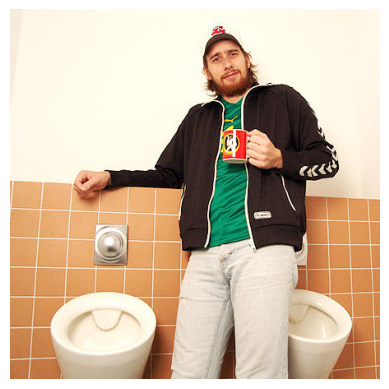

In [3]:

features = pickle.load(open("images6.pkl", "rb"))
model = load_model('best_model_6.h5')
# model = load_model('best_model_6.h5')
images = ".../Flickr30k/Images/"
max_length = 75
words_to_index = pickle.load(open("words16.pkl", "rb"))
index_to_words = pickle.load(open("words116.pkl", "rb"))


def Image_Caption_Beam(picture, beam_width, alpha):
    """
    picture      : the (1, 2048) vector produced by your encoder for one image
    beam_width   : how many partial captions to keep after each time-step
    alpha        : length-penalty (set >1 to encourage longer captions, <1 shorter)
    returns      : best caption string generated with beam search
    """

    # Each element in the beam is (partial_caption_string, log_probability)
    # Start with the <start> token only
    beam = [('<start>', 0.0)] 

    for _ in range(max_length):
        new_beam = []

        # Expand every partial caption currently in the beam
        for caption, log_prob in beam:
            # Stop expanding if it already finished with <end>
            if caption.split()[-1] == '<end>':
                new_beam.append((caption, log_prob))
                continue

            seq = [words_to_index[w] for w in caption.split() if w in words_to_index]
            seq = pad_sequences([seq], maxlen=max_length)

            # Predict probability distribution for the next word, model’s output, a vector of probabilities for the next word in the vocabulary
            yhat = model.predict([picture, seq], verbose=0)[0]      # shape (vocab_size,)

            # Pick the top-`beam_width` candidate words
            top_indices = np.argsort(yhat)[-beam_width:][::-1]

            for idx in top_indices:
                word = index_to_words.get(idx)
                if word is None:          # skip unknowns to keep things clean
                    continue

                # cumulative log-probability (add because we are in log-space)
                new_log_prob = log_prob + np.log(yhat[idx] + 1e-10)

                # optional length penalty so beams of different lengths compare fairly
                length_penalized_score = new_log_prob / ((len(caption.split()) + 1) ** alpha)

                new_beam.append((caption + ' ' + word, length_penalized_score))

        # Keep only the best `beam_width` partial captions
        beam = sorted(new_beam, key=lambda tup: tup[1], reverse=True)[:beam_width]

        # If every caption in the beam has finished, we can stop early
        if all(c.split()[-1] == '<end>' for c, _ in beam):
            break

    # The best caption is at position 0 after sorting
    best_caption = beam[0][0].split()
    # Remove <start> and everything after <end>
    if '<end>' in best_caption:
        best_caption = best_caption[1:best_caption.index('<end>')]
    else:
        best_caption = best_caption[1:]

    return ' '.join(best_caption)


z = 31
pic = list(features.keys())[z]
image_vec = features[pic].reshape((1, 2048))
plt.imshow(plt.imread(images + pic)); plt.axis('off')
print("Beam-search caption:", Image_Caption_Beam(image_vec, beam_width=8, alpha=0.1))


1/1 [==============================] - 1s 598ms/step


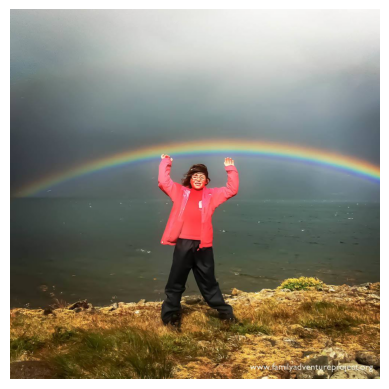

Generated caption: a young girl in a pink shirt is running through a field of tall grass with a pink balloon in the background


In [5]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.sequence import pad_sequences
import pickle

# Load the pretrained ResNet50 model with ImageNet weights
def extract_features(image_path):
    # Load ResNet50 model excluding the top layers
    resnet_model = ResNet50(weights='imagenet', include_top=False, pooling='avg')  # 'avg' pooling to get a 2048-dimensional output
    
    # Load and preprocess the image
    img = image.load_img(image_path, target_size=(224, 224))  # ResNet50 expects 224x224 images
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
    
    # Preprocess image for ResNet50
    img_array = preprocess_input(img_array)
    
    # Extract features from the image (2048-dimensional vector)
    features = resnet_model.predict(img_array)
    
    return features  # Shape will be (1, 2048)

# Load required files
features = pickle.load(open("images6.pkl", "rb"))
model = load_model('best_model_6.h5')
words_to_index = pickle.load(open("words16.pkl", "rb"))
index_to_words = pickle.load(open("words116.pkl", "rb"))
max_length = 75

# Beam search function to generate captions
def Image_Caption_Beam(picture, beam_width, alpha):
    """
    picture      : the (1, 2048) vector produced by your encoder for one image
    beam_width   : how many partial captions to keep after each time-step
    alpha        : length-penalty (set >1 to encourage longer captions, <1 shorter)
    returns      : best caption string generated with beam search
    """

    # Each element in the beam is (partial_caption_string, log_probability)
    # Start with the <start> token only
    beam = [('<start>', 0.0)]

    for _ in range(max_length):
        new_beam = []

        # Expand every partial caption currently in the beam
        for caption, log_prob in beam:
            # Stop expanding if it already finished with <end>
            if caption.split()[-1] == '<end>':
                new_beam.append((caption, log_prob))
                continue

            seq = [words_to_index[w] for w in caption.split() if w in words_to_index]
            seq = pad_sequences([seq], maxlen=max_length)

            # Predict probability distribution for the next word
            yhat = model.predict([picture, seq], verbose=0)[0]  # shape (vocab_size,)

            # Pick the top-`beam_width` candidate words
            top_indices = np.argsort(yhat)[-beam_width:][::-1]

            for idx in top_indices:
                word = index_to_words.get(idx)
                if word is None:          # skip unknowns to keep things clean
                    continue

                # cumulative log-probability (add because we are in log-space)
                new_log_prob = log_prob + np.log(yhat[idx] + 1e-10)

                # optional length penalty so beams of different lengths compare fairly
                length_penalized_score = new_log_prob / ((len(caption.split()) + 1) ** alpha)

                new_beam.append((caption + ' ' + word, length_penalized_score))

        # Keep only the best `beam_width` partial captions
        beam = sorted(new_beam, key=lambda tup: tup[1], reverse=True)[:beam_width]

        # If every caption in the beam has finished, we can stop early
        if all(c.split()[-1] == '<end>' for c, _ in beam):
            break

    # The best caption is at position 0 after sorting
    best_caption = beam[0][0].split()
    # Remove <start> and everything after <end>
    if '<end>' in best_caption:
        best_caption = best_caption[1:best_caption.index('<end>')]
    else:
        best_caption = best_caption[1:]

    return ' '.join(best_caption)

# Test with a file from your PC
image_path = ".../Desktop/eee.jpg"  # Replace with your actual image path
image_vec = extract_features(image_path)  # Extract image features using ResNet50

# Generate the caption using beam search
caption = Image_Caption_Beam(image_vec, beam_width=8, alpha=0.1)

# Display the image and the caption
plt.imshow(plt.imread(image_path)) 
plt.axis('off')
plt.show()

print(f"Generated caption: {caption}")


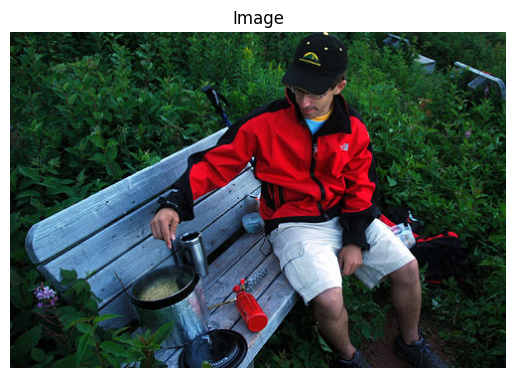

1/1 [==============================] - 4s 4s/step
📝 Raw Caption: a man in a red shirt and jeans is sitting on a bench
🤖 Enhanced Caption (LLM): A man in a vibrant red shirt and faded jeans sits comfortably on a weathered wooden bench.


In [1]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.sequence import pad_sequences
import pickle
import requests
import json

# Load the pretrained ResNet50 model with ImageNet weights
def extract_features(image_path):
    resnet_model = ResNet50(weights='imagenet', include_top=False, pooling='avg')
    img = image.load_img(image_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)
    features = resnet_model.predict(img_array)
    return features  # Shape: (1, 2048)

# Load required files
features = pickle.load(open("images6.pkl", "rb"))
model = load_model('best_model_6.h5')
words_to_index = pickle.load(open("words16.pkl", "rb"))
index_to_words = pickle.load(open("words116.pkl", "rb"))
max_length = 75

# Beam search caption generator
def Image_Caption_Beam(picture, beam_width, alpha):
    beam = [('<start>', 0.0)]
    for _ in range(max_length):
        new_beam = []
        for caption, log_prob in beam:
            if caption.split()[-1] == '<end>':
                new_beam.append((caption, log_prob))
                continue

            seq = [words_to_index.get(w, 0) for w in caption.split()]
            seq = pad_sequences([seq], maxlen=max_length)

            yhat = model.predict([picture, seq], verbose=0)[0]
            top_indices = np.argsort(yhat)[-beam_width:][::-1]

            for idx in top_indices:
                word = index_to_words.get(idx)
                if word is None:
                    continue
                new_caption = caption + ' ' + word
                new_log_prob = log_prob + np.log(yhat[idx] + 1e-10)
                score = new_log_prob / ((len(caption.split()) + 1) ** alpha)
                new_beam.append((new_caption, score))

        beam = sorted(new_beam, key=lambda tup: tup[1], reverse=True)[:beam_width]
        if all(c.split()[-1] == '<end>' for c, _ in beam):
            break

    best_caption = beam[0][0].split()
    if '<end>' in best_caption:
        best_caption = best_caption[1:best_caption.index('<end>')]
    else:
        best_caption = best_caption[1:]
    return ' '.join(best_caption)

# Enhance caption using OpenRouter LLM
def summarize_caption_with_openrouter(caption_text):
    prompt = f"The message you'll give me will only Enhance or rewrite this image caption to sound more natural and descriptive, don't make it long or complicated though, and do not improvise, and do not describe a lot (ONLY GIVE A CAPTION AS YOUR RESPONSE):\n{caption_text}"

    headers = {
        "Authorization": "Bearer YOUR API KEY FROM OPEN-ROUTER",
        "Content-Type": "application/json",
        "HTTP-Referer": "http://localhost",
        "X-Title": "YOUR TITLE"
    }

    payload = {
        "model": "deepseek/deepseek-r1:free",
        "messages": [
            {"role": "user", "content": prompt}
        ]
    }

    response = requests.post(
        url="https://openrouter.ai/api/v1/chat/completions",
        headers=headers,
        data=json.dumps(payload)
    )

    if response.status_code == 200:
        return response.json()["choices"][0]["message"]["content"].strip()
    else:
        print("❌ OpenRouter API error:", response.status_code, response.text)
        return "[Error generating enhanced caption]"

# === MAIN ===

# Set image path
image_path = ".../Desktop/a.jpg"  # Replace this with your actual image path

# Display image and both captions
plt.imshow(plt.imread(image_path))
plt.axis('off')
plt.title("Image")
plt.show()

# Extract features and generate caption
image_vec = extract_features(image_path)
raw_caption = Image_Caption_Beam(image_vec, beam_width=1, alpha=0.1)
print(f"📝 Raw Caption: {raw_caption}")

# Enhance using OpenRouter
enhanced_caption = summarize_caption_with_openrouter(raw_caption)
print(f"🤖 Enhanced Caption (LLM): {enhanced_caption}")


1/1 [==============================] - 1s 618ms/step


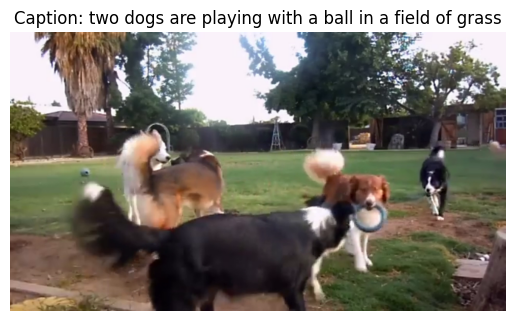

Generated caption for frame 0: two dogs are playing with a ball in a field of grass
1/1 [==============================] - 1s 614ms/step


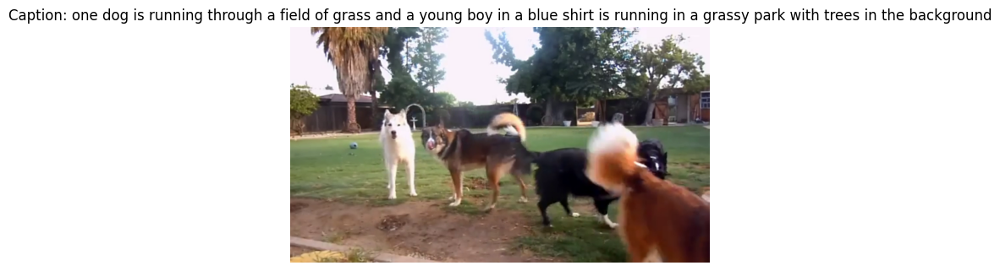

Generated caption for frame 1: one dog is running through a field of grass and a young boy in a blue shirt is running in a grassy park with trees in the background
1/1 [==============================] - 1s 753ms/step


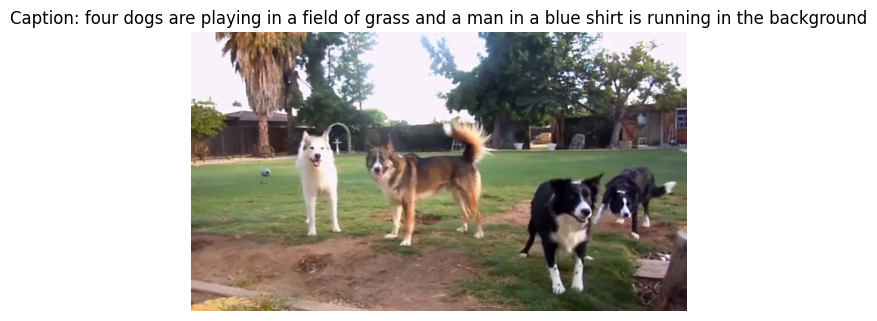

Generated caption for frame 2: four dogs are playing in a field of grass and a man in a blue shirt is running in the background
1/1 [==============================] - 1s 650ms/step


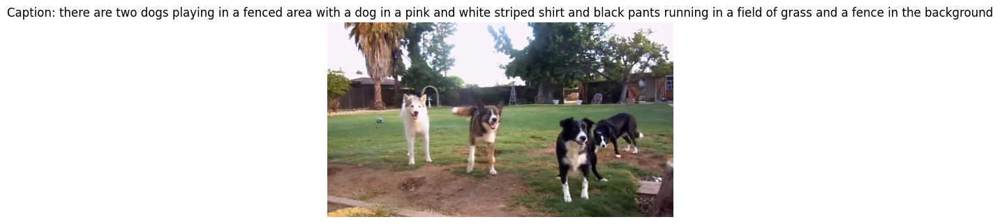

Generated caption for frame 3: there are two dogs playing in a fenced area with a dog in a pink and white striped shirt and black pants running in a field of grass and a fence in the background
1/1 [==============================] - 1s 972ms/step


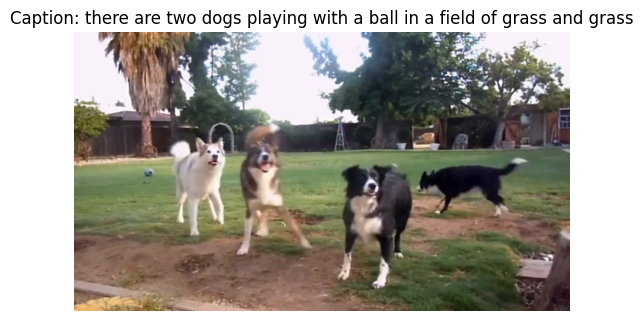

Generated caption for frame 4: there are two dogs playing with a ball in a field of grass and grass
1/1 [==============================] - 1s 610ms/step


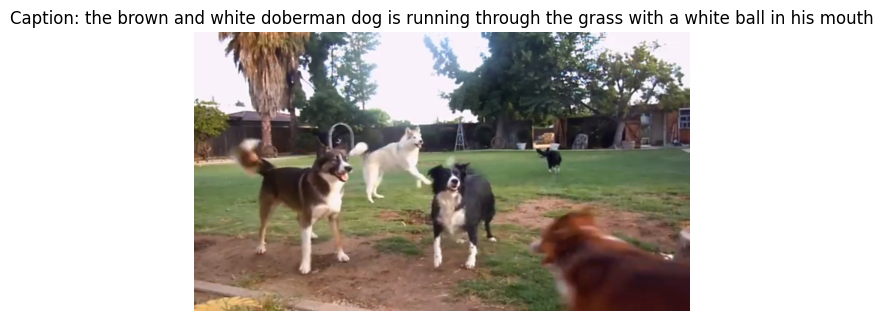

Generated caption for frame 5: the brown and white doberman dog is running through the grass with a white ball in his mouth
1/1 [==============================] - 1s 1s/step


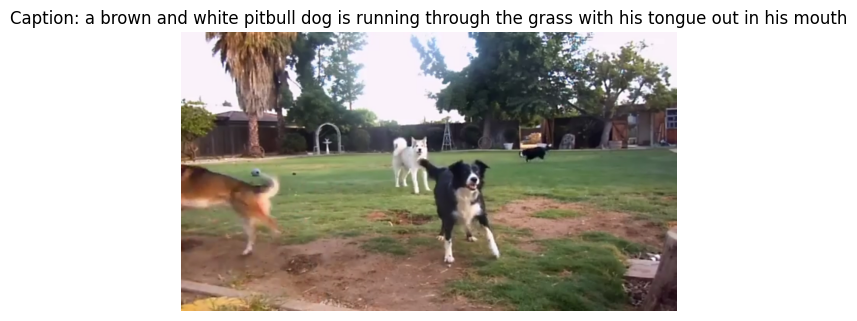

Generated caption for frame 6: a brown and white pitbull dog is running through the grass with his tongue out in his mouth


In [71]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.sequence import pad_sequences
import pickle

# Load the pretrained ResNet50 model with ImageNet weights
def extract_features(image_path):
    """Extract features using ResNet50"""
    resnet_model = ResNet50(weights='imagenet', include_top=False, pooling='avg')  # 'avg' pooling to get a 2048-dimensional output
    img = image.load_img(image_path, target_size=(224, 224))  # ResNet50 expects 224x224 images
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
    img_array = preprocess_input(img_array)
    features = resnet_model.predict(img_array)
    return features  # Shape will be (1, 2048)

# Function to extract frames from a video
def extract_video_frames(video_path, frame_interval=60):
    """Extract frames from a video"""
    cap = cv2.VideoCapture(video_path)
    frames = []
    frame_count = 0

    while True:
        ret, frame = cap.read()
        if not ret:
            break
        frame_count += 1
        
        # Only capture frames at the specified interval
        if frame_count % frame_interval == 0:
            # Convert from BGR to RGB
            frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            frames.append(frame)
    
    cap.release()
    return frames

# Image captioning function (as per your model)
def Image_Caption_Beam(picture, beam_width, alpha):
    beam = [('<start>', 0.0)]  # Start with the <start> token only

    for _ in range(max_length):
        new_beam = []
        for caption, log_prob in beam:
            if caption.split()[-1] == '<end>':
                new_beam.append((caption, log_prob))
                continue

            seq = [words_to_index[w] for w in caption.split() if w in words_to_index]
            seq = pad_sequences([seq], maxlen=max_length)

            yhat = model.predict([picture, seq], verbose=0)[0]  # shape (vocab_size,)
            top_indices = np.argsort(yhat)[-beam_width:][::-1]

            for idx in top_indices:
                word = index_to_words.get(idx)
                if word is None:
                    continue

                new_log_prob = log_prob + np.log(yhat[idx] + 1e-10)
                length_penalized_score = new_log_prob / ((len(caption.split()) + 1) ** alpha)
                new_beam.append((caption + ' ' + word, length_penalized_score))

        beam = sorted(new_beam, key=lambda tup: tup[1], reverse=True)[:beam_width]
        if all(c.split()[-1] == '<end>' for c, _ in beam):
            break

    best_caption = beam[0][0].split()
    if '<end>' in best_caption:
        best_caption = best_caption[1:best_caption.index('<end>')]
    else:
        best_caption = best_caption[1:]

    return ' '.join(best_caption)

# Load required files
features = pickle.load(open("images6.pkl", "rb"))
model = load_model('best_model_6.h5')
words_to_index = pickle.load(open("words16.pkl", "rb"))
index_to_words = pickle.load(open("words116.pkl", "rb"))
max_length = 75

# Process video
video_path = ".../Desktop/dawgs.mp4"  # Replace with your actual video path
frames = extract_video_frames(video_path, frame_interval=60)  # Extract every 30th frame

for idx, frame in enumerate(frames):
    image_path = f"frame_{idx}.jpg"
    # Save frame as an image temporarily to process
    cv2.imwrite(image_path, cv2.cvtColor(frame, cv2.COLOR_RGB2BGR))
    
    # Extract features for the frame
    image_vec = extract_features(image_path)
    
    # Generate the caption using beam search
    caption = Image_Caption_Beam(image_vec, beam_width=20, alpha=5.0)
    
    # Display the frame and caption
    plt.imshow(frame)
    plt.axis('off')
    plt.title(f"Caption: {caption}")
    plt.show()

    print(f"Generated caption for frame {idx}: {caption}")


Generating Captions:   0%|                                                                       | 0/3 [00:00<?, ?it/s]

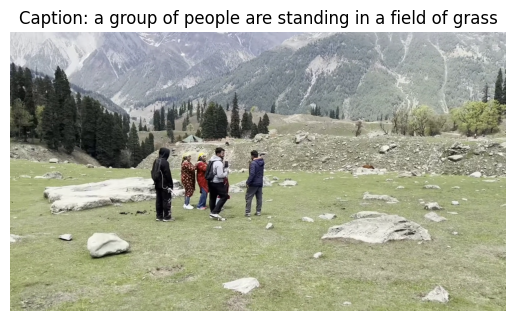

Generating Captions:  33%|█████████████████████                                          | 1/3 [00:07<00:15,  7.83s/it]

Generated caption for frame 0: a group of people are standing in a field of grass


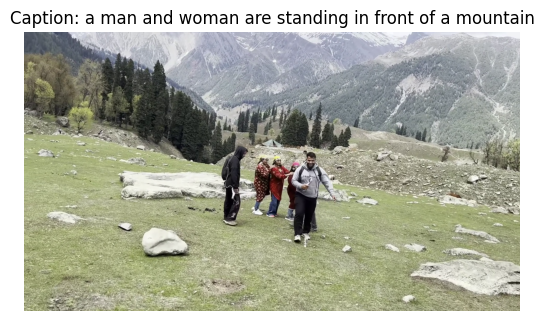

Generating Captions:  67%|██████████████████████████████████████████                     | 2/3 [00:09<00:04,  4.27s/it]

Generated caption for frame 1: a man and woman are standing in front of a mountain


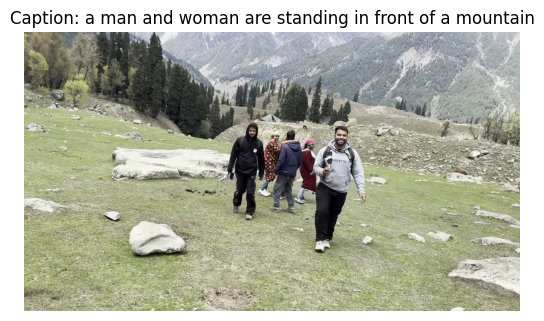

Generating Captions: 100%|███████████████████████████████████████████████████████████████| 3/3 [00:11<00:00,  3.79s/it]

Generated caption for frame 2: a man and woman are standing in front of a mountain

🟢 Final Averaged Caption (Joined Sentences):
a group of people are standing in a field of grass. a man and woman are standing in front of a mountain. a man and woman are standing in front of a mountain.



🤖 Final OpenRouter-Generated Caption: A group of people gather in a grassy field while a man and woman stand prominently in front of a mountain.


In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.sequence import pad_sequences
import pickle
from PIL import Image
from tqdm import tqdm
import requests
import json


# Load ResNet50 model globally
resnet_model = ResNet50(weights='imagenet', include_top=False, pooling='avg')

# Load tokenizer and model
with open("images6.pkl", "rb") as f:
    features = pickle.load(f)
with open("words16.pkl", "rb") as f:
    words_to_index = pickle.load(f)
with open("words116.pkl", "rb") as f:
    index_to_words = pickle.load(f)

model = load_model('best_model_6.h5')
max_length = 75

def extract_features_from_array(frame):
    img = Image.fromarray(frame).resize((224, 224))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)
    features = resnet_model.predict(img_array, verbose=0)
    return features

def extract_video_frames(video_path, frame_interval=30):
    cap = cv2.VideoCapture(video_path)
    frames = []
    frame_count = 0
    while True:
        ret, frame = cap.read()
        if not ret:
            break
        frame_count += 1
        if frame_count % frame_interval == 0:
            frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            frames.append(frame)
    cap.release()
    return frames

def image_caption_beam(image_vec, beam_width=1, alpha=0.1):
    beam = [('<start>', 0.0)]
    for _ in range(max_length):
        new_beam = []
        for caption, log_prob in beam:
            if caption.split()[-1] == '<end>':
                new_beam.append((caption, log_prob))
                continue
            seq = [words_to_index.get(w, 0) for w in caption.split()]
            seq = pad_sequences([seq], maxlen=max_length)
            yhat = model.predict([image_vec, seq], verbose=0)[0]
            top_indices = np.argsort(yhat)[-beam_width:][::-1]
            for idx in top_indices:
                word = index_to_words.get(idx)
                if word is None:
                    continue
                new_caption = caption + ' ' + word
                new_log_prob = log_prob + np.log(yhat[idx] + 1e-10)
                score = new_log_prob / ((len(caption.split()) + 1) ** alpha)
                new_beam.append((new_caption, score))
        beam = sorted(new_beam, key=lambda tup: tup[1], reverse=True)[:beam_width]
        if all(c.split()[-1] == '<end>' for c, _ in beam):
            break
    best_caption = beam[0][0].split()
    if '<end>' in best_caption:
        best_caption = best_caption[1:best_caption.index('<end>')]
    else:
        best_caption = best_caption[1:]
    return ' '.join(best_caption)

def summarize_captions_with_openrouter(joined_captions_text):
    prompt = (
        "Summarize the following captions from a video into one natural-sounding sentence. ONLY RETURN THE CAPTION AS YOUR RESPONSE::\n"
        f"{joined_captions_text}"
    )

    headers = {
        "Authorization": "Bearer YOUR API KEY",
        "Content-Type": "application/json",
        "HTTP-Referer": "http://localhost",
        "X-Title": "YOUR TITLE"
    }

    payload = {
        "model": "deepseek/deepseek-r1:free",
        "messages": [
            {"role": "user", "content": prompt}
        ]
    }

    response = requests.post(
        url="https://openrouter.ai/api/v1/chat/completions",
        headers=headers,
        data=json.dumps(payload)
    )

    if response.status_code == 200:
        return response.json()["choices"][0]["message"]["content"].strip()
    else:
        print("❌ OpenRouter API error:", response.status_code, response.text)
        return "[Error generating summary]"

# === Main ===

video_path = ".../Desktop/name.mp4"
frames = extract_video_frames(video_path, frame_interval=30)

all_captions = []

for idx, frame in tqdm(enumerate(frames), total=len(frames), desc="Generating Captions"):
    image_vec = extract_features_from_array(frame)
    caption = image_caption_beam(image_vec, beam_width=1, alpha=0.1)
    all_captions.append(caption)
    plt.imshow(frame)
    plt.axis('off')
    plt.title(f"Caption: {caption}")
    plt.show()
    print(f"Generated caption for frame {idx}: {caption}")

# === Final Concatenated Caption (NEW LOGIC) ===
joined_caption_text = ". ".join(all_captions) + "."
print("\n🟢 Final Averaged Caption (Joined Sentences):")
print(joined_caption_text)

# === Smart LLM-Generated Caption ===
final_llm_caption = summarize_captions_with_openrouter(joined_caption_text)
print("\n🤖 Final LLM API Caption:", final_llm_caption)


In [67]:

I tested 



Evaluating BLEU-1 for Beam Width 1...
Example 10:
Generated: a man in a black shirt is reading a book
References: ['<start> a boy playing a piano with music notes in front of him <end>', '<start> a young boy in a striped shirt is playing the piano <end>', '<start> young man practicing for a recital <end>', '<start> a young boy playing the piano <end>', '<start> a small boy playing the piano <end>']
BLEU-1   : 0.6
--------------------------------------------------
Example 20:
Generated: a man in a blue shirt is standing in front of a car
References: ['<start> an old grayhaired balding old man wearing glasses is looking sideways in front of a van with a blue bar on top <end>', '<start> a man stands at the passenger door of an emergency vehicle <end>', '<start> a man is standing next to a vehicle in a city setting <end>', '<start> a grayhaired man stands next to a police van <end>', '<start> a man is standing next to a police van <end>']
BLEU-1   : 0.7692
--------------------------------

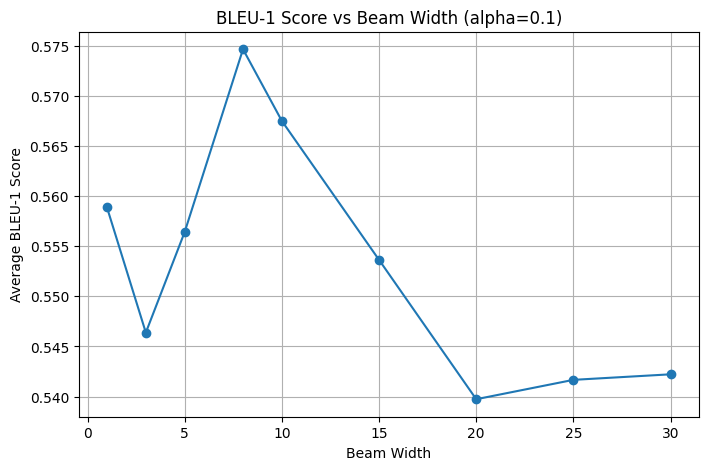

([1, 3, 5, 8, 10, 15, 20, 25, 30],
 [0.5588872528234572,
  0.5463843486720298,
  0.5564315847649174,
  0.5746733327904765,
  0.5675093558574648,
  0.5536425360864776,
  0.5397340649391205,
  0.5416677317102989,
  0.5422215125047244])

In [66]:
import matplotlib.pyplot as plt
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction
smoothie = SmoothingFunction().method1

def evaluate_bleu_beam(test_data, features, model, max_length, wordtoix, ixtoword, beam_width=5, alpha=10, num_samples=100):
    total_score = 0
    count = 0

    for key in list(test_data.keys())[:num_samples]:
        feature_key = key + '.jpg'
        if feature_key not in features:
            continue

        image = features[feature_key]
        image = np.expand_dims(image, axis=0)  

        # Generate caption with Beam Search
        predicted_caption = Image_Caption_Beam(image, beam_width=beam_width, alpha=alpha)

        # Reference captions
        references = [caption.split() for caption in test_data[key]]

        # Candidate caption (predicted)
        candidate = predicted_caption.split()

        # Compute BLEU-1
        bleu_score = sentence_bleu(references, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smoothie)
        total_score += bleu_score
        count += 1

        if count % 10 == 0:
            print(f"Example {count}:")
            print("Generated:", predicted_caption)
            print("References:", test_data[key])
            print("BLEU-1   :", round(bleu_score, 4))
            print("-" * 50)

    avg_bleu1 = total_score / count if count else 0
    print(f"\n✅ Average BLEU-1 Score over {count} samples: {round(avg_bleu1, 4)}")
    return avg_bleu1


def plot_bleu_vs_beam_width(test_data, features, model, max_length, wordtoix, ixtoword, alpha=1.2, num_samples=100):
    bleu_scores = []
    beam_widths = [1, 3, 5, 8, 10, 15, 20, 25, 30]

    for beam_width in beam_widths:
        print(f"\nEvaluating BLEU-1 for Beam Width {beam_width}...")
        avg_bleu1 = evaluate_bleu_beam(
            test_data=test_data,
            features=features,
            model=model,
            max_length=max_length,
            wordtoix=wordtoix,
            ixtoword=ixtoword,
            beam_width=beam_width,
            alpha=alpha,
            num_samples=num_samples
        )
        bleu_scores.append(avg_bleu1)

    plt.figure(figsize=(8, 5))
    plt.plot(beam_widths, bleu_scores, marker='o')
    plt.title(f'BLEU-1 Score vs Beam Width (alpha={alpha})')
    plt.xlabel('Beam Width')
    plt.ylabel('Average BLEU-1 Score')
    plt.grid(True)
    plt.show()

    return beam_widths, bleu_scores

plot_bleu_vs_beam_width(
    test_data=test_data,
    features=features,
    model=model,
    max_length=max_length,
    wordtoix=words_to_index,
    ixtoword=index_to_words,
    alpha=0.1,
    num_samples=100
)


Evaluating BLEU-1 for Beam Width 1...
Example 10:
Generated: a man in a black shirt is reading a book
References: ['<start> a boy playing a piano with music notes in front of him <end>', '<start> a young boy in a striped shirt is playing the piano <end>', '<start> young man practicing for a recital <end>', '<start> a young boy playing the piano <end>', '<start> a small boy playing the piano <end>']
BLEU-1   : 0.6
--------------------------------------------------
Example 20:
Generated: a man in a blue shirt is standing in front of a car
References: ['<start> an old grayhaired balding old man wearing glasses is looking sideways in front of a van with a blue bar on top <end>', '<start> a man stands at the passenger door of an emergency vehicle <end>', '<start> a man is standing next to a vehicle in a city setting <end>', '<start> a grayhaired man stands next to a police van <end>', '<start> a man is standing next to a police van <end>']
BLEU-1   : 0.7692
--------------------------------

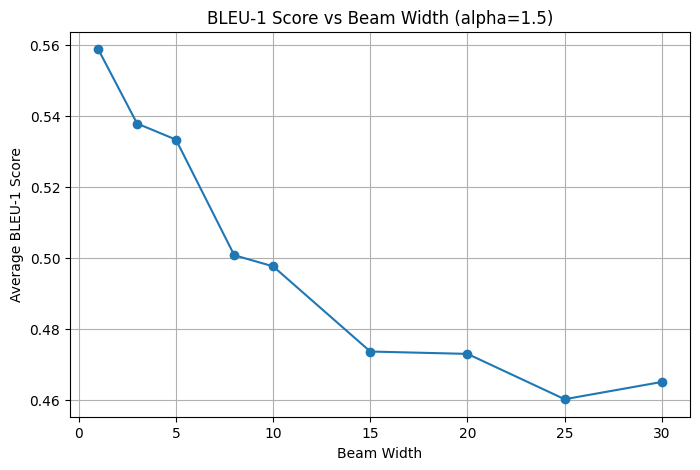

([1, 3, 5, 8, 10, 15, 20, 25, 30],
 [0.5588872528234572,
  0.5379342579286893,
  0.5333954720027103,
  0.5008046382912198,
  0.49766402791126296,
  0.4736472823831956,
  0.4729844515085107,
  0.4602013221131078,
  0.4650764483563075])

In [67]:
import matplotlib.pyplot as plt
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction
smoothie = SmoothingFunction().method1

def evaluate_bleu_beam(test_data, features, model, max_length, wordtoix, ixtoword, beam_width=5, alpha=10, num_samples=100):
    total_score = 0
    count = 0

    for key in list(test_data.keys())[:num_samples]:
        feature_key = key + '.jpg'
        if feature_key not in features:
            continue

        image = features[feature_key]
        image = np.expand_dims(image, axis=0) 

        # Generate caption with Beam Search
        predicted_caption = Image_Caption_Beam(image, beam_width=beam_width, alpha=alpha)

        # Reference captions
        references = [caption.split() for caption in test_data[key]]

        # Candidate caption (predicted)
        candidate = predicted_caption.split()

        # Compute BLEU-1
        bleu_score = sentence_bleu(references, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smoothie)
        total_score += bleu_score
        count += 1

        if count % 10 == 0:
            print(f"Example {count}:")
            print("Generated:", predicted_caption)
            print("References:", test_data[key])
            print("BLEU-1   :", round(bleu_score, 4))
            print("-" * 50)

    avg_bleu1 = total_score / count if count else 0
    print(f"\n✅ Average BLEU-1 Score over {count} samples: {round(avg_bleu1, 4)}")
    return avg_bleu1


def plot_bleu_vs_beam_width(test_data, features, model, max_length, wordtoix, ixtoword, alpha=1.2, num_samples=100):
    bleu_scores = []
    beam_widths = [1, 3, 5, 8, 10, 15, 20, 25, 30]

    for beam_width in beam_widths:
        print(f"\nEvaluating BLEU-1 for Beam Width {beam_width}...")
        avg_bleu1 = evaluate_bleu_beam(
            test_data=test_data,
            features=features,
            model=model,
            max_length=max_length,
            wordtoix=wordtoix,
            ixtoword=ixtoword,
            beam_width=beam_width,
            alpha=alpha,
            num_samples=num_samples
        )
        bleu_scores.append(avg_bleu1)

    plt.figure(figsize=(8, 5))
    plt.plot(beam_widths, bleu_scores, marker='o')
    plt.title(f'BLEU-1 Score vs Beam Width (alpha={alpha})')
    plt.xlabel('Beam Width')
    plt.ylabel('Average BLEU-1 Score')
    plt.grid(True)
    plt.show()

    return beam_widths, bleu_scores

plot_bleu_vs_beam_width(
    test_data=test_data,
    features=features,
    model=model,
    max_length=max_length,
    wordtoix=words_to_index,
    ixtoword=index_to_words,
    alpha=1.5,
    num_samples=100
)

In [ ]:
import matplotlib.pyplot as plt
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction
smoothie = SmoothingFunction().method1

def evaluate_bleu_beam(test_data, features, model, max_length, wordtoix, ixtoword, beam_width=5, alpha=10, num_samples=100):
    total_score = 0
    count = 0

    for key in list(test_data.keys())[:num_samples]:
        feature_key = key + '.jpg'
        if feature_key not in features:
            continue

        image = features[feature_key]
        image = np.expand_dims(image, axis=0)

        # Generate caption with Beam Search
        predicted_caption = Image_Caption_Beam(image, beam_width=beam_width, alpha=alpha)

        # Reference captions
        references = [caption.split() for caption in test_data[key]]

        # Candidate caption (predicted)
        candidate = predicted_caption.split()

        # Compute BLEU-1
        bleu_score = sentence_bleu(references, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smoothie)
        total_score += bleu_score
        count += 1

        if count % 10 == 0:
            print(f"Example {count}:")
            print("Generated:", predicted_caption)
            print("References:", test_data[key])
            print("BLEU-1   :", round(bleu_score, 4))
            print("-" * 50)

    avg_bleu1 = total_score / count if count else 0
    print(f"\n✅ Average BLEU-1 Score over {count} samples: {round(avg_bleu1, 4)}")
    return avg_bleu1


def plot_bleu_vs_beam_width(test_data, features, model, max_length, wordtoix, ixtoword, alpha=1.2, num_samples=100):
    bleu_scores = []
    beam_widths = [1, 5, 8, 15, 20]

    for beam_width in beam_widths:
        print(f"\nEvaluating BLEU-1 for Beam Width {beam_width}...")
        avg_bleu1 = evaluate_bleu_beam(
            test_data=test_data,
            features=features,
            model=model,
            max_length=max_length,
            wordtoix=wordtoix,
            ixtoword=ixtoword,
            beam_width=beam_width,
            alpha=alpha,
            num_samples=num_samples
        )
        bleu_scores.append(avg_bleu1)

    plt.figure(figsize=(8, 5))
    plt.plot(beam_widths, bleu_scores, marker='o')
    plt.title(f'BLEU-1 Score vs Beam Width (alpha={alpha})')
    plt.xlabel('Beam Width')
    plt.ylabel('Average BLEU-1 Score')
    plt.grid(True)
    plt.show()

    return beam_widths, bleu_scores

plot_bleu_vs_beam_width(
    test_data=test_data,
    features=features,
    model=model,
    max_length=max_length,
    wordtoix=words_to_index,
    ixtoword=index_to_words,
    alpha=10,
    num_samples=100
)


Evaluating BLEU-1 for Beam Width 1...
Example 10:
Generated: a man in a black shirt is reading a book
References: ['<start> a boy playing a piano with music notes in front of him <end>', '<start> a young boy in a striped shirt is playing the piano <end>', '<start> young man practicing for a recital <end>', '<start> a young boy playing the piano <end>', '<start> a small boy playing the piano <end>']
BLEU-1   : 0.6
--------------------------------------------------
Example 20:
Generated: a man in a blue shirt is standing in front of a car
References: ['<start> an old grayhaired balding old man wearing glasses is looking sideways in front of a van with a blue bar on top <end>', '<start> a man stands at the passenger door of an emergency vehicle <end>', '<start> a man is standing next to a vehicle in a city setting <end>', '<start> a grayhaired man stands next to a police van <end>', '<start> a man is standing next to a police van <end>']
BLEU-1   : 0.7692
--------------------------------